In [258]:
import urllib.request

urllib.request.urlretrieve("http://files.rcsb.org/download/1UBQ.pdb","1UBQ.pdb")
from Bio import PDB
parser=PDB.PDBParser()
struct=parser.get_structure("1ubq","1UBQ.pdb")
print(struct)
atom=list(struct.get_atoms())[0]
#for atom in struct.get_atoms():
# print(atom.element,atom.coord)
pp=PDB.PPBuilder()
polypeptide=pp.build_peptides(struct)
print(polypeptide)
polypeptide=polypeptide[0]
sequence=polypeptide.get_sequence()
str(sequence)

<Structure id=1ubq>
[<Polypeptide start=1 end=76>]


'MQIFVKTLTGKTITLEVEPSDTIENVKAKIQDKEGIPPDQQRLIFAGKQLEDGRTLSDYNIQKESTLHLVLRLRGG'

In [5]:
import pandas as pd

df = pd.read_csv('enzyme_classification.csv')

In [6]:
df.columns=['Amino acid', 'Class']
df

,Amino acid,Class
0,1A2F,1
1,1A2V,1
2,1A4S,1
3,1A4Z,1
4,1A65,1
5,1A71,1
6,1A7K,1
7,1A7U,1
8,1A80,1
9,1A88,1


In [839]:
batch = df.iloc[np.r_[0:200, 8000:8200, 14000:14200, 22000:22200, 31000:31200, 39000:39200, 44200:],:]
#batch = df.iloc[[0:200, 8000:8200, 14000:14200, 22000:22200, 31000:31200, 39000:39200, 44200:]]

batch = df.iloc[:300]
batch = batch.append(df.iloc[8000:8300])
batch = batch.append(df.iloc[14000:14300])
batch = batch.append(df.iloc[22000:22300])
batch = batch.append(df.iloc[31000:31300])
batch = batch.append(df.iloc[39000:39300])
batch = batch.append(df.iloc[44100:])
batch = df
len(batch)

44487

In [840]:
#Getting amino acid sequence for all enzymes
import warnings
import numpy as np
warnings.filterwarnings("ignore")
counter = 0
sequences = np.array([])
failed = np.array([])
short = np.array([])
for x in batch['Amino acid']:
    counter += 1
    urllib.request.urlretrieve("http://files.rcsb.org/download/" + x +".pdb", x + ".pdb")
    parser=PDB.PDBParser()
    struct=parser.get_structure(x,x + '.pdb')
    atom=list(struct.get_atoms())[0]
    pp=PDB.PPBuilder()
    polypeptide=pp.build_peptides(struct)
    if len(polypeptide) == 0:
        failed = np.append(failed, counter-1)
    #if counter == 14 or counter == 23 or counter == 35:
        print("Amino acid " + x + " not parsed correctly.")
    elif len(polypeptide) > 0:
        polypeptide=polypeptide[0]
        sequence=polypeptide.get_sequence()
        print(str(sequence))
        if len(str(sequence)) < 50:
            short = np.append(short, counter-1)
            print("Amino acid " + x + "too short.")
        else:
            sequences = np.append(sequences, str(sequence))
            print(counter, "amino acids processed.")
    #else:
        #sequences = np.append(sequences, 0)
        #print("Amino acid " + x + " not parsed correctly.")

LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMNDREVVALKGAHALGKTHLKNSGYEGPWGAANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLENGITFPKDAPSPFIFKTLEEQGL
1 amino acids processed.
PARPAHPLDPLSTAEIKAATNTVKSYFAGKKISFNTVTLREPARKAYIQWKEQGGPLPPRLAYYVILEAGKPGVKEGLVDLASLSVIETRALETVQPILTVEDLCSTEEVIRNDPAVIEQCVLSGIPANEMHKVYCDPWTIGYDERWGTGKRLQQALVYYRSDEDDSQYSHPLDFCPIVDTEEKKVIFIDIPNRRRKVSKHKHANFYPKHMIEKVGAMRPEAPPINVTQPEGVSFKMTGNVMEWSNFKFHIGFNYREGIVLSDVSYNDHGNVRPIFHRISLSEMIVPYGSPEFPHQRKHALDIGEYGAGYMTNPLSLGCDCKGVIHYLDAHFSDRAGDPITVKNAVCIHEEDDGLLFKHSDFRDNFATSLVTRATKLVVSQIFTAAN
2 amino acids processed.
AQLVDSMPSASTGSVVVTDDLNYWGGRRIKSKDGATTEPVFEPATGRVLCQMVPCGAEEVDQAVQSAQAAYLKWSKMAGIERSRVMLEAARIIRERRDNIAKLEVINNGKTITEAEYDIDAAWQCIEYYAGLAPTLSGQHIQLPGGAFAYTRREPLGVCAGILAWNYPFMIAAWKCAPALACGNAVVFKPSPMTPVTGVILAEIFHEAGVPVGLVNVVQGGAETGSLLCHHPNVAKVSFTGSVPTGKKVMEMSAKTVKHVTLELGGKSPL

LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMNDREVVALMGAHALGKTHLKNSGYEGPGGAANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLEDGITFPKDAPSPFIFKTLEEQGL
26 amino acids processed.
LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMNDREVVALMGAHALGKTHLKNSGYEGPGGAANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLEDGITFPKDAPSPFIFKTLEEQGL
27 amino acids processed.
LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMNDREVVALMGAHALGKTHLKNSGYEGPGGAANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLEDGITFPKDAPSPFIFKTLEEQGL
28 amino acids processed.
LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRL

SKIFDLVVIGAGSGGLEAAWNAATLYKKRVAVIDVQMVHGPPFFSALGGTCVNVGCVPKKLMVTGAQYMEHLRESAGFGWEFDRTTLRAEWKNLIAVKDEAVLNINKSYDEMFRDTEGLEFFLGWGSLESKNVVNVRESADPASAVKERLETEHILLASGSWPHMPNIPGIEHCISSNEAFYLPEPPRRVLTVGGGFISVEFAGIFNAYKPKDGQVTLCYRGEMILRGFDHTLREELTKQLTANGIQILTKENPAKVELNADGSKSVTFESGKKMDFDLVMMAIGRSPRTKDLQLQNAGVMIKNGGVQVDEYSRTNVSNIYAIGDVTNRVMLTPVAINEAAALVDTVFGTTPRKTDHTRVASAVFSIPPIGTCGLIEEVASKRYEVVAVYLSSFTPLMHKVSGSKYKTFVAKIITNHSDGTVLGVHLLGDNAPEIIQGIGICLKLNAKISDFYNTIGVHPTSAEELCSMRTPSYYYVKGEKMEKP
54 amino acids processed.
LDPAAPPEFGMKEMRESWKVHVAPEDRPTQQMNDWDLENLFSVTLRDAGQIALIDGSTYEIKTVLDTGYAVHISRLSASGRYLFVIGRDGKVNMIDLWMKEPTTVAEIKIGSEARSIETSKMEGWEDKYAIAGAYWPPQYVIMDGETLEPKKIQSTRGMTYDEQEYHPEPRVAAILASHYRPEFIVNVKETGKILLVDYTDLNNLKTTEISAERFLHDGGLDGSHRYFITAANARNKLVVIDTKEGKLVAIEDTGGQTPHPGRGANFVHPTFGPVWATSHMGDDSVALIGTDPEGHPDNAWKILDSFPALGGGSLFIKTHPNSQYLYVDATLNPEAEISGSVAVFDIKAMTGDGSDPEFKTLPIAEWAGITEGQPRVVQGEFNKDGTEVWFSVWNGKDQESALVVVDDKTLELKHVIKDERLVTPTGKFNVYNTMTDTY
55 amino acids processed.
HKTRTDNRYEPSLDNLAQQDVA

ASPFRLASAGEISEVQGILRTAGLLGPEKRIAYLGVLDPARGAGSEAEDRRFRVFIHDVSGARPQEVTVSVTNGTVISAVELDTAATGELPVLEEEFEVVEQLLATDERWLKALAARNLDVSKVRVAPLSAGVFEYAEERGRRILRGLAFVQDFPEDSAWAHPVDGLVAYVDVVSKEVTRVIDTGVFPVPAEHGNYTDPELTGPLRTTQKPISITQPEGPSFTVTGGNHIEWEKWSLDVGFDVREGVVLHNIAFRDGDRLRPIINRASIAEMVVPYGDPSPIRSWQNYFDTGEYLVGQYANSLELGCDCLGDITYLSPVISDAFGNPREIRNGICMHEEDWGILAKHSDLWSGINYTRRNRRMVISFFTTIGN
75 amino acids processed.
AYTTFSQTKNDQLKEPMFFGQPVNVARYDQQKYDIFEKLIEKQLSFFWRPEEVDVSRDRIDYQALPEHEKHIFISNLKYQTLLDSIQGRSPNVALLPLISIPELETWVETWAFSETIHSRSYTHIIRNIVNDPSVVFDDIVTNEQIQKRAEGISSYYDELIEMTSYWHLLGEGTHTVNGKTVTVSLRELKKKLYLCLMSVNALEAIRFYVSFACSFAFAERELMEGNAKIIRLIARDEALHLTGTQHMLNLLRSGADDPEMAEIAEECKQECYDLFVQAAQQEKDWADYLFRDGSMIGLNKDILCQYVEYITNIRMQAVGLDLPFQTRSNPIPWINTWLV
76 amino acids processed.
ASPFRLASAGEISEVQGILRTAGLLGPEKRIAYLGVLDPARGAGSEAEDRRFRVFIHDVSGARPQEVTVSVTNGTVISAVELDTAATGELPVLEEEFEVVEQLLATDERWLKALAARNLDVSKVRVAPLSAGVFEYAEERGRRILRGLAFVQDFPEDSAWAHPVDGLVAYVDVVSKEVTRVIDTGVFPVPAEHGNYTDPELTGPLRTTQKPISITQPEGPSFTVTGGNHIEWE

IEKRATCSNGKTVGDASCCAWFDVLDDIQQNLFHGGQCGAEAHESIRLVFHDSIAISPAMEAQGKFGGGGADGSIMIFDDIETAFHPNIGLDEIVKLQKPFVQKHGVTPGDFIAFAGAVALSNCPGAPQMNFFTGRAPATQPAPDGLVPEPFHTVDQIINRVNDAGEFDELELVFMLSAHSVAAVNDVDPTVQGLPFDSTPGIFDSQFFVETQLRGTAFPGSGGNQGEVESPLPGEIRIQSDHTIARDSRTACEWQSFVNNQSKLVDDFQFIFLALTQLGQDPNAMTDCSDVIPQSKPIPGNLPFSFFPAGKTIKDVEQACAETPFPTLTTLPGPETSVQRIPPPPGA
97 amino acids processed.
KTPMRVAVTGAAGQICYSLLFRIANGDMLGKDQPVILQLLEIPNEKAQKALQGVMMEIDDCAFPLLAGMTAHADPMTAFKDADVALLVGARPRGPGMERKDLLEANAQIFTVQGKAIDAVASRNIKVLVVGNPANTNAYIAMKSAPSLPAKNFTAMLRLDHNRALSQIAAKTGKPVSSIEKLFVWGNHSPTMYADYRYAQIDGASVKDMINDDAWNRDTFLPTVGKRGAAIIDARGVSSAASAANAAIDHIHDWVLGTAGKWTTMGIPSDGSYGIPEGVIFGFPVTTENGEYKIVQGLSIDAFSQERINVTLNELLEEQNGVQHLLG
98 amino acids processed.
GSHMIEPNVISVRLFKRKVGGLGFLVKERVSKPPVIISDLIRGGAAEQSGLIQAGDIILAVNDRPLVDLSYDSALEVLRGIASETHVVLILRGPEGFTTHLETTFTGDGTPKTIRVTQPLGPPTKAV
99 amino acids processed.
GYVPAVVIGTGYGAAVSALRLGEAGVQTLMLEMGQLWNQPGPDGNIFCGMLNPDKRSSWFKNRTEAPLGSFLWLDVVNRNIDPYAGVLDRVNYDQMSVYVGRGVGGGSLVNGGMAVE

AYTTFSQTKNDQLKEPMFFGQPVNVARYDQQKYDIFEKLIEKQLSFFWRPEEVDVSRDRIDYQALPEHEKHIFISNLKYQTLLDSIQGRSPNVALLPLISIPELETWVETWAFSETIHSRSFTHIIRNIVNDPSVVFDDIVTNEQIQKRAEGISSYYDELIEMTSYWHLLGEGTHTVNGKTVTVSLRELKKKLYLCLMSVNALEAIR
122 amino acids processed.
LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMNDREVVALMGAHALGKTHLKNSGYEGPWGAANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLEDGITFPKDAPSPFIFKTLEEQGL
123 amino acids processed.
SVSKANVPKIDVSPLFGDDQAAKMRVAQQIDAASRDTGFFYAVNHGINVQRLSQKTKEFHMSITPEEKWDLAIRAYNKEHQDQVRAGYYLSIPGKKAVESFCYLNPNFTPDHPRIQAKTPTHEVNVWPDETKHPGFQDFAEQYYWDVFGLSSALLKGYALALGKEENFFARHFKPDDTLASVVLIRYPYLDPYPEAAIKTAADGTKLSFEWHEDVSLITVLYQSNVQNLQVETAAGYQDIEADDTGYLINCGSYMAHLTNNYYKAPIHRVKWVNAERQSLPFFVNLGYDSVIDPFDPREPNGKSDREPLSYGDYLQNGLVSLINKNGQT
124 amino acids processed.
MKTQVAIIGAGPSGLLLGQLLHKAGIDNVILERQTPDYVLGRIKAGVLEQGMVDLLREAGVDRRMARDGLVHEGVEIAFAGQRRRIDLK

SFVKDFKPQALGDTNLFKPIKIGNNELLHRAVIPPLTRMRALHPGNIPNRDWAVEYYTQRAQRPGTMIITEGAFISPQAGGYDNAPGVWSEEQMVEWTKIFNAIHEKKSFVWVQLWVLGWAAFPDNLARDGLRYDSASDNVFMDAEQEAKAKKANNPQHSLTKDEIKQYIKEYVQAAKNSIAAGADGVEINSANGYLLNQFLDPHSNTRTDEYGGSIENRARFTLEVVDALVEAIGHEKVGLRLSPYGVFNSMSGGAETGIVAQYAYVAGELEKRAKAGKRLAFVHLVEPRVTNPFLTEGEGEYEGGSNDFVYSIWKGPVIRAGNFALHPEVVREEVKDKRTLIGYGRFFISNPDLVDRLEKGLPLNKYDRDTFYQMSAHGYIDYPTYEEALKLGWDKS
146 amino acids processed.
KQRVFIAGHRGMVGSAIRRQLEQRGDVELVLRTRDELNLLDSRAVHDFFASERIDQVYLAAAKVGGIVANNTYPADFIYQNMMIESNIIHAAHQNDVNKLLFLGSSCIYPKLAKQPMAESELLQGTLEPTNEPYAIAKIAGIKLCESYNRQYGRDYRSVMPTNLYGPHDNFHPSNSHVIPALLRRFHEATAQNAPDVVVWGSGTPMREFLHVDDMAAASIHVMELAHEVWLENTQPMLSHINVGTGVDCTIRDLAQTIAKVVGYKGRVVFDASKPDGTPRKLLDVTRLHQLGWYHEISLEAGLASTYQWFLENQ
147 amino acids processed.
HSKKMEEGITVNKFKPKTPYVGRCLLNTKITGDDAPGETWHMVFSHEGEIPYREGQSVGVIPDGEDKNGKPHKLRLYSIASSALGDFGDAKSVSLCVKRLIYTNDAGETIKGVCSNFLCDLKPGAEVKLTGPVGKEMLMPKDPNATIIMLGTGTGIAPFRSFLWKMFFEKHDDYKFNGLAWLFLGVPTSSSLLYKEEFEKMKEKAPDNFRLDFAVSREQTNEKGEKMYIQT

MKTQVAIIGAGPSGLLLGQLLHKAGIDNVILERQTPDYVLGRIRAGVLEQGMVDLLREAGVDRRMARDGLVHEGVEIAFAGQRRRIDLKRLSGGKTVTVYGQTEVTRDLMEAREASGATTVYQAAEVRLHDLQGERPYVTFERDGERLRLDCDYIAGCDGAHGISRQSIPAERLKVFERVYPFGWLGLLADTPPVSHELIYANHPRGFALCSQRSATRSRYYVQVPLTEKVEDWSDERFWTELKARLPAEVAEKLVTGPSLEKSIAPLRSFVVEPMQHGRLFLAGDAAHIVPPTGAKGLNLAASDVSTLYRLLLKAYREGRGELLERYSAICLRRIWKAERFSWWMTSVLHRFPDTDAFSQRIQQTELEYYLGSEAGLATIAENYVGLPYE
171 amino acids processed.
MKTQVAIIGAGPSGLLLGQLLHKAGIDNVILERQTPDYVLGRIRAGVLEQGMVDLLREAGVDRRMARDGLVHEGVEIAFAGQRRRIDLKRLSGGKTVTVYGQTEVTRDLMEAREASGATTVYQAAEVRLHDLQGERPYVTFERDGERLRLDCDYIAGCDGFHGISSQSIPAERLKVFERVYPFGWLGLLADTPPVSHELIYANHPRGFALCSQRSATRSRYYVQVPLTEKVEDWSDERFWTELKARLPAEVAEKLVTGPSLEKSIAPLRSFVVEPMQHGRLFLAGDAAHIVPPTGAKGLNLAASDVSTLYRLLLKAYREGRGELLERYSAICLRRIWKAERFSWWMTSVLHRFPDTDAFSQRIQQTELEYYLGSEAGLATIAENYVGLPYE
172 amino acids processed.
LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMND

APSFPFSRASGPEPPAEFAKLRATNPVSQVKLFDGSLAWLVTKHKDVCFVATSEKLSKVRTRQGFPELSASGKQAAKAKPTFVDMDPPEHMHQRSMVEPTFTPEAVKNLQPYIQRTVDDLLEQMKQKGCANGPVDLVKEFALPVPSYIIYTLLGVPFNDLEYLTQQNAIRTNGSSTAREASAANQELLDYLAILVEQRLVEPKDDIISKLCTEQVKPGNIDKSDAVQIAFLLLVAGNATMVNMIALGVATLAQHPDQLAQLKANPSLAPQFVEELCRYHTASALAIKRTAKEDVMIGDKLVRANEGIIASNQSANRDEEVFENPDEFNMNRKWPPQDPLGFGFGDHRCIAEHLAKAELTTVFSTLYQKFPDLKVAVPLGKINYTPLNRDVGIVDLPVIF
195 amino acids processed.
MSKNYHIAVLPGDGIGPEVMTQALKVLDAVRNRFAMRITTSHYDVGGAAIDNHGQPLPPATVEGCEQADAVLFGSVGGPKWEHLPPDQQPERGALLPLRKHFKLFSNLRPAKLYQGLEAFCPLRADIAANGFDILCVRELTGGIYFGQPKGREGSGQYEKAFDTEVYHRFEIERIARIAFESARKRRHKVTSIDKANVLQSSILWREIVNEIATEYPDVELAHMYIDNATMQLIKDPSQFDVLLCSNLFGDILSDECAMITGSMGMLPSASLNEQGFGLYEPAGGSAPDIAGKNIANPIAQILSLALLLRYSLDADDAACAIERAINRALEEGIRTGD
196 amino acids processed.
KAVIKNADMSEEMQQDSVECATQALEKYNIEKDIAAHIKKEFDKKYNPTWHCIVGRNFGSYVTHETKHFIYFYLGQVAILLFKSG
197 amino acids processed.
APSFPFSRASGPEPPAEFAKLRATNPVSQVKLFDGSLAWLVTKHKDVCFVATSEKLSKVRTRQGFPELSASGKQAAKAKPTFVDMDPPEHMHQR

AVPAPNQQPEVFCNQIFINNEWHDAVSRKTFPTVNPSTGEVICQVAEGDKEDVDKAVKAARAAFQLGSPWRRMDASHRGRLLNRLADLIERDRTYLAALETLDNGKPYVISYLVDLDMVLKCLRYYAGWADKYHGKTIPIDGDFFSYTRHEPVGVCGQIIPWNFPLLMQAWKLGPALATGNVVVMKVAEQTPLTALYVANLIKEAGFPPGVVNIVPGFGPTAGAAIASHEDVDKVAFTGSTEIGRVIQVAAGSSNLKRVTLELGGKSPNIIMSDADMDWAVEQAHFALFFNQGQCCCAGSRTFVQEDIYDEFVERSVARAKSRVVGNPFDSKTEQGPQVDETQFKKILGYINTGKQEGAKLLCGGGIAADRGYFIQPTVFGDVQDGMTIAKEEIFGPVMQILKFKTIEEVVGRANNSTYGLAAAVFTKDLDKANYLSQALQAGTVWVNCYDVFGAQSPFGGYKMSGSGRELGEYGLQAYTEVKTVTVKVPQKNS
219 amino acids processed.
ESKVVVPAQGKKITLQNGKLNVPENPIIPYIEGDGIGVDVTPAMLKVVDAAVEKAYKGERKISWMEIYTGEKSTQVYGQDVWLPAETLDLIREYRVAIKGPLTTPVGGGIRSLNVALRQELDLYICLRPVRYYQGTPSPVKHPELTDMVIFRENSEDIYAGIEWKADSADAEKVIKFLREEMGVKKIRFPEHCGIGIKPCSEEGTKRLVRAAIEYAIANDRDSVTLVHMGNIMKFTEGAFKDWGYQLAREEFGGELIDGGPWLKVKNPNTGKEIVIKDVIADAFLQQILLRPAEYDVIACMNLNGDYISDALAAQVGGIGIAPGANIGDECALFEATHGTAPKYAGQDKVNPGSIILSAEMMLRHMGWTEAADLIVKGMEGAINAKTVTYDFERLMDGAKLLKCSEFGDAIIENM
220 amino acids processed.
ESKVVVPAQGKKITLQNGKLNVPENPIIPYIEGDG

MKTQVAIIGAGPSGLLLGQLLHKAGIDNVILERQTPDYVLGRIRAGVLEQGMVDLLREAGVDRRMARDGLVHEGVEIAFAGQRRRIDLKRLSGGKTVTVYGQTEVTRDLMEAREACGATTVYQAAEVRLHDLQGERPYVTFERDGERLRLDCDYIAGCDGFHGISRQSIPAERLKVFERVYPFGWLGLLADTPPVSHELIYANHPRGFALCSQRSATRSRYYVQVPLSEKVEDWSDERFWTELKARLPSEVAEKLVTGPSLEKSIAPLRSFVVEPMQHGRLFLAGDAAHIVPPTGAKGLNLAASDVSTLYRLLLKAYREGRGELLERYSAICLRRIWKAERFSWWMTSVLHRFPDTDAFSQRIQQTELEYYLGSEAGLATIAENYVGLPYEEIE
247 amino acids processed.
GLPIDLRGKRAFIAGIADDNGYGWAVAKSLAAAGAEILVGTWVPALNIFETSLRRGKFDQSRVLPDGSLMEIKKVYPLDAVFDNPEDVPEDVKANKRYAGSSNWTVQEAAECVRQDFGSIDILVHSLANGPEVSKPLLETSRKGYLAAISASSYSFVSLLSHFLPIMNPGGASISLTYIASERIIPGYGGGMSSAKAALESDTRVLAFEAGRKQNIRVNTISAGPLGSRAAKAIGFIDTMIEYSYNNAPIQKTLTADEVGNAAAFLVSPLASAITGATIYVDNGLNSMGVALDSPVF
248 amino acids processed.
CPEQDKYRTITGMCNNRRSPTLGASNRAFVRWLPAEYEDGFSLPYGWTPGVKRNGFPVALARAVSNEIVRFPTDQLTPDQERSLMFMQWGQLLDHDLDFTPEPA
249 amino acids processed.
MTNIRVAIVGYGNLGRSVEKLIAKQPDMDLVGIFSRRATLDTKTPVFDVADVDKHADDVDVLFLCMGSATDIPEQAPKFAQFACTVDTYDNHRDIPRHRQVMNEAATAAGNVALVSTGWDP

RDPASDQMQHWKEQRAAQKADVLTTGAGNPVGDKLNVITVGPRGPLLVQDVVFTDEMAHFDRERIPERVVHAKGAGAFGYFEVTHDITKYSKAKVFEHIGKKTPIAVRFSTVAGESGSADTVRDPRGFAVKFYTEDGNWDLVGNNTPIFFIRDPILFPSFIHSQKRNPQTHLKDPDMVWDFWSLRPESLHQVSFLFSDRGIPDGHRHMNGYGSHTFKLVNANGEAVYCKFHYKTDQGIKNLSVEDAARLSQEDPDYGIRDLFNAIATGKYPSWTFYIQVMTFNQAETFPFNPFDLTKVWPHKDYPLIPVGKLVLNRNPVNYFAEVEQIAFDPSNMPPGIEASPDKMLQGRLFAYPDTHRHRLGPNYLHIPVNCPYRARVANYQRDGPMCMQDNQGGAPNYYPNSFGAPEQQPSALEHSIQYSGEVRRFNTANDDNVTQVRAFYVNVLNEEQRKRLCENIAGHLKDAQIFIQKKAVKNFTEVHPDYGSHIQALLDKYN
275 amino acids processed.
RDPASDQMQHWKEQRAAQKADVLTTGAGNPVGDKLNVITVGPRGPLLVQDVVFTDEMAHFDRERIPERVVHAKGAGAFGYFEVTHDITKYSKAKVFEHIGKKTPIAVRFSTVAGESGSADTVRDPRGFAVKFYTEDGNWDLVGNNTPIFFIRDPILFPSFIHSQKRNPQTHLKDPDMVWDFWSLRPESLHQVSFLFSDRGIPDGHRHMNGYGSHTFKLVNANGEAVYCKFHYKTDQGIKNLSVEDAARLSQEDPDYGIRDLFNAIATGKYPSWTFYIQVMTFNQAETFPFNPFDLTKVWPHKDYPLIPVGKLVLNRNPVNYFAEVEQIAFDPSNMPPGIEASPDKMLQGRLFAYPDTHRHRLGPNYLHIPVNCPYRARVANYQRDGPMCMQDNQGGAPNYYPNSFGAPEQQPSALEHSIQYSGEVRRFNTANDDNVTQVRAFYVNVLNEEQRKRLCENIAGHLKDAQIFIQKKAV

GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLPRKLQTRPSPGPPPAEQLLSQARDFINQYYSSIKRSGSQAHEERLQEVEAEVASTGTYHLRESELVFGAKQAWRNAPRCVGRIQWGKLQVFDARDCSSAQEMFTYICNHIKYATNRGNLRSAITVFPQRAPGRGDFRIWNSQLVRYAGYRQQDGSVRGDPANVEITELCIQHGWTPGNGRFDVLPLLLQAPDEAPELFVLPPELVLEVPLEHPTLEWFAALGLRWYALPAVSNMLLEIGGLEFSAAPFSGWYMSTEIGTRNLCDPHRYNILEDVAVCMDLDTRTTSSLWKDKAAVEINLAVLHSFQLAKVTIVDHHAATVSFMKHLDNEQKARGGCPADWAWIVPPISGSLTPVFHQEMVNYILSPAFRYQPDPW
300 amino acids processed.
GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLPRKLQTRPSPGPPPAEQLLSQARDFINQYYSSIKRSGSQAHEERLQEVEAEVASTGTYHLRESELVFGAKQAWRNAPRCVGRIQWGKLQVFDARDCSSAQEMFTYICNHIKYATNRGNLRSAITVFPQRAPGRGDFRIWNSQLVRYAGYRQQDGSVRGDPANVEITELCIQHGWTPGNGRFDVLPLLLQAPDEAPELFVLPPELVLEVPLEHPTLEWFAALGLRWYALPAVSNMLLEIGGLEFSAAPFSGWYMSTEIGTRNLCDPHRYNILEDVAVCMDLDTRTTSSLWKDKAAVEINLAVLHSFQLAKVTIVDHHAATVSFMKHLDNEQKARGGCPADWAWIVPPISGSLTPVFHQEMVNYILSPAFRYQPDPW
301 amino acids processed.
LANGTVMSGSHWGVFTATVENGRATAFTPWEKDPHPSPMLAGVLDSIYSPTRIKYPMVRREFLEKGVNADRSTRGNGDFVRVSWDQALDLVAAEVKRVEETYGPEGVFGGSY

327 amino acids processed.
VGSLNCIVAVSQNMGIGKNGDLPWPPLRNEFRYFQRMTTTSSVEGKQNLVIMGKKTWFSIPEKNRPLKGRINLVLSRELKEPPQGAHFLSRSLDDALKLTEQPELANKVDMVWIVGGSSVYKEAMNHPGHLKLFVTRIMQDFESDTFFPEIDLEKYKLLPEYPGVLSDVQEEKGIKYKFEVYEKND
328 amino acids processed.
TSVDCTAYGPELRALAARLPRTPRADLYAFLDAAHTAAASLPGALATALDTFNAEGSEDGHLLLRGLPVEADADLPTTPSSTPAPEDRSLLTMEAMLGLVGRRLGLHTGYRELRSGTVYHDVYPSPGAHHLSSETSETLLEFHTEMAYHRLQPNYVMLACSRADHERTAATLVASVRKALPLLDERTRARLLDRRMPCCVDVAFR
329 amino acids processed.
ANIRVAIAGAGGRMGRQLIQAALALEGVQLGAALEREGSSLLGSDAGELAGAGKTGVTVQSSLDAVKDDFDVFIDFTRPEGTLNHLAFCRQHGKGMVIGTTGFDEAGKQAIRDAAADIAIVFAANFSVGVNVMLKLLEKAAKVMGDYTDIEIIEAHHRHKVDAPSGTALAMGEAIAHALDKDLKDCAVYSREGHTGERVPGTIGFATVRAGDIVGEHTAMFADIGERLEITHKASSRMTFANGAVRSALWLSGKESGLFDMRDVLDLNNL
330 amino acids processed.
ANIRVAIAGAGGRMGRQLIQAALALEGVQLGAALEREGSSLLGSDAGELAGAGKTGVTVQSSLDAVKDDFDVFIDFTRPEGTLNHLAFCRQHGKGMVIGTTGFDEAGKQAIRDAAADIAIVFAANFSVGVNVMLKLLEKAAKVMGDYTDIEIIEAHHRHKVDAPSGTALAMGEAIAHALDKDLKDCAVYSREGHTGERVPGTIGFATVRAGDIVGEHTAMFADIGERL

MFCFQCQETAKNTGCTVKGMCGKPEETANLQDLLIFVLRGIAIYGEKLKELGQPDRSNDDFVLQGLFATITNANWDDARFEAMISEGLARRDKLRNAFLAVYKAKNGKDFSEPLPEAATWTGDSTAFAEKAKSVGILATENEDVRSLRELLIIGLKGVAAYAEHAAVLGFRKTEIDEFMLEALASTTKDLSVDEMVALVMKGRRMAVTTMALLDEANTTTYGNPEITQVNIGVGKNPGILISGHDLKDMAELLKQTEGTGVDVYTHGEMLPANYYPAFKKYPHFVGNYGGSWWQQNPEFESFNGPILLTTNCLVPLKKENTYLDRLYTTGVVGYEGAKHIADRPAGGAKDFSALIAQAKKCPPPVEIETGSIVGGFAHHQVLALADKVVEAVKSGAIKRFVVMAGCDGRQKSRSYYTEVAENLPKDTVILTAGCAKYRYNKLNLGDIGGIPRVLDAGQCNDSYSLAVIALKLKEVFGLDDINDLPVSYDIAWYEQKAVAVLLALLFLGVKGIRLGPTLPAFLSPNVAKVLVENFNIKPIGTVQDDIAAMMAGK
355 amino acids processed.
TPQICVVGSGPAGFYTAQHLLKHHSRAHVDIYEKQLVPFGLVRFGVAPDHPEVKNVINTFTQTARSDRCAFYGNVEVGRDVTVQELQDAYHAVVLSYGAEDHQALDIPGEELPGVFSARAFVGWYNGLPENRELAPDLSCDTAVILGQGNVALDVARILLTPPDHLEKTDITEAALGALRQSRVKTVWIVGRRGPLQVAFTIKELREMIQLPGTRPMLDPADFLGLQDRIKEAARPRKRLMELLLRTATEKPGVEEAARRASASRAWGLRFFRSPQQVLPSPDGRRAAGIRLAVTRLEGIGEATRAVPTGDVEDLPCGLVLSSIGYKSRPIDPSVPFDPKLGVVPNMEGRVVDVPGLYCSGWVKRGPTGVITTTMTDSFLTGQILLQDLKAGHLPSGPRPGSAFIKALLDSRGVWPVSF

MKVQYCDSLVIGGGLAGLRAAVATQQKGLSTIVLSLIPVKRSHSAAAQGGMQASLGNSKMSDGDNEDLHFMDTVKGSDWGCDQKVARMFVNTAPKAIRELAAWGVPWTRIHKGDRMAIINAQKTTITEEDFRHGLIHSRDFGGTKKWRTCYTADATGHTMLFAVANECLKLGVSIQDRKEAIALIHQDGKCYGAVVRDLVTGDIIAYVAKGTLIATGGYGRIYKNTTNAVVCEGTGTAIALETGIAQLGNMEAVQFHPTPLFPSGILLTEGCRGDGGILRDVDGHRFMPDYEPEKKELASRDVVSRRMIEHIRKGKGVQSPYGQHLWLDISILGRKHIETNLRDVQEICEYFAGIDPAEKWAPVLPMQHYSMGGIRTDYRGEAKLKGLFSAGEAACWDMHGFNRLGGNSVSEAVVAGMIVGEYFAEHCANTQVDLETKTLEKFVKGQEAYMKSLVESKGTEDVFKIKNRMKDVMDDNVGIFRDGPHLEKAVKELEELYKKSKNVGIKNKRLHANPELEEAYRVPMMLKVALCVAKGALDRTESRGAHNREDYPKRDDINWLNRTLASWPNPEQTLPTLEYEALDVNEMEIAPGYRGYGAKGNYIENPLSVKRQEEIDKIQSELEAAGKDRHAIQEALMPYELPAKYKARNERLGD
378 amino acids processed.
KQRVFIAGHRGMVGSAIRRQLEQRGDVELVLRTRDELNLLDSRAVHDFFASERIDQVYLAAAKVGGIVANNTYPADFIYQNMMIESNIIHAAHQNDVNKLLFLGASCIYPKLAKQPMAESELLQGTLEPTNEPYAIAKIAGIKLCESYNRQYGRDYRSVMPTNLYGPHDNFHPSNSHVIPALLRRFHEATAQSAPDVVVWGSGTPMREFLHVDDMAAASIHVMELAHEVWLENTQPMLSHINVGTGVDCTIRELAQTIAKVVGYKGRVVFDASKPDGTPRKLLDVTRLHQLGWYHEISLEAGLASTYQWFLENQ
37

APSFPFSRASGPEPPAEFAKLRATNPVSQVKLFDGSLAWLVTKHKDVCFVATSEKLSKVRTRQGFPELSASGKQAAKAKPTFVDMDPPEHMHQRSMVEPTFTPEAVKNLQPYIQRTVDDLLEQMKQKGCANGPVDLVKEFALPVPSYIIYTLLGVPFNDLEYLTQQNAIRTNGSSTAREASAANQELLDYLAILVEQRLVEPKDDIISKLCTEQVKPGNIDKSDAVQIAFLLLVAGNATMVNMIALGVATLAQHPDQLAQLKANPSLAPQFVEELCRYHTATALAIKRTAKEDVMIGDKLVRANEGIIASNQSANRDEEVFENPDEFNMNRKWPPQDPLGFGFGDHRCIAEHLAKAELTTVFSTLYQKFPDLKVAVPLGKINYTPLNRDVGIVDLPVIF
404 amino acids processed.
SIERLGYLGFAVKDVPAWDHFLTKSVGLMAAGSAGDAALYRADQRAWRIAVQPGELDDLAYAGLEVDDAAALERMADKLRQAGVAFTRGDEALMQQRKVMGLLCLQDPFGLPLEIYYGPAEIFHEPFLPSAPVSGFVTGDQGIGHFVRCVPDTAKAMAFYTEVLGFVLSDIIDIQMGPETSVPAHFLHCNGRHHTIALAAFPIPKRIHHFMLQANTIDDVGYAFDRLDAAGRITSLLGRHTNDQTLSFYADTPSPMIEVEFGWGPRTVDSSWTVARHSRTAMWGHKSVR
405 amino acids processed.
SIERLGYLGFAVKDVPAWDHFLTKSVGLMAAGSAGDAALYRADQRAWRIAVQPGELDDLAYAGLEVDDAAALERMADKLRQAGVAFTRGDEALMQQRKVMGLLCLQDPFGLPLEIYYGPAEIFHEPFLPSAPVSGFVTGDQGIGHFVRCVPDTAKAMAFYTEVLGFVLSDIIDIQMGPETSVPAHFLHCNGRHHTIALAAFPIPKRIHHFMLQANTIDDVGYAFDRLDAAGRITSLLGRHTNDQTLSFYADTPSPM

ANGEVMSGCHWGVFKARVENGRAVAFEPWDKDPAPSHQLPGVLDSIYSPTRIKYPMVRREFLEKGVNADRSTRGNGDFVRVTWDEALDLVARELKRVQESYGPTGTFGGSYGWKSPGRLHNCQVLMRRALNLAGGFVNSSGDYSTAAAQIIMPHVMGTLEVYEQQTAWPVVVENTDLMVFWAADPMKTNEIGWVIPDHGAYAGMKALKEKGTRVI
431 amino acids processed.
ATVPDLESDSFHVDWYSTYAELRETAPVTPVRFLGQDAWLVTGYDEAKAALSDLRLSSDPKKKYPGVEVEFPAYLGFPEDVRNYFATNMGTSDPPTHTRLRKLVSQEFTVRRVEAMRPRVEQITAELLDEVGDSGVVDIVDRFAHPLPIKVICELLGVDEAARGAFGRWSSEILVMDPERAEQRGQAAREVVNFILDLVERRRTEPGDDLLSALISVQDDDDGRLSADELTSIALVLLLAGFEASVSLIGIGTYLLLTHPDQLALVRADPSALPNAVEEILRYIAPPETTTRFAAEEVEIGGVAIPQYSTVLVANGAANRDPSQFPDPHRFDVTRDTRGHLSFGQGIHFCMGRPLAKLEGEVALRALFGRFPALSLGIDADDVVWRRSLLLRGIDHLPVRLDG
432 amino acids processed.
IDPFEMAVKQLERAAQYMDISEEALEWLKKPMRIVEVSVPIEMDDGSVKVFTGFRVQHNWARGPTKGGIRWHPAETLSTVKALATWMTWKVAVVDLPYGGGKGGIIVNPKELSEREQERLARAYIRAVYDVIGPWTDIPAPDVYTNPKIMGWMMDEYETIMRRKGPAFGVITGKPLSIGGSLGRGTATAQGAIFTIREAAKALGIDLKGKKIAVQGYGNAGYYTAKLAKEQLGMTVVAVSDSRGGIYNPDGLDPDEVLKWKREHGSVKDFPGATNITNEELLELEVDVLAPAAIEEVITEKNADNIKAKIVAEVANGPVTPEADDI

TNLLYTRNDVSDSEKKATVELLNRQVIQFIDLSLITKQAHWNMRGANFIAVHEMLDGFRTALIDHLDTMAERAVQLGGVALGTTQVINSKTPLKSYPLDIHNVQDHLKELADRYAIVANDVRKAIGEAKDDDTADILTAASRDLDKFLWFIESNIE
457 amino acids processed.
ALKAPVVVLGAGLASVSFVAELRQAGYQGLITVVGDEAERPYDRPPLSKDFMAHGDAEKIRLDCKRAPEVEWLLGVTAQSFDPQAHTVALSDGRTLPYGTLVLATGAAPRALPTLQGATMPVHTLRTLEDARRIQAGLRPQSRLLIVGGGVIGLELAATARTAGVHVSLVETQPRLMSRAAPATLADFVARYHAAQGVDLRFERSVTGSVDGVVLLDDGTRIAADMVVVGIGVLANDALARAAGLACDDGIFVDAYGRTTCPDVYALGDVTRQRNPLSGRFERIETWSNAQNQGIAVARHLVDPTAPGYAELPWYWSDQGALRIQVAGLASGDEEIVRGEVSLDAPKFTLIELQKGRIVGATCVNNARDFAPLRRLLAVGAKPDRAALADPATDLRKLAAA
458 amino acids processed.
ADVLTTGAGNPVGDKLNVITVGPRGPLLVQDVVFTDEMAHFDRERIPERVVHAKGAGAFGYFEVTHDITKYSKAKVFEHIGKKTPIAVRFSTVAGESGSADTVRDPRGFAVKFYTEDGNWDLVGNNTPIFFIRDPILFPSFIHSQKRNPQTHLKDPDMVWDFWSLRPESLHQVSFLFSDRGIPDGHRHMNGYGSHTFKLVNANGEAVYCKFHYKTDQGIKNLSVEDAARLSQEDPDYGIRDLFNAIATGKYPSWTFYIQVMTFNQAETFPFNPFDLTKVWPHKDYPLIPVGKLVLNRNPVNYFAEVEQIAFDPSNMPPGIEASPDKMLQGRLFAYPDTHRHRLGPNYLHIPVNCPYRARVANYQRDGPMCMQDNQGGAPNYYPNSFG

TADELVFFVNGKKVVEKNADPETTLLAYLRRKLGLRGTKLGCGEGGCGACTVMLSKYDRLQDKIIHFSANACLAPICTLHHVAVTTVEGIGSTKTRLHPVQERIAKSHGSQCGFCTPGIVMSMYTLLRNQPEPTVEEIEDAFQGNLCRCTGYRPILQGFRTFAK
486 amino acids processed.
MSIIVISGCATGIGAATRKVLEAAGHQIVGIDIRDAEVIADLSTAEGRKQAIADVLAKCSKGMDGLVLCAGLGPQTKVLGNVVSVNYFGATELMDAFLPALKKGHQPAAVVISSVASAHLAFDKNPLALALEAGEEAKARAIVEHAGEQGGNLAYAGSKNALTVAVRKRAAAWGEAGVRLNTIAPGATETP
487 amino acids processed.
KDVTWEDIANDDKTTGDVLQYGMGTHAQRWSPLKQVNADNVFKLTPAWSYSFGDEKQRGQESQAIVSDGVIYVTASYSRLFALDAKTGKRLWTYNHRLPDDIRPCCDVVNRGAAIYGDKVFFGTLDASVVALNKNTGKVVWKKKFADHGAGYTMTGAPTIVKDGKTGKVLLIHGSSGDEFGVVGRLFARDPDTGEEIWMRPFVEGHMGRLNGKDSTVTGDVKAPSWPDDRNSPTGKVESWSHGGGAPWQSASFDAETNTIIVGAGNPGPWNTWARTAKGGNPHDYDSLYTSGQVGVDPSSGEVKWFYQHTPNDAWDFSGNNELVLFDYKAKDGKIVKATAHADRNGFFYVVDRSNGKLQNAFPFVDNITWASHIDLKTGRPVEREGQRPPLPEPGQKHGKAVEVSPPFLGGKNWNPMAYSQDTGLFYVPANHWKEDYWTEEVSYTKGSAYLGMGFRIKRMYDDHVGSLRAMDPVSGKVVWEHKEHLPLWAGVLATAGNLVFTGTGDGYFKAFDAKSGKELWKFQTGSGIVSPPITWEQDGEQYLGVTVGYGGAVPLWGGDMADLTRPVAQGGSFWVFKLPSW
488 am

NRAPTSVNAQEVHRWLQSFNWDFKNNRTKYATKYKMANETKEQFKLIAKEYARMEAVKDERQFGSLQDALTRLNAGVRVHPKWNETMKVVSNFLEVGEYNAIAATGMLWDSAQAAEQKNGYLAQVLDEIRHTHQCAYVNYYFAKNGQDPAGHNDARRTRTIGPLWKGMKRVFSDGFISGDAVECSLNLQLVGEACFTNPLIVAVTEWAAANGDEITPTVFLSIETDELRHMANGYQTVVSIANDPASAKYLNTDLNNAFWTQQKYFTPVLGMLFEYGSKFKVEPWVKTWDRWVYEDWGGIWIGRLGKYGVESPRSLKDAKQDAYWAHHDLYLLAYALWPTGFFRLALPDQEEMEWFEANYPGWYDHYGKIYEEWRARGCEDPSSGFIPLMWFIENNHPIYIDRVSQVPFCPSLAKGASTLRVHEYNGEMHTFSDQWGERMWLAEPERYECQNIFEQYEGRELSEVIAELHGLRSDGKTLIAQPHVRGDKLWTLDDIKRLNCVFKNPVKAFN
510 amino acids processed.
NRAPTSVNAQEVHRWLQSFNWDFKNNRTKYATKYKMANETKEQFKLIAKEYARMEAVKDERQFGSLQDALTRLNAGVRVHPKWNETMKVVSNFLEVGEYNAIAATGMLWDSAQAAEQKNGYLAQVLDEIRHTHQCAYVNYYFAKNGQDPAGHNDARRTRTIGPLWKGMKRVFSDGFISGDAVECSLNLQLVGEACFTNPLIVAVTEWAAANGDEITPTVFLSIETDELRHMANGYQTVVSIANDPASAKYLNTDLNNAFWTQQKYFTPVLGMLFEYGSKFKVEPWVKTWDRWVYEDWGGIWIGRLGKYGVESPRSLKDAKQDAYWAHHDLYLLAYALWPTGFFRLALPDQEEMEWFEANYPGWYDHYGKIYEEWRARGCEDPSSGFIPLMWFIENNHPIYIDRVSQVPFCPSLAKGASTLRVHEYNGEMHTFSDQWGERMWLAEPERYECQNIFEQYEGRE

GGLRRRDLPADPLTLFERWLSQACEAKLADPTA
Amino acid 1G77too short.
RITLPPANAQRTNMTCHFCIVGCGYHVYKWPELEEGGRAPEQNALGLDFRKQLPPLASTLTPAMTNVVTEHDGARYDIMVVPDKACVVNSGLSSTRGGKMASYMYTPTGDGKERLSAPRLYAADEWVDTTWDHAMALYAGLIKKTLDSDGPQGVFFSCFDHGGAGGGFENTWGTGKLMFSAIQTPMVRIHNRPAYNSECHATREMGIGELNNAYEDAQLADVIWSIGNNPYESQTNYFLNHWLPNLQGATTSKKKERFPNENFPQARIIFVDPRETPSVAIARHVAGNDRVLHLAIEPGTDTALFNGLFTYVVEQGWIDKPFIEAHTKGFDDAVKTNRLSLDECSNITGVPVDMLKRAAEWSYKPKASGQAPRTMHAYEKGIIWGNDNYVIQSALLDLVIATHNVGRRGTGCVRMGGHQEGYTRPPYPGDKKIYIDQELIKGKGRIMTWWGCNNFQTSNNAQALREAILQRSAIVKQAMQKARGATTEEMVDVIYEATQNGGLFVTSINLYPTKLAEAAHLMLPAAHPGEMNLTSMNGERRIRLSEKFMDPPGTAMADCLIAARIANALRDMYQKDGKAEMAAQFEGFDWKTEEDAFNDGFRRAGQPGAPAIDSQGGSTGHLVTYDRLRKSGNNGVQLPVVSWDESKGLVGTEMLYTEGKFDTDDGKAHFKPAPWNGLPATVQQQKDKYRFWLNNGRNNEVWQTAYHDQYNSLMQERYPMAYIEMNPDDCKQLDVTGGDIVEVYNDFGSTFAMVYPVAEIKRGQTFMLFGYVNGIQGDVTTDWTDRDIIPYYKGTWGDIRKVGSMSEFKRTVSFKSRRFG
530 amino acids processed.
TIKVGINGFGRIGRIVFRAAQKRSDIEIVAINDLLDADYMAYMLKYDSTHGRFDGTVEVKDGHLIVNGKKIRVTAERDPANLKWDEVGVDVV

DSLAPEDGSHRPAAEPTPPGAQPTAPGSLKAPDTRNEKLNSLEDVRKGSENYALTTNQGVRIADDQNSLRAGSRGPTLLEDFILREKITHFDHERIPERIVHARGSAAHGYFQPYKSLSDITKADFLSDPNKITPVFVRFSTVQGGAGSADTVRDIRGFATKFYTEEGIFDLVGNNTPIFFIQDAHKFPDFVHAVKPEPHWAIPQGQSAHDTFWDYVSLQPETLHNVMWAMSDRGIPRSYRTMEGFGIHTFRLINAEGKATFVRFHWKPLAGKASLVWDEAQKLTGRDPDFHRRELWEAIEAGDFPEYELGFQLIPEEDEFKFDFDLLDPTKLIPEELVPVQRVGKMVLNRNPDNFFAENEQAAFHPGHIVPGLDFTNDPLLQGRLFSYTDTQISRLGGPNFHEIPINRPTCPYHNFQRDGMHRMGIDTNPANYEPNSINDNWPRETPPGPKRGGFESYQERVEGNKVRERSPSFGEYYSHPRLFWLSQTPFEQRHIVDGFSFELSKVVRPYIRERVVDQLAHIDLTLAQAVAKNLGIELTDDQLNITPPPDVNGLKKDPSLSLYAIPDGDVKGRVVAILLNDEVRSADLLAILKALKAKGVHAKLLYSRMGEVTADDGTVLPIAATFAGAPSLTVDAVIVPCGNIADIADNGDANYYLMEAYKHLKPIALAGDARKFKATIKIADQGEEGIVEADSADGSFMDELLTLMAAHRVWSRIPKIDKIPA
550 amino acids processed.
DSLAPEDGSHRPAAEPTPPGAQPTAPGSLKAPDTRNEKLNSLEDVRKGSENYALTTNQGVRIADDQNSLRAGSRGPTLLEDFILREKITHFDHERIPERIVNARGSAAHGYFQPYKSLSDITKADFLSDPNKITPVFVRFSTVQGGAGSADTVRDIRGFATKFYTEEGIFDLVGNNTPIFFIQDAHKFPDFVHAVKPEPHWAIPQGQSAHDTFWDYVSLQPETLHNVMWAMSDRGIPRSYRTMEG

MEDLVSVGITHKEAEVEELEKARFESDEAVRDIVESFGLSGSVLLQTSNRVEVYASGARDRAEELGDLIHDDAWVKRGSEAVRHLFRVASGLESMMVGEQEILRQVKKAYDRAARLGTLDEALKIVFRRAINLGKRAREETRISEGAVSIGSAAVELAERELGSLHDKTVLVVGAGEMGKTVAKSLVDRGVRAVLVANRTYERAVELARDLGGEAVRFDELVDHLARSDVVVSATAAPHPVIHVDDVREALRKRDRRSPILIIDIANPRDVEEGVENIEDVEVRTIDDLRVIARENLERRRKEIPKVEKLIEEELSTVEEELEKLKERRLVADVAKSLHEIKDRELERALRRLKT
569 amino acids processed.
DPAAALEDHKTRTDNRSEPSLDNLAQQDVAAPGAPEGVSALSDAQYNEANKIYFERCAGCHGVLRKGATGKALTPDLTRDLGFDYLQSFITYGSPAGMPNWGTSGELSAEQVDLMANYLLLDPAAPPEFGMKEMRESWKVHVAPEDRPTQQENDWDLENLFSVTLRDAGQIALIDGATYEIKSVLDTGYAVHISRLSASGRYLFVIGRDGKVNMIDLWMKEPTTVAEIKIGSEARSIETSKMEGWEDKYAIAGAYWPPQYVIMDGETLEPKKIQSTRGMTYDEQEYHPEPRVAAILASHYRPEFIVNVKETGKILLVDYTDLDNLKTTEISAERFLHDGGLDGSHRYFITAANARNKLVVIDTKEGKLVAIEDTGGQTPHPGRGANFVHPTFGPVWATSHMGDDSVALIGTDPEGHPDNAWKILDSFPALGGGSLFIKTHPNSQYLYVDATLNPEAEISGSVAVFDIKAMTGDGSDPEFKTLPIAEWAGITEGQPRVVQGEFNKDGTEVWFSVWNGKDQESALVVVDDKTLELKHVIKDERLVTPTGKFNVYNTMTDTY
570 amino acids processed.
KKGYEVLRDPHLNKG
Amino acid 1GQ

ADPYEIVIKQLERAAQYMEISEEALEFLKRPQRIVEVTIPVEMDDGSVKVFTGFRVQHNWARGPTKGGIRWHPEETLSTVKALAAWMTWKTAVMDLPYGGGKGGIIVDPKKLSDREKERLARGYIRAIYDVISPYEDIPAPDVYTNPQIMAWMMDEYETISRRKTPAFGIITGKPLSIGGSLGRIEATARGASYTIREAAKVLGWDTLKGKTIAIQGYGNAGYYLAKIMSEDFGMKVVAVSDSKGGIYNPDGLNADEVLKWKNEHGSVKDFPGATNITNEELLELEVDVLAPAAIEEVITKKNADNIKAKIVAEVANGPVTPEADEILFEKGILQIPDFLCNAGGVTVSYFEWVQNITGYYWTIEEVRERLDKKMTKAFYDVYNIAKEKNIHMRDAAYVVAVQRVYQAMLDRGWVKH
589 amino acids processed.
VEAKNETFAPQHPDQYLSWKATSEQSERVDALAEDPRLVILWAGYPFSRDYNKPRGHAFAVTDVRETLRTGAPKNAEDGPLPMACWSCKSPDVARLIQKDGEDGYFHGKWARGGPEIVNNLGCADCHNTASPEFAKGKPELTLSRPYAARAMEAIGKPFEKAGRFDQQSMVCGQCHVEYYFDGKNKAVKFPWDDGMKVENMEQYYDKIAFSDWTNSLSKTPMLKAQHPEYETWTAGIHGKNNVTCIDCHMPKVQNAEGKLYTDHKIGNPFDNFAQTCANCHTQDKAALQKVVAERKQSINDLKIKVEDQLVHAHFEAKAALDAGATEAEMKPIQDDIRHAQWRWDLAIASHGIHMHAPEEGLRMLGTAMDKAADARTKLARLLATKGITHEIQIPDISTKEKAQQAIGLNMEQIKAEKQDFIKTVIPQWEEQARKNGLLSQ
590 amino acids processed.
MITAQAVLYTQHGEPKDVLFTQSFEIDDDNLAPNEVIVKTLGSPVNPSDINQIQGVYPSKPAKTTGFGTTEPAAPCGNEGLFEVIK

MITAQAVLYTQHGEPKDVLFTQSFEIDDDNLAPNEVIVKTLGSPVNPSDINQIQGVNPSKPAKTTGFGTTEPAAPCGNEGLFEVIKVGSNVSSLEAGDWVIPSHVNFGTWRTHALGNDDDFIKLPNPAQSKANGKPNGLTINQGATISVNPLTAYLMLTHYVKLTPGKDWFIQNGGTSAVGKYASQIGKLLNFNSISVIRDRPNLDEVVASLKELGATQVITEDQNNSREFGPTIKEWIKQSGGEAKLALNCVGGKSSTGIARKLNNNGLMLTYGGMSFQPVTIPTSLYIFKNFTSAGFWVTELLKNNKELKTSTLNQIIAWYEEGKLTDAKSIETLYDGTKPLHELYQDGVANSKDGKQLITY
613 amino acids processed.
HIKEKGKPLMLNPRTNKGMAFTLQERQMLGLQGLLPPKIETQDIQALRFHRNLKKMTSPLEKYIYIMGIQERNEKLFYRILQDDIESLMPIVYTPTVGLACSQYGHIFRRPKGLFISISDRGHVRSIVDNWPENHVKAVVVTDGERILGLGDLGVYGMGIPVGKLCLYTACAGIRPDQCLPVCIDVGTDNIALLKDPFYMGLYQKRDRTQQYDDLIDEFMKAITDRYGRNTLIQFEDFGNHNAFRFLRKYREKYCTFNDDIQGTAAVALAGLLAAQKVISKPISEHKILFLGAGEAALGIANLIVMSMVENGLSEQEAQKKIWMFDKYGLLVKGRKAKIDSYQEPFTHSAPESIPDTFEDAVNILKPSTIIGVAGAGRLFTPDVIRAMASINERPVIFALSNPTAQAECTAEEAYTLTEGRCLFASGSPFGPVKLTDGRVFTPGQGNNVYIFPGVALAVILCNTRHISDSVFLEAAKALTSQLTDEELAQGRLYPPLANIQEVSINIAIKVTEYLYANKMAFVYPEPEDKAKYVKEQTWRSEYDSLLPDVYEWP
614 amino acids processed.
SPLRFDGRVVLVTGAGGGLGRAYALA

QLTPTFYDNSCPNVSNIVRDTIVNELRSDPRIAASILRLHFHDCFVNGCDASILLDNTTSFRTEKDAFGNANSARGFPVIDRMKAAVESACPRTVSCADLLTIAAQQSVTLAGGPSWRVPLGRRDSLQAFLDLANANLPAPFFTLPQLKDSFRNVGLNRSSDLVALSGGHTFGKNQCRFIMDRLYNFSNTGLPDPTLNTTYLQTLRGLCPLNGNLSALVDFDLRTPTIFDNKYYVNLEEQKGLIQSDQELFSSPNATDTIPLVRSFANSTQTFFNAFVEAMDRMGNITPLTGTQGQIRLNCRVVNS
640 amino acids processed.
QLTPTFYDNSCPNVSNIVRDTIVNELRSDPRIAASILRLHFHDCFVNGCDASILLDNTTSFRTEKDAFGNANSARGFPVIDRMKAAVESACPRTVSCADLLTIAAQQSVTLAGGPSWRVPLGRRDSLQAFLDLANANLPAPFFTLPQLKDSFRNVGLNRSSDLVALSGGHTFGKNQCRFIMDRLYNFSNTGLPDPTLNTTYLQTLRGLCPLNGNLSALVDFDLRTPTIFDNKYYVNLEEQKGLIQSDQELFSSPNATDTIPLVRSFANSTQTFFNAFVEAMDRMGNITPLTGTQGQIRLNCRVVNS
641 amino acids processed.
QLTPTFYDNSCPNVSNIVRDTIVNELRSDPRIAASILRLHFHDCFVNGCDASILLDNTTSFRTEKDAFGNANSARGFPVIDRMKAAVESACPRTVSCADLLTIAAQQSVTLAGGPSWRVPLGRRDSLQAFLDLANANLPAPFFTLPQLKDSFRNVGLNRSSDLVALSGGHTFGKNQCRFIMDRLYNFSNTGLPDPTLNTTYLQTLRGLCPLNGNLSALVDFDLRTPTIFDNKYYVNLEEQKGLIQSDQELFSSPNATDTIPLVRSFANSTQTFFNAFVEAMDRMGNITPLTGTQGQIRLNCRVVNS
642 amino acids processed

PRVIVVGAGMSGISAAKRLSEAGITDLLILEATDHIGGRMHKTNFAGINVELGANWVEGVNGGKMNPIWPIVNSTLKLRNFRSDFDYLAQNVYKEDGGVYDEDYVQKRIELADSVEEMGEKLSATLHASGRDDMSILAMQRLNEHQPNGPATPVDMVVDYYKFDYEFAEPPRVTSLQNTVPLATFSDFGDDVYFVADQRGYEAVVYYLAGQYLKTDDKSGKIVDPRLQLNKVVREIKYSPGGVTVKTEDNSVYSADYVMVSASLGVLQSDLIQFKPKLPTWKVRAIYQFDMAVYTKIFLKFPRKFWPEGKGREFFLYASSRRGYYGVWQEFEKQYPDANVLLVTVTDEESRRIEQQSDEQTKAEIMQVLRKMFPGKDVPDATDILVPRWWSDRFYKGTFSNWPVGVNRYEYDQLRAPVGRVYFTGEHTSEHYNGYVHGAYLSGIDSAEILINCAQKKMC
659 amino acids processed.
PRVIVVGAGMSGISAAKRLSEAGITDLLILEATDHIGGRMHKTNFAGINVELGANWVEGVNGGKMNPIWPIVNSTLKLRNFRSDFDYLAQNVYKEDGGVYDEDYVQKRIELADSVEEMGEKLSATLHASGRDDMSILAMQRLNEHQPNGPATPVDMVVDYYKFDYEFAEPPRVTSLQNTVPLATFSDFGDDVYFVADQRGYEAVVYYLAGQYLKTDDKSGKIVDPRLQLNKVVREIKYSPGGVTVKTEDNSVYSADYVMVSASLGVLQSDLIQFKPKLPTWKVRAIYQFDMAVYTKIFLKFPRKFWPEGKGREFFLYASSRRGYYGVWQEFEKQYPDANVLLVTVTDEESRRIEQQSDEQTKAEIMQVLRKMFPGKDVPDATDILVPRWWSDRFYKGTFSNWPVGVNRYEYDQLRAPVGRVYFTGEHTSEHYNGYVHGAYLSGIDSAEILINCAQKKMC
660 amino acids processed.
PRVIVVGAGMSGISAAKRLSEAGITD

VKQIKDYMLDRINGVYGADAKFPVRASQDNTQVKALYKSYLEKPLGHKSHDLLHTHWFDKSKGVKELTTAGKLPNPRASEFEGPYPYE
682 amino acids processed.
VGSLNCIVAVSQNMGIGKNGDLPWPPLRNEGRYFQRMTTTSSVEGKQNLVIMGKKTWFSIPEKNRPLKGRINLVLSRELKEPPQGAHFLSRSLDDALKLTEQPELANKVDMVWIVGGSSVYKEAMNHPGHLKLFVTRIMQDFESDTFFPEIDLEKYKLLPEYPGVLSDVQEEKGIKYKFEVYEKND
683 amino acids processed.
VGSLNCIVAVSQNMGIGKNGDLPWPPLRNESRYFQRMTTTSSVEGKQNLVIMGKKTWFSIPEKNRPLKGRINLVLSRELKEPPQGAHFLSRSLDDALKLTEQPELANKVDMVWIVGGSSVYKEAMNHPGHLKLFVTRIMQDFESDTFFPEIDLEKYKLLPEYPGVLSDVQEEKGIKYKFEVYEKND
684 amino acids processed.
VGSLNCIVAVSQNMGIGKNGDLPWPPLRNEFRYFQRMTTTSSVEGKQNLVIMGKKTWFSIPEKNRPLKGRINLVLSRELKEPPQGAHFLSRSLDDALKLTEQPELANKVDMVWIVGGSSVYKEAMNHPGHLKLFVTRIMQDFESDTFFPEIDLEKYKLLPEYPGVLSDVQEEKGIKYKFEVYEKND
685 amino acids processed.
AIVNSVDTMTLTNANVSPDGFTRAGILVNGVHGPLIRGGKNDNFELNVVNDLDNPTMLRPTSIHWHGLFQRGTNWADGADGVNQCPISPGHAFLYKFTPAGHAGTFWYHSHFGTQYCDGLRGPMVIYDDNDPHAALYDEDDENTIITLADWYHIPAPSIQ
686 amino acids processed.
HKTRTDNRYEPSLDNLAQQDVAAPGAPEGVSALSDAQYNEANKIYFERCAGCHG

NLFNVEDYRKLAQKRLPKMVYDYLEGGAEDEYGVKHNRDVFQQWRFKPKRLVDVSRRSLQAEVLGKRQSMPLLIGPTGLNGALWPKGDLALARAATKAGIPFVLSTASNMSIEDLARQCDGDLWFQLYVIHREIAQGMVLKALHTGYTTLVLTTDVAVNGYRERDLHNRFKIPPFLTLKNFEGIDLGKMD
707 amino acids processed.
TVPSIVLNDGNSIPQLGYGVFKVPPADTQRAVEEALEVGYRHIDTAAIYGNEEGVGAAIAASGIARDDLFITTKLWN
708 amino acids processed.
EPRPNEEC
Amino acid 1HW8too short.
PRPNEEC
Amino acid 1HW9too short.
LSDAEIIQLVN
Amino acid 1HWItoo short.
PRPNEECLQI
Amino acid 1HWJtoo short.
PRPNEECL
Amino acid 1HWKtoo short.
PRPNEEC
Amino acid 1HWLtoo short.
ADREDDPNFFKMVEGFFDRGASIVEDKLVEDLKTRQTQEQKRNRVRGILRIIKPCNHVLSLSFPIRRDDGSWEVIEGYRAQHSHQRTPCKGGIRYSTDVSVDEVKALASLMTYKCAVVDVPFGGAKAGVKINPKNYTDEDLEKITRRFTMELAKKGFIGPGVDVPAPNMSTGEREMSWIADTYASTIGHYDINAHACVTGKPISQGGIHGRISATGRGVFHGIENFIENASYMSILGMTPGFGDKTFAVQGFGNVGLHSMRYLHRFGAKCVAVGESDGSIWNPDGIDPKELEDFKLQHGTILGFPKAKIYEGSILEVDCDILIPAASEKQLTKSNAPRVKAKIIAEGANGPTTPQADKIFLERNIMVIPDLYLNAGGVTVSYFQILKNLNHVSYGRLTFKYERDSNYHLLMSVQESLERKFGKHGGTIPIVPTAEFQDRISGASEKDIVHSGLAYTMERSARQI

QVDKIPLMSPCKMGKFELCHRVVLAPLTRQRSYGYIPQPHAILHYSQRSTNGGLLIGEATVISETGIGYKDVPGIWTKEQVEAWKPIVDAVHAKGGIFFCQIWHVGRVSNKDFQPNGEDPISCTDRGLTPQIMSNGIDIAHFTRPRRLTTDEIPQIVNEFRVAARNAIEAGFDGVEIHGAHGYLIDQFMKDQVNDRSDKYGGSLENRCRFALEIVEAVANEIGSDRVGIRISPFAHYNEAGDTNPTALGLYMVESLNKYDLAYCHVVEPR
743 amino acids processed.
SKVVVPAQGKKITLQNGKLNVPENPIIPYIEGDGIGVDVTPAMLKVVDAAVEKAYKGERKISWMEIYTGEKSTQVYGQDVWLPAETLDLIREYRVAIKGPLTTPVGGGIRSLNVALRQELDLYICLRPVRYYQGTPSPVKHPELTDMVIFRENSEDIYAGIEWKADSADAEKVIKFLREEMGVKKIRFPEHCGIGIKPCSEEGTKRLVRAAIEYAIANDRDSVTLVHMGNIMKFTEGAFKDWGYQLAREEFGGELIDGGPWLKVKNPNTGKEIVIKDVIADAFLQQILLRPAEYDVIACMNLNGDYISDALAAQVGGIGIAPGANIGDECALFEATHGTAPKYAGQDKVNPGSIILSAEMMLRHMGWTEAADLIVKGMEGAINAKTVTYDFERLMDGAKLLKCSEFGDAIIENM
744 amino acids processed.
SKVVVPAQGKKITLQNGKLNVPENPIIPYIEGDGIGVDVTPAMLKVVDAAVEKAYKGERKISWMEIYTGEKSTQVYGQDVWLPAETLDLIREYRVAIKGPLTTPVGGGIRSLNVALRQELDLYICLRPVRYYQGTPSPVKHPELTDMVIFRENSEDIFAGIEWKADSADAEKVIKFLREEMGVKKIRFPEHCGIGIKPCSEEGTKRLVRAAIEYAIANDRDSVTLVHKGNIMKFTEGAFKDWGYQLAREEFGGELIDGGP

ASPFRLASAGEISEVQGILRTAGLLGPEKRIAYLGVLDPARGAGSEAEDRRFRVFIHDVSGARPQEVTVSVTNGTVISAVELDTAATGELPVLEEEFEVVEQLLATDERWLKALAARNLDVSKVRVAPLSAGVFEYAEERGRRILRGLAFVQDFPEDSAWAHPVDGLVAYVDVVSKEVTRVIDTGVFPVPAEHGNYTDPELTGPLRTTQKPISITQPEGPSFTVTGGNHIEWEKWSLDVGFDVREGVVLHNIAFRDGDRLRPIINRASIAEMVVPYGDPSPIRSWQNYFDTGEYLVGQYANSLELGCDCLGDITYLSPVISDAFGNPREIRNGICMHEEDWGILAKHSDLWSGINYTRRNRRMVISFFTTIGN
767 amino acids processed.
ASPFRLASAGEISEVQGILRTAGLLGPEKRIAYLGVLDPARGAGSEAEDRRFRVFIHDVSGARPQEVTVSVTNGTVISAVELDTAATGELPVLEEEFEVVEQLLATDERWLKALAARNLDVSKVRVAPLSAGVFEYAEERGRRILRGLAFVQDFPEDSAWAHPVDGLVAYVDVVSKEVTRVIDTGVFPVPAEHGNYTDPELTGPLRTTQKPISITQPEGPSFTVTGGNHIEWEKWSLDVGFDVREGVVLHNIAFRDGDRLRPIINRASIAEMVVPYGDPSPIRSWQNYFDTGEYLVGQYANSLELGCDCLGDITYLSPVISDAFGNPREIRNGICMHEEDWGILAKHSDLWSGINYTRRNRRMVISFFTTIGN
768 amino acids processed.
SFELPALPYAKDALAPHISAETIEYHYGKHHQTYVTNLNNLIKGTAFEGKSLEEIIRSSEGGVFNNAAQVWNHTFYWNCLAPNAGGEPTGKVAEAIAASFGSFADFKAQFTDAAIKNFGSGWTWLVKNSDGKLAIVSTSNAGTPLTTDATPLLTVDVWEHAYYIDYRNARPGYLEHFWALVNWEFVAKNLAA
769 a

NLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPWIPREAGEAFDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGLLLLGGLDTVVNFLSFSMEFLAKSPEHRQELIERPERIPAACEELLRRFSLVADGRILTSDYEFHGVQLKKGDQILLPQMLSGLDERENAAPMHVDFSRQKVSHTTFGHGSHLCLGQHLARREIIVTLKEWLTRIPDFSIAPGAQIQHKSGIVSGVQALPLVWDPATTKAV
791 amino acids processed.
HHMTVLIIGMGNIGKKLVELGNFEKIYAYDRISKDIPGVVRLDEFQVPSDVSTVVECASPEAVKEYSLQILKNPVNYIIISTSAFADEVFRERFFSELKNSPARVFFPSGAIGGLDVLSSIKDFVKNVRIETIKPPKSLGLDLKGKTVVFEGSVEEASKLFPRNINVASTIGLIVGFEKVKVTIVADPAMDHNIHIVRISSAIGNYEFKIENI
792 amino acids processed.
ALTFAKRLKADTTAVHDSVDNLVMSVQPFVSKENYIKFLKLQSVFHKAVDHIYKDAELNKAIPELEYMARYDAVTQDLKDLGEEPYKFDKELPYEAGNKAIGWLYCAEGSNLGAAFLFKHAQKLDYNGEHGARHLAPHPDGRGKHWRAFVEHLNALNLTPEAEAEAIQGAREAFAFYKVVLRETFGLAADAEAPEGMMPH
793 amino acids processed.
VPWFPRTIQELDRFANQILSYGAELDADHPGFKDPVYRARRKQFADIAYNYRHGQPIPRVEYMEEEKKTWGTVFKTLKSLYKTHACYEYNHIFPLLEK

TTVPDLESDSFHVDWYRTYAELRETAPVTPVRFLGQDAWLVTGYDEAKAALSDLRLSSDPKKKYPGVEVEFPAYLGFPEDVRNYFATNMGTSDPPTHTRLRKLVSQEFTVRRVEAMRPRVEQITAELLDEVGDSGVVDIVDRFAHPLPIKVICELLGVDEKYRGEFGRWSSEILVMDPERAEQRGQAAREVVNFILDLVERRRTEPGDDLLSALIRVQDDDDGRLSADELTSIALVLLLAGFESSVSLIGIGTYLLLTHPDQLALVRRDPSALPNAVEEILRYIAPPETTTRFAAEEVEIGGVAIPQYSTVLVANGAANRDPKQFPDPHRFDVTRDTRGHLSFGQGIHFC
818 amino acids processed.
VTGEEVLQNACAACHVQHEDGRWERIDAARKTPEGWDMTVTRMMRNHGVALEPEERAAIVRHLSDTRGLSLAETEERRYILEREPVAWDEGPDTSMTQTCGRCHSYARVALQRRTPEDWKHLVNFHLGQFPTLEYQALARDRDWWGIAQAEIIPFLARTYPLGEAPDAYADDASGAYVLAGRQPGRGDYTGRLVLKKAGEDYEVTMTLDFADGSRSFSGTGRILGAGEWRATLSDGTVTIRQIFALQDGRFSGRWHDADSDVIGGRLAAVKADAAPQVLAVAPARLKIGEETQLRVAGTGLGSDLTLPEGVAGSVESAGNGVTVLKLTATGTPGPVSLELGGQKVDLVAYDRPDRISIVPDLTIARIGGNGGPIPKVPAQFEAMGWLNGPDGQPGTGDDIALGAFPASWATDNFDEEAEKMQDAKYAGSIDDTGLFTPAEAGPNPERPMQTNNAGNLKVIATVDAEGEPLSAEAHLYATVQRFVDAPIR
819 amino acids processed.
VQAVAVLKGDAGVSGVVKFEQASESEPTTVSYEIAGNSPNAERGFHIFEFGDATNGCVSAGPHFNPFKKTHGAPTDEVRHVGDMGNVKTDENGVAKGSFKDSLIK

ARTVVLITGCSSGIGLHLAVRLASDPSQSFKVYATLRDLKTQGRLWEAARALACPPGSLETLQLDVRDSKSVAAARERVTEGRVDVLVCNAGLGLLGPLEALGEDAVASVLDVNVVGTVRMLQAFLPDMKRRGSGRVLVTGSVGGLMGLPFNDVYCASKFALEGLCESLAVLLLPFGVHLSLIECGPVHT
844 amino acids processed.
STAGKVIKCKAAVLWEEKKPFSIEEVEVAPPKAHEVRIKMVATGICRSDDHVVSGTLVTPLPVIAGHEAAGIVESIGEGVTTVRPGDKVIPLFTPQCGKCRVCKHPEGNFCLKNDLSMPRGTMQDGTSRFTCRGKPIHHFLGTSTFSQYTVVDEISVAKIDAASPLEKVCLIGCGFSTGYGSAVKVAKVTQGSTCAVFGLGGVGLSVIMGCKAAGAARIIGVDINKDKFAKAKEVGATECVNPQDYKKPIQEVLTEMSNGGVDFSFEVIGRLDTMVTALSCCQEAYGVSVISGVPPDSQNLSMNPMLLLSGRTWKGAIFGGFKSKDSVPKLVADFMAKKFALDPLITHVLPFEKINEGFDLLRSGESIRTILTF
845 amino acids processed.
MLNTTFANAKFANPFMNASGVHCMTIEDLEELKASQAGAYITKSSTLEKREGNPLPRYVDLELGSINSMGLPNLGFDYYLDYVLKNQKENAQEGPIFFSIAGMSAAENIAMLKKIQESDFSGITELNLSCPNVPGEPQLAYDFEATEKLLKEVFTFFTKPLGVKLPPYFDLVHFDIMAEILNQFPLTYVNSVNSIGNGLFIDPEAESVVIKPKDGFGGIGGAYIKPTALANVRAFYTRLKPEIQIIGTGGIETGQDAFEHLLCGATMLQIGTALHKEGPAIFDRIIKELEEIMNQKGYQSIADFHGKLKSL
846 amino acids processed.
MIKLVFRYSPTKTVDGFNELAFGLGDGLPWGRVKKDLQNFK

MNILLFGKTGQVGWELQRSLAPVGNLIALDVHSKEFCGDFSNPKGVAETVRKLRPDVIVNAAAHTAVDKAESEPELAQLLNATSVEAIAKAANETGAWVVHYSTDYVFPGTGDIPWQETDATSPLNVYGKTKLAGEKALQDNCPKHLIFRTSWVYAGKGNNFAKTMLRLAKERQTLSVINDQYGAPTGAELLADCTAHAIRVALNKPEVAGLYHLVAGGTTTWHDYAALVFDEARKAGITLALTELNAVPTSAYPTPASRPGNSRLNTEKFQRNFDLILPQWELGVKRMLTEMFTTTT
875 amino acids processed.
MKGFAMLGINKLGWIEKERPVAGSYDAIVRPLAVSPCTSDIHTVFEGALGDRKNMILGHEAVGEVVEVGSEVKDFKPGDRVIVPCTTPDWRSLEVQAGFQQHSNGMLAGWKFSNFKDGVFGEYFHVNDADMNLAILPKDMPLENAVMITDMMTTGFHGAELADIQMGSSVVVIGIGAVGLMGIAGAKLRGAGRIIGVGSRPICVEAAKFYGATDILNYKNGHIVDQVMKLTNGKGVDRVIMAGGGSETLSQAVSMVKPGGIISNINYHGSGDALLIPRVEWGCGMAHKTIKGGLCPGGRLRAEMLRDMVVYNRVDLSKLVTHVYHGFDHIEEALLLMKDKPKDLIKAVVIL
876 amino acids processed.
MQTFQADLAIVGAGGAGLRAAIAAAQANPNAKIALISKVYPMRSHTVAAEGGSAAVAQDHDSFEYHFHDTVAGGDWLCEQDVVDYFVHHCPTEMTQLELWGCPWSRRPDGSVNVRRFGGMKIERTWFAADKTGFHMLHTLFQTSLQFPQIQRFDEHFVLDILVDDGHVRGLVAMNMMEGTLVQIRANAVVMATGGAGRVYRYNTNGGIVTGDGMGMALSHGVPLRDMEFVQYHPTGLPGSGILMTEGCRGEGGILVNKNGYRYLQDYGMGPETPLGEPKNKYMELGPRDKVSQAF

VPWFPRTIQELDRFANQILSYGAELDADHPGFKDPVYRARRKQFADIAYNYRHGQPIPRVEYMEEEKKTWGTVFKTLKSLYKTHACYEYNHIFPLLEKYCGFHEDNIPQLEDVSQFLQTCTGFRLRPVAGLLSSRDFLGGLAFRVFHCTQYIRHGSKPMYTPEPDICHELLGHVPLFSDRSFAQFSQEIGLASLGAPDEYIEKLATIYWFTVEFGLCKQGDSIKAYGAGLLSSFGELQYCLSEKPKLLPLELEKTAIQNYTVTEFQPLYYVAESFNDAKEKVRNFAATIPRPFSVRYDPYTQRIEVL
897 amino acids processed.
SIERLGYLGFAVKDVPAWDHFLTKSVGLMAAGSAGDAALYRADQRAWRIAVQPGELDDLAYAGLEVDDAAALERMADKLRQAGVAFTRGDEALMQQRKVMGLLCLQDPFGLPLEIYYGPAEIFHEPFLPSAPVSGFVTGDQGIGHFVRCVPDTAKAMAFYTEVLGFVLSDIIDIQMGPETSVPAHFLHCNGRHHTIALAAFPIPKRIHHFMLQANTIDDVGYAFDRLDAAGRITSLLGRHTNDQTLSFYADTPSPMIEVEFGWGPRTVDSSWTVARHSRTAMWGHKSV
898 amino acids processed.
SIERLGYLGFAVKDVPAWDHFLTKSVGLMAAGSAGDAALYRADQRAWRIAVQPGELDDLAYAGLEVDDAAALERMADKLRQAGVAFTRGDEALMQQRKVMGLLCLQDPFGLPLEIYYGPAEIFHEPFLPSAPVSGFVTGDQGIGHFVRCVPDTAKAMAFYTEVLGFVLSDIIDIQMGPETSVPAHFLHCNGRHHTIALAAFPIPKRIHHFMLQANTIDDVGYAFDRLDAAGRITSLLGRHTNDQTLSFYADTPSPMIEVEFGWGPRTVDSSWTVARHSRTAMWGHKSV
899 amino acids processed.
SIERLGYLGFAVKDVPAWDHFLTKSVGLMAAGS

ISNYINTIPVEEQPEYPGNLELERRIRSAIRWNAIMTVLRASKKDLELGGHMASFQSSATIYDVCFNHFFRARNEQDGGDLVYFQGHISPGVYARAFLEGRLTQEQLDNFRQEVHGNGLSSYPHPKLMPEFWQFPTVSMGLGPIGAIYQAKFLKYLEHRGLKDTSKQTVYAFLGDGEMDEPESKGAITIATREKLDNLVFVINCNLQRLDGPVTGNGKIINELEGIFEGAGWNVIKVMWGSRWDELLRKDTSGKLIQLMNETVDGDYQTFKSKDGAYVREHFFGKYPETAALVADWTDEQIWALNRGGHDPKKIYAAFKKAQETKGKATVILAHTIKGYGMGDAA
921 amino acids processed.
TNLLYTRNDVSDSEKKATVELLNRQVIQFIDLSLITKQAHWNMRGANFIAVHEMLDGFRTALICHLATMAERAVQLGGVALGTTQVINSKTPLKSYPLDIHNVQDHLKELADRYAIVANDVRKAIGEAKDDDTADILTAASRDLDKFLWFIESNIE
922 amino acids processed.
TNLLYTRNDVSDSEKKATVELLNRQVIQFIDLSLITKQAHWNMRGANFIAVHEMLDGFRTALICHLATMAERAVQLGGVALGTTQVINSKTPLKSYPLDIHNVQDHLKELADRYAIVANDVRKAIGEAKDDDTADILTAASRDLDKFLWFIESNIE
923 amino acids processed.
STHFDVIVVGAGSMGMAAGYQLAKQGVKTLLVDAFDPPHTNGSHHGDTRIIRHAYGEGREYVPLALRSQELWYELEKETHHKIFTKTGVLVFGPKGESAFVAETMEAAKEHSLTVDLLEGDEINKRWPGITVPENYNAIFEPNSGVLFSENCIRAYRELAEARGAKVLTHTRVEDFDISPDSVKIETANGSYTADKLIVSMGAWNSKLLSKLNLDIPLQPYRQVVGFFESDESKYSNDIDFPGFMVEVPNGIYYGFPSF

GHKIKGTVVLMRKNVLDVNSVTSV
Amino acid 1LNHtoo short.
MDKKYDITAVLNEDSSMTAISDQFQITLDARPKHTAKGFGPLAALLSGLAACELATANLMAPAKMITINKLLMNVTGSRSTNPTDGYFGLREINLHWEIHSPNSETEIKEFIDFVSKRCPAHNTLQGVSQLKINVNVTLVH
948 amino acids processed.
RPYYIAIVGSGPSAFFAAASLLKAADTTEDLDMAVDMLEMLPTPWGLVRSGVAPDHPKIKSISKQFEKTAEDPRFRFFGNVVVGEHVQPGELSERYDAVIYAVGAQSDRMLNIPGEDLPGSIAAVDFVGWYNAHPHFEQVSPDLSGARAVVIGNGNVALDVARILLTDPDVLARTDIADHALESLRPRGIQEVVIVGRRGPLQAAFTTLELRELADLDGVDVVIDPAELDGITDEDAAAVGKVCKQNIKVLRGYADRE
949 amino acids processed.
VPWFPRTIQELDRFANQILSYGAELDADHPGFKDPVYRARRKQFADIAYNYRHGQPIPRVEYMEEEKKTWGTVFKTLKSLYKTHACYEYNHIFPLLEKYCGFHEDNIPQLEDVSQFLQTCTGFRLRPVAGLLSSRDFLGGLAFRVFHCTQYIRHGSKPMYTPEPDICHELLGHVPLFSDRSFAQFSQEIGLASLGAPDEYIEKLATIYWFTVEFGLCKQGDSIKAYGAGLLSSFGELQYCLSEKPKLLPLELEKTAIQNYTVTEFQPLYYVAESFNDAKEKVRNFAATIPRPFSVRYDPYTQRIEVL
950 amino acids processed.
AKYYNEPCHTFNEYLLIPGLSTVDCIPSNVNLSTPLVKFQKGQQSEINLKIPLVSAIMQSVSGEKMAIALAREGGISFIFGSQSIESQAAMVHAVKNFK
951 amino acids processed.
KIIVKHVTVIGGGLMGAGIAQVAAATGHTVVL

KDELLYLNKAVVFGSGAFGTALAMVLSKKCREVCVWHMNEEEVRLVNEKRENVLFLKGVQLASNITFTSDVEKAYNGAEIILFVIPTQFLRGFFEKSGGNLIAYAKEKQVPVLVCTKGIERSTLKFPAEIIGEFLPSPLLSVLAGPSFAIEVATGVFTCVSIASADINVARRLQRIMSTGDRSFVCWATTDTVGCEVASAVKNVLAIGSGVANGLGMGLNARAALIMRGLLEIRDLTAALGGDGSAVFGLAGLGDLQLTCSSELSRNFTVGKKLGKGLPIEEIQR
974 amino acids processed.
ANEVIKCKAAVAWEAGKPLSIEEIEVAPPKAHEVRIKIIATAVCHTDAYTLSGADPEGCFPVILGHEGAGIVESVGEGVTKLKAGDTVIPLYIPQCGECKFCLNPKTNLCQKIRVTQGKGLMPDGTSRFTCKGKTILHYMGTSTFSEYTVVADISVAKIDPLAPLDKVCLLGCGISTGYGAAVNTAKLEPGSVCAVFGLGGVGLAVIMGCKVAGASRIIGVDINKDKFARAKEFGATECINPQDFSKPIQEVLIEMTDGGVDYSFECIGNVKVMRAALEACHKGWGVSVVVGVAASGEEIATRPFQLVTGRTWKGTAFGGWKSVESVPKLVSEYMSKKIKVDEFVTHNLSFDEINKAFELMHSGKSIRTVVKI
975 amino acids processed.
APSHVPFLLIGGGTAAFAAARSIRARDPGARVLIVSEDPELPYMRPPLSKELWFS
976 amino acids processed.
KIIVKHVTVIGGGLMGAGIAQVAAATGHTVVLVDQTEDILAKSKKGIEESLRKVAKKKFAENPKAGDEFVEKTLSTIATSTDAASVVHSTDLVVEAIVENLKVKNELFKRLDKFAAEHTIFASNTCSLQITSIANATTRQDRFAGLHFFNPVPVMKLVEVIKTPMTSQKTFESLVDFSKALGKHPVSCKDTPGFIVNRLLVPY

SIPDIKLSSGHLMPSIGFGCWKLANATAGEQVYQAIKAGYRLFDGAEDYGNEKEVGDGVKRAIDEGLVKREEIFLTSKLWNNYHDPKNVETALNKTLADLKVDYVDLFLIHFPIAFKFVPIEEKYPPGFYCGDGNNFVYEDVPILETWKALEKLVAAGKIKSIGVSNFPGALLLDLLRGATIKPAVLQVEHHPYLQQPKLIEFAQKAGVTITAYSSFGPQSFVEMNQGRALNTPTLFAHDTIKAIAAKYNKTPAEVLLRWAAQRGIAVIPKSNLPERLVQNRSFNTFDLTKEDFEEIAKLDIGLRFNDPWDWDNIPIFV
1012 amino acids processed.
SENLKDEILEKYIPKTKKTRSGHIVIKTEETPNPEIVANTRTVPGIITARGCAYAGCKGVVMGPIKDMVHITHGPIGCSFYTWGGRRFKSKPENGTGLNFNEYVFSTDMQESDIVFGGVNKLKDAIHEAYEMFHPAAIGVYATCPVGLIGDDILAVAATASKEIGIPVHAFSCEGYKGVSQSAGHHIANNTVMTDIIGKGNKEQKKYSINVLGEYNIGGDAWEMDRVLEKIGYHVNATLTGDATYEKVQNADKADLNLVQCHRSINYIAEMMETKYGIPWIKCNFIGVDGIVETLRDMAKCFDDPELTKRTEEVIAEEIAAIQDDLDYFKEKLQGKTACLYVGGSRSHTYMNMLKSFGVDSLVAGFEFAHRDDYEGREVIPTIKIDADSKNIPEITVTPDEQKYRVVIPEDKVEELKKAGVPLSSYGGMMKEMHDGTILIDDMNHHDMEVVLEKLKPDMFFAGIKEKFVIQKGGVLSKQLHSYDYNGPYAGFRGVVNFGHELVNGIYTPAWKMITPPWKKASSES
1013 amino acids processed.
HLFKEAQAFIENMYKECHYETQIINKRLHDIELEIKETGTYTHTEEELIYGAKMAWRNSNRCIGRLFWDSLNVIDARDVTDEASFLSSITYHITQATN

KKLTTAAGAPVVDNNNVITAGPRGPMLLQDVWFLEKLAHFDREVIPERR
Amino acid 1MQFtoo short.
AYTTFSATKNDQLKEPMFFGQPVQVARYDQQKYDIFEKLIEKQLSFFWRPEEVDVSRDRIDYQALPEHEKHIFISNLKYQTLLDSIQGRSPNVALLPLISIPELETWVETWAFSETIHSRSYTHIIRNIVNDPSVVFDDIVTNEQIQKRAEGISSYYDELIEMTSYWHLLGEGTHTVNGKTVTVSLRELKKKLYLCLMSVNALEAIRFYVSFACSFAFAERELMEGNAKIIRLIARDEALHLTGTQHMLNLLRSGADDPEMAEIAEECKQECYDLFVQAAQQEKDWADYLFRDGSMIGLNKDILCQYVEYITNIRMQAVGLDLPFNTRSNPIPWINTWLV
1036 amino acids processed.
KHSLPDLPYDYGALEPHINAQIMQLHHSKHHAAYVNNLNVTEEKYQEALAKGDVTAQIALQPALKFNGGGHINHSIFWTNLSPNGGGEPKGELLEAIKRDFGSFDKFKEKLTAASVGVQGSGWGWLGFNKERGHLQIAACPNQDPLQGTTGLIPLLGIDVWEHAYYLQYKNVRPDYLKAIWNVINWENVTERYMACKK
1037 amino acids processed.
AANRAPTSVNAQEVHRWLQSFNWDFKNNRTKYATKYKMANETKEQFKLIAKEYARMEAVKDERQFGSLQVALTRLNAGVRVHPKWNETMKVVSNFLEVGEYNAIAATGMLWDSAQAAEQKNGYLAQVLDEIRHTHQCAYVNYYFAKNGQDPAGHNDARRTRTIGPLWKGMKRVFSDGFISGDAVECSLNLQLVGEACFTNPLIVAVTEWAAANGDEITPTVFLSIETDELRHMANGYQTVVSIANDPASAKYLNTDLNNAFWTQQKYFTPVLGMLFEYGSKFKVEPWVKTWDRWVYEDWGGIWIGRLGKYGVESPRSLKDAKQDAYWA

1062 amino acids processed.
GHKIKGTVVLMRKNVLDVNSVTSVGGIIGQGLDLVGSTLDTLTAFLGRSVSLQLISATKADANGKGKLGKATFLEGIITSLPTLGAGQSAFKINFEWDDGSGIPGAFYIKNFMQTEFFLVSLTLEDIPNHGSIHFVCNSWIYNAKLFKSDRIFFANQTYLPSETPAPLVKYREEELHNLRGDGTGERKEWERIYDYDVYNDLGDPDKGENHARPVLGGNDTFPYPRRGRTGRKPTRKDPNSESRSNDVYLPRDEAFGHLKSSDFLTYGLKSVSQNVLPLLQSAFDLNFTPREFDSFDEVHGLYSGGIKLPTDIISKISPLPVLKEIFRTDGEQALKFPPPKVIQVSKSAWMTDEEFAREMLAGVNPNLIRCLKDFPPRSKLDSQVYGDHTSQITKEHLEPNLEGLTVDEAIQNKRLFLLDHHDPIMPYLRRINATSTKAYATRTILFLKNDGTLRPLAIELSLPHPQGDQSGAFSQVFLPADEGVESSIWLLAKAYVVVNDSCYHQLVSHWLNTHAVVEPFIIATNRHLSVVHPIYKLLHPHYRDTMNINGLARLSLVNDGGVIEQTFLWGRYSVEMSAVVYKDWVFTDQALPADLIKRGMAIEDPSCPHGIRLVIEDYPYTVDGLEIWDAIKTWVHEYVFLYYKSDDTLREDPELQACWKELVEVGHGDKKNEPWWPKMQTREELVEACAIIIWTASALHAAVNFGQYPYGGLILNRPTLSRRFMPEKGSAEYEELRKNPQKAYLKTITPKFQTLIDLSVIEILSRHASDEVYLGERDNPNWTSDTRALEAFKRFGNKLAQIENKLSERNNDEKLRNRCGPVQMPYTLLLPSSKEGLTFRGIPNSISI
1063 amino acids processed.
MITAQAVLYTQHGEPKDVLFTQSFEIDDDNLAPNEVIVKTLGSPINPSDINQIQGVYPSKPAKTTGFGTAEPAAPCGNEGLFEVIKVGSNVSSL

DISTLPRVKVDLVKPPFVHAHDQVAKTGPRVVEFTMTIEEKKLVIDREGTEIHAMTFNGSVPGPLMVVHENDYVELRLINPDTNTLLHNIDFHAATGALGGGALTQVNPGEETTLRFKATKPGVFVYHCAPEGMVPWHVTSGMNGAIMVLPRDGLKDEKGQPLTYDKIYYVGEQDFYVPKDEAGNYKKYETPGEAYEDAVKAMRTLTPTHIVFNGAVGALTGDHALTAAVGERVLVVHSQANRDTRPHLIGGHGDYVWATGKFRNPPDLDQETWLIPGGTAGAAFYTFRQPGVYAYVNHNLIEAFELGAAGHFKVTGEWNDDLMTSVVKPASM
1088 amino acids processed.
DISTLPRVKVDLVKPPFVHAHDQVAKTGPRVVEFTMTIEEKKLVIDREGTEIHAMTFNGSVPGPLMVVHENDYVELRLINPDTNTLLHNIDFHAATGALGGGALTQVNPGEETTLRFKATKPGVFVYHCAPEGMVPWHVTSGMNGAIMVLPRDGLKDEKGQPLTYDKIYYVGEQDFYVPKDEAGNYKKYETPGEAYEDAVKAMRTLTPTHIVFNGAVGALTGDHALTAAVGERVLVVHSQANRDTRPHLIGGHGDYVWATGKFRNPPDLDQETWLIPGGTAGAAFYTFRQPGVYAYVNHNLIEAFELGAAGHFKVTGEWNDDLMTSVVKPASM
1089 amino acids processed.
AMRQCAIYGKGGIGKSTTTQNLVAALAEMGKKVMIVGCDPKADSTRLILHSKAQNTIMEMAAEAGTVEDLELEDVLKAGYGGVKCVESGGPEPGVGCAGRGVITAINFLEEEGAYEDDLDFVFYDVLGDVVCGGFAMPIRENKAQEIYIVCSGEMMAMYAANNISKGIVKYANSGSVRLGGLICNSRNTDREDELIIALANKLGTQMIHFVPRDNVVQRAEIRRMTVIEYDPKAKQADEYRALARKVVDNKLLVIPNPITMDELEELLMEFGIMEV

TAAEIAALPRQKVELVDPPFVHAHSQVAEGGPKVVEFTMVIEEKKIVIDDAGTEVHAMAFNGTVPGPLMVVHQDDYLELTLINPETNTLMHNIDFHAATGALGGGGLTEINPGEKTILRFKATKPGVFVYHCAPPGMVPWHVVSGENGAIMVLPREGLHDGKGKALTYDKIYYVGEQDFYVPRDENGKYKKYEAPGDAYEDTVKVMRTLTPTHVVFNGAVGALTGDKAMTAAVGEKVLIVHSQANRDTRPHLIGGHGDYVWATGKFNTPPDVDQETWFIPGGAAGAAFYTFQQPGIYAYVNHNLIEAFELGAAAHFKVTGEWNDDLMTSVLAPSGT
1112 amino acids processed.
TATYAQALQSVPETQVSQLDNGLRVASEQSSQPTCTVGVWIDAGSRYESEKNNGAGYFVEHLAFKGTKNRPGNALEKEVESMGAHLNAYSTREHTAYYIKALSKDLPKAVELLADIVQNCSLEDSQIEKERDVILQELQENDTSMRDVVFNYLHATAFQGTPLAQSVEGPSENVRKLSRADLTEYLSRHYKAPRMVLAAAGGLEHRQLLDLAQKHFSGLSGTYDEDAVPTLSPCRFTGSQICHREDGLPLAHVAIAVEGPGWAHPDNVALQVANAIIGHYDCTYGGGAHLSSPLASIAATNKLCQSFQTFNICYADTGLLGAHFVCDHMSIDDMMFVLQGQWMRLCTSATESEVLRGKNLLRNALVSHLDGTTPVCEDIGRSLLTYGRRIPLAEWESRIAEVDARVVREVCSKYFYDQCPAVAGFGPIEQLPDYNRIRSGMFWLRF
1113 amino acids processed.
TATYAQALQSVPETQVSQLDNGLRVASEQSSQPTCTVGVWIDAGSRYESEKNNGAGYFVEHLAFKGTKNRPGNALEKEVESMGAHLNAYSTREHTAYYIKALSKDLPKAVELLADIVQNCSLEDSQIEKERDVILQELQENDTSMRDVVFNYLHATAFQG

MNYNNKILVSESGLSQKHLIHGDEELFQHELKTIFARNWLFLTHDSLIPAPGDYVTAKMGIDEVIVSRQNDGSIRAFLNVCRHRGKTLVSVEAGNAKGFVCSYHGWGFGSNGELQSVPFEKDLYGESLNKKCLGLKEVARVESFHGFIYGCFDQEAPPLMDYLGDAAWYLEPMFKHSGGLELVGPPGKVVIKANWKAPAENFVGDAYHVGWTHASSLRSGESIFSSLAGNAALPPEGAGLQMTSKYGSGMGVLWDGYSGVHSADLVPELMAFGGAKQERLNKEIGDVRARIYRSHLNCTVFPNNSMLTCSGVFKVWNPIDANTTEVWTYAIVEKDMPEDLKRRLADSVQRTFGPAGFWESDDNDNMETASQNGKKYQSRDSDLLSNLGFGEDVYGDAVYPGVVGKSAIGETSYRGFYRAYQAHVSSSNWAEFEHASSTWHTELTKTTD
1137 amino acids processed.
MNYNNKILVSESGLSQKHLIHGDEELFQHELKTIFARNWLFLTHDSLIPAPGDYVTAKMGIDEVIVSRQNDGSIRAFLNVCRHRGKTLVSVEAGNAKGFVCSYHGWGFGSNGELQSVPFEKDLYGESLNKKCLGLKEVARVESFHGFIYGCFDQEAPPLMDYLGDAAWYLEPMFKHSGGLELVGPPGKVVIKANWKAPAENFVGDAYHVGWTHASSLRSGESIFSSLAGNAALPPEGAGLQMTSKYGSGMGVLWDGYSGVHSADLVPELMAFGGAKQERLNKEIGDVRARIYRSHLNCTVFPNNSMLTCSGVFKVWNPIDANTTEVWTYAIVEKDMPEDLKRRLADSVQRTFGPAGFWESDDNDNMETASQNGKKYQSRDSDLLSNLGFGEDVYGDAVYPGVVGKSAIGETSYRGFYRAYQAHVSSSNWAEFEHASSTWHTELTKTTD
1138 amino acids processed.
MNYNNKILVSESGLSQKHLIHGDEELFQHELKTIFARNWLFLTHDS

LVQRITIAPQGPEFSRFVMGYWRLMDWNMSARQLVSFIEEHLDLGVTTVDHADIYGGYQCEAAFGEALKLAPHLRERMEIVSKCGIATTAREENVIGHYITDRDHIIKSAEQSLINLATDHLDLLLIHRPDPLMDADEVADAFKHLHQSGKVRHFGVSNFTPAQFALLQSRLPFTLATNQVEISPVHQPLLLDGTLDQLQQLRVRPMAWSCLGGGRLFNDDYFQPLRDELAVVAEELNAGSIEQVVNAWVLRLPSQPLPIIGSGKIERVRAAVEAETLKMTRQQWFRIRKAALGYDVP
1161 amino acids processed.
DVPVNLYRPNAPFIGKVISNEPLVKEGGIGIVQHIKFDLTGGNLKYIEGQSIGIIPPGVDKNGKPEKLRLYSIASTRHGDDVDDKTISLCVRQLEYKHPESGETVYGVCSTYLTHIEPGSEVKITGPVGKEMLLPDDPEANVIMLATGTGIAPMRTYLWRMFKDAERAANPEYQFKGFSWLVFGVPTTPNILYKEELEEIQQKYPDNFRLTYAISREQKNPQGGRMYIQDRVAEHADQLWQLIKNQKTHTYICGPRGMEEGIDAALSAAAAKEGVTWSDYQKDLKKAGRWHVETY
1162 amino acids processed.
PGIRGPSEYSQEPPRHPSLKVNAKEPFNAEPPRSALVSSYVTPVDLFYKRNHGPIPIVDHLQSYSVTLTGLIQNPRKLFIKDIRSLPKYNVTATLQCAGNRRTAMSKVRNVRGVGWDVSAIGNAVWGGAKLADVLELVGIPKLTASTNLGARHVEFVSVDRCKEENGGPYKASITLSQATNPEADVLLAYEMNGETLNRDHGFPLRVVVPGVIGARSVKWLDSINVIAEESQGFFMQKDYKMFPPSVNWDNINWSSRRPQMDFPVQSAICSVEDVQMVKPGKVSIKGYAVSGGGRGIERVDISLDGGKNWVEASRTQEPGKQYISEHSSSDKWAWVLFEATIDVSQTTE

MKVAVLPGDGIGPEVTEAALKVLRALDEAEGLGLAYEVFPFGGAAIDAFGEPFPEPTRKGVEEAEAVLLGSVGGPKWDGLPRKIRPETGLLSLRKSQDLFANLRPAKVFPGLERLSPLKEEIARGVDVLIVRELTGGIYFGEPRGMSEAEAWNTERYSKPEVERVARVAFEAARKRRKHVVSVDKANVLEVGEFWRKTVEEVGRGYPDVALEHQYVDAMAMHLVRSPARFDVVVTGNIFGDILSDLASVLPGSLGLLPSASLGRGTPVFEPVHGSAPDIAGKGIANPTAAILSAAMMLEHAFGLVELARKVEDAVAKALLETPPPDLGGSAGTEAFTATVLRHLA
1191 amino acids processed.
MKVAVLPGDGIGPEVTEAALKVLRALDEAEGLGLAYEVFPFGGAAIDAFGEPFPEPTRKGVEEAEAVLLGSVGGPKWDGLPRKIRPETGLLSLRKSQDLFANLRPAKVFPGLERLSPLKEEIARGVDVLIVRELTGGIYFGEPRGMSEAEAWNTERYSKPEVERVARVAFELARKRRKHVVSVDKANVLEVGEFWRKTVEEVGRGYPDVALEHQYVDAMAMHLVRSPARFDVVVTGNIFGDILSDLASVLPGSLGLLPSASLGRGTPVFEPVHGSAPDIAGKGIANPTAAILSAAMMLEHAFGLVELARKVEDAVAKALLETPPPDLGGSAGTEAFTATVLRHLA
1192 amino acids processed.
SERLSITPLGPYIGAQISGADLTRPLSDNQFEQLYHAVLRHQVVFLRDQAITPQQQRALAQRFGELHIHPVYPHAEGVDEIIVLDTHNDNPPDNDNWHTDVTFIETPPAGAILAAKELPSTGGDTLWTSGIAAYEALSVPFRQLLSGLRAEHDFRKSFPEYKYRKTEEEHQRWREAVAKNPPLLHPVVRTHPVSGKQALFVNEGFTTRIVDVSEKESEALLSFLFAHITKPEFQVRWRWQPNDIAIWDNRVT

RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 1P6Htoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 1P6Jtoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 1P6Ktoo short.
GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLP
Amino acid 1P6Ltoo short.
GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLPR
Amino acid 1P6Mtoo short.
SVTTKRYTLPPLPYAYNALEPYISAEI
Amino acid 1P7Gtoo short.
NLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPFIPREAGEAYDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGLLLVGGLDTVVNFLSFSMEFLAKSPEHRQELIERPERIPAACEELLRRFSLVADGRILTSDYEFHGVQLKKGDQILLPQMLSGLDERENACPMHVDFSRQKVSHTTFGHGSHLCLGQHLARREIIVTLKEWLTRIPDFSIAPGAQIQHKSGIVSGVQALPLVWDPATTKAVHH
1225 amino acids processed.
DSLAPEDGSHRPAAEPTPPGAQPTAPGSLKAPDTRNEKLNSLEDVRKGSENYALTTNQGVRIADDQNSLRAGSRGPTLLEDFILREKITHFDHERIPERIVHARGSAAHGYFQPYKSLSDITKADFLSDPNKITPVFVRFSTVQGGAGSADTVRSIRGFATKFYTEEGIF

VNPCCYYPCQHQGICVRFGLDRYQCDCTRTGYSGPNCTIPEIWTWLRTTLRPSPSFIHFLLTHGRWLWDFVNATFIRDTLMRLVLTVRSNLIPSPPTYNIAHDYISWESFSNVSYYTRILPSVPRDCPTPMGTKGKKQLPDAEFLSRRFLLRRKFIPDPQGTNLMFAFFAQHFTHQFFKTSGKMGPGFTKALGHGVDLGHIYGDNLERQYQLRLFKDGKLKYQMLNGEVYPPSVEEAPVLMHYPRGIPPQSQMAVGQEVFGLLPGLMLYATIWLREHNRVCDLLKAEHPTWGDEQLFQTARLILIGETIKIVIEEYVQQLSGYFLQLKFDPELLFGAQFQYRNRIAMEFNQLYHWHPLMPDSFRVGPQDYSYEQFLFNTSMLVDYGVEALVDAFSRQPAGRIGGGRNIDHHILHVAVDVIKESRVLRLQPFNEYRKRFGMKPYTSFQELTGEKEMAAELEELYGDIDALEFYPGLLLEKCHPNSIFGESMIEMGAPFSLKGLLGNPICSPEYWKASTFGGEVGFNLVKTATLKKLVCLNTKTCPYVSFHVP
1246 amino acids processed.
VNPCCYYPCQHQGICVRFGLDRYQCDCTRTGYSGPNCTIPEIWTWLRTTLRPSPSFIHFLLTHGRWLWDFVNATFIRDTLMRLVLTVRSNLIPSPPTYNIAHDYISWESFSNVSYYTRILPSVPRDCPTPMGTKGKKQLPDAEFLSRRFLLRRKFIPDPQGTNLMFAFFAQHFTHQFFKTSGKMGPGFTKALGHGVDLGHIYGDNLERQYQLRLFKDGKLKYQMLNGEVYPPSVEEAPVLMHYPRGIPPQSQMAVGQEVFGLLPGLMLYATIWLREHNRVCDLLKAEHPTWGDEQLFQTARLILIGETIKIVIEEYVQQLSGYFLQLKFDPELLFGAQFQYRNRIAMEFNQLYHWHPLMPDSFRVGPQDYSYEQFLFNTSMLVDYGVEALVDAFSRQPAGRIGGGRNIDHHILHVAVDVI

AYTTFSQTKNDQLKEPMFFGQPVNVARYDQQKYDIFEKLIEKQLSFFFRPEEVDVSRDRIDYQALPEHEKHIFISNLKYQTLLESIQGRSPNVALLPLISIPELETWVETWAFSETIHSRSYTHIIRNIVNDPSVVFDDIVTNEQIQKRAEGISSYYDELIEMTSYWHLLGEGTHTVNGKTVTVSLRELKKKLYLCLMSVNALEAIRFYVSFACSFAFAERELMEGNAKIIRLIARDEALHLTGTQHMLNLLRSGADDPEMAEIAEECKQECYDLFVQAAQQEKDWADYLFRDGSMIGLNKDILCQYVEYITNIRMQAVGLDLPFNTRSNPIPWINTWLV
1265 amino acids processed.
AYTTFSQTKNDQLKEPMFFGQPVNVARYDQQKYDIFEKLIEKQLSFFFRPEEVDVSRDRIDYQALPEHEKHIFISNLKYQTLLESIQGRSPNVALLPLISIPELETWVETWAFSETIHSRSYTHIIRNIVNDPSVVFDDIVTNEQIQKRAEGISSYYDELIEMTSYWHLLGEGTHTVNGKTVTVSLRELKKKLYLCLMSVNALEAIRFYVSFACSFAFAERELMEGNAKIIRLIARDEALHLTGTQHMLNLLRSGADDPEMAEIAEECKQECYDLFVQAAQQEKDWADYLFRDGSMIGLNKDILCQYVEYITNIRMQAVGLDLPFNTRSNPIPWINTWLV
1266 amino acids processed.
IKEKGKPL
Amino acid 1PJ2too short.
IKEKGKPL
Amino acid 1PJ3too short.
KEKGKPL
Amino acid 1PJ4too short.
TPRIVIIGAGIVGTNLADELVTRGWNNITVLDQGPLNMPGGSTSHAPGLVFQTNPSKTMASFAKYTVEKLLSLTEDGVSCFNQVGGLEVATTETRLADLKRKLGYAAAWGIEGRLLSPAECQELYPLLDGENILGGLHVPSDGLASAARAVQLLIKRT

KLPPGPTPLPIIGNMLQIDVKDICKSFTNFSKVYGPVFTVYFGMNPIVVFHGYEAVKEALIDNGEEFSGRGNSPISQRITKGLGIISSNGKRWKEIRRFSLTTLRNFGMGKRSIEDRVQEEAHCLVEELRKTKASPCDPTFILGCAPCNVICSVVFQKRFDYKDQNFLTLMKRFNENFRILNSPWIQVCNNFPLLIDCFPGTHNKVLKNVALTRSYIREKVKEHQASLDVNNPRDFIDCFLIKMEQEKDNQKSEFNIENLVGTVADLFVAGTETTSTTLRYGLLLLLKHPEVTAKVQEEIDHVIGRHRSPCMQDRSHMPYTDAVVHEIQRYSDLVPTGVPHAVTTDTKFRNYLIPKGTTIMALLTSVLHDDKEFPNPNIFDPGHFLDKNGNFKKSDYFMPFSAGKRICAGEGLARMELFLFLTTILQNFNLKSVDDLKNLNTTAVTKGIVSLPPSYQICFIPV
1287 amino acids processed.
MKNVGFIGWRGMVGSVLMDRMSQENDFENLNPVFFTTSQA
Amino acid 1PQPtoo short.
MELFLAGRRVLVTGAGKGIGRGTVQALHATGARVVAVSRTQADLDSLVRECPGIEPVCVDLGDWEATERALGSVGPVDLLVNNAAVALLQPFLEVTKEAFDRSFEVNLRAVIQVSQIVARGLIARGVPGAIVNVSSQCSQRAVTNHSVYCSTKGALDMLTKVMALELGPHKIRVNAVNPTVVMTSMGQATWSDPHKAKTMLNRIPLGKFAEVEHVVNAILFLLSDRSGMTTGSTLPVEGGFWAC
1289 amino acids processed.
VNPCCYYPCQHQGICVRFGLDRYQCDCTRTGYSGPNCTIPEIWTWLRTTLRPSPSFIHFLLTHGRWLWDFVNATFIRDTLMRLVLTVRSNLIPSPPTYNIAHDYISWESFSNVSYYTRILPSVPRDCPTPMGTKGKKQLPDAEFLSRRFLLRRKFIPDPQGTNLMFAF

ATKAVCVLKGDGPVQGTIHFEAKGDTVVVTGSITGLTEGDHGFHVHQFGDNTQGCTSAGPHFNPLSKKHGGPKDEERHVGDLGNVTADKNGVAIVDIVDPLISLSGEYSIIGRTMVVHEKPDDLGRGGNEESTKTGNAGSRLACGVIGIAK
1317 amino acids processed.
HCDLPCGVYDPAQARIEAESVKAIQEKMAANDDLHFQIRATVIKEQRAELAKHHLDVLWSDYFKPPHFESYPELHTLVNEAVKALSAAKASTDPATGQKALDYIAQIDKIFWETKKA
1318 amino acids processed.
HCDLPCGVYDPAQARIEAESVKAIQEKMAANDDLHFQIRATVIKEQRAELAKHHLDVLWSDYFKPPHFESYPELHTLVNEAVKALSAAKASTDPATGQKALDYIAQIDKIFWETKKA
1319 amino acids processed.
KQLTILGSTGSIGCSTLDVVRHNPEHFRVVALVAGKNVTR
Amino acid 1Q0Htoo short.
MKQLTILGSTGSIGCSTLDVVRHNPEHFRVVALVAGKNVTRMVEQCLEFSPRYAVMDDEASAKLLKTMLQQQGSRTEVLSGQQAACDMAALEDVDQVMAAIVGAAGLLPTLAAIRAGKTILLANKESLVTCGRLFMDAVKQSKAQLLPVDSEHNAIFQSLPQPIQHNLGYADLEQNGVVSILLTGSGGPFRETPLRDLATMTPDQACRHPNWSMGRKISVDSATMMNKGLEYIEARWLFNASASQMEVLIHPQSVIHSMVRYQDGSVLAQLGEPDMRTPIAHTMAWPNRVNSGVKPLDFCKLSALTFAAPDYDRYPCLKLAMEAFEQGQAATTALNAANEITVAAFLAQQIRFTDIAALNLSVLEKMDMREPQCVDDVLSVDANAREVARKEVMRLAS
1321 amino acids processed.
EIPKPVAPAPDILRCAYAELVVTDLAKSRNFYVD

DSRLPAFRNLSPAARLDHIGQLLGLSHDDVSLLANAGALPMDIANGMIENVIGTFELPYAVASNFQINGRDVLVPLVVEEPSIVAAASYMAKLARANGGFTTSSSAPLMHAQVQIVGIQDPLNARLSLLRRKDEIIELANRKDQLLNSLGGGCRDIEVHTFADTPRGPMLVAHLIVDVRDAMGANTVNTMAEAVAPLMEAITGGQVRLRILSNLADLRLARAQVRITPQQLETAEFSGEAVIEGILDAYAFAAVDPYRAATHNKGIMNGIDPLIVATGNDWRAVEAGAHAYACRSGHYGSLTTWEKDNNGHLVGTLEMPMPVGLVGGATKTHPLAQLSLRILGVKTAQALAEIAVAVGLAQNLGAMRALATEGIQRGHMALHAR
1341 amino acids processed.
VRRALIVLAHSERTSFNYAMKEAAAAALKKKGWEVVESDLYAMNFNPIISRKDITGKLKDPANFQYPAESVLAYKEGHLSPDIVAEQKKLEAADLVIFQFPLQWFGVPAILKGWFERVFIGEFAYTYAAMYDKGPFRSKKAVLSITTGGSGSMYSLQGIHGDMNVILWPIQSGILHFCGFQVLEPQLTYSIGHTPADARIQILEGWKKRLENIWDETPLYFAPSSLFDLNFQAGFLMKKEVQDEEKNKKFGLSVGHHLGKSIPTDNQIKARK
1342 amino acids processed.
DVPLTPSQFAKAKSENFDKKVILSNLNKPHALLWGPDNQIWLTERATGKILRVNPESGSVKTVFQVPEIVNDADGQNGLLGFAFHPDFKNNPYIYISGTFKNPK
1343 amino acids processed.
TKEDIARKEQLKSLLPPLDNIINLYDFEYLASQTLTKQAWAYYSSGANDEVTHRENHNAYHRIFFKPKILVDVRKVDISTDMLGSHVDVPFYVSATALCKLGNPLEGEKDVARGCGQGVTKVPQMISTLASCSPEEIIEAAPSDKQIQWYQLY

VSKANVPKIDVSPLFGDDQAAKMRVAQQIDAASRDTGFFYAVNHGINVQRLSQKTKEFHMSITPEEKWDLAIRAYNKEHQDQVRAGYYLSIPGKKAVESFCYLNPNFTPDHPRIQAKTPTHEVNVWPDETKHPGFQDFAEQYYWDVFGLSSALLKGYALALGKEENFFARHFKPDDTLASVVLIRYPYLDPYPEAAIKTAADGTKLSFEWHEDVSLITVLYQSNVQNLQVETAAGYQDIEADDTGYLINCGSYMAHLTNNYYKAPIHRVKWVNAERQSLPFFVNLGYDSVIDPFDPREPNGKSDREPLSYGDYLQNGLVSLINKNGQT
1363 amino acids processed.
ADNLAEFHVQNQECDSCHTPDGELSNDSLTYENTQCVSCHGTLAEVAETTKHEHYNAHASHFPGEVACTSCHSAHEKSMVYCDSCHSFDFNMPYAKKWLRDEPTIAELAKDKSERQAALASAPHDTVDVVVVGSGGAGFSAAISATDSGAKVILIEKEPVIGGNAKLAAGGMNAAWTDQQKAKKITDSPELMFEDTMKGGQNINDPALVKVLSSHSKDSVDWMTAMGADLTDVGMMGGASVNRAHRPTGGAGVGAHVVQVLYDNAVKRNIDLRMNTRGIEVLKDDKGTVKGILVKGMYKGYYWVKADAVILATGGFAKNNERVAKLDPSLKGFISTNQPGAVGDGLDVAENAGGALKDMQYIQAHPTLSVKGGVMVTEAVRGNGAILVNREGKRFVNEITTRDKASAAILAQTGKSAYLIFDDSVRKSLSKIDKYIGLGVAPTADSLVKLGKMEGIDGKALTETVARYNSLVSSGKDTDFERPNLPRALNEGNYYAIEVTPGVHHTMGGVMIDTKAEVMNAKKQVIPGLYGAGEVTGGVHGANRLGGNAISDIITFGRLAGEEAAKYS
1364 amino acids processed.
SKANVPKIDVSPLFGDDQAAKMRVAQQIDAASRDTGFFYAVNHGIN

STAGKVIKCKAAVLWEEKKPFSIEEVEVAPPKAHEVRIKMVATGICRSDDQVVSGTLVTPLPVIAGHEAAGIVESIGEGVTTVRPGDKVIPLFTPQCGKCRVCKHPEGNFCLKNDLSMPRGTMQDGTSRFTCRGKPIHHFLGTSTFSQYTVVDEISVAKIDAASPLEKVCLIGCGFSTGYGSAVKVAKVTQGSTCAVFGLGGVGLSVIMGCKAAGAARIIGVDINKDRFAKAKEVGATECVNPQDYKKPIQEVLTEMSNGGVDFSFEVIGRLDTMVTALSCCQEAYGVSVIVGVPPDSQNLSMNPMLLLSGRTWKGAIFGGFKSKDSVPKLVADFMAKKFALDPLITHVLPFEKINEGFDLLRSGESIRTILTF
1388 amino acids processed.
TVAKAIFIKCGNLGTS
Amino acid 1QV9too short.
QYVRIKNWGSGEILHDTLHHKATSDFTCKSKSCLGSIMNPKSLTRGPRDKPTPLEELLPHAIEFINQYYGSFKEAKIEEHLARLEAVTKEIETTGTYQLTLDELIFATKMAWRNAPRCIGRIQWSNLQVFDARNCSTAQEMFQHICRHILYATNNGNIRSAITVFPQRSDGKHDFRLWNSQLIRYAGYQMPDGTIRGDAATLEFTQLCIDLGWKPRYGRFDVLPLVLQADGQDPEVFEIPPDLVLEVTMEHPKYEWFQELGLKWYALPAVANMLLEVGGLEFPACPFNGWYMGTEIGVRDFCDTQRYNILEEVGRRMGLETHTLASLWKDRAVTEINVAVLHSFQKQNVTIMDHHTASESFMKHMQNEYRARGGCPADWIWLVPPVSGSITPVFHQEMLNYVLSPFYYYQIEPWKTHIW
1390 amino acids processed.
GPRFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLPSQHTRKPEDVRTKDQLFPLAKEFLDQYYSSIKRFGSKAHMDRLEEVNKEIESTSTYQLKDTELI

MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLDKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
1417 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLDKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
1418 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLDKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
1419 amino acids processed.
DRNPLEECFRETDYEEFLEIARNGLKATSNPKHVVVVGAGMSGLSAAYVLSGAGHQVTVLEASERAGGRVRTYRNDKEDWYANLGPMRLPEKHRIVREYIRKFGLQLNEFSQENDNAWYFIKNIRKRVGEVKKDPGVLKYPVKPSEEGKSAGQLYEESLGKVVEELKRTNCSYILNKYDTYSTKEYLLKEGNLSPGAVDMIGDLMNEDSGYYVSFPESLRHDDIFAYEKRFDEIVGGMDKLPTSMYRAIEEKVHLNAQVIKIQKNAEKVTVVYQTPAKEMASVTADYVIVCTTSRATRRIKFEPPLPPKKAHALRSVHYRSGTKIFLTCTKKFWEDEGIHGGKSTTDLPSRFIYYPNHNFTSGVGVIIAYGIGDDANFFQALDFKDCADIVINDLSLIHQLPREEIQTFCYPSMIQKWSLDKYAMGGITTFTPYQF

AYTTFSQTKNDQLKEPMFFGQPVNVARYDQQKYDIFEKLIEKQLSFFWRPEEVDVSRDRIDYQALPEHEKHIFISNLKYQTLLDSIQGRSPNVALLPLISIPELETWVETWAFSETIHSRSFTHIIRNIVNDPSVVFDDIVTNEQIQKRAEGISSYYDELIEMTSYWHLLGEGTHTVNGKTVTVSLRELKKKLYLCLMSVNALEAIRFYVSFACSFAFAERELMEGNAKIIRLIARDAALHLTGTQHMLNLLRSGADDPEMAEIAEECKQECYDLFVQAAQQEKDWADYLFRDGSMIGLNKDILCQYVEYITNIRMQAVGLDLPFQTRSNPIPWINTWLV
1444 amino acids processed.
AMRQCAIYGKGGIGKSTTTQNLVAALAEMGKKVMIVGCDPKADSTRLILHSKAQNTIMEMAAEAGTVEDLELEDVLKAGYGGVKCVESGGPEPGVGCAGRGVITAINFLEEEGAYEDDLDFVFYDVGDVVCGGFAMPIRENKAQEIYIVCSGEMMAMYAANNISKGIVKYANSGSVRLGGLICNSRNTDREDELIIALANKLGTQMIHFVPRDNVVQRAEIRRMTVIEYDPKAKQADEYRALARKVVDNKLLVIPNPITMDELEELLMEFG
1445 amino acids processed.
MYKDLEGKVVVITGSSTGLGKSMAIRFATEKAKVVVNYRSKEDEANSVLEEIKKVGGEAIAVKGDVTVESDVINLVQSAIKEFGKLDVMINNAGLENPVSSHEMSLSDWNKVIDTNLTGAFLGSREAIKYFVENDIKGTVINMSSVHEKIPWPLFVHYAASKGGMKLMTKTLALEYAPKGIRVNNIGPGAINTPINAEKFADPEQRADVESMIPMGYIGEPEEIAAVAAWLASSEASYVTGITLFADGGMTLYPSFQAGRG
1446 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLDKPVI

EKDKIKFLLVEGVHQKALESLRAAGYTNIEFHKGALDDEQLKESIRDAHFIGLRSRTHLTEDVINAAEKLVAIGAFAIGTNQVDLDAAAKRGIPVFNAPFSNTRSVAELVIGELLLLLRGVPEANAKAHRGVGN
1474 amino acids processed.
LSSNFYATKCPNALSTIKSAVNSAVAKEARMGASLLRLHFHDCFVQGCDASVLLDDTSNFTGEKTAGPNANSIRGFEVIDTIKSQVESLCPGVVSCADILAVAARDSVVALGGASWNVLLGRRDSTTASLSSANSDLPAPFFNLSGLISAFSNKGFTTKELVTLSGAHTIGQAQCTAFRTRIYNESNIDPTYAKSLQANCPSVGGDTNLSPFDVTTPNKFDNAYYINLRNKKGLLHSDQQLFNGVSTDSQVTAYSNNAATFNTDFGNAMIKMGNLSPLTGTSGQIRTNCRKTN
1475 amino acids processed.
NITIYHNPACGTSRNTLEMIRNSGTEPTIILYLENPPSRDELVKLIADMGISVRALLKKNVEPYEQLGLAEDKFTDDQLIDFMLQHPILINRPIVVTPLGTRLCRPSEVVLDILQDAQKGAFTKEDGEKVVDEAGKRL
1476 amino acids processed.
ATKAVCVLKGDGPVQGTIHFEAKGDTVVVTGSITGLTEGDHGFHVHQFGDNTQGCTSAGPHFNPLSKKHGGPKDEERHVGDLGNVTADKNGVAIVDIVDPLISLSGE
1477 amino acids processed.
NECLGTIGPVTPLDASDFALDIRMPGVTPKESDTYFCMSMRLPVDEEAFVIDFKPRASMDTVHHMLLFGCNMPSSTGSYWFCDEGTCTDKANILYAWARNAPPTRLPKGVGFRVGGETGSKYFVLQVHYGDISAFRDNHKDCSGVSVHLTRVPQPLIAGMYLMMSVDTVIPPGEKVVNADISCQYKMYPMHVFAYRVHTHHLGKVVSGYRVR

MKGDKIVIQHLNKILGNELIAINQYFLHARMYEDWGLEKLGKHEYHESIDEMKHADKLIKRILFLEGLPNLQELGKLLIGEHTKEMLECDLKLEQAGLPDLKAAIAYCESVGDYASRELLEDILESEEDHIDWLETQLDLIDKIGLENYLQSQMD
1502 amino acids processed.
TTPLVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHTSGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDADYVRTFFQRLNMNDREVVALMGAHTLGKTHLKNSGYEGPWTANNNVFDNSFYLNLLNEDWKLEKNDANNEQWDSKSGYLQLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLENGITFPKDAPSPFIFKTLEEQGL
1503 amino acids processed.
ATKAVAVLKGDGPVQGIINFEQKESNGPVKVWGSIKGLTEGLHGFHVHEFGDNTAGCTSAGPHFNPLSRKHGGPKDEERHVGDLGNVTADKDGVADVSIEDSVISLSGDHSIIGRTLVVHEKADDLGKGGNEESTKTGNAGSRLACGVIGIAQ
1504 amino acids processed.
TVSRRKKIAMIGSGMIGGTMGYLCVLRELADVVLFDVVTGMPEGKALDDSQATSIADTNVSVTSANQYEKIAGSDVVIITAGLTKVPGKSDKEWSRNDLLPFNAKIIREVAQGVKKYCPLAFVIVVTNPLDCMVKCFHEASGLPKNMVCGMANVLDSARFRRFIADQLEISPRDIQATVIGTHGDHMLPLARYVTVNGFPLREFIKKGKMTEAKLAEIVERTKKAGGEIVRLLGQGSAYYAPALSAITMAQAFLKDEKRVLPCSVYCQGEYGLHDMFIGLPAVIGGGGIEQVIELELTHEEQECFRKSVDD

QADILDGKQKRVNLNSKRLVNCNQVDVNQLVPIKYKWAWEHYLNGCANNWLPTEIPMGKDIELWKSDRLSEDERRVILLNLGFFSTAESLVGNNIVLAIFKHVTNPEARQYLLRQAFEEAVHTHTFLYICESLGLDEKEIFNAYNERAAIKAKDDFQMEITGKVLDPNFRTDSVEGLQEFVKNLVGYYIIMEGIFFYSGFVMILSFHRQNKMIGIGEQYQYILRDETIHLNFGIDLINGIKEENPEIWTPELQQEIVELIKRAVDLEIEYAQDCLPRGILGLRASMFIDYVQHIADRRLERIGLKPIYHTKNPFPWM
1527 amino acids processed.
GETKEDIARKEQLKSLLPPLDNIINLYDFEYLASQTLTKQAWAYYSSGANDEVTHRENHNAYHRIFFKPKILVDVRKVDISTDMLGSHVDVPFYVSATALCKLGNPLEGEKDVARGCGQGVTKVPQMISTAASCSPEEIIEAAPSDKQIQWYQLYVNSDRKITDDLVKNVEKLGVKALFVTVDAPSLGQREKDMKLKF
1528 amino acids processed.
GETKEDIARKEQLKSLLPPLDNIINLYDFEYLASQTLTKQAWAYYSSGANDEVTHRENHNAYHRIFFKPKILVDVRKVDISTDMLGSHVDVPFYVSATGLCKLGNPLEGEKDVARGCGQGVTKVPQMISTAASCSPEEIIEAAPSDKQIQWYQLYVNSDRKITDDLVKNVEKLGVKALFVTVDAPSLGQREKDMKLKFSN
1529 amino acids processed.
SKIGINGFGRIGRLVLRAALEMGAQVVAVNDPFIALEYMVYMFKYDSTHGMFKGEVKAEDGALVVDGKKITVFNEMKPENIPWSKAGAEYIVESTGVFTTIEKASAHFKGGAKKVIISAPSADAPMFVCGVNLEKYSKDMKVVSNASCTTNCLAPVAKVLHENFEIVEGLMTTVHAVTATQKTVDGPSAKDWRGGRGA

NANLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPFIPREAGEAYDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGLLLVGGLDTVVNFLSFSMEFLAKSPEHRQELIERPERIPAACEELLRRFSLVADGRILTSDYEFHGVQLKKGDQILLPQMLSGLDERENAAPMHVDFSRQKVSHTTFGHGSHLCLGQHLARREIIVTLKEWLTRIPDFSIAPGAQIQHKSGIVSGVQALPLVWDPATTKAV
1555 amino acids processed.
EIRKLKNYINGEWVESKTDQYEDVVNPATKEVLCQVPISTKEDIDYAAQTAAEAFKTWSKVAVPRRARILFNFQQLLSQHKEELAHLITIENGKNTKEALGEVGRGIENVEFAAGAPSLMMGDSLASIATDVEAANYRYPIGVVGGIAPFNFPMMVPCWMFPMAIALGNTFILKPSERTPLLTEKLVELFEKAGLPKGVFNVVYGAHDVVNGILEHPEIKAISFVGSKPVGEYVYKKGSENLKRVQSLTGAKNHTIVLNDANLEDTVTNIVGAAFGSAGERCMACAVVTVEEGIADEFMAKLQEKVADIKIGNGLDDGVFLGPVIREDNKKRTLSYIEKGLEEGARLVCDGRENVSDDGYFVGPTIFDNVTTEMTIWKDEIFAPVLSVIRVKNLKEAIEIANKSEFANGACLFTSNSNAIRYFRENIDAGMLGINLGVPAPMAFFPFSGWKSSFFGTLHANGKDSVDFYTRKKVVTARYPAPDF
1556 amino acids processed.
ETISQAVPPVRDWPAVDLPGSDFDPVLTELMREGPVTRISLPNGEGWAWLV

STPVSAEQQAREQDLVERVLRSFDATADPRLKQVMQALTRHLHAFLREVRLTEAEWETGIGFLTDAGHVTNERRQEFILLSDVLGASMQTIAMNNEAHGDATEATVFGPFFVEGSPRIESGGDIAGGAAGEPCWVEGTVTDTDGNPVPDARIEVWEADDDGFYDVQYDDDRTAARAHLLSGPDGGYAFWAITPTPYPIPHDGPVGRMLAATGRSPMRASHLHFMVTAPGRRTLVTHIFVEGDELLDRDSVFGVKDSLVKSFERQPAGAPTPGGREIDGPWSRVRFDIVLAPA
1583 amino acids processed.
KVPWFPRKVSELDKC
Amino acid 1TOHtoo short.
IYLRKANERGHANHGWLDSWHTFSFANYYDPNF
Amino acid 1TQ5too short.
HSHGLFKKLGIPGPTPLPFLGNILSYHKGFCMFDMECHKKYGKVWGFYDGQQPVLAITDPDMIKTVLVKECYSVFTNRRPFGPVGFMKSAISIAEDEEWKRLRSLLSPTFTSGKLKEMVPIIAQYGDVLVRNLRREAETGKPVTLKDVFGAYSMDVITSTSFGVNIDSLNNPQDPFVENTKKLLRFDFLDPFFLSITVFPFLIPILEVLNICVFPREVTNFLRKSVKRMKESRLEDTQKHRVDFLQLMIDSQNS
1586 amino acids processed.
ENLMQVYQQARLSNPELRKSAADRDAAFEKINEARSPLLPQLGLGADYTYSNGYRDANGINSNATSASLQLTQSIFDMSKWRALTLQEKAAGIQDVTYQTDQQTLILNTATAYFNVLNAIDVLSYTQAQKEAIYRQLDQTTQRFNVGLVAITDVQNARAQYDTVLANELTARNNLDNAVEQLRQITGNYYPELAALNVENFKTDKPQPVNALLKEAEKRNLSLLQARLSQDLAREQIRQAQDGHLPTLDLTASTGISDTSYSGSKTRGAAGTQYDDSNMGQNKVGLSFSLPIYQ

APKAKIVLVGSGMIGGVMATLIVQKNLGDVVLFDIVKNMPHGKALDTSHTNVMAYSNCKVSGSNTYDDLAGADVVIVTAGFTK
1611 amino acids processed.
APKAKIVLVGSGMIGGVMATLIVQKNLGDVVLFDIVKNMPHGKALDTSHTNVMAYSNCKVSGSNTYDDLAGADVVIVTAGFTK
1612 amino acids processed.
KPQFPGASAEFIDKLEFIQPNVISGIPIYRVMDRQGQIINPSEDPHLPKEKVLKLYKSMTLLNTMDRILYESQRQGRISFYMTNYGEEGTHVGSAAALDNTDLVFGQYREAGVLMYRDYPLELFMAQCYGNISDLGKGRQMPVHYGCKERHFVTISSPLATQIPQAVGAAYAAKRANANRVVICYFGEGAASEGDAHAGFNFAATLECPIIFFCRNNGYAISTPTSEQYRGDGIAARGPGYGIMSIRVDGNDVFAVYNATKEARRRAVAENQPFLIEAMTYRIGHHSTSDDSSAYR
1613 amino acids processed.
PVNPCCYYPCQHQGICVRFGLDRYQCDCTRTGYSGPNCTIPEIWTWLRTTLRPSPSFIHFLLTHGRWLWDFVNATFIRDTLMRLVLTVRSNLIPSPPTYNIAHDYISWESFSNVSYYTRILPSVPRDCPTPMGTKGKKQLPDAEFLSRRFLLRRKFIPDPQGTNLMFAFFAQHFTHQFFKTSGKMGPGFTKALGHGVDLGHIYGDNLERQYQLRLFKDGKLKYQMLNGEVYPPSVEEAPVLMHYPRGIPPQSQMAVGQEVFGLLPGLMLYATIWLREHNRVCDLLKAEHPTWGDEQLFQTARLILIGETIKIVIEEYAQQLSGYFLQLKFDPELLFGAQFQYRNRIAMEFNQLYHFHPLMPDSFRVGPQDYSYEQFLFNTSMLVDYGVEALVDAFSRQPAGRIGGGRNIDHHILHVAVDVIKESRVLRLQPFNEYRKRFGMKPYTSFQELT

RLKDKAVLITGAAHGIGRATLELFAKEGARLVACDIEEGPLREAAEAVGAHPVV
1642 amino acids processed.
HRFETFTEEPIRLIGEEGEWLGDFPLDLEGEKLRRLYRDMLAARMLDERYTILIRTGKTSFIAPAAGHEAAQVAIAHAIRPGFDWVFPYYRDHGLALALGIPLKELLGQMLATKADPNKGRQMPEHPGSKALNFFTVASPIASHVPPAAGAAISMKLLRTGQVAVCTFGDGATSEGDWYAGINFAAVQGAPAVFIAENNF
1643 amino acids processed.
HRFETFTEEPIRLIGEEGEWLGDFPLDLEGEKLRRLYRDMLAARMLDERYTILIRTGKTSFIAPAAGHEAAQVAIAHAIRPGFDWVFPYYRDHGLALALGIPLKELLGQMLATKADPNKGRQMPEHPGSKALNFFTVASPIASHVPPAAGAAISMKLLRTGQVAVCTFGDGATSEGDWYAGINFAAVQGAPAVFIAENNFYAISVDYRHQTHSPTIADKAHAFGIPGYLVDGMDVLASYYVVKEAVERARRGEGPSLVELRVYRYGPHSSADDDSRYRPKEEVAFWRKKDPIPRFRRFLEARGLWNEEWEEDVREEIRAELERGLKEAEEAGPVPPEWMFEDVFAEKPWHLLRQEALLKEEL
1644 amino acids processed.
HRFETFTEEPIRLIGEEGEWLGDFPLDLEGEKLRRLYRDMLAARMLDERYTILIRTGKTSFIAPAAGHEAAQVAIAHAIRPGFDWVFPYYRDHGLALALGIPLKELLGQMLATKADPNKGRQMPEHPGSKALNFFTVASPIASHVPPAAGAAISMKLLRTGQVAVCTFGDGATSEGDWYAGINFAAVQGAPAVFIAENNFYAISVDYRHQTHSPTIADKAHAFGIPGYLVDGMDVLASYYVVKEAVERARRGEGPSLVELRVYRYGPHSSADDDSRYRPKEEVAFWRKKDPIPRFRR

MKMKLAVLPGDGIGPEVMDAAIRVLKTVLDNDGHEAVFENALIGGAAIDEAGTPLPEETLDICRRSDAILLGAVGGPKWDHNPASLRPEKGLLGLRKEMGLFANLRPVKAYATLLNASPLKRERVENVDLVIVRELTGGLYFGRPSERRGPGENEVVDTLAYTREEIERIIEKAFQLAQIRRKKLASVDKANVLESSRMWREIAEETAKKYPDVELSHMLVDSTSMQLIANPGQFDVIVTENMFGDILSDEASVITGSLGMLPSASLRSDRFGMYEPVHGSAPDIAGQGKANPLGTVLSAALMLRYSFGLEKEAAAIEKAVDDVLQDGYCTGDLQVANGKVVSTIELTDRLIEKLN
1673 amino acids processed.
TINKSHDVVIIGGGPAGYVAAIKAAQLGFNTACVEKRGKLGGTCLNVGCIPSKALLNNSHLFHQMHTEAQKRGIDVNGDIKINVANFQKAKDDAVKQLTGGIELLFKKNKVTYYKGNGSFEDETKIRVTPVDGLEGTVKEDHILDVKNIIVATGSEVTPFPGIEIDEEKIVSSTGALSLKEIPKRLTIIGGGIIGLEMGSVYSRLGSKVTVVEFQPQIGASMDGEVAKATQKFLKKQGLDFKLSTKVISAKRNDDKNVVEIVVEDTKTNKQENLEAEVLLVAVGRRPYIAGLGAEKIGLEVDKRGRLVIDDQFNSKFPHIKVVGDVTFGPMLAHKAEEEGIAAVEMLKTGHGHVNYNNIPSVMYSHPEVAWVGKTEEQLKEAGIDYKIGKFPFAANSRAKTNQDTEGFVKILIDSKTERILGAHIIGPNAGEMIAEAGLALEYGASAEDVARVCHAHPTLSEAFKEANMAAYDKAIHC
1674 amino acids processed.
MKMKLAVLPGDGIGPEVMDAAIRVLKTVLDNDGHEAVFENALIGGAAIDEAGTPLPEETLDICRRSDAILLGAVGGPKWDHNPASLRPEKGLLGLRKEMGLFANLRPV

ISEFAPVDCKGQCTTPCEPLTACKEKCAESCETSADKKTCRRNCKKADCEPQDKVCDACRMKCHKACRAANCASECPKHEHKSDTCRACMKTNCK
1697 amino acids processed.
THPIIHDLENRYTSKKYDPSKKVSQEDLAVLLEALRLSASSINSQPWKFIVIESDAAKQRMHDSFANMHQFNQPHIKACSHVILFANKLSYTRDDYDVVLSKAVADKRITEEQKEAAFASFKFVELNCDENGEHKAWTKPQAYLALGNALHTLARLNIDSTTMEGIDPELLSEIFADELKGYECHVALAIGYHHPSEDYNASLPKSRKAFEDVITIL
1698 amino acids processed.
SLWEFY
Amino acid 1VHDtoo short.
NKTEFYADLNRDFNALMAGETSFLATLANTSALLYERLTDINWAGFYLLEDDTLVLGPFQGKIACVRIPVGRGVCGTAVARNQVQRIEDVHVFDGHIACDAASNSEIVLPLVVKNQIIGVLDIDSTVFGRFTDEDEQGLRQLVAQLEKVLATTDYKKFF
1700 amino acids processed.
VKVGLAP
Amino acid 1VHNtoo short.
AKYELIGL
Amino acid 1VI2too short.
PSNATFGMGDRVRKKSGAAWQGQIVGWYCTNLTPEGYAVESEAHPGSVQIYPVAALERIN
1703 amino acids processed.
MGLKAHAMVLEKFNQPLVYKEFEISDIPRGSILVEILSAGVCGSDVHMFRGEDPRVPLPIILGHEGAGRVVEVNGEKRDLNGELLKPGDLIVWNRGITCGECYWCKVSKEPYLCPNRKVYGINRGCSEYPHLRGCYSSHIVLDPETDVLKVSEKDDLDVLAMAMCSGATAYHAFDEYPESFAGKTVVIQGAGPLGLFGVVIARSLGAENVIVIAGSPNRLKLAEEIGADLTLNRRETSVEERRKAIMDITH

GLFDA
Amino acid 1VRStoo short.
EDICFIAGIGDTNGYGWGIAKELSKRNVKIIFGIWPPVYNIFMKNYKNGKFDNDMIIDKDKKMNILDMLPFDASFDTANDIDEETKNNKRYNMLQNYTIEDVANLIHQKYGKINMLVHSLANAKEVQKDLLNTSRKGYLDALSKSSYSLISLCKYFVNIMKPQSSIISLTYHASQKVVPGYGGGMSSAKAALESDTRVLAYHLGRNYNIRINTISAGPLKSRAATAINK
1724 amino acids processed.
TATLGINGFGRIGRLVLRACMERNDITVVAINDPFMDVEYMAYLLKYDSVHGNFNGTVEVSGKDLCINGKVVKVFQAKDPAEIPWGASGAQIVCESTGVFTTEEKASLHLKGGAKKVIISAPPKDNVPMYVMGVNNTEYDPSKFNVISNASCTTNCLAPLAKIINDKFGIVEGLMTTVHSLTA
1725 amino acids processed.
TATLGINGFGRIGRLVLRACMERNDITVVAINDPFMDVEYMAYLLKYDSVHGNFNGTVEVSGKDLCINGKVVKVFQAKDPAEIPWGASGAQIVCESTGVFTTEEKASLHLKGGAKKVIISAPPKDNVPMYVMGVNNTEYDPSKFNVISNASCTTNCLAPLAKIINDKFGIVEGLMTTVHSLTANQLTVDGPSKGGKDWRAGRCAGNNIIPASTGAAKAVGKVIPALNGKLTGMAIRVPTPDVSVVDLTCKLAKPASIEEIYQAVKEASNGPMKGIMGYTSDDVVSTDFIGCKYSSIFDKNACIALNDSFVKLISWYDNESGYSNRLVDLAVYVASRGL
1726 amino acids processed.
LELDVHPVAGRIGAEIRGVKLSPDLDAATVEAIQAALVRHKVIFFRGQTHLDDQSQEGFAKLLGEPVA
1727 amino acids processed.
PERLQVYKCEVCGNIVEVLNGGIGELVCCNQDMK

NTEALQSKFFSPLQKAMLPPNSFQGKVAFITGGGTGLGKGMTTLLSSLGAQCVIASRKMDVLKATAEQISSQTGNKVHAIQCDVRDPDMVQNTVSELIKVAGHPNIVINNAAGNFISPTERLSPNAWKTITDIVLNGTAFVTLEIGKQLIKAQKGAAFLSITTIYAETGSGFVVPSASAKAGVEAMSKSLAAEWGKYGMRFNVIQPGPIKT
1754 amino acids processed.
NTEALQSKFFSPLQKA
Amino acid 1W73too short.
DVPVNLYRPNAPFIGKVISNEPLVKEGGIGIVQHIKFDLTGGNLKYIEGQSIGIIPPGVDKNGKPEKLRLYSIASTRHGDDVDDKTISLCVRQLEYKHPESGETVYGVCSTYLTHIEPGSEVKITGPVGKEMLLPDDPEANVIMLATGTGIAPMRTYLWRMFKDAERAANPEYQFKGFSWLVFGVPTTPNILYKEELEEIQQKYPDNFRLTYAISREQKNPQGGRMYIQDRVAEHADQLWQLIKNQKTHTYICGLRGMEEGIDAALSAAAAKEGVTWSDYQKDLKKAGRWHVETW
1756 amino acids processed.
NTEALQSKFFSPLQKA
Amino acid 1W8Dtoo short.
FDDKLLAVISGNSIGVLATIKHDGRPQLSNVQYHFDPRKLLIQVSIAEPRAKTRNLRRDPRASILVDADDGWSYAVAEGTAQLTPPAAAPDDDTVEALIALYRNIAGEHSDWDDYRQA
1758 amino acids processed.
DADKLPHTKVTLVAPPQVHPHEQATKSGPKVVEFTMTIEEKKMVIDDKGTTLQAMTFNGSMPGPTLVVHEGDYVQLTLVNPATNAMPHNVDFHGATGALGGAKLTNVNPGEQATLRFKADRSGTFVYVCAPEGMVPWHVVSGMSGTLMVLPRDGLKDPQGKPLHYDRAYTIGEFDLYIPKGPDGKYKDYATLAESYGDTVQVM

LMGPRRPSVVYLHNAECTGCSESVLRAFEPYIDTLILDTLSLDYHETIMAAAGDAAEAALEQAVNSPHGFIAVVEGGIPTAANGIYGKVANHTMLDICSRILPKAQAVIAYGTCATFGGVQAAKPNPTGAKGVNDALKHLGVKAINIAGCPPNPYNLVGTIVYYLKNKAAPELDSLNRPTMFFGQTVHEQCPRLPHFDAGEFAPSFESEEARKGWCLYELGCKGPVTMNNCPKIKFNQTNWPVDAGHPCIGCSEPDFWDAMTPFYQN
1785 amino acids processed.
LMGPRRPSVVYLHNAECTGCSESVLRAFEPYIDTLILDTLSLDYHETIMAAAGDAAEAALEQAVNSPHGFIAVVEGGIPTAANGIYGKVANHTMLDICSRILPKAQAVIAYGTCATFGGVQAAKPNPTGAKGVNDALKHLGVKAINIAGCPPNPYNLVGTIVYYLKNKAAPELDSLNRPTMFFGQTVHEQCPRLPHFDAGEFAPSFESEEARKGWCLYELGCKGPVTMNNCPKIKFNQTNWPVDAGHPCIGCSEPDFWDAMTPFYQN
1786 amino acids processed.
LMGPRRPSVVYLHNAECTGCSESVLRAFEPYIDTLILDTLSLDYHETIMAAAGDAAEAALEQAVNSPHGFIAVVEGGIPTAANGIYGKVANHTMLDICSRILPKAQAVIAYGTCATFGGVQAAKPNPTGAKGVNDALKHLGVKAINIAGCPPNPYNLVGTIVYYLKNKAAPELDSLNRPTMFFGQTVHEQCPRLPHFDAGEFAPSFESEEARKGWCLYELGCKGPVTMNNCPKIKFNQTNWPVDAGHPCIGCSEPDFWDAMTPFYQN
1787 amino acids processed.
IREKALEFHKNNFPGNGKIEVIPKVSLESREELTLAYTPGVAEPCKEIARDPGKVYEYTSKGNLVAVVSDGSRILGLGNIGPLAGLPV
1788 amino acids proces

MLKGKVAVVTGSTSGIGLGIATALAAQGADIVLNGFGDAAEIEKVRAGLAAQHGVKVLYDGADLSKGEAVRGLVDNAVRQMGRIDILVNNAGIQHTALIEDFPTEKWDAILALNLSAVFHGTAAALPHMKKQGFGRIINIASAHGLVASANKSAYVAAKHGVVGFTKVTALETAGQGITANAICPGWVRT
1814 amino acids processed.
IKVLGISGSLRSGSYNSAALQEAIGLVPPGMSIELADISGIPLYNEDVYALGFPPAVERFREQIRAADALLFATPEYNYSMAGVLKNAIDWASRPPEQPFSGKPAAILGASAGRFGTARAQYHLRQTLVFLDVHPLNKPEVMISSAQNAFDAQGRLLDDKARELIQQQLQALQL
1815 amino acids processed.
SEVALVTGATSGIGLEIARRLGKEGLRVFVCARGEEGLRTTLKELREAGVEADGRTCDVRSVPEIEALVAAVVERYGPVDVLVNNAGRPGGGATAELADELWLDVVETNLTGVFRVTKQVLKAGGMLERGTGRIVNIASTGGKQGVVHAAPYSASKHGVVGFTKALGLELARTGITVNAVCPGFVETPMAASVREHYSDIWEVSTEEAFDRITARVPIGRYVQPSEVAEMVAYLIGPGAAAVTAQALNVCGGLGNY
1816 amino acids processed.
SEVALVTGATSGIGLEIARRLGKEGLRVFVCARGEEGLRTTLKELREAGVEADGRTCDVRSVPEIEALVAAVVERYGPVDVLVNNAGRPGGGATAELADELWLDVVETNLTGVFRVTKQVLKAGGMLERGTGRIVNIASTGGKQGVVHAAPYSASKHGVVGFTKALGLELARTGITVNAVCPGFVETPMAASVREHYSDIWEVSTEEAFDRITARVPIGRYVQPSEVAEMVAYLIGPGAAAVTAQALNVCGGLGNY
1817 amino acids processed.
PQFPGASA

MKLSDLISRWIDVEPSKNAQIILRDRYFMKDLDGNYLETKWEDVARRVARVVATAELLNPSYKKNEKLDRIKEWEDIFFRVLKARLFIPNSPTLFNAGLGVKHDLLWKPIDQMTLEDYEEIYRSRNHLHMLSACFVVPVGDSIEEIFEAVKEYALITKVGGGVGSNFSELRPKGSFVAGTHGKASGPVSFMHVFNSAISVVK
1844 amino acids processed.
MKLSDLISRWIDVEPSKNAQIILRDRYFMKDLDGNYLETKWEDVARRVARVVATAELLNPSYKKNEKLDRIKEWEDIFFRVLKARLFIPNSPTLFNAGLGVKHDLLWKPIDQMTLEDYEEIYRSRNHLHMLSACFVVPVGDSIEEIFEAVKEYALITKVGGGVGSNFSELRPKGSFVAGTHGKASGPVSFMHVFNSAISVVKQ
1845 amino acids processed.
MKLSDLISRWIDVEPSKNAQIILRDRYFMKDLDGNYLETKWEDVARRVARVVATAELLNPSYKKNEKLDRIKEWEDIFFRVLKARLFIPNSPTLFNAGLGVKHDLLWKPIDQMTLEDYEEIYRSRNHLHMLSACFVVPVGDSIEEIFEAVKEYALITKVGGGVGSNFSELRPKGSFVAGTHGKASGPVSFMHVFNSAISVVKQ
1846 amino acids processed.
PQDLSEALKEATKEVHTQAENAEFMRNFQKGQVTRDGFKLVMASLYHIYVALEEEIERNKESPVFAPVYFPEELHRKAALEQDLAFWYGPRWQEVIPYTPAMQRYVKRLHEVGRTEPELLVAHAYTRYLADLSGGQVLKKIAQKALDLPSSGEGLAFFTFPNIASATKFKQLYRSRMNSLEMTPAVRQRVIEEAKTAFLLNIQLFEELQELLTH
1847 amino acids processed.
PQDLSEALKEATKEVHTQAENAEFMRNFQKGQVTRDGFKLVMASLYHIYVALEEEIERNKES

RAPTSVNAQEVHRWLQSFNWDFKNNRTKYATKYKMANETKEQFKLIAKEYARMEAVKDERQFGSLQDALTRLNAGVRVHPKWNETMKVVSNFLEVGEYNAIAATGMLWDSAQAAEQKNGYLAQVLDEIRHTHQCAYVNYYFAKNGQDPAGHNDARRTRTIGPLWKGMKRVFSDGFISGDAVECSLNLQLVGEACFTNPLIVAVTEWAAANGDEITPTVFLSIETDELRHMANGYQTVVSIANDPASAKYLNTDLNNAFWTQQKYFTPVLGMLFEYGSKFKVEPWVKTWDRWVYEDWGGIWIGRLGKYGVESPRSLKDAKQDAYWAHHDLYLLAYALWPTGFFRLALPDQEEMEWFEANYPGWYDHYGKIYEEWRARGCEDPSSGFIPLMWFIENNHPIYIDRVSQVPFCPSLAKGASTLRVHEYNGEMHTFSDQWGERMWLAEPERYECQNIFEQYEGRELSEVIAELHGLRSDGKTLIAQPHVRGDKLWTLDDIKRLNCVFKNPVKAFN
1870 amino acids processed.
AQITLRGNAINTVGELPAVGSPAPAFTLTGGDLGVISSDQFRGKSVLLNIFPSVDTPVCATSVRTFDERAAASGATVL
1871 amino acids processed.
PRGSHMLNVGATAPDFTLRDQNQQLVTLRGYRGAKNVLLVFFPLAFTGI
Amino acid 1XVWtoo short.
GPHMSIHSGRIAAVHNVPLSVLIRPLPSVLDPAKVQSLVDTIREDPDSVPPIDVLWIKGAQGGDYFYSFGGCHRYAAYQQLQRETIPAKLVQSTLSDLRVYLGASTPDLQ
1873 amino acids processed.
AVKAARYGKDNVRVYKVHKDEKTGVQTVYEMTVCVLLEGEIETSYTKADNSVIVATDSIKNTIYITAKQNPVTPPELFGSILGTHFIEKYNHIHAAHVNIVCHRWTRMDIDGKPHPHSFIRDSEEKRNVQVDVVEGKGI

SQPVAITDGIYWVGAVDWNIRYFHGPAFSTHRGTTYNAYLIVDDKTALVDTVYEPFKEELIAKLKQIKDPVKLDYLVVNHTESDHAGAFPAIMELCPDAHVLCTQRAFDSLKAHYSHIDFNYTIVKTGTSVSLGKRSLTFIEAPMLHWPDSMFTYVPEEALLLPNDAFGQHIATSVRFDDQVDAGLIMDEAAKYYANILMPFSNLITKKLDEIQKINLAIKTIAPSHGIIWRKDPGRIIEAYARWAEGQGKAKAVIAYDTMWLSTEKMAHALMDGLVAGGCEVKLFKLSVSDRNDVIKEILDARAVLVGSPTINNDILPVVSPLLDDLVGLRPKNKVGLAFGAYGWGGGAQKILEERLKAAKIELIAEPGPTVQWVPRGEDLQRCYELGRKIAARIAD
1906 amino acids processed.
SQPVAITDGIYWVGAVDWNIRYFHGPAFSTHRGTTYNAYLIVDDKTALVDTVYEPFKEELIAKLKQIKDPVKLDYLVVNHTESDHAGAFPAIMELCPDAHVLCTQRAFDSLKAHYSHIDFNYTIVKTGTSVSLGKRSLTFIEAPMLHWPDSMFTYVPEEALLLPNDAFGQHIATSVRFDDQVDAGLIMDEAAKYYANILMPFSNLITKKLDEIQKINLAIKTIAPSHGIIWRKDPGRIIEAYARWAEGQGKAKAVIAYDTMWLSTEKMAHALMDGLVAGGCEVKLFKLSVSDRNDVIKEILDARAVLVGSPTINNDILPVVSPLLDDLVGLRPKNKVGLAFGAYGWGGGAQKILEERLKAAKIELIAEPGPTVQWVPRGEDLQRCYELGRKIAARIAD
1907 amino acids processed.
SQPVAITDGIYWVGAVDWNIRYFHGPAFSTHRGTTYNAYLIVDDKTALVDTVYEPFKEELIAKLKQIKDPVKLDYLVVNHTESDHAGAFPAIMELCPDAHVLCTQRAFDSLKAHYSHIDFNYTIVKTGTSVSLGKRSLTFIEAPML

PIELLPETPSQTAGPYVHIGLALEAAGNPTRDQEIWNRLAKPDAPGEHILLLGQVYDGNGHLVRDSFLEVWQADANGEYQDAYNLENAFNSFGRTATTFDAGEWTLHTVKPGVVNNAAGVPMAPHINISLFARGINIHLHTRLYFDDEAQANAKCPVLNLIEQPQRRETLIAKRCEVDGKTAYRFDIRIQGEGETVFFDF
1931 amino acids processed.
PIELLPETPSQTAGPYVHIGLALEAAGNPTRDQEIWNRLAKPDAPGEHILLLGQVYDGNGHLVRDSFLEVWQADANGEYQDAYNLENAFNSFGRTATTFDAGEWTLHTVKPGVVNNAAGVPMAPHINISLFARGINIHLHTRLYFDDEAQANAKCPVLNLIEQPQRRETLIAKRCEVDGKTAYRFDIRIQGEGETVFFDF
1932 amino acids processed.
PIELLPETPSQTAGPYVHIGLALEAAGNPTRDQEIWNRLAKPDAPGEHILLLGQVYDGNGHLVRDSFLEVWQADANGEYQDAYNLENAFNSFGRTATTFDAGEWTLHTVKPGVVNNAAGVPMAPHINISLFARGINIHLHTRLYFDDEAQANAKCPVLNLIEQPQRRETLIAKRCEVDGKTAYRFDIRIQGEGETVFFDF
1933 amino acids processed.
PIELLPETPSQTAGPYVHIGLALEAAGNPTRDQEIWNRLAKPDAPGEHILLLGQVYDGNGHLVRDSFLEVWQADANGEYQDAYNLENAFNSFGRTATTFDAGEWTLHTVKPGVVNNAAGVPMAPHINISLFARGINIHLHTRLYFDDEAQANAKCPVLNLIEQPQRRETLIAKRCEVDGKTAYRFDIRIQGEGETVFFDF
1934 amino acids processed.
ARVGVLGAKGKVGATMVRAVAAADDLTLSAELDAGDPLSLLTDGNTEVVIDFTHPDVVMGNLEFLIDNGIHAVVGTTGFTAERF

GAPEGPGPSGGAQGGSIHSGRIAAVHNVPLSVLIRPLPSVLDPAKVQSLVDTIREDPDSVPPIDVLWIKGAQGGDYFYSFGGCHRYAAYQQLQRETIPAKLVQSTLSDLRVYLGASTPDLQ
1962 amino acids processed.
ISDARANNAKTQSQYQPYKDAAWGFINHWYPALFTHELEEDQVQGIQICGVPIVLRRVNGKVFALKDQCLHRGVRLSEKPTCFTKSTISCWYHGFTFDLETGKLVTIVANPEDKLIGTTGVTTYPVHEVNGMIFVFVREDDFPDEDVPPLAHDLPFRFPERSEQFPHPLWPSSPSVLDDNAVVHGMHRTGFGNWRIACENGFDNAHILVHKDNTIVHAMDWVLPLGLLPTSDDCIAVVEDDDGPKGMMQWLFTDKWAPVLENQELGLKVEGLKGRHYRTSVVLPGVLMVENWPEEHVVQYEWYVPITDDTHEYWEILVRVCPTDEDRKKFQYRYDHMYKPLCLHGFNDSDLYAREAMQNFYYDGTGWDDEQLVATDISPITWRKLASRWNRGIAKPGRGVAGAVKDTSLIFKQTADGKRPGYKVEQI
1963 amino acids processed.
ISDARANNAKTQSQYQPYKDAAWGFINHWYPALFTHELEEDQVQGIQICGVPIVLRRVNGKVFALKDQCLHRGVRLSEKPTCFTKSTISCWYHGFTFDLETGKLVTIVANPEDKLIGTTGVTTYPVHEVNGMIFVFVREDDFPDEDVPPLAHDLPFRFPERSEQFPHPLWPSSPSVLDDNAVVHGMHRTGFGNWRIACENGFDNAHILVHKDNTIVHAMDWVLPLGLLPTSDDCIAVVEDDDGPKGMMQWLFTDKWAPVLENQELGLKVEGLKGRHYRTSVVLPGVLMVENWPEEHVVQYEWYVPITDDTHEYWEILVRVCPTDEDRKKFQYRYDHMYKPLCLHGFNDSDLYAREAMQNFYYDGTGWDDEQLVATDISPITWRKLASRWNRGIA

QSFDLLVIGGGSGGLACAKEAAQLGKKVAVADYVEPSPRGTKWGLGGTCVNVGCIPKKLMHQAALLGGMIRDAHHYGWEVAQPVQHNWKTMAEAVQNHVKSLNWGHRVQLQDRKVKYFNIKASFVDEHTVRGVDKGGKATLLSAEHIVIATGGRPRYPTQVKGALEYGITSDDIFWLKESPGKTLVVGASYVALECAGFLTGIGLDTTVMMRSIPLRGFDQQMSSLVTEHMESHGTQFLKGCVPSHIKKLPTNQLQVTWEDHASGKEDTGTFDTVLWAIGRVPETRTLNLEKAGISTNPKNQKIIVDAQEATSVPHIYAIGDVAEGRPELTPTAIKAGKLLAQRLFGKSSTLMDYSNVPTTVFTPLEYGCVGLSEEEAVALHGQEHVEVYHAYYKPLEFTVADRDASQCYIKMVCMREPPQLVLGLHFLGPNAGEVTQGFALGIKCGASYAQVMQTVGIHPTCSEEVVKLHISKRSGLEPTVTG
1992 amino acids processed.
MISHIVAMDENRVIGKDNRLPWHLPADLAYFKRVTMGHAIVMGRKTFEAIGRPLPGRDNVVVTGNRSFRPEGCLVLHSLEEVKQWIASRADEVFIIGGAELFRATMPIVDRLYVTKIFASFPGDTFYPPISDDEWEIVSYTPGGKDEKNPYEHAFIIYERK
1993 amino acids processed.
TAAEIAALPRQKVELVDPPFVHAHSQVAEGGPKVVEFTMVIEEKKIVIDDAGTEVHAMAFNGTVPGPLMVVHQDDYLELTLINPETNTLMHNIDFHAATGALGGGGLTEINPGEKTILRFKATKPGVFVYHCAPPGMVPWHVVSGGNGAIMVLPREGLHDGKGKALTYDKIYYVGEQDFYVPRDENGKYKKYEAPGDAYEDTVKVMRTLTPTHVVFNGAVGALTGDKAMTAAVGEKVLIVHSQANRDTRPHLIGGHGDYVWATGKFNTPPDVDQETWFIPGGAAGAAFYTFQQPGIY

ETHTFNWTTGWDYRNVDGLKSRPVITCNGQFPWPDITVNKGDRVQIYLTNGMNNTNTSMHFHGLFQNGTASMDGVPFLTQCPIAPGSTMLYNFTVDYNVGTYWYHSHTDGQYEDGMKGLFIIKDDSFPYDYDEELSLSLSEWYHDLVTDLTKSFMSVYNPTGAEPIPQNLIVNNTMNLTWEVQPDTTYLLRIVNVGGFVSQYFWIEDHEMTVVEIDGITTEKNVTDMLYITVAQRYTVLVHTKNDTDKNFAIMQKFDDTMLDVIPSDLQLNATSYMVYNKTAALPTQNYVDSIDNFLDDFYLQPYEKEAIYGEPDHVITVDVVMDNLKNGVNYAFFNNITYTAPKVPTLMTVLSSGDQANNSEIYGSNTHTFILEKDEIVEIVLNNQDTGTHPFHLHGHAFQTIQRDRTYDDALGEVPHSFDPDNHPAFPEYPMRRDTLYVRPQSNFVIRFKADNPGVWFFHCHIEWHLLQGLGLVLVEDPFGIQDAHSQQLSENHLEVCQSCSVATEGNAAANTLDLTDLTGENVQHA
2015 amino acids processed.
EAEFNSINACLAAADVEFHEEDSEGWDMDGTAFNLRVDYDPAAIAIPRSTEDIAAAVQCGLDAGVQISAKGGGHSYGSYGFGGEDGHLMLELDRMYRVSVDDNNVATIQGGARLGYTALELLDQGNRALSHGTCPAVGVGGHVLGGGYGFATHTHGLTLDWLIGATVVLADASIVHVSETENADLFWALRGGGGGFAIVSEFEFNTFEAPEIITTYQVTTTWNRKQHVAGLKALQDWAQNTMPRELSMRLEINANALNWEGNFFGNAKDLKKILQPIMKKAGGKSTISKLVETDWYGQINTYLYGADLNITYNYDVHEYFYANSLTAPRLSDEAIQAFVDYKFDNSSVRPGRGWWIQWDFHGGKNSALAAVSNDETAYAHRDQLWLWQFYDSIYDYENNTSPYPESGFEFMQGFVATIEDTLPEDRKGKYFNYADTTLTKEE

NLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPFIPREAGEAYDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGLLLVGGLDAVVNFLSFSMEFLAKSPEHRQELIERPERIPAACEELLRRFSLVADGRILTSDYEFHGVQLKKGDQILLPQMLSGLDERENAAPMHVDFSRQKVSHTTFGHGSHLCLGQHLARREIIVTLKEWLTRIPDFSIAPGAQIQHKSGIVSGVQALPLVWDPATTKAV
2048 amino acids processed.
LGFSFEFTEQQKEFQATARKFAREEIIPVAAEYDKTGEYPVPLIRRAWELGLMNTHIPENCGGLGLGTFDACLISEELAYGCTGVQTAIEGNSLGQMPIIIAGNDQQKKKYLGRMTEEPLMCAYCVTEPGAGSDVAGIKTKAEKKGDEYIINGQKMWITNGGKANWYFLLARSDPDPKAPANKAFTGFIVEADTPGIQIGRKELNMGQRCSDTRGIVFEDVKVPKENVLIGDGAGFKVAMGAFDKTRPVVAAGAVGLAQRALDEATKYALERKTFGKLLVEHQAISFMLAEMAMKVELARMSYQRAAWEVDSGRRNTYYASIAKAFAGDIANQLATDAVQILGGNGFNTEYPVEKLMRDAKIYQIYEGTSQIQRLIVAREHIDKYK
2049 amino acids processed.
QFQYTLDN
Amino acid 2A1Xtoo short.
MGNVFDYEDIQLIPAKCIVNSRSECDTTVTLGKHKFKLPVVPANMQTIIDERIATYLAENNYFYIMHRFQPEKRISFIRDMQSRGLIASISVGVKEDEYEFVQQLAAEHLTPEYIT

DADLDKQVNTAGAWPIATGGYYSQHNSPLAQINKSNVKNVKAAWSFSTGVLNGHEGAPLVIGDMMYVHSAFPNNTYALNLNDPGKIVWQHKPKQDASTKAVMCCDVVDRGLAYGAGQIVKKQANGHLLALDAKTGKINWEVEVCDPKVGSTLTQAPFVAKDTVLMGCSGAELGVRGAVNAFDLKTGELKWRAFATGSDDSVRLAKDFNSANPHYGQFGLGTKTWEGDAWKIGGGTNWGWYAYDPKLNLFYYGSGNPAPWNETMRPGDNKWTMTIWGRDLDTGMAKWGYQKTPHDEWDFAGVNQMVLTDQPVNGKMTPLLSHIDRNGILYTLNRENGNLIVAEKVDPAVNVFKKVDLKTGTPVRDPEFATRMDHKGTNICPSAMGFHNQGVDSYDPESRTLYAGLNHICMDWEPFMLPYRAGQFFVGATLAMYPGPNGPTKKEMGQIRAFDLTTGKAKWTKWEKFAAWGGTLYTKGGLVWYATLDGYLKALDNKDGKELWNFKMPSGGIGSPMTYSFKGKQYIGSMYGVGGWPGVGLVFDLTDPSAGLGAVGAFRELQNHTQMGGGLMVFSL
2074 amino acids processed.
KHSLPDLPYDYGALEPHINAQIMQLHHSKHHAA
Amino acid 2ADPtoo short.
KHSLPDLPYDYGALEPHINAQIMQLHHSKHHAAYVNNLNVTEEKYQEALAKGDVTAQIALQPALKFNGGGHINHSIFWTNLSPNGGGEPKGELLEAIKRDFGSFDKFKEKLTAASVGVQGSGWGWLGFNKERGHLQIAACPNQDPLQGTTGLIPLLGIDVWEHAYYLQYKNVRPDYLKAIWNVINWENVTERYMAC
2076 amino acids processed.
AGRWNLEGCTALVTGGSRGIGYGIVEELASLGASVYTCSRNQKELNDCLTQWRSKGFKVEASVCDLSSRSERQELMNTVANHFHGKLNILVNNAGIVIYKEAKDYTVEDYSLIMS

ASIEVKVQQLDPVNGNKDVGTVTITESNYGLVFTPDLQGLSAGLHGFHIHENPSCEPKEKEGKLTAGLGAGGHWDPKGAKQHGYPWQDDAHLGDLPALTVLHDGTATNPVLAPRLKHLDDVRGHSIMIHTGGDNHSDHPAPLGGGGPRMACGVIK
2106 amino acids processed.
ASIEVKVQQLDPVNGNKDVGTVTITESNYGLVFTPDLQGLSEGLHGFHIHENPSCEPKEEEGKLTAGLGAGGHWDPKGAKQHGYPWQDDAHLGDLPALTVLHDGTATNPVLAPRLKHLDDVRGHSIMIHTGGDNHSDHPAPLGGGGPRMACGVIK
2107 amino acids processed.
ASIEVKVQQLDPVNGNKDVGTVTITESNYGLVFTPDLQGLSEGLHGFHIHENPSCEPKEQEGKLTAGLGAGGHWDPKGAKQHGYPWQDDAHLGDLPALTVLHDGTATNPVLAPRLKHLDDVRGHSIMIHTGGDNHSDHPAPLGGGGPRMACGVIK
2108 amino acids processed.
ASIEVKVQQLDPVNGNKDVGTVTITESNYGLVFTPDLQGLSEGLHGFHIHENPSCEPKEQEGQLTAGLGAGGHWDPKGAKQHGYPWQDDAHLGDLPALTVLHDGTATNPVLAPRLKHLDDVRGHSIMIHTGGDNHSDHPAPLGGGGPRMACGVIK
2109 amino acids processed.
NKPIKNIVIVGGGTAGWMAASYLVRALQQQANITLIESAAIPRIGVGEATIPSLQKVFFDFLGIPEREWMPQVNGAFKAAIKFVNWRKSPDPSRDDHFYHLFGNVPNCDGVPLTHYWLRKREQGFQQPMEYACYPQPGALDGKLAPCLSDGTRQMSHAWHFDAHLVADFLKRWAVERGVNRVVDEVVDVRLNNRGYISNLLTKEGRTLEADLFIDCSGMRGLLINQALKEPFIDMSDYLLCDSAVASAVPNDDARDGVEPYTSS

TTPLVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHTSGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDADYVRTFFQRLNMNDREVVALMGAHALGKTHLKNSGYEGPWGAANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLENGITFPKDAPSPFIFKTLEEQGL
2135 amino acids processed.
MLSNELRQTLQKGLHDVNSDWTVPAAIINDPEVHDVERERIFGHAWVFLAHESEIPERGDYVVRYISEDQFIVCRDEGGEIRGHLNACRHRGMQVCRAEMGNTSHFRCPYHGWTYSNTGSLVGVPAGKDAYGNQLKKSDWNLRPMPNLASYKGLIFGSLDPHADSLEDYLGDLKFYLDIVLDRSDAGLQVVGAPQRWVIDANWKLGADNFVGDAYHTMMTHRSMVELGLAPPDPQFALYGEHIHTGHGHGLGIIGPPPGMPLPEFMGLPENIVEELERRLTPEQVEIFRPTAFIHGTVFPNLSIGNFLMGKDHLSAPTAFLTLRLWHPLGPDKMEVMSFFLVEKDAPDWFKDESYKSYLRTFGISGGFEQDDAENWRSITRVMGGQFAKTGELNYQMGRGVLEPDPNWTGPGEAYPLDYAEANQRNFLEYWMQLMLAESPL
2136 amino acids processed.
MLSNELRQTLQKGLHDVNSDWTVPAAIINDPEVHDVERERIFGHAWVFLAHESEIPERGDYVVRYISEDQFIVCRDEGGEIRGHLNACRHRGMQVCRAEMGNTSHFRCPYHGWTYSNTGSLVGVPAGKDAYGNQLKKSDWNLRPMPNLASYKGLIFGSLDPHADSLEDYLGDLKFYLDIVLDRSDAGLQVVGAPQRWVIDANWKLGA

VPVALVTGAAKRLGRSIAEGLHAEGYAVCLHYHRSAAEANALSATLNARRPNSAITVQADLSNVATAP
2159 amino acids processed.
KPQFPGASAEFIDKLEFIQPNVISGIPIYRVMDRQGQIINPSEDPHLPKEKVLKLYKSMTLLNTMDRILYESQRQGRISFYMTNYGEEGTHVGSAAALDNTDLVFGAYREAGVLMYRDYPLELFMAQCYGNISDLGKGRQMPVHYGCKERHFVTISSPLATQIPQAVGAAYAAKRANANRVVICYFGEGAASEGDAHAGFNFAATLECPIIFFCRNNGYAISTPTSEQYRGDGIAARGPGYGIMSIRVDGNDVFAVYNATKEARRRAVAENQPFLIEAMTYR
2160 amino acids processed.
KPQFPGASAEFIDKLEFIQPNVISGIPIYRVMDRQGQIINPSEDPHLPKEKVLKLYKSMTLLNTMDRILYESQRQGRISFYMTNYGEEGTHVGSAAALDNTDLVFGAAREAGVLMYRDYPLELFMAQCYGNISDLGKGRQMPVHYGCKERHFVTISSPLATQIPQAVGAAYAAKRANANRVVICYFGEGAASEGDAHAGFNFAATLECPIIFFCRNNGYAISTPTSEQYRGDGIAARGPGYGIMSIRVDGNDVFAVYNATKEARRRAVAENQPFLIEAMTYRIG
2161 amino acids processed.
VPVALVTGAAKRLGRSIAEGLHAEGYAVCLHYHRSAAEANALSATLNARRPNSAITVQADLSNVATAPV
2162 amino acids processed.
VPVALVTGAAKRLGRSIAEGLHAEGYAVCLHYHRSAAEANALSATLNARRPNSAITVQADLSNVATAP
2163 amino acids processed.
TNRLQDKVAIITGGAGGIGETTAKLFVRYGAKVVIADIADDHGQKVCNNIGSPDVISFVHCDVTKDEDVRNLVDTTIAKHGKLD

NRDIAQVVTENNKNYLVLYASQTGTAEGFAKAFSKELVAKFNLNVMCADVENYDFESLNDVPVIVSIFISTYGEGDFPDGAVNFEDFICNAEAGALSNLRYNMFGLGNSTYEFFNGAAKKAEKHLSAAGAIRLGKLGEADDGAGTTDEDYMAWKDSILEVLKDELHLDEQEAKFTSQFQYTVLNEITDSMSLGEPSAHYLPSHQLNRNADGIQLGPFDLSQPYIAPIVKSRELFSSNDRNCIHSEFDLSGSNIKYSTGDHLAVWPSNPLEKVEQFLSIFNLDPETIFDLKPLDPTVKVPFPTPTTIGAAIKHYLEITGPVSRQLFSSLIQFAPNADVKEKLTLLSKDKDQFAVEITSKYFNIADALKYLSDGAKWDTVPMQFLVESVPQMTPRYYSISSSSLSEKQTVHVTSIVENFPNPELPDAPPVVGVTTNLLRNIQLAQNNVNIAETNLPVHYDLNGPRKLFANYKLPVHVRRSNFRLPSNPSTPVIMIGPGTGVAPFRGFIRERVAFLESQK
2189 amino acids processed.
NPAHDHFETFVQAQLCQDVLSSFQGLCRALGVESGGGLSQYHKIKAQLNYWSAKSLWAKLDKRASQPVYQQGQACTNTKCLVVGAGPCGLRAAVELALLGARVVLVEKRIKFSRHNVLHLWPFTIHDLRALGAAAFYGR
2190 amino acids processed.
VAVERVESLAKSGIISIPKEYIRPKEELESINDVFLEEKKEDGPQVPTIDLKNIESDDEKIRENCIEELKKASLDWGVMHLINHGIPADLMERVKKAGEEFFSLSVEEKEKYANDQATGKIQGYGSKLANNASGQLEWEDYFFHLAYPEEKRDLSIWPKTPSDYIEATSEYAKCLRLLATKVFKALSVGLGLEPDRLEKEVGGLEELLLQMKINYYPKCPQPELALGVEAHTDVSALTFILHNMVPGLQLFYEGKWVTAKCVPDSIVMHIGDTLEILSNGKYKSIL

VDISTLPRVKVDLVKPPFVHAHDQVAKTGPRVVEFTMTIEEKKLVIDREGTEIHAMTFNGSVPGPLMVVHENDYVELRLINPDTNTLLHNIDFHAATGALGGGALTQVNPGEETTLRFKATKPGVFVYHCAPEGMVPWHVTSGMNGAIMVLPRDGLKDEKGQPLTYDKIYYVGEQDFYVPKDEAGNYKKYETPGEAYEDAVKAMRTLTPTHIVFNGAVGALTGDHALTAAVGERVLVVHSQANRDTRPHLIGGHGDYVWATGKFRNPPDLDQETWLIPGGTAGAAFYTFRQPGVYAYVNHNLIEAFELGAAGHFKVTGEWNDDLMTSVVKPASM
2212 amino acids processed.
PRIDADLKLDFKDVLLRPKRSSLKSRAEVDLERTFTFRNSKQTYSGIPIIVANMDTVGTFEMAAVMSQHSMFTAIHKHYSLDDWKLFATNHPECLQNVAVSSGSGQNDLEKMTSILEAVPQVKFICLDVANGYSEHFVEFVKLVRAKFPEHTIMAGNVVTGEMVEELILSGADIIKVGVGPGSVCTTRTKTGVGYPQLSAVIECADSAHGLKGHIISDGGCTCPGDVAKAFGAGADFVMLGGMFSGHTECAGEVIERNGRKLKLFYGMSSDTAMNKH
2213 amino acids processed.
VDISTLPRVKVDLVKPPFVHAHDQVAKTGPRVVEFTMTIEEKKLVIDREGTEIHAMTFNGSVPGPLMVVHENDYVELRLINPDTNTLLHNIDFHAATGALGGGALTQVNPGEETTLRFKATKPGVFVYHCAPEGMVPWHVTSGMNGAIMVLPRDGLKDEKGQPLTYDKIYYVGEQDFYVPKDEAGNYKKYETPGEAYEDAVKAMRTLTPTHIVFNGAVGALTGDHALTAAVGERVLVVHSQANRDTRPHLIGGHGDYVWATGKFRNPPDLDQETWLIPGGTAGAAFYTFRQPGVYAYVNHNLIEAFELGAAGHFKVTGEWNDDLMTSVVKP

GKKMMTTDGNTATAHVAYAMSEVAAIYPITPSSTMGEEADDWAAQGRKNIFGQTLTIREMQSEAGAAGAVHGALAAGALTTTFTASQGLLLMIPNMYKISGELLPGVFHVTARAIAAHALSIFGDHQDIYAARQTGFAMLASSSVQEAHDMALVAHLAAIESNVPFMHFFDGFRTSHEIQKIEVLDYADMASLVNQKALAEFRAKSMNPEHPHVRGTAQNPDIYFQGREAANPYYLKVPGIVAEYMQKVASLTGRSYKLFDYVGAPDAERVIVSMGSSCETIEEVINHLAAKGEKIGLIKVRLYRPFVSEAFFAALPASAKVITVLDRTKEPGAPGDPLYLDVCSAFVERGEAMPKILAGRYGLGSKEFSPAMVKSVYDNMSGAKKNHFTVGIEDDVTGTSLPVDNAFADTTPKGTIQCQFWGLGADGTVGANKQAIKIIGDNTDLFAQGYFSYDSKKSGGITISHLRFGEKPIQSTYLVNRADYVACHNPAYVGIYDILEGIKDGGTFVLNSPWSSLEDMDKHLPSGIKRTIANKKLKFYNIDAVKIATDVGLGGRINMIMQTAFFKLAGVLPFEKAVDLLKKSIHKAYGKKGEKIVKMNTDAVDQAVTSLQEFKYPDSWKDAPAETKAEPMTNEFFKNVVKPILTQQGDKLPVSAFEADGRFPLGTSQFEKRGVAINVPQWVPENCIQCNQCAFVCPHSAILPVLAKEEELVGAPANFTALEAKGKELKGYKFRIQINTLDCMGCGNCADICPPKEKALVMQPLDTQRDAQVPNLEYAARIPVKSEVLPRDSLKGSQFQEPLMEFSGACSGCGETPYVRVITQLFGERMFIANATGCSSIWGASAPSMPYKTNRLGQGPAWGNSLFEDAAEYGFGMNMSMFARRTHLADLAAKALESDASGDVKEALQGWLAGKNDPIKSKEYGDKLKKLLAGQKDGLLGQIAAMSDLYTKKSVWIFGGDGWAYDIGYGGLDHVLASGEDVNVFVMDTEVYSNTGGQS

MKYPVEGGGNQDWWPNRLNLKVLHQNPAVADPMGAAFDYAAEVATIDVDALTRDIEEVMTTSQPWWPADYGHYGPLFIRMAWHAAGTYRIHDGRGGAGGGMQRFAPLNSWPDNASLDKARRLLWPVKKKYGKKLSWADLIVFAGNCALESMGFKTFGFGFGRVDQWEPDEVYWGKEATWLGDERYSGKRDLENPLAAVQMGLIYVNPEGPNGNPDPMAAAVDIRETFRRMAMNDVETAALIVGGHTFGKTHGAGPADLVGPEPEAAPLEQMGLGWKSSYGTGTGKDAITTGIEVVWTNTPTKWDNSFLEILYGYEWELTKSPAGAWQYTAKDGAGAGTIPDPFGGPGRSPTMLATDLSLRVDPIYERITRRWLEHPEELADEFAKAWYKLIHRDMGPVARYLGPLVPKQTLLWQDPVPAVSHDLVGEAEIASLKSQIRASGLTVSQLVSTAWAAASSFRGSDKRGGANGGRIRLQPQVGWEVNDPDGDLRKVIRTLEEIQESFNSAAPGNIKVSFADLVVLGGCAAIEKAAKAAGHNITVPFTPGRTDASQEQTDVESFAVLEPKADGFRNYLGKGNPLPAEYMLLDKANLLTLSAPEMTVLVGGLRVLGANYKRLPLGVFTEASESLTNDFFVNLLDMGITWEPSPADDGTYQGKDGSGKVKWTGSRVDLVFGSNSELRALVEVYGADDAQPKFVQDFVAAWDKVMNLDRFDVR
2253 amino acids processed.
MNQQKSLTLIVALTTSYGIGRSNSLPWKLKKEISYFKRVTSFVPTFDSFESMNVVLMGRKTWESIPLQFRPLKGRINVVITRNESLDLGNGIHSAKSLDHALELLYRTYGSESSVQINRIFVIGGAQLYKAAMDHPKLDRIMATIIYKDIHCDVFFPLKFRDKEWSSVWKKEKHSDLESWVGTKVPHGKINEDGFDYEFEMWTRDL
2254 amino acids processed.
VLDLGALGQDFAADPYPTYAR

GRIHCRLVAKKELSRDVRLFRFSLPSPDQVLGLPIGKHIFVCATIEGKLCMRAYTPTSMVDEIGHFDLLVKVYFKNEHPKFPNGGLMTQYLDSLPVGSYIDVKGPLGHVEYTGRGSFVINGKQRNARRLAMICGGSGITPMYQIIQAVLRDQPEDHTEMHLVYANRTEDDILLRDELDRWAAEYPDRLKVWYVIDQVKRPEEGWKYSVGFVTEAVLREHVPEGGDDTLALACGPPPMIQFAISPNLEKMKYDMANSFVVF
2284 amino acids processed.
GSSGSSGQHQEAGAGDLCALCGEHLYVLERLCVNGHFFHRSCFRCHTCEATLWPGGYEQHPGDGHFYCLQHLPQTDSGPSSG
2285 amino acids processed.
EPGSGIGYPYDNNTLPYVAPGPTDSRAPCPALNALANHGYIPHDGRAISRETLQNAFLNHMGIANSVIELALTNAFVVCEYVTGSDCGDSLVNLTLLAEPHAFEHDHSFSRKDYKQGVANSNDFIDNRNFDAETFQTSLDVVAGKTHFDYADMNEIRLQRESLSNELDFPGWFTESKPIQNVESGFIFALVSDFNLPDNDENPLVRIDWWKYWFTNESFPYHLGWHPPSPAREIEFVTSASSAVLAASVTSTPSSLPSGAIGPGAEAVPLSFASTMTPFLLATNAPYYAQDPTLGPND
2286 amino acids processed.
NLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPFIPREAGEAYDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGLLLVGGLDTVVNFLSFSMEFLAKSPEHRQELIERPERIP

AISLIAALAVDRVIGNENALPWNLPADLAWFKRNTLNKPVIYGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAAAGDVPEIFVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYSFEILERR
2313 amino acids processed.
SKEYHIDEEVGFALPNPQENLPDFYNDWMFIAKHLPDLIESGQLRERVEKLNMLSIDHLTDHKSQRLARLVLGCITMAYVWGKGHGDVRKVLPRNIAVPYCQLSKKLELPPILVYADCVLANWKKKDPNKPLTYENMDVLFSFRDGDCSKGFFLVSLLVEIAAASAIKVIPTVFKAMQMQERDTLLKALLEIASCLEKALQVFHQIHDHVNPKAFFSVLRIYLSGWKGNPQLSDGLVYEGFWEDPKEFAGGSAGQSSVFQCFDVLLGIQQTAGGGHAAQFLQDMRRYMPPAHRNFLCSLESNPSVREFVLSKGDAGLREAYDACVKALVSLRSYHLQIVTKYILIPASQ
2314 amino acids processed.
NDKLIELSNSNENWVMPGKNYDSNNYSTSTQINVDNVKQLKHAWSFSTGELHGHEGAPLVIGDVMYVHSSFPNKTFALDLNDPGHILWQHSPKQDPAARSVACCDLVNRGLAYWPGDDKTPSLIIKTQLDGHLVALNAKTGEEFWKVENGDIKVGQTLTQAPYVVHDLAIVGSSGAELGVRGHVTAYNVRTGEQAWRYYATGPDAEIGLADDFNSANPHYGQKGLGTATWEGDAWKIGGGTNWGWYAYDPAANLIYYGSGNPAPWNETMRPGDNKWTMTITARDADTGKMKFGYQKTPHDEWDFAGVNVIMLSEQTDKTGKKRKLLTHPDRNGIVYTLDRENGDLISADKLDDTVNVFKTVDLKTGLPVRDPEYGTRMDHKGTDICPSAMGYHNQGHDSYDPQKQLFFMGINHICMDWEPFMLPYRAGQFFVGA

MGHHHHHHMGSAGTQEELLRWCQEQTAGYPGVHVSDLSSSWADGLALCALVYRLQPGLLEPSELQGLGALEATAWALKVAENELGITPVVSAQAVVAGSDPLGLIAYLSHFHSAFKSM
2341 amino acids processed.
MQFHLNGFRPGNPLIAPASPLAPAHTEAVPSQVDVLIVGCGPAGLTLAAQLAAFPDIRTCIVEQKEGPMELGQADGIACRTMEMFEAFEFADSILKEACWINDVTFWKPDPGQPGRIARHGRVQDTEDGLSEFPHVILNQARVHDHYLERMRNSPSRLEPHYARRVLDVKVDHGAADYPVTVTLERCDAAHAGQIETVQARYVVGCDGARSNVRRAIGRQLVGDSANQAWGVMDVLAVTDFPDVRYKVAIQSEQGNVLIIPREGGHLVRFYVEMD
2342 amino acids processed.
SVIAITGSASGIGAALKELLARAGHTVIGIDRGQADIEADLSTPGGRETAVAAVLDRCGGVLDGLVCCAGVGVTAANSGLVVAVNYFGVSALLDGLAEALSRGQQPAAVIVGSIAATQPGAAELPMVEAMLAGDEARAIELAEQQGQTHLAYAGSKYAVTCLARRNVVDWAGRGVRLNVVAPGAVETPLLQASKADPRYGESTRRFVAPLGRGSEPREVAEAIAFLLGPQASFIHGSVLFVDGGMDALMRAKTF
2343 amino acids processed.
LANGTVMSGSHWGVFTATVENGRATAFTPWEKDPHPSPMLAGVLDSIYSPTRIKYPMVRREFLEKGVNADRSTRGNGDFVRVSWDQALDLVAAEVKRVEETYGPEGVFGGSYGWKSPGRLHNCTTLLRRMLTLAGGYVNGAGDYSTGAAQVIMPHVVGTLEVYEQQTAWPVLAENTEVMVFWAADPIKTSQIGWVIPEHGAYPGLEALKAKGTKVIVIDPVRTKTVEFFGAEHITPKPQTDVAIMLGMAHTLVAEDLYDKDFIANY

MRVVVIGAGVIGLSTALCIHERYHSVLQPLDIKVYADRFTPLTTTDVAAGLWQPYLSDPNNPQEADWSQQTFDYLLSHVHSPNAENLGLFLISGYNLFHEAIPDPSWKDTVLGFRKLTPRELDMFPDYGYGWFHTSLILEGKNYLQWLTERLTERGVKFFQRKVESFEEVAREGADVIVNCTGVWAGALQRDPLLQPGRGQIMKVDAPWMKHFILTHDPERGIYNSPYIIPGTQTVTLGGIFQLGNWSELNNIQDHNTIWEGCCRLEPTLKNARIIGERTGFRPVRPQIRLEREQLRTGPSNTEVIHNYGHGGYGLTIHWGCALEAAKLFGRILEEKKLS
2367 amino acids processed.
MRVVVIGAGVIGLSTALCIHERYHSVLQPLDIKVYADRFTPLTTTDVAAGLWQPYLSDPNNPQEADWSQQTFDYLLSHVHSPNAENLGLFLISGYNLFHEAIPDPSWKDTVLGFRKLTPRELDMFPDYGYGWFHTSLILEGKNYLQWLTERLTERGVKFFQRKVESFEEVAREGADVIVNCTGVWAGALQRDPLLQPGRGQIMKVDAPWMKHFILTHDPERGIYNSPYIIPGTQTVTLGGIFQLGNWSELNNIQDHNTIWEGCCRLEPTLKNARIIGERTGFRPVRPQIRLEREQLRTGPSNTEVIHNYGHGGYGLTIHWGCALEAAKLFGRILEEKKLS
2368 amino acids processed.
MRVVVIGAGVIGLSTALCIHERYHSVLQPLDIKVYADRFTPLTTTDVAAGLWQPYLSDPNNPQEADWSQQTFDYLLSHVHSPNAENLGLFLISGYNLFHEAIPDPSWKDTVLGFRKLTPRELDMFPDYGYGWFHTSLILEGKNYLQWLTERLTERGVKFFQRKVESFEEVAREGADVIVNCTGVWAGALQRDPLLQPGRGQIMKVDAPWMKHFILTHDPERGIYNSPYIIPGTQTVTLGGIFQLGNWSELNNIQDHNTIWEG

MTVEPFRNEPIETFQTEEARRAMREALRRVREEFGRHYPLYIGGEWVDTKERMVSLNPSAPSEVVGTTAKAGKAEAEAALEAAWKAFKTWKDWPQEDRSRLLLKAAALMRRRKRELEATLVYEVGKNWVEASADVAEAIDFIEYYARAALRYRYPAVEVVPYPGEDNESFYVPLGAGVVIAPWNFPVAIFTGMIVGPVAVGNTVIAKPAEDAVVVGAKVFEIFHEAGFPPGVVNFLPGVGEEVGAYLVEHPRIRFINFTGSLEVGLKIYEAAGRLAPGQTWFKRAYVETGGKDAIIVDETADFDLAAEGVVVSAYGFQGQKCSAASRLILTQGAYEPVLERVLKRAERLSVGPAEENPDLGPVVSAEQERKVLSYIEIGKNEGQLVLGGKRLEGEGYFIAPTVFTEVPPKARIAQEEIFGPVLSVIRVKDFAEALEVANDTPYGLTGGVYSRKREHLEWARREFHVGNLYFNRKITGALVGVQPFGGFKLSGTNAKTGALDYLRLFLEMKAVAERF
2390 amino acids processed.
MTVEPFRNEPIETFQTEEARRAMREALRRVREEFGRHYPLYIGGEWVDTKERMVSLNPSAPSEVVGTTAKAGKAEAEAALEAAWKAFKTWKDWPQEDRSRLLLKAAALMRRRKRELEATLVYEVGKNWVEASADVAEAIDFIEYYARAALRYRYPAVEVVPYPGEDNESFYVPLGAGVVIAPWNFPVAIFTGMIVGPVAVGNTVIAKPAEDAVVVGAKVFEIFHEAGFPPGVVNFLPGVGEEVGAYLVEHPRIRFINFTGSLEVGLKIYEAAGRLAPGQTWFKRAYVETGGKDAIIVDETADFDLAAEGVVVSAYGFQGQK
2391 amino acids processed.
SGVEGAAFQSRLPHDRMTSQEAACFPDIISGPQQTQKVFLFIRNRTLQLWLDNPKIQLTFEATLQQLEAPYNSDTVLVHRVHSYLERHGLINFGIYKRIKPLPTK

TNILAGAAVIKVLEAWGVDHLYGIPGGSINSIMDALSAERDRIHYIQVRHEEVGAMAAAADAKLTGKIGVCFGSAGPGGTHLMNGLYDAREDHVPVLALIGQFGTTGMNMDTFQEMNENPIYADVADYNVTAVNAATLPHVIDEAIRRAYAHQGVAVVQIPVDLPWQQIPAEDWYASANSYQTPLLPEPDVQAVTRLTQTLLAAERPLIYYGIGARKAGKELEQLSKTLKIPLMSTYPAKGIVADRYPAYLGSANRVAQKPANEALAQADVVLFVGNNYPFAEVSKAFKNTRYFLQIDIDPAKLGKRHKTDIAVLADAQKTLAAILAQVSERESTPWWQANLANVKNWRAYLASLEDKQEGPLQAYQVLRAVNKIAEPDAIYSIDVGDINLNANRHLKLTPSNRHITSNLFATMGVGIPGAIAAKLNYPERQVFNLAGDGGASMTMQDLATQVQYHLPVINVVFTNCQYGWIKDEQEDTNQNDFIGVEFNDIDFSKIADGVHMQAFRVNKIEQLPDVFEQAKAIAQHEPVLIDAVITGDRPLPAEKLRLDSAMSSAADIEAFKQRYEAQDLQPLSTYLKQFGLDD
2416 amino acids processed.
TNILAGAAVIKVLEAWGVDHLYGIPGGSINSIMDALSAERDRIHYIQVRHEEVGAMAAAADAKLTGKIGVCFGSAGPGGTHLMNGLYDAREDHVPVLALIGQFGTTGMNMDTFQEMNENPIYADVADYNVTAVNAATLPHVIDEAIRRAYAHQGVAVVQIPVDLPWQQIPAEDWYASANSYQTPLLPEPDVQAVTRLTQTLLAAERPLIYYGIGARKAGKELEQLSKTLKIPLMSTYPAKGIVADRYPAYLGSANRVAQKPANEALAQADVVLFVGNNYPFAEVSKAFKNTRYFLQIDIDPAKLGKRHKTDIAVLADAQKTLAAILAQVSERESTPWWQANLANVKNWRAYLASLEDKQEGPLQAYQVLRAVNKIAEPDAIYSIDV

VYYPKKYELYKADEVPTEVVETDILIIGGGFSGCGAAYEAAYWAKLGGLKVTLVEKAAVERSGAVAQGLSAINTYIDLTGRSERQNTLEDYVRYVTLDMMGLAREDLVADYARHVDGTVHLFEKWGLPIWKTPDGKYVREGQWQIMIHGESYKPIIAEAAKMAVGEENIYERVFIFELLKDKNDPNAVAGAVGFSVREPKFYVFKAKAVILATGGATLLFRPRSTGEAAGRTWYAIFDTGSGYYMGLKAGAMLTQFEHRFIPFRFKDGYGPVGAWFLFFKCKAKNAYGEEYIKTRAAELEKYKPYGAAQPIPTPLRNHQVMLEIMDGNQPIYMHTEEALAELAGGDKKKLKHIYEEAFEDFLDMTVSQALLWACQNIDPQEQPSEAAPAEPYIMGSHSGEAGFWVCGPEDLMPEEYAKLFPLKYNRMTTVKGLFAIGDCAGANPHKFSSGSFTEGRIAAKAAVRFILEQKPNPEIDDAVVEELKKKAYAPMERFMQYKDLSTADDVNPEYILPWQGLVRLQKIMDEYAAGIATIYKTNEKMLQRALELLAFLKEDLEKLAARDLHELMRAWELVHRVWTAEAHVRHMLFRKETRWPGYYYRTDYPELNDEEWKCFVCSKYDAEKDEWTFEKVPYVQVIEWSF
2437 amino acids processed.
ATAAEIAALPRQKVELVDPPFVHAHSQVAEGGPKVVEFTMVIEEKKIVIDDAGTEVHAMAFNGTVPGPLMVVHQDDYLELTLINPETNTLMHNIDFHAATGALGGGGLTEINPGEKTILRFKATKPGVFVYHCAPPGMVPWHVVSGMNGAIMVLPREGLHDGKGKALTYDKIYYVGEQDFYVPRDENGKYKKYEAPGDAYEDTVKVMRTLTPTHVVFNGAVGALTGDKAMTAAVGEKVLIVHSQANRDTRPHLIGGHGDYVWATGKFNTPPDVDQETWFIPGGAAGAAFYTFQQPGIYAYVNHNLIEAFELGAAAHFKVTGEWNDDLMT

ASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPTGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSCTSHKDYPFHEEF
2468 amino acids processed.
ASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPTGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSCTSHKDYPFHEEF
2469 amino acids processed.
MASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPTGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSCTSHKDYPF

MKLLFRQLFENESSTFTYLLADVSHPDKPALLIDPVDKTVDRDLKLIDELGLKLIYAMNTHVHADHVTGTGLLKTKLPGVKSVISKASGSKADLFLEPGDKVSIGDIYLEVRATPGHTAGCVTYVTGEGADQPQPRMAFTGDAVLIRGCGRTDFQEGSSDQLYESVHSQIFTLPKDTLIYPAHDYKGFEVSTVGEEMQHNPRLTKDKETFKTIMSNLNLSYPKMIDVAVPANMV
2500 amino acids processed.
LLRCRLPGGVITTKQWQAIDKFAGENTIYGSIRLTNRQTFQFHGILKKNVKPVHQMLHSVGLDALATANDMNRNVLCTSNPYESQLHAEAYEWAKKISEHLLPRT
2501 amino acids processed.
RAMSVGFIGAGQLAFALAKGFTAAGVLAAHKIMASSPDMDLATVSALRKMGVKLTPHNKETVQHSDVLFLAVKPHIIPFILDEIGADIEDRHIVVSCAAGVTISSIEKKLSAFRPAPRVIRCMTNTPVVVREGATVYATGTHAQVEDGRLMEQLLSSVGFCTEVEEDLIDAVTGLSGSGPAYAFTALDALADGGVKMGLPRRLAVRLGAQALLGAAKMLLHSEQHPGQLKDNVSSPGGATIHALHVLESGGFRSLLINAVEASCIRTRELQSMADQE
2502 amino acids processed.
GGYVPAVVIGTGYGAAVSALRLGEAGVQTLMLEMGQLWNQPGPDGNIFCGMLNPDKRSSWFKNRTEAPLGSFLWLDVVNRNIDPYAGVLDRVNYDQMSVYVGRGVGGGSLVNGGMAVEPKRSYFEEILPRVDSSEMYDRYFPRANSMLRVNHIDTKWFEDTEWYKFARVSREQAGKAGLGTVFVPNVYDFGYMQREAAGEVPKSALATEVIYGNNHGKQSLDKTYLAAALGTGKVTIQTLHQVKTIRQTKDGGYALTVEQKDTDGKLLATKEISCRYLFLGAGSLGSTELLVRARDT

NLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPWIPREAGEAFDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGALLLGGLDTVVNFLSFSMEFLAKSPEHRQELIERPERIPAACEELLRRFSLVADGRILTSDYEFHGVQLKKGDQILLPQMLSGLDERENAAPMHVDFSRQKVSHTTFGHGSHLCLGQHLARREIIVTLKEWLTRIPDFSIAPGAQIQHKSGIVSGVQALPLVWDPATTKAV
2526 amino acids processed.
RGMSVGFIGAGQLAFALAKGFTAAGVLAAHKIMASSPDMDLATVSALRKMGVKLTPHNKETVQHSDVLFLAVKPHIIPFILDEIGADIEDRHIVVSCAAGVTISSIEKKLSAFRPAPRVIRCMTNTPVVVREGATVYATGTHAQVEDGRLMEQLLSSVGFCTEVEEDLIDAVTGLSGSGPAYAFTALDALADGGVKMGLPRRLAVRLGAQALLGAAKMLLHSEQHPGQLKDNVSSPGGATIHALHVLESGGFRSLLINAVEASCIRTRELQSMADQE
2527 amino acids processed.
TENLYFQSMRCARSMHEFSAKDIDGHMVNLDKYRGFVCIVTNVASQGGKTEVNYTQLVDLHARYAECGLRILAFPCNQFGKQEPGSNEEIKEFAAGYNVKFDMFSKICVNGDDAHPLWKWMKIQPKGKGILGNAIKWNFTKFLIDKNGCVVKRYGPMEEPLVIEKDLPHYF
2528 amino acids processed.
FTRWFMSTNHKDIGVLYLFTGGLVGLISVAFTVYMRMELMAPGVQFMCAEHLESGLVKGF

ATLLQLHFAFNGPFGDAMAEQLKPLAESINQEPGFLWKVWTESEKNHEAGGIYLFTDEKSALAYLEKHTARLKNLGVEEVVAKVFDVNEPLSQINQ
2556 amino acids processed.
PVTKEDLGRATWTFLHTLAAQYPEKPTRQQKKDVKELMTILSRMYPCRECADHFKEILRSNPAQAGSQEEFSQWLCHVHNTVNRSLGKLVFPCERVDARWG
2557 amino acids processed.
EVNSCDYWRHCAVDGFLCSCCGGTTTTCPPGSTPSPIS
Amino acid 2HJ4too short.
SALTIFSVKDPQNSLWHSTNAEEIQQQLNAKGVRFERWQADRDLGAAPTAETVIAAYQHAIDKLVAEKGYQSWDVISLRADNPQKEALREKFLNEHTHGEDEVRFFVEGAGLFCLHIGDEVFQVLCEKNDLISVPAHTPHWFDMGSEPNFTAIRIF
2559 amino acids processed.
MINAQTQLYGVIGFPVKHSLSPVFQNALIRYAGLNAVYLAFEINPEELKKAFEGFKALKVKGINVTVPFKEEIIPLLDYVEDTAKEIGAVNTVKFENGKAYGYNTDWIGFLKSLKSLIPEVKEKSILVLGAGGASRAVIYALVKEGAKVFLWNRTKEKAIKLAQKFPLEVVNSPEEVIDKVQVIVNTTSVGLKDEDPEIFNYDLIKKDHVVVDIIYKETKLLKKAKEKGAKLLDGLPMLLWQGIEAFKIWNGCEVPYSVAERSVRDLRG
2560 amino acids processed.
MINAQTQLYGVIGFPVKHSLSPVFQNALIRYAGLNAVYLAFEINPEELKKAFEGFKALKVKGINVTVPFKEEIIPLLDYVEDTAKEIGAVNTVKFENGKAYGYNTDWIGFLKSLKSLIPEVKEKSILVLGAGGASRAVIYALVKEGAKVFLWNRTKEKAIKLAQKFPLEVVNSPEEVIDKVQVIVNTTSVGLKDEDP

HHQMAEEFVQQRLANNKVTIFVKYTCPFCRNALDILNKFSFKRGAYEIVDIKEFKPENELRDYFEQITGGKTVPRIFFGKTSIGGYSDLLEIDNMDALGDILSSIGVLRT
2585 amino acids processed.
APLPTPPNFPNDIALFQQAYQNWSKEIMLDATWVCSPKTPQDVVRLANWAHEHDYKIRPRGAMAGWTPLTVEKGANVEKVILADTMTHLNGITVNTGGPVATVTAGAGASIEAIVTELQKHDLGWANLPAPGVLSIGGALAVNAHGAALPAVGQTTLPGHTYGSLSNLVTELTAVVWNGTTYALETYQRNDPRITPLLTNLGRCFLTSVTMQAGPNFRQRCQSYTDIPWRELFAPKGADGRTFEKFVAESGGAEAIWYPFTEKPWMKVWTVS
2586 amino acids processed.
HISLNPDLANED
Amino acid 2I0Rtoo short.
HISLNPDLANEDEVNSCDYWRHCAVDGFLCSCCGGTTTTCPPGSTPSPIS
2588 amino acids processed.
MASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPTGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKP
2589 amino acids processed.
MASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPTGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPY

EPTCNTPSNRACWSDGFDINTDYEVSTPDTGVTQSYVFNLTEVDNWMGPDGVVKEKVMLINGNIMGPNIVANWGDTVEVTVINNLVTNGTSIHWHGIHQKDTNLHDGANGVTECPIPPKGGQRTYRWRARQYGTSWYHSHFSAQYGNGVVGTIQINGPASLPYDIDLGVFPITDYYYRAADDLVHFTQNNAPPFSDNVLINGTAVNPNTGEGQYANVTLTPGKRHRLRILNTSTENHFQVSLVNHTMTVIAADMVPVNAMTVDSLFLAVGQRYDVVIDASRAPDNYWFNVTFGGQAACGGSLNPHPAAIFHYAGAPGGLPTDEGTPPVDHQCLDTLDVRPVVPRSVPVNSFVKRPDNTLPVALDLTGTPLFVWKVNGSDINVDWGKPIIDYILTGNTSYPVSDNIVQVDAVDQWTYWLIENDPEGPFSLPHPMHLHGHDFLVLGRSPDVPAASQQRFVFDPAVDLARLNGDNPPRRDTTMLPAGGWLLLAFRTDNPGAWLFHCHIAWHVSGGLSVDFLERPADLRQRISQEDEDDFNRVCDEWRAYWPTNPYPKIDSGL
2612 amino acids processed.
KEMPQPKTFGELKNLPLLNTDKPVQALMKIADELGEIFKFEAPGRVTRYLSSQRLIKEACDESRFDKNLSQALKFVRDFAGDGLFTSWTHEKNWKKAHNILLPSFSQQAMKGYHAMMVDIAVQLVQKWERLNADEHIEVPEDMTRLTLDTIGLCGFNYRFNSFYRDQPHPFITSMVRALDEAMNKLQRANPDDPAYDENKRQFQEDIKVMNDLVDKIIADRKASGEQSDDLLTHMLNGKDPETGEPLDDENIRYQIITFLIHGHETTSGLLSFALYFLVKNPHVLQKAAEEAARVLVDPVPSYKQVKQLKYVGMVLNEALRLWPTAPAFSLYAKEDTVLGGEYPLEKGDELMVLIPQLHRDKTIWGDDVEEFRPERFENPSAIPQHAFKPFGNGQRACIGQQFALHEATLVL

MNVAVVGGGISGLAVAHHLRSRGTDAVLLESSARLGGAVGTHALAGYLVEQGPNSFLDREPATRALAAALNLEGRIRAADPAAKRRYVYTRGRLRSVPASPPAFLASDILPLGARLRVAGELFSRRAPEGVDESLAAFGRRHLGHRATQVLLDAVQTGIYAGDVEQLSVAATFPMLVKMEREHRSLILGAIRAQKAQRQA
2642 amino acids processed.
EDIYRKEWKWDKVNWGSHLNICWPQGSCKFYVYVRNGIVWREEQAAQTPACNVDYVDYNPLGCQKGSAFNNNLYGDERVKYPLKRVGKRGEGKWKRVSWDEAAGDIADSIIDSFEAQGSDGFILDAPHVHAGSIAWGAGFRMTYLMDGVSPDINVDIGDTYMGAFHTFGKMHMGYSADNLLDAELIFMTCSNWSYTYPSSYHFLSEARYKGAEVVVIAPDFNPTTPAADLHVPVRVGSDAAFWLGLSQVMIDEKLFDRQFVCEQTDLPLLVRMDTGKFLSAEDVDGGEAKQFYFFDEKAGSVRKASRGTLKLDFMPALEGTFSARLKNGKTIQVRTVFEGLREHLKDYTPEKASAKCGVPVSLIRELGRKVAKKRTCSYIGFSSAKSYHGDLMERSLFLAMALSGNWGKPGTGAFAWAYSDDNMVYLGVMSKPTAQGGMDELHQMAEGFNKRTLEADPTSTDEMGNIEFMKVVTSAVGLVPPAMWLYYHVGYDQLWNNKAWTDPALKKSFGAYLDEAKEKGWWTNDHIRPAPDKTPQVYMLLSQNPMRRKRSGAKMFPDVLFPKLKMIFALETRMSSSAMYADIVLPCAWYYEKHEMTTPCSGNPFFTFVDRSVAPPGECREEWDAIALILKKVGERAAARGLTEFNDHNGRKRRYDELYKKFTMDGHLLTNEDCLKEMVDINRAVGVFAKDYTYEKFKKEGQTRFLSMGTGVSRYAHANEVDVTKPIYPMRWHFDDKKVFPTHTRRAQFYLDHDWYLEAGESLPTHKDTP

SYDYDLIIIGGGSGGLAAAKEAAQYGKKVMVLDFVTPTPLGTRWGLGGTCVNVGCIPKKLMHQAALLGQALQDSRNYGWKVEETVKHDWDRMIEAVQNHIGSLNWGYRVALREKKVVYENAYGQFIGPHRIKATNNKGKEKIYSAERFLIATGERPRYLGIPGDKEYCISSDDLFSLPYCPGKTLVVGASYVALECAGFLAGIGLDVTVMVRSILLRGFDQDMANKIGEHMEEHGIKFIRQFVPIKVEQIEAGTPGRLRVVAQSTNSEEIIEGEYNTVMLAIGRDACTRKIGLETVGVKINEKTGKIPVTDEEQTNVPYIYAIGDILEDKVELTPVAIQAGRLLAQRLYAGSTVKCDYENVPTTVFTPLEYGACGLSEEKAVEKFGEENIEVYHSYFWPLEWTIPSRDNNKCYAKIICNTKDNERVVGFHVLGPNAGEVTQGFAAALKCGLTKKQLDSTIGIHPVCAEVFTTLSVTKRSGASILQAG
2662 amino acids processed.
MTVEPFRNEPIETFQTEEARRAMREALRRVREEFGRHYPLYIGGEWVDTKERMVSLNPSAPSEVVGTTAKAGKAEAEAALEAAWKAFKTWKDWPQEDRSRLLLKAAALMRRRKRELEATLVYEVGKNWVEASADVAEAIDFIEYYARAALRYRYPAVEVVPYPGEDNESFYVPLGAGVVIAPWNFPVAIFTGMIVGPVAVGNTVIAKPAEDAVVVGAKVFEIFHEAGFPPGVVNFLPGVGEEVGAYLVEHPRIRFINFTGSLEVGLKIYEAAGRLAPGQTWFKRAYVETGGKDAIIVDETADFDLAAEGVVVSAYGFQGQK
2663 amino acids processed.
TIKEMPQPKTFGELKNLPLLNTDKPVQALMKIADELGEIFKFEAPGRVTRYLSSQRLIKEACDESRFDKNLSQALKFVRDFAGDGLFTSWTHEKNWKKAHNILLPSFSQQAMKGYHAMMVDIAVQLVQKWERLN

GRLRVVVLGSTGSIGTQALQVIADNPDRFEVVGLAAGGAHLDTLLRQRAQTGVTNIAVADEHAAQRVGDIPYHGSDAATRLVEQTEADVVLNALVGALGLRPTLAALKTGARLALANKESLVAGGSLVLRAARPGQIVPVNSEHSALAQCLRGGTPDEVAKLVLTASGGPFRGWSAADLEHVTPEQAGAHPTWSMGPMNTLNSASLVNKGLQVIETHLLFGIPYDRIDVVVHPQSIIHSMVTFIDGSTIAQASPPDMKLPISLALGWPRRVSGAAAACDFHTASSWEFEPLDTDVFPAVELARQAGVAGGCMTAVYNAANEEAAAAFLAGRIGFPAIVGIIADVLHAADQWAVEPATVDDVLDAQRWARERAQRAVSGM
2685 amino acids processed.
GRLRVVVLGSTGSIGTQALQVIADNPDRFEVVGLAAGGAHLDTLLRQRAQTGVTNIAVADEHAAQRVGDIPYHGSDAATRLVEQTEADVVLNALVGALGLRPTLAALKTGARLALANKESLVAGGSLVLRAARPGQIVPVDSEHSALAQCLRGGTPDEVAKLVLTASGGPFRGWSAADLEHVTPEQAGAHPTWSMGPMNTLNSASLVNKGLEVIETHLLFGIPYDRIDVVVHPQSIIHSMVTFIDGSTIAQASPPDMKLPISLALGWPRRVSGAAAACDFHTASSWEFEPLDTDVFPAVELARQAGVAGGCMTAVYNAANEEAAAAFLAGRIGFPAIVGIIADVLHAADQWAVEPATVDDVLDAQRWARERAQRAVSGM
2686 amino acids processed.
GRLRVVVLGSTGSIGTQALQVIADNPDRFEVVGLAAGGAHLDTLLRQRAQTGVTNIAVADEHAAQRVGDIPYHGSDAATRLVEQTEADVVLNALVGALGLRPTLAALKTGARLALANKESLVAGGSLVLRAARPGQIVPVDSEHSALAQCLRGGTPDEVAKLVLTASGGPFRGWSAADLEHVTP

ASEKVGMNLVTAQGVGQSIGTVVIDETEGGLKFTPHLKALPPGEHGFHIHANGSCQPAIKDGQAVAAEAAGGHLDPQNTGKHEGPEGQGHLGDLPVLVVNNDGIATEPVTAPRLKSLDEVKDKALMIHVGGDNMSDQPKPLGGGGTRYACGVIK
2709 amino acids processed.
MHHHHHHMSDGHNGLGKGFGDHIHWRTLEDGKKEAAASGLPLMVIIHKSWCGACKALKPKFAESTEISELSHNFVMVNLEDEEEPKDEDFSPDGGYIPRILFLDPSGKVHPEIINENGNPSYKYFYVSAEQVVQGMKEAQERLTGDAFRKKHLEDEL
2710 amino acids processed.
MVPHTLSTLKTADNRPASVYLKKDKPTLIKFWASWCPLCLSELGQTEKWAQDAKFSSANLITVASPGFLHEKKDGDFQKWYAGLNYPKLPVVTDNGGTIAQSLNISVYPSWALIGKDGDVQRIVKGSINEAQALALIRDPNADL
2711 amino acids processed.
SVCAAQNCQRPCKDKVDWVQCDGGCDEWFHQVCVGVSPEMAENEDYICINCA
2712 amino acids processed.
SVCAAQNCQRPCKDKVDWVQCDGGCDEWFHQVCVGVSPEMAENEDYICINCA
2713 amino acids processed.
SIGVFYVSEYGYSDRLAQAIINGITKTGVGVDVVDLGAAVDLQELRELVGRCTGLVIGMSPAASAASIQGALSTILGSVNEKQAVGIFETGGGDDEPIDPLLSKFRNLGLTTAFPAIRIKQTPTENTYKLCEEAGTDLGQWVTRDRLEHHHHHH
2714 amino acids processed.
MGELSWTAEAEKMLGKVPFFVRKKVRKNTDNYAREIGEPVVTADVFRKAKEHLGGLEHHHHHH
2715 amino acids processed.
MTHLKITGMTCDSCAAHVKEA

MSRSVLVTGGNRGIGLAIARAFADAGDKVAITYRSGEPPEGFLAVKCDITDTEQVEQAYKEIEETHGPVEVLIANAGVTKDQL
2751 amino acids processed.
KEMPQPKTFGELKNLPLLNTDKPVQALMKIADELGEIFKFEAPGRVTRYLSSQRLIKEACDESRFDKNLSQALKFVRDFAGDGLFTSWTHEKNWKKAHNILLPSFSQQAMKGYHAMMVDIAVQLVQKWERLNADEHIEVPEDMTRLTLDTIGLCGFNYRFNSFYRDQPHPFITSMVRALDEAMNKL
2752 amino acids processed.
KLPPGPTPLPIIGNMLQIDVKDICKSFTNFSKVYGPVFTVYFGMNPIVVFHGYEAVKEALIDNGEEFSGRGNSPISQRITKGLGIISSNGKRWKEIRRFSLTTLRNFGMGKRSIEDRVQEEAHCLVEELRKTKASPCDPTFILGCAPCNVICSVVFQKRFDYKDQNFLTLMKRFNENFRILNSPWIQVCNNFPLLIDCFPGTHNKVLKNVALTRSYIREKVKEHQASLDVNNPRDFIDCFLIKMEQEKDNQKSEFNIENLVGTVADLFVAGTETTSTTLRYGLLLLLKHPEVTAKVQEEIDHVIGRHRSPCMQDRSHMPYTDAVVHEIQRYSDLVPTGVPHAVTTDTKFRNYLIPKGTTIMALLTSVLHDDKEFPNPNIFDPGHFLDKNGNFKKSDYFMPFSAGKRICAGEGLARMELFLFLTTILQNFNLKSVDDLKNLNTTAVTKGIVSLPPSYQICFIPV
2753 amino acids processed.
KLPPGPTPLPIIGNMLQIDVKDICKSFTNFSKVYGPVFTVYFGMNPIVVFHGYEAVKEALIDNGEEFSGRGNSPISQRITKGLGIISSNGKRWKEIRRFSLTTLRNFGMGKRSIEDRVQEEAHCLVEELRKTKASPCDPTFILGCAPCNVICSVVFQKRFDYKDQNFLTLMKRFNENFRIL

PPPVRDWPALDLDGPEFDPVLAELMREGPLTRVRLPHGEGWAWLATRYDDVKAITNDPRFGRAEVTQRQITRLAPHFKPRPGSLAFADQPDHNRLRRAVAGAFTVGATKRLRPRAQEILDGLVDGILAEGPPADLVERVLEPFPIAVVSEVMGVPAADRERVHSWTRQIISTSGGAEAAERAKRGLYGWITETVRARAGSEGGDVYSMLGAAVGRGEVGETEAVGLAGPLQIGGEAVTHNVGQMLYLLLTRRELMARMRERPGARGTALDELLRWISHRTSVGLARIALEDVEVHGTRIAAGEPVYVSYLAANRDPDVFPDPDRIDLDRDPNPHLAYGNGHHFCTGAVLARMQTELLVDTLLERLPGLRLAVPAEQVAWRRKTMIRGPRTLPCTWHH
2780 amino acids processed.
RLICINDYEQHAKSVLPKSIYDYYRSGANDEETLADNIAAFSRWKLYPRMLRNVAETDLSTSVLGQRVSMPICVGATAMQRMAHVDGELATVRACQSLGTGMMLSSWATSSIEEVAEAGPEALRWLQLYIYKDREVTKKLVRQAEKMGYKAIFVTVDTPYLGNRLDDVRNRFKLPPQLRMKNF
2781 amino acids processed.
VINYVEKAVNKLTLQMPYQLFIGGEFVDAEGSKTYNTINPTDGSVICQVSLAQVSDVDKAVAAAKEAFENGLWGKINARDRGRLLYRLADVMEQHQEELATIEALDAGAVYTLALKTHVGMSIQTFRYFAGWCDKIQGATIPINQARPNRNLTLTKKEPVGVCGIVIPWNYPLMMLSWKTAACLAAGNTVVIKPAQVTPLTALKFAELTLKAGIPKGVVNILPGSGSLVGQRLSDHPDVRKIGFTGSTEVGKHIMKSCALSNVKKVSLELGGKSPLIIFADCDLNKAVQMGMSSVFFNKGENCIAAGRLFVEESIHNQFVQKVVEEVEKMKIGNPLERDTNHGPQNHEAHLRKLVEYCQRGV

EVNSCDYWRHCAVDGFLCSCCGGTTTTCPPGSTPSPIS
Amino acid 2OK4too short.
NFINLYTVKNPLKCKIVDKINLVRPNSPNEVYHLEINHNGLFKYLEGHTCGIIPYYNE
2806 amino acids processed.
EDICFIAGIGDTNGYGWGIAKELSKRNVKIIFGIWPPVYNIFMKNYKNGKFDNDMII
2807 amino acids processed.
AVPAPNQQPEVFCNQIFINNEWHDAVSRKTFPTVNPSTGEVICQVAEGDKEDVDKAVKAARAAFQLGSPWRRMDASHRGRLLNRLADLIERDRTYLAALETLDNGKPYVISYLVDLDMVLKCLRYYAGWADKYHGKTIPIDGDFFSYTRHEPVGVCGQIIPWNFPLLMQAWKLGPALATGNVVVMKVAEQTPLTALYVANLIKEAGFPPGVVNIVPGFGPTAGAAIASHEDVDKVAFTGSTEIGRVIQVAAGSSNLKRVTLELGGKSPNIIMSDADMDWAVEQAHFALFFNQGQCCCAGSRTFVQEDIYDEFVERSVARAKSRVVGNPFDSKTEQGPQVDETQFKKILGYINTGKQEGAKLLCGGGIAADRGYFIQPTVFGDVQDGMTIAKEEIFGPVMQILKFKTIEEVVGRANNSTYGLAAAVFTKDLDKANYLSQALQAGTVWVNCYDVFGAQSPFGGYKMSGSGRELGEYGLQAYTKVKTVTVKVPQKNS
2808 amino acids processed.
AVPAPNQQPEVFCNQIFINNEWHDAVSRKTFPTVNPSTGEVICQVAEGDKEDVDKAVKAARAAFQLGSPWRRMDASHRGRLLNRLADLIERDRTYLAALETLDNGKPYVISYLVDLDMVLKCLRYYAGWADKYHGKTIPIDGDFFSYTRHEPVGVCGQIIPWNFPLLMQAWKLGPALATGNVVVMKVAEQTPLTALYVANLIKEAGFPPGVVNIVPGFGPTAGAAIASHEDVDKVAFTG

KGRVCVTGGTGFLGSWIIKSLLENGYSVNTTIRAD
Amino acid 2P4Htoo short.
KHSLPDLPYDYGALEPHINAQIMQLHHSKHHAANVNNLNVTEEKYQEALAKGDVTAQIALQPALKFNGGGHINHSIFWTNLSPNGGGEPKGELLEAIKRDFGSFDKFKEKLTAASVGVQGSGWGWLGFNKERGHLQIAACPNQDPLQGTTGLIPLLGIDVWEHAYYLQYKNVRPDYLKAIWNVINWENVTERYMACKK
2830 amino acids processed.
MSADFGLIGLAVMGQNLILNAADHGFTVCAYNRTQSKVDHFLANEAKGKSIIGATSIEDFISKLKRPRKVMLLVKAGAPVDALINQIVPLLEKGDIIIDGGNSHFPDSNRRYEELKKKGILFVGSGVSGGEEGARYGPSLMPGGSEEAWPHIKNIFQSISAKSDGEPCCEWVGPAGAGHYVKMVHNGIEYGDMQLICEAYDIMKRLGGFTDKEISDVFAKWNNGVLDSFLVEITRDILKFDDVDGKPLVEKIMDTAGQKGTGKWTAINALDLGMPVTLIGEAVFARCLSALKNERIRASKVLPGPEVPKDAVKDREQFVDDLEQALYASKIISYAQGFMLIREAAATYGWKLNNPAIALMWRGGCIIRSVFLGQITKAYREEPDLENLLFNKFFADAVTKAQSGWRKSIALATTYGIPTPAFSTALSFYDGYRSERLPANLLQAQRDYFGAHTFRVLPECASDNLPVDKDIHINWT
2831 amino acids processed.
NATFGMGDRVRKKSGAAWQGQIVGWYCTNLTPEGYAVESEAHPGSVHIYPVAALERIN
2832 amino acids processed.
MNSKCHCVILNDGNFIPVLGFGTALPLECPKSKAKELTKIAIDAGFHHFDSASVYNTEDHVGEAIRSKIADGTVRREDIFYTSKVWCTSLHPELVRASLERSLQKLQFDYVDLYLIHYP

ASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPTGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSDTSHKDYPFHEEF
2857 amino acids processed.
ASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPTGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSDTSHKDYPFHEEF
2858 amino acids processed.
ASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPTGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLRDTSHKDYPFH

ATAAEIAALPRQKVELVDPPFVHAHSQVAEGGPKVVEFTMVIEEKKIVIDDAGTEVHAMAFNGTVPGPLMVVHQDDYLELTLINPETNTLMHNIDFHAATGALGGGGLTEINPGEKTILRFKATKPGVFVYHCAPPGMVPWHVVSGMNGAIMVLPREGLHDGKGKALTYDKIYYVGEQDFYVPRDENGKYKKYEAPGDAYEDTVKVMRTLTPTHVVFNGAVGALTGDKAMTAAVGEKVLIVHSQANRDTRPHLIGGHGDYVWATGKFNTPPDVDQETWFIPGGAAGAAFYTFQQPGIYAYVNHNLIEAFELGAAAHFKVTGEWNDDLMTSVLAPSG
2881 amino acids processed.
ATAAEIAALPRQKVELVDPPFVHAHSQVAEGGPKVVEFTMVIEEKKIVIDDAGTEVHAMAFNGTVPGPLMVVHQDDYLELTLINPETNTLMHNIDFHAATGALGGGGLTEINPGEKTILRFKATKPGVFVYHCAPPGMVPWHVVSGMNGAIMVLPREGLHDGKGKALTYDKIYYVGEQDFYVPRDENGKYKKYEAPGDAYEDTVKVMRTLTPTHVVFNGAVGALTGDKAMTAAVGEKVLIVHSQANRDTRPHLIGGHGDYVWATGKFNTPPDVDQETWFIPGGAAGAAFYTFQQPGIYAYVNHNLIEAFELGAAAHFKVTGEWNDDLMTSVLAPSG
2882 amino acids processed.
ATAAEIAALPRQKVELVDPPFVHAHSQVAEGGPKVVEFTMVIEEKKIVIDDAGTEVHAMAFNGTVPGPLMVVHQDDYLELTLINPETNTLMHNIDFHAATGALGGGGLTEINPGEKTILRFKATKPGVFVYHCAPPGMVPWHVVSGMNGAIMVLPREGLHDGKGKALTYDKIYYVGEQDFYVPRDENGKYKKYEAPGDAYEDTVKVMRTLTPTHVVFNGAVGALTGDKAMTAAVGEKVLIVHSQANRDTRPHLIGGHGDYVWATGKFNTP

EPRPNEECLQILGNAEKGAKFLSDAEIIQLVNAKHIPAYKLETLIETHERGVSIRRQLLSKKLSEPSSLQYLPYRDYNYSLVMGACCENVIGYMPIPVGVAGPLCLDEKEFQVPMATTEGCLVASTNRGCRAIGLGGGASSRVLADGMTRGPVVRLPRACDSAEVKAWLETSEGFAVIKEAFDSTSRFARLQKLHTSIAGRNLYIRFQSRSGDAMGMNMISKGTEKALSKLHEYFPEMQILAVSGNYCTDKKPAAINWIEGRGKSVVCEAVIPAKVVREVLKTTTEAMIEVNINKNLVGSAMAGSIGGYNAHAANIVTAIYIACGQDAAQNVGSSNCITLMEASGPTNEDLYISCTMPSIEIGTVGGGTNLLPQQACLQMLGVQGACKDNPGENARQLARIVCGTVMAGELSLMAALAAGH
2917 amino acids processed.
GKLPPGPSPLPVLGNLLQMDRKGLLRSFLRLREKYGDVFTVYLGSRPVVVLCGTDAIREALVDQAEAFSGRGKIAVVDPIFQGYGVIFANGERWRALRRFSLATMRDFGMGKRSVEERIQEEARCLVEELRKSKGALLDNTLLFHSITSNIICSIVFGKRFDYKDPVFLRLLDLFFQSFSLISSFSSQVFELFSGFLKYFPGTHRQIYRNLQEINTFIGQSVEKHRATLDPSNPRDFIDVYLLRMEKDKSDPSSEFHHQNLILTVLSLFFAGTETTSTTLRYGFLLMLKYPHVTERVQKEIEQVIGSHRPPALDDRAKMPYTDAVIHEIQRLGDLIPFGVPHTVTKDTQFRGYVIPKNTEVFPVLSSALHDPRYFETPNTFNPGHFLDANGALKRNEGFMPFSLGKRICLGEGIARTELFLFFTTILQNFSIASPVPPEDIDLTPRESGVGNVPPSYQIRFLARH
2918 amino acids processed.
EVNSCDYWRHCAVDGFLCSCCGGTTTTCPPGSTPSPIS
Amino acid 2Q7Qto

SWEVGCGAPVPLVKCDENSPYRTITGDCNNRRSPALGAANRALARWLPAEYEDGLALPFGWTQRKTRNGFRVPLAREVSNKIVGYLDEEGVLDQNRSLLFMQWGQIVDHDLDFAPETELGSNEHSKTQCEEYCIQGDNCFPIMFPKNDPKLKTQGKCMPFFRAGFVCPTPPYQSLAREQINAVTSFLDASLVYGSEP
2940 amino acids processed.
PWPASLAALALDGKLRTDSNATAAASTDFGNITSALPAAVLYPSSTADLVALLSAANSTPGWPYTIAFRGRGHSLMGQAFAPGGVVVNMASLGDAAAPPRINVSADGRYVDAGGEQVWIDVLRASLARGVAPRSWTDYLYLTVGGTLSNAGISGQAFRHGPQISNVLEMDVITGHGEMVTCSKQLNADLFDAVLGGLGQFGVITRARIAVEPAPARARWVRLVYTDFAAFSADQERLTAPR
2941 amino acids processed.
RMADLSELLKEGTKEAHDRAENTQFVKDFLKGNIKKELFKLATTALYFTYSALEEEMERNKDHPAFAPLYFPMELHRKEALTKDMEYFFGENWEEQVQAPKAAQKYVERIHYIGQNEPELLVAHAYTRYMGDLSGGQVLKKVAQRALKLPSTGEGTQFYLFENVDNAQQFKQLYRARMNALDLNMKTKERIVEEANKAFEYNMQIFNELDQAGS
2942 amino acids processed.
QSITAGQKVISKHKNGRFYQCEVVRLTTETFYEVNFDDGSFSDNLYPEDIVSQDCLQFGPPAEGEVVQVRWTDGQVYGAKFVASHPIQMYQVEFEDGSQLVVKRDDVYT
2943 amino acids processed.
SWEVGCGAPVPLVKCDENSPYRTITGDCNNRRSPALGAANRALARWLPAEYEDGLALPFGWTQRKTRNGFRVPLAREVSNKIVGYLDEEGVLDQNRSLLFMQWGQIVDHDLDFAPETELGSNE

METKDLIVIGGGINGAGIAADAAGRGLSVLMLEAQDLACATSSASSKLIHGGLRYLEHYEFRLVSEALAEREVLLKMAPHIAFPMRFRLPHRPHLRPAWMIRIGLFMYDHLGKRTSLPGSTGLRFGANSVLKPEIKRGFEYSDCWVDDARLVLANAQMVVRKGGEVLTRTRATSARRENGLWIVEAEDIDTGKKYSWQARGLVNATGPWVKQFFDDGMHLPSPYGIRLIKGSHIVVPRVHTQKQAYILQNEDKRIVFVIPWMDEFSIIGTTDVEYKGDPKAVKIEESEINYLLNVYNTHFKKQLSRDDIVWTYSGVRPLCDDESDSPQAITRDYTLDIHDENGKAPLLSVFGGKLTTYRKLAEHALEKLTPYYQGIGPAWTKESVLPGGAIEGDRDDYAARLRRRYPFLTESLARHYARTYGSNSELLLGNAGTVSDLGEDFGHEFYEAELKYLVDHEWVRRADDALWRRTKQGMWLNADQQSRVSQWLVEYTQQ
2968 amino acids processed.
METKDLIVIGGGINGAGIAADAAGRGLSVLMLEAQDLACATSSASSKLIHGGLRYLEHYEFRLVSEALAEREVLLKMAPHIAFPMRFRLPHRPHLRPAWMIRIGLFMYDHLGKRTSLPGSTGLRFGANSVLKPEIKRGFEYSDCWVDDARLVLANAQMVVRKGGEVLTRTRATSARRENGLWIVEAEDIDTGKKYSWQARGLVNATGPWVKQFFDDGMHLPSPYGIRLIKGSHIVVPRVHTQKQAYILQNEDKRIVFVIPWMDEFSIIGTTDVEYKGDPKAVKIEESEINYLLNVYNTHFKKQLSRDDIVWTYSGVRPLCDDESDSPQAITRDYTLDIHDENGKAPLLSVFGGKLTTYRKLAEHALEKLTPYYQGIGPAWTKESVLPGGAIEGDRDDYAARLRRRYPFLTESLARHYARTYGSNSELLLGNAGTVSDLGEDFGHEFYEAELKYLVDHEWVRRADDALWRRTKQGMW

TVEAKNETFAPQHPDQYLSWKATSEQSERVDALAEDPRLVILWAGYPFSRDYNKPRGHAFAVTDVRETLRTGAPKNAEDGPLPMACWSCKSPDVARLIQKDGEDGYFHGKWARGGPEIVNNLGCADCHNTASPEFAKGKPELTLSRPYAARAMEAIGKPFEKAGRFDQQSMVCGQCHVEYYFDGKNKAVKFPWDDGMKVENMEQYYDKIAFSDWTNSLSKTPMLKAEHPEYETWTAGIHGKNNVTCIDCHMPKVQNAEGKLYTDHKIGNPFDNFAQTCANCHTQDKAALQKVVAERKQSINDLKIKVEDQLVHAHFEAKAALDAGATEAEMKPIQDDIRHAQWRWDLAIASHGIHMHAPEEGLRMLGTAMDKAADARTKLARLLATKGITHEIQIPDISTKEKAQQAIGLNMEQIKAEKQDFIKTVIPQWEEQARKNGLLS
3000 amino acids processed.
LNDPVHYDGAWHVYKYSDVKHVLMNDKIFSSNPGNRYS
Amino acid 2RFBtoo short.
LNDPVHYDGAWHVYKYSDVKHVLMNDKIFSSNPGNRYS
Amino acid 2RFCtoo short.
HDSHEV
Amino acid 2RFQtoo short.
AKVLVLYYSMYGHIETMARAVAEGASKVDGAEVVVKRVPET
Amino acid 2RG1too short.
PIDILIAGAGIGGLSCALALHQAGIGKVTLLESSSEIRPLGVGINIQPAAVEALAELGLGPALAATAIPTHELRYIDQSGATVWSEPRGVEAGNAYPQYSIHRGELQ
3005 amino acids processed.
MFSNKTRQDSIQKMQQEELDLLIIGGGITGAGVAVQAAASGIKTGLIEMQDFAEGTSSRSTKLVHGGIRYLKTFDVEVVADTVGERAVVQGIAPHIPKPDPMLLPIYEDEGATTFNMFSVKVAMDLYDKLANVTGTKYENYTLTPEEVLEREPFLKKEGLKGA

GKKMMTTDGNTATAHVAYAMSEVAAIYPITPSSTMGEEADDWAAQGRKNIFGQTLTIREMQSEAGAAGAVHGALAAGALTTTFTASQGLLLMIPNMYKISGELLPGVFHVTARAIAAHALSIFGDHQDIYAARQTGFAMLASSSVQEAHDMALVAHLAAIESNVPFMHFFDGFRTSHEIQKIEVLDYADMASLVNQKALAEFRAKSMNPEHPHVRGTAQNPDIYFQGREAANPYYLKVPGIVAEYMQKVASLTGRSYKLFDYVGAPDAERVIVSMGSSCETIEEVINHLAAKGEKIGLIKVRLYRPFVSEAFFAALPASAKVITVLDRTKEPGAPGDPLYLDVCSAFVERGEAMPKILAGRYGLGSKEFSPAMVKSVYDNMSGAKKNHFTVGIEDDVTGTSLPVDNAFADTTPKGTIQCQFWGLGADGTVGANKQAIKIIGDNTDLFAQGYFSYDSKKSGGITISHLRFGEKPIQSTYLVNRADYVACHNPAYVGIYDILEGIKDGGTFVLNSPWSSLEDMDKHLPSGIKRTIANKKLKFYNIDAVKIATDVGLGGRINMIMQTAFFKLAGVLPFEKAVDLLKKSIHKAYGKKGEKIVKMNTDAVDQAVTSLQEFKYPDSWKDAPAETKAEPMTNEFFKNVVKPILTQQGDKLPVSAFEADGRFPLGTSQFEKRGVAINVPQWVPENCIQCNQCAFVCPHSAILPVLAKEEELVGAPANFTALEAKGKELKGYKFRIQINTLDCMGCGNCADICPPKEKALVMQPLDTQRDAQVPNLEYAARIPVKSEVLPRDSLKGSQFQEPLMEFSGACSGCGETPYVRVITQLFGERMFIANATGCSSIWGASAPSMPYKTNRLGQGPAWGNSLFEDAAEYGFGMNMSMFARRTHLADLAAKALESDASGDVKEALQGWLAGKNDPIKSKEYGDKLKKLLAGQKDGLLGQIAAMSDLYTKKSVWIFGGDGWAYDIGYGGLDHVLASGEDVNVFVMDTEVYSNTGGQS

MKVGIVGSGMVGSATAYALALLGVAREVVLVDLDRKLAQAHAEDILHATPFAHPVWVRAGSYGDLEGARAVVLAAGVAQRPGETRLQLLDRNAQVFAQVVPRVLEAAPEAVLLVATNPVDVMTQVAYRLSGLPPGRVVGSGTILDTARFRALLAEYLRVAPQSVHAYVLGEHGDSEVLVWSSAQVGGVPLLEFAEARGRALSPEDRARIDEGVRRAAYRIIEGKGATYYGIGAGLARLVRAILTDEKGVYTVSAFTPEVEGVLEVSLSLPRILGAGGVEGTVYPSLSPEEREALRRSAEILKEAAFALGF
3051 amino acids processed.
SQWLRKTVDSAAVILFSKTTCPYCKKVKDVLAEAKIKHATIELDQLSNGSAIQKCLASFSKIETVPQMFVRGKFIGDSQTVLKYYSNDELAGIVNESKYDYDLIVIGGGSGGLAAGKEAAKYGAKTAVLDYVEPTPIGTTWGLGGTCVNVGCIPKKLMHQAGLLSHALEDAEHFGWSLDRSKISHNWSTMVEGVQSHIGSLNWGYKVALRDNQVTYLNAKGRLISPHEVQITDKNQKVSTITGNKIILATGERPKYPEIPGAVEYGITSDDLFSLPYFPGKTLVIGASYVALECAGFLASLGGDVTVMVRSILLRGFDQQMAEKVGDYMENHGVKFAKLCVPDEIKQLKVVDTENNKPGLLLVKGHYTDGKKFEEEFETVIFAVGREPQLSKVLCETVGVKLDKNGRVVCTDDEQTTVSNVYAIGDINAGKPQLTPVAIQAGRYLARRLFAGATELTDYSNVATTVFTPLEYGACGLSEEDAIEKYGDKDIEVYHSNFKPLEWTVAHREDNVCYMKLVCRKSDNMRVLGLHVLGPNAGEITQGYAVAIKMGATKADFDRTIGIHPTCSETFTTLHVTKKSGVSPIV
3052 amino acids processed.
MKVGIVGSGMVGSATAYALALLGVAREVVLVDLDRKLAQAHAEDIL

MRVGIPTETKNNEFRVAITPAGVAELTRRGHEVLIQAGAGEGSAITDADFKAAGAQLVGTADQVWADADLLLKVKEPIAAEYGRLRHGQILFTFLHLAASRACTDALLDSGTTSIAYETVQTADGALPLLAPMSEVAGRLAAQVGAYHLMRTQGGRGVLMGGVPGVEPADVVVIGAGTAGYNAARIANGMGATVTVLDINIDKLRQLDAEFCGRIHTRYSSAYELEGAVKRADLVIGAVLVPGAKAPKLVSNSLVAHMKPGAVLVDIAIDQGGCFEGSRPTTYDHPTFAVHDTLFYCVANMPASVPKTSTYALTNATMPYVLELADHGWRAACRSNPALAKGLSTHEGALLSERVATDLGVPFTEPASVLA
3073 amino acids processed.
MRVGIPTETKNNEFRVAITPAGVAELTRRGHEVLIQAGAGEGSAITDADFKAAGAQLVGTADQVWADADLLLKVKEPIAAEYGRLRHGQILFTFLHLAASRACTDALLDSGTTSIAYETVQTADGALPLLAPMSEVAGRLAAQVGAYHLMRTQGGRGVLMGGVPGVEPADVVVIGAGTAGYNAARIANGMGATVTVLDINIDKLRQLDAEFCGRIHTRYSSAYELEGAVKRADLVIGAVLV
3074 amino acids processed.
MRVGIPTETKNNEFRVAITPAGVAELTRRGHEVLIQAGAGEGSAITDADFKAAGAQLVGTADQVWADADLLLKVKEPIAAEYGRLRHGQILFTFLHLAASRACTDALLDSGTTSIAYETVQTADGALPLLAPMSEVAGRLAAQVGAYHLMRTQGGRGVLMGGVPGVEPADVVVIGAGTAGYNAARIANGMGATVTVLDINIDKLRQLDAEFCGRIHTRYSSAYELEGAVKRADLVIGAV
3075 amino acids processed.
MRVGIPTETKNNEFRVAITPAGVAELTRRGHEVLIQAGAGEGSAITDADFKAAGAQLVGTAD

KIERGTILTQPGVFGVFTMFKLRPDWNKVPAMERKGAAEEVKKLIEKHKDNVLVDLYLTRGLETNSDFFFRINAYDLAKAQTFMREFRSTTIGKNADVFETLVGVTKPLNYISKDKSPGLNAGLSSATYSGPAPRYVIVIPVKKNAEWWNMSPEERLKEMEVHTTPTLAYLVNVKRKLYHSTGLDDTDFITYFETDDLTAFNNLMLSLAQ
3102 amino acids processed.
MKGDTKVINYLNKLLGNELVAINQYFLHARMFKNWGLKRLNDVEYHESIDEMKHADRYIERILFLEGLPNLQDLGKLNIGEDVEEMLRSDLALELDGAKNLREAIGYADSVHDYVSRDMMIEILRDEEGHIDWLETELDLIQKMGLQNYLQAQIREE
3103 amino acids processed.
TIKVGINGFGRIGRIVFRAAQKRSDIEIVAINDLLDADYMAYMLKYDSTHGRFDGTVEVKDGHLIVNGKKIRVTAERDPANLKWDEVGVDVVAEATGLFLTDETARKHITAGAKKVVMTGPSKDNTPMFVKGANFDKYAGQDIVSNAS
3104 amino acids processed.
TIKVGINGFGRIGRIVFRAAQKRSDIEIVAINDLLDADYMAYMLKYDSTHGRFDGTVEVKDGHLIVNGKKIRVTAERDPANLKWDEVGVDVVAEATGLFLTDETARKHITAGAKKVVMTGPSKDNTPMFVKGANFDKYAGQDIVSNAS
3105 amino acids processed.
NKCDVVVVGGGISGMAAAKLLHDSGLNVVVLEARDRVGGRTYTLRNQKVKYVDLGGSYVGPTQNRILRLAKELGLETYKVNEVERLIHHVKGKSYPFRGPFPPVWNPITYLDHNNFWRTMDDMGREIPSDAPWKAPLAEEWDNMTMKELLDKLCWTESAKQLATLFVNLCVTAETHEVSALWFLWYVKQCGGTTRIISTTNGGQERKFVGGSGQVSERIMD

AKHQIGVIGLAVMGKNLALNIESKGYSVAVYNRLREKTDEFLQEAKGKNIVGTYSIEEFVNALEKPRKILLMVKAGAPTDATIEQLKPHLEKGDIVIDGGNTYFKDTQRRNKELAELGIHFIGTGVSGGEEGALKGPSIMPGGQKEAHELVRPIFEAIAAKVDGEPCTTYIGPDGAGHYVKMVHNGIEYGDMQLIAEAYFLLKHVLGMDAAELHEVFADWNKGELNSYLIEITADIFTKIDEETGKPLVDVILDKAGQKGTGKWTSQNALDLGVPLPIITESVFARFLSAMKDERVKASKVLAGPAVKPFEGDRAHFIEAVRRALYMSKICSYAQGFAQMKAASEEYNWNLRYGDIAMIFRGGCIIRAQFLQKIKEAYDRDPALSNLLLDSYFKDIVERYQDALREIVATAAMRGIPVPGSASALAYYDSYRTAVLPANLIQAQRDYFGAHTYERVDKEGIFHTEWLK
3129 amino acids processed.
HMAKHQIGVIGLAVMGKNLALNIESKGYSVAVYNRLREKTDEFLQEAKGKNIVGTYSIEEFVNALEKPRKILLMVKAGAPTDATIEQLKPHLEKGDIVIDGGNTYFKDTQRRNKELAELGIHFIGTGVSGGEEGALKGPSIMPGGQKEAHELVRPIFEAIAAKVDGEPCTTYIGPDGAGHYVKMVHNGIEYGDMQLIAEAYFLLKHVLGMDAAELHEVFADWNKGELNSYLIEITADIFTKIDEETGKPLVDVILDKAGQKGTGKWTSQNALDLGVPLPIITESVFARFLSAMKDERVKASKVLAGPAVKPFEGDRAHFIEAVRRALYMSKICSYAQGFAQMKAASEEYNWNLRYGDIAMIFRGGCIIRAQFLQKIKEAYDRDPALSNLLLDSYFKDIVERYQDALREIVATAAMRGIPVPGSASALAYYDSYRTAVLPANLIQAQRDYFGAHTYERVDKEGIFHTEWLK
3130 amino acids processed.
MMIV

PPVLDLGALGQDFAADPYPTYARLRAEGPAHRVRTPEGNEVWLVVGYDRARAVLADPRFSKDWRNSTTPLTEAEAALNHNMLESDPPRHTRLRKLVAREFTMRRVELLRPRVQEIVDGLVDAMLAAPDGRADLMESLAWPLPITVISELLGVPEPDRAAFRVWTDAFVFPDDPAQAQTAMAEMSGYLSRLIDSKRGQDGEDLLSALVRTSDEDGSRLTSEELLGMAHILLVAGHETTVNLIANGMYALLSHPDQLAALRADMTLLDGAVEEMLRYEGPVESATYRFPVEPVDLDGTVIPAGDTVLVVLADAHRTPERFPDPHRFDIRRDTAGHLAFGHGIHFCIGAPLARLEARIAVRALLERCPDLALDVSPGELVWYPNPMIRGLKALPIRWRR
3157 amino acids processed.
PPVLDLGALGQDFAADPYPTYARLRAEGPAHRVRTPEGNEVWLVVGYDRARAVLADPRFSKDWRNSTTPLTEAEAALNHNMLESDPPRHTRLRKLVAREFTMRRVELLRPRVQEIVDGLVDAMLAAPDGRADLMESLAWPLPITVISELLGVPEPDRAAFRVWTDAFVFPDDPAQAQTAMAEMSGYLSRLIDSKRGQDGEDLLSALVRTSDEDGSRLTSEELLGMAHILLVAGHETTVNLIANGMYALLSHPDQLAALRADMTLLDGAVEEMLRYEGPVESATYRFPVEPVDLDGTVIPAGDTVLVVLADAHRTPERFPDPHRFDIRRDTAGHLAFGHGIHFCIGAPLARLEARIAVRALLERCPDLALDVSPGELVWYPNPMIRGLKALPIRWRR
3158 amino acids processed.
DEVPGMADETALLDWLGTMREKQPVWQDRYGVWHVFRHADVQTVLRDTATFSSDPTRVIEGASPTPGMIHEIDPPEHRALRKVVSSAFTPRTISDLEPRIRDVTRSLLADAGESFDLVDVLAFPLPVTIVAELLGLPPMDHEQFGDWSGA

SHMSKAFDLVVIGAGSGGLEAGWNAATLYGKRVAVVDVQTSHGPPFYAALGGTCVNVGCVPKKLMVTGAQYMDHLRESAGFGWEFDGSSVKANWKKLIAAKNEAVLDINKSYEGMFNDTEGLDFFLGWGSLESKNVVVVRETADPKSAVKERLQADHILLATGSWPQMPAIPGIEHCISSNEAFYLPEPPRRVLTVGGGFISVEFAGIFNAYKPPGGKVTLCYRNNLILRGFDETIREEVTKQLTANGIEIMTNENPAKVSLNTDGSKHVTFESGKTLDVDVVMMAIGRIPRTNDLQLGNVGVKLTPKGGVQVDEFSRTNVPNIYAIGDITDRLMLTPVAINEGAALVDTVFGNKPRKTDHTRVASAVFSIPPIGTCGLIEEVAAKEFEKVAVYMSSFTPLMHNISGSKYKKFVAKIVTNHSDGTVLGVHLLGDGAPEIIQAVGVCLRLNAKISDFYNTIGVHPTSAEELCSMRTPSYYYVKGEKMEKLP
3178 amino acids processed.
RPPVFWLQGQGCTGCSVTLLNSVHPSIADVLLKVISLEFHPTVMAWEGEHAIEHMRKVAEKFKGKFFLVIEGSVPVEADGKYCIIGEANHHEISMVDALKEFGPNAAAVLAVGTCAAYGGIPAAEGSETGATAVSKFLGDNGIKTPVVNIPGCPPHPDWIVGTVVLALDAIKKNGLEGGLAEVVKVLDSDGRPTPFFGRNIHENCPYLDKYDEGVMSATFTDKVGCRYDLGCKGPMTMADCFERKWNGGVNWCVQNAVCIGCVEPDFPDGKSPFYQA
3179 amino acids processed.
ASAPIGSAIPRNNWAVTCDSAQSGNECNKAIDGNKDTFWHTFYGANGDPKPPHTYTIDMKTTQNVNGLSVLPRQDGNQNGWIGRHEVYLSSDGTNWGSPVASGSWFADSTTKYSNFETRPARYVRLVAITEANGQPWTSIAEINVFQASSYTAPQPGLGRWGPTIDLPIVPAAAA

TKVSVVGAAGTVGAAAGYNIALRDIADEVVFVDIPDKEDDTVGQAADTNHGIAYDSNTRVRQGGYEDTAGSDVVVITAGIPRQPGQTRIDLAGDNAPIMEDIQSSLDEHNDDYISLTTSNPVDLLNRHLYEAGDRSREQVIGFGGRLDSARFRYVLSEEFDAPVQNVEGTILGEHGDAQVPVFSKVSVDGTDPEFSGDEKEQLLGDLQESAMDVIERKGATEWGPARGVAHMVEAILHDTGEVLPASVKLEGEFGHEDTAFGVPVSLGSNGVEEIVEWDLDDYEQDLMADAAEKLSDQYDKIS
3206 amino acids processed.
NLLVTKRDGSTERINLDKIHRVLDWAAEGLHNVSISQVELRSHIQFYDGIKTSDIHETIIKAAADLISRDAPDYQYLAARLAIFHLRKKAYGQFEPPALYDHVVKMVEMGKYDNHLLEDYTEEEFKQMDTFIDHDRDMTFSYAAVKQLEGKYLVQNRVTGEIYESAQFLYILVAACLFSNYPRETRLQYVKRFYDAVSTFKISLPTPIMSGVRTPTRQFSSCVLIECGDSLDSINATSSAIVKYVSQRAGIGINAGRIRALGSP
3207 amino acids processed.
SMMQKLVVTRLSPNFREAVTLSRDCPVPLPGDGDLLVRNRFVGVNASDINYSAGRYDPSVKPPFDIGFEGIGEVVALGLSASARYTVGQAVAYMAPGSFAEYTVVPASIATPVPSVKPEYLTLLVSGTTAYISLKELGGLSEGKKVLVTAAAGGTGQFAMQLSKKAKCHVIGTCSSDEKSAFLKSLGCDRPINYKTEPVGTVLKQEYPEGVDVVYESVGGAMFDLAVDALATKGRLIVIGFISGYQTPTGLSPVKAGTLPAKLLKKSASVQGFFLNHYLSKYQAAMSHLLEMCVSGDLVCEVDLGDLSPEGRFTGLESIFRAVNYMYMGKNTGKIVVELP
3208 amino acids processed.
TGLLDG

PSGVEGAAFQSRLPHDRMTSQEAACFPDIISGPQQTQKVFLFIRNRTLQLWLDNPKIQLTFEATLQQLEAPYNSDTVLVHRVHSYLERHGLINFGIYKRIKPLPTKKTGKVIIIGSGVSGLAAARQLQSFGMDVTLLEARDRVGGRVATFRKGNYVADLGAMVVTGLGGNPMAVVSKQVNMELAKIKQKCPLYEANGQAVPKEKDEMVEQEFNRLLEATSYLSHQLDFNVLNNKPVSLGQALEVVIQLQEKHVKDEQIEHWKKIVKTQEELKELLNKMVNLKEKIKELHQQYKEASEVKPPRDITAEFLVKSKHRDLTALCKEYDELAETQGKLEEKLQELEANPPSDVYLSSRDRQILDWHFANLEFANATPLSTLSLKHWDQDDDFEFTGSHLTVRNGYSCVPVALAEGLDIKLNTAVRQVRYTASGCEVIAVNTRSTSQTFIYKCDAVLCTLPLGVLKQQPPAVQFVPPLPEWKTSAVQRMGFGNLNKVVLCFDRVFWDPSVNLFGHVGSTTASRGELFLFWNLYKAPILLALVAGEAAGIMENISDDVIVGRCLAILKGIFGSSAVPQPKETVVSRWRADPWARGSYSYVAAGSSGNDYDLMAQPITPGPSIPGAPQPIPRLFFAGEHTIRNYPATVHGALLSGLREAGRIADQFLGAMYTL
3231 amino acids processed.
NLLVTKRDGSTERINLDKIHRVLDWAAEGLHNVSISQVELRSHIQFYDGIKTSDIHETIIKAAADLISRDAPDYQYLAARLAIFHLRKKAYGQFEPPALYDHVVKMVEMGKYDNHLLEDYTEEEFKQMDTFIDHDRDMTFSYAAVKQLEGKYLVQNRVTGEIYESAQFLYILVAACLFSNYPRETRLQYVKRFYDAVSTFKISLPTPIMSGVRTPTRQFSSCVLIECGDSLDSINATSSAIVKYVSQRAGIGINAGRIRALGSP
3232 amino acids processed.
NLLVTKRDGSTE

VAQISPQYPMFTVPLPIPPVKQPRLTVTNPVNGQEIWYYEVEIKPFTHQVYPDLGSADLVGYDGMSPGPTFQVPRGVETVVRFINNAEAPNSVHLHGSFSRAAFDGWAEDITEPGSFKDYYYPNRQSARTLWYHDHAMHITAENAYRGQAGLYMLTDPAEDALNLPSGYGEFDIPMILTSKQYTANGNLVTTNGELNSFWGDVIHVNGQPWPFKNVEPRKYRFRFLDAAVSRSFGLYFADTDAIDTRLPFKVIASDSGLLEHPADTSLLYISMAERYEVVFDFSDYAGKTIELRNLGGSIGGIGTDTDYDNTDKVMRFVVADDTTQPDTSVVPANLRDVPFPSPTTNTPRQFRFGRTGPTWTINGVAFADVQNRLLANVPVGTVERWELINAGNGWTHPIHIHLVDFKVISRTSGNNARTVMPYESGLKDVVWLGRRETVVVEAHYAPFPGVYMFHCHNLIHEDHDMMAAFNATVLPDYGYNATVFVDPMEELWQARPYELGEFQAQSGQFSVQAVTERIQTMAEYRPYAAAD
3261 amino acids processed.
ATRIAILGAGPSGMAQLRAFQSAQEKGAEIPELVCFEKQADWGGQWNYTWRTGLDENGEPVHSSMYRYLWSSGPKECLEFADYTFDEHFGKPIASYPPREVLWDYIKGRVEKAGVRKYIRFNTAVRHVEFNEDSQTFTVTVQDHTTDTIYSAAFDYVVCCTGHFSTPYVPEFEGFEKFGGRILHAHDFRDALEFKDKTVLLVGSSYSAEDIGSQCYKYGAKKLISCYRTAPMGYKWPENWDERPNLVRVDTENAYFADGSSEKVDAIILCTGYIHHFPFLNDDLRLVTNNRLWPLNLYKGVVWEDNPKFFYIGMQDQWYSFNMFDAQAWYARDVIMGRLPLPSKEEMKADSMAWREKELTLVTAEEMYTYQGDYIQNLIDMTDYPSFDIPATNKTFLEWKHHKKENIMTFRDHSYRSLMTGTMAPKHHTPWIDALDDS

TRIAILGAGPSG
Amino acid 2XVFtoo short.
TRIAILGAGPSGMAQLRAFQSAQEKGAEIPELVCFEKQADWGGQWNYTWRTGLDENGEPVHSSMYRYLWSNGPKECLEFADYTFDEHFGKPIASYPPREVLWDYIKGRVEKAGVRKYIRFNTAVRHVEFNEDSQTFTVTVQDHTTDTIYSEEFDYVVCCTGHFSTPYVPEFEGFEKFGGRILHAHDFRDALEFKDKTVLLVGSSYSAEDIGSQCYKYGAKKLISCYRTAPMGYKWPENWDERPNLVRVDTENAYFADGSSEKVDAIILCTGYIHHFPFLNDDLRLVTNNRLWPLNLYKGVVWEDNPKFFYIGMQDQWYSFNMFDAQAWYARDVIMGRLPLPSKEEMKADSMAWREKELTLVTAEEMYTYQGDYIQNLIDMTDYPSFDIPATNKTFLEWKHHKKENIMTFRDHSYRSLMTGTMAPKHHTPWIDALDDSLEAYLSDK
3284 amino acids processed.
TRIAILGAGPSGMAQLRAFQSAQEKGAEIPELVCFEKQADWGGQWNYTWRTGLDENGEPVHSSMYRYLWSNGPKECLEFADYTFDEHFGKPIASYPPREVLWDYIKGRVEKAGVRKYIRFNTAVRHVEFNEDSQTFTVTVQDHTTDTIYSEEFDYVVCCTGHFSTPYVPEFEGFEKFGGRILHAHDFRDALEFKDKTVLLVGSSSSAEDIGSQCYKYGAKKLISCYRTAPMGYKWPENWDERPNLVRVDTENAYFADGSSEKVDAIILCTGYIHHFPFLNDDLRLVTNNRLWPLNLYKGVVWEDNPKFFYIGMQDQWYSFNMFDAQAWYARDVIMGRLPLPSKEEMKADSMAWREKELTLVTAEEMYTYQGDYIQNLIDMTDYPSFDIPATNKTFLEWKHHKKENIMTFRDHSYRSLMTGTMAPKHHTPWIDALDDSLEAYLSDK
3285 amino acids processed.
DADKLPHTKVTLV

AEPRAYPFNDVHGLTLAGRYGELQETEPVSRVRPPYGEEAWLVTRYEDVRAVLGDGRFVRGPSMTRDEPRTRPEMVKGGLLSMDPPEHSRLRRLVVKAFTARRAESLRPRAREIAHELVDQMAATGQPADLVAMFARQLPVRVICELLGVPSADHDRFTRWSGAFLSTAEVTAEEMQEAAEQAYAYMGDLIDRRRKEPTDDLVSALVQARDQQDSLSEQELLDLAIGLLVAGYESTTTQIADFVYLLMTRPELRRQLLDRPELIPSAVEELTRWVPLGVGTAFPRYAVEDVTLRGVTIRAGEPVLASTGAANRDQAQFPDADRIDVDRTPNQHLGFGHGVHHCLGAPLARVELQVALEVLLQRLPGIRLGIPETQLRWSEGMLLRGPLELPVVW
3311 amino acids processed.
EPRAYPFNDVHGLTLAGRYGELQETEPVSRVRPPYGEEAWLVTRYEDVRAVLGDGRFVRGPSMTRDEPRTRPEMVKGGLLSMDPPEHSRLRRLVVKAFTARRAESLRPRAREIAHELVDQMAATGQPADLVAMFARQLPVRVICELLGVPSADHDRFTRWSGAFLSTAEVTAEEMQEAAEQAYAYMGDLIDRRRKEPTDDLVSALVQARDQQDSLSEQELLDLAIGLLVAGYESTTTQIADFVYLLMTRPELRRQLLDRPELIPSAVEELTRWVPLGVGTAFPRYAVEDVTLRGVTIRAGEPVLASTGAANRDQAQFPDADRIDVDRTPNQHLGFGHGVHHCLGAPLARVELQVALEVLLQRLPGIRLGIPETQLRWSEGMLLRGPLELPVVW
3312 amino acids processed.
SVSKANVPKIDVSPLFGDDQAAKMRVAQQIDAASRDTGFFYAVNHGINVQRLSQKTKEFHMSITPEEKWDLAIRAYNKEHQDQVRAGYYLSIPGKKAVESFCYLNPNFTPDHPRIQAKTPTHEVNVWPDETKHPGFQDFAEQYYWDVFGLSSALL

MSKYVDRVIAEVEKKYADEPEFVQTVEEVLSSLGPVVDAHPEYEEVALLERMVIPERVIEFRVPWEDDNGKVHVNTGYRVQFNGAIGPYKGGLRFAPSVNLSIMKFLGFEQAFKDSLTTLPMGGAKGGSDFDPNGKSDREVMRFCQAFMTELYRHIGPDIDVPAGDLGVGAREIGYMYGQYRKIVGGFYNGVLTGKARSFGGSLIRPEATGYGLVYFTEAMLKRHGMGFEGMRVSVSGSGNVAQYAIEKAMEFGARVITASDSSGTVVDESGFTKEKLARLIEIDGRVADYAKEFGLVYLEGQQPWSLPVDIALPCATQNELDVDAAHQLIANGVKAVAEGANMPTTIEATELFQQAGVLFAPGKAANAGGVATSGLEMAQNAARLGWKAEKVDARLHHIMTDIHDGSAAAAERYGLGYNLVAGANIVGFQKIADAMMAQGIAW
3335 amino acids processed.
NWTPEAIRGLVDQEKGLLDPRIYADQSLYELELERVFGRSWLLLGHESHVPETGDFLATYMGEDPVVMVRQKDKSIKVFLNQCRHRGMRICRSDAGNAKAFTCSYHGWAYDIAGKLVNVPFEKEAF
3336 amino acids processed.
NWTPEAIRGLVDQEKGLLDPRIYADQSLYELELERVFGRSWLLLGHESHVPETGDFLATYMGEDPVVMVRQKDKSIKVFLNQCRHRGMRICRSDAGNAKAFTCSYHGWAYDIAGKLVNVPFEKEAF
3337 amino acids processed.
NPLVAAQEKVRIACEKLGCDPAVYELLKEPQRVIEISIPVKMDDGTVKVFKGWRSAHSSAVGPSKGGVRFHPNVNMDEVKALSLWMTFKGGALGLPYGGGKGGICVDPAELSERELEQLSRGWVRGLYKYLGDRIDIPAPDVNTNGQIMSWFVDEYVKLNGERMDIGTFTGKPVAFGGSEGRNEATGFGVAVVVRESAKRFGIKMEDAKIAVQGFGN

HGYIKEPVSRAYMGALEKQTMGWTAAAQKYGSVIDNPQSVEGPKGFPAAGPPDGRIASANGGSGQIDFGLDKQTADHWVKQNIRGGFNTFTWHYTAPHATSKWHYYITKKNWNPNKPLSRDEFELIGTVNHDGSKADTNLTHKIFVPTDRSGYHIILGVWDVADTSNAFYNVIDVNLT
3358 amino acids processed.
HGYIKEPVSRAYMGALEKQTMGWTAAAQKYGSVIDNPQSVEGPKGFPAAGPPDGRIASANGGSGQIDFGLDKQTADHWVKQNIRGGFNTFTWHYTAPHATSKWHYYITKKNWNPNKPLSRDEFELIGTVNHDGSKADTNLTHKIFVPTDRSGYHIILGVWDVADTSNAFYNVIDVNLT
3359 amino acids processed.
HGYIKEPVSRAYMGALEKQTMGWTAAAQKYGSVIDNPQSVEGPKGFPAAGPPDGRIASANGGSGQIDFGLDKQTADHWVKQNIRGGFNTFTWHYTAPHATSKWHYYITKKNWNPNKPLSRDEFELIGTVNHDGSKADTNLTHKIFVPTDRSGYHIILGVWDVADTSNAFYNVIDVNLT
3360 amino acids processed.
LPPGPLENSSAKLVNDEAHPWKPLRPGDIRGPCPGLNTLASHGYLPRNGVATPVQIINAVQEGLNFDNQAAVFATYAAHLVDGNLITDLLSIGRKTRLTGPDPPPPASVGGLNEHGTFEGDASMTRGDAFFGNNHDFNETLFEQLVDYSNRFGGGKYNLTVAGELRFKRIQDSIATNPNFSFVDFRFFTAYGETTFPANLFVDGRRDDGQLDMDAARSFFQFSRMPDDFFRAPSPRSGTGVEVVIQAHPMQPGRNVGKINSYTVDPTSSDFSTPCLMYEKFVNITVKSLYPNPTVQLRKALNTNLDFFFQGVAAGCTQVFPYG
3361 amino acids processed.
MVIQVTNKDEFESILSEADKLVVVDFT

TLPRFDLMGWDKKDIADPYPVYRRYREAAPVHRTASGPGKPDTYYVFTYDDVVRVLSNRRLGRNARVA
3386 amino acids processed.
ATLPRFDLMGWDKKDIADPYPVYRRYREAAPVHRTASGPGKPDTYYVFTYDDVVRVLSNRRLGRNARVASGDTDTAPVPIPTEHRALRTVVENWLVFLDPPHHTELRSLLTTEFSPSIVTGLRPRIAELASALLDRLRAQRRPDLVEGFAAPLPILVISALLGIPEEDHTWLRANAVALQEASTTRARDGRGYARAEAASQEFTRYFRREVDRRGGDDRDDLLTLLVRARDTGSPLSVDGIVGTCVHLLTAGHETTTNFLAKAVLTLRAHRDVLDELRTTPESTPAAVEELMRYDPPVQAVTRWAYEDIRLGDHDIPRGSRVVALLGSANRDPARFPDPDVLDVHRAAERQVGFGLGIHYCLGATLARAEAEIGLRALLDGIPALGRGAHEVEYADDMVFHGPTRLLLDLP
3387 amino acids processed.
HMFDVVVIGGGISGLSAAKLLTEYGVSVLVLEARDRVGGRTYTIRNEHVDYVDVGGAYVGPTQNRILRLSKELGIETYKVNVSERLVQYVKGKTYPFRGAFPPVWNPIAYLDYNNLWRTIDNMGKEIPTDAPWEAQHADKWDKMTMKELIDKICWTKTARRFAYLFVNINVTSEPHEVSALWFLWYVKQCGGTTRIFSVTNGGQERKFVGGSGQVSERIMDLLGDQVKLNHPVTHVDQSSDNIIIETLNHEHYECKYVINAIPPTLTAKIHFRPELPAERNQLIQRLPMGAVIKCMMYYKEAFWKKKDYCGCMIIEDEDAPISITLDDTKPDGSLPAIMGFILARKADRLAKLHKEIRKKKICELYAKVLGSQEALHPVHYEEKNWCEEQYSGGCYTAYFPPGIMTQYGRVIRQPVGRIFFAGTETATKWSGYMEGAVEAGERAAREVLNGLGKVTEKDIWVQ

TLAARIAISNLHKQTTKQFSKVVEDLYRYVNAATGKPAPMISDDVYNIVMENKDKLNSAIVYDRDFQYSYFGFKTLERSYLLRINGQVAERPQHLIMRVALGIHGRDIEAALETYNLMSLKYFTHASPTLFNAGTPKPQMSSCFLVAMKEDSIEGIYDTLKECALISKTAGGIGLHIHNIRSTGSYIAGTNGTSNGLIPMIRVFNNTARYV
3418 amino acids processed.
TVRKNQATLTADEKRRFVAAVLELKRSGRYDEFVRTHNEFIMSDTDSGERTGHRSPSFLPWHRRFLLDFEQALQSVDSSVTLPYWDWSADRTVRASLWAPDFLGGTGRSTDGRVMDGPFAASTGNWPINVRVDSRTYLRRSLGGSVAELPTRAEVESVLAISAYDLPPYNSASEGFRNHLEGWRGVNLHNRVHVWVGGQMATGVSPNDPVFWLHHAYVDKLWAEWQRRHPDSAYVPTGGTPDVVDLNETMKPWNTVRPADLLDHTAYYTFDALEHHH
3419 amino acids processed.
TVRKNQATLTADEKRRFVAAVLELKRSGRYDEFVRTHNEFIMSDTDSGERTGHRSPSFLPWHRRFLLDFEQALQSVDSSVTLPYWDWSADRTVRASLWAPDFLGGTGRSTDGRVMDGPFAASTGNWPINVRVDSRTYLRRSLGGSVAELPTRAEVESVLAISAYDLPPYNSASEGFRNHLEGWRGVNLHNRVHVWVGGQMATGVSPNDPVFWLHHAYVDKLWAEWQRRHPDSAYVPTGGTPDVVDLNETMKPWNTVRPADLLDHTAYYTFDALEHHH
3420 amino acids processed.
TVRKNQATLTADEKRRFVAAVLELKRSGRYDEFVRTHNEFIMSDTDSGERTGHRSPSFLPWHRRFLLDFEQALQSVDSSVTLPYWDWSADRTVRASLWAPDFLGGTGRSTDGRVMDGPFAASTGNWPINVRVDSRTYLRRSLGGSVAE

SYDYDLIIIGGGSGGLAAAKEAAQYGKKVMVLDFVTPTPLGTRWGLGGTCVNVGCIPKKLMHQAALLGQALQDSRNYGWKVEETVKHDWDRMIEAVQNHIGSLNWGYRVALREKKVVYENAYGQFIGPHRIKATNNKGKEKIYSAERFLIATGERPRYLGIPGDKEYCISSDDLFSLPYCPGKTLVVGASYVALECAGFLAGIGLDVTVMVRSILLRGFDQDMANKIGEHMEEHGIKFIRQFVPIKVEQIEAGTPGRLRVVAQSTNSEEIIEGEYNTVMLAIGRDACTRKIGLETVGVKINEKTGKIPVTDEEQTNVPYIYAIGDILEDKVELTPVAIQAGRLLAQRLYAGSTVKCDYENVPTTVFTPLEYGACGLSEEKAVEKFGEENIEVYHSYFWPLEWTIPSRDNNKCYAKIICNTKDNERVVGFHVLGPNAGEVTQGFAAALKCGLTKKQLDSTIGIHPVCAEVFTTLSVTKRSGASILQ
3443 amino acids processed.
ERTLVILGATGSIGTQTLDVLKKVKGIRLIGISFHSNLELAFKIVKEFNVKNVAITGDVEFEDSSINVWKGSHSIEEMLEALKPDITMVAVSGFSGLRAVLASLEHSKRVCLANKESLVCGGFLVKKKLKEKGTELIPVDSEHSAIFQVMEPEVEKVVLTASGGALRDWKISKIDRARPEDVLKHPVWNMGARITVDSATMVNKAFEVLEAMELFELPFEKIEVKIHREGLVHGAVVLPDGNVKMVVSPPDMRIPISYALFYPRRVALEPFFLRTISLSFEDPDPEKYPAFFLLKEIKDSYALRTAFNAADEVAVEAFLKGRIRFGGIHRVIEKTLEEFQGYPQPRTLDDVERIHFEAIKKAERVTEWLS
3444 amino acids processed.
SANLWERFCNWVTSTDNRLYVGWFGVIMIPTLLAATICFVIAFIAAPPVDIDGIREPVSGSLLYGNNIITGAVVPSSNAIGLHFYPI

SKPQRLSAAQTAGARINRDEALTLTVDGQQLSAFRGDTVASAMLANGLRSCGNSMYLDRPRGIFSAGVEEPNALITVGARHQADINESMLPATTVSVTDGLNATLLSGLGVLDPSEDPAYYDHVHVHTDVLVVGAGPAGLAAAREASRSGARVMLLDERPEAGGTLREASGEQIDGIDAAQWIDAVTEELAAAEETTHLQRTTVFGSYDANYILAAQRRTVHLDGPSGQGVSRERIWHIRAKQVVLATAAHERPIVFENNDRPGIMLAGSVRSYLNRFGVRAGSKIAVATTNDSVYPLVSELAASGGVVAVIDARQNISAAAAQAVTDGVTVLTGSVVANTEADASGELSAVLVATLDEQRNLGEAQRFEADVLAVSGGFNPVVHLHSQRQGKLNWDTSIHAFVPADAVANQHLAGALTGLLDTASALSTGAATGAAAASAAGFEKIAEVPQALAVPAGETRPVWLVPSLSGDDAVHYKFHFVDLQRDQTVADVLRATGAGMQSVEHIKRYTSISTANDQGKTSGVAAIGVIAAVLGIENPAQIGTTTFRAPYTPVSFAALAGRTRGELLDPARLTAMHPWHLAHGAKFEDVGQWKRPWYYPQDGESMDEAVYRECKAVRDSVGMLDASTLGKIEIRGKDAAEFLNRMYTNGYTKLKVGMGRYGVMCKADGMIFDDGVTLRLAEDRFLMHTTTGGAADVLDWLEEWLQTEWPELDVTCTSVTEQLATVAVVGPRSRDVIAKLASSLDVSNDAFKFMAFQDVTLDSGIEARISRISFSGELAFEIAIPAWHGLQVWEDVYAAGQEFNITPYGTETMHVLRAEKGFIIVGQDTDGTVTPQDAGMEWVVSKLKDFVGKRSFSREDNVREDRKHLVSVLPVDSSLRLAEGAALVAADAVASEGVTPMEGWVTHAYNSPALGRTFGLALIKNGRNRIGEVLKTPVDGQLVDVQVSDLVLFDPEGSRRD
3466 amino acids processed.
SKPQRLSA

STQYPVVDHEFDAVVVGAGGAGLRAAFGLSEAGFNTACVTKLFPTRSHTVAAQGGINAALGNMEEDNWRWHFYDTVKGSDWLGDQDAIHYMTEQAPASVVELENYGMPFSRTEDGKIYQRAFGGQSLKFGKGGQAHRCCCVADRTGHSLLHTLYGRSLRYDTSYFVEYFALDLLMENGECRGVIALCIEDGSIHRIRARNTVVATGGYGRTYFSCTSAHTSTGDGTAMVTRAGLPCQDLEFVQFHPTGIYGAGCLITEGCRGEGGILINSQGERFMERYAPVAKDLASRDVVSRSMTLEIREGRGCGPEKDHVYLQLHHLPPEQLAVRLPGISETAMIFAGVDVTKEPIPVLPTVHYNMGGIPTNYKGQVLRHVNGQDQVVPGLYACGEAACASVHGANRLGANSLLDLVVFGRACALSIAESCRPGDKVPSIKPNAGEESVMNLDKLRFANGTIRTSELRLSMQKSMQSHAAVFRVGSVLQEGCEKILRLYGDLQHLKTFDRGMVWNTDLVETLELQNLMLCALQTIYGAEARKESRGAHAREDFKERVDEYDYSKPIQGQQKKPFQEHWRKHTLSYVDVKTGKVSLEYRPVIDKTLNEADCATVPPAIRSY
3479 amino acids processed.
STQYPVVDHEFDAVVVGAGGAGLRAAFGLSEAGFNTACVTKLFPTRSHTVAAQGGINAALGNMEEDNWRWHFYDTVKGSDWLGDQDAIHYMTEQAPASVVELENYGMPFSRTEDGKIYQRAFGGQSLKFGKGGQAHRCCCVADRTGHSLLHTLYGRSLRYDTSYFVEYFALDLLMENGECRGVIALCIEDGSIHRIRARNTVVATGGYGRTYFSCTSAHTSTGDGTAMVTRAGLPCQDLEFVQFHPTGIYGAGCLITEGCRGEGGILINSQGERFMERYAPVAKDLASRDVVSRSMTLEIREGRGCGPEKDHVYLQLHHLPPEQLAVRLPGISETAMIFAGVDVTKEPIPVLPTVHYN

KTRRAEVAGGGFAGLTAAIALKQNGWDVRLHEKSSELRAFGAGIYLWHNGLRVLEGLGALDDVLQGSHTPPTYETWMHNKSVSKETFNGLPWRIMTRSHLHDALVNRARALGVDISVNSEAVAADPVGRLTLQTGEVLEADLIVGADGVGSKVRDSIGFKQDRWVSKDGLIRLIVPRMKKELGHGEWDNTIDMWNFWPRVQRILYSPCNENELYLGLMAPAADPRGSSVPIDLEVWVEMFPFLEPCLIEAAKLKTARYDKAETTKLDSWTRGKVALVGDAAHAMCPALAQGAGCAMVNAFSLSQDLEEGSSVEDALVAWETRIRPITDRCQALSGDYAANRSLSKGNMFTPAALEAARYDPLRRVYSWPQ
3508 amino acids processed.
NEDICFIAGIGDTNGYGWGIAKELSKRNVKIIFGIWPPVYNIFMKNYKNGKFDNDMIIDKDKKMNILDMLPFDASFDTANDIDEETKNNKRYNMLQNYTIEDVANLIHQKYGKINMLVHSLANAKEVQKDLLNTSRKGYLDALSKSSYSLISLCKYFVNIMKPQSSIISLTYHASQKVVPGYGGGMSSAKAALESDTRVLAYHLGRNYNIRINTISAGPLKSRAATAIN
3509 amino acids processed.
NEDICFIAGIGDTNGYGWGIAKELSKRNVKIIFGIWPPVYNIFMKNYKNGKFDNDMIIDKDKKMNILDMLPFDASFDTANDIDEETKNNKRYNMLQNYTIEDVANLIHQKYGKINMLVHSLANAKEVQKDLLNTSRKGYLDALSKSSYSLISLCKYFVNIMKPQSSIISLTYHASQKVVPGYGGGMSSAKAALESDTRVLAYHLGRNYNIRINTISAGPLKSRAATAIN
3510 amino acids processed.
EDICFIAGIGDTNGYGWGIAKELSKRNVKIIFGIWPPVYNIFMKNYKNGKFDNDMIIDKDKKMNILDMLPFDASFDTANDIDEET

TVRKNQATLTADEKRRFVAAVLELKRSGRYDEFVRTHNEFIMSDTDSGERTGHRSPSFLPWHRRFLLDFEQALQSVDSSVTLPYWDWSADRTVRASLWAPDFLGGTGRSTDGRVMDGPFAASTGNWPINVRVDSRTYLRRSLGGSVAELPTRAEVESVLAISAYDLPPYNSASEGFRNHLEGWRGVNLHNRVHVWVGGQMATGVSPNDPVFWLHHAYVDKLWAEWQRRHPDSAYVPTGGTPDVVDLNETMKPWNTVRPADLLDHTAYYTFDALEHHHH
3536 amino acids processed.
TVRKNQATLTADEKRRFVAAVLELKRSGRYDEFVRTHNEFIMSDTDSGERTGHRSPSFLPWHRRFLLDFEQALQSVDSSVTLPYWDWSADRTVRASLWAPDFLGGTGRSTDGRVMDGPFAASTGNWPINVRVDSRTYLRRSLGGSVAELPTRAEVESVLAISAYDLPPYNSASEGFRNHLEGWRGVNLHNRVHVWVGGQMATGVSPNDPVFWLHHAYVDKLWAEWQRRHPDSAYVPTGGTPDVVDLNETMKPWNTVRPADLLDHTAYYTFDALEHHHH
3537 amino acids processed.
TVRKNQATLTADEKRRFVAAVLELKRSGRYDEFVRTHNEFIMSDTDSGERTGHRSPSFLPWHRRFLLDFEQALQSVDSSVTLPYWDWSADRTVRASLWAPDFLGGTGRSTDGRVMDGPFAASTGNWPINVRVDSRTYLRRSLGGSVAELPTRAEVESVLAISAYDLPPYNSASEGFRNHLEGWRGVNLHNRVHVWVGGQMATGVSPNDPVFWLHHAYVDKLWAEWQRRHPDSAYVPTGGTPDVVDLNETMKPWNTVRPADLLDHTAYYTFDALEHHHH
3538 amino acids processed.
TVRKNQATLTADEKRRFVAAVLELKRSGRYDEFVRTHNEFIMSDTDSGERTGHRSPSFLPWHRRFLLDFEQALQSVDSS

GYVPAVVIGTGYGAAVSALRLGEAGVQTLMLEMGQLWNQPGPDGNIFCGMLNPDKRSSWFKNRTEAPLGSFLWLDVVNRNIDPYAGVLDRVNYDQMSVYVGRGVGGGSLVNGGMAVEPKRSYFEEILPRVDSSEMYDRYFPRANSMLRVNHIDTKWFEDTEWYKFARVSREQAGKAGLGTVFVPNVYDFGYMQREAAGEVPKSALATEVIYGNNHGKQSLDKTYLAAALGTGKVTIQTLHQVKTIRQTKDGGYALTVEQKDTDGKLLATKEISCRYLFLGAGSLGSTELLVRARDTGTLPNLNSEVGAGWGPNGNIMTARANHMWNPTGAHQSSIPALGIDAWDNSDSSVFAQIAPMPAGLETWVSLYLAITKNPQRGTFVYDAATDRAKLNWTRDQNAPAVNAAKALFDRINKANGTIYRYDLFGTQLKAFADDFCYQPLGGCVLGKATDDYGRVAGYKNLYVTDGSLIPGSVGVNPFVTITALAERNVERIIKQDV
3563 amino acids processed.
AKVLVLYYSMYGHIETMARAVAEGASKVDGAEVVVKRVPETMPPQLFEKAGGKTQTAPVATPQELADYDAIIFGTPTRFGNMSGQMRTFLDQTGGLWASGALYGKLASVFSSTGTGGGQEQTITSTWTTLAHHGMVIVPIGYAAQELFDVSQVRGGTPYGATTIAGGDGSRQPSQEELSIARYQGEYVAGLAVKLNG
3564 amino acids processed.
AKVLVLYYSMYGHIETMARAVAEGASKVDGAEVVVKRVPETMPPQLFEKAGGKTQTAPVATPQELADYDAIIFGTPTRFGNMSGQMRTFLDQTGGLWASGALYGKLASVFSSTGTGGGQEQTITSTWTTLAHHGMVIVPIGYAAQELFDVSQVRGGTPYGATTIAGGDGSRQPSQEELSIARYQGEYVAGLAVKLNG
3565 amino acids processed.
AKVLVLYYSMYGHIETMARAV

EPLAAGAVILRRFAFNAAEQLIRDINDVASQSPFRQMVTPGGYTMSVAMTNCGHLGWTTHRQGYLYSPIDPQTNKPWPAMPQSFHNLCQRAATAAGYPDFQPDACLINRYAPGAKLCLHQDKDEPDLRAPIVSVSLGLPAIFQFGGLKRNDPLKRLLLEHGDVVVWGGESRLFYHGIQPLKAGFHPLTIDCRYNLTFRQAG
3588 amino acids processed.
SPAKKKVIIIGAGIAGLKAASTLHQNGIQDCLVLEARDRVGGRLQTVTGYQGRKYDIGASWHHDTLTNPLFLEEAQLSLNDGRTRFVFDDDNFIYIDEERGRVDHDKELLLEIVDNEMSKFAELEFHQHLGVSDCSFFQLVMKYLLQRRQFLTNDQIRYLPQLCRYLELWHGLDWKLLSAKDTYFGHQGRNAFALNYDSVVQRIAQSFPQNWLKLSCEVKSITREPSKNVTVNCEDGTVYNADYVIITVPQSVLNLSVQPEKNLRGRIEFQPPLKPVIQDAFDKIHFGALGKVIFEFEECCWSNESSKIVTLANSTNEFVEIVRNAENLDELDSMLERE
3589 amino acids processed.
EPLAAGAVILRRFAFNAAEQLIRDINDVASQSPFRQMVTPGGYTMSVAMTNCGHLGWTTHRQGYLYSPIDPQTNKPWPAMPQSFHNLCQRAATAAGYPDFQPDACLINRYAPGAKLCLHQDKDEPDLRAPIVSVSLGLPAIFQFGGLKRNDPLKRLLLEHGDVVVWGGESRLFYHGIQPLKAGFHPLTIDCRYNLTFRQAGK
3590 amino acids processed.
KKIRAAIVGYGNIGRYALQALREAPDFEIAGIVRR
Amino acid 3BIOtoo short.
SAVKAARYGKDNVRVYKVHKDEKTGVQTVYEMTVCVLLEGEIETSYTKADNSVIVATDSIKNTIYITAKQNPVTPPELFGSILGTHFIEKYNHIHAAHVNIVCHRWTRM

HHSQDPMLSKDIIKLLNEQVNKEMNSSNLYMSMSSWCYTHSLDGAGLFLFDHAAEEYEHAKKLIIFLNENNVPVQLTSISAPEHKFEGLTQIFQKAYEHEQHISESINNIVDHAIKSKDHATFNFLQWYVAEQHEEEVLFKDILDKIELIGNENHGLYLADQYVKGIAKSRK
3622 amino acids processed.
HHSQDPMLSKDIIKLLNEQVNKEMNSSNLYMSMSSWCYTHSLDGAGLFLFDHAAEEYEHAKKLIIFLNENNVPVQLTSISAPEHKFEGLTQIFQKAYEHEQHISESINNIVDHAIKSKDHATFNFLQWYVAEQHEEEVLFKDILDKIELIGNENHGLYLADQYVKGIAKSRK
3623 amino acids processed.
HHSQDPMLSKDIIKLLNEQVNKEMNSSNLYMSMSSWCYTHSLDGAGLFLFDHAAEEYEHAKKLIIFLNENNVPVQLTSISAPEHKFEGLTQIFQKAYEHEQHISESINNIVDHAIKSKDHATFNFLQWYVAEQHEEEVLFKDILDKIELIGNENHGLYLADQYVKGIAKSRK
3624 amino acids processed.
SALTDLFPLPIVQAPMAGGVSVPQLAAAVCEAGGLGFLAAGYKTADGMYQEIKRLRGLTGRPFGVNVFMPQPEL
3625 amino acids processed.
SALTDLFPLPIVQAPMAGGVSVPQLAAAVCEAGGLGFLAAGYKTADGMYQEIKRLRGLTGRPFGVNVFMPQPEL
3626 amino acids processed.
SALTDLFPLPIVQAPMAGGVSVPQLAAAVCEAGGLGFLAAGYKTADGMYQEIKRLRGLTGRPFGVNVFMPQPEL
3627 amino acids processed.
RPWPASLAALALDGKLRTDSNATAAASTDFGNITSALPAAVLYPSSTADLVALLSAANSTPGWPYTIAFRGRGHSLMGQAFAPGGVVV

EPRPNEECLQILGNAEKGAKFLSDAEIIQLVNAKHIPAYKLETLIETHERGVSIRRQLLSKKLSEPSSLQYLPYRDYNYSLVMGACCENVIGYMPIPVGVAGPLCLDEKEFQVPMATTEGCLVASTNRGCRAIGLGGGASSRVLADGMTRGPVVRLPRACDSAEVKAWLETSEGFAVIKEAFDSTSRFARLQKLHTSIAGRNLYIRFQSRSGDAMGMNMISKGTEKALSKLHEYFPEMQILAVSGNYCTDKKPAAINWIEGRGKSVVCEAVIPAKVVREVLKTTTEAMIEVNINKNLVGSAMAGSIGGYNAHAANIVTAIYIACGQDAAQNVGSSNCITLMEASGPTNEDLYISCTMPSIEIGTVGGGTNLLPQQACLQMLGVQGACKDNPGENARQLARIVCGTVMAGELSLMAALAAGH
3654 amino acids processed.
EPRPNEECLQILGNAEKGAKFLSDAEIIQLVNAKHIPAYKLETLIETHERGVSIRRQLLSKKLSEPSSLQYLPYRDYNYSLVMGACCENVIGYMPIPVGVAGPLCLDEKEFQVPMATTEGCLVASTNRGCRAIGLGGGASSRVLADGMTRGPVVRLPRACDSAEVKAWLETSEGFAVIKEAFDSTSRFARLQKLHTSIAGRNLYIRFQSRSGDAMGMNMISKGTEKALSKLHEYFPEMQILAVSGNYCTDKKPAAINWIEGRGKSVVCEAVIPAKVVREVLKTTTEAMIEVNINKNLVGSAMAGSIGGYNAHAANIVTAIYIACGQDAAQNVGSSNCITLMEASGPTNEDLYISCTMPSIEIGTVGGGTNLLPQQACLQMLGVQGACKDNPGENARQLARIVCGTVMAGELSLMAALAAGH
3655 amino acids processed.
EPRPNEECLQILGNAEKGAKFLSDAEIIQLVNAKHIPAYKLETLIETHERGVSIRRQLLSKKLSEPSSLQYLPYRDYNYSLVMGACCENVIGYMPIPVGV

TLADGDRVPALVIGSGYGGAVAALRLTQAGIPTQIVEMGRSWDTPGSDGKIFCGMLNPDKRSMWLADKTDQPVSNFMGFGINKSIDRYVGVLDSERFSGIKVYQGRGVGGGSLVNGGMAVTPKRNYFEEILPSVDSNEMYNKYFPRANTGLGVNNIDQAWFESTEWYKFARTGRKTAQRSGFTTAFVPNVYDFEYMKKEAAGQVTKSGLGGEVIYGNNAGKKSLDKTYLAQAAATGKLTITTLHRVTKVAPATGSGYSVTMEQIDEQGNVVATKVVTADRVFFAAGSVGTSKLLVSMKAQGHLPNLSSQVGEGWGNNGNIMVGRANHMWDATGSKQATIPTMGIDNWADPTAPIFAEIAPLPAGLETYVSLYLAITKNPERARFQFNSGTGKVDLTWAQSQNQKGIDMAKKVFDKINQKEGTIYRTDLF
3679 amino acids processed.
MFYPDPFDVIIIGGGHAGTEAAMAAARMGQQTLLLTHNIDTLGQMSCNPAIGGIGKGHLVKEVDALGGLMAKAIDQAGIQFRILNASKGPAVRATRAQADRVLYRQAVRTALENQPNLMIFQQAVEDLIVENDRVVGAVTQMGLKFRAKAVVLTVGTF
3680 amino acids processed.
NLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPFIPREAGEAYDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGLLLVGGLDTVVNFLSFSMEFLAKSPEHRQELIERPERIPAACEELLRRFSLVADGRILTSDYEFHGVQLKKGDQILLPQMLSGLDERENACPMHVDFSRQKVSHTTFGHGSHLCLGQHLAR

ENLYFQSMINSFYAFEVKDAKGRTVSLEKYKGKVSLVVNVASDCQLTDRNYLGLKELHKEFGPSHFSVLAFPCNQFGESEPRPSKEVESFARKNYGVTFPIFHKIKILGSEGEPAFRFLVDSSKKEPRWNFWKYLVNPEGQVVKFWRPEEPIEVIRPDIAALVRQVIIKKKEDL
3709 amino acids processed.
TVSRRKKIAMIGSGMIGGTMGYLCVLRELADVVLFDVVTGMPEGKALDDSQATSIADTNVSVTSANQYEKIAGSDVVIITAGLTKVPGKSDKEWSRNDLLPFNAKIIREVAQGVKKYCPLAFVIVVTNPLDCMVKCFHEASGLPKNMVCGMANVLDSARFRRFIADQLEISPRDIQATVIGTHGDHMLPLARYVTVNGFPLREFIKKGKMTEAKLAEIVERTKKAGGEIVRLLGQGSAYYAPALSAITMAQAFLKDEKRVLPCSVYCQGEYGLHDMFIGLPAVIGGGGIEQVIELELTHEEQECFRKSVDDVVELNKSLAAL
3710 amino acids processed.
QQPLNEEFRPEMLQGKKVIVTGASKGIGREMAYHLAKMGAHVVVTARSKETLQKVVSHCLELGAASAHYIAGTMEDMTFAEQFVAQAGKLMGGLDMLILNHITNTSLNLFHDDIHHVRKSMEVNFLSYVVLTVAALPMLKQSNGSIVVVSSLAGKVAYPMVAAYSASKFALDGFFSSIRKEYSVSRVNVSITLCVLGLIDTETAMKAVSG
3711 amino acids processed.
AGNDLLSCLTFNGVRNHTVFSADSDSDFNRFLHLSIQNPLFQNSLISKPSAIILPGSKEELSNTIRCIRKGSWTIRLRSGGHSYEGLSYTSDTPFILIDLMNLNRVSIDLESETAWVESGSTLGELYYAITESSSKLGFTAGWCPTVGTGGHISGGGFGMMSRKYGLAADNVVDAILIDANGAILDRQAMGEDVFWAIRGGGGGVWG

AMHPRKDWYELTRATNWTPSYVTEEQLFPERMSGHMGIPLEKWESYDEPYKTSYPEYVSIQREKDAGAYSVKAALERAKIYENSDPGWISTLKSHYGAIAVGEYAAVTGEGRMARFSKAPGNRNMATFGMMDELRHGQLQLFFPHEYCKKDRQFDWAWRAYHSNEWAAIAAKHFFDDIITGRDAISVAIMLTFSFETGFTNMQFLGLAADAAEAGDYTFANLISSIQTDESRHAQQGGPALQLLIENGKREEAQKKVDMAIWRAWRLFAVLTGPVMDYYTPLEDRSQSFKEFMYEWIIGQFERSLIDLGLDKPWYWDLFLKDIDELHHSYHMGVWYWRTTAWWNPAAGVTPEERDWLEEKYPGWNKRWGRCWDVITENVLNDRMDLVSPETLPSVCNMSQIPLVGVPGDDWNIEVFSLEHNGRLYHFGSEVDRWVFQQDPVQYQNHMNIVDRFLAGQIQPMTLEGALKYMGFQSIEEMGKDAHDFAWADKC
3735 amino acids processed.
AMHPRKDWYELTRATNWTPSYVTEEQLFPERMSGHMGIPLEKWESYDEPYKTSYPEYVSIQREKDAGAYSVKAALERAKIYENSDPGWISTLKSHYGAIAVGEYAAVTGEGRMARFSKAPGNRNMATFGMMDELRHGQLQLFFPHEYCKKDRQFDWAWRAYHSNEWAAIAAKHFFDDIITGRDAISVAIMLTFSFETGFTNMQFLGLAADAAEAGDYTFANLISSIQTDESRHAQQGGPALQLLIENGKREEAQKKVDMAIWRAWRLFAVLTGPVMDYYTPLEDRSQSFKEFMYEWIIGQFERSLIDLGLDKPWYWDLFLKDIDELHHSYHMGVWYWRTTAWWNPAAGVTPEERDWLEEKYPGWNKRWGRCWDVITENVLNDRMDLVSPETLPSVCNMSQIPLVGVPGDDWNIEVFSLEHNGRLYHFGSEVDRWVFQQDPVQYQNHMNIVDRFLAGQIQPMTLEGALKYMGFQSIEEMGK

KTIYIAGLGLIGGSLALGIKRDHPDYEILGYNRSDYSRNIALERGIVDRATGDFKEFAPLADVIILAVPIKQT
3763 amino acids processed.
MAEIYLAGGCFWGLEEYFSRISGVLETSVGYANGQVETTNYQLLKETDHAETVQVIYDEKEVSLREILLYYFRVIDPLSINQQGNDRGRQYRTGIYYQDEADLPAIYTVVQEQERMLGRKIAVEVEQLRHYILAEDYHQDYLRKNPSGYCHIDVTDADKPLIDAANYEKPSQEVLKASLSEESYRVTQEAATEAPFTNAYDQTFEEGIYVDITTGEPLFFAKDKFASGCGWPSFSRPLSKELIHYYKDLSHGMERIEVRSRSGSAHLGHVFTDGPRELGGLRYCINSASLRFVAKDEMEKAGYGYLLPYLNK
3764 amino acids processed.
MMAYNKEEKIKSLNRMQYEVTQNNGTEPPFQNEYWDHKEEGLYVDIVSGKPLFTSKDKFDSQCGWPSFTKPIEEEVEEKLDTSHGMIRTEVRSRTADSHLGHVFNDGPGPNGLRYCINSAALRFVPKHKLKEEGYESYLHLF
3765 amino acids processed.
KSIYEFQVNAADGKPYDLSQHKGHPLLIYNVASRCGYTKGGYETATTLYNKYKGQGFTVLAFPCNQFAG
3766 amino acids processed.
MKGDTKVINYLNKLLGNELVAINQYFLHARMFKNWGLKRLNDVEYHESIDEMKHADRYIERILFLEGLPNLQDLGKLNIGEDVEEMLRSDLALELDGAKNLREAIGYADSVHDYVSRDMMIEILRDEEGHIDWLETELDLIQKMGLQNYLQAQIREEG
3767 amino acids processed.
MKGDTKVINYLNKLLGNELVAINQYFLHARMFKNWGLKRLNDVEYHESIDEMKHADRYIERILFLEGLPNLQDLGKLNIGEDVEEMLRSDLALELDGAKNL

SLKIGIIGGGSVGLLCAYYLSLYHDVTVVTRRQEQAAAIQSEGIRLYKGGEEFRADCSADTSINSDFDLLVVTVKQHQLQSVFSSLERIGKTNILFLQNGMGHIHDLKDWHVGHSIYVGIVEHGAVRKSDTAVDHTGLGAIKWSAFDDAEPDRLNILFQHNHSDFPIYYETDWYRLLTGKLIVNACINPLTALLQVKNGELLTTPAYLAFMKLVFQEACRILKLENEEKAWERVQAVCGQTKENRSSMLVDVIGGRQTEADAIIGYLLKEASLQGLDAVHLEFLYGSIKALE
3802 amino acids processed.
SKFLDRFRYAKQKGETFADGHGQLLNTNRDWEDGYRQRWQHDKIVRSTHGVNCTGSCSWKIYVKNGLVTWETQQTDYPRTRPDLPNHEPRGCPRGASYSWYLYSANRLKYPMMRKRLMKMWREAKALHSDPVEAWASIIEDADKAKSFKQARGRGGFVRSSWQEVNELIAASNVYTIKNYGPDRVAGFSPIPAMSMVSYASGARYLSLIGGTCLSFYDWYCDLPPASPQTWGEQTDVPESADWYNSSYIIAWGSNVPQTRTPDAHFFTEVRYKGTKTVAVTPDYAEIAKLCDLWLAPKQGTDAAMALAMGHVMLREFHLDNPSQYFTDYVRRYTDMPMLVMLEERDGYYAAGRMLRAADLVAALGQENNPEWKTVAFNTNGEMVAPNGSIGFRWGEKGKWNLEQRDGKTGEETELQLSLLGSQDEIAEVGFPYFGGDGTEHFNKVELENVLLHKLPVKRLQLADGSTALVTTVYDLTLANYGLERGLNDVNCATSYDDVKAYTPAWAEQITGVSRSQIIRIAREFADNADKTHGRSMIIVGAGLNHWYHLDMNYRGLINMLIFCGCVGQSGGGWAHYVGQEKLRPQTGWQPLAFALDWQRPARHMNSTSYFYNHSSQWRYETVTAEELLSPMADKSRYTGHLIDFNVRAERMGWLPSAPQLGTNPLTIAGEAEKAGMNP

ESSFVEKMKKTGRNIIVFYGSQTGTAEEFANRLSKDAHRYGMRGMSADPEEYDLADLSSLPEIDKSLVVFCMATYGEGDPTDNAQDFYDWLQETDVDLTGVKFAVFGLGNKTYEHFNAMGKYVDQRLEQLGAQRIFELGLGDDDGNLEEDFITWREQFWPAVCEFFGVEASSIRQYELVVHEDMDVAKVYTGEMGRLKSYENQKPPFDAKNPFLAAVTANRKLNQGTERHLMHLELDISDSKIRYESGDHVAVYPANDSALVNQIGEILGADLDVIMSLNNLDEESNKKHPFPCPTTYRTALTYYLDITNPPRTNVLYELAQYASEPSEQEHLHKMASSSGEGKELYLSWVVEARRHILAILQDYPSLRPPIDHLCELLPRLQARYYSIASSSKVHPNSVHICAVAVEYEAKSGRVNKGVATSWLRAKEP
3828 amino acids processed.
MAFSIPPLPWGYDGLAAKGISKEQVTFHYDKHHMGYVTKLNAAANSNPALAAKSVEEIIRTEKGPIFNLAAQIFNHNFYWESMSPNGGGEPSGKLAEAIRASFGSFAKFKEEFTNAAVGHFGSGWAWLVQDTTTKKLKVFQTHDAGCPLTEADLKPILTCDVWEHAYYIDYKNDRPAYVQTFWNVVNWDHAENQFTR
3829 amino acids processed.
ADREDDPNFFKMVEGFFDRGASIVEDKLVEDLKTRETEEQKRNRVRGILRIIKPCNHVLSLSFPIRRDDGSWEVIEGYRAQHSQHRTPCKGGIRYSTDVSVDEVKALASLMTYKCAVVDVPFGGAKAGVKINPKNYTDNELEKITRRFTMELAKKGFIGPGVDVPAPDMSTGEREMSWIADTYASTIGHYDINAHACVTGKPISQGGIHGRISATGRGVFHGIENFINEASYMSILGMTPGFGDKTFAVQGFGNVGLHSMRYLHRFGAKCVAVGESDGSIWNPDGIDPKELEDFKLQHGTILGFPKAKIYEGSIL

VINCAFIGFGKSTTRYHLPYVLNRKDSWHVAHIFRRHAKPEEQAPIYSHIHFTSDLDEVLNDPDVKLVVVCTHADSHFEYAKRALEAGKNVLVEKPFTPTLAQAKELFALAKSKGLTVTPYQNRRFDSCFLTAKKAIESGKLGEIVEVESHFDYYRPVAETKPGLPQDGAFYGLGVHT
3857 amino acids processed.
QPKQDLLNDRIILVTGASDGIGREAAMTYARYGATVILLGRNEEKLRQVASHINEETGRQPQWFILDLLTCTSEDCQQLAQRIAVNYPRLDGVLHNAGLLGDVCPMSEQDPQVWQDVMQVNVNATFMLTQALLPLLLKSDAGSLVFTSSSVGRQGRANWGAYAASKFATEGMMQVLADEYQQRLRVNCINPGGTR
3858 amino acids processed.
AIHAVCVLKGDSPVTGTIHLKEEGDMVTVTGEITGLTPGKHGFHVHEFGDNTNGCTSAGGHFNPHGKEHGAPEDENRHAGDLGNVVAGEDGKAVINMKDKLVKLTGPDSVIGRTLVVHVDEDDLGRGGHEQSKITGNAGGRLACGVIGITK
3859 amino acids processed.
VKPGEKFDVIIVGLGPAAYGAALYSARYMLKTLVIGETPGGQLTEAGIVDDYLGLIEIQASDMIKVFNKHIEKYEVPVLLDIVEKIENR
3860 amino acids processed.
VKPGEKFDVIIVGLGPAAYGAALYSARYMLKTLVIGETPGGQLTEAGIVDDYLGLIEIQASDMIKVFNKHIEKYEVPVLLDIVEKIEN
3861 amino acids processed.
VKPGEKFDVIIVGLGPAAYGAALYSARYMLKTLVIGETPGGQLTEAGIVDDYLGLIEIQASDMIKVFNKHIEKYEVPVLLDIVEKIENR
3862 amino acids processed.
VGSLNCIVAVSQNMGIGKNGDLPWPPLRNEFRYFKR

TGLLDGKRILVSGIITDSSIAFHIARVAQEQGAQLVLTGFDRLRLIQRITDRLPAKAPLLELDVQNEEHLASLAGRVTEAIGAGNKLDGVVHSIGFMPQTGMGINPFFDAPYADVSKGIHISAYSYASMAKALLPIMNPGGSIVGMDFDPSRAMPAYNWMTVAKSALESVNRFVAREAGKYGVRSNLVAAGPIRTLAMSAIVGGALGEEAGAQIQLLEEGWDQRAPIGWNMKDATPVAKTVCALLSDWLPATTGDIIYADGGAHTQLL
3887 amino acids processed.
TGLLDGKRILVSGIITDSSIAFHIARVAQEQGAQLVLTGFDRLRLIQRITDRLPAKAPLLELDVQNEEHLASLAGRVTEAIGAGNKLDGVVHSIGFMPQTGMGINPFFDAPYADVSKGIHISAYSYASMAKALLPIMNPGGSIVGMDFDPSRAMPAYNWMTVAKSALESVNRFVAREAGKYGVRSNLVAAGPIRTLAMSAIVGGALGEEAGAQIQLLEEGWDQRAPIGWNMKDATPVAKTVCALLSDWLPATTGDIIYADGGAHTQLL
3888 amino acids processed.
TGLLDGKRILVSGIITDSSIAFHIARVAQEQGAQLVLTGFDRLRLIQRITDRLPAKAPLLELDVQNEEHLASLAGRVTEAIGAGNKLDGVVHSIGFMPQTGMGINPFFDAPYADVSKGIHISAYSYASMAKALLPIMNPGGSIVGMDFDPSRAMPAYNWMTVAKSALESVNRFVAREAGKYGVRSNLVAAGPIRTLAMSAIVGGALGEEAGAQIQLLEEGWDQRAPIGWNMKDATPVAKTVCALLSDWLPATTGDIIYADGGAHTQLL
3889 amino acids processed.
KAETSIGVFYVSEYGYSDRLAQAIINGITKTGVGVDVVDLGAAVDLQELRELVGRCTGLVIG
3890 amino acids processed.
NLKPVDAMQCFDCHTQIE

GKKVLIVYAHQEPKSFNGSLKNVAVDELSRQGCTVTVSDLYAMNFEPRATDKDITGTLSNPEVFNYGVETHEAYKQRSLASDITDEQKKVREADLVIFQFPLYWFSVPAILKGWMDRVLCQGFAFDIPGFYDSGLLQGKLALLSVTTGGTAEMYTKTGVNGDSRYFLWPLQHGTLHFCGFKVLAPQISFAPEIASEEERKGMVAAWSQRLQTIWKEEPIPCTAHWHFG
3917 amino acids processed.
AGNDLLSCLTFNGVRNHTVFSADSDSDFNRFLHLSIQNPLFQNSLISKPSAIILPGSKEELSNTIRCIRKGSWTIRLRSGGASYEGLSYTSDTPFILIDLMNLNRVSIDLESETAWVESGSTLGELYYAITESSSKLGFTAGWCPTVGTGGHISGGGFGMMSRKYGLAADNVVDAILIDANGAILDRQAMGEDVFWAIRGGGGGVWGAIYAWKIKLLPVPEKVTVFRVTKNVAIDEATSLLHKWQFVAEELEEDFTLSVLGGADEKQVWLTMLGFHFGLKTVAKSTFDLLFPELGLVEEDYLEMSWGESFAYLAGLETVSQLNNRFLKFDERAFKTKVDLTKEPLPSKAFYGLLERLSKEPNGFIALNGFGGQMSKISSDFTPFPHRSGTRLMVEYIVAWNQSEQKKKTEFLDWLEKVYEFMKPFVSKNPRLGYVNHIDLDLGGIDWGNKTVVNNAIEISRSWGESYFLSNYERLIRAKTLIDPNNVFNHPQSIPPMA
3918 amino acids processed.
DLLSCLTFNGVRNHTVFSADSDSDFNRFLHLSIQNPLFQNSLISKPSAIILPGSKEELSNTIRCIRKGSWTIRLRSGGHSYEGLSYTSDTPFILIDLMNLNRVSIDLESETAWVESGSTLGELYYAITESSSKLGFTAGWAPTVGTGGHISGGGFGMMSRKYGLAADNVVDAILIDANGAILDRQAMGEDVFWAIRGGGGGVWGAIYAWKIKLLPV

SPFHLNDAVAIVTGAAAGIGRAIAGTFAKAGASVVVTDLKSEGAEAVAAAIRQAGGKAIGLECNVTDEQHREAVIKAALDQFGKITVLVNNAGGGGPKPFDMPMSDFEWAFKLNLFSLFRLSQLAAPHMQKAGGGAILNISSMAGENTNVRMASYGSSKAAVNHLTRNIAFDVGPMGIRVNAIAPGAIKTDALATVLTPEIERAMLKHTPLGRLGEAQDIANAALFLCSPAAAWISGQVLTVSGGGVQE
3944 amino acids processed.
LNRIIEH
Amino acid 3GAStoo short.
RIDPFKLAHW
Amino acid 3GBFtoo short.
SWEVGCGAPVPLVKCDENSPYRTITGDCNNRRSPALGAANRALARWLPAEYEDGLALPFGWTQRKTRNGFRVPLAREVSNKIVGYLDEEGVLDQNRSLLFMQWGQIVDHDLDFAPETELGSNEHSKTQCEEYCIQGDNCFPIMFPKNDPKLKTQGKCMPFFRAGFVCPTPPYQSLAREQINAVTSFLDASLVYGSEP
3947 amino acids processed.
SWEVGCGAPVPLVKCDENSPYRTITGDCNNRRSPALGAANRALARWLPAEYEDGLALPFGWTQRKTRNGFRVPLAREVSNKIVGYLDEEGVLDQNRSLLFMQWGQIVDHDLDFAPETELGSNEHSKTQCEEYCIQGDNCFPIMFPKNDPKLKTQGKCMPFFRAGFVCPTPPYQSLAREQINAVTSFLDASLVYGSEP
3948 amino acids processed.
SWEVGCGAPVPLVKCDENSPYRTITGDCNNRRSPALGAANRALARWLPAEYEDGLALPFGWTQRKTRNGFRVPLAREVSNKIVGYLDEEGVLDQNRSLLFMQWGQIVDHDLDFAPETELGSNEHSKTQCEEYCIQGDNCFPIMFPKNDPKLKTQGKCMPFFRAGFVCPTPPYQSLAREQINAVTSFLDASLVYGSEP
3

AATFHWDDPLLLDQQLADDERMVRDAAHAYAQGKLAPRVTEAFRHETTDAAIFREMGEIGLLGPTIPEQYGGPGLDYVSYGLIAREVERVDSGYRSMMSVQSSLVMVPIFEFGSDAQKEKYLPKLATGEWIGCFGLTEP
3977 amino acids processed.
TIRVAINGYGRIGRNTLRAFYENGKKHDLEIVAINDLGDAKTNAHLTQYDTAHGKFPGEVSVDGDYLVVNGDRIRVLANRNPAELPWGELGVDVVMECTGFFTSKEKASAHLKGGAKKVIISAPGGKDVDATIVYGVNHDVLKAEHTVISNASCTTNCLAPLVKPLNDKIGLETGLMTTIHAYTNDQVLTDVYHEDLRRARSATHSQIPTKTGAAAAVGLVLPELNGKLDGYAIRVPTINVSIVDLSFIAKRDTTAAEVNAIMKEASEGALKGILGYNEAPLVSIDFNHNPASSTFDATLTKVSGRLVKVSSWYDNEWGFSNRMLDTAIALANAK
3978 amino acids processed.
LAAAMLNLENKTYVIMGIANKRSIAFGVAKVLDQLGAKLVFTYRKERSRKELEKLLEQLNQPEAHLYQIDVQSDEEVINGFEQIGKDVGNIDGVYHSI
3979 amino acids processed.
QLTEEQIAEFKEAFSLFDKDGDGTITTKELGTVMRSLGQNPTEAELQDMINEVDADGNGTIDFPEFLTMMARKMKDTDSEEEIREAFRVFDKDGNGYISAAELRHVMTNLGEKLTDEEVDEMIREADIDGDGQVNYEEFVQMMT
3980 amino acids processed.
GKVKVGVDGFGRIGRLVTRAAFNSGKVDIVAINDPFIDLHYMVYMFQYDSTHGKFHGTVKAEDGKLVIDGKAITIFQERDPENIKWGDAGTAYVVESTGVFTTMEKAGAHLKGGAKRIVISAPSADAPMFVMGVNHFKYANSLKIISNASCTTNCLAPLAKVIHDHFG

QPKQDLLNDRIILVTGASDGIGREAAMTYARYGATVILLGRNEEKLRQVASHINEETGRQPQWFILDLLTCTSEDCQQLAQRIAVNYPRLDGVLHNAGLLGDVCPMSEQDPQVWQDVMQVNVNATFMLTQALLPLLLKSDAGSLVFTSSSVGRQGRANWGAYAASKFATEGMMQVLADEYQQRLRVNCINPGGTRTAMRASAFPTEDPQKLKTPADIMPLYLWLMGDDSRRKTGMTFDAQPG
4005 amino acids processed.
ATKAVCVLKGDGPVQGIINFEQKESNGPVKVWGSIKGLTEGLHGFHVHEFGDNTAGCTSAGPHFNPLSRKHGGPKDEERHVGDLGNVTADKDAVADVSIEDSVISLSGDHCIIGRTLVVHEKADDLGKGGNEESTKTGNAGSRLACGVIGIAQ
4006 amino acids processed.
NWTPDAIRALVDQDNGKLDARIYADQDLYQLELERVFGRSWLMLGHETHIPKIGDYLTTYMGEDPVIMVRQKDQSIKVFLNQCRHRGMRIVRSDGGNAKAFTCTYHGWAYDIAGNLVNVPFEKEAFCDKKEGDCGFDKADWGPLQARVETYKGLVFANWDPEAPDLKTYLSDAMPYMDVMLDRTEAGTEAIGGIQKWVIPCNWKFAAEQFCSDMYHAGTMSHLSGVLAGLPPEMDLTQIQLSKNGNQFRSAWGGHGAGWFINDSSILLSVVGPKITQYWTQGPAAEKAARRVPQLPILDMFGQHMTVFPTCSFLPGINTIRTWHPRGPNEVEVWAFVLVDADAPEDIKEEFRLQNIRTFNAGGVFEQDDGENWVEIQRVMRGHKAKSTSLCAKMGLNVPNKNNPAYPGKTAYVYAEEAARGMYHHWSRMMSEPSWDTLKP
4007 amino acids processed.
ATYAQTLQNIPETNVTTLDNGLRVASEESSQPTCTVGVWIGAGSRYENEKNNGAGYFVEHLAFKGTKKRPCAAFEKEV

ARTVVLITGCSSGIGLHLAVRLASDPSQSFKVYATLRDLKTQGRLWEAARALACPPGSLETLQLDVRDSKSVAAARERVTEGRVDVLVCNAGLGLLGPLEALGEDAVASVLDVNVVGTVRMLQAFLPDMKRRGSGRVLVTGSVGGLMGLPFNDVYCASKFALEGLCESLAVLLLPFGVHLSLIECGPVHTAFMEKVLGSPEEVLDRTDIHTFHRFYQYLAHSKQVFREAAQNPEEVAEVFLTALRAPKPTLRYFTTERFLPLLRMRLDDPSGSNYVTAMHREVF
4031 amino acids processed.
KKLTTAAGAPVVDNNNVITAGPRGPMLLQDVWFLEKLAHFDREVIPERRMFAKGSGAFGTFTVTHDITKYTRAKIFSEVGKKTEMFARFSTVAGERGAADAERDIRGFALKFYTEEGNWDMVGNNTPVFYLRDPLKFPDLNHIVKRDPRTNMRNMAYKWDFFSHLPESLHQLTIDMSDRGLPLSYRFVHGFGSHTYSFINKDNERFWVKFHFRCQQGIKNLMDDEAEALVGKDRESSQRDLFEAIERGDYPRWKLQIQIMPEKEASTVPYNPFDLTKVWPHADYPLMDVGYFELNRNPDNYFSDVEQAAFSPANIVPGISFSPDKMLQGRLFSYGDAHRYRLGVNHHQIPVNAPKCPFHNYHRDGAMRVDGNSGNGITYEPNSGGVFQEQPDFKEPPLSIEGAADHWNHREDEDYFSQPRALYELLSDDEHQRMFARIAGELSQASKETQQRQIDLFTKVHPEYGAGVEKAIKVLE
4032 amino acids processed.
QDPFAGDPPRHPGLRVNSQKPFNAEPPAELLAERFLTPNELFFTRNHLPVPAVEPSSYRLRVDGPGGGTLSLSLAELRSRFPKHEVTATLQSAGNRRSEMSRVRPVKGLPWDIGAISTARWGGARLRDVLLHAGFPEELQGEWHVCFEGLDADPGGAPYGASIPYGRALSPAADVLLAYEMN

LITDTLSPQAFEEALRAKGDFYHIHHPYHIAMHNGNATREQIQGWVANRFYYQTTIPLKDAAIMANCPDAQTRRKWVQRILDHDGS
4061 amino acids processed.
TLTMGFIGFGKSANRYHLPYLKTRNNIKVKTIFVRQINEELAAPYEERGVYFTTDLDELLNDKEIQVVTICTPAHTHYELAKKVILAGKSVIVEKPFCDTVEHAKELLALGREKGVVVMPYQNRRFDGDFLAVKQVVEQGFLGDIIEIESHIDYFRPGSITHEAPKEEGSFYSLGIHTMDRMISLFGRPNTVTYDIRNNEVEGAVDNYFDVGLHYGNQLKIKLKTNHIVAKDYPRFIVHGTNGSFIKYGEDQQENDLKAGIMPESAGFGEDSPMYYGIAKYRNANGDWIEKQIKTPLGDYGRFYDAAYDTIVNGAPKLVKDEEAVTNIEILENGFAAPSPSVYKLEALHL
4062 amino acids processed.
ATKKAVAVLKGNSNVEGVVTLSQDDDGPTTVNVRITGLAPGLHGFHLHEYGDTTNGCMSTGAHFNPNKLTH
4063 amino acids processed.
PQDLSEALKEATKEVHTQAENAEFMRNFQKGQVTRDGFKLVMASLYHIYVALEEEIERNKESPVFAPVYFPEELHRKAALEQDLAFWYGPRWQEVIPYTPAMQRYVKRLHEVGRTEPELLVAHAYTRYLGDLSGGQVLKKIAQKALDLPSSGEGLAFFTFPNIASATKFKQLYRSRMNSLEMTPAVRQRVIEEAKTAFLLNIQLFEELQELLTH
4064 amino acids processed.
AMTGVLRPGHAQVRVLNLEEGIHFYRNVLGLVETGRDDQGRVYFKCWDERDHSCYIIREADTAGIDFFGFKVLDKATLEKLDADLQAYGLTTTRIPAGEMLETGERVRFELPSGHLIELYAEKTCVGNGISEVNPAPWNAQREHGIAPIQLDHCLLYGPNIAE

EPLAAGAVILRRFAFNAAEQLIRDINDVASQSPFRQMVTPGGYTMSVAMTNCGHLGWTTHRQGYLYSPIDPQTNKPWPAMPQSFHNLCQRAATAAGYPDFQPDACLINRYAPGAKLSLHQDKDEPDLRAPIVSVSLGLPAIFQFGGLKRNDPLKRLLLEHGDVVVWGGESRLFYHGIQPLKAGFHPLTIDCRYNLTFRQAGKK
4093 amino acids processed.
LAAGAVILRRFAFNAAEQLIRDINDVASQSPFRQMVTPGGYTMSVAMTNCGHLGWTTHRQGYLYSPIDPQTNKPWPAMPQSFHNLCQRAATAAGYPDFQPDACLINRYAPGAKLSLHQDKDEPDLRAPIVSVSLGLPAIFQFGGLKRNDPLKRLLLEHGDVVVWGGESRLFYHGIQPLKAGFHPLTIDCRYNLTFRQAGK
4094 amino acids processed.
MRAVRLVE
Amino acid 3I4Ctoo short.
ATADTSPERLAAIAKDALGALNDVILKHGVTYPEYRVFKQWLIDVGEGGEWPLFLDVFIEHSVEEVLARSRKGTMGSIEGPYYIENSPELPSKCTLPMREEDEKITPLVFSGQVTDLDGNGLAGAKVELWHADNDGYYSQFAPHLPEWNLRGTIIADEEGRYEITTIQPAPYQIPTDGPTGQFIEAQNGHPWRPAHLHLIVSAPGKESVTTQLYFKGGEWIDSDVASATKPELILDPKTGDDGKNYVTYNFVLDPA
4096 amino acids processed.
ATADTSPERLAAIAKDALGALNDVILKHGVTYPEYRVFKQWLIDVGEGGEWPLFLDVFIEHSVEEVLARSRKGTMGSIEGPYYIENSPELPSKCTLPMREEDEKITPLVFSGQVTDLDGNGLAGAKVELWHADNDGYYSQFAPHLPEWNLRGTIIADEEGRYEITTIQPAPYQIPTDGPTGQFIEAQNGHPWRPAHLHLIVSAPGKESVTTQLYFKGGE

TVAKAIFIKCGNLGTSMMMDMLLDERADREDVEFRVVGTSVKMDPECVEAAVEMALDIAEDFEPDFIVYGGPNPAAPGPSKAREMLADSEYPAVIIGDAPGLKVKDEMEEQGLGYILVKPDAMLGARREFLDPVEMAIYNADLMKVLAATGVFRVVQEAFDELIEKAKEDEISENDLPKLVIDRNTLLEREEFENPYAMVKAMAALEIAENVADVSVEGCFVEQDKERYVPIVASAHEMMRKAAELADEARELEKSNDAVLRTPHAPDGKVLSKRKFMEDPE
4124 amino acids processed.
TVAKAIFIKCGNLGTSMMMDMLLDERADREDVEFRVVGTSVKMDPECVEAAVEMALDIAEDFEPDFIVYGGPNPAAPGPSKAREMLADSEYPAVIIGDAPGLKVKDEMEEQGLGYILVKPDAMLGARREFLDPVEMAIYNADLMKVLAATGVFRVVQEAFDELIEKAKEDEISENDLPKLVIDRNTLLEREEFENPYAMVKAMAALEIAENVADVSVEGCFVEQDKERYVPIVASAHEMMRKAAELADEARELEKSNDAVLRTPHAPDGKVLSKRKFMEDPE
4125 amino acids processed.
SKFLDRF
Amino acid 3IR7too short.
YIPGRLDGKVALVTGSGRGIGAAVAVHLGRLGAKVVVNYANSTKDAEKVVSEIKALGSDAIAIKADIRQVPEIVKLFDQAVAHFGHLDIAVSNSGVVSFGHLKDVTEEEFDRVFSLNTRGQFFVAREAYRHLTEGGRIVLTSSNTSKDFSVPKHSLYSGSKGAVDSFVRIFSKDCGDKKITVNAVAPGGTVTDMFHEVSHHYIPNGTSYTAEQRQQMAAHASPLHRNGWPQDVANVVGFLVSKEGEWVNGKVLTLDGGAA
4127 amino acids processed.
DKKVIQHLNKILGNELIAINQYFLHSRMWNDWGLKRLGAHEYHESIDEMKHADKL

NFINLYTVKNPLKCKIVDKINLVRPNSPNEVYHLEINHNGLFKYLEGHTCGIIPYYN
4156 amino acids processed.
NFINLYTVKNPLKCKIVDKINLVRPNSPNEVYHLEINHNGLFKYLEGHTCGIIPYYN
4157 amino acids processed.
NFINLYTVKNPLKCKIVDKINLVRPNSPNEVYHLEINHNGLFKYLEGHTCGIIPYY
4158 amino acids processed.
SQPNNFPAEIPLYKQSFKNWAGDIKVDDVWTCAPRSADEVVKVANWAKDNGYKVRARGMMHNWSPLTLAAGVSCPAVVLLDTTRYLTAMSIDASGPVAKVTAQAGITMEALLTGLEKAGLGVTAAPAPGDLTLGGVLAINGHGTAIPAKGERRLAGASYGSISNLVLSLTAVVYDKASGAYALRKFARNDPQIAPLLAHVGRSLIVEATLQAAPNQRLRCQSWFNIPYGEMFAAAGSGGRTFASYLDSAGRVEAIWFPFTSNPWLKVWTVTPNKPLFSRQTDKPFNYPFSDNLPDEVTDLANKILSLGDGKLTPAFGKAQFAAASAGLVATASWDLWGWSKNLLLYVKPTTLRVTANGYAVLTRRENVQRVLNEFVTFYQARVQAYQQQGRYPMNGPVEIRVTGLDDPSEAALSGGVAPALSAIRPRPDHPEWNVAVWLDILTLPGTPYANQFYREIEQWIEANFNGSYAAVRPEWSKGWGYTDQAAWADSAMLQTTIPNAFRAGQPAAANWDAAKAALAAYDPYRLFSSPLLDSLGL
4159 amino acids processed.
GRRALIVLAHSERTSFNYAMKEAAAAALKKKGWEVVESDLYAMNFNPIISRKDITGKLKDPANFQYPAESVLAYKEGHLSPDIVAEQKKLEAADLVIFQFPLQWFGVPAILKGWFERVFIGEFAYTYAAMYDKGPFRSKKAVLSITTGGSGSMYSLQGIHGDMNVILWPIQSGILH

PQDLSEALKEATKEVHTQAENAEFMRNFQKGQVTRDGFKLVMASLYHIYVALEEEIERNKESPVFAPVYFPEELHRKAALEQDLAFWYGPRWQEVIPYTPAMQRYVKRLHEVGRTEPELLVAHAYTRYLGDLSGGQVLKKIAQKALDLPSSGEGLAFFTFPNIASATKFKQLYRSRMNSLEMTPAVRQRVIEEAKTAFLLNIQLFEELQELLTH
4192 amino acids processed.
DIKYDVVIVGSGPIGCTYARELVGAGYKVAMFDIGEIDSGLKIGAHKKNTVEYQKNIDKFVNVIQGQLMSVSVPVNTLVVDTLSPTSWQASTFFVRNGSNPEQDPLRNLSGQAVTRVVGGMSTHWTCATPRFDREQRPLLVKDDADADDAEWDRLYTKAESYFQTGTDQFKESIRHNLVLNKLTEEYKGQRDFQQIPLAATRRSPTFVEWSSANTVFDLQNRPNTDAPEERFNLFPAVACERVVRNALNSEIESLHIHDLISGDRFEIKADVYVLTAGAVHNTQLLVNSGFGQLGRPNPANPPELLPSLGSYITEQSLVFCQTVMSTELIDSVKSDMTIRGTPGELTYSVTYTPGASTNKHPDWWNEKVKNHMMQHQEDPLPIPFEDPEPQVTTLFQPSHPWHTQIHRDANSYGAVQQSIDSRLIVDWRFFGRTEPKEENKLWFSDKITDAYNMPQPTFDFRFPAGRTSKEAEDMMTDMCVMSAKIGGFLPGSLPQFMEPGLVLHLGGTHRMGFDEKEDNCCVNTDSRVFGFKNLFLGGCGNIPTAYGANPTLTAMSLAIKSCEYIKQNFTPSPF
4193 amino acids processed.
KYDVVIVGSGPIGCTYARELVGAGYKVAMFDIGEIDSGLKIGAHKKNTVEYQKNIDKFVNVIQGQLMSVSVPVNTLVVDTLSPTSWQASTFFVRNGSNPEQDPLRNLSGQAVTRVVGGMSTHWTCATPRFDREQRPLLVKDDADADDAEWDRL

MQILLANPRGFCAGVDRAISIVENALAIYGAPIYVRHEVVHNRYVVDSLRERGAIFIEQISEVPDGAILIFSAHGVSQAVRNEAKSRDLTVFDATCPLVTKVHMEVARASRRGEESILIGHAGHPEVEGTMGQYSNPEGGMYLVESPDDVWKLTVKNEEKLSFMTQTTLSVDDTSDVIDALRKRFPKIVGPRKDDICYATTNRQEAVRALAEQAEVVLVVGSKNSSNSNRLAELAQRMGKRAFLIDDAKDIQEEWVKEVKCVGVTAGASAPDILVQNVVARLQQLGGGEAIPLEGREENIVFEVPKELR
4218 amino acids processed.
EDFWVQYGDE
Amino acid 3KEBtoo short.
MQILLANPRGFCAGVDRAISIVENALAIYGAPIYVRHEVVHNRYVVDSLRERGAIFIEQISEVPDGAILIFSAHGVSQAVRNEAKSRDLTVFDATCPLVTKVHMEVARASRRGEESILIGHAGHPEVEGTMGQYSNPEGGMYLVESPDDVWKLTVKNEEKLSFMTQTTLSVDDTSDVIDALRKRFPKIVGPRKDDICYATTNRQEAVRALAEQAEVVLVVGSKNSSNSNRLAELAQRMGKRAFLIDDAKDIQEEWVKEVKCVGVTAGASAPDILVQNVVARLQQLGGGEAIPLEGREENIVFEVPKELR
4220 amino acids processed.
MQILLANPRGFCAGVDRAISIVENALAIYGAPIYVRHEVVHNRYVVDSLRERGAIFIEQISEVPDGAILIFSAHGVSQAVRNEAKSRDLTVFDATCPLVTKVHMEVARASRRGEESILIGHAGHPEVEGTMGQYSNPEGGMYLVESPDDVWKLTVKNEEKLSFMTQTTLSVDDTSDVIDALRKRFPKIVGPRKDDICYATTNRQEAVRALAEQAEVVLVVGSKNSSNSNRLAELAQRMGKRAFLIDDAKDIQEEWVKEVKCVGVTAGASAPDILVQNVVARLQQLGG

PPPPPVYCVCRQPYDVNRFMIECDICKDWFHGSCVGVEEHHAVDIDLYHCPNCAVLHGSSLMKKRRNWHRHDYTEIDDGSKPVQAGTRTFIKELRSRVFPSADEIIIKMHGSQLTQRYLEKHGFDVPIMVPKLDDLGLRLPSPTFSVMDVERYVGGDKVIDVIDVARQADSKMTLHNYVKYFMNPNRPKVLNVISLEFSDTKMSELVEVPDIAKKLSWVENYWPDDSVFPKPFVQKYCLMGVQDSYTDFHIDFGGTSVWYHVLWGEKIFYLIKPTDENLARYESWSSSVTQSEVFFGDKVDKCYKCVVKQGHTLFVPTGWIHAVLTSQDCMAFGGNFLHNLNIGMQLRCYEMEKRLKTPDLFKFPFFEAICWFVAKNLLETLKELREDGFQPQTYLVQGVKALHTALKLWMKKELVSEHAFEIPDNVRPGHLIKELSKVIRAIEEEN
4250 amino acids processed.
PVQAGTRTFIKELRSRVFPSADEIIIKMHGSQLTQRYLEKHGFDVPIMVPKLDDLGLRLPSPTFSVMDVERYVGGDKVIDVIDVARQADSKMTLHNYVKYFMNPNRPKVLNVISLEFSDTKMSELVEVPDIAKKLSWVENYWPDDSVFPKPFVQKYCLMGVQDSYTDFHIDFGGTSVWYHVLWGEKIFYLIKPTDENLARYESWSSSVTQSEVFFGDKVDKCYKCVVKQGHTLFVPTGWIHAVLTSQDCMAFGGNFLHNLNIGMQLRCYEMEKRLKTPDLFKFPFFEAICWFVAKNLLETLKELREDGFQPQTYLVQGVKALHTALKLWMKKELVSEHAFEIPDNVRPGHLIKELSKVIRAIEEEN
4251 amino acids processed.
PVQAGTRTFIKELRSRVFPSADEIIIKMHGSQLTQRYLEKHGFDVPIMVPKLDDLGLRLPSPTFSVMDVERYVGGDKVIDVIDVARQADSKMTLHNYVKYFMNPNRPKVLNVISLEFSDTKMSELVEVP

AATYAQTLQNIPETNVTTLDNGLRVASEESSQPTCTVGVWIGAGSRYENEKNNGAGYFVEHLAFKGTKKRPCAAFEKEVESMGAHFNGYTSREQTAFYIKALSKDMPKVVELLADVVQNCALEESQIEKERGVILQELKEMDNDMTNVTFDYLHATAFQGTALARTVEGTTENIKHLTRADLASYIDTHFKAPRMVLAAAGGISHKELVDAARQHFSGVSFTYKEDAVPILPRCRFTGSEIRARDDALPVAHVALAVEGPGWADPDNVVLHVANAIIGRYDRTFGGGKHLSSRLAALAVEHKLCHSFQTFNTSYSDTGLFGFHFVADPLSIDDMMFCAQGEWMRLCTSTTESEVKRAKNHLRSAMVAQLDGTTPVCETIGSHLLNYGRRISLEEWDSRISAVDARMVRDVCSKYIYDKCPALAAVGPIEQLLDYNRIRSGMYWI
4274 amino acids processed.
AATYAQTLQNIPETNVTTLDNGLRVASEESSQPTCTVGVWIGAGSRYENEKNNGAGYFVEHLAFKGTKKRPCAAFEKEVESMGAHFNGYTSREQTAFYIKALSKDMPKVVELLADVVQNCALEESQIEKERGVILQELKEMDNDMTNVTFDYLHATAFQGTALARTVEGTTENIKHLTRADLASYIDTHFKAPRMVLAAAGGISHKELVDAARQHFSGVSFTYKEDAVPILPRCRFTGSEIRARDDALPVAHVALAVEGPGWADPDNVVLHVANAIIGRYDRTFGGGKHLSSRLAALAVEHKLCHSFQTFNTSYSDTGLFGFHFVADPLSIDDMMFCAQGEWMRLCTSTTESEVKRAKNHLRSAMVAQLDGTTPVCETIGSHLLNYGRRISLEEWDSRISAVDARMVRDVCSKYIYDKCPALAAVGPIEQLLDYNRIRSGMYWI
4275 amino acids processed.
ATYAQTLQNIPETNVTTLDNGLRVASEESSQPTCTVGVWIGAGSRYENEKNNGA

AFELPSLPYAIDALEPHISKETLEFHHGKHHNTYVVKLNGLIPGTKFENKSLEEIVCSSDGGVFNNAAQIWNHTFYWNSLSPNGGGAPTGAVADAINAKWGSFDAFKEALNDKAVNNFGSSWTWLVKLADGSLDIVNTSNAATPLTDDGVTPILTVDLWEHAYYIDYRNVRPDYLKGFWSLVNWEFANANFA
4300 amino acids processed.
AFELPSLPYAIDALEPHISKETLEFHHGKHHNTYVVKLNGLIPGTKFENKSLEEIVCSSDGGVFNNAAQIWNHTFYWNSLSPNGGGAPTGAVADAINAKWGSFDAFKEALNDKAVNNFGSSWTWLVKLADGSLDIVNTSNAATPLTDDGVTPILTVDLWEHAYYIDYRNVRPDYLKGFWSLVNWEFANANFA
4301 amino acids processed.
MHIDNIENLSDREFDYIVVGGGSAGAAVAARLSEDPAVSVALVEAGPDDRGVPEVLQLDRWMELLESGYDWDYPIEPQENGNSFMRHARAKVMGGCSSHNSCIAFWAPREDLDEWEAKYGATGWNAEAAWPLYKRLETNEDAGPDAPHHGDSGPVHLMNVPPKDPTGVALLDACEQAGIPRAKFNTGTTVVNGANFFQINRRADGTRSSSSVSYIHPIVEQENFTLLTGLRARQLVFDADRRCTGVDIVDSAFGHTHRLTARNEVVLSTGAIDTPKLLMLSGIGPAAHLAEHGIEVLVDSPGVGEHLQDHPEGVVQFEAKQPMVAESTQWWEIGIFTPTEDGLDRPDLMMHYGSVPFDMNTLRHGYPTTENGFSLTPNVTHARSRGTVRLRSRDFRDKPMVDPRYFTDPEGHDMRVMVAGIRKAREIAAQPAMAEWTGRELSPGVEAQTDEELQDYIRKTHNTAYHPVGTVRMGAVEDEMSPLDPELRVKGVTGLRVADASVMPEHVTVNPNITVMMIGERCADLIRSAR
4302 amino acids processed.

GQSLRSFQKQNEDNDKRQQILRSINVNVSSSEAETKYNELIKEAFLVNENGEKVEGDAFATDVVKAATEHQYPVFVANVDGQPKYI
4330 amino acids processed.
LSHVQQALAELAKPKDDPTRKHVCVQVAPAVRVAIAETLGLAPGATTPKQLAEGLRRLGFDEVFDTLFGADLTIMEEGSELLHRLTEHLEA
4331 amino acids processed.
MHNHNNRLVITPGEPAGVGPDLAITLAQQDWPVELVVCADPALLLARASQLNLPLQLREYQADQPAIAQQAGSLTILPVKTAVNVVPGKLDVGNSHYVVETLAKACDGAISGEFAALVTGPVQKSIINDAGIPFIGHTEFFADRSHCQRVVMMLATEELRVALATTHLPLLAVPGAITQASLHEVITILDNDLKTKFGITQPQIYVCGLNPHAGEGGHMGHEEIDTIIPALNTLRQQGINLIGPLPADTLFQPKYLQHADAVLAMYHDQGLPVLKYQGFGRAVNITLGLPFIRTSVDHGTALELAATGTADVGSFITALNLAIKMINNS
4332 amino acids processed.
MASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPVGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSCTSHKDYPFH
4333 amino acids processed.
KFRPEMLQGKKVIVTGASKGIGREIAYHLAKMGAHVVVTARSKEALQKVVARCLELGAASAHYIA

AVCPDGTRVSHAACCAFIPLAQDLQETIFQNECGEDAHEVIRLTFHDAIAISRSQGPKAGGGADGSMLLFPTVEPNFSANNGIDDSVNNLIPFMQKHNTISAADLVQFAGAVALSNCPGAPRLEFLAGRPNKTIAAVDGLIPEPQDSVTKILQRFEDAGGFTPFEVVSLLASHSVARADKVDQTIDAAPFDSTPFTFDTQVFLEVLLKGVGFPGSANNTGEVASPLPLGSGSDTGEMRLQSDFALAHDPRTACIWQGFVNEQAFMAASFRAAMSKLAVLGHNRNSLIDCSDVVPVPKPATGQPAMFPASTGPQDLELSCPSERFPTLTTQPGASQSLIAHCPDGSMSCPGVQFNGPA
4356 amino acids processed.
MASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPVGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSCTSHKDYPFHEEF
4357 amino acids processed.
ASKTNIGVFTNPQHDLWISEASPSLESVQKGEELKEGEVTVAVRSTGICGSDVHFWKHGCIGPMIVECDHVLGHESAGEVIAVHPSVKSIKVGDRVAIEPQVICNACEPCLTGRYNGCERVDFLSTPPVPGLLRRYVNHPAVWCHKIGNMSYENGAMLEPLSVALAGLQRAGVRLGDPVLICGAGPIGLITMLCAKAAGACPLVITDIDEGRLKFAKEICPEVVTHKVERLSAEESAKKIVESFGGIEPAVALECTGVESSIAAAIWAV

NECLGTIGPVTPLDASDFALDIRMPGVTPKESDTYFCMSMRLPVDEEAFVIDFKPRASMDTVHHMLLFGCNMPSSTGSYWFCDEGTCTDKANILYAWARNAPPTRLPKGVGFRVGGETGSKYFVLQVHYGDISAFRDNHKDCSGVSVHLTRVPQPLIAGMYLMMSVDTVIPPGEKVVNADISCQYKMYPMHVFAYRVHTHHLGKVVSGYRVRNGQWTLIGRQNPQLPQAFYPVEHPVDVTFGDILAARCVFTGEGRTEATHIGGTSSDEMCNLYIMYYMEAKYALSFMTCTKNVAPDMFRTIPAEANIPI
4384 amino acids processed.
NECLGTIGPVTPLDASDFALDIRMPGVTPKESDTYFCMSMRLPVDEEAFVIDFKPRASMDTVHHMLLFGCNMPSSTGSYWFCDEGTCTDKANILYAWARNAPPTRLPKGVGFRVGGETGSKYFVLQVHYGDISAFRDNHKDCSGVSVHLTRVPQPLIAGMYLMMSVDTVIPPGEKVVNADISCQYKMYPMHVFAYRVHTHHLGKVVSGYRVRNGQWTLIGRQNPQLPQAFYPVEHPVDVTFGDILAARCVFTGEGRTEATHIGGTSSDEMCNLYIMYYMEAKYALSFMTCTKNVAPDMFRTIPAEANIPI
4385 amino acids processed.
CLGTIGPVTPLDASDFALDIRMPGVTPKESDTYFCMSMRLPVDEEAFVIDFKPRASMDTVHHMLLFGCNMPSSTGSYWFCDEGTCTDKANILYAWARNAPPTRLPKGVGFRVGGETGSKYFVLQVHYGDISAFRDNHKDCSGVSVHLTRVPQPLIAGMYLMMSVDTVIPPGEKVVNADISCQYKMYPMHVFAYRVHTHHLGKVVSGYRVRNGQWTLIGRQNPQLPQAFYPVEHPVDVTFGDILAARCVFTGEGRTEATHIGGTSSDEMCNLYIMYYMEAKYALSFMTCTKNVAPDMFRTIPAEANIP
4386 amino aci

SETPLLDELEKGPWPSFVKEIKKTAELMEKAAAEGKDVKMPKGARGLLKQLEISYKDKKTHWKHGGIVSVVGYGGGVIGRYSDLGEQIPEVEHFHTMRINQPSGWFYSTKALRGLCDVWEKWGSGLTNFHGSTGDIIFLGTRSEYLQPCFEDLGNLEIPFDIGGSGSDLRTPSACMGPALCEFACYDTLELCYDLTMTYQDELHRPMWPYKFKIKCAGCPNDCVASKARSDFAIIGTWKDDIKVDQEAVKEYASWMDIENEVVKLCPTGAIKWDGKELTIDNRECVRCMHCINKMPKALKPGDERGATILIGGKAPFVEGAVIGWVAVPFVEVEKPYDEIKEILEAIWDWWDEEGKFRERIGELIWRKGMREFLKVIGREADVRMVKAPRNNPFMFFEKDELKPSAYTEELKKRGMW
4405 amino acids processed.
MHALHFSASDKAALYREVLPQIESVVADETDWVANLANTAAVLKEAFGWFWVGFYLVDTRSDELVLAPFQGPLACTRIPFGRGVCGQAWAKGGTVVVGDVDAHPDHIACSSLSRSEIVVPLFSDGRCIGVLDADSEHLAQFDETDALYLGELAKILEKRFEASRQAV
4406 amino acids processed.
MKAVCVMRGEEGVKGVVHFTQAGDAVKVHAEFEGLKPGKHGFHVHEFGDTTQGCTSAGAHFNPHGKNHGAPDAAERHVGDLGNVTAGADGKATLDLTDKMISLTGEHSVIGRSLVIHVDPDDLGLGGHELSLITGNAGGRVACGIIGIAKSE
4407 amino acids processed.
APIKVGDAIPAVEVFEGEPGNKVNLAELFKGKKGVLFGVPGAFTPGCSKTHLPGFVEQAEALKAKGVQVVACLSVNDAFVTGEWGRAHKAEGKVRLLADPTGAFGKETDLLLDDSLVSIFGNRRLKRFSMVVQDGIVKALNVEPDGTGLTCSLAPNIISQL
4408 amino acid

AVPAPNQQPEVFCNQIFINNEWHDAVSRKTFPTVNPSTGEVICQVAEGDKEDVDKAVKAARAAFQLGSPWRRMDASHRGRLLNRLADLIERDRTYLAALETLDNGKPYVISYLVDLDMVLKCLRYYAGWADKYHGKTIPIDGDFFSYTRHEPVGVCGQIIPWNFPLLMQAWKLGPALATGNVVVMKVAEQTPLTALYVANLIKEAGFPPGVVNIVPGFGPTAGAAIASHEDVDKVAFAGSTEIGRVIQVAAGSSNLKRVTLELGGKSPNIIMSDADMDWAVEQAHFALFFNQGQCCCAGSRTFVQEDIYDEFVERSVARAKSRVVGNPFDSKTEQGPQVDETQFKKILGYINTGKQEGAKLLCGGGIAADRGYFIQPTVFGDVQDGMTIAKEEIFGPVMQILKFKTIEEVVGRANNSTYGLAAAVFTKDLDKANYLSQALQAGTVWVNCYDVFGAQSPFGGYKMSGSGRELGEYGLQAYTEVKTVTVKVPQKNS
4450 amino acids processed.
AVPAPNQQPEVFCNQIFINNEWHDAVSRKTFPTVNPSTGEVICQVAEGDKEDVDKAVKAARAAFQLGSPWRRMDASHRGRLLNRLADLIERDRTYLAALETLDNGKPYVISYLVDLDMVLKCLRYYAGWADKYHGKTIPIDGDFFSYTRHEPVGVCGQIIPWNFPLLMQAWKLGPALATGNVVVMKVAEQTPLTALYVANLIKEAGFPPGVVNIVPGFGPTAGAAIASHEDVDKVAFAGSTEIGRVIQVAAGSSNLKRVTLELGGKSPNIIMSDADMDWAVEQAHFALFFNQGQCCCAGSRTFVQEDIYDEFVERSVARAKSRVVGNPFDSKTEQGPQVDETQFKKILGYINTGKQEGAKLLCGGGIAADRGYFIQPTVFGDVQDGMTIAKEEIFGPVMQILKFKTIEEVVGRANNSTYGLAAAVFTKDLDKANYLSQALQAGTVWVNCYDVFGAQSPFGGYKMSGSGRELGEYGLQ

MYDAIVVGGGFSGLKAARDLTNAGKKVLLLEGGERLGGRAYSRESRNVPGLRVEIGGAYLHRKHHPRLAAELDRYGIPTAAASEFTSFRHRLGPTAVDQAFPIPGSEAVAVEAATYTLLRDAHRIDLEKGLENQDLEDLDIPLNEYVDKLDLPPVSRQFLLAWAWNMLGQPADQASALWMLQLVAAHHYSILGVVLSLDEVFSNGSADLVDAMSQEIPEIRLQTVVTGIDQSGDVVNVTVKDGHAFQAHSVIVATPMNTWRRIVFTPALPERRRSVIEEGHGGQGLKILIHVRGAEAGIECVGDGIFPTLYDYCEVSESERLLVAFTDSGSFDPTDIGAVKDAVLYYLPEVEVLGIDYHDWIADPLFEGPWVAPRVGQFSRVHKELGEPAGRIHFVGSDVSLEFPGYIEGALETAECAVNAILHS
4472 amino acids processed.
AGKKVLIVYAHQEPKSFNGSLKNVAVDELSRQGCTVTVSDLYAMNFEPRATDKDITGTLSNPEVFNYGVETHEAYKQRSLASDITDEQKKVREADLVIFQFPLYWFSVPAILKGWMDRVLCQGFAFDIPGFYDSGLLQGKLALLSVTTGGTAEMYTKTGVNGDSRYFLWPLQHGTLHFCGFKVLAPQISFAPEIASEEERKGMVAAWSQRLQTIWKEEPIPCTAHWHFGQ
4473 amino acids processed.
AGKKVLIVYAHQEPKSFNGSLKNVAVDELSRQGCTVTVSDLYAMNFEPRATDKDITGTLSNPEVFNYGVETHEAYKQRSLASDITDEQKKVREADLVIFQFPLYWFSVPAILKGWMDRVLCQGFAFDIPGFYDSGLLQGKLALLSVTTGGTAEMYTKTGVNGDSRYFLWPLQHGTLHFCGFKVLAPQISFAPEIASEEERKGMVAAWSQRLQTIWKEEPIPCTAHWHFGQ
4474 amino acids processed.
AGKKVLIVYAHQEPKSFNGSLKNVAVDE

MPQPKTFGELKNLPLLNTDKPVQALMKIADELGEIFKFEAPGRVTRYLSSQRLIKEAADESRFDKNLSQALKFVRDFAGDGLFTSWTHEKNWCKAHNILLPSFSQQAMKGYHAMMVDIAVQLVQKWERLNADEHIEVPEDMTRLTLDTIGLSGFNYRFNSFYRDQPHPFITSMVRALDEAMNKLQRANPDDPAYDENKRQFQEDIKVMNDLVDKIIADRKASGEQSDDLLTHMLNGKDPETGEPLDDENIRYQIITFLIAGHETTSGLLSFALYFLVKNPHVLQKAAEEAARVLVDPVPSYKQVKQLKYVGMVLNEALRLWPTAPAFSLYAKEDTVLGGEYPLEKGDELMVLIPQLHRDKTIWGDDVEEFRPERFENPSAIPQHAFKPFGNGQRACIGQQFALHEATLVLGMMLKHFDFEDHTNYELDIKETLTLKPEGFVVKAKSKKIPLGGIPS
4510 amino acids processed.
YRVRKNVLHLTDTEKRDFVRTVLILKEKGIYDRYIAWHGAAGKFHTPPGSDRNAAHMSSAFLPWHREYLLRFERDLQSINPEVTLPYWEWETDAQMQDPSQSQIWSADFMGGNGNPIKDFIVDTGPFAAGRWTTIDEQGNPSGGLKRNFGATKEAPTLPTRDDVLNALKITQYDTPPWDMTSQNSFRNQLEGFINGPQLHNRVHRWVGGQMGVVPTAPNDPVFFLHHANVDRIWAVWQIIH
4511 amino acids processed.
KYRVRKNVLHLTDTEKRDFVRTVLILKEKGIYDRYIAWHGAAGKFHTPPGSDRNAAHMSSAFLPWHREYLLRFERDLQSINPEVTLPYWEWETDAQMQDPSQSQIWSADFMGGNGNPIKDFIVDTGPFAAGRWTTIDEQGNPSGGLKRNFGATKEAPTLPTRDDVLNALKITQYDTPPWDMTSQNSFRNQLEGFINGPQLHNRVHRWVGGQMGVVPTAPNDPVFFLHHANVDRIWAVWQIIHRNQ

HHHHHHPIEADYLVIGAGIAGASTGYWLSAHGRVVVLEREAQPGYHSTGRSAAHYTVAYGTPQVRALTAASRAFFDNPPAGFCEHPLLSPRPEMVVDFSDDPEELRRQYESGKALVPQMRLLDAEQACSIVPVLRRDKVFGATYDPTGADIDTDALHQGYLRGIRRNQGQVLCNHEALEIRRVDGAWEVRCDAGSYRAAVLVNAAGAWCDAIAGLAGVRPLGLQPKRRSAFIFAPPPGIDCHDWPMLVSLDESFYLKPDAGMLLGSPANADPVEAHDVQPEQLDIATGMYLIEEATTLTIRRPEHTWAGLRSFVADGDLVAGYAANAEGFFWVAAQGGYGIQTSAAMGEASAALIRHQPLPAHLREHGLDEAMLSPRRLSP
4541 amino acids processed.
HHHHHHPIEADYLVIGAGIAGASTGYWLSAHGRVVVLEREAQPGYHSTGRSAAHYTVAYGTPQVRALTAASRAFFDNPPAGFCEHPLLSPRPEMVVDFSDDPEELRRQYESGKALVPQMRLLDAEQACSIVPVLRRDKVFGATYDPTGADIDTDALHQGYLRGIRRNQGQVLCNHEALEIRRVDGAWEVRCDAGSYRAAVLVNAAGAWCDAIAGLAGVRPLGLQPKRRSAFIFAPPPGIDCHDWPMLVSLDESFYLKPDAGMLLGSPANADPVEAHDVQPEQLDIATGMYLIEEATTLTIRRPEHTWAGLRSFVADGDLVAGYAANAEGFFWVAAQGGYGIQTSAAMGEASAALIRHQPLPAHLREHGLDEAMLSPRRLSP
4542 amino acids processed.
MNQQKSLTLIVALTTSYGIGRSNSLPWKLKKEISYFKRVTSFVPTFDSFESMNVVLMGRKTWESIPLQFRPLKGRINVVITRNESLDL
4543 amino acids processed.
MNQQKSLTLIVALTTSYGIGRSNSLPWKLKKEISYFKRVTSFVPTFDSFESMNVVLMGRKTWE

AVASGSGEPREEAGALGPAWDESQLRSYSFPTRPIPRLSQSDPRAEELIENEEPVVLTDTNLVYPALKWDLEYLQENIGNGDFSVYSASTHKFLYYDEKKMANFQNFKPRSNREEMKFHEFVEKLQDIQQRGGEERLYLQQTLNDTVGRKIVMDFLGFNWNWINKQQGKRGWGQLTSNLLLIGMEGNVTPAHYDEQQNFFAQIKGYKRCILFPPDQFECLYPYPVHHPCDRQSQVDFDNPDYERFPNFQNVVGYETVVGPGDVLYIPMYWWHHIESLLNGGITITVNFWYKGAPTPKRIEYPLKAHQKVAIMRNIEKMLGEALGNPQEVGPLLNTMIKGRYN
4575 amino acids processed.
VESSTDGQVVPQEVLNLPLEKAHEEADDYLDHLLDSLEELSEAHPDCIPDVELSHGVMTLEIPAFGTYVINKQPPNKQIWLASPLSGPNRFDLLNGEWVSLRNGTKLTDILTEEVEKAISK
4576 amino acids processed.
VPQEVLNLPLEKAHEEADDYLDHLLDSLEELSEAHPDCIPDVELSHGVMTLEIPAFGTYVINKQPPNKQIWLASPLSGPNRFDLLNGEWVSLRNGTKLTDILTEEVEKAISK
4577 amino acids processed.
NA
Amino acid 3OETtoo short.
GLLDGKRILVSGIITDSSIAFHIARVAQEQGAQLVLTGFDRLRLIQRITDRLPAKAPLLELDVQNEEHLASLAGRVTEAIGAGNKLDGVVHSIGFMPQTGMGINPFFDAPYADVSKGIHISAYSYASMAKALLPIMNPGGSIVGMDFDPSRAMPAYNWMTVAKSALESVNRFVAREAGKYGVRSNLVAAGPIRTLAMSAIVGGALGEEAGAQIQLLEEGWDQRAPIGWNMKDATPVAKTVCALLSDWLPATTGDIIYADGGAHEQLL
4579 amino acids processed.
GLLDGKRILVSGI

ASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPAGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSCTSHKDYPFH
4599 amino acids processed.
ASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPAGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSCTSHKDYPFHE
4600 amino acids processed.
APSEIVGGVPVFKPTYEQFEDFYAYCKAINKYGMKSGVVKVIPPKEWKDKLDLPYSAETLQKIKIKSPIQQHISGNKGLFMVQNVEKNKTYNIIQWKDLSKDYVPPED
4601 amino acids processed.
QPLNEEFRPEMLQGKKVIVTGASKGIGREMAYHLAKMGAHVVVTARSKETLQKVVSHCLELGAASAHYIAGTMEDMTFAEQFVAQAGKLMGGLDMLILNHITNTSLNLFHDDIHHVRKSMEVNFLSYVVLTVAALPMLKQSNGSIVVVSSLAGKVAYPMVAAYSASKFALDGFFSSIRKE

EKLFTPLKVGAVTAPNRVFMAPLTRLRSIEPGDIPTPLMGEYYRQRASAGLIISEATQISAQAKGYAGAPGLHSPEQIAAWKKITAGVHAEDGRIAVQLWHTGRISHSSIQPGGQAPVSASALNANTRTSLRDENGNAIRVDTTTPRALELDEIPGIVNDFRQAVANAREAGFDLVELHSAHGYLLHQFLSPSSNQRTDQYGGSVENRARLVLEVVDAVCNEWSADRIGIRVSPIGTFQNVDNGPNEEADALYLIEELAKRGIAYLHMSETDLAGGKPYSEAFRQKVRERFHGVIIGAGAYTAEKAEDLIGKGLIDAVAFGRDYIANPDLVARLQKKAELNPQRPESFYGGGAEGYTDYPSLHH
4626 amino acids processed.
EKLFTPLKVGAVTAPNRVFMAPLSRLRSIEPGDIPTPLMGEYYRQRASAGLIISEATQISAQAKGYAGAPGLHSPEQIAAWKKITAGVHAEDGRIAVQLWHTGRISHSSIQPGGQAPVSASALNANTRTSLRDENGNAIRVDTTTPRALELDEIPGIVNDFRQAVANAREAGFDLVELHSAHGYLLHQFLSPSSNQRTDQYGGSVENRARLVLEVVDAVCNEWSADRIGIRVSPIGTFQNVDNGPNEEADALYLIEELAKRGIAYLHMSETDLAGGKPYSEAFRQKVRERFHGVIIGAGAYTAEKAEDLIGKGLIDAVAFGRDYIANPDLVARLQKKAELNPQRPESFYGGGAEGYTDYPSL
4627 amino acids processed.
LAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPFIPREAGEAYDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANG

PIELLPETPSQTAGPYVHIGLALEAAGNPTRDQEIWNRLAKPDAPGEHILLLGQVYDGNGHLVRDSFLEVWQADANGEYQDAYNLENAFNSFGRTATTFDAGEWTLHTVKPGVVNNAAGVPMAPHINISLFARGINIHLHTRLYFDDEAQANAKCPVLNLIEQPQRRETLIAKRCEVDGKTAYRFDIRIQGEGETVFFDF
4648 amino acids processed.
PIELLPETPSQTAGPYVHIGLALEAAGNPTRDQEIWNRLAKPDAPGEHILLLGQVYDGNGHLVRDSFLEVWQADANGEYQDAYNLENAFNSFGRTATTFDAGEWTLHTVKPGVVNNAAGVPMAPHINISLFARGINIHLHTRLYFDDEAQANAKCPVLNLIEQPQRRETLIAKRCEVDGKTAYRFDIRIQGEGETVFFDF
4649 amino acids processed.
PIELLPETPSQTAGPYVHIGLALEAAGNPTRDQEIWNRLAKPDAPGEHILLLGQVYDGNGHLVRDSFLEVWQADANGEYQDAYNLENAFNSFGRTATTFDAGEWTLHTVKPGVVNNAAGVPMAPHINISLFARGINIHLHTRLYFDDEAQANAKCPVLNLIEQPQRRETLIAKRCEVDGKTAYRFDIRIQGEGETVFFDF
4650 amino acids processed.
PIELLPETPSQTAGPYVHIGLALEAAGNPTRDQEIWNRLAKPDAPGEHILLLGQVYDGNGHLVRDSFLEVWQADANGEYQDAYNLENAFNSFGRTATTFDAGEWTLHTVKPGVVNNAAGVPMAPHINISLFARGINIHLHTRLYFDDEAQANAKCPVLNLIEQPQRRETLIAKRCEVDGKTAYRFDIRIQGEGETVFFDF
4651 amino acids processed.
PIELLPETPSQTAGPYVHIGLALEAAGNPTRDQEIWNRLAKPDAPGEHILLLGQVYDGNGHLVRDSFLEVWQADANGEYQDAYN

SAVKAARYGKDNVRVYKVHKDEKTGVQTVYEMTVCVLLEGEIETSYTKADNSVIVATDSIKNTIYITAKQNPVTPPELFGSILGTHFIEKYNHIHAAHVNIVCHRWTRMDIDGKPHPHSFIRDSEEKRNVQVDVVEGKGIDIKSSLSGLTVLKSTNSQFWGFLRDEYTTLKETWDRILSTDVDATWQWKNFSGLQEVRSHVPKFDATWATAREVTLKTFAEDNSASVQATMYKMAEQILARQQLIETVEYSLPNKHYFEIDLSWHKGLQNTGKNAEVFAPQSDPNGLIKCTVGRS
4679 amino acids processed.
SAVKAARYGKDNVRVYKVHKDEKTGVQTVYEMTVCVLLEGEIETSYTKADNSVIVATDSIKNTIYITAKQNPVTPPELFGSILGTHFIEKYNHIHAAHVNIVCHRWTRMDIDGKPHPHSFIRDSEEKRNVQVDVVEGKGIDIKSSLSGLTVLKSTNSQFWGFLRDEYTTLKETWDRILSTDVDATWQWKNFSGLQEVRSHVPKFDATWATAREVTLKTFAEDNSASVQATMYKMAEQILARQQLIETVEYSLPNKHYFEIDLSWHKGLQNTGKNAEVFAPQSDPNGLIKCTVGRS
4680 amino acids processed.
SAVKAARYGKDNVRVYKVHKDEKTGVQTVYEMTVCVLLEGEIETSYTKADNSVIVATDSIKNTIYITAKQNPVTPPELFGSILGTHFIEKYNHIHAAHVNIVCHRWTRMDIDGKPHPHSFIRDSEEKRNVQVDVVEGKGIDIKSSLSGLTVLKSTNSQFWGFLRDEYTTLKETWDRILSTDVDATWQWKNFSGLQEVRSHVPKFDATWATAREVTLKTFAEDNSASVQATMYKMAEQILARQQLIETVEYSLPNKHYFEIDLSWHKGLQNTGKNAEVFAPQSDPNGLIKCTVGRS
4681 amino acids processed.
SAVKAARYGKDNVRVYKVHKDEKTGVQT

SLAPEDGSHRPAAEPTPPGAQPTAPGSLKAPDTRNEKLNSLEDVRKGSENYALTTNQGVRIADDQNSLRAGSRGPTLLEDFILREKITHFDHERIPERIVHARGSAAHGYFQPYKSLSDITKADFLSDPNKITPVFVRFSTVQGGAGSADTVRDIRGFATKFYTEEGIFDLVGNNTPIFFIQDAHKFPDFVHAVKPEPHWAIPQGQSAHDTFWDYVSLQPETLHNVMWAMSDRGIPRSYRTMEGFGCHTFRLINAEGKATFVRFHWKPLAGKASLVWDEAQKLTGRDPDFHRRELWEAIEAGDFPEYELGFQLIPEEDEFKFDFDLLDPTKLIPEELVPVQRVGKMVLNRNPDNFFAENEQAAFHPGHIVPGLDFTNDPLLQGRLFSYTDTQISRLGGPNFHEIPINRPTAPYHNFQRDGMHRMGIDTNPANYEPNSINDNWPRETPPGPKRGGFESYQERVEGNKVRERSPSFGEYYSHPRLFWLSQTPFEQRHIVDGFSFELSKVVRPYIRERVVDQLAHIDLTLAQAVAKNLGIELTDDQLNITPPPDVNGLKKDPSLSLYAIPDGDVKGRVVAILLNDEVRSADLLAILKALKAKGVHAKLLYSRMGEVTADDGTVLPIAATFAGAPSLTVDAVIVPAGNIADIADNGDANYYLMEAYKHLKPIALAGDARKFKATIKIADQGEEGIVEADSADGSFMDELLTLMAAHRVWSRIPKIDKIPA
4701 amino acids processed.
INREDMDVINPYSLEVIKKIPALSREEAKEAIDTAEKYKEVMKNLPITKRYNILMNIAKQIKEKKEELAKILAIDAGKPIKQARVEVERSIGTFKLAAFYVKEHRDEVIPSDDRLIFTRREPVGIVGAITPFNFPLNLSAHKIAPAIATGNVIVHHPSSKAPLVCIELAKIIENALKKYNVPLGVYNLLTGAGEVVGDEIVVNEKVNMISFTGSSKVGELITKKAGFKKIALELGGVNPNIVLKD

GYTVAVVGATGAVGAQMIKMLEESTLPIDKIRYLASARSAGKSLKFKDQDITIEETTETAFEGVDIALFSAGSSTSAKYAPYAVKAGVVVVDNTSYFRQNPDVPLVVPEVNAHALDAHNGIIACPNCSTIQMMVALEPVRQKWGLDRIIVSTYQAVSGAGMGAILETQRELREVLNDGVKPCDLHAEILPSGGDKKHYPIAFNALPQIDVFTDNDYTYEEMKMTKETKKIMEDDSIAVSATCVRIPVLSAHSESVYIETKEVAPIEEVKAAIAAFPGAVLEDDVAHQIYPQAINAVGSRDTFVGRIRKDLDAEKGIHMWVVSDNLLKGAAWNSVQIAETLHERGLVRPTAELKFELK
4724 amino acids processed.
MRVGLVGWRGMVGSVLMQRMVEERDFDLIEPVFFSTSQIGVPAPNFGKDAGMLHDAFDIESLKQLDAVITCQGGSYTEKVYPALRQAGWKGYWIDAASTLRMDKEAIITLDPVNLKQILHGIHHGTKTFVGGNCTVSLMLMALGGLYERGLVEWMSAMTYQAASGAGAQNMRELISQMGVINDAVSSELANPASSILDIDKKVAETMRSGSFPTDNFGVPLAGSLIPWIDVKRDNGQSKEEWKAGVEANKILGLQDSPVPIDGTCVRIGAMRCHSQALTIKLKQNIPLDEIEEMIATHNDWVKVIPNERDITARELTPAKVTGTLSVPVGRLRKMAMGDDFLNAFTVGDQLLWGAAEPLRRTLRIILAEK
4725 amino acids processed.
MRVGLVGWRGMVGSVLMQRMVEERDFDLIEPVFFSTSQIGVPAPNFGKDAGMLHDAFDIESLKQLDAVITCQGGSYTEKVYPALRQAGWKGYWIDAASTLRMDKEAIITLDPVNLKQILHGIHHGTKTFVGGNCTVSLMLMALGGLYERGLVEWMSAMTYQAASGAGAQNMRELISQMGVINDAVSSELANPASSILDIDKKVAETMRSGSFPTD

AHMFMAENRLQLQKGSAEETIERFYNRQGIETIEGFQQMFVTKTLNTEDTDEVKILTIWESEDSFNNWLNSDVFKEAHKNVRLKSDDDGQQSPILSNKVFKYDIGYHYQK
4750 amino acids processed.
HHPCCSNPCQNRGECMSTGFDQYKCDCTRTGFYGENCTTPEFLTRIKLLLKPTPNTVHYILTHFKGVWNIVNNIPFLRSLIMKYVLTSRSYLIDSPPTYNVHYGYKSWEAFSNLSYYTRALPPVADDCPTPMGVKGNKELPDSKEVLEKVLLRREFIPDPQGSNMMFAFFAQHFTHQFFKTDHKRGPGFTRGLGHGVDLNHIYGETLDRQHKLRLFKDGKLKYQVIGGEVYPPTVKDTQVEMIYPPHIPENLQFAVGQEVFGLVPGLMMYATIWLREHNRVCDILKQEHPEWGDEQLFQTSRLILIGETIKIVIEDYVQHLSGYHFKLKFDPELLFNQQFQYQNRIASEFNTLYHWHPLLPDTFNIEDQEYSFKQFLYNNSILLEHGLTQFVESFTRQIAGRVAGGRNVPIAVQAVAKASIDQSREMKYQSLNEYRKRFSLKPYTSFEELTGEKEMAAELKALYSDIDVMELYPALLVEKPRPDAIFGETMVELGAPFSLKGLMGNPICSPQYWKPSTFGGEVGFKIINTASIQSLICNNVKGCPFTSFNVQ
4751 amino acids processed.
QLKLGYIGLGNMGAPMATRMTEWPGGVTVYDIRIEAMTPLAEAGATLADSVADVAAADLIHITVLDDAQVREVVGELAGHAKPGTVIAIHSTISDTTAVELARDLKARDIHIVDAPVSGGAAAAARGELATMVGADREVYERIKPAFKHWAAVVIHAGEPGAGTRMKLARNMLTFTSYAAACEAMKLAEAAGLDLQALGRVVRHTDALTGGPGAIMVRDNMKDLEPDNFLYQPFLHTRGLGEKDLSLALALGEAVSVDLPLARLAYEGLAAGLGVPH
47

AKLKVAINGFGRIGRNFLRCWHGRKDSPLDIIAINDTGGVKQASHLLKYDSTLGIFDADVKPSGETAISVDGKIIQVVSNRNPSLLPWKELGIDIVIEGTGVFVDREGAGKHIEAGAKKVIITAPGKGDIPTYVVGVNADAYSHDEPIISNASCTTNCLAPFVKVLDQKFGIIKGTMTTTHSYTGDQRLLDASHRDLRRARAAALNIVPTSTGAAKAVALVLPNLKGKLNGIALRVPTPNVSVVDLVVQVSKKTFAEEVNAAFRDSAEKELKGILDVCDEPLVSVDFRCSDFSTTIDSSLTMVMGDDMVKVIAWYDNEWGYSQRVVDLADIVANNWK
4775 amino acids processed.
MITENEKISLPKIDWALDALEPYISKEINDLHINKHHVAYVNGYNAAIDALEKAVGKRDLKSVVEIQQNIKFHGGGHTNHSLFWKNLAPVSKGGGKHPDTSSALGKQIVAQYGSVSNLIDITNSKLAGIQGSGWAFIVKNKQNGGALDVVTTANQDTISAPHLVPIIAIDAWEHAYYLQYQNVKLDYFKAIWNVINWAEAESRYS
4776 amino acids processed.
GIEASLLTDPKDVSGRTVDYIIAGGGLTGLTTAARLTENPNISVLVIESGSYESDRGPIIEDLNAYGDIFGSSVDHAYETVELATNNQTALIRSGNGLGGSTLVNGGTWTRPHKAQVDSWETVFGNEGWNWDNVAAYSLQAERARAPNAKQIAAGHYFNASCHGVNGTVHAGPRDTGDDYSPIVKALMSAVEDRGVPTKKDFGCGDPHGVSMFPNTLHEDQVRSDAAREWLLPNYQRPNLQVLTGQYVGKVLLSQNGTTPRAVGVEFGTHKGNTHNVYAKHEVLLAAGSAVSPTILEYSGIGMKSILEPLGIDTVVDLPVGLNLQDQTTATVRSRITSAGAGQGQAAWFATFNETFGDYSEKAHELLNTKLEQWAEEAVARGGFHNTTALLIQYENYRDW

MVSQVRQNYHSDCEAAVNRMLNLELYASYTYSSMYAFFDRDDVALHNVAEFFKEHSHEEREHAEKFMKYQNKRGGRVVLQDIKKPERDEWGNTLEAMQAALQLEKTVNQALLDLHKLATDKVDPHLCDFLESEYLEEQVKDIKRIGDFITNLKRLGLPENGMGEYLFDKHSVK
4810 amino acids processed.
GTARTVVDDPQGLFKKHREEELAERRKLYRWGNWKDGLILNIASTGIHDLPVDERFLEDKRIDFEASLAKGLADLAVKDSLNVLMSWNSLDSFNRIFWSGQSKLAERVRDSWKEDALFGYQFLNGTNPMLLRHSVELPARLKFPPGMEELQAQLEKELQGGTLFEADFSLLDGIKANVILSSQQYLAVPLVMLKLQPDGKLLPMVIQLQLPREGSPLPPLFLPTDPPMVWLLAKCWVRSSDFQLHELHSHLLRGHLMAEVIAVATMRCLPSIHPIFKLLIPHFRYTMEINVRARNGLVSDLGIFDQVVSTGGGGHVELLRRAAALLTYSSFCPPDDLADRGLLGVESSFYAQDALRLWEVISRYVEGIVSLHYKTDESVKEDFELQAWCREFTEIGLLGAQDRGFPVSLQSKEQLCHFVTMCIFTCTGQHSSNHLGQLDWYTWVPNAPCTMRLPPPTTKDATLETVMATLPNFHQASLQMSITWQLGRCQPTMVALGQHEEEYFSGPGPKAVLTKFREELAALDKDIEVRNAKLALPYEYLRPSRVENSVAI
4811 amino acids processed.
DVTIYHNPRCSKSRETLALVEQQGITPQVVLYLETPPSVDKLKELLQQLGFSDARQLMRTKEDLYKTLNLDDRGLTQDQLLQAMADNPKLIERPIVVTQGKARIGRPPEQVLEIL
4812 amino acids processed.
ATKAVCVLKGDGPVQGIINFEQKESNGPVKVWGSIKGLTEGLHGFHVHEFGDNTAGCTSAGPHFNPLSRKHGG

SEEPPFDIRALRADIEDMISEKLELGPSLIRLAWHEAASYDCFKKDGSPNSASMRFKPECLYAGNKGLDIPRKALETLKKKYPQISYADLWVLAAYVAIEYMGGPTIPFCWGRVDAKDGSVCGPDGRLPDGSKTQSHVREVFRRLGFNDQETVALIGAHTCGECHIEFSGYHGPWTHDKNGFDNSFFTQLLDEDWVLNPKVEQMQLMDRATTKLMMLPSDVCLLLDPSYRKYVELYAKDNDRFNKDFANAFKKLTELGTRNLHKAPA
4831 amino acids processed.
SEEPPFDIRALRADIEDMISEKLELGPSLIRLAWHEAASYDCFKKDGSPNSASMRFKPECLYAGNKGLDIPRKALETLKKKYPQISYADLWVLAAYVAIEYMGGPTIPFCWGRVDAKDGSVCGPDGRLPDGSKTQSHVREVFRRLGFNDQETVALIGAHTCGETHIEFSGYHGPWTHDKNGFDNSFFTQLLDEDWVLNPKVEQMQLMDRATTKLMMLPSDVCLLLDPSYRKYVELYAKDNDRFNKDFANAFKKLTELGTRNLHKAPA
4832 amino acids processed.
NQYDPSLLQPVPRSLNRNDLHLSATLPFQGCDIWTLYELSWLNQKGLPQVAIGEVSIPATSANLIESKSFKLYLNSYNQTRFASWDEVQTRLVHDLSACAGETVTVNVKSLNEYTAEPIVT
4833 amino acids processed.
GAIEACLSAAGVPIDIPGTADYERDVEPFNIRLPYIPTAIAQTQTTAHIQSAVQCAKKLNLKVSAKSGGHSYASFGFGGENGHLMVQLDRMIDVISYNDKTGIAHVEPGARLGHLATVLNDKYGRAISHGTCPGVGISGHFAHGGFGFSSHMHGLAVDSVVGVTVVLADGRIVEASATENADLFWGIKGAGSNFGIVAVWKLATFPAPKVLTRFGVTLNWKNKTSALKGIEAVEDYARWVAPREVNFRIGDYGAGNPG

SKYQSVNPYTNEAFASYDNPTSKQIDEAINLAHALYKKWRHEEPASRAEILHDIANALKEHEDELAK
4852 amino acids processed.
ENLYFQGH
Amino acid 3RP7too short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 3RQKtoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 3RQMtoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 3RQNtoo short.
KKIIVKHVTVIGGGL
Amino acid 3RQStoo short.
ANPCCSNPCQNRGECMSTGFDQYKCDCTRTGFYGENCTTPEFLTRIKLLLKPTPNTVHYILTHFKGVWNIVNNIPFLRSLIMKYVLTSRSYLIDSPPTYNVHYGYKSWEAFSNLSYYTRALPPVADDCPTPMGVKGNKELPDSKEVLEKVLLRREFIPDPQGSNMMFAFFAQHFTHQFFKTDHKRGPGFTRGLGHGVDLNHIYGETLDRQHKLRLFKDGKLKYQVIGGEVYPPTVKDTQVEMIYPPHIPENLQFAVGQEVFGLVPGLMMYATIWLREHNRVCDILKQEHPEWGDEQLFQTSRLILIGETIKIVIEDYVQHLSGYHFKLKFDPELLFNQQFQYQNRIASEFNTLYHWHPLLPDTFNIEDQEYSFKQFLYNNSILLEHGLTQFVESFTRQIAGRVAGGRNVPIAVQAVAKASIDQSREMKYQSLNEYRKRFSLKPYTSFEELTGEKEMAAELKALYSDIDVMELYPALLVEKPRPDAIFGETMVELGAPFSLKGLMGNPICSPQYWKPSTFGGEVGFKIINTASIQSLICNNVKGCPFTSFNVQ
4858 amino acids processed.
SQFMNLEGKVALVTGASRGIGKAIAELLAERGAKVIGTATSESGA

SWEVGCGAPVPLVKCDENSPYRTITGDCNNRRSPALGAANRALARWLPAEYEDGLALPFGWTQRKTRNGFRVPLAREVSNKIVGYLDEEGVLDQNRSLLFMQWGQIVDHDLDFAPETELGSNEHSKTQCEEYCIQGDNCFPIMFPKNDPKLKTQGKCMPFFRAGFVCPTPPYQSLAREQINAVTSFLDASLVYGSEP
4883 amino acids processed.
SLDETTYERLAEETLDSLAEFFEDLADKPYTFEDYDVSFGSGVLTVKLGGDLGTYVINKQTPNKQIWLSSPSSGPKRYDWTGKNWVYSHDGVSLHELLAAELTKALKTKLDLSSLAYSGKD
4884 amino acids processed.
LDETTYERLAEETLDSLAEFFEDLADKPYTFEDYDVSFGSGVLTVKLGGDLGTYVINKQTPNKQIALSSPSSGPKRYDWTGKNWVYSHDGVSLHELLAAELTKALKTKLDLSSLAYSGKDA
4885 amino acids processed.
GSLDETTYERLAEETLDSLAEFFEDLADKPYTFEDYDVSFGSGVLTVKLGGDLGTYVINKQTPNKQIRLSSPSSGPKRYDWTGKNWVYSHDGVSLHELLAAELTKALKTKLDLSSLAYSGK
4886 amino acids processed.
SLDETTYERLAEETLDSLAEFFEDLADKPYTFEDYDVSFGSGVLTVKLGGDLGTYVINKQTPNKQIFLSSPSSGPKRYDWTGKNWVYSHDGVSLHELLAAELTKALKTKLDLSSLAYSGK
4887 amino acids processed.
VVHDLIGVGFGPSNIALAIALQERAQAQGALEVLFLDKQGDYRWHGNTLVSQSELQISFLKDLVSLRNPTSPYSFVNYLHKHDRLVDFINLGTFYPCRMEFNDYLRWVASHFQEQSRYGEEVLRIEPMLSAGQVEALRVISRNADGEELVRTTRALVVSPGGTPRIPQVFRALKG

TASTGFAELLKDRREQVKMDHAALASLLGETPETVAAWENGEGGELTLTQLGRIAHVLGTSIGALTPPAGNDLDDGVIIQMPDERPILKGVRDNVDYYVYNCLVRTKRAPSLVPLVVDVLTDNPDDAKFNSGHAGNEFLFVLEGEIHMKWGDKENPKEALLPTGASMFVEEHVPHAFTAAKGTGSAKLIAVNF
4908 amino acids processed.
PPLPYAHDALQPHISKETLEYHHDKHHNTYVVNLNNLVPGTPEFEGKTLEEIVKSSSGGIFNNAAQVWNHTFYWNCLSPDAGGQPTGALADAINAAFGSFDKFKEEFTKTSVGTFGSGWAWLVKADGSLALCSTIGAGAPLTSGDTPLLTCDVWEHAYYIDYRNLRPKYVEAFWNLVNWAFVAEEG
4909 amino acids processed.
HSDCEAAVNRMLNLELYASYTYSSMYAFFDRDDVALHNVAEFFKEHSHEEREHAEKFMKYQNKDGGRVVLQDIKKPERDEWGNTLEAMQAALQLEKTVNQALLDLHKLATDKVDPHLCDFLESEYLEEQVKDIKRIGDFITNLKRLGLPENGMGEYLFDKHSVKES
4910 amino acids processed.
STQYPVVDHEFDAVVVGAGGAGLRAAFGLSEAGFNTACVTKLFPTRSHTVAAQGGINAALGNMEEDNWRWHFYDTVKGSDWLGDQDAIHYMTEQAPASVVELENYGMPFSRTEDGKIYQRAFGGQSLKFGKGGQAHRCCCVADRTGHSLLHTLYGRSLRYDTSYFVEYFALDLLMENGECRGVIALCIEDGSIHRIRARNTVVATGGYGRTYFSCTSAHTSTGDGTAMVTRAGLPCQDLEFVQFHPTGIYGAGCLITEGCRGEGGILINSQGERFMERYAPVAKDLASRDVVSRSMTLEIREGRGCGPEKDHVYLQLHHLPPEQLAVRLPGISETAMIFAGVDVTKEPIPVLPTVHYNMGGIPTNYKG

QLKPVDALQCYDCHTQIEDMHVVGKHATVNCVHCHDATEHVETASARRMGERPVTHTSPEACASCHTAQFNSFASVRHESHPREEKANPRSRSPKFDTLIGAHGFSLEHAEPRSHAFMLVDHFIVDRAYGGRFQYKSWQNVTDGLGAVRGAWTVIEDMDPTTSDQRRFLAQTATAANPVCLNCKTQDHILDWAYMGDEHDAAKWARTSKVVDFARDLHHPVNCYMCHDPHSTEPRVVRDALIHAVVDQGLGTYPYDEAKSEHVTLTPVTFQRGGEDFRKIGLLNVADSNLMCGQCHVEYNCNPGFQQSDGAPVGMDDRRTNHFFWANVFDYAEAAKEIDFFDFTHVTTGAPLPKLQHPELETFWGSTHERNGVTCADCHMPRVKLENGKEYTMHSPRTPRDMMNRACLNCHDGWTEAEAEYAIDYIKNYTHGKIMKAEFWLARMIDLFPVAKRAGVSEDVLNEVRALHYDAHLHWEWWTAENSVGFHNPDQARESLMKSITKSKEGVGKLDAAIDAAVA
4936 amino acids processed.
ADDALAALGAQLFVDPALSRNATQSCATCHDPARAFTDPREGKAGLAVSVGDDGQSHGDRNTPTLGYAALVPAFHRDANGKYKGGQFWDGRADDLKQQAGQPMLNPVEMAMPDRAAVAARLRDDPAYRTGFEALFGKGVLDDPERAFDAAAEALAAYQATGEFSPFDSKYDRVMRGEEKFTPLEEFGYTVFITWNCRLCHMQRKQGVAERETFTNFEYHNIGLPVNETAREASGLGADHVDHGLLARPGIEDPAQSGRFKVPSLRNVAVTGPYMHNGVFTDLRTAILFYNKYTSRRPEAKINPETGAPWGEPEVARNLSLAELQSGLMLDDGRVDALVAFLETLTDRRYEPLLE
4937 amino acids processed.
SAAPARPAHPLDPLSTAEIKAATNTVKSYFAGKKISFNTVTLREPARKAYIQWKEQGGPLPPRLAYYVI

MRGSAHVVILGAGTGGMPAAYEMKEALGSGHEVTLISANDYFQFVPSNPWVGVGWKERDDIAFPIRHYVERKGIHFIAQSAEQIDAEAQNITLADGNTVHYDYLMIATGPKLAFENVPGSDPHEGPVQSICTVDHAERAFAEYQALLREPGPIVIGAMAGASCFGPAYEYAMIVASDLKKRGMRDKIPSFTFITSEPYIGHLGIQGVGDSKGILTKGLKEEGIEAYTNCKVTKVEDNKMYVTQVDEKGETIKEMVLPVKFGMMIPAFKGVPAVAGVEGLCNPGGFVLVDEHQRSKKYANIFAAGIAIAIPPVETTPVPTGAPKTGYMIESMVSAAVHNIKADLEGRKGEQTMGTWNAVCFADMGDRGAAFIALPQLKPRKVDVFAYGRWVHLAKVAFEKYFIRKMKMGVSEPFYEKVLFKM
4954 amino acids processed.
NCDIVIVGGGSAGSLLAARLSEDPDSRVLLIEAGEEPTDPDIWNPAAWPALQGRSYDWDYRTEAQAGTAGRAHHWARGRLIGGSSCLHAMGYMRGHPSDFQAWVDASGDRRWGWDELLPVFQAIEDHPLGGDGIHGKGGPLPIHLPADEVSPLARAFIEAGASLGLPRLEGHNSGEMIGVTPNSLNIRDGRRVTAADAWLTKAVRGRKNLTILTGSRVRRLKLEGNQVRSLEVVGRQGSAEVFADQIVLCAGALESPALLMRSGIGPHDVLDAAGVGCLIDMPDIGRNLQDHLLGAGNLYAARKPVPPSRLQHSESMAYMRADSFTAAGQPEIVVGCGVAPIVSESFPAPAAGSAYSLLFGITHPTSRGSVRISGPELGDRLIIDPAYLQTGRDRERFRRALEASRTIGHRDELAGWRERELLPGTPNSAAEMDDFIARSVITHHHPCGTCRMGKDPDAVVDANLRLKALDNLFVVDASIMPNLTAGPIHAAVLAIAETFARQYHHHHH
4955 amino acids processed.
LHTNILNRIANE

GKKVLIVYAHQEPKSFNGSLKNVAVDELSRQGCTVTVSDLYAMNFEPRATDKDITGTLSNPEVFNYGVETHEAYKQRSLASDITDEQKKVREADLVIFQFPLYWFSVPAILKGWMDRVLCQGFAFDIPGFYDSGLLQGKLALLSVTTGGTAEMYTKTGVNGDSRYFLWPLQHGTLHFCGFKVLAPQISFAPEIASEEERKGMVAAWSQRLQTIWKEEPIPCTAHWHFG
4981 amino acids processed.
EIKKICCIGAGYVGGPTCSVIAHMCPEIRVTVVDVNESRINAWNSPTLPIYEPGLKEVVESCRGKNLFFSTNIDDAIKEADLVFISVNTPTKTYGMGKGRAADLKYIEACARRIVQNSNGYKIVTEKSTPVRAAESIRRIFDANTKPNLNLQVLSNPEFLAEGTAIKDLKNPDRVLIGGDETPEGQRAVQALCAVYEHWVPREKILTTNTWSSELSKLAANAFLAQRISSINSISALCEATGADVEEVATAIGMDQRIGNKFLKASVGFGGSCFQKDVLNLVYLCEALNLPEVARYWQQVIDMNDYQRRRFASRIIDSLFNTVTDKKIAILGFAFKKDTGDTRESSSIYISKYLMDEGAHLHIYDPKVPREQIVVDLSHP
4982 amino acids processed.
PHSMRYYETATSRRGLGEPRYTSVGYVDDKEFVRFDSDAENPRYEPQVPWMEQEGPEYWERITQVAKGQEQWFRVNLRTLLGYYNQSAGGTHTLQRMYGCDVGSDGRLLRGYEQFAYDGCDYIALNEDLRTWTAADMAAQITRRKWEQAGAAEYYRAYLEGECVEWLHRYLKNGN
4983 amino acids processed.
EFRPEMLQGKKVIVTGASKGIGREMAYHLAKMGAHVVVTARSKETLQKVVSHCLELGAASAHYIAGTMEDMTFAEQFVAQAGKLMGGLDMLILNHITNTSLNLFHDDIHHVRKSMEVNFLSYVVLTVAAL

KKLAISIGDINSIGLEILVRSHEELSKICTPFYFIHESLLNKALKLLNLKLFNAKIVAFKDDKDYEFNFIKKENSLEIYSFCLPLGFKVDENFEIQAGEIDAKSGLYGFLSFKAASYFVYEKHAHALLTLPIHKKAWEDAGLKYKGHTDALRDFFKKNAI
5014 amino acids processed.
QLKPVDALQCYDCHTQIEDMHVVGKHATVNCVHCHDATEHVETASARRMGERPVTHTSPEACASCHTAQFNSFASVRHESHPREEKANPRSRSPKFDTLIGAHGFSLEHAEPRSHAFMLVDHFIVDRAYGGRFQYKSWQNVTDGLGAVRGAWTVIEDMDPTTSDQRRFLAQTATAANPVCLNCKTQDHILDWAYMGDEHDAAKWARTSKVVDFARDLHHPVNCYMCHDPHSTEPRVVRDALIHAVVDQGLGTYPYDEAKSEHVTLTPVTFQRGGEDFRKIGLLNVADSNLMCGQCHVEYNCNPGFQQSDGAPVGMDDRRTNHFFWANVFDYAEAAKEIDFFDFTHVTTGAPLPKLQHPELETFWGSTHERNGVTCADCHMPRVKLENGKEYTMHSPRTPRDMMNRACLNCHDGWTEAEAEYAIDYIKNYTHGKIMKAEFWLARMIDLFPVAKRAGVSEDVLNEVRALHYDAHLHWEWWTAENSVGFHNPDQARESLMKSITKSKEGVGKLDAAIDAAVAA
5015 amino acids processed.
SLAPEDGSHRPAAEPTPPGAQPTAPGSLKAPDTRNEKLNSLEDVRKGSENYALTTNQGVRIADDQNSLRAGSRGPTLLEDFILREKIAHFDHERIPERIVHARGSAAHGYFQPYKSLSDITKADFLSDPNKITPVFVRFSTVQGGAGSADTVRDIRGFATKFYTEEGIFDLVGNNTPIFFIQDAHKFPDFVHAVKPEPHWAIPQGQSAHDTFWDYVSLQPETLHNVMWAMSDRGIPRSYRTMEGFGIHTFRLINAEGKATFV

SKRTAFVMGASQGIGKAIALKLADQHFSLVINSRNLDNIESVKEDILAKHPEASVIVLAGDMSDQHTRAGIFQKIESQCGRLDVLINNIPGGAPDTFDNCNIEDMTATFTQKTVAYIDAIKRASSLMKQNEFGRIINIVGNLWKEPGANMFTNSMMNAALINASKNISIQLAPHNITVNCLNPGFIATDRYHQFVENVMKKNSIS
5041 amino acids processed.
SKRTAFVMGASQGIGKAIALKLADQHFSLVINSRNLDNIESVKEDILAKHPEASVIVLAGDMSDQHTRAGIFQKIESQCGRLDVLINNIPGGAPDTFDNCNIEDMTATFTQKTVAYIDAIKRASSLMKQNEFGRIINIVGNLWKEPGANMFTNSMMNAALINASKNISIQLAPHNITVNCLNPGFIATDRY
5042 amino acids processed.
LNPSARIMTFYPTMEEFRNFSRYIAYIESQGAHRAGLAKVVPPKEWKPRASYDDIDDLVIPAPIQQLVTGQSGLFTQYNIQKKAMTVREFRKIANSDKYCTPRYSEFEELERKYWKNLTFNPPIYGADVNGTLYEKHVDEWNIGRLRTILDLVEKESGITIEGVNTPYLYFGMWKTSFAWHTEDMDLYSINYLHFGEPKSWYSVPPEHGKRLERLAKGFFPGSAQSCEAFLRHKMTLISPLMLKKYGIPFDKVTQEAGEFMITFPYGYHAGFNHGFNCAESTNFATRRWIEYGKQAVLCSCRKDMVKISMDVFVRKFQPERYKLWKAGKDNTVIDHTLPTPEAAE
5043 amino acids processed.
RTQQKRDTKFRED
Amino acid 3U5Stoo short.
MKFCIIGYPVRHSISPRLYNEYFKRAGMNHSYGMEEIPPESFDTEIRRILEEYDGFNATIPHKERVMRYVEPSEDAQRIKAVNCVFRGKGYNTDWVGVVKSLEGVEVKEPVVVVGAGGAARAVIYALLQMGV

KSPALDAVVIGAGVTGIYQAFLINQAGMKVLGIEAGEDVGGTWYWNRYPGCRLDTESYAYGYFALKGIIPEWEWSENFASQPEMLRYVNRAADAMDVRKHYRFNTRVTAARYVENDRLWEVTLDNEEVVTCRFLISATGPLSASRMPDIKGIDSFKGESFHSSRWPTDAEGAPKGVDFTGKRVGVIGTGATGVQIIPIAAETAKELYVFQRTPNWCTPLGNSPMSKEKMDSLRNRYPTILEYVKSTDTAFPYHRDPRKGTDVSESERDAFFEELYRQPGYGIWLSGFRDLLLNKESNKFLADFVAKKIRQRVKDPVVAEKLIPKDHPFGAKRVPMETNYYETYNRDNVHLVDIREAPIQEVTPEGIKTADAAYDLDVIIYATGFD
5077 amino acids processed.
LYFQS
Amino acid 3UP8too short.
SSVKISPLKDSEAFQSIKVGNNTLQTKIVYPPTTRFRALEDHTPSDLQLQYYGDRSTFPGTLLITEATFVSPQASGYEGAAPGIWTDKHAKAWKVITDKVHANGSFVSTQLIFLGRVADPAVMKTRGLNPVSASATYESDAAKEAAEAVGNPVRALTTQEVKDLVYEAYTNAAQKAMDAGFDYIELHAAHGYLLDQFLQPCTNQRTDEYGGSIENRARLILELIDHLSTIVGADKIGIRISPWATFQNMKAHKDTVHPLTTFSYLVHELQQRADKGQGIAYISVVEPRVSGNVDVSEEDQAGDNEFVSKIWKGVILKAGNYSYDAPEFKTLKEDIADKRTLVGFSRYFTSNPNLVWKLRDGIDLVPYDRNTFYSDNNYGYNTFSMDSEEVDKELEIKRVPSAIE
5079 amino acids processed.
YDLIVIGSGPGGYVCAIKAAQLG
Amino acid 3URHtoo short.
AKIKVANPVVELDGDE
Amino acid 3US8too short.
LYFQSNA
Amino acid 3USBtoo s

PSYTVTVATGSQEHAGTDDYIYLSLVGSAGCSEKHLLDKGSFERGAVDSYDVTVDEELGEIQLVRIEKRKYGSNDDWYLKYITLKTPHGDYIEFPCYRWITGDVEVVLRDGRAKLARDDQIHILKQHRRKELETRQKQYRWMEWNPGFPLSIDAKCHKDLPRDIQFDSEKGVDFVLNYSKAMENLFINRFMHMFQSSWNDFADFEKIFVKISNTISERVMNHWQEDLMFGYQFLNGANPVLIRRCTELPEKLPVTTEMVECSLERQLSLEQEVQQGNIFIVDFELLDGIDANKTDPCTLQFLAAPICLLYKNLANKIVPIAIQLNQIPGDENPIFLPSDAKYDWLLAKIWVRSSDFHVHQTITHLLRTHLVSEVFGIAMYRQLPAVHPIFKLLVAHVRFTIAINTKAREQLICECGLFDKANATGGGGHVQMVQRAMKDLTYASLCFPEAIKARGMESKEDIPYYFYRDDGLLVWEAIRTFTAEVVDIYYEGDQVVEEDPELQDFVNDVYVYGMRGRKSSGFPKSVKSREQLSEYLTVVIFTASAQHAAVNFGQYDWASWIPNAPPTMRAPPPTAKGVVTIEQIVDTLPDRGRSCWHLGAVWALSQFQENELFLGMYPEEHFIEKPVKEAMARFRKNLEAIVSVIAERNENLQLPYYYLAPDRIPNSVAI
5111 amino acids processed.
SYTVTVATGSQEHAGTDDYIYLSLVGSAGCSEKHLLDKGSFERGAVDSYDVTVDEELGEIQLVRIEKRKYGSNDDWYLKYITLKTPHGDYIEFPCYRWITGDVEVVLRDGRAKLARDDQIHILKQHRRKELETRQKQYRWMEWNPGFPLSIDAKCHKDLPRDIQFDSEKGVDFVLNYSKAMENLFINRFMHMFQSSWNDFADFEKIFVKISNTISERVMNHWQEDLMFGYQFLNGANPVLIRRCTELPEKLPVTTEMVECSLERQLSLEQEVQQGNIFIVDFELLDGIDANKTDPCTLQFL

KRPKSNQDWWPSKLNLEILDQNARDVGPVEDDFDYAEEFQKLDLEAVKSDLEELMTSSQDWWPADYGHYGPLFIRMAWHSAGTYRTADGRGGAAGGRQRFAPINSWPDNANLDKARRLLLPIKQKYGQKISWADLMILAGNVAIESMGFKTFGYAGGREDAFEEDKAVNWGPEDEFETQERFDEPGEIQEGLGASVMGLIYVNPEGPDGNPDPEASAKNIRQTFDRMAMNDKETAALIAGGHTFGKVHGADDPEENLGPEPEAAPIEQQGLGWQNKN
5134 amino acids processed.
KRPKSNQDWWPSKLNLEILDQNARDVGPVEDDFDYAEEFQKLDLEAVKSDLEELMTSSQDWWPADYGHYGPLFIRMAWHSAGTYRTADGRGGAAGGRQRFAPINSWPDNANLDKARRLLLPIKQKYGQKISWADLMILAGNVAIESMGFKTFGYAGGREDAFEEDKAVNWGPEDEFETQERFDEPGEIQEGLGASVMGLIYVNPEGPDGNPDPEASAKNIRQTFDRMAMNDKETAALIAGGHTFGKVHGADDPEENLGPEPEAAPIEQQGLGWQNKN
5135 amino acids processed.
KRPKSNQDWWPSKLNLEILDQNARDVGPVEDDFDYAEEFQKLDLEAVKSDLEELMTSSQDWWPADYGHYGPLFIRMAWHSAGTYRTADGRGGAAGGRQRFAPINSWPDNANLDKARRLLLPIKQKYGQKISWADLMILAGNVAIESMGFKTFGYAGGREDAFEEDKAVNWGPEDEFETQERFDEPGEIQEGLGASVMGLIYVNPEGPDGNPDPEASAKNIRQTFDRMAMNDKETAALIAGGHTFGKVHGADDPEENLGPEPEAAPIEQQGLGWQN
5136 amino acids processed.
KRPKSNQDWWPSKLNLEILDQNARDVGPVEDDFDYAEEFQKLDLEAVKSDLEELMTSSQDWWPADYGHYGPLFIRMAWHSAGTY

TGLSIGIVGATGQVGQVMRTLLDERDFPASAVRFFASA
Amino acid 3VOStoo short.
ITDKDHQKVILVGDGAVGSSYAYAMVLQGIAQEIGIVDIFKDKTKGDAIDLEDALPFTSPKKIYSAEYSDAKDADLVVITAGAP
5155 amino acids processed.
MKVGIVGSGMVGSATAYALALLGVAREVVLVDLDRKLAQAHAEDILHATPFAHPVWVRAGSYGDLEGARAVVLAAGVAQRPGETRLQLLDRNAQVFAQVVPRVLEAAPEAVLLVATNPVDVMTQVAYRLSALPPGRVVGSGTILDTARFRALLAEHLRVAPQSVHAYVLGEHGDSEVLVWSSAQVGGVPLLEFAEARGRALSPEDRARIDEGVRRAAYRIIEGKGATYYGIGAGLARLVRAILTDEKGVYTVSAFTPEVEGVLEVSLSLPRILGAGGVEGTVYPSLSPEEREALRRSAEILKEAAFALGF
5156 amino acids processed.
MKVGIVGSGMVGSATAYALALLGVAREVVLVDLDRKLAQAHAEDILHATPFAHPVWVRAGSYGDLEGARAVVLAAGVAQRPGETRLQLLDRNAQVFAQVVPRVLEAAPEAVLLVATNPVDVMTQVAYRLSALPPGRVVGSGTILDTARFRALLAEHLRVAPQSVHAYVLGEHGDSEVLVWSSAQVGGVPLLEFAEARGRALSPEDRARIDEGVRRAAYRIIEGKGATYYGIGAGLARLVRAILTDEKGVYTVSAFTPEVEGVLEVSLSLPRILGAGGVEGTVYPSLSPEEREALRRSAEILKEAAFALGF
5157 amino acids processed.
MGVEDEPLLRENPRRFVIFPIEYHDIWQMYKKAEASFWTAEQVDLSKDIQHWESLKPEERYFISHVLAFFAASDGIVNENLVERFSQEVQITEARCFYGFQIAMENIHSEMYSLLIDTYIKDPKEREFLFNAIETMPCVKKKAD

MCLKLNLLDHVFANPFMNAAGVLCSTEEDLRCMTASSSGALVSKSCTSAPRDGNPEPRYMAFPLGSINSMGLPNLGFDFYLKYASDLHDYSKKPLFLSISGLSVEENVAMVRRLAPVAQEKGVLLELNLSCPNVPGKPQVAYDFEAMRTYLQQVSLAYGLPFGVKMPPYFDIAHFDTAAAVLNEFPLVKFVTCVNSVGNGLVIDAESESVVIKPKQGFGGLGGKYILPTALANVNAFYRRCPDKLVFGCGGVYSGEDAFLHILAGASMVQVGTALQEEGPGIFTRLEDELLEIMARKGYRTLEEFRGRVKTIE
5180 amino acids processed.
MCLKLNLLDHVFANPFMNAAGVLCSTEEDLRCMTASSSGALVSKSCTSAPRDGNPEPRYMAFPLGSINSMGLPNLGFDFYLKYASDLHDYSKKPLFLSISGLSVEENVAMVRRLAPVAQEKGVLLELNLSCPNVPGKPQVAYDFEAMRTYLQQVSLAYGLPFGVKMPPYFDIAHFDTAAAVLNEFPLVKFVTCVNSVGNGLVIDAESESVVIKPKQGFGGLGGKYILPTALANVNAFYRRCPDKLVFGCGGVYSGEDAFLHILAGASMVQVGTALQEEGPGIFTRLEDELLEIMARKGYRTLEEFRGRVKTIE
5181 amino acids processed.
MCLKLNLLDHVFANPFMNAAGVLCSTEEDLRCMTASSSGALVSKSCTSAPRDGNPEPRYMAFPLGSINSMGLPNLGFDFYLKYASDLHDYSKKPLFLSISGLSVEENVAMVRRLAPVAQEKGVLLELNLSCPNVPGKPQVAYDFEAMRTYLQQVSLAYGLPFGVKMPPYFDIAHFDTAAAVLNEFPLVKFVTCVNSVGNGLVIDAESESVVIKPKQGFGGLGGKYILPTALANVNAFYRRCPDKLVFGCGGVYSGEDAFLHILAGASMVQVGTALQEEGPGIFTRLEDELLEIMARKGYRTLEEFRGRVKTIE
51

MCLKLNLLDHVFANPFMNAAGVLCSTEEDLRCMTASSSGALVSKSCTSAPRDGNPEPRYMAFPLGSINSMGLPNLGFDFYLKYASDLHDYSKKPLFLSISGLSVEENVAMVRRLAPVAQEKGVLLELNLSCPNVPGKPQVAYDFEAMRTYLQQVSLAYGLPFGVKMPPYFDIAHFDTAAAVLNEFPLVKFVTCVNSVGNGLVIDAESESVVIKPKQGFGGLGGKYILPTALANVNAFYRRCPDKLVFGCGGVYSGEDAFLHILAGASMVQVGTALQEEGPGIFTRLEDELLEIMARKGYRTLEEFRGRVKTIE
5206 amino acids processed.
MCLKLNLLDHVFANPFMNAAGVLCSTEEDLRCMTASSSGALVSKSCTSAPRDGNPEPRYMAFPLGSINSMGLPNLGFDFYLKYASDLHDYSKKPLFLSISGLSVEENVAMVRRLAPVAQEKGVLLELNLSCPNVPGKPQVAYDFEAMRTYLQQVSLAYGLPFGVKMPPYFDIAHFDTAAAVLNEFPLVKFVTCVNSVGNGLVIDAESESVVIKPKQGFGGLGGKYILPTALANVNAFYRRCPDKLVFGCGGVYSGEDAFLHILAGASMVQVGTALQEEGPGIFTRLEDELLEIMARKGYRTLEEFRGRVKTIE
5207 amino acids processed.
ATVLFVKANNRPAEQAVSVKLYEAFLANYKEAHPNDTVVELDLYKEELPYVGVDMINGTFKAGKGFDLTEEEAKAVAVADKYLNQFLEADKVVFGFPLWNLTIPAVLHTYIDYLNRAGKTFKYTPEGPVGLIGDKKIALLNARGGVYSEGPAAEVEMAVKYVASMMGFFGATNMETVIIEGHNQFPDKAEEIIAAGLEEAAKVASKF
5208 amino acids processed.
TKVLFITANPNSAEGSFGMAVGEAFIEAYKNEHPQDEVVTIDLFNTTVPAIDADVFAAWGKFAAGEGFEALTEVQQQKVA

ASPFRLASAGEISEVQGILRTAGLLGPEKRIAYLGVLDPARGAGSEAEDRRFRVFIHDVSGARPQEVTVSVTNGTVISAVELDTAATGELPVLEEEFEVVEQLLATDERWLKALAARNLDVSKVRVAPLSAGVFEYAEERGRRILRGLAFVQDFPEDSAWAHPVDGLVAYVDVVSKEVTRVIDTGVFPVPAEHGNYTDPELTGPLRTTQKPISITQPEGPSFTVTGGNHIEWEKWSLDVGFDVREGVVLHNIAFRDGDRLRPIINRASIAEMVVPYGDPSPIRSWQNYFDTGEYLVGQYANSLELGCDCLGDITYLSPVISDAFGNPREIRNGICMHEEDWGILAKHSDLWSGINYTRRNRRMVISFFTTIGN
5232 amino acids processed.
KLRVAVVGYGNVGRYALEAVQAAPDMELVGVVRRKVLAATPPELTGVRVVTDISQLEGVQGALLCVPTRSVPEYAEAMLRRGIHTVDSYDIHGDLADLRRRLDPVAREHGAAAVISAGWDPGTDSIIRALLEFMAPKGITYTNFGPGMSMGHSVAVKAIPGVRDALSMTIPAGMGVHKRAVYVELEPGADFAEVERAIKTDPYFVRDETRVTQVESVSALMDVGHGVVMERKGVSGATHNQLFRFEMRINNPALTAQVMVAALRAAARQKPGCYTMIEIPVIDYLPGDREAWIRKLV
5233 amino acids processed.
KLRVAVVGYGNVGRYALEAVQAAPDMELVGVVRRKVLAATPPELTGVRVVTDISQLEGVQGALLCVPTRSVPEYAEAMLRRGIHTVDSYDIHGDLADLRRRLDPVAREHGAAAVISAGWDPGTDSIIRALLEFMAPKGITYTNFGPGMSMGHSVAVKAIPGVRDALSMTIPAGMGVHKRAVYVELEPGADFAEVERAIKTDPYFVRDETRVTQVESVSALMDVGHGVVMERKGVSGATHNQLFRFEMRINNPALTAQVMVAALRAAARQKPG

PINVAIFGSTGSIGTNALNIIRECNKIENVFNVKALYVNKSVNELYEQAREFLPEYLCIHDKSVYEELKELVKNIKDYKPIILCGDEGMKEICSSNSIDKIVIGIDSFQGLYSTMYAIMNNKIVALANKESIVSAGFFLKKLLNIHKNAKIIPVDSEHSAIFQCLDNNKVLKTKCLQDNFSKINNINKIFLCSSGGPFQNLTMDELKNVTSENALKHPKWKMGKKITIDSATMMNKGLEVIETHFLFDVDYNDIEVIVHKECIIHSCVEFIDKSVISQMYYPDMQIPILYSLTWPDRIKTNLKPLDLAQVSTLTFHKPSLEHFPCIKLAYQAGIKGNFYPTVLNASNEIANNLFLNNKIKYFDISSIISQVLESFNSQKVSENSEDLMKQILQIHSWAKDKATDIYNKHN
5261 amino acids processed.
AKIIGGFAVSHTPTIAFAHD
Amino acid 3WR3too short.
AMGSMAKILCVLYDDPVDGYPKTYARDDLPKIDHYPGGQTLPTPKAIDFTPGQLLGSVSGELGLRKYLEANGHTFVVTSDKDGPDSVFEKELVDADVVISQPFWPAYLTPERIAKAKNLKLALTAGIGSDHVDLQSAIDRGITVAEVTYCNSISVAEHVVMMILGLVRNYIPSHDWARKGGWNIADCVEHSYDLEGMTVGSVAAGRIGLAVLRRLAPFDVKLHYTDRHRLPEAVEKELGLVWHDTREDMYPHCDVVTLNVPLHPETEHMINDETLKLFKRGAYIVNTARGKLADRDAIVRAIESGQLAGYAGDVWFPQPAPKDHPWRTMKWEGMTPHISGTSLSAQARYAAGTREILECFFEGRPIRDEYLIVQGGALAGTGAHSYSKGNATGGSEEAAKF
5263 amino acids processed.
AKIIGGFAVSHTPTIAFAHDANKYDDPVWAPIFQGFEPVKQWLAEQKPDVTFYVYNDHMTSFFEHYSHFALGVGEEYSPADEGG

ASPFRLASAGEISEVQGILRTAGLLGPEKRIAYLGVLDPARGAGSEAEDRRFRVFIHDVSGARPQEVTVSVTNGTVISAVELDTAATGELPVLEEEFEVVEQLLATDERWLKALAARNLDVSKVRVAPLSAGVFEYAEERGRRILRGLAFVQDFPEDSAWAHPVDGLVAYVDVVSKEVTRVIDTGVFPVPAEHGNYTDPELTGPLRTTQKPISITQPEGPSFTVTGGNHIEWEKWSLDVGFDVREGVVLHNIAFRDGDRLRPIINRASIAEMVVPYGDPSPIRSWQNYFDTGEYLVGQYANSLELGCDCLGDITYLSPVISDAFGNPREIRNGICMHEEDWGILAKHSDLWSGINYTRRNRRMVISFFTTIGN
5284 amino acids processed.
ASPFRLASAGEISEVQGILRTAGLLGPEKRIAYLGVLDPARGAGSEAEDRRFRVFIHDVSGARPQEVTVSVTNGTVISAVELDTAATGELPVLEEEFEVVEQLLATDERWLKALAARNLDVSKVRVAPLSAGVFEYAEERGRRILRGLAFVQDFPEDSAWAHPVDGLVAYVDVVSKEVTRVIDTGVFPVPAEHGNYTDPELTGPLRTTQKPISITQPEGPSFTVTGGNHIEWEKWSLDVGFDVREGVVLHNIAFRDGDRLRPIINRASIAEMVVPYGDPSPIRSWQNYFDTGEYLVGQYANSLELGCDCLGDITYLSPVISDAFGNPREIRNGICMHEEDWGILAKHSDLWSGINYTRRNRRMVISFFTTIGN
5285 amino acids processed.
ASPFRLASAGEISEVQGILRTAGLLGPEKRIAYLGVLDPARGAGSEAEDRRFRVFIHDVSGARPQEVTVSVTNGTVISAVELDTAATGELPVLEEEFEVVEQLLATDERWLKALAARNLDVSKVRVAPLSAGVFEYAEERGRRILRGLAFVQDFPEDSAWAHPVDGLVAYVDVVSKEVTRVIDTGVFPVPAEHGNY

LLPNRPAPEFKGQAVINGEFKEICLKDYRGKYVVLFFYPADFTFVSPTEIIAFSDQVEEFNSRNCQVIACSTDSQYSHLAWDNLDRKSGGLGHMKIPLLADRKQEISKAYGVFDEEDGNAFRGLFIIDPNGILRQITINDKPVGRSVDETLRLLDAFQFVEK
5315 amino acids processed.
KDKLNPPTPSIYLENKRDAFFPPLHQFCTNPKNPVTVIRGLAGALKLDLGLFSTKTLVEANNEHMVEVRTQLLQPADENWDPTGTKKIWRCESNRSHTTIAKYAQYQASSFQESLREENE
5316 amino acids processed.
LLPNRPAPEFKGQAVINGEFKEICLKDYRGKYVVLFFYPADFTFVPPTEIIAFSDQVEEFNSRNCQVIACSTDSQYSHLAWDNLDRKSGGLGHMKIPLLADRKQEISKAYGVFDEEDGNAFRGLFIIDPNGILRQITINDKPVGRSVDETLRLLDAFQFVEKH
5317 amino acids processed.
SGVEGAAFQSRLPHDRMTSQEAACFPDIISGPQQTQKVFLFIRNRTLQLWLDNPKIQLTFEATLQQLEAPYNSDTVLVHRVHSYLERHGLINFGIYKRIKPLPTKKTGKVIIIGSGVSGLAAARQLQSFGMDVTLLEARDRVGGRVATFRKGNYVADLGAMVVTGLGGNPMAVVSKQVNMELAKIKQKCPLYEANGQAVPKEKDEMVEQEFNRLLEATSYLSHQLDFNVLNNKPVSLGQALEVVIQLQEKHVKDEQIEHWKKIVKTQEELKELLNKMVNLKEKIKELHQQYKEASEVKPPRDITAEFLVKSKHRDLTALCKEYDELAETQGKLEEKLQELEANPPSDVYLSSRDRQILDWHFANLEFANATPLSTLSLKHWDQDDDFEFTGSHLTVRNGYSCVPVALAEGLDIKLNTAVRQVRYTASGCEVIAVNTRSTSQTFIYKCDAVLCTLPLGVLKQQPPAVQF

SHMLEMIIKPRVRGFICVTAHPTGCEANVKKQIDYVTTEGPIANGPKRVLVIGASTGYGLAARITAAFGCGADTLGVFFERPGEEGKPGTSGWYNSAAFHKFAAQKGLYAKSINGDAFSDEIKQLTIDAIKQDLGQVDQVIYSLASPRRTHPKTGEVFNSALKPIGNAVNLRGLDTDKEVIKESVLQPATQSEIDSTVAVMGGEDWQMWIDALLDAGVLAEGAQTTAFTYLGEKITHDIYWNGSIGAAKKDLDQKVLAIRESLAAHGGGDARVSVLKAVVSQASSAIPMMPLYLSLLFKVMKEKGTHEGCIEQVYSLYKDSLCGDSPHMDQEGRLRADYKELDPEVQNQVQQLWDQVTNDNIYQLTDFVGYKSEFLNLFGFGIDGVDYDADVNPDVKIPNLIQG
5336 amino acids processed.
SHMLEMIIKPRVRGFICVTAHPTGCEANVKKQIDYVTTEGPIANGPKRVLVIGASTGYGLAARITAAFGCGADTLGVFFERPGEEGKPGTSGWYNSAAFHKFAAQKGLYAKSINGDAFSDEIKQLTIDAIKQDLGQVDQVIYSLASPRRTHPKTGEVFNSALKPIGNAVNLRGLDTDKEVIKESVLQPATQSEIDSTVAVMGGEDWQMWIDALLDAGVLAEGAQTTAFTYLGEKITHDIYWNGSIGAAKKDLDQKVLAIRESLAAHGGGDARVSVLKAVVSQASSAIPMMPLYLSLLFKVMKEKGTHEGCIEQVYSLYKDSLCGDSPHMDQEGRLRADYKELDPEVQNQVQQLWDQVTNDNIYQLTDFVGYKSEFLNLFGFGIDGVDYDADVNPDVKIPNLIQG
5337 amino acids processed.
MKLTGEVALITGGASGLGRALVDRFVAEGARVAVLDKSAERLRELEVAHGGNAVGVVGDVRSLQDQKRAAERCLAAFGKIDTLIPNAGIWDYSTALADLPEDKIDAAFDDIFHVNVKGYIHAVKACLPALVSSR

GSVRIA
Amino acid 4A7Ptoo short.
ATKAVCVLKGDGPVQGIINFEQKESNGPVKVWGSIKGLTEGLHGFHVHEFGDNTAGCTSAGPHFNPLSRKHGGPKDEERHVGDLGNVTADKDGVADVSIEDSVISLSGDHCITGRTLVVHEKADDLGKGGNEESTKTGNAGSRLACGVIGIAQ
5362 amino acids processed.
ATKAVCVLKGDGPVQGIINFEQKESNGPVKVWGSIKGLTEGLHGFHVHEFGDNTAGCTSAGPHFNPLSRKHGGPKDEERHVGDLGNVTADKDGVADVSIEDSVISLSGDHCITGRTLVVHEKADDLGKGGNEESTKTGNAGSRLACGVIGIAQ
5363 amino acids processed.
MDSVDVVVIGGGQSGLSAGYFLRRSGLSYVILDAEASPGGAWQHAWHSLHLFSPAGWSSIPGWPMPASQGPYPARAEVLAYLAQYEQKYALPVLRPIRVQRVSHFGERLRVVARDGRQWLARAVISATGTWGEAYTPEYQGLESFAGIQLHSAHYSTPAPFAGMRVAIIGGGNSGAQILAEVSTVAETTWITQHEPAFLADDVDGRVLFER
5364 amino acids processed.
DADLDKQVNTAGAWPIATGGYYSQHNSPLAQINKSNVKNVKAAWSFSTGVLNGHEGAPLVIGDMMYVHSAFPNNTYALNLNDPGKIVWQHKPKQDASTKAVMCCDVVDRGLAYGAGQIVKKQANGHLLALDAKTGKINWEVEVCDPKVGSTLTQAPFVAKDTVLMGCSGAELGVRGAVNAFDLKTGELKWRAFATGSDDSVRLAKDFNSANPHYGQFGLGTKTWEGDAWKIGGGTNWGWYAYDPKLNLFYYGSGNPAPWNETMRPGDNKWTMTIWGRDLDTGMAKWGYQKTPHDEWDFAGVNQMVLTDQPVNGKMTPLLSHIDRNGILYTLNRENGNLIVAEKVDPAVNVFKKVDLKTGTPVR

NLENKTYVIMGIANKRSIAFGVAKVLDQLGAKLVFTYRKERSRKELEKLLEQLNQPEAHLYQIDVQSDEEVINGFEQIGKDVGNIDGVYHSIAFANMEDLRGRFSETSREGFLLAQDISSYSLTIVAHEAKKLMPEGGSIVATTYLGGEFAVQNYNVMGVAKASLEANVKYLALDLGPDNIRVNAISAGPIRTLSAKGVGGFNTILKEIEERAPLKRNVDQVEVGKTAAYLLSDLSSGVTGENIHVDSGFHAIK
5398 amino acids processed.
NLENKTYVIMGIANKRSIAFGVAKVLDQLGAKLVFTYRKERSRKELEKLLEQLNQPEAHLYQIDVQSDEEVINGFEQIGKDVGNIDGVYHSIAFAN
5399 amino acids processed.
MKGDQKVIEYLNRGLRSELTAVSQYWLHYRMLEDWGYKDLAKKWRAESIEEMAHADKFVERILFLEGLPNLQTLDPLRIGQTVKEVLESDLAAEREARALYQEGAAYAASVGDFPSKNLFEELMGDEEHHIDFLETQLDLVSKLGLELYAQHHIGKLDD
5400 amino acids processed.
LRCRLPGGVITTKQWQAIDKFAGENTIYGSIRLTNRQTFQFHGIL
Amino acid 4AOPtoo short.
TSYDVVVVGAGIAGLYAIHRFRSQGLTVRAFEAASGVGGVWYWNRYPGARCDVESIDYSYSFSPELEQEWNWSEKYATQPEILAYLEHVADRFDLRRDIRFDTRVTSAVLDEEGLRWTVRTDRGDEVSARFLVVAAGPLSNANTPAFDGLDRFTGDIVHTARWPHDGVDFTGKRVGVIGTGSSGIQSIPIIAEQAEQLFVFQRSANYSIPAGNVPLDDATRAEQKANYAERRRLSRESGGGSPHRPHPKSALEVSEEERRAVYEERWKLGGVLFSKAFPDQLTDPAANDTARAFWEEKIRAVVDDPAVAELLTPKDHAIGAKRIVTDSGYYE

ATKAVCVLKGDGPVQGIINFEQKESNGPVKVWGSIKGLTEGLHGFHVHEFGDNTAGCTSAGPHFNPLSRKHGGPKDEERHVGDLGNVTADKDGVADVSIEDSVISLSGDHCIIGRTLVVHEKADDLGKGGNEESTKTGNAGSRLACGVIGIAQ
5422 amino acids processed.
SPLAAYEVDDSTGYLTSDVGGPIQDQTSLKAGIRGPTLLEDFMFRQKIQHFDHERVPERAVHARGAGAHGTFTSYADWSNITAASFLNATGKQTPVFVRFSTAAGSRGSADTARDVHGFATRFYTDEGNFDIVGNNIPVFFIQDAIQFPDLIHSVKPRPDNEIPQAATAHDSAWDFFSQQPSTMHTLFWAMSGHGIPRSYRHMDGFGVHTFRFVKDDGSSKLIKWHFKSRQGKASLVWEEAQVLSGKNADFHRQDLWDAIESGNGPEWDVCVQIVDESQAQAFGFDLLDPTKIIPEEYAPLTKLGLLKLDRNPTNYFAETEQVMFQPGHIVRGIDFTEDPLLQGRLFSYLDTQLNRNGGPNFEQLPINMPRVPIHNNNRDGAGQMFIHRNKYPYTPNTLNSGYPRQANQNAGRGFFTAPGRTASGALVREVSPTFNDHWSQPRLFFNSLTPVEQQFLVNAMRFEISLVKSEEVKKNVLTQLNRVSHDVAVRVAAAIGLGAPDADDTYYHNNKTAGVSIVGSGPLPTIKTLRVGILATTSESSALDQAAQLRTRLEKDGLVVTVVAETLREGVDQTYSTADATGFDGVVVVDGAAALF
5423 amino acids processed.
AFGAETVLEVRHWTDAYFSFTTTRDAGFRFENGQFVMIGLETETRPLLRAYSIASANWEEHLEFFSIKVPDGPLTSRLQHIQPGDKVLVGKKPTGTLLISDLHPGRNLYLLGTGTGLAPWLSIIKDPETYERFDKVILTQGVRFVQDLAYRDYFERELPQHEFLGDLLREKLLYYPAVTRETFANQGRLTEL

HQHQSPLHDSSEAKPGMDSLAPEDGSHRPAAEPTPPGAQPTAPGSLKAPDTRNEKLNSLEDVRKGSENYALTTNQGVRIADDQNSLRAGSRGPTLLEDFILREKITHFDHERIPERIVHARGSAAHGYFQPYKSLSDITKADFLSDPNKITPVFVRFSTVQGGAGSADTVRDIRGFATKFYTEEGIFDLVGNNTPIFFIQDAHKFPDFVHAVKPEPHWAIPQGQSAHDTFWDYVSLQPETLHNVMWAMSDRGIPRSYRTMEGFGIHTFRLINAEGKATFVRFHWKPLAGKASLVWDEAQKLTGRDPDFHRRELWEAIEAGDFPEYELGFQLIPEEDEFKFDFDLLDPTKLIPEELVPVQRVGKMVLNRNPDNFFAENEQAAFHPGHIVPGLDFTNDPLLQGRLFSYTDTQISRLGGPNFHEIPINRPTCPYHNFQRDGMHRMGIDTNPANYEPNSINDNWPRETPPGPKRGGFESYQERVEGNKVRERSPSFGEYYSHPRLFWLSQTPFEQRHIVDGFSFELSKVVRPYIRERVVDQLAHIDLTLAQAVAKNLGIELTDDQLNITPPPDVNGLKKDPSLSLYAIPDGDVKGRVVAILLNDEVRSADLLAILKALKAKGVHAKLLYSRMGEVTADDGTVLPIAATFAGAPSLTVDAVIVPCGNIADIADNGDANYYLMEAYKHLKPIALAGDARKFKATIKIADQGEEGIVEADSADGSFMDELLTLMAAHRVWSRIPKIDKIPA
5448 amino acids processed.
GLLDGKRILVSGIITDSSIAFHIARVAQEQGAQLVLTGFDRLRLIQRITDRLPAKAPLLELDVQNEEHLASLAGRVTEAIGAGNKLDGVVHAIGFMPQTGMGINPFFDAPYADVSKGIHISAYSYASMAKALLPIMNPGGSIVGMDFDPSRAMPAYNWMTVAKSALESVNRFVAREAGKYGVRSNLVAAGPIRTLAMSAIVGGALGEEAGAQIQLLEEGWDQRAPIG

ATCADGRTTANAACCVLFPILDDIQENLFDGAQCGEEVHESLRLTFHDAIGFSPTLGGGGADGSIITFDTIETNFPANAGIDEIVSAQKPFVAKHNISAGDFIQFAGAVGVSNCPGGVRIPFFLGRPDAVAASPDHLVPEPFDSVDTILARMGDAGFSAVEVVWLLASHSIAAADKVDPSIPGTPFDSTPGVFDSQFFIETQLKGRLFPGTPDNKGEVQSPLQGEIRLQSDHLLARDPQTACEWQSMVNNQPKIQNRFAGTMSKMALLGQDKSKLIDCSDIIPTPPALVGAAHLPAGFSLSDVEQACAETPFPALTADPGPVTSVPPVPG
5469 amino acids processed.
ATCADGRTTANAACCVLFPILDDIQENLFDGAQCGEEVHESLRLTFHDAIGFSPTLGGGGADGSIITFDTIETNFPANAGIDEIVSAQKPFVAKHNISAGDFIQFAGAVGVSNCPGGVRIPFFLGRPDAVAASPDHLVPEPFDSVDTILARMGDAGFSAVEVVWLLASHSIAAADKVDPSIPGTPFDSTPGVFDSQFFIETQLKGRLFPGTPDNKGEVQSPLQGEIRLQSDHLLARDPQTACEWQSMVNNQPKIQNRFAGTMSKMALLGQDKSKLIDCSDIIPTPPALVGAAHLPAGFSLSDVEQACAETPFPALTAD
5470 amino acids processed.
ATCADGRTTANAACCVLFPILDDIQENLFDGAQCGEEVHESLRLTFHDAIGFSPTLGGGGADGSIITFDTIETNFPANAGIDEIVSAQKPFVAKHNISAGDFIQFAGAVGVSNCPGGVRIPFFLGRPDAVAASPDHLVPEPFDSVDTILARMGDAGFSAVEVVWLLASHSIAAADKVDPSIPGTPFDSTPGVFDSQFFIETQLKGRLFPGTPDNKGEVQSPLQGEIRLQSDHLLARDPQTACEWQSMVNNQPKIQNRFAGTMSKMALLGQDKSKLIDCSDIIPTPPALVGAAHL

LPALKLALEYIVPCMNKHGICVVDDFLGKETGQQIGDEVRALHDTGKFTDGQLVSQKSDSSKDIRGDKITWIEGKEPGCETIGLLMSSMDDLIRHCNGKLGSYKINGRTKAMVACYPGNGTGYVRHVDNPNGDGRCVTCIYYLNKDWDAKVSGGILRIFPEGKAQFADIEPKFDRLLFFWSDRRNPHEVQPAYATRYAITVWYFDADERARAKVKYL
5505 amino acids processed.
LPALKLALEYIVPCMNKHGICVVDDFLGKETGQQIGDEVRALHDTGKFTDGQLVSQKSDSSKDIRGDKITWIEGKEPGCETIGLLMSSMDDLIRHCNGKLGSYKINGRTKAMVACYPGNGTGYVRHVDNPNGDGRCVTCIYYLNKDWDAKVSGGILRIFPEGKAQFADIEPKFDRLLFFWSDRRNPHEVQPAYATRYAITVWYFDADERARAKVKYL
5506 amino acids processed.
SIGQMTDLIHTEKDLVTSLKDYIKAEEDKLEQIKKWAEKLDRLTSTATKDPEGFVGHPVNAFKLMKRLNTEWSELENLVLKDMSDGFISNLTIQRQYFPNDEDQVGAAKALLRLQDTYNLDTDTISK
5507 amino acids processed.
GFFTSIGQMTDLIHTEKDLVTSLKDYIKAEEDKLEQIKKWAEKLDRLTSTATKDPEGFVGHPVNAFKLMKRLNTEWSELENLVLKDMSDGFISNLTIQRQYFPNDEDQVGAAKALLRLQDTYNLDTDTISKGNLPGVKHKSFLTAEDCFELGKVAYTEADYYHTELWMEQALRQLDEGEISTIDKVSVLDYLSYAVYQQGDLDKALLLTKKLLELDPEHQRANGNLKYFEYIMAKE
5508 amino acids processed.
GFFTSIGQMTDLIHTEKDLVTSLKDYIKAEEDKLEQIKKWAEKLDRLTSTATKDPEGFVGHPVNAFKLMKRLNTEWSELENLVLKDM

RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 4CAMtoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 4CANtoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 4CAOtoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 4CAQtoo short.
GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLPR
Amino acid 4CARtoo short.
ARFEEQKLYIGGRYVEASSGATFETINPANGEVLAKVQRASREDVERAVQSAVEGQKVWAAMTAMQRSRILRRAVDILRERNDELAALETLDTGKPLAETRSVDIVTGADVLEYYAGLVPAIEGEQIPLRETSFVYTRREPLGVVAGIGAWNYPVQIALWKSAPALAAGNAMIFKPSEVTPLTALKLAEIYTEAGVPDGVFNVLTGSGREVGQWLTEHPLIEKISFTGGTSTGKKVMASASSSSLKEVTMELGGKSPLIIFPDADLDRAADIAVMANFFSSGQVCTNGTRVFIHRSQQARFEAKVLERVQRIRLGDPQDENTNFGPLVSFPHMESVLGYIESGKAQKARLLCGGERVTDGAFGKGAYVAPTVFTDCRDDMTIVREEIFGPVMSILVYDDEDEAIRRANDTEYGLAAGVVTQDLARAHRAIHRLEAGICWINTWGESPAEMPVGGYKQSGVGRENGLTTLAHYTRIKSVQVELGDYASVF
5541 amino acids processed.
ARFEEQKLYIGGRYVEASSGATFETINPANGEVLAKVQRASREDVERAVQSAVEGQKVWAAMTAMQRSRILRRAVDILRERNDELAALETLDTGKPLAETRSVDIVTGADVLEYYAGLVPAIEGEQIPLRETSFVYTRREPLGV

MKVQYSFEREFEELMSDLLSKYGYEMFQMDGLGDQLDVVKFTEDFVR
Amino acid 4COItoo short.
MKVQYSFEREFEELMSDLLSKYGYEMFQMDGLGDQLDVVKFTEDFVR
Amino acid 4COJtoo short.
MKVQYSFEREFEELMSDLLSKYGYEMFQMDGLGDQLDVVKFTEDFV
Amino acid 4COLtoo short.
MKVQYSFEREFEELMSDLLSKYGYEMFQMDGLGDQLDVVKFTEDFVRRG
Amino acid 4COMtoo short.
MKVQYSFEREFEELMSDLLSKYGYEMFQMDGLGDQLDVVKFTEDFVR
Amino acid 4CONtoo short.
NLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPFIPREAGEAYDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGLLLVGGLDTVVNFLSFSMEFLAKSPEHRQELIERPERIPAACEELLRRFSLVADGRILTSDYEFHGVQLKKGDQILLPQMLSGLDERENACPMHVDFSRQKVSHTTFGHGSHLCLGQHLARREIIVTLKEWLTRIPDFSIAPGAQIQHKSGIVSGVQALPLVWDPATTKAV
5582 amino acids processed.
MRAVVFENKERVAVKEVNAPRLQHPLDALVRVHLAGICGSDLHLYHGKIPVLPGSVLGHEFVGQVEAVGEGIQDLQPGDWVVGPFHIACGTCPYCRRHQYNLCERGGVYGYGPMFGNLQGAQAEILRVPFSNVNLRKLPPNLSPERAIFAGDILSTAYGGLIQGQLRPGDSVAVIGAGPVGLMAIEVAQVLGASK

GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLP
Amino acid 4CWVtoo short.
GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLP
Amino acid 4CWXtoo short.
GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLPR
Amino acid 4CWZtoo short.
GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLPR
Amino acid 4CX0too short.
GPKFPRVKNWELGSITYDTLCAQSQQDGPCTPRRCLGSLVLPR
Amino acid 4CX1too short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIVLP
Amino acid 4CX3too short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIVLP
Amino acid 4CX4too short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 4CX6too short.
RHVRIKNWGSGMTFQDTLHHKAKGI
Amino acid 4CX7too short.
RGSHMTPKDDEFYQQWQLKYPKLILREASSVSEELHKEVQEAFLTLHKHGCLFRDLVRIQGKDLLTPVSRILIGNPGCTYKYLNTRLFTVPWPVKG
5628 amino acids processed.
RGSHMTPKDDEFYQQWQLKYPKLILREASSVSEELHKEVQEAFLTLHKHGCLFRDLVRIQGKDLLTPVSRILIGNPGCTYKYLNTRLFTVPWPVKG
5629 amino acids processed.
SAETDVLIVGAGPAGAMSATLLASLGIRSLMINRWRSTSPGPRSHIINQRTMEILRDIGLEESAKSLAVPKEYMGEHVYATSLAGEEFGRIPAWASHPQAHAEHELASPSRYCDLPQLYFEPMVVSEAALRGADVRFLTEYLGHVEDQD

EEKEILWNEAKAFIAACYQELGKAAEVKDRLADIKSEIDLTGSYVHTKEELEHGAKMAWRNSNRCIGRLFWNSLNVIDRRDVRTKEEVRDALFHHIETATNNGKIRPTITIFPPEEKGEKQVEIWNHQLIRYAGYESDGERIGDPASCSLTAACEELGWRGERTDFDLLPLIFRMKGDEQPVWYELPRSLVIEVPITHPDIEAFSDLELKWYGVPIISDMKLEVGGIHYNAAPFNGWYMGTEIGARNLADEKRYDKLKKVASVIGIAADYNTDLWKDQALVELNKAVLHSYKKQGVSIVDHHTAASQFKRFEEQAEEAGRKLTGDWTWLIPPISPAATHIFHRSYDNSIVKPNYFYQDKPYE
5659 amino acids processed.
EEKEILWNEAKAFIAACYQELGKAAEVKDRLADIKSEIDLTGSYVHTKEELEHGAKMAWRNSNRCIGRLFWNSLNVIDRRDVRTKEEVRDALFHHIETATNNGKIRPTITIFPPEEKGEKQVEIWNSQLIRYAGYESDGERIGDPASCSLTAACEELGWRGERTDFDLLPLIFRMKGDEQPVWYELPRSLVIEVPITHPDIEAFSDLELKWYGVPIISDMKLEVGGIHYNAAPFNGWYMGTEIGARNLADEKRYDKLKKVASVIGIAADYNTDLWKDQALVELNKAVLHSYKKQGVSIVDHHTAASQFKRFEEQAEEAGRKLTGDWTWLIPPISPAATHIFHRSYDNSIVKPNYFYQDKPYE
5660 amino acids processed.
EEKEILWNEAKAFIAACYQELGKAAEVKDRLADIKSEIDLTGSYVHTKEELEHGAKMAWRNSNRCIGRLFWNSLNVIDRRDVRTKEEVRDALFHHIETATNNGKIRPTITIFPPEEKGEKQVEIWNHQLIRYAGYESDGERIGDPASCSLTAACEELGWRGERTDFDLLPLIFRMKGDEQPVWYELPRSLVIEVPITHPDIEAFSDLELKWYGVPIVS

SHMDALRYHIEWNRVAEPGTARPAGRLLAVISPDHAGAPWVTAVLDALGPDTVRFEAKGTDRAAWAAQLAQLREDEGEFHAVVSLLAAAEALHTDHGSVPLGLAQTLLLAQALGDAGLTAPLWCLTRGGVAAGRGDVLSSPVQGALWGLGRVIGLEHPDRWGGLIDLPETVDTRAAARLTGLLADAGGEDQLAIRGSGVLARRLAHAAPAVPGSGKRPPVHGSVLVTGGTGGIGGRVARRLAEQGAAHLVLTSRRGADAPGAAELRAELEQLGVRVTIAACDAADREALAALLAELPEDAPLTAVFHSAGVAHDDAPVADLTLGQLDALMRAKLTAARHLHELTADLDLDAFVLFSSTAAVWGSGGHPGYAAANAYLDALAEHRRSLGLTASSVAWGTWGEVGMATDPEVHDRLVRQGVLAMEPEHALGALDQMLENDDTAAAITLMDWEMFAPAFTANRPSALLSTVPEAVSALS
5688 amino acids processed.
WDSPLRRVLAELNRIPSSRRRAARLFEWLIAPMPPDHFYRRLWEREAVLVRRQDHTYYQGLFSTADLDSMLRNEEVQFGQHLDAARYINGRRETLNPPGRALPAAAWSLYQAGCSLRLLCPQAFSTTVWQFLAVLQEQFGSMAGSNVYLTPPNSQGFAPHYDDIEAFVLQLEGRKLWRVYRPRAPTEELALTSSPNFSQDDLGEPVLQTVLEPGDLLYFPRGFIHQAECQDGVHSLHLTLSTYQRNTWGDFLEAILPLAVQAAMEENVEFRRGLPRDFMDYMGAQHSDSKDPRRTAFMEKVRVLVARLGHFAPVDAVADQRAKDFIHDSLPPVLTDRERALSVYGLPIRWEAGEPV
5689 amino acids processed.
KSNEEPLLRKSSRRFVIFPIQYPDIWK
Amino acid 4DJNtoo short.
CPEQDKYRTITGMCNNRRSPTLGASNRAFVRWLPAEYEDGFSLPYGWTPGVKRNGF

IKEMPQPKTFGELKNLPLLNTDKPVQALMKIADELGEIFKFEAPGRVTCYLSSQRLIKEACDESRFDKNLSQALKFVRDFAGDGLLTSWTHEKNWKKAHNILLPSFSQQAMKGYHAMMVDIAVQLVQKWERLNADEHIEVPEDMTRLTLDTIGLCGFNYRFNSFYRDQPHPFITSMVRALDEAMNKLQRANPDDPAYDENKRQFQEDIKVMNDLVDKIIADRKASGEQSDDLLTHMLNGKDPETGEPLDDENIRYQIITFLIAGHESTSGLLSFALYFLVKNPHVLQKAAEEAARVLVDPVPSYKQVKQLKYVGMVLNEALRLWPTAPAFSLYAKEDTVLGGEYPLEKGDELMVLIPQLHRDKTIWGDDVEEFRPERFENPSAIPQHAFKPFGNGQRACIGQQFALHEATLVLGMMLKHFDFEDHTNYELDIKETLLLKPEGFVVKAKSKKIPLGG
5714 amino acids processed.
HAPAELPKLGFNWKDGCAPVFSPRQMELHYTKHHKAYVDKLNALAGTTYDGKSIEEIILAVANDAEKKGLFNQAAQHFNHTFYFRCITPNGKAMPKSLESAVTAQFGSVEQFKDAFVQAGVNNFGSGWTWLCVDPSNKNQLVIDNTSNAGCPLTKGLRPVLAVDVWEHAYYKDFENRRPDYLKEIWSVIDWEFVAKMHAQAIK
5715 amino acids processed.
GFKQDIATIRGDLRTYAQDIFLAFLNKYPDERRYFKNYVGKSDQELKSMAKFGDHTEKVFNLMMEVADRATDCVPLASDANTLVQMKQHSSLTTGNFEKLFVALVEYMRASGQSFDSQSWDRFGKNLVSALSSAGMK
5716 amino acids processed.
GFKQDIATIRGDLRTYAQDIFLAFLNKYPDERRYFKNYVGKSDQELKSMAKFGDHTEKVFNLMMEVADRATDCVPLASDANTLVQMKQHSSLTTGNFEKLFVALVEYMRASGQSFDS

MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLNKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
5746 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLNKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
5747 amino acids processed.
GKLPPGPTPLPFIGNYLQLNTEQMYNSLMKISERYGPVFTIHLGPRRVVVLCGHDAVKEALVDQAEEFSGRGEQATFDWLFKGYGVAFSNGERAKQLRRFSIATLRGFGVGKRGIEERIQEEAGFLIDALRGTHGANIDPTFFLSRTVSNVISSIVFGDRFDYEDKEFLSLLRMMLGSFQFTATSTGQLYEMFSSVMKHLPGPQQQAFKELQGLEDFIAKKVEHNQRTLDPNSPRDFIDSFLIRMQEEEKNPNTEFYLKNLVMTTLNLFFAGTETVSTTLRYGFLLLMKHPEVEAKVHEEIDRVIGKNRQPKFEDRAKMPYTEAVIHEIQRFGDMLPMGLAHRVNKDTKFRDFFLPKGTEVFPMLGSVLRDPRFFSNPRDFNPQHFLDKKGQFKKSDAFVPFSIGKRYCFGEGLARMELFLFFTTIMQNFRFKSPQSPKDIDVSPKHVGFATIPRNYTMSFLPR
5748 amino acids processed.
GKLPPGPTPLPFIGNYLQLNTEQMYNSLMKISERYGPVFTIHLGPRRVVVLCGHDAVKEALVDQAEEFSGRGEQATFDWLFKGYGVAFSNGERAKQLRRFSIATLRGFGVGKRGIEERIQEEAGFLIDALR

SLAPEDGSHRPAAEPTPPGAQPTAPGSLKAPDTRNEKLNSLEDVRKGSENYALTTNQGVRIADDQNSLRAGSRGPTLLEDFILREKITHFDHERIPERIVHARGSAAHGYFQPYKSLSDITKADFLSDPNKITPVFVRFSTVQGGAGSADTVRDIRGFATKFYTEEGIFDLVGNNTPIFFIQDAHKFPDFVHAVKPEPHWAIPQGQNAHDTFWDYVSLQPETLHNVMWAMSDRGIPRSYRTMEGFGIHTFRLINAEGKATFVRFHWKPLAGKASLVWDEAQKLTGRDPDFHRRELWEAIEAGDFPEYELGFQLIPEEDEFKFDFDLLDPTKLIPEELVPVQRVGKMVLNRNPDNFFAENEQAAFHPGHIVPGLDFTNDPLLQGRLFSYTDTQISRLGGPNFHEIPINRPTCPYHNFQRDGMHRMGIDTNPANYEPNSINDNWPRETPPGPKRGGFESYQERVEGNKVRERSPSFGEYYSHPRLFWLSQTPFEQRHIVDGFSFELSKVVRPYIRERVVDQLAHIDLTLAQAVAKNLGIELTDDQLNITPPPDVNGLKKDPSLSLYAIPDGDVKGRVVAILLNDEVRSADLLAILKALKAKGVHAKLLYSRMGEVTADDGTVLPIAATFAGAPSLTVDAVIVPCGNIADIADNGDANYYLMEAYKHLKPIALAGDARKFKATIKIADQGEEGIVEADSADGSFMDELLTLMAAHRVWSRIPKIDKIPA
5766 amino acids processed.
KEKHYYIGIIETTWDYASDHGEKKLISVDTEHSNIYLQNGPDRIGRLYKKALYLQYTDETFRTTIEKPVWLGFLGPIIKAETGDKVYVHLKNLASRPYTFHSHGITYYKEHEGAIYPDNTTDFQRADDKVYPGEQYTYMLLATEEQSPGEGDGNCVTRIYHSHIDAPKDIASGLIGPLIICKKDSLDKEKEKHIDREFVVMFSVVDENFSWYLEDNIKTYCSEPEKVDKDNEDFQESNRMYSVNG

ESYLSPAQSVKPKINTEEKLPREKLNPPTPSIYLESKRDAFSPVLLQFCTDPRNPITVIRGLAGSLRLNLGLFSTKTLVEASGEHTVEVRTQVQQPSDENWDLTGTRQIWPCESSRSHTTIAKYAQYQASSFQESLQEE
5790 amino acids processed.
CYHTLPHLRYPAELPTLGFNYKDGIQPVMSPRQLELHYSKHHSAYVDKLNTLGKGYEGKTIEEIILATTGINESKVMFNQAAQHFNHSFFWKCLSPGGKPMPKTLENAIAKQFGSVDDFMVSFQQAGVNNFGSGWTWLCVDPQTKELLIDSTSNAGCPLTSGLRPIFTADVWEHAYYKDFENRRADYLKELWQIVDWEFVCHMYERATK
5791 amino acids processed.
DTQLLIGSRFEAGTEAEEHILNPRTGAGIIDLAEASHAQIDAAVDAAERAFVGWSQTTPAERSNALLKIADAIEKEADEFAALEALNCGKPINAVKNDELPAIIDCWRFFAGAVRNLHAPAAGEYLPGHTS
5792 amino acids processed.
SSMKIAIAGASGRMGRMLIEAVLAAPDATLVGALDRTGSPQLGQDAGAFLGKQTGVALTDDIERVCAEADYLIDFTLPEGTLVHLDAALRHDVKLVIGTTGFSEPQKAQLRAAGEKIALVFSANMSVGVNVTMKLLEFAAKQFAQGYDIEIIEAHHRHKVDAPSGTALMMGETIAAATGRSLDDCAVYGRHGVTGERDPSTIGFSAIRGGDIVGDHTVLFAGIGERIEITHKSASRVSYAQGALRAARFLAGRDAGFFDMQDVLGLR
5793 amino acids processed.
PTTTKRLMGWGRTAPTVASVLSTSDPEVIVRAVTRAAEEGGRGVIARGLGRSYGDNAQNGGGLVIDMPALNRIHSIDSGTRLVDVDAGVSLDQLMKAALPHGLWVPVLPGTRQVTVGGAIGCDIHGKNHHSAGSFGNH

RVVVDNDPVPTSFEKWAKPGHFDRTLARGPQTTTWIWNLHALAHDFDTHTSDLEDISRKIFSAHFGHLAVVFIWLSGMYFHGAKFSNYEAWLADPTGIKPSAQVVWPIVGQGILNGDVGGGFHGIQITSGLFQLWRASGITNEFQLYCTAIGGLVMAGLMLFAGWFHYHKRAPKLEWFQNVESMLNHHLAGLLGLGSLAWAGHQIHVSLPINKLLDAGVAAKDIPLPHEFILNPSLMAELYPKVDWGFFS
5818 amino acids processed.
ATCDDGRTTANAACCILFPILDDIQENLFDGAQCGEEVHESLRLTFHDAIGFSPTLGGGGADGSIIAFDTIETNFPANAGIDEIVSAQKPFVAKHNISAGDFIQFAGAVGVSNCPGGVRIPFFLGRPDAVAASPDHLVPEGFDSVDSILARMGDAGFSPVEVVWLLASHSIAAADKVDPSIPGTPFDSTPEVFDSQFFIETQLKGRLFPGTADNKGEAQSPLQGEIRLQSDHLLARDPQTACEWQSMVNNQPKIQNRFAATMSKMALLGQDKTKLIDCSDVIPTPPALVGAAHLPAGFSLSDVEQACAATPFPAL
5819 amino acids processed.
TTTATRLTGWGRTAPSVANVLRTPDAEMIVKAVARVAESGGGRGAIARGLGRSYGDNAQNGGGLVIDMTPLNTIHSIDADTKLVDIDAGVNLDQLMKAALPFGLWVPVLPGTRQVTVGGAIACDIHGKNHHSAGSFGNHVRSMDLLTADGEIRHLTPTGEDAELFWATVGGNGLTGIIMRATIEMTPTSTAYFIADGDVTASLDETIALHSDGSEARYTYSSAWFDAISAPPKLGRAAVSRGRLATVEQLPAKLRSEPLKFD
5820 amino acids processed.
KPRDVQVLPIATNTKVLRARSWSRLRFEIEYALERGTTSNSYVIEGDKTAIIDPPVESF
5821 amino acids processed

RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 4FVWtoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 4FVXtoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 4FVYtoo short.
RFLKVKNWETDVVLTDTLHLKSTLETGCTEHICMGSIMLP
Amino acid 4FW0too short.
SFLARQLGVPQPETLRRYRAGEPPLTGSLLIGGAGRVVEPLRAALEKDYDLVG
5855 amino acids processed.
YRKCEKAGCTATCPVCFASASERCA
Amino acid 4FWFtoo short.
TSLFTTADHYHTPLGPDGTPHAFFEALRDEAETTPIGWSEAYGGHWVVAGYKEIQAVIQNTKAFSNKGVTFPRYETGEFELMMAGQDDPVHKKYRQLVAKPFSPEATDLFTEQLRQSTNDLIDARIELGEGDAATWLANEIPARLTAILLGLPPEDGDTYRRWVWAITHVENPEEGAEIFAELVAHARTLIAERRTNPGNDIMSRVIMSKIDGESLSEDDLIGFFTILLLGGIDNTARFLSSVFWRLAWDIELRRRLIAHPELIPNAVDELLRFYGPAMVGRLVTQEVTVGDITMKPGQTAMLWFPIASRDRSAFDSPDNIVIERTPNRHLSLGHGIHRCLGAHLIRVEARVAITEFLKRIPEFSLDPNKECEWLMGQVAGMLHVPIIFPKGKRLSE
5857 amino acids processed.
YNCVTLHNSVRMPQLGLGVWRAQDGAETANAVRWAIEAGYRHIDTAYIYSNERGVGQGIRESGVPREEVWVTTKVWNSDQGYEKTLAAFERSRELLGLEYIDLYLIHWPGKKKFVDTWKALEKLYEEKKVRAIGVSNFEPHHLTELFKSCKIRPMVNQVELHPLFQQRTLRE

GPTSFKTMKVIDPQHSDKPNVLILGSGWGAISFLKHIDTKKYNVSIISPRSYFLFTPLLPSAPVGTVDEKSIIEPIVNFALKKKGNVTYYEAEATSINPDRNTVTIKSLSAVSQLYQPENHLGLHQAEPAEIKYDYLISAVGAEPNTFGIPGVTDYGHFLKEIPNSLEIRRTFAANLEKANLLPKGDPERRRLLSIVVVGGGPTGVEAAGELQDYVHQDLRKFLPALAEEVQIHLVEALPIVLNMFEKKLSSYAQSHLENTSIKVHLRTAVAKVEEKQLLAKTKHEDGKITEETIPYGTLIWATGNKARPVITDLFKKIPEQNSSKRGLAVNDFLQVKGSNNIFAIGDNAFAGLPPTAQVAHQEAEYLAKNFDKMAQIPNFQ
5882 amino acids processed.
GKLPPVYPVTVPILGHIIQFGKSPLGFMQECKRQLKSGIFTINIVGKRVTIVGDPHEHSRFFLPRNEVLSPREVYSFMVPVFGEGVAYAAPYPRMREQLNFLAEELTIAKFQNFVPAIQHEVRKFMAANWDKDEGEINLLEDCSTMIINTACQCLFGEDLRKRLDARRFAQLLAKMESSLIPAAVFLPILLKLPLPQSARCHEARTELQKILSEIIIARKEEEVNKDSSTSDLLSGLLSAVYRDGTPMSLHEVCGMIVAAMFAGQHTSSITTTWSMLHLMHPANVKHLEALRKEIEEFPAQLNYNNVMDEMPFAERCARESIRRDPPLLMLMRKVMADVKVGSYVVPKGDIIACSPLLSHHDEEAFPEPRRWDPERDEKVEGAFIGFGAGVHKCIGQKFGLLQVKTILATAFRSYDFQLLRDEVPDPDYHTMVVGPTASQCRVKYIRR
5883 amino acids processed.
SRVYEAYPEKKATLYFLVLGFLALIVGSLFGPFQALNYGNVDAYPLLKRLLPFVQSYYQGLTLHGVLNAIVFTQLFAQAIMVYLPARELNMRPNMGLMWLSWWMAFIGLVVF

TTVVDRWNIHPDHLWLRGQRPESPVVFDETQGVWNVYGYPEAMDILNDHDTFTSDLAHLLPVSVDAPLLEGDMSQMDPPRHRKYRQLVSRAFTPRLVADMETRVADITRELLDAVDGKPEIEIAADLAYPLPVIVIAELLGVPAGDRDLFKKWADDIIEGFSGFSFLDTSGQGEQDVRDATERLRPLLDYMAGHVTERRRTPREDLLTHLVQAEVDGERLTDNEIVNVANILLVTGHITTTMTLGNTVLCLDADPEVAAKVRADRSLVPGAIEEALRVLSPSAALARGTSREVEVAGTVIPKDQIVMLWLGAGNRDPRQFTDPEVYDPTRDPNPHFGFGRGIHFCLGAPLARLEGRVALNALFDRFPVLRTDPAKPPTFFPTPDMIGVNTLHLRTS
5904 amino acids processed.
MISLIAALAVDRVIGMENAMPWPPLPADLAWFKRNTLNKPVIMGRHTWESIPEKNRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILER
5905 amino acids processed.
NEIPKPVAPAPDILRCAYAELVVTDLAKSRNFYVDVLGLHVSYEDENQIYLRSFEEFIHHNLVLTKGPVAALKAMAFRVRTPEDVDKAEAYYQELGCRTERRKDGFVKGIGDALRVEDPLGFPYEFFFETTHVERLHMRYDLYSAGELVRLDHFNQVTPDVPRGRKYLEDLGFRVTEDIQDDEGTTYAAWMHRKGTVHDTALTGGNGPRLHHVAFSTHEKHNIIQICDKMGALRISDRIERGPGRHGVSNAFYLFILDPDNHRIEIYTQDYYTGDPDNPTITWNVHDNQRRDWWGNPVVPSWYTEASKVLDLDGNVQEIIERTDDSELEVTIGADGFSFTRAGDEDGSYHGQASKGFKLG
5906 amino acids proces

YPEKKATLYFLVLGFLALIVGSLFGPFQALNYGNVDAYPLLKRLLPFVQSYYQGLTLHGVLNAIVFTQLFAQAIMVYLPARELNMRPNMGLMWLSWWMAFIGLVVAALPLLANEATVLWTFYPPLKGHWAFYLGASVFVLSTWVSIYIVLDLWRRWKAANPGKVTPLVTYMAVVFWLMWFLASLGLVLEAVLFLLPWSFGLVEGVDPLVARTLFWWFGHPIVYFWLLPAYAIIYTILPKQAGGKLVSDPMARLAFLLFLLLSTPVGFHHQFADPGIDPTWKMIHSVLTLFVAVPSLMTAFTVAASLEFAGRLRGGRGLFGWIRALPWDNPAFVAPVLGLLGFIPGGAGGIVNASFTLDYVVHNTAWVPGHFHLQVASLVTLTAMGSLYWLLPNLTGKPISDAQRRLGLAVVWLWFLGMMIMAVGLHWAGLLNVPRRAYIAQVPDAYPHAAVPMVFNVLAGIVLLVALLLFIYGLF
5929 amino acids processed.
ATAGLAVELKQSTAQAHEKAEHSTFMSDLLKGRLGVAEFTRLQEQAWLFYTALEQAVDAVRASGFAESLLDPALNRAEVLARDLDKLNGSSEWRSRITASPAVIDYVNRLEEIRDNVDGPALVAHHYVRYLGDLSGGQVIARMMQRHYGVDPEALGFYHFEGIAKLKVYKDEYREKLNNLELSDEQREHLLKEATDAFVFNHQVFADLGKGL
5930 amino acids processed.
GLAVELKQSTAQAHEKAEHSTFMSDLLKGRLGVAEFTRLQEQAWLFYTALEQAVDAVRASGFAESLLDPALNRAEVLARDLDKLNGSSEWRSRITASPAVIDYVNRLEEIRDNVDGPALVAHHYVRYLGDLSGGQVIARMMQRHYGVDPEALGFYHFEGIAKLKVYKDEYREKLNNLELSDEQREHLLKEATDAFVFNHQVFADLGK
5931 amino acids processed.
ARLNIGLIGSGF
Amino 

HHHHHPIEADYLVIGAGIAGASTGYWLSAHGRVVVLEREAQPGYHSTGRSAAHYTVAYGTPQVRALTAASRAFFDNPPAGFCEHPLLSPRPEMVVDFSDDPEELRRQYESGKALVPQMRLLDAEQACSIVPVLRRDKVFGATYDPTGADIDTDALHQGYLRGIRRNQGQVLCNHEALEIRRVDGAWEVRCDAGSYRAAVLVNAAGAWCDAIAGLAGVRPLGLQPKRRSAFIFAPPPGIDCHDWPMLVSLDESFYLKPDAGMLLGSPANADPVEAHDVQPEQLDIATGMYLIEEATTLTIRRPEHTWAGLRSFVADGDLVAGYAANAEGFFWVAAQGGYGIQTSAAMGEASAALIRHQPLPAHLREHGLDEAMLSPRRLSP
5961 amino acids processed.
KLPPGPSPLPVLGNLLQMDRKGLLRSFLRLREKYGDVFTVYLGSRPVVVLCGTDAIREALVDQAEAFSGRGKIAVVDPIFQGYGVIFANGERWRALRRFSLATMRD
5962 amino acids processed.
TIKEMPQPKTFGELKNLPLLNTDKPVQALMKIADELGEIFKFEAPGRVTRYLSSQRLIKEACDESRFDKNLSQALKFARDFAGDGLVTSWTHEKNWKKAHNILLPSFSQQAMKGYHAMMVDIAVQLVQKWERLNADEHIEVSEDMTRLTLDTIGLCGFNYRFNSFYRDQPHPFIISMVRALDEVMNKLQRANPDDPAYDENKRQFQEDIKVMNDLVDKIIADRKARGEQSDDLLTQMLNGKDPETGEPLDDGNIRYQIITFLIAGHEATSGLLSFALYFLVKNPHVLQKVAEEAARVLVDPVPSYKQVKQLKYVGMVLNEALRLWPTAPAFSLYAKEDTVLGGEYPLEKGDEVMVLIPQLHRDKTVWGDDVEEFRPERFENPSAIPQHAFKPFGNGQRACIGQQFALHEATLVLGMMLKHFDFEDHTNYELDIKETLTLKPKGFVVKAKSKKIPLG

SFVKDFKPQALGDTNLFKPIKIGNNELLHRAVIPPLTRMRALHPGNIPNRDWAVEYYTQRAQRPGTMIITEGAFISPQAGGYDNAPGVWSEEQMVEWTKIFNAIHEKKSFVWVQLIVLGWAAFPDNLARDGLRYDSASDNVFMDAEQEAKAKKANNPQHSLTKDEIKQYIKEYVQAAKNSIAAGADGVEIHSANGYLLNQFLDPHSNTRTDEYGGSIENRARFTLEVVDALVEAIGHEKVGLRLSPYGVFNSMSGGAETGIVAQYAYVAGELEKRAKAGKRLAFVHLVEPRVTNPFLTEGEGEYEGGSNDFVYSIWKGPVIRAGNFALHPEVVREEVKDKRTLIGYGRFFISNPDLVDRLEKGLPLNKYDRDTFYQMSAHGYIDYPTYEEALKLGWDKK
5983 amino acids processed.
AKKTPPVYPVTVPFLGHIVQFGKNPLEFMQRCKRDLKSGVFTISIGGQRVTIVGDPHEHSRFFSPRNEILSPREVYTIMTPVFGEGVAYAAPYPRMREQLNFLAEELTIAKFQNFVPAIQHEVRKFMAENWKEDEGVINLLEDCGAMIINTACQCLFGEDLRKRLNARHFAQLLSKMESSLIPAAVFM
5984 amino acids processed.
PQVEQLARQKMWNLAERFVAGESIESAIQAVQALERDGIAGNLDLLGEFIDSPAKCTEFADDVIKLIEAAHAAGIKPYVSIKLSSVGQGKDENGEDLGLTNARRIIAKAKEYGGFICLDMEDHTRVDVTLEQFRTLVGEFGAEHVGTVLQSYLYRSLGDRASLDDLRPNIRMVKGAYLEPATVAYPDKADVDQNYRRLVFQHLKAGNYTNVATHDERIIDDVKRFVLAHGIGKDAFEFQMLYGIRRDLQKQLAAEGYRVRVYLPYGRDWYAYFSRRIAETP
5985 amino acids processed.
KMWNLAERFVAGESIESAIQAVQALERDGIAGNLDLLGEFIDSPA

MKVITSLISSILLKFIHKDFHEIYARMSLLDRFLLLIVHGVDKMVPWHKLPVFLGLTYLEVRRHLHQQYNLLNVGQTPTGIRFDPANYPYRTADGKFNDPFNEGVGSQNSFFGRNCPPVDQKSKLRRPDPMVVATKLLGRKKFIDTGKQFNMIAASWIQFMIHDWIDHLEDTHQIELVAPKEVASKCPLSSFRFLKTKEVPTGFFEIKTGSQNIRTPWWDSSVIYGSNSKTLDRVRTYKDGKLKISEETGLLLHDEDGLAISGDIRNSWAGVSALQALFIKEHNAVCDALKDEDDDLEDEDLYRYARLVTSAVVAKIHTIDWTVQLLKTDTLLAGMRANWYGLLGKKFKDSFGHAGSSILGGVVGMKKPQNHGVPYSLTEDFTSVYRMHSLLPDQLHILDIDDVPGTNKSLPLIQEISMRDLIGRKGEETMSHIGFTKLMVSMGHQASGALELMNYPMWLRDIVPHDPNGQARPDHVDLAALEIYRDRERSVPRYNEFRRSMFMIPITKWEDLTEDEEAIEVLDDVYDGDVEELDLLVGLMAEKKIKGFAISETAFYIFLIMATRRLEADRFFTSDFNETIYTKKGLEWVNTTESLKDVIDRHYPDMTDKWMNSESAFSVWDSPPLTKNPIPLYLRIPS
6012 amino acids processed.
MNYNNKILVSESGLSQKHLIHGDEELFQHELKTIFARNWLFLTHDSLIPAPGDYVTAKMGIDEVIVSRQNDGSIRAFLNVCRHRGKTLVSVEAGNAKGFVCSYHGWGFGSNGELQSVPFEKDLYGESLNKKCLGLKEVARVESFHGFIYGCFDQEAPPLMDYLGDAAWYLEPMFKHSGGLELVGPPGKVVIKANWKAPAENFVGDAYHVGWTHASSLRSGESIFSSLAGNAALPPEGAGLQMTSKYGSGMGVLWDGYSGVHSADLVPELMAFGGAKQERLNKEIGDVRARIYRSHLNCTVFPNNSMLTCSGVFKVWNPIDANTTEVWTYAIV

MLTYGAPFNFPRWIDEHAHLLKPPVGNRQVWQDSDFIVTVVGGPNHRTDYHDDPLEEFFYQLRGNAYLNLWVDGRRERADLKEGDIFLLPPHVRHSPQRPEAGSACLVIERQRPAGMLDGFEWYCDACGHLVHRVEVQLKSIVTDLPPLFESFYASEDKRRCPHCGQVHPGRAA
6042 amino acids processed.
MLTYGAPFNFPRWIDEHAHLLKPPVGNRQVWQDSDFIVTVVGGPNHRTDYHDDPLEEFFYQLRGNAYLNLWVDGRRERADLKEGDIFLLPPHVRHSPQRPEAGSACLVIERQRPAGMLDGFEWYCDACGHLVHRVEVQLKSIVTDLPPLFESFY
6043 amino acids processed.
MLTYGAPFNFPRWIDEHAHLLKPPVGNRQVWQDSDFIVTVVGGPNHRTDYHDDPLEEFFYQLRGNAYLNLWVDGRRERADLKEGDIFLLPPHVRHSPQRPEAGSACLVIERQRPAGMLDGFEWYCDACGHLVHRVEVQLKSIVTDLPPLFESFYASEDKRRCPHCGQVHPGRAA
6044 amino acids processed.
SQFMNLEGKVALVTGASRGIGKAIAELLAERGAKVIGTATSESGAQAISDYLGDNGKGMALNVTNPESIEAVLKAITDEFGGVDILVNNAGITRDNLLMRMKEEEWSDIMETNLTSIFRLSKAVLRGMMKKRQGRIINVGSVVGTMGNAGQANYAAAKAGVIGFTKSMAREVASRGVTVNTVAPGFIETDM
6045 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLNKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
6046 amino acids processed.
GSM

ATVLLEVPFSARGDRIPDAVAELRTREPIRKVRTITGAEAWLVSSYALCTQVLEDRRFSMKETAAAGAPRLNALTVPPEVVNNMGNIADAGLRKAVMKAITPKAPGLEQFLRDTANSLLDNLITEGAPADLRNDFADPLATALHCKVLGIPQEDGPKLFRSLSIAFMSSADPIPAAKINWDRDIEYMAGILENPNITTGLMGELSRLRKDPAYSHVSDELFATIGVTFFGAGVISTGSFLTTALISLIQRPQLRNLLHEKPELIPAGVEELLRINLSFADGLPRLATADIQVGDVLVRKGELVLVLLEGANFDPEHFPNPGSIELDRPNPTSHLAFGRGQHFCPGSALGRRHAQIGIEALLKKMPGVDLAVPIDQLVWRTRFQRRIPERLPVLW
6069 amino acids processed.
GAAAPSESIPSVNKAWVYSEYGKTSDVLKFDPSVAVPEIKEDQVLIKVVAASLNPVDFKRALGYFKDTDSPLPTIPGYDVAGVVVKVGSQVTKFKVGDEVYGDLNETALVNPTRFGSLAEYTAADERVLAHKPKNLSFIEAASLPLAIETAHEGLERAELSAGKSVLVLGGAGGVGTHIIQLAKHVFGASKVAATASTKKLDLLRTLGADLAIDYTKENFEDLPEKFDVVYDAVGETDKAVKAVKEGGKVVTIVGPATPPAILFVLTSKGSVLEKLKPYLESGKVKPVLDPTSPYPFTKVVEAFGYLESSRATGKVVVYPI
6070 amino acids processed.
GAAAPSESIPSVNKAWVYSEYGKTSDVLKFDPSVAVPEIKEDQVLIKVVAASLNPVDFKRALGYFKDTDSPLPTIPGYDVAGVVVKVGSQVTKFKVGDEVYGDLNETALVNPTRFGSLAEYTAADERVLAHKPKNLSFIEAASLPLAIETAHEGLERAELSAGKSVLVLGGAGGVGTHIIQLAKHVFGASKVAATASTKKLDLLRTLGADLAIDYTKENFEDLPEKF

NLVQDKVTIITGGTRGIGFAAAKIFIDNGAKVSIFGETQEEVDTALAQLKELYPEEEVLGFAPDLTSRDAV
6105 amino acids processed.
NLVQDKVTIITGGTRGIGFAAAKIFIDNGAKVSIFGETQEEVDTALAQLKELYPEEEVLGFAPDLTSRDAV
6106 amino acids processed.
SEELLDLFNRQVTQEFTASQVYLSASIWFDQNDWEGMAAYMLAESAEEREHGLGFVDFANKRNIPIELQAVPAPVS
6107 amino acids processed.
SEELLDLFNRQVTQEFTASQVYLSASIWFDQNDWEGMAAYMLAESAEEREHGLGFVDFANKRNIPIELQAVPAPVS
6108 amino acids processed.
PFITVGQENSTSIDLYYEDHGTGTPVVLIHGFPLSGHSWERQSAALLDAGYRVITYDRRGFGQSSQPTTGYDYDTFAADLNTVLETLDLQDAVLVGFSMGTGEVARYVSSYGTARIAAVAFLASLEPFLLKTDDNPDGAAPQEFFDGIVAAVKADRYAFYTGFFNDFYNLDENLGTRISEEAVRNSWNTAASGGFFAAAAAPTTWYTDFRADIPRIDVPALILHGTGDRTLPIENTARVFHKALPSAEYVEVEGAPHGLLWTHAEEVNTALLAFLAKAQEAQKQKLLTEVETYVLSIIPSGPLKAEIAQRLEDVFAGKNTDLEVLMEWLKTRPILSPLTKGILGFVFTLTVPSERGLQRRRFVQNALNGNGDPNNMDKAVKLYRKLKREITFHGAKEISLSYSAGALASCMGLIYNRMGAVTTEVAFGLVCATCEQIADS
6109 amino acids processed.
EELLDLFNRQVTQEFTASQVYLSASIWFDQNDWEGMAAYMLAESAEEREHGLGFVDFANKRNIPIELQAVPAPVS
6110 amino acids processed.
SAYATQGFNLDDRGRRI

ATLPTTASSSTAVASSQLDQLANFAYNVTTDSVA
Amino acid 4J3Rtoo short.
TPDDLININMQLQKADSAVQEVTGLDIKGICKALYGTFSSSEKVGIVPVTS
6140 amino acids processed.
GFLAGKKILITGLLSNKSIAYGIAKAMHREGAELAFTYVGQFKDRVEKLCAEFNPAAVLPCDVISDQEIKDLFVELGKVWDGLDAIVHSIAFAPRDQLEGNFIDCVTREGFSIAHDISAYSFAALAKEGRSMMKNRNASMVALTYIGAEKAMPSYNTMGVAKASLEATVRYTALALGEDGIKVNAVSAGPIKTLAASGISNFKKMLDYNAMVSPLKKNVDIMEVGNTVAFLCSDMATGITGEVVHVDAGYHCVSMGNVL
6141 amino acids processed.
HTYDYDYVVIGGGPGGMASAKEAAAHGARVLLFDYVKPSSQGTKWGIGGTCVNVGCVPKKLMHYAGHMGSIFKLDSKAYGWKFDNLKHDWKKLVTTVQSHIRSLNFSYMTGLRSSKVKYINGLAKLKDKNTVSYYLKGDLSKEETVTGKYILIATGCRPHIPDDVEGAKELSITSDDIFSLKKDPGKTLVVGASYVALECSGFLNSLGYDVTVAVRSIVLRGFDQQCAVKVKLYMEEQGVMFKNGILPKKLTKMDDKILVEFSDKTSELYDTVLYAIGRKGDIDGLNLESLNMNVNKSNNKIIADHLSCTNIPSIFAVGDVAENVPELAPVAIKAGEILARRLFKDSDEIMDYSYIPTSIYTPIEYGACGYSEEKAYELYGKSNVEVFLQEFNNLEISAVHRQKHIRAQKDEYDLDVSSTCLAKLVCLKNEDNRVIGFHYVGPNAGEVTQGMALALRLKVKKKDFDNCIGIHPTDAESFMNLFVTISSGLSYAAKGGSGGGKCG
6142 amino acids processed.
HTYDYDYVVIGGGPGGMASAKEAAAHGARVLLFDYVKP

LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMNDREVVALMGAHALGKTHLKNSGYEGGGANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLENGITFPKDAPSPFIFKTLEEQGL
6168 amino acids processed.
LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMNDREVVALMGAHALGKTHLKNSGYEGGGANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLENGITFPKDAPSPFIFKTLEEQGL
6169 amino acids processed.
LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMNDREVVALMGAHALGKTHLKNSGYEGGGANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLENGITFPKDAPSPFIFKTLEEQGL
6170 amino acids processed.
ATLKDQLIYNLLKEEQTPQNKITVVGVGAVGMACAISILMKDLADE

KTRRAEVAGGGFAGLTAAIALKQNGWDVRLHEKSSELRAFGAGIYLWHNGLRVLEGLGALDDVLQGSHTPPTYETWMHNKSVSKETFNGLPWRIMTRSHLHDALVNRARALGVDISVNSEAVAADPVGRLTLQTGEVLEADLIVGADGVGSKVRDSIGFKQDRWVSKDGLIRLIVPRMKKELGHGEWDNTIDMWNFWPRVQRILYSPCNENELYLGLMAPAADPRGSSVPIDLEVWVEMFPFLEPCLIEAAKLKTARYDKYETTKLDSWTRGKVALVGDAAHAMCPALAQGAGCAMVNAFSLSQDLEEGSSVEDALVAWETRIRPITDRCQALSGDYAANRSLSKGNMFTPAALEAARYDPLRRVYSWPQ
6200 amino acids processed.
TGREILEKLERREFTREVLKEALSINDRGFNEALFKLADEIRRKYVGDEVHIRAIIEFSNVCRKNCLYCGLRRDNKNLKRYRMTPEEIVERARLAVQFGAKTIVLQSGEDPYYMPDVISDIVKEIKKMGVAVTLSLGEWPREYYEKWKEAGADRYLLRHETANPVLHRKLRPDTSFENRLNCLLTLKELGYETGAGSMVGLPGQTIDDLVDDLLFLKEHDFDMVGIGPFIPHPDTPLANEKKGDFTLTLKMVALTRILLPDSNIPATTAMGTIVPGGREITLRCGANVIMPNWTPSPYRQLYQLYPGKICVFEKDTACIPCVMKMIELLGRKPGRDWGGRKRVFET
6201 amino acids processed.
TGREILEKLERREFTREVLKEALSINDRGFNEALFKLADEIRRKYVGDEVHIRAIIEFSNVCRKNCLYCGLRRDNKNLKRYRMTPEEIVERARLAVQFGAKTIVLQSGEDPYYMPDVISDIVKEIKKMGVAVTLSLGEWPREYYEKWKEAGADRYLLRHETANPVLHRKLRPDTSFENRLNCLLTLKELGYETGAGSMVGLPGQTIDDLVDDLLFLKEHDFDMVGI

SFVKDFKPQALGDTNLFKPIKIGNNELLHRAVIPPLTRMRALHPGNIPNRDWAVEYYTQRAQRPGTMIITEGAFISPQAGGYDNAPGVWSEEQMVEWTKIFNAIHEKKSFVWVQLVVLGWAAFPDNLARDGLRYDSASDNVFMDAEQEAKAKKANNPQHSLTKDEIKQYIKEYVQAAKNSIAAGADGVEIHSANGYLLNQFLDPHSNTRTDEYGGSIENRARFTLEVVDALVEAIGHEKVGLRLSPYGVFNSMSGGAETGIVAQYAYVAGELEKRAKAGKRLAFVHLVEPRVTNPFLTEGEGEYEGGSNDFVYSIWKGPVIRAGNFALHPEVVREEVKDKRTLIGYGRFFISNPDLVDRLEKGLPLNKYDRDTFYQMSAHGYIDYPTYEEALKLGWDKK
6234 amino acids processed.
SKPKVGINGFGRIGRLVLRAAVEKDTVDVVAVNDPFINIDYMVYMFKYDSTHGRFKGSVSAEGGKLIVTNGKTTHHISVHNSKDPAEIPWGVDGAEYVVESTGVFTTTDKASAHLKGGAKKVIISAPSADAPMFVMGVNNDTYDKANNHIISNASCTTNCLAPLAKVIHDKFGIIEGLMTTVHATTATQKTVDGPSGKLWRDGRGAGQNIIPASTGAAKAVGKVIPDLNGKLTGMAFRVPTPDVSVVDLTCRLQKGATMDEIKAAVKEAANGPMKGILEYTEDQVVSTDFTGDTHSSIFDALACISLNPNFVKLIAWYDNEYGYSNRVVDLISYIASR
6235 amino acids processed.
VGSLNCIVAVSQNMGIGKNGDLPWPPLRNEFRYFQRMTTTSSVEGKQNLVIMGKKTWFSIPEKNRPLKGRINLVLSRELKEPPQGAHFLSRSLDDALKLTEQPELANKVDMVWIVGGSSVYKEAMNHPGHLKLFVTRIMQDFESDTFFPEIDLEKYKLLPEYPGVLSDVQEEKGIKYKFEVYEKND
6236 amino acids p

MPQPKTFGELKNLPLLNTDKPVQALMKIADELGEIFKFEAPGEVTRYLSSQRLIKEACDESRFDKNLSQALKFVRDFAGDGLFTSWTHEKNWKKAHNILLPSFSQQAMKGYHAMMVDIAVQLVQKWERLNADEHIEVPEDMTRLTLDTIGLCGFNYRFNSFYRDQPHPFITSMVRALDEAMNKL
6270 amino acids processed.
SYDFDLIIIGGGSGGLAAAKEAAKFDKKVMVLDFVTPTPLGTRWGLGGTCVNVGCIPKKLMHQAALLGQALKDSRNYGWKLEDTVKHDWEKMTESVQNHIGSLNWGYRVALREKKVVYENAYGKFIGPHKIMATNNKGKEKVYSAERFLIATGERPRYLGIPGDKEYCISSDDLFSLPYCPGKTLVVGASYVALECAGFLAGIGLDVTVMVRSILLRGFDQDMANKIGEHMEEHGIKFIRQFVPTKIEQIEAGTPGRLKVTAKSTNSEETIEDEFNTVLLAVGRDSCTRTIGLETVGVKINEKTGKIPVTDEEQTNVPYIYAIGDILEGKLELTPVAIQAGRLLAQRLYGGSTVKCDYDNVPTTVFTPLEYGCCGLSEEKAVEKFGEENIEVYHSFFWPLEWTVPSRDNNKCYAKVICNLKDNERVVGFHVLGPNAGEVTQGFAAALKCGLTKQQLDSTIGIHPVCAEIFTTLSVTKRSGGDIL
6271 amino acids processed.
SSIPGPGYCMGIGPLISHGRFLWMGIGSACNYYNRVYGEFMRVWISGEETLIISKSSSMFHIMKHNHYSSRFGSKLGLQCIGMHEKGIIFNNNPELWKTTRPFFMKALSGPGLVRMVTVCAESLKTHLDRLEEVTNESGYVDVLTLLRRVMLDTSNTLFLRIPLDESAIVVKIQGYFDAWQALLIKPDIFFKISWLYKKYEKSVKDLKDAIEVLIAEKRRRISTEEKLEECMDFATELILAEKRGDLTRENVNQCILEMLIAAPDTMSVSLFFM

AFELPSLPYAIDALEPHISKETLEFHHGKHHNTYVVKLNGLIPGTKFENKSLEEIVRSSDGGVFNNAAQIWNHTFYWNSLSPNGGGAPTGAVADAINAKWGSFDAFKEALNDKAVNNFGSSWTWLVKLADGSLDIVNTSNAATPLTDDGVTPILTVDLWEHAYYIDYRNVRPDYLKGFWSLVNWEFANANFA
6293 amino acids processed.
AFELPSLPYAIDALEPHISKETLEFHHGKHHNTYVVKLNGLIPGTKFENKSLEEIVCSSDGGVFNNAAQIWNHTFYWNSLSPNGGGAPTGAVADAINAKWGSFDAFKEALNDKAVNNFGSSWTWLVKLADGSLDIVNTSNAATPLTDDGVTPILTVDLWEHAYYIDYRNVRPDYLKGFWSLVNWEFANANFA
6294 amino acids processed.
MLTYGAPFNFPRWIDEHAHLLKPPVGNRQVWQDSDFIVTVVGGPNHRTDYHDDPLEEFFYQLRGNAYLNLWVDGRRERADLKEGDIFLLPPHVRHSPQRPEAGSACLVIERQRPAGMLDGFEWYCDACGHLVHRVEVQLKSIVTDLPPLFESFYASEDKRRCPHCGQVHPGRAA
6295 amino acids processed.
SKISEAVKRARAAFSSGRTRPLQFRIQQLEALQRLIQEQEQELVGALAADLHKNEWNAYYEEVVYVLEEIEYMIQKLPEWAADEPVEKTPQTQQDELYIHSEPLGVVLVIGTWNYPFNLTIQPMVGAIAAGNAVVLKPSELSENMASLLATIIPQYLDKDLYPVINGGVPETTELLKERFDHILYTGSTGVGKIIMTAAAKHLTPVTLELGGKSPCYVDKNCDLDVACRRIAWGKFMNSGQTCVAPDYILCDPSIQNQIVEKLKKSLKEFYGEDAKKSRDYGRIISARHFQRVMGLIEGQKVAYGGTGDAATRYIAPTILTDVDPQSPVMQEEIFGPVLPIVCVRSLEEAIQFIN

VTESQFKDTMSRFPQGVTIITTNCNNELFGFTASSLTSVSLKPPLILFCLNKNSFSINSFQKSDKFAVSILAENQIDISKHFAKSQPNKFTKIAYELGNKTNCPLINGATCYIECNKYASYDAGDHVIFIGEVINTAIKNDLKPLLYFHKSYTNLQ
6313 amino acids processed.
MSLRIGVIGTGKIGKEHINRITNKLSGAEIVAVTSVNQEAAQKVVEQYQLNATVYPNDDSLLADENVDAVLVTSWGPAHESSVLKAIKAQKYVFCEKPLATTAEGCMRIVEEEIKVGKRLVQVGFMRRYDSGYVQLKEALDNHVIGEPLMIHCAHRNPTVGDNYTTDMAVVDTLVHEIDVLHWLVNDDYESVQVIYPKKSKNALPHLKDPQIVVIETKGGIVINAEIYVNCKYGYDIQCEIVGEDGIIKLPEPSSISLRKEGRFSTDILMDWQRRFVAAYDVEIQDFIDSIQKKGEVSGPTAWDGYIAAVTTDACVKAQESGEKEKVELKEKPEFYQ
6314 amino acids processed.
SQWLQRTIESAAVIVFSKTTCPFCKKLKDVLAEAKIKHATIELDQLSNGSVIQKALSNFSKIETVPQMFVRGKFIGDSKAVLNYHNNNQLQAIVNENKYDYDLIIIGGGSGGLAAGKEAAKYGAKIAVLDYVEPTPMGTTWGLGGTCVNVGCIPKKLMHQAGLLSHSLEDAQHFGWSLDKSEISHDWSTMVEGVQSHIGSLNWGYKVSLRDNAVTYLNARGMLLSPHEVQITEKNKKVSTITGNKIILATGERPKYPEIPGAIEYGITSDDLFSLPYFPGKTLVVGASYVALKCAGFLASLGGDVTVMVRSILLRGFDQQMAEKVGDYMENHGVKFAKLCVPDEITQLKPVDTENNKPGLLLVKGHYTDGKKFEEEFETVIFAVGREPQLSKLNCEAVGVKLDKNGRVVCSDDEQTTVSNIYAIGDINAGKPQLTPVAIHAGRYLARRL

KLTLADWQHKAASLEIEGRAFIDGASRDAHGGRTFDCVSPIDGRVLAKVADCGEADVNAAVAAARRAFDAGVWAGLNPRARKAVLLRWAALMREHLDELSLLETLDAGKPIGDTTTVDVPGAAYCVEWFAEAIDKVGGEVAPADHHLVGLVTREPVGVVAAVVPWNFPILMAAWKFGPALAAGNSVVLKPSEKSPLTAIRVAQLAFEAGIPAGVFNVVPGAGEPGKLLALHRDVDCIAFTGSTAVGKLIMQYAAQSNLKRAWLELGGKSPNIVLPDCPDLDRAAQTAAGAIFYNMGEMCTAGSRLLVHRDIKDAFIEKLVAAARAYVPGNPLDPSVSMGAIVDGIQLERVLGYIEAGRGEGRLVTGGARVNAETGGFYVEPTVFEVKPDAKIAREEIFGPVLSVIVFDDVDEAVRIANDTEYGLAAAVWTSNLTTAHDVSRRLRAGTVWVNCYDEGGDMNFPFGGYKQSGNGRDKSLHALEKYTELKSTLIRLR
6335 amino acids processed.
QDKAPSHVPFLLIGGGTAAFAAARSIRARDPGARVLIVSEDPELPY
Amino acid 4LIItoo short.
EYQLTLNWPDFLERHWQKRPVVLKRGFNNFIDPISPDELAGLAMESEVDSRLVSHQDGKWQVSHGPFESYDHLGETNWSLLVQAVNHWHEPTAALMRPFRELPDWRIDDLMISFSVPGGGVGPHLDQYDVFIIQGTGRRRWRVGEKL
6337 amino acids processed.
EYQLTLNWPDFLERHWQKRPVVLKRGFNNFIDPISPDELAGLA
Amino acid 4LIUtoo short.
EYQLTLNWPDFLERHWQKRPVVLKRGFNNFIDPISPDELAGLAMESEVDSRLVSHQDGKWQVSHGPFESYDHLGETNWSLLVQAVNHWHEPTAALMRPFRELPDWRIDDLMISFSVPGGGVGPHLDQYDVFIIQGTGRRRWRVGEKL
6339 amino

RISAINWNKISDDKDLEVWNRLTSNFWLPEKVPLSNDIPAWQTLTVVEQQLTMRVFTGLTLLDTLQNVIGAPSLMPDALTPHEEAVLSNISFMEAVHARSYSSIFSTLCQTKDVDAAYAWSEENAPLQRKAQIIQQHYRGDDPLKKKIASVFLESFLFYSGFWLPMYFSSRGKLTNTADLIRLIIRDEAVHGYYIGYKYQKNMEKISLGQREELKSFAFDLLLELYDNELQYTDELYAETPWADDVKAFLCYNANKALMNLGYEPLFPAEMAEVNPAILAALSP
6370 amino acids processed.
SGLVPRGSHMQADILDGKQKRVNLNSKRLVNCNQVDVNQLVPIKYKWAWEHYLNGCANNWLPTEIPMGKDIELWKSDRLSEDERRVILLNLGFFSTAESLVGNNIVLAIFKHVTNPEARQYLLRQAFEEAVHTHTFLYICESLGLDEKEIFNAYNERAAIKAKDDFQMEITGKVLDPNFRTDSVEGLQEFVKNLVGYYIIMEGIFFYSGFVMILSFHRQNKMIGIGEQYQYILRDETIHLNFGIDLINGIKEENPEIWTPELQQEIVELIKRAVDLEIEYAQDCLPRGILGLRASMFIDYVQHIADRRLERIGLKPIYHTKNPFPWMSETI
6371 amino acids processed.
VPRGSHMQADILDGKQKRVNLNSKRLVNCNQVDVNQLVPIKYKWAWEHYLNGCANNWLPTEIPMGKDIELWKSDRLSEDERRVILLNLGFFSTAESLVGNNIVLAIFKHVTNPEARQYLLRQAFEEAVHTHTFLYICESLGLDEKEIFNAYNERAAIKAKDDFQMEITGKVLDPNFRTDSVEGLQEFVKNLVGYYIIMEGIFFYSGFVMILSFHRQNKMIGIGEQYQYILRDETIHLNFGIDLINGIKEENPEIWTPELQQEIVELIKRAVDLEIEYAQDCLPRGILGLRASMFIDYVQHIADRRLERIGLKPIYHTKNPFPWMSET

SAPIKVGDAIPAVEVFEGEPGNKVNLAELFKGKKGVLFGVPGAFTPGCSKTHLPGFVEQAEALKAKGVQVVACLSVNDAFVTGEWGRAHKAEGKVRLLADPTGAFGKETDLLLDDSLVSIFGNRRLKRFSMVVQDGIVKALNVEPDGTGLTCSLAPNIISQL
6405 amino acids processed.
MDIKYDVVIVGSGPIGCTYARELVGAGYKVAMFDIGEIDSGLKIGAHKKNTVEYQKNIDKFVNVIQGQLMSVSVPVNTLVVDTLSPTSWQASTFFVRNGSNPEQDPLRNLSGQAVTRVVGGMSTHWTCATPRFDREQRPLLVKDDADADDAEWDRLYTKAESYFQTGTDQFKESIRHNLVLNKLTEEYKGQRDFQQIPLAATRRSPTFVEWSSANTVFDLQNRPNTDAPEERFNLFPAVACERVVRNALNSEIESLHIHDLISGDRFEIKADVYVLTAGAVHNTQLLVNSGFGQLGRPNPANPPELLPSLGSYITEQSLVFCQTVMSTELIDSVKSDMTIRGTPGELTYSVTYTPGASTNKHPDWWNEKVKNHMMQHQEDPLPIPFEDPEPQVTTLFQPSHPWHTQIGRDAFSYGAVQQSIDSRLIVDWRFFGRTEPKEENKLWFSDKITDAYNMPQPTFDFRFPAGRTSKEAEDMMTDMCVMSAKIGGFLPGSLPQFMEPGLVLHLGGTHRMGFDEKEDNCCVNTDSRVFGFKNLFLGGCGNIPTAYGANPTLTAMSLAIKSCEYIKQNFTPSPF
6406 amino acids processed.
KYDVVIVGSGPIGCTYARELVGAGYKVAMFDIGEIDSGLKIGAHKKNTVEYQKNIDKFVNVIQGQLMSVSVPVNTLVVDTLSPTSWQASTFFVRNGSNPEQDPLRNLSGQAVTRVVGGMSTHWTCATPRFDREQRPLLVKDDADADDAEWDRLYTKAESYFQTGTDQFKESIRHNLVLNKLTEEYKGQRDFQQIPLAATRRSPT

MTIKVGINGFGRIGRIVFRAAQKRSDIEIVAINDLLDADYMAYML
Amino acid 4MVJtoo short.
NE
Amino acid 4MWAtoo short.
SNAMWESKFVKEGLTFDDVLLVPAKSDVLPREVSVKTVLSESLQLNIPLISAGMDTVTEADMAIAMARQGGLGIIHKNMSIEQQAEQVDKVKRSGGLLVGAAVGVTADAMTRIDALVKASVDAIVLDTAHGHSQGVIDKVKEVRAKYPSLNIIAGNVATAEATKALIEAGANVVKVGIGPGSICTTRVVAGVGVPQLTAVYDCATEARKHGIPVIADGGIKYSGDMVKALAAGAHVVMLGSMFAGVAESPGETEIYQGRQFKVYRGMGSVGAME
6425 amino acids processed.
VSQVRQNYHSDCEAAVNRMLNLELYASYTYSSMYAFFDRDDVALHNVAEFFKEHSHEEREHAEKFMKYQNKRGGRVVLQDIKKPERDEWGNTLEAMQAALQLEKTVNQALLDLHKLATDKVDPHLCDFLESEYLEEQVKDIKRIGDFITNLKRLGLPENGMGEYLFDKHSV
6426 amino acids processed.
NAMWESKFVKEGLTFDDVLLVPAKSDVLPREVSVKTVLSESLQLNIPLISAGMDTVTEADMAIAMARQGGLGIIHKNMSIEQQAEQVDKVKRSGGLLVGAAVGVTADAMTRIDALVKASVDAIVLDTAHGHSQGVIDKVKEVRAKYPSLNIIAGNVATAEATKALIEAGANVVKVGIGPGSICTTRVVAGVGVPQLTAVYDCATEARKHGIPVIADGGIKYSGDMVKALAAGAHVVMLGSMFAGVAESPGETEIYQGRQFKVYRGMGSVGAMEKGS
6427 amino acids processed.
SNAMWESKFVKEGLTFDDVLLVPAKSDVLPREVSVKTVLSESLQLNIPLISAGMDTVTEADMAIAMARQGGLGIIHKNMSIEQQAEQVDKV

RSSIVVIGLSIHTAPVEMREKLAIPEAEWPRAIAELCGLNHIEEAAVLSTCNRMEIYVLALSQHRGVKEVTEWMSKTSGIPVSEICQHRFLLYNKDATQHIFEVSAGLDSLVLGEGQILAQVKQVVKVGQGVNGFGRNISGLFKHAITVGKRVRTETNIASGAVSVSSAAVELALMKLPQSSNVSARMCVIGAGKMGKLVIKHLMAKGCTKVVVVNRSEERVSAIREEMPGIEIIYRPLDEMLACASEADVVFTSTASETPLFLKEHVENLPQASPEVGGLRHFVDISVPRNVGSCVGEVETARVYNVDDLKEVVAANKEDRMRKAMEAQTIITEESTQFEAWRDSLETVPTIKKLRAYAERIRVAELEKCM
6451 amino acids processed.
RTAPAGGEVRHLKLYIEKLADGQLGYGFEKGRATIPGPLIELNEGDTAHIEVENTLDVPASLHVHGLDYEITSDGTKLNRSDVEPGGTRTYTWRTHAPGRRADGTWRAGSAGYWHYHDHVVGTEHGTGGIRKGLYGPVVVRRKGDVLPDATHTIVFNDMLINNQPAHSGPNFEATVGDRVEFVMITHGEYYHTFHMHGHRWADNRTGLLTGPDDPSQVIDNKIVGPADSFGFQVIAGEGVGAGAWMYHCHVQSHSDMGMVGLFLVKKKDGTIPGH
6452 amino acids processed.
SAVKAARYGKDNVRVYKVHKDEKTGVQTVYEMTVCVLLEGEIETSYTKADNSVIVATDSIKNTIYITAKQNPVTPPELFGSILGTHFIEKYNHIHAAHVNIVCHRWTRMDIDGKPHPHSFIRDSEEKRNVQVDVVEGKGIDIKSSLSGLTVLKSTNSQFWGFLRDEYTTLKETWDRILSTDVDATWQWKNFSGLQEVRSHVPKFDATWATAREVTLKTFAEDNSASVQATMYKMAEQILARQQLIETVEYSLPNKHYFEIDLSWHKGLQNTGKNAEVFAPQSDPNGLIKCTVGRS

AEFSDAVTEETLKKQVAEAWSRRTPFSHEVIVMDMDPFLHCVIPNFIQSQDFLEGLQKELMNLDFHEKYNDLYKFQQSDDLKKRREPHISTLRKILFEDFRSWLSDISKIDLESTIDMSCAKYEFTDALLCHDDELEGRRIAFILYLVPPWDRSMGGTLDLYSIDEHFQPKQIVKSLIPSWNKLVFFEVSPVSFHQVSEVLSEEKSRLSISGWFHGPSLTRPPNYFEPPIPRSPHIPQDHEILYDWINPTYLDMDYQVQIQEEFEESSEILLKEFLKPEKFTKVCEALEHGHVEWSSRGPPNKRFYEKAEESKLPEILKECMKLFRSEALFLLLSNFTGLKLHFLAPS
6478 amino acids processed.
PLAAGAVILRRFAFNAAEQLIRDINDVASQSPFRQMVTPGGYTMSVAMTNCGHLGWTTHRQGYLYSPIDPQTNKPWPAMPQSFHNLCQRAATAAGYPDFQPDACLINRYAPGAKLCLHQDKDLPDLRAPIVSVSLGLPAIFQFGGLKRNDPLKRLLLEHGDVVVWGGESRLFYHGIQPLKAGFHPLTIDCRYNLTFRQAGK
6479 amino acids processed.
DSVISLS
Amino acid 4NINtoo short.
GVTGIAQ
Amino acid 4NIOtoo short.
GVIGIAQ
Amino acid 4NIPtoo short.
SDYEEQQLQKEEEARKVKSGIRQMRLFSQDECAKIEARIDEVVSRAEKGLYNEHTVDRAPLRNKYFFGEGYTYGAQ
6483 amino acids processed.
SWEVGCGAPVPLVKCDENSPYRTITGDCNNRRSPALGAANRALARWLPAEYEDGLALPFGWTQRKTRNGFRVPLAREVSNKIVGYLDEEGVLDQNRSLLFMQWGQIVDHDLDFAPETELGSNEHSKTQCEEYCIQGDNCFPIMFPKNDPKLKTQGKCMPFFRAGFVCPTPPYQSLAREQINAVTSF

EYQLTLNWPDFLERHWQKRPVVLKRGFNNFIDPISPDELAGLA
Amino acid 4NUBtoo short.
RHSRLILAILAGLGSLLTAYLTYTKLTEQPAAFATGDGGCDLVLSSRWAEFLGIPTAAVGLLGFLGVLALAVLPD
6512 amino acids processed.
RHSRLILAILAGLGSLLTAYLTYTKLTEQPAA
Amino acid 4NV5too short.
RHSRLILAILAGLGSLLTAYLTYTKLTEQPAAFCTGDGGCDLVLSSRWAEFLGIPTAAVGLLGFLGVLALAVLPD
6514 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLNKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
6515 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLNKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
6516 amino acids processed.
LITDTLSPQAFEEALRAKGDFYHIHHPYHIAMHNGNATREQIQGWVANRFYYQTTIPLKDAAIMANCPDAQTRRKWVQRILDHDGSHGEDGGIEAWLRLGEAVGLSRDDLLSERHVLPGVRFAVDAYLNFARRACWQEAACSSLTELFAPQIHQSRLDSWPQHYPWIKEEGYFFFRSRLSQANRDVEHGLALAKAYCDSAEKQNRMLEILQFKLDILWSMLDAMTMAYALQRPPYHTVTDKAAWHTTRLVLEHH
6517 amino acids processed.
LNLE

SRQRPVALVTGGRRGIGLGIARALAAKGFDLAITDRESDEAVIHELRGLGGKVAFFKSDLAAVKTHEATVFAVLDAFGGIDCLVNNAGMGAVERGDFLALKPENFDTIMDVNLRGTVFFTQAVVKAMLAADEVRFPRSIVTISSVSSVMTSPERLDYCISKAGLTAFVQGLALRLAEARIGVFEVRPGIIRTDMTAKVAARYDALIEGGLVPMKRWGEASDVGAIVAGLAGGDFIFATGSAIHADGGLSIAKL
6550 amino acids processed.
GRLRVVVLGSTGSIGTQALQVIADNPDRFEVVGLAAGGAHLDTLLRQRAQTGVTNIAVADEHAAQRVGDIPYHGSDAATRLVEQTEADVVLNALVGALGLRPTLAALKTGARLALANKESLVAGGSLVLRAARPGQIVPVDSEHSALAQCLRGGTPDEVAKLVLTASGGPFRGWSAADLEHVTPEQAGAHPTFSMGPMNTLNSASLVNKGLEVIETHLLFGIPYDRIDVVVHPQSIIHSMVTFIDGSTIAQASPPDMKLPISLALGWPRRVSGAAAACDFHTASSWEFEPLDTDVFPAVELARQAGVAGGCMTAVYNAANEEAAAAFLAGRIGFPAIVGIIADVLHAADQWAVEPATVDDVLDAQRWARERAQRAVSG
6551 amino acids processed.
SAVKAARYGKDNVRVYKVHKDEKTGVQTVYEMTVCVLLEGEIETSYTKADNSVIVATDSIKNTIYITAKQNPVTPPELFGSILGTHFIEKYNHIHAAHVNIVCHRWTRMDIDGKPHPHSFIRDSEEKRNVQVDVVEGKGIDIKSSLSGLTVLKSTNSQFWGFLRDEYTTLKETWDRILSTDVDATWQWKNFSGLQEVRSHVPKFDATWATAREVTLKTFAEDNSASVQATMYKMAEQILARQQLIETVEYSLPNKHYFEIDLSWHKGLQNTGKNAEVFAPQSDPNGLIKCTVGRS
6552 amino acid

EFRPEMLQGKKVIVTGASKGIGREMAYHLAKMGAHVVVTARSKETLQKVVSHCLELGAASAHYIAGTMEDMTFAEQFVAQAGKLMGGLDMLILNHITNTSLNLFHDDIHHVRKSMEVNFLSYVVLTVAALPMLKQSNGSIVVVSSLAGKVAYPLVAAYSASKFALDGFFSSIRKEYSVSRVNVSITLCVLGLIDTETAMKAVSGIVHMQAAPKEECALEIIKGGALRQEEVYYDSSRWTTLLIRNPSRKILEELYSTSYNWDRFI
6573 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLNKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
6574 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLNKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
6575 amino acids processed.
PKKAGVLGSPIAHSRSPQLHLAAYRALGLHDWTYERIECGAAELPVVVGGFGPEWVGVSVTMPGKFAALRFADERTARADLVGSANTLVRTPHGWRADNTDIDGVAGALGAAAGHALVLGSGGTAPAAVVGLAELGVTDITVVARNSDKAARLVDLGTRVGVATRFCAFDSGGLADAVAAAEVLVSTIPAEVAAGYAGTLAAIPVLLDAIYDPWPTPLAAAVGSAGGRVISGLQMLLHQAFAQVEQFTGLPAPREAMTCALAALD
6576 amino acids processed.
PKKAGVLGSPIAHSRSPQLHLAAYRALGLHDWTYER

HMKKLNIALLGLGTVGSGVVKIIEENRQQIQDTLNKDIVIKHILVRDKSKKRPLNISQYHLTEDVNEILNDDSLDIIVEVMGGIEPTVDWLRTALKNKKHVITANKDLLAVHLKLLEDLAEENGVALKFEA
6597 amino acids processed.
HMKKLNIALLGLGTVGSGVVKIIEENRQQIQDTLNKDIVIKHILVRDKSKKRPLNISQYHLTEDVNEILNDDSLDIIVEVMGGIEPTVDWLRTALKNKKHVITANKDLLAVHLKLLEDLAEENGVALKFEASVAGG
6598 amino acids processed.
HMKKLNIALLGLGTVGSGVVKIIEENRQQIQDTLNKDIVIKHILVRDKSKKRPLNISQYHLTEDVNEILNDDSLDIIVEVMGGIEPTVDWLRTALKNKKHVITANKDLLAVHLKLLEDLAEENGVALKFEASVAGG
6599 amino acids processed.
HHPCCSNPCQNRGECMSTGFDQYKCDCTRTGFYGENCTTPEFLTRIKLLLKPTPNTVHYILTHFKGVWNIVNNIPFLRSLIMKYVLTSRSYLIDSPPTYNVHYGYKSWEAFSNLSYYTRALPPVADDCPTPMGVKGNKELPDSKEVLEKVLLRREFIPDPQGSNMMFAFFAQHFTHQFFKTDHKRGPGFTRGLGHGVDLNHIYGETLDRQHKLRLFKDGKLKYQVIGGEVYPPTVKDTQVEMIYPPHIPENLQFAVGQEVFGLVPGLMMYATIWLREHNRVCDILKQEHPEWGDEQLFQTSRLILIGETIKIVIEDYVQHLSGYHFKLKFDPELLFNQQFQYQNRIASEFNTLYHWHPLLPDTFNIEDQEYSFKQFLYNNSILLEHGLTQFVESFTRQIAGRVAGGRNVPIAVQAVAKASIDQSREMKYQSLNEYRKRFSLKPYTSFEELTGEKEMAAELKALYSDIDVMELYPALLVEKPRPDAIFGETMVELGAPFSLKGLMGNPICS

KPLPDYVAWKDADALIVHSDKTLETKRSEFGTSIITPEEKLYIRNNVNTPPESILADRDGWKVEISGVKEPRTLTVAELKTLGLVTAATVLQCSGNGRKYFKDQLTGDQKMSGTPWTVGAAGCVIWSGVPLKAVVDALGGPAEGARFITGTGGEELPAGLDPKLLVVERSVPISNLDNVILAWEMNGRPLSLAHGGPLRMVVPGYSGVNNIKYVKAVAMTEVETDAKIQKTSYRVHALGEKGSPDQPSVWEQPVKSWITTPHEAAKAGQVQIAGVAFGGMNACKSVEVSVDGGQTWQEAEFIGPDLGRFAWRVFALSADLARGTYTLVSRATDTEGNVQPEETEMNGAGYGHNGWRAPAVKLTVA
6625 amino acids processed.
LPDYVAWKDADALIVHSDKTLETKRSEFGTSIITPEEKLYIRNNVNTPPESILADRDGWKVEISGVKEPRTLTVAELKTLGLVTAATVLQCSGNGRKYFKDQLTGDQKMSGTPWTVGAAGCVIWSGVPLKAVVDALGGPAEGARFITGTGGEELPAGLDPKLLVVERSVPISNLDNVILAWEMNGRPLSLAHGGPLRMVVPGYSGVNNIKYVKAVAMTEVETDAKIQKTSYRVHALGEKGSPDQPSVWEQPVKSWITTPHEAAKAGQVQIAGVAFGGMNACKSVEVSVDGGQTWQEAEFIGPDLGRFAWRVFALSADLARGTYTLVSRATDTEGNVQPEETEMNGAGYGHNGWRAPAVKLTVA
6626 amino acids processed.
PIPDDISTINLTDPRTYEVNDLSEYWRQLRTTRPLYWHPPVGDAPGFWVVSRYADV
6627 amino acids processed.
PIPDDISTINLTDPRTYEVNDLSEYWRQLRTTRPLYWHPPVGDAPGFWVVSRYADVMALYKDNKKLTSEKGNVLVTLLAGGDSAAGKMLAVTDGAMHRGLRNVLLKSFSPQALKPIVDQIRVNTTRLVV

SLTNSSLMPTLNPMIQQLALAIAASWQSLPLKPYQLPEDLGYVEGRLEGEKLVIENRCYQTPQFRKMHLELAKVGKGLDILHCVMFPEPLYGLPLFGCDIVAGPGGVSAAIADLSPTQSDRQLPAAYQKSLAELGQPEFEQQRELPPWGEIFSEYCLFIRPSNVTEEERFVQRVVDFLQIHCHQSIVAEPLSEAQTLEHRQGQIHYCQQQQKNDKTRRVLEKAFGEAWAERYMSQVLFDVIQ
6651 amino acids processed.
FEIKKICCIGAGYVGGPTCSVIAHMCPEIRVTVVDVNESRINAWNSPTLPIYEPGLKEVVESCRGKNLFFSTNIDDAIKEADLVFISVNTPTKTYGMGKGRAADLKYIEACARRIVQNSNGYKIVTEKSTVPVRAAESIRRIFDANTKPNLNLQVLSNPEFLAEGTAIKDLKNPDRVLIGGDETPEGQRAVQALCAVYEHWVPREKILTTNTWSSELSKLAANAFLAQRISSINSISALCEATGADVEEVATAIGMDQRIGNKFLKASVGFGGSCFQKDVLNLVYLCEALNLPEVARYWQQVIDMNDYQRRRFASRIIDSLFNTVTDKKIAILGFAFKKDTGDTRESSSIYISKYLMDEGAHLHIYDPKVPREQIVVDLSH
6652 amino acids processed.
PFITVGQENSTSIDLYYEDHGTGTPVVLIHGFPLSGHSWERQSAALLDAGARVITYDRRGFGQSSQPTTGYDYDTFAADLNTVLETLDLQDAVLVGFSMGTGEVARYVSSYGTARIAAVAFLASLEPFLLKTDDNPDGAAPQEFFDGIVAAVKADRYAFYTGFFNDFYNLDENLGTRISEEAVRNSWNTAASGGFFAAAAAPTTWYTDFRADIPRIDVPALILHGTGDRTLPIENTARVFHKALPSAEYVEVEGAPHGLLWTHAEEVNTALLAFLAKAQEAQKQKLLTEVETYVLSIIPSGPLKAEIAQRLEDVFAGKN

AQLFKPLKVGRCHLQHRMIMAPTTRFRADGQGVPLPFVQEYYGQRASVPGTLLITEATDITPKAMGYKHVPGIWSEPQREAWREIVSRVHSKKCFIFCQLWATGRAADPDVLADMKDLISSSAVPVEEKGPLPRALTEDEIQQCIADFAQAARNAINAGFDGVEIHGANGYLIDQFTQKSCNHRQDRWGGSIENRARFAVEVTRAVIEAVGADRVGVKLSPYSQYLGMGTMDELVPQFEYLIAQMRRLDVAYLHLANSRWLDEEKPHPDPNHEVFVRVWGQSSPILLAGGYDAASAEKVTEQMAAATYTNVAIAFGRYFISTPDLPFRVMAGIQLQKYDRASFYSTLSREGYLDYPFSAEYMALHNFPV
6683 amino acids processed.
ATLKDQLIYNLLKEEQTPQNKITVVGVGAVGMACAISILMKDLADELALVDVIEDKLKGEMMDLQHGSLFLRTPKIVSGKDYNVTANSKLVIITAGARQQEGESRLNLVQRNVNIFKFIIPNVVKYSPNCKLLIVSNPVDILTYVAWKISGFPKNRVIGSGCNLDSARFRYLMGERLGVHPLSCHGWVLGEHGDSSVPVWSGMNVAGVSLKTLHPDLGTDKDKEQWKEVHKQVVESAYEVIKLKGYTSWAIGLSVADLAESIMKNLRRVHPVSTMIKGLYGIKDDVFLSVPCILGQNGISDLVKVTLTSEEEARLKKSADTLWGIQKELQF
6684 amino acids processed.
ATLKDQLIYNLLKEEQTPQNKITVVGVGAVGMACAISILMKDLADELALVDVIEDKLKGEMMDLQHGSLFLRTPKIVSGKDYNVTANSKLVIITAGARQQEGESRLNLVQRNVNIFKFIIPNVVKYSPNCKLLIVSNPVDILTYVAWKISGFPKNRVIGSGCNLDSARFRYLMGERLGVHPLSCHGWVLGEHGDSSVPVWSGMNVAGVSLKTLHPDLGTDKDKEQWKEVHKQVVESAYEVIK

RTFDLEEKLQTNKYNANFVTFMEGKDFNVEYIQRGGLRDPLIFKNSDGLGIKMPDPDFTVNDVKMCVGSRRMVDVMDVNTQKGIEMTMAQWTRYYETPEEEREKLYNVISLEFSHTRLENMVQRPSTVDFIDWVDNMWPRHLKESQTESTNAILEMQYPKVQKYCLMSVRGCYTDFHVDFGGTSVWYHIHQGGKVFWLIPPTAHNLELYENWLLSGKQGDIFLGDRVSDCQRIELKQGYTFVIPSGWIHAVYTPTDTLVFGGNFLHSFNIPMQLKIYSIEDRTRVPNKFRYPFYYEMCWYVLERYVYCITNRSHLTKDFQKESLSMDME
6707 amino acids processed.
MASRILLNNGAKMPILGLGTWKSPPGQVTEAVKVAIDVGYRHIDCAHVYQNENEVGVAIQEKLREQVVKREELFIVSKLWCTYHEKGLVKGACQKTLSDLKLDYLDLYLIHWPTGFKPGKEFFPLDESGNVVPSDTNILDTWAAMEELVDEGLVKAIGISNFNHLQVEMILNKPGLKYKPAVNQIECHPYLTQEKLIQYCQSKGIVVTAYSPLGSPDRPWAKPEDPSLLEDPRIKAIAAKHNKTTAQVLIRFPMQRNLVVIPKSVTPERIAENFKVFDFELSSQDMTTLLSYNRNWRVCALLSCTSHKDYPFHE
6708 amino acids processed.
TGLLDGKRILVSGIITDSSIAFHIARVAQEQGAQLVLTGFDRLRLIQRITDRLPAKAPLLELDVQNEEHLASLAGRVTEAIGAGNKLDGVVHSIGFMPQTGMGINPFFDAPYADVSKGIHISAYSYASMAKALLPIMNPGGSIVGMDFDPSRAMPAYNWMTVAKSALESVNRFVAREAGKYGVRSNLVAAGPIRTLAMSAIVGGALGEEAGAQIQLLEEGWDQRAPIGWNMKDATPVAKTVCALLSDWLPATTGDIIYADGGAHTQLL
6709 amino acids processed.
SW

GSLDGRVVFITGAARGQGRSHAVMCAEQGANIVGVDICEDIDIVPYKLGTYEELEETARLVEKTGQEMLFRKADVRDKAVLQEVFDAGVEQFGHIDTVIANAGVVLTNPDERDASEALRLGLDIMLIGVWNTFQVAIPHMKERGQGGNLIATSSMIALLDLTDGRGGTDAYLTSKLAITGLVRSYALMLAADRIRVNGVAPTNCSTPMITENPALFKVIEENPHLVNAMSTALPDFPMIEPRDVSNAILFLISDAGRSFTGSVLKVDAGMDVKR
6731 amino acids processed.
MISLIAALAVDRVIGMENAMPWNLPADLAWFKRNTLNKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSY
6732 amino acids processed.
IIVTPRYTIIEDGAINKIEEILKKLNLKNPLVITGKNTKKYCRFFYDIVYYDEILNNLEI
6733 amino acids processed.
IIVTPRYTIIEDGAINKIEEILKKLNLKNPLVITGKNTKKYCRFFYDIVYYDEILNN
6734 amino acids processed.
FEIKKICCIGAGYVGGPTCSVIAHMCPEIRVTVVDVNESRINAWNSPTLPIYEPGLKEVVESCRGKNLFFSTNIDDAIKEADLVFISVNTPTKTYGMGKGRAADLKYIEACARRIVQNSNGYKIVTEKSTVPVRAAESIRRIFDANTKPNLNLQVLSNPEFLAEGTAIKDLKNPDRVLIGGDETPEGQRAVQALCAVYEHWVPREKILTTNTWSSELSKLAANAFLAQRISSINSISALCEATGADVEEVATAIGMDQRIGNKFLKASVGFGGSCFQKDVLNLVYLCEALNLPEVARYWQQVIDMNDYQRRRFASRIIDSLFNTVTDKKIAILGFAFKKDTG

AHSRASTKVVVVGGGGTIGSSTALHLIRSGYTPSNITVLDVYKTPSLQSAGHDLNKIMGIRLRNGPDLQLSLESLDMWQNDELFKPFFHQVGMIDCSSSKEGIENLRRKYQTLLDAGIGLEKTNVWLESEDEILAKAPNFTREQVKGWKGLFCTDGGWLAAAKAINAIGIFLQDKGVKFGFGGAGTFQQPLFAADGKTCIGLETTDGTKYFADKVVLAAGAWSPTLVDLEDQCVSKAWVFAHIQLTPKEADAYKNVPVVYDGEYGFFFEPNEYGVIKVCDEFPGFSRFKLHQPYGAASPKMISVPRSHAKHPTDTYPDASEVTIRKAIARFLPEFKDKELFNRTMCWCTDTADANLLICEHPKWKNFILATGDSGHSFKLLPNIGKHVVELLEGSLSQEMAGAWRWRPGGDALRSRRGAPAKDLAEMPGWKHDAHL
6756 amino acids processed.
MGTKNIGKGLTFEDILLVPNYSEVLPREVSLETKLTKNVSLKIPLISSAMDTVTEHLMAVGMARLGGIGIIHKNMDMESQVNEVLKVKNSGGLRVGAAIGVNEIERAKLLVEAGVDVIVLDSAHGHSLNIIRTLKEIKSKMNIDVIVGNVVTEEATKELIENGADGIKVGIGPGSI
6757 amino acids processed.
KKKAVAVLKGNSAVEGVVTLTQEEDGPTTVNVRITGLTPGPHGFHLHEFGDTTNGCISTGPHFNPKGLTHGAPEDEIRHAGDLGNIVANADGVAEVTIVDNQIPLTGPNAVVGRAFVVHELEDDLGKGGHELSLSTGNAGGRLACGVIGLTPT
6758 amino acids processed.
MEQLSKSVKDKVLLPCRYNSPHEDESEDRIYWQKHDKVVLSVIAGKLKVWPEYKNRTLYDNTTYSLIILGLVLSDRGTYSCVVQKKE
6759 amino acids processed.
GPTFQDVASQVFGQPVGPDNDGTLYIFGLTAK

6789 amino acids processed.
SPPIHTRRQGFDPADELRAAGTLTKIS
Amino acid 4TVFtoo short.
SPPIHTRRQGFDPADELRAAGTLTKIS
Amino acid 4TX3too short.
NPAHDHFETFVQAQLCQDVLSSFQGLCRALGVESGGGLSQYHKIKAQLNYWSAKSLWAKLDKRASQPVYQQGQACTNTKCLVVGAGPCGLRAAVELALLGARVVLVEKRIKFSRHNVLHLWPFTIHDLRALGAKKFYGRFCTGTLDHISIRQLQLLLLKVALLLGVEIHWGVKFTGLQPPPRKGSGWRAQLQPNPPAQLASYEFDVLISAAGGKFVPEGFTIREMRGKLAIGITANFVNGRTVEETQVPEISGVARIYNQKFFQSLLKATGIDLENIVYYKDETHYFVMTAKKQCLLRLGVLRQDLSETDQLLGKANVVPEALQRFARAAADFATHGKLGKLEFAQDARGRPDVAAFDFTSMMRAESSARVQEKHGARLLLGLVGDCLVEPFWPLGTGVARGFLAAFDAAWMVKRWAEGAGPLEVLAERESLYQLLSQTSPENMHRNVAQYGLDPATRYPNLNLRAVTPNQVQDLYDMMD
6792 amino acids processed.
TNPAHDHFETFVQAQLCQDVLSSFQGLCRALGVESGGGLSQYHKIKAQLNYWSAKSLWAKLDKRASQPVYQQGQACTNTKCLVVGAGPCGLRAAVELALLGARVVLVEKRIKFSRHNVLHLWPFTIHDLRALGAKKFYGRFCTGTLDHISIRQLQLLLLKVALLLGVEIHWGVKFTGLQPPPRKGSGWRAQLQPNPPAQLASYEFDVLISAAGGKFVPEGFTIREMRGKLAIGITANFVNGRTVEETQVPEISGVARIYNQKFFQSLLKATGIDLENIVYYKDETHYFVMTAKKQCLLRLGVLRQDLSETDQLLGKANVVPEALQRFARAAADFATHGKLGKLEFAQDARGRPDV

QNLKSTDRAVQQMLDKAKREGIQTVWDRYEAMKPQCGFGETGLCCRHCLQGPCRINPFGDEPKVGICGATAEVIVARGLDRSIAAGAAGHSGHAKHLAHTLKKAVQGKAASYMIKDRTKLHSIAKRLGIPTEGQKDEDIALEVAKAALADFHEKDTPVLWVTTVLPPSRVKVLSAHGLIPAGIDHEIAEIMHRTSMGCDADAQNLLLGGLRCSLADLAGCYMGTDLADILFGTPAPVVTESNLGVLKADAVNVAVHGHNPVLSDIIVSVSKEMENEARAAGATGINVVGICCTGNEVLMRHGIPACTHSVSQEMAMITGALDAMILDYQCIQPSVATIAECTGTTVITTMEMSKITGATHVNFAEEAAVENAKQILRLAIDTFKRRKGKPVEIPNIKTKVVAGFSTEAIINALSKLNANDPLKPLIDNVVNGNIRGVCLFAGCNNVKVPQDQNFTTIARKLLKQNVLVVATGCGAGALMRHGFMDPANVDELCGDGLKAVLTAIGEANGLGGPLPPVLHMGSCVDNSRAVALVAALANRLGVDLDRLPVVASAAEAMHEKAVAIGTWAVTIGLPTHIGVLPPITGSLPVTQILTSSVKDITGGYFIVELDPETAADKLLAAINERRAGLGLPW
6820 amino acids processed.
AKHRPSVVWLHNAECTGCTEAAIRTIKPYIDALILDTISLDYQETIMAAAGEAAEAALHQALEGKDGYYLVVEGGLPTIDGGQWGMVAGHPMIETTKKAAAKAKGIICIGTCSAYGGVQKAKPNPSQAKGVSEALGVKTINIPGCPPNPINFVGAVVHVLTKGIPDLDENGRPKLFYGELVHDNCPRLPHFEASEFAPSFDSEEAKKGFCLYELGCKGPVTYNNCPKVLFNQVNWPVQAGHPCLGCSEPDFWDTMTPFYEQG
6821 amino acids processed.
AKHRPSVVWLHNAECTGCTEAAIRTIKPYIDALILDTISLDYQETIM

EEKEILWNEAKAFIAACYQELGKAAEVKDRLADIKSEIDLTGSYVHTKEELEHGAKMAWRNSNRCIGRLFWNSLNVIDRRDVRTKEEVRDALFHHIETATNNGKIRPTITIFPPEEKGEKQVEIWNHQLIRYAGYESDGERIGDPASCSLTAACEELGWRGERTDFDLLPLIFRMKGDEQPVWYELPRSLVIEVPITHPDIEAFSDLELKWYGVPIISDMKLEVGGIHYNAAPFNGWYMGTEIGARNLADEKRYDKLKKVASVIGIAADYNTDLWKDQALVELNKAVLHSYKKQGVSIVDHHTAASQFKRFEEQAEEAGRKLTGDWTWLIPPISPAATHIFHRSYDNSIVKPNYFFQDKPYE
6842 amino acids processed.
EEKEILWNEAKAFIAACYQELGKAAEVKDRLADIKSEIDLTGSYVHTKEELEHGAKMAWRNSNRCIGRLFWNSLNVIDRRDVRTKEEVRDALFHHIETATNNGKIRPTITIFPPEEKGEKQVEIWNHQLIRYAGYESDGERIGDPASCSLTAACEELGWRGERTDFDLLPLIFRMKGDEQPVWYELPRSLVIEVPITHPDIEAFSDLELKWYGVPIISDMKLEVGGIHYNAAPFNGWYMGTEIGARNLADEKRYDKLKKVASVIGIAADYNTDLWKDQALVELNKAVLHSYKKQGVSIVDHHTAASQFKRFEEQAEEAGRKLTGDWTWLIPPISPAATHIFHRSYDNSIVKPNYFYQDKPYE
6843 amino acids processed.
EEKEILWNEAKAFIAACYQELGKAAEVKDRLADIKSEIDLTGSYVHTKEELEHGAKMAWRNSNRCIGRLFWNSLNVIDRRDVRTKEEVRDALFHHIETATNNGKIRPTITIFPPEEKGEKQVEIWNHQLIRYAGYESDGERIGDPASCSLTAACEELGWRGERTDFDLLPLIFRMKGDEQPVWYELPRSLVIEVPITHPDIEAFSDLELKWYGVPIIS

KEEPINITPEELDASIDRVTEIMIHDIFSPPVASRIFAYPNVAAYEIVAATNDNYNSLAGQLNGLTAIPEPDTTKTINYELAAVVAHMELSKRLIFSEDRMESLRDSLYMVWEGKNPVLFSDSKAYGLQVADHIGEWMNKDNYAQTRTMPKFTVDADDPGRWQPTPPAYMDGIEPHWNKIRPFVLDSAAQFKPVPPPAYSLEEDSAFYKELKEVYDVRNKITEEGDSSEEIQIARFWDCNPYVS
6880 amino acids processed.
SALFEPYTLKDVTLRNRIAIPPMCQYMAEDGMINDWHHVHLAGLARGGAGLLVVEATAVAPEGRITPGCAGIWSDAHAQAFVPVVQAIKAAGSVPGIQIAHAGRKASANRPWEGDDHIAADDTRGWETIAPSAIAFGAHLPKVPREMTLDDIARVKQDFVDAARRARDAGFEWIELHFAHGFLGQSFFSEHSNKRTDAYGGSFDNRSRFLLETLAAVREVWPENLPLTARFGVLEYDGRDEQTLEESIELARRFKAGGLDLLSVSVGFTIPDTNIPWGPAFMGPIAERVRREAKLPVTSAWGFGTPQLAEAALQANQLDLVSVGRAHLADPHWAYFAAKELGVEKASWTLPAPYAHWLE
6881 amino acids processed.
SALFEPYTLKDVTLRNRIAIPPMCQYMAEDGMINDWHHVHLAGLARGGAGLLVVEATAVAPEGRITPGCAGIWSDAHAQAFVPVVQAIKAAGSVPGIQIAHAGRKASANRPWEGDDHIAADDTRGWETIAPSAIAFGAHLPKVPREMTLDDIARVKQDFVDAARRARDAGFEWIELHFAHGFLGQSFFSEHSNKRTDAYGGSFDNRSRFLLETLAAVREVWPENLPLTARFGVLEYDGRDEQTLEESIELARRFKAGGLDLLSVSVGFTIPDTNIPWGPAFMGPIAERVRREAKLPVTSAWGFGTPQLAEAALQANQLDLVSVGRAHLADPHWAYFAAK

SLNTDDIQGDILVGMHKQKQLFYFFAINDPATFKTHLASDIAPVVASVTQLSNVATQPLVALNIAFSNTGLLALGVTDNLGDSLFANGQAKDATSFKESTSSWVPQFAGTGIHGVIILASDTTDLIDQQVASIESTFGSSISKLYSLSASIRPGNEAGHEMFGFLDGIAQPAINGFNTPLPGQNIVDAGVIITGATNDPITRPSWAVGGSFLAFRQLEQLVPEFNKYLLDNAPAGSGSLQARADLLGARMVGRWKSGAPIDLTPTADDPALGADAQRNNNFTYSHAGFDLGSDQSHCPFSAHIRKTRPRADLGGSLTPPNLSAGANSIMRSGIPYGPEVTSAESASNTTTQERGLAFVAYQAQLSQGFHFLQQTWADNANFPPGKTPATVGLDPIIGQNNGQPRVVNGLLPSNSSASLSIPQFVVSHGGEYFFSPPISAIGGRLSA
6902 amino acids processed.
LYFQSMLEDVPWFPRKISELDKCSHRVLMYGSELDADHPGFKDNVYRQRRKYFVDVAMGYKYGQPIPRVEYTEEETKTWGVVFRELSKLYPTHACREYLKNFPLLTKYCGYREDNVPQLEDVSMFLKERSGFTVRPVAGYLSPRDFLAGLAYRVFHCTQYIRHGSDPLYTPEPDTCHELLGHVPLLADPKFAQFSQEIGLASLGASDEDVQKLATCYFFTIEFGLCKQEGQLRAYGAGLLSSIGELKHALSDKACVKAFDPKTTCLQECLITTFQEAYFVSESFEEAKEKMRDFAKSITRPFSVYFNPYTQSIEILKDTRSIENVVQDLRSDLNTVCDALNKMNQYLGI
6903 amino acids processed.
PPQKIEIFKSLDNWAEENILVHLKPVEKCWQPQDFLPDPASDGFDEQVRELRERAKEIPDDYFVVLVGDMIKEEALPTYQTMLNTLDGVRDETGASPTSWAIWTRAWTAEENRHGDLLNKYLYLSGRVDMRQIEKTIQYLIGSGMDP

KSPVIVDLKFIPEEVEAALAGAFPGREVIDLADPAHQERDLSGIDYAVVWKSAPDLFSRAPDLKVVFSGGAGVDHVLTLPGLPDVPLVRFVDRTLTTRMSEWVMMQCLLHLRQHRAYEALAKKHEWRDLSQPEAADVTVGIMGMGVLGQDAARKLAAMGFKVIGWSRSKRVIEGVETYDAAGLDAFLGRTDFLVGLLPLTPDTRGIFNAALFAKLSRNGPFGAPVFINAGRGGSQVEADILECLDSGVLGGASLDVFEREPLSPESRFWDMPNVYVTPHVAASSDVRALFVHVEHQIARFESGLPLEHVVDKVAGY
6927 amino acids processed.
ENLKDEILEKYIPKTKKTRSGHIVIKTEETPNPEIVANTRTVPGIITARGCAYAGCKGVVMGPIKDMVHITHGPIGCSFYTWGGRRFKSKPENGTGLNFNEYVFSTDMQESDIVFGGVNKLKDAIHEAYEMFHPAAIGVYATCPVGLIGDDILAVAATASKEIGIPVHAFSCEGYKGVSQSAGHHIANNTVMTDIIGKGNKEQKKYSINVLGEYNIGGDAWEMDRVLEKIGYHVNATLTGDATYEKVQNADKADLNLVQCHRSINYIAEMMETKYGIPWIKCNFIGVDGIVETLRDMAKCFDDPELTKRTEEVIAEEIAAIQDDLDYFKEKLQGKTACLYVGGSRSHTYMNMLKSFGVDSLVAGFEFAHRDDYEGREVIPTIKIDADSKNIPEITVTPDEQKYRVVIPEDKVEELKKAGVPLSSYGGMMKEMHDGTILIDDMNHHDMEVVLEKLKPDMFFAGIKEKFVIQKGGVLSKQLHSYDYNGPYAGFRGVVNFGHELVNGIYTPAWKMITPPWKK
6928 amino acids processed.
AQYEDGKQYTTLEKPVAGAPQVLEFFSFFCPHCYQFEEVLHISDNVKKKLPEGVKMTKYHVNFMGGDLGKDLTQAWAVAMALGVEDKVTVPLFEGVQKTQTIRSASD

GKLPPGPLP
Amino acid 4WNTtoo short.
LPPGPLPLPGLGNLLHVDFQNTPYCFDQLRRRFGDVFSLQLAWTPVVVLNGLAAVREALVTHGEDTADRPPVPITQILGFGPRSQGVFLARYGPAWREQRRFSVSTLRNL
6954 amino acids processed.
DLPVLLTDLKIQYTKIFINNEWHDSVSGKKFPVFNPATEEELCQVEEGDKEDVDKAVKAARQAFQIGSPWRTMDASERGRLLYKLADLIERDRLLLATMESMNGGKLYSNAYLSDLAGCIKTLRYCAGWADKIQGRTIPIDGNFFTYTRHEPIGVCGQIIPWNFPLVMLIWKIGPALSCGNTVVVKPAEQTPLTALHVASLIKEAGFPPGVVNIVPGYGPTAGAAISSHMDIDKVAFTGSTEVGKLIKEAAGKSNLKRVTLELGGKSPCIVLADADLDNAVEFAHHGVFYHQGQCCIAASRIFVEESIYDEFVRRSVERAKKYILGNPLTPGVTQGPQIDKEQYDKILDLIESGKKEGAKLECGGGPWGNKGYFVQPTVFSNVTDEMRIAKEEIFGPVQQIMKFKSLDDVIKRANNTFYGLSAGVFTKDIDKAITISSALQAGTVWVNCYGVVSAQCPFGGFKMSGNGRELGEYGFHEYTEVKTVTVKISQKNS
6955 amino acids processed.
MYDWFSEMRKKDPVYYDGNIWQVFSYRYTKEVLNNFSKFSSDLTGYHERLEDLRNGKIRFDIPTRYTMLTSDPPLHDELRSMSADIFSPQKLQTLETFIRETTRSLLDSIDPREDDIVKKLAVPLPIIVISKILGLPIEDKEKFKEWSDLVAFRLGKPGEIFELGKKYLELIGYVKDHLNSGTEVVSRVVNSNLSDIEKLGYIILLLIAGNETTTNLISNSVIDFTRFNLWQRIREENLYLKAIEEALRYSPPVMRTVRKTKERVKLGDQTIEEGEYVRVWIASANRDEEVFHDGEKFIPDR

SLPTYRYPLELDTANNRVQVADRFGMRTGTWTGQLQYQHPQLSWRANVTLNLMKVDDWLVLSFSQMTTNSIMADGKFVINFVSGLSSGWQTGDTEPSSTIDPLSTTFAAVQFLNNGQRIDAFRIMGVSEWTDGELEIKNYGGTYTGHTQVYWAPWTIMYPCN
6985 amino acids processed.
ATKAVAVLKGDGPVQGIINFEQKESNGPVKVWGSAKGLTEGLHGFHVHGAGGDLGNVTADKDGVADVSIEDSVISLSGDHSIIGRTLVVHEKAGAGAGSRLASGVIGIAQ
6986 amino acids processed.
GSHMSSGNAKIGHPAPNFKATAVMPDGQFKDISLSDYKGKYVVFFFYPLDFTFVCPTEIIAFSDRAEEFKKLNCQVIGASVDSHFSHLAWVNTPKKQGGLGPMNIPLVSDPKRTIAQDYGVLKADEGISFRGLFIIDDKGILRQITVNDLPVGRSVDETLRLVQAFQFTDKHGEVCPAG
6987 amino acids processed.
STAGKVIKCKAAVLWEEKKPFSIEEVEVAPPKAHEVRIKMVATGICRSDDHVVSGTLVTPLPVIAGHEAAGIVESIGEGVTTVRPGDKVIPLFTPQCGKCRVCKHPEGNFCLKNDLSMPRGTMQDGTSRFTCRGKPIHHFLGTSTFSQYTVVDEISVAKIDAASPLEKVCLIGCGFSTGYGSAVKVAKVTQGSTCAVFGLGGVGLSVIMGCKAAGAARIIGVDINKDKFAKAKEVGATECVNPQDYKKPIQEVLTEMSNGGVDFSFEVIGRLDTMVTALSCCQEAYGVSVIVGVPPDSQNLSMNPMLLLSGRTWKGAIFGGFKSKDSVPKLVADFMAKKFALDPLITHVLPFEKINEGFDLLRSGESIRTILTF
6988 amino acids processed.
QDRKKVLVLGAGYAGLQTVTKLQKAISTEEAEITLINKNEYHYEATWLHEASAGTLNYE

LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHISGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDAGYVRTFFQRLNMNDREVVALMGAHALGKTHLKNSGYEGGGANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLENGITFPKDAPSPFIFKTLEEQGL
7018 amino acids processed.
SDLDDFRGLLAKAFDERVVAWTAEAEAQERFPRQLIEHLGVCGVFDAKWATDARPDVGKLVELAFALGQLASAGIGVGVSLHDSAIAILRRFGKSDYLRDICDQAIRGAAVLCIGASEESGGSDLQIVETEIRSRDGGFEVRGVKKFVSLSPIADHIMVVARSVDH
7019 amino acids processed.
GYVPAVVIGTGYGAAVSALRLGEAGVQTLMLEMGQLWNQPGPDGNIFCGMLNPDKRSSWFKNRTEAPLGSFLWLDVVNRNIDPYAGVLDRVNYDQMSVYVGRGVGGGSLVNGGMAVEPKRSYFEEILPRVDSSEMYDRYFPRANSMLRVNHIDTKWFEDTEWYKFARVSREQAGKAGLGTVFVPNVYDFGYMQREAAGEVPKSALATEVIYGNNHGKQSLDKTYLAAALGTGKVTIQTLHQVKTIRQTKDGGYALTVEQKDTDGKLLATKEISCRYLFLGAGSLGSTELLVRARDTGTLPNLNSEVGAGWGPNGNIMTARANHMWNPTGAHQSSIPALGIDAWDNSDSSVFAEIAPMPAGLETWVSLYLAITKNPQRGTFVYDAATDRAKLNWTRDQNAPAVNAAKALFDRINKANGTIYRYDLFGTQLKAFADDFCYHPLGGCVLGKATDDYGRVAGYKNLYVTDGSLIPGSVGVNPFVTITALAE

PPVKESSFVEKMKKTGRNIIVFYGSQTGTAEEFANRLSKDAHRYGMRGMSADPEEYDLADLSSLPEIDKSLVVFCMATYNGDPTDNAQDFYDWLQETDVDLTGVKFAVFGLGNKTYEHFNAMGKYVDQRLEQLGAQRIFELGLGDDDGNLEEDFITWREQFWPAVCEFFGVEAT
7044 amino acids processed.
TTAPPVKESSFVEKMKKTGRNIIVFYGSQTGTAEEFANRLSKDAHRYGMRGMSADPEEYDLADLSSLPEIDKSLVVFCMATYEGDPTDNAQDFYDWLQETDVDLTGVKFAVFGLGNKTYEHFNAMGKYVDQRLEQLGAQRIFELGLGDDDGNLEEDFITWREQFWPAVCEFFGVEAT
7045 amino acids processed.
AYRICLIEGDGIGHEVIPAARRVLEATGLPLEFVEAEAGWETFERRGTSVPEETVEKILSCHATLFGAATSPTRKVPGFFGAIRYLRRRLDLYANVRPAKSRPVPGSRPGVDLVIVRENTEGLYVEQERRYLDVAIADAVISKKASERIGRAALRIAEGRPRKTLHIAHKANVLPLTQGLFLDTVKEVAKDFPLVNVQDIIVDNCAMQLVMRPERFDVIVTTNLLGDILSDLAAGLVGGLGLAPSGNIGDTTAVFEPVHGSAPDIAGKGIANPTAAILSAAMMLDYLGEKEAAKRVEKAVDLVLERGPRTPDLGGDATTEAFTEAVVEALKSL
7046 amino acids processed.
LSVAIIGPGAVGTTIAYELQQSLPHTTLIGRHAKTITYYTVPHAPAQDIVVKGYEDVTNTFDVIIIAVKTHQLDAVIPHLTYLAHEDTLIILAQNGY
7047 amino acids processed.
SMRVLLAPMEGVLDSLVRELLTEVNDYDLCITEFVRVVDQLLPVKVFHRICPELQNASRTPSGTLVRVQLLGQFPQWLAENAARAVELGSWGVDLNCGAPS
7

SNIAQYKVIDHAYDVVIIGAGGAGLRAAMGLGEAGFKTAVVTKMFPTRSHTTAAQGGINAALGSMNPDDWKWHFYDTVKGSDWLGDQNAMHYLTRNAVEAVTELENFGMPFSRTPEGKIYQRSFGGQSNNYGKGGVAKRTCCVADRTGHSMLHTLYGNSLRCHCTFFIEYFALDLLMDKGRCVGVIALCLEDGTIHRFRSKRTIVATGGYGRAYFSCTTAHMNTGDGTALATRAGIALEDLEFIQFHPTGIYGVGCLITEGSRGEGGFLVNSEGERFMERYAPKAKDLASRDVVSRAETIEIMEGRGVGPEKDHIYLQLHHLPAEQLHQRLPGISETAKIFAGVDVTKEPIPVIPTVHYNMGGIPTNYKAQVIKYTKEGGDKIVPGLYACGECACHSVHGANRLGANSLLDAVVFGRACSINIKEELKPDEKIPELPEGAGEESIANLDAVRYANGDVPTAELRLTMQKTMQKHAGVFRRGDILAEGVKKMMDLFKELKRLKTTDRSLIWNSDLTESLELQNLMLNATQTIVAAENRKESRGAHARDDFPKREDEYDYSKPIEGQTKRPFEKHWRKHTLTKQDPRTGHITLDYRPVIDKTLDPAEVDWIPPIIRSY
7072 amino acids processed.
SNIAQYKVIDHAYDVVIIGAGGAGLRAAMGLGEAGFKTAVVTKMFPTRSHTTAAQGGINAALGSMNPDDWKWHFYDTVKGSDWLGDQNAMHYLTRNAVEAVTELENFGMPFSRTPEGKIYQRSFGGQSNNYGKGGVAKRTCCVADRTGHSMLHTLYGNSLRCHCTFFIEYFALDLLMDKGRCVGVIALCLEDGTIHRFRSKRTIVATGGYGRAYFSCTTAHMNTGDGTALATRAGIALEDLEFIQFHPTGIYGVGCLITEGSRGEGGFLVNSEGERFMERYAPKAKDLASRDVVSRAETIEIMEGRGVGPEKDHIYLQLHHLPAEQLHQRLPGISETAKIFAGVDVTKEPIPVIP

NLTGDIVIIGAGAAGSLLAHYLARFSNMKIILLEAGHSHFNDPVVTDPMGFFGKYNPPNENISMSQNPSYSWQGAQEPNTGAYGNRPIIAHGMGFGGSTMINRLNLVVGGRTVFDNDWPVGWKYDDVKNYFRRVLVDINPVRDNTKASITSVALDALRIIAEQQIASGEPVDFLLNKATGNVPNVEKTTPDAVPLNLNDYEGVNSVVAFSSFYMGVNQLSDGNYIRKYAGNTYLNRNYVDENGRGIGKFSGLRVVSDAVVDRIIFKGNRAVGVNYIDREGIMHYVKVNKEVVVTSGAFYTPTILQRSGIGDFTYLSSIGVKNLVYNNPLVGTGLKNHYSPVTITRVHGEPSEVSRFLSNMAANPTNMGFKGLAELGFHRLDPNKPANANTVTYRKYQLMMTAGVGIPAEQQYLSGLSPSSNNLFTLIADDIRFAPEGYIKIGTPNIPRDVPKIFFNTFVTYTPTSAPADQQWPIAQKTLAPLISALLGYDIIYQTLMSMNQTARDSGFQVSLEMVYPLNDLIYKLHNGLATYGANWWHYFVPTLVGDDTPAGREFADTLSKLSYYPRVGAHLDSHQGCSCSIGRTVDSNLKVIGTQNVRVADLSAAAFPPGGNTWATASMIGARAVDLILGFPYLRDLPVNDVPILNVN
7091 amino acids processed.
NLTGDIVIIGAGAAGSLLAHYLARFSNMKIILLEAGHSHFNDPVVTDPMGFFGKYNPPNENISMSQNPSYSWQGAQEPNTGAYGNRPIIAHGMGFGGSTMINRLNLVVGGRTVFDNDWPVGWKYDDVKNYFRRVLVDINPVRDNTKASITSVALDALRIIAEQQIASGEPVDFLLNKATGNVPNVEKTTPDAVPLNLNDYEGVNSVVAFSSFYMGVNQLSDGNYIRKYAGNTYLNRNYVDENGRGIGKFSGLRVVSDAVVDRIIFKGNRAVGVNYIDREGIMHYVKVNKEVVVTSGAFYTPTILQRSGIGDFTYLSSIGVKN

SEELLDLFNRQVTQEFTASQVYLSASIWFDQNDWEGMAAYMLAHSAEEREHGLGFVDFANKRNIPIELQAVPAPVS
7118 amino acids processed.
EELLDLFNRQVTQEFTASQVYLSASIWFDQNDWEGMAAYMLAESAEEREHGLGFVDFANKRNIPIELQAVPAPVS
7119 amino acids processed.
EELLDLFNRQVTQEFTASQVYLSASIWFDQNDWEGMAAYMLAESAEEREHGLGFVDFANKRNIPIELQAVPAPVS
7120 amino acids processed.
ASMYDLIIIGGGPAGLTAGIYAVRYGLDTLILERN
Amino acid 4ZN0too short.
MSRIALVTRLSPEAEAHWAGHLARALPGERIDGFRELSPAERAEVDIAIVANPDPADLAELPNLVWIHSLWAGVERLVAELGHLARPIVRLVDPELARTMAEAALAWTYYLFRDMPAYAAQQRARVWKGLPYKRPERTTVGVLGLGELGAAAALRLRDAGFDVHGWSRSPKEIAGVTCHAGEETLERMLGQVEILVCLLPLTGETRGLLDARRLACLPEGAQIVNFARGPILDSAALIEALDSGRIGHAVLDVFEVEPLPEASPFWGHPKVTVLPHISAATDPETASAIVGAHVADYRATGRIPPSVDLTRGY
7122 amino acids processed.
TLQSLAILGATGSIGDSTLAIIRQHPNRYRIHALTGFSRVDKLLALAMEFHPVKICTSPDNYAQLSQKVTDAGLDTIILSGDEGLIEIASDEAVDTVVAAIVGAAGLSSTLAAAGAGKRILLANKESLVMAGDLVIKTAKKHGATILPIDSEHNAIYQCLPAAIQADNTAIHHTSYGIKKLWLTASGGSFLDKSIKQMQNASVKEAVN
7123 amino acids processed.
LQSLAILGATGSIGDSTLAIIRQHPNRYRIHALTGFSRVDKLLALA

SMFLPPPECPVFEPSWEEFADPFAFIHKIRPIAEQTGICKVRPPPDWQPPFACDVDKLHFTPRIQRLNELEAQTRV
7144 amino acids processed.
KDKLNPPTPSIYLENKRDAFFPPLHQFCTNPKNPVTVIRGLAGALKLDLGLFSTKTLVEANNEHMVEVRTQLLQPADENWDPTGTKKIWRCESNRSHTTIAKYAQYQASSFQESLREENE
7145 amino acids processed.
AAHVLITGAAGQIGYILSHWIASGELYGDRQVYLHLLDIPPAMNRLTALTMELEDCAFPHLAGFVATTDPKAAFKDIDCAFLVASMPLKPGQVRADLISSNSVIFKNTGEYLSKWAKPSVKVLVIGNPDNTNCEIAMLHAKNLKPENFSSLSMLDQNRAYYEVASKLGVDVKDVHDIIVWGNHGESMVADLTQATFTKEGKTQKVVDVLDHDYVFDTFFKKIGHRAWDILEHRGFTSAASPTKAAIQHMKAWLFGTAPGEVLSMGIPVPEGNPYGIKPGVVFSFPCNVDKEGKIHVVEGFKVNDWLREKLDFTEKDLFHEKEIALNHLAQL
7146 amino acids processed.
PIPARQLFIDGEWREPIKKNRIPVINPSTEEIIGDIPAATAEDVEVAVVAARRAFRRNNWSATSGAHRATYLRAIAAKITEKKDHFVKLETIDSGKPFDEAVLDIDDVASCFEYFAGQAEALDGKQKAPVTLPMERFKSHVLRQPLGVVGLISPWNYPLLMATWKIAPALAAGCTAVLKPSELASVTCLEFGEVCNEVGLPPGVLNILTGLGPDAGAPLVSHPDVDKIAFTGSSATGSKVMASAAQLVKPVTLELGGKSPIVVFEDVDIDKVVEWTIFGCFWTNGQICSATSRLLVHESIAAEFVDKLVKWTKNIKISDPFEEGCRLGPVISKGQYDKIMKFISTAKSEGATILYGGSRPEHLKKGYYIEPTIVTDISTSMQIWKE

DVPAPLTNLQFKYTKIFINNEWHSSVSGKKFPVFNPATEEKLCEVEEGDKEDVDKAVKAARQAFQIGSPWRTMDASERGRLLNKLADLIERDRLLLATMEAMNGGKLFSNAYLMDLGGCIKTLRYCAGWADKIQGRTIPMDGNFFTYTRSEPVGVCGQIIPWNFPLLMFLWKIGPALSCGNTVVVKPAEQTPLTALHMGSLIKEAGFPPGVVNIVPGYGPTAGAAISSHMDVDKVAFTGSTEVGKLIKEAAGKSNLKRVSLELGGKSPCIVFADADLDNAVEFAHQGVFYHQGQCCIAASRLFVEESIYDEFVRRSVERAKKYVLGNPLTPGVSQGPQIDKEQYEKILDLIESGKKEGAKLECGGGPWGNKGYFIQPTVFSDVTDDMRIAKEEIFGPVQQIMKFKSLDDVIKRANNTFYGLSAGIFTNDIDKAITVSSALQSGTVWVNCYSVVSAQCPFGGFKMSGNGRELGEYGFHEYTEVKTVTIKISQKNS
7173 amino acids processed.
DLPVLLTDLKIQYTKIFINNEWHDSVSGKKFPVFNPATEEELCQVEEGDKEDVDKAVKAARQAFQIGSPWRTMDASERGRLLYKLADLIERDRLLLATMESMNGGKLYSNAYLNDLAGCIKTLRYCAGWADKIQGRTIPIDGNFFTYTRHEPIGVCGQIIPWNFPLVMLIWKIGPALSCGNTVVVKPAEQTPLTALHVASLIKEAGFPPGVVNIVPGYGPTAGAAISSHMDIDKVAFTGSTEVGKLIKEAAGKSNLKRVTLELGGKSPCIVLADADLDNAVEFAHHGVFYHQGQCCIAASRIFVEESIYDEFVRRSVERAKKYILGNPLTPGVTQGPQIDKEQYDKILDLIESGKKEGAKLECGGGPWGNKGYFVQPTVFSNVTDEMRIAKEEIFGPVQQIMKFKSLDDVIKRANNTFYGLSAGVFTKDIDKAITISSALQAGTVWVNCYGVVSAQCPFGGFKMSGNGRELGEYGFH

MKLLLFGYGNVGKAFRKLLHEKRSPELNDVIIGGIVTRRGIMLQDKEDFTPDLEGDVFKAFEKIKPDIIVDVSSANYNNGEPSLSLYKEAIKDGVNIITTNKAPLALAFNEIFSLARSKGVKIGFQGTVMSGTPSINLYRVLPGSRVIKIRGILNGTTNFILTLMNKGVSFEEALKEAQRRGY
7211 amino acids processed.
RVMYYGKGDVFAYRTYLKPLTGVRTIPESPFSGRDHILFGVNVKISVGGTKLLTSFTKGDNSLVVATDSMKNFIQKHLASYTGTTIEGFLEYVATSFLKKYSHIEKISLIGEEIPFETTFAV
7212 amino acids processed.
DQNFYSLLGVSKTASSREIRQAFKKLALKLHPDKNPNN
Amino acid 5AYLtoo short.
DADKLPHTKVTLVAPPQVHPHEQATKSGPKVVEFTMTIEEKKMVIDDKGTTLQAMTFNGSMPGPTLVVHEGDYVQLTLVNPATNAMPHNVDFHGATGALGGAKLTNVNPGEQATLRFKADRSGTFVYHCAPEGMVPWHVVSGMSGTLMVLPRDGLKDPQGKPLHYDRAYTIGEFDLYIPKGPDGKYKDYATLAESYGDTVQVMRTLTPSHIVFNGKVGALTGANALTAKVGETVLLIHSQANRDTRPHLIGGHGDWVWETGKFANPPQRDLETWFIRGGSAGAALYTFKQPGVYAYLNHNLIEAFELGAAGHIKVEGKWNDDLMKQIKAPAPIP
7214 amino acids processed.
DADKLPHTKVTLVAPPQVHPHEQATKSGPKVVEFTMTIEEKKMVIDDKGTTLQAMTFNGSMPGPTLVVHEGDYVQLTLVNPATNAMPHNVDFHGATGALGGAKLTNVNPGEQATLRFKADRSGTFVYHCAPEGMVPWHVVSGMSGTLMVLPRDGLKDPQGKPLHYDRAYTIGEFDLYIPKGPDGKYKDYATLAESYGDTVQVMRTLTPS

QDLSEALKEATKEVRTQAENAEFMRNFQKGQVTRDGFKLVMASLYHIYVALEEEIERNKESPVFAPVYFPEELHRKAALEQDLAFWYGPRWQEVIPYTPAMQRYVKRLHEVGRTEPELLVAHAYTRYLGDLSGGQVLKKIAQKALDLPSSGEGLAFFTFPNIASATKFKQLYRSRMNSLEMTPAVRQRVIEEAKTAFLLNIQLFEELQELLTH
7237 amino acids processed.
KNPHQHQSPLHDSSEAKPGMDSLAPEDGSHRPAAEPTPPGAQPTAPGSLKAPDTRNEKLNSLEDVRKGSENYALTTNQGVRIADDQNSLRAGDRGPTLLEDFILREKITHFDHERIPERIVHARGSAAHGYFQPYKSLSDITKADFLSDPNKITPVFVRFSTVQGGAGSADTVRDIRGFATKFYTEEGIFDLVGNNTPIFFIQDAHKFPDFVHAVKPEPHWAIPQGQSAHDTFWDYVSLQPETLHNVMWAMSDRGIPRSYRTMEGFGIHTFRLINASGKATFVRFHWKPLAGKASLVWDEAQKLTGRDPDFHRRELWEAIEAGDFPEYELGFQLIPEEDEFKFDFDLLDPTKLIPEELVPVQRVGNMVLNRNPDNFFAENEQAAFHPGHIVPGLDFTNDPLLQGRLFSYTDTQISRLGGPNFHEIPINRPTCPYHNFQRDGMHRMGIDTNPANYEPNSINDNWPRETPPGPKRGGFESYQERVEGNKVRERSPSFGEYYSHPRLFWLSQTPFEQRHIVDGFSFELSKVVRPYIRERVVDQLAHIDLTLAQAVAKNLGISLTDDQLNITPPPDVNGLKKDPSLSLYAIPDGDVKGRVVAILLNDEVRSADLLAILKALKAKGVHAKLLYSRMGEVTADDGTVLPIAATFAGAPSLTVDAVIVPCGNIADIADNGDANYYLMEAYKHLKPIALAGDARKFKATIKVADQGEEGIVEADSADGSFMDELLTLMAAHRVWSRIPKIDSIPA
7238 amino

GFLSGKRILVTGVASKLSIAYGIAQAMHREGAELAFTYQNDKLKGRVEEFAAQLGSDIVLQCDVAEDASIDTMFAELGKVWPKFDGFVHSIGFAPGDQLDGDYVNAVTREGFKIAHDISSYSFVAMAKACRSMLNPGSALLTLSYLGAERAIPNYNVMGLAKASLEANVRYMANAMGPEGVRVNAISAGPIRT
7264 amino acids processed.
GFLSGKRILVTGVASKLSIAYGIAQAMHREGAELAFTYQNDKLKGRVEEFAAQLGSDIVLQCDVAEDASIDTMFAELGKVWPKFDGFVHSIGFAPGDQLDGDYVNAVTREGFKIAHDISSYSFVAMAKACRSMLNPGSALLTLSYLGAERAIPNYNVMGLAKASLEANVRYMANAMGPEGVRVNAISAGPIR
7265 amino acids processed.
RSSIVVIGLSIHTAPVEMREKLAIPEAEWPRAIAELCGLNHIEEAAVLSTCNRMEIYVLALSQHRGVKEVTEWMSKTSGIPVSEICQHRFLLYNKDATQHIFEVSAGLDSLVLGEGQILAQVKQVVKVGQGVNGFGRNISGLFKHAITVGKRVRTETNIASGAVSVSSAAVELALMKLPQSSNVSARMCVIGAGKMGKLVIKHLMAKGCTKVVVVNRSEERVSAIREEMPGIEIIYRPLDEMLACASEADVVFTSTASETPLFLKEHVENLPQASPEVGGLRHFVDISVPRNVGSCVGEVETARVYNVDDLKEVV
7266 amino acids processed.
AYTTFSQTKNDQLKEPMFFGQPVNVARYDQQKYDIFEKLIEKQLSFFWRPEEVDVSRDRIDYQALPEHEKHIFISNLKYQTLLDSIQGRSPNVALLPLISIPELETWVETWAFSETIHSRS
7267 amino acids processed.
AYTTFSQTKNDQLKEPMFFGQPVNVARYDQQKYDIFEKLIEKQLSFFWRPEEVDVSRDRIDYQ

NLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPFIPREAGEAYDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGLLLVGGLDTVVNFLSFSMEFLAKSPEHRQELIERPERIPAACEELLRRFSLVADGRILTSDYEFHGVQLKKGDQILLPQMLSGLDERENACPMHVDFSRQKVSHTTFGHGSHLCLGQHLARREIIVTLKEWLTRIPDFSIAPGAQIQHKSGIVSGVQALPLVWDPATTKAV
7289 amino acids processed.
SKFVRKNPKSDKFKVKRFHHIEFWCGDATNVARRFSWGLGMRFSAKSDLSTGNMVHASYLLTSGDLRFLFTAPYSPSL
7290 amino acids processed.
SPSLIAKFEKTSKSNIEGTIKFTPANNGTVSVSVDLKGLPSDIGPFPYHVHEKPVPASKNCSATENHFNPYNGTVRAATPAAHEVGDLAGKHGNIMGESYKTEYDDSYISLNEKSRSYIGGLSIVIHANNGTRLNCANITLLDEGHGNANTTM
7291 amino acids processed.
MSREEVESLIQEVLEVYPEKARKDRNKHLAVNDPAVTQSKKCIISNKKSQPGLMTIRGCAYAGSKGVVWGPIKDMIHISHGPVGCGQYSRAGRRNYYIGTTGVNAFVTMNFTSDFQEKDIVFGGDKKLAKLIDEVETLFPLNKGISVQSECPIGLIGDDIESVSKVKGAELSKTIVPVRCEGFRGVSQSLGHHIANDAVRDWVLGKRDEDTTFASTPYDVAIIGDYNIGGDAWSSRILLEEMGLRCVAQWSGDGSISEIELTPKVKLNLVHCYRSMN

DAKNIKKGPAPFYPLEDGTAGEQLHKAMKRYALVPGTIAFTDAHIEVNITYAEYFEMSVRLAEAMKRYGLNTNHRIVVCSENSLQFFMPVLGALFIGVAVAPANDIYNERELLNSMNISQPTVVFVSKKGLQKILNVQKKLPIIQKIIIMDSKTDYQGFQSMYTFVTSHLPPGFNEYDFVPESFDRDKTIALIMNSSGSTGLPKGVALPHRTACVRFSHARDPIFGNQIIPDTAILSVVPFHHGFGMFTTLGYLICGFRVVLMYRFEEELFLRSLQDYKIQSALLVPTLFSFFAKSTLIDKYDLSNLHEIASGGAPLSKEVGEAVAKRFHLPGIRQGYGLTETTSAILITPEGDDKPGAVGKVVPFFEAKVVDLDTGKTLGVNQRGELCVRGPMIMSGYVNNPEATNALIDKDGWLHSGDIAYWDEDEHFFIVDRLKSLIKYKGYQVAPAELESILLQHPNIFDAGVAGLPDDDAGELPAAVVVLEHGKTMTEKEIVDYVASQVTTAKKLRGGVVFVDEVPKGLTGKLDARKIREILIKAK
7323 amino acids processed.
YFQGMVAEVQKQAPPFKKTAVVDGIFEEISLEKYKGKYVVLAFVPLAFSFVSPTEIVAFSDAAKKFEDQGAQVLFASTDSEYSLLAWTNLPRKDGGLGPVKVPLLADKNHSLSRDYGVLIEKEGIALRGLFIIDPKGIIRHITINDLSVGRNVNEALRLVEGFQWTDKNGT
7324 amino acids processed.
DAKNIKKGPAPFYPLEDGTAGEQLHKAMKRYALVPGTIAFTDAHIEVNITYAEYFEMSVRLAEAMKRYGLNTNHRIVVCSENSLQFFMPVLGALFIGVAVAPANDIYNERELLNSMNISQPTVVFVSKKGLQKILNVQKKLPIIQKIIIMDSKTDYQGFQSMYTFVTSHLPPGFNEYDFVPESFDRDKTIALIMNS
7325 amino acids processed.
KPTLF

MDKKTLSIVGASGYAGGEFLRLALSHPYLEVKQVTSRRFAGEPVHFVHPNLRGRTNLKFIPPEKLEPADILVLALPHGVFAREFDRYSALAPILIDLSADFRLKDPELYRRYYGEHPRPDLLGCFVYAVPELYREALKGADWIAGAGANATATLLGLYPLLKAGVLKPTPIFVTLLISTSAAGAEASPASHHPERAGSIRVYKPTGHRHTAEVVENLPGRPEVHLTAIATDRVRGILMTAQCFVQDGWSERDVWQAYREAYAGEPFIRLVKQKKGVHRYPDPRFVQGTNYADIGFELEEDTGRLVVMTAIDNLVKGTAGHALQALNVRMGWPETLGLDFPGLHP
7350 amino acids processed.
TTPLVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHTSGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDADYVRTFFQRLNMNDREVVALMGAHALGKTHLKRSGYEGPWGAANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLENGITFPKDAPSPFIFKTLEEQGL
7351 amino acids processed.
LVHVASVEKGRSYEDFQKVYNAIALKLREDDEYDNYIGYGPVLVRLAWHTSGTWDKHDNTGGSYGGTYRFKKEFNDPSNAGLQNGFKFLEPIHKEFPWISSGDLFSLGGVTAVQEMQGPKIPWRCGRVDTPEDTTPDNGRLPDADKDADYVRTFFQRLNMNDREVVALMGAHALGKTHLKRSGYEGPWGAANNVFTNEFYLNLLNEDWKLEKNDANNEQWDSKSGYMMLPTDYSLIQDPKYLSIVKEYANDQDKFFKDFSKAFEKLLENGITFPKDAPSPFIFKTLEEQGL
7352 amino a

KNPCCSHPCQNRGVCMSVGFDQYKCDCTRTGFYGENCSTPEFLTRIKLFLKPTPNTVHYILTHFKGFWNVVNNIPFLRNAIMSYVLTSRSHLIDSPPTYNADYGYKSWEAFSNLSYYTRALPPVPDDCPTPLGVKGKKQLPDSNEIVEKLLLRRKFIPDPQGSNMMFAFFAQHFTHQFFKTDHKRGPAFTNGLGHGVDLNHIYGETLARQRKLRLFKDGKMKYQIIDGEMYPPTVKDTQAEMIYPPQVPEHLRFAVGQEVFGLVPGLMMYATIWLREHNRVCDVLKQEHPEWGDEQLFQTSRLILIGETIKIVIEDYVQHLSGYHFKLKFDPELLFNKQFQYQNRIAAEFNTLYHWHPLLPDTFQIHDQKYNYQQFIYNNSILLEHGITQFVESFTRQIAGRVAGGRNVPPAVQKVSQASIDQSRQMKYQSFNEYRKRFMLKPYESFEELTGEKEMSAELEALYGDIDAVELYPALLVEKPRPDAIFGETMVEVGAPFSLKGLMGNVICSPAYWKPSTFGGEVGFQIINTASIQSLICNNVKGCPFTSFSVPD
7378 amino acids processed.
NPSARIMTFYPTMEEFRNFSRYIAYIESQGAHRAGLAKVVPPKEWKPRASYDDIDDLVIPAPIQQLVTGQSGLFTQYNIQKKAMTVREFRKIANSDKYCTPRYSEFEELERKYWKNLTFNPPIYGADVNGTLYEKHVDEWNIGRLRTILDLVEKESGITIEGVNTPYLYFGMWKTSFAWHTEDMDLYSINYLHFGEPKSWYSVPPEHGKRLERLAKGFFPGSAQSCEAFLRHKMTLISPLMLKKYGIPFDKVTQEAGEFMITFPYGYHAGFNHGFNCAESTNFATRRWIEYGKQAVLCSC
7379 amino acids processed.
NPSARIMTFYPTMEEFRNFSRYIAYIESQGAHRAGLAKVVPPKEWKPRASYDDIDDLVIPAPIQQLVTGQSGLFTQYNIQKKAMTVREF

IEYATRHRARSFIPPEPGKPYFIEKGLGDRAHLFGDLITIYAGGEQTENTFNFFTCEGPKGEVIPAHSHADTYEVFYITQGAVRLFVEDLEGEQHEKLLTPGDFGFVPKNCVHAYRMERHHSQVVGVAAGPGGTFERFFESLGTPAEELGLPVRPFVPEPEKFRTVPEQYDVRFRPDHQWHTG
7407 amino acids processed.
IEYATRHRARSFIPPEPGKPYFIEKGLGDRAHLFGDLITIYAGGEQTENTFNFFTCEGPKGEVIPAHSHADTYEVFYITQGAVRLFVEDLEGEQHEKLLTPGDFGFVPKNCVHAYRMERHHSQVVGVAAGPGGTFERFFESLGTPAEELGLPVRPFVPEPEKFRTVPEQYDVRFRPDHQWHT
7408 amino acids processed.
NARQVTIIGAGLAGTLVARLLARNGWQVNLFERRPDPRIETGARGRSINLALAERGAHALRLAGLEREVLAEAVMMRGRMVHVPGTPPNLQPYGRDDSEVIWSINRDRLNRILLDGAEAAGASIHFNLGLDSVDFARQRLTLSNVSGERLEKRFHLLIGADGCNSAVRQAMASVVDLGEHLETQPHGYKELQITPEASAQFNLEPNALHIWPHGDYMCIALPNLDRSFTVTLFLHHQSPAAQPASPSFAQLVDGHAARRFFQRQFPDLSPMLDSLEQDFEHHPTGKLATLRLTTWHVGGQAVLLGDAAHPMVPFHGQGMNCALEDAVALAEHLQSAADNASALAAFTAQRQPDALAIQAMALENYVEMSSKVASPTYLLERELGQIMAQRQPTRFIPRYSMVTFSRLPYAQAMARGQIQEQLLKFAVANHSDLTSINLDAVEHEVTRCLPPLSHL
7409 amino acids processed.
ATCDDGRTTANAACCILFPILDDIQENLFDGAQCGEKVRESLRLTFHDAIGFSPTLGGGGADGSIIAFDTIETNFPANAGIDEIVSAQKPFVA

TRTLPPGVSDERFDAALQRFRDVVGDKWVLSTADELEAFRDPYPVGAAEANLPSAVVSPESTEQVQDIVRIANEYGIPLSPVSTGKNNGYGGAAPRLSGSVIVKTGERMNRILEVNEKYGYALLEPGVTYFDLYEYLQSHDSGLMLDCPDLGWGSVVGNTLDRGVGYTPYGDHFMWQTGLEVVLPQGEVMRTGMGALPGSDAWQLFPYGFGPFPDGMFTQSNLGIVTKMGIALMQRPPASQSFLITFDKEEDLEQIVDIMLPLRINMAPLQNVPVLRNIFMDAAAVSKRTEWFDGDGPMPAEAIERMKKDLDLGFWNFYGTLYGPPPLIEMYYGMIKEAFGKIPGARFFTHEERDDRGGHVLQDRHKINNGIPSLDELQLLDWVPNGGHIGFSPVSAPDGREAMKQFEMVRNRANEYNKDYAAQFIIGLREMHHVCLFIYDTAIPEAREEILQMTKVLVREAAEAGYGEYRTHNALMDDVMATFNWGDGALLKFHEKIKDALDPNGIIAPGKSGIWSQRFRGQNL
7441 amino acids processed.
TRTLPPGVSDERFDAALQRFRDVVGDKWVLSTADELEAFRDPYPVGAAEANLPSAVVSPESTEQVQDIVRIANEYGIPLSPVSTGKNNGYGGAAPRLSGSVIVKTGERMNRILEVNEKYGYALLEPGVTYFDLYEYLQSHDSGLMLDCPDLGWGSVVGNTLDRGVGYTPYGDHFMWQTGLEVVLPQGEVMRTGMGALPGSDAWQLFPYGFGPFPDGMFTQSNLGIVTKMGIALMQRPPASQSFLITFDKEEDLEQIVDIMLPLRINMAPLQNVPVLRNIFMDAAAVSKRTEWFDGDGPMPAEAIERMKKDLDLGFWNFYGTLYGPPPLIEMYYGMIKEAFGKIPGARFFTHEERDDRGGHVLQDRHKINNGIPSLDELQLLDWVPNGGHIGFSPVSAPDGREAMKQFEMVRNRANEYNKDYAAQFIIGLREMHHVCLFIYDTAIPE

EEKEILWNEAKAFIAACYQELGKAAEVKDRLADIKSEIDLTGSYVHTKEELEHGAKMAWRNSNRCIGRLFWNSLNVIDRRDVRTKEEVRDALFHHIETATNNGKIRPTITIFPPEEKGEKQVEIWNHQLIRYAGYESDGERIGDPASCSLTAACEELGWRGERTDFDLLPLIFRMKGDEQPVWYELPRSLVIEVPITHPDIEAFSDLELKWYGVPIISDMKLEVGGIHYNAAPFNGWYMGTEIGARNLADEKRYDKLKKVASVIGIAADYNTDLWKDQALVELNKAVLHSYKKQGVSIVDHHTAASQFKRFEEQAEEAGRKLTGDWTWLIPPISPAATHIFHRSYDNSIVKPNYFYQDKPYE
7477 amino acids processed.
EEKEILWNEAKAFIAACYQELGKAAEVKDRLADIKSEIDLTGSYVHTKEELEHGAKMAWRNSNRCIGRLFWNSLNVIDRRDVRTKEEVRDALFHHIETATNNGKIRPTITIFPPEEKGEKQVEIWNHQLIRYAGYESDGERIGDPASCSLTAACEELGWRGERTDFDLLPLIFRMKGDEQPVWYELPRSLVIEVPITHPDIEAFSDLELKWYGVPIVSDMKLEVGGIHYNAAPFNGWYMGTEIGARNLADEKRYDKLKKVASVIGIAADYNTDLWKDQALVELNKAVLHSYKKQGVSIVDHHTAASQFKRFEEQAEEAGRKLTGDWTWLIPPISPAATHIFHRSYDNSIVKPNYFYQDKPYE
7478 amino acids processed.
EEKEILWNEAKAFIAACYQELGKAAEVKDRLADIKSEIDLTGSYVHTKEELEHGAKMAWRNSNRCIGRLFWNSLNVIDRRDVRTKEEVRDALFHHIETATNNGKIRPTITIFPPEEKGEKQVEIWNHQLIRYAGYESDGERIGDPASCSLTAACEELGWRGERTDFDLLPLIFRMKGDEQPVWYELPRSLVIEVPITHPDIEAFSDLELKWYGVPIIS

TLSILVAHDLQRVIGFENQLPWHLPNDLKHVKKLSTGHTLVMGRKTFESIGKPLPNRRNVVLTSDTSFNVEGVDVIHSIEDIYQLPGHVFIFGGQTLFEEMIDKVDDMYITVIEGKFRGDTFFPPYTFEDWEVASSVEGKLDEKNTIPHTFLHLIRK
7504 amino acids processed.
MIDLYFAPTPNGHKITLFLEEAGLDYRLIKVDLGKGGQFRPEFLLISPNNKIPAIVDHSPADGGEPLSLFESGAILLYLAEKTGLFLSHETRERAATLQWLFWQVGGLGPMLGQNHHFNHAAPQTIPYAIERYQVETQRLYHVLNKRLENSPWLGGENYSIADIACWPWVNAWTRQRIDLAMYPAVKNWHERIRSRPATGQALLKAQ
7505 amino acids processed.
SSDYYDRSTSPWNLHRNEDPERYPSVIWEAKCRHLGCINADGNVDYHMNSVPIQQEILVLRREPPHSPNSFRLEKILVSVGCTCVTPIVH
7506 amino acids processed.
NPKRSSDYYNRSTSPWNLHRNEDPERYPSVIWEAKCRHLGCINADGNVDYHMNSVPIQQEILVLRREP
7507 amino acids processed.
GGRLSVDASDIAEASRDFGGVARAEPMAVFHPRAAGDVAGLVGAAFRSARGFRVSARGHGHSISGQAQAAGGVVVDMSR
7508 amino acids processed.
VMVNLNIHN
Amino acid 5HI3too short.
RSSDYYNRSTSPWNLHRNEDPERYPSVIWEAKCRHLGCINADGNVDYHMNSVPIQQEILVLRREPP
7510 amino acids processed.
VMVNLNIHN
Amino acid 5HI5too short.
IISLIAALAADRVIG
Amino acid 5HI6too short.
MLPRKNLFSFTSKDPSAFGIHLAAAAREHSVYFDEGLGVPVVLRG

GFLDGKRILLTGLLSNRSIAYGIAKACKREGAELAFTYVGDRFKDRITEFAAEFGSELVFPCDVADDAQIDALFASLKTHWDSLDGLVHSIGFAPREAIAGDFLDGLTRENFRIAHDISAYSFPALAKAALPMLSDDASLLTLSYLGAERAIPNYNTMGLAKAALEASVRYLAVSLGAKGVRVNAISAGPIKTLAASGIKSFGKILDFVESNSPLKRNVTIEQVGNAGAFLLSDLASGVTAEVMHVDSGFNAVVGGM
7540 amino acids processed.
GFLDGKRILLTGLLSNRSIAYGIAKACKREGAELAFTYVGDRFKDRITEFAAEFGSELVFPCDVADDAQIDALFASLKTHWDSLDGLVHSIGFAPREAIAGDFLDGLTRENFRIAHDISAYSFPALAKAALPMLSDDASLLTLSYLGAERAIPNYNTMGLAKAALEASVRYLAVSLGAKGVRVNAISAGPIKTLAASGIKSFGKILDFVESNSPLKRNVTIEQVGNAGAFLLSDLASGVTAEVMHVDSGFNAVVGGM
7541 amino acids processed.
MVQAWYMDESTADPRKPHRAQPDRPVSLEQLRTLGVLYWKLDADKYENDPELEKIRKMRNYSWMDIITICKDTLPNYEEKIKMFFEEHLHLDEEIRYILEGSGYFDVRDKEDKWIRISMEKGDMITLPAGIYHRFTLDEKNYVKAMRLFVGEPVWTPYNRPADHFDARVQYMSFLEGTA
7542 amino acids processed.
MVQAWYMDESTADPRKPHRAQPDRPVSLEQLRTLGVLYWKLDADKYENDPELEKIRKMRNYSWMDIITICKDTLPNYEEKIKMFFEEHLHLDEEIRYILEGSGYFDVRDKEDKWIRISMEKGDMITLPAGIYHRFTLDEKNYVKAMRLFVGEPVWTPYNRPADHFDARVQYMSFLEGTA
7543 amino acids processed.
DKRIKVAKPVVE

LRVIKRNGTVVPYTDDKITVAITKAFLAVEGGTAAASSRIHDTVRRLTEQVTATFKRRMPSGGTIHIEEIQDQVELALMRAGEQKVARDYVIYREARAAERKNAGAASDVAQPHPSIRITRADGSLSPLDMGRLNTIISEACEGLAEVDGALIERETLKNLYDGVAEKDVNTALVMTARTLVEREPNYSYVTARLLMDTLRAEALGFLGVAESATHHEMAELYAKALPAYIEKGAEFELVDAKLKEFDLEKLGKAIDHERDQQFTYLGLQTLYDRYFIHKDGIRFELPQIFFMRVAMGLAIEEKDREARAIEFYNLLSSFDYMSSTPTLFNAGTLRPQLSSCYLTTVPDDLSGIYGAIHDNAMLSKFAGGLGNDWTPVRALGSYIKGTNGKSQGVVPFLKVVNDTAVAVN
7565 amino acids processed.
DSIFFSPLKYLGAEQQRSIDASRSLLDNLIPPSLPQYDNLAGKLARRAVLTSKKLVYVWTENFANVKGVPMARSVPLGELPNVDWLLKTAGVIVELIVNFVASLPASAAAQFERIAAGLSGDLEAARQVHEALLEEAKNDPAAAGSLLLRFTELQTRVIALLTRVGLLVDDILKSASNLV
7566 amino acids processed.
EFVPPPECPVFEPSWEEFTDPLSFIGRIRPLAEKTGICKIRPPKDWQPPFACEVKSFRFTPRVQRLNELEAMT
7567 amino acids processed.
LPHDRMTSQEAACFPDIISGPQQTQKVFLFIRNRTLQLWLDNPKIQLTFEATLQQLEAPYNSDTVLVHRVHSYLERHGLINFGIY
7568 amino acids processed.
MIMNLTDKTVLITGGASGIGYAAVQAFLGQQANVVVADIDEAQGEAMVRKENNDRLHFVQTDITDEAACQHAVESAVHTFGGLDVLINNAGIEIVAPIHEMELSDWNKVLQVNLTGMFLMSKHALKHMLAAGKGNI

PINVAIFGSTGSIGTNALNIIRECNKIENVFNVKALYVNKSVNELYEQAREFLPEYLCIHDKSVYEELKELVKNIKDYKPIILCGDEGMKEICSSNSIDKIVIGIDSFQGLYSTMYAIMNNKIVALANKESIVSAGFFLKKLLNIHKNAKIIPVDSEHSAIFQCLDNNKVLKTKCLQDNFSKINNINKIFLCSSGGPFQNLTMDELKNVTSENALKHPKWKMGKKITIDSATMMNKGLEVIETHFLFDVDYNDIEVIVHKECIIHSCVEFIDKSVISQMYYPDMQIPILYSLTWPDRIKTNLKPLDLAQVSTLTFHKPSLEHFPCIKLAYQAGIKGNFYPTVLNASNEIANNLFLNNKIKYFDISSIISQVLESFNSQKVSENSEDLMKQILQIHSWAKDKATDIYNKHN
7603 amino acids processed.
PINVAIFGSTGSIGTNALNIIRECNKIENVFNVKALYVNKSVNELYEQAREFLPEYLCIHDKSVYEELKELVKNIKDYKPIILCGDEGMKEICSSNSIDKIVIGIDSFQGLYSTMYAIMNNKIVALANKESIVSAGFFLKKLLNIHKNAKIIPVDSEHSAIFQCLDNNKVLKTKCLQDNFSKINNINKIFLCSSGGPFQNLTMDELKNVTSENALKHPKWKMGKKITIDSATMMNKGLEVIETHFLFDVDYNDIEVIVHKECIIHSCVEFIDKSVISQMYYPDMQIPILYSLTWPDRIKTNLKPLDLAQVSTLTFHKPSLEHFPCIKLAYQAGIKGNFYPTVLNASNEIANNLFLNNKIKYFDISSIISQVLESFNSQKVSENSEDLMKQILQIHSWAKDKATDIYNKHN
7604 amino acids processed.
PINVAIFGSTGSIGTNALNIIRECNKIENVFNVKALYVNKSVNELYEQAREFLPEYLCIHDKSVYEELKELVKNIKDYKPIILCGDEGMKEICSSNSIDKIVIGIDSFQGLYSTMYAIMNNK

AAIDECLKNAKVPVTARNSTEWKTDASPFNDRLPYTPAAIAKPATVEHIQAAVLCAAEVGVKANPKSGGHSYASFGLGGEDGHLVVELDRMYNVTLDPETHIATVQPGARLGHIATVLYEEGKRAFSHGTCPGVGVGGHSLHGGFGFSSHSHGLAVDWITSADVVLANGSLVTASETENPDLFWALRGAGSNFGIVASFRFKTFAAPPNVTSYEINLPWTNSSNVVKGWGALQEWLLNGGMPEEMNMRVLGNAFQTQLQGLYHGNASALKTAIQPLLALLDANLSSVQEHDWMEGFRHYAYSGEIDITDPGYDQSETFYSKSLVTSALPPDVLERVAEYWIETANKVRRSWYIIIDMYGGPNSAVTRVPPGAGSYAFRDPERHLFLYELYDRSFGPYPDDGFAFLDGWVHAFTGGLDSSDWGMYINYADPGLDRAEAQEVYYRQNLDRLRRIKQQLDPTELFYYPQAVEPAEV
7628 amino acids processed.
YAEHLMPTLQGLLDPESAHRLAVRFTSLGLLPRARFQDSDMLEVRVLGHKFRNPVGIAAGFDKHGEAVDGLYKMGFGFVEIGSVTPKPQEGNPRPRVFRLPEDQAVINRYGFNSHGLSVVEHRLRARQQKQAKLTEDGLPLGVNLGKNKTSVDAAEDYAEGVRVLGPLADYLVVNVSSPNTAGLRSLQGKAELRRLLTKVLQERDGLRRVHRPAVLVKIAPDLTSQDKEDIASVVKELGIDGLIVTNTTVSRPAGLQGALRSETGGLSGKPLRDLSTQTIREMYALTQGRVPIIGVGGVSSGQDALEKIRAGASLVQLYTALTFWGPPVVGKVKRELEALLKEQGFGGVTDAIGADHRR
7629 amino acids processed.
ANLWERFCNWVTSTDNRLYVGWFGVIMIPTLLAATICFVIAFIAAPPVDIDGIREPVSGSLLYGNNIITGAVVPSSNAIGLHFYPIWEAASLDEWLYNGGPYQLIIFHFL

MIDVIIAGGGPTGLMLAGELRLHGVRTVVLEKEPTPNQHSRSRGLHARSIEVMDQRGLLERFLAHGEQFRVGGFFAGLAAEWPADLDTAHSYVLAIPQVVTERLLTEHATELGAEIRRGCEVAGLDQDADGVTAELADGTRLRARYLVGCDGGRSTVRRLLGVDFPGEPTRVETLLADVRIDVPVETLTAVVAEVRKTQLRFGAVPAGDGFFRLIVPAQGLSADRAAPTLDELKRCLHATAGTDFGVHSPRWLSRFGDATRLAERYRTGRVLLAGDAAHIHPPTGGQGLNLGIQDAFNLGWKLAAAIGGWAPPDLLDSYHDERHPVAAEVLDNTRAQMTLLSLDPGPRAVRRLMAELVEFPDVNRHLIEKITAIAVRYDLGDGHDLVGRRLRDIPLTEGRLYERMRGGRGLLLDRTGRLSVSGWSDRVDHLADPGAALDVPAALLRPDGHVAWVGEDQDDLLAHLPRWFGAAT
7650 amino acids processed.
LNPSCKIMTFRPSMEEFREFNKYLAYMESKGAHRAGLAKVIPPKEWKPRQCYDDIDNLLIPAPIQQMVTGQSGLFTQYNIQKKAMTVKEFRQLANSGKYCTPRYLDYEDLERKYWKNLTFVAPIYGADINGSIYDEGVDEWNIARLNTVLDVVEEECGISIEGVNTPYLYFGMWKTTFAWHTEDMDLYSINYLHFGEPKSWYAIPPEHGKRLERLAQGFFPSSSQGCDAFLRHKMTLISPSVLKKYGIPFDKITQEAGEFMITFPYGYHAGFNHGFNCAESTNFATVRWIDYGKVAKLCTCRKDMVKISMDIFVRKFQPDRYQLWKQGKDIYTIDHTKPT
7651 amino acids processed.
NRLSVKLPGLDLKNPIIPASGCFGFGEEYAKYYDLNKLGSIMVKATTLHPRFGNPTPRVAETASGMLNADGLQNPGLEVIMAEKLPWLNENFPDLPIIANVAGSEEDDYVAVCAKIGDAPNVKVIELNI

TDLPRLPFDNPDIMGIAPQMLALQKEGPIARVGTAGEDAWLVTRYDEVRTLLADRRLRLSNPNPQPSAKSAARAFMVAL
7671 amino acids processed.
PSGVEGAAFQSRLPHDRMTSQEAACFPDIISGPQQTQKVFLFIRNRTLQLWLDNPKIQLTFEATLQQLEAPYNSDTVLVHRVHSYLERHGLINFGIYKRIKPLPTKKTGKVIIIGSGVSGLAAARQLQSFGMDVTLLEARDRVGGRVATFRKGNYVADLGAMVVTGLGGNPMAVVSKQVNMELAKIKQKCPLYEANGQAVPKEKDEMVEQEFNRLLEATSYLSHQLDFNVLNNKPVSLGQALEVVIQLQEKHVKDEQIEHWKKIVKTQEELKELLNKMVNLKEKIKELHQQYKEASEVKPPRDITAEFLVKSKHRDLTALCKEYDELAETQGKLEEKLQELEANPPSDVYLSSRDRQILDWHFANLEFANATPLSTLSLKHWDQDGDFEFTGSHLTVRNGYSCVPVALAEGLDIKLNTAVRQVRYTASGCEVIAVNTRSTSQTFIYKCDAVLCTLPLGVLKQQPPAVQFVPPLPEWKTSAVQRMGFGNLNKVVLCFDRVFWDPSVNLFGHVGSTTASRGELFLFWNLYKAPILLALVAGEAAGIMENISDDVIVGRCLAILKGIFGSSAVPQPKETVVSRWRADPWARGSYSYVAAGSSGNDYDLMAQPITPGPSIPGAPQPIPRLFFAGEHTIRNYPATVHGALLSGLREAGRIADQFLGAMYTL
7672 amino acids processed.
PSGVEGAAFQSRLPHDRMTSQEAACFPDIISGPQQTQKVFLFIRNRTLQLWLDNPKIQLTFEATLQQLEAPYNSDTVLVHRVHSYLERHGLINFGIYKRIKPLPTKKTGKVIIIGSGVSGLAAARQLQSFGMDVTLLEARDRVGGRVATFRKGNYVADLGAMVVTGLGGNPMAVVSKQVNMELAKIKQKCPLYEANG

LPALKLALEYIVPCMNKHGICVVDDFLGKETGQQIGDEVRALHDTGKFTDGQLVSQKSDSSKDIRGDKITWIEGKEPGCETIGLLMSSMDDLIRHCNGKLGSYKINGRTKAMVACYPGNGTGYVRHVDNRNGDGRCVTCIYYLNKDWDAKVSGGILRIFPEGKAQFADIEPKFDRLLFFWSDRRNPHEVQPAYATRYAITVWYFDADERARAKVKYL
7693 amino acids processed.
LPALKLALEYIVPCMNKHGICVVDDFLGKETGQQIGDEVRALHDTGKFTDGQLVSQKSDSSKDIRGDKITWIEGKEPGCETIGLLMSSMDDLIRHCNGKLGSYKINGRTKAMVACYPGNGTGYVRHVDNPNGDGRCVTCIYYLNKDWDAKVSGGILRIFPEGKAQFADIEPKFDRLLFFWSDRHNPHEVQPAYATRYAITVWYFDADERARAKVKYL
7694 amino acids processed.
NGQT
Amino acid 5LBBtoo short.
LPALKLALEYIVPCMNKHGICVVDDFLGKETGQQIGDEVRALHDTGKFTDGQLVSQKSDSSKDIRGDKITWIEGKEPGCETIGLLMSSMDDLVLHCNGKLGSYKVNGRTKAMVACYPGNGTGYVRHVDNPNGDGRCVTCIYYLNKDWDAKVSGGILRIFPEGKAQFADIEPKFDRLLFFWSDRRNPHEVQPAYATRYAITVWYFDADERARAKVKYL
7696 amino acids processed.
LPALKLALEYIVPCMNKHGICVVDDFLGKETGQQIGDEVRALHDTGKFTDGQLVSQ
7697 amino acids processed.
PSGVEGAAFQSRLPHDRMTSQEAACFPDIISGPQQTQKVFLFIRNRTLQLWLDNPKIQLTFEATLQQLEAPYNSDTVLVHRVHSYLERHGLINFGIYKRIKPLPTKKTGKVIIIGSGVSGLAAARQLQSFGMDVTLLEARDRVGGR

MFLPPPECPVFEPSWEEFADPFAFIHKIRPIAEQTGICKVRPPPDWQPPFACDVDKLHFTPRIQRLNELEAQTRVK
7718 amino acids processed.
MFLPPPECPVFEPSWEEFADPFAFIHKIRPIAEQTGICKVRPPPDWQPPFACDVDKLHFTPRIQRLNELEAQTRV
7719 amino acids processed.
MVIKFGYKASAEQFGPRELVELGVLAEAHGMDSATVSDHFQPWRHEGGHAPFSLAWMTAVGERTSRLQLGTSVMTPTFRYNPAVVAQAFATMGCLYPGRIMLGVGTGEALNEIATGFAGEWPEFKERFARLREAVALMRELWLGDRVDFEGNYYKTVGASIYDVPEGGIPVYIAAGGPVVARYAGRSGDGFICTSGKGMELYTEKLMPAVAEGAEKADRDVAEIDKMIEIKISYDTDPELALENTRFWAPLSL
7720 amino acids processed.
TPDLDAIVIGAGFGGIYMLHKLRNDLGLSVRVFEKGGGVGGTWYWNKYPGAKSDTEGFVYRYSFDKELLREYDWTTRYLDQPDVLAYLEHVVERYDLARDIQLNTEVTDAIFDEETELWRVTTAGGETLTARFLVTALGLLSRSNIPDIPGRDSFAGRLVHTNAWPEDLDITGKRVGVIGTGSTGTQFIVAAAKMAEQLTVFQRTPQYCVPSGNGPMDPDEVARIKQNFDSIWDQVRSSTVAFGFEESTVEAMSVSESERQRVFQQAWDKGNGFRFMFGTFCDIATNPEANAAAAAFIRSKIAEIVKDPETARKLTPTDLYAKRPLCNEGYYETYNRDNVSLVSLKETPIEEIVPQGVRTSDGVVHELDVLVFATGFDAVDGNYRAMNLRGRDGRHINEHWTEGPTSYLGVTKAGFPNMFMILGPNGPFTNLPPSIEAQVEWISDLIDKATREGLTTVEPTADAEREWTETCAEIANMTLFPKADSWIFGANIPGKRHAVMFYLGGLGN

GTSNRDWWPNQLDLSILHRHSSLSDPMGKDFNYAQAFEKLDLAAVKRDLHALMTTSQDWWPADFGHYGGLFIRMAWHSAGTYRTADGRGGAGEGQQRFAPLNSWPDNANLDKARRLLWPIKQKYGRAISWADLLILTGNVALESMGFKTFGFAGGRADTWEPEDVYWGSEKIWLELSGGPNSRYSGDRQLENPLAAVQMGLIYVNPEGPDGNPDPVAAARDIRDTFARMAMNDEETVALIAGGHTFGKTHGAGPASNVGAEPEAAGIEAQGLGWKSAYRTGKGADAITTGLEVTWTTTPTQWSHNFFENLFGYEWELTKSPAGAHQWVAKGADAVIPDAFDPSKKHRPTMLTTDLSLRFDPAYEKISRRFHENPEQFADAFARAWFKLTHRDMGPRARYLGPEVPAEVLLWQDPIPAVDHPLIDAADAAELKAKVLASGLTVSQLVSTAWAAASTFRGSDKRGGANGARIRLAPQKDWEANQPEQLAAVLETLEAIRTAFNGAQRGGKQVSLADLIVLAGCAGVEQAAKNAGHAVTVPFAPGRADASQEQTDVESMAVLEPVADGFRNYLKGKYRVPAEVLLVDKAQLLTLSAPEMTVLLGGLRVLGANVGQSRHGVFTAREQALTNDFFVNLLDMGTEWKPTAADADVFEGRDRATGELKWTGTRVDLVFGSHSQLRALAEVYGSADAQEKFVRDFVAVWNKVMNLDRFDLA
7743 amino acids processed.
GTSNRDWWPNQLDLSILHRHSSLSDPMGKDFNYAQAFEKLDLAAVKRDLHALMTTSQDWWPADFGHYGGLFIRMA
7744 amino acids processed.
GTSNRDWWPNQLDLSILHRHSSLSDPMGKDFNYAQAFEKLDLAAVKRDLHALMTTSQDWWPADFGHYGGLFIRMAWHSAGTYRTADGRGGAGEGQQRFAPLNSWPANANLDKARRLLWPIKQKYGRAISWADLLILTGNVALESMGFKTFGFAG

NAMKTQVAIIGAGPSGLLLGQLLHKAGIDNIIVERQTAEYVLGRIRAGVLEQGTVDLLREAGVAERMDREGLVHEGVELLVGGRRQRLDLKALTGGKTVMVYGQTEVTRDLMQAREASGAPIIYSAANVQPHELKGEKPYLTFEKDGRVQRIDCDYIAGCDGFHGISRQSIPEGVLKQYERVYPFGWLGLLSDTPPVNHELIYAHHERGFALCSQRSQTRSRYYLQVPLQDRVEEWSDERFWDELKARLPAEVAADLVTGPALEKSIAPLRSLVVEPMQYGHLFLVGDAAHIVPPTGAKGLNLAASDVNYLYRILVKVYHEGRVDLLAQYSPLALRRVWKGERFSWFMTQLLHDFGSHKDAWDQKMQEADREYFLTSPAGLVNIAENYVGLPFEEVA
7773 amino acids processed.
ETLNPSARIMTFYPTMEEFRNFSRYIAYIESQGAHRAGLAKVVPPKEWKPRASYDDIDDLVIPAPIQQLVTGQSGLFTQYNIQKKAMTVREFRKIANSDKYCTPRYSEFEELERKYWKNLTFNPPIYGADVNGTLYEKHVDEWNIGRLRTILDLVEKESGITIEGVNTPYLYFGMWKTSFAWHTEDMDLYSINYLHFGEPKSWYSVPPEHGKRLERLAKGFFPGSAQSCEAFLRHKMTLISPLMLKKYGIPFDKVTQEAGEFMITFPYGYHAGFNHGFNCAESTNFATRRWIEYGKQAVLCSCRKDMVKISMDVFVRKFQPERYKLWKAGKDNTVIDHTLPTPEAAEF
7774 amino acids processed.
QLSSTFYDTSCPNALSTIRSAVNAAVAQENRMGASLLRLHFHDCFVQGCDASVLLNDTNGGEQNALPNAGSLRGFGVIDNIKAQVEALCPQTVSCADILAVAARDSVVALGGPSWTVPLGRRDSTNSSAALANSDLPPPQFNLSQLITAFGNKNLDPTDLVALSGAHTIGQAQCLNFRAHITEPNINPTFAASLRAN

YAKEIDTLNQHIADFNKKINVSFEFFPPKNEKMETLLWDSIHRLKVLKPKFVSVTYGANSGERDRTHGIVKAIKQETGLEAAPHLTGIDATPEELKQIARDYWDSGIRRIVALRGDEP
7799 amino acids processed.
VKVFDTKEVQDLLKAAANLNGDAGNARFRQIVHRLLSDLFKAIDDLDITPDEVWAGVNYLNKLGQDGEAALLAAGIGLEKYLDIRMDAADRAAGLDGGTPRTIEGPLYVAGAPVRDGVAKIDLDDDADAGPLVIRGTVTGTDGKPLAGALVECWHANSKGFYSHFDPTGAQTAFNLRGAVRTDANGKYEFRTLMPVGYGCPPQGATQQLLNGLGRHGNRPAHVHFFVSGDGHRKLTTQFNIEGDPLIWDDFAYATREELIPHVVDKTGGAALGMKSDAYKEIEFDIVLTPLLDGRDNQVVHRPRASA
7800 amino acids processed.
NAMKIVKRALTFEDVLLRPGYSEVLPKEVKIHTKLTKNITLNMPLISAAMDTVTEHRAAIMMARLGGLGVIHKNMDIASQVREVKRVKKSE
7801 amino acids processed.
AMKIVKRALTFEDVLLRPGYSEVLPKEVKIHTKLTKNITLNMPLISAAMDTVTEHRAAIMMARLGGLGVIHKNMDIASQVREVKRVKKS
7802 amino acids processed.
AMKIVKRALTFEDVLLRPGYSEVLPKEVKIHTKLTKNITLNMPLISAAMDTVTEHRAAIMMARLGGLGVIHKNMDIASQVREVKRVKKSES
7803 amino acids processed.
MKHSKLLILGSGPAGYTAAVYAARANLNPVLITGMQQ
Amino acid 5UTXtoo short.
NAMWESKFVKEGLTFDDVLLVPAKSDVLPREVSVKTVLSESLQLNIPLISAGMDTVTEADMAIAMARQGGLGIIHKNMSIEQQAEQVDKVKRSGG

NRDPASDQMKHWKEQRAAQKPDVLTTGGGNPVGDKLNSLTVGPRGPLLVQDVVFTDEMAHFDRERIPERVVHAKGAGAFGYFEVTHDITRYSKAKVFEHIGKRTPIAVRFSTVAGESGSADTVRDPRGFAVKFYTEDGNWDLVGNNTPIFFIRDALLFPSFIHSQKRNPQTHLKDPDMVWDFWSLRPESLHQVSFLFSDRGIPDGHRHMDGYGSHTFKLVNADGEAVYCKFHYKTDQGIKNLSVEDAARLAHEDPDYGLRDLFNAIATGNYPSWTLYIQVMTFSEAEIFPFNPFDLTKVWPHGDYPLIPVGKLVLNRNPVNYFAEVEQLAFDPSNMPPGIEPSPDKMLQGRLFAYPDTHRHRLGPNYLQIPVNCPYRARVANYQRDGPMCMMDNQGGAPNYYPNSFSAPEHQPSALEHRTHFSGDVQRFNSANDDNVTQVRTFYLKVLNEEQRKRLCENIAGHLKDAQLFIQKKAVKNFSDVHPEYGSRIQALLDKYN
7826 amino acids processed.
NLAPLPPHVPEHLVFDFDMYNPSNLSAGVQEAWAVLQESNVPDLVWTRCNGGHWIATRGQLIREAYEDYRHFSSECPFIPREAGEAYDFIPTSMDPPEQRQFRALANQVVGMPVVDKLENRIQELACSLIESLRPQGQCNFTEDYAEPFPIRIFMLLAGLPEEDIPHLKYLTDQMTRPDGSMTFAEAKEALYDYLIPIIEQRRQKPGTDAISIVANGQVNGRPITSDEAKRMCGLLLVGGLDTVVNFLSFSMEFLAKSPEHRQELIERPERIPAACEELLRRFSLVADGRILTSDYEFHGVQLKKGDQILLPQMLSGLDERENACPMHVDFSRQKVSHTTFGHGSHLCLGQHLARREIIVTLKEWLTRIPDFSIAPGAQIQHKSGIVSGVQALPLVWDPATTKAV
7827 amino acids processed.
LLRCRLPGGVITTKQWQAIDKFAGENTIYGSIRLTNRQT

IQTQQLHAAMADTFLEHMCRLDIDSAPITARNTGIICTIGPASRSVETLKEMIKSGMNVARMNFSHGTHEYHAETIKNVRTATESFASDPILYRPVAVALDTKGPEIRTGLIKGSGTAEVELKKGATLKITLDNAYMEKCDENILWLDYKNICKVVDVGSKVYVDDGLISLQVKQKGPDFLVTEVENGGFLGSKKGVNLPGAAVDLPAVSEKDIQDLKFGVEQDVDMVFASFIRKAADVHEVRKILGEKGKNIKIISKIENHEGVRRFDEILEASDGIMVARGDLGIEIPAEKVFLAQKMIIGRCNRAGKPVICATQMLESMIKKPRPTRAEGSDVANAVLDGADCIMLSGETAKGDYPLEAVRMQHLIAREAEAAMFHRKLFEELARSSSHSTDLMEAMAMGSVEASYKCLAAALIVLTESGRSAHQVARYRPRAPIIAVTRNHQTARQAHLYRGIFPVVCKDPVQEAWAEDVDLRVNLAMNVGKARGFFKKGDVVIVLTGWRPGSGFTNTMRVVPVP
7858 amino acids processed.
KQFTKCELSQLLKDIDGYGGIALPELICTMFHTSGYDTQAIVENNESTEYGLFQISNKLWCKSSQVPQSRNICDISCDKFLDDDITDDIMCAKKILDIKGIDYWLAHKALCTEKLEQWLCEKL
7859 amino acids processed.
MRWYPWLRPDFEKLVASYQAGRGHHALLIQALPGMGDDALIYALSRYLLCQQPQGHKSCGHCRGCQLMQAGTHPDYYTLAPEKGKNTLGVDAVREVTEKLNEHARLGGAKVVWVTDAALLTDAAANALLKTLEEPPAETWFFLATREPERLLATLRSRCRLHYLAPPPEQYAVTWLSREVTMSQDALLAALRLSAGSPGAALALFQGDNWQARETLCQALAYSVPSGDWYSLLAALNHEQAPARLHWLATLLMDALKR
7860 amino acids processed.
GLGPLQIWQTDFT

KQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKRCHLRSIIHELLWFLQGDTNIAYLHENNVTIWDEWADENGDLGPVYGKQWRAWPTPDGRHIDQITTVLNQLKNDPDSERIIVSAWNVGELDKMALAPCHAFFQFYVADGKLSCQLYQRSCDVFLGLPFNIASYALLVHMMAQQCDLEVGDFVWTGGDTHLYSNHMDQTHLQLSREPRPLPKLIIKRKPESIFDYRFEDFEIEGYDPHPGIKAPVAI
7890 amino acids processed.
APPSVFAEVPQAQPVLVFKLIADFREDPDPRKVNLGVGAYRTDDCQPWVLPVVRKVEQRIANNSSLNHEYLPILGLAEFRTCASRLALGDDSPALQEKRVGGVQSLGGTGALRIGAEFLARWYNGTNNKDTPVYVSSPTWENHNGVFTTAGFKDIRSYRYWDTEKRGLDLQGFLSDLENAPEFSIFVLHACAHNPTGTDPTPEQWKQIASVMKRRFLFPFFDSAYQGFASGNLEKDAWAIRYFVSEGFELFCAQSFS
7891 amino acids processed.
APPSVFAEVPQAQPVLVFKLIADFREDPDPRKVNLGVGAYRTDDCQPWVLPVVRKVEQRIANNSSLNHEYLPILGLAEFRTCASRLALGDDSPALQEKRVGGVQSLGGTGALRIGAEFLARWYNGTNNKDTPVYVSSPTWENHNGVFTTAGFKDIRSYRYWDTEKRGLDLQGFLSDLENAPEFSIFVLHACAHNPTGTDPTPEQWKQIASVMKRRFLFPFFDSAYQGFASGNLEKDAWAIRYFVSEGFELFCAQSFSKNFGLYNERVGNLTVVAKEPDSILRVLSQMQKIVRVTWSNPPAQGARIVARTLSDPELFHEWTGNVKTMADRILSMRSELRARLEALKTPGTWNHITDQIGMFSFTGLNPKQVEYLINQKHIYLLPSGRINMCGLTTKNLDYVATSIHEAVTKIQ
7892 amin

MFENITAAPADPILGLADLFRADERPGKINLGIGVYKDETGKTPVLTSVKKAEQYLLENETTKNYLGIDGIPEFGRCTQELLFGKGSALINDKRARTAQTPGGTGALRVAADFLAKNTSVKRVWVSNPSWPNHKSVFNSAGLEVREYAYYDAENHTLDFDALINSLNEAQAGDVVLFHGCCHNPTGIDPTLEQWQTLAQLSVEKGWLPLFAFAYQGFARGLEEDAEGLRAFAAMHKELIVASSYSKNFGLYNERVGACTLVAADSETVDRAFSQMKAAIRANYSNPPAHGASVVATILSNDALRAIWEQELTDMRQRIQRMRQLFVNTLQEKGANRDFSFIIKQNGMFSFSGLTKEQVLRLREEFGVYAVASGRVNVAGMTPDNMAPLCEAIVAVL
7916 amino acids processed.
MFENITAAPADPILGLADLFRADERPGKINLGIGVYKDETGKTPVLTSVKKAEQYLLENETTKNYLGIDGIPEFGRCTQELLFGKGSALINDKRARTAQTPGGTGALRVAADFLAKNTSVKRVWVSNPSWPNHKSVFNSAGLEVREYAYYDAENHTLDFDALINSLNEAQAGDVVLFHGCCHNPTGIDPTLEQWQTLAQLSVEKGWLPLFDFAYQGFARGLEEDAEGLRAFAAMHKELIVASSYSKNFGLYNERVGACTLVAADSETVDRAFSQMKAAIRANYSNPPAHGASVVATILSNDALRAIWEQELTDMRQRIQRMRQLFVNTLQEKGANRDFSFIIKQNGMFSFSGLTKEQVLRLREEFGVYAVASGRVNVAGMTPDNMAPLCEAIVAVL
7917 amino acids processed.
MFENITAAPADPILGLADLFRADERPGKINLGIGVYKDETGKTPVLTSVKKAEQYLLENETTKNYLGIDGIPEFGRCTQELLFGKGSALINDKRARTAQTPGGTGALRVAADFLAKNTSVKRVWVSNPSWPNHKSVFNSAGLEVREYAYY

ISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPN
7944 amino acids processed.
PDYTSFNTVDEWLEAIKMGQYKESFANAGFTSFDVVSQMMMEDILRVGVTLAGHQKKILNSIQVMRAQMNQIQS
7945 amino acids processed.
VNKERTFLAVKPDGVARGLVGEIIARYEKKGFVLVGLKQLVPTKDLAESHYAEHKERPFFGGLVSFITSGPVVAMVFEGKGVVASARLMIGVTNPLASAPGSIRGDFGVDVGRNIIGGSDSVESANREIALWFKPEELLTEVKPNPNLYE
7946 amino acids processed.
MFENITAAPADPILGLADLFRADERPGKINLGIGVYKDETGKTPVLTSVKKAEQYLLENETTKNYLGIDGIPEFGRCTQELLFGKGSALINDKRARTAQTPGGTGALRVAADFLAKNTSVKRVWVSNPSWPNHKSVFNSAGLEVREYAYYDAENHTLDFDALINSLNEAQAGDVVLFHGSCHNPTGIDPTLEQWQTLAQLSVEKGWLPLFDFAYQGFARGLEEDAEGLRAFAAMHKELIVASSYSKNFGLYNERVGACTLVAADSETVDRAFSQMKAAIRANYSNPPAHGASVVATILSNDALRAIWEQELTDMRQRIQRMRQLFVNTLQEKGANRDFSFIIKQNGMFSFSGLTKEQVLRLREEFGVYAVASGRVNVAGMTPDNMAPLCEAIVAVL
7947 amino acids processed.
AAVILESIFLKRSQQKKKTSPLNFKK

EEWYFGKITRRESESLLLNPENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFSSLQQLVAYYSKHADGLCHRLTNVCPTSKEFIVTD
7983 amino acids processed.
EEWYFGKITRRESEALLLNPENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFSSLQQLVAYYSKHADGLCHRLTNVCPT
7984 amino acids processed.
TQFDKQYNSIIKDIINNGISDEEFDVRTKWDSDGTPAHTLSVISKQMRFDNSEVPILTTKKVAWKTAIKELLWIWQLKSNDVNDLNMMGVHIWDQWKQEDGTIGHAYGFQLGKKNRSLNGEKVDQVDYLLHQLKNNPSSRRHITMLWNPDELDAMALTPCVYETQWYVKHGKLHLEVRARSNDMALGNPFNVFQYNVLQRMIAQVTGYELGEYIFNIGDCHVYTRHIDNLKIQMEREQFEAPELWINPEVKDFYDFTIDDFKLINYKHGDKLLFEVAV
7985 amino acids processed.
QESVKEFLAKAKEDFLKKWETPSQNTAQLDQFDRIKTLGTGSFGRVMLVKHKESGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYVAGGEMFSHLRRIGRFSEPHARFYAAQIVLTFEYLHSLDLIYRDLKPENLLIDQQGYIQVTDFGFAKRVKGRTW
7986 amino acids processed.
MDVVSLDKPFMYFEEIDNELDYEPESANEVAKKLPYQGQLKLLLGELFFLSKLQRHGILDGATVVYIGSAPGTHIRYLRDHFYNLGVIIKWMLIDGRHHDPILNGLRDVTLVTRFVDEEYLRSIKKQLHPSKIILISDVRS
7987 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAF

IIVVALYDYEAIHHEDLSFQKGDQMVVLEESGEWWKARSLATRKEGYIPSNYVARVD
8013 amino acids processed.
KKYIVALDQGTTSSRAVVMDHDANIISVSQREFEQIYPKPGWVEHDPMEIWATQSSTLVEVLTKADISSDQIAAIGITNQRETTIVWEKETGKPIYNAIVWQCRRTAEICEHLKRDGLEDYIRSNTGLVIDPYFSGTKVKWILDHVEGSRERARRGELLFGTVDTWLIWKMTQGRVHVTDYTNASRTMLFNIHTLDWDDKMLEVLDIPREMLPEVRRSSEVYGQTNIGGKGGTRIPISGIAGDQQAALFGQLCVKEGMAKNTYGTGCFMLMNTGEKAVKSENGLLTTIACGPTGEVNYALEGAVFMAGASIQWLRDEMKLINDAYDSEYFATKVQNTNGVYVVPAFTGLGAPYWDPYARGAIFGLTRGVNANHIIRATLESIAYQTRDVLEAMQADSGIRLHALRVDGGAVANNFLMQFQSDILGTRVERPEVREVTALGAAYLAGLAVGFWQNLDELQEKAVIEREFRPGIETTERNYRYAGWKKAVKRAMAWEEH
8014 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDT
Amino acid 1BUHtoo short.
WDVSMSNHAGLVFNPIRTVSDNAKPSPSPKPIIKLSVGDPTLDKNLLTSAAQIKKLKEAIDSQECNGYFPTVGSPEAREAVATWWRNSFVHKEELKSTIVKDNVVLCSGGSHGILMAITAICDAGDYALVPQPGFPHYETVCKAYGIGMHFYNCRPENDWEADLDEIRRLKDDKTKLLIVTNPSNPCGSNFSRKHVEDIVRLAEELRLPLFSDEIYAGMVFKGKDPNATFTSVADFETTVPRVILGGTA
8016 amino acids processed.
EKKYIVALDQGTTSSRAVVMDHDANIISVSQREFEQIYPKPGWV

IAKNDFSDIELAAIPFNTLADHYGERLAREQLALEHESYEMGEARFRKMF
8046 amino acids processed.
AVKIGIIGGTGLDDPEILEGRTEKYVDTPFGKPSDALILGKIKNVDCVLLARHGRQHTIMPSKVNYQANIWALKEEGCTHVIVTTACGSLREEIQPGDIVIIDQFIDRTTMRPQSFYDGSHSCARGVCHIPMAEPFCPKTREVLIETAKKLGLRCHSKGTMVTIEGPRFSSRAESFMFRTWGADVINMTTVPEVVLAKEAGICYASIAMATDYDCW
8047 amino acids processed.
SVSEIRKAQRAEGPATILAIGTANPANCVEQSTYPDFYFKITNSEHKTELKEKFQRMCDKSMIKRRYMYLTEEILKENPNVCEYMAPSLDARQDMVVVEVPRLGKEAAVKAIKEWGQPKSKITHLIVCTTSGVDMPGADYQLTKLLGLRPYVKRYMMYQQGCFAGGTVLRLAKDLAENNKGARVLVVCSEVTAVTFRGPSDTHLDSLVGQALFGDGAAALIVGSDPVPEIEKPIFEMVWTAQTIAPDSEGAIDGHLREAGLTFHLLKDVPGIVSKNITKALVEAFEPLGISDYNSIFWIAHPGGPAILDQVEQKLALKPEKMNATREVLSEYGNMSSACVLFILDEMRKKSTQNGLKTTGEGLEWGVLFGFGPGLTIETVVLRSVAI
8048 amino acids processed.
DPDTAVTNKQSFSTDVIYQVFTDRFLDGNPSNNPTGAAYDATCSNLKLYCGGDWQGLINKINDNYFSDLGVTALWISQPVENIFATINYSGVTNTAYHGYWARDFKKTNPYFGTMADFQNLITTAHAKGIKIVIDFAPNHTSPAMETDTSFAENGRLYDNGTLVGGYTNDTNGYFHHNGGSDFSSLENGIYKNLYDLADFNHNNATIDKYFKDAIKLWLDMGVDGIRVDAVKHMPLGWQKSWMSSIYAHKPVFTFGEWFL

MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKI
Amino acid 1CKPtoo short.
MNYTKFDVKNWVRREHFEFYRHRLPCGFSLTSKIDITTLKKSLDDSAYKFYPVMIYLIAQAVNQFDELRMAIKDDELIVWDSVDPQFTVFHQETETFSALSCPYSSDIDQFMVNYLSVMERYKSDTKLFPQGVTPENHLNIAALPWVNFDSFNLNVANFTDYFAPIITMAKYQQEGDRLLLPLSVQVHHAVCDGFHVARFINRLQELCNSKLK
8069 amino acids processed.
LTEEQIAEFKEAFSLFDKDGDGTITTKELGTVMRSLGQNPTEAELQDMINEVDADGNGTIDFPEFLTMMARKMKDTDSEEEIREAFRVFDKDGNGYISAAELRHVMTNLGEKLTDEEVDEMIREADIDGDGQVNYEEFVQMMT
8070 amino acids processed.
MFQQEVTITAPNGLDTRPAAQFVKEAKGFTSEITVTSNGKSASAKSLFKLQTLGLTQGTVVTISAEGEDEQKAVEHLVKLMAELE
8071 amino acids processed.
LTEEQIAEFKEAFSLFDKDGDGTITTKELGTVMRSLGQNPTEAELQDMINEVDADGNGTIDFPEFLTMMARKMKDTDSEEEIREAFRVFDKDGNGYISAAELRHVMTNLGEKLTDEEVDEMIREADIDGDGQVNYEEFVQMMT
8072 amino acids processed.
SELNEKLATAWEGFTKGDWQNEVNVRDFIQKNYTPYEGDESFLAGATEATTTLWDKVMEGVKLENRTHAPVDFDTAVASTITSHDAGYINKQLEKIVGLQTEAPLKRALIPFGGIKMIEGSCKAYNRELDPMIKKIFTEYRKTHNQGVFDVYTPDILRCRKSGVLTGLPDAYGRGRIIGDYRRVALYGIDYLMKDKLAQFTSLQADLENGVNLEQTIRLREEIAEQHRALGQMKEMAA

SMAAIRKKLVIVGDVACGKTCLLIVFSKDQFPEVYVPTVFENYVADIEVDGKQVELALWDTAGQEDYDRLRPLSYPDTDVILMCFSIDSPDSLENIPEKWTPEVKHFCPNVPIILVGNKKDLRNDEHTRRELAKMKQEPVKPEEGRDMANRIGAFGYMECSAKTKDGVREVFEMATRAALQA
8096 amino acids processed.
AGNLNKVNFTSDVVYQIVVDRFVDGNTSNNPSGALFSSGCTNLRKYCGGDWQGIINKINDGYLTDMGVTAIWISQPVENVFSVMNDASGSASYHGYWARDFKKPNPFFGTLSDFQRLVDAAHAKGIKVIIDFAPNHTSPASETNPSYMENGRLYDNGTLLGGYTNDANMYFHHNGGTTFSSLEDGIYRNLFDLADLNHQNPVIDRYLKDAVKMWIDMGIDGIRMDAVKHMPFGWQKSLMDEIDNYRPVFTFGEWFLSENEVDANNHYFANESGMSLLDFRFGQKLRQVLRNNSDNWYGFNQMIQDTASAYDEVLDQVTFIDNHDMDRFMIDGGDPRKVDMALAVLLTSRGVPNIYYGTEQYMTGNGDPNNRKMMSSFNKNTRAYQVIQKLSSLRRNNPALAYGDTEQRWINGDVYVYERQFGKDVVLVAVNRSSSSNYSITGLFTALPAGTYTDQLGGLLDGNTIQVGSNGSVNAFDLGPGEVGVWAYSATESTPIIGHVGPMMGQVGHQVTIDGEGFGTNTGTVKFGTTAANVVSWSNNQIVVAVPNVSPGKYNITVQSSSGQTSAAYDNFEVLTNDQVSVRFVVNNATTNLGQNIYIVGNVYELGNWDTSKAIGPMFNQVVYSYPTWYIDVSVPEGKTIEFKFIKKDSQGNVTWESGSNHVYTTPTNTTGKIIVDWQN
8097 amino acids processed.
DDQVKKIDKYLYAMRLSDETLIDIMTRFRKEMKNGLSRDFNPTATVKMLPTFVRSIPDGSEKGDFIALDLGGSSFRILRV

MISYDNYVTILDEETLKAWIAKLEKAPVFAFATATDSLDNISANLVGLSFAIEPGVAAYIPVAHDYLDAPDQISRERALELLKPLLEDEKALKVGQNLKYDRGILANYGIELRGIAFDTMLESYILNSVAGRHDMDSLAERWLKHKTITFEEIAGKGKNQLTFNQIALEEAGRYAAEDADVTLQLHLKMWPDLQKHKGPLNVFENIEMPLVPVLSRIERNGVKIDPKVLHNHSEELTLRLAELEKKAHEIAGEEFNLSSTKQLQTILFEKQGIKPLKKT
8117 amino acids processed.
MISYDNYVTILDEETLKAWIAKLEKAPVFAFDTETDSLDNISANLVGLSFAIEPGVAAYIPVAHDYLDAPDQISRERALELLKPLLEDEKALKVGQNLKYDRGILANYGIELRGIAFDTMLESYILNSVAGRHDMDSLAERWLKHKTITFEEIAGKGKNQLTFNQIALEEAGRYAAEDADVTLQLHLKMWPDLQKHKGPLNVFENIEMPLVPVLSRIERNGVKIDPKVLHNHSEELTLRLAELEKKAHEIAGEEFNLSSTKQLQTILFEKQGIKPLKKT
8118 amino acids processed.
MKQKVVSIGDINVANDLPFVLFGGMNVLESRDLAMRICEHYVTVTQKLGIPYVFKASFDKANRSSIHSYRGPGLEEGMKIFQELKQTFGVKIITDVHEPSQAQPVADVVDVIQLPAFLARQTDLVEAMAKTGAVINVKKPQFVSPGQMGNIVDKFKEGGNEKVILCDRGANFGYDNLVVDMLGFSIMKKVSGNSPVIFDVTHALQ
8119 amino acids processed.
MISYDNYVTILDEETLKAWIAKLEKAPVFAFDTETDSLDNISANLVGLSFAIEPGVAAYIPVAHDYLDAPDQISRERALELLKPLLEDEKALKVGQNLKYDRGILANYGIELRGIAFDTMLESYILNSVAGRHDMDSLAERWLKHKTITF

SIVIASAARTAVGSFNGAFANTPAHELGATVISAVLERAGVAAGEVNEVILGQVLPAGEGQNPARQAAMKAGVPQEATAWGMNQLCGSGLRAVALGMQQIATGDASIIVAGGMESMSMAPHCAHLRGGVKMGDFKMIDTMIKDGLTDAFYGYHMGTTAENVAKQWQLSRDEQDAFAVASQNKAEAAQKDGRFKDEIVPFIVKGRKGDITVDADEYIRHGATLDSMAKLRPAFDKEGTVTAGNASGLNDGAAAALLMSEAEASRRGIQPLGRIVSWATVGVDPKVMGTGPIPASRKALERAGWKIGDLDLVEANEAFAAQACAVNKDLGWDPSIVNVNGGAIAIGHPIGASGARILNTLLFEMKRRGARKGLATLCIGGGMGVAMCIESL
8148 amino acids processed.
SIVIASAARTAVGSFNGAFANTPAHELGATVISAVLERAGVAAGEVNEVILGQVLPAGEGQNPARQAAMKAGVPQEATAWGMNQLCGSGLRAVALGMQQIATGDASIIVAGGMESMSMAPHCAHLRGGVKMGDFKMIDTMIKDGLTDAFYGYHMGTTAENVAKQWQLSRDEQDAFAVASQNKAEAAQKDGRFKDEIVPFIVKGRKGDITVDADEYIRHGATLDSMAKLRPAFDKEGTVTAGNASGLNDGAAAALLMSEAEASRRGIQPLGRIVSWATVGVDPKVMGTGPIPASRKALERAGWKIGDLDLVEANEAFAAQACAVNKDLGWDPSIVNVNGGAIAIGHPIGASGARILNTLLFEMKRRGARKGLATLCIGGGMGVAMCIESL
8149 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKI
Amino acid 1DM2too short.
GNGRFLTLKPLPDSIIQESLEIQQGVNPFFIGRSEDCNCKIEDNRLSRVHCFIFKKRHAVGKSMYESPAQGLDDIWYCHTGTNVSYLNNNRMIQGTKFLLQD

ARRGALIVLEGVDRAGKSTQSRKLVEALCAAGHRAELLRFPERSTEIGKLLSSYLQKKSDVEDHSVHLLFSANRWEQVPLIKEKLSQGVTLVVDRYAFSGVAFTGAKENFSLDWCKQPDVGLPKPDLVLFLQLQLADAAKRGAFGHERYENGAFQERALRCFHQLMKDTTLNWKMVDASKSIEAVHEDIRVLSEDAIATATEKPLGELWK
8184 amino acids processed.
RRGALIVLEGVDRAGKSTQSRKLVEALCAAGHRAELLRFPERSTEIGKLLSSYLQKKSDVEDHSVHLLFSANRWEQVPLIKEKLSQGVTLVVDRYAFSGVAFTGAKENFSLDWCKQPDVGLPKPDLVLFLQLQLADAAKRG
8185 amino acids processed.
MPTLLRVYIDGPHGMGKT
Amino acid 1E2Itoo short.
MPTLLRVYIDGPHGMGKTTTTQLLVA
Amino acid 1E2Ktoo short.
MPTLLRVYIDGPHGMGKTTTTQLL
Amino acid 1E2Ltoo short.
MPTLLRVYIDGPHGMGKTTTTQLL
Amino acid 1E2Mtoo short.
MPTLLRVYIDGPHGMGKTTTTQLLVALGSRDDIVYVPEPMTYWRVLGASETIANIYTTQHRLDQGEISAGDAAVVMTSAQITMGMPYAVTDAVLAPHIGGEAGS
8190 amino acids processed.
ARSEKRVPMTRLRKRVAERLLEAKNSTAMLTTFNEVNMKPIMDLRKQYGEAFEKRHGIRLGFMSFYVKAVVEALKRYPEVNASIDGDDVVYHNYFDVSMAVST
8191 amino acids processed.
RRGALIVLEGVDRAGKSTQSRKLVEALCAAGHRAELLRFPERSTEIGKLLSSYLQKKSDVEDHSVHLLFSANRWEQVPLIKEKLSQGVTLVVDRYAFSGVAFTGAKENFSLDWCKQPDVGLPKPDL

SARSLGKGSAPPGPVPEGSIRIYSMRFCPFAERTRLVLKAKGIRHEVININLKNKPEWFFKKNPFGLVPVLENSQGQLIYESAITCEYLDEAYPGKKLLPDDPYEKACQKMILELFSKVPSLVGSFIRSQNKEDYAGLKEEFRKEFTKLEEVLTNKKTTFFGGNSISMIDYLIWPWFERLEAMKLNECVDHTPKLKLWMAAMKEDPTVSALLTSEKDWQGFLELYLQNSPEACDYGL
8222 amino acids processed.
MQTIKCVVVGDGAVGKTCLLISYTTNKFPSEYVPTVFDNYAVTVMIGGEPYTLGLFDTAGQEDYDRLRPLSYPQTDVFLVCFSVVSPSSFENVKEKWVPEITHHCPKTPFLLVGTQIDLRDDPSTIEKLAKNKQKPITPETAEKLARDLKAVKYVECSALTQKGLKNVFDEAILAALE
8223 amino acids processed.
PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIG
8224 amino acids processed.
DFLWFEGIAFPTMGFRSETLRKVRDEFVIRDEDVIILTYPKSGTNWLAEILCLMHSKGDAKWIQSVPIWERSPWVESEIGYTALSETESPRLFSSHLPIQLFPKSFFSSKAKVIYLMRNPRDVLVSGYFFWKNMKFIKKPKSWEEYFEWFCQGTVLYGSWFDHIHGWMPMREEKNFLLLSYEELKQDTGRTIEKICQFLGKTLEPEELNLILKNSSFQSMKENKMSNYSLLSVDYVVD
8225 amino acids processed.
ALFVALYDYEAITEDDLSFHKGEKFQILNSSEGDWWEARSLTTGETGYIPSNYVAPV
8226 amino acids processed.
GSHSMRYFYTAVSRPGRGEPHFIAVGYVDDTQFVRFDSDAASPRGEPRAPWVEQEGPEYWDRETQKYKRQAQTDRVSLRNLRGYYNQSEAGSHI

QTL
Amino acid 1ESMtoo short.
QTL
Amino acid 1ESNtoo short.
MDAQSAAKCLTAVRRHSPLVHSITNNVVTNFTANGLLALGASPVMAYAKEEVADMAKIAGALVLNIGTLSKESVEAMIIAGKSANEHGVPVILDPVGAGATPFRTESARDIIREVRLAAIRGNAAEIAHTVGVTD
8255 amino acids processed.
HFKDPKRLYCKNGGFFLRIHPDGRVDGVREKSDPHIKLQLQAEERGVVSIKGVSANRYLAMKEDGRLLASKSVTDECFFFERLESNNYNTYRSRKYTSWYVALKRTGQYKLGSKTGPGQKAILFLPMSAK
8256 amino acids processed.
KQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKR
Amino acid 1EV5too short.
SGKPVLHYFNARGRMECIRFLLAAAGVEFDEKFIQSPEDLEKLKKDGNLMFDQVPMVEIDGMKLAQTRAILNYIATKYDLYGKDMKERALIDMYSEGILDLTEMIMQLVICPPDQKEAKTALAKDRTKNRYLPAFEKVLKSHGQDYLVGNKLTRVDIHLLELLLYVEEFDASLLTSFPLLKAFKSRISSLPNVKKFLQPGSQRKLPMDAKQIEEARKIF
8258 amino acids processed.
KQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKR
Amino acid 1EVFtoo short.
KQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKR
Amino acid 1EVGtoo short.
YKKPKLLYCSNGGHFLRILPDGTVDGTRDRSDQHIQLQLSAESVGEVYIKSTETGQYLAMDTDGLLYGSQTPNEECLFLERLEENHYNTYISKKHAEKNWFVGLKKNGSCKRGPRTHYGQKAILFLPLPVS
8261 amino a

KQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKRCHLRSIIHELLWFLQGDTNIAYLHENNVTIWDEWADENGDLGPVYGKQWRAWPTPDGRHIDQITTVLNQLKNDPDSRRIIVSAWNVGELDKMALAPCHAFFQFYVADGKLSCQLYQRSCDVFLGLPFNIASYALLVHMMAQQCDLEVGDFVWTGGDTHLYSNHMDQTHLQLSREPRPLPKLIIKRKPESIFDYRFEDFEIEGYDPHPGIKAPVAI
8291 amino acids processed.
KQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKRCHLRSIIHELLWFLQGDTNIAYLHENNVTIWDEWADENGDLGPVYGKQWRAWPTPDGRHIDQITTVLNQLKNDPDSRRIIVSAWNVGELDKMALAPCHAFFQFYVADGKLSCQLYQRSCDVFLGLPFNIASYALLVHMMAQQCDLEVGDFVWTGGDTHLYSNHMDQTHLQLSREPRPLPKLIIKRKPESIFDYRFEDFEIEGYDPHPGIKAPV
8292 amino acids processed.
ISDTALTNELIHLLGHSRHDWMNKLQLIKGNLSLQKYDRVFEMIEEMVIDAKHESKLSNLKTPHLAFDFLTFNWKTHYMTLEYEVLGEIKDLSAYDQKLAKLMRKLFHLFDQAVSRESENHLTVSLQTDHPDRQLILYLDFHGAFADPSAFDDIRQNGYEDVDIMRFEITSHECLIEIGLD
8293 amino acids processed.
YGITSPISLAAPKETDCLLTQKLVETLKPFGVFEEEEELQRRILILGKLNNLVKEWIREISESKNLPQSVIENVGGKIFTFGSYRLGVHTKGADIDALCVAPRHVDRSDFFTSFYDKLKLQEEVKDLRAVEEAFVPVIKLCFDGIEIDILFARLALQTIPEDLDLRDDSLLKNLDIRCIRSLNGCRVTDEILHLVPNIDNFRLTLRAI

QTEDSACLSAMVLTTNLVYPAVLNAAIDLNLFEIIAKATPPGAFMSPSEIASKLPASTQHSDLPNRLDRMLRLLASYSVLTSTTRTIEDGGAERVYGLSMVGKYLVPDESRGYLASFTTFLCYPALLQVWMNFKEAVVDED
8334 amino acids processed.
RKPSEIFKAQALLYKHIYAFIDSMSLKWAVEMNIPNIIQNHGKPISLSNLVSILQVPSSKIGNVRRLMRYLAHNGFFEIITKEEESYALTVASELLVRGSDLCLAPMVECVLDPTLSGSYHELKKWIYEEDLTLFGVTLGSGFWDFLDKNPEYNTSFNDAMASDSKLINLALRDCDFVFDGLESIVDVGGGTGTTAKIICETFPKLKCIVFDRPQVVENLSGSNNLTYVGGDMFTSIPNADAVLLKYILHNWTDKDCLRILKKCKEAVTNDGKRGKVTIIDMVIDKKKDENQVTQIKLLMDVNMACLNGKERNEEEWKKLFIEAGFQHYKISPLTGFLSLIEIYP
8335 amino acids processed.
MELPRAFGLLLHPTSLPGPYGVGVLGQEARDFLRFLKEAGGRYWQVLPLGPTGYGDSPYQSFSAFAGNPYLIDLRPLAERGYVRLEDPGFPQGRVDYGLLYAWKWPALKEAFRGFKEKASPEEREAFAAFREREAWWLEDYALFMALKGAHGGLPWNRWPLPLRKREEKALREAKSALAEEVAFHAFTQWLFFRQWGALKAEAEALGIRIIGDMPIFVAEDSAEVWAHPEWFHLDEEGRPTVVAGVPPDYFSETGQRWGNPLYRWDVLEREGFSFWIRRLEKALELFHLVRIDHFRGFEAYWEIPASCPTAVEGRWVKAPGEKLFQKIQEVFGEVPVLAEDLGVITPEVEALRDRFGLPGMKVLQFAFDDGMENPFLPHNYPAHGRVVVYTGTHDNDTTLGWYRTATPHEKAFMARYLADWGITFREEEEVPWALMHLGMKSVARLAVYPVQDVLA

MKVRVKAPCTSANLGVGFDVFGLCLKEPYDVIEVEAIDDKEIIIEVDDKNIPTDPDKNVAGIVAKKMIDDFNIGKGVKITIKKGVKAGSGLGSSAASSAGTAYAINELFKLNLDKLKLVDYASYGELASSGAKHADNVAPAIFGGFTMVTNYEPLEVLHIPIDFKLDILIAIPNISINTKEAREILPKAVGLKDLVNNVGKACGMVYALYNKDKSLFGRYMMSDKVIEPVRGKLIPNYFKIKEEVKDKVYGITISGSGPSIIAFPKEEFIDEVENILRDYYENTIRTEVGKGVEVV
8359 amino acids processed.
PRRIILSRLKAGEVDLLEEELGHLTTLTDVVKGADSLSAILPGDIAEDDITAVLCFVIEADQITFETVE
8360 amino acids processed.
EKFLVIAGPCAIESEELLLKVGEEIKRLSEKFKEVEFVFKSSFDKANRSSIHSFRGHGLEYGVKALRKVKEEFGLKITTDIHESWQAEPVAEVADIIQIPAFLCRQTDLLLAAAKTGRAVNVKKGQFLAPWDTKNVVEKLKFGGAKEIYLTERGTTFGYNNLVVDFRSLPIMKQWAKVIYDATHSVQLPG
8361 amino acids processed.
EKFLVIAGPCAIESEELLLKVGEEIKRLSEKFKEVEFVFKSSFDKANRSSIHSFRGHGLEYGVKALRKVKEEFGLKITTDIHESWQAEPVAEVADIIQIPAFLCRQTDLLLAAAKTGRAVNVKKGQFLAPWDTKNVVEKLKFGGAKEIYLTERGTTFGYNNLVVDFRSLPIMKQWAKVIYDATHSVQLPGGLGDKSGGMREFIFPLIRAAVAVGCDGVFMETHPEPEKALSDASTQLPLSQLEGIIEAILEIREVASKYYETI
8362 amino acids processed.
EKFLVIAGPCAIESEELLLKVGEEIKRLSEKFKEVEFVFKSSFDKANRSSIHSFRGHGLEYGVKAL

EALVDLCRRRHFLSGTPQQLSTAALLSGCHARFGPLGVELRKNLASQWWSS
8389 amino acids processed.
EALVDLCRRRHFLSGTPQQLSTAALLSGCHARFGPLGVELRKNLASQWWSSMVVFREQVFAVDSLHQEPGSSQPRDSAFRLVSPESIREILQD
8390 amino acids processed.
ERGIIIVFTGNGKGKTTAAFGTAARAVGHGKNVGVVQFIKGTWPNGERNLLEPHGVEFQV
8391 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 1G5Stoo short.
MLEINKIHQMNCFDFLDQVENKSVQLAVIDPPYNLSKADWDSFDSHNEFLAFTYRWIDKVLDKLDKDGSLYIFNTPFNCAFICQYLVSKGMIFQNWITWDKRDGMGSAKRRFSTGQETILFFSKSKNHTFNYDEVRVPYESTDRIKHASEKGILKNGKRWFPNPNGRLCGEVWHFS
8393 amino acids processed.
RGIIIVFTGNGKGKTTAAFGTAARAVGHGKNVGVVQFIKGTWPNGERNLLEPHGVEFQVMATGFTWETQNREADTAACMAVWQHGKRMLADPLLDMVVLDELTYMVAYDYLPLEEVISALNARPGHQTVIITGRGCHRDILDLADTVSELRPVKHAFDAGVKAQMGIDY
8394 amino acids processed.
GIRMTRISREMMKELLSVYFIMGSNNTKADPVTVVQKALKGGATLYQFREKGGDALTGEARIKFAEKAQAACREAGVPFIVNDDVELALNLKADGIHIGQEDANAKEVRAAIGDMILGVAAHTMSEVKQAEEDGADYVGLGPIYPTETKKDTRAVQGVSLIEAVRRQGISIPIVGIGGITIDNAAPVIQAGADGVSMISAISQAEDPESAARKFREEIQTYKTGR
8395 amino acids 

DIVFAADDNYAAYLCVAAKSVEAAHPDTEIRFHVLDAGISEANRAAVAANLRGGGGNIRFIDVNPEDFAGFPLNIRHISITTYARLKLGEYIADCDKVLYLDIDVLVRDSLTPLWDTDLGDNWLGASIDLFVERQEGYKQKIG
8417 amino acids processed.
MKHTVEVMIPEAEIKARIAELGRQITERYKDSGSDMVLVGLLRGSFMFMADLCREVQVSHEVDFMTASS
8418 amino acids processed.
MKHTVEVMIPEAEIKARIAELGRQITERYKDSGSDMVLVGLLRGSFMFMADLCREVQVSHEVDFMTAS
8419 amino acids processed.
DIVFAADDNYAAYLCVAAKSVEAAHPDTEIRFHVLDAGISEANRAAVAANLRGGGGNIRFIDVNPEDFAGFPLNIRHISITTYARLKLGEYIADCDKVLYLDIDVLVRDSLTPLWDTDLGDNWLGASIDLFVERQEGYKQKIG
8420 amino acids processed.
PTSDDIFEREYKYGAHNYHPLPVALERGKGIYLWDVEGRKYFDFLSSYSAVNQGHCHPKIVNALKSQVDKLTLTSRAFYNNVLGEYEEYITKLFNYHKVLPMNTGVEAGETACKLARKWGYTVKGIQKYKAKIVFAAGNFWGRTLSAISSSTDPTSYDGFGPFMPGFDIIPYNDLPALERALQDPNVAAFMVEPIQGEAGVVVPDPGYLMGVRELCTRHQVLFIADEIQTGLARTGRWLAVDYENVRPDIVLLGKALSGGLYPVSAVLCDDDIMLTIKPGEHGSTYGGNPLGCRVAIAALEVLEEENLAENADKLGIILRNELMKLPSDVVTAVRGKGLLNAIVIKETKDWDAWKVCLRLRDNGLLAKPTHGDIIRFAPPLVIKEDELRESIEIINKTILSF
8421 amino acids processed.
MRGLSRRVQAMKPDAVVAVNAKALELRRQG

SPILGYWKIKGLVQPTRLLLEYLEEKYEEHLYERDEGDKWRNKKFELGLEFPNLPYYIDGDVKLTQSMAIIRYIADKHNMLGGCPKERAEISMLEGAVLDIRYGVSRIAYSKDFETLKVDFLSKLPEMLKMFEDRLCHKTYLNGDHVTHPDFMLYDALDVVLYMDPMCLDAFPKLVCFKKRIEAIPQIDKYLKSSKYIAWPLQGWQATFGGGDHPPKSDLVPRGSMELDKWA
8453 amino acids processed.
KVTTVVATPGQGPDRPQEVSYTDTKVIGNGSFGVVYQAKLCDSGELVAIKKVLQDKRFKNRELQIMRKLDHCNIVRLRYFFYSSGEKKDEVYLNLVLDYVPETVYRVARHYSRAKQTLPVIYVKLYMYQLFRSLAYIHSFGICHRDIKPQNLLLDPDTAVLKLCDFGSAKQLVRGEPNVS
8454 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPNNIIGRNLLTQIGCTLNF
8455 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
8456 amino acids processed.
GIKVFGHPASIATRRVLIALHEKNLDFELVHVELKDGEHKKEPFLSRNPFGQVPAFEDGDLKLFESRAITQYIAHRYENQGTNLLQTDSKNISQYAIMAIGMQVEDHQFDPVASKLAFEQIFKSIYGLTTDEAVVAEEEAKLAKVLDVYEARLKEFKYLAGETFTLTDLHHIPAIQYLLGTPTKKLFTERPRVNEWVAEITKRPASEKVQ
8457 amino acids processed.
MYKILEIADVVKVPPEEFGKDLKETVKKILMEKYE

PKLYYFNGRGRMESIRWLLAAAGVEFEEEFLETREQYEKMQKDGHLLFGQVPLVEIDGMMLTQTRAILSYLAAKYNLYGKDLKERVRIDMYADGTQDLMMMIAVAPFKTPKEKEESYDLILSRAKTRYFPVFEKILKDHGEAFLVGNQLSWADIQLLEAILMVEELSAPVLSDFPLLQAFKTRISNIPTIKKFLQPGSQRKPPPDGPYVEVVRIV
8486 amino acids processed.
RPKLHYPNGRGRMESVRWVLAAAGVEFDEEFLETKEQLYKLQDGNHLLFQQVPMVEIDGMKLVQTRSILHYIADKHNLFGKNLKERTLIDMYVEGTLDLLELLIMHPFLKPDDQQKEVVNMAQKAIIRYFPVFEKILRGHGQSFLVGNQLSLADVILLQTILALEEKIPNILSAFPFLQEYTVKLSNIPTIKRFLEPGSKKKPPPDEIYVRTVYNIF
8487 amino acids processed.
TQFNPVDHPHRRYNPLTGQWILVSPHRAKRPWQGAQETPAKQVLPAHDPDCFLCAGNVRVTGDKNPDYTGTYVFTNDFAALMSDTPDAPESHDPLMRCQSARGTSRVICFSPDHSKTLPELSVAALTEIVKTWQEQTAELGKTYPWVQVFENKGAAMGCSNPHPGGQIWANSFLPNEAEREDRLQKEYFAEQKSPMLVDYVQRELADGSRTVVETEHWLAVVPYWAAWPFETLLLPKAHVLRITDLTDAQRSDLALALKKLTSRYDNLFQCSFPYSMGWHGAPFNGEENQHWQLHAHFYPPLLRSATVRKFMVGYEMLAETQRDLTAEQAAERLRAVSDIHFRESGV
8488 amino acids processed.
GDDLKLLGAWPSPFVTRVKLALALKGLSYEDVEEDLYKKSELLLKSNPVHKKIPVLIHNGAPVCESMIILQYIDEVFASTGPSLLPADPYERAIARFWVAYVDDKLVAPWRQWLRGKTEEEKSEGKKQAFAAVG

LDVCAVVPAA
Amino acid 1H3Mtoo short.
MTTITGVVLAGGKARAMGGVDKGLLELNGKPLWQHVADALMTQLSHVVVNANRHQEIYQASGLKVIEDSLADYPGPLAGMLSVMQQEAGEWFLFCPCDTPYIPPDLAARLNHQRKDAPVVWVHDGERDHPTIALVNRAIEPLLLEYLQAGERRVMVFMRLAGGHAVDFSDHKDAFVNVNTPEELARWQ
8530 amino acids processed.
MTTITGVVLAGGKARRMGLVDKGLLELNGKPLWQHVADALMTQLSHVVVNANRHQEIYQASGLKVIEDSLADYPGPLAGMLSVMQQEAGEWFLFCPCDTPYIPPDLAARLNHQRKDAPVVWVHDGERDHPTIALVNRAIEPLLLEYLQAGERRVMVFMRLAGGHAVDFSDHKDAFVNVNTPEELARWQ
8531 amino acids processed.
MTTITGVVLAGGKARRMGGVDKGLLELNGKPLWQHVADALMTQLSHVVVNANRHQEIYQASGLKVIEDSLADYPGPLAGMLSVMQQEAGEWFLFCPCNTPYIPPDLAARLNHQRKDAPVVWVHDGERDHPTIALVNRAIEPLLLEYLQAGERRVMVFMRLAGGHAVDFSDHKDAFVNVNTPEELARWQ
8532 amino acids processed.
MKRAVITGLGIVSSIGNNQQEVLASLREGRSGITFSQELKDSGMRSHVWGNVKLDTTGLIDRKVVRFMSDASIYAFLSMEQAIADAGLSPEAYQNNPRVGLIAGSGGGSPRFQVFGADAMRGPRGLKAVGPYVVTKAMASGVSACLATPFKIHGVNYSISSACATSAHCIGNAVEQIQLGKQDIVFAGGGEELCWEMACEFDAMGALSTKYNDTPEKASRTYDAHRDGFVIAGGGGMVVVEELEHALARGAHIYAEIVGYGATSDGADMVAPSGEGAVRCMKMAMHGVDTPIDYLNSHGTSTPVGDVKELAA

PRRAPAFPLSDIKAQMLFANNIKAQQASKRSFKEGAIETYEGLLSVDPRFLSFKNELSRYLTDHFPANVDEYGRVYGNGVRTNFFGMRHMNGFPMIPATWPLASNLKKRADADLADGPVSERDNLLFRAAVRLMFSDLEPVPLKIRKGSSTCIPYFSNDMGTKIEIAERALEKAEEAGNLMLQGKFDDAYQLHQMGGAYYVVYRAQSTDAITLDPKTGKFVSKDRMVADFEYAVTGGEQGSLFAASKDASRLKEQYGIDVPDGFFCERRRTAMGGPFALNAPIMAVAQPVRNKIYSKYAYTFHHTTRLNKEEKVKEWSLCVATDVSDHDTFWPGWLRDLICDELLNMGYAPWWVKLFETSLKLPVYVGAPAPEQGHTLLGDPSNPDLEVGLSSGQGATDLMGTLLMSITYLVMQLDHTAPHLNSRIKDMPSACRFLDSYWQGHEEIRQISKSDDAMLGWTKGRALVGGHRLFEMLKEGKVNPSPYMKISYEHGGAFLGDILLYDSRREPGSAIFVGNINSMLNNQFSPEYGVQSGVRDRSKRKRPFPGLAWASMKDTYGACPIYSDVLEAIERCWWNAFGESYRAYREDMLKRDTLELSRYVASMARQAGLAELTPIDLEVLADPNKLQYKWTEADVSANIHEVLMHGVSVEKTERFLRSVMPR
8565 amino acids processed.
VNKERTFLAVKPDGVARGLVGEIIARYEKKGFVLVGLKQLVPTKDLAESHYAEHKERPFFGGLVSFITSGPVVAMVFEGKGVVASARLMIGVTNPLASAPGSIRGDFGVDVGRNIIHGSDSVESANREIALWFKPEELLTEVKPNPNLYE
8566 amino acids processed.
TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLGPQDQPDYLNAAVALETSLAPEELLNHTQRIELQQGRVRKAERWGPRTLDLDIMLFGNEVINTERLTVPHYDMKNRGFMLWPL

PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKNKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFKKQNPDIVIYQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDIQKLVGKLNWASQIYPGIKVRQLSKLLRGTKALTEVIPLTEEAELELAENREILKEPVHGVYYDPSKDLIAEIQKQGQGQWTYQIYQEPFKNLKTGKYARMRGAHTNDVKQLTEAVQKITTESIVIWGKTPKFKLPIQKETWETWWTEYWQATWIPEWEFVNTPPLVKLWYQLEKEPIVGAETFYVDGAANRETKLGKAGYVTNKGRQKVVPLTNTTNQKTELQAIYLALQDSGLEVNIVTDSQYALGIIQAQPDKSESELVNQIIEQLIKKEKVYLAWVPAHKGIGGNEQVDKLVSAGI
8590 amino acids processed.
NNLQRDAIAAAIDVLNEERVIAYPTEAVFGVGCDPDSETAV
Amino acid 1HRUtoo short.
NAMSVVILAAGKGTRMYSDLPKVLHTLAGKAMVQHVIDAANELGAAHVHLVYGHGGDLLKQALKDDNLNWVLQAEQLGTGHAMQQAAPFFADDEDILMLYGDVPLISVETLQRLRDAKPQGGIGLLTVKLDDPTGYGRITRENGKVTGIVEHKDATDEQRQIQEINTGILIANGADMKRWLAKLTNNNAQGEYYITDIIALAYQEGREIVAVHPQRLSEVEGVNNRLQLSRLERVYQSEQAEKLLLAGVMLRDPARFDLRGTLTHGRDVEIDTNVIIEGNVTLGHRVKIGTGCVIKNSVIGDDCEISPYTVVEDANLAAACTIGPFARLRPGAELLEGAHVGNFVEM

CILRFIACNGQTRAVQSRGDYQKTLAIALKKFSLEDASKFIVCVSQSSRIKLITEEEFKQICFNSSSPERDRLIIVPKEKPCPSFEDLRRSWEIE
8623 amino acids processed.
YASFLNSDGSVAIHAGERLGRGIVTDAITTPVVNTSAYFFNKTSELIDFKEKRRASFEYGRYGNPTTVVLEEKISALEGAESTLLMASGMCASTVMLLALVPAGGHIVTTTDCYRKTRIFIETILPKMGITATVIDPADVGALELALNQKKVNLFFTESPTNPFLRCVDIELVSKLCHEKGALVCIDGTFATPLNQKALALGADLVLHSATKFLGGHNDVLAGCISGPLKLVSEIRNLHHILGGALNPNAAYLIIRGMKTLHLRVQQQNSTALRMAEILEAHPKVRHVYYPGLQSHPEHHIAKKQMTGFGGAVSFEVDGDLLTTAKFVDALKIPYIAPSFGGCESIVDQPAIMSYWDLSQSDRAKYGIMDNLVRFSFGVEDFDDLKADILQALDSI
8624 amino acids processed.
YASFLNSDGSVAIHAGERLGRGIVTDAITTPVVNTSAYFFNKTSELIDFKEKRRASFEYGRYGNPTTVVLEEKISALEGAESTLLMASGMCASTVMLLALVPAGGHIVTTTDCYRKTRIFIETILPKMGITATVIDPADVGALELALNQKKVNLFFTESPTNPFLRCVDIELVSKLCHEKGALVCIDGTFATPLNQKALALGADLVLHSATKFLGGHNDVLAGCISGPLKLVSEIRNLHHILGGALNPNAAYLIIRGMKTLHLRVQQQNSTALRMAEILEAHPKVRHVYYPGLQSHPEHHIAKKQMTGFGGAVSFEVDGDLLTTAKFVDALKIPYIAPSFGGCESIVDQPAIMSYWDLSQSDRAKYGIMDNLVRFSFGVEDFDDLKADILQALDSI
8625 amino acids processed.
YASFLNSDGSVAIHAGERLGRGIVTD

KKHIYLFSSAGMSTSLLVSKMRAQAEKYEVPVIIEAFPETLAGEKGQNADVVLLGPQIAYMLPEIQRLLPNKPVEVIDSLLYGKVDGLGVLKAAVAAIKKAAA
8654 amino acids processed.
AMKDHKFWRTQPVKDFDEKVVEEGPIDKPKTPEDISDKPLPLLSSFEWCSIDVDNKKQLEDVFVLLNENYVEDRDAGFRFNYTKEFFNWALKSPGWKKDWHIGVRVKETQKLVAFISAIPVTLGVRGKQVPSVEINFLCVHKQLRSKRLTPVLIKEITRRVNKCDIWHALYTAGIVLPAPVSTCRYTHRPLNWKKLYEVDFTGLPDGHTEEDMIAENALPAKTKTAGLRKLKKEDIDQVFELFKRYQSRFELIQIFTKEEFEHNFIGEESLPLDKQVIFSYVVEQPDGKITDFFSFYSLPFTILNNTKYKDLGIGYLYYYATDADFQFKDRFDPKATKALKTRLCELIYDACILAKNANMDVFNALTSQDNTLFLDDLKFGPGDGFLNFYLFNYRAKPITGGLNPDNSNDIKRRSNVGVVML
8655 amino acids processed.
EQRASPVTFIIATVVGVLLFLILVVVVGILIKRRR
Amino acid 1IIJtoo short.
PPGHFKDPKRLYCKNGGFFLRIHPDGRVDGVREKSDPHIKLQLQAEERGVVSIKGVSANRYLAMKEDGRLLASKSVTDECFFFERLESNNYNTYRSRKYTSWYVALKRTGQYKLGSKTGPGQKAILFLPMSAKS
8657 amino acids processed.
MKTRKGIILAGGSGTRLYPVTMAVSQQLLPIYDKPMIYYPLSTLMLAGIRDILIISTPQDTPRFQQLLGDGSQWGLNLQYKVQPSPDGLAQAFIIGEEFIGHDDCALVLGDNIFYGHDLPKLMEAAVNKESGATVFAYHVNDPERYGVVEFDQKGTAVSLEEKPLQPKSNYAVTGLYFYDNSVVEMAKNLKP

DSDDRVTPPAEPLDRMPDPYRPSYGRAETVVNNYIRKWQQVYSHRDGRKQQMTEEQREWLSYGCVGVTWVNSGQYPTNRLAFASFDEDRFKNELKNGRPRSGETRAEFEGRVAKESFDEEKGFQRAREVASVMNRALENAHDESAYLDNLKKELANGNDALRNEDARSPFYSALRNTPSFKERNGGNHDPSRMKAVIYSKHFWSGQDRSSSADKRKYGDPDAFRPAPGTGLVDMSRDRNIPRSPTSPGEGFVNFDYGWFGAQTEADADKTVWTHGNHYHAPNGSLGAMHVYESKFRNWSEGYSDFDRGAYVITFIPKSWNTAPDKVKQGWP
8684 amino acids processed.
ASHSRKFLDVRSEEELLSCIKKETEAGKLPPNVAAG
Amino acid 1IUQtoo short.
EEKKVCQGTSNKLTQLGTFEDHFLSLQRMFNNCEVVLGNLEITYVQRNYDLSFLKTIQEVAGYVLIALNTVERIPLENLQIIRGNMYYENSYALAVLSNYDANKTGLKELPMRNLQEILHGAVRFSNNPALCNVESIQWRDIVSSDFLSNMSMDFQNHLGSCQKCDPSCPNGSCWGAGEENCQKLTKIICAQQCSGRCRGKSPSDCCHNQCAAGCTGPRESDCLVCRKFRDEATCKDTCPPLMLYNPTTYQMDVNPEGKYSFGATCVKKCPRNYVVTDHGSCVRACGADSYEMEEDGVRKCKKCEGPCRKVCNGIGIGEFKDSLSINATNIKHFKNCTSISGDLHILPVAFRGDSFTHTPPLDPQELDILKTVKEITGFLLIQAWPENRTDLHAFENLEIIRGRTKQHGQFSLAVVSLNITSLGLRSLKEISDGDVIISGNKNLCYANTINWKKLFGTSGQKTKIISNRGENSCKATGQVCHALCSPEGCWGPEPRDCVSCRNVSRGRECV
8686 amino acids processed.
MLDSKLKAPVFTVRTQGREYGEFVLEPLERGFGVTLG

LFKLGAENIFLGRKAATKEEAIRFAGEQLVKGGYVEPEYVQAMLDREKLTPTYLGESIAVPHGTVEAKDRVLKTGVVFCQYPEGVRFGEEEDDIARLVIGIAARNNEHIQVITSLTNALDDESVIERLAHTTSVDEVLELLAGR
8713 amino acids processed.
HMPAPHGGILQDLIARDALKKNELLSEAQSSDILVWNLTPRQLCDIELILNGGFSPLTGFLNENDYSSVVTDSRLADGTLWTIPITLDVDEAFANQIKPDTRIALFQDDEIPIAILTVQDVYKPNKTIEAEKVFRGDPEHPAISYLFNVAGDYYVGGSLEAIQLPQHYDYPGLRKTPAQLRLEFQSRQWDRVVAFQTRNPMHRAHRELTVRAAREANAKVLIHPVVGLTKPGDIDHHTRVRVYQEIIKRYPNGIAFLSLLPLAMRMSGDREAVWHAIIRKNYGASHFIVGRDHAGPGKNSKGVDFYGPYDAQELVESYKHELDIEVVPFRMVTYLPDEDRYAPIDQIDTTKTRTLNISGTELRRRLRVGGEIPEWFSYPEVVKILRESNPPRPKQGFSIVLGNSLTVSREQLSIALLSTFLQFGGGRYYKIFEHNNKTELLSLIQDFIGSGSGLIIPNQWEDDKDSVVGKQNVYLLDTSSSADIQLESADEPISHIVQKVVLFLEDNGFFVF
8714 amino acids processed.
GVKVPRNFRLLEELEEGQKGVGDGTVSWGLEDDEDMTLTRWTGMIIGPPRTNYENRIYSLKVECGPKYPEAPPSVRFVTKINMNGINNSSGMVDARSIPVLAKWQNSYSIKVVLQELRRLMMSKENMKLPQPPEGQTYNN
8715 amino acids processed.
RISPELKKLIEKYRCVKDTEGMSPAKVYKLVGENENLYLKMTDSRYKGTTYDVEREKDMMLWLEGKLPVPKVLHFERHDGWSNLLMSEADGVLCSEEYEDEQSPEKIIELYAECIRL

IFSVDKVRADFPVLSREVNGLPLAYLDSAASAQKPSQVIDAEAEFYRHGYAAVHRGIHTLSAQATEKMENVRKRASLFINARSAEELVFVRGTTEGINLVANSWGNSNVRAGDNIIISQMEHHANIVPWQMLCARVGAELRVIPLNPDGTLQLETLPTLFDEKTRLLAITHVSNVLGTENPLAEMITLAHQHGAKVLVDGAQAVMHHPVDVQALDCDFYVFSGHKLYGPTGIGILYVKEALLQEMPPWEGGGSMIATVSLSEGTTWTKAPWRFEAGTPNTGGIIGLGAALEYVSALGLNNIAEYEQNLMHYALSQLESVPDLTLYGPQNRLGVIAFNLGKHHAYDVGSFLDNYGIAVRTGHHCAMPLMAYYNVPAMCRASLAMYNTHEEVDRLVTGLQRIHRLLG
8740 amino acids processed.
KQYLELMQKVLDEGTQKNDATGTGTLSIFGHQMRFNLQDGFPLVTTKRCHLRSIIHELLWFLQGDTNIAYLHENNVTIWDEWADENGDLGPVYGKQWRAWPTPDGAHIDQITTVLNQLKNDPDSRRIIVSAWNVGELDKMALAPCHAFFQFYVADGKLSCQLYQRSCDVFLGLPFNIASYALLVHMMAQQCDLEVGDFVWTGGDTHLYSNHMDQTHLQLSREPRPLPKLIIKRKPESIFDYRFEDFEIEGYDPHPGIKAPVA
8741 amino acids processed.
EKELYEKWMRTVEMLKAEGIIRSKEVERAFLKYPRYLSVEDKYKKYAHIDEPLPIPAGQTVSAPHMVAIMLEIANLKPGMNILEVGTGSGWNAALISEIVKTDVYTIERIPELVEFAKRNLERAGVKNVHVILGDGSKGFPPKAPYDVIIVTAGAPKIPEPLIEQLKIGGKLIIPVGSYHLWQELLEVRKTKDGIKIKNHGGVAFVPLIGEYGWK
8742 amino acids processed.
EKELYEKWMRTVEMLKAEGIIRSKEVERAFL

PISPIETVPVKLKPGMDGP
Amino acid 1JLEtoo short.
LLVDPRYSTNDQEESILQDIITRFPNVVLMKQTAQLRAMMTIIRDKETPKEEFVFYADRLIRLLIEEALNELPFQKKEVTTPLDVSYHGVSFYSKICGVSIVRAGESMESGLRAVCRGVRIGKILIQRDETTAEPKLIYEKLPADIRERWVMLLDPMCATAGSVCKAIEVLLRLGVKEERIIFVNILAAPQGIERVFKEYPKVRMVTAAVDICLNSRYYIVPGIGDFGDRYFGTM
8766 amino acids processed.
QEESILQDIITRFPNVVLMKQTAQLRAMMTIIRDKETPKEEFVFYADRLIRLLIEEALNELPFQKKEVTTPLDVSYHGVSFYSKICGVSIVRAGESMESGLRAVCRGVRIGKILIQRDETTAEPKLIYEKLPADIRERWVMLLDPMCATAGSVCKAIEVLLRLGVKEERIIFVNILAAPQGIERVFKEYPKVRMVTAAVDICLNSRYYIVPGIGDFGDRYFGTM
8767 amino acids processed.
QESVKEFLAKAKEDFLKKWETPSQNTAQLDQFDRIKTLGTGSFGRVMLVKHKESGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYVAGGEMFSHLRRIGRFSEPHARFYAAQIVLTFEYLHSLDLIYRDLKPENLLIDQQGYIQVTDFGFAKRVKGRTW
8768 amino acids processed.
MDFYYLPGSAPCRAVQMTAAAVGVELNLKLTNLMAGEHMKPEFLKINPQHCIPTLVDNGFALWESRAICTYLAEKYGKDDKLYPKDPQKRAVVNQRLYFDMGTLYQRFADYYYPQIFAKQPANAENEKKMKDAVDFLNTFLDGHKYVAGDSLTIADLTVLATVSTYDVAGFELAKYPHVAAWYERTRKEAPGAAINEAGIEEFRKYF
8769 amino acid

MIVLFVDFDYFYAQVEEVLNPSLKGKPVVVCVFSGRFEDSGAVATANYEARKFGVKAGIPIVEAKKILPNAVYLPMRKEVYQQVSSRIMNLLREYSEKIEIASIDEAYLDISDKVRDYREAYNLGLEIKNKILEKEKITVTVGISKNKVFAKIAADMAKPNGIKVIDDEEVKRLIRELDIADVPGIGNITAEKLKKLGINKLVDTLSIEFDKLKGMIGEAKAKYLISLARDEYNEPIRTRVRKSIGRIVTMKRNSRNLEEIKPYLFRAIEESYYKLDKRIPKAIHVVAVTEDLDIVSRGRTFPHGISKETAYSESVKLLQKILEEDERKIRRIGVRFSKFI
8809 amino acids processed.
CERTFIAIKPDGVQRGLVGEIIKRFEQKGFRLVGLKFMQASEDLLKEHYVDLKDRPFFAGLVKYMHSGPVVAMVWEGLNVVKTGRVMLGETNPADSKPGTIRGDFCIQVGRNIIHGSDSVESAEKEIGLWFHPEELVDYTSCAQNWIYE
8810 amino acids processed.
EISPPPTANLDRSNDKVYENVTGLVKAVIEMSSKIQPAPPEEYVPMVKEVGLALRTLLATVDETIPLLPASTHREIEMAQKLLNSDLGELINKMKLAQQYVMTSLQQEYKKQMLTAAHALAVDAKNLLDVIDQARLKMLGQT
8811 amino acids processed.
ISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPND
8812 amino acids processed.
MKTLSPAVITLLW

MEQNSYVIIDETGIHARPATMLVQTASKFDSDIQLEYNGKKVNLKSIMGVMSLGVGKDAEITIYADGSDESDAIQAISDVLSKEGLTK
8845 amino acids processed.
SKKIGIFGGTFDPPHNGHLLMANEVLYQAGLDEIWFMPNQIP
Amino acid 1KAMtoo short.
KKIGIFGGTFDPPHNGHLLMANEVLYQAGLDEIWFMPNQIPPHKQNEDYTDSFHRVEMLKLAIQSNPSFKLELVEMEREGPSYTFDTVSLLKQRYPNDQLFFIIGADMIEYLPKWYKLDELLNLIQFIGVKRPGFHVETPYPLLFADVPEFEVSSTMIRERFKSKKPTDYLIPDKVKKYVEENGLY
8847 amino acids processed.
EGQSDERALLDQLHTLLSNTDATGLEEIDRALGIPELVNQGQALEPK
Amino acid 1KBHtoo short.
PPYTVVYFPVRGRCAALRMLLADQGQSWKEEVVTVETWQEGSLKASCLYGQLPKFQDGDLTLYQSNTILRHLGRTLGLYGKDQQEAALVDMVNDGVEDLRCKYISLIYTNYEAGKDDYVKALPGQLKPFETLLSQNQGGKTFIVGDQASFADANLLDLLLIHEVLAPGCLDAFPLLSAYVGRLSARPKLKAFLASPEYVNLPINGNGKQ
8849 amino acids processed.
AEEWYFGKITRRESERLLLNPENPRGTFLVRESETTKGAYCLSVS
Amino acid 1KC2too short.
APDTSVSNKQNFSTDVIYQIFTDRFSDGNPANNPTGAAFDGTCTNLRLYCGGDWQGIINKINDGYLTGMGVTAIWISQPVENIYSIINYSGVNNTAYHGYWARDFKKTNPAYGTIADFQNLIAAAHAKNIKVIIDFAPNHTSPASSDQPSFAENGRLYDNGTLLGGYTNDTQNLFHHNGGTDFSTTENGIYKGLYDLADLNHNNSTVDVYLKDAI

ERRSMHGVLVDIYGLGVLITGDSGVGKSETALELVQRGHRLIADDRVDVYQQDEQTIVGAAPPILSHLLEIRGLGIIDVMNLFGAGAVREDTTISLIVHLENWTPD
8891 amino acids processed.
MKYLPQQDPQVFAAIEQERKRQHAKIELIASENFVSRAVMEAQGSVLTNKYAEGYPGRRYYGGCEYVDIVEELARERAKQLFGAEHANVQPHSGAQANMAVYFTVLEHGDTVLGMNLSHGGHLTHGSPVNFSGVQYNFVAYGVDPETHVIDYDDVREKARLHRPKLIVAAASAYPRIIDFAKFREIADEVGAYLMVDMAHIAGLVAAGLHPNPVPYAHFVTTTTHKTLRGPRGGMILCQEQFAKQIDKAIFPGIQGGPLMHVIAAKAVAFGEALQDDFKAYAKRVVDNAKRLASALQNEGFTLVSGGTDNHLLLVDLRPQQLTGKTAEKVLDEVGITVNKNTIPYDPESPFVTSGIRIGTAAVTTRGFGLEEMDEIAAIIGLVLKNVGSEQALEEARQRVAALTD
8892 amino acids processed.
EKTEVVLLACGSFNPITNMHLRLFELAKDYMNGTGRYTVVKGIISPVGDAYKKKGLIPAYHRVIMAELATKNSKWVEVDTWESLQKEWKETLKVLRHHQEKLEASD
8893 amino acids processed.
MKYLPQQDPQVFAAIEQERKRQHAKIELIASENFVSRAVMEAQGSVLTNKYAEGYPGRRYYGGCEYVDIVEELARERAKQLFGAEHANVQPHSGAQANMAVYFTVLEHGDTVLGMNLSHGGHLTHGSPVNFSGVQYNFVAYGVDPETHVIDYDDVREKARLHRPKLIVAAASAYPRIIDFAKFREIADEVGAYLMVDMAHIAGLVAAGLHPNPVPYAHFVTTTTHKTLRGPRGGMILCQEQFAKQIDKAIFPGIQGGPLMHVIAAKAVAFGEALQDDFKAYAKRVVDNAKRLASAL

DLKGPELRILIVHARWNLQAIEPLVKGAVETMIEKHDVKLENIDIESVPGSWELPQGIRASIARNTYDAVIGIGVLIKGSTMHFEYISEAVVHGLMRVGLDSGVPVILGLLTVLNEEQALYRAGLNGGHNHGNDWGSAAVEMGLKAL
8931 amino acids processed.
PSDLKGPELRILIVHARWNLQAIEPLVKGAVETMIEKHDVKLENIDIESVPGSWELPQGIRASIARNTYDAVIGIGVLIKGSTMHFEYISEAVVHGLMRVGLDSGVPVILGLLTVLNEEQALYRAGLNGGHNHGNDWGSAAVEMGLKAL
8932 amino acids processed.
NPSDLKGPELRILIVHARGNLQAIEPLVKGAVETMIEKHDVKLENIDIESVPGSWELPQGIRASIARNTYDAVIGIGVLIKGSTMHFEYISEAVVHGLMRVGLDSGVPVILGLLTVLNEEQALYRAGLNGGHNHGNDWGSAAVEMGLKAL
8933 amino acids processed.
DLKGPELRILIVHARWNLQAIEPLVKGAVETMIEKHDVKLENIDIESVPGSYELPQGIRASIARNTYDAVIGIGVLIKGSTMHFEYISEAVVHGLMRVGLDSGVPVILGLLTVLNEEQALYRAGLNGGHNHGNDWGSAAVEMGLKAL
8934 amino acids processed.
MLELFDVSYEELQTT
Amino acid 1KZFtoo short.
SLFKQERQKYIPKLPNILKKDFNNISLVYGENTEAIQDRQALKEFFKNTYGLPIISFTEGESSLSFSKALNIGIILSGGPAPGGHNVISGVFDAIKKFNPNSKLFGFKGGPLGLLENDKIELTESLINSYRNTGGFDIVSSGRTKIETEEHYNKALFVAKENNLNAIIIIGGDDSNTNAAILAEYFKKNGENIQVIGVPKTIDADLRNDHIEISFGFDSATKIYSELIGNLCRDAMSTKKYWHFVKLMG

SQPIFNDKQFQEALSRQWQRYGLNSAAEMTPRQWWLAVSEALAEMLRAQPFAKPVANQRHVNYISMEFLIGRLTGNNLLNLGWYQDVQDSLKAYDINLTDLLEEEIDPALGNGGLGRLAACFLDSMATVGQSATGYGLNYQYGLFRQSFVDGKQVEAPDDWHRSNYPWFRHNEALDVQVGIGGKVTKDGRWEPEFTITGQAWDLPVVGYRNGVAQPLRLWQATHAHPFDLTKFNDGDFLRAEQQGINAEKLTKVLYPNDNAFEGKKLRLMQQYFQCACSVADILRRHHLAGRKLHELADYEVIQLNDTHPTIAIPELLRVLIDEHQMSWDDAWAITSKTFAYTNHTLMPEALERWDVKLVKGLLPRHMQIINEINTRFKTLVEKTWPGDEKVWAKLAVVHDKQVHMANLCVVGGFAVNGVAALHSDLVVKDLFPEYHQLWPNKFHNVTNGITPRRWIKQCNPALAALLDKSLQKEWANDLDQLINLEKFADDAKFRQQYREIKQANKVRLAEFVKVRTGIEINPQAIFDIQIKRLHEYKRQHLNLLHILALYKEIRENPQADRVPRVFLFGAKAAPGYYLAKNIIFAINKVADVINNDPLVGDKLKVVFLPDYCVSAAEKLIPAADISEQISTAGKEASGTGNMKLALNGALTVGTLDGANVEIAEKVGEENIFIFGHTVEQVKAILAKGYDPVKWRKKDKVLDAVLKELESGKYSDGDKHAFDQMLHSIGKQGGDPYLVMADFAAYVEAQKQVDVLYRDQEAWTRAAILNTARCGMFSSDRSIRDYQARIWQAKR
8962 amino acids processed.
HMGHIQIPPGLTELLQGYTVEVLRQQPPDLVDFAVEYFTRLREARR
Amino acid 1L6Etoo short.
ENVAELKKSFNRHLHFTLVKDRNVATTRDYYFALAHTVRDHLVGRWIRTQQHYYDKCPKRVYYLSLEFYMGRTLQNTMINLGLQNACDEAIYQLGLDIEELE

SKARVYADVNVLRPKEYWDYEALTVQWGEQDDYEVVRKVGRGKYSEVFEGINVNNNEKCIIKILKPVKKKKIKREIKILQNLCGGPNIVKLLDIVRDQHSKTPSLIFEYVNNTDFKVLYPTLTDYDIRYYIYELLKALDYCHSQGIMHRDVKPHNVMIDHELRKLRLIDWGLAEFYHPGKEYNVRVASRYFKGPELLVDLQDYDYSLDMWSLGCMFAGMIFRKEPFFYGHDNHDQLVKIAKVLGTDGLNVYLNKYRIELDPQLEALVGRHSRKPWLKFMNADNQHLVSPEAIDFLDKLLRYDHQERLTALEAMTHPYFQQVRAAENS
8994 amino acids processed.
SKARVYADVNVLRPKEYWDYEALTVQWGEQDDYEVVRKVGRGKYSEVFEGINVNNNEKCIIKILKPVKKKKIKREIKILQNLCGGPNIVKLLDIVRDQHSKTPSLIFEYVNNTDFKVLYPTLTDYDIRYYIYELLKALDYCHSQGIMHRDVKPHNVMIDHELRKLRLIDWGLAEFYHPGKEYNVRVASRYFKGPELLVDLQDYDYSLDMWSLGCMFAGMIFRKEPFFYGHDNHDQLVKIAKVLGTDGLNVYLNKYRIELDPQLEALVGRHSRKPWLKFMNADNQHLVSPEAIDFLDKLLRYDHQERLTALEAMTHPYFQQVRAAENS
8995 amino acids processed.
MLTGLNHLTLAVADLPASIAFYRDLLGFRLEARWDQGAYLELGSLWLCLSREPQYGGPAADYTHYAFGIAAADFARFAAQLRAHGVREWKQNRSEGDSFYFLDPDGHRLEAHVGDLRSRLAACRQAPYAGMRFA
8996 amino acids processed.
MLTGLNHLTLAVADLPASIAFYRDLLGFRLEARWDQGAYLELGSLWLCLSREPQYGGPAADYTHYAFGIAAADFARFAAQLRAHGVREWKQNRSEGDSFYFLDPDGHRLEAHVGDLRSRLAACRQ

9031 amino acids processed.
SKARVYADVNVLRPKEYWDYEALTVQWGEQDDYEVVRKVGRGKYSEVFEGINVNNNEKCIIKILKPVKKKKIKREIKILQNLCGGPNIVKLLDIVRDQHSKTPSLIFEYVNNTDFKVLYPTLTDYDIRYYIYELLKALDYCHSQGIMHRDVKPHNVMIDHELRKLRLIDWGLAEFYHPGKEYNVRVASRYFKGPELLVDLQDYDYSLDMWSLGCMFAGMIFRKEPFFYGHDNHDQLVKIAKVLGTDGLNVYLNKYRIELDPQLEALVGRHSRKPWLKFMNADNQHLVSPEAIDFLDKLLRYDHQERLTALEAMTHPYFQQVRAAE
9032 amino acids processed.
SKARVYADVNVLRPKEYWDYEALTVQWGEQDDYEVVRKVGRGKYSEVFEGINVNNNEKCIIKILKPVKKKKIKREIKILQNLCGGPNIVKLLDIVRDQHSKTPSLIFEYVNNTDFKVLYPTLTDYDIRYYIYELLKALDYCHSQGIMHRDVKPHNVMIDHELRKLRLIDWGLAEFYHPGKEYNVRVASRYFKGPELLVDLQDYDYSLDMWSLGCMFAGMIFRKEPFFYGHDNHDQLVKIAKVLGTDGLNVYLNKYRIELDPQLEALVGRHSRKPWLKFMNADNQHLVSPEAIDFLDKLLRYDHQERLTALEAMTHPYFQQVRAAENS
9033 amino acids processed.
YLLLTPGPLTTSRTVKEA
Amino acid 1M32too short.
PTTISLLQKYKQEKKRFATITAYDYSFAKLFADEGLNVMLVGDSLGMTVQGHDSTLPVTVADIAYHTAAVRRGAPNCLLLADLPFMAYATPEQAFENAATVMRAGANMVKIEGGEWLVETVQMLTERAVPVCGHLGLTPQSVNIFGGYKVQGRGDEAGDQLLSDALALEAAGAQLLVLECVPVELAKRITEALAIPVIGIGAGNVTDGQILVMHDAF

KKAKKVRFYRNGDRYFKGIVYAISPDRFRSFEALLADLTRTLSDNVNLPQGVRTIYTIDGLKKISSLDQLVEGESYVCGSIEPFKKLEYTKNVNPNWSVNV
9066 amino acids processed.
MTTDDLAFDQRHILHPYTSMTSPLPVYPVVSAEGCELILSDGRRLVDGMSSWWAAIHGYNHPQLNAAMKSQIDAMSHVMFGGITHAPAIELCRKLVAMTPQPLECVFLADSGSVAVEVAMKMALQYWQAKGEARQRFLTFRNGYHGDTFGAMSVCDPDNSMHSLWKGYLPENLFAPAPQSRMDGEWDERDMVGFARLMAAHRHEIAAVIIEPIVQGAGGMRMYHPEWLKRIRKICDREGILLIADEIATGFGRTGKLFACEHAEIAPDILCLGKALTGGTMTLSATLTTREVAETISNGEAGCFMHGPTFMGNPLACAAANASLAILESGDWQQQVADIEVQLREQLAPARDAEMVADVRVLGAIGVVETTHPVNMAALQKFFVEQGVWIAPFGKLIYLMPPYIILPQQLQRLTAAVNRAVQDETFFC
9067 amino acids processed.
MIEIKDKQLTGLRFIDLFAGLGGFRLALESCGAECVYSNEWDKYAQEVYEMNFGEKPEGDITQVNEKTIPDHDILCAGFPCQAFSISGKQKGFEDSRGTLFFDIARIVREKKPKVVFMENVKNFASHDNGNTLEVVKNTMNELDYSFHAKVLNALDYGIPQKRERIYMICFRNDLNIQNFQFPKPFELNTFVKDLLLPDSEVEHLVIDRKDLVMTNQEIEQTTPKTVRLGIVGKGGQGERIYSTRGIAITLSAYGGGIFAKTGGYLVNGKTRKLHPRECARVMGYPDSYKVHPSTSQAYKQFGNSVVINVLQYIAYNIGSSLNFKPY
9068 amino acids processed.
MESLTLQPIARVDGTINLPGSKSVSNRALLLAALAHGKTVLTNLLDSDDVRHMLNAL

KLDSYTHLSFYEKRELFRKKLREIEGPEVTLVNEVDDEPCPSLDFQFISQYRLTQGVIPPDPNFQSGCNCSSLGGCDLNNPSRCECLDDLDEPTHFAYDAQGRVRADTGAVIYECNSFCSCSMECPNRVVQRGRTLPLEIFKTKEKGWGVRSLRFAPAGTFITCYLGEVITSAEAAKRDKNYDDDGITYLFDLDMFDDASEYTVDAQNYGDVSRFFNHSCSPNIAIYSAVRNHGFRTIYDLAFFAIKDIQPLEELTFDYAGAKDFSPVQ
9099 amino acids processed.
KLDSYTHLSFYEKRELFRKKLREIEGPEVTLVNEVDDEPCPSLDFQFISQYRLTQGVIPPDPNFQSGCNCSSLGGCDLNNPSRCECLDDLDEPTHFAYDAQGRVRADTGAVIYECNSFCSCSMECPNRVVQRGRTLPLEIFKTKEKGWGVRSLRFAPAGTFITCYLGEVITSAEAAKRDKNYDDDGITYLFDLDMFDDASEYTVDAQNYGDVSRFFNHSCSPNIAIYSAVRNHGFRTIYDLAFFAIKDIQPLEELTFDYAGAKDFSPVQ
9100 amino acids processed.
SPNSQYLKTRILDIYTPEQRAGIEKSEDWRQFSRRMDTHFPKLMNELDSVYGNNEALLPMLEMLLAQAWQSYSQRNSSLKDIDIARENNPDWILSNKQVGGVCYVDLFAGDLKGLKDKIPYFQELGLTYLYLMPLFKCPEGKSDGGYAVSSYRDVNPALGTIGDLREVIAALHEAGISAVVDFIFNHTSNEHEWAQRCAAGDPLFDNFYYIFPDRRMPDQYDRTLREIFPDQHPGGFSQLEDGRWVWTTFNSFQWDLNYSNPWVFRAMAGEMLFLANLGVDILRMDAVAFIWKQMGTSCENLPQAHALIRAFNAVMRIAAPAVFFKSQAIVHPDQVVQYIGQDECQIGYNPLQMALLWNTLATREVNLLHQALTYRHNLPEHTAWVNYVRSHDDIGWTFADEDA

MKLFYKPGACSLASHITLRESGKDFTLVSVDLMKKRLENGDDYFAVNPKGQVPALLLDDGTLLTEGVAIMQYLADSVPDRQLLAPVNSISRYKTIEWLNYIATELHKGFTPLFRPDTPEEYKPTVRAQLEKKLQYVNEALKDEHWICGQRFTIADAYLFTVLRWAYAVKLNLEGLEHIAAFMQRMAERPEVQDALSAEGLK
9121 amino acids processed.
HIPV
Amino acid 1N2Xtoo short.
SSMILTQFGPFIESISGITDQSNDVFEDAAKAFSMFTRSDVYKALDEIPFSDDAMLPIPPTIYTKPSHDSYYYIDALNRVRRKTYQGPDDVYVPNCSIVELLEPHETLTSYGRLSEAIENRAKDGDSQARIATTYGRIAESQARQIKAPLEKFVLALLVAEAGGSLYDPVLQKYDEIPDLSHNCPLWCFREICRHISGPLPDRAPYLYLSAGVFWLMSPRMTSAIPPLLSDLVNLAILQQTAGLDPSLVKLGVQICLHAAASSSYSWFILKTKSIFPQNTLHSMYESLEGGYCPNLEWLEPRSDYKFMYMGVMPLSAKYARSAPSNDKKARELGEKYGLSSVVGELRKRTKTYVKHDFASVRYIRDAMACTSGIFLVRTPTETVLQEYTQSPEIKVPIPQKDWTGPIGEIRILKDTTSSIARYLYRTWYLAAARMAAQPRTWDPLFQAIMRSQYVTARGGSGAALRESLYAINVSLPDFKGLPVKAATKIFQAAQLANLPFSHTSVAILADTSMGLRNQVQRRPRSIMPLNVPQQQVSAPHTLTADYINYHMNLSPTSGSAVIEKVIPLGVYASSPPNQSINIDISACDASITWDFFLSVIMAAIHEGVASSSIGKPFMGVPASIVNDESVVGVRAARPISGMQNMIQHLSKLYKRGFSYRVNDSFSPGNDFTHMTTTFPSGSTATSTEHTANNSTMMETFLTVWGPEHTDDPDVLRLMKSLTIQRNYVCQGDDGLMII

PVPSRARVYTDVNTHRPREYWDYASHVVEWGNQDDYQLVRKLGRGKYSEVFEAINITNNEKVVVKILKPVKKNKIKREIKILENLRGGPNIITLADIVKDPVSRTPALVFEHVNNTDFKQLYQTLTDYDIRFYMYEILKALDYCHSMGIMHRDVKPHNVMIDHEHRKLRLIDWGLAEFYHPGQEYNVRVASRYFKGPELLVDYQMYDYSLDMWSLGCMLASMIFRKEPFFHGHDNYDQLVRIAKVLGTEDLYDYIDKYNIELDPRFNDILGRHSRKRWERFVHSENQHLVSPEALDFLDKLLRYDHQSRLTAREAMEHPYFYTVVK
9148 amino acids processed.
NEKILIVDDQYGIRILLNEVFNKEGYQTFQAANGLQALDIVTKERPDLVLLDMKIPGMDGIEILKRMKVIDENIRVIIMTAYGELDMIQESKELGALTHFAKPFDIDEIRDAVKKYLPL
9149 amino acids processed.
MDKFRVQGPTRLQGEVTISGAKNAALPILFAALLAEEPVEIQNVPKLKDIDTTMKLLTQLGTKVERNGSVWIDASNVNNFSAPYDLVKTMRASIWALGPLVARFGQGQVSLPGGCAIGARPVDLHIFGLEKLGAEIKLEEGYVKASVNGRLKGAHIVMDKVSVGATVTIMSAATLAEGTTIIENAAREPEIVDTANFLVALGAKISGQGTDRITIEGVERLGGGVYRVLPDRIETGTFLVAAAISGGKIVCRNAQPDTLDAVLAKLREAGADIETGEDWISLDMHGKRPKAVTVRTAPHPAFPTDMQAQFTLLNLVAEGTGVITETIFENRFMHVPELIRMGAHAEIESNTVICHGVEKLSGAQVMATDLRASASLVLAGCIAEGTTVVDRIYHIDRGYERIEDKLRALGANIERVKGE
9150 amino acids processed.
RHLPYFCRGQVVRGFGRGSKQLGIPTANFPEQVVDNLPADISTGIYYGW

MLEQPYLDLAKKVLDEGHFKPDRTHTGTYSIFGHQMRFDLSKGFPLLTTKKVPFGLIKSELLWFLHGDTNIRFLLQHRNHIWDEWAFEKWVKSDEYHGPDMTDFGHRSQKDPEFAAVYHEEMAKFDDRVLHDDAFAAKYGDLGLVYGSQWRAWHTSKGDTIDQLGDVIEQIKTHPYSRRLIVSAWNPEDVPTMALPPCHTLYQFYVNDGKLSLQLYQRSADIFLGVPFCIASYALLTHLVAHECGLEVGEFIHTFGDAHLYVNHLDQIKEQLSRTPRPAPTLQLNPDKHDIFDFDMKDIKLLNYDPYPAIKAPVAV
9176 amino acids processed.
MLEQPYLDLAKKVLDEGHFKPDRTHTGTYSIFGHQMRFDLSKGFPLLTTKKVPFGLIKSELLWFLHGDTNIRFLLQHRNHIWDEWAFEKWVKSDEYHGPDMTDFGHRSQKDPEFAAVYHEEMAKFDDRVLHDDAFAAKYGDLGLVYGSQWRAWHTSKGDTIDQLGDVIEQIKTHPYSRRLIVSAWNPEDVPTMALPPCHTLYQFYVNDGKLSLQLYQRSADIFLGVPFDIASYALLTHLVAHECGLEVGEFIHTFGDAHLYVNHLDQIKEQLSRTPRPAPTLQLNPDKHDIFDFDMKDIKLLNYDPYPAIKAPVAV
9177 amino acids processed.
MLEQPYLDLAKKVLDEGHFKPDRTHTGTYSIFGHQMRFDLSKGFPLLTTKKVPFGLIKSELLWFLHGDTNIRFLLQHRNHIWDEWAFEKWVKSDEYHGPDMTDFGHRSQKDPEFAAVYHEEMAKFDDRVLHDDAFAAKYGDLGLVYGSQWRAWHTSKGDTIDQLGDVIEQIKTHPYSRRLIVSAWNPEDVPTMALPPCHTLYQFYVNDGKLSLQLYQRSADIFLGVPFNIASYALLTHLVAHECGLEVGEFIHTFGDAHLYVNHLDQIKEQLSRTPRPAPTLQLNPDKHDIFDFDMKDIKLLNYDPYPAI

KRLMVMAGGTGGHVFPGLAVAHHLMAQGWQVRWLGTADRMEADLVPKHGIEIDFIRISGLRGKGIKALIAAPLRIFNAWRQARAIMKAYKPDVVLGMGGYVSGPGGLAAWSLGIPVVLHEQNGIAGLTNKWLAKIATKVMQAFPGAFPNAEVVGNPVRTDVLALPLPQQRLAGREGPVRVLVVGGSQGARILNQTMPQVAAKLGDSVTIWHQSGKGSQQSVEQAYAEAGQPQHKVTEFIDDMAAAYAWADVVVCRSGALTVSEIAAAGLPALFVPFQHKDRQQYWNALPLEKAGAAKIIEQPQLSVDAVANTLAGWSRETLLTMAERARAASIPDATERVANEVSRVARA
9194 amino acids processed.
TFVALYDYESRTETDLSFKKGERLQIVNNTEGDWWLAHSLTTGQTGYIPSNYVAPS
9195 amino acids processed.
HHTDPLPRLPVPPLQQSLDHYLKALQPIVSEEEWAHTKQLVDEFQASGGVGERLQKGLERRARKTENWLSEWWLKTAYLQYRQPVVIYSSPGVMLPKQDFVDLQGQLRFAAKLIEGVLDFKVMIDNETLPVEYLGGKPLCMNQYYQILSSCRVPGPKQDTVSNFSKTKKPPTHITVVHNYQFFELDVYHSDGTPLTADQIFVQLEKIWNSSLQTNKEPVGILTSNHRNSWAKAYNTLIKDKVNRDSVRSIQKSIFTVCLDATMPRVSEDVYRSHVAGQMLHGGGSRLNSGNRWFDKTLQFIVAEDGSCGLVYEHAAAEGPPIVTLLDYVIEYTKKPELVRSPMVPLPMPKKLRFNITPEIKSDIEKAKQNLSIMIQDLDITVMVFHHFGKDFPKSEKLSPDAFIQMALQLAYYRIYGQACATYESASLRMFHLGRTDTIRSASMDSLTFVKAMDDSSVTEHQKVELLRKAVQAHRGYTDRAIRGEAFDRHLLGLKLQAIEDLVSTPDIFMDTSYAIAMHFHLSTSQVPAKTDCVMF

DPLWQDPC
Amino acid 1NSTtoo short.
KELMRNVYLLDDTLVTKSKYGSHYGEKVFDGYREWVPWRSKLAAMILKGHRLKLRGDERVLYLGAASGTTVSHLADIVDEGIIYAVEYSAKPFEKLLELVRERNNIIPLLFDASKPWKYSGIVEKVDLIYQDIAQKNQIEILKANAEFFLKEKGEVVIMVKARSIDSTAEPEEVFKSVLKEMEGDFKIVKHGSLMPYHRDHIFIHAYRF
9222 amino acids processed.
TFRKSFDCYDFYDRAKVGEKCTQDDWDLMKIPMKAMELKQKYGLDFKGEFIPTDKDMMEKLFKAGFEMLLECGIYCTDTHRIVKYTEDEIWDAINNVQKEFVLGTGRDAVNVRKRSVGDKAKPIVQGGPTGSPISEDVFMPVHMSYALEKEVDTIVNGVMTSVRGKSPIPKSPYEVLAAKTETRLIKNACAMAGRPGMGV
9223 amino acids processed.
ARRKEFIMAELIQTEKAYVRDLRECMDTYLWEMTSGVEEIPPGIVNKELIIFGNMQEIYEFHNNIFLKELEKYEQLPEDVGHCFVTWADKFQMYVTYCKNKPDSTQLILEHAGSYFDEIQQRHGLANSISSYLIKPVQRITKYQLLLKELLTCCEEGKGEIKDGLEVMLSVPKRANDAMHLSMLEGFDENIESQGELILQESFQVWDPKTLIRKGRERHLFLFEMSLVFSKEVKDSSGRSKYLYKSKLFTSELGVTEHVEGDPCKFALWVGRTPTSDNKIVLKASSIENKQDWIKHIREVIQERT
9224 amino acids processed.
AALGVQSINWQTAFNRQAHHTDKFSSQELILRRGQNFQVLMIMNKGLGSNERLEFIVSTGPYPSESAMTKAVFPLSNGSSGGWSAVLQASNGNTLTISISSPASAPIGRYTMALQIFSQGGISSVKLGTFILLFNPWLNVDSVFMGNHAEREEYVQEDAGIIFV

SIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCPT
9264 amino acids processed.
SIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCPT
9265 amino acids processed.
SIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCP
9266 amino acids processed.
SIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCPT
9267 amino acids processed.
SIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAY
Amino acid 1O4Gtoo short.
SIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCPT
9269 amino acids processed.
SIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCPT
9270 amino acids processed.
SIQAEEWYFGKITRRESERLLLNAENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFNSLQQLVAYYSKHADGLCHRLTTVCPT
9271 amino aci

PLMLDTAPNAFDDQYEGCVNKMEEKAPLLLQEDFNMNAKLKVAWEEAKKRWNNIKPSRSYPKGFNDFHGTALVAYTGSIAVDFNRAVREFKENPGQFHYKAFHYYLTRALQLLSNGDCHSVYRGTKTRFHYTGAGSVRFGQFTSSSLSKKVAQSQEFFSDHGTLFIIKTCLGVYIKEFSFRPDQEEVLIPGYEVYQKVRTQGYNEIFLDSPKRKKSNYNCLYS
9308 amino acids processed.
PLMLDTAPNAFDDQYEGCVNKMEEKAPLLLQEDFNMNAKLKVAWEEAKKRWNNIKPSRSYPKGFNDFHGTALVAYTGSIAVDFNRAVREFKENPGQFHYKAFHYYLTRALQLLSNGDCHSVYRGTKTRFHYTGAGSVRFGQFTSSSLSKKVAQSQEFFSDHGTLFIIKTCLGVYIKEFSFRPDQEIVLIPGYEVYQKVRTQGYNEIFLDSPKRKKSNYNCLYS
9309 amino acids processed.
MMNPLIIKLGGVLLDSEEALERLFSALVNYRESHQRPLVIVHGGGCVVDELMKGLNLPVKKKNGLRVTPADQIDIITGALAGTANKTLLAWAKKHQIAAVGLFLGDGDSVKVTQLDEELGHVGLAQPGSPKLINSLLENGYLPVVSSIGVTDEGQLMNVNADQAATALAATLGADLILLSDVSGILDGKGQRIAEMTAAKAEQLIEQGIITDGMIVKVNAALDAARTLGRPVDIASWRHAEQLPALFNGMPMGTRILA
9310 amino acids processed.
FDYDGPLMKTEVPGPRSRELMKQLNIIQNAEAVHFFCNYEESRGNYLVDVDGNRMLDLYSQISSIPIGYSHPALVKLVQQPQNVSTFINRPALGILPPENFVEKLRESLLSVAPKGMSQLITMACGSCSNENAFKTIFMWYRSKERGQSAFSKEELETCMINQAPGCPDYSILSFMGAFHGRTMGCLATTHSKAIHKIDIPSFDWPIAP

ATPHINAEMGDFADVVLMPGDPLRAKYIAETFLEDAREVNNVRGMLGFTGTYKGRKISVMGHGMGIPSCSIYTKELITDFGVKKIIRVGSCGAVLPHVKLRDVVIGMGACTDSKVNRIRFKDHDFAAIADFDMVRNAVDAAKALGIDARVGNLFSADLFYSPDGEMFDVMEKYGILGVEMEAAGIYGVAAEFGAKALTICTVSDHIRTHEQTTAAERQTTFNDMIKIALESVLLGDK
9342 amino acids processed.
ATPHINAEMGDFADVVLMPGDPLRAKYIAETFLEDAREVNNVRGMLGFTGTYKGRKISVMGHGVGIPSCSIYTKELITDFGVKKIIRVGSCGAVLPHVKLRDVVIGMGACTDSKVNRIRFKDHDFAAIADFDMVRNAVDAAKALGIDARVGNLFSADLFYSPDGEMFDVMEKYGILGVEMEAAGIYGVAAEFGAKALTICTVSDHIRTHEQTTAAERQTTFNDMIKIALESVLLGDK
9343 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKCQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNEDCELKILDFGLARHTDDEMTGYVATRWYRAPEIMLNWMHYNQTVDIWSVGCIMAELLTGRTLFPGTDHIDQLKLILRLVGTPGAELLKKISSESARNYIQSLTQMPKMNFANVFIGANPLAVDLLEKMLVLDSDKRITAAQALAHAYFAQYHDPDDEPVADPYDQSFESRDLLIDEWKSLTYDEVISFVPPPL
9344 amino acids processed.
SDDFLWFEGIAFPTMGFRSETLRKVRDEFVIRDEDVIILTYPKSGTNWLAEILCLMHSKGDAKWIQSVPIWERSPWVESEIGYTALSET

QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPND
9377 amino acids processed.
MENFQKVEKIGE
Amino acid 1P2Atoo short.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPND
9379 amino acids processed.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPND
9380 amino acids processed.
MNLVLMGLPGAGKGTQGERIVEDYGIPHISTGDMFRAAMKEETPLGLEAKSYIDKGELVPDEVTIGIVKERLGKDDCERGFLLDGFPRTVAQAEALEEILEEYGKPIDYVINIEVDKDVLMERLTGRRICSVCGTTYHLVFNPPKTPGICDKDG

TVLSALTEKFAEVFGDTKEVEYFFSPGRINLIGEHTDYNGGYVFPASITIGTTGLARLREDKKVKLYSENFPKLGVIEFDLDEVEKKDGELWSNYVKGMIVMLKGAGYEIDKGFELLIKGEIPTASGLSSSASLELLVGVVLDDLFNLNVPRLELVQLGQKTENDYIGVNSGILDQFAIGFGEVKKAIELDCNTLKYEMVPVELRDYDIVIMNTNKPRALTESKYNERFAETREALKRMQTRLDIQSLGELSNEEFDANTDLIGDETLIKRARHAVYENNRTKIAQKAFVAGNLTKFGELLNASHASLKDDYEVTGLELDTLAETAQKQAGVLGARMTGAGFGGCAIALVAHDNVSAFRKAVGQVYEEVVGYPASFYVAQIGSGSTKL
9417 amino acids processed.
HQSEVNKDLQQYWSSLNVVPGARVLVPLCGKSQDMSWLSGQGYHVVGAELSEAAVERYFTERGEQPHITSQGDFKVYAAPGIEIWCGDFFALTARDIGHCAAFYDRAAMIALPADMRERYVQHLEALMPQACSGLLITLEYDQALLEGPPFSVPQTWLHRVMSGNWEVTKVGGQDTLHSSARGLKAGLERMDEHVYVLERV
9418 amino acids processed.
SMENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPSTAIREISLLKELNHPNIVKLLDVIHTENKLYLVFEFLHQDLKKFMDASALTGIPLPLIKSYLFQLLQGLAFCHSHRVLHRDLKPQNLLINTEGAIKLADFGLARAFGVPVRTY
9419 amino acids processed.
ATPHINAEMGDFADVVLMPGDPLRAKYIAETFLEDAREVNNVRGMLGFTGTYKGRKISVMGHGMGIPSCSIYTKELITDFGVKKIIRVGSCGAVLPHVKLRDVVIGMGACTDSKVNRIRFKDHDFAAIADFDMVRNAVDAAKALGIDARVGNLFSADLFYSPDG

MSTPLQGIKVLDFTGVQSGPSCTQMLAWFGADVIKIERPGVGDVTRHQLRDIPDIDALYFTMLNSNKRSIELNTKTAEGKEVMEKLIREADILVENFHPGAIDHMGFTWEHIQEINPRLIFGSIKGFDECSPYVNVKAYENVAQAAGGAASTTGFWDGPPLVSAAALGDSNTGMHLLIGLLAALLHREKTGRGQRVTMSMQDAVLNLCRVKLRDQQRLDKLGYLEEYPQYPNGTFGDAVPRGGNAGGGGQPGWILKCKGWETDPNAYIYFTIQEQNWENTCKAIGKPEWITDPAYSTAHARQPHIFDIFAEIEKYTVTIDKHEAVAYLTQFDIPCAPVLSMKEISLDPSLRQSGSVVEVEQPLRGKYLTVGCPMKFSAFTPDIKAAPLLGEHTAAVLQELGYSDDEIAAMKQNHAI
9452 amino acids processed.
MEKKEFHIVAETGIHARPATLLVQTASKFNSDINLEYKGKSVNLKSIMGVMSLGVGQGSDVTITVDGADEAEGMAAIVETLQKEGLA
9453 amino acids processed.
HRFKVYNYMSPTFCDHCGSLLWGLVKQGLKCEDCGMNVHHKCREKVANLC
9454 amino acids processed.
HRFKVYNYMSPTFCDHCGSLLWGLVKQGLKCEDCGMNVHHKCREKVANLC
9455 amino acids processed.
RPRFSFSIAAREGKARTGTIEMKRGVIRTPAFMPVGTAATVKALKPETVRATGADIILGNTYHLMLRPGAERIAKLGGLHSFMGWDRPILTDSGGYQVMSLSSLTKQSEEGVTFKSHLDGSRHMLSPERSIEIQHLLGSDIVMAFDECTPYPATPSRAASSMERSMRWAKRSRDAFDSRKEQAENAALFGIQQGSVFENLRQQSADALAEIGFDGYAVGGLAVGEGQDEMFRVLDFSVPMLPDDKPHYLMGVGKPDDIVGAVERGIDMFDCVLPTRSGRNG

RNRRRVCKCPRPVVKSGDK
Amino acid 1Q69too short.
WEELDLPKLPVPPLQQTLATYLQCMQHLVPEEQFRKSQAIVKRFGAPGGLGETLQEKLLERQEKTANWVSEYWLNDMYLNNRLALPVNSSPAVIFARQHFQDTNDQLRFAACLISGVLSYKTLLDSHSLPTDWAKGQLSGQPLCMKQYYRLFSSYRLPGHTQDTLVAQKSSIMPEPEHVIVACCNQFFVLDVVINFRRLSEGDLFTQLRKIVKMASNEDERLPPIGLLTSDGRSEWAKARTVLLKDSTNRDSLDMIERCICLVCLDGPGTGELSDTHRALQLLHGGGCSLNGANRWYDKSLQFVVGRDGTCGVVCEHSPFDGIVLVQCTEHLLKHMMT
9500 amino acids processed.
LSTPLQGIKVLDFTGVQSGPSCTQMLAWFGADVIKIERPGVGDVTRHQLRDIPDIDALYFTMLNSNKRSIELNTKTAEGKEVMEKLIREADILVENFHPGAIDHMGFTWEHIQEINPRLIFGSIKGFDECSPYVNVKAYENVAQAAGGAASTTGFWDGPPLVSAAALGDSNTGMHLLIGLLAALLHREKTGRGQRVTMSMQDAVLNLCRVKLRDQQRLDKLGYLEEYPQYPNGTFGDAVPRGGNAGGGGQPGWILKCKGWETDPNAYIYFTIQEQNWENTCKAIGKPEWITDPAYSTAHARQPHIFDIFAEIEKYTVTIDKHEAVAYLTQFDIPCAPVLSMKEISLDPSLRQSGSVVEVEQPLRGKYLTVGCPMKFSAFTPDIKAAPLLGEHTAAVLQELGYSDDEIAAMKQNHAIE
9501 amino acids processed.
HYGITSPISLAAPKETD
Amino acid 1Q79too short.
LSTPLQGIKVLDFTGVQSGPSCTQ
Amino acid 1Q7Etoo short.
MRNRREVSKLLSERVLLLDGAYGTEFMKYGYDDLPEELNIKAPDVV

PFSNSHNLLKMKYSVDDEYPDLSVHNNHMAKVLTLDLYKKLRDRQTSSGFTLDDVIQTGVDNPGHPFIMTVGCVAGDEESYEVFKELFDPVIEDRHGGYKPTDEHKTDLNADNLQGGDDLDPNYVLSSRVRTGRSIRGFCLPPHCSRGERRAIEKLSVEALGSLGGDLKGKYYALRNMTDAEQQQLIDDHFLFDKPVSPLLLASGMARDWPDARGIWHNDNKTFLVWINEEDHLRVISMQKGGNMKEVFTRFCTGLTQIETLFKSKNYEFMWNPHLGYILTCPSNLGTGLRAGVHIKLPNLGKHEKFGEVLKRLRLQKRGTGGVDTAAVGGVFDVSNADRLGFSEVELVQMVVDGVKLLIEMEKRLEKGQSIDDLMPAQK
9534 amino acids processed.
TELKDDQVKKIDKYLYAMRLSDETLIDIMTRFRKEMKNGLSRDFNPTATVKMLPTFVRSIPDGSEKGDFIALDLGGSSFRILRVQVNHEKNQNVHMESEVYDTPENIVHGSGSQLFDHVAECLGDFMEKRKIKDKKLPVGFTFSFPCQQSKIDEAILITWTKRFKASGVEGADVVKLLNKAIKKRGDYDANIVAVVNDTVGTMMTCGYDDQHCEVGLIIGTGTNACYMEELRHIDLVEGDEGRMCINTEWGAFGDDGSLEDIRTEFDREIDRGSLNPGKQLFEKMVSGMYLGELVRLILVKMAKEGLLFEGRITPELLTRGKFNTSDVSAIEKNKEGLHNAKEILTRLGVEPSDDDCVSVQHVCTIVSFRSANLVAATLGAILNRLRDNKGTPRLRTTVGVDGSLYKTHPQYSRRFHKTLRRLVPDSDVRFLLSESGSGKGAAMVTAVAYRLAEQHRQIEETLAHFHLTKDMLLEVKKRMRAEMELGLRKQTHNNAVVKMLPSFVRRTPDGTENGDFLALDLGGTNFRVLLVKIRSGKKRTVEMHNKIYAIPIEIMQGTGEELFDHIVSCISDFLDYMGIKGPRMPLGFTF

GLSDWELAAARAAIARGLDEDLRYGPDVTTLATVPASATTTASLVTREAGVVAGLDVALLTLNEVLGTNGYRVLDRVEDGARVPPGEALMTLEAQTRGLLTAERTMLNLVGHLSGIATATAAWVDAVRGTKAKIRDTRKTLPGLRALQKYAVRTGGGVNHRLGLGDAALIKDNHVAAAGSVVDALRAVRNAAPDLPCEVEVDSLEQLDAVLPEKPELILLDNFAVWQTQTAVQRRDSRAPTVMLESSGGLSLQTAATYAETGVDYLAVGALTHSVRVLDIGLDM
9563 amino acids processed.
GLSDWELAAARAAIARGLDEDLRYGPDVTTLATVPASATTTASLVTREAGVVAGLDVALLTLNEVLGTNGYRVLDRVEDGARVPPGEALMTLEAQTRGLLTAERTMLNLVGHLSGIATATAAWVDAVRGTKAKIRDTRKTLPGLRALQKYAVRTGGGVNHRLGLGDAALIKDNHVAAAGSVVDALRAVRNAAPDLPCEVEVDSLEQLDAVLPEKPELILLDNFAVWQTQTAVQRRDSRAPTVMLESSGGLSLQTAATYAETGVDYLAVGALTHSVRVLDIGLDM
9564 amino acids processed.
GLSDWELAAARAAIARGLDEDLRYGPDVTTLATVPASATTTASLVTREAGVVAGLDVALLTLNEVLGTNGYRVLDRVEDGARVPPGEALMTLEAQTRGLLTAERTMLNLVGHLSGIATATAAWVDAVRGTKAKIRDTRKTLPGLRALQKYAVRTGGGVNHRLGLGDAALIKDNHVAAAGSVVDALRAVRNAAPDLPCEVEVDSLEQLDAVLPEKPELILLDNFAVWQTQTAVQRRDSRAPTVMLESSGGLSLQTAATYAETGVDYLAVGALTHSVRVLDIGLDM
9565 amino acids processed.
KQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKR
Amino acid 1

ANPLYQKHIISINDLSRDDLNLVLATAAKLKANPQPELLKHKVIASCFFEASTRTRLSFETSMHRLGASVVGFSDSANTSLGKKGETLADTISVISTYVDAIVMRHPQEGAARLATEFSGNVPVLNAGDGSNQHPTQTLLDLFTIQETQGRLDNLHVAMVGDLKYGRTVHSLTQALAKFDGNRFYFIAPDALAMPQYILDMLDEKGIAWSLHSSIEEVMAEVDILYMTRVQKERLDPSEYANVKAQFVLRASDLHNAKANMKVLHPLPRVDEIATDVDKTPHAWYFQQAGNGIFARQALLALVLNRDLVL
9594 amino acids processed.
ANPLYQKHIISINDLSRDDLNLVLATAAKLKANPQPELLKHKVIASCFFEASTRTRLSFETSMHRLGASVVGFSDSANTSLGKKGETLADTISVISTYVDAIVMRHPQEGAARLATEFSGNVPVLNAGDGSNQHPTQTLLDLFTIQETQGRLDNLHVAMVGDLKYGRTVHSLTQALAKFDGNRFYFIAPDALAMPQYILDMLDEKGIAWSLHSSIEEVMAEVDILYMTRVQKERLDPSEYANVKAQFVLRASDLHNAKANMKVLHPLPRVDEIATDVDKTPHAWYFQQAGNGIFARQALLALVLNRDLVL
9595 amino acids processed.
SKVTTVVATPGQGPDRPQEVSYTDTKVIGNGSFGVVYQAKLCDSGELVAIKKVLQDKRFKNRELQIMRKLDHCNIVRLRYFFYSS
9596 amino acids processed.
TVHIDLSALNPELVQAVQHVVIGPSSLIVHFNEVIGRGHFGCVYHGTLL
Amino acid 1R1Wtoo short.
RPRWTLSQVTELFEKPLLDLLFEAQQVHRQHFDPRQVQVSTLLSIKTGACPEDCKYCPQSSRYKTGLEAERLMEVEQVLESARKAKAAGSTRFCMGAAWKNPHERDMPYLEQMVQGVKAMGLEACMTLGTLS

ANPLYQKHIISINDLSRDDLNLVLATAAKLKANPQPELLKHKVIASCFFEASTRTRLSFETSMHRLGASVVGFSDSANTSLGKKGETLADTISVISTYVDAIVMRHPQEGAARLATEFSGNVPVLNAGDGSNQHPTQTLLDLFTIQETQGRLDNLHVAMVGDLKYGRTVHSLTQALAKFDGNRFYFIAPDALAMPQYILDMLDEKGIAWSLHSSIEEVMAEVDILYMTRVQKERLDPSEYANVKAQFVLRASDLHNAKANMKVLHPLPRVDEIATDVDKTPHAWYFQQAGNGIFARQALLALVLNRDLVL
9629 amino acids processed.
ANPLYQKHIISINDLSRDDLNLVLATAAKLKANPQPELLKHKVIASCFFEASTRTRLSFETSMHRLGASVVGFSDSANTSLGKKGETLADTISVISTYVDAIVMRHPQEGAARLATEFSGNVPVLNAGDGSNQHPTQTLLDLFTIQETQGRLDNLHVAMVGDLKYGRTVHSLTQALAKFDGNRFYFIAPDALAMPQYILDMLDEKGIAWSLHSSIEEVMAEVDILYMTRVQKERLDPSEYANVKAQFVLRASDLHNAKANMKVLHPLPRVDEIATDVDKTPHAWYFQQAGNGIFARQALLALVLNRDLVL
9630 amino acids processed.
ANPLYQKHIISINDLSRDDLNLVLATAAKLKANPQPELLKHKVIASCFFEASTRTRLSFETSMHRLGASVVGFSDSANTSLGKKGETLADTISVISTYVDAIVMRHPQEGAARLATEFSGNVPVLNAGDGSNQHPTQTLLDLFTIQETQGRLDNLHVAMVGDLKYGRTVHSLTQALAKFDGNRFYFIAPDALAMPQYILDMLDEKGIAWSLHSSIEEVMAEVDILYMTRVQKERLDPSEYANVKAQFVLRASDLHNAKANMKVLHPLPRVDEIATDVDKTPHAWYFQQAGNGIFARQALLALVLNRDLVL
9631 amino 

SKTINIRNANNFIKACLIRLYTKRGDSVLDLGCGKGGDLLKYERAGIGEYYGVDIAEVSINDARVRARNMKRRFKVFFRAQDSYGRHMDLGKEFDVISSQFSFHYAFSTSESLDIAQRNIARHLRPGGYFIMTVPSRDVILERYKQGRMSNDFYKIELEKMEDVPMESVREYRFTLLDSVNNCIEYFVDFTRMVDGFKRLGLSLVERKGFIDFYEDEGRRNPELSKKMGLGCLTREESEVVGIYEVVVFRKL
9661 amino acids processed.
SKTINIRNANNFIKACLIRLYTKRGDSVLDLGCGKGGDLLKYERAGIGEYYGVDIAEVSINDARVRARNMKRRFKVFFRAQDSYGRHMDLGKEFDVISSQFSFHYAFSTSESLDIAQRNIARHLRPGGYFIMTVPSRDVILERYKQGRMSNDFYKIELEKMEDVPMESVREYRFTLLDSVNNCIEYFVDFTRMVDGFKRLGLSLVERKGFIDFYEDEGRRNPELSKKMGLGCLTREESEVVGIYEVVVFRKL
9662 amino acids processed.
SEPWFFGCISRSEAVRRLQAEGNATGAFLIRVSEKPSADYVLSVRDTQAVRHYKIWRRAGGRLHLNEAVSFLSLPELVNYHRAQSLSHGLRLAAPCRKHE
9663 amino acids processed.
YESQLQMVQVTGSSDNEYFYVDFREYEYDLKWEFPRENLEFGKVLGSGAFGKVMNATAYGISKTGVSIQVAVKMLKE
9664 amino acids processed.
ERIIQQTDYDALSCKLAAISVGYLPSSGLQRLSVDLSKKYTEWHRSYLITLKKFSRRAFGKVDKAMRSSFPVMNYGTYLRTVGIDAAILEFLVANEKVQVVNLGCGSDLRMLPLLQMFPHLAYVDIDYNESVELKNSILRESEILRISLGLSKEDTAKSPFLIDQGRYKLAACDLNDITETTRLLDVCTKREIPTIVISECLL

MNIIQGNLVGTGLKIGIVVGRFNDFITSKLLSGAEDALLRHGVDTNDIDVAWVPGAFEIPFAAKKMAETKKYDAIITLGTVIRGATTHYDYVCNEAAKGIAQAANTTGVPVIFGIVTTENIEQAIERAGTKAGNKGVDCAVSAIEMANLNRSFE
9699 amino acids processed.
WSSHEQMLAQPLKDSDAEVYDIIKKESNRQRVGLELIASENFASRAVLEALGSCLNNKYSQGYPGQRYYGGTEHIDELETLCQKRALQAYGLDPQCWGVNVQPYSGSPANFAVYTALVEPHGRIMGLDLPDGGHLTHGFMTDKKKISATSIFFESMAYKVNPDTGYIDYDRLEENARLFHPKLIIAGTSCYSRNLDYGRLRKIADENGAYLMADMAHISGLVVAGVVPSPFEHCHVVTTTTHKTLRGCRAGMIFYRRGVRS
9700 amino acids processed.
QTVLPFTGIDFRLSPSGVAVDSAGNVYVTSEGMYGRVVKLA
Amino acid 1RWItoo short.
GQTVLPFTGIDFRLSPSGVAVDSAGNVYVTSEGMYGRVVKLA
Amino acid 1RWLtoo short.
SDVFHLGLTKNDLQGATLAIVPGDPDRVEKIAALMDKPVKLASHREFTTWRAELDGKPVIVCSTGIGGPSTSIAVEELAQLGIRTFLRIGTTGAIQPHINVGDVLVTTASVRLDGASLHFAPLEFPAVADFECTTALVEAAKSIGATTHVGVTASSDTFYPGQERYDTYSGRVVRHFKGSMEEWQAMGVMNYEMESATLLTMCASQGLRAGMVAGVIVNRTQQEIPN
9703 amino acids processed.
SDVFHLGLTKNDLQGATLAIVPGDPDRVEKIAALMDKPVKLASHREFTTWRAELDGKPVIVCSTGIGGPSTSIAVEELAQLGIRTFLRIGTTGAIQPHINVGDVLVTTASVRLDGASLHFAPLEFPAVADFECT

SMEDVEETYIMVKPDGIQRGLVGEIISRFEKKGFKLIGLKMFQCPKELAEEHYKDLSAKSFFPNLIEYITSGPVVCMAWEGVGVVASARKLIGKTDPLQAEPGTIRGDLAVQTGRNIVHGSDSPENGKREIGLWFKEGELCKWDSALATWLRE
9737 amino acids processed.
NDDKLYRADSRPPDEIKQSGGLMPR
Amino acid 1S5Ctoo short.
NDDKLYRADSRPPDEIKQSGGLMPRGQS
Amino acid 1S5Dtoo short.
EWLEEAQENKIYFLLQVDYDGKKGKAVCKLFDKETQKIYALYDNTGHKPYFLVDLEPDKVGKIPKIVRDPSFDHIETVSKIDPYTWNKFKLTKIVVRDPLAVRRLRNDVPKAYEAHIKYFNNYMYDIGLIPGMPYVVKNGKLESVYLSLDEKDVEEIKKAFADSDEMTRQMAVDWLPIFETEIPKIKRVAIDIEVYTPVKGRIPDSQKAEFPIISIALAGSDGLKKVLVLNRNDVNEGSVKLDGISVERFNTEYELLGRFFDILLEYPIVLTFNGDDFDLPYIYFRALKLGYFPEEIPIDVAGKDEAKYLAGLHIDLYKFFFNKAVRNYAFEGKYNEYNLDAVAKALLGTS
9740 amino acids processed.
SLSDKDKAAVRALWSKIGKSADAIGNDALSRMIVVYPQTKTYFSHWPDVTPGSPHIKAHGKKVMGGIALAVSKIDDLKTGLMELSEQHAYKLRVDPANFKILNHCILVVISTMFPKEFTPEAHVSLDKFLSGVALALAERYR
9741 amino acids processed.
LVPRGSHMDIRQMNKTHLEHWRGLRKQLWPGHPDDAHLADGEEILQADHLASFIAMADGVAIGFADASIRHDYVNGCDSSPVVFLEGIFVLPSFRQRGVAKQLIAAVQRWGTNKGCREMASDTSPENTISQKVHQALGFEETERVIFYRKRC
9742 am

GSHMGQLGGEEWTRHGSFVNKPTRGWLHPNDKVMGPGVSYLVRYMGCVEVLQSMRALDFNTRTQVTREAISLVCEAVPGAKGATRRRKPCSRPLSSILGRSNLKFAGMPITLTVSTSSLNLMAADCKQIIANHHMQSISFASGGDPDTAEYVAYVAKDPVNQRACHILECPEGLAQDVISTIGQAFELRFKQYLR
9772 amino acids processed.
VTLFVALYDYEARTEDDLSFHKGEKFQILNSSEGDWWEARSLTTGETGYIPSNYVAPVD
9773 amino acids processed.
VADRYAVYWNSSNPRFQRGDYHIDVCINDYLDVFCPHYEDSVPEDKTERYVLYMVNFDGYSACDHTSKGFKRWECNRPHSPNGPLKFSEKFQLFTPFSLGFEFRPGREYFYISSAIPDNGRRSCLKLKVFVRPTNSCM
9774 amino acids processed.
VVNGIPTRTNIGWMVSLRYRNKHICGGSLIKESWVLTARQCFPSRDLKDYEAWLGIHDVHGRGDEKCKQVLNVSQLVYGPEGSDLVLMKLARPAVLDDFVSTIDLPNYGSTIPEKTSCSVYGWGYTGLINYDGLLRVAHLYIMGNEKCSQHHRGKVTLNESEICAGAEKIGSGPCEGDYGGPLVCEQHKMRMVLGVIVPGRGCAIPNRPGIFVRVAYYAKWIHKIILT
9775 amino acids processed.
EEWYFGKITRRESERLLLNPENPRGTFLVRESETTKGAYCLSVSDFDNAKGLNVKHYKIRKLDSGGFYITSRTQFSSLQQLVAYYSKHADGLCHRLTNVCPT
9776 amino acids processed.
MIEIKDKQLTGLRFIDLFAGLGGFRLALESCGAECVYSNEWDKYAQEVYEMNFGEKPEGDITQVNEKTIPDHDILCAGFPCQAFSISGKQKGFEDSRGTLFFDIARIVREKKPKVVFMENVKNFASHDNGNTL

KYALVGDVGGTNARLALCDIASGEISQAKTYSGLDYPSLEAVIRVYLEEHKVEVKDGCIAIACPITGDWVA
9807 amino acids processed.
NSNKELMQRRSQAIPRGVGQIHPIFADRAENCRVWDVEGREYLDFAGGIAVLNTGHLHPKVVAAVEAQLKKLSHTCFQVLAYEPYLELCEIMNQKVPGDFAKKTLLVTTGSEAVENAVKIARAATKRSGTIAFSGAYHGRTHYTLALTGKVNPYSAGMGLMPGHVYRALYPCPLHGISEDDAIASIHRIFKNDAAPEDIAAIVIEPVQGSGGFYASSPAFMQRLRALCDEHGIMLIADEVQSGAGRTGTLFAMEQMGVAPDLTTFAKSIAGGFPLAGVTGRAEVMDAVAPGGLGGTYAGNPIACVAALEVLKVFEQENLLQKANDLGQKLKDGLLAIAEKHPEIGDVRGLGAMIAIELFEDGDHNKPDAKLTAEIVARARDKGLILLSCGPYYNVLRILVPLTIEDAQIRQGLEIISQCFDEAKQ
9808 amino acids processed.
NSNKELMQRRSQAIPRGVGQIHPIFADRAENCRVWDVEGREYLDFAGGQAVLNTGHLHPKVVAAVEAQLKKLSHTCFQVLAYEPYLELCEIMNQKVPGDFAKKTLLVTTGSEAVENAVKIARAATKRSGTIAFSGAYHGRTHYTLALTGKVNPYSAGMGLMPGHVYRALYPCPLHGISEDDAIASIHRIFKNDAAPEDIAAIVIEPVQGEGGFYASSPAFMQRLRALCDEHGIMLIADEVQSGAGRTGTLFAMEQMGVAPDLTTFAKSIAGGFPLAGVTGRAEVMDAVAPGGLGGTYAGNPIACVAALEVLKVFEQENLLQKANDLGQKLKDGLLAIAEKHPEIGDVRGLGAMIAIELFEDGDHNKPDAKLTAEIVARARDKGLILLSCGPYYNVLRILVPLTIEDAQIRQGLEIISQCFDEAKQ
9809 amino acids pro

EKFLVIAGPCAIESEELLLKVGEEIKRLSEKFKEVEFVFKSSFDKANRSSIHSFRGHGLEYGVKALRKVKEEFGLKITTDIHESWQAEPVAEVADIIQIPAFLCGQTDLLLAAAKTGRAVNVKKGQFLAPWDTKNVVEKLKFGGAKEIYLTERGTTFGYNNLVVDFRSLPIMKQWAKVIYDATHSVQLPG
9834 amino acids processed.
EKFLVIAGPCAIESEELLLKVGEEIKRLSEKFKEVEFVFKSSFDKANRSSIHSFRGHGLEYGVKALRKVKEEFGLKITTDIHESWQAEPVAEVADIIQIPAFLCGQTDLLLAAAKTGRAVNVKKGQFLAPWDTKNVVEKLKFGGAKEIYLTERGTTFGYNNLVVDFRSLPIMKQWAKVIYDATHSVQLPG
9835 amino acids processed.
MDTSFVGLTGGQIFNEMMSRQNVDTVFGYPGGAILPVYDAIHNSDKFNFVLPKHEQGAGHMAEGYARASGKPGVVLVTSGPGATNVVTPMADAFADGIPMVVFTGQVPTSAIGTDAFQEADVVGISRSCTKWNVMVKSVEELPLRINEAFEIATSGRPGPVLVDLPKDVTAAILRNPIP
9836 amino acids processed.
MDTSFVGLTGGQIFNEMMSRQNVDTVFGYPGGAILPVYDAIHNSDKFNFVLPKHEQGAGHMAEGYARASGKPGVVLVTSGPGATNVVTPMADAFADGIPMVVFTGQVPTSAIGTDAFQEADVVGISRSCTKWNVMVKSVEELPLRINEAFEIATSGRPGPVLVDLPKDVTAAILRNPIPTKTTLPS
9837 amino acids processed.
MDTSFVGLTGGQIFNEMMSRQNVDTVFGYPGGAILPVYDAIHNSDKFNFVLPKHEQGAGHMAEGYARASGKPGVVLVTSGPGATNVVTPMADAFADGIPMVVFTGQVPTSAIGTDAFQEADVVGISRSCTKWNVMVKSV

RNE
Amino acid 1TIDtoo short.
MKQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKRCHLRSIIHELLWFLQGDTNIAYLHENNVTIWDEWADENGDLGPVYGKQWRAWPTPDGRHIDQITTVLNQLKNDPDSRRIIVSAWNVGELDKMALAPCHAFFQFYVADGKLSCQLYQRSCDVFLGLPFNIASYALLVHMMAQQCDLEVGDFVWTGGDTHLYSNHMDQTHLQLSREPRPLPKLIIKRKPESIFDYRFEDFEIEGYDPHPGIKAPVAI
9867 amino acids processed.
QFTDIDKLAVSTIRILAVDTVSKANSGHPGAPLGMAPAAHVLWSQMRMNPTNPDWINRDRFVLSNGHAVALLYSMLHLTGYDLSIEDLKQFRQLGSRTPGHPEFELPGVEVTTGPLGQGISNAVGMAMAQANLAATYNKPGFTLSDNYTYVFLGDGCLQEGISSEASSLAGHLKLGNLIAIYDDNKITIDGATSISFDEDVAKRYEAYGWEVLYVENGNEDLAGIAKAIAQAKLSKDKPTLIKMTTTIGYGSLHAGSHSVHGAPLKADDVKQLKSKFGFNPDKSFVVPQEVYDHYQKTILKPGVEANNKWNKLFSEYQKKFPELGAELARRLSGQLPANWESKLPTYTAKDSAVATRKLSETVLEDVYNQLPELIGGSADLTPSNLTRWKEALDFQPPSSGSGNYSGRYIRYGIREHAMGAIMNGISAFGANYKPYGGTFLNFVSYAAGAVRLSALSGHPVIWVATHDSIGVGEDGPTHQPIETLAHFRSLPNIQVWRPADGNEVSAAYKNSLESKHTPSIIALSRQNLPQLEGSSIESASKGGYVLQDVANPDIILVATGSEVSLSVEAAKTLAAKNIKARVVSLPDFFTFDKQPLEYRLSVLPDNVPIMSVEVLATTCWGKYAHQSFGIDRFGASGKAPEVFKFFGFTPEGVAERAQKTIAFYKGDKLISPLKKA

MLEQPYLDLAKKVLDEGHFKPDRTHTGTYSIFGHQMRFDLSKGFPLLTTKKVPFGLIKSELLWFLHGDTNIRFLLQHRNHIWDEWAFEKWVKSDEYHGPDMTDFGHRSQKDPEFAAVYHEEMAKFDDRVLHDDAFAAKYGDLGLVYGSQWRAWHTSKGDTIDQLGDVIEQIKTHPYSRRLIVSAWNPEDVPTMALPPCHTLYQFYVNDGKLSLQLYQRSADIFLGVPFNIASYALLTHLVAHECGLEVGEFIHTFGDAHLYVNHLDQIKEQLSRTPRPAPTLQLNPDKHDIFDFDMKDIKLLNYDPYPAIKAPVAV
9899 amino acids processed.
KQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKRCHLRSIIHELLWFLQGDTNIAYLHENNVTIWDEWADENGDLGPVYGKQWRAWPTPDGRHIDQITTVLNQLKNDPDSRRIIVSAWNVGELDKMALAPCHAFFQFYVADGKLSCQLYQRSCDVFLGLPFNIASYALLVHMMAQQCDLEVGDFVWTGGDTHLYSNHMDQTHLQLSREPRPLPKLIIKRKPESIFDYRFEDFEIEGYDPHPGIKAPVAI
9900 amino acids processed.
MLEQPYLDLAKKVLDEGHFKPDRTHTGTYSIFGHQMRFDLSKGFPLLTTKKVPFGLIKSELLWFLHGDTNIRFLLQHRNHIWDEWAFEKWVKSDEYHGPDMTDFGHRSQKDPEFAAVYHEEMAKFDDRVLHDDAFAAKYGDLGLVYGSQWRAWHTSKGDTIDQLGDVIEQIKTHPYSRALIVSAWNPEDVPTMALPPCHTLYQFYVNDGKLSLQLYQRSADIFLGVPFNIASYALLTHLVAHECGLEVGEFIHTFGDAHLYVNHLDQIKEQLSRTPRPAPTLQLNPDKHDIFDFDMKDIKLLNYDPYPAIKAPVAV
9901 amino acids processed.
MLEQPYLDLAKKVLDEGH

VSVSEIRKAQRAEGPATILAIGTANPANCVEQSTYPDFYFKITNSEHKTELKEKFQRMCDKSMIKRRYMYLTEEILKENPNVCEYMAPSLDARQAMLAMEVPRLGKEAAVKAIKEWGQPKSKITHLIVCSTTTPDLPGADYQLTKLLGLRPYVKRVGVFQHGCFAGGTVLRLAKDLAENNKGARVLVVCSEVTAVTFRGPSDTHLDSLVGQALFGDGAAALIVGSDPVPEIEKPIFEMVWTAQTIAPDSEGAIDGHLREAGLTFHLKGAVPDIVSKNITKALVEAFEPLGISDYNSIFWIAHPGGPAILDQVEQKLALKPEKMNATREVLSEYGNMSSACVLFILDEMRKKSTQNGLKTTGEGLEWGVLFGFGPGLTIETVVLRSVAI
9932 amino acids processed.
VSVSEIRKAQRAEGPATILAIGTANPANCVEQSTYPDFYFKITNSEHKTELKEKFQRMCDKSMIKRRYMYLTEEILKENPNVCEYMAPSLDARQAMLAMEVPRLGKEAAVKAIKEWGQPKSKITHLIVCSTTTPDLPGADYQLTKLLGLRPYVKRVGVFQHGCFAGGTVLRLAKDLAENNKGARVLVVCSEVTAVTFRGPSDTHLDSLVGQALFGDGAAALIVGSDPVPEIEKPIFEMVWTAQTIAPDSEGAIDGHLREAGLTFHLKGAVPDIVSKNITKALVEAFEPLGISDYNSIFWIAHPGGPAILDQVEQKLALKPEKMNATREVLSEYGNMSSACVLFILDEMRKKSTQNGLKTTGEGLEWGVLFGFGPGLTIETVVLRSVAI
9933 amino acids processed.
MSKSDVFHLGLTKNDLQGATLAIVPGDPDRVEKIAALMDKPVKLASHREFTTWRAELDGKPVIVCSTGIGGPSTSIAVEELAQLGIRTFLRIGTTGAIQPHINVGDVLVTTASVRLDGASLHFAPLEFPAVADFECTTALVEAAKSIGATTHVGVTASSDTFYPGQ

SPILGYWKIKGLVQPTRLLLEYLEEKYEEHLYERDEGDKWRNKKFELGLEFPNLPYYIDGDVKLTQSMAIIRYIADKHNMLGGCPKERAEISMLEGAVLDIRYGVSRIAYSKDFETLKVDFLSKLPEMLKMFEDRLCHKTYLNGDHVTHPDFMLYDALDVVLYMDPMCLDAFPKLVCFKKRIEAIPQIDKYLKSSKYIAWPLQGWQATFGGGDHP
9962 amino acids processed.
MDKFRVQGPTKLQGEVTISGAKNAALPILFAALLAEEPVEIQNVPKLKDVDTSMKLLSQLGAKVERNGSVHIDARDVNVFCAPYDLVKTMRASIWALGPLVARFGQGQVSLPGGCTIGARPVDLHISGLEQLGATIKLEEGYVKASVDGRLKGAHIVMDKVSVGATVTIMCAATLAEGTTIIENAAREPEIVDTANFLITLGAKISGQGTDRIVIEGVERLGGGVYRVLPDRIETGTFLVAAAISRGKIICRNAQPDTLDAVLAKLRDAGADIEVGEDWISLDMHGKRPKAVNVRTAPHPAFPTDMQAQFTLLNLVAEGTGFITETVFENRFMHVPELSRMGAHAEIESNTVICHGVEKLSGAQVMATDLRASASLVLAGCIAEGTTVVDRIYHIDRGYERIEDKLRALGANIERVKG
9963 amino acids processed.
GLVPRGSHMWIGVISLFPEMFKAITEFGVTGRAVKHNLLKVECWNPRDFTFDKHKTVDDRPYGGGPGMLMMVQPLRDAIHTAKAAAGEGAKVIYLSPQGRKLDQGGVTELAQNQKLILVCGRYEGIDERLIQTEIDEEWSIGDYVLTGGELPAMTLIDAVARFIPGVL
9964 amino acids processed.
SHMWIGVISLFPEMFKAITEFGVTGRAVKHNLLKVECWNPRDFTFDKHKTVDDRPYGGGPGMLMMVQPLRDAIHTAKAAAGEGAKVIYLSPQGRKLDQGGVTELAQNQKLIL

MSQFFFNQRTHLVSDVIDGAIIASPWNNLARLESDPAIRIVVRRDLNKNNVAVISGGGSGHEPAHVGFIGKGMLTAAVCGDVFASPSVDAVLTAIQAVTGEAGCLLIVKNYTGDRLNFGLAAEKARRLGYNVEMLIVGDDISLPDNKHPRGIAGTILVHKIAGYFAERGYNLATVLREAQYAASNTFSLGVALSSCHLPQETDAAPRHHPGHAELGMGIHGEPGASVIDTQNSAQVVNLMVDKLLAALPETGRLAVMINNLGGVSVAEMAIITRELASSPLHSRIDWLIGPASLVTALDMKGFSLTAIVLEESIEKALLTEVETSNWPTPVPPREITCVVSSHASARVEFQPSANALVAGIVELVTATLSDLETHLNALDAKVGDGDTGSTFAAAAREIASLLHRQQLPLNNLATLFALIGERLTVVMGGSSGVLMSIFFTAAGQKLEQGANVVEALNTGLAQMKFYGGADEGDRTMIDALQPALTSLLAQPKNLQAAFDAAQAGAERTCLSSKANA
9998 amino acids processed.
MKFTVEREHLLKPLQQVSGPLGGRPTLPILGNLLLQVADGTLSLTGTDLEMEMVARVALVQPHEPGATTVPARKFFDICRGLPEGAEIAVQLEGERMLVRSGRSRFSLSTLPAADFPNLDDWQSEVEFTLPQATMKRLIEATQFSMAHQDVRYYLNGMLFETEGEELRTVATDGHRLAVCSMPIGQSLPSHSVIVPRKGVIELMRMLDGGDNPLRVQIGSNNIRAHVGDFIFTSKLVDGRFPDYRRVLPKNPDKHLEAGCDLLKQAFARAAILSNEKFRGVRLYVSENQLKITANNPEQEEAEEILDVTYSGAEMEIGFNVSYVLDVLNALKCENVRMMLTDSVSSVQIEDAASQSAAYVVMPMRL
9999 amino acids processed.
DVAIVKEGWLHKRGEYIKTWRPRYFLLKNDGTFIGYKERPQDVDQREAPLNNFSVAQCQ

PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFKKQNPDIVICQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDIQKLVGKLNWASQIYPGIKVRQLSKLLRGTKALTEVIPLTEEAELELAENREILKEPVHGVYYDPSKDLIAEIQKQGQGQWTYQIYQEPFKNLKTGKYARMRGAHTNDVKQLTEAVQKITTESIVIWGKTPKFKLPIQKETWETWWTEYWQATWIPEWEFVNTPPLVKLWYQLEKEPIVGAETFYVDGAANRETKLGKAGYVTNKGRQKVVPLTNTTNQKTELQAIYLALQDSGLEVNIVTDSQYALGIIQAQPDKSESELVNQIIEQLIKKEKVYLAWVPAHKGIGGNEQVDKLVSAGIRK
10028 amino acids processed.
DDWEIPDGQITVGQRIGSGSFGTVYKGKWHGDVAVKMLNVTAPTPQQLQAFKNEVGVLRKTRHVNILLFMGYSTKPQLAIVTQWCEGSSLYHHLHIIETKFEMIKLIDIARQTAQGMDYLHAKSIIHRDLKSNNIFLHEDLTVKIGDFGLATEKS
10029 amino acids processed.
DSVTLRLMTEHDLAMLYEWLNRSHIVEWWG
Amino acid 1V0Ctoo short.
MEKYHGLEKIGEGTYGVVYKAQNNYGETFALKKIRLEKEDEGIPSTTIREISILKELKHSNIVKLYDVIHTKKRLVLVFEHLDQDLKKLLDVCEGGLESVTAKSFLLQLLNGIAYCHDRRVLHRDLKPQNLLINREGELKIADFGLARAFG
10031 amino acids 

LPAHGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSSENWNRPAQEVSALMELFVWALDSEVKSLHRHNVRLRIIGDTSRFNSRLQERIRKSEALTAGNTGLTLNIAANYGGRWDIVQGVRQLAEKVQQGNLQPDQIDEEMLNQHVCMHELAPVDLVIRTGGEHRISNFLLWQIAYAELYFTDVLWPDFDEQDFEGALNAFANR
10055 amino acids processed.
MKYGYFDNDNREYVITRPDVPAPWTNYLGTEKFCTVISHNAGGYSFYNSPEYNRVTKFRPNATFDRPGHYVYLRDDDSGDYWSISWQPVAKSLDEAQYQIRHGLSYSKFQCDYNGIHARKTLFVPKGEDAEIWDVVIKNTSDQVRTISAFSFVEFSFSHIQSDNQNHQMSLYSAGTAYRPGLIEYDLYYNTDDFEGFYYLASTFDPDSYDGQRDRFLGLYRDEANPLAVEQGRCSNSAQTCYNHCGSLHKQFTLQPGEEIRFAYILGIGKGNGERLREHYQDVANIDAAFAAIKAHWDERCAKFQVKSPNQGLDTMINAWTLYQAETCVVWSRFASFIEVGGRTGLGYRDTAQDAISVPHANPEMTRKRIVDLLRGQVKAGYGLHLFDPDWFDP
10056 amino acids processed.
MKYGYFDNDNREYVITRPDVPAPWTNYLGTEKFCTVISHNAGGYSFYNSPEYNRVTKFRPNATFDRPGHYVYLRDDDSGDYWSISWQPVAKSLDEAQYQIRHGLSYSKFQCDYNGIHARKTLFVPKGEDAEIWDVVIKNTSDQVRTISAFSFVEFSFSHIQSDNQNHQMSLYSAGTAYRPGLIEYDLYYNTDDFEGFYYLASTFDPDSYDGQRDRFLGLYRDEANPLAVEQGRCSNSAQTCYNHCGSLHKQFTLQPGEEIRFAYILGIGKGNGERLREHYQDVANIDAAFAAIKAHWDERCAKFQVKSPNQGLDTMINA

ISINDNQRLQLEPLEVPSRLLLGPGPSNAHPSVLQA
Amino acid 1VJOtoo short.
IARTIVLQESIGKGRFGEVWRGKWRGEEVAVKIFSSREERSWFREAEIYQTVMLRHENILGFIAADNKDNGTWTQLWLVSDYHEHGSLFDYLNRYTVTVEGMIKLALSTASGLAHLHMEIVGTQGKPAIAHRDLKSKNILVKKNGTCCIADLGLAVRHDSATDTIDI
10099 amino acids processed.
HHMAHIFVYGTLKRGQPNHKVMLDHSHGLAAFRGRGCTVESFPLVIAGEHNIPWLLYLPGKGHCVTGEIYEVDEQMLRFLDDFEDCPSMYQRTALQVQVLEWE
10100 amino acids processed.
STQQLPQTIIIGVRKGGTRALLEMLSLHPDVAAAENEVHFFDWEEHYSQGLGWYLTQMPFSSPHQLTVEKTPAYFTSPKVPERIHSMNPTIRLLLILRDPSERVLSDYTQVLYNHLQKHKPYPPIEDLLMRDGRLNLDYKALNRSLYHAHMLNWLRFFPLGHIHIVDGDRLIRDPFPEIQKVERFLKLSPQINASNFYFNKTKGFYCLRDSGKDRCLHESKGRAHPQVDPKLLDKLHEYFHEPNKKFFKLVGRTFDWH
10101 amino acids processed.
SEFDYELPPELIAQEPVEPRDASRLMVLHRKTQRIEHRIFREIIEYLEPGDLLVLNVSKVIPARLYARK
10102 amino acids processed.
MKAVYPGSFDPITLGHVDIIKRALSIFDELVVLVTENPRKKCMFTLEERKKLIEEVLSDLDGVKVDVHHGLLVDYLKKHGIKVLVRGLRAVTDYEYELQMALANKKLYSDLETVFLIASEKFSFISSSLVKEVALYGGDVTEWVPPEVARALNEKLK
10103 amino acids processed.
QTPLYEQHTLCGAR
Amino acid 1VLOtoo

QGDIVVALYPYDGIHPDDLSFKKGEKMKVLEEHGEWWKAKSLLTKKEGFIPSNYVAKLNT
10136 amino acids processed.
PLGSNIEQYIHDLDSNSFELDLQFSEDEKRLLLEKQAGGNPWHQFVENNLILKMGPVDKRKGLFARRRQLLLTEGPHLYYVDPVNKVLKGEIPWSQELRPEAKNFKTFFVHTPNRTYYLMDPSGNAHKWCRKIQEVWRQRYQSH
10137 amino acids processed.
SNIEQYIHDLDSNSFELDLQFSEDEKRLLLEKQAGGNPWHQFVENNLILKMGPVDKRKGLFARRRQLLLTEGPHLYYVDPVNKVLKGEIPWSQELRPEAKNFKTFFVHTPNRTYYLMDPSGNAHKWCRKIQEVWRQRYQSHPDAAVQ
10138 amino acids processed.
VKQVFNFNAGPSALPKPALERAQKELLNFNDTQMSVMELSHRSQSYEEVHEQAQNLLRELLQIPNDYQILFLQGGASLQFTMLPMNLLTKGTIGNYVLTGSWSEKALKEAKLLGETHIAASTKANSYQSIPDFSEFQLNENDAYLHITSNNTIYGTQYQNFPEINHAPLIADMSSDILSRPLKVNQFGMIYAGAQKNLGPSGVTVVIVKKDLLNTKVEQVPTMLQYATHIKSDSLYNTPPTFSIYMLRNVLDWIKDLGGAEAIAKQNEEKAKIIYDTIDESNGFYVGHAEKGSRSLMNVTFNLRNEELNQQFLAKAKEQGFVGLNGHRSVGGCRASIYNAVPIDACIALRELMIQFKENA
10139 amino acids processed.
SFKAAGTSGLILKRCSEPERYCLARLMADALRGCVPAFHGVVERDGESYLQLQDLLDGFDGPCVLDCKMGVRTYLEEELTKARERPKLRKDMYKKMLAVDPEAPTEEEHAQRAVTKPRYMQWREGISSSTTLGFRIEGIKKADGSCSTDFKTTRSREQVLRVFEEFVQG

GPHSLRYFVTAVSRPGLGEPRYMEVGYVDDTEFVRFDSDAENPRYEPRARWMEQEGPEYWERETQKAKGNEQSFRVDLRTLLGYYNQSKGGSHTIQVISGCEVGSDGRLLRGYQQYAYDGCDYIALNEDLKTWTAADMAALITKHKWEQAGEAERLRAYLEGTCVEWLRRYLKNGNATLLRTDSPKAHVTHHSRPEDKVTLRCWALGFYPADITLTWQLNGEELIQDMELVETRPAGDGTFQKWASVVVPLGKEQYYTCHVYHQGLPEPLTLRWE
10174 amino acids processed.
EAVTLLLVGWGYAPG
Amino acid 1WDEtoo short.
APKAVLVGLPGSGKSTIGRRLAKALGVGLLDTDVAIEQRTGRSIADIFATDGEQEFRRIEEDVVRAALADHDGVLSLGGGAVTSPGVRAALAGHTVVYLEISAAEGVRRTGGNTVRPLLAGPDRAEKYRALMAKRAPLYRRVATMRVDTNRRNPGAVVRHILSRL
10176 amino acids processed.
GSSGSSGPKPLKNLDGQFCEICGDQIGLTVEGDLFVACNECGFPACRPCYEYERREGTQNCPQCKTRYKRLRGSPRVEGDEDEEDIDSGPSSG
10177 amino acids processed.
GSSGSSGSTMTVIKDYYALKENEICVSQGEVVQVLAVNQQNMCLVYQPASDHSPAAEGWVPGSILAPFSGPSSG
10178 amino acids processed.
VRLSKTLAGILRHHPGRYGVRLTREGWARVSEVVEGLRKAGWSWVEEWHIVGVALHDPKGRYELRNGEIRARYGHSIPVNVEPLPGEPPPILYHGTTEEALPLI
10179 amino acids processed.
MTHVPVLYQEALDLLAVRPGGVYVDATLGGAGHARGILERGGRVIGLDQDPEAVARAKGLHLPGLTVVQGNFRHLKRHLAALGVERVDGILADLGVS

MKRTPLFEKHVELGAKMVDFAGWEMPLYYTSIFEEVMAVRKSVGMFDVSHMGEFLVKGPEAVSFIDFLITNDFSSLPDGKAIYSVMCNENGGIIDDLVVYKVSPDEALMVVNAANIEKDFNWIKSHSKNFDVEVSNISDTTALIAFQGPKAQETLQELVEDGLEEIAYYSFRKSIVAGVETLVSRTGYTGEDGFELMLEAKNAPKVWDALMNLLRKIDGRPAGLGARDVCRLEATYLLYGQDMDENTNPFEVGLSWVVKLNKDFVGKEALLKAKEKVERKLVALELSGKRIARKGYEVLKNGERVGEITSGNFSPTLGKSIALALVSKSVKIGDQLGVVFPGGKLVEALVVKKPFYRGSVRR
10208 amino acids processed.
NAPLIGIDIGGTGIKGGIVDLKKGKLLGERFRVPTPQPATPESVAEAVALVVAELSARPEAPAAGSPVGVTFPGIIQHGVVHSAANVDKSWLNTDIDALLTARLGRPVEVINDADAAGLAEARYGAGAGVKGTVLVITLGTGIGSAFIFDGKLVPNAELGHLEIDGHDAETKASAVARERDGLSWDEYSVLLQRYFSHVEFLFSPELFIVGGGISKRADEYLPNLRLRTPIVPAVLRNEAGIVGAAIEIALQH
10209 amino acids processed.
MKRTPLFEKHVELGAKMVDFAGWEMPLYYTSIFEEVMAVRKSVGMFDVSHMGEFLVKGPEAVSFIDFLITNDFSSLPDGKAIYSVMCNENGGIIDDLVVYKVSPDEALMVVNAANIEKDFNWIKSHSKNFDVEVSNISDTTALIAFQGPKAQETLQELVEDGLEEIAYYSFRKSIVAGVETLVSRTGYTGEDGFELMLEAKNAPKVWDALMNLLRKIDGRPAGLGARDVCRLEATYLLYGQDMDENTNPFEVGLSWVVKLNKDFVGKEALLKAKEKVERKLVALELSGKRIARKGYEVLKNGERVGEITSGNFSPTLGKSIALAL

GAGPEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTTCDLKICDFGLARVADPDHDHTGFLTEYVATRWYRAPEIMLNSKGYTKSIDIWSVGCILAEMLSNRPIFPGKHYLDQLNHILGILGSPSQEDLNCIINLKARNYLLSLPHKNKVPWNRLFPNADSKALDLLDKMLTFNPHKRIEVEQALAHPYLEQYYDPSDEPIAEAPFKFDMELDDLPKEKLKELIFEETARFQPG
10244 amino acids processed.
GTKLDDDFKE
Amino acid 1X04too short.
KLPAHGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSSENWNRPAQEVSALMELFVWALDSEVKSLHRHNVRLRIIGDTSRFNSRLQERIRKSEALTAGNTGLTLNIAANYGGRWDIVQGVRQLAEKVQQGNLQPDQIDEEMLNQHVCMHELAPVDLVIRTGGEHRISNFLLWQIAYAELYFTDVLWPDFDEQDFEGALNAFANRE
10246 amino acids processed.
SEKLPAHGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSSENWNRPAQEVSALMELFVWALDSEVKSLHRHNVRLRIIGDTSRFNSRLQERIRKSEALTAGNTGLTLNIAANYGGRWDIVQGVRQLAEKVQQGNLQPDQIDEEMLNQHVCMHELAPVDLVIRTGGEHRISNFLLWQIAYAELYFTDVLWPDFDEQDFEGALNAFANRE
10247 amino acids processed.
LPAHGCRHVAIIMAGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSSENW

TKAYAFGFPKIGEKREFKKALEDFWKGKITEEQFEEE
Amino acid 1XDJtoo short.
GQEKLYIEKELSWLSFNERVLQEAADKSNPLIERMRFLGIYSNNLDEFYKVRFAELKRRIIISEEQGSNSHSRHLLGKIQSRVLKADQEFDGLYNELLLEMARNQIFLINERQLSVNQQNWLRHYFKQYLRQHITPILINPDTDLVQFLKDDYTYLAVEIIRGDTIRYALLEIPSDKVPRFVNLPPEAPRRRKPMILLDNILRYCLDDIFKGFFDYDALNAYSMKMTRDAEYDLVHEMEASLMELMSSSLKQRLTAEPVRFVYQRDMPNALVEVLREKLTISRYDSIVPGGRYHNFKDFINFPNVGKANLVNKPLPRLRHIWFDKAQFRNGFDAIRERDVLLYYPYHTFEHVLELLRQASFDPSVLAIKINIYRVAKDSRIIDSMIHAAHNGKKVTVVVELQARFDEEANIHWAKRLTEAGVHVIFSAPGLKIHAKLFLISRKENGEVVRYAHIGTGNFNEKTARLYTDYSLLTADARITNEVRRVFNFIENPYRPVTFDYLMVSPQNSRRLLYEMVDREIANAQQGLPSGITLKLNNLVDKGLVDRLYAASSSGVPVNLLVRGMCSLIPNLEGISDNIRAISIVDRYLEHDRVYIFENGGDKKVYLSSADWMTRNIDYRIEVATPLLDPRLKQRVLDIIDILFSDTVKARYIDKELSNRYVPRGNRRKVRAQLAIYDYIKSLEQPE
10279 amino acids processed.
GQEKLYIEKELSWLSFNERVLQEAADKSNPLIERMRFLGIYSNNLDEFYKVRFAELKRRIIISEEQGSNSHSRHLLGKIQSRVLKADQEFDGLYNELLLEMARNQIFLINERQLSVNQQNWLRHYFKQYLRQHITPILINPDTDLVQFLKDDYTYLAVEIIRGDTIRYALLEIPSDKVPRFVNLPPEAPRRRKPMILLDNILRYCLDDIFKGFFDYDAL

QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNL
10313 amino acids processed.
LTIGGKSFQSRLLLGTGKYPSFDIQKEAVAVSESDILTFAVRR
Amino acid 1XM3too short.
ERTFQYQDSLPSLPVPALEESLKKYLESVKPFANEDEYKKTEEIVQKFQEGAGKRLHQKLLERARGKRNWLEEWWLNVAYLDVRIPSQLNVNFVGPCPHFEHYWPAREGTQLERGSMMLWHNLNYWQLLRREKLPVHKSGNTPLDMNQFRMLFSTCKVPGITRDSIMNYFKTESEGHCPTHIAVLCRGRAFVFDVLHEGCLITPPELLRQLTYIHKKCSNEPVGPSIAALTSEERTRWAKAREYLISLDPENLTLLEKIQTSLFVYSIEDSSPHATPEEYSQVFEMLLGGDPSVRWGDKSYNLISFANGIFGMCCDHAPYDAMVMVNIAHYVDERVLETEGRWKGSEKVRDIPLPEELVFTVDEKILNDVSQAKAQHLKAASDLQIAASTFT
10315 amino acids processed.
ERTFQYQDSLPSLPVPALEESLKKYLESVKPFANEDEYKKTEEIVQKFQEGAGKRLHQKLLERARGKRNWLEEWWLNVAYLDVRIPSQLNVNFVGPCPHFEHYWPAREGTQLERGSMMLWHNLNYWQLLRREKLPVHKSGNTPLDMNQFRMLFSTCKVPGITRDSIMNYFKTESEGHCPTHIAVLCRGRAFVFDVLHEGCLITPPELLRQLTYIHKKCSNEPVGPSIAALTSEER

HHHSLGL
Amino acid 1XXLtoo short.
MVSLPRMVYPQPKVLTPCRKDVLVVTPWLAPIVWEGTFNIDILNEQFRLQNTTIGLTVFAIKKYVAFLKLFLETAEKHFMVGHRVHYYVFTDQPAAVPRVTLGTGRQLSVLEV
10349 amino acids processed.
MQKAVVMDEQAIRRALTRIAHEIIERNKGIDGCVLVGIKTRGIYLARRLAERIEQIEGASVPVGELDITLYRD
10350 amino acids processed.
NA
Amino acid 1Y0Btoo short.
ELIALNLSEARLVIKEALVERRRAFKRSQ
Amino acid 1Y14too short.
SDVFHLGLTKNDLQGAQLAIVPGDPERVEKIAALMDKPVKLASHREFTSWRAELDGKAVIVCSTGIGGPSTSIAVEELAQLGIRTFLRIGTTGAIQPHINVGDVLVTTASVRLDGASLHFAPMEFPAVADFACTTALVEAAKSIGATTHVGVTASSDTFYPGQERYDTYSGRVVRRFKGSMEEWQAMGVMNYEMESATLLTMCASQGLRAGMVAGVIVNRTQQEIPNAETMKQTESHAVKIVVEAARRLL
10353 amino acids processed.
SDVFHLGLTKNDLQGAQLAIVPGDPERVEKIAALMDKPVKLASHREFTSWRAELDGKAVIVCSTGIGGPSTSIAVEELAQLGIRTFLRIGTTGAIQPHINVGDVLVTTASVRLDGASLHFAPMEFPAVADFACTTALVEAAKSIGATTHVGVTASSDTFYPGQERYDTYSGRVVRRFKGSMEEWQAMGVMNYEMESATLLTMCASQGLRAGMVAGVIVNRTQQEIPNAETMKQTESHAVKIVVEAARRLL
10354 amino acids processed.
SDVFHLGLTKNDLQGAQLAIVPGDPERVEKIAALMDKPVKLASHREFTSWRAELDGKAVIVCSTGIGGPSTSIAV

GSHMSHLDNTMAIRLLPLPVRAQLCAHLDALDVWQQLATAVKLYPDQVEQISSQKQRGRSASNEFLNIWGGQYNHTVQTLFALFKKLKLHNAMRLIKDYVSEDLHKYIPR
10388 amino acids processed.
TRRLTGFLPQEIKSIDTMIPLLSRALWNKHQVKKFNKAEDFQDRFIDHVETTLARSLYNCDDMVAYEAASMSIRDNLVIDWNKTQQKFTTRDPKRVYYLSLEFLMGRALDNALINMKI
10389 amino acids processed.
GSMQRASRLKRELHMLATEPPPGITCWQDKDQMDDLRAQILGGANTPYEKGVFKLEVIIPERYPFEPPQIRFLTPIYHPNIDSAGRICLDVLKLPPKGAWRPSLNIATVLTSIQLLMSEPNPDDPLMADISSEFKYNKPAFLKNARQWTEKHARQK
10390 amino acids processed.
RVLSIQSHVVRGYVGNRAATFPLQVLGFEVDAVNSVQFSNHTGYSHWKGQVLNSDELQELYDGLKLNHVNQYDYVLTGYTRDKSFLAMVVDIVQELKQQNPRLVYVCDPVMGDQRNGEGAMYVPDDLLPVYREKVVPVADIITPNQFEAELLTGRKIHSQEEALEVMDMLHSMGPDTVVITSSNLLSPRGSDYLMALGSQRTRAPDGSVVTQRIRMEMHKVDAVFVGTGDLFAAMLLAWTHKHPNNLKVACEKTVSAMHHVLQRTIKCAKAKSGEGVKPSPAQLELRMVQSKKDIESPEIVVQATVL
10391 amino acids processed.
MASMERFLSVYDEVQAFLLDQLQSKYEIDPNRARYLRIMMDTTCLGGKYFRGMTVVNVAEGFLAVTQHDEATKERILHDACVGGWMIEFLQAHYLVEDDIMDGSVMRRGKPCWYRFPGVTTQCAINDGIILKSWTQIMAWHYFADRPFLKDLLCLFQKVDYATAVGQMYDVTSMCDSNKLDPEVAQPMT

10430 amino acids processed.
ENGYTYEDYKNTAEWLLSHTKHRPQVAIICGSGLGGLTDKLTQAQIFDYSEIPNFPRSTVPGHAGRLVFGFLNGRACVMMQGRFHMYEGYPLWKVTFPVRVFHLLGVDTLVVTNAAGGLNPKFEVGDIMLIRDHINLPGFSGQNPLRGPNDERFGDRFPAMSDAYDRTMRQRALSTWKQMGEQRELQEGTYVMVAGPSFETVAECRVLQKLGADAVGMSTVPEVIVARHCGLRVFGFSLITNKVIMDYESLEKANHEEVLAAGKQAAQKLEQFVSILMASIPLPDKAS
10431 amino acids processed.
DDHVPVDITDLLDRAAHDAARIYPDLDVSLVPSPTCIIVGLPAGLRLAVDNAIANAVKHGGATLVQLSAVSSRAGVEIAIDDNGSGVPEGERQVVFERFS
10432 amino acids processed.
MTIGIDKISFFVPPYYIDMTALAEARNVDPGKFHIGIGQDQMAVNPISQDIVTFAANAAEAILTKEDKEAIDMVIVGTESSIDESKAAAVVLHRLMGIQPFARSFEIKEA
10433 amino acids processed.
DDHVPVDITDLLDRAAHDAARIYPDLDVSLVPSPTCIIVGLPAGLRLAVDNAIANAVKHGGATLVQLSAVSSRAGVEIAIDDNGSGVPEGERQVVFERFS
10434 amino acids processed.
IAVRTFHDIRAALLARRELALLDVREEDPFAQAHPLFAANLPLSRLELEIHARVPRRDTPITVYDDGEGLAPVAAQRLHDLGYSDVALLDGGLSGWRNAGGELFRDVNVPSKAFGELVEAERHTPSLAAEEVQALLDARAEAVILDARRFDEYQT
10435 amino acids processed.
GKRIGLFGGTFDPVHIGH
Amino acid 1YULtoo short.
GKRIGLFGGTFDPVHIGHMRSAV

SLKGFRLVLFVKRYVRKMRKLKL
Amino acid 1Z2Ttoo short.
ATPHNSAQVGDFAETVLMCGDPLRAKLIAETYLENPKLVNNVRGIQGYTGTYKGKPISVMGHGMGLPSICIYAEELYSTYKVKTIIRVGTCGAIDMDIHTRDIVIFTSAGTNSKINRIRFMDHDYPATASFDVVCALVDAAKELNIPAKVGKGFSTDLFYNPQTELAQLMNKFHFLAVEMESAGLFPIADLYGARAGCICTVSDHILHHEETTAEERQNSFQNMMKIALEAAIKL
10468 amino acids processed.
ATPHNSAQVGDFAETVLMCGDPLRAKLIAETYLENPKLVNNVRGIQGYTGTYKGKPISVMGHGMGLPSICIYAEELYSTYKVKTIIRVGTCGAIDMDIHTRDIVIFTSAGTNSKINRIRFMDHDYPATASFDVVCALVDAAKELNIPAKVGKGFSTDLFYNPQTELAQLMNKFHFLAVEMESAGLFPIADLYGARAGCICTVSDHILHHE
10469 amino acids processed.
ATPHNSAQVGDFAETVLMCGDPLRAKLIAETYLENPKLVNNVRGIQGYTGTYKGKPISVMGHGMGLPSICIYAEELYSTYKVKTIIRVGTCGAIDMDIHTRDIVIFTSAGTNSKINRIRFMDHDYPATASFDVVCALVDAAKELNIPAKVGKGFSTDLFYNPQTELAQLMNKFHFLAVEMESAGLFPIADLYGARAGCICTVSDHILHHE
10470 amino acids processed.
ATPHNSAQVGDFAETVLMCGDPLRAKLIAETYLENPKLVNNVRGIQGYTGTYKGKPISVMGHGMGLPSICIYAEELYSTYKVKTIIRVGTCGAIDMDIHTRDIVIFTSAGTNSKINRIRFMDHDYPATASFDVVCALVDAAKELNIPAKVGKGFSTDLFYNPQTELAQLMNKFHFLAVEMESAGLFPIADLYGARAGCICTVSDH

ENLPPHIIRLVYKEVTTLTADPPDGIKVFPNEEDLTDLQVTIEGPEGTPYAGGLFRMKLLLGKDFPASPPKGYFLTKIFHPNVGANGEICVNVLKRDWTAELGIRHVLLTIKCLLIHPNPESALNEEAGRLLLENYEEYAARARLLTEIHG
10504 amino acids processed.
SRVIVHVDLDCFYAQVEMISNPELKDKPLGVQQKYLVVTCNYEARKLGVKKLMNVRDAKEKCPQLVLVNGEDLTRYREMSYKVTELLEEFSPVVERLGFDENFVDLTEMVEKRLQQLQSDELSAVTVSGHVYNNQSINLLDVLHIRLLVGSQIAAEMREAMYNQLGLTGCAGVASNKLLAKLVSGVFKPNQQTVLLPESCQHLIHSLNHIKEIPGIGYKTAKCLEALGINSVRDLQTFSPKILEKELGISVAQRIQKLSFGEDNSPVILSGPPQSFSEEDSFKKCSSEVEAKNKIEELLASLLNRVCQDGRKPHTVRLIIRRYSSEKHYGRESRQCPIPSHVIQKLGTGNYDVMTPMVDILMKLFRNMVNVKMPFHLTLLSVCFCNLK
10505 amino acids processed.
MNDRDFMRYSRQILLDDIALDGQQKLLDSQVLIIGLGGLGTPAALYLAGAGVGTLVLADDDDVHLSNLQRQILFTTEDIDRPKSQVSQQRLTQLNPDIQLTALQQRLTGEALKDAVARADVVLDCTDNMATRQEINAACVALNTPLITASAVGFGGQLMVLTPPWEQGCYRCLWPDNQEPERNCRTAGVVGPVVGVMGTLQALEAIKLLSGIETPAGELRLFDGKSSQWRSLALRRASGCPVCG
10506 amino acids processed.
GSEESELYHAQIHLYKHVYNFVSSMALKSAMELGIADAIHNHGKPMTLSELASSLKLHPSKVNILHRFLRLLTHNGFFAKTIVKGKEGDEEEEIAYSLTPPSKLLISGKPTCLSSIVKGALHPSSLD

10542 amino acids processed.
VGRVVVLSGPSAVGKSTVVRCLRERIPNLHFSVSATTRAPRPGEVDGVDYHFIDPTRFQQLIDQGELLEWAEIHGGLHRSGTLAQPVRAAAATGVPVLIEVDLAGARAIKKTMPEAVTVFLAPPSWQDLQARLIGRGTETADVIQRRLDTARIELAAQGDFDKVVVNRRLESACAELVSLLVG
10543 amino acids processed.
SKARVYADVNVLRPKEYWDYEALTVQWGEQDDYEVVRKVGRGKYSEVFEGINVNNNEKCIIKILKPVKKKKIKREIKILQNLCGGPNIVKLLDIVRDQHSKTPSLIFEYVNNTDFKVLYPTLTDYDIRYYIYELLKALDYCHSQGIMHRDVKPHNVMIDHELRKLRLIDWGLAEFYHPGKEYNVRVASRYFKGPELLVDLQDYDYSLDMWSLGCMFAGMIFRKEPFFYGHDNHDQLVKIAKVLGTDGLNVYLNKYRIELDPQLEALVGRHSRKPWLKFMNADNQHLVSPEAIDFLDKLLRYDHQERLTALEAMTHPYFQQVRAAE
10544 amino acids processed.
SKARVYADVNVLRPKEYWDYEALTVQWGEQDDYEVVRKVGRGKYSEVFEGINVNNNEKCIIKILKPVKKKKIKREIKILQNLCGGPNIVKLLDIVRDQHSKTPSLIFEYVNNTDFKVLYPTLTDYDIRYYIYELLKALDYCHSQGIMHRDVKPHNVMIDHELRKLRLIDWGLAEFYHPGKEYNVRVASRYFKGPELLVDLQDYDYSLDMWSLGCMFAGMIFRKEPFFYGHDNHDQLVKIAKVLGTDGLNVYLNKYRIELDPQLEALVGRHSRKPWLKFMNADNQHLVSPEAIDFLDKLLRYDHQERLTALEAMTHPYFQQVRAAE
10545 amino acids processed.
LVPGEEWEFEVTAFYRGRQVFQQTISCPEGLRLVGSEVGDRTLPGWPV

SKSEALLDIPMLEQYLELVGPKLITDGLAVFEKMMPGYVSVLESNLTAQDKKGIVEEGHKIKGAAGSVGLRHLQQLGQQIQSPDLPAWEDNVGEWIEEMKEEWRHDVEVLKAWVAKAT
10582 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 2A0Ctoo short.
HHHHHH
Amino acid 2A0Ktoo short.
ATQRFLIEKFSQEQIGENIVCRVICTTGQIPIRDLSADISQVLKEKRSIKKVWTFGRNPACDYHLGNISRLSNKHFQILLGEDGNLLLNDISTNGTWLNGQKVEKNSNQLLSQGDEITVGVGVESDILSLVIFINDKFKQCLEQNKVDRIR
10585 amino acids processed.
NGYTYEDYKNTAEWLLSHTKHRPQVAIICGSGLGGLTDKLTQAQIFDYSEIPNFPRSTVPGHAGRLVFGFLNGRACVMMQGRFHMYEGYPLWKVTFPVRVFHLLGVDTLVVTNAAGGLNPKFEVGDIMLIRDHINLPGFSGQNPLRGPNDERFGDRFPAMSDAYDRTMRQRALSTWKQMGEQRELQEGTYVMVAGPSFETVAECRVLQKLGADAVGMSTVPEVIVARHCGLRVFGFSLITNKVIMDYESLEKANDEEVLAAGKQAAQKLEQFVSILMASIPL
10586 amino acids processed.
FTGGDEYQKHFLPRDYLATYYSFDGSPSPEAEMLKFNLECLHKTFGPGGLQGDTLIDIGSGPTIYQVLAACDSFQDITLSDFTDRNREELEKWLKKEPGAYDWTPAVKFACELEGNSGRWEEKEEKLRAAVKRVLKCDVHLGNPLAPAVLPLADCVLTLLAMECACCSLDAYRAALCNLASLLKPGGHLVTTVTLRLPSYMVGKREFSCVALEKGEVEQAVLDAGFDIEQLLHSPQSYSVTNAANNGVCCIVARKKP
10587

TGPMRVFAIGNPILDLVAEVPSSFLDEFFLKRGDATLATPEQMRIYSTLDQFNPTSLPGGSALNSVRVVQKLLRKPGSAGYMGAIGDDPRGQVLKELCDKEGLATRFMVAPGQSTGVCAVLINEKERTLCTHLGACGSFRLPEDWTTFASGALIFYATAYTLTATPKNALEVAGYAHGIPNAIFTLNLSAPFCVELYKDAMQSLLLHTNILFGNEEEFAHLAKVHNLVAAEKTALSTANKEHAVEVCTGALRLLTAGQNTSATKLVVMTRGHNPVIAAEQTADGTVVVHEVGVPVVAAEKIVDTNGAGDAFVGGFLYALSQGKTVKQCIMCGNACAQDVIQHVGFSLSFTF
10622 amino acids processed.
MTTLAIDIGGTKLAAALIGADGQIRDRRELPTPASQTPEALRDALSALVSPLQAHAQRVAIASTGIIRDGSLLALNPHNLGGLLHFPLVKTLEQLTNLPTIAINDAQAAAWAEFQALDGDITDMVFITVSTGVGGGVVSGCKLLTGPGGLAGHIGHTLADPHGPVCGCGRTGCVEAIASGRGIAAAAQGELAGADAKTIFTRAGQGDEQAQQLIHRSARTLARLIADIKATTDCQCVVVGGSVGLAEGYLALVETYLAQEPAAFHVDLLAAHYRHDAGLLGAALLAQGE
10623 amino acids processed.
MESLTLQPIARVDGTINLPGSKSVSNRALLLAALAHGKTVLTNLLDSDDVRHMLNALTALGVSYTLSADRTRCEIIGNGGPLHAEGALELFLGNAGTAMRPLAAALCLGSNDIVLTGEPRMKERPIGHLVDALRLGGAKITYLEQENYPPLRLQGGFTGGNVDVDGSVSSQFLTALLMTAPLAPEDTVIRIKGDLVSKPYIDITLNLMKTFGVEIENQHYQQFVVKGGQSYQSPGTYLVEGDASSASYFLAAAAIKGGTVKVTGIGRNSMQGDIRFADVLEKMGATICWGDDYISCTRGE

GASARLLRAAIMGAPGSGKGTVSSRITKHFELKHLSSGDLLRDNMLRGTEIGVLAKTFIDQGKLIPDDVMTRLVLHELKNLTQYNWLLDGFPRTLPQAEALDRAYQIDTVINLNVPFEVIKQRLTARWIHPGSGRVYNIEFNPPKTMGIDDLTGEPLVQREDDRPETVVKRLKAYEAQTEPVLEYYRKKGVLETFSGTETNKIWPHVYAFLQTKLPQRSQETSVTP
10657 amino acids processed.
KRIVVKVGSHVISEENTLSFERLKNLVAFLAKL
Amino acid 2AKOtoo short.
GAMERVLKVFHYFENSSEPTTWASIIRHGDATDVRGIIQKIVDCHKVKNVACYGLRLSHLQSEEVHWLHLDMGVSNVREKFELAHPPEEWKYELRIRYLPKGFLNQFTEDKPTLNFFYQQVKNDYMLEIADQVDQEIALKLGCLEIRRSYGEMRGNALEKKSNYEVLEKDVGLRRFFPKSLLDSVKAKTLRKLIQQTFRQFANLNREESILKFFEILSPVYRFDKECFKCALGSSWIISVELAIGPEEGISYLTDKGANPTHLADFNQVQTIQYSNSEDKDRKGMLQLKIAGAPEPLTVTAPSLTIAENMADLIDGYCRLVNGATQSFIIRPQ
10659 amino acids processed.
AVIPILVIACDRSTVRRCLDKLLHYRPSAELFPIIVSQDCGHEETAQVIASYGSAVTHIRQPDLSNIAVQPDHRKFQGYYKIARHYRWALGQIFHNFNYPAAVVVEDDLEVAPDFFEYFQATYPLLKADPSLWCVSAWNDNGKEQMVDSSKPELLYRTDFFPGLGWLLLAELWAELEPKWPKAFWDDWMRRPEQRKGRACVRPEISRTMTFGRKGVSHGQFFDQHLKFIKLNQQFVPFTQLDLSYLQQEAYDRDFLARVYGAPQLQVEKVRTNDRKELGEVRVQYTGRDSFKAFAKALGVMDDLKSGVPRAGYRGIVTFLF

GSHMAAAESSIQVKNKGSIKLSNVKSVVNSSGKLVITSRNTELKLIDEFGRTKESYKVPYGAVLAKGDGEQVAGGETVANWDPHTMPVITEVSGFVRFTDMIDGQTITRQTDELTGLSSLVVLDSAERTAGGKDLRPALKIVDAQGNDVLIPGTDMPAQYFLPGKAIVQLEDGVQISSGDTLARIPQES
10688 amino acids processed.
MIQFSINRTLFIHALNTTKRAISTKNAIPILSSIKIEVTSTGVTLTGSNGQISIENTIPV
10689 amino acids processed.
SQPIFNDKQFQEALSRQWQRYGLNSAAEMTPRQWWLAVSEALAEMLRAQPFAKPVANQRHVNYISMEFLIGRLTGNNLLNLGWYQDVQDSLKAYDINLTDLLEEEIDPALGNGGLGRLAACFLDSMATVGQSATGYGLNYQYGLFRQSFVDGKQVEAPDDWHRSNYPWFRHNEALDVQVGIGGKVTKDGRWEPEFTITGQAWDLPVVGYRNGVAQPLRLWQATHAHPFDLTKFNDGDFLRAEQQGINAEKLTKVLYPNDNAFEGKKLRLMQQYFQCACSVADILRRHHLAGRKLHELADYEVIQLNDTHPTIAIPELLRVLIDEHQMSWDDAWAITSKTFAYTNHTLMPEALERWDVKLVKGLLPRHMQIINEINTRFKTLVEKTWPGDEKVWAKLAVVHDKQVHMANLCVVGGFAVNGVAALHSDLVVKDLFPEYHQLWPNKFHNVTNGITPRRWIKQCNPALAALLDKSLQKEWANDLDQLINLEKFADDAKFRQQYREIKQANKVRLAEFVKVRTGIEINPQAIFDIQIKRLHEYKRQHLNLLHILALYKEIRENPQADRVPRVFLFGAKAAPGYYLAKNIIFAINKVADVINNDPLVGDKLKVVFLPDYCVSAAEKLIPAADISEQISTAGKEASGTGNMKLALNGALTVGTLDGANVEIAEKVGEENIFIFGHTVEQVKAILAKGY

AKFVIRPATAADCSDILRLIKELA
Amino acid 2B3Utoo short.
FVIRPATAADCSDILRLIKELARYEY
Amino acid 2B3Vtoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 2B52too short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRTEGVPSTAIREISLLKELNHPNIVKLLDVIHTENKLYLVFEFLHQDLKKFMDASALTGIPLPLIKSYLFQLLQGLAFCHSHRVLHRDLKPQNLLINTEGAIKLADFGLARAFGVPVRTYTHEVVTLWYRAPEILLGCKYYSTAVDIWSLGCIFAEMVTRRALFPGDSEIDQLFRIFRTLGTPDEVVWPGVTSMPDYKPSFPKWARQDFSKVVPPLDEDGRSLLSQMLHYDPNKRISAKAALAHPFFQDVTKPVPHLRL
10718 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPSTAIREISLLKELNHPNIVKLLDVIHTENKLYLVFEFLHQDLKKFMDASALTGIPLPLIKSYLFQLLQGLAFCHSHRVLHRDLKPQNLLINTEGAIKLADFGLARAFGVPVRTYTHEVVTLWYRAPEILLGCKYYSTAVDIWSLGCIFAEMVTRRALFPGDSEIDQLFRIFRTLGTPDEVVWPGVTSMPDYKPSFPKWARQDFSKVVPPLDEDGRSLLSQMLHYDPNKRISAKAALAHPFFQDVTKPVPHLRL
10719 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKI
Amino acid 2B55too short.
AKFVIRPATAADCSDILRLIKELAKY
Amino acid 2B5Gtoo short.
PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKK

QIITVSVNDLDSFGQGVARHNGKTLFIPGLLPQENAEVTVTEDKKQYARAKVVRRLSDSPERETPRCPHFGVCGGCQQQHASVDLQQRSKSAALARLMKHDVSEVIADVPWGYRRRARLSLNYLPKTQQLQMGFRKAGSSDIVDVKQCPILAPQLEALLPKVRACLGSLQAMRHLGHVELVQATSGTLMILRHTAPLSSADREKLERFSHSEGLDLYLAPDSEILETVSGEMPWYDSNGLRLTFSPRDFIQVNAGVNQKMVARALEWLDVQPEDRVLDLFCGMGNFTLPLATQAASVVGVEGVPALVEKGQQNARLNGLQNVTFYHENLEEDVTKQPWAKNGFDKVLLDPARAGAAGVMQQIIKLEPIRIVYVSCNPATLARDSEALLKAGYTIARLAMLDMFPHTGHLESMVLFSRV
10759 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKI
Amino acid 2BHEtoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKI
Amino acid 2BHHtoo short.
PRVYVDVREERSPVPSILESLGVQVIPKQLPMGDYLVSDSIIVERKTSSDFAKSLFDGRLFEQASRLAEHYETVFIIVEGPPVPRRYRGRERSLYAAMAALQLDYGIRLMNTMDPKGTALVIESLARLSTREGGQRIVIHKKPRLSDVREWQLYILQSFPGIGRRTAERILERFGSLERFFTASKAEISKVEGIGEKRAEEIKKILMTPYK
10762 amino acids processed.
MSTLEQTIGNTPLVKLQRMGPDNGSEVWLKLEGNNPAGSVKDRAALSMIVEAEKRGRIKPGDVLIEATSGNTGIALAMIAALKGYRMKLLMPDNMSQERRAAMRAYGAELILVTKEQGMEGARDLALEMANRGEGKLLDQFNNPDNPKAHYTTTGPEIWQQTGGRITHFVSSMGTTGTITGVSEFMR

AVPFVEDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDMKR
Amino acid 2BRBtoo short.
EDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDMK
Amino acid 2BRGtoo short.
SMSYTWTGALITPCAAEESKL
Amino acid 2BRKtoo short.
SMSYTWTGALITPCAAEESKL
Amino acid 2BRLtoo short.
EDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDM
Amino acid 2BRMtoo short.
VEDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDMKR
Amino acid 2BRNtoo short.
AVPFVEDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDMKR
Amino acid 2BROtoo short.
HMRIVFDIGGSVLVPENPDIDFIKEIAYQLTKVSEDHEVAVVVGGGKLARKYIEVAEKFNSSETFKDFIGIQITRANAMLLIAALREKAYPVVVEDFWEAWKAVQLKKIPVMGGTHPGHTTDAVAALLAEFLKADLLVVITNVDGVYTADPKKDPTAKKIKKMKPEELLEIVGK
10797 amino acids processed.
MDNLLRHLKISKEQITPVVLVVGDPGRVDKIKVVCDSYVDLAYNREYKSVECHYKGQKFLCVSHGVGSAGCAVCFEELCQNGAKVIIRAGSCGSLQPDLIKRGDICICNAAVREDRVSHLLIHGDFPAVGDFDVYDTLNKCAQELNVPVFNGISVSSDMYYPNKIIPSRLEDYSKANAAVVEMELATLMVIGTLRKVKTGGILIVDGCPFKWDE
10798 amino acids processed.
PFDLDAYLARIGYTGPRNASLDTLKALHFAHPQAIPFENIDPFLGRPVRLDLAALQDKIVLGGRGGYCFEHNLLFMHALKALGFEVGGLAARVLWGQSEDAITARSHMLLRVELDGRTYIADV

KRRRHPS
Amino acid 2BZKtoo short.
EGTKLDDDFKE
Amino acid 2C08too short.
RIIVVALYDYEAIHHEDLSFQKGDQMVVLEESGEWWKARSLATRKEGYIPSNYVARVDSLETEEWFFKGISRKDAERQLLAPGNMLGSFMIRDSETTKGSYSLSVRDYDPRQGDTVKHYKIRTLDNGGFYISPRSTFSTLQELVDHYKKGNDGLCQKLSVPCMSSKPQKPWEKDAWEIPRESLKLEKKLGAGQFGEVWMATYNKHTKVAVKTMKPGSMSVEAFLAEANVMKTLQHDKLVKLHAVVTKEPIYIITEFMAKGSLLDFLKSDEGSKQPLPKLIDFSAQIAEGMAFIEQRNYIHRDLRAANILVSASLVCKIADFGLARVI
10830 amino acids processed.
RIIVVALYDYEAIHHEDLSFQKGDQMVVLEESGEWWKARSLATRKEGYIPSNYVARVDSLETEEWFFKGISRKDAERQLLAPGNMLGSFMIRDSETTKGSYSLSVRDYDPRQGDTVKHYKIRTLDNGGFYISPRSTFSTLQELVDHYKKGNDGLCQKLSVPCMSSKPQKPWEKDAWEIPRESLKLEKKLGAGQFGEVWMATYNKHTKVAVKTMKPGSMSVEAFLAEANVMKTLQHDKLVKLHAVVTKEPIYIITEFMAKGSLLDFLKSDEGSKQPLPKLIDFSAQIAEGMAFIEQRNYIHRDLRAANILVSASLVCKIADFGLARVI
10831 amino acids processed.
SERAYNFNAGPAALPLEVLERAQAEFVDYQHTGMSIMEMSHRGAVYEAVHNEAQARLLALLGNPTGYKVLFIQGGASTQFAMIPMNFLKEGQTANYVMTGSWASKALKEAKLIGDTHVAASSEASNYMTLPKLQEIQLQDNAAYLHLTSNETIEGAQFKAFPDTGSVPLIGDMSSDILSRPFDLNQFGLVYAGAQKNLGPSGVTVVIVREDLVA

MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRL
Amino acid 2C6Itoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRL
Amino acid 2C6Mtoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRL
Amino acid 2C6Otoo short.
VHYGLKGITCVETSISHIDGEKGRLIYRGHHAKDIALNHSFEEAAYLILFGKLPSTEELQVFKDKLAAERNLPEHIERLIQSLPNNMDDMSVLRTVVSALGENTYTFHPKTEEAIRLIAITPSIIAYRKRWTRGEQAIAPSSQYGHVENYYYMLTGEQPSEAKKKALETYMILATEHGMNASTFSARVTLSTESDLVSAVTAALGTMKGPLHGGAPSAVTKMLEDIGEKEHAEAYLKEKLEKGERLMGFGHRVYKTKDPRAEALRQKAEEVAGNDRDLDLALHVEAEAIRLLEIYKPGRKLYTNVEFYAAAVMRAIDFDDELFTPTFSASRMVGWCAHVLEQAENNMIFRPSAQYTGAIPEEV
10865 amino acids processed.
MIEIKDKQLTGLRFIDLFAGLGGFRLALESCGAECVYSNEWDKYAQEVYEMNFGEKPEGDITQVNEKTIPDHDILCAGFPCQAFSISGKQKGFEDSRGTLFFDIARIVREKKPKVVFMENVKNFASHDNGNTLEVVKNTMNELDYSFHAKVLNALDYGIPQKRERIYMICFRNDLNIQNFQFPKPFELNTFVKDLLLPDSEVEHLVIDRKDLVMTNQEIEQTTPKTVRLGIVGKGGQGERIYSTRGIAITLSAYGGGIFAKTGGYLVNGKTRKLHPRECARVMGYPDSYKVHPSTSQAYKQFGNSVVINVLQYIAYNIGSSLNFKPY
10866 amino acids processed.
MIEIKDKQLTGLRFIDLFAGLGGFRLALESCGAECVYSNEWDKYAQEVYEMNFGEKPE

TFRNCVAVDLGASSGRVMLARYERECRSLTLREIHRFNNGLHSQNGYVTWDVDSLESAIRLGLNKVCAAGIAIDSIGIDTWGVDFVLLDQQGQRVGLPVAYRDSRTNGLMAQAQQQLGKRDIYQRSGIQFLPFNTLYQLRALTEQQPELIPHIAHALLMPDYFSYRLTGKMNWEYTNATTTQLVNINSDDWDESLLAWSGANKAWFGRPTHPGNVIGHWICPQGNEIPVVAVASHDTASAVIASPLNGSRAAYLSSGTWSLMGFESQTPFTNDTALAANITNEGGAEGRYRVLKNIMGLWLLQRVLQERQINDLPALIAATQALPACRFIINPNDDRFINPDEMCSEIQAACREMAQPIPESDAELARCIFDSLALLYADVLHELAQLRGEDFSQLHIVGGGCQNTLLNQLCADACGIRVIAGPVEASTLGNIGIQLMTLDELNNVDDFRQVVSTTANLTTFTPNPDSEIAHYVALIHS
10899 amino acids processed.
TFRNCVAVDLGASSGRV
Amino acid 2CGLtoo short.
VEDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDMKR
Amino acid 2CGVtoo short.
VEDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDMKR
Amino acid 2CGXtoo short.
KFTPPPASLRNPLIIPEKIMMGPGPSNCSKRVLTAMTNTVLSNFHAELFRTMDEVKDGLRYIFQTENRATMCVSGSAHAGMEAMLSNLLEEGDRVLIAVNGIWAERAVEMSERYGADVRTIEGPPDRPFSLETLARAIELHQPKCLFLTHGDSSSGLLQPLEGVGQICHQHDCLLIVDAVASLCGVPFYMDKWEIDAVYTGAQKVLGAPPGITPISISPKALDVIRNRRTKSKVFYWDLLLLGNYWGCYDEPKRYHHTVASNLIFALREALAQIAEEGLENQIKRRIECAQILYEGLGKMGLDIFVKDPRHRLPT

GSSGSSGPQIIQFPEDQKVRAGESVELFGKVTGTQPITCTWMKFRKQIQESEHMKVENSENGSKLTILAARQEHCGCYTLLVENKLGSRQAQVNLTVVDKPDPPAGTPSGPSSG
10938 amino acids processed.
GSSGSSGGIKDSPVNKVEPNDTLEKVFVSVTKYPDEKRLKGLSKQLDWSVRKIQCWFRHRRNQDKPSGPSSG
10939 amino acids processed.
GSSGSSGLVQGRRVHIIEDLEDVDVQEGSSATFRCRISPANYEPVHWFLDKTPLHANELNEIDAQPGGYHVLTLRQLALKDSGTIYFEAGDQRASAALRVTEKPSVFSRSGPSSG
10940 amino acids processed.
NKYKLNYKSEEEYPDLSKHNNHMAKVLTPDLYKKLRDKETPSGFTLDDVIQTGVDNPGHPFIMTVGCVAGDEESYTVFKDLFDPIIQDRHGGFKPTDKHKTDLNHENLKGGDDLDPHYVLSSRVRTGRSIKGYTLPPHCSRGERRAVEKLSVEALNSLTGEFKGKYYPLKSMTEQEQQQLIDDHFLFDKPVSPLLLASGMARDWPDARGIWHNDNKSFLVWVNEEDHLRVISMEKGGNMKEVFRRFCVGLQKIEEIFKKAGHPFMWNEHLGYVLTCPSNLGTGLRGGVHVKLAHLSKHPKFEEILTRLRLQKRGT
10941 amino acids processed.
GSSGSSGGSKAEKTLGDFAAEYAKSNRSTCKGCMEKIEKGQVRLSKKMVDPEKPQLGMIDRWYHPGCFVKNREELGFRPEYSASQLKGFSLLATEDKEALKKQLPGVKSEGKRKGDEVDGVDEVAKKKSGPSSG
10942 amino acids processed.
ASSTNLKDVLAALIPKEQARIKTFRQQHGGTALGQITVDMSYGGMRGMKGLVYETSVLDPDEGIRFRGFSIPECQKLLPKGG
10943 amino acids

MFENITTAPADPILGLADLLRADERPGKIDLGMGVYNDETGKTPVLTSVKKAEQYLLENETTKNYLGIDGIPEFGRCTQELLFGKGSALINDKRARTAQTPGGTGALRVAADFLAKNTSVKRVWVSNPSWPNHKSVFNSAGLEVREYAYYDAENHTLDFDALINSLNEAQAGDVVLFHGCCHNPTGIDPTLEQWQTLAQLSVEKGWLPLFDFAYQGFARGLEEDAEGLRAFAAMHKELIVASSYSKNFGLYNERVGACTLVAADSETVDRAFSQMKAAIRVNYSSPPAHGASVVATILSNDALRAIWEQELTDMRQRIQRMRQLFVNTLQEKGANRDFSFIIKQNGMFSFSGLTKEQVLRLREEFGVYAVASGRVNVAGMTPDNMAPLCEAIVAVL
10969 amino acids processed.
MFENITTAPADPILGLADLLRADERPGKIDLGMGVYNDETGKTPVLTSVKKAEQYLLENETTKNYLGIDGIPEFGRCTQELLFGKGSALINDKRARTAQTPGGTGALRVAADFLAKNTSVKRVWVSNPGWPTHKSVFNSAGLEVREYAYYDAENHTLDFDALINSLNEAQAGDVVLFHGCCHNPTGIDPTLEQWQTLAQLSVEKGWLPLFDFAYQGFARGLEEDAEGLRAFAAMHKELIVASSYSKNFGLYNERVGACTLVAADSETVDRAFSQMKAAIRVNYSSPPAHGASVVATILSNDALRAIWEQELTDMRQRIQRMRQLFVNTLQEKGANRDFSFTIKQNGMFFFGGLTKEQVLRLREEFGVYAVASGRLNVAGMTPDNLAPLCEAIVAVL
10970 amino acids processed.
MFENITTAPADPILGLADLLRADERPGKIDLGMGVYNDETGKTPVLTSVKKAEQYLLENETTKNYLGIDGIPEFGRCTQELLFGKGSALINDKRARTAQTPGGTGALRVAADFLAKNTSVKRVWVSNPGWPTHKSVFNSAGLEVREYA

GSSGSSGDSQNAGKMKGSDNQEKLVYQIIEDAGNKGIWSRDVRYKSNLPLTEINKILKNLESKKLIKAVKSVAASKKKVYMLYNLSGPSSG
11000 amino acids processed.
GSSGSSGNEVDDMDTSDTQWGWFYLAECGKWHMFQPDTNSQCSVSSEDIEKSFKTNPCGSISFTTSKFSYKIDFAEMKQMNLTTGKQRLIKRAPFSSGPSSG
11001 amino acids processed.
GSSGSSGPDADPVEIENRIIELCHQFPHGITDQVIQNEMPHIEAQQRAVAINRLLSMGQLDLLRSNTGLLYRIKDSGPSSG
11002 amino acids processed.
GSSGSSGNKITNLEIYEWYHRNITRNQAEHLLRQESKEGAFIVRDSRHLGSYTISVFMGARRSTEAAIKHYQIKKNDSGQWYVAERHAFQSIPELIWYHQHNAAGLMTRLRYPVGLMGSSGPSSG
11003 amino acids processed.
GSSGSSGPARFTQDLKTKEASEGATATLQCELSKVAPVEWKKGPETLRDGGRYSLKQDGTRCELQIHDLSVADAGEYSCMCGQERTSATLTVRALPARFTEGSGPSSG
11004 amino acids processed.
GSSGSSGMAESSDKLYRVEYAKSGRASCKKCSESIPKDSLRMAIMVQSPMFDGKVPHWYHFSCFWKVGHSIRHPDVEVDGFSELRWDDQQKVKKTAEAGGSGPSSG
11005 amino acids processed.
GSSGSSGQKVPLPSLSPTMQAGTIARWEKKEGDKINEGDLIAEVETDKATVGFESLEECYMAKILVAEGTRDVPIGAIICITVGKPEDIEAFKNYTLDSSAASGPSSG
11006 amino acids processed.
VPEPSVFLVVDEAKRKARERGVGLIDLSIGSTDLPPPEAPLKALAEALNDPTTYGYCLKSCTLPFLEEA

VVMIKLRDELGTATTDSAQKILLLGSGELGKEIAIEAQRLGVEVVAVDRYANAPAMQVAHRSYVGNMMDKDFLWSVVEREKPDAIIPEIEAINLDALFEFEKDGYFVVPNARATWIAMHRERLRETLVKEAKVPTSRYMYATTLDELYEACEKIGYPCHTKAIM
11035 amino acids processed.
SETERTLVIIKPDAVVRGLIGEIISRFEKKGLKIVGMKMIWIDRELAEKHYEEHREKPFFKALIDYITKTPVVVMVLEGRYAVEVVRKMAGATDPKDAAPGTIRGDFGLEVSDAICNVIHASDSKESAEREISLFFKPEELFEYPRAADWFYKK
11036 amino acids processed.
ETERTLVIIKPDAVVRGLIGEIISRFEKKGLKIVGMKMIWIDRELAEKHYEEHREKPFFKALIDYITKTPVVVMVLEGRYAVEVVRKMAGATDPKDAAPGTIRGDFGLEVSDAICNVIHASDSKESAEREISLFFKPEELFEYPRAADWFYKKG
11037 amino acids processed.
SMSYTWTGALITPC
Amino acid 2DXStoo short.
MVLYFIGLGLYDERDITVKGLEIAKKCDYVFAEFYTSLMAGTTLGRIQKLIGKHIRVLSREDVELNFENIVLPLAKENDVAFLTPGDPLVATTHAELRIRAKRAGVESYVIHAPSIYSAVGITGLHIYKFGKSATVAYPEGNWFPTSYYDVIKENAERGLHTLLFLDIKAEKRMYMTANEAMELLLKVEDMKKGGVFTDDTLVVVLARAGSLNPTIRAGYVKDLIREDFGDPPHILIVPGKLHIVEAEYLVEIAGAPREILRVNV
11039 amino acids processed.
MVLYFIGLGLYDERDITVKGLEIAKKCDYVFAEFYTSLMAGTTLGRIQKLIGKKIRVLSREDVELNFENIVLPLAKENDVAFLTPGDPLVATTHAELRIRAK

MVLYFIGLGLYDERDITVKGLEIAKKCDYVFAEFYTSLMAGTTLGRIQKLIGKEIRVLSREDVELNFENIVLPLAKENDVAFLTPGDPLVATTHAELRIRAKRAGVESYVIHAPSIYSAVGITGLHIYKFGKSAMVAYPEGNWFPTSYYDVIKENAERGLHTLLFLDIKAEKRMYMTANEAMELLLKVEDMKKGGVFTDDTLVVVLARAGSLNPTIRAGYVKDLIREDFGDPPHILIVPGKLHIVEAEYLVEIAGAPREILRVNV
11078 amino acids processed.
AHGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSSENWNRPAQEVSALMELFVWALDSEVKSLHRHNVRLRIIGDTSRFNSRLQERIRKSEALTAGNTGLTLNIAANYGGRWDIVQGVRQLAEKVQQGNLQPDQIDEEMLNQHVCMHELAPVDLVIRTGGEHRISNFLLWQIAYAELYFTDVLWPDFDEQDFEGALNAFANRE
11079 amino acids processed.
PAHGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSS
11080 amino acids processed.
PAHGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSSE
11081 amino acids processed.
HGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFS
11082 amino acids processed.
AVPFVEDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDMKRAVDCPENIKKEICINKMLNHENVVKFYGHRREGNIQYLFLEYCSGGELFDRIEPDIGMPEPDAQRFFHQLMAGVVYLHGIGITHRDIKPENLLLDERDNLKISDFGLATVFRYNNRERLLNKMCGTLPYVAPELLKRREFH

MRVEGAIGKTPVVRLAKVVEPDMAEVWVKLEGLNPGGSIKDRPAWYMIKDAEERGILRPGSGQVIVEPTSGNTGIGLAMIAASRGYRLILTMPAQMSEERKRVLKAFGAELVLTDPERRMLAAREEALRLKEELGAFMPDQFKNPANVRAHYETTGPELYEALEGRIDAFVYGSGTGGTITGVGRYLKERIPHVKVIAVEPARSNVLSGGKMGQHGFQGMGPGFIPENLDLSLLDGVIQVWEEDAFPLARRLAREEGLFLGMSSGGIVWAALQVARELGPGKRVACISPDGGWKYLSTPLYA
11109 amino acids processed.
MNLPEDAVLVDTRPRPAYEAGHLPGARHLDLSAPKLRLREEAELKALEGGLTELFQTLGLRSPVVLYDEGLTSRLCRTAFFLGLGGLEVQLWTEGWEPYATEKEEPKPERTEVVAKLRRDWLLTADEAARHPLLLDVRSPEEFQGKVHPPCCPRGGRIPGSKNAPLELFLSPEGLLERLGLQPGQEVGVY
11110 amino acids processed.
GDTSYAKNSAYNQLVLAKVKPVLEQCVRELLRANLPNINKCIKVADLGCASGPNTLLTVRDIVQSIDKVGQ
11111 amino acids processed.
MVLYFIGLGLYDERDITVKGLEIAKKCDYVFAEFYTSLMAGTTLGRIQKLIGKEIRVLSREDVELNFENIVLPLAKENDVAFLTPGDPLVATTHAELRIRAKRAGVESYVIHAPSIYSAVGITGLHIYKFGKSATVAYPNGNWFPTSYYDVIKENAERGLHTLLFLDIKAEKRMYMTANEAMELLLKVEDMKKGGVFTDDTLVVVLARAGSLNPTIRAGYVKDLIREDFGDPPHILIVPGKLHIVEAEYLVEIAGAPREILRVNV
11112 amino acids processed.
MVLYFIGLGLYDERDITVKGLEIAKKCDYVFAEFYTSLMAGTTLGRIQKLIG

MVLYFIGLGLYDERDITVKGLEIAKKCDYVFAEFYTSLMAGTTLGRIQKLIGKEIRVLSREDVELNFENIVLPLAKENDVAFLTPGDPLVATTHAELRIRAKRAGVESYVIHAPSIYSAVGITGLHIYKFGKSATVAYPEGNWFPTSYYDVIKENAERGLHTLLFLDIKAEKRMYMTANEAMELLLKVEDMKKGGVMTDDTLVVVLARAGSLNPTIRAGYVKDLIREDFGDPPHILIVPGKLHIVEAEYLVEIAGAPREILRVNV
11143 amino acids processed.
GSSGSSGMSPFLRIGLSNFDCGSCQSCQGEAVNPYCAVLVKEYVESENGQMYIQKKPTMYPPWDSTFDAHINKGRVMQIIVKGKNVDLISETTVELYSLAERCRKNNGKTEIWLELKPQGRMLMNARYFLEMSGPSSG
11144 amino acids processed.
GSSGSSGQRRGAIKQAKVHHVKCHEFTATFFPQPTFCSVCHEFVWGLNKQGYQCRQCNAAIHKKCIDKVIAKCTGSA
11145 amino acids processed.
GSSGSSGNSALRIKILCATYVNVNIRDIDKIYVRTGIYHGGEPLCDNVNTQRVPCSNPRWNEWLNYDIYIPDLPRAARLCLSICSVKGRKGAKEEHCPLAWGNINLFDYTDTLVSGKMALNLWPVPHGLEDLLNPIGVTGSNPNKETPCLELEFDWFS
11146 amino acids processed.
GSSGSSGKIDMPHRFKVYNYKSPTFCEHCGTLLWGLARQGLKCDACGMNVHHRCQTKVANLCGIN
11147 amino acids processed.
GSSGSSGKVVFAKEQPAHREVQAEAGASATLSCEVAQAQTEVTWYKDGKKLSSSSKVRVEAVGCTRRLVVQQAGQAEAGEYSCEAGGQQLSFRLQVAGQCFG
11148 amino acids processed.
TQIIKIDPLNPEIDK

HHHHHH
Amino acid 2F64too short.
TVAYIAIGSNLASPLEQVNAALKALGDIPESHILTVSSFYRTPPLGPQDQPDYLNAAVALETSLAPEELLNHTQRIELQQGRVRKAERWGPRTLDLDIMLFGNEVINTERLTVPHYDMKNRGFMLWPLFEIAPELVFPDGEMLRQILHTRAFDKLNKW
11186 amino acids processed.
HHHHHH
Amino acid 2F67too short.
HGVCWIYYPDGGSLVGEVNEDGEMTGEKIAYVYPDERTALYGKFIDGEMIEGKLATLMSTEEGRPHFELMPGNSVYHFDKSTSSCISTNALLPDPYESERVYVAESLISSAGEGLFSKVAVGPNTVMSFYNGVRITHQEVDSRDWALNGNTLSLDEETVIDVPEPYNHVSKYCASLGHKANHSFTPNCIYDMFVHPRFGPIKCIRTLRAVEADEELTVAYGYDHSP
11188 amino acids processed.
MRWRKWRHITKLDPDRTNTDEIIKAVADSGTDAVMISGTQNVTYEKARTLIEKVSQYGLPIVVEPSDPSNVVYDVDYLFVPTVLNSADGDWITGKHAQWVRMHYENLQKFTEIIESEFIQIEGYIVLNPDSAVARVTKALCNIDKELAASYALVGEKLFNLPIIYIEYSGTYGNPELVAEVKKVLDKARLFYGGGIDSREKAREMLRYADTIIVGNVIYEKGIDAFLETLP
11189 amino acids processed.
MRWRKWRHITKLDPDRTNTDEIIKAVADSGTDAVMISGTQNVTYEKARTLIEKVSQYGLPIVVEPSDPSNVVYDVDYLFVPTVLNSADGDWITGKHAQWVRMHYENLQKFTEIIESEFIQIEGYIVLNPDSAVARVTKALCNIDKELAASYALVGEKLFNLPIIYIEYSGTYGNPELVAEVKKVLDKARLFYGGGIDSREKAREMLRYADTIIVGNVIYEKGIDAFLET

MEINGVEIEDTFAEAFEAKMARVLITAASHKWAMIAVKEATGFGTSVIMCPAEAGIDCGYVPPEETPDGRPGVTIMIGHNDEDELKEQLLDRIGQCVMTAPTASAFDAMPEAEKEDEDRVGYKLSFFGDGYQEEDELDGRKVWKIPVVEGEFIVEDSFGITTGVAGGNFYIMAESQPAGLQAAEAAVDAIKGVEGAYAPFPGGIVASASKVGSKQYDFLPASTNDAYCPTVEDNELPEGVKCVYEIVINGLNEEAVKEAMRVGIEAACQQPGVVKISAGNFGGKLGQYEIHLHDLF
11219 amino acids processed.
TWLSDFPQAWAETGGMGLAVRQAPLIIPLKATSTPVSIKQYPMSQEARLGIKPHIQRLLDQGILVPCQSPWNTPLLPVKKPGTNDYRPVQDLREVNKRVEDIHPTVPNPYNLLSGLPPSHQWYTVLDLKDAFFCLRLHPTSQPLFAFEWRDPEMGISGQLTWTRLPQGFKNSPTLFDEALHRDLADFRIQHPDLILLQYVDDLLLAATSELDCQQGTRALLQTLGNLGYRASAKKAQICQKQVKYLGYLLKEGQR
11220 amino acids processed.
TWLSDFPQAWAETGGMGLAVRQAPLIIPLKATSTPVSIKQYPMSQEARLGIKPHIQRLLDQGILVPCQSPWNTPLLPVKKPGTNDYRPVQDLREVNKRVEDIHPTVPNPYNLLSGLPPSHQWYTVLDLKDAFFCLRLHPTSQPLFAFEWRDPEMGISGQLTWTRLPQGFKNSPTLFDEALHRDLADFRIQHPDLILLQYVDDLLLAATSELDCQQGTRALLQTLGNLGYRASAKKAQICQKQVKYLGYLLKEGQR
11221 amino acids processed.
TWLSDFPQAWAETGGMGLAVRQAPLIIPLKATSTPVSIKQYPMSQEARLGIKPHIQRLLDQGILVPCQSPWNTPLLPVKKPGTNDYRPVQDLREVNKRVEDIHP

SGLPKLPVPPLQQTLATYLQCMRHLVSEEQFRKSQAIVQQFGAPGGLGETLQQKLLERQEKTANWVSEYWLNDMYLNNRLALPVNSSPAVIFARQHFPGTDDQLRFAASLISGVLSYKALLDSHSIPTDCAKGQLSGQPLCMKQYYGLFSSYRLPGHTQDTLV
11257 amino acids processed.
TELTKCKVSHAIKDIDGYQGISLLEWACVLFHTSGYDTQAVVNDNGSTEYGLFQISDRFWCKSSEFPESENICGISCDKLLDDELDDDIACAKKILAIKGIDYWKAYKPMCSEKLEQWRCEKP
11258 amino acids processed.
TELTKCKVSHAIKDIDGYQGISLLEWACVLFHTSGYDTQAVVNDNGSTEYGLFQISDRFWCKSSEFPESENICGISCDKLLDDELDDDIACAKKILAIKGIDYWKAYKPMCSEKLEQWRCEKP
11259 amino acids processed.
HLEIPTAIKPRDGRFGSGPSKVRLEQLQTLTTTAAALFGTSHRQAPVKNLVGRVRSGLAELFSLPDGYEVILGNGGATAFWDAAAFGLIDKRSLHLTYGEFSAKFASAVSKNPFVGEPIIITSDPGSAPEPQTDPSVDVIAWAHNETSTGVAVAVRRPEGSD
11260 amino acids processed.
DDYLQHSIVPT
Amino acid 2FYOtoo short.
FSSYGHYGIHEEMLKDKIRTESYRDFIYQNPHIFKDKVVLDVGCGTGILSMFAAKAGAKKVLGVDQSEILYQAMDIIRLNKLEDTITLIKGKIEEVHLPVEKVDVIISEWMGYFLLFESMLDSVLYAKNKYLAKGGSVYPDICTISLVAVSDVNKHADRIAFWDDVYGFKMSCMKKAVIPEAVVEVLDPKTLISEPCGIKHIDCHTTSISDLEFSSDFTLKITRTSMCTAIAGYFDIYFEKNCHNRVVFSTGPQSTKTHWKQTVFLLEKPF

KQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKRCHLRSIIHELLWFLQGDTNIAYLHENNVTIWDEWADENGDLGPVYGKQWRAWPTPDGRHIDQITTVLNQLKNDPDSRRIIVSAWNVGELDKMALAPCHAFFQFYVADGKLSCQLYQRSCDVFLGLPFNIASYALLVHMMAQQCDLEVGDFVWTGGDTHLWSNHMDQTHLQLSREPRPLPKLIIKRKPESIFDYRFEDFEIEGYDPHPGIKAPV
11289 amino acids processed.
EFNILLATDSYKVTHYKQYPPNTSKVYSYFECREK
Amino acid 2G95too short.
FNILLATDSYKVTHYKQYPPNTSKVYSYFECRE
Amino acid 2G96too short.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNL
11292 amino acids processed.
SVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNL
11293 amino acids processed.
SMENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETE

MKAFILAAGSGERLEPITHTRPKAFVPILSKPLIEYQIEYLRKCGIRDITVIVSSKNKEYFEKKLKEISIVTQKDDIKGTGAAILSAKFNDEALIIYGDLFFSNEKEICNIITLKENAIIGVKVSNPKDYGVLVLDNQNNLSKIIEKPEIPPSNLINAGIYKLNSDIFTYLDKISISERGELELTDAINLMAKDHRVKVIEYEGYWMDIGKPWNIIDVNKWALDNLVFSQNLGNVEDNVKIKGKVIIEEDAEIKSGTYIEGPVYIGKGSEIGPNSYLRPYTILVEKNKIGASVEVKESVIMEGSKIPHLSYVGDSVIAEDVNFGAGTLIANLRFDEKEVKVNVKGKRISSGRRKLGAFIGGHVRTGINVTILPGVKIGAYARIYPGAVVNRDVGYGEFFKV
11325 amino acids processed.
AVPFVEDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDMKRAVDCPENIKKEICINKMLNHENVVKFYGHRREGNIQYLFLEYCSGGELFDRIEPDIGMPEPDAQRFFHQLMAGVVYLHGIGITHRDIKPENLLLDERDNLKISDFGLATVFRYNNRERLLNKMCGTLPYVAPELLKRREFHAEPVDVWSCGIVLTAMLAGELPWDQPSDSCQEYSDWKEKKTYLNPWKKIDSAPLALLHKILVENPSARITIPDIKKDRWYNKPLK
11326 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGHRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIV
11327 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGHRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKC
11328 amino

MDPMYLLVDVGNTHSVFSITEDGKTFRRWRLSTGVFQTEDELFSHLHPLLGDAMREIKGIGVASVVPTQNTVIERFSQKYFHISPIWVKAKNGCVKWNVKNPSEVGADRVANVVAFVKEYGKNGIIIDMGTATTVDLVVNGSYEGGAILPGFFMMVHSLFRGTAKLPLVEVKPADFVVGKDTEENIRLGVVNGSVYALEGIIGRIKEVYGDLPVVLTGGQSKIVKDMIKHEIFDEDLTIKGVYHFCFG
11364 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGHRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVK
11365 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGHRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKCQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNEDCELKILDFGLA
11366 amino acids processed.
RYRDIVVRKQDGFTHILLSTKSSENNSLNPEVMREVQSALSTAAADDSKLVLLSAVGSVFCCGLDFIYFIRRLTDDRKRESTKMAEAIRNFVNTFIQFKKPIIVAVNGPAIGLGASILPLCDVVWANEKAWFQTPYTTFGQSPDGCSTVMFPKIMGGASANEMLLSGRKLTAQEACGKGLVSQVFWPGTFTQEVMVRIKELASCNPVVLEESKALVRCNMKMELEQANERECEVLKKIWGSAQGMDSMLKYLQRKIDE
11367 amino acids processed.
PMTLGYWNIRGLAHSIRLLLEYTDSSYEEKKYTMGDAPDYDRSQWLNEKFKLGLDFPNLPYLIDGTHKITQSNAILRYIARKHNLCGESEKE

LKSSCKRHPLYVDFSDVGWNDWIVAPPGYHAFYCHGECPFPLADHLNSTNHAIVQTLVNSVNSKIPKACCVPTELSAISMLYLDENEKVVKKDYQDMVVEGCGCR
11399 amino acids processed.
FVSLDSPSYVLYRDRAEWADIDPVPQNDGPNPVVQIIYSDKFRDVYDYFRAVLQRDERSERAFKLTRDAIELNAANYTVWHFRRVLLKSLQKDLHEEMNYITAIIEEQPKNYQVWHHRRVLVEWLRDPSQELEFIADILNQDAKNYHAWQHRQWVIQEFKLWDNELQYVDQLLKEDVRNNSVWNQRYFVISNTTGYNDRAVLEREVQYTLEMIKLVPHNESAWNYLKGILQDRGLSKYPNLLNQLLDLQPSHSSPYLIAFLVDIYEDMLENQCDNKEDILNKALELCEILAKEKDTIRKEYWRYIGRSLQSKHST
11400 amino acids processed.
FVSLDSPSYVLYRDRAEWADIDPVPQNDGPNPVVQIIYSDKFRDVYDYFRAVLQRDERSERAFKLTRDAIELNAANYTVWHFRRVLLKSLQKDLHEEMNYITAIIEEQPKNYQVWHHRRVLVEWLRDPSQELEFIADILNQDAKNYHAWQHRQWVIQEFKLWDNELQYVDQLLKEDVRNNSVWNQRYFVISNTTGYNDRAVLEREVQYTLEMIKLVPHNESAWNYLKGILQDRGLSKYPNLLNQLLDLQPSHSSPYLIAFLVDIYEDMLENQCDNKEDILNKALELCEILAKEKDTIRKEYWRYIGRSLQSKHST
11401 amino acids processed.
PLGSGVSFFLVKEKMKGKNKLVPRLLGITKESVMRVDEKTKEVIQEWSLTNIKRWAASPKSFTLDFGDYQDGYYSVQTTEGEQIAQLIAGYIDIILKKKKS
11402 amino acids processed.
PLGSGVSFFLVKEKMKGKNKLVPRLLGITKESVMRVDEKTKEVI

AGHHHHHHEETLLNTKLETADLKWVTFPQVDGQWEELSGLDEEQHSVRTYEVCDVQRAPGQAHWLRTGWVPRRGAVHVYATLRFTMLECLSLPRAGRSCKETFTVFYYESDADTATALTPAWMENPYIKVDTVAAEHLTRKRPGAEATGKVNVKTLRLGPLSKAGFYLAFQDQGACMALLSLHLFYKK
11438 amino acids processed.
ALCAFKDPYQQDLGIGESRISHENGTILCSKGSTCYGLWEKSKGDINLVKQGCWSHIGDPQECHYEECVVTTTPPSIQNGTYRFCCCSTDLCNVNFTENF
11439 amino acids processed.
ALCAFKDPY
Amino acid 2HLRtoo short.
SDNSKTRVVVG
Amino acid 2HMAtoo short.
TTVMKFGGTSVGSGERIRHVAKIVTKRKKEDDDVVVVVSAMSEVTNALVEISQQALDVRDIAKVGDFIKFIREKHYKAIEEAIKSEEIKEEVKKIIDSRIEELEKVLIGVAYLGELTPKSRDYILSFGERLSSPILSGAIRDLGEKSIALEGGEAGIITDNNFGSARVKRLEVKERLLPLLKEGIIPVVTGFIGTTEEGYITTLGRGGSDYSAALIGYGLDADIIEIWTDVSGVYTTDPRLVPTARRIPKLSYIEAMELAYFGAKVLHPRTIEPAMEKGIPILVKNTFEPESEGTLITNDMEMSDSIVKAISTIKNVALINIFGAGMVGVSGTAARIFKALGEEEVNVILISQGSSETNISLVVSEEDVDKALKALKREFGD
11442 amino acids processed.
PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTK

KKMAFTLADRVTEEMLADKAALVVEVVEENYHDAPIVGIAVVNEHGRFFLRPETALADPQFVAWLGDETKKKSMFDSKRAAVALKWKGIELCGVSFDLLLAAYLLDPAQGVDDVAAAAKMKQYEAVRPDEAVYGKGAKRAVPDEPVLAEHLVRKAAAIWELERPFLDELRRNEQDRLLVELEQPLSSILAEMEFAGVKVDTKRLEQMGKELAEQLGTVEQRIYELAGQEFNINSPKQLGVILFEKLQLPVLKKTKTGYSTSADVLEKLAPYHEIVENILHYRQLGKLQSTYIEGLLKVVRPDTKKVHTIFNQALTQTGRLSSTEPNLQNIPIRLEEGRKIRQAFVPSESDWLIFAADYSQIELRVLAHIAEDDNLMEAFRRDLDIHTKTAMDIFQVSEDEVTPNMRRQAKAVNFGIVYGISDYGLAQNLNISRKEAAEFIERYFESFPGVKRYMENIVQEAKQKGYVTTLLHRRRYLPDITSRNFNVRSFAERMAMNTPIQGSAADIIKKAMIDLNARLKEERLQAHLLLQVHDELILEAPKEEMERLCRLVPEVMEQAVTLRVPLKVDYHYGSTWYDAK
11474 amino acids processed.
SLPGKFEDMYKLTSELLGEGAYAKVQGAVSLQNGKEYAVKIIEKQAGHSRSRVFREVETLYQCQGNKNILELIEFFEDDTRFYLVFEKLQGGSILAHIQKQKHFNEREASRVVRDVAAALDFLHTKGIAHRDLKPENILCESPEKVSPVKICDFDLGS
11475 amino acids processed.
GSTDSFSGRFEDVYQLQEDVLGEGAHARVQTCINLITSQEYAVKIIEKQPGHIRSRVFREVEMLYQCQGHRNVLELIEFFEEEDRFYLVFEKMRGGSILSHIHKRRHFNELEASVVVQDVASALDFLHNKGIAHRDLKPENILCEHPNQVSPVKICDFG
11476 amino acids processed.
HHSYTWTGALITP

PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKNKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFKKQNPDIVICQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDIQKLVGKLNWASQIYPGIKVRQLSKLLRGTKALTEVIPLTEEAELELAENREILKEPVHGVYYDPSKDLIAEIQKQGQGQWTYQIYQEPFKNLKTGKYARMRGAHTNDVKQLTEAVQKITTESIVIWGKTPKFKLPIQKETWETWWTEYWQATWIPEWEFVNTPPLVKLWYQLEKEPIVGAETFYVDGAANRETKLGKAGYVTNKGRQKVVPLTNTTNQKTELQAIYLALQDSGLEVNIVTDSQYALGIIQAQPDKSESELVNQIIEQLIKKEKVYLAWVPAHKGIGGNEQVDKL
11515 amino acids processed.
PTLKEVVIVSATRTPIGSFLGSLSLLPATKLGSIAIQGAIEKAGIPKEEVKEAYMGNVLQGGEGQAPTRQAVLGAGLPISTPCTTINKVCASGMKAIMMASQSLMCGHQDVMVAGGMESMSNVPYVMNRGSTPYGGVKLEDLIVKDGLTDVYNKIHMGSCAENTAKKLNIARNEQDAYAINSYTRSKAAWEAGKFGNEVIPVTVTVKGQPDVVVKEDEEYKRVDFSKVPKLKTVFQKENGTVTAANASTLNDGAAALVLMTADAAKRLNVTPLARIVAFADAAVEPIDFPIAPVYAASMVLKDVGLKKEDIAMWEVNEAFSLVVLANIKMLEIDPQKVNINGGAVSLGHPIGMSGARIVGHLTHALKQGEYGLASICNGGGGASAMLIQKL
11516 amino acids processed

GKDRTEPVKGFHKAMVKTMSAALKIPHFGYCDEVDLTELVKLREELKPIAFARGIKLSFMPFFLKAASLGLLQFPILNASVDENCQNITYKASHNIGIAMDTEQGLIVPNVKNVQIRSIFEIATELNRLQKLGSAGQLSTNDLIGGTFTLSNIGSIGGTYAKPVILPPEVAIGALGTIKALPRFNEKGEVCKAQIMNVSWSADHRIIDGATVSRFSNLWKSYLENPAFMLLDLK
11547 amino acids processed.
MKTITLYLDPASLPALNQLMDFTQNNEDKTHPRIFGLSRFKIPDNIITQYQNIHFVELKDNRPTEALFTILDQYPGNIELNIHLNIAHSVQLIRPILAYRFKHLDRVSIQQLNLYDDGSMEYVDLEKEENKDISAEIKQAEKQLSHYLLTGKIKFDNPTIARYVWQSAFPVKYHFLSTDYFEKAEFLQPLKEYLAENYQKMDWTAYQQLTPEQQAFYLTLVGFNDEVKQSLEVQQAKFIFTGTTTWEGNTDVREYYAQQQLNLLNHFTQAEGDLFIGDHYKIYFKGHPRGGEINDYILNNAKNITNIPANISFEVLMMTGLLPDKVGGVASSLYFSLPKEKISHIIFTS
11548 amino acids processed.
GKDRTEPVKGFHKAMVKTMSAALKIPHFGYCDEVDLTELVKLREELKPIAFARGIKLSFMPFFLKAASLGLLQFPILNASVDENCQNITYKASHNIGIAMDTEQGLIVPNVKNVQIRSIFEIATELNRLQKLGSAGQLSTNDLIGGTFTLSNIGSIGGTYAKPVILPPEVAIGALGTIKALPRFNEKGEVCKAQIMNVSWSADHRIIDGATVSRFSNLWKSYLENPAFMLLDLK
11549 amino acids processed.
GKDRTEPVKGFHKAMVKTMSAALKIPHFGYCDEVDLTELVKLREELKPIAFARGIKLSFMPFFLKAASLGLLQFPILNASVDENCQNITYKAS

LLY
Amino acid 2IT2too short.
RFTENFERAKKEAL
Amino acid 2IT3too short.
MYIGIDLGTSGVKVILLNEQGEVVAAQTEKLTVSRPHPLWSEQDPEQWWQATDRAMKALGDQHSLQDVKALGIAGQMHGATLLDAQQRVLRPAILWNDGRCAQECTLLEARVPQSRVITGNLMMPGFTAPKLLWVQRHEPEIFRQIDKVLLPKDYLRLRMTGEFASDMSDAAGTMWLDVAKRDWSDVMLQACDLSRDQMPALYEGSEITGALLPEVAKAWGMATVPVVAGGGDNAAGAVGVGMVDANQAMLSLGTSGVYFAVSEGFLSKPESAVHSFCHALPQRWHLMSVMLSAASCLDWAAKLTGLSNVPALIAAAQQADESAEPVWFLPYLS
11582 amino acids processed.
GEAPNQALLRILKETEFKKIKVLSSGAFGTVYKGLWIPEGEKVKIPVAIKELREATSPKANKEILDEAYVMASVDNPHVCRLLGICLTSTVQLITQLMPFGCLLDYVREHKDNIGSQYLLNWCVQIAKGMNYLEDRRLVHRDLAARNVLVKTPQHVKITDFGLAKLLGAEE
11583 amino acids processed.
EAPNQALLRILKETEFKKIKVLSSGAFGTVYKGLWIPEGEKVKIPVAIKELREATSPKANKEILDEAYVMASVDNPHVCRLLGICLTSTVQLITQLMPFGCLLDYVREHKDNIGSQYLLNWCVQIAKGMNYLEDRRLVHRDLAARNVLVKTPQHVKITDFGLAKLLGAEEKEYHAEGGKVPIKWMALESILHRIYTHQSDVWSYGVTVWELMTFGSKPYDGIPASEISSILEKGERLPQPPICTIDVYMIMVKCWMIDADSRPKFRELIIEFSKMARDPQRYLVIQGD
11584 amino acids processed.
EAPNQALLRILKETEFKKIKVLSSGAFGTVYKGLWIPEGEKVKIPV

ELQLGDIFIAVKTTWAFHRSRLDLLLDTWVSRIRQQTFIFTDSPDERLQERLGPHLVVTQC
11621 amino acids processed.
KQLPELIRMKRDGGRLSEADIRGFVAAVVNGSAQGAQIGAMLMAIRLRGMDLEETSVLTQALAQSGQQLEWPEAWRQQLVDKHSTGGVGDKVSLVLAPALAACGCKVPMISGRGLGHTGGTLDKLESIPGFNVIQSPEQMQVLLDQAGCCIVGQSEQLVPADGILYAARDVTATVDSLPLITASILSKKLVEGLSALVVDVKFGAGAVFPNQEQARELAKTLVGVGASLGLRVAAALTAMDKPLGRCVGHALEVEEALLCMDGAGPPDLRDLVTTLGGALLWLSGHAGTQAQGAARVAAALDDGSALGRFERMLAAQGVDPGLARALCSGSPAERRQLLPRAREQEELLAPADGTVELVRALPLALVLHELGAGRSRAGEPLRLGVGAELLVDVGQRLRRGTPWLRVHRDGPALSGPQSRALQEALVLSDRAPFAAPLPFAELVLP
11622 amino acids processed.
SHEQFRAALQLVVDPGDPRSYLDNFIKIGEGSTGIVCIATVRSSGKLVAVKKMDLRKQQRRELLFNEVVIMRDYQHENVVEMYNSYLVGDELWVVMEFLEGGALTDIVTHTRMNEEQIAAVCLAVLQALSVLHAQGVIHRDIKSDSILLTHDGRVKLSDFGFCAQVSKEVPRRK
11623 amino acids processed.
RVLKVFHYFENSSEPTTWASIIRHGDATDVRGIIQKIVDCHKVKNVACYGLRLSHLQSEEVHWLHLDMGVSNVREKFELAHPPEEWKYELRIRYLPKGFLNQFTEDKPTLNFFYQQVKNDYMLEIADQVDQEIALKLGCLEIRRSYGEMRGNALEKKSNYEVLEKDVGLRRFFPKSLLDSVKAKTLRKLIQQTFRQFANLNREESILKFFEILSPVYRFDKECFKCALG

MNTLEQTIGNTPLVKLQRIGPDNGSEIWVKLEGNNPAGSVKDRAALSMIVEAEKRGEIKPGDVLIEATSGNTGIALAMIAALKGYRMKLLMPDNMSQERRAAMRAYGAELILVTKEQGMEGARDLALAMSERGEGKLLDQFNNPDNPYAHYTTTGPEIWRQTSGRITHFVSSMGTTGTITGVSRFLREQEKPVTIVGLQPEEGSSIPGIRRWPAEYMPGIFNASLVDEVLDIHQNDAENTMRELAVREGIFCGVSSGGAVAGALRVARATPGAIVVAIICDRGDRYLSTGVFGE
11662 amino acids processed.
SWKKQAEDIKKIFEFKETLGTGAFSEVVLAEEKATGKLFAVKCIPKKA
Amino acid 2JC6too short.
MSIIGVGIDVAEVERFGAALERTPALAGRLFLESELLLPGGERRGVASLAARFAAKEALAKALGAPAGLLWTDAEVWVEAGGRPRLRVTGTVAARAAELGVASWHVSLSHDAGIASAVVIAEG
11664 amino acids processed.
KLKLSDWFNPFKRPEVVTMTKWKAPVVWEGTYNRAVLDNYYAKQKITVGLTVFAVGRYIEHYLEEFLTSANKHFMVGHPVIFYIMVDDVSRMPLIELGPLRSFKVFKIKPEKRWQDISMMRMKTIGEHIVAHIQHEVDFLFCMDVDQVFQDKFGVETLGESVAQLQAWWYKADPNDFTYERRKESAAYIPFGEGDFYYHAAIFGGTPTQVLNITQECFKGILKDKKNDIEAQWHDESHLNKYFLLNKPTKILSPEYCWDYHIGLPADIKLVKMSWQTKEYNVVR
11665 amino acids processed.
KLKLSDWFNPFKRPEVVTMTKWKAPVVWEGTYNRAVLDNYYAKQKITVGLTVFAVGRYIEHYLEEFLTSANKHFMVGHPVIFYIMVDDVSRMPLIELGPLRSFKVFKIKPEKRWQDISMMRMKTIGEHIVAHIQ

PRGSH
Amino acid 2JGVtoo short.
SMENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPSTAIREISLLKELNHPNIVKLLDVIHTENKLYLVFEFLHQDLKKFMDASALTGIPLPLIKSYLFQLLQGLAFCHSHRVLHRDLKPQNLLINTEGAIKLADFGLARAFGVPVRTY
11694 amino acids processed.
SHMRIVFDIGGSVLVPENPDIDFIKEIAYQLTKVSEDHEVAVVVGGGKLARKYIEVAEKFNSSETFKDFIGIQITRANAMLLIAALREKAYPVVVEDFWEAWKAVQLKKIPVMGGTHPGHTTDAVAALLAEFLKADLLVVITNVDGVYTADPKKDPTAKKIKKMKPEELLEIVGK
11695 amino acids processed.
YFQSMTTSLEALPTGTVLTDKSGRQWKLKSFQTRDNQGILYEAAPTS
Amino acid 2JIItoo short.
GEAPNQALLRILKETEFKKIKVLGSGAFGTVYKGLWIPEGEKVKIPVAIKELREATSPKANKEILDEAYVMASVDNPHVCRLLGICLTSTVQLIMQLMPFGCLLDYVREHKDNIGSQYLLNWCVQIAKGMNYLEDRRLVHRDLAARNVLVKTPQHVKITDFGLAKLLGAEEKEYHAEGGKVPIKWMALESILHRIYTHQSDVWSYGVTVWELMTFGSKPYDGIPASEISSILEKGERLPQPPICTIDVYMIMVKCWMIDADSRPKFRELIIEFSKMARDPQRYLVIQGDER
11697 amino acids processed.
GEAPNQALLRILKETEFKKIKVLGSGAFGTVYKGLWIPEGEKVKIPVAIKELREATSPKANKEILDEAYVMASVDNPHVCRLLGICLTSTVQLIMQLMPFGCLLDYVREHKDNIGSQYLLNWCVQIAKGMNYLEDRRLVHRDLAARNVLVKTPQHVKITDFGLAKLLGAEEKEYHAEG

EFQTLSPEGSGNLAVIGGVAVGVVLLLVLAGVGFFIHRRRK
Amino acid 2K9Ytoo short.
ATGPTADPEKRKLIQQQLVLLLHAHKCQRREQANGEVRACSLPHCRTMKNVLNHMTHCQAGKACQVAHCASSRQIISHWKNCTRHDCPVCLPLKNASDKR
11735 amino acids processed.
SPQESRRLSIQRCIQSLVHACQCRNANCSLPSCQKMKRVVQHTKGCKRKTNGGCPVCKQLIALCCYHAKHCQENKCPVPFCLNIKHKLRQQQ
11736 amino acids processed.
MDDIFTQCREGNAVAVRLWLDNTENDLNQGDDHGFSPLHWACREGRSAVVEMLIMRGARINVMNRGDDTPLHLAASHGHRDIVQKLLQYKADINAVNEHGNVPLHYACFWGQDQVAEDLVANGALVSICNKYGEMPVDKAKAPLRELLRERAEKMGQNLNRIPYKDTFWKG
11737 amino acids processed.
MKQYLELMQKVLDEGTQKNDRTGTGTLSIFGHQMRFNLQDGFPLVTTKRCHLRSIIHELLWFLQGDTNIAYLHENNVTIWDEWADENGDLGPVYGKQWRAWPTPDGRHIDQITTVLNQLKNDPDSRRIIVSAWNVGELDKMALAPCHAFFQFYVADGKLSCQLYQRSCDVFLGLPFNIASYALLVHMMAQQCDLEVGDFVWTGGDTHLYSNHMDQTHLQLSREPRPLPKLIIKRKPESIFDYRFEDFEIEGYDPHPGIKAPVAI
11738 amino acids processed.
MVISIRRSRHEEGEELVAIWCRSVDATHDFLSAEYRTELEDLVRSFLPEAPLWVAVNERDQPVGFMLLSGQHMDALFIDPDVRGCGVGRVLVEHALSMAPELTTNVNEQNEQAVGFYKKVGFKVTGRSEVDDLGKPYPLLNLAYVGA
11739 amino acids processed.
ANNTTGFT

PNRSISPSALQDLLRTLKSPSSPQQQQQVLNILKSNPQLMAAFIKQRTAKYVANQPGMQ
11781 amino acids processed.
STLFEALYDYEARTEDDLSFHKGEKFQILNSSEGDWWEVRSLTTGETGYIPSPYLA
11782 amino acids processed.
GPGSMNILLVCGAGMSTSMLVQRIEKYAKSKNINATIEAIAETRLSEVVDRFDVVLLAPQSRFNKKRLEEITKPKGIPIEIINTIDYGTMNGEKVLQLAINAFNNKSSV
11783 amino acids processed.
MAESSDKLYRVEYAKSGRASCKKCSESIPKDSLRMAIMVQSPMFDGKVPHWYHFSCFWKVGHSIRHPDVEVDGFSELRWDDQQKVKKTAEAGGVTGKGQDGIGSKAEK
11784 amino acids processed.
GSKAEKTLGDFAAEYAKSNRSTCKGCMEKIEKGQVRLSKKMVDPEKPQLGMIDRWYHPGCFVKNREELGFRPEYSASQLKGFSLLATEDKEALKKQLPGVKSEGKRKGDEVD
11785 amino acids processed.
GSPASGTSLSAAIHRTQLWFHGRISREESQRLIGQQGLVDGLFLVRESQRNPQGFVLSLCHLQKVKHYLILPSEEEGRLYFSMDDGQTRFTDLLQLVEFHQLNRGILPCLLRHCCTRVAL
11786 amino acids processed.
MISGILASPGIAFGKALLLKEDEIVIDRKKISADQVDQEVERFLSGRAKASAQLETIKTKAGETFGEEKEAIFEGHIMLLEDEELEQEIIALIKDKHMTADAAAHEVIEGQASALEELDDEYLKERAADVRDIGKRLLRNILGLKIIDLSAIQDEVILVAADLTPSETAQLNLKKVLGFITDAGGRTSQTSIMARSLELPAIVGTGSVTSQVKNDDYLILDAVNNQVYVNPTNEVIDKMRAVQEQVASEKAELAKL

LGVFGERPIANTEYSGDYAQRDDAKDLSAKIESMNLSARCFNCLDKIGIKYVGELVLMSEEELKGVKNMGKKSYDEIAEKLNDLGYPVGTELSPEQRESLKKRLEKLEDKGGND
11836 amino acids processed.
GHMQDLSVHLWYAGPMERAGAESILANRSDGTFLVRQRVKDAAEFAISIKYNVEVKHIKIMTAEGLYRITEKKAFRGLTELVEFYQQNSLKDCFKSLDTTLQFPFKE
11837 amino acids processed.
MNEFTQISGYVNAFGSQRGSVLTVKVENDEGWTLVEEDFDRADYGSDPEFVAEVSSYLKRNGGIKDLTKVLTR
11838 amino acids processed.
GSKPKTIVLPPNWKTARDPEGKIYYYHVITRQTQWDPPTWESPGDDAS
Amino acid 2MDCtoo short.
MGSHKCNVCSRTFFSENGLREHLQTHRGPAKHYMCPICGERFPSLLTLTEHKVTH
11840 amino acids processed.
GSDLPPPSPPAAATIVLPPNWKTARDPEGKIYYYHVITRQTQWDPPTWESPGDDAS
11841 amino acids processed.
GSDLPPPSPPKPKTIVLPPNWKTARDPEGKIYYYHVITRQTQWDPPTWESPGDDAS
11842 amino acids processed.
EKTNLEIIILVETAVIAMEFWLLLVIILRTVKRANGG
Amino acid 2MEUtoo short.
SHMDTVPDNHRNKFKVINVDDDGNELGSGIMELTDTELILYTRKRDSVKWHYLCLRRYGYDSNLFSFESGRRCQTGQGIFAFKCARAEELFNMLQEIMQNNSINVVEEPVVERNN
11844 amino acids processed.
MTYFYVTDYLDVPSNIAKIIIGPLIFVFLFSVVIGSIYLFLRKRQPDGPLEHHHHHH
11845 amino acids

LMSLDTALNEMLSRVTPLTAQETLPLVQCFGRILASDVVSPLDVPGFDNSAMNGYAVRLADIASGQPLPVAGKSFAGQPYHGEWPAGTCIRIMTGAPVPEGCEAVVMQEQTEQMDNGVRFTAEVRSGQNIRRRGEDISAGAVVFPAGTRLTTAELPVIASLGIAEVPVIRKVRVALFSTGDELQLPGQPLGDGQIYDTNRLAVHLMLEQLGCEVINLGIIRDDPHALRAAFIEADSQADVVISSGGVSVGEADYTKTILEELGEIAFWKLAIKPGKPFAFGKLSNSWFCGLPGNPVSATLTFYQLVQPLLAKLSGNTASGLPARQRVRTASRLKKTPGRLDFQRGVLQRNADGELEVTTTGHQGSHIFSSFSLGNCFIVLERDRGNVEVGEWVEVEPFNALFG
11887 amino acids processed.
LMSLDTALNEMLSRVTPLTAQETLPLVQCFGRILASDVVSPLDVPGFDNSAMDGYAVRLADIASGQPLPVAGKSFAGQPYHGEWPAGTCIRIMTGAPVPEGCEAVVMQEQTEQMDNGVRFTAEVRSGQNIQRRGEDISAGAVVFPAGTRLTTAELPVIASLGIAEVPVIRKVRVALFSTGDELQLPGQPLGDGQIYDTNRLAVHLMLEQLGCEVINLGIIRDDPHALRAAFIEADSQADVVISSGGVSVGEADYTKTILEELGEIAFWKLAIKPGKPFAFGKLSNSWFCGLPGNPVSATLTFYQLVQPLLAKLSGNTASGLPARQRVRTASRLKKTPGRLDFQRGVLQRNADGELEVTTTGHQGSHIFSSFSLGNCFIVLERDRGNVEVGEWVEVEPFNALFG
11888 amino acids processed.
LMSLDTALNEMLSRVTPLTAQETLPLVQCFGRILASDVVSPLDVPGFDNSAMDGYAVRLADIASGQPLPVAGKSFAGQPYHGEWPAGTCIRIMTGAPVPEGCEAVVMQEQTEQMDNGVRFTAEVRSGQNIRRRG

DGPAASGPAAIREGWFRETCSLWPGQALSLQVEQLLHHRRSRYQDILVFRSKTYGNVLVLDGVIQCTERDEFSYQEMIANLPLCSHPNPRKVLIIGGGDGGVLREVVKHPSVESVVQCEIDEDVIQVSKKFLPGMAIGYSSSKLTLHVGDGFEFMKQNQDAFDVIITDSSDPMGPAESLFKESYYQLMKTALKEDGVLCCQGECQWLHLDLIKEMRQFCQSLFPVVAYAYCTIPTYPSGQIGFMLCSKNPSTNFQEPVQPLTQQQVAQMQLKYYNSDVHRAAFVLPEFARKALNDVS
11917 amino acids processed.
IREGWFRETCSLWPGQALSLQVEQLLHHRRSRYQDILVFRSKTYGNVLVLDGVIQCTERDEFSYQEMIANLPLCSHPNPRKVLIIGGGDGGVLREVVKHPSVESVVQCEIDEDVIQVSKKFLPGMAIGYSSSKLTLHVGDGFEFMKQNQDAFDVIITDSS
11918 amino acids processed.
MKTWPAPTAPTPVRATVTVPGSKSQTNRALVLAALAAAQGRGASTISGALRSRDTELMLDALQTLGLRVDGVGSELTVSGRIEPGPGARVDCGLAGTVLRFVPPLAALGSVPVTFDGDQQARGRPIAPLLDALRELGVAVDGTGLPFRVRGNGSLAGGTVAIDASASSQFVSGLLLSAASFTDGLTVQHTGSSLPSAPHIAMTAAMLRQAGVDIDDSTPNRWQVRPGPVAARRWDIEPDLTNAVAFLSAAVVSGGTVRITGWPRVSVQPADHILAILRQLNAVVIHADSSLEVRGPTGYDGFDVDLRAVGELTPSVAALAALASPGSVSRLSGIAHLRGHETDRLAALSTEINRLGGTCRETPDGLVITATPLRPGIWRAYADHRMAMAGAIIGLRVAGVEVDDIAATTKTLPEFPRLWAEMVG
11919 amino acids processed.
NQFYSVEVGDSTFTVLKRYQNLKPIGSGA

MENGYTYEDYKNTAEWLLSHTKHRPQVAIICGSGLGGLTDKLTQAQIFDYSEIPNFPRSTVPGHAGRLVFGFLNGRACVMMQGRFHMYEGYPLWKVTFPVRVFHLLGVDTLVVTNAAGGLNPKFEVGDIMLIRDHINLPGFSGQNPLRGPNDERFGDRFPAMSDAYDRTMRQRALSTWKQMGEQRELQEGTYVMVAGPSFETVAECRVLQKLGADAVGMSTVPEVIVARHCGLRVFGFSLITNKVIMDYESLEKANDEEVLAAGKQAAQKLEQFVSILMASIPLPD
11954 amino acids processed.
TKERFVISRRRTGFGDCLWSLASAWSYAQRTGRTLVIDWRGSCYVEQPFSNAFPAFFEPVEDIAGVPVICDDRVNQLSFPGPFFPRWWNRPSIDCINRPDEQIFRERDELTELFQAREDSEANTIVCDACL
11955 amino acids processed.
QTIKCVVVGDGAVGKTCLLISYTTNKFPSEYVPTVFDNYAVTVMIGGEPYTLGLFDTAGQEDYDRLRPLSYPQTDVFLVCFSVVSPSSFENVKEKWVPEITHHCPKTPFLLVGTQIDLRDDPSTIEKLAKNKQKPITPETAEKLARDLKAVKYVECSALTQKGLKNVFDEAILAALE
11956 amino acids processed.
KGKRVGYWLSEKKIKKLNFQAFAELCRKRG
Amino acid 2ODTtoo short.
SLSAAAQACVKK
Amino acid 2OEGtoo short.
KKTTTVGVIIPDISNIFYAELARGIEDIATMYKYNIILSNSDQNQDKELHLLNNMLGKQVDGIIFMSGNVTEEHVEELKKSPVPVVLAASIESTNQIPSVTIDYEQAAFDAVQSLIDSGHKNIAFVSGTLEEPINHAKKVKGYKRALTESGLPVRDSYIVEGDYTYDSGIEAVEKLLEEDEKPTAIFVGTDEMALGVIHGAQDRGLNVPNDLEIIGFDNT

ASAYQRFEPRAYLRNNYAPPRGDLCNPNGVGPWALRCLAQTFATGEVSGRTLIDIGSGPTVYQLLSACSHFEDITMTDFLEVNRQELGRWLQEEPGAFNWSMYSQHACLIEGKGECWQDKERQLRARVKRVLPIDVHQPQPLGAGSPAPLPADALVSAFCLEAVSPDLASFQRALDHITTLLRPGGHLLLIGALEESWYLAGEARLTVVPVSEEEVREALVRSGYKVRDLRTYIMPAHLQTGVDDVKGVFFAWAQKV
11996 amino acids processed.
MNLVLMGLPGAGKGTQGERIVEDYGIPHISTGDMFRAAMKEETPLGLEAKSYIDKGELVPDEVTIGIVKERLGKDDCERGFLLDGFPRTVAQAEALEEILEEYGKPIDYVINIEVDKDVLMERLTGRRICSVCGTTYHLVFNPPKTPGICDKDGGELYQRADDNEETVSKRLEVNMKQIQPLLDFYSEKGYLANVNGQRDIQDVYADVKDLLGGL
11997 amino acids processed.
GQVLKARI
Amino acid 2OO8too short.
RNKWHFGVRCRGDAPEILLAVYRALQRAGAQFTVPKPVNGKYRSDMYTIKSRWEIPHCKREGKNTYAYIELQLYEVMPGCFMLDVKSNGYKDIYSHPERTADHGMDDLKSSFPFLDLCAMLVCKLFSA
11999 amino acids processed.
SRRNKWHFGVRCRGDAPEILLAVYRALQRAGAQFTVPKPVNGKYRSDMYTIKSRWEIPHCKREGKNTYAYIELQLYEVMPGCFMLDVKSNGYKDIYSHPERTADHGMDDLKSSFPFLDLCAMLVCKLFS
12000 amino acids processed.
ASAYQRFEPRAYLRNNYAPPRGDLCNPNGVGPWALRCLAQTFATGEVSGRTLIDIGSGPTVYQLLSACSHFEDITMTDFLEVNRQELGRWLQEEPGAFNWSMYSQHACLIEGKGEC

HHHGGLVPRGSHGGSSRSRLIAQAVGPATVLAMGKAVPANVFEQATYPDFFFNITNSNDKPALKAKFQRICDKSGIKKRHFYLDQKILESNPAMCTYMETSLNCRQEIAVAQVPKLAKEASMNAIKEWGRPKSEITHIVMATTSGVNMPGAELATAKLLGLRPNVRRVMMYQQG
12038 amino acids processed.
AEYKCNTNTAIELKLVRFPEDLENDIRTFFPEYTHQLFGDDETAFGYKGLKILLYYIAGSLSTMFRVEYASKVDENFDCVEADDVEGKIRQIIPPGFCTNTNDFLSLLEKEVDFKPFGTLLHTYSVLSPTGGENFTFQIYKADMTCRGFREYHERLQTFLMWFIETASFIDVDDERWHYFLVFEKYNKDGATLFATVGYMTVYNYYVYPDKTRPRVSQMLILTPFQGQGHGAQLLETVHRYYTEFPTVLDITAEDPSKSYVKLRDFVLVKLCQDLPCFSREKLMQGFNEDMAIEAQQKFKINKQHARRVYEILRLLVTD
12039 amino acids processed.
MPMQMFMQVYDEIQMFLLEELELKFDMDPNRVRYLRKMMDTTCLGGKYNRGLTVIDVAESLLS
12040 amino acids processed.
ETLGEKWKSRLNALGKSEFQIYKKSGIQEVDRTLAKEGIKRGETDHHAVSRGSAKLRWFVERNLVTPEGKVVDLGCGRGGWSYYCGGLKNVREVKGLTKGGPGHEEPIPMSTYGWNLVRLQSGVDVFFIPPERCDTLLCDIGESSPNPTVEAGRTLRVLNLVENWLSNNTQFCVKVLNPYMSSVIEKMEALQRKHGGALVRNPLSRNSTHEMYWVSNASGNIVSSVNMISRMLINRFTMRHKKATYEPDVDLGSGTRNI
12041 amino acids processed.
ANFPASLLILNGKSADNQPLREAITLLRDEGIQIHVRVTWEKGDAQRYVDEARRLGVETVIAGGG

ADFIPVKGKGSRVWDQQGKEYIDFAGGIAVTALGHCHPALVEALKSQGETLWHTSNVFTNEPALRLGRKLIDATFAERVLFMNSGTEANETAFKLARHYACVRHSPFKTKIIAFHNAFHGRSLFTVSVGGQPKYSDGFGPKPADIIHVPFNDLHAVKAVMDDHTCAVVVEPIQGEGGVQAATPEFLKGLRDLCDEHQALLVFDEVQCGMGRTGDLFAYMHYGVTPDILTSAKALGGGFPVSAMLTTQEIASAFH
12074 amino acids processed.
MVLYFIGLGLYDERDITVKGLEIAKKCDYVFAEFYTSLMAGTTLGRIQKLIGKEIRVLSREDVELNFENIVLPLAKENDVAFLTPGDPLVATTHAELRIRAKRAGVESYVIHAPSIYSAVGITGLHIYKFGMSATVAYPEGNWFPTSYYDVIKENAERGLHTLLFLDIKAEKRMYMTANEAMELLLKVEDMKKGGVFTDDTLVVVLARAGSLNPTIRAGYVKDLIREDFGDPPHILIVPGKLHIVEAEYLVEIAGAPREILRVNV
12075 amino acids processed.
MVLYFIGLGLYDERDITVKGLEIAKKCDYVFAEFYTSLMAGTTLGRIQKLIGKEIRVLSREDVELNFENIVLPMAKENDVAFLTPGDPLVATTHAELRIRAKRAGVESYVIHAPSIYSAVGITGLHIYKFGKSATVAYPEGNWFPTSYYDVIKENAERGLHTLLFLDIKAEKRMYMTANEAMELLLKVEDMKKGGVFTDDTLVVVLARAGSLNPTIRAGYVKDLIREDFGDPPHILIVPGKLHIVEAEYLVEIAGAPREILRVNV
12076 amino acids processed.
MVLYFIGLGLYDERDITVKGLEIAKKCDYVFAEFYTSLMAGTTLGRIQKLIGKEIRVLSREDVELNFENIVLPLAKENDVAFLTPGDPLVATTHAELRIRAKRAGVESYVIHAPSIYSAVGITGLH

GPYKHFMQKEIFEQPDSAFNTMRGRIDFENCVVTLGGLKSWLSTIRRCRRIIMIACGTSYHSCLATRSIFEELTEIPVSVELASDFLDRRSPVFRDDTCVFVSQSGETADSILALQYCLERGALTVGIVNSVGSSMSRQTHCGVHINAGPEIGVASTKAYTSQYIALVMFALSLSNDSISRKGRHEEIIKGLQKIPEQIKQVLKLENKIKDLCNSSLNDQKSLLLLGRGYQFATALEGALKIKEISYMHSEGVLAGEL
12114 amino acids processed.
MKFTVEREHLLKPLQQVSGPLGGRPTLPILGNLLLQVADGTLSLTGTDLEMEMVARVALVQPHEPGATTVPARKFFDICRGLPEGAEIAVQLEGERMLVRSGRSRFSLSTLPAADFPNLDDWQSEVEFTLPQATMKRLIEATQFSMAHQDVRYYLNGMLFETEGEELRTVATDGHRLAVCSMPIGQSLPSHSVIVPRKGVIELMRMLDGGDNPLRVQIGSNNIRAHVGDFIFTSKLVDGRFPDYRRVLPKNPDKHLEAGCDLLKQAFARAAILSNEKFRGVRLYVSENQLKITANNPEQEEAEEILDVTYSGAEMEIGFNVSYVLDVLNALKCENVRMMLTDSVSSVQIEDAASQSAAYVVMPMRL
12115 amino acids processed.
RPRFSFSIAAREGKARTGTIEMKRGVIRTPAFMPVGTAATVKALKPETVRATGADIILGNTYHLMLRPGAERIAKLGGLHSFMGWDRPILTDSGGY
12116 amino acids processed.
MLDSKLKAPVFTVRTQGREYGEFVLEPLERGFGVTLGNPLRRILLSSIPGTAVTSVYIEDVLHEFSTIPGVKEDVVEIILNLKELVVRFLNPSLQTVTLLLKAEGPKEVKARDFLPVADVEIMNPDLHIATLEEGGRLNMEVRVDRGVGYVPAEKHGIKDRINAIPVDAVFSPVRRVAFQVEDTRLGQRT

SGPVPSRARVYTDVNTHRPREYWDYESHVVEWGNQDDYQLVRKLGRGKYSEVFEAINITNNEKVVVKILKPVKKKKIKREIKILENLRGGPNIITLADIVKDPVSRTPALVFEHVNNTDFKQLYQTLTDYDIRFYMYEILKALDYCHSMGIMHRDVKPHNVMIDHEHRKLRLIDWGLAEFYHPGQEYNVRVASRYFKGPELLVDYQMYDYSLDMWSLGCMLASMIFRKEPFFHGHDNYDQLVRIAKVLGTEDLYDYIDKYNIELDPRFNDILGRHSRKRWERFVHSENQHLVSPEALDFLDKLLRYDHQSRLTAREAMEHPYFYTVVK
12150 amino acids processed.
ELPEDPKWEFPRDKLTLGKPLGEGAFGQVVMAEAVGIDKDKPKEAVTVAVKMLKDDATEKDLSDLVSEMEMMKMIGKHKNIIHLLGACTQDGPLYVIVEYASKGNLREYLRARRP
12151 amino acids processed.
KKWFSEFSIMWPGQAFSLKIKKILYETKSKYQNVLVFESTTYGKVLVLDGVIQLTEKDEFAYHEMMTHVPMTVSKEPKNVLVVGGGDGGIIRELCKYKSVENIDICEIDETVIEVSKIYFKNISCGYEDKRVNVFIEDASKFLENVTNTYDVIIVDSSDPIGPAETLFNQNFYEKIYNALKPNGYCVAQCESLWIHVGTIKNMIGYAKKLFKKVEYANISIPTYPCGCIGILCCSKTDTGLTKPNKKLESKEFADLKYYNYENHSAAFKLPAFLLKEIENI
12152 amino acids processed.
GPLLLKDRKGRAYLVFPKEGGVFHHHKGSVPHEALLEAGPGGVVRTHLGEELSVHRPTLEEYLLHMKRSATPTYPKDASAMVTLLDLAPGMRVLEAGTGSGGLTLFLARAVGEKGLVESYEARPHHLAQAERNVRAFWQVENVRFHLGKLEEAELEEAAYDGVALDLMEPWKVLEKAALALKPDRF

WEQFKKEKLRGYLEAKNQRKVDFDIVELLDLINSFDDFVTLSSCSGRIAVVDLEKPGDKASSLFLGKWHEGVEVSEVAEAALRSRKVAWLIQYPPIIHVACRNIGAAKLL
12194 amino acids processed.
KTFIIGISGVTNSGKTTLAKNLQKHLPNCSVISQDDFFKPESEIETDKNGFLQYDVLEALN
12195 amino acids processed.
ANPLYQKHIISINDLSRDDLNLVLATAAKLKANPQPELLKHKVIASCFFEASTRTRLSFETSMHRLGASVVGFSDSANTSLGKKGETLADTISVISTYVDAIVMRHPQEGAARLATEFSGNVPVLNAGDGSNQHPTQTLLDLFTIQETQGRLDNLHVAMVGDLKYGRTVHSLTQALAKFDGNRFYFIAPDALAMPQYILDMLDEKGIAWSLHSSIEEVMAEVDILYMTRVQKERLDPSEYANVKAQFVLRASDLHNAKANMKVLHPLPRVDEIATDVDKTPHAWYFQQAGNGIFARQALLALVLNRDLVL
12196 amino acids processed.
ANPLYQKHIISINDLSRDDLNLVLATAAKLKANPQPELLKHKVIASCFFEASTRTRLSFETSMHRLGASVVGFSDSANTSLGKKGETLADTISVISTYVDAIVMRHPQEGAARLATEFSGNVPVLNAGDGSNQHPTQTLLDLFTIQETQGRLDNLHVAMVGDLKYGRTVHSLTQALAKFDGNRFYFIAPDALAMPQYILDMLDEKGIAWSLHSSIEEVMAEVDILYMTRVQKERLDPSEYANVKAQFVLRASDLHNAKANMKVLHPLPRVDEIATDVDKTPHAWYFQQAGNGIFARQALLALVLNRDLVL
12197 amino acids processed.
KEKLVAIVGPTAVGKTKTSV
Amino acid 2QGNtoo short.
EERPYAYVKISDGC
Amino acid 2QGQtoo short.
A

TFVDP
Amino acid 2QOKtoo short.
TFV
Amino acid 2QOLtoo short.
TFV
Amino acid 2QONtoo short.
TFVDP
Amino acid 2QOOtoo short.
TYVDPH
Amino acid 2QOQtoo short.
SDDFLWFEGIAFPTMGFRSETLRKVRDEFVIRDEDVIILTYPKSGTNWLAEILCLMHSKGDAKWIQSVPIWERSPWVESEIGYTALSETESPRLFSSHLPIQLFPKSFFSSKAKVIYLMRNPRDVLVSGYFFWKNIKFIKKPKSWEEYFEWFCQGTVLYGSWFDHIHGWMPMREEKNFLLLSYEELKQDTGRTIEKICQFLGKTLEPEELNLILKNSSFQSMKE
12249 amino acids processed.
SDDFLWFEGIAFPTMGFRSETLRKVRDEFVIRDEDVIILTYPKSGTNWLAEILCLMHSKGDAKWIQSVPIWERSPWVESEIGYTALSETESPRLFSSHLPIQLFPKSFFSSKAKVIYLMRNPRDVLVSGYFFWKNWKFIKKPKSWEEYFEWFCQGTVLYGSWFDHIHGWMPMREEKNFLLLSYEELKQDTGRTIEKICQFLGKTLEPEELNLILKNSSFQSMKENKMSNYSLLSVDYVVDKTQL
12250 amino acids processed.
NGYTYEDYQDTAKWLLSHTEQRPQVAVICGSGLGGLVNKLTQAQTFDYSEIPNFPE
12251 amino acids processed.
SGKLTVITGPMYSGKTTELLSFVEIYKLGKKKVAVFKP
Amino acid 2QPOtoo short.
NQNTTEPVAATETLAEVPEHVLRGLPEEVRLFPSAVDKTRIGVWATKPILKGKKFGPFVGDKKKRSQVKNNVYMWEVYYPNLGWMCIDATDPEKGNWLRYVNWACSGEEQNLFPLEINRAIYYKTLKPIAPGEELLVWYNGEDNPEI
12253 amino acid

MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 2R3Jtoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 2R3Ktoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 2R3Ltoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 2R3Mtoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 2R3Qtoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 2R3Rtoo short.
LSEVLLVSAPGKVILHGEHAVVHGKVALAVSLNLRTFLRLQPHSNGKVDLSLPNIGIKRAWDVARLQSLDTSFL
12294 amino acids processed.
AEKPKLHYFNARGLMESTRWLLAAAGVEFEEKFIKSAEDLDKLRNDGYLMFQQVPMVEIDGMKLVQTRAILNYIASKYNLYGKDIKERALIDMYIEGIADLGEMILLLPVCPPEEKDAKLALIKEKIKNRYFPAFEKVLKSHGQDYLVGNKLSRADIHLVELLYYVEELDSSLISSFPLLKALKTRISNLPTVKKFLQPGSPRKPPMDEKSLEEARKIFRF
12295 amino acids processed.
LVEPLTPSGTAPNQAQLRILKETELKRVKVLGSGAFGTVYKGIWVPEGETVKIPVAIKILN
12296 amino acids processed.
KVIQEKL
Amino acid 2R4Gtoo short.
MQVLHVCSEMFPLLKTGGLADVIGALPAAQIADGVDARVLLPAFPDIRRGVTDAQVVSRRDTFAGHITLLFGHYNGVGIYLIDAPHLYDRPGSPYHDTNLFAYTDNVLRFALLGWVGAEMASGLDPFWRPDVVHAHDWHAGL

DSFVAHFREAAPYIRQ
Amino acid 2R98too short.
TEEISKGLEDVNIKWTRLTTIDGNKGILRYGGYSVEDIIASGAQDEEIQYLFLYGNLPTEQELRKYKETVQKGYKIPDFVINAIRQLPRESDAVAMQMAAVAAMAASETKFKWNKDTDRDVAAEMIGRMSAITVNVYRHIMNMPAELPKPSDSYAESFLNAAFGRKATKEEIDAMNTALILYTDHEVPASTTAGLVAVSTLSDMYSGITAALAALKGPLHGGAAEAAIAQFDEIKDPAMVEKWFNDNIINGKKRLMGFGHRVYKTYDPRAKIFKGIAEKLSSKKPEVHKVYEIATKLEDFGIKAFGSKGIYPNTDYFSGIVYMSIGFPLRNNIYTALFALSRVTGWQAHFIEYVEEQQRLIRPRAVYVGPAERKYVPIAER
12324 amino acids processed.
EQRVTLTNADKVLYPATGTTKSDIFDYYAGVAEVMLGHIAGRPATRKRWPNGVDQPAFFEKQLALSAPPWLSRATVAHRSGTTTYPIIDSATGLAWIAQQAALEVHVPQWRFVAEPGSGELNPGPATRLVFDLDPGEGVMMAQLAEVARAVRDLLADIGLVTFPVTSGSKGLHLYTPLDEPVSSRGATVLAKRVAQRLEQAMPALVTSTMTKSLRAGKVFVDWSQNSGSKTTIAPYSLRGRTHPTVAAPRTWAELDDPALRQLSYDEVLTRIARDGDLLERLDADAP
12325 amino acids processed.
NQFYSVEVGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAVLDRNVAIKKLSRPFQNQTHAKRAYRELVLMKCVNHKNIISLLNVFTPQKTLEEFQDVYLVMELMDANL
12326 amino acids processed.
GGKHVLCVGAAVLDTLFRVAD
Amino acid 2RBCtoo short.
EESFLYFAYGSNLLTERIHLRNPSAAFFCVARLQDFKLDFGNS

KLNRVVVTGYGVTSPIGNTPAEFWNSLATGKIGIGGITKFDHSDFDVHNAAEIQDFPFDKYFVKKDTNRFDNYSLYALYAAQEAVNHANLDVAALNRDRFGVIVASGIGGIKEIEDQVLRLHEKGPKRVKPMTLPKALPNMASGNVAMRFGANGVCKSINTACSSSNDAIGDAFRSIKFGFQDVMLVGGTEASITPFAIAGFQALTALSTTEDPTRASIPFDKDRNGFVMGEGSGMLVLESLEHAEKRGATILAEVVGYGNTCDAYHMTSPHPEGQGAIKAIKLALEEAEISPEQVAYVNAHGTSTPANEKGESGAIVAVLGKAVPVSSTKSFTGHLLGAAGAVEAIVTIEAMRHNFVPMTAGTSEVSDYIEANVVYGQGLAKEIPYAISNTFGFGGHNAVLAFKRWA
12365 amino acids processed.
PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFRKQNPDIVIYQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDIQKLVGKLNWASQIYPGIKVRQLCKLLRGTKALTEVIPLTEEAELELAENREILKEPVHGVYYDPSKDLIAEIQKQGQGQWTYQIYQEPFKNLKTGKYARMRGAHTNDVKQLTEAVQKITTESIVIWGKTPKFKLPIQKETWETWWTEYWQATWIPEWEFVNTPPLVKLWYQLEKEPIVGAETFYVDGAANRETKLGKAGYVTNRGRQKVVTLTDTTNQKTELQAIYLALQDSGLEVNIVTDSQYALGIIQAQPDQSESELVNQIIEQLIKKEKVYLAWVPAHKGIGGNEQVDKLVSAGIR
1236

QHGELQYLRQVEHIMRCGFKKEDRTGTGTLSVFGMQARYSLRDEFPLLTTKRVFWKGVLEELLWFIKGSTNAKELSSKGVRIWDANGSRDFLDSLGFSARQEGDLGPVYGFQWRHFGADYKDMDSDYSGQGVDQLQKVIDTIKTNPDDRRIIMCAWNPKDLPLMALPPCHALCQFYVVNGELSCQLYQRSGDMGLGVPFNIASYALLTYMIAHITGLQPGDFVHTLGDAHIYLNHIEPLKIQLQREPRPFPKLRILRKVETIDDFKVEDFQIEGYNPHPTI
12392 amino acids processed.
SKTAQKRLLKELQQLIKDSPPGIVAGPKSENNIFIWDCLIQGPPDTPYADGVFNAKLEFPKDYPLSPPKLTFTPSILHPNIYPNGEVCISILHSPGDDPNMYELAEERWSPVQSVEKILLSVMSMLSEPNIESGANIDACILWRDNRPEFERQVKLSILKSLGF
12393 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPSTAIREISLLKELNHPNIVKLLDVIHTENKLYLVFEFLHQDLKKFMDASALTGIPLPLIKSYLFQLLQGLAFCHSHRVLHRDLKPQNLLINTEGAIKLADFGLARAFGVPVRTYTHEVVTLWYRAPEILLGCKYYSTAVDIWSLGCIFAEMVTRRALFPGDSEIDQLFRIFRTLGTPDEVVWPGVTSMPDYKPSFPKWARQDFSKVVPPLDEDGRSLLSQMLHYDPNKRISAKAALAHPFFQDVTKPVPHL
12394 amino acids processed.
DEFQWKGLPVVKSGLDVGGMPTGTRYHRSPAWPEEQPGETHAPAPFGSGDKRYTFSQTEMLVNGLKPYTEPTAGVPPQLLSRAVTHVRSYIETIIGTHRSPVLTYHQACELLERTTSCGPFVQGLKGDYWDEEQQQYTGVLANHLEQAWDKANKGIAPRNAYKLALKDE

MSTLEQTIGNTPLVKLQRMGPDNGSEVWLKLEGNNPAGSVKDRAALSMIVEAEKRGEIKPGDVLIEATSGNTGIALAMIAALKGYRMKLLMPDNMSQERRAAMRAYGAELILVTKEQGMEGARDLALEMANRGEGKLLDQFNNPDNPYAHYTTTGPEIWQQTGGRITHFVSSMGTTGTITGVSRFMREQSKPVTIVGLQPEEGSSIPGIRRWPTEYLPGIFNASLVDEVLDIHQRDAENTMRELAVREGIFCGVSSGGAVAGALRVAAANPDAVVVAIICDRGDRYLSTGVFGE
12432 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRL
Amino acid 2V0Dtoo short.
KALSAVILAAGKGTRMYSDLPKVLHTIAGKPMVKHVIDTAHQLGSENIHLIYGHGGDLMRTHLANEQVNWVLQTEQLGTAHAVQQAAPFFKDNENIVVLYGDAPLITKETLEKLIEAKPENGIALLTVNLDNPTGYGRIIRENGNVVAIVEQKDANAEQLNIKEVNTGVMVSDGASFKKWLARVGNNNAQGEYYLTDLIALANQDNCQVVAVQATDVMEVEGANNRLQLAALERYFQNKQASKLLLEGVMIYDPARFDLRGTLEHGKDVEIDVNVIIEGNVKLGDRVKIGTGCVLKNVVIGNDVEIKPYSVLEDSIVGEKAAIGPFSRLRPGAELAAETHVGNFVEIKKSTVGKGSKVNHLTYVGDSEIGSNCNIGAGVITCNYDGANKFKTIIGDDVFVGSDTQLVAPVKVANGATIGAGTTITRDVGENELVITRVAQRHIQGWQRPIK
12434 amino acids processed.
KALSAVILAAGKGTRMYSDLPKVLHTIAGKPMVKHVIDTAHQLGSENIHLIYGHGGDLMRTHLANEQVNWVLQTEQLGTAHAVQQAAPFFKDNENIVVLYGDAPLITKETLEKLIEAKPENGIALLTVNLD

SHMDIRQMNKTHLEHWRGLRKQLWPGHPDDAHLADGEEILQADHLASFIAMADGVAIGFADASIRHDYVNGCDSSPVVFLEGIFVLPSFRQRGVAKQLIAAVQRWGTNKGCREMASDTSPENTISQKVHQALGFEETERVIFYRKRC
12464 amino acids processed.
VKLMIIEGEVVSGLGEGRYFLSLPPYKEIFKKILGFEPYEGTLNLKLDREFDINKFKYIETEDFEFNGKRFFGVKVLPIKILIGNKKIDGAIVVPKKTYHSSEIIEIIAPMKLREQFNLKDGDVIKILIKGD
12465 amino acids processed.
MVKLMIIEGEVVSGLGEGRYFLSLPPYKEIFKKILGFEPYEGTLNLKLDREFDINKFKYIETEDFEFNGKRFFGVKVLPIKILIGNKKIDGAIVVPKKTYHSSEIIEIIAPMKLREQFNLKDGDVIKILIKGDKDE
12466 amino acids processed.
VKLMIIEGEVVSGLGEGRYFLSLPPYKEIFKKILGFEPYEGTLNLKLDREFDINKFKYIETEDFEFNGKRFFGVKVLPIKILIGNKKIDGAIVVPKKTYHSSEIIEIIAPMKLREQFNLKDGDVIKILIKG
12467 amino acids processed.
MVKLMIIEGEVVSGLGEGRYFLSLPPYKEIFKKILGFEPYEGTLNLKLDREFDINKFKYIETEDFEFNGKRFFGVKVLPIKILIGNKKIDGAIVVPKKTYHSSEIIEIIAPMKLREQFNLKDGDVIKILIKGDK
12468 amino acids processed.
AEKPKLHYSNIRGRMESIRWLLAAAGVEFEEKFIKSAEDLDKLRNDGYLMFQQVPMVEIDGMKLVQTRAILNYIASKYNLYGKDIKEKALIDMYIEGIADLGEMILLLPFTQPEEQDAKLALIQEKTKNRYFPAFEKVLKSHGQDYLVGNKLSRADIHLVELLYYVEELD

MKYLPQQDPQVFAAIEQERKRQHAKIELIASENFVSRAVMEAQGSVLTNKYAQGYPGRRYYGGCEYVDIVEELARERAKQLFGAEHANVQPHSGAQANMAVYFTVLEHGDTVLGMNLSHGGHLTHGSPVNFSGVQYNFVAYGVDPETHVIDYDDVREKARLHRPKLIVAAASAYPRIIDFAKFREIADEVGAYLMVDMAHIAGLVAAGLHPNPVPYAHFVTTTTHKTLRGPRGGMILCQEQFAKQIDKAIFPGIQGGPLMHVIAAKAVAFGEALQDDFKAYAKRVVDNAKRLASALQNEGFTLVSGGTDNHLLLVDLRPQQLTGKTAEKVLDEVGITVNKNTIPYDPESPFVTSGIRIGTAAVTTRGFGLEEMDEIAAIIGLVLKNVGSEQALEEARQRVAALTDG
12498 amino acids processed.
MKYLPQQDPQVFAAIEQERKRQHAKIELIASENFVSRAVMEAQGSVLTNKYAQGYPGRRYYGGCEYVDIVEELARERAKQLFGAEHANVQPHSGAQANMAVYFTVLEHGDTVLGMNLSHGGHLTHGSPVNFSGVQYNFVAYGVDPETHVIDYDDVREKARLHRPKLIVAAASAYPRIIDFAKFREIADEVGAYLMVDMAHIAGLVAAGLHPNPVPYAHFVTTTTHKTLRGPRGGMILCQEQFAKQIDKAIFPGIQGGPLMHVIAAKAVAFGEALQDDFKAYAKRVVDNAKRLASALQNEGFTLVSGGTDNHLLLVDLRPQQLTGKTAEKVLDEVGITVNKNTIPYDPESPFVTSGIRIGTAAVTTRGFGLEEMDEIAAIIGLVLKNVGSEQALEEARQRVAALTDG
12499 amino acids processed.
QGPPSPGYYPSSQITSLGFDQGYTNLWGPQHQRVDQGSLTIWLDSTSGSGFKSINRYRSGYFGANIKLQSGYTAGVITSFYLSNNQDYPGKHDEIDIEFLGTIPGKPYTLQTNVFIEGSGDREMRIHL

SMTDEYQLFEELGKGAFSVVRRCMKIPTGQEYAAKIINTKKLSARDHQKLEREARICRLLKHPNIVRLHDSISEEGFHYLVFDLVTGGELFEDIVAREYYSEADASHCIQQILESVNHCHLNGIVHRDLKPENLLLASKSKGAAVKLADFGLAIEVQGDQQAWFGFAGTPGYLSPEVLRKDPYGKPVDMWACGVILYILLVGYPPFWDEDQHRLYQQIKAGAYDFPSPEWDTVTPEAKDLINKMLTINPAKRITASEALKHPWICQRSTVASMMHRQETVDCLKKFNARRKLKGAILTTML
12522 amino acids processed.
SVKEFLAKAKEDFLKKWENPAQNTAHLDQFERIKTLGTGSFGRVMLVKHMETGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLTKLEFSFKDNSNLYMVMEYAPGGEMFSHLRRIGRF
12523 amino acids processed.
SVKEFLAKAKEDFLKKWENPAQNTAHLDQFERIKTLGTGSFGRVMLVKHMETGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLTKLEFSFKDNSNLYMVMEYAPGGEMFSHLRRIGRF
12524 amino acids processed.
MQDEVVLLDFWPSPFGMRVRIALAEKGIKYEYKEEDLRNKSPLLLQMNPVHKKIPVLIHNGKPICESLIAVQYIEEVWNDRNPLLPSDPYQRAQTRFWADYVDKKIYDLGRKIWTSKGEEKEAAKKEFIEALKLLEEQLGDKTYFGGDNLGFVDIALVPFYTWFKAYETFGTLNIESECPKFIAWAKRCLQKESVAKSLPDQQKVYEFIMDLRKKLGIE
12525 amino acids processed.
SVKEFLAKAKEDFLKKWENPAQNTAHLDQFERIKTLGTGSFGRVMLVKHMETGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYV

SVYPKALRDEYIMSKTLGS
Amino acid 2W0Jtoo short.
GHMGLEPYEISTLFEQRQAMLQSIKEGVVAVDDRGEVTLINDAAQELLNYRKSQDDEKLSTLSHSWSQVVDVSEVLRDGTPRRDEEITIKDRLLLINTVPVRSNGVIIGAISTFRDKT
12573 amino acids processed.
SRGALIVFEGLDKSGKTTQCMNIMESIPANTIKYLNFPQRSTVTGKMIDDYLTRKKTYNDHIVNLLFCANRWEFASFIQEQLEQGITLIVDRYAFSGVAYAAAKGASMTLSKSYESGLPKPDLVIFLESGSKEINRNVGEEIYEDVTFQQKVLQEYKKMIEEGDIHWQIISSEFEEDVKKELIKNIVIEAIHTVTGPVGQLWM
12574 amino acids processed.
KALSAVILAAGKGTRMYSDLPKVLHTIAGKPMVKHVIDTAHQLGSENIHLIYGHGGDLMRTHLANEQVNWVLQTEQLGTAHAVQQAAPFFKDNENIVVLYGDAPLITKETLEKLIEAKPENGIALLTVNLDNPTGYGRIIRENGNVVAIVEQKDANAEQLNIKEVNTGVMVSDGASFKKWLARVGNNNAQGEYYLTDLIALANQDNCQVVAVQATDVMEVEGANNRLQLAALERYFQNKQASKLLLEGVMIYDPARFDLRGTLEHGKDVEIDVNVIIEGNVKLGDRVKIGTGCVLKNVVIGNDVEIKPYSVLEDSIVGEKAAIGPFSRLRPGAELAAETHVGNFVEIKKSTVGKGSKVNHLTYVGDSEIGSNCNIGAGVITCNYDGANKFKTIIGDDVFVGSDTQLVAPVKVANGATIGAGTTITRDVGENELVITRVAQRHIQGWQRPIK
12575 amino acids processed.
KALSAVILAAGKGTRMYSDLPKVLHTIAGKPMVKHVIDTAHQLGSENIHLIYGHGGDLMRTHLANEQVNWVLQTEQLGTAHAVQQAAPFFKD

MKYLPQQDPQVFAAIEQERKRQHAKIELIASENFVSRAVMEAQGSVLTNKYAEGYPGRRYAGGCEYVDIVEELARERAKQLFGAEHANVQPHSGAQANMAVYFTVLEHGDTVLGMNLSHGGHLTHGSPVNFSGVQYNFVAYGVDPETHVIDYDDVREKARLHRPKLIVAAASAYPRIIDFAKFREIADEVGAYLMVDMAHIAGLVAAGLHPNPVPYAHFVTTTTHKTLRGPRGGMILCQEQFAKQIDKAIFPGIQGGPLMHVIAAKAVAFGEALQDDFKAYAKRVVDNAKRLASALQNEGFTLVSGGTDNHLLLVDLRPQQLTGKTAEKVLDEVGITVNKNTIPYDPESPFVTSGIRIGTAAVTTRGFGLEEMDEIAAIIGLVLKNVGSEQALEEARQRVAALTD
12604 amino acids processed.
MKYLPQQDPQVFAAIEQERKRQHAKIELIASENFVSRAVMEAQGSVLTNKYAEGYPGRRYAGGCEYVDIVEELARERAKQLFGAEHANVQPHSGAQANMAVYFTVLEHGDTVLGMNLSHGGHLTHGSPVNFSGVQYNFVAYGVDPETHVIDYDDVREKARLHRPKLIVAAASAYPRIIDFAKFREIADEVGAYLMVDMAHIAGLVAAGLHPNPVPYAHFVTTTTHKTLRGPRGGMILCQEQFAKQIDKAIFPGIQGGPLMHVIAAKAVAFGEALQDDFKAYAKRVVDNAKRLASALQNEGFTLVSGGTDNHLLLVDLRPQQLTGKTAEKVLDEVGITVNKNTIPYDPESPFVTSGIRIGTAAVTTRGFGLEEMDEIAAIIGLVLKNVGSEQALEEARQRVAALTD
12605 amino acids processed.
KEKINKIIMEATKGSRFYGNELKKEKQVNQRIENMMQQKAQITSQQLRKAQLQVDRFAMELEQSRNLSNTIVHIDMDAFYAAVEMRDNPELKDKPIAVGSMSMLSTSNYHARRFGVRAAMPGFIAKRLCP

PKLVTWMNNQRVGELTKLANGAHTFKYAPEWLASRYARPLSLSLPLQRGNITSDAVFNFFDNLLPDSPIVRDRIVKRYHAKSRQPFDLLSEIGRDSVGAVTLIPEDE
12638 amino acids processed.
AEKPKLHYSNIRGRMESIRWLLAAAGVEFEEKFIKSAEDLDKLRNDGYLMFQQVPMVEIDGMKLVQTRAILNYIASKYNLYGKDIKEKALIDMYIEGIADLGEMILLLPFTQPEEQDAKLALIQEKTKNRYFPAFEKVLKSHGQDYLVGNKLSRADIHLVELLYYVEELDSSLISSFPLLKALKTRISNLPTVKKFLQPGSPRKPPMDEKSLEESRKIFRF
12639 amino acids processed.
DSSLYLDLMIKVLAGTVYEDPAHRE
Amino acid 2WK1too short.
EPKQLPELIRMKRDGGRLSEADIRGFVAAVVNGSAQGAQIGAMLMAIRLRGMDLEETSVLTQALAQSGQQLEWPEAWRQQLVDKHSTGGVGDKVSLVLAPALAACGCKVPMISGRGLGHTGGTLDKLESIPGFNVIQSPEQMQVLLDQAGCCIVGQSEQLVPADGILYAARDVTATVDSLPLITASILSKKLVEGLSALVVDVKFGGAAVFPNQEQARELAKTLVGVGASLGLRVAAALTAMDKPLGRCVGHALEVEEALLCMDGAGPPDLRDLVTTLGGALLWLSGHAGTQAQGAARVAAALDDGSALGRFERMLAAQGVDPGLARALCSGSPAERRQLLPRAREQEELLAPADGTVELVRALPLALVLHELGAGRSRAGEPLRLGVGAELLVDVGQRLRRGTPWLRVHRDGPALSGPQSRALQEALVLSDRAPFAAPSPFAELVLPP
12641 amino acids processed.
QLPELIRMKRDGGRLSEADIRGFVAAVVNGSAQGAQIGAMLMAIRLRGMDLEETSVLTQALAQSGQQLEWPEAWRQQLVDK

YPVLDWNDIKFQDVIGEG
Amino acid 2WQBtoo short.
SKLIKGIAASDGVAIAKAYLLVEPDLTFDKNEKVTDVEGEVAKFNSAIEASKVELTKIRNNAEVQLGADKAAIFDAHLLVLDDPELIQPIQDKIKNENANAATALTDVTTQFVTIFESMDNEYMKERAADIRDVSKRVLSHILGVELPNPSMIDESVVIVGNDLTPSDTAQLNKEFVQGFATNIGGRTSASAIMSRSLEIPAIVGTKSITQEVKQGDMIIVDGLNGDVIVNPTEDELIAYQDKRERYFADKKELQKLRDADTVTVDGVHAELAANIGTPNDLPGVIENGAQGIGLYRTEFLYMGRDQMPTEEEQFEAYKEVLEAMGGKRVVVRTLDIGGDKELSYLNLPEEMNPFLGYRAIRLSLAQQDIFRPQLRALLRASVYGKLNIMFPMVATINEFREAKAILLEEKENLKNEGHDISDDIELGIMVEIPATAALADVFAKEVDFFSIGTNDLIQYTLAADRMSERVSYLYQPYNPSILRLVKQVIEASHKEGKWTGMCGEMAGDETAIPLLLGLGLDEFSMSATSILKARRQINGLSKNEMTELANRAVDCATQEEVIELVNNYV
12678 amino acids processed.
QWALEDFEIGRPLGKGKFGNVYLAREKQRKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIAD
12679 amino acids processed.
KALRPDMGYNTLANFRIEKKIGRG
Amino acid 2WQMtoo short.
ALRPDMGYNTLANFRIEKKIGRGQFSEVYRAACLLDGVPVALKKVQIFDLMDAKARADCIKEIDLLKQLNHPNVIKYYASFIEDNELNIVLELADAGDLSRMIKHFKKQKRLIPERTVWKYFVQLC

LSNKLTLDKLDVKGKRVVMRVDFNVPMKNNQITNNQRIKAAVPSIKFCLDNGAKSVVLMSHLGRPDGVPMPDKYSLEPVAVELKSLLGKDVLFLKDCVGPEVEKACANPAAGSVILLENLRFHVEEEGKG
12719 amino acids processed.
LSNKLTLDKLDVKGKRVVMRVDFNVPMKNNQITNNQRIKAAVPSIKFCLDNGAKSVVLMSHLGRPDGVPMPDKYSLEPVAVELKSLLGKDVLFLKDCVGPEVEKACANPAAGSVILLENLRFHVEEEGKG
12720 amino acids processed.
HIGNYRLLKTI
Amino acid 2WZJtoo short.
VFRQENVDDYYDTGEELGSGQFAVVKKCREKSTGLQYAAKFIKKRRTKSSRRGVSREDIEREVSILKEIQHPNVITLHEVYENKTDVILILELVAGGELFDFLAEKESLTEEEATEFLKQILNGVYYLHSLQIAHFDLKPENIMLLDRNVPKPRIKIIDFGLAHKIDFGNEFKNIFGTPEFVAPEIVNYEPLGLEADMWSIGVITYILLSGASPFLGDTKQETLANVSAVNYEFEDEYFSNTSALAKDFIRRLLVKDPKKRMTIQDSLQHPWIKPKDTQQALSRKASAVNMEKFKKFAARKKWKQSVRLISLCQRLSR
12722 amino acids processed.
VAKKWVYYFGGGNADGNKNMKELLGGKGANLAEMVNLGIPVPPGFTITTEACKTYQETETIPQEVADQVRENVSRVEKEMGAKFGDPANPLLFSVRSGAAAS
12723 amino acids processed.
LSNKLTLDKLDVKGKRVVMRVDFNVPMKNNQITNNQRIKAAVPSIKFCLDNGAKSVVLMSHLGRPDGVPMPDKYSLEPVAVELKSLLGKDVLFLKDCVGPEVEKACANPAAGSVILLENLRFHVEEEGKGK
12724 amino acids processed.
L

NECISVKGRIYSILKQIGSGGSSKVFQVLNEKKQIYAIKYVNLEEADNQTLDSYRNEIAYLNKLQQHSDKIIRLYDYEITDQYIYMVMECGNIDLNSWLKKKKSIDPWERKSYWKNMLEAVHTIHQHGIVHSDLKPANFLIVDGMLKLIDFGIAN
12762 amino acids processed.
FQLGRRIPEATAQEGFLVRPFTQQCQIIHTEGDHAVIGVSPGNSYFSRQRLRDLGLWGLTNFDRVDFVYTDVHVAESYEALGDSAIEARRKAVKNIRGVRAKITTTVNELDPAGARLCVRP
12763 amino acids processed.
YEV
Amino acid 2XA1too short.
MYEVKEFSSGKRKLEDYKSIIGEEEVSKIQEKAEKLKGRSFVHVNSTSFGGGVAEILHSLVPLLRSIGIEARWFVIEGPTEFFNVTKTFHNALQGNESLKLTEEMKELYLNVNRENSKFIDLSSFDYVLVHDPQPAALIEFYEKKSPWLWRCHIDLSSPNREFWEFLRRFVEKYDRYIFHLPEYVQPELDRNKAVIMPPSIDPLSEKNVELKQTEILRILERFDVDPEKPIITQVSRFDPWKGIFDVIEIYRKVKEKIPGVQLLLVGVMAHDDPEGWIYFEKTLRKIGEDYDVKVLTNLIGVHAREVNAFQRASDVILQMSIRAGFGLTVTEAMWKGKPVIGRAVGGIKFQIVDGETGFLVRDANEAVEVVLYLLKHPEVSKEMGAKAKERVRKNFIITKHMERYLDILNSLG
12765 amino acids processed.
MYEVKEFSSGKRKLEDYKSIIGEEEVSKIQEKAEKLKGRSFVHVNSTSFGGGVAEILHSLVPLLRSIGIEARWFVIEGPTEFFNVTKTFHNALQGNESLKLTEEMKELYLNVNRENSKFIDLSSFDYVLVHDPQPAALIEFYEKKSPWLWRCHIDLSSPNREFWEFLRRFVEKYDRYIFHLPEYVQPELDR

SRAEDYEVLYTIGT
Amino acid 2XK3too short.
SRAEDYEVLYTIGT
Amino acid 2XK4too short.
RAEDYEVLYTIG
Amino acid 2XK6too short.
SRAEDYEVLYTIGT
Amino acid 2XK7too short.
SRAEDYEVLYTIGT
Amino acid 2XK8too short.
VYPKALRDEYIMSKTLGSGA
Amino acid 2XK9too short.
SRAEDYEVLYTIGT
Amino acid 2XKCtoo short.
SRAEDYEVLYTIGT
Amino acid 2XKDtoo short.
GSHMPALPIDQEFDCERFRADIRATAAAIGAPIAHRLTDTVLEAFRDNFAQGATLWKTTSQPGDQLSYRFFSRLKMDTVSRAIDAGLLDAAHPTLAVVDAWSSLYGGAPVQSGDFDAGRGMAKTWLYFGGLRPAEDILTVPALPASVQARLKDFLALGLAHVRFAAVDWRHHSANVYFRGKGPLDTVQFARIHALSGSTPPAAHVVEEVLAYMPEDYCVAITLDLHSGDIERVCFYALKVPKNALPRIPTRIARFLEVAPSHDVEECNVIGWSFGRSGDYVKAERSYTGNMAEILAGWNCFFHGEEGRDHDLRALH
12807 amino acids processed.
PIDQEFDCERFRADIRATAAAIGAPIAHRLTDTVLEAFRDNFAQGATLWKTTSQPGDQLSYRFFSRLKMDTVSRAIDAGLLDAAHPTLAVVDAWSSLYGGAPVQSGDFDAGRGMAKTWLYFGGLRPAEDILTVPALPASVQARLKDFLALGLAHVRFAAVDWRHHSANVYFRGKGPLDTVQFARIHALSGSTPPAAHVVEEVLAYMPEDYSVAITLDLHSGDIERVCFYALKVPKNALPRIPTRIARFLEVAPSHDVEECNVIGWSFGRSGDYVKAERSYTGNMAEILAGWNCFFHGEEGRDHDLRALHQH
12808 amin

FRQENVDDYYDTGEELGSGQFAVVKKCREKSTGLQYAAKFIKKR
Amino acid 2XZStoo short.
SMLSLTLLGAAVVGQECEVQIVFKNPLPVTLTNVVFRLEGSGLQRPKILNVGDIGGNETVTLRQSFVPVRPGPRQLIASLDSPQLSQVHGVIQVDVA
12841 amino acids processed.
KYVDKIHIGNYEIDAWYFSPFPEDYGKQPKLWLCEYCLKYMKYEKSYRFHLGQCQWRQPPGKEIYRKSNISVYEVDGKDHKIYCQNLCLLAKLFLDH
12842 amino acids processed.
KNIKGIKFGILSPDEIRKMSVTAIITP
Amino acid 2Y0Stoo short.
AKMAFTLADRVTEEMLADKAALVVEVVEENYHDAPIVGIAVVNEHGRFFLRPESALADPQFVAWLGDETKKKSMFDSKRAAVALKWKGIELCGVSFDLLLAAYLLDPAQGVDDVAAAAKMKQYEAVRPDEAVYGKGAKRAVPDEPVLAEHLVRKAAAIWALERPFLDELRRNEQDRLLVELEQPLSSILAEMEFAGVKVDTKRLEQMGKELAEQLRTVEQRIYELAGQEFNINSPKQLGVILFEKLQLPVLKKTKTGYSTSADVLEKLAPYHEIVENILHYRQLGKLQSTYIEGLLKVVRPDTKKVHTIFNQALTQTGRLSSTEPNLQNIPIRLEEGRKIRQAFVPSESDWLIFAADYSQIELRVLAHIAEDDNLMEAFRRDLDIHTKTAMDIFQVSEDEVTPNMRRQAKAVNKGIVYGISDYGLAQNLNISRKEAAEFIERYFESFPGVKRYMENIVQEAKQKGYVTTLLHRRRYLPDITSRNFNVRSFAERMAMNTPIQGSAADIIKKAMIDLNARLKEERLQARLLLQVHDELILEAPKEEMERLCRLVPEVMEQAVTLRVPLKVDYHYGSTWYDAK
12844 amino acids processed.
SEITYSDGTVI

KAELKGQVKDIVEESGVDTSKLTNDQINELNKINFSKEAKSGTQLTYNDFKKIAKTLIEQDARYAIPFFNASKIKNMPAAKTLDAQSGKVEDLEIWNSWPVQDAKTGYVSNWNGYQLVIGMMGVPNVNDNHIYLLYNKYGDNDFNHWKNAGPIFGLGTPVIQQWSGSATLNKDGSIQLYYTKVDTSDNNTNHQKLASATVYLNLEKDQDKISIAHVDNDHIVFEGDGYHYQTYDQWKETNKGADNIAMRDAHVIDDDNGNRYLVFEASTGTENYQGDDQIYQWLNYGGTNKDNLGDFFQILSNSDIKDRAKWSNAAIGIIKLNDDVKNPSVAKVYSPLISAPMVSDEIERPDVVKLGNKYYLFAATRLNRGSNDDAWMATNKAVGDNVAMIGYVSDNLTHGYVPLNESGVVLTASVPANWRTATYSYYAVPVEGRDDQLLITSYITNRGEVAGKGMHATWAPSFLLQINPDNTTTVLAKMTNQGDWIWDDSSENPDMMGVLEKDAPNSAALPGEWGKPVDWDLIGGYNLKPHQ
12885 amino acids processed.
KAELKGQVKDIVEESGVDTSKLTNDQINELNKINFSKEAKSGTQLTYNDFKKIAKTLIEQDARYAIPFFNASKIKNMPAAKTLDAQSGKVEDLEIWDSWPVQDAKTGYVSNWNGYQLVIGMMGVPNVNDNHIYLLYNKYGDNDFNHWKNAGPIFGLGTPVIQQWSGSATLNKDGSIQLYYTKVDTSDNNTNHQKLASATVYLNLEKDQDKISIAHVDNDHIVFEGDGYHYQTYDQWKETNKGADNIAMRDAHVIDDDNGNRYLVFEASTGTENYQGDDQIYQWLNYGGTNKDNLGDFFQILSNSDIKDRAKWSNAAIGIIKLNDDVKNPSVAKVYSPLISAPMVSDEIERPDVVKLGNKYYLFAATRLNRGSNDDAWMATNKAVGDNVAMIGYVSDNLTHGYVPLNESGVVLTASVPANWRTATYSYYAVPVEGRDD

LKIGVLVSGRGSNLQAIIDAIESGKVNASIELVISDNPKAYAIERCKKHNVECKVIQRKEFPSKKEFEER
12934 amino acids processed.
PLCLKINKKHGEQTRRILIENNLLNKDYKITSEGNYLYLPIKDVDEDILKSILNIEFELVDKELEEK
12935 amino acids processed.
IPDEEFIRREGVPITKEEIRAVSIGKLNLNKDDVVVDVGCGSGG
Amino acid 2YXDtoo short.
EECRVLSIQSHVIRGYVGNRAATFPLQVLGFEIDAVNSVQFSNHTGYAHWKGQVLNSDELQELYEGLRLNNMNKYDYVLTGYTRDKSFLAMVVDIVQELKQQNPRLVYVCDPVLGDKWDGEGSMYVPEDLLPVYKEKVVPLADIITPNQFEAELLSGRKIHSQEEALRVMDMLHSMGPDTVVITSSDLPSPQGSNYLIVLGSQRR
12937 amino acids processed.
GGI
Amino acid 2YYEtoo short.
MSLSHLTLDQYYEIQCNELEAIRSIYMDDFTDLTKRKSSWDKQPQIIFEITLRSVDKEPVESSITLHFAMTPMYPYTAPEIEFKNVQNVMDSQLQMLKSEFKKIHNTSRGQEIIFEITSFTQEKLDEFQNVVNTQSLE
12939 amino acids processed.
PVRFQEALKDLEVLEGGAATLRCVLSSVAAPVKWCYGNNVLRPGDKYSLRQEGA
12940 amino acids processed.
LAKVLKKRGAVLRGDFVLSSGRRSSVYID
Amino acid 2YZKtoo short.
AAVILESIFLKRSQQKKKTSPLNFKKRLFLLTVHKLSYYEYDFERGRRGSKKGSIDVEKITCVETVVPEKNPPPERQI
12942 amino acids processed.
MWAFPERFEGRHVRLEPLALAHLPAFLRHYDPEVYRFLSRAPVAPTEEALR

GFNIYTDESTLVSIGDDAGVYEHNGIIWVYTVDIITPVVNDPYLWGAISTANALSDVYAMGGIPVNALAISCFNNCE
12978 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVG
Amino acid 2ZAZtoo short.
ERPTFYRQELNKTIWEVPERYQNLSPV
Amino acid 2ZB1too short.
ENVAELKKSFNRHLHFTLVKDRNVATTRDYYFALAHTVRDHLVGRWIRTQQHYYDKCPKRVYYLSLEFYMGRTLQNTMINLGLQNACDEAIYQLGLDIEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEYGIFNQKIRDGWQVEEADDWLRYGNPWEKSRPEFMLPVHFYGKVEHTNTGTKWIDTQVVLALPYDTPVPGYMNNTVNTMRLWSARAPNDF
12981 amino acids processed.
MWVYRLKGTLEALDPILPGLFDGGARGLWEREGEVWAFFPAPVDLPYEGVWEEVGDEDWLEAWRRDLKPALAPPFVVLAPWHTWEGAEIPLVIEPGMAFGTGHHETTRLALKALARHLRPGDKVLDLGTGSGVLAIAAEKLGGKALGVDIDPMVLPQAEANAKRNGVRPRFLEGSLEAALPFGPFDLLVANLYAELHAALAPRYREALVPGGRALLTGILKDRAPLVREAMAGAGFRPLEEAAEGEWVLLAYGR
12982 amino acids processed.
MWVYRLKGTLEALDPILPGLFDGGARGLWEREGEVWAFFPAPVDLPYEGVWEEVGDEDWLEAWRRDLKPALAPPFVVLAPWHTWEGAEIPLVIEPGMA
12983 amino acids processed.
MWVYRLKGTLEALDPILPGLFDGGARGLWEREGEVWAFFPAPVDLPYEGVWEEVGDEDWLEAWRRDLKPALAPPFVVLAPWHTWEGAEIPLVIEP
12984 amino aci

MKVEEILEKALELVIPDEEEVRKGREAEEELRRRLDELGVEYVFVGSYARNTWLKGSLEIDVFLLFPEEFSKEELRERGLEIGKAVLDSYEIRYAEHPYVHGVVKGVEVDVVPCYKLKEPKNIKSAVDRTPFHHKWLEGRIKGKENEVRLLKGFLKANGIYGAEYKVRGFSGYLCELLIVFYGSFLETVKNARRWTRRTVIDVAKGEVRKGEEFFVVDPVDEKRNVAANLSLDNLARFVHLCREFMEAPSLGFFKPKHPLEIEPERLRKIVEERGTAVFAVKFRKPDIVDDNLYPQLERASRKIFEFLERENFMPLRSAFKASEEFCYLLFECQIKEISRVFRRMGPQFEDERNVKKFLSRNRAFRPFIENGRWWAFEMRKFTTPEEGVRSYASTHWHTLGKNVGESIREYFEIISGEKLFKEPVTAELCEMMGVKD
13014 amino acids processed.
MKVEEILEKALELVIPDEEEVRKGREAEEELRRRLDELGVEYVFVGSYARNTWLKGSLEIDVFLLFPEEFSKEELRERGLEIGKAVLDSYEIRYAEHPYVHGVVKGVEVDVVPCYKLKEPKNIKSAVDRTPFHHKWLEGRIKGKENEVRLLKGFLKANGIYGAEYKVRGFSGYLCELLIVFYGSFLETVKNARRWTRRTVIDVAKGEVRKGEEFFVVDPVDEKRNVAANLSLDNLARFVHLCREFMEAPSLGFFKPKHPLEIEPERLRKIVEERGTAVFAVKFRKPDIVDDNLYPQLERASRKIFEFLERENFMPLRSAFKASEEFCYLLFECQIKEISRVFRRMGPQFEDERNVKKFLSRNRAFRPFIENGRWWAFEMRKFTTPEEGVRSYASTHWHTLGKNVGESIREYFEIISGEKLFKEPVTAELCEMMGVKD
13015 amino acids processed.
KVEEILEKALELVIPDEEEVRKGREAEEELRRRLDELGVEYVFVGSYARNTWLKGSLEIDVFLLFP

STGRFTLPSEENFAEKTKELAELWGADAIRNS
Amino acid 2ZUUtoo short.
STGRFTLPSEENFAEKTKELAELWGADAIRNSD
Amino acid 2ZUVtoo short.
STGRFTLPSEENFAEKTKELAELWGADAIRN
Amino acid 2ZUWtoo short.
PAWEIPRESIKLVKKLGAGQFGEVWMGYYNNSTKVAVKTLKPGTMSVQAFLEEANLMKTLQHDKLVRLYAVVTKEEPIYIITEFMAKGSLLDFLKSDEGGKVLLPKLIDFSAQIAEGMAYIERKNYIHRDLRAANVLVSESLMCKIADFGLARVI
13050 amino acids processed.
PAWEIPRESIKLVKKLGAGQFGEVWMGYYNNSTKVAVKTLKPGTMSVQAFLEEANLMKTLQHDKLVRLYAVVTKEEPIYIITEFMAKGSLLDFLKSDEGGKVLLPKLIDFSAQIAEGMAYIERKNYIHRDLRAANVLVSESLMCKIADFGLARVI
13051 amino acids processed.
PAWEIPRESIKLVKKLGAGQFGEVWMGYYNNSTKVAVKTLKPGTMSVQAFLEEANLMKTLQHDKLVRLYAVVTKEEPIYIITEFMAKGSLLDFLKSDEGGKVLLPKLIDFSAQIAEGMAYIERKNYIHRDLRAANVLVSESLMCKIADFGLARVI
13052 amino acids processed.
DTKEQRILRYVQQNAKPGDPQSVLEAIDTYCTQKEWAMNVGDAKGQIMDAVIREYSPSLVLELGAYCGYSAVRMARLLQPGARLLTMEMNPDYAAITQQMLNFAGLQDKVTILNGASQDLIPQLKKKYDVDTLDMVFLDHWKDRYLPDTLLLEKCGLLRKGTVLLADNVIVPGTPDFLAYVRGSSSFECTHYSSYLEYMKVVDGLEKAIYQG
13053 amino acids processed.
MFEARLVQGSILKKVLEALKDLINEA

GLPGMQNLKADPEELFTKLEKIGKGSFGEVFKGIDNRTQKVVAIKIIDLEEAEDEIEDIQQEITVLSQCDSPYVTKYYGSYLKDTKLWIIMEYLGGGSALDLLEPGPLDETQIATILREILKGLDYLHSEKKIHRDIKAANVLLSEHGEVKLADFGVAGQLTDTQIKRN
13087 amino acids processed.
MQNLKADPEELFTKLEKIGKGSFGEVFKGIDNRTQKVVAIKIIDLEEAEDEIEDIQQEITVLSQCDSPYVTKYYGSYLKDTKLWIIMEYLGGGSALDLLEPGPLDETQIATILREILKGLDYLHSEKKIHRDIKAANVLLSEHGEVKLADFGVAGQLTDTQIKRN
13088 amino acids processed.
MQNLKADPEELFTKLEKIGKGSFGEVFKGIDNRTQKVVAIKIIDLEEAEDEIEDIQQEITVLSQCDSPYVTKYYGSYLKDTKLWIIMEYLGGGSALDLLEPGPLDETQIATILREILKGLDYLHSEKKIHRDIKAANVLLSEHGEVKLADFGVAGQLTDTQIKRN
13089 amino acids processed.
GLILQSISNDVYHNLAVEDWIHDHMNLEGKPVLFLWRNSPTVVIGRHQNPWQECNLNLMREEGVKLARRRSGGGTVYHDMGNINLTFFTTKKKYDRMENLKLVVRALKAVHPHLDVQATKRFDLLLDGQFKISGTASKIGRNAAYHHCTLLCGTDGTFLSSLLK
13090 amino acids processed.
AQQTPLYEQHTLCGARMVDFHGWMMPLHYGSQIDEHHAVRTDAGMFDVSHMTIVDLRGSRTREFLRYLLANDVAKLTKSGKALYSGMLNASGGVIDDLIVYYFTEDFFRLVVNSATREKDLSWITQHAEPFGIEITVRDDLSMIAVQGPNAQAKAATLFNDAQRQAVEGMKPFFGVQAGDLFIATTGYTGEAGYEIALPNEKAADFWRALVEAGVKP

EPSPYVEFDRRQWRALRMSTPLALTEEELVGLRGLGEQIDLLEVEEVYLPLARLIHLQVAARQRLFAATAEFLGEPQQNPDRPVPFIIGVAGSVAVGKSTTARVLQALLARWDHHPRVDLVTTDGFLYPNAELQRRNLMHRKGFPESYNRRALMRFVTSVKSGSDYACAPVYSHLHYDIIPGAEQVVRHPDILILEGLNVLQTGPTLMVSDLFDFSLYVDARIEDIEQWYVSRFLAMRTTAFADPESHFHHYAAFSDSQAVVAAREIWRTINRPNLVENILPTRPRATLVLRKDADHSINRLRLRKL
13129 amino acids processed.
EPSPYVEFDRRQWRALRMSTPLALTEEELVGLRGLGEQIDLLEVEEVYLPLARLIHLQVAARQRLFAATAEFLGEPQQNPDRPVPFIIGVAGSVAVGKSTTARVLQALLARWDHHPRVDLVTTDGFLYPNAELQRRNLMHRKGFPESYNRRALMRFVTSVKSGSDYACAPVYSHLHYDIIPGAEQVVRHPDILILEGLNVLQTGPTLMVSDLFDFSLYVDARIEDIEQWYVSRFLAMRTTAFADPESHFHHYAAFSDSQAVVAAREIWRTINRPNLVENILPTRPRATLVLRKDADHSINRLRLRKL
13130 amino acids processed.
EPSPYVEFDRRQWRALRMSTPLALTEEELVGLRGLGEQIDLLEVEEVYLPLARLIHLQVAARQRLFAATAEFLGEPQQNPDRPVPFIIGVAGSVAVGKSTTARVLQALLARWDHHPRVDLVTTDGFLYPNAELQRRNLMHRKGFPESYNRRALMRFVTSVKSGSDYACAPVYSHLHYDIIPGAEQVVRHPDILILEGLNVLQTGPTLMVSDLFDFSLYVDARIEDIEQWYVSRFLAMRTTAFADPESHFHHYAAFSDSQAVVAAREIWRTINRPNLVENILPTRPRATLVLRKDADHSINRLRLRKL
13131 amino acids 

SEESQAFQRQLTALIGYDVTDVSNVHDDELEFTRRGLVTPRMAEVASRDPKLYAMHPWVTSKPLPEYLWKKIANNCIFIVIHRSTTSQTIKVSPDDTPGAILQSFFTKMA
13164 amino acids processed.
LDPFSLVADELSLLSNKLREMVLAEVPKLASAAEYFFKRGVQGKQFRSTILLLMATALDV
13165 amino acids processed.
MMRYLHKIELELNRLTSRYPFFKKIAFDAEIIKLVDDLNVDENVKCAIVAIDTSMRMQDFINEDNKDSFVLSTDVLSALFYKYLSQPFYQHDFLVLTDCVSRINELKSIRATITDEIALHNINKQIHYMFIQPYM
13166 amino acids processed.
MMRYLHKIELELNRLTSRYPFFKKIAFDAEIIKLVDDLNVDENVKCAIVAIDTSMRMQDFINEDNKDSFVLSTDVLSALFYKYLSQPFYQHDFLVLTDCVSRINELKSIRATITDEIALHNINKQIHYMFIQPYM
13167 amino acids processed.
VTVIPREQHAISRKDISENALKVMYRLNKAGYEAWLVGGGVRDLLLGKKPKDFDVTTNATPEQVRKLFRNCRLVGRRFRLAHVMFGPEIIEVATFR
13168 amino acids processed.
QVTVIPREQHAISRKDISENALKVMYRLNKAGYEAWLVGGGVRDLLLGKKPKDFDVTTNATPEQVRKLFRNCRLVGRRFRLAHVMFGPEIIEVATFRG
13169 amino acids processed.
HDGRVKIGHYVLGDTLGVGTFGKVKIGEHQLTGHKVAVKILNRQKIRSLDVVGKIKREIQNLKLFRHPHIIKLYQVISTPTDFFMVMEYVSGGELFDYICKHGRVEEMEARRLFQQILSAVDYCHRHMVVHRDLKPENVLLDAHMNAKIADFGLSNMMSDGEFL
13170 amino acids pro

SGPVPSRARVYTDVNTHRPREYWDYESHVVEWGNQDDYQLVRKLGRGKYSEVFEAINITNNEKVVVKILKPVKKKKIKREIKILENLRGGPNIITLADIVKDPVSRTPALVFEHVNNTDFKQLYQTLTDYDIRFYMYEILKALDYCHSMGIMHRDVKPHNVMIDHEHRKLRLIDWGLAEFYHPGQEYNVRVASRYFKGPELLVDYQMYDYSLDMWSLGCMLASMIFRKEPFFHGHDNYDQLVRIAKVLGTEDLYDYIDKYNIELDPRFNDILGRHSRKRWERFVHSENQHLVSPEALDFLDKLLRYDHQSRLTAREAMEHPYFYTVVKD
13195 amino acids processed.
VPRGSHMWIGVISLFPEMFKAITEFGVTGRAVKHNLLKVECWNPRDFTFDKHKTVDDRPYGGGPGMLMMVQPLRDAIHTAKAAAGEGAKVIYLSPQGRKLDQGGVTELAQNQKLILVCGRYEGIDERLIQTEIDEEWSIGDYVLTGGELPAMTLIDAVARFIPGVL
13196 amino acids processed.
PLCLKINKKHGEQTRRILIENNLLNKDYKITSEGNYLYLPIKDVDEDILKSILNIEFELVDKELEEK
13197 amino acids processed.
MRNQELARIFEEIGLMSEFLGDNPFRVRAYHQAARTLYDLDTPIEEIAEKGKEALMELPGVGPDLAEKILEFLRTGKVRKHEELSRKVPRGVLEVMEVPGVGPKTARLLYEGLGIDSLEKLKAALDRGDLTRLKGFGPKRAERIREGLALAQAAGKRRPLGAVLSLARSLLEAIRALPGVERAELCGSARRYKDTVGDLDFLVASREGERAVEGFVRLPQVKEVYAKGKERATVFLKNGLQVDLRVVPPESYGAGLQYLTGSAAHSIRLRALAQEKGLKLSEYGVFRGEKRIAGETEEEVYAALGLPWIPPPLREDQGEVEAALEGRLPKLLELPQVKGDLQVHSTYS

AQLRILKETELKRVKVLGSGAFGTVYKGIWVPEGETVKIPVAIKILNE
Amino acid 3BBTtoo short.
AQLRILKETELKRVKVLGSGAFGTVYKGIWVPEGETVKIPVAIKILNE
Amino acid 3BBWtoo short.
KPAITLWSDAHFFSPYVLSAWVALQEKGLSFHIKTID
Amino acid 3BBYtoo short.
EARRAHEHLIRLLLEQGKCPEDGWDESTLELFLHELAVMDSNNFLGNCGVGEREGRVASALVARRHYRFIHGIGRSGDISAVQPKAAGSSLLNKITNSLVLNVIKLAGVHSVASCFVVPMATGMSLTLCFLTLRHKRPKAKYIIWPRIDQKSCFKSMVTAGFEPVVIENVLEGDELRTDLKAVEAKIQELGPEHILCLHSTTACFAPRVPDRLEELAVICANYDIPHVVNNAYGLQSSKCMHLIQQGARVGRIDAFVQSLD
13235 amino acids processed.
TAPNQAQLRILKETELKRVKVLGSGAFGTVYKGIWVPEGETVKIPVAIKILNET
13236 amino acids processed.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNL
13237 amino acids processed.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMAT

MNLAQAFKENHSIRLGLTAKDWKEAVKLSVTPLIESGAVKPEYYNAIIESTESYGPYYILMPGMAMPHARPEAGVQRDAFSLVTLTEPVTFTDGKEVQVLLALAATSSKIHTSVAIPQIIALFELDHSIERLVNCKTPEEVLAMVEESKSSPYLEG
13271 amino acids processed.
KRIVACDDPDFLTSYFAHSRLHHLSAWKANLKDKFLNENIHKYTKITDKDTYIIFHIDFDCFFATVAYLCRSSSFSACDFKRDPIVVCHGTKNSDIASCNYVARSYGIKNGMWVSQAEKMLPNGIKLISLPYTFEQFQLKSEAFYSTLKRLNIFNLILPISIDEAVCVRIIPD
13272 amino acids processed.
PEVQKPLHEQLWYHGAIPRAEVAELLVHSGDFLVRESQGKQEYVLSVLWDGLPRHFIIQSLDNLYRLEGEGFPSIPLLIDHLLSTQQPLTKKSGVVLHRAVPKDKWVLNHEDLVLGEQIGRGNFGEVFSGRLRADNTLVAVKSCRETLPPDLKAKFLQEARILKQYSHPNIVRLIGVCTQKQPIYIVMELVQGGDFLTFLRTEGARLRVKTLLQMVGDAAAGMEYLESKCCIHRDLAARNCLVTEKNVLKISDFGMSREEADGVYAASGGLRQVPVKWTAPEALNYGRYSSESDVWSFGILLWETFSLGASPYPNLSNQQTREFVEKGGRLPCPELCPDAVFRLMEQCWAYEPGQRPSFSTIYQELQSIRKRH
13273 amino acids processed.
RPRFSFSIAAREGKARTGTIEMKRGVIRTPAFMPVGTAATVKALKPETVRATGADIILGNTYHLMLRPGAERIAKLGGLHSFMGWDRPILTDSGGFQVMSL
13274 amino acids processed.
VECPFCDEVSKYEKLAKIGQGTFGEVFKARHRKTGQKVALKKV
Amino acid 3BLHtoo short.
LPEHWTD

SELISGGWFREENDQWPGQA
Amino acid 3BWCtoo short.
SEQESVKEFLAKAKEDFLKKWENPAQNTAHLDQFERIKTLGTGSFGRVMLVKHMETGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYVPGGEMFSHLRRIGRF
13310 amino acids processed.
SNAERKRREKRLEETSSRLEALFENSPD
Amino acid 3BWLtoo short.
GDTKEQRILNHVLQHAEPGNAQSVLEAIDTYCEQKEWAMNVGDKKGKIVDAVIQEHQPSVLLELGAYCGYSAVRMARLLSPGARLITIEINPDCAAITQRMVDFAGVKDKVTLVVGASQDIIPQLKKKYDVDTLDMVFLDHWKDRYLPDTLLLEECGLLRKGTVLLADNVICPGAPDFLAHVRGSSCFECTHYQSFLEYREVVDGLEKAIYKGP
13312 amino acids processed.
IPMSDFVVNLDHGDPTAYEEYWRKMGDRCTVTIRGCDLMSYFSDMTNLCWFLEPELEDAIKDLHGVVGNAATEDRYIVVGTGSTQLCQAAVHALSSLARSQPVSVVAAAPFYSTYVEETTYVRSGMYKWEGDAWGFDKKGPYIELVTSPNNPDGTIRETVV
13313 amino acids processed.
NKNIPMSDFVVNLDHGDPTAYEEYWRKMGDRCTVTIRGCDLMSYFSDMTNLCWFLEPELEDAIKDLHGVVGNAATEDRYIVVGTGSTQLCQAAVHALSSLARSQPVSVVAAAPFYSTYVEETTYVRSGMYKWEGDAWGFDKKGPYIELVTSPNNPDGTIRETVV
13314 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLN

IIFSGGTGTPKLLDGLKEILPEEELTVVVNTAEDLWVSGNLISPDLDTVLYLFSDQIDRKRWWGIENDTFGTYER
13344 amino acids processed.
IIFSGGTGTPKLLDGLKEILPEEELTVVVNTAEDLWVSGNLISPDLDTVLYLFSDQIDRKRWWGIENDTFGTYER
13345 amino acids processed.
GIDAVYPSLVGTADSKAEGIKNYFKLSFTLPEEQKSRTVGSEAPLKDVAQALSSRARYELFTEKETANPAFNGEVIKRYKELMEHGEGIADILRSRLAKFLNTKDVGKRFAQGTEANRWVGGKLLNIVEQDGDTFKYNEQLLQTAVLAGLQWRLTATSNTAIKDAKDVAAITGIDQALLPEGLVEQFDTGMTLTEAVSSLAQKIESYWGLSRNPNAPLGYTKGIPTAMAAEILAAFVESTDVVENIVDMSEIDPDNKKTIGLYTITELDSFDPINSFPTAIEEAVLVNPTEKMFFGDDIPPVANTQLRNPAVRNTPEQKAALKAEQATEFYVHTPMVQFYETLGKDRILELMGAGTLNKELLNDNHAKSLEGKNRSVEDSYNQLFSVIEQVRAQSEDISTVPIHYAYNMTRVGRMQMLGKYNPQSAKLVREAILPTKATLDLSNQNNEDFSAFQLGLAQALDIKVHTMTREVMSDELTKLLEGNLKPAIDMMVEFNTTGSLPENAVDVLNTALGDRKSFVALMALMEYSRYLVAEDKSAFVTPLYVEADGVTNGPINAMMLMTGGLFTPDWIRNIAKGGLFIGSPNKTMNEHRSTADNNDLYQASTNALMESLGKLRSNYASNMPIQSQIDSLLSLMDLFLPDINLGENGALELKRGIAKNPLTITIYGSGARGIAGKLVSSVTDAIYERMSDVLKARAKDPNISAAMAMFGKQAASEAHAEELLARFLKDMETLTSTVPVKRKGVLELQSTGTGAKGKINPKTYTIKGEQLKALQENMLHFFVEPLRNG

GEIEFIESSKDAGFPVINTPSKTKLEPSVFHQVFEGNKEPAVLRSGDPRLKANFEEAIFSKYIGNVNTHVDEYMLEAVDHYAGQLATLDISTEPMKLEDAVYGTEGLEALDLTTSAGYPYVALGIKKRDILSKKTKDLTKLKECMDKYGLNLPMVTYVKDELRSIEKVAKGKSRLIEASSLNDSVAMRQTFGNLYKTFHLNPGVVTGSAVGCDPDLFWSKIPVMLDGHLIAFDYSGYDASLSPVWFACLKMLLEKLGYTHKETNYIDYLCNSHHLYRDKHYFVRGGMPSGCSGTSIFNSMINNIIIRTLMLKVYKGIDLDQFRMIAYGDDVIASYPWPIDASLLAEAGKGYGLIMTPADKGECFNEVTWTNATFLKRYFRADEQYPFLVHPVMPMKDIHESIRWTKDPKNTQDHVRSLCLLAWHNGEHEYEEFIRKIRSVPVGRCLTLPAFSTLRRKWLDSFHHHHHH
13378 amino acids processed.
DLSALNPELVQAVQHVVIGPSSLIVHFNEVIGRGHFGCVYHGTLLDNDGKKIHCAVKSLNRITDIGEVSQFLTEGIIMKDFSHPNVLSLLGICLRSEGSPLVVLPYMKHGDLRNFIRNETHNPTVKDLIGFGLQVAKGMKFLASKKFVHRDLAARNCMLDEKFTVKVADFG
13379 amino acids processed.
NVAELKKSFNRHLHFTLVKDRNVATTRDYYFALAHTVRDHLVGRWIRTQQHYYDKCPKRVYYLSLEFYMGRTLQNTMINLGLQNACDEAIYQLGLDIEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEYGIFNQKIRDGWQVEEADDWLRYGNPWEKSRPEFMLPVHFYGKVEHTNTGTKWIDTQVVLALPYDTPVPGYMNNTVNTMRLWSARAPNDF
13380 amino acids processed.
NVAELKKSFNRHLHFTLVKDRNVATTRDYYFALAHTVRDHL

RVTMNEFEYLKLLGKGTFGKVILVKEKATGRYYAMKILKKEVIVAKDEVAHTLTENRVLQNSRHPFLTALKYSFQTHDRLCFVMEYANGGELFFHLSRERVFSEDRARFYGAEIVSALDYLHSEKNVVYRDLKLENLMLDKDGHIKITDFGLCKEGIKDGATMK
13422 amino acids processed.
NKAYYIGL
Amino acid 3CQYtoo short.
SRYTTEFHELEKIGSG
Amino acid 3CR0too short.
LLTIDTTIEWLGKFNEKIQENKAYLSELDGPIGDGDHGAN
Amino acid 3CR3too short.
RGLTIWLTGLSASGKSTLAVELEHQLVRDRRVHAYRLDGDNIRFGLNKDLGFSEADRNENIRRIAEVAKLFADSNSIAITSFISPYRKDRDTARQLHEV
13426 amino acids processed.
SLAGAPKYIEHFSKFSPSPLSMKQFLDFGSSNACEKTSFTFLRQELPVRLANIMKEINLLPDRVLSTPSVQLVQSWYVQSLLDIMEFLDKDPEDHRTLSQFTDALVTIRNRHNDVVPTMAQGVLEYKDTYGDDPVSNQNIQYFLDRFYLSRISIRMLINQHTLIFDGSTNPAHPKHIGSIDPNCSVSDVVKDAYDMAKLLCDKYYMASPDLEIQEVNATNATQPIHMVYVPSHLYHMLFELFKNAMRATVESHESSLTLPPIKIMVALGEEDLSIKMSDRGGGVPLRKIERLFSYMYSTAP
13427 amino acids processed.
SLPPAIFLMGPTAAGKTDLAMALADALPCELISVDSALIYRGMDIGTAKPSRELLARYPHRLIDIRDPAESYSAAEFRADALAAMAKATARGRIPLLVGGTMLYYKALLEG
13428 amino acids processed.
SLPPAIFLMGPTAAGKTDLAMALADALPCELISVDSALIYRGMDIGTAKPSRELLARYPH

SLNDFLSSVLPVSEQFEYLSLQSIPLETHAVVTPNKDDKRVPKSTIKTQHFFSLFHQGKVFFSLEVYVYVTLWDEADAERLIFVSKADTNGYCNTRVSVRDITKIILEFILSIDPNYYLQKVKPAIGGSGFQQDLYLSFTCPREILTKICLFTRPASQYLFPDSSKNSKKHILNGEEL
13465 amino acids processed.
MVKVLTACGNG
Amino acid 3CZCtoo short.
NAYRGPEAFLKLPKDLKDREALQDI
Amino acid 3D0Ftoo short.
GPLGS
Amino acid 3D14too short.
RQWTLEDFDIGRPLGKGKFGNVYLARERQSKFILALKVLFKTQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSRFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSNGELKIADFGWSVHAPS
13469 amino acids processed.
MKFTVEREHLLKPLQQVSGPLGGRPTLPILGNLLLQVADGTLSLTGTDLEMEMVARVALVQPHEPGATTVPARKFFDICRGLPEGAEIAVQLEGERMLVRSGRSRFSLSTLPAADFPNLDDWQSEVEFTLPQATMKRLIEATQFSMAHQDVRYYLNGMLFETEGEELRTVATDGHRLAVCSMPIGQSLPSHSVIVPRKGVIELMRMLDGGDNPLRVQIGSNNIRAHVGDFIFTSKLVDGRFPDYRRVLPKNPDKHLEAGCDLLKQAFARAAILSNEKFRGVRLYVSENQLKITANNPEQEEAEEILDVTYSGAEMEIGFNVSYVLDVLNALKCENVRMMLTDSVSSVQIEDAASQSAAYVVMPMRL
13470 amino acids processed.
MQVLHVSSEMFPLLKTGGLADVIGALPAAQIADGVDARVLLPAFPDIRRGVTDAQVVSRRDTFAGHITLLFGHYNGVGIYLIDAPH

MRVDGREKTELRHIHIHTNYLKHPEGSVLIEVGDTKVICSATIEERVPPFMRGEGKGWVTAEYAMIPRATEQRTIRESS
13512 amino acids processed.
MRHISPEELIALHDANISRYGGLPGMSDPGRAEAIIGRVQARVAYEEITDLFEVSATYLVATARGYIFNDANKRTALNSALLFLRRNGVQVFDSPELADLTVGAATGEISVSSVADTLRRLYG
13513 amino acids processed.
MRHISPEELIALHDANISR
Amino acid 3DD9too short.
LQRTLVLIKPDAFERSLVAEIMGRIEKKNFKIVSMKFWSKAPRNLIEQHYKEHSEQSYFNDLCDFMVSGPIISIVYEGTDAISKIRRLQGNTNPLASAPGTIRGDLANDIGENLIHASDSEDSAVDEISIWFP
13515 amino acids processed.
SDVFHLGLTKNDLQGAQLAIVPGDPERVEKIAALMDKPVKLASHREFTSWRAELDGKAVIVCSTGIGGPSTSIAVEELAQLGIRTFLRIGTTGAIQPHINVGDVLVTTASVRLDGASLHFAPMEFPAVADFACTTALVEAAKSIGATTHVGVTASSDTFYPGQERYDTYSGRVVRRFKGSMEEWQAMGVMNYEMESATLLTMCASQGLRAGMVAGVIVNRTQ
13516 amino acids processed.
SMENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLD
Amino acid 3DDQtoo short.
QI
Amino acid 3DDStoo short.
QI
Amino acid 3DDWtoo short.
MGRGSMTLAKDIARDLLDIKAVYLKPEEPFTW
Amino acid 3DEZtoo short.
TVFRQENVDDYYDTGEELGSGKFAVVKKCREKSTGLQYAAKFIKKRRTKSSRRGVSREDIEREVSILKEIQHPNVITLHEVYENKTDVILILEL

SVAAPRLDGNERDYVLECMDTTWISSVGRFIVEFEKAFADYCGVKHAIACNNGTTALHLALVAMGIGPGDEVIVPSLTYIASANSVTYCGATPVLVDNDPRTFNLDAAKLEALITPRTKAIMPVHLYGQICDMDPILEVARRHNLLVIEDAAEAVGATYRGKKSGSLGDCATFSFFGNAIITTGEGGMITTNDDDLAAKMRLLRGQGMDPNRRYWFPIVGFNYRMTNIQAAIGLAQLERVDEHLAARERVVGWYEQKLARLGNRVTKPHVALTGRHVFWMYTVRLGEGLSTTRDQVIKDLDALGIESRPVFHPMHIMPPYAHLATDDLKIAEACGVDGLNLPTHAGLTEADIDRVIAALDQVLV
13560 amino acids processed.
TIRFADKADCAAITEIYNHAVLHTAAIWNDRTVDTDNRLAWYEARQLLGYPVLVSEENGVVTGYASFGDWRSFDGFRYTVEHSVYVHPAHQGKGLGRKLLSRLIDEARRCGKHV
13561 amino acids processed.
SN
Amino acid 3DR8too short.
DSKYDYSDITPVDINTEEPQICQILYDEDYKQIMGLLLALMKAEEYSERALHITELGINELASHYTIWIYRFNILKNLPNRNLYDELDWCEEIALDNEKNYQIWNYRQLIIGQIMELNNNDFDPYREFDILEAMLSSDPKNHHVWSYRKWLVDTFDLHNDAKELSFVDKVIDTDLKNNSAWSHRFFLLFSKKHLATDNTIDEELNYVKDKIVKCPQNPSTWNYLLGIHERFDRSITQLEEFSLQFVDLEKDQVTSSFALETLAKIYTQQKKYNESRTVYDLLKSKYNPIRSNFWDYQISKLT
13563 amino acids processed.
SHNALKLRFPAEDEFPDLSAHNNHMAKVLTPELYAELRAKSTPSGFTLDDVIQTGVDNPGHPYIMTVGCVAGDEESYEVFKDLFDPIIEDRHGGYKPSDEH

NAKRIEGLDSNVWVEFTKLAADPSVVNLGQGFPDISPPSYVKEELSKAAFIDNMNQYTRGFGHPALVKALSCLYGKIYQRQIDPNEEILVAVGAYGSLFNSIQGLVDPGDEVIIMVPFYDCYEPMVRMAGAVPVFIPLRSKPTDGMKWTSSDWTFDPRELESKFSSKTKAIILNTPHNPLGKVYTRQELQVIADLCVKHDTLCISDEVYEWLVYTGHTHVKIATLPGMWERTITIGSAG
13602 amino acids processed.
FLSLDSPTYVLYRDRAEWADIDPVPQNDGPSPVVQIIYSEKFRDVYDYFRAVLQRDERSERAFKLTRDAIELNAANYTVWHFRRVLLRSLQKDLQEEMNYIIAIIEEQPKNYQVWHHRRVLVEWLKDPSQELEFIADILNQDAKNYHAWQHRQWVIQEFRLWDNELQYVDQLLKEDVRNNSVWNQRHFVISNTTGYSDRAVLEREVQYTLEMIKLVPHNESAWNYLKGILQDRGLSRYPNLLNQLLDLQPSHSSPYLIAFLVDIYEDMLENQCDNKEDILNKALELCEILAKEKDTIRKEYWRYIGRSLQSKHSRESDIPASV
13603 amino acids processed.
FLSLDSPTYVLYRDRAEWADIDPVPQNDGPSPVVQIIYSEKFRDVYDYFRAVLQRDERSERAFKLTRDAIELNAANYTVWHFRRVLLRSLQKDLQEEMNYIIAIIEEQPKNYQVWHHRRVLVEWLKDPSQELEFIADILNQDAKNYHAWQHRQWVIQEFRLWDNELQYVDQLLKEDVRNNSVWNQRHFVISNTTGYSDRAVLEREVQYTLEMIKLVPHNESAWNYLKGILQDRGLSRYPNLLNQLLDLQPSHSSPYLIAFLVDIYEDMLENQCDNKEDILNKALELCEILAKEKDTIRKEYWRYIGRSLQSKHSRESDIPASV
13604 amino acids processed.
FLSLDSPTYVLYRDRAEWADIDPVP

NIKIFSGSSHQDLSQKIADRLGLELGKVVTKKFSNQETCVEIGESVRGEDVYIVQSGCGEINDNLMELLIMINACKIASASRVTAVIPCFPYARQDKKDKSRAPISAKLVANMLSVAGADHIITMDLHASQIQGFFDIPVDNLYAEPAVLKWIRENISEWRNCTIVSPDAGGAKRVTSIADRLNVDFALIHKERK
13641 amino acids processed.
DLSALNPELVQAVQHVVIGPSSLIVHFNEVIGRGHFGCVYHGTLLDNDGKKIHCAVKSLNRITDIGEVSQFLTEGIIMKDFSHPNVLSLLGICLRSEGSPLVVLPYMKHGDLRNFIRNETHNPTVKDLIGFGLQVAKGMKYLASKKFVHRDLAARNCMLDEKFTVKVADF
13642 amino acids processed.
DLSALNPELVQAVQHVVIGPSSLIVHFNEVIGRGHFGCVYHGTLLDNDGKKIHCAVKSLNRITDIGEVSQFLTEGIIMKDFSHPNVLSLLGICLRSEGSPLVVLPYMKHGDLRNFIRNETHNPTVKDLIGFGLQVAKGMKYLASKKFVHRDLAARNCMLDEKFTVKVADF
13643 amino acids processed.
AERLPYDASKWEFPRDRLKLGKPLGRG
Amino acid 3EFLtoo short.
MPMQMFMQVYDEIQMFLLEELELKFDMDPNRVRYLRKMMDTTCLGGKYNRGLTVIDVAESLLSL
13645 amino acids processed.
RQWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADF
13646 amino acids processed.
NLFVALYDFVASGDNTLSITKGEKLRVLGYNHNGEWCEAQTKNGQGW

VTLGEVWKRQLNMLGKQEFERYKVSDITEVDRTAARRYLKEGRTDVGISVSRGAAKIRWLHERGYLRITGRVLDLGCGRGGWSYYAAAQKEVMSVKGYTLGIEGHEKPIHMQTLGWNIVKFKDKSNVFTMPTEPSDTLLCDIGESSSNPLVERDRTMKVLENFERWKHVNTENFCVKVLAPYHPDVIEKLERLQLRFGGGIVRVPFSRNSTHEMYYISGARNNITHMVNTTSRSLLRRMTRPSGKAIIEGDVFLPTGTRSV
13680 amino acids processed.
VTLGEVWKRQLNMLGKQEFERYKVSDITEVDRTAARRYLKEGRTDVGISVSRGAAKIRWLHERGYLRITGRVLDLGCGRGGWSYYAAAQKEVMSVKGYTLGIEGHEKPIHMQTLGWNIVKFKDKSNVFTMPTEPSDTLLCDIGESSSNPLVERDRTMKVLENFERWKHVNTENFCVKVLAPYHPDVIEKLERLQLRFGGGIVRVPFSRNSTHEMYYISGARNNITHMVNTTSRSLLRRMTRPSGKAIIEGDVFLPTGTRSV
13681 amino acids processed.
LQRTLVLIKPDAFERSLVAEIMGRIEKKNFKIVSMKFWSKAPRNLIEQHYKEHSEQSYFNDLCDFMVSGPIISIVYEGTDAISKIRRLQGNTNPLASAPGTIRGDLANDIRENLIHASDSEDSAVDEISIWFP
13682 amino acids processed.
VTLGEVWKRQLNMLGKQEFERYKVSDITEVDRTAARRYLKEGRTDVGISVSRGAAKIRWLHERGYLRITGRVLDLGCGRGGWSYYAAAQKEVMSVKGYTLGIEGHEKPIHMQTLGWNIVKFKDKSNVFTMPTEPSDTLLCDIGESSSNPLVERDRTMKVLENFERWKHVNTENFCVKVLAPYHPDVIEKLERLQLRFGGGIVRVPFSRNSTHEMYYISGARNNITHMVNTTSRSLLRRMTRPSGKAIIEGDVFLP

DCPVRLLNPNIAKMKEDILYHFNLTTSRHNFPALFGDVKFVCVGGSPSRMKAFIRCVGAELGLDCPGRDYPNICAGTDRYAMYKVGPVLSVSHGMGIPSISIMLHELIKLLYYARCSNVTIIRIGTSGGIGLEPGTVVITEQAVDTCFKAEFEQIVLGKRVIRKTDLNKKLVQELLLCSAELSEFTTVVGNTMCTLDFYEGQGRLDGALCSYTEKDKQAYLEAAYAAGVRNIEMESSVFAAMCSACGLQAAVVCVTLLNRLEGDQISSPRNVLSEYQQRPQRLVSYFIKKKLS
13722 amino acids processed.
NKRAPYWTNTEKMEKRLHAVPAANTVKFRCPAGGNPMPTMRWLKNGKEFKQEHRIGGYKVRNQHWSLIMESVVPSDKGNYTCVVENEYGSINHTYHLDVV
13723 amino acids processed.
FLSLDSPTYVLYRDRAEWADIDPVPQNDGPSPVVQIIYSEKFRDVYDYFRAVLQRDERSERAFKLTRDAIELNAANYTVWHFRRVLLRSLQKDLQEEMNYIIAIIEEQPKNYQVWHHRRVLVEWLKDPSQELEFIADILNQDAKNYHAWQHRQWVIQEFRLWDNELQYVDQLLKEDVRNNSVWNQRHFVISNTTGYSDRAVLEREVQYTLEMIKLVPHNESAWNYLKGILQDRGLSRYPNLLNQLLDLQPSHSSPYLIAFLVDIYEDMLENQCDNKEDILNKALELCEILAKEKDTIRKEYWRYIGRSLQSKHSR
13724 amino acids processed.
KTLGEVWKRELNLLDKRQFELYKRTDIVEVDRDTARRHLAEGKVDTGVAVSRGTAKLRWFHERGYVKLEGRVIDLGCGRGGWCYYAAAQKEVSGVKGFTLGRDGHEKPMNVQSLGWNIITFKDKTDIHRLEPVKCDTLLCDIGESSSSSVTEGERTVRVLDTVEKWLACGVDNFCVKVLAPYMPDVLEKLELLQRRFGGTVI

TSKLVKAHRAMLNSVTQEDLKVDRLPGADYPNPSKK
Amino acid 3F5Mtoo short.
SFSAADVYVPDEWEVAREKITMSRELGQGSFGMVYEGVAKGVVKDEPETRVAIKTVNEAASMRERIEFLNEASVMKEFNCHHVVRLLGVVSQGQPTLVIMELMTRGDLKSYLRSLRPEM
13763 amino acids processed.
MTTPSHLSDRYELGEILGFGGMSEVHLARDLRDHRDVAVKVLRADLARDPSFYLRFRREAQNAAALNHPAIVAVYDTGEAETPAGPLPYIVMEYVDGVTLRDIVHTEGPMTPKRAIEVIADACQALNFSHQNGIIHRDVKPANIMISATNAVKVMDFGIA
13764 amino acids processed.
MDFYYLPGSAPCRAVQMTAAAVGVELNLKLTNLMAGEHMKPEFLKLNPQHCIPTLVDEDGFVLWESRAIQIYLVEKYGAHDADLAERLYPSDPRRRAVVHQRLFFDVAVLYQRFAEYYYPQIFGQKVPVGDPGRLRSMEQALEFLNTFLEGEQYVAGGDDPTIADLSILATIATYEVAGYDLRRYENVQRWYERTSAIVPGADKNVEGAKVFGRYFTQ
13765 amino acids processed.
HIDLSALNPELVQAVQHVVIGPSSLIVHFNEVIGRGHFGCVYHGTLL
Amino acid 3F66too short.
TPSHLSDRYELGEILGFGGMSEVHLARDLRDHRDVAVKVLRADLARDPSFYLRFRREAQNAAALNHPAIVAVYDTGEAETPAGPLPYIVMEYVDGVTLRDIVHTEGPMTPKRAIEVIADACQALNFSHQNGIIHRDVKPANILISATNAVKVVDFGIARAI
13767 amino acids processed.
MDFYYLPGSAPCRAVQMTAAAVGVELNLKLTNLMAGEHMKPEFLKLNPQHCIPTLVDEDGFVLWESRAIQIYLVEKYGAHDADLA

MESLTLQPIARVDGTINLPGSKSVSNRALLLAALAHGKTVLTNLLDSDDVRHMLNALTALGVSYTLSADRTRCEIIGNGGPLHAEGALELFLGNAGIAMRPLAAALCLGSNDIVLTGEPRMKERPIGHLVDALRLGGAKITYLEQENYPPLRLQGGFTGGNVDVDGSVSSQFLTALLMTAPLAPEDTVIRIKGDLVSKPYIDITLNLMKTFGVEIENQHYQQFVVKGGQSYQSPGTYLVEGDASSASYFLAAAAIKGGTVKVTGIGRNSMQGDIRFADVLEKMGATICWGDDYISCTRGELNAIDMDMNHIPDAAMTIATAALFAKGTTTLRNIYNWRVKETDRLFAMATELRKVGAEVEEGHDYIRITPPEKLNFAEIATYNDHRMAMCFSLVALSDTPVTILDPKCTAKTFPDYFEQLARISQAA
13812 amino acids processed.
MESLTLQPIARVDGTINLPGSKSVSNRALLLAALAHGKTVLTNLLDSDDVRHMLNALTALGVSYTLSADRTRCEIIGNGGPLHAEGALELFLGNAGIAMRPLAAALCLGSNDIVLTGEPRMKERPIGHLVDALRLGGAKITYLEQENYPPLRLQGGFTGGNVDVDGSVSSQFLTALLMTAPLAPEDTVIRIKGDLVSKPYIDITLNLMKTFGVEIENQHYQQFVVKGGQSYQSPGTYLVEGDASSASYFLAAAAIKGGTVKVTGIGRNSMQGDIRFADVLEKMGATICWGDDYISCTRGELNAIDMDMNHIPDAAMTIATAALFAKGTTTLRNIYNWRVKETDRLFAMATELRKVGAEVEEGHDYIRITPPEKLNFAEIATYNDHRMAMCFSLVALSDTPVTILDPKCTAKTFPDYFEQLARISQAA
13813 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDV

SFGQHLLVSEGVLKKIAEELNIEEGNTVVEVGGGTGNLTKVLLQHPLKKLYVIELDREMVENLKSIGDERLEVINEDASKFPFCSLGKELKVVGNLPYNVASLIIENTVYNKDCVPLAVFMVQKEVAEKLQGKKDTGWLSVFVRTFYDVNYVMTVPPRFFVPPPKVQSAVIKLVKNEKFPVKDLKNYKKFLTKIFQNRRKVLRKKIPEELLKEAGINPDARVEQLSLEDFFKLYRLIEDS
13861 amino acids processed.
VSEGVLKKIAEELNIEEGNTVVEVGGGTGNLTKVLLQHPLKKLYVIELDREMVENLKSIGDERLEVINEDASKFPFCSLGKELKVVGNLPYNVASLIIENTVYNKDCVPLAVFMVQKEVAEKLQGKKDTGWLSVFVRTFYDVNYVMTVPPRFFVPPPKVQSAVIKLVKNEKFPVKDLKNYKKFLTKIFQNRRKVLRKKIPEELLKEAGINPDARVEQLSLEDFFKLYRLIEDS
13862 amino acids processed.
NGYTYEDYQDTAKWLLSHTEQRPQVAVICGSGLGGLVNKLTQAQTFDYSEIPNFP
13863 amino acids processed.
QFEERHLKFLQQLGKGNFGSVEMCRYDPLQDNTGEVVAVKKLQHSTEEHLRDFEREIEILKSLQHDNIVKYKGVCYS
13864 amino acids processed.
PESADLRALAKHLYDSYIKSFPLTKAKARAILTGKTTDKSPFVIYDMNSLMMG
13865 amino acids processed.
ASPQSVRALLERHGLFADKRFGQNFLVSEAHLRRIVEAARPFTGPVFEVGPGLGALTRALLEAGAEVTAIEKDLRLRPVLEETLSGLPVRLVFQDALLYPWEEVPQGSLLVANLPYHIATPLVTRLLKTGRFARLVFLVQKEVAER
13866 amino acids processed.
SPQSVRALLERHGL
A

QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPND
13901 amino acids processed.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNL
13902 amino acids processed.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNL
13903 amino acids processed.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPE

ERPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKCQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNEDSELKILDFGLARHTDDEMTGYVATRWYRAPEIMLNWMHYNQTVDIWSVGCIMAELLTGRTLFPGTDHIDQLKLILRLVGTPGAELLKKISSESARNYIQSLTQMPKMNFANVFIGANPLAVDLLEKMLVLDSDKRITAAQALAHAYFAQYHDPDDEPVADPYDQSFESRDLLIDEWKSLTYDEVISFVPPP
13949 amino acids processed.
GPRAGFYRQELNKTVWEVPQRLQGLRPVGSGAYGSVCSAYDARLRQKVAVKKLSRPFQSLIHARRTYRELRLLKHLKHENVIGLLDVFTPATSIEDFSEVYLVTTLMGADLNNIVKCQALSDEHVQFLVYQLLRGLKYIHSAGIIHRDLKPSNVAVNEDSELRILDFGLARQADEEMTGYVATRWYRAPEIMLNWMHYNQTVDIWSVGCIMAELLQGKALFPGSDYIDQLKRIMEVVGTPSPEVLAKISSEHARTYIQSLPPMPQKDLSSIFRGANPLAIDLLGRMLVLDSDQRVSAAEALAHAYFSQYHDPEDEPEAEPYDESVEAKERTLEEWKELTYQEVLSFK
13950 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKSQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNEDSELKILDFGLC
13951 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 3GCQ

MIRLYPEQLRAQLNEGLRAAYLLLGNDPLLLQESQDAVRQVAAAQGFEEHHTFSIDPNTDWNAIFSLCQAMSLFASRQTLLLLLPENGPNAAINEQLLTLTGLLHDDLLLIVRGNKLSKAQENAAWFTALANRSVQVTCQTPEQAQLPRWVAARAKQLNLELDDAANQVLCYCYEGNLLALAQALERLSLLWPDGKLTLPRVEQAVNDAAHFTPFHWVDALLMGKSKRALHILQQLRLEGSEPVILLRTLQRELLLLVNLKRQSAHTPLRALFDKHRVWQNRRGMMGEALNRLSQTQLRQAVQLLTRTELTLKQDYGQSVWAELEGLSLLLCH
13986 amino acids processed.
LNPIVRKFQYGQHTVTLETGMMARQATAAVMVSMDDTAVFVTVVGQKKAKPGQDFFPLTVNYQERTYAAGRIPGSFF
13987 amino acids processed.
GMIRVMATGVFDILHLGHIHYLKESKKLGDELVVVVARDSTARNNGKIPIFDENSRLALISELKVVDRAILGHEGDMMKTVIEVKPDIITLGYDQKFDEAELQSKINKLGITVKIVRISKYD
13988 amino acids processed.
RTDDLVYLNVMELVRAVLELKNELAQLPPEGYVVVVKNVGLTLRKLIGSVDDLLPSLPSSSRTEIEGTQKLLNKDLAELINKMRLAQQNAVTSLSEECKRQMLTASHTLAVDAKNLLDAVDQAKVLA
13989 amino acids processed.
NLDRTDDLVYLNVMELVRAVLELKNELAQLPPEGYVVVVKNVGLTLRKLIGSVDDLLPSLPSSSRTEIEGTQKLLNKDLAELINKMRLAQQNAVTSLSEECKRQMLTASHTLAVDAKNLLDAVDQAKVLANLA
13990 amino acids processed.
RLILLGAPGAGKGTQANFIKEKFGIPQISTGD
Amino acid 3GMTtoo short.

SGAALACLEKMQASGVEEKCIHIFLIQHALVRKGETGYIPEKSISPVESLPFLQGIETKGENTALLRQAVVLKLNGGLGTGMGLNGPKSLLQVKNGQTFLDFTALQLEHFRQVRNCNVPFMLMNSFSTSGETKNFLRKYPTLYEVFDSDIELMQNRVPKIRQDNFFPVTYEADPTCEWVPPGHGDVYTVLYSSGKLDYLLGKGYRYMFISNGDNLGATLDVRLLDYMHEKQLGFLMEVCRRTESDKKGGHLAYKD
14026 amino acids processed.
MQVLHVCSEMFPLLKTGGLADVIGALPAAQIADGVDARVLLPAFPDIRRGVTDAQVVSRRDTFAGHITLLFGHYNGVGIYLIDAPHLYDRPGSPYHDTNLFAYTDNVLRFALLGWVGAEMASGLDPFWRPDVVHAHDWHAGLAPAYLAARGRPAKSVFTVHNLAYQGMFYAHHMNDIQLPWSFFNIHGLEFNGQISFLKAGLYYADHITAVSPTYAREITEPQFAYGMEGLLQQRHREGRLSGVLNGVDEKIWSPETDLLLASRYTRDTLEDKAENKRQLQIAMGLKVDDKVPLFAVVSRLTSQKGLDLVLEALPGLLEQGGQLALLGAGDPVLQEGFLAAAAEYPGQVGVQIGYHEAFSHRIMGGADVILVPSRFEPCGLTQLYGLKYGTLPLVRRTGGLADTVSDCSLENLADGVASGFVFEDSNAWSLLRAIRRAFVLWSRPSLWRFVQRQAMAMDFSWQVAAKSYRELYYRLK
14027 amino acids processed.
PMTLGYWNIRGLAHSIRLLLEYTDSSYEEKKYTMGDAPDYDRSQWLNEKFKLGLDFPNLPYLIDGTHKITQSNAILRYIARKHNLCGESEKEQIREDILENQFMDSRMQLAKLCYDPDFEKLKPEYLQALPEMLKLYSQFLGKQPWFLGDKITFVDFIAYDVLERNQVFEPSCLDAFPNLKDFISRFEGLEKISAYMKSSRFLPRPVF

ASSRVIVHVDLDCFYAQVEMISNPELKDKPLGVQQKYLVVTCNYEARKLGVKKLMNVRDAKEKCPQLVLVNGEDLTRYREMSYKVTELLEEFSPVVERLGFDENFVDLTEMVEKRLQQLQSDELSAVTVSGHVYNNQSINLLDVLHIRLLVGSQIAAEMREAMYNQLGLTGCAGVASNKLLAKLVSGVFKPNQQTVLLPESCQHLIHSLNHIKEIPGIGYKTAKCLEALGINSVRDLQTFSPKILEKELGISVAQRIQKLSFGEDNSPVILSGPPQSFSEEDSFKKCSSEVEAKNKIEELLASLLNRVCQDGRKPHTVRLIIRRYSSEKHYGRESRQCPIPSHVIQ
14065 amino acids processed.
GVLITGCGSRGDTEPLVALAARLRELGADARMCLPPDYVERCAEVGVPMVPVGRAVRAGAREPGELPPGAAEVVTEVVAEWFDKVPAAIEGCDAVVTTGLLPAAVAVRSMAEKLGIPYRYTVLSPDHLPSEQSQAERDMYNQGADRLFGDAVNSHRASIGLPPVEHLYDYGYTDQPWLAADPVLSPLRPTDLGTVQTGAWILPDQRPLSAELEGFLRAGSPPVYVGFGSGPAPAEAARVAIEAVRAQGRRVVLSSGWAGLGRIDEGDDCLVVGEVNHQVLFGRVAAVVHHGGAGTTTAVTRAGAPQVVVPQKADQPYYAGRVADLGVGVAHDGPTPTVESLSAALATALTPGIRARAAAVAGTIRTDGTTVAAKLLLEAISR
14066 amino acids processed.
SKRHIGPYIIRETLGEGSFGKVKLATHYKTQQKVALKFISRQLLKKSDMHMRVEREISYLKLLRHPHIIKLYDVITTPTDIVMVIEYAGGELFDYIVEKKRMTEDEGRRFFQQIICAIEYCHRHKIVHRDLKPENLLLDDNLNVKIADFGLSNIMTDGNFLKTSCGSPNYAAPEVINGKLYAGPEVDVWSCGIVLYVMLVGRLPFDDEFIPN

ASAYQRFEPRAYLRNNYAPPRGDLCNPNGVGPWKLRCLAQTFATGEVSGRTLIDIGSGPTVYQLLSACSHFEDITMTDFLEVNRQELGRWLQEEPGAFNWSMYSQHACLIEGKGECWQDKERQLRARVKRVLPIDVHQPQPLGAGSPAPLPADALVSAFCLEAVSPDLASFQRALDHITTLLRPGGHLLLIGALEESWYLAGEARLTVVPVSEEEVREALVRSGYKVRDLRTYIMPAHLQTGVDDVKGVFFAWAQKV
14098 amino acids processed.
METEEWFFKGISRKDAERQLLAPGNMLGSFMIRDSETTKGSYSLSVRDYDPRQGDTVKHYKIRTLDNGGFYISPRSTFSTLQELVDHYKKGNDGLCQKLSVPCMSSK
14099 amino acids processed.
TVAYIAIGSALASPLEQVNAALKALGDIPESHILTVSSFYRTPPLGPQDQPDYLNAAVALETSLAPEELLNHTQRIELQQGRVRKAERWGPRTLDLDIMLFGNEVINTERLTVPHYDMKNRGFMLWPLFEIAPELVFPDGEMLRQILHTRAFDKLNKW
14100 amino acids processed.
QQINLGPSSNPHAKPSDFHFLKVIGKGSFGKVLLARHKAEEVFYAVKVLQKKAIL
14101 amino acids processed.
QINLGPSSNPHAKPSDFHFLKVIGKGSFGKVLLARHKAEEVFYAVKVLQKKAIL
14102 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVG
Amino acid 3HECtoo short.
EVVLLDFAAAGGELGWLTHPYGKGWDLMQNIMNDMPIYMYSVCNVMSGDQDNWLRTNWVYRGEAERIFIELKFTVRDCNSFPGGASSCKETFNLYYAESDLDYGTNFQKRLFTKIDTIAPDEITVSSDFEARHVKLNVEERSVGPLTRKGFYLAFQDIGACVALL

ANECISVKGRIYSILKQIGSGGSSKVFQVLNEKKQIYAIKYVNLEEADNQTLDSYRNEIAYLNKLQQHSDKIIRLYDYEITDQYIYMVMECGNIDLNSWLKKKKSIDPWERKSYWKNMLEAVHTIHQHGIVHSDLKPANFLIVDGMLKLIDFGIANQM
14136 amino acids processed.
GSNSQVWSALQMSKAL
Amino acid 3HNAtoo short.
AAKNAFYAQSGGVTAVINASAAGVIEAARKQSGKIGRIYAGRNGIIGALTEDLIDTGQESDAAISALRYTPSGAFGSCRYK
14138 amino acids processed.
DIQYKEVFAHYEDILEDVVNKSFGNVLEFGVGTGNLTNKLLLAGRTVYGIEPSREMRMIAKEKLPKEFSITEGDFLSFEVPTSIDTIVSTYAFHHLTDDEKNVAIAKYSQLLNKGGKIVFADTIFADQDAYDKTVEAAKQRGFHQLANDLQTEYYTRIPVMQTIFENNGFHVTFTRLNHFVWVMEATKQLEHH
14139 amino acids processed.
KRRVVVTGLGMLSPVGNTVESTWKALLAGQSGISLIDHFDTSAYATKFAGLVKDFNCEDIISRKEQRKMDAFIQYGIVAGVQAMQDSGLEITEENATRIGAAIGSGIGGLGLIEENHTSLMNGGPRKISPFFVPSTIVNMVAGHLTIMYGLRGPSISIATAATSGVHNIGHAARIIAYGDADVMVAGGAEKASTPLGVGGFGAARALSTRNDNPQAASRPWDKERDGFVLGDGAGMLVLEEYEHAKKRGAKIYAELVGFGMSSDAYHMTSPPENGAGAALAMANALRDAGIEASQIGYVNAHGTSTPAGDKAEAQAVKTIFGEAASRVLVSSTKSMTGHLLGAAGAVESIYSILALRDQAVPPTINLDNPDEGCDLDFVPHEARQVSGMEYTLCNSFGFGGTNGSLIFKKI
14140 amino acids proce

ISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFKKQNPDIVIYQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDIQKLVGKLNWASQIYPGIKVRQLCKLLRGTKALTEVIPLTEEAELELAENREILKEPVHGVYYDPSKDLIAEIQKQGQGQWTYQIYQEPFKNLKTGKYARMRGAHTNDVKQLTEAVQKITTESIVIWGKTPKFKLPIQKETWETWWTEYWQATWIPEWEFVNTPPLVKLWYQLEKEPIVGAETFYVDGAANRETKLGKAGYVTNKGRQKVVPLTNTTNQKTELQAIYLALQDSGLEVNIVTDSQYALGIIQAQPDKSESELVNQIIEQLIKKEKVYLAWVPAHKGIGGNEQVDKLVSAGI
14177 amino acids processed.
RCDVLVSADWAESNLHAPKVVFVEVDEDTSAYDRDHIAGAIKLDWRTDLQDPVKRDFVDAQQFSKLLSERGIANEDTVILYGGNNNWFAAYAYWYFKLYGHEKVKLLDGGRKKWELDGRPLSSDPVSRPVTSYTASPPDNTIRAFRDEVLAAINVKNLIDVRSPDEFSGKILAP
14178 amino acids processed.
DIKKGLAGVVVDTTAISKVVPQTNSLTYRGYPVQDLAARCSFEQVAFLLWRGELPTDAELALFSQRERASRRVDRSMLSLLAKLPDNCHPMDVVRTAISYLGAEDPDEDDAAANRAKAMRMMAVLPTIVAIDMRRRRGLPPIAPHSGLGYAQNFLHMCFGEVPETAVVSAFEQSMILYAEHGFNASTFAARVVTSTQSDIYSAVTGAIGAL

SMSYSWTGALITPCSPEEEKLPINPLSNSLLRYHNKVYCTTSKSASQRAKKVTFDRTQVLDAHYDSVLKDIKLAASKVSARLLTLEEACQLTPPHSARSKYGFGAKEVRSLSGRAVNHIKSVWKDLLEDPQTPIPTTIMAKNEVFCVDPAKGGKKPARLIVYPDLGVRVCEKMALYDITQKLPQAVMGASYGFQYSPAQRVEYLLKAWAEKKDPMGFSYDTRCFDSTVTERDIRTEESIYQACSLPEEARTAIHSLTERLYVGGPMFNSKGQTCGYRRCRASGVLTTSMGNTITCYVKALAACKAAGIVAPTMLVCGDDLVVISESQGTEEDERNLRAFTEAMTRYSAPPGDPPRPEYDLELITSCSSNVSVALGPRGRRRYYLTRDPTTPLARAAWETVRHSPINSWLGNIIQYAPTIWVRMVLMTHFFSILMVQDTLDQNLNFEMYGSVYSVNPLDLPAIIERLHGLDAFSMHTYSHHELTRVASALRKLGAPPLRVWKSRARAVRASLISRGGKAAVCGRYLFNWAVKTKLKLTPLPEARLLDLSSWFTVGAGGGDIFHSVSV
14212 amino acids processed.
HIDLSALNPELVQAVQHVVIGPSSLIVHFNEVIGRGHFGCVYHGTLLDNDGKKIHCAVKSLNR
14213 amino acids processed.
GAGPEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTTCDLKICDFGLARV
14214 amino acids processed.
GAGPEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLS

DDWEIPDGQITVGQRIGSGSFGTVYKGKWHGDVAVKMLNVTAPTPQQLQAFKNEVGVLRKTRHVNILLFMGYSTKPQLAIVTQWCEGSSLYHHLHIIETKFEMIKLIDIARQTAQGMDYLHAKSIIHRDLKSNNIFLHEDLTVKIGDFGLATV
14253 amino acids processed.
PEFMLLPNILLTGTPGVGKTTLGKELASKSGLKYINVGDLAREEQLYDGYDEEYDCPILDEDRVVDELDNQMREGGVIVDYHGCDFFPERWFHIVFVLRTDTNVLYERLETRGYNEKKLTDNIQCEIFQVLYEEATASYKEEIVHQLPSNKPEELENNVDQILKWIEQWIKDHNS
14254 amino acids processed.
PEFMLLPNILLTGTPGVGKTTLGKELASKSGLKYINVGDLAREEQLYDGYDEEYDCPILDEDRVVDELDNQMREGGVIVDYHGCDFFPERWFHIVFVLRTDTNVLYERLETRGYNEKKLTDNIQCEIFQVLYEEATASYKEEIVHQLPSNKPEELENNVDQILKWIEQWIKDHNS
14255 amino acids processed.
EFMLLPNILLTGTPGVGKTTLGKELASKSGLKYINVGDLAREEQLYDGYDEEYDCPILDEDRVVDELDNQMREGGVIVDYHGCDFFPERWFHIVFVLRTDTNVLYERLETRGYNEKKLTDNIQCEIFQVLYEEATASYKEEIVHQLPSNKPEELENNVDQILKWIEQWIKDHNS
14256 amino acids processed.
MLEQPYLDLAKKVLDEGHFKPDRTHTGTYSIFGHQMRFDLSKGFPLLTTKKVPFGLIKSELLWFLHGDTNIRFLLQHRNHIWDEWAFEKWVKSDEYHGPDMTDFGHRSQKDPEFAAVYHEEMAKFDDRVLHDDAFAAKYGDLGLVYGSQWRAWHTSKGDTIDQLGDVIEQIKTHPYSRRLIVSAWNPEDVPTMALPPCHTLYQ

AIYADNSYSIGNTPLVRLKHFGHNGNVVVKIEGRNPSYSV
Amino acid 3IQGtoo short.
AIYADNSYSIGNTPLVRLKHFGHNGNVVVKIEGRNPSYSV
Amino acid 3IQHtoo short.
AIYADNSYSIGNTPLVRLKHFGHNGNVVVKIEGRNPSYSV
Amino acid 3IQItoo short.
GAMGSMERASLIQKAKLAEQAERYEDMAAFMKGAVEKGEELS
Amino acid 3IQJtoo short.
GAMGSMERASLIQKAKLAEQAERYEDMAAFMKGAVEKGEELS
Amino acid 3IQUtoo short.
GAMGSMERASLIQKAKLAEQAERYEDMAAFMKGAVEKGEELS
Amino acid 3IQVtoo short.
SQLAHNLTLSIFDPVANYRAARIICTIGPSTQSVEALKGLIQSGMSVARMNFSHGSHEYHQTTINNVRQAAAELGVNIAIALDTKGPEIRTGQFVGGDAVMERGATCYVTTDPAFADKGTKDKFYIDYQNLSKVVRPGNYIYIDDGILILQVQSHEDEQTLECTVTNSHTISDRRGVNLPGCDVDLPAVSAKDRVDLQFGVEQGVDMIFASFIRSAEQVGDVRKALGPKGRDIMIICKIENHQGVQNIDSIIEESDGIMVARGDLGVEIPAEKVVVAQKILISKCNVAGKPVICATQMLESMTYNPRPTRAEVSDVANAVFNGADCVMLSGETAKGKYPNEVVQYMARICLEAQSALNEYVFFNSIKKLQHIPMSADEAVCSSAVNSVYETKAKAMVVLSNTGRSARLVAKYRPNCPIVCVTTRLQTCRQLNITQGVESVFFDADKLGHDEGKEHRVAAGVEFAKSKGYVQTGDYCVVIHA
14303 amino acids processed.
NLYFQGTIDDLFIFKRKLGSGAFGDVHLVEERSSGLERVIKTINKDRSQVPMEQIEAEIEVLKSLDHPNIIKIFEVFEDYH

MALVFVYGTLKRGQPNHRVLRDGAHGSAAFRARGRTLEPYPLVIAGEHNIPWLLHLPGSGRLVEGEVYAVDERMLRFLDDFQSCPALYQRTVLRVQLLE
14336 amino acids processed.
MIKKCLFPAAGYGTRFLPITKTIPKEMLPIVDKPLIQYAVEEAMEAGCEVMAIVTGRNKRSLEDYFDTSYEIEHQIQGTNKENALKSIRNIIEKCCFSYVRQKQMKGLGHAILTGEALIGNEPFAVILADDLCISHDHPSVLKQMTSLYQKYQCSIVAIEEVALEEVSKYGVIRGEWLEEGVYEIKDMVEKPNQEDAPSNLAVIGRYILTPDIFEILSETKPGKNNEIQITDALRTQAKRKRIIAYQFKGKRYDCGSVEGYIEASNAYYKKRL
14337 amino acids processed.
SLIYTITLNPAIDRLLFIRGELEKRKTNRVIKTEFDCGGKGLHVSGVLSKFGIKNEALGIAGSDNLDKLYAILKEKHINHDFLVEAGTSTRECFVVLSDDTNGST
14338 amino acids processed.
PVIRRAKEIDLYCLNSL
Amino acid 3JVNtoo short.
AVPFVEDWDLVQTLGE
Amino acid 3JVRtoo short.
AVPFVEDWDLVQTLGE
Amino acid 3JVStoo short.
PLESQYQVGPLLGSGGFGSVYSGIRVSDNLPVAIKHVEKDRISDWGELPNGTRVPMEVVLLKKVSSGFSGVIRLLDWFERPDSFVLILERPEPVQDLFDFITERGALQEELARSFFWQVLEAVRHCHNCGVLHRDIKDENILIDLNRGELKLIDFGSGALLKDTVYTDFDGTRVYSPPEWIRYHRYHGRSAAVWSLGILLYDMVCGDIPFEHDEEIIRGQVFFRQRVSSECQHLIRWCLALRPSDRPTFEEIQNHPWMQDVLLPQETAEIHLHSL
14342 amino acids processed

AQAGFILTRHWRDTPQGTEVSFWLATDNGPLQVTLAPQESVAFIPADQVPRAQHILQGEQGFRLTPLALKDFHRQPVYGLYCRAHRQLMNYEKRLREGGVTVYEADVRPPERYLMERFITSPVWVEGDMHNGTIVNARLKPHPDYRPPLKWVSIDIETTRHGELYCIGLEGCGQRIVYMLGPENGDASSLDFELEYVASRPQLLEKLNAWFANYDPDVIIGWNVVQFDLRMLQKHAERYRLPLRLGRDNSELEWR
14368 amino acids processed.
RQWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADFGWSVH
14369 amino acids processed.
AMDPSSPNYDKWEMERTDITMKHKLGGGQYGEVYEGVWKKYSLTVAVKTLKED
14370 amino acids processed.
TKFYTDAVEAVKDIPNGATVLVGGFGLCGIPENLIGALLKTGVKELTAVSNNAGVDNFGLGLLLQSKQIKRMISSYVGENAEFERQYLAGELEVELTPQGTLAERIRAGGAGVPAFYTSTGYGTLVQEGGSPIKYNKDGSIAIASKPREVREFNGQHFILEEAIRGDFALVKAWKADQAGNVTFRKSARNFNLPMCKAAETTVVEVEEIVDIGSFAPEDIHIPKIYVHRLVKGEKYEKRIERLSVR
14371 amino acids processed.
IKPRIREILSKELPEELVKLLPKRWVRIGDVLLLPL
Amino acid 3K6Rtoo short.
MDKLLSSLENIEVDNILKTAREFKEDTCEEKINLSIGVCCNDDGDLHIFDSVLNADKLVTENYKEKPYLLGNGTEDFSTLTQNLIFGNNSKYIEDKKICTIQCIGGTG

HMAVITPQGVTNWTYQELEATHQALTREGYVFVGYHGTNHVAAQTIVNRIAPV
14409 amino acids processed.
GSHMAVITPQGVTNWTYQELEATHQALTREGYVFVGYHGTNHVAAQTIVNRIAP
14410 amino acids processed.
MAVITPQGVTNWTYQELEATHQALTREGYVFVGYHGTNHVAAQTIVNRIAPV
14411 amino acids processed.
AAEWFRQRSYDYGQFPPEDLARRKRELGLTVSAVLPSRNVADTVGGIIDEIHALNERAPLIDQILVVDADSEDGTAGVAASHGAEVYSENELMSGYGDAHGKGDAMWRALSVTRGDLVLYIDADTRDFRPQLAYGVLGPVLEVPGVRFVKAAYRRP
14412 amino acids processed.
TENLYFQSMDLRVQELIKLICNVQAMEEMMMEMKYNTKKAPLGKLTVAQIKAGYQSLKKIEDCIRAGQHGRALMEACNEFYTRIPHDFGLRTPPLIRTQKELSEKIQLLEALGDIEIAIKLVK
14413 amino acids processed.
YEGCGDLTIFVAVALNKVIGHKNQIPWPHITHDFRFLRNGTTYIPPEVLSKNPDIQNVVIFGRKTYESIPKASLPLKNRINVILSRTVKEVPGCLVYEDLSTAIRDLRANVPHNKIFILGGSFLYKEVLDNGLCDKIYLTRLNKEYPGDTYFPDIPDTFEITAISPTFSTDFVSYDFVIYERK
14414 amino acids processed.
PISPIETVPVKLKPGMDGPKVKQW
Amino acid 3KJVtoo short.
PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNV

ASAYQRFEPRAYLRNNYAPPRGDLCNPNGVGPWKLRCLAQTFATGEVSGRTLIDIGSGPTVYQLLSACSHFEDITMTDFLEVNRQELGRWLQEEPGAFNWSMYSQHACLIEGKGECWQDKERQLRARVKRVLPIDVHQPQPLGAGSPAPLPADALVSAFCLEAVSPDLASFQRALDHITTLLRPGGHLLLIGALEESWYLAGEARLTVVPVSEEEVREALVRSGYKVRDLRTYIMPAHLQTGVDDVKGVFFAWAQKV
14439 amino acids processed.
ASAYQRFEPRAYLRNNYAPPRGDLCNPNGVGPWKLRCLAQTFATGEVSGRTLIDIGSGPTVYQLLSACSHFEDITMTDFLEVNRQELGRWLQEEPGAFNWSMYSQHACLIEGKGECWQDKERQLRARVKRVLPIDVHQPQPLGAGSPAPLPADALVSAFCLEAVSPDLASFQRALDHITTLLRPGGHLLLIGALEESWYLAGEARLTVVPVSEEEVREALVRSGYKVRDLRTYIMPAHLQTGVDDVKGVFFAWAQKV
14440 amino acids processed.
ASAYQRFEPRAYLRNNYAPPRGDLCNPNGVGPWKLRCLAQTFATGEVSGRTLIDIGSGPTVYQLLSACSHFEDITMTDFLEVNRQELGRWLQEEPGAFNWSMYSQHACLIEGKGECWQDKERQLRARVKRVLPIDVHQPQPLGAGSPAPLPADALVSAFCLEAVSPDLASFQRALDHITTLLRPGGHLLLIGALEESWYLAGEARLTVVPVSEEEVREALVRSGYKVRDLRTYIMPAHLQTGVDDVKGVFFAWAQKV
14441 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKCQKLTDDHVQFLIYQILRGLKYIHS

HMAGVSEYELPEDPRWELPRDRLVLGKPLGEG
Amino acid 3KY2too short.
LMKLYSLSVFYKGEPKAVLLKAAYDVSSFSFFQRSSVQEFMTFTSQLIVERSAKGSRASVKEQEYLCHVYVRSDSLAGVVIADSEYPSRVAFTLLEKVLDEFSKQVDRIDWPVGSPATIHYTALDGHLSRYQNPREADPMSKVQAELDETKIILHNTMESLLERGEKLDDLVSKSEVLGTQSKAFYKTARKQN
14476 amino acids processed.
LKHFLNTQDWSRAELDALLTQAALFKRNKLGSELKGKSIALVFFNPSMRTRTSFELGAFQLGGHAVVLQPG
14477 amino acids processed.
SAGKTVVIALGGNAML
Amino acid 3KZFtoo short.
LKHFLNTQDWSRAELDALLTQAALFKRNKLGSELKGKSIALVFFNPSMRTRTSFELGAFQLGGHAVVLQPGKDAWPIEFNLGTVMDGDTEEHIAEVARVLGRYVDLIGVRAFPKFVDWSKDREDQVLKSFAKYSPVPVINMETITHPCQELAHALALQEHFGTPDLRGKKYVLTWTYHPKPLNTAVANSALTIATRMGMDVTLLCPTPDYILDERYMDWAAQNVAESGGSLQVSHDIDSAYAGADVVYAKSWGALPFFGNWEPEKPIRDQYQHFIVDERKMALTNNGVFSHCLPLRRNV
14479 amino acids processed.
LKHFLNTQDWSRAELDALLTQAALFKRNKLGSELKGKSIALVFFNPSMRTRTSFELGAFQLGGHAVVLQPGKDAWPIEFNLGTVMDGDTEEHIAEVARVLGRYVDLIGVRAFPKFVDWSKDREDQVLKSFAKYSPVPVINMETITHPCQELAHALALQEHFGTPDLRGKKYVLTWTYHPKPLNTAVANSALTIATRMGMDVTLLCPTPDYILDERYMDWAAQNVAESGGSLQVSHDIDSAYAGAD

QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNL
14511 amino acids processed.
MTKVSSLGYPRLGENREWKKLIEAYWAGKVSKNDLFAGAKELRLDFLKKQLNAGLDLIPVGDFSLYDHILDLSVQFNIIPKRFAKEPIDIDLYFAIARGNKENVASSMKKWFNTNYHYIVPEWSKQRPKLNNNRLLDLYLEAREVVGDKAKPVITGPITYVALSTGVEDFTAAVKSLLPLYKQVFTELVKAGASYIQVDEPIFVTDEGKDYLQAAKAVYAYFAKEVPDAKFIFQTYFEGLIDSQVLSQLPVDAFGLDFVYGLEENLEAIKTGAFKGKEIFAGVIDGRNIWSSDFVKTSALLETIEEQSAALTIQPSCSLLHVPVTTKNETDLDPVLRNGLAFADEKLTEVKRLAEHLDGREDPAYDLHIAHFDALQAADFRNVKLEDLSRVATKRPSDFAKRRDIQQEKLHLPLLPTTTIGSFPQS
14512 amino acids processed.
MANCERTFIAIKPDGVQRGLVGEIIKRFEQKGFRLVGLKFMQASEDLLKEHYVDLKDRPFFAGLVKYMHSGPVVAMVWEGLNVVKTGRVMLGETNPADSKPGTIRGDFCIQVGRNIIHGSDSVESAEKEIGLWFHPEELVDYTSCAQNWIYE
14513 amino acids processed.
NIQILQEQANTLRFLSAD
Amino acid 3L84too short.
MKDIIVIKIGGVASQQLSGDFLSQIKNWQDAGKQLVIVHGGGFA

MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3LFQtoo short.
MIREGDKVVLVDPRGKRYLITVSKRDFHTDLGILKLEEIIGRNFGEAIKSHKGHEFKILRPRIVDYLDKMKRGPQIVHPKDAALIVAYAGISPGDFIVEAGVGSGALTLFLANIVGPEGRVVSYEIREDFAKLAWENIKWAGFDDRVTIKLKDIYEGIEEENVDHVILDLPQPERVVEHAAKALKPGGFFVAYTPCSNQVMRLHEKLREFKDYFMKPRTINVLVFDQEVKKECMRPRTTALVHTGYITFARRI
14553 amino acids processed.
SDEINAQSVWSEEISSNYPLCIKNL
Amino acid 3LGBtoo short.
MIREGDKVVLVDPRGKRYLITVSKRDFHTDLGILKLEEIIGRNFGEAIKSHKGHEFKILRPRIVDYLDKMKRGPQIVHPKDAALIVAYAGISPGDFIVEAGVGSGALTLFLANIVGPEGRVVSYEIREDFAKLAWENIKWAGFDDRVTIKLKDIYEGIEEENVDHVILDLPQPERVVEHAAKALKPGGFFVAYTPCSNQVMRLHEKLREFKDYFMKPRTINVLVFDQEVKKECMRPRTTALVHTGYITFARRI
14555 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKCQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNEDCELKILDFGL
14556 amino acids processed.
MGLELFLDLVSQPSRAVYIFAKKNGIPLELRTVDLVKGQHKSKEFLQINSLGKLPTLKDGDFILTESSAILIYLSCKYQTPDHWYPSDLQARARVHEYLGWHADCIRGTFGIPLWVQVLGPL

GASVHKMALLVPFRDRFEELLQFVPHMTAFLKRQGVAHHIFVLNQVDRFRFNRASLINVGFQFASDVYDYIAMHDVDLLPLNDNLLYEYPSSLGPLHIAGPKLHPKYHYDNFVGGILLVRREHFKQMNGMSNQYWGWGLEDDEFFVRIRDAGLQVTRPQNIKTGTNDTFSHIHNRYHRKRDTQKCFNQKEMTRKRDHKTGLDNVKYKILKVHEMLIDQVPVTILNILLDCDVNKTPWCDCS
14602 amino acids processed.
EEAPWPPPEGAFVGFVLSRKEPMWADLLALAAARGGRVHRAPEPYKALRDLKEARGLLAKDLSVLALREGLGLPPGDDPMLLAYLLDPSNTTPEGVARRYGGEWTEEAGERAALSERLFANLWGRLEGEERLLWLYREVERPLSAVLAHMEATGVRLDVAYLRALSLEVAEEIARLEAEVFRLAGHPFNLNSRDQLERVLFDELGLPAIGKTEKTGKRSTSAAVLEALREAHPIVEKILQYRELTKLKSTYIDPLPDLIHPRTGRLHTRFNQTATATGRLSSSDPNLQNIPVRTPLGQRIRRAFIAEEGWLLVALDYSQIELRVLAHLSGDENLIRVFQEGRDIHTETASWMFGVPREAVDPLMRRAAKTINFGVLYGMSAHRLSQELAIPYEEAQAFIERYFQSFPKVRAWIEKTLEEGRRRGYVETLFGRRRYVPDLEARVKSVREAAERMAFNMPVQGTAADLMKLAMVKLFPRLEEMGARMLLQVHDELVLEAPKERAEAVARLAKEVMEGVYPLAVPLEVEVGIGEDWLSAKE
14603 amino acids processed.
TLLPKPPEHHPHYAFRFIDLFAGIGGIRRGFESIGGQCVFTSEWNKHAVRTYKANHYCDPATHHFNEDIRDITLSHQEGVSDEAAAEHIRQHIPEHDVLLAGFPCQPFSLA
14604 amino acids processed.
TIFEERHLKYISQLGKGNFG

AAGDKEIPINGVRKAIAKHMSVSKQEIPHAWMMVEVDATGLVRYRNAVKDSFKKEEGYSLTYFAFFIKAVAQALKEFPQLNSTWAGDKIIEHANINISIAIAAGDLLYVPVIKNADEKSIKGIAREISELAGKARNGKLSQADMEGGTFTVNSTGSFGSVQSMGIINHPQAAILQVESIVKRPVIIDDMIAVRDMVNLCLSIDHRILDGLLAGKFLQAIKANVEKISKENTALY
14640 amino acids processed.
MDVVSLDKPFMYFEEIDNELDYEPESANEVAKKLPYQGQLKLLLGELFFLSKLQRHGILDGATVVYIGSAPGTHIRYLRDHFYNLGVIIKWMLIDGRHHDPILNGLRDVTLVTRFVDEEYLRSIKKQLHPSKIILISDVRS
14641 amino acids processed.
DCIKAVAAKDGITVIKVKSSNKLLSWHF
Amino acid 3MAHtoo short.
PHMAQAGFILTRHWRDTPQGTEVSFWLATDNGPLQVTLAPQESVAFIPADQVPRAQHILQGEQGFRLTPLALKDFHRQPVYGLYCRAHRQLMNYEKRLREGGVTVYEADVRPPERYLMERFITSPVWVEGDMHNGTIVNARLKPHPDYRPPLKWVSIDIETTRHGELYCIGLEGCGQRIVYMLGPENGDASSLDFELEYVASRPQLLEKLNAWFANYDPDVIIGWNVVQFDLRMLQKHAERYRLPLRLGRDNSELEWREHGFKNGVFFAQAKGRLIIDGIEALKSAFWNFSSFSLETVAQELLGEG
14643 amino acids processed.
MIREGDKVVLVDPRGKRYLITVSKRDFHTDLGILKLEEIIGRNFGEAIKSHKGHEFKILRPRIVDYLDKMKRGPQIVHPKDAALIVAYAGISPGDFIVEAGVGSGALTLFLANIVGPEGRVVSYEIREDFAKLAWENIKWAGFDDRVTIKLKDIYEGIEEENVDHVILDLPQPE

EAALVEGQVKLR
Amino acid 3ML4too short.
SEESQAFQRQLTALIGYDVTDVSNVHDDELEFTRRGLVTPRMAEVASRDPKLYAMHPWVTSKPLPEYLWKKIANNCIFIVIHRSTTSQTIKVSPDDTPGAILQSFFTK
14684 amino acids processed.
MRKIGIIGGTFDPPHYGHLLIANEVYHALNLEEVWFLPNQIPPHKQGRNITSVESRLQMLELATEAEEHFSICLEELSRKGPSYTYDTMLQLTKKYPDVQFHFIIGGDMVEYLPKWYNIEALLDLVTFVGVARPGYKLRTPYPITTVEIPEFAVSSSLLRERYKEKKTCKYLLPEKVQVYIERNGLYES
14685 amino acids processed.
SGLVP
Amino acid 3MMNtoo short.
ITASLVKELRERTGAGMMDCKKALTEANGDIELAIENMRKSGAIKAAKKAGNVAADGVIKTKIDGNYGIILEVNCQTDFVAKDAGFQAFADKVLDAAVAGKITDVEVLKAQFEEERVALVAKIGENINIRRVAALEGDVLGSYQHGARIGVLVAAKGADEELVKHIAMHVAASKPEFIKPEDVSAEVVEKEYQVQLDIAMQSGKPKEIAEKMVEGRMKKFTGEVSLTGQPFVMEPSKTVGQLLKEHNAEVTGFIRFEVGEGIEKVETDFAAEVAAMSKQS
14687 amino acids processed.
AHIGNYQIVKTLGEGSFGKVKLAYHTTTGQKVALKIIN
Amino acid 3MN3too short.
RIVSRDIARGYERIPIPCVNAVDSEPCPSNYKYVSQNCVTS
Amino acid 3MO0too short.
IVSRDIARGYERIPIPCVNAVDSEPCPSNYKYVSQNCVTSPMNIDRNITHLQYCVCIDDCSSSNCMCGQLSMRCWYDKDGRLLPEFNMAEPPLIFECNHACSCWRNCRNRVVQNGLRARLQLYRTRDMG

SMSYTWTGALITPCAAEESKLPINPLSNSLLRHHNMVYATTSRSASLRQKKVTFDRLQVLDDHYRDVLKEMKAKASTVKAKLLSIEEACKLTPPHSAKSKFGYGAKDVRNLSSRAVNHIRSVWEDLLEDTETPIDTTIMAKSEVFCVQP
14724 amino acids processed.
SMSYTWTGALITPCAAEESKLPINPLSNSLLRHHNMVYATTSRSASLRQKKVTFDRLQVLDDHYRDVLKEMKAKASTVKAKLLSIEEACKLTPPHSAKSKFGYGAKDVRNLSSRAVNHIRSVWEDLLEDTETPIDTTIMAKSEVFCVQP
14725 amino acids processed.
FQSNA
Amino acid 3MXQtoo short.
MQRTVARQVALVECVGKGRYGEVWRGLWHGESVAVKIFSSRDEQSWFRETEIYNTVLLRHDNILGFIASDMT
14727 amino acids processed.
DSVECPFCDEVSKYEKLAKIGQGTFGEVFKARHRKTGQKVALKKVLMENEKEGFPITALREIKILQLLKHENVVNLIEICRTK
14728 amino acids processed.
GSMENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRL
Amino acid 3MY5too short.
DLHTLNWDLCLTQANHKSNLALE
Amino acid 3MYFtoo short.
RQWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADFGWSVH
14731 amino acids processed.
HMKIDILDKGFVELVDVMGNDLSAVRAARVSFDMGLKDEERDRHLIEYLMKHGHETPFEHIVFTFHVKAPIFVARQWFRHRIASYNELSGRYSK

GSQILCVGLVVLDVISLVDKYPKEDSEIRCLSQRWQRGGNASNSCTVLSLLGAPCAFMGSMAPGHVADFLVADFRRRGVDVSQVAWQSKGDTPSSCCIINNSNGNRTIVLHDTSLPDVSATDFEKVDLTQFKWIHIEGRNASEQVKMLQRIDAHNTRQPPEQKIRVSVEVEKPREELFQLFGYGDVVFVSKDVAKHLGFQSAEEALRGLYGRVRKGAVLVCAWAEEGADALGPDGKLLHSDAFPPPRVVDTLGAGDTFNASVIFSLSQGRSVQEALRFGCQVAGKKCGLQGFDGIV
14762 amino acids processed.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNL
14763 amino acids processed.
GSQILCVGLVVLDVISLVDKYPKEDSEIRCLSQRWQRGGNASNSCTVLSLLGAPCAFMGSMAPGHVADFLVADFRRRGVDVSQVAWQSKGDTPSSCCIINNSNGNRTIVLHDTSLPDVSATDFEKVDLTQFKWIHIEGRNASEQVKMLQRIDAHNTRQPPEQKIRVSVEVEKPREELFQLFGYGDVVFVSKDVAKHLGFQSAEEALRGLYGRVRKGAVLVCAWAEEGADALGPDGKLLHSDAFPPPRVVDTLGAGDTFNASVIFSLSQGRSVQEALRFGCQVAGKKCGLQGFDGIV
14764 amino acids processed.
GSQILCVGLVVLDVISLVDKYPKEDSEIRCLSQRWQRGGNASNSCTVLSLLGAPCAFMGSMAPGHVADFLVADFR

ITPVTLANCEDEPIHVPGAIQPHGALVTLRADGMVLAASENIQALLGFVASPGSYLTQEQVGPEVLRMLEEGLTGNGPWSNSVETRIGEHLFDVIGHSYKEVFYLEFEIRTADTLSITSFTLNAQRIIAQVQLHNDTASLLSNVTDELRRMTGYDRVMAYRFRHDDSGEVVAESRREDLESYLGQRYPASDIPAQARRLYIQNPIRLIADVAYTPMRVFPALNPETNESFDLSYSVLRSVSPIHCEYLTNMGVRASMSISIVVGGKLWGLFSCHHMSPKLIPYPVRMSFQIFSQVCSAIVERLEQGRIAELLRVSTERRLALARRARDADDLFGALAHPDDGIAALIPCDGALVMLGGRTLSIRGDFERQAGNVLQRLQRDPERDIYHTDNW
14799 amino acids processed.
QISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNL
14800 amino acids processed.
NPLYQKHIISINDLSRDDLNLVLATAAKLKANPQPELLKHKVIASAFFEASTRTRLSFETSMHRLGASVVGFSDSANTSLGKKGETLADTISVISTYVDAIVMRHPQEGAARLATEFSGNVPVLNAGDGSNQHPTQTLLDLFTIQETQGRLDNLHVAMVGDLKYGRTVHSLTQALAKFDGNRFYFIAPDALAMPQYILDMLDEKGIAWSLHSSIEEVMAEVDILYMTRVQKERLDPSEYCNVKAQFVLRASDLHNAKANMKVLHPLPRVDEIATDVDKTPHAWYFQQAGNGIFARQALLALVLNR

MIEFIDLKNQQARIKDKIDAGIQRVLRHGQYILGPEVTELEDRLADFVGAKYCISCANGTDALQIVQMALGVGPGDEVITPGFTYVATAETVALLGAKPVYVDIDPRTYNLDPQLLEAAITPRTKAIIPVSLYGQCADFDAINAIASKYGIPVIEDAAQSFGASYKGKRSCNLSTVACTSFFPSAPLGCYGDGGAIFTNDDELATAIRQIARHGQDRRYHHIRVGVNSRLDTLQAAILLPKLEIFEEEIALRQKVAAEYDLSLKQVGIGTPFIEVNNISVYAQYTVRMDNRESVQASLKAAGVPTAVHYPIPLNKQPAVADEKAKLPVGDKAATQVMSLPMHPYLDTASIKIICAALTN
14833 amino acids processed.
MIEFIDLKNQQARIKDKIDAGIQRVLRHGQYILGPEVTELEDRLADFVGAKYCISCANGTDALQIVQMALGVGPGDEVITPGFTYVATAETVALLGAKPVYVDIDPRTYNLDPQLLEAAITPRTKAIIPVSLYGQCADFDAINAIASKYGIPVIEDAAQSFGASYKGKRSCNLSTVACTSFFPS
14834 amino acids processed.
HSTAIFSDRYKGQRVLGKGSFGEVILCKDKITGQECAVKVISKRQVKQKTDKESLLREVQLLKQLDHPNI
14835 amino acids processed.
PTVFHKRYLKKIRDLGEGHFGKVSLYCYDPTND
Amino acid 3NYXtoo short.
DPTVFHKRYLKKIRDLGEGHFGKVSLYCYDPTNDGTGEMVAVKALKADCGPQHRSGWKQEIDILRTLYHEHIIKYKGCCEDQGEKSLQLVMEYVPLGSLRDYLPRHSIGLAQLLLFAQQICEGMAYLHAQHYIHRNLAARNVLLDNDRLVKIGDFGLAKAVPEGHEYYRVREDGDSPVFWYAPECLKEYKFYYASDVWSFGVTLYELLTHCDSSQSPPTKFLELIG
14837 amin

TCEDASLCKRFAVSIGYWHDPYIQHFVRLSKERKAPEINRGYFARVHGVSQLIKAFLRKTECHCQIVNLGAGMDTTFWRLKDEDLLPSKYFEVDFPMIVTRKLHSIKCKPPLSSPILELHSEDTLQMDGHILDSKRYAVIGADLRDLSELEEKLKKCNMNTQLPTLLIAECVLVYMTPEQSANLLKWAANSFERAMFINYEQVNEGKSLESQKERLLSNGWETASAVDMMELYNRLPRAEVSRIESLEFLDEMELLEQLMRHYCLCWATKGGNELGLKEITY
14869 amino acids processed.
ADVPANLMEQIHGLETLFTVSSEKMRSIVKHFISELDKGLSKKGGNIPMIPGWVVEYPTGKETGDFLALDLGGTNLRVVLVKLGGNHDFDTTQNKYRLPDHLRTGTSEQLWSFIAKCLKEFVDEWYPDGVSEPLPLGFTFSYPASQKKINSGVLQRWTKGFDIEGVEGHDVVPMLQEQIEKLNIPINVVALINDTTGTLVASLYTDPQTKMGIIIGTGVNGAYYDVVSGIEKLEGLLPEDIGPDSPMAINCEYGSFDNEHLVLPRTKYDVIIDEESPRPGQQAFEKMTSGYYLGEIMRLVLLDLYDSGFIFKDQDISKLKEAYVMDTSYPSKIEDDPFENLEDTDDLFKTNLNIETTVVERKLIRKLAELVGTRAARLTVCGVSAICDKRGYKTAHIAADGSVFNRYPGYKEKAAQALKDIYNWDVEKMEDHPIQLVAAEDGSGVGAAIIACLTQKRLAAGKSVGIKGE
14870 amino acids processed.
MGSMERASLIQKAKLAEQAERYEDMAAFMKGAVEKGEELSCEERNLLSVAYKNVVGGQRAAWRVLSSIEQ
14871 amino acids processed.
ARTLGVGKAIAVLTSGGDAQGMNAAVRAVVRVGIFTGARVFFVHEGYQGLVDGGDHIREATWESVSMMLQLGGTVIGSARCKDFREREG

NPSNSNLQALREELCTPGLDQGHLFEGWPETVDECNERQIALLTDLYMFSNMYPGGVAQYIRNGHELLARESEEVDFAALEMPPLIFEAPSLHRRTAERTALENAGTAMLCKTVFVLVAGGLGERLGYSSIKVSLPVETATNTTYLAYYLRWAQRVGGKEVPFVIMTSDDTHDRTLQLLRELQLEVPNLHVLKQGQVFCFADSAAHLALDETGKLLRKPHGHGDVHSLIYNATV
14902 amino acids processed.
NPSNSNLQALREELCTPGLDQGHLFEGWPETVDECNERQIALLTDLYMFSNMYPGGVAQYIRNGHELLARESEEVDFAALEMPPLIFEAPSLHRRTAERTALENAGTAMLCKTVFVLVAGGLGERLGYSSIKVSLPVETATNTTYLAYYLRWAQRVGGKEVPFVIMTSDDTHDRTLQLLRELQLEVPNLHVLKQGQVFCFADSAAHLALDETGKLLRKPHGHGDVHSLIYNATV
14903 amino acids processed.
NPSNSNLQALREELCTPGLDQGHLFEGWPETVDECNERQIALLTDLYMFSNMYPGGVAQYIRNGHELLARESEEVDFAALEMPPLIFEAPSLHRRTAERTALENAGTAMLCKTVFVLVAGGLGERLGYSSIKVSLPVETATNTTYLAYYLRWAQRVGGKEVPFVIMTSDDTHDRTLQLLRELQLEVPNLHVLKQGQVFCFADSAAHLALDETGKLLRKPHGHGDVHSLIYNATV
14904 amino acids processed.
NPSNSNLQALREELCTPGLDQGHLFEGWPETVDECNERQIALLTDLYMFSNMYPGGVAQYIRNGHELLARESEEVDFAALEMPPLIFEAPSLHRRTAERTALENAGTAMLCKTVFVLVAGGLGERLGYSSIKVSLPVETATNTTYLAYYLRWAQRVGGKEVPFVIMTSDDTHDRTLQLLRELQLEVPNLHVLKQGQVFCFADSAAHLA

GEIQWMRPSKEVGYPIINAPSKTKLEPSAFHYVFEGVKEPAVLTKNDPRLKTDFEEAIFSKYVGNKITEVDEYMKEAVDHYAGQLMSLDINTEQMCLEDAMYGTDGLEALDLSTSAGYPYVAMGKKKRDILNKQTRDTKEMQKLLDTYGINLPLVTYVKDELRSKTKVEQGKSRLIEASSLNDSVAMRMAFGNLYAAFHKNPGVITGSAVGCDPDLFWSKIPVLMEEKLFAFDYTGYDASLSPAWFEALKMVLEKIGFGDRVDYIDYLNHSHHLYKNKTYCVKGGMPSGCSGTSIFNSMINNLIIRTLLLKTYKGIDLDHLKMIAYGDDVIASYPHEVDASLLAQSGKDYGLTMTPADKSATFETVTWENVTFLKRFFRADEKYPFLIHPVMPMKEIHESIRWTKDPRNTQDHVRSLCLLAWHNGEEEYNKFLAKIRSVPIGRALDLPEYSTLYRRWLDSF
14931 amino acids processed.
GEIQWMRPSKEVGYPIINAPSKTKLEPSAFHYVFEGVKEPAVLTKNDPRLKTDFEEAIFSKYVGNKITEVDEYMKEAVDHYAGQLMSLDINTEQMCLEDAMYGTDGLEALDLSTSAGYPYVAMGKKKRDILNKQTRDTKEMQKLLDTYGINLPLVTYVKDELRSKTKVEQGKSRLIEASSLNDSVAMRMAFGNLYAAFHKNPGVITGSAVGCDPDLFWSKIPVLMEEKLFAFDYTGYDASLSPAWFEALKMVLEKIGFGDRVDYIDYLNHSHHLYKNKTYCVKGGMPSGCSGTSIFNSMINNLIIRTLLLKTYKGIDLDHLKMIAYGDDVIASYPHEVDASLLAQSGKDYGLTMTPADKSATFETVTWENVTFLKRFFRADEKYPFLIHPVMPMKEIHESIRWTKDPRNTQDHVRSLCLLAWHNGEEEYNKFLAKIRSVPIGRALDLPEYSTLYRRWLDSF
14932 amino acids processed.
FQSMVSAQWVAEALRAPR

RYELGEILGFGGMSEVHLARDLRDHRDVAVKVLRADLARDPSFYLRFRREAQNAAALNHPAIVAVYDTGEAETPAGPLPYIVMEYVDGVTLRDIVHTEGPMTPKRAIEVIADACQALNFSHQNGIIHRDVKPANIMISATNAVKVMDFGIARAI
14961 amino acids processed.
RKKRPEDFKFGKILGEGSFSTVVLARELATSREYAIKILEKRHIIKENKVPYVTRERDVMSRLDHPFFVKLYFCFQDDEKLYFGLSYAKNGELLKYIRKIGSFDETCTRFYTAEIVSALEYLHGKGIIHRDLKPENILLNEDMHIQITDFGTAKVLSPESKQ
14962 amino acids processed.
ELKDDDFEKISELGAGNGGVVFKVSHKPSGLVMARKLIHLEIKPAIRNQIIRELQVLHECNSPYIVGFYGAFYSDGEISICMEHMDGGSLDQVLKKAGRIPEQILGKVSIAVIKGLTYLREKHKIMHRDVKPSNILVNSRGEIKLCDFGVSGQLIDSMANSFVGTRSYMSPERLQGTHYSVQSDIWSMGLSLVEMAVGRYPIP
14963 amino acids processed.
HGVCWIYYPDGGSLVGEVNEDGEMTGEKIAYVYPDERTALYGKFIDGEMIEGKLATLMSTEEGRPHFELMPGNSVYHFDKSTSSCISTNALLPDPYESERVYVAESLISSAGEGLFSKVAVGPNTVMSFYNGVRITHQEVDSRDWALNGNTLSLDEETVIDVPEPYNHVSKYCASLGHKANHSFTPNCIYDMFVHPRFGPIKCIRTLRAVEADEELTVAYGYDHSPPGKSGPEAPEWYQVELKAFQATQ
14964 amino acids processed.
KPPNSVLLKKFSKGKILELEIHAKIPEKRLYEGLHKLLEGWKQYGLKNLVFNITNMIITGKLVNDSILFLRSTLFEIMVLPNGDGRSLIKFNKKTGSTKTLTKLATEIQIIL

MEPLKVEKFATANRGNGLRAVTPLRPGELLFRSDPLAYTVCKGSRGVVCDRCLLGKEKLMRCSQCRVAKYCSAKCQKKAWPDHKRECKCLKSCKPRYPPDSVRLLGRVVFKLMDGAPSESEKLYSFYDLESNINKLTEDRKEGLRQLVMTFQHFMREEIQDASQLPPAFDLFEAFAKVICNSFTICNAEMQEVGVGLYPSISLLNHSCDPNCSIVFNGPHLLLRAVRDIEVGEELTICYLDMLMTSEERRKQLRDQYCFECDCFRCQTQDKDADMLTGDEQVWKEVQESLKKIEELKAHWKWEQVLAMCQAIISSNSERLPDINIYQLKVLDCAMDACINLGLLEEALFYGTRTMEPYRIFFPGSHPVRGVQVMKVGKLQLHQGMFPQAMKNLRLAFDIMRVTHGREHSLIEDLILLLEECDANIR
14992 amino acids processed.
TKFYTDAVEAVKDIPNGATVLVGGFGLCGIPENLIGALLKTGVKELTAVSNNAGVDNFGLGLLLQSKQIKRMISSYVGENAEFERQYLAGELEVELTPQGTLAERIRAGGAGVPAFYTSTGYGTLVQEGGSPIKYNKDGSIAIASKPREVREFNGQHFILEEAIRGDFALVKAWKADQAGNVTFRKSARNFNLPMCKAAETTVVEVEEIVDIGSFAPEDIHIPKIYVHRLVKGEKYEKRIERLSVRK
14993 amino acids processed.
GSPNYDKWEMERTDITMKHKLGGGQYGEVYEGVWKKYSLTVAVKTL
Amino acid 3OXZtoo short.
NQFYSVEVGDSTFTVLKRYQNLKPIGS
Amino acid 3OY1too short.
GSPNYDKWEMERTDITMKHKLGGGQYGEVYEGVWKKYSLTVAVKTLKEDTMEVEEFLKEAAVMKEIKHPNLVQLLGVCTREPPFYIIIEFMTYGNLLDYLRECNRQEVSAVVLLYMATQISSAMEYLEKKNFIHRDLAAR

ARRVLVINSGSSSLKFQLVDPESGVAASTGIVERI
Amino acid 3P4Itoo short.
GRKKIQITRIMDERNRQVTFTKRKFGLMKKAYELSVLCDCEIALIIFNSSNKLFQYASTDMDKVLLKYTEYNEPHESRTNSDIVEALNKK
15032 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 3P5Ktoo short.
RPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 3P78too short.
RPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 3P79too short.
RPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 3P7Atoo short.
RPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 3P7Ctoo short.
MDIPWCDLNIKEKIGAGSFGTVHRAEWHGSDVAVKILMEQDFHAERVNEFLREVAIMKRLRHPNIVLFMGAVTQPPNLSIVTEYLSRGSLYRLLHKSGAREQLDERRRLSMAYDVAKGMNYLHNRNPPIVHRNLKSPNLLVDKKYTVKVCDF
15038 amino acids processed.
ELTPDQQTLLHFIMDSYNKQRMPQEITNKILKEEFSAEENFEILTEMATNHVQVLVEFTKKLPGFQTLDHEDQIALLKGSAVEAMFLRSAEIFNKKLPSGHSDLLEERIRNSGISDEYITPMFSFYKSIGELKMTQEEYALLTAIVILSPDRQYIKDREAVEKLQEPLLDVLQKLCKIHQPENPQHFAELLGRLTELRTFNHHHAEMLMSWRVNDHKFTPLLEEIWDVQ
15039 amino acids processed.
PDQQTLLHFIMDSYNKQRMPQEITNKILKEEFSAEENFLILTEMATNHVQVLVEFTKKLPGFQTLDHEDQIALLKGSAVEAMFLRSAEIFNKKLPSGHSDLL

MKRIGVLTSGGDSPGMNAAIRSVVRKAIYHGVEVYGVYHGYAGLIAGNIKKLEVGDVGDIIHRGGTILYTARCPEFKTEEGQKKGIEQLKKHGIQGLVVIGGDGSYQGAKKLTEHGFPCVGVPGTIDNDIPGTDFTIGFDTALNTVIDAIDKIRDTATSHERTYVIEVMGRHAGDIALWSGLAGGAETILIPEADYDMNDVIARLKRGHERGKKHSIIIVAEGVGSGVDFGRQIQEATGFETRVTVLGHVQRGGSPTAFDRVLASRLGARAVELLLEGKGGRCVGIQNNQLVDHDIAEALANKHTIDQRMYALSKELSI
15067 amino acids processed.
GAMNWTVDIPIDQLPSLPPLPTDLRTRLDAALAKPAAQQPTWPADQALAMRTVLESVPPVTVPSEIVRLQEQLAQVAKGEAFLLQGGDCAETFMDNTEPHIRGNVRALLQMAVVLTYGASMPVVKVARIAGQYAKPRSADIDALGLRSYRGDMINGFAPDAAAREHDPSRLVRAYANASAAMNLVRALTSSGLASLHLVHDWNREFVRTSPAGARYEALATEIDRGLRFMSACGVADRNLQTAEIYASHEALVLDYERAMLRLSDGDDGEPQLFDLSAHTVWIGERTRQIDGAHIAFAQVIANPVGVKLGPNMTPELAVEYVERLDPHNKPGRLTLVSRMGNHKVRDLLPPIVEKVQATGHQVIWQCDPMHGNTHESSTGFKTRHFDRIVDEVQGFFEVHRALGTHPGGIHVEITGENVTECLGGAQDISETDLAGRYETACDPRLNTQQSLELAFLVAEMLRD
15068 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKSQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNE

DDWEIPDGQITVGQRIGSGSFGTVYKGKWHGDVAVKMLNVTAPTPQQLQAFKNEVGVLRKTRHVNILLFMGYSTKPQLAIVTQWCEGSSLYHHLHIIETKFEMIKLIDIARQTAQGMDYLHAKSIIHRDLKSNNIFLHEDLTVKIGDFGLATV
15102 amino acids processed.
SPITIQRSGKKYGFTLRAIRVYMGDTDVYSVHHIVWHVEEGGPAQEAGLCAGDLITHVNGEPVHGMVHPEVVELILKSGNKVAVTTTPFENTQSLV
15103 amino acids processed.
LGTDDDDKMKHYSIQPANLEFN
Amino acid 3PS9too short.
SKKILLPEPSIRSVMQKYLEDRGEVTFEKIFSQKLGYLLFRDFCLKHLEEAKPLVEFYEEIKKYEKLETEEERLVCSREIFDTYIMKELLACSHPFSKSAIEHVQGHLVKKQVPPDLFQPYIEEICQNLRGDVFQKFIESDKFTRFCQWKNVELNIHLTMNDFSVHRIIGRGGFGEVYGCRKADTGKMYAMKCLDKKRIKMKQGETLALNERIMLSLVSTGDCPFIVCMSYAFHTPDKLSFILDLMNGGDLHYHLSQHGVFSEADMRFYAAEIILGLEHMHNRFVVYRDLKPANILLDEHGHVRISDLGLACDFSKKKPHASVGTHGYMAPEVLQKGVAYDSSADWFSLGCMLFKLLRGHSPFRQHKTKDKHEIDRMTLTMAVELPDSFSPELRSLLEGLLQRDVNRRLGCLGRGAQEVKESPFFRSLDWQMVFLQKYPPPLIPPRG
15105 amino acids processed.
DDWEIPDGQITVGQRIGSGSFGTVYKGKWHGDVAVKMLNVTAPTPQQLQAFKNEVGVLRKTRHVNILLFMGYSTKPQLAIVTQWCEGSSLYHHLHIIETKFEMIKLIDIARQTAQGMDYLHAKSIIHRDLKSNNIFLHEDLTVKIGDFGLATV
15106 amino

LEEAPWPPPEGAFVGFVLSRKEPMWADLLALAAARGGRVHRAPEPYKALRDLKEARGLLAKDLSVLALREGLGLPPGDDPMLLAYLLDPSNTTPEGVARRYGGEWTEEAGERAALSERLFANLWGRLEGEERLLWLYREVERPLSAVLAHMEATGVRLDVAYLRALSLEVAEEIARLEAEVFRLAGHPFNLNSRDQLERVLFDELGLPAIGKTEKTGKRSTSAAVLEALREAHPIVEKILQYRELTKLKSTYIDPLPDLIHPRTGRLHTRFNQTATATGRLSSSDPNLQNIPVRTPLGQRIRRAFIAEEGWLLVALDYSQKELRVLAHLSGDENLIRVFQEGRDIHTETASWMFGVPREAVDPLMRRAAKTINFGVLYGMSAHRLSQELAIPYEEAQAFIERYFQSFPKVRAWIEKTLEEGRRRGYVETLFGRRRYVPDLEARVKSVREAAERKAFNMPVQGTAADLMKLAMVKLFPRLEEMGARMLLQVHDELVLEAPKERAEAVARLAKEVMEGVYPLAVPLEVEVGIGEDWLSAKE
15133 amino acids processed.
SVTVRVPGKVNLYLAVGDRREDGYHELTTVFHAVSLVDEVTVRNADVLSLELVGEGADQLPTDERNLAWQAAELMAEHVGRAPDVSIMIDKSIPVAGGMAGGSADAAAVLVAMNSLWELNVPRRDLRMLAARLGSDVPFALHGGTALGTGRGEELATVLSRNTFHWVLAFADSGLLTSAVYNELDRLREVGDPPRLGEPGPVLAALAAGDPDQLAPLLGNEMQAAAVSLDPALARALRAGVEAGALAGIVSGSGPTCAFLCTSASSAIDVGAQLSGAGVCRTVRVATGPVPGARVVSA
15134 amino acids processed.
MPTGSVTVRVPGKVNLYLAVGDRREDGYHELTTVFHAVSLVDEVTVRNADVLSLELVGEGADQLPTDERNLAWQAAELMAEHVGRAPDVSIMIDKSIPVAGGM

MRISPELKKLIEKYRCVKDTEGMSPAKVYKLVGENENLYLKMTDSRYKGTTYDVEREKDMMLWLEGKLPVPKVLHFERHDGWSNLLMSEADGVLCSEEYEDEQSPEKIIELYAECIRLFHSIDISDCPYTNSLDSRLAELDYLLNNDLADVDCENWEEDTPFKDPRELYDFLKTEKPEEELVFSHGDLGDSNIFVKDGKVSGFIDLGRSGRADKWYDIAFCVRSIREDIGEEQYVELFFDLLGIKPDWEKIKYYILLDELF
15156 amino acids processed.
LSSSLKTCYKYLNQTSRSFAAVIQALDGEMRNAVCIFYLVLRALDTLEDDMTISVEKKVPLLHNFHSFLYQPDWRFMESKEKDRQVLEDFPTISLEFRNLAEKYQTVIADICRRMGIGMAEFLDKHVTSEQEWDKYCHYVAGLVGIGLSRLFSASEFEDPLVGEDTERANSMGLFLQKTNIIRDYLEDQQGGREFWPQEVWSRYVKKLGDFAKPENIDLAVQCLNELITNALHHIPDVITYLSRLRNQSVFNFCAIPQVMAIATLAACYNNQQVFKGAVKIRKGQAVTLMMDATNMPAVKAIIYQYMEEIYHRIPDSDPSSSKTRQIISTIRT
15157 amino acids processed.
LSSSLKTCYKYLNQTS
Amino acid 3Q30too short.
MSLNDFLSSVLPVSEQFEYLSLQSIPLETHAVVTPNKDDKRVPKSTIKTQHFFSLFHQGKVFFSLEVYVYVTLWDEADAERLIFVSKADTNGYCNTRVSVRDITKIILEFILSIDPNYYLQKVKPAIRS
15159 amino acids processed.
ISLDQIDLLSTKSFPPCMRQLHKALRENHHLRHGGRMQYGLFLKGIGLTLEQALQFWKQEFIKGKMDPDKFDKGYSYNIRHSFG
15160 amino acids processed.
SKVTTVVATPGQGPDRPQEVSYTDTKVIGN

RGSQILCVGLVVLDVISLVDKYPKEDSEIRCLSQRWQRGGNASNSCTVLSLLGAPCAFMGSMAPGHVADFLVADFRRRGVDVSQVAWQSKGDTPSSCCIINNSNGNRTIVLHDTSLPDVSATDFEKVDLTQFKWIHIEGRNASEQVKMLQRIDAHNTRQPPEQKIRVSVEVEKPREELFQLFGYGDVVFVSKDVAKHLGFQSAEEALRGLYGRVRKGAVLVCAWAEEGADALGPDGKLLHSDAFPPPRVVDTLGAGDTFNASVIFSLSQGRSVQEALRFGCQVAGKKCGLQGFDGIV
15194 amino acids processed.
VKYVDKIHIGNYEIDAWYFSPFPEDYGKQPKLWLCEYCLKYMKYEKSYRFHLGQCQWRQPPGKEIYRKSNISVYEVDGKDHKIYCQNLCLLAKLFLDH
15195 amino acids processed.
GSQILCVGLVVLDVISLVDKYPKEDSEIRCLSQRWQRGGNASNSCTVLSLLGAPCAFMGSMAPGHVADFLVADFRRRGVDVSQVAWQSKGDTPSSCCIINNSNGNRTIVLHDTSLPDVSATDFEKVDLTQFKWIHIEGRNASEQVKMLQRIDAHNTRQPPEQKIRVSVEVEKPREELFQLFGYGDVVFVSKDVAKHLGFQSAEEALRGLYGRVRKGAVLVCAWAEEGADALGPDGKLLHSDAFPPPRVVDTLGAGDTFNASVIFSLSQGRSVQEALRFGCQVAGKKCGLQGFDGIV
15196 amino acids processed.
GNAAAAKKGSEQESVKEFLAKAKEDFLKKWETPSQNTAQLDQFDRIKTLGTGSFGRVMLVKHKESGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYVAGGEMFSHLRRIGRFSEPHARFYAAQIVLTFEYLHSLDLIYRDLKPENLLIDQQGYIQVTDFGFAKRVKGRTW
15197 amino acids proc

SMSYTWTGALITPC
Amino acid 3QGEtoo short.
SMSYTWTGALITPC
Amino acid 3QGGtoo short.
SMSYSWTGALVTPCAAEEQKLPINALSNSLLRHHNLVYSTTSRSACQRQKKVTFDRLQVLDSHYQDVLKEVKAAASKVKANLLSVEEACSLTPPHSAKSKFGYGAKDVRCHARKAVAHINSVWKDLLEDSVTPIDTTIMAKNEVFCVQPEK
15222 amino acids processed.
SMSYSWTGALVTPCAAEEQKLPINALSNSLLRHHNLVYSTTSRSACQRQKKVTFDRLQVLDSHYQDVLKEVKAAASKVKANLLSVEEACSLTPPHSAKSKFGYGAKDVRCHARKAVAHINSVWKDLLEDSVTPIDTTIMAKNEVFCVQPEK
15223 amino acids processed.
GTIDVQRNENFGKLRAGYLFPEIARRRKAHQEKNPDAKIISLGIGDTTEPLPKYIADAMAKAAAGLATREGYSGYGAEQGQGALREAVASTFYGHAGRAADEIFISDGSKCDIARIQMMFGSKPTVAVQDPSYPVYVDTSVMMGMTGDHNGTGFDGIEYMVCNPDNHFFPDLSKAKRTDIIFFCSPNNPTGAAATRAQLTELVNFARKNGSILVYDAAYALYISNPDCPKTIYEIPGADEVAIETCSFSKYAGFTGVRLGWTVVPKALKYANGEPVHADWNRVMTTCFNGASNIVQAGGLACLQPEGLKEMNAMIKFYKENAQILKTTFTEMGFSVYGGDDAPYIWVGFPGKPSWDVFAEILERCNIVTTPGSGYGPAGEGFVRASAFGSRENILEAVRRFKEAYG
15224 amino acids processed.
IDPSELTFVQEIGSGQFGLVHLGYWLNKDKVAIKTIKEGSMSEDDFIEEAEVMMKLSHPKLVQLYGVCLEQAPICLVFEFMEHGCLSDYLRTQRGLFAAETLLGMCLDVCEGMAYLEEAC

DCSFQHSPISSDFAVKIRELSDYLLQDYPVTVASNLQDEELCGGLWRLVLAQRWMERLKTVAGSKMQGLLERVNTEIHFVTKCAFQPPPSCLRFVQTNISRLLQETSEQLVALKPWITRQNFSRCLELQC
15266 amino acids processed.
PSWPQILGRLTDNRDLARGQAAWAMDQIMTGNARPAQIAAFAVAMTMKAPTADEVGELAGVMLSHAHPLPADTVPDDAVDVVGTGGDGVNTVNLSTMAAIVVAAAGVPVVKHGNRAASSLSGGADTLEALGVRIDLGPDLVARSLAEVGIGFCFAPRFHPSYRHAAAVRREIGVPTVFNLLGPLTNPARPRAGLIGCAFADLAEVMAGVFAARRSSVLVVHGDDGLDELTTTTTSTIWRVAAGSVDKLTFDPAGFGFARAQLDQLAGGDAQANAAAVRAVLGGARGPVRDAVVLNAAGAIVAHAGLSSRAEWLPAWEEGLRRASAAIDTGAAEQLLARWVRFGRQI
15267 amino acids processed.
MKFTVEREHLLKPLQQVSGPLGGRPTLPILGNLLLQVADGTLSLTGTDLEMEMVARVALVQPHEPGATTVPARKFFDICRGLPEGAEIAVQLEGERMLVRSGRSRFSLSTLPAADFPNLDDWQSEVEFTLPQATMKRLIEATQFSMAHQDVRYYLNGMLFETEGEELRTVATDGHRLAVCSMPIGQSLPSHSVIVPRKGVIELMRMLDGGDNPLRVQIGSNNIRAHVGDFIFTSKLVDGRFPDYRRVLPKNPDKHLEAGCDLLKQAFARAAILSNEKFRGVRLYVSENQLKITANNPEQEEAEEILDVTYSGAEMEIGFNVSYVLDVLNALKCENVRMMLTDSVSSVQIEDAASQSAAYVVMPMRL
15268 amino acids processed.
RARNLTKRVATLGPSTDVLRPDELIKFLDLVDGVRINLAHASPNEVKFRIEAVRSYEKAKNRPLAVIV

KIHPSAVIEEGAQLGDDVVIEAYAYVSKDAKIGNNVVIKQGARILSDTTIGDHSRVFSYAIVGDIPQDISY
15297 amino acids processed.
EPKKYAVTDDYQLSKQVLGLGVNGKVLECFHRRTGQKCALKLLYDSPKARQEVDHHWQASGGPHIVCILDVYENMHHGKRCLLIIMECMEGGELFSRIQERG
15298 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3R1Qtoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3R1Stoo short.
QWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADFGWSV
15301 amino acids processed.
RQWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADFGWSVHA
15302 amino acids processed.
QAWQPGVAMPNLYKMQRMLLEKCDLQNYGENAVIPKGIMMNVAKYTQLCQYLNTLTLAVPYNMRVIHFGAGSDKGVAPGTAVLRQWLPTGTLLVDSDLNDFVSDADSTLIGDCATVHTANKWDLIISDMYDPRTKHVTKENDSKEGFFTYLCGFIKQKLALGGSIAVKITEHSWNADLYKLMGHFSWWTAFVTNVNASSSEAFLIGANYLGKPKEQIDGYTMHANYIFWRNTNPIQLSSYSLFDMSKFPLKLRGTAVMSLKENQINDMIYSL

GIVLFVDFDYFYAQVEEVLNPSLKGKPVVVCVFSGRFEDSGAVATANYEARKFGVKAGIPIVEAKKILPNAVYLPMRKEVYQQVSSRIMNLLREYSEKIEIASIDEAYLDISDKVRDYREAYNLGLEIKNKILEKEKITVTVGISKNKVFAKIAADMAKPNGIKVIDDEEVKRLIRELDIADVPGIGNITAEKLKKLGINKLVDTLSIEFDKLKGMIGEAKAKYLISLARDEYNEPIRTRVRKSIGRIVTMKRNSRNLEEIKPYLFRAIEESYYKLDKRIPKAIHVVAVTEDLDIVSRGRTFPHGISKETAYSESVKLLQKILEEDERKIRRIGVRFSKFI
15348 amino acids processed.
GIVLFVDFDYFYAQVEEVLNPSLKGKPVVVCVFSGRFEDSGAVATANYEARKFGVKAGIPIVEAKKILPNAVYLPMRKEVYQQVSSRIMNLLREYSEKIEIASIDEAYLDISDKVRDYREAYNLGLEIKNKILEKEKITVTVGISKNKVFAKIAADMAKPNGIKVIDDEEVKRLIRELDIADVPGIGNITAEKLKKLGINKLVDTLSIEFDKLKGMIGEAKAKYLISLARDEYNEPIRTRVRKSIGRIVTMKRNSRNLEEIKPYLFRAIEESYYKLDKRIPKAIHVVAVTEDLDIVSRGRTFPHGISKETAYSESVKLLQKILEEDERKIRRIGVRFSKFI
15349 amino acids processed.
GIVLFVDFDYFYAQVEEVLNPSLKGKPVVVCVFSGRFEDSGAVATANYEARKFGVKAGIPIVEAKKILPNAVYLPMRKEVYQQVSSRIMNLLREYSEKIEIASIDEAYLDISDKVRDYREAYNLGLEIKNKILEKEKITVTVGISKNKVFAKIAADMAKPNGIKVIDDEEVKRLIRELDIADVPGIGNITAEKLKKLGINKLVDTLSIEFDKLKGMIGEAKAKYLISLARDEYNEPIRTRVRKSIGRIVTMKRNSRNL

MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3RJCtoo short.
TEKIICRDVARGYENVPIPCVNGVDGEPCPEDYKYISENCETSTMNIDRNITHLQHCTCVDDCSSSNCLCGQLSIRCWYDKDGRLLQEFNKIEPPLIFECNQACSCWRNCKNRVVQSGIKVRLQLYRTAKMGWGVRALQTIPQGTFICEYVGELISDAEADVREDDSYLFDLDNKDGEVYCIDARYYGNISRFINHLCDPNIIPVRVFMLHQDLRFPRIAFFSSRDIRTGEELGFDYGDRFWDIK
15377 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3RK5too short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3RK7too short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3RK9too short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3RKBtoo short.
TYSTVSINTPPPYLTLACNEKLPTVLSIAGTDPSGGAGIEADVKTITAHRCYAMTCITALNAQTPVKVYSINNTPKEVVFQTLESNLKDMKCNVIKTGMLTAAAIEVLHEKLLQLGENRPKLVVDPVL
15382 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3RM7too short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRL
Amino acid 3RMFtoo short.
TNRVIIFDTTLRDGEQSPGAAMTKEEKIRVARQLEKLGVDIIEAGFAAASPGDFEAVNAIAKTITKSTVCSLSRAIERDIRQAGEAVAPAPKKRIHTFIATSPIHMEYKLKMKPKQVIEAAVKAV

LKVEKFATANRGNGLRAVTPLRPGELLFRSDPLAYTVCKGSRGVVCDRCLLGKEKLMRCSQCRVAKYCSAKCQKKAWPDHKRECKCLKSCKPRYPPDSVRLLGRVVFKLMDGAPSESEKLYSFYDLESNINKLTEDKKEGLRQLVMTFQHFMREEIQDASQLPPAFDLFEAFAKVICNSFTICNAEMQEVGVGLYPSISLLNHSCDPNCSIVFNGPHLLLRAVRDIEVGEELTICYLDMLMTSEERRKQLRDQYCFECDCFRCQTQDKDADMLTGDEQVWKEVQESLKKIEELKAHWKWEQVLAMCQAIISSNSERLPDINIYQLKVLDCAMDACINLGLLEEALFYGTRTMEPYRIFFPGSHPVRGVQVMKVGKLQLHQGMFPQAMKNLRLAFDIMRVTHGREHSLIEDLILLLEECDANIRAS
15410 amino acids processed.
ELTPDQQTLLHFIMDSYNKQRMPQEITNKILKEEFSAEENFLILTEMATNHVQVLVEFTKKLPGFQTLDHEDQIALLKGSAVEAMFLRSAEIFNKKLPSGHSDLLEERIRNSGISDEYITPMFSFYKSIGELKMTQEEYALLTAIVILSPDRQYIKDREAVEKLQEPLLDVLQKLCKIHQPENPQHFACLLGRLTELRTFNHHHAEMLMSWRVNDHKFTPLLCEIWDVQ
15411 amino acids processed.
LTPDQQTLLHFIMDSYNKQRMPQEITNKILKEEFSAEENFLILTEMATNHVQVLVEFTKKLPGFQTLDHEDQIALLKGSAVEAMFLRSAEIFNKKLPSGHSDLLEERIRNSGISDEYITPMFSFYKSIGELKMTQEEYALLTAIVILSPDRQYIKDREAVEKLQEPLLDVLQKLCKIHQPENPQHFACLLGRLTELRTFNHHHAEMLMSWRVNDHKFTPLLCEIWDVQ
15412 amino acids processed.
PTQFEERHLKFLQQLGKGNFGSVEMCRY

MRYGHFDDEAREYVITTPHTPYPWINYLGSEQFFSLLSHQAGGYSFYRDAKMRRLTRYRYNNIPADAGGRYLYVNDGGDVWTPSWLPVKADLDHFEARHGLGYSTITGERNGVRVETLFFVPVGENAEVQKVTVTNTSDSYKSLTLFSFVEFCLWNAQDDQTNYQRNLSIGEVEVEQESPHGSAIYHRTEYRERRDHYAVFAVNTQAEGFDTDRDTFVGAYNSLGEAAVPLKGESANSVASGWYPIGSHSVAVSLAPGESRELVYVLGYVENPDEEKWADDAKQVVNKERAHALLSRFATSEQTDAAFAALKDYWTDLLSTYSVSSNDEKLDRMVNIWNQYQCMVTFNMSRSASFFETGIGRGMGFRDSNQDLLGFVHLIPERARERIIDIASTQFADGSAYHQYQPLTKRGNNDIGSGFNDDPLWLIAGTAAYIKETGDFSILDEPVPFDNEPGSEVPLFEHLTRSFEFTVTHRGPHGLPLIGRADWNDCLNLNCFSTTPGESFQTTENQAGGVAESTFIAAQFVLYGEQYAELAARRGLADVADRARGHVAEMRDALLTDGWDGSWFLRAYDYYGNPIGTDAHDEGKIWIEPQGFAVMAGVGVGEGPQDTDAPAIKALDSVNEMLATDHGMVLQYPAYTTYQVHMGEVSTYPPGYKENGGIFCHNNPWVIIAETVVGRGGRAFDYYKRITPAYREDISDVHRLEPYVYAQMIAGKEAVRHGEAKNSWLTGTAAWNFVTVSQYLLGVRPEYDGLVVDPQIGPDVPSFTVTRVARGATYEITVTNSGTDGSRGRLVVDGTPVEGNLVPYAPAGSTVRVDVTL
15441 amino acids processed.
MRYGHFDDEAREYVITTPHTPYPWINYLGSEQFFSLLSHQAGGYSFYRDAKMRRLTRYRYNNIPADAGGRYLYVNDGGDVWTPSWLPVKADLDHFEARHGLGYSTITGERNGVRVETLFFVPVGENAEVQKVTVTNTSDSYKSLTLFS

GCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSSE
15471 amino acids processed.
LPAHGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSS
15472 amino acids processed.
EPKKYAVTDDYQLSKQVLGLGVNGKVLECFHRRTGQKCALKLLYDSPKARQEVDHHWQASGGPHIVCILDVYENMHHGKRCLLIIMECMEGGELFSRIQE
15473 amino acids processed.
EEKNYHQPAILNSSALRQIAEGTSISEMWQNDLQPLLIERYPGSPGSYAARQHIMQRIQRLQADWVLEIDTFLSQTPYGYRSFSNIISTLNPTAKRHLVLACHYDSKYF
15474 amino acids processed.
AWTQEKNHHQPAHLNSSSLQQVAEGTSISEMWQNDLRPLLIERYPGSPGSYSARQHIMQRIQRLQAEWVVEVDTFLSRTPYGYRSFSNIISTLNPEAKRHLVLACHYDSKYFPRWDSRVFVGATDSAVPCAMMLELARALDKKLHSLKDV
15475 amino acids processed.
AWTQEKNHHQPAHLNSSSLQQVAEGTSISEMWQNDLRPLLIERYPGSPGSYSARQHIMQRIQRLQAEWVVEVDTFLSRTPYGYRSFSNIISTLNPEAKRHLVLACHYDSKYFPRWDSRVFVGATDSAVPCAMMLELARALDKKLHSLKD
15476 amino acids processed.
TGSQQKRAFEYEIRFYTGNDPLDVWDRYISWTEQNYPQGGKESNMSTLLERAVEALQGEKRYYSDPRFLNLWLKLGRLCNEPLDMYSYLHNQGIGVSLAQFYISWAEEYEARENFRKADAIFQEGIQQKAEPLERLQSQHRQFQARVSRQTL
15477 amino acids processed.
TKERFVISRRRTG

MDKFRVQGPTRLQGEVTISGAKNAALPILFAALLAEEPVEIQNVPKLKDIDTTMKLLTQLGTKVER
15506 amino acids processed.
ALEEAPWPPPEGAFVGFVLSRKEPMWADLLALAAARGGRVHRAPEPYKALRDLKEARGLLAKDLSVLALREGLGLPPGDDPMLLAYLLDPSNTTPEGVARRYGGEWTEEAGERAALSERLFANLWGRLEGEERLLWLYREVERPLSAVLAHMEATGVRLDVAYLRALSLEVAEEIARLEAEVFRLAGHPFNLNSRDQLERVLFDELGLPAIGKTEKTGKRSTSAAVLEALREAHPIVEKILQYRELTKLKSTYIDPLPDLIHPRTGRLHTRFNQTATATGRLSSSDPNLQNIPVRTPLGQRIRRAFIAEEGWLLVALDYSQIELRVLAHLSGDENLIRVFQEGRDIHTETASWMFGVPREAVDPLMRRAAKTINFGVLYGMSAHRLSQELAIPYEEAQAFIERYFQSFPKVRAWIEKTLEEGRRRGYVETLFGRRRYVPDLEARVKSVREAAERMAFNMPVQGTAADLMKLAMVKLFPRLEEMGARMLLQVHDELVLEAPKERAEAVARLAKEVMEGVYPLAVPLEVEVGIGEDWLSAKE
15507 amino acids processed.
EEAFIYEAIRTPRGKQKNGSLTEVKPLNLVVGLVDELRRRYPDLDETLISDMILGVV
15508 amino acids processed.
EDVFEVEKILDMKTEGGKVLYKVRWKGYTSDDDTWEPEIHLEDCKEVLLEFRKKIAENKA
15509 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIR
Amino acid 3SW4too short.
MDKFRVQGPTKLQGEVTISGAKNAALPILFAALLAEEPVEIQNVPKLKDVDTSMKLLSQLGAKVER
15511 amino acids processed

MDDANKIRREEVLVSMCDQRARMLQDQFSVSVNHVHALAILVSTFHYHKNPSAIDQETFAEYTARTAFERPLLSGVAYAEKVVNFEREMFERQHNWVIKTMDRGEPSPVRDEYAPVIFSQDSVSYLESLDMMSGEEDRENILRARETGKAVLTSPFRLLETHHLGVVLTFPVYKSSLPENPTVEERIAATAGYLGGAFDVESLVENLLGQLAGNQAIVVHVYDITNASDPLVMYGNQDEEADRSLSHESKLDFGDPFRKHKMICRYHQ
15540 amino acids processed.
MDDANKIRREEVLVSMCDQRARMLQDQFSVSVNHVHALAILVSTFHYHKNPSAIDQETFAEYTARTAFERPLLSGVAYAEKVVNFEREMFERQHNWVIKTMDRGEPSPVRDEYAPVIFSQDSVSYLESLDMMSGEEDRENILRARETGKAVLTSPFRLLETHHLGVVLTFPVYKSSLPENPTVEERIAATAGYLGGAFDVESLVENLLGQLAGNQAIVVHVYDITNASDPLVMYGNQDEEADRSLSHESKLDFGDPFRKHKMICRYHQ
15541 amino acids processed.
MDDANKIRREEVLVSMCDQRARMLQDQFSVSVNHVHALAILVSTFHYHKNPSAIDQETFAEYTARTAFERPLLSGVAYAEKVVNFEREMFERQHNWVIKTMDRGEPSPVRDEYAPVIFSQDSVSYLESLDMMSGEEDRENILRARETGKAVLTSPFRLLETHHLGVVLTFPVYKSSLPENPTVEERIAATAGYLGGAFDVESLVENLLGQLAGNQAIVVHVYDITNASDPLVMYGN
15542 amino acids processed.
DDANKIRREEVLVSMCDQRARMLQDQFSVSVNHVHALAILVSTFHYHKNPSAIDQETFAEYTARTAFERPLLSGVAYAEKVVNFEREMFERQHNWVIKTMDRGEPSPVRDEYAPVIFSQDSVSYLESLDMMSGEEDRE

MFQKVDAYAGDPILTLMERFKEDPRSDKVNLSIGLYYNEDGIIPQLQAVAEAEARLNAQPHGASLYLPMEGLNCYRHAIAPLLFGADHPVLKQQRVATIQTLGGSGALKVGADFLKRYFPESGVWVSDPTWENHVAIFAGAGFEVSTYPWYDEATNGVRFNDLLATLKTLPARSIVLLHPCCHNPTGADLTNDQWDAVIEILKARELIPFLDIAYQGFGAGMEEDAYAIRAIASAGLPALVSNSFSKIFSLYGERVGGLSVMCEDAEAAGRVLGQLKATVRRNYSSPPNFGAQVVAAVLNDEALKASWLAEVEEMRTRILAMRQELVKVLSTEMPERNFDYLLNQRGMFSYTGLSAAQVDRLREEFGVYLIASGRMCVAGLNTANVQRVAKAFAAVM
15569 amino acids processed.
SKDGYKHY
Amino acid 3TBFtoo short.
AAPFDKSKNVAQSIDQLIGQTPALYLNKLNNTKAKVVLKMECENPMASV
Amino acid 3TBHtoo short.
ATVAVDNLNPKVLKCEYAVRGEIVIHAQRLQEQLKTQPGSLPFDEILYCNIGNPQSLGQQPVTFFREVLALCDHPDLLQREEIKTLFSADSISRAKQILAMIPGRATGAYSHSQGIHGLRDAIASGIASRDGFPANADDIFLTDGASPGVHLMMQLLIRNEKDGILVPIPQYPLYSASIALHGGALVPYYLNESTGWGLETSDVKKQLEDARSRGINVRALVVINPGNPTGQVLAEENQYDIVKFCKNEGLVLLADEVYQENIYVDNKKFHSFKKIVRSLGYGEEDLPLVSYQSVSKGYYGECGKRGGYFEITGFSAPVREQIYKIASVNLCSNITGQILASLVMNPPKASDESYASYKAEKDGILASLARRAKALEHAFNKLEGITCNEAEGAMYVFPQICLPQKAIEAAKAANKAPDAFYALRLLESTGIVVVPGSGFGQVPGTWHFRCTILPQEDKIPA

QKSVLEQLKQVTMVVADTGDFELIKKYKPVDATTNPSLILKAVKEQKYSNLVAETISKVKANNPDLNSDDLVKEIAIEILVSFGIKILDVIEGKVSSEVDARVSFNSATTIDYAKRIIARYESNGIPKDRVLIMIAATWEGIKAAKLLQKEGINCNLTLIFDKAQAKACAEAGVYLVSPFVGRITDWQMQQNNLKTFPAIADDDGVNSVKAIYKLYKSHGFKTIVMGASFRNVEQVIALAGCDALTISPVLLEELKNRDEHLEVKLT
15603 amino acids processed.
AVPFVEDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIV
Amino acid 3TKHtoo short.
AVPFVEDWDLVQTLGEGAYGEVQLAVNRVTEEAVAVKIVDMK
Amino acid 3TKItoo short.
SSDEEANLFAMQLASAAVLPMALKAAIELDVLEIMAKSVPPSGYISPAEIAAQLPTTNPEAPVMLDRVLRLLASYSVVTYTLRELPSGKVERLYGLAPVCKFLTKNEDGVSLAPFLLLATDKVLLEPWFYLKDAILEGGIPFNKAYGMNIFDYHGTDHRINKVFNKGMSSNSTITMKKILEMYNGFEGLTTIVDVGGGTGAVASMIVAKYPSINAINFDLPHVIQDAPAFSGVEHLGGDMFDGVPKGDAIFIKWICHDWSDEHCLKLLKNCYAALPDHGKVIVAEYILPPSPDPSIATKVVIHTDALMLAYNPGGKERTEKEFQALAMASGFRGFKVASCAFNTYVMEFLKT
15606 amino acids processed.
MSEESQAFQRQLTALIGYDVTDVSNVHDDELEFTRRGLVTPRMAEVASRDPKLYAMHPWVTSKPLPEYLWKKIANNCIFIVIHRSTTSQTIKVSPDDTPGAILQSFFTKMA
15607 amino acids processed.
MAEHCPTPHNGAKYGEIAETVLMAGDPLRVKLLADTYLTDVVQYN

QIVPDAATCPACLAEMNTPGERRYRYPFINCTHCGPRFTIIRAMPYDRPFTVMAAFPLCPACDKEYRDPLDRRFHAQPVACPECGPYLEWVSHGEHAEQEAALQAAIAQLKMGNIVAIKGIGGFHLACDARNSNAVATLRARKHRPAKPLAVMLPVADGLPDAARQLLTTPAAPIVLVDKKYVPELCDDIAPGLNEVGVMLPANPLQHLLLQELQCPLVMTSGNLSGKPPAISNEQALEDLQGIADGFLIHNRDIVQRMDDSVVRESGEMLRRSRGYVPDALALPPGFKNVPPVLCLGADLKNTFCLVRGEQVVLSQHLGDLSDDGIQTQWREALRLMQNIYNFTPQYVVHDAHPGYVSCQWASEMNLPTQTVLHHHAHAAACLAEHQWPLDGGDVIALTLDGIGMGENGALWGGECLRVNYRECEHLGGLPAVALPGGDLAAKQPWRNLLAQCLRFVPEWQNYPETASVAAANWSVLARAIERGINAPLASSCGRLFDAVAAALGCAPATLSYEGEAACALEALAASCDGVTHPVTMPRVDNQLDLATFWQQWLNWQAPVNQRAWAFHDALAQGFAALMREQATMRGITTLVFSGGVIHNRLLRARLAHYLADFTLLFPQSLPAGDGGLSLGQGVIAAARWLAGEV
15652 amino acids processed.
QIVPDAATCPACLAEMNTPGERRYRYPFINCTHCGPRFTIIRAMPYDRPFTVMAAFPLCPACDKEYRDPLDRRFHAQPVACPECGPYLEWVSHGEHAEQEAALQAAIAQLKMGNIVAIKGIGGFHLACDARNSNAVATLRARKHRPAKPLAVMLPVADGLPDAARQLLTTPAAPIVLVDKKYVPELCDDIAPGLNEVGVMLPANPLQHLLLQELQCPLVMTSGNLSGKPPAISNEQALEDLQGIADGFLIHNRDIVQRMDDSVVRESGEMLRRSRGYVPDALALPPGFKNVPPVLCLGADLKNTFCLVRGEQVVLSQHLGDLS

KDAWEIPRESLRLEVKLGQGCFGEVWMGTWNGTTRVAIKTLKPGTMSPEAFLQEAQVMKKLRHEKLVQLYAVVSEEPIYIVTEYMSKGCLLDFLKGEMGKYLRLPQLVDMAAQIASGMAYVERMNYVHRDLRAANILVGENLVCKVADFGL
15687 amino acids processed.
MHLTARGLTLDLSRPQVMGILNVTPDSFSDGGCHNNLDQALQHAQRMLSAGATLIDIGGESTRPGAAEVSEQEELDRVVPVVEALAQRFDVWLSVDTSKAAVITESAHAGAHLINDIRSLQEPGALEAAAKTGLPVCLMHMQGQPKNMQHSPYYDDLMTDINRFFQHHIERCVAAGIAKNKLLLDPGFGFGKNLAHNYQLLAHLSELHHFELPLLVGMSRKSMVGQLLNVPPQQRVIGSVACAVIAAMQGAQIIRVHDVKETVEAMCIVEATRSA
15688 amino acids processed.
TIARTIVLQESIGKGRFGEVWRGKWRGEEVAVKIFSSREERSWFREAEIYQTVMLRHENILGFIAADNKDNGTWTQLWLVSDYHEHGSLFDYLNRYTVTVEGMIKLALSTASGLAHLHMEIVGTQGKPAIAHRDLKSKNILVKKNGTCCIADLGLAVRHDSATDTIDIAP
15689 amino acids processed.
PELPGVTEEALRLKEAALEELAAQEVTAPLVPLAVSAFLTSRKKAAAAELADWMQSPEGQASSLESIGRSLSRRNHGRSRAVVLAHDHDEAIKGLRAVAAGKQAPNVFSVDGPVTTGPVWVLAGFGAQHRKMGKSLYLRNEVFAAWIEKVDALVQDELGYSVLELILDDAQDYGIETTQVTIFAIQIALGELLRHHGAKPAAVIGQSLGEAASAYFAGGLSLRDATRAICSRSHLMGEGEAMLFGEYIRLMALVEYSADEIREVFSDFPDLEVCVYAAPTQTVIGGPPEQVDAILARAEAEGKFARKFATKGAS

MIVVKVGGAEGINYEAVAKDAASLWKEGVKLLLVHGGSAETNKVAEALGHPPRFLTHP
15719 amino acids processed.
AEKPKLHYFNARGRMESTRWLAAAAGVEFEEKFIKSAEDLDKLRNDGYLMFQQVPMVEIDGMKLVQTRAILNYIASKYNLYGKDIKERALIDMYIEGIADLGEMILLLPVCPPEEKDAKLALIKEKIKNRYFPAFEKVLKSHGQDYLVGNKLSRADIHLVELLYYVEELDSSLISSFPLLKALKTRISNLPTVKKFLQPGSPRKPPM
15720 amino acids processed.
QSVCAGTENKLSSLSDLEQQYRALRKYYENCEVVMGNLEITSIEHNRDLSFLRSVREVTGYVLVALNQFRYLPLENLRIIRGTKLYEDRYALAIFLNYRKDGNFGLQELGLKNLTEILNGGVYVDQNKFLCYADTIHWQDIVRNP
15721 amino acids processed.
GDTKEQRILRYVQQNAKPGDPQSVLEAIDTYCTQKEWAMNVGDAKGQIMDAVIREYSPSLVLELGAYCGYSAVRMARLLQPGARLLTMEINPDCAAITQQMLNFAGLQDKVTILNGASQDLIPQLKKKYDVDTLDMVFLDHWKDRYLPDTLLLEKCGLLRKGTVLLADNVIVPGTPDFLAYVRGSSSFECTHYSSYLEYMKVVDGLEKAIYQGPSSPD
15722 amino acids processed.
GLKAAQKTLFPLRSIDDVVRLFAAELGREEPDLVLLSLVLGFVEHFLAVNRVIPTNVPELTFQPSPAPDPPGGLTYFPVADLSIIAALYARFTAQIRGAVDLSLYPREGGVSSRELVKKVSDVIWNSLSRSYFKDRAHIQSLFSFITGTKLDSSGVAFAVVGACQALGLRDVHLALSEDHAWVVFGPNGEQTAEVTWHGKGNEDRRGQTVNAGVAERSWLYLKGSYMRCDRKMEVAFMVCAINPSIDLHTDS

GPLGSPNSQYLKTRILDIYTPEQRAGIEKSEDWRQFSRRMDTHFPKLMNELDSVYGNNEALLPMLEMLLAQAWQSYSQRNSSLKDIDIARENNPDWILSNKQVGGVCYVDLFAGDLKGLKDKIPYFQELGLTYLHLMPLFKCPEGKSDGGYAVSSYRDVNPALGTIGDLREVIAALHEAGISAVVDFIFNHTSNEHEWAQRCAAGDPLFDNFYYIFPDRRMPDQYDRTLREIFPDQHPGGFSQLEDGRWVWTTFNSFQWDLNYSNPWVFRAMAGEMLFLANLGVDILRMDAVAFIWKQMGTSCENLPQAHALIRAFNAVMRIAAPAVFFKSEAIVHPDQVVQYIGQDECQIGYNPLQMALLWNTLATREVNLLHQALTYRHNLPEHTAWVNYVRSHDDIGWTFADEDAAYLGISGYDHRQFLNRFFVNRFDGSFARGVPFQYNPSTGDCRVSGTAAALVGLAQDDPHAVDRIKLLYSIALSTGGLPLIYLGDEVGTLNDDDWSQDSNKSDDSRWAHRPRYNEALYAQRNDPSTAAGQIYQDLRHMIAVRQSNPRFDGGRLVTFNTNNKHIIGYIRNNALLAFGNFSEYPQTVTAHTLQAMPFKAHDLIGGKTVSLNQDLTLQPYQVMWLEIA
15757 amino acids processed.
GPLGSMLKDVLTSELAAQVRDAFDDDRDAETFLLRLERYGEDLWESLRAVYGDQVRALPGRLLEVMLHAYHARPAELRRLDEARLLRPDWLQRPEMVGYVAYTDRFAGTLKGVEERLDYLEGLGVKYLHLMPLLRPREGENDGGYAVQDYRAVRPDLGTMDDLSALARALRGRGISLVLDLVLNHVAREHAWAQKARAGDPKYRAYFHLFPDRRGPDAFEATLPEIFPDFAPGNFSWDEEIGEGEGGWVWTTFNSYQWDLNWANPDVFLEFVDIILYLANRGVEVFRLDAIAFIWKRLGTDCQNQPEVHHLTRALRAAARIVAPAVAFKAEAIVAPAD

DAWEIPRESLRLEVKLGQGCFGEVWMGTWNGTTRVAIKTLKPGTMSPEAFLQEAQVMKKLRHEKLVQLYAVVSEEPIYIVTEYMSKGSLLDFLKGEMGKYLRLPQLVDMAAQIASGMAYVERMNYVHRDLRAANILVGENLVCKVADFGLARLI
15798 amino acids processed.
LSL
Amino acid 3US4too short.
MTDQAFVTLTTNDAYAKGALVLGSSLKQHRTSRRLAVLTTPQVSDTMRKALEIVFDEVITVDILDSGDSAHLTLMKRPELGVTLTKLHCWSLTQYSKCVFMDADTLVLANIDDLFEREELSAAPDPGWPDCFNSGVFVYQPSVETYNQLLHVASEQGSFSGGDQGLLNTFFNSWATTDIRKHLPFIYNLSSISIFSYLPAFKAFGANAKVVHFLGQTKPWNYTYDTKTKSVR
15800 amino acids processed.
MTDQAFVTLTTNDAYAKGALVLGSSLKQHRTSRRLAVLTTPQVSDTMRKALEIVFDEVITVDILDSGDSAHLTLMKRPELGVTLTKLHCWSLTQYSKCVFMDADTLVLANIDDLFEREELSAAPDPGWPDCFNSGVFVYQPSVETYNQLLHVASEQGSFDGGDQGLLNTFFNSWATTDIRKHLPFIYNLSSISIFSYLPAFKAFGANAKVVHFLGQTKPWNYTYDTKTKSVRS
15801 amino acids processed.
ATPHINAEMGDFADVVLMPGDPLRAKYIAETFLEDAREVNNVRGMLGFTGTYKGRKISVMGHGMGIPSCSIYTKELITDFGVKKIIRVGSCGAVLPHVKLRDVVIGMGACTDSKVNRIRFKDHDFAAIADFDMVRNAVDAAKALGIDARVGNLFSADLFYSPDGEMFDVMEKYGILGVEMEAAGIYGVAAEFGAKALTICTVSDHIRTHEQTTAAERQTTFNDMIKIALESVLLGDK
15802 amino acids proce

YFQSMTAYEMKIGAITFQVATGDIATEQVDVIVNSTARTFNRKSGVSRAILEGAGQAVESECAVLAAQPHRDFIITPGGCLKCKIIIHVPGGKDVRKTVTSVLEECEQRKYTSVSLPAIGTGNAGKNPITVADNIIDAIVDFSSQHSTPSLKTVKVVIFQPELLNIFYDSMKKRDL
15839 amino acids processed.
DNNFYSVEIGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAILERNVAIKKLSRPFQNQTHAKRAYRELVLMKCVNHKNIIGLLNVFTPQKSLEEFQDVYIVMELMDANLCQVIQMELDHERMSYLLYQMLCGIKHLHSAGIIHRDLKPSNIVVKSDCTLKILDFGLARTAGTS
15840 amino acids processed.
HMEPIPICSFCLGTKEQNREKKPEELISCADCGNSGHPSCLKFSPELTVRVKALRWQCIECKTCSSCRDQGKNADNMLFCDSCDRGFHMECCDPPLTRMPKGMWICQICRPR
15841 amino acids processed.
MTEKEKMLAEKWYDANFDQYLINERARAKDICFELNHTRPSATNKRKELIDQLFQTTTDNVSISIPFDTDYGWNVKLGKNVYVNTNCYFMDGGQITIGDNVFIGPNCGFYTATHPLNFHHRNEGFEKAGPIHIGSNTWFGGHVAVLPGVTIGEGSVIGAGSVVTKDIPPHSLAVGNPCKVVRKIDNDL
15842 amino acids processed.
VPISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFKKQNPDIVIYQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWM

STNIKKHVSQLIGRTPLVYLNKVTEGCGAYVAVKQEMMQPTASIKDRPAYAMITDAEEKNLITPGKTTLIEPTSGNMGISMAFMAAMKGYKMVLTMPSYTSLERRVTMRAFGAELILTDPAKGMGGTVKKAYELLENTPNAHMLQQFSNPANTQVHFETTGPEIWEDTNGQVDIFVMGIGSGGTVSGVGQYLKSKNPNVKIYGVEPSESNVLNGGKPGPHHITGNGVGFKPDILDLDVMEKVLEVSSEDAVNMARVLALKEGLMVGISSGANTVAALRLAQLPENKGKLIVTVHPSFGERYLSSVLFQELRQEAENM
15874 amino acids processed.
MNSFYSQEELKKIGFLSVGKNVLISKKASIYNPGVISIGNNVRIDDFCILSGKVTIGSYSHIAAYTALYGGEVGIEMYDFANISSRTIVYAAIDDFSGNALMGPTIPNQYKNVKTGKVILKKHVIIGAHSIIFPNVVIGEGVAVGAMSMVKESLDDWYIYVGVPVRKIKARKRKIVELENEFLKSM
15875 amino acids processed.
MNSFYSQEELKKIGFLSVGKNVLISKKASIYNPGVISIGNNVRIDDFCILSGKVTIGSYSHIAAYTALYGGEVGIEMYDFANISSRTIVYAAIDDFSGNALMGPTIPNQYKNVKTGKVILKKHVIIGAHSIIFPNVVIGEGVAVGAMSMVKESLDDWYIYVGVPVRKIKARKRKIVELENEFLKSM
15876 amino acids processed.
MNSFYSQEELKKIGFLSVGKNVLISKKASIYNPGVISIGNNVRIDDFCILSGKVTIGSYSHIAAYTALYGGEVGIEMYDFANIASRTIVYAAIDDFSGNALMGPTIPNQYKNVKTGKVILKKHVIIGAHSIIFPNVVIGEGVAVGAMSMVKESLDDWYIYVGVPVRKIKARKRKIVELENEFLKSM
15877 amino acids processed.
HMNSF

LSSSLKTCYKYLNQTSRSFAAVIQALDGEMRNAVCIFYLVLRALDTLEDDMTISVEKKVPLLHNFHSFLYQPDWRFMESKEKDRQVLEDFPTISLEFRNLAEKYQTVIADICRRMGIGMAEFLDKHVTSEQEWDKYCHYVAGLVGIGLSRLFSASEFEDPLVGEDTERANSMGLFLQKTNIIRDYLEDQQGGREFWPQEVWSRYVKKLGDFAKPENIDLAVQCLNELITNALHHIPDVITYLSRLRNQSVFNFCAIPQVMAIATLAACYNNQQVFKGA
15912 amino acids processed.
LSSSLKTCYKYLNQTSRSFAAVIQALDGEMRNAVCIFYLVLRALDTLEDDMTISVEKKVPLLHNFHSFLYQPDWRFMESKEKDRQVLEDFPTISLEFRNLAEKYQTVIADICRRMGIGMAEFLDKHVTSEQEWDKYCHYVAGLVGIGLSRLFSASEFEDPLVGEDTERANSMGLFLQKTNIIRDYLEDQQGGREFWPQEVWSRYVKKLGDFAKPENIDLAVQCLNELITNALHHIPDVITYLSRLRNQSVFNFCAIPQVMAIATLAACYNNQQVFKGAVKIRKGQAVTLMMDATNMPAVKAIIYQYMEEIYHRIPDSDPSSSKTRQIISTIRTQ
15913 amino acids processed.
MTMMDMNFKYCHKIMKKHSKSFSYAFDLLPEDQRKAVWAIYAVCRKIDDSIDVYGDIQFLNQIKEDIQSIEKYPYEYHHFQSDRRIMMALQHVAQHKNIAFQSFYNLIDTVYKDQHFTMFETDAELFGYCYGVAGTVGEVLTPILSDHETHQTYDVARRLGESLQLINILRDVGEDFENERIYFSKQRLKQYEVDIAEVYQNGVNNHYIDLWEYYAAIAEKDFRDVMDQIKVFSIEAQPIIELAARIAIEILDEVRQANYTLHERVFVEKRKKAKLFHEINSKY
15914 amino acids processed.
EAPNQALLRILKET

HHMNVVFVGAEMAPWSKTGGLGDVLGGLPPAMAANGHRVMVISPRYDQYKDAWDTSVVAEIKVADRYERVRFFHCYKRGVDRVFIDHPSFLEK
15944 amino acids processed.
DNNFYSVEIGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAILERNVAIKKLSRPFQNQTHAKRAYRELVLMKCVNHKNIIGLLNVFTPQKSLEEFQDVYIVMELMDANLSQVIQMELDHERMSYLLYQMLCGIKHLHSAGIIHRDLKPSNIVVKSDCTLKILDFGLARTAGTS
15945 amino acids processed.
DNNFYSVEIGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAILERNVAIKKLSRPFQNQTHAKRAYRELVLMKVVNHKNIIGLLNVFTPQKSLEEFQDVYIVMELMDANLSQVIQMELDHERMSYLLYQMLCGIKHLHSAGIIHRDLKPSNIVVKSDATLKILDFGLARTAGTS
15946 amino acids processed.
DNNFYSVEIGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAILERNVAIKKLSRPFQNQTHAKRAYRELVLMKVVNHKNIIGLLNVFTPQKSLEEFQDVYIVMELMDANLSQVIQMELDHERMSYLLYQMLVGIKHLHSAGIIHRDLKPSNIVVKSDATLKILDFGLARTAGTS
15947 amino acids processed.
DNNFYSVEIGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAILERNVAIKKLSRPFQNQTHAKRAYRELVLMKVVNHKNIIGLLNVFTPQKSLEEFQDVYIVMELMDANLSQVIQMELDHERMSYLLYQMLVGIKHLHSAGIIHRDLKPSNIVVKSDATLKILDFGLAR
15948 amino acids processed.
DNNFYSVEIGDSTFTVLKRYQNLKPIGSGAQGIVVAAYDAILERNVAIKKLSRPFQNQTHAKRAYRELVL

MLRYHMQGFSGYGVQYSPFFDNRLAVAAGSNFGLVGNGKLFILEIDRSGRIVEVNSFLTQDCLFDLAWNESHENQVLVAQGDGTLRLFDTTFKEFPIAIFKEHEREVFSCNWNLVNRQNFLSSSWDGSIKIWSPLRKQSLMTLTPRPLEITKMVDPLNAIILK
15981 amino acids processed.
RQWALEDFEIGRPLGKGK
Amino acid 3W18too short.
MKSLLRQIPQISKVVEIFAKAYPEIYVVKAAREVAEKYRKEIIEGARADLNGFLEDVERKIKSLMKPNIKRVINATGVVINTNLGRAPLSKDVINFISEIANGYSNLEYNLEEGKRGSRIAHIEKYLNELTGAESSFVVNNNAGAVFLVLNTLAEGKEVIISRGELVEIGGSFRIPDIMKKSGAILREVGTTNKTKVSDYEGAINQNTALLMKVHKSNFYMEGFVEEVKLEDLVKLGHKYGIPTYYDAGSGLLINLKEFGISVDEPNFRDCISLGIDLVSGSGD
15983 amino acids processed.
MKSLMKPNIKRVINATGVVINTNLGRAPLSKDVINFISEIANGYSNLEYNLEEGKRGSRIAHIEKYLNELTGAESSFVVNNNAGAVFLVLNTLAEGKEVIISRGELVEIGGSFRIPDIMKKSGAILREVGTTNKTKVSDYEGAINQNTALLMKVHKSNFYMEGFVEEVKLEDLVKLGHKYGIPTYYDAGSGLLINLKEFGISVDEPNFRDCISLGIDLVSGSGD
15984 amino acids processed.
MKSLLRQIPQISKVVEIFAKAYPEIYVVKAAREVAEKYRKEIIEGARADLNGFLEDVERKIKSLMKPNIKRVINATGVVINTNLGRAPLSKDVINFISEIANGYSNLEYNLEEGKRGSRIAHIEKYLNELTGAESSFVVNNNAGAVFLVLNTLAEGKEVIISRGELVEIGGSFRIPDIMKKSGAILREVGTTNK

LSSSLKTCYKYLNQTSRSFAAVIQALDGEMRNAVCIFYLVLRALDTLEDDMTISVEKKVPLLHNFHSFLYQPDWRFMESKEKDRQVLEDFPTISLEFRNLAEKYQTVIADICRRMGIGMAEFLDKHVTSEQEWDKYCHYVAGLVGIGLSRLFSASEFEDPLVGEDTERANSMGLFLQKTNIIRDYLEDQQGGREFWPQEVWSRYVKKLGDFALPENIDLAVQCLNELITNALHHIPDVITYLSRLRNQSVFNFCAIPQVMAIATLAACYNNQQVFKGAVLIRLGQAVTLMMDATNMPAVKAIIYQYMEEIYHRIPDSNPSSSKTRQIISTIRT
16015 amino acids processed.
DEDLRFCYDILQAVSRSFAVVIMELDEEMRDAVCIFYLVLRALDTVEDDMSIPVEFKLRELPKFHEHLHDTTWCMSGVGVGRERELLERYTHVTRAYSRLGKAYQDVISGICERMANGMCDFLTRKVETKADYDLYCHYVAGLVGHGLTLLYVSSGLEDVRLADDLTNANHMGLFLQKTNIIRDFYEDICEVPPRVFWPREIWEKYTDDLHAFKDELHEAKAVECLNAMVADALVHVPHVVEYLASLRDPSVFAFSAIPQVMAMATLSLVFNNKDVFHTKVKTTRGATARIFHYSTELQATLQMLKTYTLRLAARMNAQDACYDRIEHLVNDAIRAMESHQ
16016 amino acids processed.
DEDLRFCYDILQAVSRSFAVVIMELDEEMRDAVCIFYLVLRALDTVEDDMSIPVEFKLRELPKFHEHLHDTTWCMSGVGVGRERELLERYTHVTRAYSRLGKAYQDVISGICERMANGMCDFLTRKVETKADYDLYCHYVAGLVGHGLTLLYVSSGLEDVRLADDLTNANHMGLFLQKTNIIRDFYEDICEVPPRVFWPREIWEKYTDDLHAFKDELHEAKAVECLNAMVADALVHVPHVVEYLASLRDPSVFTFSAIPQVMAMAT

MKLSEREWLIEQDKLEASGKFETCFALTNGYIGIRGINEEVFCEETPGTYIAGVFDKSTAQVTELVNLPNPIGLRIYINREFLNPLKCEILEFKRVLDLKQGILYRKLRLKDVKGRITTIEGFRFVSMNNKNLIVQKYDVVCENYSAVLNVESFIDATTVNSKDVPNDRVKHYEIDKKKDFADGIYLGITTKDKKYKVGIASSTKVLLNNQRCYFNRFTKDLGYIITENFEVEAKQGERYEIEKLTVLVSSREKNVGDVFETCTNKLKEFETKSAEKLLFEHIEEYKRLWDVANIDIVGDEVANKSVKFNIFHLISMANPEDEHVSLGAKGLHGEGYKGHVFWDTEIFMLPFYIYTNPAAAKAMLMYRYNLLDAARENARKNGYKGAQFPWESADTGEEETPKWGYDYLGNPVRIWTGDIEYHISADIAYAVMNYVRATDDIDFLLNYGSEIIIETARFWASICKYNKEKGRYEINDVIGPDEFHEHCNNNAYTNYLAKWNLLKASELCNLLLEKYPKYFEKLSKKINLSDEEPFVWQEIASKIYIPYHPDKKLIEQFEGYFNLKDFVIKEYDQNNMPVWPEGVELDKLNNYQLIKQADVVMLLYLLGEEFDDQTKKINYDYYEKRTMHKSSLSPSIYALMGVRVGETNRAYINFMRTALTDLEDNQGNTHLGIHAASLGGTWQALVFGFGGISIEKDDVLSVNPWLPEKWESLKFSIWWKGNLLDFKITKDNVEVKKRVEKGNVKLKIKGQEAII
16042 amino acids processed.
MNLEKINELTAQDMAGVNAAILEQLNSDVQLINQLGYYIVSGGGKRIRPMIAVLAARAVGYEGNAHVTIAALIEFIHTATLLHDDVVDESDMRRGKATANAAFGNAASVLVGDFIYTRAFQMMTSLGSLKVLEVMSEAVNVIAEGEVLQLM
16043 amino acids processed.
MNLEKINELTAQDMAGVNAAILEQLNSDVQLIN

PAHGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAFSS
16063 amino acids processed.
ECISVKGRIYSILKQIGSGGSSKVFQVLNEKKQIYAIKYVNLEEADNQTLDSYRNEIAYLNKLQQHSDKIIRLYDYEITDQYIYMVMECGNIDLNSWLKKKKSIDPWERKSYWKNMLEAVHTIHQHGIVHSDLKPANFLIVDGMLKLIDFGIANQMQP
16064 amino acids processed.
ECISVKGRIYSILKQIGSGGSSKVFQVLNEKKQIYAIKYVNLEEADNQTLDSYRNEIAYLNKLQQHSDKIIRLYDYEITDQYIYMVMECGNIDLNSWLKKKKSIDPWERKSYWKNMLEAVHTIHQHGIVHSDLKPANFLIVDGMLKLIDFGIANQMQP
16065 amino acids processed.
LPYDASKWEFPRDRLKLGKPLG
Amino acid 3WZDtoo short.
EHCERLPYDASKWEFPRDRLKLGKPLGRGAFGQVIEADAFGIDKTATCRTVAVKMLKEGATHSEHRALMSELKILIHIGHHLNVVNLLGACTKPGGPLMVIVEFCKFGNLSTYLRSKRNEFVPYK
16067 amino acids processed.
ECISVKGRIYSILKQIGSGGSSKVFQVLNEKKQIYAIKYVNLEEADNQTLDSYRNEIAYLNKLQQHSDKIIRLYDYEITDQYIYMVMECGNIDLNSWLKKKKSIDPWERKSYWKNMLEAVHTIHQHGIVHSDLKPANFLIVDGMLKLIDFGIANQMQPD
16068 amino acids processed.
ECISVKGRIYSILKQIGSGGSSKVFQVLNEKKQIYAIKYVNLEEADNQTLDSYRNEIAYLNKLQQHSDKIIRLYDYEITDQYIYMVMECGNIDLNSWLKKKKSIDPWERKSYWKNMLEAVHTIHQHGIVHSDLKPANFLIVD

GFTRIIKAAGYSWKGLRAAWINEAAFRQEGVAVLLCVVIAAWLDVDAVTRVLLISSVMLVMIVELLNSAIEAVVDRIGSEYHELSGRAKDLGSAAVLIAIIDAVITWAILLWSHFG
16104 amino acids processed.
EWQAEQAYNHLPPLPLDSKLAELAETLPILKACIPARAALAELKQAGELLPNQGLLINLLPLLEAQGSSEIGNIVTTTDKLFQYAQEDSQADPMTKEALRYRTALYQCFTQLSNRPLCVTTALEICSTIKSVQMDVRKVPGTSLTNQATGEVIYTPPAGESVIRDLLSNWEAFLHNQDDVDPLIKMAMAHYQFEAIHPFIDGNGRTGRVLNILYLIDQQLLSAPILYLSRYIVAHKQDYYRLLLNVTTQQEWQPWIIFILNAVEQTAKWTTHKIAAARELIAHTTEYVRQQLPKIYSHELVQVIFEQPYCRIQNLVESGLAKRQTASVYLKQLCDIGVLEEVQSGKEKLFVHPKFVTLMTKDSNQFSRY
16105 amino acids processed.
EDVLIPKRFRPAKDPLDSPQAAAQFLKDNKYRILRPRAIPTMVELETDAALPRLRQMVEDGKLKDTVSVPEGTTAFYPKYYPFHKPDHDEVGTFGAPDITLLKQLTFFLLENDFPTGPETLRQVREAIATLQYGSGSYSGQLNRLLAMKGVATGRNPNKTPKTVGYTNEQLAKLLEQTLPINTPKHEDPDLRWAPSWLINYTGDLSTDKSYLPHVTIKSSAGLPYIGKTKGDTTAEALVLADSFIRDLGRAATSADPEAGVKKTITDFWYLSCGLLFPKGERYTQVDWDKKTRNIWSAPYPTHLLLSMVSTPVMNESKLNITNTQTPSLYGFSPFHGGMDRIMTIIRDSLDNDEDLVMIYADNIYILQDNTWYSIDLEKGEANCTPQHMQAMMYYLLTRGWTNEDGSPRYNPTWATFAMNVAPSMVVDSSCLLMNLQLKTYGQGSGNAFTFLNNH

ERPTFYRQEL
Amino acid 3ZSHtoo short.
SPGIWQLDCTHLEGKVILVAVHVASGYIEAEVIPAETGQETAYFLLKLAGRWPVKTVHTDNGSNFTSTTVKAACWWAGIKQEDGIPYNPQSQGVIESMNKELKKIIGQVRDQAEHLKTAVQMAVFIHNHKRK
16152 amino acids processed.
SPGIWQLDCTHLEGKVILVAVHVASGYIEAEVIPAETGQETAYFLLKLAGRWPVKTVHTDNGSNFTSTTVKAACWWAGIKQEDGIPYNPQSQGVIESMNKELKKIIGQVRDQAEHLKTAVQMAVFIHNHKRK
16153 amino acids processed.
SPGIWQLDCTHLEGKVILVAVHVASGYIEAEVIPAETGQETAYFLLKLAGRWPVKTVHTDNGSNFTSTTVKAACWWAGIKQEDGIPYNPQSQGVIESMNKELKKIIGQVRDQAEHLKTAVQMAVFIHNHKRK
16154 amino acids processed.
PTVVGRIPVLDVRPVVQRGRRPAKAVTGESFEVSATVFREGHDAVGANVVLRDPRGRPGPWTPMRELAPGTDRWGATVTAGETGTWSYTVEAWGDPVTTWRHHARIKIPAGLDTDLVLEEGARLYERAAADVPGREDRRELLAAVDALRDESRPAASRLAAALTPQVDAVLARHPLRDLVTSSDPLPLLVERERALYGAWYEFFPRSEGTPHTPHGTFRTAARRLPAIAAMGFDVVYLPPIHPIGTTHRKGRNNTLSATGDDVGVPWAIGSPEGGHDSIHPALGTLDDFDHFVTEAGKLGLEIALDFALQCSPDHPWVHKHPEWFHHRPDGTIAHAENPPKKYQDIYPIAFDADPDGLATETVRILRHWMDHGVRIFRVDNPHTKPVAFWERVIADINGTDPDVIFLAEAFTRPAMMATLAQIGFQQSYTYFTWRNTKQELTEYLTELSGEAASYMRPNFFANTPDILHAYLQHGGR

NGFSATRSTVIQLLNNISTKREVEQYLKYFTSVSQQQFAVIKVGGAIISDNLHELASCLAFLYHVGLYPIVLHGTGPQVNGRLEAQGIEPDYIDGIRITDEHTMAVVRKCFLEQNLKLVTALEQLGVRARPITSGVFTADYLDKDKYKLVGNIKSVTKEPIEASIKAGALPILTSLAETASGQMLNVNADVAAGELARVFEPLKIVYLNEKGGIINGSTGEKISMINLDEEYDDLMKQSWVKYGTKLKIREIKELLDYLPRSSSVAIINVQDLQKELFTDSGAGTMIRRGY
16187 amino acids processed.
NGFSATRSTVIQLLNNISTKREVEQYLKYFTSVSQQQFAVIKVGGAIISDNLHELASCLAFLYHVGLYPIVLHGTGPQVNGRLEAQGIEPDYIDGIRITDEHTMAVVRKCFLEQNLKLVTALEQLGVRARPITSGVFTADYLDKDKYKLVGNIKSVTKEPIEASIKAGALPILTSLAETASGQMLNVNADVAAGELARVFEPLKIVYLNEKGGIINGSTGEKISMINLDEEYDDLMKQSWVKYGTKLKIREIKELLDYLPRSSSVAIINVQDLQKELFTDSGAGTMIRRGY
16188 amino acids processed.
MFENITAAPADPILGLADLFRADERPGKINLGQGVYKDETGKTPVLTSVKKAEQYLLENETTKNYLGIDGIPEFGRCTQELLFGKGSALINDKRARTAQTPGGTGALRVAADFLAKNTSVKRVWVSNPSWPNHKSVFNSAGLEVREYAYYDAENHTLDFDALINSLNEAQAGDVVLFHGCCHNPTGIDPTLEQWQTLAQLSVEKGWLPLFDFAQQGFARGLEEDAEGLRAFAAMHKELIVASSYSKNFGLYNERVGACTLVAADSETVDRAFSQMKAAIYANYSNPPAHGASVVATILSNDALRAIWEQELTDMRQRIQRMRQLFVNTLQEKGANRDFSFIIKQNGMFSFSGLTKEQV

PRRAPAFPLSDIKAQMLFANNIKAQQASKRSFKEGAIETYEGLLSVDPRFLSFKNELSRYLTDHFPANVDEYGRVYGNGVRTNFFGMRHMNGFPMIPATWPLASNLKKRADADLADGPVSERDNLLFRAAVRLMFSDLEPVPLKIRKGSSTCIPYFSNDMGTKIEIAERALEKAEEAGNLMLQGKFDDAYQLHQMGGAYYVVYRAQSTDAITLDPKTGKFVSKDRMVADFEYAVTGGEQGSLFAASKDASRLKEQYGIDVPDGFFCERRRTAMGGPFALNAPIMAVAQPVRNKIYSKYAYTFHHTTRLNKEEKVKEWSLCVATDVSDHDTFWPGWLRDLICDELLNMGYAPWWVKLFETSLKLPVYVGAPAPEQGHTLLGDPSNPDLEVGLSSGQGATDLMGTLLMSITYLVMQLDHTAPHLNSRIKDMPSACRFLDSYWQGHEEIRQISKSDDAMLGWTKGRALVGGHRLFEMLKEGKVNPSPYMKISYEHGGAFLGDILLYDSRREPGSAIFVGNINSMLNNQFSPEYGVQSGVRDRSKRKRPFPGLAWASMKDTYGACPIYSDVLEAIERCWWNAFGESYRAYREDMLKRDTLELSRYVASMARQAGLAELTPIDLEVLADPNKLQYKWTQADVSANIHEVLMHGVSVEKTERFLRSVMPR
16213 amino acids processed.
PRRAPAFPLSDIKAQMLFANNIKAQQASKRSFKEGAIETYEGLLSVDPRFLSFKNELSRYLTDHFPANVDEYGRVYGNGVRTNFFGMRHMNGFPMIPATWPLASNLKKRADADLADGPVSERDNLLFRAAVRLMFSDLEPVPLKIRKGSSTCIPYFSNDMGTKIEIAERALEKAEEAGNLMLQGKFDDAYQLHQMGGAYYVVYRAQSTDAITLDPKTGKFVSKDRMVADFEYAVTGGEQGSLFAASKDASRLKEQYGIDVPDGFFCERRRTAMGGPFALNAPIMAVAQPVRNKIYSKYAYTFHHTT

MLKAGVHFGHQTRYWNPKMKPFIFGARNKVHIINLEKTVPMFNEALAELNKIASRKGKILFVGTKRAASEAVKDAALSCDQFFVNHRWLGGMLTNWKTVRQSIKRLKDLETQSQDGTFDKLTKKEALMRTRELEKLENSLGGIKDMGGLPDALFVIDADHEHIAIKEANNLGIPVFAIVDTNSDPDGVDFVIPGNDDAIRAVTLYLGAVAATVREGRS
16241 amino acids processed.
VVDSSKSFVMENFSSYHGTKPGYVDSIQKGIQK
Amino acid 4AE0too short.
GADDVVDSSKSFVMENFSSYHGTKPGYVDSIQKGIQK
Amino acid 4AE1too short.
SSDVKEFLAKAKEDFLKKWESPAQNTAHLDQFERIKTLGTGSFGRVMLVKHKETGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYVPGGEMFSHLRRIGRFSEPHARFYAAQIVLTFEYLHSLDLIYRDLKPENLLIDQQGYIQVTDFGFAKRVKGRTW
16244 amino acids processed.
SSDVKEFLAKAKEDFLKKWESPAQNTAHLDQFERIKTLGTGSFGRVMLVKHKETGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYVPGGEMFSHLRRIGRF
16245 amino acids processed.
SMSYSWTGALITPCSPEEEKLPINPLSNSLLRYHNKVYCTTSKSASQRAKKVTFDRTQVLDAHYDSVLKDIKLAASKVSARLLTLEEACQLTPPHSARSKYGFGAKEVRSLSGRAVNHIKSVWKDLLEDPQTPIPTTIMAKNEVFCVDPAKGGKKPARLIVYPDLGVRVCEKMALYDITQKLPQAVMGASYGFQYSPAQRVEYLLKAWAEKKDPMGFSYDTRCFDSTVTERDIRTEESIYQACSLPEEARTAIHSL

KHMPVNLKGRSLDSLLNFTTEEVQHLIDLSIDLKKAKYQGLHINNRPLVGKNIAILFQKDSTRTRCAFEVAASDLGAGVTYIGPSGSNMGKKESIEDTAKVLGRFYDGIEFRGFAQSDVDALVKYSGVPVWNGLTDDEHPTQIIADFMTMKEKFGNLKNKKIVFIGDYKNNVGVSTMIGAAFNGMHVVMCGPDNYKNEIDKNVLAKCIELFKRNGGSLRFSTDKILAAQDADVIYTDVWVSLGEPFELFDKRIGELKNFQVDMNMIKAAKNDVIFLHCLPAFHDDHTSFSKEVATTLGAKYPIVAKGEMEVTDEVFQSLHNKAFDQAENRMHSIKAIILSTIGY
16272 amino acids processed.
MALGELKDDDFEKISELGAGNGGVVFKVSHKPSGLVMARKLIHLEIKPAIRNQIIRELQVLHECNSPYIVGFYGAFYSDGEISICMEHMDGGSLDQVLKKAGRIPEQILGKVSIAVIKGLTYLREKHKIMHRDVKPSNILVNSRGEIKLCDFGVSGQLIDEMANEFVGTRSYMSPERLQGTHYSVQSDIWSMGLSLVEMAVGRYP
16273 amino acids processed.
MALGELKDDDFEKISELGAGNGGVVFKVSHKPSGLVMARKLIHLEIKPAIRNQIIRELQVLHECNSPYIVGFYGAFYSDGEISICMEHMDGGSLDQVLKKAGRIPEQILGKVSIAVIKGLTYLREKHKIMHRDVKPSNILVNSRGEIKLCDFGVSGQLIDEMANE
16274 amino acids processed.
MALGELKDDDFEKISELGAGNGGVVFKVSHKPSGLVMARKLIHLEIKPAIRNQIIRELQVLHECNSPYIVGFYGAFYSDGEISICMEHMDGGSLDQVLKKAGRIPEQILGKVSIAVIKGLTYLREKHKIMHRDVKPSNILVNSRGEIKLCDFGVSGQLIDEMANE
16275 amino acids processed.
M

MEMILEEKDASDWIYRGEGGANLVLAYAGSSPLFVGKVIRIQKARRNDKAIKNSNGVVSVLTSDEQHLWRENNELISSPNKEVLEQRYVQNVIIPLLGPKHVDAGVRVSVSKEFLECVDKKVTKQRPLWRVNAANVDTSHDSALILNDHSLFSQGIT
16318 amino acids processed.
EMILEEKDASDWIYRGEGGANLVLAYAGSSPLFVGKVIRIQKARR
Amino acid 4AXFtoo short.
LSNKLTLDKLDVKGKRVVMRVDFNVPMKNNQITNNQRIKAAVPSIKFCLDNGAKSVVLMSHLGRPDGVPMPDKYSLEPVAVELKSLLGKDVLFLKDCVGPEVEKACANPAAGSVILLENLRFHVEEEGKA
16320 amino acids processed.
SEFTLKTRLLAALKGEPVDKVPVCSVTQTGIVEL
Amino acid 4AY8too short.
QDCPECTLQENPLFSQPGAPILQCMGCCFSRAYPTPLRSKKTMLVQKNVTSESTCCVAKSYNRVTVMGGFKVENHTACHCSTCYYHKS
16322 amino acids processed.
INGQQYYIDPTTGQPRKNFLLQNGNDWIYFDKDTGAGTNALKLQFDKGTISADEQYRRGNEAYSYDDKSIENVNGYLTADTWYRPKQILKDGTTWTDSKETDMRPILMVWWPNTVTQAYYLNYMKQYGNLLPASLPSFSTDADSAELNHYSELVQQNIEKRISETGSTDWLRTLMHEFVTKNSMWNKDSENVDYGGLQLQGGFLKYVNSDLTKYANSDWRLMNRTATNIDGKNYGGAEFLLANDIDNSNPVVQAEELNWLYYLMNFGTITGNNPEANFDGIRVDAVDNVDVDLLSIARDYFNAAYNMEQSDASANKHINILEDWGWDDPAYVNKIGNPQLTMDDRLRNAIMDTLSGAPDKNQALNKLITQSLVNRANDNTENAVIPSYNFVRAHDSNAQDQI

GPGPEDWLSLLLKLEKNSVPLSDALLNKLIGRYSQAIEALPPDKYGQNESFARIQVRFAELKAIQEPDDARDYFQMARANCKKFAFVHISFAQFELSQGNVKKSKQLLQKAVERGAVPLEMLEIALRNLNLQKKQLLSEEE
16346 amino acids processed.
APPVSSELNLRAHWMPFSANRNFQKDPRIIVAAEGSWLTDDKGRKVYDSLSGLWTCGAGHSRKEIQEAVARQLGTLDYSPGFQYGHPLSFQLAEKIAGLLPGELNHVFFTGSGSECADTSIKMARAYWRLKGQPQKTKLIGRARGYHGVNVAGTSLGGIGGNRKMFGQLMDVDHLPHTLQPGMAFTRGMAQTGGVELANELLKLIELHDASNIAAVIVEPMSGSAGVLVPPVGYLQRLREICDQHNILLIFDEVITAFGRLGTYSGAEYFGVTPDLMNVAKQVTNGAVPMGAVIASSEIYDTFMNQALPEHAVEFSHGYTYSAHPVACAAGLAALDILARDNLVQQSAELAPHFEKGLHGLQGAKNVIDIRNCGLAGAIQIAPRDGDPTVRPFEAGMKLWQQGFYVRFGGDTLQFGPTFNARPEELDRLFDAVGEALNGIA
16347 amino acids processed.
VTFDVGDEYEIIETIGNGAYGVVSSARRRLTGQQVAIKKIPNAFDVVTNAKRTLRELKILKHFKHDNIIAIKDILRPTVPYGEFKSVYVVLDLMESDLHQIIHSSQPLTLEHVRYFLYQLLRGLKYMHSAQVIHRDLKPSNLLVNENCELKIGDFGMARGL
16348 amino acids processed.
SELNLRAHWMPFSANRNFQKDPRIIVAAEGSWLTDDKGRKVYDSLSGLWTCGAGHSRKEIQEAVARQLGTLDYSPGFQYGHPLSFQLAEKIAGLLPGELNHVFFTGSGSECADTSIKMARAYWRLKGQPQKTKLIGRARGYHGVNVAGTSLGGIGGNRKMFGQLMDV

LDAELDQLLQGHYIKGYPKQYTYFLEDGKVKVSRPEGVKIIPPQSDRQKIVLQAHNLAHTGREATLLKIANLYWWPNMRKDVVKQLGRCQQCLITNASNKASGPILRPDRPQKPFDKFFIDYIGPLPPSQGYLYVLVVVDGMTGFTWLYPTKAPSTSATVKSLNVLTSIAIPKVIHSDQGAAFTSSTFAEWAKERGIHLEFSTPYHPQSSGKVERKNSDIKRLLTKLLVGRPTKWYDLLPVVQLALNNTYSPVLKYTPHQLLFGIDSNTPFANQDTLDLTREEELSLLQEIRTSLYHPSTPPASSRSWSPVVGQLVQERVARPASLRPRWHKPSTVLKVLNPRTVVILDHLGNNRTVSIDNLKPTSHQ
16388 amino acids processed.
GVKIMPNLPGLYFLQAYPSEEIWRLFVDGRFWSKENGWRGYESREPGCLNAALESLCSIALQVEKSGEEFELSVDLIKRIHKKCGKKVEELQEKNPGELRTDEPVSFGIPAGRASIKGIEEFLSLVFLTEGGAEFGPGKAGPFGPRFDKNYFKNLNPEQIPDLAKQIYFDMCKYGHSNTNHFYLAVMKNVDVYLEKITQSYNKEIKTAETLDEKLKIIVKHIRMYEVLHPFRDANGRTFVNNLLNIPLMQQGLPPATFYEPNVFDLYSAEELVVVVKEAIFNTVEIIEQSKRKTPITLYGYHSSLEEQTKFRDMLDSPSYEKIKHMDF
16389 amino acids processed.
MPNLPGLYFLQAYPSEEIWRLFVDGRFWSKENGWRGYESREPGCLNAALESLCSIALQVEKSGEEFELSVDLIKRIHKKCGKKVEELQEKNPGELRTDEPVSFGIPAGRASIKGIEEFLSLVFLTEGGAEFGPGKAGPFGPRFDKNYFKNLNPEQIPDLAKQIYFDMCKYGHSNTNHFYLAVMKNVDVYLEKITQSYNKEIKTAETLDEKLKIIVKHIRMYEVLAPFRDANGRTFVNNLLNIPL

MPRVDFPRSRLRFKEKLGEGQFGEVHLCEVDSPQDLVSLDFPLNVRKGHPLLVAVKILRPDATKNARNDFLKEVKIMSRLKDPNIIRLLGVCVQDDPLCMITDYMENGDLNQFLSAHQLED
16425 amino acids processed.
DYDELLKYYELHETIGTGGFAKVKLACHILTGEMVAIKIMDKNTL
Amino acid 4BKYtoo short.
KDYDELLKYYELHETIGTG
Amino acid 4BKZtoo short.
MQIVQIEQAPKDYISDIKIIPSKSLLLITSWDGSLTVYKFDIQAKNVDLLQSLRYKHPLLCCNFIDNTDLQIYVGTVQGEILKVDLIGSPSFQALTNNEANLGICRICKYGDDKLIAASWDGLIEVIDPRNYGDGVIAVKNLNSNNTKVKNKIFTMDTNSSRLIVGMNNSQVQWFRLPLCEDDNGTIEESGLKYQIRDVALLPKEQEGYACSSIDGRVAVEFF
16428 amino acids processed.
KDYDELLKYYELHETIGTGGFAKVKLACHILTGEMVAIKIMDKNTL
Amino acid 4BL1too short.
LSYRHSFHAGNHADVLKHTVQSLIIESLKEKDKPFLYLDTHAGAGRYQLGSEHAERTGEYLEGIARIWQQDDLPAELEAYINVVKHFNRSGQLRYYPGSPLIARLLLREQDSLQLTELHPSDYPLLRSEFQKDSRARVEKADGFQQLKAKLPPVSRRGLILIDPPYEMKTDYQAVVSGIAEGYKRFATGIYALWYPVVLRQQIKRMIHDLEATGIRKILQIELAVLPDSDRRGMTASGMIVINPPWKLEQQMNNVLPWLHSKLVPAGTGHATVSWIVPE
16430 amino acids processed.
MLSYRHSFHAGNHADVLKHTVQSLIIESLKEKDKPFLYLDTHAGAGRYQLGSEHAERTGEYLEGIARIWQQDDLPAELEAYINVVKHFNRSGQLRY

FISENVRGIYAFDENGNLIEKRYFTDKPEKVLDQLLKGEITKDLEELLNSLKEKGYDEFVFEHPELSRRAKELGFSATTEFPNIAGERLRSNPEEFLGENWFEEYYKVGVALTRMRIQEQSGARDKMVIQAIEALDDVDKVINLLVARLREWYSLHFPELDELLPKHPQYVAFVKTVGHRDNINEEVLRELGLSEEKIKKILEAKEKTMGAWMDQTDIEVVRQLAEEIDRLYQLRKKLEDYIDRAMDDVAPNLKALVGAKLAARLISLAGGLRELAMMPSSTIQVLGAEKALFRHLRTGAKPPKHGVIYQYPAINRSPWWQRGKIARALAGKLAIAARVDYFSGEYIAEELKKELEARIREIKEKY
16467 amino acids processed.
RQWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADFGWSVHA
16468 amino acids processed.
RQWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIAD
16469 amino acids processed.
MENFQKVEKIGEG
Amino acid 4BZDtoo short.
PLESQYQVGPLLGSGGFGSVYSGIRVSDNLPVAIKHVEKDRISDWGELPNGTRVPMEVVLLKKVSSGFSGVIRLLDWFERPDSFVLILERPEPVQDLFDFITERGALQEELARSFFWQVLEAVRHCHNCGVLHRDIKDENILIDLNRGELKLIDFGSGALLKDTVYTDFDGTRVYSPPEWIRYHRYHGRSAAVWSLGIL

QSMSVKGRIYSILKQIGSGGSSKVFQVLNEKKQIYAIKYVNLEEADNQTLDSYRNEIAYLNKLQQHSDKIIRLYDYEITDQYIYMVMECGNIDLNSWLKKKKSIDPWERKSYWKNMLEAVHTIHQHGIVHSDLKPANFLIVDGMLKLIDFGIANQMQPDT
16500 amino acids processed.
QSDFVGQTVELGELRLRVRRVLAEGGFAFVYEAQDVGSGREYALKRLLSNEEEKNRAIIQEVCFMKKLSGHPNIVQFCSAASIGKEESDTGQAEFLLLTELCKGQLVEFLKKMESRGPLSCDTVLKIFYQTCRAVQHMHRQKPPIIHRDLKVENLLLSNQGTIKLCDFGSATTISHYPDYSWSAQRRALVEEEITRNTTPMYRTPEIIDLYSNFPIGEKQDIWALGCILYLLCFRQHPFEDGAKLRIVNGKYSIPPHDTQYTVFHSLIRAMLQVNPEERLSIAEVVHQLQEIAAARNVNPKSPITELLEQ
16501 amino acids processed.
DFVGQTVELGELRLRVRRVLAEGGFAFVYEAQDVGSGREYALKRLLSNEEEKNRAIIQEVCFMKKLSGHPNIVQFCSAASIGKEESDTGQAEFLLLTELCKGQLVEFLKKMESRGPLSCDTVLKIFYQTCRAVQHMHRQKPPIIHRDLKVENLLLSNQGTIKLCDFGSATTISHYPD
16502 amino acids processed.
DFVGQTVELGELRLRVRRVLAEGGFAFVYEAQDVGSGREYALKRLLSNEEEKNRAIIQEVCFMKKLSGHPNIVQFCSAASIGKEESDTGQAEFLLLTELCKGQLVEFLKKMESRGPLSCDTVLKIFYQTCRAVQHMHRQKPPIIHRDLKVENLLLSNQGTIKLCDFGSATTISHYPD
16503 amino acids processed.
GALKKVLTIAGSDTSAGAGMQADLKTFQELDTYGMVALTAIVTMDKDTWSHDVTPL

FRYMPFSPAGTPFGFTDRRYLTMNEVGYVSTVKNSEQYSITVSFFDVGRFREYHFEDLFGYDLCFLNEKGTLFGQSKTGQIQYRPHDSIHSNWTKIIPLQAGERITSVAATPVRVIVGTSLGYFRSFNQFGVPFAVEKTSPIVALTAQNYRVFSVHYSQFHGLSYSLSELGTSSKRYYKRECPLPMSLPN
16526 amino acids processed.
DYKFWYTQPVPKINDEFNESVNEPFISDNKVEDVRKDEYKLPPGYSWYVCDVKDEKDRSEIYTLLTDNYVEDDDNIFRFNYSAEFLLWALTSPNYLKTWHIGVKYDASNKLIGFISAIPTDICIHKRTIKMAEVNFLCVHKTLRSKRLAPVLIKEITRRINLENIWQAIYTAGVYLPKPVSDARYYHRSINVKKLIEIGFSSLNSRLTMSRAIKLYRVEDTLNIKNMRLMKKKDVEGVHKLLGSYLEQFNLYAVFTKEEIAHWFLPIENVIYTYVNEENGKIKDMISFYSLPSQILGNDKYSTLNAAYSFYNVTTTATFKQLMQDAILLAKRNNFDVFNALEVMQNKSVFEDLKFGEGDGSLKYYLYNWKCASFAPAHVGIVLL
16527 amino acids processed.
GGPIKIIDPEKVSKEPDALLEGFEWATLDLTNETELQELWDLLTYHYVEDDNAMFRFRYSQSFLHWALMSPGWKKEWHVGVRATKSRKLVASICGVPTEINVRNQKLKVVEINFLCIHKKLRSKRLTPVLIKEITRRCYLNGIYQAIYTAGVVLPTPVSSCRYYHRPLDWLKLYEVGFSPLPAGSTKARQITKNHLPSTTSTPGLRPMEPKDIDTVHDLLQRYLSRFALNQAFTREEVDHWLVHKPETVKEQVVWAYVVEDPETHKITDFFSFYNLESTVIQNPKHDNVRAAYLYYYATETAFTNNMKALKERLLMLMNDALILAKKAHFDVFNALTLHDNPLFLEQLKFGAGDGQLHFYLYNYRT

DPDTAVTNKQSFSTDVIYQVFTDRFLDGNPSNNPTGAAYDATCSNLKLYCGGDWQGLINKINDNYFSDLGVTALWISQPVENIFATINYSGVTNTAYHGYWARDFKKTNPYFGTMADFQNLITTAHAKGIKIVIDFAPNHTSPADAENGRLYDNGTLVGGYTNDTNGYFHHNGGSDFSSLENGIYKNLYDLADFNHNNATIDKYFKDAIKLWLDMGVDGIRVDAVKHMPLGWQKSWMSSIYAHKPVFTFGEWFLGSAASDADNTDFANKSGMSLLDFRFNSAVRNVFRDNTSNMYALDSMINSTATDYNQVNDQVTFIDNHDMDRFKTSAVNNRRLEQALAFTLTSRGVPAIYYGTEQYLTGNGDPDNRAKMPSFSKSTTAFNVISKLAPLRKSNPAIAYGSTQQRWINNDVYVYERKFGKSVAVVAVNRNLSTSASITGLSTSLPTGSYTDVLGGVLNGNNITSTNGSINNFTLAAGATAVWQYTTAETTPTIGHVGPVMGKPGNVVTIDGRGFGSTKGTVYFGTTAVTGAAITSWEDTQIKVTIPSVAAGNYAVKVAASGVNSNAYNNFTILTGDQVTVRFVVNNASTTLGQNLYLTGNVAELGNWSTGSTAIGPAFNQVIHQYPTWYYDVSVPAGKQLEFKFFKKNGSTITWESGSNHTFTTPASGTATVTVNWQ
16566 amino acids processed.
PKVMIVVGGQAPKAIRSVECYDFEEDRWDQIAELPSRRCRAGVVFMAGHVYAVGGFNGSLRVRTVDVYDGVKDQWTSIASMQERRSTLGAAVLNDLLYAVGGFDGSTGLASVEAYSYKTNEWFFVAPMNTRRSSVGVGVVEGKLYAVGGYDGASRQCLSTVEQYNPATNEWIYVADMSTRRSGAGVGVLSGQLYATGGHDGPLVRKSVEVYDPGTNTWKQVADMNMCRRNAGVCAVNGLLYVVGGDDGSCNLASVEYYNPVTDKWTLLPTNMSTGRSYAGVAVIHK
16567

DWEIPDGQITVGQRIGSG
Amino acid 4CQEtoo short.
PFFPPLYLGGPEITTENCEREPIHIPGSIQPHGALLTADGHSGEVLQVSLNAATFLGQEPTVLRGQTLAALLPDQWPALQTALPPGCQDALQYRATLDWPAAGHLSLTVHRVAELLILEFEPT
16609 amino acids processed.
RPIIAFMSDLGTTDDSVAQCKGLMYSICPDVTVVDVCHSMTPWDVEEGARYIVDLPRFFPEGTVFATTTYPATGTTTRSVAVRIKQAAKGGARGQWAGSGAGFERAEGSYIYIAPNNGLLTTVLEEHGYLEAYEVTSPKVIPEQPEPTFYSREMVAIPSAHLAAGFPLSEVGRPLEDHEIVRFNRPAVEQDGEALVGVVSAIDHPFGNVWTNIHRTDLEKAGIGYGARLRLTLDGVLPFEAPLTPTFADAGEIGNIAIYLNSRGYLSIARNAASLAYPYHLKEGMSARVEA
16610 amino acids processed.
HMIQAYLGLGSNIGDRESQLNDAIKILNEYDGISVSNISPIYETAPVGYTEQPNFLNLCVEIQTTLTVLQLLECCLKTEECLHRIRKERWGPRTLDVDILLYGEEMIDLPKLSVPHPRMNERAFVLIPLNDIAANVVEPRSKLKVKDLVFVDDSVKRYK
16611 amino acids processed.
DDKMDYDFKVKLSSERERVEDLFEYEGCKVGRGTYGHVYKAKRKDGKDDKDYALKQIEGTGISMSACREIALLRELKHPNVISLQKVFLSHADRKVWLLFDYAEHDLWHIIKFHRAS
16612 amino acids processed.
DDDDDVSFCASVQLHTAVEMHHWCIPFSVDGQPAPSLRWLFNGSVLNETSFIFTEFLEPAANETVRHGCLRLNQPTHVNNGNYTLLAANPCGQASASIMAAFMDNPF
16613 amino acids processed.
SMSQQRFQ

DVYVPDEWEVAREKITMSRELGQGSFGMVYEGVAKGVVKDEPETRVAIKTVNEAASMRERIEFLNEASVMKEFNCHHVVRLLGVVSQGQPTLVIMELMTRGDLKSYLRSLRPEMENNPVLAPPSLSKMIQMAGEIADGMAYLNANKFVHRDLAARNCMVAEDFTVKIGDFGMTRDIYETDYYRK
16648 amino acids processed.
AANECISVKGRIYSILKQIGSGGSSKVFQVLNEKKQIYAIKYVNLEEADNQTLDSYRNEIAYLNKLQQHSDKIIRLYDYEITDQYIYMVMECGNIDLNSWLKKK
16649 amino acids processed.
MKDYDELLKYYELHETIGTGGFAKVKLACHILTGEMVAIKIMDKNT
Amino acid 4D2Ttoo short.
HMKDYDELLKYYELHETIGTGGFAKVKLACHILTGEMVAIKIMDKNT
Amino acid 4D2Vtoo short.
MKDYDELLKYYELHETIGTGGFAKVKLACHILTGEMVAIKIMDKNT
Amino acid 4D2Wtoo short.
YNYKPTLWTRADALKVHEDDPTTTQPVIDIAFPVMSEEVFIWDTMPLRDFDGEIISVNGWCIIFTLTADRNTDNPQFQDENGNYDITRDWEDRHGRARICYWYSRTGKDWIFGGRVMAEGVSPTTREWAGTPILLNDRGDIDLYYTCVTPGATIAKVRGKIVTSDQSVSLEGFQQVTSLFSADGTIYQTEEQNAFWNFRDPSPFIDRNDGKLYMLFEGNVAGPRGSHEITQAEMGNVPPGYEDVGGAKYQAGCVGLAVAKDLSGSEWQILPPLITAVGVNDQTERPHFVFQDGKYYLFTISHKYTFADNLTGPDGVYGFVSDKLTGPYTPMNSSGLVLGNPSSQPFQTYSHYVMPNGLVTSFIDSVPWKGKDYRIGGTEAPTVKILLKGDRSFIVDSFDYGYIPAMKDITL
16653 amino acids pr

LSEGYVFGMGNPLLDIIVDADDFMYRKYNLKKDNIVLAEEKHMTIYDEIQKKKKLNYIAGGATLNTVKMIQWIIQKPFVCSYVGCIGADIQGKYIKNDCSALDLVTEFQIAEEPLMTGKVAVLVS
16689 amino acids processed.
NPNYSFAGKTSSISDLKEVPRKNITLIRGLGH
Amino acid 4DCEtoo short.
MDVVSLDKPFMYFEEIDNELDYEPESANEVAKKLPYQGQLKLLLGELFFLSKLQRHGILDGATVVYIGSAPGTHIRYLRDHFYNLGVIIKWMLIDGRHHDPILNGLRDVTLVTRFVDEEYLRSIKKQLHPSKIILISDVRS
16691 amino acids processed.
EAAKKEKVEQILAEFQLQEEDLKKVMRRMQKEMDRGLRLETHEEASVKMLPTYVRSTPEGSEVGDFLSLDLGGTNFRVMLVKVGEG
16692 amino acids processed.
MTEKEKMLAEKWYDANFDQTLINERLRAKVICFALNHTNPSATLKRKVLIDALFQTTTDNVSISIPFDTDYGWNVKLGKNVYVNTNCYFMDGGQITIGDNVFIGPNCGFYTATHPLNFHHRNEGFEKAGPIHIGSNTWFGGHVAVLPGVTIGEGSVIGAGSVVTKDIPPHSLAVGNPCKVVRKIDNDL
16693 amino acids processed.
RSLTLQRFPATDDVNPLQAWEAADEYLLQQLDDTEIRGPVLILNDAFGALSCALAEHKPYSIGDSYISELATRENLRLNGIDESSVKFLDSTADYPQQPGVVLIKVPKTLALLEQQLRALRKVVTSDTRIIAGAKARDIHTSTLELFEKVLGPTTTTLAWKKARLINCTFNEPQLADAPQTVSWKLEGTDWTIHNHANVFSRTGLDIGARFF
16694 amino acids processed.
MREVVIASAARTAVGSFGGAFKSVSAVELGVTAAKEAIK

MLIIGERINGMFGDIKRAIQERDPAPVQEWARRQEEGGARALDLNVGPAVQDKVSAMEWLVEVTQEVSNLTLCLDSTNIKAIEAGLKKCKNRAMINSTNAEREKVEKLFPLAVEHGAALIGLTMNKTGIPKDSDTRLAFAMELVAAADEFGLPMEDLYIDPLILPANVAQDHAPEVLKTLQQIKMLADPAPKTVLGLSNVSQNCQNRPLINRTFLAMAMACGLDAAIADACDEALIETAATAEILLNQTVYCDSFVKMFKTR
16726 amino acids processed.
MLIIGERINGMFGDIKRAIQERDPAPVQEWARRQEEGGARALDLNVGPAVQDKVSAMEWLVEVTQEVSNLTLCLDSTNIKAIEAGLKKCKNRAMINSTNAEREKVEKLFPLAVEHGAALIGLTMNKTGIPKDSDTRLAFAMELVAAADEFGLPMEDLYIDPLILPANVAQDHAPEVLKTLQQIKMLADPAPKTVLGLSNVSQNCQNRPLINRTFLAMAMACGLDAAIADACDEALIETAATAEILLNQTVYCDSFVKMFKTR
16727 amino acids processed.
SEESQAFQRQLTALIGYDVTDVSNVHDDELEFTRRGLVTPRMAEVASRDPKLYAMHPWVTSKPLPEYLWKKIANNCIFIVIHRSTTSQTIKVSPDDTPGAILQSFFT
16728 amino acids processed.
QLTAAQEL
Amino acid 4DK7too short.
MQLTAAQELMIQQLVAAQLQCNKRSFS
Amino acid 4DK8too short.
NEECTVTGFLRDKLQYRSRLQYMKHYFPINYKISVPYEGVFRIANVTRLQRAQVSERELRYLWVLVSLSATESVQDVLLEGHPSWKYLQEVETLLLNVQQGLTDVEVSPKVESVLSLLNAPGPNLKLVRPKALLDNCFRVMELLYCSCCKQSSVLNWQDCE
16731 amino acids processed.

PLESQYQVGPLLGSGGFGSVYSGIRVSDNLPVAIKHVEKDRISDWGELPNGTRVPMEVVLLKKVSSGFSGVIRLLDWFERPDSFVLILERPEPVQDLFDFITERGALQEELARSFFWQVLEAVRHCHNCGVLHRDIKDENILIDLNRGELKLIDFGSGALLKDTVYTDFDGTRVYSPPEWIRYHRYHGRSAAVWSLGILLYDMVCGDIPFEHDEEIIRGQVFFRQRVSSECQHLIRWCLALRPSDRPTFEEIQNHPWMQDVLLPQETAEIHLH
16757 amino acids processed.
EHQAIAKMRTMIEGFDDISHGGLPIGRSTLVSGTSGTGKTLFSIQFLYNGIIEFDEPGVFVTFEETPQDIIKNARSFGWDLAKLVDEGKLFILDASPDPEGQEVVGGFDLSALIERINYAIQKYRARRVSIDSVTSVFQQYDASSVVRRELFRLVARLKQIGATTVMTTERIEEYGPIARYGVEEFVSDNVVILRNVLEGERRRRTLEILKLRGTSHMKGEYPFTITDHGINIFPLGAMRLTQRSSNVRVSSGVVRLDEMCGGGFFKDSIILATGATGTGKTLLVSRFVENACANKERAILFAYAESRAQLLRNAYSWGMDFEEMERQNLLKIVCAYPESAGLEDHLQIIKSEINDFKPARIAIDSLSALARGVSNNAFRQFVIGVTGYAKQEEITGLFTNTSDQFMGAHSITDSHIS
16758 amino acids processed.
MASMERFLSVYDEVQAFLLDQLQSKYEIDPNRARYLRIMMDTTCLGGKYFRGMTVVNVAEGFLAVTQHDEATKERILHDACVGGWMIEFLQAHYLVEDDIMDGSVMRRGKPCWYRFPGVTTQCAINDGIILKSWTQIMAWHYFADRPFLKDLLCLFQKVDYATAVGQMYDVTSMCDSNKLDPEVAQPMTTDFAEFTPAIYKRIVKYKTTFYTYLLPLVMGLFVSEAAASVEMNLVERVAHLIGEYFQVQ

PTACRVCGGGVQEFLDLGRQPLSDRFRKPDELDDEFTYRLAVGRCDSCEMVQLTEEVPRDLMFHEVYPYHSSGSSVMREHFAMLARDFLATELTGPDPFIVEIGCNDGIMLRTIQEAGVRHLGFEPSSGVAAKAREKGIRVRTDFFEKATADDVRRTEGPANVIYAANTLCHIPYVQSVLEGVDALLAPDGVFVFEDPYLGDIVAKTSFDQIYDEHFFLFSATSVQGMAQRCGFELVDVQRLPVHGGEVRYTLARQGSRTPSAAVAQLLAAEREQELSDMATLRAFAGNVVKIRDELTALLHRLRAEGRSVVGYGATAKSATVTNFCGIGPDLVHSVYDTTPDKQNRLTPGAHIPVRPASAFSDPYPDYALLFAWNHAEEIMAKEQEFHQAGGRWILYVPEVHIR
16790 amino acids processed.
TACRVCGGGVQEFLDLGRQPLSDRFRKPDELDDEFTYRLAVGRCDSCEMVQLTEEVPRDLMFHEVYPYHSSGSSVMREHFAMLARDFLATELTGPDPFIVEIGCNDGIMLRTIQEAGVRHLGFEPSSGVAAKAREKGIRVRTDFFEKATADDVRRTEGPANVIYAANTLCHIPYVQSVLEGVDALLAPDGVFVFEDPYLGDIVAKTSFDQIYDEHFFLFSATSVQGMAQRCGFELVDVQRLPVHGGEVRYTLARQGSRTPSAAVAQLLAAEREQELSDMATLRAFAGNVVKIRDELTALLHRLRAEGRSVVGYGATAKSATVTNFCGIGPDLVHSVYDTTPDKQNRLTPGAHIPVRPASAFSDPYPDYALLFAWNHAEEIMAKEQEFHQAGGRWILYVPEVHIR
16791 amino acids processed.
EMKERLGTGGFGNVIRWHNQETGEQIAIKQCRQELSPRNRERWCLEIQIMRRLTHPNVVAARDVPEGMQNLAPNDLPLLAMEYCQGGDLRKYLNQFENCCGLREGAILTLLSDIASALRYLHENRIIHRDL

AYFDYTSAKPVDERILEAMLPYMTESFGNPSSVHSYGFKAREAVQEAREKVAKLVNGGGGTVVFTSGATEANNLAIIGYAMRNARKGKHILVSAVEHMSVINPAKFLQKQGFEVEYIPVGKYGEVDVSFIDQKLRDDTILVSVQHANNEIGTIQPVEEISEVLAGKAALHIDATASVGQIEVDVEKIGADMLTISSNDIYGPKGVGALWIRKEAKLQPVILGGGQENGLRSGSENVPSIVGFGKAAEITAMEWREEAERLRRLRDRIIDNVLKIEESYLNGHPEKRLPNNVNVRFSYIEGESIVLSLDMAGIQASTGSACSSKTLQPSHVLMACGLKHEEAHGTLLLTLGRYNTDEDVDRLLEVLPGVIERLRSMSPLY
16835 amino acids processed.
AYFDYTSAKPVDERILEAMLPYMTESFGNPSSVHSYGFKAREAVQEAREKVAKLVNGGGGTVVFTSGATEANNLAIIGYAMRNARKGKHILVSAVEHMSVINPAKFLQKQGFEVEYIPVGKYGEVDVSFIDQKLRDDTILVSVQHANNEIGTIQPVEEISEVLAGKAALHIDATASVGQIEVDVEKIGADMLTISSNDIYGPKGVGALWIRKEAKLQPVILGGGQENGLRSGSENVPSIVGFGKAAEITAMEWREEAERLRRLRDRIIDNVLKIEESYLNGHPEKRLPNNVNVRFSYIEGESIVLSLDMAGIQASTGSACSS
16836 amino acids processed.
TLMENGYTYEDYKNTAEYLLSHTKHRPQVAIICGSGLGGLTDKLTQAQIFDYSEIPNFPRSTVPGHAGRLVFGFLNGRACVMMQGRFHMYEGYPLYKVTFPVRVFHLLGVDTLVVTNAAGGLNPKFEVGDIMLIRDHINLPGFSGQNPLRGPNDERFGDRFPAMSDAYDRTMRQRALSTYKQMGEQRELQEGTYVMVAGPSFETVAECRVLQKLGADAVGMSTVPEVIVARHCGLRVFG

PLGSTSDILHRMVIHVFSLQQMTAHKIYIHSYNTATIFHELVYKQTKIISSNQELIYEGRRLVLEPGRLAQHFPKTTEENPIFVVSLER
16873 amino acids processed.
MTEKEKMLAEKWYDANFDQTLINERLRAKVICFALNHTNPVATMMRKVLIDALFQTTTDNVSISIPFDTDYGWNVKLGKNVYVNTNCYFMDGGQITIGDNVFIGPNCGFYTATHPLNFHHRNEGFEKAGPIHIGSNTWFGGHVAVLPGVTIGEGSVIGAGSVVTKDIPPHSLAVGNPCKVVRKIDNDL
16874 amino acids processed.
NAMDYQTIPSQGLSGEICVPGDKSISHRAVLLAAIAEGQTQVDGFLMGADNLAMVSALQQMGASIQVIEDENILVVEGVGMTGLQAPPEALDCGNSGTAIRLLSGLLAGQPFNTVLTGDSSLQRRPMKRIIDPLTLMGAKIDSTGNVPPLKIYGNPRLTGIHYQLPMASAQVKSCLLLAGLYARGKTCITEPAPSRDHTERLLKHFHYTLQK
16875 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 4EH2too short.
ERPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 4EH4too short.
ERPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 4EH5too short.
ERPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 4EH6too short.
ERPTFYRQELNKTIWEVPERYQNLSPVGS
Amino acid 4EH8too short.
DDWEIPDGQITVGQRIGSGSFGTVYKGKWHGDVAVKMLNVTAPTPQQLQAFKNEVGVLRKTRHVNILLFMGYSTKPQLAIVTQWCEGSSLYHHLHIIETKFEMIKLIDIARQTAQGMDYLHAKSIIHRDLKSNNIFLHEDL

EHVRRDLDPNEVWEIVGEL
Amino acid 4EQUtoo short.
SRIHPTAIIEPGAQLHETVEVGPYAIVGSNVTIGARTTIGSHSVIEGHTTIGEDNRIGHYASVGGRPQDMKYKDEPTRLVIGDRNTIREFTTIHTGTVQDAGVTTLGDDNWIMAYVHIGHDCRVGSHVVLSSNAQMAGHVEIGDWAIVGGMSGVHQYVRIGAHSMLGGASALVQDIPPFVIAAGNKAEPHGINVEGLRRRGFSPDAISALRSAYRILYKNSLSLEEAKVQLSELAQAGGDGDAAVKALVDFVESSQRGIIR
16924 amino acids processed.
AAGPEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNLNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTTCDLKICDFGLARVADPDHDHTGFLTEYVATRWYRAPEIMLNSKGYTKSIDIWSVGCILAEMLSNRPIFPGKHYLDQLNHILGILGSPSQEDLNCIINLKARNYLLSLPHKNKVPWNRLFPNADSKALDLLDKMLTFNPHKRIEVEQALAHPYLEQYYDPSDEPIAEAPFKFDMELDDLPKEKLKELIFEETARFQPG
16925 amino acids processed.
VKPNYALKFTLAGHTKAVSSVKFSPNGEWLASSSADKLIKIWGAYDGKFEKTISGHKLGISDVAWSSDSNLLVSASDDKTLKIWDVSSGKCLKTLKGHSNYVFCCNFNPQSNLIVSGSFDESVRIWDVKTGKCLKTLPAHSDPVSAVHFNRDGSLIVSSSYDGLCRIWDTASGQCLKTLIDDDNPPVSFVKFSPNGKYILAATLDNTLKLWDYSKGKCLKTYTGHKNEKYCIFANFSVTGGKWIVSGSEDNLVYIWNLQTKEIVQKLQGHTDVVISTACHPTE

SSRVIVHVDLDCFYAQVEMISNPELKDKPLGVQQKYLVVTCNYEARKLGVKKLMNVRDAKEKCPQLVLVNGEDLTRYREMSYKVTELLEEFSPVVERLGFDENFVDLTEMVEKRLQQLQSDELSAVTVSGHVYNNQSINLLDVLHIRLLVGSQIAAEMREAMYNQLGLTGCAGVASNKLLAKLVSGVFKPNQQTVLLPESCQHLIHSLNHIKEIPGIGYKTAKCLEALGINSVRDLQTFSPKILEKELGISVAQRIQKLSFGEDNSPVILSGPPQSFSEEDSFKKCSSEVEAKNKIEELLASLLNRVCQDGRKPHTVRLIIRR
16946 amino acids processed.
SLIRKKGFYKQDVNKTAWELPKTYVSPTHVGSGAYGSVCSAIDKRSGEKVAIKKLSRPFQSEIFAKRAYRELLLLKHMQHENVIGLLDVFTPASSLRNFYDFYLVMPFMQTDLQKIMGMEFSEEKIQYLVYQMLKGLKYIHSAGVVHRDLKPGNLAVNEDCELKILDFGL
16947 amino acids processed.
DDYLQHSIVPTMHYQDSLPRLPIPKLEDTMKRYLNAQKPLLDDSQFRRTEALCKNFETGVGKELHAHLLAQDKQNKHTSYISGPWFDMYLTARDSIVLNFNPFMAFNPDPKSEYNDQLTRATNLTVSAVRFLKTLQAGLLEPEVFHLNPSKSDTDAFKRLIRFVPPSLSWYGAYLVNAYPLDMSQYFRLFNSTRIPRPNRDELFTDTKARHLLVLRKGHFYVFDVLDQDGNIVNPLEIQAHLKYILSDSSPVPEFPVAYLTSENRDVWAELRQKLIFDGNEETLKKVDSAVFCLCLDDFPMKDLIHLSHTMLHGDGTNRWFDKSFNLIVAEDGTAAVHFEHSWGDGVAVLRFFNEVFRDSTQTPAITPQSQPAATNSSASVETLSFNLSGALKAGITAAKEKFDTTVKTLSIDSIQFQRGGKEFLKKKQLSPDAVAQLAFQMAFLRQ

HVGTFENITAAPADPILGLADLFRADERPGKVDLGVGVYKDETGKTPVLTSVKKAEQYLLENETTKTYLGLDGLPEFGRCTQELLFGKGSALINDKRARTAQTPGGSGALRVAADFLAKNTSVKRVWVSNPSWPNHKAIFNSAGLEVREYAYYDAENHTLDFDALINSLNEAQAGDVVLFHGCCHNPTGADPTLEQWQTLAQLSVEKGWLPLIDIAYQGFGRGLEEDAEGLRAFAAMHKELIVASSCS
16979 amino acids processed.
GTFENITAAPADPILGLADLFRADERPGKVDLGIGVYKDETGKTPVMTSVKKAEQYLLENETTKTYLGLDGLPEFGRCTQELLFGKGSALINDKRARTAQTPGGSGALRVAADFLAKNTSVKRVWVSNPSWPNHKAIFNSAGLEVREYAYYDAENHTLDFDALINSLNEAQAGDVVLFHGCCHNPTGADPTLEQWQTLAQLSVEKGWLPLIDFAYQGFGRGLEEDAEGLRAFAAMHKELIVASSYS
16980 amino acids processed.
HHVGTFENITAAPADPILGLADLFRADERPGKVDLGVGVYKDETGKTPVMTSVKKAEQYLLENETTKTYLGIDGIPEFGRCTQELLFGKGSALINDKRARTAQTPGGSGALRVAADFLAKNTSVKRVWVSNPTWPNHKAIFNSAGLEVREYAYYDAENHTLDFDALINSLNEAQAGDVVLFHGCCHNPTGIDPTLEQWQTLAQLSVEKGWLPLIDIAYQGFGRGLEEDAEGLRAFAAMHKELIVASSCS
16981 amino acids processed.
HVGTFENITAAPADPILGLADLFRADERPGKVDLGVGVYKDETGKTPVLTSVKKAEQYLLENETTKTYLGLDGLPEFGRCTQELLFGKGSALINDKRARTAQTPGGSGALRVAADFLAKNTSVKRVWVSNPSWPNHKAIFNSAGLEVREYAYYDAENHTLDFDALIN

RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKCQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNEDCELKILDFGL
17012 amino acids processed.
RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKCQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNEDCELKILDFGLA
17013 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKCQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNEDCELKILDFGL
17014 amino acids processed.
SEESQAFQRQLTALIGYDVTDVSNVHDDELEFTRRGLVTPRMAEVASRDPKLYAMHPWVTSKPLPEYLWKKIANNCIFIVIHRSTTSQTIKVSPDDTPGAILQSFFTKMAK
17015 amino acids processed.
SEESQAFQRQLTALIGYDVTDVSNVHDDELEFTRRGLVTPRMAEVASRDPKLYAMHPWVTSKPLPEYLWKKIANNCIFIVIHRSTTSQTIKVSPDDTPGAILQSFFTKMAK
17016 amino acids processed.
AAEFMKITILAVGKLKEKYWKQAIAEYEKRLGPYTKIDIIEVPDEKAPENMSDKEIEQVKEKEGQRILAKIKPQSTVITLEIQGKMLSSEGLAQELNQRMTQGQSDFVFVIGGSNGLHKDVLQRS

LAKDAWEIPRESLRLEVKLGQ
Amino acid 4FICtoo short.
RVSHEQFRAALQLVVDPGDPRSYLDNFIKIGEGSTGIVCIATVRSSGKLVAVKKMDLRKQQRRELLFNEVVIMRDYQHENVVEMYNSYLVGDELWVVMEFLEGGALTDIVTHTRMNEEQIAAVCLAVLQALSVLHAQGVIHRDIKSDSILLTHDGRVKLSDFGFCAQVSKEVPRRK
17044 amino acids processed.
VSHEQFRAALQLVVDPGDPRSYLDNFIKIGEGSTGIVCIATVRSSGKLVAVKKMDLRKQQRRELLFNEVVIMRDYQHENVVEMYNSYLVGDELWVVMEFLEGGALTDIVTHTRMNEEQIAAVCLAVLQALSVLHAQGVIHRDIKSDSILLTHDGRVKLSDFGFCAQVSKEVPRRK
17045 amino acids processed.
MSELAASLLSRVILPRPGEPLDVRKLYLEESTTNARRAHAPTRTSLQIGAESEVSFATYFNAFPASYWRRWTTCKSVVLRVQVTGAGRVDVYRTKATGARIFVEGHDFTGTEDQPAAVETEVVLQPFEDGGWVWFDITTDTAVTLHSGGWYATSPAPGTANIAVGIPTFNRPADCVNALRELTADPLVDQVIGAVIVPDQGERKVRDHPDFPAAAARLGSRLSIHDQPNLGGSGGYSRVMYEALKNTDCQQILFMDDDIRLEPDSILRVLAMHRFAKAPMLVGGQMLNLQEPSHLHIMGEVVDRSIFMWTAAPHAEYDHDFAEYPLNDNNSRSKLLHRRIDVDYNGWWTCMIPRQVAEELGQPLPLFIKWDDADYGLRAAEHGYPTVTLPGAAIWHMAWSDKDDAIDWQAYFHLRNRLVVAAMHWDGPKAQVIGLVRSHLKATLKHLACLEYSTVAIQNKAIDDFLAGPEHIFSILESALPQVHRIRKSYPDAVVLPAASELPPPLHKNKAMKPPVNPLVIGYRLARGIMHNLTAANPQHH

AGMIIDADYITEDGKPIIRIFKKEKGEFKVEYDRTFRPYIYALLKDDSAIDEVKKITAERHGKIVRITEVEKVQKKFLGRPIEVWKLYLEHPQDVPAIREKIREHPAVVDIFEYDIPFAKRYLIDKGLTPMEGNEELTFLAVDIETLYHEGEEFGKGPIIMISYADEEGAKVITWKSIDLPYVEVVSSEREMIKRLVKVIREKDPDVIITYNGDNFAFPYLLKRAEKLGIKLPLGRDNSEPKMQRMGDSLAVEIKGRIHFDLFPVIRRTINLPTYTLEAVYEAIFGKSKEKVYAHEIAEAWETGKGLERVAKYSMEDAKVTFELGKEFFPMEAQLARLVGQPVWDVSRSSTGNLVEWFLLRKAYERNELAPNKPDEREYERRLRESYE
17076 amino acids processed.
AGMIIAADYITEDGKPIIRIFKKEKGEFKVEYDRTFRPYIYALLKDDSAIDEVKKITAERHGKIVRITEVEKVQKKFLGRPIEVWKLYLEHPQDVPAIREKIREHPAVVDIFEYDIPFAKRYLIDKGLTPMEGNEELTFLAVDIETLYHEGEEFGKGPIIMISYADEEGAKVITWKSIDLPYVEVVSSEREMIKRLVKVIREKDPDVIITYNGDNFAFPYLLKRAEKLGIKLPLGRDNSEPKMQRMGDSLAVAIKGRIHFDLFPVIRRTINLPTYTLEAVYEAIFGKSKEKVYAHEIAEAWETGKGLERVAKYSMEDAKVTFELGKEFFPMEAQLARLVGQPVWAVSRSSTGNLVEWFLLRKAYERNELAPNKPDEREYERRLRES
17077 amino acids processed.
AGPEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTTCDLKICDFGLARVA

PEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTT
17131 amino acids processed.
AGPEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTTCDLKICDFGLARVA
17132 amino acids processed.
GAGPEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTT
17133 amino acids processed.
GAGPEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTT
17134 amino acids processed.
TDTFQMFWLDYCEVNNTLILFGKVKLKDDNCVSAMVQINGLCRELFFLPREGKTPTDIHEEIIPLLMDKYGLDNIRAKPQKMKYSFELPDIPSESDYLKVLLPYQTPKSSRDTIPSDLSSDTFYHVFGGNSNIFESFVIQNRIMGPCWLDIKGADFNSIRNASHCAVEVSVDKPQNITPTTTKTMPNLRCLSLSIQTLMNPKENKQEIVSITLSAYRNISLDSPIPENIKPDDLCTLVRPPQSTSFPLGLAALAKQKL

MKIEVKESTMVRPAQETPGRNLWNSNVDLVVPNFHTPSVYFYRPTGSSNFFDAKVLKDALSRALVPFYPMAGRLKRDEDGRIEIECNGEGVLFVEAESDGVVDDFGDFAPTLELRRLIPAVDYSQGISSYALLVLQVTYFKCGGVSLGVGMRHHAADGFSGLHFINSWSDMARGLDVTLPPFIDRTLLRARDPPQPQFQHIEYQPPPALK
17163 amino acids processed.
MTEYKLVVVGAGGVGKSALTIQLIQNHFVDEYDPTIEDSYRKQVVIDGETCLLDILDTAGQEE
17164 amino acids processed.
MSEESQAFQRQLTALIGYDVTDVSNVHDDELEFTRRGLVTPRMAEVASRDPKLYAMHPWVTSKPLPEYLWKKIANNCIFIVIHRSTTSQTIKVSPDDTPGAILQSFFTKMA
17165 amino acids processed.
GSGVLMVGPNFRVGKKIGCGNFGELRLGKNLYTNEYVAIKLEPMKSRAPQLHLEYRFYKQLGSGDGIPQVYYFGPCGKYNAMVLELLGPSLEDLFDLCDRTFSLKTVLMIAIQLISRMEYVHSKNLIYRDVKPENFLIGRPGNKTQQVIHIIDFGLAKEYIDPETKKHIPYREHKSLTGTARYMSINTHLGKEQSRRDDLEALGHMFMYFLRGSLPWQGLKADTLKERYQKIGDTKRATPIEVLCENFPEMATYLRYVRRLDFFEKPDYDYLRKLFTDLFDRKGYMFDYEYDWIGKQLPTPV
17166 amino acids processed.
GSGVLMVGPNFRVGKKIGCGNFGELRLGKNLYTNEYVAIKLEPMKSRAPQLHLEYRFYKQLGSGDGIPQVYYFGPCGKYNAMVLELLGPSLEDLFDLCDRTFSLKTVLMIAIQLISRMEYVHSKNLIYRDVKPENFLIGRPGNKTQQVIHIIDFGLAKEYIDPETKKHIPYREHKSLTGTARYMSINTHLGKEQ

RPRFSFSIAAREGKARTGTIEMKRGVIRTPAFMPVGTAATVKALKPETVRATGADIILGNTYHLMLRPGAERIAKLGGLHSFMGWDRPILTDSGGFQVMS
17207 amino acids processed.
RPRFSFSIAAREGKARTGTIEMKRGVIRTPAFMPVGTAATVKALKPETVRATGADIILGNTYHLMLRPGAERIAKLGGLHSFMGWDRPILTDSGGFQVMSLSSLTKQSEEGVTFKSHLDGSRHMLSPERSIEIQHLLGSDIVMAFDEVTPYPATPSRAASSMERSMRWAKRSRDAFDSRKEQAENAALFGIQQGSVFENLRQQSADALAEIGFDGYAVGGLAVGEGQDEMFRVLDFSVPMLPDDKPHYLMGVGKPDDIVGAVERGIDMFDCVLPTRSGRNGQAFTWDGPINIRNARFSEDLKPLDSECHCAVCQKWSRAYIHHLIRAGEILGAMLMTEHNIAFYQQLMQKIRDSISEGRFSQFAQDFRARYFA
17208 amino acids processed.
PHGELQYLGQIQHILR
Amino acid 4GD7too short.
PDNHVYTRAAVAADAKQCSKIGRDALRDGGSAVDAAIAALLCVGLMNAHSMGIGGGLFLTIYNSTTRKAEVINAREVAPRLAFATMFNSSEQSQKGGLSVAVPGEIRGYELAHQRHGRLPWARLFQPSIQLARQGFPVGKGLAAALENKRTVIEQQPVLCEVFCRDRKVLREGERLTLPQLADTYETLAIEGAQAFYNGSLTAQIVKDIQAAGGIVTAEDLNNYRAELIEHPLNISLGDAVLYMPSAPLSGPVLALILNILKGYNFSRESVESPEQKGLTYHRIVEAFRFAYAKRTLLGDPKFVDVTEVVRNMTSEFFAAQLRAQISDDTTHPISYYKPEFY
17210 amino acids processed.
MNYARFITAASAARNPSPIRTMTDILSRGPKSMISLAGGLPNPNMFPFKTAV

PKQMHEDYCFQCGDGGELVMCDKKDCPKAYHLLCLNLTQPPYGKWECPWHQCDECSSAAVSFCEFCPHSFCKDHEKGALVPSALEGRLCCSEHDPMAP
17248 amino acids processed.
PKQMHEDYCFQCGDGGELVMCDKKDCPKAYHLLCLNLTQPPYGKWECPWHQCDECSSAAVSFCEFCPHSFCKDHEKGALVPSALEGRLCCSEHDPMAP
17249 amino acids processed.
QMHEDYCFQCGDGGELVMCDKKDCPKAYHLLCLNLTQPPYGKWECPWHQCDECSSAAVSFCEFCPHSFCKDHEKGALVPSALEGRLCCSEHDPMAP
17250 amino acids processed.
SIH
Amino acid 4GO5too short.
KNRAFLKWAGGKYPLLDDIKRHLPKGECLVEPFVGAGSVFLNTDFSRYILADINSDLISLYNIVKMRTDEYVQAARELFVPETNCAEVYYQFREEFNKSQDPFRRAVLFLYLNRYGYNGLCRYNLRGEFNVPFGRYKKPYFPEAELYHFAEKAQNAFFYCESYADSMARADDASVVYCDPPYAPL
17252 amino acids processed.
KNRAFLKWAGGKYPLLDDIKRHLPKGECLVEPFVGAGSVFLNTDFSRYILADINSDLISLYNIVKMRTDEYVQAARELFVPETNCAEVYYQFREEFNKSQDPFRRAVLFLYLNRYGYNGLCRYNLRGEFNVPFGRYKKPYFPEAELYHFAEKAQNAFFYCESYADSMARADDASVVYCDPPYAPL
17253 amino acids processed.
KNRAFLKWAGGKYPLLDDIKRHLPKGECLVEPFVGAGSVFLNTDFSRYILADINSDLISLYNIVKMRTDEYVQAARELFVPETNCAEVYYQFREEFNKSQDPFRRAVLFLYLNRYGYNGLCRYNLRGEFNVPFGRYKKPYFPEAELYHFAEKAQNAFF

AEAKRLEREQKLKLYQSATQAVFQKRQAGELDESVLELTSQILGANPDFATLWNCRREVLQHLETEKSPEESAALVKAELGFLESCLRVNPKSYGTWHHRCWLLSRLPEPNWARELELCARFLEADERNFHCWDYRRFVAAQAAVAPAEELAFTDSLITRNFSNYSSWHYRSCLLPQLHPQP
17289 amino acids processed.
AKRLEREQKLKLYQSATQAVFQKRQAGELDESVLELTSQILGANPDFATLWNCRREVLQHLETEKSPEESAALVKAELGFLESCLRVNPKSYGTWHHRCWLLSRLPEPNWARELELCARFLEADERNFHCWDYRRFVAAQAAVAPAEELAFTDSLITRNFSNYSSWHYRSCLLPQLHPQP
17290 amino acids processed.
DYEIQRERIELGRCIGEGQFGDVHQGIYMS
Amino acid 4GU6too short.
DYEIQRERIELGRCIGEGQFGDVHQGIYMSP
Amino acid 4GU9too short.
SGPVPSRARVYTDVNTHRPREYWDYESHVVEWGNQDDYQLVRKLGRGKYSEVFEAINITNNEKVVVKILKPVKKKKIKREIKILENLRGGPNIITLADIVKDPVSRTPALVFEHVNNTDFKQLYQTLTDYDIRFYMYEILKALDYCHSMGIMHRDVKPHNVMIDHEHRKLRLIDWGLAEFYHPGQEYNVRVASRYFKGPELLVDYQMYDYSLDMWSLGCMLASMIFRKEPFFHGHDNYDQLVRIAKVLGTEDLYDYIDKYNIELDPRFNDILGRHSRKRWERFVHSENQHLVSPEALDFLDKLLRYDHQSRLTAREAMEHPYFYTVVKD
17293 amino acids processed.
QNVVIIDTGCANISSVKFAIERLGYAVTISRDPQVVLAADKLFLPGVGTASEA
17294 amino acids processed.
KEIAITHHVKEGHEKADPSQF

MTVPTPYEDLLRKIAEEGSHKD
Amino acid 4H0Rtoo short.
MAFIERPEDFLKDKENAIQWEKKEAERVEKNLDTLEKEALELYKKDSEQISNYSQTRQYFYDYQIESNPREKEYKNLRNAISKNKIDKPINVYYFESPEKFAFNKEIRTENQNEISLEKFNELKETIQDKLFKQDGFKDVSLYEPGNGDEKPTPLLIHLKLPKNTGMLPYINSNDVKTLIEQDYSIKIDKIVRIVIEGKQYIKAEASIVNSLDFKDDVSKGDLWGKENYSDWSNKLTPNELADVNDYMRGGYTAINNYLISNGPLNNPNPELDSKVNNIENALKLTPIPSNLIVYRRSGPQEFGLTLTSPEYDFNKIENIDAFKEKWEGKVITYPNFISTSIGSVNMSAFAKRKIILRINIPKDSPGAYLSAIPGYAGEYEVLLNHGSKFKINKVDSYKDGTVTKLILDATLIN
17320 amino acids processed.
MTVPTPYEDLLRKIAEEGSHKD
Amino acid 4H0Utoo short.
AFIERPEDFLKDKENAIQWEKKEAERVEKNLDTLEKEALELYKKDSEQISNYSQTRQYFYDYQIESNPREKEYKNLRNAISKNKIDKPINVYYFESPEKFAFNKEIRTENQNEISLEKFNELKETIQDKLFKQDGFKDVSLYEPGNGDEKPTPLLIHLKLPKNTGMLPYINSNDVKTLIEQDYSIKIDKIVRIVIEGKQYIKAEASIVNSLDFKDDVSKGDLWGKENYSDWSNKLTPNELADVNDYMRGGYTAINNYLISNGPLNNPNPELDSKVNNIENALKLTPIPSNLIVYRRSGPQEFGLTLTSPEYDFNKIENIDAFKEKWEGKVITYPNFISTSIGSVNMSAFAKRKIILRINIPKDSPGAYLSAIPGYAGSYEVLLNHGSKFKINKVDSYKDGTVTKLILDATLIN
17322 amino acids processed.
AFIERPEDFLKDKEN

PKTLTVGLFPYLPSWNENGNEVKLINLIKDVLPTQVSGYNIEYTEFDCYSDASLQSLPDVFSTDSIFLPYLVSLGGVKSLDESLVRGVTGDLHSFVSSSASVNGSVYGFPQYLCSNFLLSSPNATQQASSLLELAQKVGYEQIVYPDVASSSSFTVFGLYQQLLQSSSSAAVDIKASDLPQSGDQVNKDITQKYRTILDSTVVASQREYINSVKQGKPISNYYVGYSESMCEIKDIIRDQQYNVQLIGTSDKPYVYTDVLALNSNLCDEKQKVAVEVIKNLLTNTLVLDLLGLGLTLPANKNGIAHLAKSSNFYAQLSQQFDAKESEVRVLRCVDFANKEVKNCAGVLRPFL
17360 amino acids processed.
NA
Amino acid 4HD1too short.
SAFITFEGPEGSGKTTVINEVYHRLVKDYDVIMTREPGGVPTGEEIRKIVLEGNDMDIRTEAMLFAASRREHLVLKVIPALKEGKVVLCDRYIDSSLAYQGYARGIGVEEVRALNEFAINGLYPDLTIYLNVSAEVGRERII
17362 amino acids processed.
SLLQATVAKIMRPDTVIKDQVKTKLAGVLQSAGSLGRLEDMVEQYAGITGELNPALPKPCMVVASADHGVARRVV
17363 amino acids processed.
SLLQATVAKIMRPDTVIKDQVKTKLAGVLQSAGSLGRLEDMVEQYAGITGELNPALPKPCMVVASADHGVARRVVSAYPIETTIHMTANYLISQGASANAFANFCGADMVVVDMGVAGDLSYVPGLWHRKIAYGTQDFTEGPAMTREQAIQAVETGIDIVNDRVKHGNRCFCLGEMGIGNTTSSATIVGAFTGLAPEKVTGRGTGIS
17364 amino acids processed.
MSLLQATVAKIMRPDTVIKDQVKTKLAGVLQSAGSLGRLEDMVEQYAGITGELNPALPKPCMVVASADHGVARRV

RPRFSFSIAAREGKARTGTIEMKRGVIRTPAFMPVGTAATVKALKPETVRATGADIILGNTYHLMLRPGAERIAKLGGLHSFMGWDRPILTDSGGFQVMSLSSLTKQSEEGVTFKSHLDGSRHMLSPERSIEIQHLLGSDIVMAFDEVTPYPATPSRAASSMERSMRWAKRSRDAFDSRKEQAENAALFGIQQGSVFENLRQQSADALAEIGFDGYAVGGLAGGEGQDEMFRVLDFSVPMLPDDKPHYLMGVGKPDDIVGAVERGIDMFDCVLPTRSGRNGQAFTWDGPINIRNARFSEDLKPLDSECHCAVCQKWSRAYIHHLIRAGEILGAMLMTEHNIAFYQQLMQKIRDSISEGRFSQFAQDFRARYFA
17406 amino acids processed.
SMALERTLSIIKPDAVAKNVIGQIYSRFENAGLKIVAARMAHLSRADAEKFYAVHAERPFFKDLVEFMISGPVMIQVLEGEDAILKNRDLMGATDPKKAEKGTIRADFADSIDANAVHGSDAPETARVEIAFFFPEMNVYSR
17407 amino acids processed.
QVCTGTDMKLRLP
Amino acid 4HRLtoo short.
QVC
Amino acid 4HRMtoo short.
RPRFSFSIAAREGKARTGTIEMKRGVIRTPAFMPVGTAATVKALKPETVRATGADIILGNTYHLMLRPGAERIAKLGGLHSFMGWDRPILTDSGGFQVMS
17410 amino acids processed.
RPRFSFSIAAREGKARTGTIEMKRGVIRTPAFMPVGTAA
Amino acid 4HTBtoo short.
TAIIRIGTRGSPLALAQAYETREKLKKKHPELVEDGAIHIEIIKTTGDKILSQPLADIGGKGLFTKEIDEALINGHIDIAVHSMKDVPTYLPEKTILPCNLPREDVRDAFICLTAATLAELPAGSVVGTASLRRKSQILHKYPALHVEENFRGNVQTRL

SDVFHLGLTKNDLQGATLAIVPGDPQRVEKIAKLMDNPVHLASHREFTSWRAELDGKAVIVCSTGIGGPSTSIAVEELAQLGVRTFLRIGTTGAIQPHINVGDVLVTTAAVRLDGASLHFAPMEFPAVADFSCTTALVNAAKSVGATTHIGITASSDTFYPGQERYDTFSGRVVRHFKGSMEEWQSMGVMNYEMESATLLTMCASQGLRAGMVAGVIVNRTQQEIPNEETMKATESHAVKIVVEAARHLL
17446 amino acids processed.
MKRIGVLTSGGASPGMNAAIRSVVRKAIYHGVEVYGVYHGYAGLIAGNIKKLEVGDVGDIIHRGGTILYTARCPEFKTEEGQKKGIEQLKKHGIEGLVVIGGDGSYQGAKKLTEHGFPCVGVPGTIDNDIPGTDFTIGFDTALNTVIDAIDKIRDTATSHERTYVIEVMGRHAGDIALWSGLAGGAETILIPEADYDMNDVIARLKRGHERGKKHSIIIVAEGVGSGVDFGRQIQEATGFETRVTVLGHVQRGGSPTAFDRVLASRLGARAVELLLEGKGGRCVGIQNNQLVDHDIAEALANKHTIDQRMYALSKELS
17447 amino acids processed.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPSTAIREISLLKELNHPNIVKLLDVIHTENKLYLVFEFLHQDLKKFMDASALTGIPLPLIKSYLFQLLQGLAFCHSHRVLHRDLKPQNLLINTEGAIKLADFGLARAFGVPVRTY
17448 amino acids processed.
PLESQYQVGPLLGSGGFGSVYSGIRVSDNLPVAIKHVEKDRISDWGELPNGTRVPMEVVLLKKVSSGFSGVIRLLDWFERPDSFVLILERPEPVQDLFDFITERGALQEELARSFFWQVLEAVRHCHNCGVLHRDIKDENILIDLNRGELKLIDFGSGALLKDTVYTDFDGTRVYSPPEWIRY

AMGSMERASLIQKAKLAEQAERYEDMAAFMKGAVEKGEELSCEERNLLSVAYKNVVGGQRAAWRVLSSIEQKSNE
17484 amino acids processed.
LHATPGMFVQHSTAIFSDRYKGQRVLGKGSFGEVILCKDKITGQECAVKVISKRQV
17485 amino acids processed.
SDDFLWFEGIAFPTMGFRSETLRKVRDEFVIRDEDVIILTYPKSGTNWLAEILCLMHSKGDAKWIQSVPIWERSPWVESEIGYTALSETESPRLFSSHLPIQLFPKSFFSSKAKVIYLMRNPRDVLVSGYFFWKNMKFIKKPKSWEEYFEWFCQGTVLYGSWFDHIHGWMPMREEKNFLLLSYEELKQDTGRTIEKICQFLGKTLEPEELNLILKNSSFQSMKENKMSNY
17486 amino acids processed.
TAIFSDRYKGQRVLGKGSFGEVILCKDKITGQECAVKVISKRQVKQKTDKESLLREVQLLKQLDHPNIMKLYEFFEDKGYFYLVGEVYTGGELFDEIISRKRFSEVDAARIIRQVLSGITYMHKNKIVHRDLKPENLLLESKSKDANIRIIDFGLSTHFEASKKMKDKIGTAYYIAPEVLHGTYDEKCDVWSTGVILYILLSGCPPFNGANEYDILKKVEKGKYTFELPQWKKVSESAKDLIRKMLTYVPSMRISARDALDHEWIQTYTK
17487 amino acids processed.
ARVREYSRAELVIGTLCRVRVYSKRPAAEVHAALEEVFTLLQQQEMVLSANRDDSALAALNAQAGSAPVVVDRSLYALLERALFFAEKSGGAFNPALGAVVKLWNIGFDRAAVPDPDALKEALTRCDFRQVHLRAGVSVGAPHTVQLAQAGMQLDLGAIAKGFLADKIVQLLTAHALDSALVDLGGNIFALGLKYG
17488 amino acids processed.
RVREYSRAELVIGTLCRVRVYSK

SMKLYGLTGACSFVPHVALEWVKLRANQDYAFQAVSREFIKSAEYLALNPRGNVPLLVDGDLALTQNQAIVHYLDELYPEAKLFGSKTARDKAKAARWLAFFNSDVHKSFVPLFRLPSYAEGNETLTKTIRQQSAEQILEQLAFANAHLENHIFFGEEISVADAYLYIMLNWCRLLGLDFSHLSQLSAFMQRVEADQGVDNVREQEGLK
17524 amino acids processed.
LKFAHLHQHTQFSLLDGAAKLQDLLKWVKETTPEDPALAMTDHGNLFGAVEFYKKATAMGVKPIIGYEAYVAAESRFDR
17525 amino acids processed.
QVHLNQDEYKYLKQVEQILREGTRRDDRTGTGTISIFGMQSKYCLRNGTIPLLTTKRVYWKGVLEELLWFISGSTDGKLLMEKNVKIWEKNGDRAFLDNLGFTSREEGDLGPVYGFQWRHFGAKYVDCHTDYSGQGVDQLAEVIRQIKEQPDSRRIIMSAWNPSDLGQMVLPPCHTMCQFYVDNGELSCQLYQRSGDMGLGVPFNLASYGLLTHMIAKVCGLKPGTLVHTLGDAHVYSNHVDALKIQLDREPYAFPKIRFTRDVASIDDFTSDMIALDDYKCHPKIPMD
17526 amino acids processed.
KISQYACQRRTTLNNYNQLFTDALDILAENDELRENEGSCLAFMRASSVLKSLPFPITSMKDTEGIPCLGDKVKSIIEGIIEDGESSEAKAVLNDERYKSFKLFTSVFGVGLKTAEKWFRMGFRTLSKIQSDKSLRFTQMQKAGFLYYEDLVSCVNRPEAEAVSMLVKEAVVTFLPDALVTMTGGFRRGKMTGHDVDFLITSPEATEDEEQQLLHKVTDFWKQQGLLLYCDILESTFEKFKQPSR
17527 amino acids processed.
KKISQYACQRRTTLNNYNQLFTDALDILAENDELRENEGSCLAFMRASSVLKSLPFPI

SFRRIASSKHAQRTLQPLNNLT
Amino acid 4IX8too short.
KIKEVKELLPPIAHLYELPISKEASGLVHRTRQEISDLVHGRDKRLLVIIGPCSIHDPKAALEYAERLLKLRKQYENELLIVMRVYFEKPRTTVGWKGLINDPHLDGTFDINFGLRQARSLLLSLNNMGMPASTEFLDMITPQYYADLISWGAIGARTTESQVHRELASGLSCPVGFKNGTDGNLKIAIDAIGAASHSHHFLGVTKAGHSAIVHTGGNPDCHVILRGGKEPNYDAEHVSEAAEQLRAAGVTDKLMIDCSHANSRKDYTRQMEVAQDIAAQLEQDGGNIMGVMVESHLVEGRQDKPEVYGKSITDACIGWGATEELLALLAGANKKRMARA
17564 amino acids processed.
SMSYTWTGALITPCAAEESKLPINPLSNSLLRHHNMVYATTSRSASLRQKKVTFDRLQVLDDHYRDVLKEMKAKASTVKAKLLSIEEACKLTPPHSAKSKFGYGAKDVRNLSSRAVNHIRSVWEDLLEDTETPIDTTIMAKSEVFCVQP
17565 amino acids processed.
PEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTTCDLKICDFGLARVADP
17566 amino acids processed.
PEMVRGQVFDVGPRYTNLSYIGEGAYGMVCSAYDNVNKVRVAIKKISPFEHQTYCQRTLREIKILLRFRHENIIGINDIIRAPTIEQMKDVYIVQDLMETDLYKLLKTQHLSNDHICYFLYQILRGLKYIHSANVLHRDLKPSNLLLNTTCDLKICDFGLARVADPDHDHTGFL
17567 amino acids processed.
NN

MALNIVLYEPEIPPNTGNIIRLCANTGFRLHIIEPMGFAWDDKRLRRAGLDYHEFTAVTRHHDYRAFLEAENPQRLFALTTKGTPAHSAVSYQDGDYLMFGPETRGLPASILDALPAEQKIRIPMVPDSRSMNLSNAVSVVVYEAWRQLGYPGAV
17603 amino acids processed.
MALNIVLYEPEIPPNTGNIIRLCANTGFRLHIIEPMGFAWDDKRLRRAGLDYHEFTAVTRHHDYRAFLEAENPQRLFALTTKGTPAHSAVSYQDGDYLMFGPETRGLPASILDALPAEQKIRIPMVPDSRSMNLSNAVSVVVYEAWRQLGYPGAVL
17604 amino acids processed.
SVIAGVFGALPPHRYSQSEITDSFVEFPGLKEHEEIIRRLHAAAKVNGRHLVLPLQQYPSLTDFGDANEIFIEKAVDLGVEALLGALDDANLRPSDIDMIATATVTGVAVPSLDARIAGRLGLRPDVRRMPLFGLGCVAGAAGVARLRDYLRGAPDDVAVLVSVELCSLTYPAVKPTVSSLVGTALFGDGAAAVVAVGDRRAEQVRAGGPDILDSRSSLYPDSLHIMGWDVGSHGLRLRLSPDLTNLIERYLANDVTTFLDAHRLTKDDIGAWVSHPGGPKVIDAVATSLALPPEALELTWRSLGEIGNLSSASILHILRDTIEKRPPSGSAGLMLAMGPGFCTELVLLRWR
17605 amino acids processed.
SVIAGVFGALPPHRYSQSEITDSFVEFPGLKEHEEIIRRLHAAAKVNGRHLVLPLQQYPSLTDFGDANEIFIEKAVDLGVEALLGALDDANLRPSDIDMIATATVTGVAVPSLDARIAGRLGLRPDVRRMPLFGLGCVAGAAGVARLRDYLRGAPDDVAVLVSVELCSLTYPAVKPTVSSLVGTALFGDGAAAVVAVGDRRAEQVRAGGPDILDSRSSLYPDSLHIMGWDVGSHGLRLRLSPDLTNL

NAMAFNLRNRNFLKLLDFSTKEIQFLIDLSADLKKAKYAGTEQKKLLGKNIALIFEKASTRTRCAFEVAAFDQGAQVTYIGPSGSQIGDKESMKDTARVLGRMYDGIQYRGFGQAIVEELGAFAGVPVWNGLTDEFHPTQILADFLTMLEHSQGKALADIQFAYLGDARNNVGNSLMVGAAKMGMDIRLVGPQAYWPDEELVAACQAIAKQTGGKITLTENVAEGVQGCDFLYTDVWVSMGESPEAWDERVALMKPYQVNMNVLKQTGNPNVKFMHCLPAFHNDETTIGKQVADKFGMKGLEVTEEVFESEHSIVFDEAENRMHTIKAVMVATLGS
17636 amino acids processed.
SIVQQLHRNSIQFTDGYEVKEDI
Amino acid 4JG6too short.
HSIVQQLHRNSIQFTDGYEVKEDIGV
Amino acid 4JG7too short.
SIQFTDGYEVKEDIGVGSYSVCKRCIHKATNMEFAVKIIDKSKRDPTEEIEILLRYGQHPNIITLKDVYDDGKYVYVVMELMKGGELLDKILRQKFFSEREASAVLFTITKTVEYLHAQGVVHRDLKPSNILYVDESGNPESIRICDFGFAKQLRAENGLLMTPCYTANFVAPEVLERQGYDAACDIWSLGVLLYTMLTGYTPFANGPDDTPEEILARIGSGKFSLSGGYWNSVSDTAKDLVSKMLHVDPHQRLTAALVLRHPWIVHWDQLPQYQLNRQDAPHLVKGAMAATYSALNRNQ
17639 amino acids processed.
NKRVVITGLGLVTPVGLNVNSSWKNIVDGVSGIKTITEFDTSKLACKIAGLIDNSEKDGFKLENFTQADDINRLSKMDKFIHYGVAAATEAVEDSGWLPDDEKSRDRTGLILGSGIGGLKMIEDTSIKLYQENNGKVSPFFIPASLINLLSGLVSIKYGFSGPNQTAVTACSTGAHAIGDAMRMIKHGYADVMIAGGAEAP

SYYIDADLLREIKQHLKQQQEGLSHLISIIK
Amino acid 4JNVtoo short.
YIDADLLREIKQHLKQQQEGLSHLISIIKDDLEDIKLV
Amino acid 4JO9too short.
DLKEVPRKNITLIRGLG
Amino acid 4JOAtoo short.
EPRFVHLHVHSDYSMIDGLAKTAPLVKKAAALGMPALAITDHTNLCGLVKFYGAGHGAGIKPIVGADFNVQCDLLGDELTHLTVLAANNTGYQNLTLLISKAYQRGYGAAGPIIDRDWLIELNEGLILLSGGRMGDVGRSLLRGNSALVDECVAFYEEHFPDRYFLELIRTGRPDEESYLHAAVELAEARGLPVVATNDVHFIDSSDFDAHEIRVAIHDGFTLDDPKRPRNYSPQQYMRSEEEMCELFADIPEALANTVEIAKRCNVTVRLGEYFLPQFPTGDMSTEDYLVKRAKEGLEERLAFLFPDEEERLKRRPEYDERLETELQVINQMGFPGYFLIVMEFIQWSKDNGVPVGPGRGSGAGSLVAYALKITDLDPLEFDLLFERFLNPERVSMPDFDVDFCMEKRDQVIEHVADMYGRDAVSQIITFGTMAAKAVIRDVGRVLGHPYGFVDRISKLIPPDPGMTLAKAFEAEPQLPEIYEADEEVKALIDMARKLEGVTRNAGKHAGGVVIAPTKITDFAPLYCDEEGKHPVTQFDKSDVEYAGLVKFDFLGLRTLTIINWALEMINKRRAKNGEPPLDIAAIPLDDKKSFDMLQRSETTAVFQLESRGMKDLIKRLQPDCFEDMIALVALFRPGPLQSGMVDNFIDRKHGREEISYPDVQWQHESLKPVLEPTYGIILYQEQVMQIAQVLSGYTLGGADMLRRAMGKKKPEEMAKQRSVFAEGAEKNGINAELAMKIFDLVEKFAGYGFNKSHSAAYALVSYQTLWLKAHYPAEFMAAVMTADMDNTEKVVGLVDECWRMGLKILPPDINSGLYHFHVNDDGEIVYGI

MDIKINDITLGNNSPFVLFGGINVLESLDSTLQTCAHYVEVTRKLGIPYIFKASFDKANRSSIHSYRGVGLEEGLKIFEKVKAEFGIPVITDVHEPHQCQPVAEVCDVIQLPAFLARQTDLVVAMAKTGNVVNIKKPQGLSPSQMKNIVEKFHEAGNGKLILCERGSSFGYDNLVVDMLGFGVMKQTCGNLPVIFDVTHSLQ
17709 amino acids processed.
MIVLFVDFDYFYAQVEEVLNPSLKGKPVVVCVFSGRFEDSGAVATANYEARKFGVKAGIPIVEAKKILPNAVYLPMRKEVYQQVSSRIMNLLREYSEKIEIASIDEAYLDISDKVRDYREAYNLGLEIKNKILEKEKITVTVGISKNKVFAKIAADMAKPNGIKVIDDEEVKRLIRELDIADVPGIGNITAEKLKKLGINKLVDTLSIEFDKLKGMIGEAKAKYLISLARDEYNEPIRTRVRKSIGRIVTMKRNSRNLEEIKPYLFRAIEESYYKLDKRIPKAIHVVAVTEDLDIVSRGRTFPHGISKETAYSESVKLLQKILEEDERKIRRIGVRFSKFI
17710 amino acids processed.
MIVLFVDFDYFYAQVEEVLNPSLKGKPVVVCVFSGRFEDSGAVATANYEARKFGVKAGIPIVEAKKILPNAVYLPMRKEVYQQVSSRIMNLLREYSEKIEIASIDEAYLDISDKVRDYREAYNLGLEIKNKILEKEKITVTVGISKNKVFAKIAADMAKPNGIKVIDDEEVKRLIRELDIADVPGIGNITAEKLKKLGINKLVDTLSIEFDKLKGMIGEAKAKYLISLARDEYNEPIRTRVRKSIGRIVTMKRNSRNLEEIKPYLFRAIEESYYKLDKRIPKAIHVVAVTEDLDIVSRGRTFPHGISKETAYSESVKLLQKILEEDERKIRRIGVRFSKFI
17711 amino acids processed.
MRRVVVTGMGIVSSIGSNTEEVTASL

LPADPKWELSRARLTLGKPLGEGAFGQVVMAEAIGIDKDRAAKPVTVAVKMLKDDATDKDLSDLVSEMEMMKMIGKHKNIINLLGACTQGGPLYVLVEYAAKGNLREFLRARRPPGLDYSFDTS
17744 amino acids processed.
VVNGIPTRTNIGWMVSLRYRNKHICGGSLIKESWVLTARQCFPSRDLKDYEAWLGIHDVHGRGDEKCKQVLNVSQLVYGPEGSDLVLMKLARPAVLDDFVSTIDLPNYGSTIPEKTSCSVYGWGYTGLINYDGLLRVAHLYIMGNEKCSQHHRGKVTLNESEICAGAEKIGSGPCEGDYGGPLVCEQHKMRMVLGVIVPGRGCAIPNRPGIFVRVAYYAKWIHKIIL
17745 amino acids processed.
MKFTVEREHLLKPLQQVSG
Amino acid 4K3Mtoo short.
MKFTVEREHLLKPLQQVSGPL
Amino acid 4K3Otoo short.
MKFTVEREHLLKPLQQVSG
Amino acid 4K3Qtoo short.
MKFTVEREHLLKPLQQVSG
Amino acid 4K3Rtoo short.
MKFTVEREHLLKPLQQVSGP
Amino acid 4K3Stoo short.
MRIILLGAPGAGKGTQAQFIMAKFGIPQISTGDMLRAAIKAGTELGKQAKSVIDAGQLVSDDIILGLVKERIAQDDCAKGFLLDGFPRTIPQADGLKEVGVVVDYVIEFDVADSVIVERMAGRRAHLASGRTYHNVYNPPKVEGKDDVTGEDLVIREDDKEETVLARLGVYHNQTAPLIAYYGKEAEAGNTQYLKFDGTKAVAEVSAELEKALA
17751 amino acids processed.
QGTILLDLAPEDKEYQSVEEEMQSTIREHRDGGNAGGIFNRYNVIRIQKVVNKKLRERFCHRQKEVSEENHNHHNERMLFHGSPFINAIIHKGFDERHAYIGGMFGAGIYFA

HHMKIDILDKGFVELVDVMGNDLSAVRAARVSFDM
Amino acid 4KARtoo short.
HHMKIDILDKGFVELVDVMGNDLSAVRAARVSFDMGLKDEERDRHLIEYLMKHGHETPFEHIVFTFHVKAPIFVARQWFRHRIASYNELSGRYSKLSYEFYIPSPERLEGYKTTIPPERVTEKISEIVDKAYRTYLELIESGVPREVARIVLPLNLYTRFFWTVNARSLMNFLNLKADSHAQWEIQQYALAIARIFKEKCPWTFEAFLKYAYKGDILK
17775 amino acids processed.
GAWKLQTVLEKVRLSRHEISEAAEVVNWVVEHLLRRLQGGESEFKGVALLRTGSYYERVKISAPNQFNVMFKLEVPRIQLEEYCNSGAHYFVKF
17776 amino acids processed.
LRVGNRYRLGRKIGSGSFGDIYLGTDIAAGEEVAIKLECVKTKHPQLHIESKIYKMMQGGVGIPTIRWCGAEGDYNVMVMELLGPSLEDLFNFCSRKFSLKTVLLLADQMISRIEYIHSKNFIHRDVKPDNFLMGLGKKGNLVYIIDFGLAKKY
17777 amino acids processed.
ELRVGNRYRLGRKIGS
Amino acid 4KBCtoo short.
SMSYTWTGALITPCAAEESKLPINALSNSLLRHHNMVYATTSRSAGQRQKKVTFDRLQVLDDHYRDVLKEMKAKASTVKAKLLSVEEACKLTPPHSAKSKYGYGAKDVRNLSSRAVNHIHSVWKDLLEDTVTPIDTTIMAKNEVFCVQ
17779 amino acids processed.
PRGSHMMLLDVQTDSFEWLIGSPRWRESAAERGDVNPVGGLEEVLYELSPIEDFSGSMSLSFSDPRFDDVKAPVDECKDKDMTYAAPLFVTAEFINNNTGEIKSQTVFMGDFPMMTEKGTFIINGTERVVVSQLVRSPGVYFDETIDKSTDKTLHSVKVIP

MVPISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFAAQNPDIVIYQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDIQKLVGKLNWASQIYPGIKVRQLSKLLRGTKALTEVIPLTEEAELELAENREILKEPVHGVYYDPSKDLIAEIQKQGQGQWTYQIYQEPFKNLKTGKYARMRGAHTNDVKQLTEAVQKITTESIVIWGKTPKFKLPIQKETWETWWTEYWQATWIPEWEFVNTPPLVKLWYQLEKEPIVGAETFYVDGAANRETKLGKAGYVTNKGRQKVVPLTNTTNQKTELQAIYLALQDSGLEVNIVTDSQYALGIIQAQPDKSESELVNQIIEQLIKKEKVYLAWVPAHKGIGGNEQVDKLV
17810 amino acids processed.
GALSYETEILTVEYGLLPIGKIVEKRIECTVYSVDNNGNIYTQPVAQWHDRGEQEVFEYCLEDGSLIRATKDHKFMTVDGQMLPIDEIFERELDLMRVDNLPNIKIATRKYLGKQNVYDIGVERDHNFALKNGFIASNAD
17811 amino acids processed.
GASKLRAVLEKLKLSRDDISTAAGMVKGVVDHLLLRLKCDSAFRGVGLLNTGSYYEHVKISAPNEFDVMFKLEVPRIQLEEYSNTRAYYFVKFKRNPKENPLSQFLEGEILSASKMLSKFRKIIKEEINDIKDTDVIMKRKRGGSPAVTLLISEKISVDITLALESKSSWPASTQEGLRIQNWLSAKVRKQLRLKPFYLVPKHAKEGNGFQEETWRLSFSHIEKEILNNHGKSKTCCENKEEKCCR

SRDLQNHLLFETATEVANRVGGIYSVLKSKAPITVAQYKDHYHLIGPLNKATYQNEVDILDWKKPEAFSDEMRPVQHALQTMESRGVHFVYGRWLIEGAPKVILFDLDSVRGYSNEWKGDLWSLVGIPSPENDFETNDAILLGYTVAWFLGEVAHLDSQHAIVAHFHQWLAGVALPLCRKRRIDVVTIFTTHATLLGRYLCASGSFDFYNCLESVDVDHEAGRFGIYHRYCIERAAAHSADVFTTVSQITAFEAEHLLKRKPDGILPNGLNVIKFQAFHEFQNLHALKKEKINDFVRGHFHGCFDFDLDNTLYFFIAGRYEYKNKGADMFIEALARLNYRLKVSGSKKTVVAFIVMPAKNNSFTVEALKGQAEVRALENTVHEVTTSIGKRIFDHAIRYPHNGLTTELPTDLGELLKSSDKVMLKRRILALRRPEGQLPPIVTHNMVDDANDLILNKIRQVQLFNSPSDRVKMIFHPEFLNANNPILGLDYDEFVRGCHLGVFPSYYEPWGYTPAECTVMGVPSITTNVSGFGSYMEDLIETNQAKDYGIYIVDRRFKAPDESVEQLVDYMEEFVKKTRRQRINQRNRTERLSDLLDWKRMGLEYVKARQLALRRGYPDQFRELVGEELNDSNMDALA
17836 amino acids processed.
VYAQEKQDFVQHFSQIVRVLTE
Amino acid 4KQStoo short.
ELRVYIVRYSEIGLKGKNRKDFEEALRRNIERVTGMKVKRQWGRFLIPIDENVTLDDKLKKIFGIQNFSKGFLVSHDFEEVKKYSLIAVKEKLEKGNYRTFKVQAKKAYKEYKKGVYEINSELGALILKNFKELSVDVRNPDFVLGVEVRPEGVLIFTDRVECYGGLPVGTGGKAVLLLSGGIDSPVAGWYALKRGVLIESVTFVSPPFTSEGAVEKVRDILRVLREFSGGHPLRLHIVNLTKLQLEVKKRVPDKYSLIMYRRSMFRIAEKIAEETGAVAFYT

RQTIVQLLSHMRDGKEIREYLHRFSGIDQERFAVIKVGGAVIQDDLPGLASALAFLQTVGLTPVVVHGGGPQLDAALEAADIPTERVDGLRVTRDEAMPIIRDTLTQANLALVDAIRDAGGRAAAVPRGVFEADIVDADKLGRVGEPRHIHLDLVGSAARAGQAAILACLGETPDGTLVNINADVAVRALVHALQPYKVVFLTGTGGLLDEDGDILSSINLATDFGDLMQADWVNGGMRLKLEEIKRLLDDLPLSSSVSITRPSELARELFTHAGSGTLIRRGERMVATDDKSSLDLGRLDNLVKAAFGRPAVEGYWDRLRVDRAFVTESYRAAAITTRLDGWVYLDKFAVLDDARGEGLGRTVWNRMVDYAPQLIWRSRTNNPVNGFYFEECDGAVRRDEWTVFWRGEMGPVEVADVVEKAFALPPTLEA
17866 amino acids processed.
GTILIDLSPDDKEFQSVEEEMQSTVREHRDGGHAGGIFNRYNILKIQKVCNKKLWERYTHRRKEVSEENHNHANERMLFHGSPFVNAIIHKGFDERHAYIGGMFGAGIYFAENSSKSNQYVYGIGGGTGCPVHKDRSCYICHRQLLFCRVTLGKSFLQFSA
17867 amino acids processed.
WQPVYPMSQLSFDRILKKDLVQGEHLGRGTRTHIYSGTLMD
Amino acid 4L00too short.
QPVYPMSQLSFDRILKKDLVQGEHLGRGTRTHIYSGTLMD
Amino acid 4L01too short.
GTILIDLSPDDKEFQSVEEEMQSTVREHRDGGHAGGIFNRYNILKIQKVCNKKLWERYTHRRKEVSEENHNHANERMLFHGSPFVNAIIHKGFDERHAYIGGMFGAGIYFAENSSKSNQYVYGIGGGTGCPVHKDRSCYICHRQLLFCRVTLGKSFLQFSA
17870 amino acids processed.
GTILIDLSPDDKEFQSVEEEMQ

SMKRVQPCSLDPATQKLITNIFSKEMFKNTMALMDLDVKKMPLGKLSKQQIARGFEALEALEEALK
17908 amino acids processed.
SMKRVQPCSLDPATQKLITNIFSKEMFKNTMALMDLDVKKMPLGKLSKQQIARGFEALEALEEALK
17909 amino acids processed.
SLDNNFYSVEIGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAILERNVAIKKLSRPFQNQTHAKRAYRELVLMKCVNHKNIIGLLNVFTPQKSLEEFQDVYIVMELMDANLCQVIQMELDHERMSYLLYQMLCGIKHLHSAGIIHRDLKPSNIVVKSDCTLKILDFGL
17910 amino acids processed.
MKRVQPCSLDPATQKLITNIFSKEMFKNTMALMDLDVKKMPLGKLSKQQIARGFEALEALEEALK
17911 amino acids processed.
MKRVQPCSLDPATQKLITNIFSKEMFKNTMALMDLDVKKMPLGKLSKQQIARGFEALEALEEALK
17912 amino acids processed.
SMKRVQPCSLDPATQKLITNIFSKEMFKNTMALMDLDVKKMPLGKLSKQQIARGFEALEALEEALK
17913 amino acids processed.
GSVIDPSELTFVQEIGSGQFGLVHLGYWLNKDKVAIKTIREGAMSEEDFIEEAEVMMKLSHPKLVQLYGVCLEQAPICLVFEFMEHGCLSDYLRTQRGLFAAETLLGMCLDVCEGMAYLEEACVIHRDLAARNCLVGENQVIKVSDFGMT
17914 amino acids processed.
NPKADRLIQFLTEQGITSPQVLAAIHALPREFFVAP
Amino acid 4L7Vtoo short.
RPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIG

FLKPRLVDIEQVSSTHAKVTLEPLERGFGHTLGNALRRILLSSMPGCAVTEVEIDGVLHEYSTKEGVQEDILEILLNLKGLAVRVQGKDEVILTLNKSGIGPVTAADITHDGDVEIVKPQHVICHLTDENASISMRIKVQRGRGYVPASTRIHSEEDERPIGRLLVDACYSPVERIAYNVEAARVEQRTDLDKLVIEMETNGTIDPEEAIRRAATILAEQLEAF
17951 amino acids processed.
DLGTENLYFQSMFTQRLDAAAAAVQAHFDKVLAAFEPLPIVEAMAHATSGGKRLRGFLVLETARLHDIAAGEAIWSATAIEALHAYSLVHDDLPCMDNDDMRRGQPTVHKKWDDATAVLAGDALQTLAFELVTHPGASASAEVRADLALSLARASGAQGMVLGQALDIAAETARAPLSLDEITRLQQGKTGALIGWSAQAGARLAQADTAALKRYAQALGLAFQIADDILDVTGDSAQVGKAVGKDASAGKATFVSLLGLDAARARAMSLIDEACDSLATYGAKADTLRETARFVVRRTH
17952 amino acids processed.
DLGTENLYFQSMFTQRLDAAAAAVQAHFDKVLAAFEPLPIVEAMAHATSGGKRLRGFLVLETARLHDIAAGEAIWSATAIEALHAYSLVHDDLPCMDNDDMRRGQPTVHKKWDDATAVLAGDALQTLAFELVTHPGASASAEVRADLALSLARASGAQGMVLGQALDIAAETARAPLSLDEITRLQQGKTGALIGWSAQAGARLAQADTAALKRYAQALGLAFQIADDILDVTGDSAQVGKAVGKDASAGKATFVSLLGLDAARARAMSLIDEACDSLATYGAKADTLRETARFVVRRTH
17953 amino acids processed.
ESQYQVGPLLGSGGFGSVYSGIRVSDNLPVAIKHVEKDRISDWGE
Amino acid 4LM5too short.
MRIAHDVTELVGRT

GIQMTKKRVVVTGLGALSPLGNDVDTSWNNAINGVSGIGPITRVDAEEYPAKVAAELKDFNVEDYMDKKEARKMDRFTQYAVVAAKMAVEDADLNITDEIAPRVGVWVGSGIGGLETLESQFEIFLTKGPRRVSPFFVPMMIPDMATGQISIALGAKGVNSCTVTACATGTNSIGDAFKVIQRGDADVMVTGGTEAPLTRMSFAGFSANKALSTNPDPKTASRPFDKNRDGFVMGEGAGIIVLEELEHALARGAKIYGEIVGYGSTGDAYHITAPAQDGEGGARAMQEAIKDAGIAPEEIDYINAHGTSTYYNDKYETMAIKTVFGEHAHKLAVSSTKSMTGHLLGAAGGIEAIFSILAIKEGVIPPTINIQTPDEECDLDYVPDEARRQELNYVLSNSLGFGGHNATLIFKKYQS
17982 amino acids processed.
SQSLYREIHQLISFKDVLPDKNLLPDWSSNKNPCTFDGVTCRDDKVTSIDLSSKPLNVGFSAVSSSLLSLTGLESLFLSNSHINGSVSGFKCSASLTSLDLSRNSLSGPVTTLTSLGSCSGLKFLNVSSNTLDFPGKVSGGLKLNSLEVLDLSANSISGANVVGWVLSDGCGELKHLAISGNKISGDVDVSRCVNLEFLDVSSNNFSTGIPFLGDCSALQHLDISGNKLSGDFSRAISTCTELKLLNISSNQFVGPIPPLPLKSLQYLSLAENKFTGEIPDFLSGACDTLTGLDLSGNHFYGAVPPFFGSCSLLESLALSSNNFSGELPMDTLLKMRGLKVLDLSFNEFSGELPESLTNLSASLLTLDLSSNNFSGPILPNLCQNPKNTLQELYLQNNGFTGKIPPTLSNCSELVSLHLSFNYLSGTIPSSLGSLSKLRDLKLWLNMLEGEIPQELMYVKTLETLILDFNDLTGEIPSGLSNCTNLNWISLSNNRLTGEIPKWIGRLENLAILKLSNNSFSGNIPAELGDCRSLIWLDLNTNLFNGTIPAAMFK

KWVIDPSELTFVQEIGSGQFGLVHLGYWLNKDKVAIKTIREGAMSEEDFIEEAEVMMKLSHPKLVQLYGVCLEQAPICLVFEFMEHGCLSDYLRTQRGLFAAETLLGMCLDVCEGMAYLEEACVIHRDLAARNCLVGENQVIKVSDFGMTRFVLDDQYTSSTGTKFPVKWASPEVFSFSRYSSKSDVWSFGVLMWEVFSEGKIPYENRSNSEVVEDISTGFRLYKPRLASTHVYQIMNHCWRERPEDRPAFSRLLRQLAEIAES
18017 amino acids processed.
KWVIDPSELTFVQEIGSGQFGLVHLGYWLNKDKVAIKTIREGAMSEEDFIEEAEVMMKLSHPKLVQLYGVCLEQAPICLVFEFMEHGCLSDYLRTQRGLFAAETLLGMCLDVCEGMAYLEEACVIHRDLAARNCLVGENQVIKVSDFGMTRFVLDDQYTSSTGTKFPVKWASPEVFSFSRYSSKSDVWSFGVLMWEVFSEGKIPYENRSNSEVVEDISTGFRLYKPRLASTHVYQIMNHCWRERPEDRPAFSRLLRQLAEIAES
18018 amino acids processed.
KWVIDPSELTFVQEIGSGQFGLVHLGYWLNKDKVAIKTIREGAMSEEDFIEEAEVMMKLSHPKLVQLYGVCLEQAPICLVFEFMEHGCLSDYLRTQRGLFAAETLLGMCLDVCEGMAYLEEACVIHRDLAARNCLVGENQVIKVSDFGMTRFVLDDQYTSSTGTKFPVKWASPEVFSFSRYSSKSDVWSFGVLMWEVFSEGKIPYENRSNSEVVEDISTGFRLYKPRLASTHVYQIMNHCWRERPEDRPAFSRLLRQLAEIAE
18019 amino acids processed.
KWVIDPSELTFVQEIGSGQFGLVHLGYWLNKDKVAIKTIREGAMSEEDFIEEAEVMMKLSHPKLVQLYGVCLEQAPICLVFEFMEHGCLSDYLRTQRGLFAAETLLGMCLDVCEGMAYL

STAIFSDRYKGQRVLGKGSFGEVILCKDKITGQECAVKVISKRQVKQKTDKESLLREVQLLKQLDHPNIMKLYEFFEDKGYYYLVGEVYTGGELFDEIISRKRFSEVDAARIIRQVLSGITYMHKNKIVHRDLKPENLLLESKSKDANIRIIDFGLSTHFEASKKMKDKIGTAYYIAPEVLHGTYDEKCDVWSTGVILYILLSGCPPFNGANEYDILKKVEKGKYTFELPQWKKVSESAKDLIRKMLTYVPSMRISARDALDHEWIQTYTKEQISVDVPSLDNAILNIRQFQGTQKLAQAALLYMGSKLTSQDETKELTAIFHKMDKNGDGQLDRAELIEGYKELMKMKGQDASMLDASAVEHEVDQVLDAVDFDKNGYIEYSEFVTVAMDRKTLLSRERLERAFRMFDSDNSGKISSSELATIFGVSDVDSETWKNVLAEVDKNNDGEVDFDEFQQMLLKLCGN
18047 amino acids processed.
MLIEPDGGKLVELVVTDFERDLKKGEALSLPRIKLSRIDLEWVHVLSEGWATPLKGFMREAEFLQTLHFNSLRLDDGSVVNMSVPIVLAIDDAQKHRIGDNKKVALFDSKGDPVAILNNIEIYKHPKEERIARTWGTIAPGLPYVEQTITNAGNWLIGGDLEVIEPIQYNDGLDHFRLSPTQLRAEFTRRNADAVFAFQLRNPVHNGHALLMTDTRKRLLEMGYKNPVLLLHPLGGYTKADDVPLDWRMKQHEKVLEDGVLDPETTVVSIFPSPMHYAGPTEVQWHAKARINAGANFYIVGRDPAGMSHPVEKRDLYDADHGKKVLSMAPGLERLNILPFRVAAYDKTQGKMAFFDPSRPQDFLFISGTKMRTLARNKESPPDGFMCPGGWKVLVDYYDSLV
18048 amino acids processed.
TPHISAPPGAVAEAILLPGDPLRAKYIAENFLENPVLYNQVRN
Amino acid 4MARtoo short.
VSA

HMSYTWTGALITPCAAEESKLPINALSNSLLRHHNMVYATTSRSAGLRQKKVTFDRLQVLDDHYRDVLKEMKAKASTVKAKLLSVEEACKLTPPHSAKSKFGYGAKDVRNLSSKAVNHIHSVWKDLLEDTVTPIDTTIMAKNEVFCVQ
18089 amino acids processed.
HMSYTWTGALITPCAAEESKLPINALSNSLLRHHNMVYATTSRSAGLRQKKVTFDRLQVLDDHYRDVLKEMKAKASTVKAKLLSVEEACKLTPPHSAKSKFGYGAKDVRNLSSKAVNHIHSVWKDLLEDTVTPIDTTIMAKNEVFCVQ
18090 amino acids processed.
HMSYTWTGALITPCAAEESKLPINALSNSLLRHHNMVYATTSRSAGLRQKKVTFDRLQVLDDHYRDVLKEMKAKASTVKAKLLSVEEACKLTPPHSAKSKFGYGAKDVRNLSSKAVNHIHSVWKDLLEDTVTPIDTTIMAKNEVFCVQ
18091 amino acids processed.
HMSYTWTGALITPCAAEESKLPINALSNSLLRHHNMVYATTSRSAGLRQKKVTFDRLQVLDDHYRDVLKEMKAKASTVKAKLLSVEEACKLTPPHSAKSKFGYGAKDVRNLSSKAVNHIHSVWKDLLEDTVTPIDTTIMAKNEVFCVQ
18092 amino acids processed.
NPNYCFAGKTSSISDLKEVPRKNITLIRGLGHGAFGEVYEGQVS
Amino acid 4MKCtoo short.
MNLVLMGLPGAGKGTQGEKIVEDYGIPHISTGDMFRAAMKEETPLGLEAKSYIDKGELVPDEVTIGIVKERLGKDDCERGFLLDGFPRTVAQAEALEEILEEYGKPIDYVINIEVRKDVLMERLTGRRICSVCGTTYHLVFNPPKTPGICDKDGGELYQRADDNEETVSKRLEVNMKQMQPLLDFYSEKGYLANVNGEQDIEDVYADVKDLLGGLKK

FDRAQSTIANVDPEIFAAIEQENRRQEDHIELIASENYTSPAVMAAQGSQLTNKY
18124 amino acids processed.
GTILLDLAPEDKEYQSVEEEMQSTIREHRDGGNAGGIFNRYNVIRIQKVVNKKLRERFCHRQKEVSEENHNHHNERMLFHGSPFINAIIHKGFDERHAYIGGMFGAGIYFAENSSKSNQYVYGIGGGTGCPTHKDRSCYICHRQMLFCRVTLGKSFLQFSTMKMAHAPPGHHSVIGRPSVNGLAYAEYVIYRGEQAYPEYLITYQIMKPE
18125 amino acids processed.
MIRCPKGSKAYGSHCYALFLSPKSWTDADLACQKRPSGNLVSVLSGAEGSFVSSLVKSIGNSYSYVWIGLHDPTQGTEPNGEGWEWSSSDVMNYFAWERNPSTISSPGHCASLSRSTAFLRWKDYNCNVRLPYVCKFTD
18126 amino acids processed.
QEKIKKRIQKLKEEFATTWHKDPEHPYRTWTYHGSYEVKATG
Amino acid 4MTPtoo short.
AAILEES
Amino acid 4MTXtoo short.
MKCRVWSEARVYTNINKQRTEEYWDYENTVIDWSTNTKDYEIENKVGRGKYSEVFQGVKLDSKVKIVIKMLKPVKKKKIKREIKILTDLSNEKVPPTTLPFQKDQYYTNQKEDVLKFIRPYIFDQPHNGHANIIHLFDIIKDPISKTPALVFEYVDNVDFRILYPKLTDLEIRFYMFELLKALDYCHSMGIMHRDVKPHNVMIDHKNKKLRLIDWGLAEFYHVNMEYNVRVASRFFKGPELLVDYRMYDYSLDLWSFGTMLASMIFKREPFFHGTSNTDQLVKIVKVLGTSDFEKYLLKYEITLPREFYDMDQYIRKPWHRFINDGNKHLSGNDEIIDLIDNLLRYDHQERLTAKEAMGHPWFAPIREQIE
18129 amino acids processed.
ST

EGWVWGQIKAEARRDAESEPALASYLYSTILSHSSLERSLSFHLGNKLCSSTLLSTLLYDLFLNAFSSDPSLRSAAVADLRAARERD
18157 amino acids processed.
EPLESQYQVGPLLGSGGFGSVYSGIRVSDNLPVAIKHVEKDRISDWGELPNGTRVPMEVVLLKKVSSGFSGVIRLLDWFERPDSFVLILERPEPVQDLFDFITERGALQEELARSFFWQVLEAVRHCHNCGVLHRDIKDENILIDLNRGELKLIDFGSGALLKDTVYTDFDGTRVYSPPEWIRYHRYHGRSAAVWSLGILLYDMVCGDIPFEHDEEIIRGQVFFRQRVS
18158 amino acids processed.
EPLESQYQVGPLLGSGGFGSVYSGIRVSDNLPVAIKHVEKDRISDWGELPNGTRVPMEVVLLKKVSSGFSGVIRLLDWFERPDSFVLILERPEPVQDLFDFITERGALQEELARSFFWQVLEAVRHCHNCGVLHRDIKDENILIDLNRGELKLIDFGSGALLKDTVYTDFDGTRVYSPPEWIRYHRYHGRSAAVWSLGILLYDMVCGDIPFEHDEEIIRGQVFFRQRVS
18159 amino acids processed.
TLRSITSPLVAHRLKPIRQKTKKAVVSILDSEEVCVELVKEYASQEYVKEVLQISSDGNTITIYYPNGGRGFPLADRPPSPTDNISRYSFDNLPEKYWRKYQYASRFVQLVRSKSPKITYFTRYAKCILMENSPGADFEVWFYDGVKIHKTEDFIQVIEKTGKSYTLKSESEVNSLKEEIKMYMDHANEGHRICLALESIISEEERKTRSAPFFPIIIGRKP
18160 amino acids processed.
TLRSITSPLVAHRLKPIRQKTKKAVVSILDSEEVCVELVKEYASQEYVKEVLQISSDGNTITIYYPNGGRGFPLADRPPSPT
18161 amino acids processed.
V

HMRISVPPLNTKRLLPTRYKTKNAIMSILRNGEVVLEFLKFRPTYNEDRINDICRISDDGQRIIIYQPDPGRGLPVREQPPDLQIPSGDCVYNYDNLPSKHWKKYIYGARFVGLVKSKTPKVTYFSTLGKCQLMETMTDFEIRFYSGAKLLKTPSEGLKVYDRNGMLL
18208 amino acids processed.
ELPEDPRWELPRDRLVLGKPLGEGAFGQVVLAEAIGLD
Amino acid 4NK9too short.
ELPEDPRWELPRDRLVLGKPLGE
Amino acid 4NKAtoo short.
VYAQEKQDFVQHFSQIVRVLTE
Amino acid 4NKEtoo short.
DVYAQEKQDFVQHFSQIVRVLTE
Amino acid 4NKFtoo short.
FDRLQVLDDHYRDVLKEMKAKASTVKAKLLSVEEACKLTPPHSARSKFGYGAKDVRNLSSKAVNHIRSVWKDLLEDTETPIDTTIMAKNEVFCVQPEKGGRKPARLIVFPDLGVRVCEKMALYDVVSTLPQAVMGSSYGFQYSPGQRVEFLVNAWKAKKCPMGFAYDTRCFDSTVTENDIRVEESIYQCCDLAPEARQAIRSLTERLYIGGPLTN
18213 amino acids processed.
MIVIFVDFDYFFAQVEEVLNPQYKGKPLVVCVYSGRTKTSGAVATANYEARKLGVKAGMPIIKAMQIAPSAIYVPMRKPIYEAFSNRIMNLLNKHADKIEVASIDEAYLDVTNKVEGNFENGIELARKIKQEILEKEKITVTVGVAPNKILAKIIADKSKPNGLGVIRPTEVQDFLNELDIDEIPGIGSVLARRLNELGIQKLRDILSKNYNELEKITGKAKALYLLKLAQNKYSEPVENKSRKSHGRYLTLPYNTRDVKVILPYLKKAINEAYNKVNGIPMRITVIAIMEDLDILSKGKKFKHGISIDNAYKVAEDLLRELLVRDKRRNVRRIGVKLDNIII

SSPGIWQLDCTHLEGKVILVAVHVASGYIEAEVIPAETGQETAYFLLKLAGRWPVKTIHTDNGSNFTSATVKAACDWAGIKQE
18262 amino acids processed.
RKKIFKPEELRQALMPTLEALYRQDPESLPFRQPVDPQLLGIPDYFDIVKNPMDLSTIKRKLDTGQYQEPWQYVDDVWLMFNNAWLYNRKTSRVYKFCSKLAEVFEQEIDPVMQSL
18263 amino acids processed.
KKIFKPEELRQALMPTLEALYRQDPESLPFRQPVDPQLLGIPDYFDIVKNPMDLSTIKRKLDTGQYQEPWQYVDDVWLMFNNAWLYNRKTSRVYKFCSKLAEVFEQEIDPVMQSLG
18264 amino acids processed.
KKIFKPEELRQALMPTLEALYRQDPESLPFRQPVDPQLLGIPDYFDIVKNPMDLSTIKRKLDTGQYQEPWQYVDDVWLMFNNAWLYNRKTSRVYKFCSKLAEVFEQEIDPVMQSLG
18265 amino acids processed.
GALERLPDGPRIHVPRKTALRPTVARQVFQPAFAPAVLSKFDPRTDADVDEVAFSKHTSNQETLPPVFRMVAREYANRVFALLGRDNGRLSVKQALDGLEGMDPMDKNTSPGLPYTTLGMRRTDVVDWETATLIPFAAERLEKMNNKDFSDIVYQTFLKDELRPIEKVQAAKTRIVDVPPFEHCILGRQLLGKFASKFQTQPGLELGSAIGCDPDVHWTAFGVAMQGFERVYDVDYSNFDSTHSVAMFRLLAEEFFSEENGFDPLVKDYLESLAISKHAYEEKRYLITGGLPSGCAATSMLNTIMNNIIIRAGLYLTYKNFEFDDVKVLSYGDDLLVATNYQLNFDRVRTSLAKTGYKITPANKTSTFPLESTLEDVVFLKRKFKKEGPLYRPVMNREALEAMLSYYRPGTLSEKLTSITMLAVHSGKQEYDRLFAPFREVGVIVPTFE

KIEEGKLVIWINGDKGYNGLAEVGKKFEKDTGIKVTVEHPDKLEEKFPQVAATGDGPDIIFWAHDRFGGYAQSGLLAEITPDKAFQDKLYPFTWDAVRYNGKLIAYPIAVEALSLIYNKDLLPNPPKTWEEIPALDKELKAKGKSALMFNLQEPYFTWPLIAADGGYAFKYENGKYDIKDVGVDNAGAKAGLTFLVDLIKNKHMNADTDYSIAEAAFNKGETAMTINGPWAWSNIDTSKVNYGVTVLPTFKGQPSKPFVGVLSAGINAASPNKELAKEFLENYLLTDEGLEAVNKDKPLGAVALKSYEEELAKDPRIAATMENAQKGEIMPNIPQMSAFWYAVRTAVINAASGRQTVDEALKDAQTNSGSDITS
18303 amino acids processed.
HPDGQYLLKPCLSHRERDFYLHIKDDKEWTGTGIIPKFYGVELHEFGFGELEFIRMENLMYKYKRPFVLDLKIGTQTWDPETASSKMKKRLVVDSTSTTTSLGVRFSGMERNIGEEKPILYSRYLCTHEVNTRDSLKEYIKLFFNDGKKYRKELVPYFISQLDKMIEVMKKREYKMFSSSVLFVYDSTTTLEDKKYNCKMIDFAHNWILSEEECTVEDGFLFGLNNLKSILEDIENEFKSL
18304 amino acids processed.
GSFTQQ
Amino acid 4O4Etoo short.
GSFTQQ
Amino acid 4O4Ftoo short.
MVPISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFAAQNPDIVIYQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDI

KSDVFHLGLTKNDLQGATLAIVPGDPQRVEKIAKLMDNPVHLASHREFTSWRAELDGKAVIVCSTGIGGPSTSIAVEELAQLGVRTFLRIGTTGAIQPHINVGDVLVTTAAVRLDGASLHFAPMEFPAVADFSCTTALVNAAKSVGATTHIGITASSDTFYPGQERYDTFSGRVVRHFKGSMEEWQSMGVMNYEMESATLLTMCASQGLRAGMVAGVIVNRTQQEIPNEETMKATESHAVKIVVEAARHLL
18339 amino acids processed.
DASIDYNNKKSIIKKMYIFRYLTDKQCNLLIEAFRTTRYEEGDYIIQEGEVGSRFYIIKNGEVEIVKNKKRLRTLGKNDYFGERALLYDEPRTASVISKVNNVECWFVDKSVFLQIIQGPMLAHLEERIKMQDTKVEMDELE
18340 amino acids processed.
GIVEQCCTSICSLYQLENYCN
Amino acid 4OGAtoo short.
SDVFHLGLTKNDLQGAQLAIVPGDPERVEKIAALMDKPVKLASHREFTSWRAELDGKAVIVCSTGIGGPSTSIAVEELAQLGIRTFLRIGTTGAIQPHINVGDVLVTTASVRLDGASLHFAPMEFPAVADFACTTALVEAAKSIGATTHVGVTASSDTFYPGQERYDTYSGRVVRRFKGSMEEWQAMGVMNYEMESATLLTMCASQGLRAGMVAGVIVNRTQQEIPNAETMKQTESHAVKIVVEAARRLL
18342 amino acids processed.
KTVFHLGVTEADLNGATLAIIPGDPARVQKIAELMDNPVFLASHREYTVYRAELDGQSVVVCSTGIGGPSTSIAVEELAQLGVRTFLRVGTTGAIQPHVNVGDMIVTTGSVRLDGASLHFAPMEFPAVPDFDVATAMKAAAQESGATVHMGVTASSDTFYPGQERYDTFTGRVVRRFQGSMKEWQDMGVLNFEMESATLLTMCASSGLKAGCVAGVIIN

RKSPLTLEDFKFLAVLGRGHFGKVLLSEFRPSGELFAIKALKKGDIVARDEVESLMCEKRILAAVTSAGHPFLVNLFGCFQTPEHVCFVMEYSAGGDLMLHIHSDVFSEPRAIFYSACVVLGLQFLHEHKIVYRDLKLDNLLLDTEGYVKIADFGL
18382 amino acids processed.
STIANVDPEIFAAIEQENRRQEDHIELIASENYTSPAVMAAQGSQLTNKYAEGYPGKRYYGGCEYVDVVEQLAIDRVKQLFGAEAANVQPNSGSQANQGVFFAMLKPGDTIMGMSLAHGGHLTHGSPVNMSGKWFNVVSYGLNENEDIDYDAAEKLANEHKPKLIVAGASAFALKIDFERLAKIAKSVGAYLMVDMAHYAGLIAAGVYPNPVPHADFVTTTTHKSLRGPRGGVILMKAEYEKPINSAIFPGIQGGPLMHVIAAKAVAFKEALSPEFKEYQQKVVENARVLAETLVKRGLRIVSGRTESHVMLVDLRAKHITGKAAEAALGAAHITVNKNAIPNDPEKPFVTSGIRLGSPAMTTRGFGPAEAEQVGNLIADVLENPEDAATIERVRAQVAELTKRFPVYR
18383 amino acids processed.
NNQKVIYVPNMAT
Amino acid 4OTMtoo short.
GTTVVPTVSVISPEKLSASTRRRHEIQVQTRLQTTLANLHQKSSEIEILAVDLPKETILQFLSLEWDADEQAFNTTVKQLLSRLPKQRYLKLVCDEIYNIKVEKKVSVLFLYSYRDDYYRILF
18385 amino acids processed.
DPRTR
Amino acid 4OTPtoo short.
EIDPKDLTFLKELGTGQFGVVKYGKWRGQYDVAIKMIKEGSMSEDEFIEEAKVMMNLSHEKLVQLYGVCTKQRPIFIITEYMANGCLLNYLREARHAFQTQQLLEMCKDVCEAMEYLESKQFLHRDLAARNCLVNDQGVVKVSDFGLSRY

MHHHHHHMVDEILKLKKEKGYIILAHNYQIPELQDIADFVGDSLQLARKAMELSEKKILFLGVDFMAELVKILNPDKKVIVPDRSATCPMANRLTPEIIREYREKFPDAPVVLYVNSTSECKTLADVICTSANAVEVVKKLDSSVVIFGPDRNLGEYVAEKTGKKVITIPENGHCPVHQFNAESIDAVRKKYPDAKVIVHPECPKPVRDKADYVGSTGQMEKIPERDPSRIFVIGTEIGMIHKLKKKFPDREFVPLEMAVCVNMKKNTLENTLHALQTESFEVILPKEVIEKAKKPILRMFELMG
18416 amino acids processed.
AKELDATNISIDKVVGAGEFGEVCSGRLKLPSKKEISVAIKTLKVGYTEKQRRDFLGEASIMGQFDHPNIIRLEGVVTKSKPVMIVTEYMENGSLDSFLRKHDAQFTVIQLVGMLRGIASGMKYLSDMGYVHRDLAARNILINSNLVCKVSDF
18417 amino acids processed.
TKEQRILRYVQQNAKPGDPQSVLEAIDTYCSE
Amino acid 4P58too short.
IELRSDITVELVDSSASDLAVVKAARVSTAGEDAN
Amino acid 4P5Btoo short.
VHEFAKELDATNISIDKVVGAGEFGEVCSGRLKLPSKKEISVAIKTLKVGYTEKQRRDFLGEASIMGQFDHPNIIRLEGVVTKSKPVMIVTEYMENGSLDSFLRKHDAQFTVIQLVGMLRGIASGMKYLSDMGYVHRDLAARNILINSNLVCKVSDFGLSR
18420 amino acids processed.
VHEFAKELDATNISIDKVVGAGEFGEVCSGRLKLPSKKEISVAIKTLKVGYTEKQRRDFLGEASIMGQFDHPNIIRLEGVVTKSKPVMIVTEYMENGSLDSFLRKHDAQFTVIQLVGMLRGIASGMKYLSDMGYVHRDLAARNILINSNLVCKVSDF
18421 amino 

KKILLPEPSIRSVMQKYLEDRGEVTFEKIFSQKLGYLLFRDFCLNHLEEARPLVEFYEEIKKYEKLETEEERVARSREIFDSYIMKELLACSHPFSKSATEHVQGHLGKKQVPPDLFQPYIEEICQNLRGDVFQKFIESDKFTRFCQWKNVELNIHLTMNDFSVHRIIGRGGFGEVYGCRKADTGKMYAMKCLDKKRIKMKQGETLALNERIMLSLVSTGDCPFIVCMSYAFHTPDKLSFILDLMNGGDLHYHLSQHGVFSEADMRFYAAEIILGLEHMHNRFVVYRDLKPANILLDEHGHVRISDLGLACDFSKKKPHASVGTHGYMAPEVLQKGVAYDSSADWFSLGCMLFKLLRGHSPFRQHKTKDKHEIDRMTLTMAVELPDSFSPELRSLLEGLLQRDVNRRLGCLGRGAQEVKESPFFRSLDWQMVFLQKYPPPLIPPR
18459 amino acids processed.
DKEFQSVEEEMQSTVREHRDGGHAGGIFNRYNILKIQKVCNKKLWERYTHRRKEVSEENHNHANERMLFHGSPFVNAIIHKGFDERHAYIGGMFGAGIYFAENSSKSNQYVYGIGGGTGCPVHKDRSCYICHRQLLFCRVTLGKSFLQFSAMKMAHSPPGHHSVTGRPSVNGLALAEYVIYRGEQAYPEYLITYQIMRP
18460 amino acids processed.
KEFQSVEEEMQSTVREHRDGGHAGGIFNRYNILKIQKVCNKKLWERYTHRRKEVSEENHNHANERMLFHGSPFVNAIIHKGFDERHAYIGGMFGAGIYFAENSSKSNQYVYGIGGGTGCPVHKDRSCYICHRQLLFCRVTLGKSFLQFSAMKMAHSPPGHHSVTGRPSVNGLALAEYVIYRGEQAYPEYLITYQIMRPE
18461 amino acids processed.
MANGYTYEDYQDTAKWLLSHTEQRPQVAVICGSGLGGLVNKLTQAQTFDYSEIPNFPESTVPGHAGR

DTKEQRILRYVQQNAKPGDPQSVLEAIDTYCTQKEWAMNVGDAKGQIMDAVIREYSPSLVLELGAYCGYSAVRMARLLQPGARLLTMEINPDCAAITQQMLNFAGLQDKVTILNGASQDLIPQLKKKYDVDTLDMVFLDHWKDRYLPDTLLLEKCGLLRKGTVLLADNVIVPGTPDFLAYVRGSSSFECTHYSSYLEYMKVVDGLEKAIYQGPS
18502 amino acids processed.
DTKEQRILRYVQQNAKPGDPQSVLEAIDTYCTQKEWAMNVGDAKGQIMDAVIREYSPSLVLELGAYCGYSAVRMARLLQPGARLLTMEINPDCAAITQQMLNFAGLQDKVTILNGASQDLIPQLKKKYDVDTLDMVFLDHWKDRYLPDTLLLEKCGLLRKGTVLLADNVIVPGTPDFLAYVRGSSSFECTHYSSYLEYMKVVDGLEKAIYQGP
18503 amino acids processed.
SMAPSEKDIEEVSVPGVLAPRDDVRVLKTRIAKLLGTSPDTFPGSQPVSFSKKHLQALKEKNYFVCEKSDGIRCLLYMTEHPRYENRPSVYLFDRKMNFYHVEKIFYPVENDKSGKKYHVDTLLDGELVLDIYPGGKKQLRYLVFDCLACDGIVYMSRLLDKRLGIFAKSIQKPLDEYTKTHMRETAIFPFLTSLKKMELGHGILKLFNEVIPRLRHGNDGLIFTCTETPYVSGTDQSLLKWKPKEMNTIDFMLKLEFAQPEEGDIDYSAMPEFQLGVWEGRNMYSFFAFMYVDEKEWEKLKSFNVPLSERIVECYLDDENRWRFLRFRDDKRDANHISTVKSVLQSIEDGVSKEDLLKEMPIIREAYYNRKK
18504 amino acids processed.
APSE
Amino acid 4PZ8too short.
HHGKKMRMARCGHCRGCLRVQDCGSCVNCLDKPKFGGPNTKKQCCVYRKCDKIEARKMERL
18506 amino acids

VSLGHRVRKDFRILHQEVNGSKLVYLDSAATSQKPAAVLDALQNYYEFYNSNVHRGIHYLSAKATDEFELARKKVARFINASDSREIVFTRNATEAINLVAYSWGLSNLKPGDEVILTVAEHHSCIVPWQIVSQKTGAVLKFVTLNEDEVPDINKLRELISPKTKLVAVHHVSNVLASSLPIEEIVVWAHDVGAKVLVDACQSVPHMVVDVQKLNADFLVASSH
18543 amino acids processed.
TASLVKELRERTGAGMMDCKKALTEANGDIELAIENMRKSGAIKAAKKAGNVAADGVIKTKIDGNYGIILEVNCQTDFVAKDAGFQAFADKVLDAAVAGKITDVEVLKAQFEEERVALVAKIGENINIRRVAALEGDVLGSYQHGARIGVLVAAKGADEELVKHIAMHVAASKPEFIKPEDVSAEVVEKEYQVQLDIAMQSGKPKEIAEKMVEGRMKKFTGEVSLTGQPFVMEPSKTVGQLLKEHNAEVTGFIRFEVGEGIEKVETDFAAEVAAMSKQ
18544 amino acids processed.
GPHMATGQDRVVALVDMDCFFVQVEQRQNPHLRNKPCAVVQYKSWKGGGIIAVSYEARAFGVTRSMWADDAKKLCPDLLLAQVRESRGKANLTKYREASVEVMEIMSRFAVIERASIDEAYVDLTSAVQERLQKLQGQPISADLLPSTYIEGLPQGP
18545 amino acids processed.
RPRFSFSIAAREGKARTGTIEMKRGVIRTPAFMPVGTAATVKALKPETVRATGADIILGNTYHLMLRPGAERIAKLGGLHSFMGWDRPILTDSGGYQVMSLSSLTKQSEEGVTFKSHLDGSRHMLSPERSIEIQHLLGSDIVMAFDECTPYPATPSRAASSMERSMRWAKRSRDAFDSRKEQAENAALFGIQQGSVFENLRQQSADALAEIGFDGYAVGGLAVGEGQDEMFRVLDFSVPMLPDDKPHYLMG

SAFITFEGPEGSGKTTVINEVYHRLVKDYDVIMTREPGGVPTGEEIRKIVLEGNDMDIRTEAMLFAASRREHLVLKVIPALKEGKVVLCDRYIDSSLAYQGYARGIGVEEVRALNEFAINGLYPDLTIYLNVSAEVGRERIIKN
18581 amino acids processed.
KVIGSIEFGILSPQEIRKMSAAEITVPDTYDDDGYPIEGGLMDKRLGVIDPGLRCETCGARAGECPGHFGHIELARPVIHVGFAKTIHRVLESTCRECGRIKLTDEEIEEYMQKFEVMGDRKGAVDKLIKEIHKKAKERMVCPHCGAPQFPIKFERPTIYWELRKDEEGNEYKHRMMPSEVRDRLEKIPDKDLPLLGLHPEKSRPEWMVLTVLPVPPVTMRPSITL
18582 amino acids processed.
AYVQRGAIITSDGVTLAESVKQDDGTYVRNYPHDG
Amino acid 4QJGtoo short.
VGTLVASVLPATVFEDLAYAELYSDPPGLTPLPEEAPLIARSVAKRRNEFITVRHCARIALDQLGVPPAPILKGDKGEPCWPDG
18584 amino acids processed.
ISMLVSSVLPGTVVDDLAYAELYSDPPGLVPLPEEEPLIAKSVAKRRNEFITVRHCARVALGDLGVPPVPILKGDKGQPCWPDGVVGSLTHCSGYRGAVVGRSAAVRSVGIDAEPHDVLSNGVLDAISLPEERDEIPSAMPDGLHWDRILFCAKEATYKVWFPLTNRWLGFEDAHITFEADDSGRTGRFVSRILIDPSALWGPPLTTLHGRWSVERGLVLTAIVLLEH
18585 amino acids processed.
ARMPRNLSSNKIAKTIAGEDLDEEEVLEMDAGQSAREEGRFVFECAWEVANKVGGIYTVLRSKAQISTEELGDQYCMFGPMKDGKWRLEVDPIEPENRTIRAAMKRFQADGFRCMYGRWLIEGYPKVILFDLGSGA

SDILHPRFSREDISQKVKSLALQISEDYKKLNPIFICVLKGGVYFFTDLTREIPFSVEINFVQAR
18620 amino acids processed.
WGRVLAILKAFEEDCATPISKLRQVADAMTVEMHAGLASDGGSKLKMLISYVDNLPSGDEKGLFYALDLGGTNFRVMRVLLGGKQERVVKQEFEEVSIPPHLMTGGSDELFNFIAEALAKFVATECEDFHLPEGRQRELGFTFAFPVKQTSLSSGSLIKWTKGFSIEEAVGQDVVGALNKALERVGLDMRIAALVNDTVGTLAGGRYYNPDVVAAVILGTGTNAAYVERATAIPKWHGLLPKSGEMVINMEWGNFRSSHLPLTEFDHTLDFESLNPGEQILEKIISGMYLGEILRRVLLKMAEDAAFFGDTVPSKLRIPFIIRTPHMSAMHNDTSPDLKIVGSKIKDILEVPTTSLKMRKVVISLCNIIATRGARLSAAGIYGILKKLGRD
18621 amino acids processed.
PTIFEERHLKYISQLGKGNFGSVELCRYDPLGDNTGALVAVKQLQHSGPDQQRDFQREIQILKALHSDFIVKYRGVSY
18622 amino acids processed.
SHMTFVALYDYESRTETDLSFKKGERLQIVNNTEGDWWLAHSLTTGQTGYIPSNYVAPSD
18623 amino acids processed.
QCPRTPYAASRDFDVKYVVPSFSAGGLVQAMVTYEGDRNESAVFVAIRNRLHVLGPDLKSVQSLATGPAGDPGCQTCAACGPGPHGPPGDTDTKVLVLDPALPALVSCGSSLQGRCFLHDLEPQGTAVHLAAPACLFSAHHNRPDDCPDCVASPLGTRVTVVEQGQASYFYVASSLDAAVAGSFSPRSVSIRRLKADASGFAPGFVALSVLPKHLVSYSIEYVHSFHTGAFVYFLTVQPASVTDDPSALHTRLARLSATEPELGDYRELVLDCRFAPKLVPRGSPE

LDRTDDLVYLNVMELVRAVLELKNELSQLPPEGYVVVVKNVGLTLRKLIGSVDDLLPSLPSSSRTEIEGTQKLLNKDLAELINKMRLAQQNAVTSLSEEAKRQMLTASHTLAVDAKNLLDAVDQAKVLANLA
18654 amino acids processed.
RLPFSLTIADISQDDEPLIYVNRAFEQMTGYSRSSVVGRNCRFLQGEKTDPGAVERLAKAIRNCEEVEETIYNYRADGEGFWNHLLMGPLEDQDEKCRYFVGIQVDMGQ
18655 amino acids processed.
HDKEAWGRLPFSLTIADISQDDEPLIYVNRAFEQMTGYSRSSVVGRNCRFLQGEKTDPGAVERLAKAIRNCEEVEETIYNYRADGEGFWNHLLMGPLEDQDEKCRYFVGIQVDMGQSE
18656 amino acids processed.
ERPTFYRQELNKTIWEVPERYQNLSPVGSGAYGSVCAAFDTKTGLRVAVKKLSRPFQSIIHAKRTYRELRLLKHMKHENVIGLLDVFTPARSLEEFNDVYLVTHLMGADLNNIVKCQKLTDDHVQFLIYQILRGLKYIHSADIIHRDLKPSNLAVNED
18657 amino acids processed.
VQRGAIITSDGVTLAESVKQDD
Amino acid 4R3Jtoo short.
DFTLRNARMDDIDQIIKINRLTLPENYPYYFFVEHLKEYGLAFFVAIVDNSVVGYIMPRIEWGFSNIKQLPSLVRKGHVVSIAVLEEYRRKGIATTLLEASMKSMKNDYNAEEIYLEVRVSNYPAIALYEKLNFKKVKVLKGYYADGEDAYLMARPL
18659 amino acids processed.
GEAPNQALLRILKETEFKKIKVLGSGAFGTVYKGLWIPEGEKVKIPVAIKELREATSPKANKEILDEAYVMASVDNPHVCRLLGICLTSTVQLITQLMPFGCLLDYVREHKDNIGSQYLLNWCVQIA

TLVEQILAEFQLQEEDLKKVMRRMQKEMDRGLRLETHEEASVKMLPTYVRSTPEGSEVGDFLSLDLGGTNFRVMLVKVGEGEEGQWSVKTKHQMYSIPEDAMTGTAEMLFDYISECISDFLDKHQMKHKKLPLGFTFSFPVRHEDIDKGILLNWTKGFKASGAEGNNVVGLLRDAIKRRGDFEMDVVAMVNDTVATMISCYYEDHQCEVGMIVGTGCNACYMEEMQNVELVEGDEGRMCVNTEWGAFGDSGELDEFLLEYDRLVDESSANPGQQLYEKLIGGKYMGELVRLVLLRLVDENLLFHGEASEQLRTRGAFETRFVSQVESDTGDRKQIYNILSTLGLRPSTTDCDIVRRACESVSTRAAHMCSAGLAGVINRMRESRSEDVMRITVGVDGSVYKLHPSFKERFHASVRRLTPSCEITFIESEEGSGRGAALVSAVACKKAC
18690 amino acids processed.
CHLSDMLQQLHSVNASKPSERGLVRQEEAEDPACIPIFWVSKWVDYSDKYGLGYQLCDNSVGVLFNDSTRLILYNDGDSLQYIERDGTESYLTVSSHPNSLMKKITLLKYFRNYMSEHLLKAGANITPREG
18691 amino acids processed.
GSVKIGHYILGDTLGVGTFGKVKVGKHELTGHKVAVKILNRQKIRSLDVVGKIRREIQNLKLFRHPHIIKLYQVISTPSDIFMVMEYVSGGELFDYICKNGRLDEKESRRLFQQILSGVDYCHRHMVVHRDLKPENVLLDAHMNAKIADFGLSNMMSDGEFLR
18692 amino acids processed.
GSVKIGHYILGDTLGVGTFGKVKVGKHELTGHKVAVKILNRQKIRSLDVVGKIRREIQNLKLFRHPHIIKLYQVISTPSDIFMVMEYVSGGELFDYICKNGRLDEKESRRLFQQILSGVDYCHRHMVVHRDLKPENVLLDAHMNAKIADFGLSNMMSDGEFLRTSCGS

TYRSIGSTAYPTIGVVLLGGIANPVTRTPLHTSAGIAYSDSCGSIRSETRIYADEATHIYFNGTEST
18723 amino acids processed.
GVVFVFPGQGPQWPGMGRELLDASDVFRESVRACEAAFAPYVDWSVEQVLRDSPDAPGLDRVDVVQPTLFAVMISLAALWRSQGVEPCAVLGHSLGEIAAAHVSGGLSLADAARVVTLWSQAQTTLAGTGALVSVAATPDELLPRIAPWTEDNPARLAVAAVNGPRSTVVSGAREAVADLVADLTAAQVRTRMIPVDVPAHSPLMYAIEERVVSGLLPITPRPSRIPFHSSVTGGRLDTRELDAAYWYRNMSSTVRFEPAARLLLQQGPKTFVEMSPHPVLTMGLQELAPDL
18724 amino acids processed.
SKARVYADVNVLRPKEYWDYEALTVQWGEQDDYEVVRKVGRGKYSEVFEGINVNNNEKCIIKILKPVKKKKIKREIKILQNLCGGPNIVKLLDIVRDQHSKTPSLIFEYVNNTDFKVLYPTLTDYDIRYYIYELLKALDYCHSQGIMHRDVKPHNVMIDHELRKLRLIDWGLAEFYHPGKEYNVRVASRYFKGPELLVDLQDYDYSLDMWSLGCMFAGMIFRKEPFFYGHDNHDQLVKIAKVLGTDGLNVYLNKYRIELDPQLEALVGRHSRKPWLKFMNADNQHLVSPEAIDFLDKLLRYDHQERLTALEAMTHPYFQQVRAAENS
18725 amino acids processed.
SGPVPSRARVYTDVNTHRPREYWDYESHVVEWGNQDDYQLVRKLGRGKYSEVFEAINITNNEKVVVKILKPVKKKKIKREIKILENLRGGPNIITLADIVKDPVSRTPALVFEHVNNTDFKQLYQTLTDYDIRFYMYEILKALDYCHSMGIMHRDVKPHNVMIDHEHRKLRLIDWGLAEFYHPGQEYNVRVASRYFKGPELLVDYQMYDYSLDMWSLGCMLASM

MELRHTPARDLDKFIEDHLLPNTCFRTQVKEAIDIVCRFLKERCFQGTADPVRVSKVVKGGSSGKGTTLRGRSDADLVVFLTKLTSFEDQLRRRGEFIQEIRRQLEACQREQKFKVTFEVQSPRRENPRALSFVLSSPQLQQEVEFDVLPAFDALGQWTPGYKPNPEIYVQLIKECKSRGKEGEFSTCFTELQRDFLRNRPTKLKSLIRLVKHWYQTCKKTHGNKLPPQYALELLTVYAWEQGSRKTDFSTAQGFQTVLELVLKHQKLCIFWEAYYDFTNPVVGRCMLQQLKKPRPVILDPADPTGNVGGGDTHSWQRLAQEARVWLGYPCCKNLDGSLVGAWTML
18769 amino acids processed.
MIVQLGKASVTWTRADLEAKLAGHARVLIDVGTGDGRFVYRSAGAHPDTYCIGVDPAGERMREVSWRASRKPARGGRPNALFVVASVQALPEELAGLAHTLTLNFPWASLLSALVLPEAPVLEALRRLVRPGGELIALLNQSVFDDRPYAARLGLPELSDAWLDDALRPAYRAAGFEIRTSEIVDG
18770 amino acids processed.
YLDRKLLTLEDKELGSGNFGTVKKGYYQMKKVVKTVAVKILK
Amino acid 4RX8too short.
QEKQDFVQHFSQIVRVLTEDEMGHPEIGDAIARLKEVLEYNAIGGKYNRGLTVVVAFRELV
18772 amino acids processed.
KLHYKQIVWVKLGNYRWWPAEICNPRSVPLNIQGLKHDLGDFPVFFFGSHDYYWVHQGRVFPYVEGDKSFAEGQTSINKTFKKALEEAAKRFQELKAQRESKEALEIE
18773 amino acids processed.
SMSYTWTGALITPCAAEESKLPINPLSNSLLRHHNMVYATTSRSASLRQKKVTFDRLQVLDDHYRDVLKEMKAKASTVKAKLLSIEEACKLTPPHSAKSKFGYGAKDVRN

DKEFQSVEEEMQSTVREHRDGGHAGGIFNRYNILKIQKVCNKKLWERYTHRRKEVSEENHNHANERMLFHGSPFVNAIIHKGFDERHAYIGGMFGAGIYFAENSSKSNQYVYGIGGGTGCPVHKDRSCYICHRQLLFCRVTLGKSFLQFSAMKMAHSPPGHHSVTGRPSVNGLALAEYVIYRGEQAYPEYLITYQIMRP
18807 amino acids processed.
PFPLTSMDKAFITVLEMTPVLGTEIINYRDGMGRVLAQDVYAKDNLPPFPASVKDGYAVRAADGPGDRFIIGESQAGEQPTQTVMPGQVMRVTTGAPIPCGADAVVQVEDTELIRESDDGTEELEVRILVQARPGQDIRPIGHDIKRGECVLAKGTHMGPSEIGLLATVGVTEVEVNKFPVVAVMSTGNELLNPEDDLLPGKIRDSNRSTLLATIQEHGYPTINLGIVGDNPDDLLNALNEGISRADVIITSGGVS
18808 amino acids processed.
PFPLTSMDKAFITVLEMTPVLGTEIINYRDGMGRVLAQDVYAKDNLPPFPASVKDGYAVRAADGPGDRFIIGESQAGEQPTQTVMPGQVMRVTTGAPIPCGADAVVQVEDTELIRESDDGTEELEVRILVQARPGQDIRPIGHDIKRGECVLAKGTHMGPSEIGLLATVGVTEVEVNKFPVVAVMSTGNELLNPEDDLLPGKIRDSNRSTLLATIQEHGYPTINLGIVGDNPDDLLNALNEGISRADVIITSG
18809 amino acids processed.
SPFPLTSMDKAFITVLEMTPVLGTEIINYRDGMGRVLAQDVYAKDNLPPFPASVKDGYAVRAADGPGDRFIIGESQAGEQPTQTVMPGQVMRVTTGAPIPCGADAVVQVEDTELIRESDDGTEELEVRILVQARPGQDIRPIGHDIKRGECVLAKGTHMGPSEIGLLATVGVTEVEVNKFPVVAVMSTGNELLNPEDDLLPG

ATPHINAEMGDFADVVLMPGDPLRAKYIAETFLEDAREVNNVRGMLGFTGTYKGRKISVMGHGMGIPSCSIYTKELITDFGVKKIIRVGSCGAVLPHVKLRDVVIGMGACTDSKVNRIRFKDHDFAAIADFDMVRNAVDAAKALGIDARVGNLFSADLFYSPDGEMFDVMEKYGILGVEMEAAGIYGVAAEFGAKALTICTVSDHIRTHEQTTAAERQTTFNDMIKIALESVLLGDK
18839 amino acids processed.
QKIPVKVVTWDEIVSLSTKLAEKIKADEYNVNVIVAIARGGLVPARLVADVLGVFDILSIKIEHWIETASHTPEAKVKYPFKVDLSDKNVLIIDDITDTGDSIELARKYVMENFRPTEVKTATLQYIKPAAKIIPDYYAEEIVSWAWFMYPWNYWEDEINLVNKILIERKTKDIDINELKRNFVESYGIENPPISLDKILTEMKRRKIV
18840 amino acids processed.
QKIPVKVVTWDEIVSLSTKLAEKIKADEYNVNVIVAIARGGLVPARLVADVLGVFDILSIKIEHWIETASHTPEAKVKYPFKVDLSDKNVLIIDDITDTGDSIELARKYVMENFRPTEVKTATLQYIKPAAKIIPDYYAEEIVSWAWFMYPWNYWEDEINLVNKILIERKTKDIDINELKRNFVESYGIENPPISLDKILTEMKRRKIV
18841 amino acids processed.
MNYCFAGKTSSISDLKEVPRKNITLIRGLG
Amino acid 4TT7too short.
LNRAKIDSTTMKDPRVLNNLKLRELLLPKFTSLWEIQTEVTVDNRTILLTWMHLLCESFELDKSVFPLSVSILDRYLCKKQGTKKTLQKIGAACVLIGSKIRTVKPMTVSKLTYLS
18843 amino acids processed.
ATPHINAEMGDFADVVLMPGDPLRAKYIAETFLEDAREVNNVRGMLGFTGTY

18883 amino acids processed.
PTVVGRIPVLDVRPVVQRGRRPAKAVTGESFEVSATVFREGHDAVGANVVLRDPRGRPGPWTPMRELAPGTDRWGATVTAGETGTWSYTVEAWGDPVTTWRHHARIKIPAGLDTDLVLEEGARLYERAAADVPGREDRRELLAAVDALRDESRPAASRLAAALTPQVDAVLARHPLRDLVTSSDPLPLLVERERALYGAWYEFFPRSEGTPHTPHGTFRTAARRLPAIAAMGFDVVYLPPIHPIGTTHRKGRNNTLSATGDDVGSPWAIGSPEGGHDSIHPALGTLDDFDHFVTEAGKLGLEIALDFALQCSPDHPWVHKHPEWFHHRPDGTIAHAENPPKKYQDIYPIAFDADPDGLATETVRILRHWMDHGVRIFRVDNPHTKPVAFWERVIADINGTDPDVIFLAEAFTRPAMMATLAQIGFQQSYTYFTWRNTKQELTEYLTELSGEAASYMRPNFFANTPDILHAYLQHGGRPAFEVRAVLAATLSPTWGIYSGYELCENTPLREGSEEYLDSEKYQLKPRDWTRAAREGTTIAPLVTRLNTIRRENPALRQLRDLHFHPTDKEEVIAYSKRQGSNTVLVVVNLDPRHTQEATVSLDMPQLGLDWHESVPVRDELTGETYHWGRANYVRLEPGRTPAHVCTVLR
18884 amino acids processed.
PTVVGRIPVLDVRPVVQRGRRPAKAVTGESFEVSATVFREGHDAVGANVVLRDPRGRPGPWTPMRELAPGTDRWGATVTAGETGTWSYTVEAWGDPVTTWRHHARIKIPAGLDTDLVLEEGARLYERAAADVPGREDRRELLAAVDALRDESRPAASRLAAALTPQVDAVLARHPLRDLVTSSDPLPLLVERERALYGAWYEFFPRSEGTPHTPHGTFRTAARRLPAIAAMGFDVVYLPPIHPIGTTHRKGRNNTLSATGDDVGSPWAIGSPEGGHDSIHPALGTLDDFDHF

SGPVPSRARVYTDVNTHRPREYWDYESHVVEWGNQDDYQLVRKLGRGKYSEVFEAINITNNEKVVVKILKPVKKKKIKREIKILENLRGGPNIITLADIVKDPVSRTPALVFEHVNNTDFKQLYQTLTDYDIRFYMYEILKALDYCHSMGIMHRDVKPHNVMIDHEHRKLRLIDWGLAEFYHPGQEYNVRVASRYFKGPELLVDYQMYDYSLDMWSLGCMLASMIFRKEPFFHGHDNYDQLVRIAKVLGTEDLYDYIDKYNIELDPRFNDILGRHSRKRWERFVHSENQHLVSPEALDFLDKLLRYDHQSRLTAREAMEHPYFYTVVKDQARMG
18915 amino acids processed.
SGPVPSRARVYTDVNTHRPREYWDYESHVVEWGNQDDYQLVRKLGRGKYSEVFEAINITNNEKVVVKILKPVKKKKIKREIKILENLRGGPNIITLADIVKDPVSRTPALVFEHVNNTDFKQLYQTLTDYDIRFYMYEILKALDYCHSMGIMHRDVKPHNVMIDHEHRKLRLIDWGLAEFYHPGQEYNVRVASRYFKGPELLVDYQMYDYSLDMWSLGCMLASMIFRKEPFFHGHDNYDQLVRIAKVLGTEDLYDYIDKYNIELDPRFNDILGRHSRKRWERFVHSENQHLVSPEALDFLDKLLRYDHQSRLTAREAMEHPYFYTVVKDQARM
18916 amino acids processed.
EDLYFQSHMTIAVTGSIATDHLMRFPGRFSEQLLPEHLHKVSLSFLVDDLVMHRGGVAGNMAFAIGVLGGEVALVGAAGADFADYRDWLKARGVNCDHVLISETAHTARFTCTTDVDMAQIASFYPGAMSEARNIKLADVVSAIGKPELVIIGANDPEAMFLHTEECRKLGLAFAADPSQQLARLSGEEIRRLVNGAAYLFTNDYEWDLLLSKTGWSEADVMAQIDLRVTTLGPKGVDLVEPDGTTIHVGVVPETSQTDPTGVGDAFRAGFLT

SVKEFLAKAKEDFLKKWESPAQNTAHLDQFERIKTLGTGSFGRVMLVKHKETGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYVPGGEMFSHLRRIGRFSEPHARFYAAQIVLTFEYLHSLDLIYRDLKPENLLIDQQGYIQVTDFGFAKRVKGRTW
18946 amino acids processed.
SEQESVKEFLAKAKEDFLKKWESPAQNTAHLDQFERIKTLGTGSFGRVMLVKHKETGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYVPGGEMFSHLRRIGRFSEPHARFYAAQIVLTFEYLHSLDLIYRDLKPENLLIDQQGYIQVTDFGFAKRVKGRTW
18947 amino acids processed.
ESVKEFLAKAKEDFLKKWESPAQNTAHLDQFERIKTLGTGSFGRVMLVKHKETGNHYAMKILDKQKVVKLKQIEHTLNEKRILQAVNFPFLVKLEFSFKDNSNLYMVMEYVPGGEMFSHLRRIGRFSEPHARFYAAQIVLTFEYLHSLDLIYRDLKPENLLIDQQGYIQVTDFGFAKRVKGRTW
18948 amino acids processed.
AAAKKG
Amino acid 4UJBtoo short.
ELLPPIAHLYELPISKEASGLVHRTRQEISDLVHGRDKRLLVIIGPCSIHDPKAALEYAERLLKLRKQYENELLIVMRVYFEKPRTTVGWKGLINDPHLDGTFDINFGLRQARSLLLSLNNMGMPASTEFLDMITPQYYADLISWGAIGARTTESQVHRELASGLSCPVGFKNGTDGNLKIAIDAIGAASHSHHFLSVTKAGHSAIVHTGGNPDCHVILRGGKEPNYDAEHVSEAAEQLRAAGVTDKLMIDCSHANSRKDYTRQMEVAQDIAAQLEQDGGNIMGVMVESHLVEGRQDKPEVYGKSITDACIGWGATEELLALL

NPTIIRARAPLRLGLAGGGTDVAPYADTFGGYVLNATIDRYAYAVIKTLTIPAVRFVSTDQQVEKHQLISEPLELNGTLNLHKAVYNHMIRNYNHGKPIALELSTFCDAPAGSGLGSSSTLVVVMIKAFVELLNLPLDDYAIAQLAYRIERVDCGLAGGRQDQYSATFGGFNFMEFYAAARTIVNPLRIKNWVLCELEASLVLFYTGVSRESAKIIQDQSDNVVSHKTAAIEAMHGIKREALVMKEALLKGDFKAFVASMRLGWDNKKNSARTVSNAHIDEIYDAAIRAGAQAGKVSGAGGGGFMLFFVPTEKRMDLIRTLGEYDGQVSNCHFTKNGTQAWRIAN
18979 amino acids processed.
NPTIIRARAPLRLGLAGGGTDVAPYADTFGGYVLNATIDRYAYAVIKTLTIPAVRFVSTDQQVEKHQLISEPLELNGTLNLHKAVYNHMIRNYNHGKPIALELSTFCDAPAGSGLGSSSTLVVVMIKAFVELLNLPLDDYAIAQLAYRIERVDCGLAGGRQDQYSATFGGFNFMEFYAAARTIVNPLRIKNWVLCELEASLVLFYTGVSRESAKIIQDQSDNVVSHKTAAIEAMHGIKREALVMKEALLKGDFKAFVASMRLGWDNKKNSARTVSNAHIDEIYDAAIRAGAQAGKVSGAGGGGFMLFFVPTEKRMDLIRTLGEYDGQVSNCHFTKNGTQAWRIAN
18980 amino acids processed.
MASMDKVFSGYYARQKLLERSDNPFSKGIAYVEGKLVLPSDARIPLLDEGFMHSDLTYDVISVWDGRFFRLDDHLQRILESCDKMRLKFPLALSSVKNILAEMVAKSGIRDAFVEVIVTRGLTGVRGSKPEDLYNNNIYLLVLPYIWVMAPENQLHGGEAIITRTVRRTPPGAFDPTIKNLQWGDLTKGLFEAMDRGATYPFLTDGDTNLTEGSGFNIVLVKNGIIYTPDRGVLRGITRKSVIDVARANS

DNQFYSVEVGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAVLDRNVAIKKLSRPFQNQTHAKRAYRELVLMKCVNHKNIISLLNVFTPQKTLEEFQDVYLVMELMDANLCQVIQMELDHERMSYLLYQMLCGIKHLHSAGIIHRDLKPSNIVVKSDCTLKILDFGLARTAGTSFMMTPYVVTRYYRAPEVILGMGYKENVDIWSVGCIMGEMVRHKILFPGRDYIDQWNKVIEQLGTPCPEFMKKLQPTVRNYVENRPKYAGLTFPKLFPDSLFPADSEHNKLKASQARDLLSKMLVIDPAKRISVDDALQHPYINVWYDPAEVEAPPP
19023 amino acids processed.
GNEVTLLDSRSVQGELGWIASPLEGGWEEVSIMDEKNTPIRTYQVCNVMEPSQNNWLRTDWITREGAQRVYIEIKFTLRDCNSLPGVMGTCKETFNLYYYESDNDKERFIRENQFVKIDTIAADESFTQVDIGDRIMKLNTEIRDVGPLSKKGFYLAFQDVGACIALVSVRVFYKKA
19024 amino acids processed.
GSMNLLIMGLPGAGKGTQAAKIVEQFHVAHISTGDMFRAAMANQTEMGVLAKSYIDKGELVPDEVTNGIVKERLSQDDIKETGFLLDGYPRTIEQAHALDKTLAELGIELEGIINIEVNPDSLLERLSGRIIHRVTGETFH
19025 amino acids processed.
GTILIDLSPDDKEFQSVEEEMQSTVREHRDGGHAGGIFNRYNILKIQKVCNKKLWERYTHRRKEVSEENHNHANERMLFHGSPFVNAIIHKGFDERHAYIGGMFGAGIYFAENSSKSNQYVYGIGGGTGCPVHKDRSCYICHRQLLFCRVTLGKSFLQFSA
19026 amino acids processed.
GLGQDFRMDPAKRKVNLSIGVYRDDADQPFVLECVKQATLGTNMDYAPVTGIASFVEEAQKLCFGPTCAALR

SKKINGFEVLGEVAWLWASSPLHRKWPLSLLAINVLPAIESNQYVLLKRDGFPIAFCSWANLNLENEIKYLDDVASLVADDWTSGDRRWFIDWIAPFGDSAALYKHMRDNFPNELFRAIRVDPDSRVGKISEFHGGKIDKKLASKIFQQYHFELMSELKNKQNFKFSLVN
19057 amino acids processed.
SMRKKIFKPEELRQALMPTLEALYRQDPESLPFRQPVDPQLLGIPDYFDIVKNPMDLSTIKRKLDTGQYQEPWQYVDDVWLMFNNAWLYNRKTSRVYKFCSKLAEVFEQEIDPVMQSLG
19058 amino acids processed.
DNQFYSVEVGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAVLDRNVAIKKLSRPFQNQTHAKRAYRELVLMKCVNHKNIISLLNVFTPQKTLEEFQDVYLVMELMDANLCQVIQMELDHERMSYLLYQMLCGIKHLHSAGIIHRDLKPSNIVVKSDCTLKILDFGLA
19059 amino acids processed.
GHMGNAAAAKKG
Amino acid 4WIHtoo short.
QTQQLHAAMADTFLEHMCRLDIDSPPITARNTGIICTIGPASRSVETLKEMIKSGMNVARLNFSHGTHEYHAETIKNVRTATESFASDPILYRPVAVALDTKGPEIRTGLIKGSGTAEVELKKGATLKITLDNAYMEKCDENILWLDYKNICKVVEVGSKIYVDDGLISLQVKQKGADFLVTEVENGGSLGSKKGVNLPGAAVDLPAVSEKDIQDLKFGVEQDVDMVFASFIRKASDVHEVRKVLGEKGKNIKIISKIENHEGVRRFDEILEASDGIMVARGDLGIEIPAEKVFLAQKMMIGRCNRAGKPVICATQMLESMIKKPRPTRAEGSDVANAVLDGADCIMLSGETAKGDYPLEAVRMQHLIAREAEAAIYHLQLFEELRRLAPITSDPTEATAVGAVEASFKCASGAI

SSMSYSWTGALITPCGPEEEKLPINPLSNSLLRYHNKVYCTTSKSASQRAKKVTFDRTQVLDAHYDSVLKDIKLAASKVSARLLTLQQACQLTPPHSARSKYGFGAKEVRSLSGRAVNHIKSVWKDLLEDPQTPIPTTIMAKNEVFCVDPAKGGKKPARLIVYPDLGVRVCEKMALYDITQKLPQAVMGASYGFQYSPAQRVEYLLKAWAEKKDPMGFSYDTRHFDSTVTERDIRTEESIYQACSLPEEARTAIHSLTERLYVGGPMFNSKGQTCGYRRCRASGVLTTSMGNTITCYVKALAACKAAGIVAPTMLVCGDDLIVISESQGTEEDERNLRAFTEAMTRYSAPPGDPPRPEYDLELITSCSSNVSVALGPRGRRRYYLTRDPTTPLARAAWETVRHSPINSWLGNIIQYAPTIWVRMVLMTHFFSILMVQDTLDQNLGGVNPLDLPAIIERLHGLDAFSMHTYSHHELTRVASALRKLGAPPLRVWKSRARAVRASLISRGGKAAVCGRYLFNWAVKTKLKLTPLPE
19088 amino acids processed.
SSMSYSWTGALITPCGPEEEKLPINPLSNSLLRYHNKVYCTTSKSASQRAKKVTFDRTQVLDAHYDSVLKDIKLAASKVSARLLTLQQACQLTPPHSARSKYGFGAKEVRSLSGRAVNHIKSVWKDLLEDPQTPIPTTIMAKNEVFCVDPAKGGKKPARLIVYPDLGVRVCEKMALYDITQKLPQAVMGASYGFQYSPAQRVEYLLKAWAEKKDPMGFSYDTRHFDSTVTERDIRTEESIYQACSLPEEARTAIHSLTERLYVGGPMFNSKGQTCGYRRCRASGVLTTSMGNTITCYVKALAACKAAGIVAPTMLVCGDDLIVISESQGTEEDERNLRAFTEAMTRYSAPPGDPPRPEYDLELITSCSSNVSVALGPRGRRRYYLTRDPTTPLARAAWETVRHSPINSWLGNIIQYAPTIWVRMVLMTHFFSILMV

LTPEQIIAVDGAHLWHPYSSIGREAVSPVVAVAAHGAWLTLIRDGQPIEVLDAMSSWWTAIHGHGHPALDQALTTQLRVMNHVMFGGLTHEPAARLAKLLVDITPAGLDTVFFSDSGSVSVEVAAKMALQYWRGRGLPGKRRLMTWRGGYHGDTFLAMSICDPHGGMHSLWTDVLAAQVFAPQVPRDYDPAYSAAFEAQLAQHAGELAAVVVEPVVQGAGGMRFHDPRYLHDLRDICRRYEVLLIFDEIATGFGRTGALFAADHAGVSPDIMCVGKALTGGYLSLAATLCTADVAHTISAGAAGALMHGPTFMANPLACAVSVASVELLLGQDWRTRITELAAGLTAGLDTARALPAVTDVRVCGAIGVIECDRPVDLAVATPAALDRGVWLRPFRNLVYAMPPYICTPAEITQITSAMVEVARLVGSL
19113 amino acids processed.
LTPEQIIAVDGAHLWHPYSSIGREAVSPVVAVAAHGAWLTLIRDGQPIEVLDAMSSWWTAIHGHGHPALDQALTTQLRVMNHVMFGGLTHEPAARLAKLLVDITPAGLDTVFFSDSGSVSVEVAAKMALQYWRGRGLPGKRRLMTWRGGYHGDTFLAMSICDPHGGMHSLWTDVLAAQVFAPQVPRDYDPAYSAAFEAQLAQHAGELAAVVVEPVVQGAGGMRFHDPRYLHDLRDICRRYEVLLIFDEIATGFGRTGALFAADHAGVSPDIMCVGKALTGGYLSLAATLCTADVAHTISAGAAGALMHGPTFMANPLACAVSVASVELLLGQDWRTRITELAAGLTAGLDTARALPAVTDVRVCGAIGVIECDRPVDLAVATPAALDRGVWLRPFRNLVYAMPPYICTPAEITQITSAMVEVARLVGS
19114 amino acids processed.
LTPEQIIAVDGAHLWHPYSSIGREAVSPVVAVAAHGAWLTLIRDGQPIEVLDAMSSWWTAIHGHGHPALDQALTTQLRVMNHV

MKVEEILEKALELVIPDEEEVRKGREAEEELRRRLDELGVEYVFVGSYARNTWLKGSLEIDVFLLFPEEFSKEELRERGLEIGKAVLDSYEIRYAEHPYVHGVVKGVEVDVVPCYKLKEPKNIKSAVDRTPFHHKWLEGRIKGKENEVRLLKGFLKANGIYGAEYKVRGFSGYLCELLIVFYGSFLETVKNARRWTRRTVIDVAKGEVRKGEEFFVVDPVDEKRNVAANLSLDNLARFVHLCREFMEAPSLGFFKPKHPLEIEPERLRKIVEERGTAVFAVKFRKPDIVDDNLYPQLERASRKIFEFLERENFMPLRSAFKASEEFCYLLFECQIKEISRVFRRMGPQFEDERNVKKFLSRNRAFRPFIENGRWWAFEMRKFTTPEEGVRSYASTHWHTLGKNVGESIREYFEIISGEKLFKEPVTAELCEMMGVKD
19141 amino acids processed.
MKVEEILEKALELVIPDEEEVRKGREAEEELRRRLDELGVEYVFVGSYARNTWLKGSLEIDVFLLFPEEFSKEELRERGLEIGKAVLDSYEIRYAEHPYVHGVVKGVEVDVVPCYKLKEPKNIKSAVDRTPFHHKWLEGRIKGKENEVRLLKGFLKANGIYGAEYKVRGFSGYLCELLIVFYGSFLETVKNARRWTRRTVIDVAKGEVRKGEEFFVVDPVDEKRNVAANLSLDNLARFVHLCREFMEAPSLGFFKPKHPLEIEPERLRKIVEERGTAVFAVKFRKPDIVDDNLYPQLERASRKIFEFLERENFMPLRSAFKASEEFCYLLFECQIKEISRVFRRMGPQFEDERNVKKFLSRNRAFRPFIENGRWWAFEMRKFTTPEEGVRSYASTHWHTLGKNVGESIREYFEIISGEKLFKEPVTAELCEMMGVKDSNSSSV
19142 amino acids processed.
MKVEEILEKALELVIPDEEEVRKGREAEEELRRRLDELGVEYVFVGSYARNTWLKGSLEI

MRIILLGAPGAGKGTQAQFIMEKYGIPQISTGDMLRAAVKSGSELGKQAKDIMDAGKLVTDELVIALVKERIAQEDCRNGFLLDGFPRTIPQADAMKEAGINVDYVLEFDVPDELIVDRIVGRRVHAPSGRVYHVKFNPPKVEGKDDVTGEELTTRKDDQEETVRKRLVEWHQMTAPLIGYYSKEAEAGNTKYAKVDGTKPVAEVRADLEKILG
19171 amino acids processed.
MRIILLGAPGAGKGTQAQFIMEKYGIPQISTGDMLRAAVKSGSELGKQAKDIMDAGKLVTDELVIALVKERIAQEDCRNGFLLDGFPRTIPQADAMKEAGINVDYVLEFDVPDELIVDRIVGRRVHAPSGRVYHVKFNPPKVEGKDDVTGEELTTRKDDQEETVRKRLVEWHQMTAPLIGYYSKEAEAGNTKYAKVDGTKPVAEVRADLEKILG
19172 amino acids processed.
HPPVVLVPGDLGNQLEAKLDKPTVVHYLCSKKTESYFTIWLNLELLLPVIIDCWIDNIRLVYNKTSRATQFPDGVDVRVPGFGKTFSLEFLDPSKSSVGSYFHTMVESLVGWGYTRGEDVRGAPYDWRRAPNENGPYFLALREMIEEMYQLYGGPVVLVAHSMGNMYTLYFLQRQPQAWKDKYIRAFVSLGAPWGGVAKTLRVLASGDNNRIPVIGPLKIREQQRSAVSTSWLLPYNYTWSPEKVFVQTPTINYTLRDYRKFFQDIGFEDGWLMRQDTEGLVEATMPPGVQLHCLYGTGVPTPDSFYYESFPDRDPKICFGDGDGTVNLKSALQCQAWQSRQEHQVLLQELPGSEHIEMLANATTLAYLKRVLLGP
19173 amino acids processed.
RHPPVVLVPGDLGNQLEAKLDKPTVVHYLCSKKTESYFTIWLNLELLLPVIIDCWIDNIRLVYNKTSRATQFPDGVDVRVPGFGKTFSLEFLDPSKSSVGSYFHTM

FPVVLVINCGSSSIKFSVLDVATCDVLMAGIADGM
Amino acid 4XH1too short.
PLESQYQVGPLLGSGGFGSVYSGIRVSDNLPVAIKHVEKDRISDWGELPNGTRVPMEVVLLKKVSSGFSGVIRLLDWFERPDSFVLILERPEPVQDLFDFITERGALQEELARSFFWQVLEAVRHCHNCGVLHRDIKDENILIDLNRGELKLIDFGSGALLKDTVYTDFDGTRVYSPPEWIRYHRYHGRSAAVWSLGILLYDMVCGDIPFEHDEEIIRGQVFFRQRVSSECQHLIRWCLALRPSDRPTFEEIQNHPWMQDVLLPQETAEIHLH
19209 amino acids processed.
VGRKFRIGRKI
Amino acid 4XHLtoo short.
LPKPVQDLIKMIFDVESMKKAMVEYEIDLQKMPLGKLSKRQIQAAYSILSEVQQAVSQ
19211 amino acids processed.
LEEAPWPPPEGAFVGFVLSRKEPMWADLLALAAARGGRVHRAPEPYKALRDLKEARGLLAKDLSVLALREGLGLPPGDDPMLLAYLLDPSNTTPEGVARRYGGEWTEEAGERAALSERLFANLWGRLEGEERLLWLYREVERPLSAVLAHMEATGVRLDVAYLRALSLEVAEEIARLEAEVFRLAGHPFNLNSRDQLERVLFDELGLPAIGKTEKTGKRSTSAAVLEALREAHPIVEKILQYRELTKLKSTYIDPLPDLIHPRTGRLHTRFNQTATATGRLSSSDPNLQNIPVRTPLGQRIRRAFIAEEGWLLVALDYSQIELRVLAHLSGDENLIRVFQEGRDIHTETASWMFGVPREAVDPLMRRAAKTINFGVLYGMSAHRLSQELAIPYEEAQAFIERYFQSFPKVRAWLEKTLEEGRRRGYVETLFGRRRYVPDLEARVKSVREAAERMAFNMPVQGTAADLMKLAMVKLFPRLEEMGARMLLQVHDELVLEAPKERAEAVARL

AQEKQDFVQHFSQIVRVLTEDEMGHPEIGDAIARLKEVLEYNAIGGKYNRGLTVVVAFRELVEPRKQDADSLQRAWTVGWCVELLQAFFLVADDIMDSSLTRRGQICWYQKPGVGLDAINDANLLEACIYRLLKLYCREQPYYLNLIELFLQSSYQTEIGQTLDLLTAPQGNVDLVRFTEKRYKSIVKYKTAFYSFYLPIAAAMYMAGIDGEKEHANAKKILLEMGEFFQIQDDYLDLFGDPSVTGKIGTDIQDNKCSWLVVQCLQRATPEQYQILKENYGQKEAEKVARVKALYEELDLPAVFLQYEEDSYSHIMALIEQYAAPLPPAVFLGLARKIY
19239 amino acids processed.
MFLAQEIIRKKRDGHALSDEEIRFFINGIRDNTISEGQIAALAMTIFFHDMTMPERVSLTMAMRDSGTVLDWKSLNLNGPIVDKHSTGGVGDVTSLMLGPMVAACGGYVPMISGRGLGHTGGTLDKLEAIPGFDIFPDDNRFREIIQDVGVAIIGQTSSLAPADKRFYATRDITATVDSIPLITGSILAKKLAEGLDALVMDVKVGSGAFMPTYELSEALAEAIVGVANGAGVRTTALLTDMNQVLASSAGNAVEVREAVQFLTGEYRNPRLFDVTMALCVEMLISGQLAKDDAEARAKLQAVLDNGKAAEVFGRMVAAQKGPSDFVENYDKYLPTAMLSKAVYADTEGFISAMDTRALGMAVVSMGGGRRQASDTIDYSVGFTDMARLGDSIDGQRPLAVIHAKDEASWQEAAKAVKAAIILDDKAPASTPSVYRRITE
19240 amino acids processed.
DWPVYHRIDGPIVMIGFGSIGRGTLPLIERHFAFDRSKLVVIDPSDEARKLAEARGVRFIQQAVTRDNYRELLVPLLTAGPGQGFCVNLSVDTSSLDIMELARENGALYIDTVVEPWLGFYFDPDLKPEARSNYALRETVLAARRNKPGGTTAVSCCGANP

MKIFLDTANIDEIRTGVNWGIVDGVTTNPTLISKEAVNGKKYGDIIREILKIVDGPVSVQVVSTKYEGMVEEARKIHGLGDNAVVKIPMTEDGLRAIKTLSSEHINTNCTLVFNPIQALLAAKAGVTYVSPYVGRLDDIGEDGMQIIDMIRTIFNNYIIKTQILVASIRNPIHVLRSAVIGADVVTVPFNVLKSLMKHPKTDEGLAKFLEDWKKVSP
19281 amino acids processed.
FDAIKQPNRSEEEVTQLAEDFKDWSKASN
Amino acid 4XZKtoo short.
PSKAFETLPNIYLVGPMGAGKTTVGRHLAELLGREFLDSDHEIERKTGATIPWIFEKEGEVGFRTRETVVLNELTSRKALVLATGGGAITQAPNREFLKQRGIVVYLYTPVELQLQRTYRDKNRPLLQVENPEQKLRDLLKIRDPLYREVAHYTIETNQGAARDLAQKILQLILSNKLK
19283 amino acids processed.
AFDYDGPLMKTEVPGPRSRELMKQLNIIQNAEAVHFFCNYEESRGNYLVDVDGNRMLDLYSQISSIPIGYSHPALVKLVQQPQNVSTFINRPALGILPPENFVEKLRESLLSVAPKGMSQLITMACGSCSNENAFKTIFMWYRSKERGESAFSKEELETCMINQAPGCPDYSILSFMGAFHGRTMGCLATTHSKAIHKIDIPSFDWPIAPFPRLKYPLEEFVKENQQEEARCLEEVEDLIVKYRKKKKTVAGIIVEPIQSEGGDNHASDDFFRKLRDISRKHGCAFLVDEVQTGGGSTGKFWAHEHWGLDDPADVMTFSKKMMTGGFFHKEEFRPNAPYRIFNTWLGDPSKNLLLAEVINIIKREDLLSNAAHAGKVLLTGLLDLQARYPQFISRVRGRGTFCSFDTPDESIRNKLISIARNKGVMLGGCGDKSIRFRPTLVFRDHHAHLFLNIFSDILADF
19284 amino acids process

TDSKYDYSDITPVDINTEEPQICQILYDEDYKQIMGILLSLMKAEEYSERALHITELGINELASHYTIWIYRFNILKNLPNRNLYDELDWCEEIALDNEKNYQIWNYRQLIIGQIMELNNNDFDPYREFPILEAMLSSDPKNHHVWSYRKWLVDTFDLHNDAKELSFVDKVIDTDLKNNSAWSHRFFLLFSKKHLATDNTIDEELNYVKDKIVKCPQNPSTWNYLLGIHERFDRSITQLEEFSLQFVDLEKDQVTSSFALETLAKIYTQQKKYNESRTVYDLLKSKYDPIRSNFWDYQISKLT
19314 amino acids processed.
ILLLRAGLPSHFHLQLSEIEFHEIIGSGSFGKVYKGRCRNKIVAIKRYR
Amino acid 4YFFtoo short.
EKADILLLRAGLPSHFHLQLSEIEFHEIIGSGSFGKVYKGRCRNKIVAIKRYR
19316 amino acids processed.
EFLKPRLVDIEQVSSTHAKVTLEPLERGFGHTLGNALRRILLSSMPGCAVTEVEIDGVLHEYSTKEGVQEDILEILLNLKGLAVRVQGKDEVILTLNKSGIGPVTAADITHDGDVEIVKPQHVICHLTDENASISMRIKVQRGRGYVPASTRIHSEEDERPIGRLLVDACYSPVERIAYNVEAARVEQRTDLDKLVIEMETNGTIDPEEAIRRAATILAEQLEAFVDLRDVRQPEVKEEKPEFDPILLRPVDDLELTVRSANCLKAEAIHYIGDLVQRTEVELLKTPNLGKKSLTEIKDVLASRGLSLGMRLENWPPAS
19317 amino acids processed.
MQGSVTEFLKPRLVDIEQVSSTHAKVTLEPLERGFGHTLGNALRRILLSSMPGCAVTEVEIDGVLHEYSTKEGVQEDILEILLNLKGLAVRVQGKDEVILTLNKSGIGPVTAADITHDGDVEIVKPQHVICHLTDENASISMRIKVQRGRGYVPASTRI

DPDLEATLRAIVHSATSLVDARYGAMEVHDRQHRVLHFVYEGIDEETVRRIGHLPKGLGVIGLLIEDPKPLRLDDVSAHPASIGFPPYHPPMRTFLGVPVR
19353 amino acids processed.
HAQYVGPYRLEKTLGKGQTGLVKLGIHCVTCQKVAIKIVNREKLSESVLMKVEREIAILKLIEHPHVLKLHDVYENKKYLYLVLEHVSGGELFDYLVKKGRLTPKEARKFFRQIISALDFCHSHSICHRDLKPENLLLDERNNIRIADFGMASLQVGDSLLETSCGSPHYACPEVIRGEKYDGRKADVWSCGVILFALLVGALPFDDDNLRQLLEKVKRGVFHMPHFIPPDCQSLLRGMIEVDAARRLTLEHIQKHIWYIGGKN
19354 amino acids processed.
GPHMATGQDRVVALVDMDCFFVQVEQRQNPHLRNKPCAVVAYKSWKGGGIIAVSYEARAFGVTASMWADDAKKLCPDLLLAQVRESRGKANLTKYREASVEVMEIMSRFAVIERASIDEAYVDLTSAVQERLQKLQGQPISADLLPSTYIEGLPQ
19355 amino acids processed.
TMRGLLVGRMQPFHRGHLQVIKSILEEVDELIICIGSAQLSHSIRDPFTAGERVMMLTKALSENGIPASRYYIIPVQDIECNALWVGHIKMLTPPFDRVYSGNPLVQRLFSEDGYEVTAPPLFY
19356 amino acids processed.
TMRGLLVGKMQPFHRGHLQVIKSILEEVDELIICIGSAQLSHSIRDPFTAGERVMMLTKALSENGIPASRYYIIPVQDIECNALWVGHIKMLTPPFDRVYSGNPLVQRLFSEDGYEVTAPPLFYRDRYSGTEVRRRMLDDGDWRSLLPESVVEVIDEINGVERIKHLAK
19357 amino acids processed.
TMRGLLVGRMQPFHRGHLQVIKSILEEVDELIICIGS

IGEKIEDFKVGNLLGKGSFAGVYRAESIHTGLEVAIKMIDKKAMYKAGMVQRVQNEVKIHCQLKHPSILELYNYFEDSNYVYLVLEMCHNGEMNRYLKNRVKPFSENEARHFMHQIITGMLYLHSHGILHRDLTLSNLLLTRNMNIKIADF
19399 amino acids processed.
MPGSELISGGWFREENDQWPGQAMSLRVEKVLYDAPTKFQHLTIFESDPKGPWGTVMALDGCIQVTDYDEFVYHEVLGHTSLCSHPKPERVLIIGGGDGGVLREVLRHGTVEHCDLVDIDGEVMEQSKQHFPQISRSLADPRATVRVGDGLAFVRQTPDNTYDVVIIDTTDPAGPASKLFGEAFYKDVLRILKPDGICCNQGESIWLDLELIEKMSRFIRETGFASVQYALMHVPTYPCGSIGTLVCSKKAGVDVTKPLRPVEDMPFAKDLKYYDSEMHKASFALPRFARHINN
19400 amino acids processed.
PGSELISGGWFREENDQWPGQAMSLRVEKVLYDAPTKFQHLTIFESDPKGPWGTVMALDGCIQVTDYDEFVYHEVLGHTSLCSHPKPERVLIIGGGDGGVLREVLRHGTVEHCDLVDIDGEVMEQSKQHFPQISRSLADPRATVRVGDGLAFVRQTPDNTYDVVIIDTTDPAGPASKLFGEAFYKDVLRILKPDGICCNQGESIWLDLELIEKMSRFIRETGFASVQYALMHVPTYPCGSIGTLVCSKKAGVDVTKPLRPVEDMPFAKDLKYYDSEMHKASFALPRFARHINN
19401 amino acids processed.
ELISGGWFREENDQWPGQAMSLRVEKVLYDAPTKFQHLTIFESDPKGPWGTVMALDGCIQVTDYDEFVYHEVLGHTSLCSHPKPERVLIIGGGDGGVLREVLRHGTVEHCDLVDIDGEVMEQSKQHFPQISRSLADPRATVRVGDGLAFVRQTPDNTYDVVIIDT
19402 

MYTKIIGTGSYLPEQVRTNADLEKMVDTSDEWIVTRTGIRERHIAAPNETVSTMGFEAATRAIEMAGIEKDQIGLIVVATTSATHAFPSAACQIQSMLGIKGCPAFDVAAACAGFTYALSVADQYVKSGAVKYALVVGSDVLARTCDPTDRGTIIIFGDGAGAAVLAASEEPGIISTHLHADGSYGELLTLPNADRVNPENSIHLTMAGNEVFKVAVTELAHIVDETLAANNLDRSQLDWLVPHQANLRIISATAKKLGMSMDNVVVTLDRHGNTSAASVPCALDEAVRDGRIKPGQLVLLEAFGGGFTWGSALVRF
19435 amino acids processed.
RHLIFSRFRPISVFREANEDESGFTCCAFSARERFLMLGTCTGQLKLYNVFSGQEEASYNCHNSAITHLEPSRDGSLLLTSATWSQPLSALWGMKSVFDMKHSFTEDHYVEFSKHSQDRVIGTKGDIAHIYDIQTGNKLLTLFNPDLANNYKRNCATFNPTDDLVLNDGVLWDVRSAQAIHKFDKFNMNISGVFHPNGLEVIINTEIWDLRTFHLLHTVPALDQCRVVFNHTGTVMYGAMLQ
19436 amino acids processed.
TDFVYRVDSRPPEEIFRDGFRSHGFNRNLQQHLRGDSCAAGSRDSAFIATTTSLIETYNIARQYYSSSGFHGRLYRYRIRANNIFYPIQPSVNYLTQRGITFSGFERIMMREQNEIVAVEHIPGENIVEAVELTYDRFNSQVSDGPGTTNARYVPGSTFVNPGVIPQLVVPTVSVRERINAFGSLISACFALKGVRRDGLNKRATYYEPEFYDARGVLKEIIK
19437 amino acids processed.
DNQFYSVEVGDSTFTVLKRYQNLKPIGSGAQGIVCAAYDAVLDRNVAIKKLSRPFQNQTHAKRAYRELVLMKCVNHKNIISLLNVFTPQKTLEEFQDVYLVMELMDANLCQVIQMELDHERMSYLLYQ

GLKAINNGERYQLTSPTAMPQSASFLWNKKMMIQVNCRGYAVAQFMQPEPAKYAYAPNLEAKTFMQPEQPYYAHHPGRFFYIKDEETGEIFSAPYEPVRSQLNNFSFNAGKSDISWHIAALGIEVELCLSLPVDDVVELWELKIKNGGAQPRKLSIYPYFPVGYMSWMNQSGDYSQTAGGIIASCVTPYQKVADYFKNKDFKDKTFFLHETAPAAWEVNQKNFEGEGGLHNPNAIQQETLGCGNALYETPTAVLQYRRELAAQEQQTFRFIFGPAFDESEAIALRNKYLSAEGFAKAKSEYQTYITSGKGCLQINTPDPELNNFVNHWLPRQVFYHGDVNRLTTDPQTRNYIQDNMGMSYIKPNITRQAFLHALSQQEESGAMPDGILLLEGAELKYINQIPHTDHCVWLPVCMQAYLDETNDYALLDEIVPYASGEKRETVEQHMHHAMRWLLQARDERGLSFIAQGDWCDPMNMVGYKGKGVSGWLSVATAYALNLWADVCEQRQQNSCANEFRQGAKDINAAVNKHIWDGEWFGRGITDDGVLFGTSKDKEGRIFLNPQSWAILGGAADEQKIPCLLDAVEQQLETPYGVMMLAPAFTAMRDDVGRVTQKFPGSAENGSVYNHAAVFYIFSLLSIGESERAYKLLRQMLPGPDEADLLQRGQLPVFIPNYYRGAYYQHPRTAGRSSQLFNTGTVSWVYRCLIEGVFGLKGSPQGLVVQPQLPVAWQTAEAVREFRGATFNVSYRKSSDIKEMEIQLNESVISGNTISDITAGATYQLTVLLP
19468 amino acids processed.
GLKAINNGERYQLTSPTAMPQSASFLWNKKMMIQVNCRGYAVAQFMQPEPAKYAYAPNLEAKTFMQPEQPYYAHHPGRFFYIKDEETGEIFSAPYEPVRSQLNNFSFNAGKSDISWHIAALGIEVELCLSLPVDDVVELWELKIKNGGAQPRKLSIYPYFPVGYMSWMNQSGDYSQTAGGIIASC

VQSSVLGFPRMGVLRDLKKANEAYWADKISQEALLAEGKRLRLAHWKIQKDAGVDIIPSNDFAHYDHVLDHIQLFNAVPERYTSQKLSPLDEYFAMGRGHQKGGVDVPALEMVKWFDSNYHYVKPTLQDNQTFSLAKDPKPVREFLEAKEAGFQTRPVLVGPVSFLALGKADRGSSVDPITLLDKLVPVYVELLKQLKAAGAESVQIDEPVLVFDLRPEVKAAFKPAYEAIAAAGDAVPKVVVATYFGDIVHNFDVLPAFSGAAGLHVDLVRNPEQLEPVLKQLGPNQILSAGVVDGRNIWKNDFAKSLEILQTAVKALGSERVIVATSSSLIHTPHTLASEKKLPSDVYEWFSFAVEKVKEVATLAKAVTEPEAVKAELEANAAAIKARTDSKRTNDPAVKERQAQVTPEQHNRKAPFNTRYAEQKKHLSLPLFPTTTIGSFPQTSEIRVQRNKFTKGEISAEEYERFIEKEIELAVKIQDELDLDVYVHGEPERNDMVQYFGERLNGYVFTTHAWVQSYGSRCVRPPIIVGDISRPAPMTVKESKYAASISKKPMKGMLTGPVTCLRWSFPRVDVHQSVQCQQLALALRDEVVDLEKNGIYVIQVDEPALREGLPLRKGQEREAYLKWAVDSFKLATAGVENSTQIHSHFCYSEFQDFFHAIAALDADVLSIENSKSDAKLLKVFIDEEYPRHIGPGVYDIHSPRVPTLEEFKQRIEEMLAYLKPEQLWINPDCGLKTRKWDEVKGALSHMVEAAKYFREKYANKA
19493 amino acids processed.
AIYADNSYSIGNTPLVRLKHFGHNGNVVVKIEGRNPSYSV
Amino acid 4ZU1too short.
MAIYADNSYSIGNTPLVRLKHFGHNGNVVVKIEGRNPSYSVKCRIGANMVWQAEKDGTLTKGKEIVDATSGNTGIALAYVAAARGYKITLTMPETMSLERKRLLCGLGVNLVLTEGAKG
19495 amino aci

AHAFWSTQPVPQTEDETEKIVFAGPMDEPKTVADIPEEPYPIASTFEWWTPNMEAADDIHAIYELLRDNYVEDDDSMFRFNYSEEFLQWALCPPNYIPDWHVAVRRKADKKLLAFIAGVPVTLRMGTPKYMKVKAQEKGEGEEAAKYDEPRHICEINFLCVHKQLREKRLAPILIKEATRRVNRTNVWQAVYTAGVLLPTPYASGQYFHRSLNPEKLVEIRFSGIPAQYQKFQNPMAMLKRNYQLPSAPKNSGLREMKPSDVPQVRRILMNYLDSFDVGPVFSDAEISHYLLPRDGVVFTYVVENDKKVTDFFSFYRIPSTVIGNSNYNLLNAAYVHYYAATSIPLHQLILDLLIVAHSRGFDVCNMVEILDNRSFVEQLKFGAGDGHLRYYFYNWAYPKIKPSQVALVML
19529 amino acids processed.
AHAFWSTQPVPQTEDETEKIVFAGPMDEPKTVADIPEEPYPIASTFEWWTPNMEAADDIHAIYELLRDNYVEDDDSMFRFNYSEEFLQWALCPPNYIPDWHVAVRRKADKKLLAFIAGVPVTLRMGTPKYMKVKAQEKGEGEEAAKYDEPRHICEINFLCVHKQLREKRLAPILIKEATRRVNRTNVWQAVYTAGVLLPTPYASGQYFHRSLNPEKLVEIRFSGIPAQYQKFQNPMAMLKRNYQLPSAPKNSGLREMKPSDVPQVRRILMNYLDSFDVGPVFSDAEISHYLLPRDGVVFTYVVENDKKVTDFFSFYRIPSTVIGNSNYNLLNAAYVHYYAATSIPLHQLILDLLIVAHSRGFDVCNMVEILDNRSFVEQLKFGAGDGHLRYYFYNWAYPKIKPSQVALVML
19530 amino acids processed.
MIAARDLQEFVPFGRDHCKHHPNALNLQLRQLQPASE
Amino acid 5A31too short.
NWTT
Amino acid 5A3Atoo short.
NWTT
Amino acid 5A3Btoo

AHAFWSTQPVPQTEDETEKIVFAGPMDEPKTVADIPEEPYPIASTFEWWTPNMEAADDIHAIYELLRDNYVEDDDSMFRFNYSEEFLQWALCPPNYIPDWHVAVRRKADKKLLAFIAGVPVTLRMGTPKYMKVKAQEKGEGEEAAKYDEPRHICEINFLCVHKQLREKRLAPILIKEATRRVNRTNVWQAVYTAGVLLPTPYASGQYFHRSLNPEKLVEIRFSGIPAQYQKFQNPMAMLKRNYQLPSAPKNSGLREMKPSDVPQVRRILMNYLDSFDVGPVFSDAEISHYLLPRDGVVFTYVVENDKKVTDFFSFYRIPSTVIGNSNYNLLNAAYVHYYAATSIPLHQLILDLLIVAHSRGFDVCNMVEILDNRSFVEQLKFGAGDGHLRYYFYNWAYPKIKPSQVALVML
19576 amino acids processed.
DLTFRLLRESFADAVSWVAKNL
Amino acid 5AGUtoo short.
LTDLTFRLLRESFADAVSWVAKNLPARPAVPVLSGVLLTGSDNGLTISGFDYEVSAEAQVGAEIVSPGSVLVSGRLLSDITRALPNKPVDVHVEGNRVALTCGNARFSLPTMPVEDYPTLPTLPEETGLLPAELFAEAISQVAIAAGRDDTLPMLTGIRVEILGETVVLAATDRFRLAVRELKWSASSPDIEAAVLVPAKTLAEAAKAGIGGSDVRLSLGTGPGVGKDGLLGISGNGKRSTTRLLDAEFPKFRQLLPTEHTAVATMDVAELIEAIKLVALVADRGAQVRMEFADGSVRLSAGADDVGRAEEDLVVDYAGEPLTIAFNPTYLTDGLSSLRSERVSFGFTTAGKPALLRPVSGDDRP
19578 amino acids processed.
MQDEVVLLDFWPSPFGMRVRIALAEKGIKYEYKEEDLQNKSPLLLKMNPVHKKIPVLIHNGKPICESLIAVQYIEEVWNDRNPLLPSDPYQRAQTRFWADYVDKKIYDLGRKICT

ICSALPTIPYHKLADLRYLSRGASGTVSSARHADWRVQVAVKHLH
Amino acid 5AR3too short.
ICSALPTIPYHKLADLRYLSRGASGTVSSARHADWRVQVAVKHLH
Amino acid 5AR7too short.
ALPTIPYHKLADLRYLSRGASGTVSSARHADWRVQVAVKHL
Amino acid 5AR8too short.
ANPLYQKHIISINDLSRDDLNLVLATAAKLKANPQPELLKHKVIASCFFEASTRTRLSFQTSMHRLGASVVGFSDSANTSLGKKGETLADTISVISTYVDAIVMRHPQEGAARLATEFSGNVPVLNAGDGSNQHPTQTLLDLFTIQQTEGRLDNLHVAMVGDLKYGRTVHSLTQALAKFDGNRFYFIAPDALAMPEYILDMLDEKGIAWSLHSSIEEVMAEVDILYMTRVQKERLDPSEYANVKAQFVLRASDLHNAKANMKVLHPLPRVDEIATDVDKTPHAWYFQQAGNGIFARQALLALVLNRDLVL
19624 amino acids processed.
TVFRQENVDDYYDTGEELGSGQFAVVKKCREKSTGLQYAAKFIKKRRTKSSRRGVSREDIEREVSILKEIQHPNVITLHEVYENKTDVILILELVAGGELFDFLAE
19625 amino acids processed.
TVFRQENVDDYYDTGEELGSGQFAVVKKCREKSTGLQYAAKFIKKRRTKSSRRGVSREDIEREVSILKEIQHPNVITLHEVYENKTDVILILELVAGGELFDFLAEK
19626 amino acids processed.
TVFRQENVDDYYDTGEELGSGQFAVVKKCREKSTGLQYAAKFIKKRRTKSSRRGVSREDIEREVSILKEIQHPNVITLHEVYENKTDVILILELVAGGELFDFLAEK
19627 amino acids processed.
TVFRQENVDDYYDTGEELGSGQFAVVKKCREKSTGLQY

EKDKPVAEPIPICSFCLGTKEQNREKKPEELISCADCGNSGHPSCLKFSPELTVRVKALRWQCIECKTCSSCRDQGKNADNMLFCDSCDRGFHMECCDPPLTRMPKGMWICQICRP
19658 amino acids processed.
SLPHEKDKPVAEPIPICDFCLGTKEQNREKKPEELISCADCGRSGHPSCLKFSPELTVRVKALRWQCIECKTCSSCRDQGKNADNMLFCDSCDRGFHMECCDPPLTRMPKGMWICQICR
19659 amino acids processed.
ELPEDPRWELPRDRLVLGKPLGE
Amino acid 5B7Vtoo short.
SEPHLLIDAGNSRIKWALADARRTLVDTGAFGHTRDGGADPDWSRLPRPRGAWISNVAGADVAARIDALLDARWPGLPRTTIRSRPAQCGVTNGYTTPEQLGSDRWAGLIGAHAAFPGEHLLIATFGTATTLEALRADGCFTGGLIAPGWAL
19661 amino acids processed.
MRGLSRRVQAMKP
Amino acid 5BJ3too short.
MRGLSRRVQAMKP
Amino acid 5BJ4too short.
AWEIPRESLRLEVKLGQGCFGEVWMGTWNGTTRVAIKTLKPGTMSPEAFLQEAQVMKKLRHEKLVQLYAVVSEEPIYIVTEYMSKGSLLDFLKGEMGKYLRLPQLVDMAAQIASGMAYVERMNYVHRDLRAANILVGENLVCKVADFGLARLIEDNEYTARQGAKFPIKWTAPEAALYGRFTIKSDVWSFGILLTELTTKGRVPYPGMVNREVLDQVERGYRMPCPPECPESLHDLMCQCWRKDPEERPTFEYLQAFLEDYFTSTEPQYQPGENL
19664 amino acids processed.
GSHEQFRAALQLVVDPGDPRSYLDNFIKIGEGSTGIVCIATVRSSGKLVAVKKMDLRKQQRRELLFNEVVIMRDYQHENVVEMYNSYL

AIGEFMVSLPRMVYPQPKVLTPCRKDVLVVTPWLAPIVWEGTFNIDILNEQFRLQNTTIGLTVFAIKKYVAFLKLFLETAEKHFMVGHRVHYYVFTDQPAAVPRVTLGTGRQLSVLEVRAYKRWQDVSMRRMEMISDFCERRFLSEVDYLVCVDVDMEFRDHVGVEILTPLFGTLHPGFYGSSREAFTYERRPQSQAYIPKDEGDFYYLGGFFGGSVQEVQRLTRACHQAMMVDQANGIEAVWHDESHLNKYLLRHKPTKVLSPEYLWDQQLLGWPAVLRKLRFTAVPKNHQAVRNP
19701 amino acids processed.
SGNSEADRQLLEAAKAGDVETVKKLCTVQSVNCRDIEGRQSTPLHFAAGYNRVSVVEYLLQHGADVHAKDKGGLVPLHNACSYGHYEVAELLVKHGAVVNVADLWKFTPLHEAAAKGKYEICKLLLQHGADPTKKNRDGNTPLDLVKDGDTDIQDLLRGD
19702 amino acids processed.
GSGNSEADRQLLEAAKAGDVETVKKLCTVQSVNCRDIEGRQSTPLHFAAGYNRVSVVEYLLQHGADVHAKDKGGLVPLHNACSYGHYEVAELLVKHGAVVNVADLWKFTPLHEAAAKGKYEICKLLLQHGADPTKKNRDGNTPLDLVKDGDTDIQDLLRGDAA
19703 amino acids processed.
GH
Amino acid 5BY0too short.
DYVNQEELNYLNQLKDIIDHGVRKNDRTGIGTLSTFGTQSRYCLRDDIFPLLTTKRVFWRGVVEELLWFISGSTNAKQLSEKNVNIWDGNSSREFLDSRGLYNYEEGDLGPVYGFQWRHFGCPYSSMTADYKGKGYDQLQQCIKMIREEPESRRIIMTAWNPCDLEKVALPPCHCFVQFYVADGELSCQMYQRSADMGLGVPFNIASYSLLTRMIAHITSLKPGFFIHTIGDAHVYLTHVDALKVQMERKPRPFPKLKILR

MLSQIAICIWVESTAILQDCQRALSADRYQLQVCESGEMLLEYAQTHRDQIDCLILVAANPSFRAVVQQLCFEGVVVPAIVVGDRDSEDPDEPAKEQLYHSAELHLGIHQLEQLPYQVDAALAEFLRLAPVETMADHIMLMGANHDPELSSQQRDLAQRLQERLGYLGVYYKRDPDRFLRNLPAYESQKLHQAMQTSYREIVLSYFSPNSNLNQSIDNFVNMAFFADVPVTKVVEIHMELMDEFAKKLRVEGRSEDILLDYRLTLIDVIAHLCEMYRRSIPRET
19737 amino acids processed.
GSRKIIHVDMDCFFAAVEMRDNPALRDIPIAIGGSRERRGVISTANYPARKFGVRSAMPTGMALKLCPHLTLLPGRFDAYKEASNHIREIFSRYTSRIEPLSLDEAYLDVTDSVHCHGSATLIAQEIRQTIFNELQLTASAGVAPVKFLAKIASDMNKPNGQFVITPAEVPAFLQTLPLAKIPGVGKVSAAKLEAMGLRTCGDVQKCDLVMLLKRFGKFGRILWERSQGIDERDVNSERLRKSVGVERTMAEDIHHWSECEAIIERLYPELERRLAKVKPDLLIARQGVKLKFDDFQQTTQEHVWPRLNKADLIATARKTWDERRGGRGVRLVGLHVTLLDP
19738 amino acids processed.
PFFPPLYLGGPEITTENCEREPIHIPGSIQPHGALLTADGHSGEVLQMSLNAATFLGQEPTVLRGQTLAALLPEQWPALQAALPPGCPDALQYRATLDWPAAGHLSLTVHRVGELLILEFEPTEAWDSTGPHALRNAMFALESAPNLRALAEVATQTVRELTGFDRVMLYKFAPDATGEVIAEARREGLHAFLGHRFPASDIPAQARALYTRHLLRLTADTRAAAVPLDPVLNPQTNAPTPLGGAVLRATSPMHMQYLRNMGVGSSLSVSVVVGGQLWGLIACHHQTPYVLPPDLRTTLEYLGRLLSLQVQVKE

PLKVEKFATANRGNGLRAVTPLRPGELLFRSDPLAYTVCKGSRGVVCDRCLLGKEKLMRCSQCRVAKYCSAKCQKKAWPDHKRECKCLKSCKPRYPPDSVRLLGRVVFKLMDGAPSESEKLYSFYDLESNINKLTEDKKEGLRQLVMTFQHFMREEIQDASQLPPAFDLFEAFAKVICNSFTICNAEMQEVGVGLYPSISLLNHSCDPNCSIVFNGPHLLLRAVRDIEVGEELTICYLDMLMTSEERRKQLRDQYCFECDCFRCQTQDKDADMLTGDEQVWKEVQESLKKIEELKAHWKWEQVLAMCQAIISSNSERLPDINIYQLKVLDCAMDACINLGLLEEALFYGTRTMEPYRIFFPGSHPVRGVQVMKVGKLQLHQGMFPQAMKNLRLAFDIMRVTHGREHSLIEDLILLLEECDANI
19774 amino acids processed.
ETLGEKWKKKLNQLSRKEFDLYKKSGITEVDRTEAKEGLKRGEITHHAVSRGSAKLQWFVERNMVIPEGRVIDLGCGRGGWSYYCAGLKKVTEVRGYTKGGPGHEEPVPMSTYGWNIVKLMSGKDVFYLPPEKCDTLLCDIGESSPSPTVEESRTIRVLKMVEPWLKNNQFCIKVLNPYMPTVIEHLERLQRKHGGMLVRNPLSRNSTHEMYWISNGTGNIVSSVNMVSRLLLNRFTMTHRRPTIEKDVDLGAGTRHVNAEPETPNMDVIGERIKRIKEEHSSTWHYDDENPYKTWAYHGSYEVKATGSASSMINGVVKLLTKPWDVVPMVTQMAMTDTTPFGQQRVFKEKVDTRTPRPMPGTRKVMEITAEWLWRTLGRNKRPRLCTREEFTKKVRT
19775 amino acids processed.
SFVAYEELIKEGDTAILSLGHGAMVAVRVQRGAQTQTRHGVLRHSVDLIGRPFGSKVTCGRGGWVYVLHPTPELWTLNLPHRTQILYSTDIALITMMLELRPGSVVCESGTGSGSVSHA

ISVGEDFPSEYEQWLPVPDPESRRRAGVLLHPTSFRGPHGIGDLGEEAFRFIDWLHSTGCSVWQVLPLVPPDEGGSPYAGQDANCGNTLLISLDELVKDGLLIKDELPQPIDADSVNYQTANKLKSPLITKAAKRLIDGNGELKSKLLDFRNDPSISCWLEDAAYFAAIDNTLNAYSWFEWPEPLKNRHLSALEAIYESQKEFIDLFIAKQFLFQRQWQKVREYARRQGVDIMGDMPIYVGYHSADVWANKKHFLLNKKGFPLLVSGVPP
19814 amino acids processed.
SVGEDFPSEYEQWLPVPDPESRRRAGVLLHPTSFRGPHGIGDLGEEAFRFIDWLHSTGCSVWQVLPLVPPDEGGSPYAGQDANCGNTLLISLDELVKDGLLIKDELPQPIDADSVNYQTANKLKSPLITKAAKRLIDGNGELKSKLLDFRNDPSISCWLEDAAYFAAIDNTLNAYSWFEWPEPLKNRHLSALEAIYESQKEFIDLFIAKQFLFQRQWQKVREYARRQGVDIMGDMPIYVGYHSADVWANKKHFLLNKKGFPLLVSGVPP
19815 amino acids processed.
SVGEDFPSEYEQWLPVPDPESRRRAGVLLHPTSFRGPHGIGDLGEEAFRFIDWLHSTGCSVWQVLPLVPPDEGGSPYAGQDANCGNTLLISLDELVKDGLLIKDELPQPIDADSVNYQTANKLKSPLITKAAKRLIDGNGELKSKLLDFRNDPSISCWLEDAAYFAAIDNTLNAYSWFEWPEPLKNRHLSALEAIYESQKEFIDLFIAKQFLFQRQWQKVREYARRQGVDIMGDMPIYVGYHSADVWANKKHFLLNKKGFPLLVSGVPP
19816 amino acids processed.
LPAHGCRHVAIIMDGNGRWAKKQGKIRAFGHKAGAKSVRRAVSFAANNGIEALTLYAF
19817 amino acids processed.
EFMVSLPRMVYPQP

KWKFNRTAFLHQRQEILQHVDVIKNFSLTKNSVRIGQLMHYDYSSHKYVFSISNNFRSLLPDVSPIMNKHYNICAVVGNSGILTGSQCGQEIDKSDFVFRCNFAPTEAFQRDVGRKTNLTTFNPSILEKYYNNLLTIQDRNNFFLSLKKLDGAILWIPAFFFHTSATVTRTLVDFFVEHRGQLKVQLAWPGNIMQHVNRYWKNKHLSPKRLSTGILMYTLASAICEEIHLYGFWPFGFDPNTREDLPYHYYDKKGTKFTTKWQESHQLPAEFQLLYRMHGEGLTKLTLSHCA
19848 amino acids processed.
VYLDRKLLTLEDKELGSGNFGTVKKGYYQMKKVVKTVAVKILKN
Amino acid 5CXZtoo short.
PKEVYLDRKLLTLEDKELGSGNFGTVKKGYYQMKKVVKTVAVKILKNE
Amino acid 5CY3too short.
IVNSHLSELDEDVFHHFGFTTKSFDFKEKFGDVKFVCVCGSSGRIHNFAISMAKLAGLALPVENIAGSHARFVLYKVDHILFADHGIGIPSTLILMHEVTKLLYYAGCKDVLFIRLGTSDGLGVKPGTIVLSDRCVNTKLEPYNELCILGKPVRRQTKVDSNAVNELKKLSENLSLKCSVVVGGTITANDFYEELGRLNGSICTFSKEEKLAFLQSVYDHGIRNMEMEGAAITSHCNLTGHRAILVCVTVVNRLETDEVTTSTDEFKLFEQLPGQLVGEYLKRNNGIIVR
19851 amino acids processed.
QPIVNSHLSELDEDVFHHFGFTTKSFDFKEKFGDVKFVCVCGSSGRIHNFAISMAKLAGLALPVENIAGSHARFVLYKVDHILFADHGIGIPSTLILMHEVTKLLYYAGCKDVLFIRLGTSDGLGVKPGTIVLSDRCVNTKLEPYNELCILGKPVRRQTKVDSNAVNELKKLSENL
19852 amino acids processed.
MVPISP

MPPYTVVYFPVRGR
Amino acid 5DALtoo short.
FSVDKVRADFPVLSREVNGLPLAYLDSAASAQKPSQVIDAEAEFYRHGYAAVHRGIHTLSAQATEKMENVRKRASLFINARSAEELVFVRGTTEGINLVANSWGNSNVRAGDNIIISQMEHHANIVPWQMLCARVGAELRVIPLNPDGTLQLETLPTLFDEKTRLLAITHVSNVLGTENPLAEMITLAHQHGAKVLVDGAQAVMHHPVDVQALDCDFYVFSGHKLYGPTGIGILYVKEALLQEMPPWEGGGSMIATVSLSEGTTWTKAPWRFEAGTPNTGGIIGLGAALEYVSALGLNNIAEYEQNLMHYALSQLESVPDLTLYGPQNRLGVIAFNLGKHHAYDVGSFLDNYGIAVRTGHH
19886 amino acids processed.
MAIYADNSYSIGNTPLVRLKHFGHNGNVVVKIEGRNPSYSVKCRIGANMVWQAEKDGTLTKGKEIVDAT
19887 amino acids processed.
KIFKPEELRQALMPTLEALYRQDPESLPFRQPVDPQLLGIPDYFDIVKNPMDLSTIKRKLDTGQYQEPWQYVDDVWLMFNNAWLYNRKTSRVYKFCSKLAEVFEQEIDPVMQSL
19888 amino acids processed.
AVGWPI
Amino acid 5DBXtoo short.
DLLVPKLTASVTDGAVGVTVDAPVSVTAADGVLAAVTMVNDNGRPVAGRLSPDGLRWSTTEQLGYNRRYTLNATALGLGGAATRQLTFQTSSPAHLTMPYVMPGDGEVVGVGEPVAIRFDENIADRGAAEKAIKITTNPPVEGAFYWLNNREVRWRPEHFWKPGTAVDVAVNTYGVDLGEGMFGEDNVQTHFTIGDEVIATADDNTKILTVRVNGEVVKSMPTSMGKDSTPTANGIYIVGSRYKHIIMDSSTYGVPVNSPNGYRTDVDWATQISYSGVFVHSAPWSVGAQGH

RQIVVGICSMAKKSKSKPMKEILERISLFKYITVVVFEEEVILNEPVENWPLCDCLISFHSKGFPLDKAVAYAKLRNPFVINDLNMQYLIQDRREVYSILQAEGILLPRYAILNRDPNNPKECNLIEGEDHVEVNGEVFQKPFVEKPVSAEDHNVYIYYPTSAGGGSQRLFRKIGSRSSVYSPESNVRKTGSYIYEEFMPTDGTDVKVYTVGPDYAHAEARKSPALDGKVERDSEGKEVRYPVILNAREKLIAWKVCLAFKQTVCGFDLLRANGQSYVCDVNGFSFVKNSMKYYDDCAKILGNIVMRELAPQFHIPWS
19919 amino acids processed.
DVYAQEKQDFVQHFSQIVRVLTEDEMGHPEIGDAIARLKEVLEYNAIGGKYNRGLTVVVAFRELVEPRKQDADSLQRAWTVGWCVELLQAFFLVADDIMDSSLTRRGQICWYQKPGVGLDAINDANLLEACIYRLLKLYCREQPYYLNLIELFLQSSYQTEIGQTLDLLTAPQGNVDLVRFTEKRYKSIVKYKTAFYSFYLPIAAAMYMAGIDGEKEHANAKKILLEMGEFFQIQDDYLDLFGDPSVTGKIGTDIQDNKCSWLVVQCLQRATPEQYQILKENYGQKEAEKVARVKALYEELDLPAVFLQYEEDSYSHIMALIEQYAAPLPPAVFLGLARKIYK
19920 amino acids processed.
DVYAQEKQDFVQHFSQIVRVLTEDEMGHPEIGDAIARLKEVLEYNAIGGKYNRGLTVVVAFRELVEPRKQDADSLQRAWTVGWCVELLQAFFLVADDIMDSSLTRRGQICWYQKPGVGLDAINDANLLEACIYRLLKLYCREQPYYLNLIELFLQSSYQTEIGQTLDLLTAPQGNVDLVRFTEKRYKSIVKYKTAFYSFYLPIAAAMYMAGIDGEKEHANAKKILLEMGEFFQIQDDYLDLFGDPSVTGKIGTDIQDNKCSWLVVQCLQRATPEQYQIL

QWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADFGWSVHAPSSRR
19956 amino acids processed.
QWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADFGWSVHAPSS
19957 amino acids processed.
LELRLKSPVGAEPAVYPWPLPVYDKHHDAAHEIIETIRWVCEEIPDLKLAMENYVLIDYDTKSFESMQRLCDKYNRAIDSIHQLWKG
19958 amino acids processed.
LVPKLTASVTDGAVGVTVDAPVSVTAADGVLAAVTMVNDNGRPVAGRLSPDGLRWSTTEQLGYNRRYTLNATALGLGGAATRQLTFQTSSPAHLTMPYVMPGDGEVVGVGEPVAIRFDENIADRGAAEKAIKITTNPPVEGAFYWLNNREVRWRPEHFWKPGTAVDVAVNTYGVDLGEGMFGEDNVQTHFTIGDEVIATADDNTKILTVRVNGEVVKSMPTSMGKDSTPTANGIYIVGSRYKHIIMDSSTYGVPVNSPNGYRTDVDWATQISYSGVFVHSAPWSVGAQGHTNTSHGCLNVSPSNAQWFYDHVKRGDIVEVVNTVGGTLPGIDGLGDWNIPWDQWRAGNAK
19959 amino acids processed.
LLVPKLTASVTDGAVGVTVDAPVSVTAADGVLAAVTMVNDNGRPVAGRLSPDGLRWSTTEQLGYNRRYTLNATALGLGGAATRQLTFQTSSPAHLTMPYVMPGDGEVVGVGEPVAIRFDENIADR

SKLKAPVFTVRTQGREYGEFVLEPLERGFGVTLGNPLRRILLSSIPGTAVTSVYIEDVLHEFSTIPGVKEDVVEIILNLKELVVRFLNPSLQTVTLLLKAEGPKEVKARDFLPVADVEIMNPDLHIATLEEGGRLNMEVRVDRGVGYVPAEKHGIKDRINAIPVDAVFSPVRRVAFQVEDTRLGQRTDLDKLTLRIWTDGSVTPLEALNQAVEILREHLTYFSNPQAAAVA
19991 amino acids processed.
SKLKAPVFTVRTQGREYGEFVLEPLERGFGVTLGNPLRRILLSSIPGTAVTSVYIEDVLHEFSTIPGVKEDVVEIILNLKELVVRFLNPSLQTVTLLLKAEGPKEVKARDFLPVADVEIMNPDLHIATLEEGGRLNMEVRVDRGVGYVPAEKHGIKDRINAIPVDAVFSPVRRVAFQVEDTRLGQRTDLDKLTLRIWTDGSVTPLEALNQAVEILREHLTYFSNPQAAAVA
19992 amino acids processed.
VPRGSTSEVIEDEKQFYSKAKTYWKQIPPTVDGMLGGYGHISSIDINSSRKFLQRFLREGPNKTGTSCALDCGAGIGRITKRLLLPLFREVDMVDITEDFLVQAKTYLGEEGKRVRNYFCCGLQDFTPEPDSYDVIWIQWVIGHLTDQHLAEFLRRCKGSLRPNGIIVIKDNMAQEGVILDDVDSSVCRDLDVVRRIICSAGLSLLAEERQENLPDEIYHVYSFALR
19993 amino acids processed.
VPRGSTSEVIEDEKQFYSKAKTYWKQIPPTVDGMLGGYGHISSIDINSSRKFLQRFLREGPNKTGTSCALDCGAGIGRITKRLLLPLFREVDMVDITEDFLVQAKTYLGEEGKRVRNYFCCGLQDFTPEPDSYDVIWIQWVIGHLTDQHLAEFLRRCKGSLRPNGIIVIKDNMAQEGVILDDVDSSVCRDLDVVRRIICSAGLSLLAEERQENLPDEIYHV

ELLPIELDTLVGKGRFAEVYKAKLK
Amino acid 5E91too short.
ELLPIELDTLVGKGRFAEVYKAKLK
Amino acid 5E92too short.
ISSETGEMGILWEFDPIINKWIRLSMKLKVERKPFAEGALREAYHTVSLGVGTDENYPLGT
20026 amino acids processed.
SRIFYLRNFNNWMKSVLIGEFLEKVRQKKKRDITVLDLGCGKGGDLLKWKKGRINKLVCTDIADVSVKQCQQRYEDMKNRRDSEYIFSAEFITADSSKELLIDKFRDPQMCFDICSCQFVCHYSFESYEQADMMLRNACERLSPGGYFIGTTPNSFELIRRLEASETESFGNEIYTVKFQKKGDYPLFGCKYDFNLEGVVDVPEFLVYFPLLNEMAKKYNMKLVYKKTFLEFYEEKIKNNENKMLLKRMQGGSGSKSEWEATSIYLVFAFEKQQ
20027 amino acids processed.
STVYNINLGIGWASSGVEYAQAYRAQILRRIQQPAKFIF
Amino acid 5E9Ttoo short.
STVYNINLGIGWASSGVEYAQAYRAQILRRIQQPAKFIF
Amino acid 5E9Utoo short.
SRIFYLRNFNNWMKSVLIGEFLEKVRQKKKRDITVLDLGCGKGGDLLKWKKGRINKLVCTDIADVSVKQCQQRYEDMKNRRDSEYIFSAEFITADSSKELLIDKFRDPQMCFDICSCQFVCHYSFESYEQADMMLRNACERLSPGGYFIGTTPNSFELIRRLEASETESFGNEIYTVKFQKKGDYPLFGCKYDFNLE
20030 amino acids processed.
TDRVSVGNLRIARVLYDFVNNEALPGTDIDPDSFWAGVDKVVADLTPQNQALLNARDELQAQIDKWHRRR
20031 amino acids processed.
QPHIGNYRLLKTIGKGNFAKVKLARHILTGKEVAVKIIDKTQ

MSVSAFNRRWAAVILEALTRHGVRHICIAPGSRSTPLTLAAAENSAFIHHTHFDERGLGHLALGLAKVSKQPVAVIVTSGTAVANLYPALIEAGLTGEKLILLTADRPPELIDCGANQAIRQPGMFASHPTHSISLPRPTQDIPARWLVSTIDHALGTLHAGGVHINCPFAEPLYGEMDDTGLSWQQRLGDWWQDDKPWLREAPRLESEKQRDWFFWRQKRGVVVAGRMSAEEGKKVALWAQTLGWPLIGDVLSQTGQPLPCADLWLGNAKATSELQQAQIVVQLGSSLTGKRLLQWQASCEPEEYWIVDDIEGRLDPAHHRGRRLIANIADWLELHPAEKRQPWCVEIPRLAEQAMQAVIARRDAFGEAQLAHRICDYLPEQGQLFVGNSLVVRLIDALSQLPAGYPVYSNRGASGIDGLLSTAAGVQRASGKPTLAIVGDLSALYDLNALALLRQVSAPLVLIVVNNNGGQIFSLLPTPQSERERFYLMPQNVHFEHAAAMFELKYHRPQNWQELETAFADAWRTPTTTVIEMVVNDTDGAQTLQQLLAQVSHL
20058 amino acids processed.
MRIILLGAPGAGKGTQAQFIMEKYGIPQISTGDMLRAAVKSGSELGKQAKDIMDACKLVTDELVIALVKERIAQEDCRNGFLLDGFPRTIPQADAMKEAGINVDYVLEFDVPDELIVDRIVGRRVHAPSGRVYHVKFNPPKVEGKDDVTGEELTTRKDDQEECVRKRLVEYHQMTAPLIGYYSKEAEAGNTKYAKVDGTKPVAEVRADLEKILG
20059 amino acids processed.
MKYMITSKGDEKSDLLRLNMIAGFGEYDMEYDDVEPEIVISIGGDGTFLSAFHQYEERLDEIAFIGIHTGHLGFYADWRPAEADKLVKLLAKGEYQKVSYALLKTTVKY
20060 amino acids processed.
MKYMITSKGDEKSDLLRLNMIAGFGEYDMEY

PSTTQARVVVDELIRGGVRDVVLCPGS
Amino acid 5ERYtoo short.
PHVGNYRLLRTIGKGNFAKVKLARHILTGREVAIKIIDKTQLNPSSLQKLFREVRIMKGLNHPNIVKLFEVIETEKTLYLVMEYASAGEVFDYLVSHGRMKEKEARAKFRQIVSAVHYCHQKNIVHRDLKAENLLLDAEANIKIADFGFSN
20095 amino acids processed.
MNPSTTQARVVVDELIRGGVRDVVLCPGSRNAPLAFALQDADRSGRIRLHVRIDERTAGYLAIGLAIGAGAPVCVAMTSGTAVANLGPAVVEANYARVPLIVLSANRPYELLGTGANQTMEQLGYFGTQVRASISLGLAEDAPERTSALNATWRSATCRVLAAATGARTANAGPVHFDIPLREPLVPDP
20096 amino acids processed.
MNPSTTQARVVVDELIRGGVRDVVLCPGSRNAPLAFALQDADRSGRIRLHVRIDERTAGYLAIGLAIGAGAPVCVAMTSGTAVANLGPAVVEANYARVPLIVLSANRPYELLGTGANQTMEQLGYFGTQVRASISLGLAEDAPERTSALNATWRSATCRVLAAATGARTANAGPVHFDIPLREPLVPDPEP
20097 amino acids processed.
HHMTIPDKIKAVYEKSTCLYTSNEVEAALDRMAIKIHETLQDKNPVIICVMVGGLVPLGNLLHRLDFPLEVDYVHATRYRGDLTGGDILWKVRPSSNLAGRTVLVVDDILDGGITLAAIINEIKAMGAAEVYSAVLVDKYRKRVPNGLQKADFVGLQVEDHYIFGYGMDYHEYLRNAPGIFIVHPDHEAS
20098 amino acids processed.
SMALEQALQAARRGDLDVLRSLHAAGLL
Amino acid 5ET0too short.
AMALEQALQAARRGDLDVLRSLHAAGLLGPSLRDSLDALPVHHAARSGKL

ASMKNCVIVSAVRTAIGSFNGSLASTSAIDLGATVIKAAIERAKIDSQHVDEVIMGNVLQAGLGQNPARQALLKSGLAETVCGFTVN
20130 amino acids processed.
DSMSRVWLTGDAVVDLIPDGQQHYLKCPGGAPANVAVAIARLSGRSAFFGRVGNDPFGRFMQQTLTDEQVDCQHLHFDPVHRTSTVVVDLDEHGERSFTFMVKPSADQFLQLSDIPSFQKGEWLHVCSIALANQPSRSSTFAAIAQMKEVGGYVSFDPNLREEVWSEPQELQATVMRAVGLADVVKFSEEELQFLTGTQSIEEGLQAIADFQIPLVVVTLGAKGALVATPNSQQIVSGKAVKPIDTTGAGDAFVGGLLYRLSVAQDWHNQATILDAVKWANGCGALATTQKGAMTALPNQAALYAFLE
20131 amino acids processed.
IPGRFMTIDKGTFGEYTASTRWPIIIQNAIDDLSKHQETEKSNGTKFEQGEVIKKELKEFRQEIIDRVPLRPFTEEEIKIANVPLSFNEYLKKHPEVNWGAVEWLFSEVYLYRRVNVLFQRQCEWAKFDIFNRLKQSTFESSFYGVVELALRYENLLPQLREMK
20132 amino acids processed.
ASDPTVFHKRYLKKIRDLGEGHFGKVSLYCYDPTNDGTGEMVAVKALK
Amino acid 5F1Ztoo short.
DPTVFHKRYLKKIRDLGEGHFGKVSLYCYDPTNDGTGEMVAVKALK
Amino acid 5F20too short.
DKQWERFLVPYRQAVEELKVKLKGIRTLYEYE
Amino acid 5F2Vtoo short.
GGPEQLRRNLARVVGKPPADVPDDLIRASLASYARYWREAFRLPAMDHGRLGEQLDVIDIDHLWSALDAGRGAVLALPHSGNWDMAGVWLVQNYGPFTTVAERLKPESLYRRFVEYRESLGFEVLPLTGGERPPFEVLAERLTD

RVSSGRDLNCVPEIADTLGAVAKQGFDFLCMPVFHPRFKREFIQEPAKNRPGPQTRSDLLLSGRDWNTLIVGKLSPWIRPDSKVEKIRRNSEAAMLQELNFGAYLGLPAFLLPLNQEDNTNLARVLTNHIHTGHHSSMFWMRVPLVAPEDLRDDIIENAPTTHTEEYSGEEKTWMWWHNFRTLCDYSKRIAVALEIGADLPSNHVIDRWLGEPIKAAILPTSIFLTNKKGFPVLSKMHQRLIFRLLKLEVQFIITGTNHHSEKEFCSYLQYLEYLSQNRPPPNAYELFAKGYEDYLQSPLQPLMDNLESQTYEVFEKDPIKYSQYQQAIYKCLLDRVPEEEKDTNVQVLMVLGAGRGPLVNASLRAAKQADRRIKLYAVEKNPNAVVTLENWQFEEWGSQVTVVSSDMREWVAPEKADIIVSELLGSFADNELSPECLDGAQHFLKDDGVSIPGEYTSFLAPISSSKLYNEVRACREKDRDPEAQFEMPYVVRLHNFHQLSAPQPCFTFSHPNRDPMIDNNRYCTLEFPVEVNTVLHGFAGYFETVLYQDITLSIRPETHSPGMFSWFPILFPIKQPITVREGQTICVRFWRCSNSKKVWYEWAVTAPVCSAIHNPTGRSYTIGL
20163 amino acids processed.
NKIGGRRLIVVLEGASLETVKVGKTYELLNCDKHKSILLKNGRDPGEARPDITHQSLLMLMDSPLNRAGLLQVYIHTQKNVLIEVNPQTRIPRTFDRFCGLMVQLLHKLSVRAADGPQKLLKVIKNPVSDHFPVGCMKVGTSFSIPVVSDVRELVPSSDPIVFVVGAFAHGKVSVEYTEKMVSISNYPLSAALTCAKLTTAFEEVWGVI
20164 amino acids processed.
KVKVGIIGGTGF
Amino acid 5FAKtoo short.
WEIDPKDLTFLKELGTGQFGVVKYGKWRGQYDVAIKMIKEGSMSEDEFIEEAKVMMNLSHEKLVQLY

MDIWYGTAAVPKDLDNSAVTIGVFDGVHRGHQKLINATVEKAREVGAKAIMVTFDPHPVSVFLPRRAPLGITTLAERFALAESFGIDGVLVIDFTRELSGTSPEKYVEFLLEDTLHASHVVVGANFTFGENAAGTADSLRQICQSRLTVDVIDLLDDEGVRISSTTVREFLSEGDVARANWALGRHFYVTGPVVRGAGRGGKELGFPTANQYFHDTVALPADGVYAGWLTILPTEAPVSGNMEPEVAYAAAISVGTNPTFGDEQRSVESFVLDRDADLYGHDVKVEFVDHVRAMEKFDSVAQLLEVMAKDVQKTRTLLAQDVQAHKMAPETYFLQAES
20201 amino acids processed.
EKKFLLYDVNFGEGFNLRRDVYMRVANTVRSLRDSGENYILVLPPWGR
Amino acid 5FOEtoo short.
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPSTAIREISLLKELNHPNIVKLLDVIHTENKLYLVFEFLHQDLKKFMDASALTGIPLPLIKSYLFQLLQGLAFCHSHRVLHRDLKPQNLLINTEGAIKLADFG
20203 amino acids processed.
GTILIDLSPDDKEFQSVEEEMQSTVREHRDGGHAGGIFNRYNILKIQKVCNKKLWERYTHRRKEVSEENHNHANERMLFHGSPFVNAIIHKGFDERHAYIGGMFGAGIYFAENSSKSNQYVYGIGGGTGCPVHKDRSCYICHRQLLFCRVTLGKSFLQF
20204 amino acids processed.
SPEEIGLLYQEKQAILEAIREGIVAINQEGTIT
Amino acid 5FQ1too short.
LYYEC
Amino acid 5FQNtoo short.
LYYECYSDVSVHEEMIADQVRTEAYRLGILKNWAALRGKTVLDVGAGTGILSIFCAQAGARRVYAVEASAIWQQAREVVRLNGLEDRVHVLPGPVETVE

RQWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADFGWSVHAPSSRRT
20238 amino acids processed.
AHAFWSTQPVPQTEDETEKIVFAGPMDEPKTVADIPEEPYPIASTFEWWTPNMEAADDIHAIYELLRDNYVEDDDSMFRFNYSEEFLQWALCPPNYIPDWHVAVRRKADKKLLAFIAGVPVTLRMGTPKYMKVKAQEKGEGEEAAKYDEPRHICEINFLCVHKQLREKRLAPILIKEATRRVNRTNVWQAVYTAGVLLPTPYASGQYFHRSLNPEKLVEIRFSGIPAQYQKFQNPMAMLKRNYQLPSAPKNSGLREMKPSDVPQVRRILMNYLDSFDVGPVFSDAEISHYLLPRDGVVFTYVVENDKKVTDFFSFYRIPSTVIGNSNYNLLNAAYVHYYAATSIPLHQLILDLLIVAHSRGFDVCNMVEILDNRSFVEQLKFGAGDGHLRYYFYNWAYPKIKPSQVALVML
20239 amino acids processed.
AHAFWSTQPVPQTEDETEKIVFAGPMDEPKTVADIPEEPYPIASTFEWWTPNMEAADDIHAIYELLRDNYVEDDDSMFRFNYSEEFLQWALCPPNYIPDWHVAVRRKADKKLLAFIAGVPVTLRMGTPKYMKVKAQEKGEGEEAAKYDEPRHICEINFLCVHKQLREKRLAPILIKEATRRVNRTNVWQAVYTAGVLLPTPYASGQYFHRSLNPEKLVEIRFSGIPAQYQKFQNPMAMLKRNYQLPSAPKNSGLREMKPSDVPQVRRILMNYLDSFDVGPVFSDAEISHYLLPRDGVVFTYVVENDKKVTDFFSFYRIPSTVIGNSNYNLLNAAYVHYYAATSIPLHQLILDLLIVAHSRGFDVCNM

PYTVVYFPVRGRCAALRMLLADQGQSWKEEVVTVETWQEGSLKASCLYGQLPKFQDGDLTLYQSNTILRHLGRTLGLYGKDQQEAALVDMVNDGVEDLRCKYISLIYTNYEAGKDDYVKALPGQLKPFETLLSQNQGGKTFIVGDQISFADYNLLDLLLIHEVLAPGCLDAFPLLSAYVGRLSARPKLKAFLASPEYVNLPINGNGKQ
20268 amino acids processed.
MILDADYITEDGKPIIRIFKKENGEFKVEYDRNFRPYIYALLKDDSQIDEVRKITAERHGKIVRIIDAEKVRKKFLGRPIEVWRLYFEHPQDVPAIRDKIREHSAVIDIFEYDIPFAKRYLIDKGLIPMEGDEELKLLAFDIETLYHEGEEFAKGPIIMISYADEEEAKVITWKKIDLPYVEVVSSEREMIKRFLKVIREKDPDVIITYNGDSFDLPYLVKRAEKLGIKLPLGRDGSEPKMQ
20269 amino acids processed.
KKCKYSFKCVNSLKEDHNQPLFGVQFNWHSKEGDPLVFATVGSNRVTLYECHSQGEIRLLQSYVDADADENFYTCAWTYDSNTSHPLLAVAGSRGIIRIINPITMQCIKHYVGHGNAINELKFHPRDPNLLLSVSKDHALRLWNIQTDTLVAIFGGVEGHRDEVLSADYDLLGEKIMSCGMDHSLKLWRINSKRMMNAIKESYDYNPNKTNRPFISQKIHFPDFSTRDIHRNYVDCVRWLGDLILSKSCENAIVCWKPGKMEDDIDKIKPSESNVTILGRFDYSQCDIWYMRFSMDFWQKMLALGNQVGKLYVWDLEVEDPHKAKCTTLTHHKCGAAIRQTSFSRDSSILIAVCDDASIWRWDRL
20270 amino acids processed.
CKYSFKCVNSLKEDHNQPLFGVQFNWHSKEGDPLVFATVGSNRVTLYECHSQGEIRLLQSYVDADADENFYTCAWTYDSNTSHPLLAVAGSRGII

MIQIYHADAFEIIKDFYQQNLKVDAIITDPPYN
Amino acid 5HEKtoo short.
ASFVQIKFDDLQFFENCGGGSFGSVYRAKWISQDKEVAVKKLLKIEKEAEILSVLSHRNIIQFYGVILEPPNYGIVTEYASLGSLYDYINSNRSEEMDMDHIMTWATDVAKGMHYLHMEAPVKVIHRDLKSRNVVIAADGVLKICDFGASRFHNH
20305 amino acids processed.
DQVQKVDQYLYHMRLSDETLLEISKRFRKEMEKGLGATTHPTAAVKMLPTFVRSTPDGTEHGEFLALDLGGTNFRVLWVKVTDNGLQKVEMENQIYAIPEDI
20306 amino acids processed.
MIQIYHADAFEIIKDFYQQNLKVDAIITDPPY
Amino acid 5HFJtoo short.
DQVQKVDQYLYHMRLSDETLLEISKRFRKEMEKGLGATTHPTAAVKMLPTFVRSTPDGTEHGEFLALDLGGTNFRVLWVKVTDNGLQKVEMENQIYAIPEDIMRGSGTQLFDHIAECLANFMDKLQIKDKKLPLGFTFSFPCHQTKLDESFLVSWTKGFKSSGVEGRDVVALIRKAIQRRGDFDIDIVAVVNDTVGTMMTCGYDDHNCEIGLIVGTGSNACYMEEMRHIDMVEGDEGRMCINMEWGAFGDDGSLNDIRTEFDQEIDMGSLNPGKQLFEKMISGMYMGELVRLILVKMAKEELLFGGKLSPELLNTGRFETKDISDIEGEKDGIRKAREVLMRLGLDPTQEDCVATHRICQIVSTRSASLCAATLAAVLQRIKENKGEERLRSTIGVDGSVYKKHPHFAKRLHKTVRRLVPGCDVRFLRSEDGSGKGAAMVTAVAYRLADQHRARQKTLEHLQLSHDQLLEVKRRMKVEMERGLSKETHASAPVKMLPTYVCATPDGTEKGDFLALDLGGTNFRVLLVRVRNGKWGGVEMHNKIYAIPQEVMHGTGDELFDHIVQ

SHHHHHHLEVLFQGPHMSGVKVRREDAKKVLELLKSVGILDGKRKAIRDEKYVIFPVTDTNIAKSLGLEVVDVELPMRPERQIYKNLEDLLPREIFKKLGRLDIVGDIAIVSIPDEILSEREVIVSAIRKLYPKVKVIARRGFH
20333 amino acids processed.
VLTGEYKKDELLEAARSGNEEKLMALLTPLNVNCHASDGRKSTPLHLAAGYNRVRIVQLLLQHGADVHAKDKGGLVPLHNACSYGHYEVTELLLKHGACVNAMDLWQFTPLHEAASKNRVEVCSLLLSHGADPTLVNCHGKSAVDMAPTPELRERLTYEFKGHSLLQAAREADLAKVKKTLALEIINFKQPQSHETALHCAVASLHPKRKQVAELLLRKGANVNEKNKDFMTPLHVAAERAHNDVMEVLHKHGAKMNALDSLGQTALHRAALAGHLQTCRLLLSYGSDPSIISLQGFTAAQMGNEAVQQILSE
20334 amino acids processed.
PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFKKQNPDIVIYQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDIQKLVGKLNWASQIYPGIKVRQLSKLLRGTKALTEVIPLTEEAELELAENREILKEPVHGVYYDPSKDLIAEIQKQGQGQWTYQIYQEPFKNLKTGKYARMRGAHTNDVKQLTEAVQKITTESIVIWGKTPKFKLPIQKETWETWWTEYWQATWIPEWEFVNTPPLVKLWYQLEKEPIVGAETFYVDGAANRETKLGKAGYVTNKGRQKVVPLTNTTNQKTELQAIY

MGQLYIVPTPIGNLADITQRALEVLQAVDLIAAEDTRHTGLLLQHFGINARLFALH
20368 amino acids processed.
NSGIWVLGYGSLIYKPPSHYTHRIPAIIHGFARRFWQ
Amino acid 5HWItoo short.
SGIWVLGYGSLIYKPPSHYTHRIPAIIHGFARRFWQSSTDHRGTPANPGRVATLIPYEDIIRQTAFLKNVNLYSESAPIQDPDDLVTIGVVYYIPPEHAQEVREYLNVREQNGYTLHEVEVHLETNREHEAELGEALEQLPRHNKSGKRVLLTSVYIGTIDNEAFVGPETVDETAKVIAVSHGPSGSNYEYLAKLEQALAQMPI
20370 amino acids processed.
MKKRVGIEALAVAVPSRYVDIEDLARARGVDPAKYTAGLGAREMAVTDPGEDTVALAATAAARLIRQQDVDPSRIGMLVVGTETGIDHSKPVASHVQGLLKLPRTMRTYDTQHACYGGTAGLMAAVEWIASGAGAGKVAVVVCSDIARYGLNTAGEPTQGGGAVALLVSEQPDLLAMDVGLNGVCSMDVYDFWRPVGRREALVDGHYSITCYLEALSGAYRGWREKALAAGLVRWSDALPGEQLARIAYHVPFCKMARKAHTQLRLCDLEDAADAAASTPESREAQAKSAASYDAQVATSLGLNSRIGNVYTASLYLALAGLLQHEAGALAGQRIGLLSYGSGCAAEFYSGTVGEKAAERMAKADLEAVLARRERVSIEEYERLMKLPADAPEAVAPSPGAFRLTEIRDHRRQYAEGN
20371 amino acids processed.
KKRVGIEALAVAVPSRYVDIEDLARARGVDPAKYTAGLGAREMAVTDPGEDTVALAATAAARLIRQQDVDPSRIGMLVVGTETGIDHSKPVASHVQGLLKLPRTMRTYDTQHA
20372 amino acids processed.
GA
Amino acid 5HWTtoo sho

MFNSVLDTIGNTPLIRLSKASELTGCDIYGKAEFLNPGQSV
Amino acid 5I7Wtoo short.
KKIFKPEELRQALMPTLEALYRQDPESLPFRQPVDPQLLGIPDYFDIVKNPMDLSTIKRKLDTGQYQEPWQYVDDVWLMFNNAWLYNRKTSRVYKFCSKLAEVFEQEIDPVMQSL
20411 amino acids processed.
KIFKPEELRQALMPTLEALYRQDPESLPFRQPVDPQLLGIPDYFDIVKNPMDLSTIKRKLDTGQYQEPWQYVDDVWLMFNNAWLYNRKTSRVYKFCSKLAEVFEQEIDPVMQSLG
20412 amino acids processed.
GSRKKIFKPEELRQALMPTLEALYRQDPESLPFRQPVDPQLLGIPDYFDIVKNPMDLSTIKRKLDTGQYQEPWQYVDDVWLMFNNAWLYNRKTSRVYKFCSKLAEVFEQEIDPVMQSLGYCCGRKYEFSPQTLCCYGKQLCTIPRDAAYYSYQNRYHFCEKCF
20413 amino acids processed.
GSRKKIFKPEELRQALMPTLEALYRQDPESLPFRQPVDPQLLGIPDYFDIVKNPMDLSTIKRKLDTGQYQEPWQYVDDVWLMFNNAWLYNRKTSRVYKFCSKLAEVFEQEIDPVMQSLGYCCGRKYEFSPQTLCCYGKQLCTIPRDAAYYSYQNRYHFCEKCF
20414 amino acids processed.
TTEIHPSCVTRQKVIGAGEFGEVYKGMLKTSSGKKEVPVAIKTLKAGYTEKQRVDFLGEAGIMGQFSHHNIIRLEGVISKYKPMMIITEYMENGALDKFLREKDGEFSVLQLVGMLRGIAAGMKYLANMNYVHRDLAARNILVNSNLVCKVSDFGLSRVL
20415 amino acids processed.
AVLKFTTEIHPSCVTRQKVIGAGEFGEVYKGMLKT
Amino acid 5I9Ytoo short.
FTTE

MKYDGSKLRIGILHARWNLEIIAALVAGAIKRLQEFGVKAENIIIETVPGSFELPYGSKLFVEKQKRLGKPLDAIIPIGVLIK
20456 amino acids processed.
EEILEKLRSIVSVGDPK
Amino acid 5IMEtoo short.
PDMDTSFVGLTGGQIFNEMMSRQNVDTVFGYPGGAILPVYDAIHNSDKFNFVLPKHEQGAGHMAEGYARASGKPGVVLVTSGPGATNVVTPMADAFADGIPMVVFTGQVPTSAIGTDAFQEADVVGISRSCTKWNVMVKSVEELPLRINEAFEIATSGRPGPVLVDLPKDVTAAILRNPIPTKTTLPSN
20458 amino acids processed.
ATFRANDHQHIRYNPLQDEWVLVSAHR
Amino acid 5IN3too short.
PDMDTSFVGLTGGQIFNEMMSRQNVDTVFGYPGGAILPVYDAIHNSDKFNFVLPKHEQGAGHMAEGYARASGKPGVVLVTSGPGATNVVTPMADAFADGIPMVVFTGQVPTSAIGTDAFQEADVVGISRSCTKWNVMVKSVEELPLRINEAFEIATSGRPGPVLVDLPKDVTAAILRNPIPTKTTLPS
20460 amino acids processed.
KIDILDKGFVELVDVMGNDLSAVRAARVSFDMG
Amino acid 5IORtoo short.
HMKIDILDKGFVELVDVMGNDLSAVRAARVSF
Amino acid 5IOStoo short.
MKIDILDKGFVELVDVMGNDLSAVRAARVSF
Amino acid 5IOTtoo short.
TEFLKPRLVDIEQVSSTHAKVTLEPLERGFGHTLGNALRRILLSSMPGCAVTEVEIDGVLHEYSTKEGVQEDILEILLNLKGLAVRVQGKDEVILTLNKSGIGPVTAADITHDGDVEIVKPQHVICHLTDENASISMRIKVQRGRGYVPASTRIHSEEDERPIGRLLVDACYSPV

PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFRKQNPDIVIYQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDICKLVGKLNWASQIYPGIKVRQLSKLLRGTKALTEVIPLTEEAELELAENREILKEPVHGVYYDPSKDLIAEIQKQGQGQWTYQIYQEPFKNLKTGKYARMRGAHTNDVKQLTEAVQKITTESIVIWGKTPKFKLPIQKETWETWWTEYWQATWIPEWEFVNTPPLVKLWYQLEKEPIVGAETFYVDGAANRETKLGKAGYVTNRGRQKVVTLTDTTNQKTELQAIYLALQDSGLEVNIVTDSQYALGIIQAQPDQSESELVNQIIEQLIKKEKVYLAWVPAHKGIGGNEQVDKLVSAGIRK
20504 amino acids processed.
PISPIETVPVKLKPGMDGPKVKQWPLTEEKIKALVEICTEMEKEGKISKIGPENPYNTPVFAIKKKDSTKWRKLVDFRELNKRTQDFWEVQLGIPHPAGLKKKKSVTVLDVGDAYFSVPLDEDFRKYTAFTIPSINNETPGIRYQYNVLPQGWKGSPAIFQSSMTKILEPFRKQNPDIVIYQYMDDLYVGSDLEIGQHRTKIEELRQHLLRWGLTTPDKKHQKEPPFLWMGYELHPDKWTVQPIVLPEKDSWTVNDICKLVGKLNWASQIYPGIKVRQLSKLLRGTKALTEVIPLTEEAELELAENREILKEPVHGVYYDPSKDLIAEIQKQGQGQWTYQIYQEPFKNLKTGKYARMRGAHTNDVKQLTEAVQKITTESIVIWGKTPKFKLPIQKETWETWWTEYWQATWIP

SMLPSYDFFIHPMNLVELKKDIWSDSPVPAKLTYGKKKYDIDIVYRGAHIREFEKKSYHVMFYKPKKFQGAKEFHLNSEFMDPSLIRNKLSLDFFHDIGVLSPKSQHVFIKINGQIQGVYLQLESVDENFLKNRGLPSGSIYYAIDDDANFSLMSERDKDVKTELFAGYEFKYSNENSEEQLSEFVFQANALSREAYEKEIGKFLHVDKYLRWLAGVIFTQNFDGFVHNYALYHNDETNLFEVIPWDYDATWGRDVQGRPLNHEYIRIQGYNTLSARLLDIPIFRKQYRSILEEILAEQFTVSFMMPKVESLCESIRPYLLQDPYMKEKLETFDQEADMIEEYINKRRKYIQDHLHELD
20538 amino acids processed.
VKIIKKPKDVTALENATVAFEVSVSHDTVPVKWFHKSVEIKPSDKHRLVSERKVHKLMLQNISPSDAGEYTAVVGQLECKAKLFVETLHITKTMKNIEVPETKTASFECEVSHFNVPSMWLKNGVEIEMSEKFKIVVQGKLHQLIIMNTSTEDSAEYTFVCGNDQVSATLTVTPIMITSMLKDINAEEKDTITFEVTVNYEGISYKWLKNGVEIKSTDKCQMRTKKLTHSLNIRNVHFGDAADYTFVAGKATSTATLYVV
20539 amino acids processed.
GAMETLHITKTMKNIEVPETKTASFECEVSHFNVPSMWLKNGVEIEMSEKFKIVVQGKLHQLIIMNTSTEDSAEYTFVCGNDQVSATLTVT
20540 amino acids processed.
LVPGEEWEFEVTAFYRGRQVFQQTISCPEGLRLVGSEVGDRTLPGWPVTLPDPGMSLTDRGVMSYVRHVLSCLGGGLALWRAGQWLWAQRLGHCHTYWAVSEELLPNSGHGPDGEVPKDKEGGVFDLGPFIVDLITFTEGSGRSPRYALWFCVGESWPQDQPWTKRLVMVKVVPTCLRALVEMARVGGASELENTVDLHI

DTKEQRILRYVQQNAKPGDPQSVLEAIDTYCTQKEWAMNVGDAKGQIMDAVIREYSPSLVLELGAYCGYSAVRMARLLQPGARLLTMEINPDCAAITQQMLNFAGLQDKVTILNGASQDLIPQLKKKYDVDTLDMVFLDHWKDRYLPDTLLLEECGLLRKGTVLLADNVIVPGTPDFLAYVRGSSSFECTHYSSYLEYMKVVDGLEKAIYQGPS
20585 amino acids processed.
GDTKEQRILRYVQQNAKPGDPQSVLEAIDTYCTQKEWAMNVGDAKGQIMDAVIREYSPSLVLELGAYCGYSAVRMARLLQPGARLLTMEINPDCAAITQQMLNFAGLQDKVTILNGASQDLIPQLKKKYDVDTLDMVFLDHWKDRYLPDTLLLEECGLLRKGTVLLADNVIVPGTPDFLAYVRGSSSFECTHYSSYLEYMKVVDGLEKAIYQGPS
20586 amino acids processed.
GDTKEQRILRYVQQNAKPGDPQSVLEAIDTYCTQKEWAMNVGDAKGQIMDAVIREYSPSLVLELGAYCGYSAVRMARLLQPGARLLTMEINPDCAAITQQMLNFAGLQDKVTILNGASQDLIPQLKKKYDVDTLDMVFLDHWKDRYLPDTLLLEECGLLRKGTVLLADNVIVPGTPDFLAYVRGSSSFECTHYSSYLEYMKVVDGLEKAIYQGPS
20587 amino acids processed.
GDTKEQRILRYVQQNAKPGDPQSVLEAIDTYCTQKEWAMNVGDAKGQIMDAVIREYSPSLVLELGAYCGYSAVRMARLLQPGARLLTMEINPDCAAITQQMLNFAGLQDKVTILNGASQDLIPQLKKKYDVDTLDMVFLDHWKDRYLPDTLLLEECGLLRKGTVLLADNVIVPGTPDFLAYVRGSSSFECTHYSSYLEYMKVVDGLEKAIYQGPSSPDK
20588 amino acids processed.
GDTKEQRILRYVQQNAK

GPHMATGQDRVVALVDMDCFFVQVEQRQNPHLRNKPCAVVQYKSWKGGGIIAVSYEARAFGVTRSMWADDAKKLCPDLLLAQVRESRGKANLTKYREASVEVMEIMSRFAVIERASIDEAYVDLTSAVQERLQKL
20626 amino acids processed.
GPHMATGQDRVVALVDMDCFFVQVEQRQNPHLRNKPCAVVQYKSWKGGGIIAVSYEARAFGVTRSMWADDAKKLCPDLLLAQVRESRGKANLTKYREASVEVMEIMSRFAVIERASIDEAYVDLTSAVQERLQKLQGQPISADLLPSTYIEGLPQG
20627 amino acids processed.
GPHMATGQDRVVALVDMDCFFVQVEQRQNPHLRNKPCAVVQYKSWKGGGIIAVSYEARAFGVTRSMWADDAKKLCPDLLLAQVRESRGKANLTKYREASVEVMEIMSRFAVIERASIDEAYVDLTSAVQERLQKLQGQPISADLLPSTYIEGLPQG
20628 amino acids processed.
GPHMATGQDRVVALVDMDCFFVQVEQRQNPHLRNKPCAVVQYKSWKGGGIIAVSYEARAFGVTRSMWADDAKKLCPDLLLAQVRESRGKANLTKYREASVEVMEIMSRFAVIERASIDEAYVDLTSAVQERLQKLQGQPISADLLPSTYIEGLPQGP
20629 amino acids processed.
GPHMATGQDRVVALVDMDCFFVQVEQRQNPHLRNKPCAVVQYKSWKGGGIIAVSYEARAFGVTRSMWADDAKKLCPDLLLAQVRESRGKANLTKYREASVEVMEIMSRFAVIERASIDEAYVDLTSAVQERLQKLQGQPISADLLPSTYIEGLPQGP
20630 amino acids processed.
GPHMATGQDRVVALVDMDCFFVQVEQRQNPHLRNKPCAVVQYKSWKGGGIIAVSYEARAFGVTASMWADDAKKLCPDLLLAQVRESRGK

DLVEEILRLKEERNAIILAHNYQLPEVQDIADFIGDSLELARRATRVDADVIVFAGVDFMAETAKILNPDKVVLIPSREATCAMANMLKVEHILEAKRKYPNAPVVLYVNSTAEAKAYADVTVTSANAVEVVKKLDSDVVIFGPDKNLAHYVAKMTGKKIIPVPSKGHCYVHQKFTLDDVERAKKLHPNAKLMIHPECIPEVQEKADIIASTGGMIKRACEWDEWVVFTEREMVYRLRKLYPQKKFYPAREDAFCIGMKAITLKNIYESLKDMKYKVEVPEEIARKARKAIERMLEMS
20679 amino acids processed.
GSFTMDLVEEILRLKEERNAIILAHNYQLPEVQDIADFIGDSLELARRATRVDADVIVFAGVDFMAETAKILNPDKVVLIPSREATCAMANMLKVEHILEAKRKYPNAPVVLYVNSTAEAKAYADVTVTSANAVEVVKKLDSDVVIFGPDKNLAHYVAKMTGKKIIPVPSKGHCYVHQKFTLDDVERAKKLHPNAKLMIHPECIPEVQEKADIIASTGGMIKRACEWDEWVVFTEREMVYRLRKLYPQKKFYPAREDAFCIGMKAITLKNIYESLKDMKYKVEVPEEIARKARKAIERMLEMSK
20680 amino acids processed.
DLVEEILRLKEERNAIILAHNYQLPEVQDIADFIGDSLELARRATRVDADVIVFAGVDFMAETAKILNPDKVVLIPSREATCAMANMLKVEHILEAKRKYPNAPVVLYVNSTAEAKAYADVTVTSANAVEVVKKLDSDVVIFGPDKNLAHYVAKMTGKKIIPVPSKGHCYVHQKFTLDDVERAKKLHPNAKLMIHPECIPEVQEKADIIASTGGMIKRACEWDEWVVFTEREMVYRLRKLYPQKKFYPAREDAFCIGMKAITLKNIYESLKDMKYKVEVPEEIARKARKAIERMLEM
20681 amino acids processed.
SPKALEEAPWP

PTVVGRIPVLDVRPVVQRGRRPAKAVTGESFEVSATVFREGHDAVGANVVLRDPRGRPGPWTPMRELAPGTDRWGATVTAGETGTWSYTVEAWGDPVTTWRHHARIKIPAGLDTDLVLEEGARLYERAAADVPGREDRRELLAAVDALRDESRPAASRLAAALTPQVDAVLARHPLRDLVTSSDPLPLLVERERALYGAWYEFFPRSEGTPHTPHGTFRTAARRLPAIAAMGFDVVYLPPIHPIGTTHRKGRNNTLSATGDDVGVPWAIGSPEGGHDSIHPALGTLDDFDHFVTEAGKLGLEIALDFALQCSPDHPWVHKHPEWFHHRPDGTIAHAENPPKKYQDIYPIAFDADPDGLATETVRILRHWMDHGVRIFRVDNPHTKPVAFWERVIADINGTDPDVIFLAAAFTRPAMMATLAQIGFQQSYTYFTWRNTKQELTEYLTELSGEAASYMRPNFFANTPDILHAYLQHGGRPAFEVRAVLAATLSPTWGIYSGYELCENTPLREGSEEYLDSEKYQLKPRDWTRAAREGTTIAPLVTRLNTIRRENPALRQLRDLHFHPTDKEEVIAYSKRQGSNTVLVVVNLDPRHTQEATVSLDMPQLGLDWHESVPVRDELTGETYHWGRANYVRLEPGRTPAHVCTVLR
20724 amino acids processed.
PTVVGRIPVLDVRPVVQRGRRPAKAVTGESFEVSATVFREGHDAVGANVVLRDPRGRPGPWTPMRELAPGTDRWGATVTAGETGTWSYTVEAWGDPVTTWRHHARIKIPAGLDTDLVLEEGARLYERAAADVPGREDRRELLAAVDALRDESRPAASRLAAALTPQVDAVLARHPLRDLVTSSDPLPLLVERERALYGAWYEFFPRSEGTPHTPHGTFRTAARRLPAIAAMGFDVVYLPPIHPIGTTHRKGRNNTLSATGDDVGVPWAIGSPEGGHDSIHPALGTLDDFDHFVTEAGKLGLEIALDFALQCSPDHPWVHKH

PMTPEQAMKQYMQKLTAFEHHEIFSYPEIYFLGLNAKKRQGMTGGPNNGGYDDDQGSYVQVPHDHVAYRYEVLKVIGKGSFGQVVKAYDHKVHQHVALKMVRNEKRFHRQAAEEIRILEHLRKQDKDNTMNVIHMLENFTFRNHICMTFELLSMNLYELIKKNKFQGFSLPLVRKFAHSILQCLDALHKNRIIHCDLKPENILLKQQGRSGIKVIDFGSSCYEHQRVYT
20768 amino acids processed.
RQWALEDFEIGRPLGKGKFGNVYLAREKQSKFILALKVLFKAQLEKAGVEHQLRREVEIQSHLRHPNILRLYGYFHDATRVYLILEYAPLGTVYRELQKLSKFDEQRTATYITELANALSYCHSKRVIHRDIKPENLLLGSAGELKIADFGWSVHAPSSRRT
20769 amino acids processed.
MKQQNFCVVELLPSDPEYNTVASKFNQTCSHFRIEKIERIQNPDLWNSYQAKKKTMDAKNGQTMNEKQLFHGTDAGSVPHVNRNGFNRS
20770 amino acids processed.
MALASGVTFAGYTVVRMLGCSAMGEVYLVQHPGFPGWQALKVLSPAMAADDEFRRRFQRETEVAARLFHPHILEVHDRGEFDGQLWIAMDYVDGIDATQHMADRFPAVLPVGEVLAIVTAVAGALDYAHQRGLLHRDVNPANVVLTS
20771 amino acids processed.
MALASGVTFAGYTVVRMLGASAMGEVYLVQHPGFPGWQALKVLSPAMAADDEFRRRFQRETEVAARLFHPHILEVHDRGEFDGQLWIAMDYVDGIDATQHMADRFPAVLPVGEVLAIVTAVAGALDYAHQRGLLHRDVNPANVVLTSQ
20772 amino acids processed.
MENFVRTNFNPMILERAEKTMKEYGENPQNEGNKFAAISTHMEVCFMYSDFHFIDLEGNTIVKENDDDNAMLKHR

IEEGKLVIWINGDKGYNGLAEVGKKFEKDTGIKVTVEHPDKLEEKFPQVAATGDGPDIIFWAHDRFGGYAQSGLLAEITPAAAFQDKLYPFTWDAVRYNGKLIAYPIAVEALSLIYNKDLLPNPPKTWEEIPALDKELKAKGKSALMFNLQEPYFTWPLIAADGGYAFKYAAGKYDIKDVGVDNAGAKAGLTFLVDLIKNKHMNADTDYSIAEAAFNKGETAMTINGPWAWSNIDTSAVNYGVTVLPTFKGQPSKPFVGVLSAGINAASPNKELAKEFLENYLLTDEGLEAVNKDKPLGAVALKSYEEELAKDPRIAATMENAQKGEIMPNIPQMSAFWYAVRTAVINAASGRQTVDAALAAAQTNAAAKFNFTERDLTRDVDFNIKGDDVIVFLHIQKTGGTTFGRHLVRNIRLEQPCDCKAGQKKCTCHRPGKQESWLFSRFSTGWSCGLHADWTELTNCVPVIMD
20816 amino acids processed.
IEEGKLVIWINGDKGYNGLAEVGKKFEKDTGIKVTVEHPDKLEEKFPQVAATGDGPDIIFWAHDRFGGYAQSGLLAEITPAAAFQDKLYPFTWDAVRYNGKLIAYPIAVEALSLIYNKDLLPNPPKTWEEIPALDKELKAKGKSALMFNLQEPYFTWPLIAADGGYAFKYAAGKYDIKDVGVDNAGAKAGLTFLVDLIKNKHMNADTDYSIAEAAFNKGETAMTINGPWAWSNIDTSAVNYGVTVLPTFKGQPSKPFVGVLSAGINAASPNKELAKEFLENYLLTDEGLEAVNKDKPLGAVALKSYEEELAKDPRIAATMENAQKGEIMPNIPQMSAFWYAVRTAVINAASGRQTVDAALAAAQTNAAAKFNFTERDLTRDVDFNIKGDDVIVFLHIQKTGGTTFGRHLVRNIRLEQPCDCKAGQKKCTCHRPGKQESWLFSRFSTGWSCGLHADWTELTNCVPVIMD
20817 amino acids processed.
IEEG

PTQFEERHLKFLQQLGKGNFGSVEMCRYDPLQDNTGEVVAVKKLQH
Amino acid 5TQ7too short.
PTQFEERHLKFLQQLGKGNFGSVEMCRYDPLQDNTGEVVAVKKLQHSTEEHLRDFEREIEILKSLQHDNIVKYKGVCYSAGRRNLKLIMEYLPYGSLRDYLQKHKERIDHIKLLQYTSQICKGMEYLGTKRYIHRDLATRNILVENENRVKIGDFGLTKVLPQDKEYYKVKEPGESPIFWYAPESLTESKFSVASDVWSFGVVLYELFTYIEKSKSPPAEFMRMIGNDKQGQSIVTHLIELLKNNGRLPRPDGCPDEIYMIMTECWNNNVNQRPSFRDLALRVDQIRDNMA
20861 amino acids processed.
HHMKNVLSIQSHVIYGHAGNSAAVFPMQRLGVNVWPLNTVQLSNHMQYGHWAGSAIDAAKMEQLVDGIAAIGALKRCDAVLSGFAGSPAQARATVEIVRAVKAMNPNAWYFCDPAMGQTGGIRPEPGVEEFIVNEMPALADGMSPNHTELQKLAGRRIETVAEAVDACRTLIARGPKIILVKHLHDRNSPADRFNMLAVTETEAWIGQRPLYAFPRHPVGVGDLTSAIFVARRLRGDSVRAAFEHTLAAVHAVVKATYDARRYELELIAAQDEIARPSEWFGAWVTDV
20862 amino acids processed.
PWEMRERLGTGGFGNVCLYQHRELDLKIAIKS
Amino acid 5TQWtoo short.
PWEMRERLGTGGFGNVCLYQHRELDLKIAIKSCRLELSTKNRERWCHEIQIMKK
20864 amino acids processed.
PWEMRERLGTGGFGNVCLYQHRELDLKIAIKSCRLELSTKNRERWCHEIQIMKK
20865 amino acids processed.
EVYLDRKLLTLEDKELGSGNFGTVKKGYYQMKKVVKTVAVKIL
Amino acid 5TR6to

PEDPKWEFPRDKLTLGKPLGEGAFGQVVMAEAVGIDKDKPKEAVTVAVKMLKDDATEKDLSDLVSEMEMMKMIGKHKNIIHLLGACTQDGPLYVIVAYASKGNLREYLRARR
20901 amino acids processed.
AGVSEYELPEDPKWEFPRDKLTLGKPLGEGAFGQVVMAEAVGIDKDKPKEAVTVAVKMLKDDATEKDLSDLVSEMEMMKMIGKHKNIINLLGACTQDGPLYVIVAYASKGNLREYLRARRPP
20902 amino acids processed.
TEFLKPRLVDIEQVSSTHAKVTLEPLERGFGHTLGNALRRILLSSMPGCAVTEVEIDGVLHEYSTKEGVQEDILEILLNLKGLAVRVQGKDEVILTLNKSGIGPVTAADITHDGDVEIVKPQHVICHLTDENASISMRIKVQRGRGYVPASTRIHSEEDERPIGRLLVDACYSPVERIAYNVEAARVEQRTDLDKLVIEMETNGTIDPEEAIRRAATILAEQLEAFVDL
20903 amino acids processed.
SKPKAVIF
Amino acid 5UJ0too short.
NAMTYLEIEGTNHLSGNVTISGAKNAALPLIVSSILAKNEVKINNVPNVADIKTLISLLENLGAKVNFQNNSALLNTNTLNQTIAKYDIVRKMRASILTLGPLLARFGHCEVSLPGGCAIGQR
20905 amino acids processed.
MEKSKPNVVFVLGGPGSGKGTQCANIVRDFGWVHLSAGDLLRQEQQSGSKDGEMIATMIKNGEIVPSIVTVKLLKNAIDANQGKNFLVDGFPRNEENNNSWEENMKDFVDTKFVLFFDCPEEVMTQRLLKRGESSGRSDDNIESIKKRFNTFNVQTKLVIDHYNKFDKVKIIPANRDVNEVYNDVENLFKSMGF
20906 amino acids processed.
KLVAQGSTLDLSHPHV
Amino acid 5UMGtoo

DPDTAVTNKQSFSTDVIYQVFTDRFLDGNPSNNPTGAAYDATCSNLKLYCGGDWQGLINKINDNYFSDLGVTALWISQPVENIFATINYSGVTNTAYHGYWARDFKKTNPYFGTMADFQNLITTAHAKGIKIVIDFAPNHTSPAMETDTSFAENGRLYDNGTLVGGYTNDTNGYFHHNGGSDFSSLENGIYKNLYDLADFNHNNATIDKYFKDAIKLWLDMGVDGIRVAAVKHMPLGWQKSWMSSIYAHKPVFTFGEWFLGSAASDADNTDFANKSGMSLLDFRFNSAVRNVFRDNTSNMYALDSMINSTATDYNQVNDQVTFIDNHDMDRFKTSAVNNRRLEQALAFTLTSRGVPAIYYGTEQYLTGNGDPDNRAKMPSFSKSTTAFNVISKLAPLRKSNPAIAYGSTQQRWINNDVYVYERKFGKSVAVVAVNRNLSTSASITGLSTSLPTGSYTDVLGGVLNGNNITSTNGSINNFTLAAGATAVWQYTTAETTPTIGHVGPVMGKPGNVVTIDGRGFGSTKGTVYFGTTAVTGAAITSWEDTQIKVTIPSVAAGNYAVKVAASGVNSNAYNNFTILTGDQVTVRFVVNNASTTLGQNLYLTGNVAELGNWSTGSTAIGPAFNQVIHQYPTWYYDVSVPAGKQLEFKFFKKNGSTITWESGSNHTFTTPASGTATVTVNWQ
20934 amino acids processed.
RKQISVRGLAGVENVTELKKNFNRHLHFTLVKDRNVATPRDYYFALAHTVRDHLVGRWIRTQQHYYEKDPKRIYYLSLEFYMGRTLQNTMVNLALENACDEATYQLGLDMEELEEIEEDAGLGNGGLGRLAACFLDSMATLGLAAYGYGIRYEFGIFNQKICGGWQMEEADDWLRYGNPWEKARPEFTLPVHFYGRVEHTSQGAKWVDTQVVLAMPYDTPVPGYRNNVVNTMRLWSAKAPNDFNLKDFNVGGYIQAVLDRNLAENISRVLYPN
20935 amino 

MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEASVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
20958 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLSKSRWYNQTPNRAKRVITTFRTGTWDAYK
20959 amino acids processed.
KESAAAKFERQHMDSGNSPSSSSNYCNLMMCCRKMTQGKCKPVNTFVHESLADVKAVCSQKKVTCKNGQTNCYQSKSTMRITDCRETGSSKYPNCAYKTTQVEKHIIVACGGKPSVPVHFDASV
20960 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNSAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
20961 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRASLINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
20962 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGI

IVGGYECRKNSASYQASLQSGYHFCGGSLISSTWVVSAAHCYKSRIQVRLGEHNIAVNEGTEQFIDSVKVIMHPSYNSRNLDNDIMLIKLSKPASLNSYVSTVALPSSCASSGTRCLVSGWGNLSGSSSNYPDTLRCLDLPILSSSSCNSAYPGQITSNMFCAGFMEGGKDSCQGDSGGPVVCNGQLQGVVSWGYGCAQRNKPGVYTKVCNYRSWISSTMSSN
21002 amino acids processed.
IVGGQEAPRSKWPWQVSLRVHGPYWMHFCGGSLIHPQWVLTAAHCVGPDVKDLAALRVQLREQHLYYQDQLLPVSRIIVHPQFYTAQIGADIALLELEEPVKVSSHVHTVTLPPASETFPPGMPCWVTGWGDVDNDERLPPPFPLKQVKVPIMENHICDAKYHLGAYTGDDVRIVRDDMLCAGNTRRDSCQGDSGGPLVCKVNGTWLQAGVVSWGEGCAQPNRPGIYTRVTYYLDWIHHYVPKK
21003 amino acids processed.
RDFNNLTKGLCTINSWHIYGKDNAVRIGEDSDVLVTREPYVSCDPDECRFYALSQGTTIRGKHSNGTIHDRSQYRALISWPLSSPPTVYNSRVECIGWSSTSCHDGKTRMSICISGPNNNASAVIWYNRRPVTEINTWARNILRTQESECVCHNGVCPVVFTDGSATGPAETRIYYFKEGKILKWEPLAGTAKHIEECSCYGERAEITCTCRDNWQGSNRPVIRIDPVAMTHTSQYICSPVLTDNPRPNDPTVGKCNDPYPGNNNNGVKGFSYLDGVNTWLGRTISIASRSGYEMLKVPNALTDDKSKPTQGQTIVLNTDWSGYSGSFMDYWAEGECYRACFYVELIRGRPKEDKVWWTSNSIVSMCSSTEFLGQWDWPDGAKIEYFL
21004 amino acids processed.
SEISRQEFQRRRQALVEQMQPGSAALIFAAPEVTRSADSEYPYRQNSDFWYFTGF

MENLNMDLLYMAAAVMMGLAAIGAAIGIGILGGKFLEGAARQPDLIPLLRTQFFIVMGLVDAIPMIAVGLGLYVMFAVA
21042 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWEPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNIIGRNLLTQIGATLNF
21043 amino acids processed.
PSLSKEAALVHEALVARGLETPLRPPVHEMDNETRKSLIAGHMTEIMQLLNLDLADDSLMETPHRIAKMYVDEIFSGLDYANFPKITLIENKMKVDEMVTVRDITLTSTSEHHFVTIDGKATVAYIPKDSVIGLSKINRIVQFFAQRPQVQERLTQQILIALQTLLGTNNVAVSIDAVHYCVKARGIRDATSATTTTSLGGLFKSSQNTRHEFLRAVRHHN
21044 amino acids processed.
EMEKEFEQIDKSGSWAAIYQDIRHEASDFPCRVAKLPKNKNRNRYRDVSPFDHSRIKLHQEDNDYINASLIKMEEAQRSYILTQGPLPNTCGHFWEMVWEQKSRGVVMLNRVMEKGSLKCAQYWPQKEEKEMIFEDTNLKLTLISEDIKSYYTVRQLELENLTTQETREILHFHYTTWPDFGVPESPASFLNFLFKVRESGSLSPEHGPVVVHSSAGIGRSGTFCLADTCLLLMDKRKDPSSVDIKKVLLEMRKFRMGLIQTADQLRFSYLAVIEGAKFIMGDSSVQDQWKELSHED
21045 amino acids processed.
CGVPAIQPVL
Amino acid 1AB9too short.
SGEADCGLRPLFEKKSLEDKTERELLESYIDGR
Amino acid 1ABItoo short.
SEFITVARPYAKAAFDFAVEHQSVERWQDMLAFAAEVTKNEQMAELLSGALAPETLAESFIAVCGEQLDENGQNLIRVMAENGRLNA

TPEMPVLENRAAQGDITAPGGARRLTGDQTAALRDSLSDKPAKNIILLIGDGMGDSEITAARNYAEGAGGFFKGIDALPLTGQYTHYALNKKTGKPDYVTDSAASATAWSTGVKTYNGALGVDIHEKDHPTILEMAKAAGLATGNVSTAELQGATPAALVAHVTSRKCYGPSATSEKCPGNALEKGGKGSITEQLLNARADVTLGGGAKTFAETATAGEWQGKTLREQAEARGYQLVSDAASLNSVTEANQQKPLLGLFADGNMPVRWLGPKATYHGNIDKPAVTCTPNPQRNDSVPTLAQMTDKAIELLSKNEKGFFLQVEGASIDKQDHAANPCGQIGETVDLDEAVQRALEFAKKEGNTLVIVTADHAHASQIVAPDTKAPGLTQALNTKDGAVMVMSYGNSEEDSQEHTGSQLRIAAYGPHAANVVGLTDQTDLFYTMKAALGLK
21082 amino acids processed.
TPEMPVLENRAAQGDITAPGGARRLTGDQTAALRDSLSDKPAKNIILLIGDGMGDSEITAARNYAEGAGGFFKGIDALPLTGQYTHYALNKKTGKPDYVTDSAASATAWSTGVKTYNGALGVDIHEKDHPTILEMAKAAGLATGNVSTAELQGATPAALVAHVTSRKCYGPSATSEKCPGNALEKGGKGSITEQLLNARADVTLGGGAKTFAETATAGEWQGKTLREQAEARGYQLVSDAASLNSVTEANQQKPLLGLFADGNMPVRWLGPKATYHGNIDKPAVTCTPNPQRNDSVPTLAQMTDKAIELLSKNEKGFFLQVEGASIDKQDHAANPCGQIGETVDLDEAVQRALEFAKKEGNTLVIVTADHAHASQIVAPDTKAPGLTQALNTKDGAVMVMSYGN
21083 amino acids processed.
TPEMPVLENRAAQGDITAPGGARRLTGDQTAALRDSLSDKPAKNIILLIGDGMGDSEITAARNYAEGAGGFFKGIDALPLTGQYTHY

MPVLENRAAQGDITAPGGARRLTGDQTAALRDSLSDKPAKNIILLIGDGMGDSEITAARNYAEGAGGFFKGIDALPLTGQYTHYALNKKTGKPDYVTDSAASATAWSTGVKTYNGALGVDIHEKDHPTILEMAKAAGLATGNVSTAELQHATPAALVAHVTSRKCYGPSATSEKCPGNALEKGGKGSITEQLLNARADVTLGGGAKTFAETATAGEWQGKTLREQAQARGYQLVSDAASLNSVTEANQQKPLLGLFADGNMPVRWLGPKATYHGNIDKPAVTCTPNPQRNDSVPTLAQMTDKAIELLSKNEKGFFLQVEGASIDHQDHAANPCGQIGETVDLDEAVQRALEFAKKEGNTLVIVTADHAHASQIVAPDTKAPGLTQALNTKDGAVMVMSYGNSEEDSQEHTGSQLRIAAYGPHAANVVGLTDQTDLFYTMKAALGLK
21109 amino acids processed.
MPVLENRAAQGDITAPGGARRLTGDQTAALRDSLSDKPAKNIILLIGDGMGDSEITAARNYAEGAGGFFKGIDALPLTGQYTHYALNKKTGKPDYVTDSAASATAWSTGVKTYNGALGVDIHEKDHPTILEMAKAAGLATGNVSTAELQDATPAALVAHVTSRKCYGPSATSEKCPGNALEKGGKGSITEQLLNARADVTLGGGAKTFAETATAGEWQGKTLREQAQARGYQLVSDAASLNSVTEANQQKPLLGLFADGNMPVRWLGPKATYHGNIDKPAVTCTPNPQRNDSVPTLAQMTDKAIELLSKNEKGFFLQVEGASIDHQDHAANPCGQIGETVDLDEAVQRALEFAKKEGNTLVIVTADHAHASQIVAPDTKAPGLTQALNTKDGAVMVMSYGNSEEDSQEHTGSQLRIAAYGPHAANVVGLTDQTDLFYTMKAALGLK
21110 amino acids processed.
VVGGFNCEKNSQPWQVAVYYQKEHICGGVLLDRNWVLTAAHCYVDQYE

MTEPLILQPAKPADACVIWLHGLGADRYDFMPVAEALQESLLTTRFVLPQAPTRPVTINGGYEMPSWYDIKAMSPARSISLEELEVSAKMVTDLIEAQKRTGIDASRIFLAGFSQGGAVVFHTAFINWQGPLGGVIALSTYAPTFGDELELSASQQRIPALCLHGQYDDVVQNAMGRSAFEHLKSRGVTVTWQEYPMGHEVLPQEIHDIGAWLAARLG
21140 amino acids processed.
LIDGKMTRRGDSPWQVVLLDSKKKLACGAVLIHPSWVLTAAHCMDESKKLLVRLGEYDLRRWEKWELDLDIKEVFVHPNYSKSTTDNDIALLHLAQPATLSQTIVPICLPDSGLAERELNQAGQETLVTGWGYHSSREKEAKRNRTFVLNFIKIPVVPHNECSEVMSNMVSENMLCAGILGDRQDACEGDSGGPMVASFHGTWFLVGLVSWGEGCGLLHNYGVYTKVSRYLDWIHGHIRD
21141 amino acids processed.
AQTVPYGIPLIKADKVQAQGFKGANVKVAVLDTGIQASHPDLNVVGGASFVAGEAYNTDGNGHGTHVAGTVAALDNTTGVLGVAPSVSLYAVKVLNSSGSGSYSGIVSGIEWATTNGMDVINMSLGGASGSTAMKQAVDNAYARGVVVVAAAGNSGNSGSTNTIGYPAKYDSVIAVGAVDSNSNRASFSSVGAELEVMAPGAGVYSTYPTNTYATLNGT
21142 amino acids processed.
QVLFQGFNWESWKHNGGWYNFLMGKVDDIAAAGITHVWLPPASQSVAEQGYMPGRLYDLDASKYGNKAQLKSLIGALHGKGVKAIADIVINHRTAEHKDGRGIYCIFEGGTPDARLDWGPHMICRDDRPYADGTGNPDTGADFGAAPDIDHLNLRVQKELVEWLNWLKADIGFDGWRFDFAKGYSADVAKIYIDRSEPSFAVAEIWTSLAYGGDGKPNLNQDQHRQELVNWVD

VGTTTTLEKRPEILIFVNGYPIKFLLDTGADITILNRRDFQVKNSIENGRQNMIGVGGGKRGTNYINVHLEIRDENYKTQCIFGNVCVLEDNSLIQPLLGRDNMIKFNIRLVM
21179 amino acids processed.
RSFIYEPFQIPSGSMMPTLLIGDFILVEKFAYGIKDPIYQKTLIETGHPKRGDIVVFKYPEDPKLDYIKRAVGLPGDKVTYDPVSKELTIQPGCSSGQACENALPVTYSNVEPSDFVQTFSRRNGGEATSGFFEVPKNETKENGIRLSERKETLGDVTHRILTVPIAQDQVGMYYQQPGQQLATWIVPPGQYFMMGDNRDNSADSRYWGFVPEANLVGRATAIWMSFD
21180 amino acids processed.
QDNSRYTHFLTQHYDAKPQGRDDRYCESIMRRRGLTSPCQDINTFIHGNKRSIKAICENKNGNPHRENLRISKSSFQVTTCKLHGGSPWPPCQYRATAGFRNVVVACENGLPVHLDQSIFRRP
21181 amino acids processed.
QDNSRYTHFLTQAYDAKPQGRDDRYCESIMRRRGLTSPCKDINTFIHGNKRSIKAICENKNGNPHRENLRISKSSFQVTTCKLHGGSPWPPCQYRATAGFRNVVVACENGLPVHLDQSIFRRP
21182 amino acids processed.
APRKSVRWCTISPAEAAKCAKFQRNMKKVRGPSVSCIRKTSSFECIQAIAANKADAVTLDGGLVYEAGLHPYKLRPVAAEVYQTRGKPQTRYYAVAVVKKGSGFQLNQLQGVKSCHTGLGRSAGWNIPIGTLRPYLNWTGPPEPLQKAVANFFSASCVPCADGKQYPNLCRLCAGTEADKCACSSQEPYFGYSGAFKCLENGAGDVAFVKDSTVFENLPDEAERDKYELLCPDNTRKPVDAFKECHLARVPSHAVVARSVDGREDLIWKLLHRAQEEFGRNKSSAFQLFGSTP

KVFERCELARTLKRLGMDGYRGISLANWMCLAKWLSGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
21218 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESQYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
21219 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACGLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
21220 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLALWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
21221 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFGINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
21222 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGASNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
21223 amino acids processed.
APRKSVRWCTISPAEAAKCAKFQRNMKKVRGPSVSCIRKT

NLVNFHRMIKLTTGKEAALSYGFYGCHCGVGGRGSPKDATDRCCVTHDCCYKRLEKRGCGTKFLSYKFSNSGSRITCAKQDSCRSQLCECDKAAATCFARNKTTYNKKYQYYSNKHCRGSTPRC
21246 amino acids processed.
TFGAGEADCGLRPLFEKKQVQDQTEKELFESYIEGR
Amino acid 1BBRtoo short.
TTSSVILTNYMDTQYYGEIGIGTPPQTFKVVFDTGSSNVWVPSSKCSRLYTACVYHKLFDASDSSSYKHNGTELTLRYSTGTVSGFLSQDIITVGGITVTQMFGEVTEMPALPFMLAEFDGVVGMGFIEQAIGRVTPIFDNIISQGVLKEDVFSFYYNRDSE
21248 amino acids processed.
RARADKQHVLDMLFSAFEKHQYYNLKDLVDITKQPVVYLKEILKEIGVQNVKGIHKNTWELKPEYRHYQ
21249 amino acids processed.
HAADRIARLPGQPAVDFDMYSGYITVDEGAGRSLFYLLQEAPEDAQPAPLVLWLNGGPGCSSVAYGASEELGAFRVKPRGAGLVLNEYRWNKVANVLFLDSPAGVGFSYTNTSSDIYTSGDNRTAHDSYAFLAKWFERFPHYKYRDFYIAGESYAGHYVPELSQLVHRSKNPVINLKGFMVGNGLIDDYHDYVGTFEFWWNHGIVSDDTYRRLKEACLHDSFIHPSPACDAATDVATAEQGNIDMYSLYTPVCNI
21250 amino acids processed.
ADCGLRPLFEKKSLEDKTERELLESY
Amino acid 1BCUtoo short.
ASTDYWQNWTDGGGIVNAVNGSGGNYSVNWSNTGNFVVGKGWTTGSPFRTINYNAGVWAPNGNGYLTLYGWTRSPLIEYYVVDSWGTYRPTGTYKGTVKSDGGTYDIYTTTRYNAPSIDGDRTTFTQYWSVRQSKRPTGSNATITFTNHVNAWK

FDTDISTMTRFVMEEGRKAGGTGEMTQLLNSLCTAVKAISTAVRKAGI
Amino acid 1BK4too short.
KELNDLEKKYNAHIGVYALDTKSGKEVKFNSDKRFAYASTSKAINSAILLEQVPYNKLNKKVHINKDDIVAYSPILEKYVGKDITLKALIEASMTYSDNTANNKIIKEIGGIKKVKQRLKELGDKVTNPVRYEIELNYYSPKSKKDTSTPAAFGKTLNKLIANGKLSKENKKFLLDLMLNNKSGDTLIKDGVPKDYKVADKSGQAITYASRNDVAFVYPKGQSEPIVLVIFTNKDNKSDKPNDKLISETAKSVMKEF
21283 amino acids processed.
NVRWCTISQPEWFKCRRWQWRMKKLGAPSITCVRRAFALECIRAIAEKKADAVTLDGGMVFEAGRDPYKLRPVAAEIYGTKESPQTHYYAVAVVKKGSNFQLDQLQGRKSCHTGLGRSAGWIIPMGILRPYLSWTESLEPLQGAVAKFFSASCVPCIDRQAYPNLCQLCKGEGENQCACSSREPYFGYSGAFKCLQDGAGDVAFVKETTVFENLPEKADRDQYELLCLNNSRAPVDAFKECHLAQVPSHAVVARSVDGKEDLIWKLLSKAQEKFGKNKSRSFQLFGSPPGQRDLLFKDSALGFLRIPSKVDSALYLGSRYLTTLKNLRETAEEVKARYTRVVWCAVGPEEQKKCQQWSQQSGQNVTCATASTTDDCIVLVLKGEADALNLDGGYIYTAGKCGLVPVLAENRKSSKHSSLDCVLRPTEGYLAVAVVKKANEGLTWNSLKDKKSCHTAVDRTAGWNIPMGLIVNQTGSCAFDEFFSQSCAPGADPKSRLCALCAGDDQGLDKCVPNSKEKYYGYTGAFRCLAEDVGDVAFVKNDTVWENTNGESTADWAKNLNREDFRLLCLDGTRKPVTEAQSCHLAVAPNHAVVSRSDRAAHVKQVLLHQQALFGKNGKNCPDKFCLFKSETKNLLFN

AQKPLSDDEKFLFVDKNFVNNPLAQADWSAKKLVWVPSEKHGFEAASIKEEKGDEVTVELQENGKKVTLSKDDIQKMNPPKFSKVEDMAELTCLNEASVLHNLRERYFSGLIYTYSGLFCVVINPYKQLPIYSEKIIDMYKGKKRHEMPPHIYAIADTAYRSMLQDREDQSILCTGESGAGKTENTKKVIQYLAVVASS
21319 amino acids processed.
MIFPKQYPIINFTTAGATVQSYTNFIRAVRGRLTTGADVRHEIPVLPNRVGLPINQRFILVELSNHAELSVTLALDVTNAYVVGYRAGNSAYFFHPDNQEDAEAITHLFTDVQNRYTFAFGGNYDRLEQLAGNLRENIELGNGPLEEAISALYYYSTGGTQLPTLARSFIICIQMISEAARFQYIEGEMRTRIRYNRRSAPDPSVITLENSWGRLSTAIQESNQGAFASPIQLQRRNGSKFSVYDVSILIPIIALMVYRCAPPPSSQF
21320 amino acids processed.
IVGGYTCQENSVPYQVSLNSGYHFCGGSLINDQWVVSAAHCYKSRIQVRLGEHNINVLEGNEQFVNAAKIIKHPNFDRKTLNNDIMLIKLSSPVKLNARVATVALPSSCAPAGTQCLISGWGNTLSSGVNEPDLLQCLDAPLLPQADCEASYPGKITDNMVCVGFLEGGKGSCQGDSGGPVVCNGELQGIVSWGYGCALPDNPDVYTKVCNYVDWIQDTIAAN
21321 amino acids processed.
VINTLDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPGKSIGGDIFSNREGKLPGKSGRTWREADINYTSGFRNSDRILYSSDWLIYKTTDHYQTFTKIR
21322 amino acids processed.
VINTFDGVADYAQTYHKLPDNYITKSEAQALGWVASKGNLADVAPGKSIGGDIFSNREGKLPGKSGRTWREADINYTSGFRN

NLINFMEMIRYTIPCEKTWGEYADYGCYCGAGGSGRPIDALDRCCYVHDNCYGDAEKKHKCNPKTQSYSYKLTKRTIICYGAAGTCARIVCDCDRTAALCFGNSEYIEGHKNIDTARFCQ
21356 amino acids processed.
IQGLKWQHNEITFCIQNYTPKVGEYATYEAIRKAFRVWESATPLRFREVPYAYIREGHEKQADIMIFFAEGFHGDSTPFDGEGGFLAHAYFPGPNIGGDTHFDSAEPWTVRNEDLNGNDIFLVAVHELGHALGLEHSSDPSAIMAPFYQWMDTENFVLPDDDRRGIQQLYGGES
21357 amino acids processed.
PQVTLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPFNIIGRNLLTQIGCTLNF
21358 amino acids processed.
PQVTLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGATLNF
21359 amino acids processed.
AEQVTKSVLFVCLGNICRSPIAEAVFRKLVTDQNISDNWVIDSGAVSDWNVGRSPDPRAVSCLRNHGINTAHKARQVTKEDFVTFDYILCMDESNLRDLNRKSNQVKNCRAKIELLGSYDPQKQLIIEDPYYGNDADFETVYQQCVRCCRAFLEKVR
21360 amino acids processed.
ALWQFNGMIKCKIPSSEPLLDFNNYGCYCGLGGSGTPVDDLDRCCQTHDNCYKQAKKLDSCKVLVDNPYTNNYSYSCSNNEITCSSENNACEAFICNCDRNAAICFSKVPYNKEHKNLDKKNC
21361 amino acids processed.
QYAPQTQSGRTDIVHLFEWRWVDIALECERYLGPKGFGGVQVSPPNEN

IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
21389 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
21390 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
21391 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
21392 amino acids

21428 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNAAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21429 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNAAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21430 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNAAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21431 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAAAINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21432 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAAAINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21433 amino acids processed.
MNIFEMLRIDE

SQALKNLLTLLNLEKIEEGLFRGQSEDLGLRQVFGGQVVGQALYAAKETVPEERLVHSFHSYFLRPGDSKKPIIYDVETLRDGNSFSARRVAAIQNGKPIFYMTASFQAPEAGFEHQKTMPSAPAPDGLPSETQIAQSLAHLLPPVLKDKFICDRPLEVRPVEFHNPLKGHVAEPHRQVWIRANGSVPDDLRVHQYLLGYASDLNFLPVALQPHGIGFLEPGIQIATIDHSMWFHRPFNLNEWLLYSVESTSASSARGFVRGEFYTQDGVLVASTVQEGVMRNHN
21462 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNGFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
21463 amino acids processed.
KQGPTSVAYVEVNNNSMLNVGKYTLADGGGNAFDVAVIFAANINYDTGTKTAYLHFNENVQRVLDNAVTQIRPLQQQGIKVLLSVLGNHQGAGFANFPSQQAASAFAKQLSDAVAKYGLDGVDFEDEYAEYGNNGTAQPNDSSFVHLVTALRANMPDKIISLYNIGPAASRLSYGGVDVSDKFDYAWNPYYGTWQVPGIALPKAQLSPAAVEIGRTSRSTVADLARRTVDEGYGVYLTYNLDGGDRTADVSAFTRELYGSEAVRT
21464 amino acids processed.
KQGPTSVAYVEVNNNSMLNVGKYTLADGGGNAFDVAVIFAANINYDTGTKTAYLHFNENVQRVLDNAVTQIRPLQQQGIKVLLSVLGNHQGAGFANFPSQQAASAFAKQLSDAVAKYGLDGVDFADEYAEYGNNGTAQPNDSSFVHLVTALRANMPDKIISLYNIGPAASRLSYGGVDVSDKFDYAWNPYYGTWQVPGIALPKAQLSPAAVEIGRTSRSTVADLARRTVDEGYGVY

MVSFKAGINLGGWISQYQVFSKEHFDTFITEKDIETIAEAGFDHVRLPFDYPIIESDDNVGEYKEDGLSYIDRCLEWCKKYNLGLVLDMHHAPGY
21493 amino acids processed.
MVSFKAGINLGGWISQYQVFSKEHFDTFITEKDIETIAEAGFDHVRLPFDYPIIESDDNVGEYKEDGLSYIDRCLEWCKKYNLGLVLDMHHAPG
21494 amino acids processed.
MKPISIIGVPMDLGQTRRGVDMGPSAMRYAGVIERLERLHYDIEDLGDIPIGKAERLHEQGDSRLRNLKAVAEANEKLAAAVDQVVQRGRFPLVLGGDHSIAIGTLAGVAKHYERLGVIWYDAHGDVNTAETSPSGNIHGMPLAASLGFGHPALTQIGGYSPKIKPEHVVLIGVRSLDEGEKKFIREKGIKIYTMHEVDRLGMTRVMEETIAYLKERTDGVHLSLDLDGLDPSDAPGVGTPVIGGLTYRESHLAMEMLAEAQIITSAEFVEVNPILDERNKTASVAVALMGSLFGEKLM
21495 amino acids processed.
RTTRDDLINGNSASCADVIFIYARGSTETGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTKCPDATLIAGGYSQGAALAAASIEDLDSAIRDKIAGTVLFGYTKNLQNRGRIPNYPADRTKVFCNTGDLVCTGSLIVAAPHLAYGPDARGPAPEFLIEKVRAVRGS
21496 amino acids processed.
DVNFDLSTATAKTYTKFIEDFRATLPFSHKVYDIPLLYSTISDSRRFILLNLTSYAYETISVAIDVTNVYVVAYRTRDVSYFFKESPPEAYNILFKGTRKITLPYTGNYENLQTAAHKIRENIDLGLPALSSAITTLFYYNAQSAPSALLVLIQTTAEAARFKYIERHVAKYVATNFKPNLAIISLENQWSALSK

GEVASVPLTNYLDSQYFGKIYLGTPPQEFTVLFDTGSSDFWVPSIYCKSNACKNHQRFDPRKSSTFQNLGKPLSIHYGTGSMQGILGYDTVTVSNIVDIQQTVGLSTQEPGDVFTYAEFDGILGMAYPSLASEYSIPVFDNMMNRHLVAQDLFSVYMDRNGQESMLTLGAIDPSYYTGSLHWVPVTVQQYWQFTVDSVTISGVVVACEGGCQAILDTGTSKLVGPSSDILNIQQAIGATQNQYGEFDIDCDNLSYMPTVVFEINGKMYPLTPSAYTSQDQGFCTSGFQSENHSQKWILGDVFIREYYSVFDRANNLVGLAKAI
21528 amino acids processed.
APVYVGGFLARYDQSPD
Amino acid 1CMVtoo short.
RAVVPIESNPEVFTNFAHKLGLKNEWAYFDIYSLTEPELLAFLPRPVKAIVLLFPIN
21530 amino acids processed.
AAQTNAPWGLARISSTSPGTSTYYYDESAGQGSCVYVIDTGIEASHPEFEGRAQMVKTYYYSSRDGNGHGTHCAGTVGSRTYGVAKKTQLFGVKVLDDNGSGQYSTIIAGMDFVASDKNNRNCPKGVVASLSLGGGYSSSVNSAAARLQSSGVMVAVAAGNNNADARNYSPASEPSVCTVGASDRYDRRSSFSNYGSVLDIFGPGTSILSTWIGGSTRSISGTSMATPHVAGLAAYLMTLGKTTAASACRYIADTANKGDLSNIPFGTVNLLAYNNYQA
21531 amino acids processed.
SVSSIVSRAQFDRMLLHRNDGACQAKGFYTYDAFVAAAAAFSGFGTTGSADVQKREVAAFLAQTSHETTGGWATAPDGAFAWGYCFKQERGASSDYCTPSAQWPCAPGKRYYGRGPIQLSHNYNYGPAGRAIGVDLLANPDLVATDATVSFKTAMWFWMTAQPPKPSSHAVIVGQWSPSGADRAAGRVPGFGVITNIINGGIECGHG

RTTRDDLINGNSASCADVIFIYARGSTETGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTKCPDATLIAGGYAQGAALAAASIEDLDSAIRDKIAGTVLFGYTKNLQNRGRIPNYPADRTKVFCNTGDLVCTGSLIVAAPHLAYGPDARGPAPEFLIEKVRAVRGS
21562 amino acids processed.
RTTRDDLINGNSASCADVIFIYARGSTETGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTKCPDATLIAGGYCQGAALAAASIEDLDSAIRDKIAGTVLFGYTKNLQNRGRIPNYPADRTKVFCNTGDLVCTGSLIVAAPHLAYGPDARGPAPEFLIEKVRAVRGS
21563 amino acids processed.
MIGRLRGIIIEKQPPLVLIEVGGVGYEVHMPMTCFYELPEAGQEAIVFTHFVVREDAQLLYGFNNKQERTLFKELIKTNGVGPKLALAILSGMSAQQFVNAVEREEVGALVKLPGIGKKTAERLIVEMKDRFKGLHGDLFTP
21564 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALMNMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21565 amino acids processed.
RTTRDDLINGNSASCADVIFIYARGSTETGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTKCPDATLIAGGYSQGAALAAASIEDLDSAIRDKIAGTVLFGYTKNLQNRGRIPNYPADRTKVFCNTGDLVCTGSLIVAAPHLAYGPDARGP

GNDTTTKPDLYYLKNSEAINSLALLPPPPAVGSIAFLNDQAMYEQGRLLRNTERGKLAAEDANLSSGGVANAFSGAFGSPITEKDAPALHKLLTNMIEDAGDLATRSAKDHYMRIRPFAFYGVSTCNT
21599 amino acids processed.
EADCGLRPLFEKKSLEDKTERELLESYI
Amino acid 1D3Dtoo short.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVMTKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21601 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKMFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21602 amino acids processed.
NIFE
Amino acid 1D3Ntoo short.
EADCGLRPLFEKKSLEDKTERELLESYI
Amino acid 1D3Ptoo short.
KPIEIIGAPFSKGQPRGGVEKGPAALRKAGLVEKLKETEYNVRDHGDLAFVDVPNDSPFQIVKNPRSVGKANEQLAAVVAETQKNGTISVVLGGDHSMAIGSISGHARVHPDLCVIWVDAHTDINTPLTTSSGNLHGQPVAFLLKELKGKFPDVPGFSWVTPCISAKDIVYIGLRDVDPGEHYIIKTLGIKYFSMTEVDKLGIGKVMEETFSYLLGRKKRPIHLSFDVDGLDPVFTPATGTPVVGGLSYREGLYITEEIYKTGLLSGLDIMEVNPTLGKTPEEVTRTVNTAVALTLSCFGTKREGNHK
21605 am

TVEKSVVFKAEGEHFTDQKGNTIVGSGSGGTTKYFRIPAMCTTSKGTIVVFADARHNTASDQSFIDTAAARSTDGGKTWNKKIAIYNDRVNSKLSRVMDPTCIVANIQGRETILVMVGKWNNNDKTWGAYRDKAPDTDWDLVLYKSTDDGVTFSKVETNIHDIVTKNGTISAMLGGVGSGLQLNDGKLVFPVQMVRTKNITTVLNTSFIYSTDGITWSLPSGYCEGFGSENNIIEFNASLVNNIRNSGLRRSFETKDFGKTWTEFPPMDKKVDNRNHGVQGSTITIPSGNKLVAAHSSAQNKNNDYTRSDISLYAHNLYSGEVKLIDDFYPKVGNASGAGYSCLSYRKNVDKETLYVVYEANGSIEFQDLSRHLPVIKSYN
21646 amino acids processed.
GEADCGLRPLFEKKSLEDKTERELLESYI
Amino acid 1DITtoo short.
EDIDVILKKSTILNLDINNDIISDISGFNSSVITYPDAQLVPGINGKAIHLVNNEESEVIVHKAMDIEYNDMFNNFTVSFWLRVPKVSASHLEQYGTNEYSIISSMKKHSLSIGSGWSVSLKGNNLIWTLKDSAGEVRQITFRDLPDKFNAYLANKWVFITITNDRLSSANLYINGVLMGSAEITGLGAIREDNNITLKLDRCNNNNQYVSIDKFRIFCKALNPKEIEKLYTSYLSITFLRDFWGNPLRYDTEYYLIPVASSSKDVQLKNITDYMYLTNAPSYTNGKLNIYYRRLYNGLKFIIKRYTPNNEIDSFVKSGDFIKLYVSYNNNEHIVGYPKDGNAFNNLDRILRVGYNAPGIPLYKKMEAVKLRDLKTYSVQLKLYDDKNASLGLVGTHNGQIGNDPNRDILIASNWYFNHLKDKILGCDWYFVPTDEGWTND
21648 amino acids processed.
ASGSKDFDFFYFVQQWPGSYCDTKQSCCYPTTGKPAADFGIHGLWPNNNDGTYPSNCDPNSP

GGHDVPLTNYLNAQYYTDITLGTPPQNFKVILDTGSSNLWVPSNECGSLACFLHSKYDHEASSSYKANGTEFAIQYGTGSLEGYISQDTLSIGDLTIPKQDFAEATSEPGLTFAFGKFDGILGLGYDTISVDKVVPPFYNAIQQDLLDEKRFAFYLGDTSKDTENGGEATFGGIDESKFKGDITWLPVRRKAYWEVKFEGIGLGDEYAELESHGAAIDTGTSLITLPSGLAEMINAEIGAKKGWTGQYTLDCNTRDNLPDLIFNFNGYNFTIGPYDYTLEVSGSCISAITPMDFPEPVGPLAIVGDAFLRKYYSIYDLGNNAVGLAKAI
21674 amino acids processed.
ARINTVRGPITISEAGFTLTHEHICGSSAGFLRAWPEFFGSRKALAEKAVRGLRRARAAGVRTIVDVSTFDIGRDVSLLAEVSRAADVHIVAATGLWFDPPLSMRLRSVEELTQFFLREIQYGIEDTGIRAGIIKVATTGKATPFQELVLKAAARASLATGVPVTTHTAASQRDGEQQAAIFESEGLSPSRVCIGHSDDTDDLSYLTALAARGYLIGLDHIPHSAIGLEDNASASALLGIRSWQTRALLIKALIDQGYMKQILVSNDWLFGFSSYVTNIMDVMDRVNPDGMAFIPLRVIPFLREKGVPQETLAGITVTNPARFLSPTLR
21675 amino acids processed.
IVGGYTCQENSVPYQVSLNSGYHFCGGSLINDQWVVSAAHCYKSRIQVRLGEHNINVLEGNEQFVNAAKIIKHPNFDRKTLNNDIMLIKLSSPVKLNARVATVALPSSCAPAGTQCLISGWGNTLSSGVNEPDLLQCLDAPLLPQADCEASYPGKITDNMVCVGFLEGGKDSCQGDCGGPVVCNGELQGIVSWGYGCALPDNPGVYTKVCNYVDWIQDTIAAN
21676 amino acids processed.
ANGLTVAQNQVLNLIKACPRPEGLNFQDL

APITAYSQQTRGLLGCIITSLTGRDKNQVDGEVQVLSTATQSFLATCVNGVCWTVYHGAGSKTLAGPKGPITQMYTNVDQDLVGWPAPPGARSMTPCTCGSSDLYLVTRHADVIPVRRRGDSRGSLLSPRPVSYLKGSSGGPLLCPSGHVVGIFRAAVCTRGVAKAVDFIPVESM
21706 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCALINMVFQMGETGVAGFTNSLRMLQQKRWDEAADNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21707 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAMNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21708 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAENLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
21709 amino acids processed.
KPGETKEVHPQLTTFRCTKRGGCKPATNFIVLDSLSHPIHRAEGLGPGGCGDWGNPPPKDVCPDVESCAKNCIMEGIPDYSQYGVTTNGTSLRLQHILPDGRVPSPRVYLLDKTKRRYEMLHLTGFEFTFDVDATKLPCGMNSALYLSEMHPTGAKSKYNPGGAYYGTGYCDAQCFVTPFINGLGNIEGKGSCCNAMDIWEANSRASHVAPHTCNKKGL

ITENTSWNKEFSAEAVNGVFVLCKSSSKSCATNDLARASKEYLPASTFKIPNAIIGLETGVIKNEHQVFKWDGKPRAMKQWERDLTLRGAIQVSAVPVFQQIAREVGEVRMQKYLKKFSYGNQNISGGIDKFWLEGQLRISAVNQVEFLESLYLNKLSASKENQLIVKEALVTEAAPEYLVHSKTGFSGVGTESNPGVAWWVGWVEKETEVYFFAFNMDIDNESKLPLRKSIPTKIMESEGII
21736 amino acids processed.
VNGTLMQYFEWYTPNDGQHWKRLQNDAEHLSDIGITAVWIPPAYKGLSQSDNGYGPYDLYDLGEFQQKGTVRTKYGTKSELQDAIGSLHSRNVQVYGDVVLNHKAGADATEDVTAVEVNPANRNQETSEEYQIKAWTDFRFPGRGNTYSDFKWHWYHFDGADWDESRKISRIFKFRGEGKAWDWEVSSENGNYDYLMYADVDYDHPDVVAETKKWGIWYANELSLDGFRIDAAKHIKFSFLRDWVQAVRQATGKEMFTVAEYWQNNAGKLENYLNKTSFNQSVFDVPLHFNLQAASSQGGGYDMRKLLNGTVVSKHPLKSVTFVDNHDTQPGQSLESTVQTWFKPLAYAFILTRESGYPQVFYGDMYGTKGDSQREIPALKHKIEPILKARKQYAYGAQHDYFDHHDIVGWTREGDSSVANSGLAALITDGPGGAKRMYVGRQNAGETWHDITGNRSEPVVINSEGWGEFHVNGGSVSIYVQR
21737 amino acids processed.
VNGTLMQYFEWYTPNDGQHWKRLQNDAEHLSDIGITAVWIPPAYKGLSQSDNGYGPYDLYDLGEFQQKGTVRTKYGTKSELQDAIGSLHSRNVQVYGDVVLNHKAGADATEDVTAVEVNPANRNQETSEEYQIKAWTDFRFPGRGNTYSDFKWHWYHFDGADWDESRKISRIFKFRGEGKAWDWEVSSENGNYDYLMYADVDYDHPDVVAETKK

EITCQENLPFTCGNTDALNSSSFSSDFIFGVASSAYQIEGTIGRGLNIWDGFTHRYPNKSGPDHGNGDTTCDSFSYWQKDIDVLDELNATGYRFSIAWSRIIPRGKRSRGVNEKGIDYYHGLISGLIKKGITPFVTLFHWDLPQTLQDEYEGFLDPQIIDDFKDYADLCFEEFGDSVKYWLTINQLYSVPTRGYGSALDAPGRCSPTVDPSCYAGNSSTEPYIVAHHQLLAHAKVVDLYRKNYTHQGGKIGPTMITRWFLPYNDTDRHSIAATERMKEFFLGWFMGPLTNGTYPQIMIDTVGERLPSFSPEESNLVKGSYDFLGLNYYFTQYAQPSPNPVNSTNHTAMMDAGAKLTYINASGHYIGPLFEKDKADSTDNIYYYPKGIYSVMDYFKNKYYNPLIYVTENGISTPGDENRNQSMLDYTRIDYLCSHLCFLNKVIKEKDVNVKGYLAWALGDNYEFNKGFTVRFGLSYIDWNNVTDRDLKKSGQWYQSFISP
21755 amino acids processed.
EITCQENLPFTCGNTDALNSSSFSSDFIFGVASSAYQIEGTIGRGLNIWDGFTHRYPNKSGPDHGNGDTTCDSFSYWQKDIDVLDELNATGYRFSIAWSRIIPRGKRSRGVNEKGIDYYHGLISGLIKKGITPFVTLFHWDLPQTLQDEYEGFLDPQIIDDFKDYADLCFEEFGDSVKYWLTINQLYSVPTRGYGSALDAPGRCSPTVDPSCYAGNSSTEPYIVAHHQLLAHAKVVDLYRKNYTHQGGKIGPTMITRWFLPYNDTDRHSIAATERMKEFFLGWFMGPLTNGTYPQIMIDTVGERLPSFSPEESNLVKGSYDFLGLNYYFTQYAQPSPNPVNSTNHTAMMDAGAKLTYINASGHYIGPLFEKDKADSTDNIYYYPKGIYSVMDYFKNKYYNPLIYVTENGISTPGDENRNQSMLDYTRIDYLCSHLCFLNKVIKEKDVNVKGYLAWALGDNYEFNKGFTVRF

QAVPVTLHNEQVTYAADITVGSNNQKLNVIVDTGSSDLWVPDVNVDCQVTYSDQTADFCKQKGTYDPSGSSASQDLNTPFKIGYGDGSSSQGTLYKDTVGFGGVSIKNQVLADVDSTSIDQGILGVGYKTNEAGGSYDNVPVTLKKQGVIAKNAYSLYLNSPDAATGQIIFGGVDNAKYSGSLIALPVTSDRELRISLGSVEVSGKTINTDNVDVLLDSGTTITYLQQDLADQIIKAFNGKLTQDSNGNSFYEVDCNLSGDVVFNFSKNAKISVPASEFAASL
21775 amino acids processed.
VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNDGTEQYVGVQKIVVHPYWNTDDVAAGYDIALLRLAQSVTLNSYVQLGVLPRAGTILANNSPCYITGWGLTRTNGQLAQTLQQAYLPTVDYAICSSSSYWGSTVKNSMVCAGGDGVRSGCQGDSGGPLHCLVNGQYAVHGVTSFVSRLGCNVTRKPTVFTRVSAYISWINNVIASN
21776 amino acids processed.
VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNNGTEQYVGVQKIVVHPYWNTDDVAAGYDIALLRLAQSVTLNSYVQLGVLPRAGTILANNSPCYITGWGLTRTNGQLAQTLQQAYLPTVDYAICSSSSYWGSTVKNSMVCAGGDGVRSGCQGDSGGPLHCLVNGQYAVHGVTSFVSRLGCNVTRKPTVFTRVSAYISWINNVIASN
21777 amino acids processed.
VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNNGTEQYVGVQKIVVHPYWNTDDVAAGYDIALLRLAQSVTLNSYVQLGVLPRAGTILANNSPCYITGWGLTRTNGQLAQTLQQ

EGAFAKGTNVLMADGSIECIENIEVGNKVMGKDGRPREVIKLPRGRETMYSVVQKSQHRAHKSDSSREVPELLKFTCNATHELVVRTPRSVR
21804 amino acids processed.
SNISRQAYADMFGPTVGDKVRLADTELWIEVEDDLTTYGEEVKFGGGKVIRDGMGQGQMLAADCVDLVLTNALIVDHWGIVKADIGVKDGRIFAIGKAGNPDIQPNVTIPIGAATEVIAAEGKIVTAGGIDTHIHWICPQQAEEALVSGVTTMVGGGTGPAAGTHATTCTPGPWYISRMLQAADSLPVNIGLLGKGNVSQPDALREQVAAGVIGL
21805 amino acids processed.
LPKSWDWRNVDGVNYASITRNQHIPQYCGSCWAHASTSAMADRINIKRKGAWPSTLLSVQNVIDCGNAGSCEGGNDLSVWDYAHQHGIPDETCNNYQAKDQECDKFNQCGTCNEFKECHAIRNYTLWRVGDYGSLSGREKMMAEIYANGPISCGIMATERLANYTGGIYAEYQDTTYINHVVSVAGWGISDGTEYWIVRNSWGEPWGERGWLRIVTSTYKDGKGARYNLAIEEHCTFGDPIV
21806 amino acids processed.
DLEETGRVLSIGDGIARVHGLRNVQAEEMVEFSSGLKGMSLNLEPDNVGVVVFGNDKLIKEGDIVKRTGAIVDVPVGEELLGRVVDALGNAIDGKGPIGSKARRRVGLKAPGIIPRISVREPMQTGIKAVDSLVPIGRGQRELIIGDRQTGKTSIAIDTIINQKRFNDGTDEKKKLYCIYVAIGQKRSTVAQLVKRLTDADAMKYTIVVSATASDAAPLQYLAPYSGCSMGEYFRDNGKHALIIYDDLSKQAVAYRQMSLLLRRPPGREAYPGDVFYLHSRLLERAAKMNDAFGGGSLTALPVIETQAGDVSAYIPTNVISITDGQIFLETELFYKGIRPAINVGLSVSRVGSAAQTRAMK

SNISRQAYADMFGPTVGDKVRLADTELWIEVEDDLTTYGEEVKFGGGKVIRDGMGQGQMLAADCVDLVLTNALIVDHWGIVKADIGVKDGRIFAIGKAGNPDIQPNVTIPIGAATEVIAAEGKIVTAGGIDTHIHWICPQQAEEALVSGVTTMVGGGTGPAAGTHATTCTPGPWYISRMLQAADSLPVNIGLLGKGNVSQPDALREQVAAGVIGL
21828 amino acids processed.
SNISRQAYADMFGPTVGDKVRLADTELWIEVEDDLTTYGEEVKFGGGKVIRDGMGQGQMLAADCVDLVLTNALIVDHWGIVKADIGVKDGRIFAIGKAGNPDIQPNVTIPIGAATEVIAAEGKIVTAGGIDTHIHWICPQQAEEALVSGVTTMVGGGTGPAAGTHATTCTPGPWYISRMLQAADSLPVNIGLLGKGNVSQPDALREQVAAGVIGL
21829 amino acids processed.
SNISRQAYADMFGPTVGDKVRLADTELWIEVEDDLTTYGEEVKFGGGKVIRDGMGQGQMLAADCVDLVLTNALIVDHWGIVKADIGVKDGRIFAIGKAGNPDIQPNVTIPIGAATEVIAAEGKIVTAGGIDTHIHWICPQQAEEALVSGVTTMVGGGTGPAAGTHATTCTPGPWYISRMLQAADSLPVNIGLLGKGNVSQPDALREQVAAGVIGL
21830 amino acids processed.
SNISRQAYADMFGPTVGDKVRLADTELWIEVEDDLTTYGEEVKFGGGKVIRDGMGQGQMLAADCVDLVLTNALIVDHWGIVKADIGVKDGRIFAIGKAGNPDIQPNVTIPIGAATEVIAAEGKIVTAGGIDTHIHWICPQQAEEALVSGVTTMVGGGTGPAAGTHATTCTPGPWYISRMLQAADSLPVNIGLLGKGNVSQPDALREQVAAGVIGL
21831 amino acids processed.
SNISRQAYADMFGPTVGDKV

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
21864 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
21865 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

GEPLYTEQDLAVNGREGFPNYRIPALTVTPDGDLLASYDGRPTGIDAPGPNSILQRRSTDGGRTWGEQQVVSAGQTTAPIKGFSDPSYLVDRETGTIFNFHVYSQRQGFAGSRPGTDPADPNVLHANVATSTDGGLTWSHRTITADITPDPGWRSRFAASGEGIQLRYGPHAGRLIQQYTIINAAGAFQAVSVYSDDHGRTWRAGEAVGVGMDENKTVELSDGRVLLNSRDSARSGYRKVAVSTDGGHSYGPVTIDRDLPDPTNNASIIRAFPDAPAGSARAKVLLFSNAASQTSRSQGTIRMSCDDGQTWPVSKVFQPGSMSYSTLTALPDGTYGLLYEPGTGIRYANFNLAWLGGICAP
21894 amino acids processed.
GEPLYTEQDLAVNGREGFPNYRIPALTVTPDGDLLASYDGRPTGIDAPGPNSILQRRSTDGGRTWGEQQVVSAGQTTAPIKGFSDPSYLVDRETGTIFNFHVYSQRQGFAGSRPGTDPADPNVLHANVATSTDGGLTWSHRTITADITPDPGWRSRFAASGEGIQLRYGPHAGRLIQQYTIINAAGAFQAVSVYSDDHGRTWRAGEAVGVGMDENKTVELSDGRVLLNSRDSARSGYRKVAVSTDGGHSYGPVTIDRDLPDPTNNASIIRAFPDAPAGSARAKVLLFSNAASQTSRSQGTIRMSCDDGQTWPVSKVFQPGSMSYSTLTALPDGTYGLLYEPGTGIRYANFNLAWLGGI
21895 amino acids processed.
GSLVPELNEKDDDQVQKALASRENTQLMNRDNIEITVRDFKTLAPRRWLNDTIIEFFMKYIEKSTPNTVAFNSFFYTNLSERGYQGVRRWMKRKKTQIDKLDKIFTPINLNQSHWALGIIDLKKKTIGYVDSLSNGPNAMSFAILTDLQKYVMEESKHTIGEDFDLIHLDCPQQPNGYDCGIYVCMNTLYGSADAPLDFDYKDAIRMRRFIAHLILTDALK

GSRATVFKLGLFKSLFLCSFHDITRLFKNDKTTNQQWVLAVFGLAEVFFEASFELLKKQCSFLQMQKRSHEGGTCAVYLICFNTAKSRETVRNLMANMLNVREECLMLQPPKIRGLSAALFWFKSSLSPATLKHGALPEWIRAQTTLN
21927 amino acids processed.
SISRFGVNTENEDHLAKELEDLNKWGLNIFNVAGYSHNRPLTCIMYAIFQERDLLKTFRISSDTFITYMMTLEDHYHSDVAYHNSLHAADVAQSTHVLLSTPALDAVFTDLEILAAIFAAAIHDVDHPGVSNQFLINTNSELALMYNDESVLENHHLAVGFKLLQEEHCDIFMNLTKKQRQTLRKMVIDMVLATDMSKHMSLLADLKTMVETKKVTSSGVLLLDNYTDRIQVLRNMVHCADLSNPTKSLELYRQWTDRIMEEFFQQGDKERERGMEISPMCDKHTASVEKSQVGFIDYIVHPLWETWADLVQPDAQDILDTLEDNRNWYQSMIPQAPA
21928 amino acids processed.
SHPDLNKLLELWPHIQEYQDLALKHGINDIFQDNGGKLLQVLLITGLTVLP
21929 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGRQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIVSWGEGCARKGKYGIYTKVTAFLKWIDRSMKT
21930 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSC

MTGPMCLIENTNGRLMANPEALKILSAITQPMVVVAIVGLYRTGKSYLMNKLAGKKKGFSLGSTVQSHTKGIWMWCVPHPKKPGHILVLLDTEGLGDVEKGDNQNDSWIFALAVLLSSTFVYNSIGTINQQAMDQLYYVTELTHRIRSKSS
21957 amino acids processed.
DKGGYTCQENSVPYQVSLNSGYHFCGGSLINDQWVVSAAHCYKSRIQVRLGEHNINVLEGNEQFVNAAKIIKHPNFDRKTLNNDIMLIKLSSPVKLNARVATVALPSSCAPAGTQCLISGWGN
21958 amino acids processed.
EKKKKLILFDFDSTLVNNETIDEIAREAGVEEEVKKITKEAMEGKLNFEQSLRKRVSLLKDLPIEKVEKAIKRITPTEGAEETIKELKNRGYVVAVVSGGFDIAVNKIKEKLGLDYAFANRLIVKDGKLTGDVEGEVLKENAKGEILEKIAKIEGINLEDTVAVGDGANDISMFKKAGLKIAFCAKPILKEKADICIEKRDLREILKYIK
21959 amino acids processed.
PQITLWKRPLVTIRIGGQLKEALLNTGADDTVLEEMNLPGKWKPKMIGGIGGFIKVRQYDQIPVEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
21960 amino acids processed.
SDGDQCASSPCQNGGSCKDQLQSYICFCLPAFEGRNCETHKDDGSA
Amino acid 1F7Etoo short.
MIIEGDGILDKRSEDAGYDLLAAKEIHLLPGEVKVIPTGVKLMLPKGYWGLIIGKSSIGSKGLDVLGGVIDEGYRGEIGVIMINVSRKSITLMERQKIAQLIILPCKHEVLEQGKVV
21962 amino acids processed.
MIIEGDGILDKRSEDAGYDLLAAKEIHLLPGEVKVIPTGVKLMLPKGYWGLIIGKSSIGSKGLDVLGGVIDEGYRGE

FVLTPGNPRWENTHLTYRIENYTPDLSREDVDRAIEKAFQLWSNVSPLTFTKVSEGQADIMISFVRGDHRDNSPFDGPGGNLAHAFQPGPGIGGDAHFDEDERWTKNFRDYNLYRVAAHELGHSLGLSHSTDIGALMYPNYIYTGDVQLSQDDIDGIQAIYGPSENPVQPSGPQTPQVCDSKLTFDAITTLRGELMFFKDRFYMRTNSFYPEVELNFISVFWPQVPNGLQAAYEIADRDEVRFFKGNKYWAVRGQDVLYGYPKDIHRSFGFPSTVKNIDAAVFEEDTGKTYFFVAHECWRYDEYKQSMDTGYPKMIAEEFPGIGNKVDAVFQKDGFLYFFHGTRQYQFDFKTKRILTLQKANSWFNC
21987 amino acids processed.
ASSPANKVYQDRFESMYSKIKDPANGYFSEQGIPYHSIETLMVEAPDYGHVTTSEAMSYYMWLEAMHGRFSGDFTGFDKSWSVTEQYLIPTEKDQPNTSMSRYDANKPATYAPEFQDPSKYPSPLDTSQPVGRDPINSQLTSAYGTSMLYGMHWILDVDNWYGFGARADGTSKPSYINTFQRGEQESTWETIPQPCWDEHKFGGQYGFLDLFTKDTGTPAKQFKYTNAPDADARAVQATYWADQWAKEQGKSVSTSVGKATKMGDYLRYSFFDKYFRKIGQPSQAGTGYDAAHYLLSWYYAWGGGIDSTWSWIIGSSHNHFGYQNPFAAWVLSTDANFKPKSSNGASDWAKSLDRQLEFYQWLQSAEGAIAGGATNSWNGRYEAVPSGTSTFYGMGYVENPVYADPGSNTWFGMQVWSMQRVAELYYKTGDARAKKLLDKWAKWINGEIKFNADGTFQIPSTIDWEGQPDTWNPTQGYTGNANLHVKVVNYGTDLGCASSLANTLTYYAAKSGDETSRQNAQKLLDAMWNNYSDSKGISTVEQRGDYHRFLDQEVFVPAGWTGKMPNGDVIKSGVKFIDIRSKYKQDPEWQTMVAALQAGQVP

ATTLKEAADGAGRDFGFALDPNRLSEAQYKAIADSEFNLVVAENAMKWDATEPSQNSFSFGAGDRVASYAADTGKELYGHTLVWHSQLPDWAKNLNGSAFESAMVNHVTKVADHFEGKVASWDVVNEAFADGGGRRQDSAFQQKLGNGYIETAFRAARAADPTAKLCINDYNVEGINAKSNSLYDLVKDFKARGVPLDCVGFQSHLIVGQVPGDFRQNLQRFADLGVDVRITELDIRMRTPSDATKLATQAADYKKVVQACMQVTRCQGVTVWGITDKYSWVPDVFPGEGAALVWDASYAKKPAYAAVMEAF
22016 amino acids processed.
ALTYRGADISSLLLLEDEGYSYKNLNGQTQALETILADAGINSIRQRVWVNPSDGSYDLDYNLELAKRVKAAGMSLYLDLHLSDTWADPSDQTTPSGWSTTDLGTLKWQLYNYTLEVCNTFAENDIDIEIISIGNEIRAGLLWPLGETSSYSNIGALLHSGAWGVKDSNLATTPKIMIHLDDGWSWDQQNYFYETVLATGELLSTDFDYFGVSYYPFYSASATLASLKTSLANLQSTYDKPVVVVETNWPVSCPNPAYAFPSDLSSIPFSVAGQQEFLEKLAAVVEATTDGLGVYYWEPAWIGNAGLGSSCADNLMVDYTTDEVYESIETLGEL
22017 amino acids processed.
IIGGHEAKPHSRPYMAYLQIMDEYS
Amino acid 1FI8too short.
SFRFGQHLIKPSVVFLKTELSFALVNRKPVVPGHVLVCPLRPVERFHDLRPDEVADLFQTTQRVGTVVEKHFHGTSLTFS
22019 amino acids processed.
MQPLFTQERRIFHKKLLDGNILATNNRGVVSNADGSNTRSFNIAKGIADLLHSETVSERLPGQTSGNAFEAICSEFVQSAFEKLQHIRPGDWNVKQVGSRNRLEIARYQQYAHLTALAKAAEENPELAAALG

FDTNIVTLTRFVMEQGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAH
22049 amino acids processed.
DCGLRPLFEKKSLEDKTERELLESYI
Amino acid 1FPCtoo short.
NIVTLTRFVMEQGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAG
22051 amino acids processed.
NIVTLTRFVMEQGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAG
22052 amino acids processed.
NIVTLTRFVMEQGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAG
22053 amino acids processed.
TFGSGEADCGLRPLFEKKSLEDKTERELLESYIDGR
Amino acid 1FPHtoo short.
DTNIVTLTRFVMEQGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIA
Amino acid 1FPKtoo short.
NIVTLTRFVMEQGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAG
22056 amino acids processed.
GFWEEFESLQKQEVKNLHQRLEGQRPENKGKNRYKNILPFDHSRVILQGRDSNIPGSDYINANYIKNQLLGPDENAKTYIASQGCLEATVNDFWQMAWQENSRVIVMTTREVEKGRNKCVPYWPEVGMQRAYGPYSVTNCGEHDTTEYKLRTLQVSPLDNGDLIREIWHYQYLSWPDHGVPSEPGGVLSFLDQINQRQESLPHAGPIIVHSSAGIGRTGTIIVIDMLMENISTKGLDCDIDIQKTIQMVRAQRSGMVQTEAQYKFIYVAIAQFIETTKKKLEVL
22057 amino acids processed.
TPIHISWLSLSRVNCSQFLGLCALPGCKFKDVRRNVQKDTEELKSCGIQDIFVFCTRGELSKYRVPNLLDLYQQCGIITHHHP

KNLDCWVDNEEDIDVILKKSTILNLDINNDIISDISGFNSSVITYPDAQLVPGINGKAIHLVNNESSEVIVHKAMDIEYNDMFNNFTVSFWLRVPKVSASHLEQYGTNEYSIISSMKKHSLSIGSGWSVSLKGNNLIWTLKDSAGEVRQITFRDLPDKFNAYLANKWVFITITNDRLSSANLYINGVLMGSAEITGLGAIREDNNITLKLDRCNNNNQYVSIDKFRIFCKALNPKEIEKLYTSYLSITFLRDFWGNPLRYDTEYYLIPVASSSKDVQLKNITDYMYLTNAPSYTNGKLNIYYRRLYNGLKFIIKRYTPNNEIDSFVKSGDFIKLYVSYNNNEHIVGYPKDGNAFNNLDRILRVGYNAPGIPLYKKMEAVKLRDLKTYSVQLKLYDDKNASLGLVGTHNGQIGNDPNRDILIASNWYFNHLKDKILGCDWYFVPTDEGWTND
22087 amino acids processed.
AREVILAVHGMTCSACTNTINTQLRALKGVTKCDISLVTNECQVTYDNEVTADSIKEIIEDCGFDCEILRDS
22088 amino acids processed.
AREVILAVHGMTCSACTNTINTQLRALKGVTKCDISLVTNECQVTYDNEVTADSIKEIIEDCGFDCEILRDS
22089 amino acids processed.
AVRGSIIANMLQEHDNPFTLYPYDTNYLIYTQTSDLNKEAIASYDWAENARKDEVKFQLSLAFPLWRGILGPNSVLGASYTQKSWWQLSNSEESSPFRETNYEPQLFLGFATDYRFAGWTLRDVEMGYNHDSNGRSDPTSRSWNRLYTRLMAENGNWLVEVKPWYVVGNTDDNPDITKYMGYYQLKIGYHLGDAVLSAKGQYNWNTGYGGAELGLSYPITKHVRLYTQVYSGYGESLIDYNFNQTRVGVGVMLNDLF
22090 amino acids processed.
AVRGSIIANML
Amino acid 1FW3t

TYNGCSSSEQSALAAAASAAQSYVAESLSYLQTHTAATPRYTTWFGSYISSRHSTVLQHYTDMNSNDFSSYSFDCTCTAAGTFAYVYPNRFGTVYLCGAFWKAPTTGTDSQAGTLVHESSHFTRNGGTKDYAYGQAAAKSLATMDPDKAVMNADNHEYFSENNPAQS
22128 amino acids processed.
KQVEIFTDGSALGNPGPGGYGAILRYRGREKTFSAGYTRTTNNRMELMAAIVALEALKEHAEVILSTDSQYVRQGITQWIHNWKARGWK
22129 amino acids processed.
MTQTPDREKALELAVAQIEKSYGKGSVMRLGDEARQPISVIPTGSIALDVALGIGGLPRGRVIEIYGPESSGKTTVALHAVANAQAAGGVAAFIDAEHALDPDYAKKLGVDTDSLLVSQPDTGEQALEIADMLIRSGALDIVVIDSVAALVPRAELEGE
22130 amino acids processed.
EMEKEFEQIDKSGSWAAIYQDIRHEASDFPCRVAKLPKNKNRNRYRDVSPFDHSRIKLHQEDNDYINASLIKMEEAQRSYILTQGPLPNTCGHFWEMVWEQKSRGVVMLNRVMEKGSLKCAQYWPQKEEKEMIFEDTNLKLTLISEDIKSYYTVRQLELENLTTQETREILHFHYTTWPDFGVPESPASFLNFLFKVRESGSLSPEHGPVVVHASAGIGRSGTFCLADTCLLLMDKRKDPSSVDIKKVLLEMRKFRMGLIQTADQLRFSYLAVIEGAKFIMGDSSVQDQWKELSHED
22131 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVTTKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
22132

GTSSAFTQIDNFSHFYDRGDHLVNGKPSFTVDQVADQLTRSGASWHDLNNDGVINLTYTFLTAPPVGYASRGLGTFSQFSALQKEQAKLSLESWADVAKVTFTEGPAAR
22165 amino acids processed.
MLKPDNLPVTFGKNDVEIIARETLYRGFFSLDLYRFRHRLFNGQMSHEVRREIFERGHAAVLLPFDPVRDEVVLIEQIRIAAYDTSETPWLLEMVAGMIEEGESVEDVARREAIEEAGLIVKRTKPVLSFLASPGGTSERSSIMVGEVDATTAS
22166 amino acids processed.
NTKYNKEFLLYLAGFVDGDGSIIAQIKPNQSYKFKHQLSLTFQVTQKTQRRWFLDKLVDEIGVGYVRDRGSVSDYILSEIKPLHNFLTQLQPFLKLKQKQANLVLKIIEQLPSAKESPDKFLEVCTWVDQIAALNDSKTRKTTSETVRAVLD
22167 amino acids processed.
GTAKGHNPTEFPTIYDASSAPTAANTTVGIITIGGVSQTLQDLQQFTSANGLASVNTQTIQTGSSNGDYSDDQQGQGEWDLDSQSIVGSAGGAVQQLLFYMADQSASGNTGLTQAFNQAVSDNVAKVINVSLGWCEADANADGTLQAEDRIFATAAAQGQTFSVSSGDEGVYECNNRGYPDGSTYSVSWPASSPNVIAVGGTTLYTTSAGAYSNETVWNEGLDSNGKLWATGGGYSVYESKPSWQSVVSGTPGRRLLPDISFDAAQGTGALIYNYGQLQQIGGTSLASPIFVGLWARLQSANSNSLGFPAASFYSAISSTPSLVHDVKSGNNGYGGYGYNAGTGWDYPTGWGSLDIAKLSAYIRSNGFGH
22168 amino acids processed.
YNYGEALQKSIMFYEFQRSGDLPADKRDNWRDDSGMKDGSDVGVDLTGGWYDAGDHVKFNLPMSYTSAMLAWSLYEDKDAYDKSGQTKYIMDGIK

KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWIAWRNRCQNRDVRQYVQGCGV
22199 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWLAWRNRCQNRDVRQYVQGCGV
22200 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWMAWRNRCQNRDVRQYVQGCGV
22201 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWFAWRNRCQNRDVRQYVQGCGV
22202 amino acids processed.
CGVPAIQPVL
Amino acid 1GCDtoo short.
TPVSEKQLAEVVANTVTPLMKAQSVPGMAVAVIYQGKPHYYTFGKADIAANKPVTPQTLFELGSISKTFTGVLGGDAIARGEISLDDPVTRYWPQLTGKQWQGIRMLDLATYTAGGLPLQVPDEVTDNASLLRFYQNWQPQWKPGTTRLYANASIGLFGALAVKPSGMPYEQAMTTRVLKPLKLDHTWINVPKAEEAHYAWGYRDGKAVRAVR
22204 amino acids processed.
AQSVPWGISRVQAPAAHNRGLTGSGVKVAVLDTGISTHPDLNIRGGASFVPGEPSTQDGNGHGTHVAGTIAALNNSIGVL

KELNDLEKKYNAHIGVYALDTKSGKEVKFNSDKRFAYASTSKAINSAILLEQVPYNKLNKKVHINKDDIVAYSPILEKYVGKDITLKALIEASMTYSDNTANNKIIKEIGGIKKVKQRLKELGDKVTNPVRYDIELQYYSPKSKKDTSTPAAFGKTLNKLIANGKLSKENKKFLLDLMLNNKSGDTLIKDGVPKDYKVADKSGQAITYASRNDVAFVYPKGQSEPIVLVIFTNKDNKSDKPNDKLISETAKSVMKEF
22248 amino acids processed.
IGVCYGMSANNLPAASTVVSMFKSNGIKSMRLYAPNQAALQAVGGTGINVVVGAPNDVLSNLAASPAAAASWVKSNIQAYPKVSFRYVCVGNEVAGGATRNLVPAMKNVHGALVAAGLGHIKVTTSVSQAILGVFSPPSAGSFTGEAAAFMGPVVQFLARTNAPLMANIYPYLAWAYNPSAMDMGYALFNASGTVVRDGAYGYQNLFDTTVDAFYTAMGKHGGSSVKLVVSESGWPSGGGTAATPANARFYNQHLINHVGRGTPRHPGAIETYIFAMFNENQKDSGVEQNWGLFYPNMQHVYPINF
22249 amino acids processed.
IGVCYGVIGNNLPSRSDVVQLYRSKGINGMRIYFADGQALSALRNSGIGLILDIGNDQLANIAASTSNAASWVQNNVRPYYPAVNIKYIAAGNEVQGGATQSILPAMRNLNAALSAAGLGAIKVSTSIRFDEVANSFPPSAGVFKNAYMTDVARLLASTGAPLLANVYPYFAYRDNPGSISLNYATFQPGTTVRDQNNGLTYTSLFDAMVDAVYAALEKAGAPAVKVVVSESGWPSAGGFAASAGNARTYNQGLINHVGGGTPKKREALETYIFAMFNENQKTGDATERSFGLFNPDKSPAYNIQF
22250 amino acids processed.
TFGSGEADCGLRPLFEKKSLEDKTERELLESYIDGR
Amin

MLKQVEIFTDGSCLGNPGPGGYGAILRYRGREKTFSAGYTRTTNNRMELMAAIVALEALKEHCEVILSTDSQYVRQGITQGWIHNWKKRGWKTADKKPVKNVDLWQRLDAALGQHQIKWEWVKGHAGHPENERCDELARAAAMNPTLEDTGYQVEV
22295 amino acids processed.
MLKQVEIFTDGSCLGNPGPGGYGAILRYRGREKTFSAGYTRTTNNRMELMAAIVALEALKEHCEVILSTDSQYVRQAITQWIHNWKKRGWKTADKKPVKNVDLWQRLDAALGQHQIKWEWVKGHAGHPENERCDELARAAAMNPTLEDTGYQVEV
22296 amino acids processed.
SMYQLWKMILQETGKNAVPSYGLYGCNCGVGSRGKPKDATDRCCFVHKCCYKKLTDCSPKTDSYSYSWKDKTIVCGDNNPCLQEMCECDKAVAICLRENLDTYNKNYKIYPKPLCKKADAC
22297 amino acids processed.
AAQSVDQLIKARGKVYFGVATDQNRLTTGKNAAIIQADFGQVTPENSMKWDATEPSQGNFNFAGADYLVNWAQQNGKLIRGHTLVWHSQLPSWVSSITDKNTLTNVMKNHITTLMTRYKGKIRAWDVVNEAFNEDGSLRQTVFLNVIGEDYIPIAFQTARAADPNAKLYINDYNLDSASYPKTQAIVNRVKQWRAAGVPIDGIGSQTHLSAGQGAGVLQALPLLASAGTPEVAITELDVAGASPTDYVNVVNACLNVQSCVGITVWGVADPDSWRASTTPLLFDGNFNPKPAYNAIVQDLQQ
22298 amino acids processed.
AAQSVDQLIKARGKVYFGVATDQNRLTTGKNAAIIQADFGQVTPENSMKWDATEPSQGNFNFAGADYLVNWAQQNGKLIRGHTLVWHSQLPSWVSSITDKNTLTNVMKNHITTLMTRYKGKIRAWDVVNEAFNEDGSLRQTVFLNV

SELLVNTKSGKVMGTRVPVLSSHISAFLGIPFAEPPVGNMRFRRPEPKKPWSGVWNASTYPNNCQQYVDEQFPGFSGSEMWNPNREMSEDCLYLNIWVPSPRPKSTTVMVWIYGGGFYSGSSTLDVYNGKYLAYTEEVVLVSLSYRVGAFGFLALHGSQEAPGNVGLLDQRMALQWVHDNIQFFGGDPKTVTIFGESAGGASVGMHILSPGSRDLFRRAILQSGSPNCPWASVSVAEGRRRAVELGRNLNCNLNSDEELIHCLREKKPQELIDVEWNVLPFDSIFRFSFVPVIDGEFFPTSLESMLNSGNFKKTQILLGVNKDEGSFFLLYGAPGFSKDSESKISREDFMSGVKLSVPHANDLGLDAVTLQYTDWMDDNNGIKNRDGLDDIVGDHNVICPLMHFVNKYTKFGNGTYLYFFNHRASNLVWPEWMGVIHGYEIEFVFGLPLVKELNYTAEEEALSRRIMHYWATFAKTGNPNEPHSQESKWPLFTTKEQKFIDLNTEPMKVHQRLRVQMCVFWNQFLPKLLNAT
22317 amino acids processed.
SELLVNTKSGKVMGTRVPVLSSHISAFLGIPFAEPPVGNMRFRRPEPKKPWSGVWNASTYPNNCQQYVDEQFPGFSGSEMWNPNREMSEDCLYLNIWVPSPRPKSTTVMVWIYGGGFYSGSSTLDVYNGKYLAYTEEVVLVSLSYRVGAFGFLALHGSQEAPGNVGLLDQRMALQWVHDNIQFFGGDPKTVTIFGESAGGASVGMHILSPGSRDLFRRAILQSGSPNCPWASVSVAEGRRRAVELGRNLNCNLNSDEELIHCLREKKPQELIDVEWNVLPFDSIFRFSFVPVIDGEFFPTSLESMLNSGNFKKTQILLGVNKDEGSFFLLYGAPGFSKDSESKISREDFMSGVKLSVPHANDLGLDAVTLQYTDWMDDNNGIKNRDGLDDIVGDHNVICPLMHFVNKYTKFGNGTYLYFFNHRASNLVWPEWMGVIHG

TRKAVIGYYFIPTNQINNYTETDTSVVPFPVSNITPAKAKQLTHINFSFLDINSNLECAWDPATNDAKARDVVNRLTALKAHNPSLRIMFSIGGWYYSNDLGVSHANYVNAVKTPASRTKFAQSCVRIMKDYGFDGVDIDWEYPQAAEVDGFIAALQEIRTLLNQQTITDGRQALPYQLTIAGAGGAFFLSRYYSKLAQIVAPLDYINLMTYDLAGPWEKVTNHQAALFGDAAGPTFYNALREANLGWSWEELTRAFPSPFSLTVDAAVQQHLMMEGVPSAKIVMGVPFYGRAFKGVSGGNGGQYSSHSTPGEDPYPSTDYWLVGCEECVRDKDPRIASYRQLEQMLQGNYGYQRLWNDKTKTPYLYHAQNGLFVTYDDAESFKYKAKYIKQQQLGGVMFWHLGQDNRNGDLLAALDRYFNAADYDDSQLDMGTGLRYTGVGPGNLPIMTAPAYVPGTTYAQGALVSYQGYVWQTKWGYITSAPGSDSAWLKVGRVA
22346 amino acids processed.
SVVEEHGQLSISNGELVNERGEQVQLKGMSSHGLQWYGQFVNYESMKWLRDDWGINVFRAAMYTSSGGYIDDPSVKEKVKEAVEAAIDLDIYVIIDWHILSDNDPNIYKEEAKDFFDEMSELYGDYPNVIYEIANEPNGSDVTWGNQIKPYAEEVIPIIRNNDPNNIIIVGTGTWSQDVHHAADNQLADPNVMYAFHFYAGTHGQNLRDQVDYALDQGAAIFVSEWGTSAATGDGGVFLDEAQVWIDFMDERNLSWANWSLTHKDESSAALMPGANPTGGWTEAELSPSGTFVREKIRES
22347 amino acids processed.
AFNNNPSSVGAYSSGTYRNLAQEMGKTNIQQKVNSTFDNMFGYNNTQQLYYPYTENGVYKAHYIKAINPDEGDDIRTEGQSWGMTAAVMLNKQEEFDNLWRFAKAYQKNPDNHPDAKKQGVYAWKLKLNQNGFVYKVDEGPAP

GQVVLSLSTAVKELVENSLDAGATNIDLKLKDYGVDLIEVSDNGCGVEEENFEGLTL
22373 amino acids processed.
VSPKTYKDADFYVAPTQQDVNYDLVDDFGANGNDTSDDSNALQRAINAISRKPNGGTLLIPNGTYHFLGIQMKSNVHIRVESDVIIKPTWNGDGKNHRLFEVGVNNIVRNFSFQGLGNGFLVDFKDSRDKNLAVFKLGDVRNYKISNFTIDDNKTIFASILVDVTERNGRLHWSRNGIIERIKQNNALFGYGLIQTYGADNILFRNLHSEGGIALRMETDNLLMKNYKQGGIRNIFADNIRCSKGLAAVMFGPHFMKNGDVQVTNVSSVSCGSAVRSDSGFVELFS
22374 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
22375 amino acids processed.
IVEGSDAEIGMSPWQVMLFRKSPQELLCGASLISDRWVLTAAHCLLYPPWDKNFTENDLLVRIGKHSRTRYERNIEKISMLEKIYIHPRYNWRENLDRDIALMKLKKPVAFSDYIHPVCLPDRETAASLLQAGYKGRVTGWGNLKET
22376 amino acids processed.
DLEETGRVLSIGDGIARVHGLRNVQAEEMVEFSSGLKGMSLNLEPDNVGVVVFGNDKLIKEGDIVKRTGAIVDVPVGEELLGRVVDALGNAIDGKGPIGSKARRRVGLKAPGIIPRISVREPMQTGIKAVDSLVPIGRGQRELIIGDRQTGKTSIAIDTIINQKRFNDGTDEKKKLYCIYVAIGQKRSTVAQLVKRLTDADAMKYTIVVSATASDAAPLQYLAPYSGCSMGEYFRDNGKHALIIYDDLSKQAVAYRQMSLL

KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNSQATNRNTDGSTDYGVLQINSRWWCNDGRTPGSRNLCNIPCSALQSSDITATANCAKKIVSDGDGMNAWVAWRKHCKGTDVRVWIKGCRL
22420 amino acids processed.
MKPPQFTWAQWFETQHINMTSQQCTNAMQVINNYQRRCKNQNTFLLTTFANVVNVCGNPNMTCPSNKTRKNCHHSGSQVPLIHCNLTTPSPQNISNCRYAQTPANMFYIVACDNRDQRRDPPQYPVVPVHLDRII
22421 amino acids processed.
MKPPQFTWAQWFETQHINMTSQQCTNAMQVINNYQRRCKNQNTFLLTTFANVVNVCGNPNMTCPSNKTRKNCHHSGSQVPLIHCNLTTPSPQNISNCRYAQTPANMFYIVACDNRDQRRDPPQYPVVPVHLDRII
22422 amino acids processed.
MKLYMSVDMEGISGLPDDTFVDSGKRNYERGRLIMTEEANYCIAEAFNSGCTEVLVNDSHSKMNNLMVEKLHPEADLISGDVKPFSMVEGLDDTFRGALFLGYHARASTPGVMSHSMIFGVRHFYINDRPVGELGLNAYVAGYYDVPVLMVAGDDRAAKEAEELIPNVTTAAVKQTISRSAVKCLSPAKRGRLLTEKTAFALQNKDKVKPLTPPDRPVLSIEFANYGQAEWANLMPGTEIKTGTTTVQFQAKDMLEAYQAMLVMTELAMRTSFC
22423 amino acids processed.
IIGGRECEKNSHPWQVAIYHYSSFQCGGVLVNPKWVLTAAHCKNDNYEVWLGRHNLFENENTAQFFGVTADFPHPGFNLS
22424 amino acids processed.
PQFSLWKRPVVTAYIEGQPVEVLLDTGADDSIVAGIELGNNYSPKIVGGIGGFINTKEYKNVEIEVLNKKVRATIMTGDTPINIFGRNILTALGMSL

DRKAPVRPTPLDRVIPAPASVDPGGAPYRITRGTHIRVDDSREARRVGDYLADLLRPATGYRLPVTAHGHGGIRLRLAGGPYGDEGYRLDSGPAGVTITARKAAGLFHGVQTLRQLLPPAVEKDSAQPGPWLVAGGTIEDTPRYAWRSAMLDVSRHFFGVDEVKRYIDRVARYKYNKLHLHLSDDQGWRIAIDSWPRLATYGGSTEVGGGPGGYYTKAEYKEIVRYAASRHLEVVPEIDMPGHTNAALASYAELNCDGVAPPLYTGTKVGFSSLCVDKDVTYDFVDDVIGELAALTPGRYLHIGGDEAHSTPKADFVAFMKRVQPIVAKYGKTVVGWHQLAGAEPVEGALVQYWGLDRTGDAEKAEVAEAARNGTGLILSPADRTYLDMKYTKDTPLGLSWAGYVEVQRSYDWDPAGYLPGAPADAVRGVEAPLWTETLSDPDQLDYMAFPRLPGVAELGWSPASTHDWDTYKVRLAAQAPYWEAAGIDFYRSPQVPWT
22451 amino acids processed.
VLGGGAIYGGGSRCSAAFNVTKGGARYFVTAGHCTNISANWSASSGGSVVGVREGTSFPTNDYGIVRYTDGSSPAGTVDLYNGSTQDISSAANAVVGQAIKKSGSTTKVTSGTVTAVNVTVNYGDGPVYNMVRTTACSAGGDSGGAHFAGSVALGIHSGSSGCSGTAGSAIHQPVTEALSAYGVTVY
22452 amino acids processed.
CKTGNGKNYRGTMSKTKNGITCQKWSSTSPHRPRFSPATHPSEGLEENYCRNPDNDPQGPWCYTTDPEKRYDYCDILEC
22453 amino acids processed.
CKTGNGKNYRGTMSKTKNGITCQKWSSTSPHRPRFSPATHPSEGLEENYCRNPDNDPQGPWCYTTDPEKRYDYCDILEC
22454 amino acids processed.
NEVCYERLGCFSDDSPWAGIVERPLKILPWSPEKVN

GGIAIYWGQNGNEGTLTQTCSTRKYSYVNIAFLNKFGNGQTPQINLAGHCNPAAGGCTIVSNGIRSCQIQGIKVMLSLGGGIGSYTLASQADAKNVADYLWNNFLGGKSSSRPLGDAVLDGIDFDIEHGSTLYWDDLARYLSAYSKQGKKVYLTAAPQCPFPDRYLGTALNTGLFDYVWVQFYNNPPCQYSSGNINNIINSWNRWTTSINAGKIFLGLPAAPEAAGSGYVPPDVLISRILPEIKKSPKYGGVMLWSKFYDDKNGYSSSILDSV
22485 amino acids processed.
AAPFNGTMMQYFEWYLPDDGTLWTKVANEANNLSSLGITALWLPPAYKGTSRSDVGYGVYDLYDLGEFNQKGAVRTKYGTKAQYLQAIQAAHAAGMQVYADVVFDHKGGADGTEWVDAVEVNPSDRNQEISGTYQIQAWTKFDFPGRGNTYSSFKWRWYHFDGVDWDESRKLSRIYKFRGIGKAWDWEVDTENGNYDYLMYADLDMDHPEVVTELKSWGKWYVNTTNIDGFRLDAVKHIKFSFFPDWLSYVRSQTGKPLFTVGEYWSYDINKLHNYIMKTNGTMSLFDAPLHNKFYTASKSGGTFDMRTLMTNTLMKDQPTLAVTFVDNHDTEPGQALQSWVDPWFKPLAYAFILTRQEGYPCVFYGDYYGIPQYNIPSLKSKIDPLLIARRDYAYGTQHDYLDHSDIIGWTREGVTEKPGSGLAALITDGPGGSKWMYVGKQHAGKVFYDLTGNRSDTVTINSDGWGEFKVNGGSVSVWVPR
22486 amino acids processed.
IDYPSVSFNLAGAKSTTYRDFLKNLRDRVATGTYEVNGLPVLRRESEVQVKNRFVLVRLTNYNGDTVTSAVDVTNLYLVAFSANGNSYFFKDATELQKSNLFLGTTQHTLSFTGNYDNLETAAGTRRESIELGPNPLDGAITSLWYDGGVARSLLVLIQMVPEAARFRYIEQEVRRSLQQLTSF

AAQSVDQLIKARGKVYFGVATDQNRLTTGKNAAIIQANFGQVTPENSMKWDATEPSQGNFNFAGADYLVNWAQQNGKLIRGHTLVWHSQLPSWVSSITDKNTLTNVMKNHITTLMTRYKGKIRAWDVVNEAFNEDGSLRQTVFLNVIGEDYIPIAFQTARAADPNAKLYINDYNLDSASYPKTQAIVNRVKKWRAAGVPIDGIGSQTHLSAGQGASVLQALPLLASAGTPEVAITELDVAGASSTDYVNVVNACLNVSSCVGITVWGVADPDSWRASTTPLLFDGNFNPKPAYNAIVQNLQQ
22512 amino acids processed.
AAQSVDQLIKARGKVYFGVATDQNRLTTGKNAAIIQANFGQVTPENSMKWDATEPSQGNFNFAGADYLVNWAQQNGKLIRGHTLVWHSQLPSWVSSITDKNTLTNVMKNHITTLMTRYKGKIRAWDVVNEAFNEDGSLRQTVFLNVIGEDYIPIAFQTARAADPNAKLYINDYNLDSASYPKTQAIVNRVKKWRAAGVPIDGIGSQTHLSAGQGASVLQALPLLASAGTPEVAITELDVAGASSTDYVNVVNACLNVSSCVGITVWGVADPDSWRASTTPLLFDGNFNPKPAYNAIVQNLQ
22513 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLDDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22514 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADDVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22515 amino acids processed.
KVFERCELARTLKRLGM

AAILGDEYLWSGGVIPYTFAGVSGADQSAILSGMQELEEKTCIRFVPRTTESDYVEIFTSGSGCWSYVGRISGAQQVSLQANGCVYHGTIIHELMHAIGFYHEHTRMDRDNYVTINYQNVDPSMTSNFDIDTYSRYVGEDYQYYSIMHYGKYSFSIQWGVLETIVPLQNGIDLTDPYDKAHMLQTDANQINNLYTNECSL
22546 amino acids processed.
AAILGDEYLWSGGVIPYTFAGVSGADQSAILSGMQELEEKTCIRFVPRTTESDYVEIFTSGSGCWSYVGRISGAQQVSLQANGCVYHGTIIHELMHAIGFYHEHTRMDRDNYVTINYQNVDPSMTSNFDIDTYSRYVGEDYQYYSIMHYGKYSFSIQWGVLETIVPLQNGIDLTDPYDKAHMLQTDANQINNLYTNECSL
22547 amino acids processed.
AAILGDEYLWSGGVIPYTFAGVSGADQSAILSGMQELEEKTCIRFVPRTTESDYVEIFTSGSGCWSYVGRISGAQQVSLQANGCVYHGTIIHELMHAIGFYHEHTRMDRDNYVTINYQNVDPSMTSNFDIDTYSRYVGEDYQYYSIMHYGKYSFSIQWGVLETIVPLQNGIDLTDPYDKAHMLQTDANQINNLYTNECSL
22548 amino acids processed.
AAILGDEYLWSGGVIPYTFAGVSGADQSAILSGMQELEEKTCIRFVPRTTESDYVEIFTSGSGCWSYVGRISGAQQVSLQANGCVYHGTIIHELMHAIGFYHEHTRMDRDNYVTINYQNVDPSMTSNFDIDTYSRYVGEDYQYYSIMHYGKYSFSIQWGVLETIVPLQNGIDLTDPYDKAHMLQTDANQINNLYTNECSL
22549 amino acids processed.
NLPQRYIELVVVADRRVFMKYNSDLNIIRTRVHEIVNIINKFYRSLNIRVSLTDLEIWSGQDFITIQSSSSNTLNSFGEW

KLHKEPATLIKAIDGDTIKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMLENAKKLEVEFDKGQRTDKYGRGLAYLYADGKMLNEALVRQGLAKVAYVYKPNNTHEQHLRKSEAQAKKEKLNIWS
22580 amino acids processed.
MKFAHLADIHLGYEQFHKPQREEEFAEAFKNALEIAVQENVDFILIAGDLFHSSRPSPGTLKKAIALLQIPKEHSIPVFAIEGNHDRTQRGPSVLNLLEDFGLVYVIGMRKEKVENEYLTSERLGNGEYLVKGVYKDLEIHGMKYMSSAWFEANKEILKRLFRPTDNAILMLHQGVREVSEARGEDYFEIGLGDLPEGYLYYALGHIHKRYETSYSGSPVVYPGSLERWDFGDYEVRYEWDGIKFKERYGVNKGFYIVEDFKPRFVEIKVRPFIDVKIKGSEEEIRKAIKRLIPLIPKNAYVRLNIGWRKPFDLTEIKELLNVEYLKIDTWRI
22581 amino acids processed.
MQFLQNIPPYLFFTGKGGVGKTSISCATAIRLAEQGKRVLLVSTDPASNVGQVFSQTIGNTIQAIASVPGLSALEIDPQAAAQQYRARIVDPIKGVLPDDVVSSINEQLSGACTTEIAAFDEFTGLLTDASLLTRFDHIIFDTAPTGHTIRLLQLPGAWSSFID
22582 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
22583 amino acids processed.
SLIQFETLIMKVVKKSGMFWYSAYGCYCGWGGHGRPQDATDRCCFVHDCCYGKVTGCDPKMDSYTYSEENGDIVCGGDDPCKREICECDRVAADCFRDNLDTYNSDTYWRYPRQDCEESPEPC
22584 amino acids proces

RDFNNLTKGLCTINSWHIYGKDNAVRIGEDSDVLVTREPYVSCDPDECRFYALSQGTTIRGKHSNGTIHDRSQYRALISWPLSSPPTVYNSRVECIGWSSTSCHDGKTRMSICISGPNNNASAVIWYNRRPVTEINTWARNILRTQESECVCHNGVCPVVFTDGSATGPAETRIYYFKEGKILKWEPLAGTAKHIEECSCYGERAEITCTCRDNWQGSNRPVIRIDPVAMTHTSQYICSPVLTDNPRPNDPTVGKCNDPYPGNNNNGVKGFSYLDGVNTWLGRTISIALRSGYEMLKVPNALTDDKSKPTQGQTIVLNTDWSGYSGSFMDYWAEGECYRACFYVELIRGRPKEDKVWWTSNSIVSMCSSTEFLGQWDWPDGAKIEYFL
22612 amino acids processed.
MKIAGIDEAGRGPVIGPMVIAAVVVDENSLPKLEELKVRDSKKLTPKRREKLFNEILGVLDDYVILELPPDVIGSREGTLNEFEVENFAKALNSLKVKPDVIYADAADVDEERFARELGERLNFEAEVVAKHKADDIFPVVSAASILAKVTRDRAVEKLKEEYGEIGSGYPSDPRTRAFLENYYREHGEFPPIVRKGWKTLKKIAEKVESEKK
22613 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
22614 amino acids processed.
AEAKVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGTFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22615 amino acids processed.
DCSSGWSSYEGHCYKVF

AESTLGAAAAQSGRYFGTAIASGKLGDSAYTTIASREFNMVTAENEMKIDATEPQRGQFNFSAGDRVYNWAVQNGKQVRGHTLAWHSQQPGWMQSLSGSTLRQAMIDHINGVMGHYKGKIAQWDVVNEAFSDDGSGGRRDSNLQRTGNDWIEVAFRTARAADPAAKLCYNDYNIENWTWAKTQGVYNMVRDFKQRGVPIDCVGFQSHFNSGSPYNSNFRTTLQNFAALGVDVAITELDIQGASSSTYAAVTNDCLAVSRCLGITVWGVRDTDSWRSGDTPLLFNGDGSKKAAYTAVLNALNGGSSTPPPSGGGQIKGVGSGRCLDVPNASTTDGTQVQLYDCHSATNQQWTYTDAGELRVYGDKCLDAAGTGNGTKVQIYSCWGGDNQKWRLNSDGSIVGVQSGLCLDAVGGGTANGTLIQLYSCSNGSNQRWTRT
22649 amino acids processed.
AESTLGAAAAQSGRYFGTAIASGKLGDSAYTTIASREFNMVTAENEMKIDATEPQRGQFNFSAGDRVYNWAVQNGKQVRGHTLAWHSQQPGWMQSLSGSTLRQAMIDHINGVMGHYKGKIAQWDVVNEAFSDDGSGGRRDSNLQRTGNDWIEVAFRTARAADPAAKLCYNDYNIENWTWAKTQGVYNMVRDFKQRGVPIDCVGFQSHFNSGSPYNSNFRTTLQNFAALGVDVAITELDIQGASSSTYAAVTNDCLAVSRCLGITVWGVRDTDSWRSGDTPLLFNGDGSKKAAYTAVLNALNGGSSTPPPSGGGQIKGVGSGRCLDVPNASTTDGTQVQLYDCHSATNQQWTYTDAGELRVYGDKCLDAAGTGNGTKVQIYSCWGGDNQKWRLNSDGSIVGVQSGLCLDAVGGGTANGTLIQLYSCSNGSNQRWTRT
22650 amino acids processed.
AESTLGAAAAQSGRYFGTAIASGKLGDSAYTTIASREFNMVTAENEMKIDATEPQRGQFNFSAGDRVY

KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22672 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22673 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22674 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22675 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22676 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22677 amino acids processed.
AILNILEFPDPRLRTIAKPVEVVDDAVRQLIDDMFETMYE

AVNGKGMNPDYKAYLMAPLKKIPEVTNWETFENDLRWAKQNGFYAITVDFWWGDMEKNGDQQFDFSYAQRFAQSVKNAGMKMIPIISTHQCGGNVGDDCNVPIPSWVWNQKSDDSLYFKSETGTVNKETLNPLASDVIRKEYGELYTAFAAAMKPYKDVIAKIYLSGGPAGELRYPSYTTSDGTGYPSRGKFQAYTEFAKSKFRLWVLNKYGSLNEVNKAWGTKLISELAILPPSDGEQFLMNGYLSMYGKDYLEWYQGILENHTKLIGELAHNAFDTTFQVPIGAKIAGVHWQYNNPTIPHGAEKPAGYNDYSHLLDAFKSAKLDVTFTCLEMTDKGSYPEYSMPKTLVQNIATLANEKGIVLNGENALSIGNEEEYKRVAEMAFNYNFAGFTLLRYQDVMYNNSLMGKFKDLLGVTPVMQTIVVKNVPTTIGDTVYITGNRAELGSWDTKQYPIQLYYDSHSNDWRGNVVLPAERNIEFKAFIKSKDGTVKSWQTIQQSWNPVPLKTTSHTSSW
22707 amino acids processed.
NLVNFHRMIKLTTGKEAALSYGFYGCHCGVGGRGSPKDATDRCCVTHDCCYKRLEKRGCGTKFLSYKFSNSGSRITCAKQDSCRSQLCECDKAAATCFARNKTTYNKKYQYYSNKHCRGSTPRC
22708 amino acids processed.
EFDSFWFVQQWPPAVCSFQKSGSCPGSGLRTFTIHGLWPQQSGTSLTNCPGSPFDITKISHLQSQLNTLWPTVLRANNQQFWSHEWTKHGTCSESTFNQAAYFKLAVDMRNNYDIIGALRPHAAGPNGRTKSRQAIKGFLKAKFGKFPGLRCRTDPQTKVSYLVEVVACFAQDGSTLIDCTRDTCGANFIF
22709 amino acids processed.
AYVERFVNAGGVETRYLEAGKGQPVILIHGGGAGAESEGNWRNVIPILARHYRVIAMDMLGFGKTAKPDIEYTQDRRIR

QQKLENIKFVITDVDGVLTDGQLHYDANGEAIKSFHVRDGLGIK
Amino acid 1J8Dtoo short.
GEADMDFLRNLF
Amino acid 1J8Ftoo short.
DYVLYKDATKPVEDRVADLLGRMTLAEKIGQMTQIERLVATPDVLRDNFIGSLLSGGGSVPRKGATAKEWQDMVDGFQKACMSTRLGIPMIYGIDAVHGQNNVYGATIFPHNVGLGATRDPYLVKRIGEATALEVRATGIQYAFAPCIAVCRDPRWGRCYESYSEDRRIVQSMTELIPGLQGDVPKDFTSGMPFVAGKNKVAACAKHFVGDGGTVDGINENNTIINREGLMNIHMPAYKNAMDKGVSTVMISYSSWNGVKMHANQDLVTGYLKDTLKFKGFVISDWEGIDRITTPAGSDYSYSVKASILAGLDMIMVPNKYQQFISILTGHVNGGVIPMSRIDDAVTRILRVKFTMGLFENPYADPAMAEQLGKQEHRDLAREAARKSLVLLKNGKTSTDAPLLPLPKKAPKILVAGSHADNLGYQCGGWTIEWQGDTGRTTVGTTILEAVKAAVDPSTVVVFAENPDAEFVKSGGFSYAIVAVGEHPYTETKGDNLNLTIPEPGLSTVQAVCGGVRCATVLISGRPVVVQPLLAASDALVAAWLPGSEGQGVTDALFGDFGFTGRLPRTWFKSVDQLPMNVGDAHYDPLFRLGYGLTTNAT
22745 amino acids processed.
EKKKKLILF
Amino acid 1J97too short.
SH
Amino acid 1J9Atoo short.
SGTTNTVAAYNLTWKSTNFKTILEWEPKPVNQVYTVQISTKSGDWKSKCFYTTDTECDLTDEIVKDVKQTYLARVFSYPAGNVESTGSAGEPLYENSPEFTPYLETNLGQPTIQSFEQVGTKVNVTVEDERTLVRRNNTFLSLRDVFGKDLIYTLYYWKSSSSGKKTAKTNTNEFLIDVDKGENYCFSVQAVI

DTSGVQGIDVSHWQGSINWSSVKSAGMSFAYIKATEGTNYKDDRFSANYTNAYNAGIIRGAYHFARPNASSGTAQADYFASNGGGWSRDNRTLPGVLDIEHNPSGAMCYGLSTTQMRTWINDFHARYKARTTRDVVIYTTASWWNTCTGSWNGMAAKSPFWVAHWGVSAPTVPSGFPTWTFWQYSATGRVGGVSGDVDRNKFNGSAARLLALANNTA
22775 amino acids processed.
GMKMLEQLEKKLGYTFKDKSLLEKALTHVSYSKKEHYETLEFLGDALVNFFIVDLLVQYSPNKREGFLSPLKAYLISEEFFNLLAQKLELHKFIRIKRGKINETIIGDVFEALWAAVYIDSGRDANFTRELFYKLFKEDILSAIKEGR
22776 amino acids processed.
TGDRINTVRGPITISEAGFTLTHEHICGSSAGFLRAWPEFFGSRKALAEKAVRGLRRARAAGVRTIVDVSTFDIGRDVSLLAEVSRAADVHIVAATGLWFDPPLSMRLRSVEELTQFFLREIQYGIEDTGIRAGII
22777 amino acids processed.
NPKWERTNLTYRIRNYTPQLSEAEVERAIKDAFELWSVASPLIFTRISQGEADINIAFYQRDHGDNSPFDGPNGILAHAFQPGQGIGGDAHFDAEETWTNTSANYNLFLVAAHEFGHSLGLAHSSDPGALMYPNYAFRETSNYSLPQDDIDGIQAIYG
22778 amino acids processed.
MEEVKKDVYSVWALPDEESEPRFKKLMEALRSEFTGPRFVPHVTVAVSAYLTADEAKKMFESACDGLKAYTATVDRVSTGTFFFQCVFLLLQTTPEVMEAGEHCKNHFNCSTTTPYMPHLSLLYAELTEEEKKNAQEKAYTLDSSLDGLSFRLNRLALCKTDTEDKTLETWETVAVCNLNP
22779 amino acids processed.
MEEVKKDVYS

KVFERCELARTLKRLGMDGYRGISLANWMCLAKWDSGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22805 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWASGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
22806 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAFVAWRNRCQNRDVRQYVQGCGV
22807 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAAVAWRNRCQNRDVRQYVQGCGV
22808 amino acids processed.
KQVEIFTAGSALGNPGPGGYGAILRYRGREKTFSAGYTRTTNNRMELMAAIVALEALKEHAEVILSTDSQYVRQGITQWIHNWKKRGWKTADKKPVKNVDLWQRLDAALGQHQIKWEWVKGHAGHPENERADELARAAAMNPTLEDTGYQVE
22809 amino acids processed.
KQVEIFTDGSALGNPGPGGYGAILRYRGREKTFSAGYTRTTNNRMELKAAIEGLKALKEPAEVDLYTDSHYLKKAFTEGWLEGWRKRGWRTAEGKPVKNRDLWEALLLAMAPHRVRFHFVKGHAGHPENERADELARAAAMNPTLEDTGY
22810 amino acids processed

KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
22844 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
22845 amino acids processed.
QAPIAAYKPRSNEILWDGYGVPHIYGVDAPSAFYGYGWAQARSHGDNILRLYGEARGKGAEYWGPDYEQTTVWLLTNGVPERAQQWYAQQSPDFRANLDAFAAGINAYAQQNPDDISPEVRQVLPVSGADVVAHAHRL
22846 amino acids processed.
MKVPPHSIEAEQSVLGGLMLDNERWDDVAERVVADDFYTRPHRHIFTEMARLQESGSPIDLITLAESLERQGQLDSVGGFAYLAELSKNTPSAANISAYADIVRERAVVREMIS
22847 amino acids processed.
HPETLVKVKDAEDQLGARVGYIELDLNSGKILESFRPEERFPMMSTFKVLLCGAVLSRVDAGQEQLGRRIHYSQNDLVEYSPVTEKHLTDGMTVRELCSAAITMSDNTAANLLLTTIGGPKELTAFLHNMGDHVTRLDRWEPELNEAIPNDERDTTTPAAMATTLRKLLTGELLTLASRQQLIDWMEADKVAGPLLRSALPAGWFIADKSGAGERGSRGIIAALGPDGKPSRIVVIYTTGSQATMDERNRQIAEIGASLIKHW
22848 amino acids processed.
MKVVVIDAGHGAKDSGAVGISRKNYEKTFNLAMALKVESILKQNPKLEVVLTRSDDTFLELKQRVKVAENLKANVFVSIHANSSGSS

RRDWENPGVTQLNRLAAHPPFASWRNSEEARTDRPSQQLRSLNGEWRFAWFPAPEAVPESWLECDLPEADTVVVPSNWQMHGYDAPIYTNVTYPITVNPPFVPTENPTGCYSLTFNVDESWLQEGQTRIIFDGVNSAFHLWCNGRWVGYGQDSRLPSEFDLSAFLRAGENRLAVMVLRWSDGSYLEDQDMWRMSGIFRDVSLLHKPTTQISDFHVATRFNDDFSRAVLEAEVQMCGELRDYLRVTVSLWQGETQVASGTAPFGGEIIDERGGYADRVTLRLNVENPKLWSAEIPNLYRAVVELHTADGTLIEAEACDVGFREVRIENGLLLLNGKPLLIRGVNRHEHHPLHGQVMDEQTMVQDILLMKQNNFNAVRCSHYPNHPLWYTLCDRYGLYVVDEANIETHGMVPMNRLTDDPRWLPAMSERVTRMVQRDRNHPSVIIWSLGNESGHGANHDALYRWIKSVDPSRPVQYEGGGADTTATDIICPMYARVDEDQPFPAVPKWSIKKWLSLPGETRPLILCEYAHAMGNSLGGFAKYWQAFRQYPRLQGGFVWDWVDQSLIKYDENGNPWSAYGGDFGDTPNDRQFCMNGLVFADRTPHPALTEAKHQQQFFQFRLSGQTIEVTSEYLFRHSDNELLHWMVALDGKPLASGEVPLDVAPQGKQLIELPELPQPESAGQLWLTVRVVQPNATAWSEAGHISAWQQWRLAENLSVTLPAASHAIPHLTTSEMDFCIELGNKRWQFNRQSGFLSQMWIGDKKQLLTPLRDQFTRAPLDNDIGVSEATRIDPNAWVERWKAAGHYQAEAALLQCTADTLADAVLITTAHAWQHQGKTLFISRKTYRIDGSGQMAITVDVEVASDTPHPARIGLNCQLAQVAERVNWLGLGPQENYPDRLTAACFDRWDLPLSDMYTPYVFPSENGLRCGTRELNYGPHQWRGDFQFNISRYSQQQLMETSHRHLLHAEEGTWLNIDGFHMGIGGDDSWSPSVSAEFQLSAG

PQITLWKRPLVTIRIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQIPIEICGHKAIGTVLVGPTPTNVIGRNLLTQIGCTLNF
22902 amino acids processed.
SLGAKPFGEKKFIEIKGRRMAYIDEGTGDPILFQHGNPTSSYLWRNIMPHCAGLGRLIACDLIGMGDSDKLDPSGPERYAYAEHRDYLDALWEALDLGDRVVLVVHDWGSALGFDWARRHRERVQGIAYMEAIAMPIEWADFPEQDRDLFQAFRSQAGEELVLQDNVFVEQVLPGLILRPLSEAEMAAYREPFLAAGEARRPTLSWPRQIPIAGTPADVVAIARDYAGWLSESPIPKLFINAEPGALTTGRMRDFCRTWPNQTEITVAGAHFIQEDSPDEIGAAIAAFVRRLRPA
22903 amino acids processed.
PQITLWKRPLVTIRIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQIPIEICGHKAIGTVLVGPTPTNVIGRNLLTQIGCTLNF
22904 amino acids processed.
MGSITENTSWNKEFSAEAVNGVFVLCKSSSKSCATNDLARASKEYLPASTFKIPNAIIGLETGVIKNEHQVFKWDGKPRAMKQWERDLTLRGAIQVSAVPVFQQIAREVGEVRMQKYLKKFSYGNQNISGGIDKFWLEGQLRISAVNQVEFLESLYLNKLSASKENQLIVKEALVTEAAPEYLVHSKTGFSGVGTESNPGVAWWVGWVEKETEVYFFAFNMDIDNESKLPLRKSIPTKIMESEGII
22905 amino acids processed.
SITENTSWNKEFSAEAVNGVFVLCKSSSKSCATNDLARASKEYLPASTF
Amino acid 1K6Stoo short.
PQITLWKRPLVTIRIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQIPIE

EVFQNETIKQILAKYRRIWAIGHAQSVLGWDLEVNMPKEGILERSVAQGELSVLSHELLLHPEFVNLVEKAKGLENLNEYERGIVRVLDRSIRIARAFPPEFIREVSETTSLATKAWEEAKAKDDFSKFEPWLDKIISLAKRAAEYLGYEEEPYDALLDLYEEGLRTRDVEKMFEVLEKKLKPLLDKILEEGKVPREHPLEKEKYEREWMERVNLWILQKFGFPLGTRARLDVSAHPFTTEFGIRDVRITTRYEGYDFRRTILSTVHEFGHALYELQQDERFMFTPIAGGVSLGIHESQSRFWENIIGRSKEFVELIYPVLKENLPFMSNYTPEDVYLYFNIVRPDFIRTEADVVTYNFHILLRFKLERLMVSEEIKAKDLPEMWNDEMERLLGIRPRKYSEGILQDIHWAHGSIGYFPTYTIGTLLSAQLYYHIKKDIPDFEEKVAKAEFDPIKAWLREKIHRWGSIYPPKELLKKAIGEDMDAEYFVRWVKEKYL
22928 amino acids processed.
KLHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYGPNNTHEQHLRKSEAQAKKEKLNIWS
22929 amino acids processed.
EMEKEFEQIDKSGSWAAIYQDIRHEASDFPCRVAKLPKNKNRNRYRDVSPFDHSRIKLHQEDNDYINASLIKMEEAQRSYILTQGPLPNTCGHFWEMVWEQKSRGVVMLNRVMEKGSLKCAQYWPQKEEKEMIFEDTNLKLTLISEDIKSYYTVRQLELENLTTQETREILHFHYTTWPDFGVPESPASFLNFLFKVRESGSLSPEHGPVVVHCSAGIGRSGTFCLADTCLLLMDKRKDPSSVDIKKVLLEMRKFRMGLIQTADQLRFSYLAVIEGAKFIMGDSSVQDQWKELSHED
22930 ami

ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGNGIFTYDAKYRTTLPGSLWADADNQFFASYDAPAVDAHYYAGVTYDYYKNVHNRLSYDGNNAAIRSSVHYSQGYNNAFWNGSQMVYGDGDGQTFIPLSGGIDVVAHELTHAVTDYTAGLIYQNESGAINEAISDIFGTLVEFYANKNPDWEIGEDVYTPGISGDSLRSMSDPAKYGDPDHYSKRYTGTQDNGGVHINSGIINKAAYLISQGGTHYGVSVVGIGRDKLGKIFYRALTQYLTPTSNFSQLRAAAVQSATDLYGSTSQEVASVKQAFDAVGVK
22952 amino acids processed.
MSVSEIFVELQGFLAAEQDIREEIRKVVQSLEQTAREILTLLQGVH
Amino acid 1KEYtoo short.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
22954 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
22955 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
22956 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVH

VLENRAAQGNITAPGGARRLTGDQTAALRNSLSDKPAKNIILLIGDGMGDSEITAARNYAEGAGGFFKGIDALPLTGQYTHYALNKKTGKPDYVTDSAASATAWSTGVKTYNGALGVDIHEKDHPTILEMAKAAGLATGNVSTAELQHATPAALVAHVTSRKCYGPSATSQKCPGNALEKGGKGSITEQLLNARADVTLGGGAKTFAETATAGEWQGKTLREEAEARGYQLVSDAASLNSVTEANQQKPLLGLFADGNMPVRWLGPKATYHGNIDKPAVTCTPNPQRNDSVPTLAQMTDKAIELLSKNEKGFFLQVEGASIDKQNHAANPCGQIGETVDLDEAVQRALEFAKKEGNTLVIVTADHAHASQIVAPDTKAPGLTQALNTKDGAVMVMSYGNSEEDSQEHTGSQLRIAAYGPHAANVVGLTDQTDLFYTMKAALGLK
22975 amino acids processed.
IPEYVDWRQKGAVTPVKNQGSCGSCWAFSAVVTIEGIIKIRTGNLNEYSEQELLDCDRRSYGCNGGYPWSALQLVAQYGIHYRNTYPYEGVQRYCRSREKGPYAAKTDGVRQVQPYNEGALLYSIANQPVSVVLEAAGKDFQLYRGGIFVGPCGNKVDHAVAAVGYGPNYILIKNSWGTGWGENGYIRIKRGTGNSYGVCGLYTSSFYPVKN
22976 amino acids processed.
MLKPDNLPVTFGKNDVEIIARETLYRGFFSLDLYRFRHRLFNGQMSHEVRREIFERGHAAVLLPFDPVRDEVVLIEQIRIAAYDTSETPWLLEMVAGMIEEGESVEDVARREAIEEAGLIVKRTKPVLSFLASPGGTSERSSIMVGEVDATTAS
22977 amino acids processed.
LSECKTGNGKNYRGTMSKTKNGITCQKWSSTSPHRPRFSPATHPSEGLEENYCRNPDNDPQGPWCYTTDPEKRYDYCDILECEEECMHCSGENYDGKISK

GGDTIFGKIIRKEIPAKIIFEDDRCLAFHDISPQAPTHFLVIPKKHISQISVAEDDDESLLGHLMIVGKKCAADLGLNKGYRMVVNEGSDGGQSVYHVHLHVLGGRQMHWPPG
23008 amino acids processed.
DTIFGKIIRKEIPAKIIFEDDRCLAFHDISPQAPTHFLVIPKKHISQISVAEDDDESLLGHLMIVGKKCAADLGLNKGYRMVVNEGSDGGQSVYHVHLHVLGGRQMHWPPG
23009 amino acids processed.
SLLEFGKMILEETGKLAIPSYSSYGCYCGWGGKGTPKDATDRCCFVHDCCYGNLPDCNPKSDRYKYKRVNGAIVCEKGTSCENRICECDKAAAICFRQNLNTYSKKYMLYPDFLCKGELKC
23010 amino acids processed.
VQTDPPSVPICDLYPNGVFPKGQECEYP
Amino acid 1KQ0too short.
MQASQFSAQVLDWYDKYGRKTLPWQIDKTPYKVWLSEVMLQQTQVATVIPYFERFMARFPTVTDLANAPLDEVLHLWTGLGYYARARNLHKAAQQVATLHGGKFPETFEEVAALPGVGRSTAGAILSLSLGKHFPILDGNVKRVLARCYAVSGWPGKKEVENKLWSLSEQVTPAVGVERFNQAMMDLGAMICTRSKPKHSLCPLQNGCIAAANNSWALYPGKKPK
23012 amino acids processed.
GGIAIYWGQNGNEGTLTQTCSTRKYSYVNIAFLNKFGNGQTPQINLAGHCNPAAGGCTIVSNGIRSCQIQGIKVMLSLGGGIGSYTLASQADAKNVADYLWNNFLGGKSSSRPLGDAVLDGIDFAIAHGSTLYWDDLARYLSAYSKQGKKVYLTAAPQCPFPDRYLGTALNTGLFDYVWVQFFNNPPCQYSSGNINNIINSWNRWTTSINAGKIFLGLPAAPEAAGSGYVPPDVLISRILPEIKKSPKYGGVMLW

CTTPTAVAVTFDLTATTTYGENIYLVGSISQLGDWETSDGIALSADKYTSSDPLWYVTVTLPAGESFEYKFIRIESDDSVEWESDPNREYTVPQACGTSTATVTDTWR
23042 amino acids processed.
MLKQVEIFTDGSCLGNPGPGGYGAILRYRGREKTFSAGYTRTTNNRMELMAAIVALEALKEHCEVILSTDSQYVRQGITQWIHNWKKRGWKTADKKPVKNVDLWQRLDAALGQHQIKWEWVKGHAGHPENERCAELARAAAMNPTLEDTGYQVEV
23043 amino acids processed.
MLKQVEIFTDGSCLGNPGPGGYGAILRYRGREKTFSAGYTRTTNNRMELMAAIVALEALKEHCEVILSTDSQYVRQGITQWIHNWKKRGWKTADKKPVKNVDLWQRLDAALGQHQIKWEWVKGHAGHPENERCHELARAAAMNPTLEDTGYQVEV
23044 amino acids processed.
MLKQVEIFTDGSCLGNPGPGGYGAILRYRGREKTFSAGYTRTTNNRMELMAAIVALEALKEHCEVILSTDSQYVRQGITQWIHNWKKRGWKTADKKPVKNVDLWQRLDAALGQHQIKWEWVKGHAGHPENERCNELARAAAMNPTLEDTGYQVEV
23045 amino acids processed.
MDPSMGVNSVTISVEGMTCNSCVWTIEQQIGKVNGVHHIKVSLEEKNATIIYDPKLQTPKTLQEAIDDMGFDAVIHNPD
23046 amino acids processed.
APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMQTRVFQPLKLNHTWINVPPAEEKNYAW

MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKMKPVYDSMDAVRRAAMINMVFQMGETGVAGFTNSMRMMQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTMRTGTWDAYK
23076 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKMKPVYDSMDAVRRAAMINMVFQMGETGMAGFTNSMRMMQQKRWDEAAVNMAKSRWYNQTPNRAKRVITTFRTGTWDAYK
23077 amino acids processed.
TPTTFVHLFEWNWQDVAQECEQYLGPKGYAAVQVSPPNEHITGSQWWTRYQPVSYELQSRGGNRAQFIDMVNRCSAAGVDIYVDTLINHMAAGSGTGTAGNSFGNKSFPIYSPQDFHESCTINNSDYGNDRYRVQNCELVGLADLDTASNYVQNTIAAYINDLQAIGVKGFRFDASKHVAASDIQSLMAKVNGSPVVFQEVIDQGGEAVGASEYLSTGLVTEFKYSTELGNTFRNGSLAWLSNFGEGWGFMPSSSAVVFVDNHDNQRGHGGAGNVITFEDGRLYDLANVFMLAYPYGYPKVMSSYDFHGDTDAGGPNVPVHNNGNLECFASNWKCEHRWSYIAGGVDFRNNTADNWAVTNWWDNTNNQISFGRGSSGHMAINKEDSTLTATVQTDMASGQYCNVLKGELSADAKSCSGEVITVNSDGTINLNIGAWDAMAIHKNAKLN
23078 amino acids processed.
VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNDGTEQYVGVQKIVVHPYWNTDDVAAGYDIALLRLAQSVTLNSYVQLGVLPRAGTILANNSPCYITGWGLTRTN

MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPERAKRVITTFRTGTWDAYKNL
23111 amino acids processed.
ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGDGIFTYDAKYRTTLPGSLWADADNQFFASYDAPAVDAHYYAGVTYDYYKNVHNRLSYDGNNAAIRSSVHYSQGYNNAFWNGSEMVYGDGDGQTFIPLSGGIDVVAHELTHAVTDYTAGLIYQNESGAINEAISDIFGTLVEFYANKNPDWEIGEDVYTPGISGDSLRSMSDPAKYGDPDHYSKRYTGTQDNGGVHINSGIINKAAYLISQGGTHYGVSVVGIGRDKLGKIFYRALTQYLTPTSNFSQLRAAAVQSATDLYGSTSQEVASVKQAFDAVGVK
23112 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPERAKRVITTFRTGTWDAYKNL
23113 amino acids processed.
MNIFEMLRIDEGLRLEIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYKNL
23114 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVD

VDGNYSVASNVMVPMRDGVRLAVDLYRPDADGPVPVLLVRNPFDKFDVFAWSTQSTNWLEFVRDGYAVVIQDTRGLFASEGEFVPHVDDEADAEDTLSWILEQAWCDGNVGMFGVSYLGVTQWQAAVSGVGGLKAIAPSMASADLYRAPWYGPGGALSVEALLGWSALIGTGLITSRSDARPEDAADFVQLAAILNDVAGAASVTPLAEQPLLGRLIPWVIDQVVDHPDNDESWQSISLFERLGGLATPALITAGWYDGFVGESLRTFVAVKDNADARLVVGPWSHSNLTGRNADRKFGIAATYPIQEATTMHKAFFDRHLRGETDALAGVPKVRLFVMGIDEWRDETDWPLPDTAYTPFYLGGSGAANTSTGGGTLSTSISGTESADTYLYDPADPVPSLGGTLLFHNGDNGPADQRPIHDRDDVLCYSTEVLTDPVEVTGTVSARLFVSSSAVDTDFTAKLVDVFPDGRAIALCDGIVRMRYRETLVNPTLIEAGEIYEVAIDMLATSNVFLPGHRIMVQVSSSNFPKYDRNSNTGGVIAREQLEEMCTAVNRIHRGPEHPSHIVLPIIKR
23152 amino acids processed.
LTLARQQQRQNIRWLLCLSVL
Amino acid 1L7Vtoo short.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAAFINLVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTLRTGTWDAYK
23154 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAAFINLVFQMGETGIAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTLRTGT

SLLPVPYTEAASLSTGSTVTIKGRPLVCFLNEPYLQVDFHTEMKEESDIVFHFQVCFGRRVVMNSREYGAWKQQVESKNMPFQDGQEFELSISVLPDKYQVMVNGQSSYTFDHRIKPEAVKMVQVWRDISLTKFNVSYLKR
23185 amino acids processed.
RSVQWCAVSNPEATKCFQWQRNMRKVRGPPVSCIKRDSPIQCIQAIAENRADAVTLDGGFIYEAGLAPYKLRPVAAEVYGTERQPRTHYYAVAVVKKGGSFQLNELQGLKSCHTGLRRTAGWNVPIGTLRPFLNWTGPPEPIEAAVARFFSASCVPGADKGQFPNLCRLCAGTGENKCAFSSQEPYFSYSGAFKCLRDGAGDVAFIRESTVFEDLSDEAERDEYELLCPDNTRKPVDKFKDCHLARVPSHAVVARSVNGKEDAIWNLLRQAQEKFGKDKSPKFQLFGSPSGQKDLLFKDSAIGFSRVPPRIDSGLYLGSGYFTA
23186 amino acids processed.
PPASPRSQYNFIADVVEKTAPAVVYIEILDRHPFLGREVPISNGSGFVVAADGLIVTNAHVVADRRRVRVRLLSGDTYEAVVTAVDPVADIATLRIQTKEPLPTLPLGRSADVRQGEFVVAMGSPFALQNTITSGIVSSAQRP
23187 amino acids processed.
RLFDVKNEDGDVIGHALAMEGKVMKPLHVKGTIDHPVLSKLKFTKSSAYDMEFAQLPVNMRSEAFTYTSEHPEGFYNWHHGAVQYSGGRFTIPRGVGGRGDSGRPIMDNSGRVVAIVLGGADEGTRTALSVVTWNSKGKTIKTTPEGTEEW
23188 amino acids processed.
IVGGYTCAANSIPYQVSLNSGSHFCGGSLINSQWVVSAAHCYKSRIQVRLGEHNIDVLEGNEQFINAAKIITHPNFNGNTLDNDIMLIKLSSPATLNSRVATVSLPRSCAAAGTECLISGW

MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCAAINQVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
23218 amino acids processed.
DKLPYKVADIGLAAWGRKALDIAENEMPGLMRMRERYSASKPLKGARIAGCLHMTVETAVLIETLVTLGAEVQWSSCNIFSTQDHAAAAIAKAGIPVYAWKGETDEEYLWCIEQTLYFKDGPLNMILDDGGDLTNLIHTKYPQLLPGIRGISEETTTGVHNLYKMMANGILKVPAINVNDSVTKSKFDNLYGCRESLIDGIKRATDVMIAGKVAVVAGYGDVGKGCAQALRGFGARVIITEIDPINALQAAMEGYEVTTMDEACQEGNIFVTTTGCIDIILGRHFEQMKDDAIVCNIGHFDVEIDVKWLNENAVEKVNIKPQVDRYRLKNGRRIILLAEGRLVNLGCAMGHPSFVMSNSFTNQVMAQIELWTHPDKYPVGVHFLPKKLDEAVAEAHLGKLNVKLTKLTEKQAQYLGMSCDGPFKPDHYRY
23219 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCAAINQVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
23220 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
23221 amino acids processe

ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGDGIFTYDAKYRTTLPGSLWADADNQFFASYDAPAVDAHYYAGVTYDYYKNVHNRLSYDGNNAAIRSSVHYSQGYNNAFWNGSEMVYGDGDGQTFIPLSGGIDVVAHELTHAVTDYTAGLIYQNESGAINEAISDIFGTLVEFYANKNPDWEIGEDVYTPGISGDSLRSMSDPAKYGDPDHYSKRYTGTQDNGGVHINSGIINKAAYLISQGGTHYGVSVVGIGRDKLGKIFYRALTQYLTPTSNFSQLRAAAVQSATDLYGSTSQEVASVKQAFDAVGVK
23253 amino acids processed.
DVSGTVCLSALPPEATDTLNLIASDGPFPYSQDGVVFQNRESVLPTQSYGYYHEYTVITPGARTRGTRRIITGEATQEDYYTGDHYATFSLIDQTC
23254 amino acids processed.
MRFNHFSIVDKNFDEQLAELDQLGFRWSVFWDEKKILKDFLIQSPSDMTALQATAELDVIEFLKSSIELDWEIFWNIALQLLDFVPNFDFEIGKAFEYAKNSNLPQIEAEMTTENIISAFYYLLCTRRKTGMILVEHWVSEGLLPLDNHYHFFNDKSLATFDSSLLEREVLWVESPVDSEQRGENDLIKIQIIRPKSTEKLPVVMTASPYHLGINDKANDLALHDMNVELEEKTSHEIHVEQKLPQKLSAKAKELPIVDKAPYRFTHGWTYSLNDYFLTRGFASIYVAGVGTRSSDGFQTSGDYQQIYSMTAVIDWLNGRARAYTSRKKTHEIKASWANGKVAMTGKSYLGTMAYGAATTGVEGLELILAEAGISSWYNYYRENGLVRSPGGFPGEDLDVLAALTYSRNLDGADFLKGNAEYEKRLAEMTAALDRKSGDYNQFWHDRNYLINTDKVKADVLIVHGLQDWNVTPEQAYNFWKALPEGHAKHAFLHRGAHIYMNSWQSIDFSETINAYFVAKLLDRDLNL

MLTMKDIIRDGHPTLRQKAAELELPLTKEEKETLIAMREFLVNSQDEEIAKRYGLRSGVGLAAPQINISKRMIAVLIPDDGSGKSYDYMLVNPKIVSHSVQEAYLPTGEGCLSVDDNVAGLVHRHNRITIKAKDIEGNDIQLRLKGYPAIVFQHEIDHLNGVMFYDHIDKNHPLQPHTDAVEV
23281 amino acids processed.
SVLQVLHIPDERLRKVAKPVEEVNAEIQRIVDDMFETMYAEEGIGLAATQVDIHQRIIVIDVSENRDERLVLINPELLEKSGETGIEEGCLSIPEQRALVPRAEKVKIRALDRDGKPFELEADGLLAICIQHEMDHLVGKLFMDYLSPLKQQRIRQKVEKLDRL
23282 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
23283 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
23284 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
23285 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCK

MRNKPGKATGKGKPVNNKWLNNAGKDLGSPVPDRIANKLRDKEFKSFDDFRKKFWEEVSKDPELSKQFSRNNNDRMKVGKAPKTRTQDVSGKRTSFELHHEKPISQNGGVYDMDNISVVTPKRHIDIHRGK
23327 amino acids processed.
SGLEDKVSKQLESKGIKFEYEEWKVPYVIPASNHTYTPDFLLPNGIFVETKGLWESDDRKKHLLIREQHPELDIRIVFSSSRTKLYKGSPTSYGEFCEKHGIKFADKLIPAEWIKEPKKEVPFDRLKRK
23328 amino acids processed.
SGLEDKVSKQLESKGIKFEYEEWKVPYVIPASNHTYTPDFLLPNGIFVETKGLWESDDRKKHLLIREQHPELDIRIVFSSSRTKLYKGSPTSYGEFCEKHGIKFADKLIPAEWIKEPKKEVPFDRLKRK
23329 amino acids processed.
MNLSLSDLHRQVSRLVQQESGDCTGKLRGNVAANKETTFQGLTIASGARESEKVFAQTVLSHVANVVLTQEDTAKLLQSTVKHNLNNYDLRSVGNGNSVLVSLRSDQMTLQDAKVLLEAALRQESGARGS
23330 amino acids processed.
MERGEIWLVSLDPTAGHEQQGTRPVLIVTPAAFNRVTRLPVVVPVTS
Amino acid 1M1Ftoo short.
FPYAETDVADLQARMTAGELDSTTLTQAYLQRIAALDRTGPRLRAVIELNPDALKEAAERDRERRDGRLRGPLHGIPLLLKDNINAAPMATSAGSLALQGFRPDDAYLVRRLRDAGAVVLGKTNLSEWANFRGNDSISGWSARGGQTRNPYRISHSPCGSSSGSAVAVAANLASVAIGTETDGSIVCPAAINGVVGLKPTVGLVSRDGIIPISFSQDTAGPMARSVADAAAVLTAIAGRDDADPATATMPGRAVYDYTARLDPQGLRGKRIGLLQTPLLKYRGMPPL

IVGGYECKAYSQPHQVSLNSGYHFCGGSLVNENWVVSAAHCYKSRVEVRLGEHNIKVTEGSEQFISSSRVIRHPNYSSYNIDNDIMLIKLSKSATLNTYVQPVALPSSCAPAGTMCTVSGWGNTMSSTADKNKLQCLNIPILSYSDCNNSYPGMITNAMFCAGYLEGGKDSCQGDSGGPVVCNGELQGVVSWGYGCAEPGNPGVYAKVCIFNDWLTSTMA
23361 amino acids processed.
YTDHDRKILQLCGELFDLDATSLQLKVLQYLQQETQATHCCLLLVSEDNLQLSCKVIGDKVLGEEVSFPLTMGRLGQVVEDKQCIQLKDLTSDDVQQLQNMLGCELQAMLCVPVISRATDQVVALACAFNKLGGDFFTDEDEHVIQHCFHYTGTVLTSTLAFQKEQKLKCECQALLQVAKNLFTHLDDVSVLLQEIITEARNLSNAEICSVFLLDQNELVAKVFDGGVVDDESYEIRIPADQGIAGHVATTGQILNIPDAYAHPLFYRGVDDSTGFRTRNILCFPIKNENQEVIGVAELVNKINGPWFSKFDEDLATAFSIYCGISIAHSLLYKKVNEAQY
23362 amino acids processed.
GVPIGDLVPRKEIDLENLYGKKIAIDALNAIYQFLSTIRQEDGTPLMDSKGRITSHLSGLFYRTINLMEAGIKPAYVFDGKPPEFKRKELEKRREAREEAELKWKEALAKGNLEEARKYAQRATKVNEMLIEDAKKLLQLMGIPIIQAPSEGEAQAAYMASKGDVYASASQDYDSLLFGAPRLIRNLTITGKRKMPGKDVYVEIKPELVVLDEVLKELKITREKLIELAILVGTDYNPGGVKGIGPKKALEIVRYSRDPLAKFQRQSDVDLYAIKEFFLNPPVTNEYSLSWKEPDEEGILKFLCDEHNFSEERVKNGIERLKKAIKAGRQS
23363 amino acids processed.
DGGQIKGVGSGRCLDVPD

EADCGLRPLFEKKQVQDQTEKELFESYIE
Amino acid 1MKWtoo short.
EADCGLRPLFEKKQVQDQTEKELFESYIE
Amino acid 1MKXtoo short.
DIELTQSPATLSVTPGDSVSLSCRASQSISNNLHWYQQKSHESPRLLIKYVSQSSSGIPSRFSGSGSGTDFTLSINSVETEDFGMYFCQQSNSWPRTFGGGTKLEIKRADAAPTVSIFPPSSEQLTSGGASVVCFLNNFYPKDINVKWKIDGSERQNGVLNSWTDQDSKDSTYSMSSTLTLTKDEYERHNSYTCEATHKTSTSPIVKSFNRNEC
23397 amino acids processed.
GPLGSDHHMEFCRVCKDGGELLCCDTCPSSYHIHCLNPPLPEIPNGEWLCPRCTCPALKGK
23398 amino acids processed.
GPLGSDHHMEFCRVCKDGGELLCCDTCPSSYHIHCLRPALYEVPDGEWQCPRCTCPALKGK
23399 amino acids processed.
ALHRAADWAKSVFSSAALGDPRRTARLVNVAAQLAKYSGKSITISSEGSKAAQEGAYRFIRNPNVSAEAIRKAGAMQTVKLAQEFPELLAIEDTTSLSYRHQVAEELGKLGSIQDKSRGWWVHSVLLLEATTFRTVGLLHQEWWMRPDDPADADEKESGKWLAAAATSRLRMGSMMSNVIAVCDREADIHAYLQDKLAHNERFVVRSKHPRKDVESGLYLYDHLKNQPELGGYQISIPQKGVVDKRGKRKNRPARKASLSLRSGRITLKQGNITLNAVLAEEINPPKGETPLKWLLLTSEPVESLAQALRVIDIYTHRWRIEEFHKAWKTGAGAERQRMEKPDNLERMVSILSFVAVRLLQLRESFTP
23400 amino acids processed.
NPKWERTNLTYRIRNYTPQLSEAEVERAIKDAFELWSVASPLIFTRISQGEADINIAFYQRDHG

DVSFRLSGADPRSYGMFIKDLRNALPFREKVYNIPLLLPSVSGAGRYLLMHLFNRDGKTITVAVDVTNVYIMGYLADTTSYFFNEPAAELASQYVFRDARRKITLPYSGDYERLQIAAGKPREKIPIGLPALDSAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEVPSLATISLENSWSGLSKQIQLAQGNNGIFRTPIVLVDNKGNRVQITNVTSKVVTSNIQLLLNTRNI
23432 amino acids processed.
DVSFRLSGATSSSYGVFISNLRKALPNERKLYDIPLLRSSLPGSQRYALIHLTNYADETISVAIDVTNVYIMGYRAGDTSYFFNEASATEAAKYVFKDAMRKVTLPYSGNYERLQTAAGKIRENIPLGLPALDSAITTLFYYNANSAASALMVLIQSTSEAARYKFIEQQIGKRVDKTFLPSLAIISLENSWSALSKQIQIASTNNGQFESPVVLINAQNQRVTITNVDAGVVTSNIALLLNRNNMA
23433 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
23434 amino acids processed.
LAPGSSRVELFKRQSSKVPFEKDGKVTERVVHSFRLPALVNVDGVMVAIADARYETSFDNSLIDTVAKYSVDDGETWETQIAIKNSRASSVSRVVDPTVIVKGNKLYVLVGSYNSSRSYWTSHGDARDWDILLAVGEVTKSTAGGKITASIKWGSPVSLKEFFPAEMEGMHTNQFLGGAGVAIVASNGNLVYPVQVTNKKKQVFSKIFYSEDEGKTWKFGKGRSAFGCSEPVALEWEGKLIINTRVDYRRRLVYESSDMGNTWLEAVGTLSRVWGPSPKSNQPGSQSSFTAVTIEGMRVMLFTHPLNFKGRWLRDRLN

DIVMTQSPSSLTVTAGEKVTMSCKSSQSLLNSGNQKNYLTWYQQKPGQPPKLLIYWASTRESGVPDRFTGSGSGTDFTLTISSVQAEDLAVYYCQNDYSYPLTFGAGTKLEP
23468 amino acids processed.
RDFNNLTKGLCTINSWHIYGKDNAVRIGEDSDVLVTREPYVSCDPDECRFYALSQGTTIRGKHSNGTIHDRSQYRALISWPLSSPPTVYNSRVECIGWSSTSCHDGKTRMSICISGPNNNASAVIWYNRRPVTEINTWARNILRTQESECVCHNGVCPVVFTDGSATGPAETRIYYFKEGKILKWEPLAGTAKHIEECSCYGERAEITCTCRDNWQGSNRPVIRIDPVAMTHTSQYICSPVLTDNPRPNDPTVGKCNDPYPGNNNNGVKGFSYLDGVNTWLGRTISIASRSGYEMLKVPNALTDDKSKPTQGQTIVLNTDWSGYSGSFMDYWAEGECYRACFYVELIRGRPKEDKVWWTSNSIVSMCSSTEFLGQWDWPDGAKIEYFL
23469 amino acids processed.
MVEDILAPGLRVVFCGINPGLSSAGTGFPFAHPANRFWKVIYQAGFTDRQLKPQEAQHLLDYRCGVTKLVDRPTVQANEVSKQELHAGGRKLIEKIEDYQPQALAILGKQAYEQGFSQRGAQWGKQTLTIGSTQIWVLPNPSGLSRVSLEKLVEAYRELDQALVV
23470 amino acids processed.
MVEDILAPGLRVVFCGINPGLSSAGTGFPFAHPANRFWKVIYQAGFTDRQLKPQEAQHLLDYRCGVTKLVDRPTVQANEVSKQELHAGGRKLIEKIEDYQPQALAILGKQAYEQGFSQRGAQWGKQTLTIGSTQIWVLPNPSGLSRVSLEKLVEAYRELDQALVV
23471 amino acids processed.
SGTRYSWKVSGMDCAACARKVENAVRQLAGVNQVQVLFATEKLVVDADND

KESAAAKFERQHMDSG
Amino acid 1N3Ztoo short.
PQITLWKRPLVTIRIGGQLKEALLNTGADDTVLEEMNLPGKWKPKMIGGIGGFIKVRQYDQIPVEICGHKAIGTVLVGPTPANIIGRNLLTQIGCTLNF
23495 amino acids processed.
GPLGSPEFSMPHSSPQNRPNYNVSFSSMPGGQNERGKAAANLEGKQKAADFEDLLSGQGFNAHKDKKGPRTIAEMRKEEMAKEMDPEKLKILEWIEGKERNIRALLSTMHTVLWAGETKWKPVGMADLVTPEQVKKVYRKAVLVVHPDKATGQPYEQYAKMIFMELNDAWSEFENQGQKPLY
23496 amino acids processed.
TDAAITAASDFAALEKACAGRLGVTLLDTASGRRIGHRQDERFPMCSTFKSMLAATVLSQAERMPALLDRRVPVGEADLLSHAPVTRRHAGKDMTVRDLCRATIITSDNTAANLLFGVVGGPPAVTAFLRASGDTVSRSDRLEPELNSFAKGDPRDTTTPAAMAATLQRVVLGEVLQPASRQQLADWLIDNETGDACLRAGLGKRWRVGDKTGSNGEDARNDIAVLWPVAGGAPWVLTAYLQAGAISYEQRASVLAQVGRIADRLIG
23497 amino acids processed.
SEISRQEFQRRRQALVEQMQPGSAALIFAAPEVTRSADSEYPYRQNSDFWYFTGFNEPEAVLVLIKSDDTHNHSVLFNRVRDLTAEIWFGRRLGQDAAPEKLGVDRALAFSEINQQLYQLLNGLDVVYHAQGEYAYADVIVNSALEKLRKGSRQNLTAPATMIDWRPVVHEMRLFKSPEEIAVLRRAGEITAMAHTRAMEKCRPGMFEYHLEGEIHHEFNRHGARYPSYNTIVGSGENGCILHYTENECEMRDGDLVLIDAGCEYKGYAGDITRTFPVNGKFTQAQREIYDIVLESLETSLRLYRPGTSILEVTGEVVR

RFSPRYIELAVVADHGIFTKYNSNLNTIRTRVHEMLNTVNGFYRSVDVHAPLANLEVWSKQDLIKVQKDSSKTLKSFGEWRERDLLPRISHDHAQLLTAVVFDGNTIGRAYTGGMCDPRHSVGVVRDHSKNNLWVAVTMAHELGHNLGIDHDTGSCSCGAKSCIMASVLSKVLSYEFSDCSQNQYETYLTNHNPQCILNKP
23519 amino acids processed.
KELKFVTLVFRHGDRSPIDTFPTDPIKESSWPQGFGQLTQLGMEQHYELGEYIRKRYRKFLNESYKHEQVYIRSTDVDRTLMSAMTNLAALFPPEGVSIWNPILLWQPIPVHTVPLSEDQLLYLPFRNCPRFQELESETLKSEEFQKRLHPYKDFIATLGKLSGLHGQDLFGIWSKVYDPLYCESVHNFTLPSWATEDTMTKLRELSELSLLSLYGIHKQKEKSRLQGGVLVNEILNHMKRATQIPSYKKLIMYSAHDTTVSGLQMALDVYNGLLPPYASCHLTELYFEKGEYFVEMYYRNETQHEPYPLMLPGCSPSCPLERFAELVGPVIPQDWSTECMT
23520 amino acids processed.
KELKFVTLVFRHGDRSPIDTFPTDPIKESSWPQGFGQLTQLGMEQHYELGEYIRKRYRKFLNESYKHEQVYIRSTDVDRTLMSAMTNLAALFPPEGVSIWNPILLWQPIPVHTVPLSEDQLLYLPFRNCPRFQELESETLKSEEFQKRLHPYKDFIATLGKLSGLHGQDLFGIWSKVYDPLYCESVHNFTLPSWATEDTMTKLRELSELSLLSLYGIHKQKEKSRLQGGVLVNEILNHMKRATQIPSYKKLIMYSAHDTTVSGLQMALDVYNGLLPPYASCHLTELYFEKGEYFVEMYYRNETQHEPYPLMLPGCSPSCPLERFAELVGPVIPQDWSTECMT
23521 amino acids processed.
DIVLTQSPATLSVTPGDSVSLSCRA

KWTPPRSPFNLVQEILFHDPWKLLIATIFLNRTSGKMAIPVLWEFLEKYPSAEVARAADWRDVSELLKPLGLYDLRAKTIIKFSDEYLTKQWRYPIELHGIGKYGNDSYRIFCVNEWKQVHPEDHKLNKYHDWLWENHEKLSLS
23544 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
23545 amino acids processed.
AAPGKPTIAWGNTKFAIVEVDQAATAYNNLVKVKNAADVSVSWNLWNGDTGTTAKVLLNGKEAWSGPSTGSSGTANFKVNKGGRYQMQVALCNADGCTASDATEIVVADTDGSHLAPLKEPLLEKNKPYKQNSGKVVGSYFVEWGVYGRNFTVDKIPAQNLTHLLYGFIPICGGNGINDSLKEIEGSFQALQRSCQGREDFKVSIHDPFAALQKAQKGVTAWDDPYKGNFGQLMALKQAHPDLKILPSIGGWTLSDPFFFMGDKVKRDRFVGSVKEFLQTWKFFDGVDIDWLFPGGKGANPNLGSPQDGETYVLLMKELRAMLDQLSVETGRKYELTSAISAGKDKIDKVAYNVAQNSMDHIFLMSYDFYGAFDLKNLGHQTALNAPAWKPDTAYTTVNGVNALLAQGVKPGKIVVGTAMYGRGWTGVNGYQNNIPFTGTATGPVKGTWENGIVDYRQIASQFMSGEWQYTYDATAEAPYVFKPSTGDLITFDDARSVQAKGKYVLDKQLGGLFSWEIDADNGDILNSMNASLGNSAGVQ
23546 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAAAINMVFQMGETGVAGFTNSLRMLQQKRWD

EMEKEFEQIDKSGSWAAIYQDIRHEASDFPCRVAKLPKNKNRNRYRDVSPFDHSRIKLHQEDNDYINASLIKMEEAQRSYILTQGPLPNTCGHFWEMVWEQKSRGVVMLNRVMEKGSLKCAQYWPQKEEKEMIFEDTNLKLTLISEDIKSYYTVRQLELENLTTQETREILHFHYTTWPDFGVPESPASFLNFLFKVRESGSLSPEHGPVVVHCSAGIGRSGTFCLADTCLLLMDKRKDPSSVDIKKVLLEMRKFRMGLIQTADQLRFSYLAVIEGAKFIMGD
23578 amino acids processed.
TFGSGEADCGLRPLFEKKSLEDKTERELLESYIDGR
Amino acid 1NO9too short.
DTVKIDANVNYQIIQGFGGMSGVGWINDLTTEQINTAYGSGVGQIGLSIMRVRIDPDSSKWNIQLPSARQAVSLGAKIMATPWSPPAYMKSNNSLINGGRLLPANYSAYTSHLLDFSKYMQTNGAPLYAISIQNEPDWKPDYESCEWSGDEFKSYLKSQGSKFGSLKVIVAESLGFNPALTDPVLKDSDASKYVSIIGGHLYGTTPKPYPLAQNAGKQLWMTEHYVDSKQSANNWTSAIEVGTELNASMVSNYSAYVWWYIRRSYGLLTEDGKVSKRGYVMSQYARFVRPGALRIQATENPQSNVHLTAYKNTDGKMVIVAVNTNDSDQMLSLNISNANVTKFEKYSTSASLNVEYGGSSQVDSSGKATVWLNPLSVTTFVSK
23580 amino acids processed.
NPFQFYLTRVSGVKPKYNSGALHIKDILSPLFGTLVSSAQFNYCFDVDWLVKQYPPEFRKKPILLVHGDKREAKAHLHAQAKPYENISLCQAKLDIAFGTHHTKMMLLLYEEGLRVVIHTSNLIHADWHQKTQGIWLSPLYPRIADGTHKSGESPTHFKANLISYLTAYNAPSLKEWIDVIHKHDLSETNVYLIGSTPGRFQGSQKDNWGH

DTNIVTLTRFVMEEGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAGSTNVTGDQVKKLDVLSNDLVINVLKSSFATCVLVSEEDKNAIIVEPEKRGKYVVCFDPLDGSSNIDCLVSIGTIFGIYRKNSTDEPSEKDALQPGRNLVAAGYALYGSATMLVLAMVNGVNCFMLDPAIGEFILVDRDVKIKKKGSIYSINEGYAKEFDPAITEYIQRKKFPPDNSAPYGARYVGSMVADVHRTLVYGGIFMYPANKKSPKGKLRLLYECNPMAYVMEKAGGLATTGKEAVLDIVPTDIHQRAPIILGSPEDVTELLEIYQKHAAK
23613 amino acids processed.
DTNIVTLTRFVMEEGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAGSTNVTGDQVKKLDVLSNDLVINVLKSSFATCVLVSEEDKNAIIVEPEKRGKYVVCFDPLDGSSNIDCLVSIGTIFGIYRKNSTDEPSEKDALQPGRNLVAAGYALYGSATMLVLAMVNGVNCFMLDPAIGEFILVDRDVKIKKKGSIYSINEGYAKEFDPAITEYIQRKKFPPDNSAPYGARYVGSMVADVHRTLVYGGIFMYPANKKSPKGKLRLLYECNPMAYVMEKAGGLATTGKEAVLDIVPTDIHQRAPIILGSPEDVTELLEIYQKHA
23614 amino acids processed.
NIVTLTRFVMEEGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAGSTNVTGDQVKKLDVLSNDLVINVLKSSFATCVLVSEEDKNAIIVEPEKRGKYVVCFDPLDGSSNIDCLVSIGTIFGIYRKNSTDEPSEKDALQPGRNLVAAGYALYGSATMLVLAMVNGVNCFMLDPAIGEFILVDRDVKIKKKGSIYSINEGYAKEFDPAITEYIQRKKFPPDNSAPYGARYVGSMVADVHRTLVYGGIFMYPANKKSPKGKLRLLYECNPMAYVM

IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
23649 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
23650 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
23651 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
23652 amino acids

GYKTCPKVKPDMLNVHLVPHTHDDVGWLKTVDQYFYGIYNNIQPAGVQYILDSVISSLLANPTRRFIYVEIAFFSRWWRQQTNATQKIVRELVRQGRLEFANGGWVMNDEATTHYGAIIDQMTLGLRFLEETFGSDGRPRVAWHIDPFGHSREQASLFAQMGFDGFFFGRLDYQDKKVRKKTLQMEQVWRASTSLKPPTADLFTSVLPNMYNPPEGLCWDMLCADKPVVEDTRSPEYNAKELVRYFLKLATDQGKLYRTKHTVMTMGSDFQYENANTWFKNLDKLIQLVNAQ
23685 amino acids processed.
TDAAITAASDFAALEKACAGRLGVTLLDTASGRRIGHRQDERFPMCSTFKSMLAATVLSQAERMPALLDRRVPVGEADLLSHAPVTRRHAGKDMTVRDLCRATIITSDNTAANLLFGVVGGPPAVTAFLRASGDTVSRSDRLEPELNSFAKGDPRDTTTPAAMAATLQRVVLGEVLQPASRQQLADWLIDNETGDACLRAGLGKRWRVGDKTGSNGEDARNDIAVLWPVAGGAPWVLTAYLQAGAISYEQRASVLAQVGRIADRLIG
23686 amino acids processed.
KLPNIVILATGGTIAGSAATGTQTTGYKAGALGVDTLINAVPEVKKLANVKGEQFSNMASENMTGDVVLKLSQRVNELLARDDVDGVVITHGTDTVEESAYFLHLTVKSDKPVVFVAAMRPATAISADGPMNLLEAVRVAGDKQSRGRGVMVVINDRIGSARYITKTNASTLDTFRANEEGYLGVIIGNRIYYQNRIDKLHTTRSVFDVRGLTSLPKVDILYGYQDDPEYLYDAAIQHGVKGIVYAGMGAGSVSVRGIAGMRKALEKGVVVMRSTRTGNGIVPPDEELPGLVSDSLNPAHARILLMLALTRTSDPKVIQEYFHTY
23687 amino acids processed.
PVGGTRSAFSNIQAEDYDSSYGPNLQ

QLFDLPLDQLQTYKPEKTAPKDFSEFWKLSLEELAKVQAEPDLQPVDYPADGVKVYRLTYKSFGNARITGWYAVPDKEGPHPAIVKYHGYNASYDGEIHEMVNWALHGYATFGMLVRGQQSSEDTSISPHGHALGWMTKGILDKDTYYYRGVYLDAVRALEVISSFDEVDETRIGVTGGSQGGGLTIAAAALSDIPKAAVADYPYLSNFERAIDVALEEPYLEINSFFRRNGSPETEVQAMKTLSYFDIMNLAYRVKVPVLMSIGLIDKVTPPSTVFAAYNHLETKKELKVYRYFGHEYIPAFQTEKLAFFKQHLK
23712 amino acids processed.
MQLFDLPLDQLQTYKPEKTAPKDFSEFWKLSLEELAKVQAEPDLQPVDYPADGVKVYRLTYKSFGNARITGWYAVPDKEGPHPAIVKYHGYNASYDGEIHEMVNWALHGYATFGMLVRGQQSSEDTSISPHGHALGWMTKGILDKDTYYYRGVYLDAVRALEVISSFDEVDETRIGVTGGAQGGGLTIAAAALSDIPKAAVADYPYLSNFERAIDVALEEPYLEINSFFRRNGSPETEVQAMKTLSYFDIMNLADRVKVPVLMSIGLIDKVTPPSTVFAAYNHLETKKELKVYRYFGHEYIPAFQTEKLAFFKQHLK
23713 amino acids processed.
PQVTLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
23714 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKTIGTVLVGPTPANIIGRNLLTQIGCTLNF
23715 amino acids processed.
PQVTLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGAWKPKMIGG

YEQDKTYKITVLHTNDHHGHFWRNEYGEYGLAAQKTLVDGIRKEVAAEGGSVLLLSGGDINTGVPESDLQDAEPDFRGMNLVGYDAMAIGNHEFDNPLTVLRQQEKWAKFPLLSANIYQKSTGERLFKPWALFKRQDLKIAVIGLTTDDTAKIGNPEYFTDIEFRKPADEAKLVIQELQQTEKPDIIIAATHMGHYDNGEHGCNAPGDVEMARALPAGSLAMIVGGHSQDPVCMAAENKKQVDYVPGTPCKPDQQNGIWIVQAHEWGKYVGRADFEFRNGEMKMVNYQLIPVNLKKKVTWEDGKSERVLYTPEIAENQQMISLLSPFQNKGKAQLEVKIGETNGRLEGDRDKVRFVQTNMGRLILAAQMDRTGADFAVMSGGGIRDSIEAGDISYKNVLKVQPFGNVVVYADMTGKEVIDYLTAVAQMKPDSGAYPQFANVSFVAKDGKLNDLKIKGEPVDPAKTYRMATLNFNATGGDGYPRLDNKCGYVNTGFIDAEVLKAYIQKSSPLDVSVYEPKGEVSWQ
23740 amino acids processed.
YEQDKTYKITVLHTNDHHGHFWRNEYGEYGLAAQKTLVDGIRKEVAAEGGSVLLLSGGDINTGVPESDLQDAEPDFRGMNLVGYDAMAIGNHEFDNPLTVLRQQEKWAKFPLLSANIYQKSTGERLFKPWALFKRQDLKIAVIGLTTDDTAKIGNPEYFTDIEFRKPADEAKLVIQELQQTEKPDIIIAATHMGHYDNGEHGCNAPGDVEMARALPAGSLAMIVGGHSQDPVCMAAENKKQVDYVPGTPCKPDQQNGIWIVQAHEWGKYVGRADFEFRNGEMKMVNYQLIPVNLKKKV
23741 amino acids processed.
VKKFPEGFLWGVATASYQIEGSPLADGAGMSIWHTFSHTPGNVKNGDTGDVACDHYNRWKEDIEIIEKLGVKAYRFSISWPRILPEGTGRVNQKGLDFYNRIIDTLLEKGITPFVTI

SRRTYTLTDYLKSTFRVKFYTLQWISDHEYLYKQENNILLFNAEYGNSSIFLENSTFDELGYSTNDYSVSPDRQFILFEYNYVKQWRHSYTASYDIYDLNKRQLITEERIPNNTQWITWSPVGHKLAYVWNNDIYVKNEPNLSSQRITWTGKENVIYNGVTDWVYEEEVFSAYSALWWSPNGTFLAYAQFNDTEVPLIEYSFYSDESLQYPKTVRIPYPKAGAENPTVKFFVVDTRTLSPNASVTSYQIVPPASVLIGDHYLCGVTWVTEERISLQWIRRAQNYSIIDICDYDESTGRWISSVARQHIEISTTGWVGRFRPAEPHFTSDGNSFYKIISNEEGYKHICHFQTDKSNCTFITKGAWEVIGIEALTSDYLYYISNEHKGMPGGRNLYRIQLNDYTKVTCLSCELNPERCQYYSASFSNKAKYYQLRCFGPGLPLYTLHSSSSDKELRVLEDNSALDKMLQDVQMPSKKLDVINLHGTKFWYQMILPPHFDKSKKYPLLIEVYAGPCSQKVDTVFRLSWATYLASTENIIVASFDGRGSGYQGDKIMHAINRRLGTFEVEDQIEATRQFSKMGFVDDKRIAIWGWSYGGYVTSMVLGAGSGVFKCGIAVAPVSKWEYYDSVYTERYMGLPTPEDNLDYYRNSTVMSRAENFKQVEYLLIHGTADDNVHFQQSAQLSKALVDAGVDFQTMWYTDEDHGIASNMAHQHIYTHMSHFLKQCFSLP
23771 amino acids processed.
ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGDGIFTYDAKYRTTLPGSLWADADNQFFASYDAPAVDAHYYAGVTYDYYKNVHNRLSYDGNNAAIRSSVHYSQGYNNAFWNGSEMVYGDGDGQTFIPLSGGIDVVAHELTHAVTDYTAGLIYQNESGAINEAISDIFGTLVEFYANKNPDWEIGEDVYTPGISGDSLRSMSDPAKYGDPDHYSKRYTGTQDNGGVHINSGIINKAAY

AQAEVLNLESGAKQVLQETFGYQQFRPGQEEIIDTVLSGRDCLVV
Amino acid 1OYWtoo short.
NLYQFGRMIWNRTGKLPILSYGSYGCYCGWGGQGPPKDATDRCCLVHDCCYTRVGDCSPKMTLYSYRFENGDIICDNKDPCKRAVCECDREAAICLGENVNTYDKKYKSYEDCTEEVQEC
23807 amino acids processed.
NLLQFRKMIKCTIPGIEPLLAFSNYGCYCGKGGSGTPVDELDRCCQTHDYCYDKAKIHPECRGILSGPSFNTYAYDCTDGKLTCNDQKDKCKLFICNCDRTAAMCFAKAPYKEENNRIDAS
23808 amino acids processed.
ANIVGGIEYSINNASLCSVGFSVTRGATKGFVTAGHCGTVNATARIGGAVVGTFAARVFPGNDRAWVSLTSAQTLLPRVANGSSFVTVRGSTEAAVGAAVCRSGRTTGYQCGTITAKNVTANYAEGAVRGLTQGNACMGRGDSGGSWITSAGQAQGVMSGGNVQSNGNNCGIPASQRSSLFERLQPILSQYGLSLVTG
23809 amino acids processed.
ANIVGGIEYSINNASLCSVGFSVTRGATKGFVTAGHCGTVNATARIGGAVVGTFAARVFPGNDRAWVSLTSAQTLLPRVANGSSFVTVRGSTEAAVGAAVCRSGRTTGYQCGTITAKNVTANYAEGAVRGLTQGNACMGRGDSGGSWITSAGQAQGVMSGGNVQSNGNNCGIPASQRSSLFERLQPILSQYGLSLVTG
23810 amino acids processed.
ANIVGGIEYSINNASLCSVGFSVTRGATKGFVTAGHCGTVNATARIGGAVVGTFAARVFPGNDRAWVSLTSAQTLLPRVANGSSFVTVRGSTEAAVGAAVCRSGRTTGYQCGTITAKNVTANYAEGAVRGLTQGNACMGRGDSGGSWITSAGQAQGVMSGGNVQSNGNNCG

GSDLTYAYLVGLFEGDGYFSITKKGKYLTYELGIELSIKDVQLIYKIKKILGIGIVSFRKRNEIE
23847 amino acids processed.
KPIEIIGAPFSKGQPRGGVEKGPAALRKAGLVEKLKETEYNVRDHGDLAFVDVPNDSPFQIVKNPRSVGKANEQLAAVVAETQKNGTISVVLGGDHSMAIGSISGHARVHPDLCVIWVDAHTEINTPLTTSSGNLHGQPVAFLLKELKGKFPDVPGFSWVTPCISAKDIVYIGLRDVDPGEHYIIKTLGIKYFSMTEVDKLGIGKVMEETFSYLLGRKKRPIHLSFDVDGLDPVFTPATGTPVVGGLSYREGLYITEEIYKTGLLSGLDIMEVNPTLGKTPEEVTRTVNTAVALTLSCFGTKREGNHKPETDYL
23848 amino acids processed.
KPIEIIGAPFSKGQPRGGVEKGPAALRKAGLVEKLKETEYNVRDHGDLAFVDVPNDSPFQIVKNPRSVGKANEQLAAVVAETQKNGTISVVLGGDHSMAIGSISGHARVHPDLCVIWVDAHTNINTPLTTSSGNLHGQPVAFLLKELKGKFPDVPGFSWVTPCISAKDIVYIGLRDVDPGEHYIIKTLGIKYFSMTEVDKLGIGKVMEETFSYLLGRKKRPIHLSFDVDGLDPVFTPATGTPVVGGLSYREGLYITEEIYKTGLLSGLDIMEVNPTLGKTPEEVTRTVNTAVALTLSCFGTKREGNHKPETDYL
23849 amino acids processed.
KPIEIIGAPFSKGQPRGGVEKGPAALRKAGLVEKLKETEYNVRDHGDLAFVDVPNDSPFQIVKNPRSVGKANEQLAAVVAETQKNGTISVVLGGDNSMAIGSISGHARVHPDLCVIWVDAHTDINTPLTTSSGNLHGQPVAFLLKELKGKFPDVPGFSWVTPCISAKDIVYIGLRDVDPGEHYIIKTLGIKYFSMTEVDKLGIGKVMEETFSYLLGR

YAPQTQSGRTSIVHLFEWRWVDIALECERYLGPKGFGGVQVSPPNENVVVTNPSRPWWERYQPVSYKLCTRSGNENEFRDMVTRCNNVGVRIYVDAVINHMCGSGAAAGTGTTCGSYCNPGSREFPAVPYSAWDFNDGKCKTASGGIESYNDPYQVRDCQLVGLLDLALEKDYVRSMIADYLNKLIDIGVAGFRIDASKHMWPGDIKAVLDKLHNLNTNWFPAGSRPFIFQEVIDLGGEAISSSEYFGNGRVTEFKYGAKLGTVVRKWSGEKMSYLKNWGEGWGFMPSDRALVFVDNHDNQRGHGAGGSSILTFWDARLYKVAVGFMLAHPYGFTRVMSSYRWARNFVNGEDVNDWIGPPNNNGVIKEVTINADTTCGNDWVCEHRWREIRNMVWFRNVVDGQPFANWWDNGSNQVAFGRGNRGFIVFNNDDWQLSSTLQTGLPGGTYCNVISGDKVGNSCTGIKVYVSSDGTAQFSISNSAQDPFIAIHAESKL
23880 amino acids processed.
KELNDLEKKYNAHIGVYALDTKSGKEVKFNSDKRFAYASTSKAINSAILLEQVPYNKLNKKVHINKDDIVAYSPILEKYVGKDITLKALIEASMTYSDNTANNKIIKEIGGIKKVKQRLKELGDKVTNPVRYEIELNYYSPKSKKDTSTPAAFGKTLNKLIANGKLSKENKKFLLDLMLNNKSGDTLIKDGVPKDYKVADKSGQSTYASRNDVAFVYPKGQSEPIVLVIFTNKDNKSDKPNDKLISETAKSVMKEF
23881 amino acids processed.
ALWQFRSMIKCAIPGSHPLMDFNNYGCYCGLGGSGTPVDELDRCCETHDNCYRDAKNLDSCKFLVDNPYTESYSYSCSNTEITCNSKNNACEAFICNCDRNAAICFSKAPYNKEHKNLDTKKYC
23882 amino acids processed.
ALWQFRSMIKCAIPGSHPLMDFNNYGCYCGLGGSG

AASGVATNTPTANDEEYITPVTIGGTTLNLNFDTGSADLWVFSTELPASQQSGHSVYNPSATGKELSGYTWSISYGDGSSASGNVFTDSVTVGGVTAHGQAVQAAQQISAQFQQDTNNDGLLGLAFSSINTVQPQSQTTFFDTVKSSLAQPLFAVALKHQQPGVYDFGFIDSSKYTGSLTYTGVDNSQGFWSFNVDSYTAGSQSGDGFSGIADTGTTLLLLDDSVVSQYYSQVSGAQQDSNAGGYVFDCSTNLPDFSVSISGYTATVPGSLINYGPSGDGSTCLGGIQSNSGIGFSIFGDIFLKSQYVVFDSDGPQLGFAPQA
23916 amino acids processed.
AASGVATNTPTANDEEYITPVTIGGTTLNLNFDTGSADLWVFSTELPASQQSGHSVYNPSATGKELSGYTWSISYGDGSSASGNVFTDSVTVGGVTAHGQAVQAAQQISAQFQQDTNNDGLLGLAFSSINTVQPQSQTTFFDTVKSSLAQPLFAVALKHQQPGVYDFGFIDSSKYTGSLTYTGVDNSQGFWSFNVDSYTAGSQSGDGFSGIADTGTTLLLLDDSVVSQYYSQVSGAQQDSNAGGYVFDCSTNLPDFSVSISGYTATVPGSLINYGPSGDGSTCLGGIQSNSGIGFSIFGDIFLKSQYVVFDSDGPQLGFAPQA
23917 amino acids processed.
AASGVATNTPTANDEEYITPVTIGGTTLNLNFDTGSADLWVFSTELPASQQSGHSVYNPSATGKELSGYTWSISYGDGSSASGNVFTDSVTVGGVTAHGQAVQAAQQISAQFQQDTNNDGLLGLAFSSINTVQPQSQTTFFDTVKSSLAQPLFAVALKHQQPGVYDFGFIDSSKYTGSLTYTGVDNSQGFWSFNVDSYTAGSQSGDGFSGIADTGTTLLLLDDSVVSQYYSQVSGAQQDSNAGGYVFDCSTNLPDFSVSISGYTATVPGSLINYGPSGDGSTCLGGIQSNSGIG

MKKLQIAVGIIRNENNEIFITRRAADAHMANKLEFPGGKIEMGETPEQAVVRELQEEVGITPQHFSLFEKLEYEFPDRHITLWFWLVERWEGEPWGKEGQPGEWMSLVGLNADDFPPANEPVIAKLKRL
23946 amino acids processed.
NLTELKNTPVSELITLGEN
Amino acid 1PV4too short.
SHPDLNKLLELWPHIQEYQDLALKHGINDIFQDNGGKLLQVLLITGLTVLPGREGNDAVDNAGQEYELKSINIDLTKGFSTHHHMNPVIIAKYRQVPWIFAIYRGIAIEAIYRLEPKDLEFYYDKWERKWYSDGHKDINNPKIPVKYVMEHGTKIY
23948 amino acids processed.
MNLTELKNTPVSELITLGENMGLENLARMRKQDIIFAILKQHAKSGEDIFGDGVLEILQDGFGFLRSADSSYLAGPDDIYVSPSQIRRFNLRTGDTISGKIRPPKEGERYFALLKVNEVNFDKPEN
23949 amino acids processed.
MYTLNWQPPYDWSWMLGFLAARAVSSVETVADSYYARSLAVGEYRGVVTAIPDIARHTLHINLSAGLEPVAAECLAKMSRLFDLQCNPQIVNGALGRLGAARPGLRLPGCVDAFEQGVRAILGQLVSVAMAAKLTARVAQLYGERLDDFPEYICFPTPQRLAAADPQALKALGMPLKRAEALIHLANAALEGTLPMTIPGDVEQAMKTLQTFPGIGRWTANYFALRGWQAKDVFLPDDYLIKQRFPGMTPAQIRRYAERWKPWRSYALLHIWYTEGWQPDEA
23950 amino acids processed.
SHPDLNKLLELWPHIQEYQDLALKHGINDIFQDNGGKLLQVLLITGLTVLPG
23951 amino acids processed.
GTTPNSEGWHDGYYYSWWSDGGGDSTYTNNSGGTYEITWGNGGNLVGGKGWNPGLNARA

SERIVPSGDVELWSDDFGDPADPALLLVMGGNLSALGWPDEFARRLADGGLHVIRYDHRDTGRSTTRDFAAHPYGFGELAADAVAVLDGWGVDRAHVVGLSMGATITQVIALDHHDRLSSLTMLLGGGLDIDFDANIERVMRGEPTLDGLPGPQQPFLDALALMNQPAEGRAAEVAKRVSKWRILSGTGVPFDDAEYARWEERAIDHAGGVLAEPYAHYSLTLPPPSRAAELREVTVPTLVIQAEHDPIAPAPHGKHLAGLIPTARLAEIPGMGHALPSSVHGPLAEVILAHTRSAA
23974 amino acids processed.
SERIVPSGDVELWSDDFGDPADPALLLVMGGNLSALGWPDEFARRLADGGLHVIRYDHRDTGRSTTRDFAAHPYGFGELAADAVAVLDGWGVDRAHVVGLSMGATITQVIALDHHDRLSSLTMLLGGGLDIDFDANIERVMRGEPTLDGLPGPQQPFLDALALMNQPAEGRAAEVAKRVSKWRILSGTGVPFDDAEYARWEERAIDHAGGVLAEPYAHYSLTLPPPSRAAELREVTVPTLVIQAEHDPIAPAPHGKHLAGLIPTARLAEIPGMGHALPSSVHGPLAEVILAHTRSAA
23975 amino acids processed.
GMASMSVSTASTEMSVRKIAAHMKSNPNAKVIFMVGAGISTSCG
Amino acid 1Q14too short.
GMASMSVSTASTEMSVRKIAAHMKSNPNAKVIFMVGAGISTSCGIPDFRSPGTGLYHNLARLKLPYPEAVFDVDFFQSDPLPFYTLAKELYPGNFRPSKFHYLLKLFQDKDVLKRVYTQNIDTLERQAGVKDDLIIEAHGSFAHCHCIGCGKVYPPQVFKSKLAEHPIKDFVKCDVCGELVKPAIVFFGEDLPDSFSETWLNDSEWLREKI
23977 amino acids processed.
TASTEMSVRKIAAHMKSNPNAKVIFMVGAGISTS

YSSNTQQGRTSIVHLFEWRWVDIALECERYLAPKGFGGVQVSPPNENVAIHNPFRPWWERYQPVSYKLCTRSGNEDEFRNMVTRCNNVGVRIYVDAVINHMCGNAVSAGTSSTCGSYFNPGSRDFPAVPYSGWDFNDGKCKTGSGDIENYNDATQVRDCRLSGLLDLALGKDYVRSKIAEYMNHLIDIGVAGFRIDASKHMWPGDIKAILDKLHNLNSNWFPEGSKPFIYQEVIDLGGEPIKSSDYFGNGRVTEWKYGAKLGTVIRKWNGEKMSYLKNWGEGWGFMPSDRALVFVDNHDNQRGHGAGGASILTFWDARLYKMAVGFMLAHPYGFTRVMSSYRWPRYFENGKDVNDWVGPPNDNGVTKEVTINPDTTCGNDWVCEHRWRQIRNMVNFRNVVDGQPFTNWYDNGSNQVAFGRGNRGFIVFNNDDWTFSLTLQTGLPAGTYCDVISGDKINGNCTGIKIYVSDDGKAHFSISNSAEDPFIAIHAESKL
24005 amino acids processed.
ATGGNLPDVASHYPVAYEQTLDGTVGFVIDEMTPERATASVEVTDTLRQRWGLVHGGAYCALAEMLATEATVAVVHEKGMMAVGQSNHTSFFRPVKEGHVRAEAVRIHAGSTTWFWDVSLRDDAGRLCAVSSMSIAVRPRRD
24006 amino acids processed.
ATGGNLPDVASHYPVAYEQTLDGTVGFVIDEMTPERATASVEVTDTLRQRWGLVHGGAYCALAEMLATEATVAVVHEKGMMAVGQSNHTSFFRPVKEGHVRAEAVRIHAGSTTWFWDVSLRDDAGRLCAVSSMSIAVRPRRD
24007 amino acids processed.
TGGNLPDVASHYPVAYEQTLDGTVGFVIDEMTPERATASVEVTDTLRQRWGLVHGGAYCALAEMLATEATVAVVHEKGMMAVGQSNHTSFFRPVKEGHVRAEAVRIHAGSTTWFWDVSLRDDAGRLCAVSS

YSIEADKKFKYSVKLSDYPTLQDAASAAVDGLLIDRDYNFYGGETVDFGGKVLTIECKAKFIGDGNLIFTKLGKGSRIAGVFMESTTTPWVIKPWTDDNQWLTDAAAVVATLKQSKTDGYQPTVSDYVKFPGIETLLPPNAKGQNITSTLEIRECIGVEVHRASGLMAGFLFRGCHFCKMVDANNPSGGKDGIITFENLSGDWGKGNYVIGGRTSYGSGSSAQFLRNNGGFERDGGVIGFTSYRAGESGVKTWQGTVGSTTSRNYNLQFRDSVVIYPVWDGFDLGADT
24034 amino acids processed.
YSIEADKKFKYSVKLSDYPTLQDAASAAVDGLLIDRDYNFYGGETVDFGGKVLTIECKAKFIGDGNLIFTKLGKGSRIAGVFMESTTTPWVIKPWTDDNQWLTDAAAVVATLKQSKTDGYQPTVSDYVKFPGIETLLPPNAKGQNITSTLEIRECIGVEVHRASGLMAGFLFRGCHFCKMVDANNPSGGKDGIITFENLSGDWGKGNYVIGGRTSYGSVSSIQFLRNNGGFERDGGVIGFTSYRAGESGVKTWQGTVGSTTSRNYNLQFRDSVVIYPVWDGFDLGADT
24035 amino acids processed.
IDNCAVGCPTGGSSNVSIVRHAYTLNNNSTTKFANWVAYHITKDTPASGKTRNWKTDPALNPADTLAPADYTGANAALKVDRGHQAPLASLAGVSDWESLNYLSNITPQKSDLNQGAWARLEDQERKLIDRADISSVYTVTGPLYERDMGKLPGTQKAHTIPSAYWKVIFINNSPAVNHYAAFLFDQNTPKGADFCQFRVTVDEIEKRTGLIIWAGLPDDVQASLKSKPGVLPELMGCKN
24036 amino acids processed.
SSIIRKVISTSKAPAAIGAYSQAVLVDRTIYVSGQIGMDPSSGQLVPGGVAEEAKQALKNLGEILKAAGCDFTNVVKTTVLLADINDFGTVNEI

SSSASVKGDVIYQIIIDRFYDGDTTNNNPAKSYGLYDPTKSKWKMYWGGDLEGVRQKLPYLKQLGVTTIWLSPVLDNLDTLAGTDNTGYHGYWTRDFKQIEEHFGNWTTFDTLVNDAHQNGIKVIVDFVPNHSTPFKANDSTFAEGGALYNNGTYMGNYFDDATKGYFHHNGDISNWDDRYEAQWKNFTDPAGFSLADLSQENGTIAQYLTDAAVQLVAHGADGLRIDAVKHFNSGFSKSLADKLYQKKDIFLVGEWYGDDPGTANHLEKVRYANNSGVNVLDFDLNTVIRNVFGTFTQTMYDLNNMVNQTGNEYKYKENLITFIDNHDMSRFLSVNSNKANLHQALAFILTSRGTPSIYYGTEQYMAGGNDPYNRGMMPAFDTTTTAFKEVSTLAGLRRNNAAIQYGTTTQRWINNDVYIYERKFFNDVVLVAINRNTQSSYSISGLQTALPNGSYADYLSGLLGGNGISVSNGSVASFTLAPGAVSVWQYSTSASAPQIGSVAPNMGIPGNVVTIDGKGFGTTQGTVTFGGVTATVKSWTSNRIEVYVPNMAAGLTDVKVTAGGVSSNLYSYNILSGTQTSVVFTVKSAPPTNLGDKIYLTGNIPELGNWSTDTSGAVNNAQGPLLAPNYPDWFYVFSVPAGKTIQFKFFIKRADGTIQWENGSNHVATTPTGATGNITVTWQN
24070 amino acids processed.
SVVEEHGQLSISNGELVNERGEQVQLKGMSSHGLQWYGQFVNYESMKWLRDDWGINVFRAAMYTSSGGYIDDPSVKEKVKEAVEAAIDLDIYVIIDWHILSDNDPNIYKEEAKDFFDEMSELYGDYPNVIYEIANEPNGSDVTWGNQIKPYAEEVIPIIRNNDPNNIIIVGTGTWSQDVHHAADNQLADPNVMYAFHFYAGTHGQNLRDQVDYALDQGAAIFVSEWGTSAATGDGGVFLDEAQVWIDFMDERNLSWANWSLTHKDESSAALMPGANPTGGWTEA

ATTYNAVVSKSSSDGKTFKTIADAIASAPAGSTPFVILIKNGVYNERLTITRNNLHLKGESRNGAVIAAATAAGTLKSDGSKWGTAGSSTITISAKDFSAQSLTIRNDFDFPANQAKSDSDSSKIKDTQAVALYVTKSGDRAYFKDVSLVGYQDTLYVSGGRSFFSDCRISGTVDFIFGDGTALFNNCDLVSRYRADVKSGNVSGYLTAPSTNINQKYGLVITNSRVIRESDSVPAKSYGLGRPWHPTTTFSDGRYADPNAIGQTVFLNTSMDNHIYGWDKMSGKDKNGNTIWFNPEDSRFFEYKSYGAGAAVSKDRRQLTDAQAAEYTQSKVLGDWTPTLP
24091 amino acids processed.
ATYSGNPFVGVTPWANAYYASEVSSLAIPSLTGAMATAAAAVAKVPSFMWLDTLDKTPLMEQTLADIRTANKNGGNYAGQFVVFDLPDRDCAALASNGEYSIADGGVAKYKNYIDTIRQIVVEYSDIRTLLVIEPDSLANLVTNLGTPKCANAQSAYLECINYAVTQLNLPNVAMYLDAGHAGWLGWPANQDPAAQLFANVYKNASSPRALRGLATNVANYNGWNITSPPSYTQGNAVYNEKLYIHAIGPLLANHGWSNAFFITDQGRSGKQPTGQQQWGDWCNVIGTGFGIRPSANTGDSLLDSFVWVKPGGECDGTSDSSAPRFDSHCALPDALQPAPQAGAWFQAYFVQLLTNANPSFL
24092 amino acids processed.
TATYSGNPFVGVTPWANAYYASEVSSLAIPSLTGAMATAAAAVAKVPSFMWLDTLDKTPLMEQTLADIRTANKNGGNYAGQFVVYDLPDRDCAALASNGEYSIADGGVAKYKNYIDTIRQIVVEYSDIRTLLVIEPDSLANLVTNLGTPKCANAQSAYLECINYAVTQLNLPNVAMYLDAGHAGWLGWPANQDPAAQLFANVYKNASSPRALRGLATNVANYNGWNITSPPSYTQG

MIKAVVF
Amino acid 1QQ6too short.
APDIPLANVKAHLTQLSTIAANNGGNRAHGRPGYKASVDYVKAKLDAAGYTTTLQQFTSGGATGYNLIANWPGGDPNKVLMAGAHLDSVSSGAGINDNGSGSAAVLETALAVSRAGYQPDKHLRFAWWGAEELGLIGSKFYVNNLPSADRSKLAGYLNFDMIGSPNPGYFVYDDDPVIEKTFKNYFAGLNVPTEIETEGDGRSDHAPFKNVGVPVGGLFTGAGYTKSAAQAQKWGGTAGQAFDRCYHSSCDSLSNINDTALDRNSDAAAHAIWTLSS
24117 amino acids processed.
MSFIPVAEDSDFPIQNLPYGVFSTQSNPKPRIGVAIGDQILDLSVIKHLFTGPALSKHQHVFDETTLNNFMGLGQAAWKEARASLQNLLSASQARLRDDKELRQRAFTSQASATMHLPATIGDYTDFYSSRQHATNVGIMFRGKENALLPNWLHLPVGYHGRASSIVVSGTPIRRPMGQMRPDNSKPPVYGACRLLDMELEMAFFVGPGNRFGEPIPISKAHEHIFGMVLMNDWSARDIQQWEYVPLGPFLGKSFGTTISPWVVPMDALMPFVVPNPKQDPKPLPYLCHSQPYTFDINLSVSLKGEGMSQAATICRSNFKHMYWTMLQQLTHHSVNGCNLRPGDLLASGTISGSDPESFGSMLELSWKGTKAIDVGQGQTRTFLLDGDEVIITGHCQGDGYRVGFGQCAGKVLPAL
24118 amino acids processed.
IVGGYTCAANSIPYQVSLNSGSHFCGGSLINSQWVVSAAHCYKSRIQVRLGEHNIDVLEGNEQFINAAKIITHPNFNGNTLDNDIMLIKLSSPATLNSRVATVSLPRSCAAAGTECLISGWGNTKSSGSSYPSLLQCLKAPVLSNSSCKSSYPGQITGNMICVGFLQGGKDSCQGDSGGPVVCNGQLQGIVSWGYGCAQKNKPGVYTKVCNYV

KATMIIEKDFKIAEIDKRIYGSFIEHLGRAVYGGIYEPGHPQADENGFRQDVIELVKELQVPIIRYPGGNFVSGYNWEDGVGPKEQRPRRLDLAWKSVETNEIGLNEFMDWAKMVGAEVNMAVNLGTRGIDAARNLVEYCNHPSGSYYSDLRIAHGYKEPHKIKTWCLGNAMDGPWQIGHKTAVEYGRIACEAAKVMKWVDPTIELVVCGSSNRNMPTFAEWEATVLDHTYDHVDYISLHQYYGNRDNDTANYLALSLEMDDFIRSVVAIADYVKAKKRSKKTIHLSFDEWNVWYHSNEADKLIEPWTVAPPLLEDIYNFEDALLVGCMLITLMKHADRVKIACLAQLVNVIAPIMTEKNGPAWKQTIYYPFMHASVYGRGVALHPVISSPKYDSKDFTDVPYLESIAVYNEEKEEVTIFAVNRDMEDALLLECDVRSFEDYRVIEHIVLEHDNVKQTNSAQSSPVVPHRNGDAQLSDRKVSATLPKLSWNVIRLGK
24151 amino acids processed.
CDTVDLGYQCSPATSHLWGQYSPFFSLEDELSVSSKLPKDCRITLVQVLSR
24152 amino acids processed.
KESAAAKFERQHMDSGNSPSSSSNYCNLMMCCRKMTQGKCKPVNTFVHESLADVKAVCSQKKVTCKDGQTNCYQSKSTMRITDCRETGSSKYPNCAYKTTQVEKHIIVACGGKPSVPVHFDASV
24153 amino acids processed.
CQDVVQDVPNVDVQMLELYDRMSFKDIDGGVWKQGWNIKYDPLKYNAHHKLKVFVVPHSHNDPGWIQTFEEYYQHDTKHILSNALRHLHDNPEMKFIWAEISYFARFYHDLGENKKLQMKSIVKNGQLEFVTGGWVMPDEANSHWRNVLLQLTEGQTWLKQFMNVTPTASWAIDPFGHSPTMPYILQKSGFKNMLIQRTHYSVKKELAQQRQLEFLWRQIWDNKGDTALFTHMMPFYS

CQDVVQDVPNVDVQMLELYDRMSFKDIDGGVWKQGWNIKYDPLKYNAHHKLKVFVVPHSHNDPGWIQTFEEYYQHDTKHILSNALRHLHDNPEMKFIWAEISYFARFYHDLGENKKLQMKSIVKNGQLEFVTGGWVMPDEANSHWRNVLLQLTEGQTWLKQFMNVTPTASWAIDPFGHSPTMPYILQKSGFKNMLIQRTHYSVKKELAQQRQLEFLWRQIWDNKGDTALFTHMMPFYSYDIPHTCGPDPKVCCQFDFKRMGSFGLSCPWKVPPRTISDQNVAARSDLLVDQWKKKAELYRTNVLLIPLGDDFRFKQNTEWDVQRVNYERLFEHINSQAHFNVQAQFGTLQEYFDAVHQAERAGQAEFPTLSGDFFTYADRSDNYWSGYYTSRPYHKRMDRVLMHYVRAAEMLSAWHSWDGMARIEERLEQARRELSLFQHHDGITGTAKTHVVVDYEQRMQEALKACQMVMQQSVYRLLTKPSIYSPDFSFSYFTLDDSRWPGSGVEDSRTTIILGEDILPSKHVVMHNTLPHWREQLVDFYVSSPFVSVTDLANNPVEAQVSPVWSWHHDTLTKTIHPQGSTTKYRIIFKARVPPMGLATYVLTISDSKPEHTSYASNLLLRKNPTSLPLGQYPEDVKFGDPREISLRVGNGPTLAFSEQGLLKSIQLTQDSPHVPVHFKFLKYGVRSHGDRSGAYLFLPNGPASPVELGQPVVLVTKGKLESSVSVGLPSVVHQTIMRGGAPEIRNLVDIGSLDNTEIVMRLETHIDSGDIFYTDLNGLQFIKRRRLDKLPLQANYYPIPSGMFIEDANTRLTLLTGQPLGGSSLASGELEIMQDRRLASDDERGLGQGVLDNKPVLHIYRLVLEKVNNCVRPSKLHPAGYLTSAAHKASQSLLDPLDKFIFAENEWIGAQGQFGGDHPSAREDLDVSVMRRLTKSSAKTQRVGYVLHRTNLMQCGTPEEHTQKLDVCHLLPNVARCERTTLTFLQNLEHLDGMVAPE

GLYVEKVSGLRKDFIKGVDVSSIIALEESGVAFYNESGKKQDIFKTLKEAGVNYVRVRIWNDPYDANGNGYGGGNNDLEKAIQIGKRATANGMKLLADFHYSDFWADPAKQKAPKAWANLNFEDKKTALYQYTKQSLKAMKAAGIDIGMVQVGNETNGGLAGETDWAKMSQLFNAGSQAVRETDSNILVALHFTNPETSGRYAWIAETLHRHHVDYDVFASSYYPFWHGTLKNLTSVLTSVADTYGKKVMVAETSYTYTAEDGDGHGNTAPKNGQTLNNPVTVQGQANAVRDVIQAVSDVGEAGIGVFYWEPAWIPVGPAHRLEKNKALWETYGSGWATSYAAEYDPEDAGKWFGGSAVDNQALFDFKGRPLPSLHVFQYVDTGTP
24202 amino acids processed.
RKTYTLTDYLKNTYRLKLYSLRWISDHEYLYKQENNILVFNAEYGNSSVFLENSTFDEFGHSINDYSISPDGQFILLEYNYVKQWRHSYTASYDIYDLNKRQLITEERIPNNTQWVTWSPVGHKLAYVWNNDIYVKIEPNLPSYRITWTGKEDIIYNGITDWVYEEEVFSAYSALWWSPNGTFLAYAQFNDTEVPLIEYSFYSDESLQYPKTVRVPYPKAGAVNPTVKFFVVNTDSLSSVTNATSIQITAPASMLIGDHYLCDVTWATQERISLQWLRRIQNYSVMDICDYDESSGRWNCLVARQHIEMSTTGWVGRFRPSEPHFTLDGNSFYKIISNEEGYRHICYFQIDKKDCTFITKGTWEVIGIEALTSDYLYYISNEYKGMPGGRNLYKIQLSDYTKVTCLSCELNPERCQYYSVSFSKEAKYYQLRCSGPGLPLYTLHSSVNDKGLRVLEDNSALDKMLQNVQMPSKKLDFIILNETKFWYQMILPPHFDKSKKYPLLLDVYAGPCSQKADTVFRLNWATYLASTENIIVASFDGRGSGYQGDKIMHAINRRLGTFEVEDQIEAARQFSKMGFVDNKR

24236 amino acids processed.
KIEAVIFDWAGTTVDYGCFAPLEVFMEIFHKRGVAITAEEARKPMPLLKIDHVRALTEMPRIASEWNRVFRQLPTEADIQEMYEEFEEILFAILPRYASPINAVKEVIASLRERGIKIGSTTGYTREMMDIVAKEAALQGYKPDFLVTPDDVPAGRPYPWMCYKNAMELGVYPMNHMIKVGDTVSDMKEGRNAGMWTVGVILGSSELGLTEEEVENMDSVELREKIEVVRNRFVENGAHFTIETMQELESVMEHIEKQELIIS
24237 amino acids processed.
ESCEYTCGSTCYWSSDVSAAKAKGYSLYESGDTIDDYPHEYHDYEGFDFPVSGTYYEYPIMSDYDVYTGGSPGADRVIFNGDDELAGVITHTGASGDDFVACSSS
24238 amino acids processed.
TDQAAFDTNIVTLTRFVMEQGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAGSTNVTGDQVKKLDVLSNDLVINVLKSSFATCVLVTEEDKNAIIVEPEKRGKYVVCFDPLDGSSNIDCLVSIGTIFGIYRKNSTDEPSEKDALQPGRNLVAAGYALYGSATMLVLAMVNGVNCFMLDPAIGEFILVDRNVKIKKKGSIYSINEGYAKEFDPAITEYIQRKKFPPDNSAPYGAAYVGSMVADVHRTLVYGGIFMYPANKKSPKGKLRLLYECNPMAYVMEKAGGLATTGKEAVLDIVPTDIHQRAPIILGSPEDVTELLEIYQKHAAK
24239 amino acids processed.
TDQAAFDTNIVTLTRFVMEQGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAGSTNVTGDQVKKLDVLSNDLVINVLKSSFATCVLVTEEDKNAIIVEPEKRGKYVVCFDPLDGSSNIDCLVSIGTIFGIYRKNSTDEPSEKDALQPGRNLVAAGYALYGSATMLVLA

PFDYILSGGTVIDGTNAPGRLADVGVRGDRIAAVGDLSASSARRRIDVAGKVVSPGFIDSHTHDDNYLLKHRDMTPKISQGVTTVVTGNCGISLAPLAHANPPAPLDLLDEGGSFRFARFSDYLEALRAAPPAVNAACMVGHSTLRAAVMPDLRREATADEIQAMQALADDALASGAIGISTGAFYPPAAHASTEEIIEVCRPLITHGGVYATHMRDEGEHIVQALEETFRIGRELDVPVVISHHKVMGKLNFGRSKETLALIEAAMASQDVSLDAYPYVAGSTMLKQDRVLLAGRTLITWCKPYPELSGRDLEEIAAERGKSKYDVVPELQPAGAIYFMMDEPDVQRILAFGPTMIGSDGLPHDERPHPRLWGTFPRVLGHYSRDLGLFPLETAVWKMTGLTAAKFGLAERGQVQPGYYADLVVFDPATVADSATFEHPTERAAGIHSVYVNGAAVWEDQSFTGQHAGRVLNR
24277 amino acids processed.
ATSTKKLHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRWLAYIYADGKMVNEALVRQGLAK
24278 amino acids processed.
DMEIACLDLEGVLVPEIWIAFAEKTGIDALKATTRDIPDYDVLMKQRLRILDEHGLKLGDIQEVIATLKPLEGAVEFVDWLRERFQVVILSDTFYEFSQPLMRQLGFPTLLCHKLEIDDSDRVVGYQLRQKDPKRQSVIAFKSLYYRVIAAGDSYNDTTMLSEAHAGILFHAPENVIREFPQFPAVHTYEDLKREFLKASSRSLSL
24279 amino acids processed.
DMEIACLDLEGVLVPEIWIAFAEKTGIDALKATTRDIPDYDVLMKQRLRILDEHGLKLGDIQEVIATLKPLEGAVEFVDWLRERFQVVILSDTFYEFSQPLMRQLGFPTLLCHKLEIDDS

AIRVADLLQHITQMKCAEGYGFKEEYESFFEGQSAPWDSAKKDENRMKNRYGNIIAYDHSRVRLQTIEGDTNSDYINGNYIDGYHRPNHYIATQGPMQETIYDFWRMVWHENTASIIMVTNLVEVGRVKCCKYWPDDTEIYKDIKVTLIETELLAEYVIRTFAVEKRGVHEIREIRQFHFTGWPDHGVPYHATGLLGFVRQVKSKSPPSAGPLVVHCSAGAGRTGCFIVIDIMLDMAEREGVVDIYNCVRELRSRRVNMVQTEEQYVFIHDAILEACL
24317 amino acids processed.
KELKFVTLVFRHGDRGPIETFPNDPIKESSWPQGFGQLTKWGMGQHYELGSYIRRRYGRFLNNSYKHDQVYIRSTDVDRTLMSAMTNLAALFPPEGNSIWNPRLLWQPIPVHTVSLSEDRLLYLPFRDCPRFQELKSETLKSEEFLKRLQPYKSFIDTLPSLSGFEDQDLFEIWSRLYDPLYCESVHNFTLPTWATEDAMTKLKELSELSLLSLYGIHKQKEKSRLQGGVLVNEILKNMKLATQPQKARKLIMYSAHDTTVSGLQMALDVYNGLLPPYASCHIMELYQDNGGHFVEMYYRNETQNEPYPLTLPGCTHSCPLEKFAELLDPVIPQDWATECMG
24318 amino acids processed.
PQITLWQRPIVTIKIGGQLKEALLNTGADDTVLEEVNLPGRWKPKLIGGIGGFVKVRQYDQVPIEICGHKVIGTVLVGPTPANVIGRNLMTQIGCTLNF
24319 amino acids processed.
KIVKYPDPILRRRSEEVTNFDDNLKRVVRK
Amino acid 1RQCtoo short.
KIEAVIFDWAGTTVDYGCFAPLEVFMEIFHKRGVAITAEEARKPMGLLKIDHVRALTEMPRIASEWNRVFRQLPTEADIQEMYEEFEEILFAILPRYASPINAVKEVIASLRERGIKIGSTTGYTREMMDIVAK

PVTINNFNYNDPIDNNNIIMMEPPFARGTGRYYKAFKITDRIWIIPERYTFGYKPEDFNKSSGIFNRDVCEYYDPDYLNTNDKKNIFLQTMIKLFNRIKSKPLGEKLLEMIINGIPYLGDRRVPLEEFNTNIASVTVNKLISNPGEVERKKGIFANLIIFGPGPVLNENETIDIGIQNHFASREGFGGIMQMKFCPEYVSVFNNVQENKGASIFNRRGYFSDPALILMHELIHVLHGLYGIKVDDLPIVPNEKKFFMQSTDAIQAEELYTFGGQDPSIITPSTDKSIYDKVLQNFRGIVDRLNKVLVCISDPNININIYKNKFKDKYKFVEDSEGKYSIDVESFDKLYKSLMFGFTETNIAENYKIKTRASYFSDSLPPVKIKNLLDNEIYTIEEGFNISDKDMEKEYRGQNKAINKQAYEEISKEHLAVYKIQMCKSV
24360 amino acids processed.
PVTINNFNYNDPIDNNNIIMMEPPFARGTGRYYKAFKITDRIWIIPERYTFGYKPEDFNKSSGIFNRDVCEYYDPDYLNTNDKKNIFLQTMIKLFNRIKSKPLGEKLLEMIINGIPYLGDRRVPLEEFNTNIASVTVNKLISNPGEVERKKGIFANLIIFGPGPVLNENETIDIGIQNHFASREGFGGIMQMKFCPEYVSVFNNVQENKGASIFNRRGYFSDPALILMHELIHVLHGLYGIKVDDLPIVPNEKKFFMQSTDAIQAEELYTFGGQDPSIITPSTDKSIYDKVLQNFRGIVDRLNKVLVCISDPNININIYKNKFKDKYKFVEDSEGKYSIDVESFDKLYKSLMFGFTETNIAENYKIKTRASYFSDSLPPVKIKNLLDNEIYTIEEGFNISDKDMEKEYRGQNKAINKQAYEEISKEHLAVYKIQMCKSV
24361 amino acids processed.
LAPGSSRVELFKRQSSKVPFEKDGKVTERVVHSFRLPALVNVDGVMVAIADARYETSFANSL

DVSGTVCLSALPPEATDTLNLIASDGPFPYSQDGVVFQNRESVLPTQSYGYYHEYTVITPGARTRGTRRIICGEATQEDYYTGDHYATFSLIDQTC
24392 amino acids processed.
TGYDAVDDLLHYHERGNGIQINGKDSFSNEQAGLFITRENQTWNGYKVFGQPVKLTFSFPDYKFSSTNVAGDTGLSKFSAEQQQQAKLSLQSWADVANITFTEVAAGQKANITFGNYSQDRPGHYDYGTQAYAFLPNTIWQGQDLGGQTWYNVNQSNVKHPATEDYGRQTFTHEIGHALGLSHPGDYNAGEGDPTYADVTYAEDTRQFSLMSYWSETNTGGDNGGHYAAAPLLDDIAAIQHLYGANLSTRTGDTVYGFNSNTGRDFLSTTSNSQKVIFAAWDAGGNDTFDFSGYTANQRINLNEKSFSDVGGLKGNVSIAAGVTIENAIGGSGNDVIVGNAANNVLKGGAGNDVLFGGGGADELWGGAGKDIFVFSAASDSAPGASDWIRDFQKGIDKIDLSFFDKEANSSSFIHFVDHFSGTAGEALLSYNASSNVTDLSVNIGGHAAPDFLVKIVGQVDVATDFIV
24393 amino acids processed.
RPLSRFWEWGKNIVCVGRNYA
Amino acid 1SAWtoo short.
EADCGLRPLFEKKSLEDKTERELLESYID
Amino acid 1SB1too short.
AQTVPYGIPLIKADKVQAQGFKGANVKVAVLDTGIQASHPDLNVVGGASFVAGEAYNTDGNGHGTHVAGTVAALDNTTGVLGVAPSVSLYAVKVLNSSGSGSYSGIVSGIEWATTNGMDVINMSLGGASGSTAMKQAVDNAYARGVVVVAAAGNSGNSGSTNTIGYPAKYDSVIAVGAVDSNSNRASFSSVGAELEVMAPGAGVYSTYPTNTYATLNGTSMASPHVAGAAALILSKHPNLSASQVRNRLSSTATYLGSSFYYGKGLINVEAA

EEDKAYWNKDAQDALDKQLGIKLREKQAKNVIFFLGDGMSLSTVTAARIYKGGLTGKFEREKISWEEFDFAALSKTYNTDKQVTDSAASATAYLTGVKTNQGVIGLDANTVRTNCSYQLDESLFTYSIAHWFQEAGRSTGVVTSTRVTHATPAGTYAHVADRDWENDSDVVHDREDPEICDDIAEQLVFREPGKNFKVIMGGGRRGFFPEEALDIEDGIPGEREDGKHLITDWLDDKASQGATASYVWNRDDLLAVDIRNTDYLMGLFSYTHLDTVLTRDAEMDPTLPEMTKVAIEMLTKDENGFFLLVEGGRIDHMHHANQIRQSLAETLDMEEAVSMALSMTDPEETIILVTADHGHTLTITGYADRNTDILDFAGISDLDDRRYTILDYGSGPGYHITEDGKRYEPTEEDLKDINFRYASAAPKHSVTHDGTDVGIWVNGPFAHLFTGVYEENYIPHALAYAACVGTGRTFCD
24436 amino acids processed.
PQFSLWRRPVVTAHIEGQPVEVLLDTGADDSIVTGIELGPHYTPKIVGGIGGFINTKEYKNVEIEVLGKRIRGTIMTGDTPINIFGRNLLTALGMSLNF
24437 amino acids processed.
PQFSLWRRPVVTAHIEGQPVEVLLDTGADDSIVTGIELGPHYTPKIVGGIGGFINTKEYKNVKIEVLGKRIKGTIMTGDTPINIFGRNLLTALGMSLNL
24438 amino acids processed.
SGLVPRGSHMSTTLAIVRLDPGLPLPSRAHDGDAGVDLYSAEDVELAPGRRALVRTGVAVAVPFGMVGLVHPRSGLATRVGLSIVNSPGTIDAGYRGEIKVALINLDPAAPIVVHRGDRIAQLLVQRVELVELVEVSSFDEAGLASTSRGDGG
24439 amino acids processed.
STTLAIVRLDPGLPLPSRAHDGDAGVDLYSAEDVELAPGRRALVRTGVAVAVP

IIGGEFTTIENQPWFAAIYRRHRGGSVTYVCGGSLMSPCWVISATHCFIDYPKKEDYIVYLGRSRLNSNTQGEMKFEVENLILHKDYSADTLAHHNDIALLKIRSKEGRCAQPSRTIQTICLPSMYNDPQFGTSCEITGFGKENSTDYLYPEQLKMTVVKLISHRECQQPHYYGSEVTTKMLCAADPQWKTDSCQGDSGGPLVCSLQGRMTLTGIVSWGRGCALKDKPGVYTRVSHFLPWIRSHT
24474 amino acids processed.
MDARIVNALIGSVYETIRDVLGIEPKTGKPSTVSHIEIPHSLVTVIGITGGIEGSLIYSFSSETALKVVSAMMGGMEYNQLDELALSAIGELGNMTAGKLAMKLEHLGKHVDITPPTVVSGRDLKIKSFGVILKLPISVFSEEDFDLHLSVK
24475 amino acids processed.
SLLEFGKMILEETGKLAIPSYSSYGCYCGWGGKGTPKDATDRCCFVHDCCYGNLPDCNPKSDRYKYKRVNGAIVCEKGTSCENRICECDKAAAICFRQNLNTYSKKYMLYPDFLCKGELKC
24476 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGN
24477 amino acids processed.
TGYDAVDDLLHYHERGNGIQINGKDSFSNEQAGLFITRENQTWNGYKVFGQPVKLTFSFPDYKFSSTNVAGDTGLSKFSAEQQQQAKLSLQSWADVANITFTEVAAGQKANITFGNYSQDRPGHYDYGTQAYAFLPNTIWQGQDLGGQTWYNVNQSNVKHPATEDYGRQTFTHEIGHALGLSHPGDYNAGEGNPTYRDVTYAEDTRQFSLMSYWSETNTGGDNGGHYAAAPLLDDIAAIQHLYGANLST

KIEAVIFAWAGTTVDYGCFAPLEVFMEIFHKRGVAITAEEARKPMGLLKIDHVRALTEMPRIASEWNRVFRQLPTEADIQEMYEEFEEILFAILPRYASPINGVKEVIASLRERGIKIGSTTGYTREMMDIVAKEAALQGYKPDFLVTPDDVPAGRPYPWMCYKNAMELGVYPMNHMIKVGDTVSDMKEGRNAGMWTVGVILGSSELGLTEEEVENMDSVELREKIEVVRNRFVENGAHFTIETMQELESVMEHIEK
24504 amino acids processed.
KIEAVIFAWAGTTVDYGCFAPLEVFMEIFHKRGVAITAEEARKPMGLLKIDHVRALTEMPRIASEWNRVFRQLPTEADIQEMYEEFEEILFAILPRYASPINGVKEVIASLRERGIKIGSTTGYTREMMDIVAKEAALQGYKPDFLVTPDDVPAGRPYPWMCYKNAMELGVYPMNHMIKVGDTVSDMKEGRNAGMWTVGVILGSSELGLTEEEVENMDSVELREKIEVVRNRFVENGAHFTIETMQELESVMEHIEK
24505 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVAAAVRGILRNAKLKPVYDSLDAVRECALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYKNL
24506 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVAAAVRGILRNAKLKPVYDSLDAVRECALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYKNL
24507 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPS

KPIEIIGAPFSKGQPRGGVEKGPAALRKAGLVEKLKETEYNVRDHGDLAFVDVPNDSPFQIVKNPRSVGKANEQLAAVVAETQKNGTISVVLGGDHSMAIGSISGHARVHPDLCVIWVDAHTDINTPLTTSSGNLHGQPVAFLLKELKGKFPDVPGFSWVTPCISAKDIVYIGLRDVDPGEHYIIKTLGIKYFSMTEVDKLGIGKVMEETFSYLLGRKKRPIHLSFDVDGLDPVFTPATGTPVVGGLSYREGLYITEEIYKTGLLSGLDIMEVNPTLGKTPEEVTRTVNTAVALTLSCFGTKREGNHKPETDYL
24542 amino acids processed.
KPIEIIGAPFSKGQPRGGVEKGPAALRKAGLVEKLKETEYNVRDHGDLAFVDVPNDSPFQIVKNPRSVGKANEQLAAVVAETQKNGTISVVLGGDHSMAIGSISGHARVHPDLCVIWVDAHTDINTPLTTSSGNLHGQPVAFLLKELKGKFPDVPGFSWVTPCISAKDIVYIGLRDVDPGEHYIIKTLGIKYFSMTEVDKLGIGKVMEETFSYLLGRKKRPIHLSFDVDGLDPVFTPATGTPVVGGLSYREGLYITEEIYKTGLLSGLDIMEVNPTLGKTPEEVTRTVNTAVALTLSCFGTKREGNHKPETDYL
24543 amino acids processed.
ADCGLRPLFEKKSLEDKTERELLESY
Amino acid 1T4Utoo short.
KPIEIIGAPFSKGCPRGGVEKGPAALRKAGLVEKLKETEYNVRDHGDLAFVDVPNDSPFQIVKNPRSVGKANEQLAAVVAETQKNGTISVVLGGDHSMAIGSISGHARVHPDLAVIWVDAHTDINTPLTTSSGNLAGQPVAFLLKELKGKFPDVPGFSWVTPAISAKDIVYIGLRDVDPGEHYIIKTLGIKYFSMTEVDKLGIGKVMEETFSYLLGRKKRPIHLSFDVDGLDPVFTPATGTPVVGGLSYREGLYITEEI

DCGLRPLFEKKSLEDKTERELLESYI
Amino acid 1TA6too short.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
24581 amino acids processed.
ANIVGGIEYSINNASLCSVGFSVTRGATKGFVTAGHCGTVNATARIGGAVVGTFAARVFPGNDRAWVSLTSAQTLLPRVANGSSFVTVRGSTEAAVGAAVCRSGRTTGYQCGTITAKNVTANYAEGAVRGLTQGNACMGRGDSGGSWITSAGQAQGVMSGGNVQSNGNNCGIPASQRSSLFERLQPILSQYGLSLVTG
24582 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSTSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
24583 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRAWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
24584 amino acids processed.
VGPTYSTAVLNCLKNLDLWCFDVFSLNQAADDHALRTIVFELLTRHNLISRFK

KEGICLIDFSQIALSTALVNFPDKEKINLSMVRHLILNSIKFNVKKAKTLGYTKIVLCIDNAKSGYWRRDFAYYYKK
24616 amino acids processed.
IVGGYTCAANSIPYQVSLNSGSHFCGGSLINSQWVVSAAHCYKSRIQVRLGEHNIDVLEGNEQFINAAKIITHPNFNGNTLDNDIMLIKLSSPATLNSRVATVSLPRSCAAAGTECLISGWGNTKSSGSSYPSLLQCLKAPVLSDSSCKSSYPGQITGNMICVGFLEGGKDSCQGDSGGPVVCNGQLQGIVSWGYGCAQKNKPGVYTKVCNYVNWIQQTIAAN
24617 amino acids processed.
SLLEFGKMILEETGKLAIPSYSSYGCYCGWGGKGTPKDATDRCCFVHDCCYGNLPDCNPKSDRYKYKRVNGAIVCEKGTSCENRICECDKAAAICFRQNLNTYSKKYMLYPDFLCKGELKC
24618 amino acids processed.
LLQKYVTWDEHSIFVNGERLMIFSGEVHPYRLPVASLYIDIFEKVKALGFNCVSFYVDWALLEGNPGHYSAEGIFDLQPFFDAAKEAGIYLLARPGPYINAEVSGGGFPGWLQRVDGILRTSDEAYLKATDNYASNIAATIAKAQITNGGPIILYQPENEYSGACCGYNGFPDGSYMQYIEDHARDAGIVVPFISNDAWAAGHNAPGTGAGAVDIYGHDSYPLGFDCANPSTWPSGNLPTYFHTSHEQQSPSTPYSLVEFQGGAFDPWGGVGFAKCAALLNHEFERVFYKNDFSFGVAFLNLYMIFGGTNWGNLGHPGGYTSYDYGSAISESRNITREKYSELKLLGNFAKVSPGYLVANPGDLSTSTYTNTADLTVTPLLGSNSSASSFFVIRHSDYSSQASVEYKLTVPTSAGNLTIPQLGGSLTLSGRDSKIHVTDYDVAGTNILYSTAEVFTWKKFNNEKVLVLYGGPGEHHEFAVSGASSSSVV

AQSVPYGVSQIKAPALHSQGYTGSNVKVAVIDSGIDSSHPDLKVAGGASMVPSETNPFQDNNSHGTHVAGTVAALNNSIGVLGVAPSASLYAVKVLGADGSGQYSWIINGIEWAIANNMDVINMSLGGPSGSAALKAAVDKAVASGVVVVAAAGNEGTSGSSSTVGYPGKYPSVIAVGAVDSSNQRASFSSVGPELDVMAPGVSIQSTLPGNKYGAYNGTSMASPHVAGAAALILSKHPNWTNTQVRSSLENTTTKLGDSFYYGKGLINVQAAAQHHHHHH
24648 amino acids processed.
AQSVPYGVSQIKAPALHSQGYTGSNVKVAVIDSGIDSSHPDLKVAGGASMVPSETNPFQDNNSHGTHVAGTVAALNNSIGVLGVAPSASLYAVKVLGADGSGQYSWIINGIEWAIANNMDVINMSLGGPSGSAALKAAVDKAVASGVVVVAAAGNEGTSGSSSTVGYPGKYPSVIAVGAVDSSNQRASFSSVGPELDVMAPGVSIQSTLPGNKYGAYNGTSMASPHVAGAAALILSKHPNWTNTQVRSSLENTTTKLGDSFYYGKGLINVQAAAQHHHHHH
24649 amino acids processed.
AQSVPYGVSQIKAPALHSQGYTGSNVKVAVIDSGIDSSHPDLKVAGGASMVPSETNPFQDNNSHGTHVAGTVAALNNSIGVLGVAPSASLYAVKVLGADGSGQYSWIINGIEWAIANNMDVINMSLGGPSGSAALKAAVDKAVASGVVVVAAAGNEGTSGSSSTVGYPGKYPSVIAVGAVDSSNQRASFSSVGPELDVMAPGVSIQSTLPGNKYGAYNGTSMASPHVAGAAALILSKHPNWTNTQVRSSLENTTTKLGDSFYYGKGLINVQAAAQHHHHHH
24650 amino acids processed.
NDSPFYVNPNMSSAEWVRNNPNDPRTPVIRDRIASVPQGTWFAHHNPGQITGQVDALMSAAQAAGKI

CQDVVQDVPNVDVQMLELYDRMSFKDIDGGVWKQGWNIKYDPLKYNAHHKLKVFVVPHSHNDPGWIQTFEEYYQHDTKHILSNALRHLHDNPEMKFIWAEISYFARFYHDLGENKKLQMKSIVKNGQLEFVTGGWVMPDEANSHWRNVLLQLTEGQTWLKQFMNVTPTASWAIDPFGHSPTMPYILQKSGFKNMLIQRTHYSVKKELAQQRQLEFLWRQIWDNKGDTALFTHMMPFYSYDIPHTCGPDPKVCCQFDFKRMGSFGLSCPWKVPPRTISDQNVAARSDLLVDQWKKKAELYRTNVLLIPLGDDFRFKQNTEWDVQRVNYERLFEHINSQAHFNVQAQFGTLQEYFDAVHQAERAGQAEFPTLSGDFFTYADRSDNYWSGYYTSRPYHKRMDRVLMHYVRAAEMLSAWHSWDGMARIEERLEQARRELSLFQHHDGITGTAKTHVVVDYEQRMQEALKACQMVMQQSVYRLLTKPSIYSPDFSFSYFTLDDSRWPGSGVEDSRTTIILGEDILPSKHVVMHNTLPHWREQLVDFYVSSPFVSVTDLANNPVEAQVSPVWSWHHDTLTKTIHPQGSTTKYRIIFKARVPPMGLATYVLTISDSKPEHTSYASNLLLRKNPTSLPLGQYPEDVKFGDPREISLRVGNGPTLAFSEQGLLKSIQLTQDSPHVPVHFKFLKYGVRSHGDRSGAYLFLPNGPASPVELGQPVVLVTKGKLESSVSVGLPSVVHQTIMRGGAPEIRNLVDIGSLDNTEIVMRLETHIDSGDIFYTDLNGLQFIKRRRLDKLPLQANYYPIPSGMFIEDANTRLTLLTGQPLGGSSLASGELEIMQDRRLASDDERGLGQGVLDNKPVLHIYRLVLEKVNNCVRPSKLHPAGYLTSAAHKASQSLLDPLDKFIFAENEWIGAQGQFGGDHPSAREDLDVSVMRRLTKSSAKTQRVGYVLHRTNLMQCGTPEEHTQKLDVCHLLPNVARCERTTLTFLQNLEHLDGMVAPE

SLIFLDYDGTLVPII
Amino acid 1U02too short.
QTGGSFFEPFNSYNSGTWEKADGYSNGGVFNCTWRANNVNFTNDGKLKLGLTSSAYNKFDCAEYRSTNIYGYGLYEVSMKPAKNTGIVSSFFTYTGPAHGTQWDQIDIQFLGKDTTKVQFNYYTNGVGGHEKVISLGFDASKGFHTYAFDWQPGYIKWYVDGVLKHTATANIPSTPGKIMMNLWNGTGVDDWLGSYNGANPLYAEYDWVKYTSN
24715 amino acids processed.
NTKYNKEFLLYLAGFVDGDGSIIAQIKPNQSCKFKHQLSLTFQVTEKTQRRWFLDKLVDEIGVGYVRDRGSVSDYILSEIKPLHNFLTQLQPFLKLKQKQANLVLKIIEQLPSAKESPDKFLEVCTWVDQIAALNDSKTRKTTSETVRAVLD
24716 amino acids processed.
NTKYNKEFLLYLAGFVDGDGSIIAQIKPNQSHKFKHQLSLTFQVTEKTQRRWFLDKLVDEIGVGYVRDRGSVSDYILSEIKPLHNFLTQLQPFLKLKQKQANLVLKIIEQLPSAKESPDKFLEVCTWVDQIAALNDSKTRKTTSETVRAVLD
24717 amino acids processed.
LRRRGIVVSFHSNMVTVEDEETGERILCKLRGKFRLQNLKIYVGDRVEYTPDETGSGVIENVLHRKNLLTKPHVANVDQVILVVTVKMPETSTYIIDKFLVLAEKNELETVMVINKMDLYDEDDLRKVRELEEIYSGLYPIVKTSAKTGMGIEELKEYLKGKISTMAGLSGVGKSSLLNAINPGLKLR
24718 amino acids processed.
ATPWQKITQPVPGSAQSIGSFSNGCIVGADTLPIQSEHYQV
Amino acid 1U10too short.
HQVISATTNPAKIQAILQAFEEIFGEGSCHITPVAVESGVPEQPFGSEETRAGARNRVDNARRL

LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPET
Amino acid 1U9Rtoo short.
APDSVDYRKKGYVTPVKNQGQCGSCWAFSSVGALEGQLKKKTGKLLNLSPQNLVDCVSENDGCGGGYMTNAFQYVQKNRGIDSEDAYPYVGQEESCMYNPTGKAAKCRGYREIPEGNEKALKRAVARVGPVSVAIDASLTSFQFYSKGVYYDESCNSDNLNHAVLAVGYGIQKGNKHWIIKNSWGENWGNKGYILMARNKNNACGIANLASFPKM
24750 amino acids processed.
RAPDSVDYRKKGYVTPVKNQGQCGSCWAFSSVGALEGQLKKKTGKLLNLSPQNLVDCVSENDGCGGGYMTNAFQYVQKNRGIDSEDAYPYVGQEESCMYNPTGKAAKCRGYREIPEGNEKALKRAVARVGPVSVAIDASLTSFQFYSKGVYYDESCNSDNLNHAVLAVGYGIQKGNKHWIIKNSWGENWGNKGYILMARNKNNACGIANLASFPKM
24751 amino acids processed.
QYAPQTQSGRTSIVHLFEWRWVDIALECERYLGPKGFGGVQVSPPNENIVVTNPSRPWWERYQPVSYKLCTRSGNENEFRDMVTRCNNVGVRIYVDAVINHMCGSGAAAGTGTTCGSYCNPGNREFPAVPYSAWDFNDGKCKTASGGIESYNDPYQVRDCQLVGLLDLALEKDYVRSMIADYLNKLIDIGVAGFRIDASKHMWPGDIKAVLDKLHNLNTNWFPAGSRPFIFQEVIDLGGEAIKSSEYFGNGRVTEFKYGAKLGTVVRKWSGEKMSYLKNWGEGWGFMPSDRALVFVDNHDNQRGHGAGGSSILTFWDARLYKIAVGFMLAHPYGFTRVMSSYRWARNFVNGEDVNDWIGPPNNNGVIKEVTINADTTCGNDWVCEHRWREIRNMVWFRNVVDGQPFANWWDNGSNQVAFGRGNRGFIVFNNDDWQLSSTLQTGL

TRQMILAVGQQGPIARAETREQVVVRLLDMLTKAASRGANFIVFPELALTTFFPRWHFTDEAELDSFYETEMPGPVVRPLFEKAAELGIGFNLGYAELVVEGGVKRRFNTSILVDKSGKIVGKYRKIHLPGHKEYEAYRPFQHLEKRYFEPGDLGFPVYDVDAAKMGMFIANDRRWPEAWRVMGLRGAEIICGGYNTPTHNPPVPQHDHLTSFHHLLSMQAGSYQNGAWSAAAGKAGMEENCMLLGHSCIVAPTGEIVALTTTLEDEVITAAVDLDRCRELREHIFNFKQHRQPQHYGLIAEL
24781 amino acids processed.
TRQMILAVGQQGPIARAETREQVVVRLLDMLTKAASRGANFIVFPELALTTFFPRWHFTDEAELDSFYETEMPGPVVRPLFEKAAELGIGFNLGYAELVVEGGVKRRFNTSILVDKSGKIVGKYRKIHLPGHKEYEAYRPFQHLEKRYFEPGDLGFPVYDVDAAKMGMFIANDRRWPEAWRVMGLRGAEIICGGYNTPTHNPPVPQHDHLTSFHHLLSMQAGSYQNGAWSAAAGKAGMEENCMLLGHSCIVAPTGEIVALTTTLEDEVITAAVDLDRCRELREHIFNFKQHRQPQHYGLIAEL
24782 amino acids processed.
GSSGSSGSSFQGPLDATVVVNLQSPTLEEKNEFPEDLRTELMQTLGSYGTIVLVRINQGQMLVTFADSHSALSVLDVDGMKVKGRAVKISGPSSG
24783 amino acids processed.
NAEKFLWGVATSAYQIEGATQEDGRGPSIWDAFAQRPGAIRDGSTGEPACDHYRRYEEDIALMQSLGVRAYRFSVAWPRILPEGRGRINPKGLAFYDRLVDRLLASGITPFLTLYHWDLPLALEERGGWRSRETAFAFAEYAEAVARALADRVPFFATLNEPWCSAFLGHWTGEHAPGLRNLEAALRAAHHLLLGHGLAVEALRAAGAR

FRKMAFPSGKVEGCMVQVTCGTTTLNGLWLDDTVYCPRHVICTAEDMLNPNYEDLLIRKSNHSFLVQAGNVQLRVIGHSMQNCLLRLKVDTSNPKTPKYKFVRIQPGQTFSVLACYNGSPSGVYQCAMRPNHTIKGSFLNGSCGSVGFNIDYDCVSFCYMHHMELPTGVHAGTDLEGKFYGPFVDRQTAQAAGTDTTITLNVLAWLYAAVINGDRWFLNRFTTTLNDFNLVAMKYNYEPLTQDHVDILGPLSAQTGIAVLDMCAALKELLQNGMNGRTILGSTILEDEFTPFDVVRQCSGV
24808 amino acids processed.
NLEIGKSILAAGVLTNYHDVGEGQPVILIHGSGPGVSAYANWRLTIPALSKFYRVIAPDMVGFGFTDRPENYNYSKDSWVDHIIGIMDALEIEKAHIVGNAFGGGLAIATALRYSERVDRMVLMGAAGTRFDVTEGLNAVWGYTPSIENMRNLLDIFAYDRSLVTDELARLRYEASIQPGFQESFSSMFPEPRQRWIDALASSDEDIKTLPNETLIIHGREDQVVPLSSSLRLGELIDRAQLHVFGRCGHWTQIEQTDRFNRLVVEFFNEA
24809 amino acids processed.
NLEIGKSILAAGVLTNYHDVGEGQPVILIHGSGPGVSAYANWRLTIPALSKFYRVIAPDMVGFGFTDRPENYNYSKDSWVDHIIGIMDALEIEKAHIVGNAFGGGLAIATALRYSERVDRMVLMGAAGTRFDVTEGLNAVWGYTPSIENMRNLLDIFAYDRSLVTDELARLRYEASIQPGFQESFSSMFPEPRQRWIDALASSDEDIKTLPNETLIIHGREDQVVPLSSSLRLGELIDRAQLHVFGRCGHWTQIEQTDRFNRLVVEFFNEA
24810 amino acids processed.
NLEIGKSILAAGVLTNYHDVGEGQPVILIHGSGPGVSAYANWRLTIPALSKFYRVIAPDMVGFGFTD

MLSFQYPDVYRDETAIQDYHGHKVCDPYAWLEDPDSEQTKAFVEAQNKITVPFLEQCPIRGLYKERMTELYDYPKYSCHFKKGKRYFYFYNTGLQNQRVLYVQDSLEGEARVFLDPNILSDDGTVALRGYAFSEDGEYFAYGLSASGSDWVTIKFMKVDGAKELPDVLERVKFSCMAWTHDGKGMFYNAYPQQDGKSDGTETSTNLHQKLYYHVLGTDQSEDILCAEFPDEPKWMGGAELSDDGRYVLLSIREGCDPVNRLWYCDLQQESNGITGILKWVKLIDNFEGEYDYVTNEGTVFTFKTNRHSPNYRLINIDFTDPEESKWKVLVPEHEKDVLEWVACVRSNFLVLCYLHDVKNTLQLHDLATGALLKIFPLEVGSVVGYSGQKKDTEIFYQFTSFLSPGIIYHCDLTKEELEPRVFREVTVKGIDASDYQTVQIFYPSKDGTKIPMFIVHKKGIKLDGSHPAFLYGYGGFNISITPNYSVSRLIFVRHMGGVLAVANIRGGGEYGETWHKGGILANKQNCFDDFQCAAEYLIKEGYTSPKRLTINGGANGGLLVATCANQRPDLFGCVIAQVGVMDMLKFHKYTIGHAWTTDYGCSDSKQHFEWLIKYSPLHNVKLPEADDIQYPSMLLLTADHDDRVVPLHSLKFIATLQYIVGRSRKQNNPLLIHVDTKAGHGAGKPTAKVIEEVSDMFAFIARCLNIDWIP
24833 amino acids processed.
GHIEGRH
Amino acid 1UOZtoo short.
ANPLAGKPFYVDPASAA
Amino acid 1UP2too short.
ANPLAGKPFYVDPASAAMVAARNANPPNAELTSVANTPQSYWLDQAFPPATVGGTVARYTGAAQAAGAMPVLTLYGIPHRDCGSYASGGFATGTDYRGWIDAVASGLGSSPATIIVEPDALAMADCLSPDQRQERFDLVRYAVDTLTRDPAAAVYVDAGHSRWLSAEAMAARLNDVGVGRAR

IVGGYECKPYSQPHQVSLNSGYHFCGGSLVNENWVVSAAHCYKSRVEVRLGEHNIKVTEGSEQFISSSRVIRHPNYSSYNIDNDIMLIKLSKPATLNTYVQPVALPTSCAPAGTMCTVSGWGNTMSSTADSNKLQCLNIPILSYSDCNNSYPGMITNAMFCAGYLEGGKDSCQGDSGGPVVCNGELQGVVSWGYGCAEPGNPGVYAKVCIFNDWLTSTMASY
24860 amino acids processed.
IVGGYECKPYSQPHQVSLNSGYHFCGGSLVNENWVVSAAHCYKSRVEVRLGEHNIKVTEGSEQFISSSRVIRHPNYSSYNIDNDIMLIKLSKPATLNTYVQPVALPTSCAPAGTMCTVSGWGNTMSSTADSNKLQCLNIPILSYSDCNNSYPGMITNAMFCAGYLEGGKDSCQGDSGGPVVCNGELQGVVSWGYGCAEPGNPGVYAKVCIFNDWLTSTMASY
24861 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
24862 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
24863 amino acids p

VSDITRFLSVFNEPHAGVIQAARQQLSDEQAPLRQKLLADLLHHVSQNITAETREQDPSWFEGLESRFRNKSGYLRYSCESRIRGYLREVSAYTSMVDEAAQEEYLRVLGSMCQKLKSVQYNGSYFDRGAEASSRLCTPEGWFSCQGPFDLESCLSKHSINPYGNRESRILFSTWNLDHIIEKKRTVVPTLAEAIQDGREVNWEYFYSLLFTAENLKLVHIACHKKTTHKLECDRSRIYRPQTGS
24893 amino acids processed.
SAKGDGVTDDTAALTSALNDTPVGQKINGNGKTYKVTSLPDISRFINTRFVYERIPGQPLYYASEEFVQGELFKITDTPYYNAWPQDKAFVYENVIYAPYMGSDRHGVSRLHVSWVKSGDDGQTWSTPEWLTDLHPDYPTVNYHCMSMGVCRNRLFAMIETRTLAKNALTNCALWDRPMSRSLHLTGGITKAANQRYATIHVPDHGLFVGDFVNFSNSAVTGVSGDMTVATVIDKDNFTVLTPNQQTSDLNNAGKNWHMGTSFHKSPWRKTDLGLIPSVTEVHSFATIDNNGFAMGYHQGDVAPREVGLFYFPDAFNSPSNYVRRQIPSEYEPDASEPCIKYYDGVLYLITRGTRGDRLGSSLHRSRDIGQTWESLRFPHNVHHTTLPFAKVGDDLIMFGSERAENEWEAGAPDDRYKASYPRTFYARLNVNNWNADDIEWVNITDQIYQGGIVNSGVGVGSVVVKDNYIYYMFGGEDHFNPWTYGDNSAKDPFKSDGHPSDLYCYKMKIGPDNRVSRDFRYGAVPNRAVPVFFDTNGVRTVPAPMEFTGDLGLGHVTIRASTSSNIRSEVLMEGEYGFIGKSIPTDNPAGQRIIFCGGEGTSSTTGAQITLYGANNTDSRRIVYNGDEHLFQSADVKPYNDNVTALGGPSNRFTTAYLGSNPIVT
24894 amino acids processed.
AESTLGAAAAQSGRYFGTAIASGRLSDST

GSSGSSGLPIIVKWGGQEYSVTTLSEDDTVLDLKQFLKTLTGVLPERQKLLGLKVKGKPAENDVKLGALKLKPNTKIMMMGTRESGPSSG
24921 amino acids processed.
AESTLGAAAAQSGRYFGTAIASGKLGDSAYTTIASREFNMVTAENEMKIDATEPQRGQFNFSAGDRVYNWAVQNGKQVRGHTLAWHSQQPGWMQSLSGSTLRQAMIDHINGVMGHYKGKIAQWDVVNEAFSDDGSGGRRDSNLQRTGNDWIEVAFRTARAADPAAKLCYNDYNIENWTWAKTQGVYNMVRDFKQRGVPIDCVGFQSHFNSGSPYNSNFRTTLQNFAALGVDVAITELDIQGASSSTYAAVTNDCLAVSRCLGITVWGVRDTDSWRSGDTPLLFNGDGSKKAAYTAVLNALNGGSSTPPPSGGGQIKGVGSGRCLDVPNASTTDGTQVQLYDCHSATNQQWTYTDAGELRVYGDKCLDAAGTGNGTKVQIYSCWGGDNQKWRLNSDGSIVGVQSGLCLDAVGGGTANGTLIQLYSCSNGSNQRWTRT
24922 amino acids processed.
AESTLGAAAAQSGRYFGTAIASGKLGDSAYTTIASREFNMVTAENEMKIDATEPQRGQFNFSAGDRVYNWAVQNGKQVRGHTLAWHSQQPGWMQSLSGSTLRQAMIDHINGVMGHYKGKIAQWDVVNEAFSDDGSGGRRDSNLQRTGNDWIEVAFRTARAADPAAKLCYNDYNIENWTWAKTQGVYNMVRDFKQRGVPIDCVGFQSHFNSGSPYNSNFRTTLQNFAALGVDVAITELDIQGASSSTYAAVTNDCLAVSRCLGITVWGVRDTDSWRSGDTPLLFNGDGSKKAAYTAVLNALNGGSSTPPPSGGGQIKGVGSGRCLDVPNASTTDGTQVQLYDCHSATNQQWTYTDAGELRVYGDKCLDAAGTGNGTKVQIYSCWGGDNQKWRLNSDGSIVGVQSGLCLDAVGGGT

KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
24956 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
24957 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
24958 amino acids processed.
MRAFIAIDVNESVRDSLVRAQDYIGSKEAKIKFVERENLHITLKFLGEITEEQAEEIKNILKKIAEKYKKHEVKVKGIGVFPNPNYIRVIWAGIENDEIIREMAREIEDELAKLGFKKEGNFVAHITLGRVKFVKDKLGLTMKLKELANEDFGSFVVDAIELKKSTLTPKGPIYETLARFELSE
24959 amino acids processed.
EFSRIVRDVERLIAVEKYSLQGVVDGDKLLVVGFSEGSVNAYLYDGGETVKLNREPINSVLDPHYGVGRVILVRDVSKGAEQHALFKVNTSRPGEEQRLEAVKPMRILSGVDTGEAVVFTGATEDRVALYALDGGGLRELARLPGFGFVSDIRGDLIAGLGFFGGGRVSLFTSNLSSGGLRVFDSGEGSFSSASISPGMKVTAGLETAREARLVTVDPRDGSVEDLELPSKDFSSYRPTAITWLGYLPDGRLAVVARREGRSAVFIDGERVEAPQGNHGRVVLWRGKLVTSHTSLSTPPRIVSLPSGEP

SLKPDNLPVTFGKNDVEIIARETLYRGFSSLDLYRFRHRLFNGQMSHEVRREIFERGHAAVLLPFDPVRDEVVLIEQIRIAAYDTSETPWLLEMVAGMIEEGESVEDVARREAIEEAGLIVKRTKPVLSFLASPGGTSERSSIMVGEVDATTASGIHG
24986 amino acids processed.
TFGAGEADCGLRPLFEKKQVQDQTEKELFESYIEGR
Amino acid 1VITtoo short.
QQITLIKDKILSDNYFTLHNITYDLTRKDGEVIRHKREVYDRGNGATILLYNTKKKTVVLIRQFRVATWVNGNESGQLIESCAGLLDNDEPEVCIRKEAIEETGYEVGEVRKLFELY
24988 amino acids processed.
TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHKVCEAGGLFVNSPEEPSLSRMVTEEEIQFYVQQFKKSGFRGPLNWYRNMERNWKWACKSLGRKILIPALMVTAEKDFVLVPQMSQHMEDWIPHLKRGHIEDCGHWTQMDKPTEVNQILIKWLDSDARN
24989 amino acids processed.
MKPGDTFEVELAKTDGSLGISVTGG

ITKVEAENMKIGGTYAGKISAPFDGVALYANADYVSYSQYFANSTHNISVRGASSNAGTAKVDLVIGGVTVGSFNFTGKTPTVQTLSNITHATGDQEIKLALTSDDGTWDAYVDFIEFSL
25025 amino acids processed.
ALFDYNATGDTEFDSPAKQGWMQDNTNNGSGVLTNADGMPAWLVQGIGGRAQWTYSLSTNQHAQASSFGWRMTTEMKVLSGGMITNYYANGTQRVLPIISLDSSGNLVVEFEGQTGRTVLATGTAATEYHKFELVFLPGSNPSASFYFDGKLIRDNIQPTASKQNMIVWGNGSSNTDGVAAYRDIKFEIQGDVIFRGPDRIPSIVASSVTPGVVTAFAEKRVGGGDPGALSNTNDIITRTSRDGGITWDTELNLTEQINVSDEFDFSDPRPIYDPSSNTVLVSYARWPTDAAQNGDRIKPWMPNGIFYSVYDVASGNWQAPIDVTDQVKERSFQIAGWGGSELYRRNTSLNSQQDWQSNAKIRIVDGAANQIQVADGSRKYVVTLSIDESGGLVANLNGVSAPIILQSEHAKVHSFHDYELQYSALNHTTTLFVDGQQITTWAGEVSQENNIQFGNADAQIDGRLHVQKIVLTQQGHNLVEFDAFYLAQQTPEVEKDLEKLGWTKIKTGNTMSLYGNASVNPGPGHGITLTRQQNISGSQNGRLIYPAIVLDRFFLNVMSIYSDDGGSNWQTGSTLPIPFRWKSSSILETLEPSEADMVELQNGDLLLTARLDFNQIVNGVNYSPRQQFLSKDGGITWSLLEANNANVFSNISTGTVDASITRFEQSDGSHFLLFTNPQGNPAGTNGRQNLGLWFSFDEGVTWKGPIQLVNGASAYSDIYQLDSENAIVIVETDNSNMRILRMPITLLKQKLT
25026 amino acids processed.
ALFDYNATGDTEFDSPAKQGWMQDNTNNGSGVLTNADGMPAWLVQGIGGRAQWTYSLSTNQHAQASS

IRSLCELYGYWSGNGYELLNNLWGKDTATSGWQCTYLDGTNNGGIQWSTAWEWQGAPDNVKSYPYVGKQIQRGRKISDINSMRTSVSWTYDRTDIRANVAYDVFTARDPDHPNWGGDYELMIWLARYGGIYPIGTFHSQVNLAGRTWDLWTGYNGNMRVYSFLPPSGDIRDFSCDIKDFFNYLERNHGYPAREQNLIVYQVGTECFTGGPARFTCRDFRADLW
25047 amino acids processed.
MTNIEILENMLKLQQKLNDETNGLNWENGYTKEGKLISWRRCIYMECAELIDSFTWKHWKNISSLTNWENVRIEIVDIWHFILSLLLEEY
25048 amino acids processed.
GLASLADFPIGVAVAASGGNADIFTSSARQNIVRAEFNQITAENIMKMSYMYSGSNFSFTNSDRLVSWAAQNGQTVHGHALVWHPSYQLPNWASDSNANFRQDFARHIDTVAAHFAGQVKSWDVVNEALFDSADDPDGRGSANGYRQSVFYRQFGGPEYIDEAFRRARAADPTAELYYNDFNTEENGAKTTALVNLVQRLLNNGVPIDGVGFQMHVMNDYPSIANIRQAMQKIVALSPTLKIKITELDVRLNNPYDGNSSNNYTNRNDCAVSCAGLDRQKARYKEIVQAYLEVVPPGRRGGITVWGIADPDSWLYTHQNLPDWPLLFNDNLQPKPAYQGVVEALSG
25049 amino acids processed.
MSDVAETLDPLRLPLQGERLIEASAGTGKTFTIAALYLRLLLGLGGSAAFPRPLTVEELLVVTFTEAATAELRGRIRSNIHELRIACLRETTDNPLYERLLEEIDDKAQAAQWLLLAERQMDEAAVFTIHGFCQRMLNLNAFESGMLFEQQLIEDESLLRYQACADFWRRHCYPLPREIAQVVFETWKGPQALLRDINRYLQGEAPVIKAPPPDDETLASRHAQIVARIDTVKQQWRDAVGELDALIESSG

ENPASKPTPVQDVQGDGRWMSLHHRFVADSKDKEPEVVFIGDSLVQLMHQCEIWRELFSPLHALNFGIGGDSTQHVLWRLENGELEHIRPKIVVVWVGTNNHGHTAEQVTGGIKAIVQLVNERQPQARVVVLGLLPRGQHPNPLREKNRRVNELVRAALAGHPRAHFLDADPGFVHSDGTISHHDMYDYLHLSRLGYTPVCRALHSLLLRLL
25075 amino acids processed.
GALKRAEELKTQANDYFKAKDYENAIKFYSQAIELNPSNAIYYGNRSLAYLRTECYGYALGDATRAIELDKKYIKGYYRRAASNMALGKFRAALRDYETVVKVKPHDKDAKMKYQECNKIVKQKAFERA
25076 amino acids processed.
AKLVCYFTNWAQYRQGEARFLPKDLDPSLCTHLIYAFAGMTNHQLSTTEWNDETLYQEFNGLKKMNPKLKTLLAIGGWNFGTQKFTDMVATANNRQTFVNSAIRFLRKYSFDGLDLDWEYPGSQGSPAVDKERFTTLVQDLANAFQQEAQTSGKERLLLSAAVPAGQTYVDAGYEVDKIAQNLDFVNLMAYDFHGSWEKVTGHNSPLYKRQEESGAAASLNVDAAVQQWLQKGTPASKLILGMPTYGRSFTLASSSDTRVGAPATGSGTPGPFTKEGGMLAYYEVCSWKGATKQRIQDQKVPYIFRDNQWVGFDDVESFKTKVSYLKQKGLGGAMVWALDLDDFAGFSCNQGRYPLIQTLRQELSL
25077 amino acids processed.
GEADCGLRPLFEKKSLEDKTERELLESYI
Amino acid 1WAYtoo short.
AKLVCYFTNWAQYRQGEARFLPKDLDPSLCTHLIYAFAGMTNHQLSTTEWNDETLYQEFNGLKKMNPKLKTLLAIGGWNFGTQKFTDMVATANNRQTFVNSAIRFLRKYSFDGLDLDWEYPGSQGSPAVDKERFTTLVQDLANAFQQ

GSSGSSGLLSHMDDPDIDAPISHQTSDIDQSSVDTLLSFGFAEDVARKALKASGGDIEKATDWVFNNSGPSSG
25108 amino acids processed.
MWLTKLVLNPASRAARRDLANPYEMHRTLSKAVSRALEEGRERLLWRLEPARGLEPPVVLVQTLTEPDWSVLDEGYAQVFPPKPFHPALKPGQRLRFRLRANPAKRL
25109 amino acids processed.
MDTEKLMKAGEIAKKVREKAIKLARPGMLLLELAESIEKMIMELGGKPAFPVNLSINEIAAHYTPYKGDTTVLKEGDYLKIDVGVHIDGFIADTAVTVRVGMEEDELMEAAKEALNAAISVARAGVEIKELGKAIENEIRKRGFKPIVNLSGHKIERYKLHAGISIPNIYRPHDNYVLKEGDVFAIEPFATIGAGQVIEVPPTLIYMYVRDVPVRVAQARFLLAKIKREYGTLPFAYRWLQNDMPEGQLKLALKTLEKAGAIYGYPVLKEIRNGIVAQFEHTIIVEKDSVIVTTE
25110 amino acids processed.
GRPAN
Amino acid 1WKYtoo short.
SEISRQEFQRRRQALVEQMQPGSAALIFAAPEVTRSADSEYPYRQNSDFWYFTGFNEPEAVLVLIKSDDTHNHSVLFNRVRDLTAEIWFGRRLGQDAAPEKLGVDRALAFSEINQQLYQLLNGLDVVYHAQGEYAYADVIVNSALEKLRKGSRQNLTAPATMIDWRPVVHEMRLFKSPEEIAVLRRAGEITAMAHTRAMEKCRPGMFEYHLEGEIHHEFNRHGARYPSYNTIVGSGENGCILHYTENECEMRDGDLVLIDAGCEYKGYAGDITRTFPVNGKFTQAQREIYDIVLESLETSLRLYRPGTSILEVTGEVVRIMVSGLVKLGILKGDVDELIAQNAHRPFFMHGLSHWLGLDVHDVGVYGQDRSRILEPGMVLTVEPGLYIAPDAEVPEQYRGIGI

EKILIFGHQNPDTDTICSAIAYADLKNKLGFNAEPVRLGQVNGETQYALDYFKQESPRLVETAANEVNGVILVDHNERQQSIKDIEEVQVLEVIDHHRIANFETAEPLYYRAEPVGCTATILNKMYKENNVKIEKEIAGLMLSAIISDSLLFKSPTCTDQDVAAAKELAEIAGVDAEEYGLNMLKAG
25133 amino acids processed.
QAVAPVYVGGFLARYDQS
Amino acid 1WPOtoo short.
SKILVFGHQNPDSDAIGSSYAFAYLAREAYGLDTEAVALGEPNEETAFVLDYFGVAAPRVITSAKAEGAEQVILTDHNEFQQSVADIAEVEVYGVVDHHRVANFETASPLYMRLEPVGSASSIVYRMFKEHGVAVPKEIAGLMLSGLISDTLLLKSPTTHPTDKVIAPELAELAGVNLEEYGLAMLKAGTNLASKSAEELIDIDAKTFELNGNNVRVAQVNTVDIAEVLERQAEIEAAIEKAIADNGYSDFVLMITDIINSNSEILAIGSNMDKVEAAFNFVLENNHAFLAGAVSRKKQVVPQLTESFNA
25135 amino acids processed.
KIKDPKILGIDPNVTQYTGYLDVEDEDKHFFFWTFESRNDPAKDPVILWLNGGPGCSSLTGLFFELGPSSIGPDLKPIGNPYSWNSNATVIFLDQPVNVGFSYSGSSGVSNTVAAGKDVYNFLELFFDQFPEYVNKGQDFHIAGESYAGHYIPVFASEILSHKDRNFNLTSVLIGNGLTDPLTQYNYYEPMACGEGGEPSVLPSEECSAMEDSLERCLGLIESCYDSQSVWSCVPATIYCNNAQLAPYQRTGRNVYDIRKDCEGGNLCYPTLQDIDDYLNQDYVKEAVGAEVDHYESCNFDINRNFLFAGDWMKPYHTAVTDLLNQDLPILVYAGDKDFICNWLGNKAWTDVLPWKYDEEFASQKVRNWTASITDEVAGEVKSYKHFTYLRVFNGGHM

STGQHPARYPGAAAGEPTLDSWQEPPHNRWAFAHLGEMVPSAAVSRRP
Amino acid 1WYBtoo short.
STGQHPARYPGAAAGEPTLDSWQEPPHNRWAFAHLGEMVPSAAVSRRP
Amino acid 1WYCtoo short.
MRLFDVKNEDGDVIGHALAMEGKVMKPLHVKGTIDHPVLSKLKFTKSSAYDMEFAQLPVNMRSEAFTYTSEHPEGFYNWHHGAVQYSGGRFTIPRGVGGRGDSGRPIMDNSGRVVAIVLGGADEGTRTALSVVTWNSKGKTIKTTPEGTEEW
25173 amino acids processed.
AELLTKTLPDILTFNLDIVIIGINPGLMAAYKGHHYPGPGNHFWKCLFMSGLSEVQLNHMDDHTLPGKYGIGFTNMVERTTPGSKDLSSKEFREGGRILVQKLQKYQPRIAVFNGKCIYEIFSKEVFGVKVKNLEFGLQPHKIPDTETLCYVMPSSSARCAQFPRAQDKVHYYIKLKDLRDQLKGIERNMDVQEVQYTFDLQLAQEDAKKMAVKEE
25174 amino acids processed.
FEKHGTYYEIFVRSFYDSDGDGIGDLKGIIEKLDYLNDGDPETIADLGVNGIWLMPIFKSPSYHGYDVTDYYKINPDYGTLEDFHKLVEAAHQRGIKVIIDLPINHTSERHPWFLKASRDKNSEYRDYYVWAGPDTDTKETKLDGGRVWHYSPTGMYYGYFWSGMPDLNYNNPEVQEKVIGIAKYWLKQGVDGFRLDGAMHIFPPAQYDKNFTWWEKFRQEIEEVKPVYLVGEVWDISETVAPYFKYGFDSTFNFKLAEAVIATAKAGFPFGFNKKAKHIYGVYDREVGFGNYIDAPFLTNHDQNRILDQLGQDRNKARVAASIYLTLPGNPFIYYGEEIGMRGQGPHEVIREPFQWYNGSGEGETYWEPAMYNDGFTSVEQEEKNLDSLLNHYRRLIHFRNENPVFYTGKIEIINGGLNVV

IVGGENAKPGQFPWQVLLNGKIDAFCGGSIINEKWVVTAAHCIEPGVKITVVAGEYNTEETEPTEQRRNVIRAIPHHSYNATVNKYSHDIALLELDEPLTLNSYVTPICIADKEYTNIFLKFGSGYVSGWGRVFNRGRSATILQYLKVPLVDRATCLRSTKFTIYSNMFCAGFHEGGKDSCQGDSGGPHVTEVEGTSFLTGIISWGEECAVKGKYGIYTKVSRYVNWIKEKTKLT
25202 amino acids processed.
AGMSLTQVSGPVYVVEDNYYVQENSMVYFGAKGVTVVGATWTPDTARELHKLIKRVSRKPVLEVINTNYHTDRAGGNAYWKSIGAKVVSTRQTRDLMKSDWAEIVAFTRKGLPEYPDLPLVLPNVVHDGDFTLQEGKVRAFYAGPAHTPDGIFVYFPDEQVLYGNCILKEKLGNLSFADVKAYPQTLERLKAMKLPIKTVIGGHDSPLHGPELIDHYEALIKAAP
25203 amino acids processed.
AGMSLTQVSGPVYVVEDNYYVQENSMVYFGAKGVTVVGATWTPDTARELHKLIKRVSRKPVLEVINTNYHTDRAGGNAYWKSIGAKVVSTRQTRDLMKSDWAEIVAFTRKGLPEYPDLPLVLPNVVHDGDFTLQEGKVRAFYAGPAHTPDGIFVYFPDEQVLYGGCILKEKLGNLSFADVKAYPQTLERLKAMKLPIKTVIGGHDSPLHGPELIDHYEALIKAAPQSS
25204 amino acids processed.
AGMSLTQVSGPVYVVEDNYYVQENSMVYFGAKGVTVVGATWTPDTARELHKLIKRVSRKPVLEVINTNYHTDRAGGNAYWKSIGAKVVSTRQTRDLMKSDWAEIVAFTRKGLPEYPDLPLVLPNVVHDGDFTLQEGKVRAFYAGPAHTPDGIFVYFPDEQVLYGGCILKEKLGNLSFADVKAYPQTLERLKAMKLPIKTVIGGHDSPLHGPELIDHYEALIK

APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMQTRVFQPLKLNHTWINVPPAEEKNYAWGYREGKAVHVSPGALDAEAYGVKSTIEDMARWVQSNLKPLDINEKTLQQGIQLAQSRYWQTGDMYQGLGWEMLDWPVNPDSI
25231 amino acids processed.
MDTEKLMKAGEIAKKVREKAIKLARPGMLLLELAESIEKMIMELGGKPAFPVNLSINEIAAHYTPYKGDTTVLKEGDYLKIDVGVHIDGFIADTAVTVRVGMEEDELMEAAKEALNAAISVARAGVEIKELGKAIENEIRKRGFKPIVNLSGHKIERYKLHAGISIPNIYRPHDNYVLKEGDVFAIEPFATIGAGQVIEVPPTLIYMYVRDVPVRVAQARFLLAKIKREYGTLPFAYRWLQNDMPEGQLKLALKTLEKAGAIYGYPVLKEIRNGIVAQFEHTIIVEKDSVIVTTE
25232 amino acids processed.
MDTEKLMKAGEIAKKVREKAIKLARPGMLLLELAESIEKMIMELGGKPAFPVNLSINEIAAHYTPYKGDTTVLKEGDYLKIDVGVHIDGFIADTAVTVRVGMEEDELMEAAKEALNAAISVARAGVEIKELGKAIENEIRKRGFKPIVNLSGHKIERYKLHAGISIPNIYRPHDNYVLKEGDVFAIEPFATIGAGQVIEVPPTLIYMYVRDVPVRVAQARFLLAKIKREYGTLPFAYRWLQNDMPEGQLKLALKTLEKAGAIYGYPVLKEIRNGIVAQFEHTIIVEKDSVIVTTE
25233 amino acids processed.
MDTEKLMKAGEIAKKVREKAIKLARPGMLLLELAESIEKM

NEDHLAKELEDLNKWGLNIFNVAGYSHNRPLT
Amino acid 1XOStoo short.
AMSNYSMSRGHSDKCVGAEDILSEIKEAEKVLNAASDELKREGHNVKTFIDRTSTTQSANLNKIVNWHNANPADVHISVHLNAGKGTGVEVWYYAGDEKGRKLAVEISAKMAKALGLPNRGAKATKDLRFLNSTKGTAVLLEVCFVDRKEDANAIHKSGMYDKLGIAIAEGLTGKTVAAKNPNRHSGAVVDSVPMLSKMDFKSSPIKMYKAGSSLLVYEHNKYWYKAYINDKLCYIYKSFCISNGKKDAKGRIKVRIKSAKDLRIPVWNNTKLNSGKIKWYSPGTKLSWYDNKKGYLELWYEKDGWYYTANYFLK
25275 amino acids processed.
EEETRELQSLAAAVVPSAQTLKITDFSFSDFELSDLETALCTIRMFTDLNLVQNFQMKHEVLCRWILSVKKNYRKNVAYHNWRHAFNTAQCMFAALKAGKIQNKLTDLEILALLIAALSHDLDHPGVSNQFLINTNSELALMYNDESVLEHHHFDQCLMILNSPGNQILSGLSIEEYKTTLKIIKQAILATDLALYIKRRGEFFELIRKNQFNLEDPHQKELFLAMLMTACDLSAITKPWPIQQRIAELVATEFFDQGDRERKELNIEPTDLMNREKKNKIPSMQVGFIDAICLQLYEALTHVSEDCFPLLDGCRKNRQKWQALAE
25276 amino acids processed.
LKIGSHVSMSGKKMLLAASEEAVSYGATTFMIYTGAPQNTRRKPIEELNIEAGRKHMEQNGIEEIIIHAPYIINVGNTTKPETFQLGVDFLRMEIERTSALGVAKQIVLHPGAHVGAGADAGIQQIIKGLNEVLTPDQTVNIALETMAGKGTECGRSFEEIAKIIDGVKYNEKLSVCFDTCHTHDAGYDIVNNFDGVLNEFDKIVGIDRLQVLHINDSKNVRGAGKDRHENIGFGHIGYK

YNVFPRTLKWSKMNLTYRIVNYTPDMTHSEVEKAFKKAFKVWSDVTPLNFTRLHDGIADIMISFGIKEHGDFYPFDGPSGLLAHAFPPGPNYGGDAHFDDDETWTSSSKGYNLFLVAAHEFGHSLGLDHSKDPGALMFPIYTYTGKSHFMLPDDDVQGIQSLYGPGDED
25302 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
25303 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
25304 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
25305 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCY

RTTRDDLINGNSASCADVIFIYARGSTETGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTKCPDATLIAGGYSQGAALAAASIEDLDSAIRDKIAGTVLFGYTKNLQNRGRIPNYPADRTKVFCNTGDLVCTGSLIVAAPHLAYGPDARGPAPEFLIEKVRAVRGC
25334 amino acids processed.
RTTRDDLINGNSASCADVIFIYARGSTETGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTKCPDATLIAGGYSQGAALAAASIEDLDSAIRDKIAGCVLFGYTKNLQNRGRIPNYPADRTKVFCNTGDLVCTGSLIVAAPHLAYGPDARGPAPEFLIEKVRAVRGS
25335 amino acids processed.
RTTRDDLINGNSASCADVIFIYARGSTEAGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTKCPDATLIAGGYSQGAALAAASIEDLDSAIRDKIAGTVLFGYTKNLQNRGRIPNYPADRTKVFCNTGDLVCTGSLIVAAPHLAYGPDARGPAPEFLIEKVRAVRGS
25336 amino acids processed.
RTTRDDLINGNSASCADVIFIYARGSTETGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTKCPDATLIAGGHSQGAALAAASIEDLDSAIRDKIAGTVLFGYTKNLQNRGRIPNYPADRTKVFCNTGDLVCTGSLIVAAPHLAYGPDARGPAPEFLIEKVRAVRGS
25337 amino acids processed.
RTTRDDLINGNSASCADVIFIYARGSTETGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTK

AQSVPYGVSQIKAPALHSQGYTGSNVKVAVIDSGIDSSHPDLKVAGGASMVPSETNPFQDNNSHGTHVAGTVAALNNSIGVLGVAPSASLYAVKVLGADGSGQYSWIINGIEWAIANNMDVINMSLGGPSGSAALKAAVDKAVASGVVVVAAAGNEGTSGSSSTVGYPGKYPSVIAVGAVDSSNQRASFSSVGPELDVMAPGVSIQSTLPGNKYGAYNGTSMASPHVAGAAALILSKHPNWTNTQVRSSLENTTTKLGDSFYYGKGLINVQAAAQH
25366 amino acids processed.
QVQYENTLKNFKIREQQFDNSWCAGFSMAALLNATKNTDTYNAHDIMRTLYPEVSEQDLPNCATFPNQMIEYGKSQGRDIHYQEGVPSYNQVDQLTKDNVGIMILAQSVSQNPNDPHLGHALAVVGNAKINDQEKLIYWNPWDTELSIQDADSSLLHLSFNRDYNWYGSMIGY
25367 amino acids processed.
SLFELGKMILQETGKNPAKSYGAYGCNCGVLGRGKPKDATDRCCYVHKCCYKKLTGCNPKKDRYSYSWKDKTIVCGENNSCLKELCECDKAVAICLRENLNTYNKKYRYYLKPLCKKADAC
25368 amino acids processed.
FNYDQPYRGQYHFSPQKNWMNDPNGLLYHNGTYHLFFQYNPGGIEWGNISWGHAISEDLTHWEEKPVALLARGFGSDVTEMYFSGSAVADVNNTSGFGKDGKTPLVAMYTSYYPVAQTLPSGQTVQEDQQSQSIAYSLDDGLTWTTYDAANPVIPNPPSPYEAEYQNFRDPFVFWHDESQKWVVVTSIAELHKLAIYTSDNLKDWKLVSEFGPYNAQGGVWECPGLVKLPLDSGNSTKWVITSGLNPGGPPGTVGSGTQYFVGEFDGTTFTPDADTVYPGNSTANWMDWGPDFYAAAGYNGLSLNDHVHIGWMNNWQYGANIPTYPWRSAMAIPRHMALK

SSPPVVDTVHGKVLGKFVSLEGFAQPVAIFLGIPFAKPPLGPLRFTPPQPAEPWSFVKNATSYPPMCTQDPKAGQLLSELFTNRKENIPLKLSEDCLYLNIYTPADLTKKNRLPVMVWIHGGGLMVGAASTYDGLALAAHENVVVVTIQYRLGIWGFFSTGDEHSRGNWGHLDQVAALRWVQDNIASFGGNPGSVTIFGESAGGESVSVLVLSPLAKNLFHRAISESGVALTSVLVKKGDVKPLAEQIAITAGCKTTTSAVMVHCLRQKTEEELLETTLKMKFLSLDLQGDPRESQPLLGTVIDGMLLLKTPEELQAERNFHTVPYMVGINKQEFGWLIPMLMSYPLSEGQLDQKTAMSLLWKSYPLVCIAKELIPEATEKYLGGTDDTVKKKDLFLDLIADVMFGVPSVIVARNHRDAGAPTYMYEFQYRPSFSSDMKPKTVIGDHGDELFSVFGAPFLKEGASEEEIRLSKMVMKFWANFARNGNPNGEGLPHWPEYNQKEGYLQIGANTQAAQKLKDKEVAFWTNLFAK
25394 amino acids processed.
SSPPVVDTVHGKVLGKFVSLEGFAQPVAIFLGIPFAKPPLGPLRFTPPQPAEPWSFVKNATSYPPMCTQDPKAGQLLSELFTNRKENIPLKLSEDCLYLNIYTPADLTKKNRLPVMVWIHGGGLMVGAASTYDGLALAAHENVVVVTIQYRLGIWGFFSTGDEHSRGNWGHLDQVAALRWVQDNIASFGGNPGSVTIFGESAGGESVSVLVLSPLAKNLFHRAISESGVALTSVLVKKGDVKPLAEQIAITAGCKTTTSAVMVHCLRQKTEEELLETTLKMKFLSLDLQGDPRESQPLLGTVIDGMLLLKTPEELQAERNFHTVPYMVGINKQEFGWLIPMLMSYPLSEGQLDQKTAMSLLWKSYPLVCIAKELIPEATEKYLGGTDDTVKKKDLFLDLIADVMFGVPSVIVARNHRDAGAPTYMYEFQYRPSFSSDM

MGDGVLELVVRGMTCASCVHKIESSLTKHRGILYCSVALATNKAHIKYDPEIIGPRDIIHTIESLGFEASLVKIE
25431 amino acids processed.
MGDGVLELVVRGMTCASCVHKIESSLTKHRGILYCSVALATNKAHIKYDPEIIGPRDIIHTIESLGFEASLVKIE
25432 amino acids processed.
DSVDYRKKGYVTPVKNQGQCGSCWAFSSVGALEGQLKKKTGKLLNLSPQNLVDCVSENDGCGGGYMTNAFQYVQKNRGIDSEDAYPYVGQEESCMYNPTGKAAKCRGYREIPEGNEKALKRAVARVGPVSVAIDASLTSFQFYSKGVYYDESCNSDNLNHAVLAVGYGIQKGNKHWIIKNSWGENWGNKGYILMARNKNNACGIANLASFPKM
25433 amino acids processed.
SHMLKKGMTTVLDFHPGAGKTRRFLPQILAECARRRLRTLVLAPTRVVLSEMKEAFHGLDVKFHTQAFSAHGSGREVIDAMCHATLTYRMLEPTRVVNWEVIIMDEAHFLDPASIAARGWAAHRARANESATILMTATPPGTSDEFPHSNGEIEDVQTDIPSEPWNTGHDWILADKRPTAWFLPSIRAANVMAASLRKAGKSVVVLNRKTFE
25434 amino acids processed.
IVGGYTCQENSVPYQVSLNSGYHFCGGSLINDQWVVSAAHCYKSRIQVRLGEHNINVLEGNEQFVNAAKIIKHPNFDRKTLNNDIMLIKLSSPVKLNARVATVALPSSCAPAGTQCLISGWGNTLSSGVNEPDLLQCLDAPLLPQADCEASYPGKITDNMVCVGFLEGGKDSCQGDAGGPVVCNGELQGIVSWGYGCALPDNPGVYTKVCNYVDWIQDTIAAN
25435 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTD

LPAPDDTGLQAVLHTALSQGAPGAMVRVDDNGTIHQLSEGVADRATGRAITTTDRFRVGSVTKSFSAVVLLQLVDEGKLDLDASVNTYLPGLLPDDRITVRQVMSHRSGLYDYTNDMFAQTVPGFESVRNKVFSYQDLITLSLKHGVTNAPGAAYSYSNTNFVVAGMLIEKLTGHSVATEYQNRIFTPLNLTDTFYVHPDTVIPGTHANGYLTPDEAGGALVDSTEQTVSWAQSAGAVISSTQDLDTFFSALMSGQLMSAAQLAQMQQWTTVNSTQGYGLGLRRRDLSCGISVYGHTGTVQGYYTYAFASKDGKRSVTALANTSNNVNVLNTMARTLESAFCGKP
25476 amino acids processed.
MDIVLTQSPAIMSASPGEKVTMTCSASSSVNYMYWYQQKSGTSPKRWIYDTSKLASGVPVRFSGSGSGTSYSLTISSMETEDAATYYCQQWGRNPTFGGGTKLEIKRADAAPTVSIFPPSSEQLTSGGASVVCFLNNFYPKDINVKWKIDGSERQNGVLNSWTDQDSKDSTYSMSSTLTLTKDEYERHNSYTCEATHKTSTSPIVKSFNRN
25477 amino acids processed.
LSRYEKWEKIKQHYQHWSDSLSEEGRGLLKKLQIPIEPKKDDIIHSLSQEEKELLKRIQIDSSDFLSTEEKEFLKKLQIDIRDSLSEEEKELLNRIQVDSSNPLSEKEKEFLKKLKLDIQPYDINQRLQDTGGLIDSPSINLDVRKQYKRDIQNIDALLHQSIGSTLYNKIYLYENMNINNLTATLGADLVDSTDNTKINRGIFNEFKKNFKYSISSNYMIVDINERPALDNERLKWRIQLSPDTRAGYLENGKLILQRNIGLEIKDVQIIKQSEKEYIRIDAKVVPKSKIDTKIQEAQLNINQEWNKALGLPKYTKLITFNVHNRYASNIVESAYLILNEWKNNIQSDLIKKVTNYLVDGNGRFVFTDITLPNIAEQYTHQDE

NIVTLTRFVMEEGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGILHLYGIAGSTNVTGDQVKKLDVLSNDLVINVLKSSFATCVLVSEEDKNAIIVEPEKRGKYVVCFDPLDGSSNIDCLVSIGTIFGIYRKNSTDEPSEKDALQPGRNLVAAGYALYGSATMLVLAMVNGVNCFMLDPAIGEFILVDRDVKIKKKGSIYSINEGYAKEFDPAITEYIQRKKFPPDNSAPYGARYVGSMVADVHRTLVYGGIFMYPANKKSPKGKLRLLYECNPMAYVMEKAGGLATTGKEAVLDIVPTDIHQRAPIILGSPEDVTELLEIYQKHAAK
25514 amino acids processed.
GSHMGNGMTKVLPGLYLGNFIDAKDLDQLGRNKITHIISIHESPQPLLQDITYLRIPVADTPEVPIKKHFKECINFIHCCRLNGGNCLVHSFAGISRSTTIVTAYVMTVTGLGWRDVLEAIKATRPIANPNPGFRQQLEEFGWASSQKLRRQLEERFGE
25515 amino acids processed.
MKMLEQLEKKLGYTFKDKSLLEKALTHVSYSKKEHYETLEFLGDALVNFFIVDLLVQYSPNKREGFLSPLKAYLISEEFFNLLAQKLELHKFIRIKRGKINETIIGDVFQALWAAVYIDSGRDANFTRELFYKLFKEDILSAIKEGRVKKDYKTILQEITQKRWKERPEYRLISVEGPHHKKKFIVEAKIKEYRTLGEGKSKKEAEQRAAEELIKLLEES
25516 amino acids processed.
WRSEATFQFTVERF
Amino acid 1YZEtoo short.
MADLLMEKLEQDFVSRVTECLTTVKSVNKTDSQTLLTTFGSLEQLIAASREDLALCPGLGPQKARRLFDVLHEPFLKVPGGLEH
25518 amino acids processed.
NKYNSEILNNIILNLRYKDNNLIDLSGYGAKVEVYDGVELNDKNQFK

EFSMKIGIIGAMEEEVTLLRDKIENRQTISLGGCEIYTGQLNGTEVALLKSGIGKVAAALGATLLLEHCKPDVIINTGSAGGLAPTLKVGDIVVSDEARYHDADVTAFGYEYGQLPGCPAGFKADDKLIAAAEACIAELNLNAVRGLIVSGDAFINGSVGLAKIRHNFPQAIAVEMEATAIAHVCHNFNVPFVVVRAISNVADQQSHLSFDEFLAVAAKQSSLMVESLVQKLAHG
25547 amino acids processed.
MKIGIIGAMEEEVTLLRDKIENRQTISLGGCEIYTGQLNGTEVALLKSGIGKVAAALGATLLLEHCKPDVIINTGSAGGLAPTLKVGDIVVSDEARYHDADVTAFGYEYGQLPGCPAGFKADDKLIAAAEACIAELNLNAVRGLIVSGDAFINGSVGLAKIRHNFPQAIAVEMEATAIAHVCHNFNVPFVVVRAISDVADQQSHLSFDEFLAVAAKQSSLMVESLVQKLAHG
25548 amino acids processed.
GHSYEKYNNWETIEAWTKQVTSENPDLISRTAIGTTFLGNNIYLLKVGKPGPNKPAIFMDCGFHAREWISHAFCQWFVREAVLTYGYESHMTEFLNKLDFYVLPVLNIDGYIYTWTKNRMWRKTRSTNAGTTCIGTDPNRNFDAGWCTTGASTDPCDETYCGSAAESEKETKALADFIRNNLSSIKAYLTIHSYSQMILYPYSYDYKLPENNAELNNLAKAAVKELATLYGTKYTYGPGATTIYPAAGGSDDWAYDQGIKYSFTFELRDKGRYGFILPESQIQATCEETMLAIKYVTNYVLGHL
25549 amino acids processed.
TLNPGTNVAKLAEQAPVHWVSVAQIENSLTGRPPMAVGFDIDDTVLFSSPGFWRGKKTYSPDSDDYLKNPAFWEKMNNGWDEFSIPKEAARQLIDMHVRRGDSIYFVTGRSQTKTETVSKTLADNFHIPAANMNPVIFA

TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHKVCEAGGLFVNSPEEPSLSRMVTEEEIQFYVQQFKKSGFRGPLNWYRNMERNWKWACKSLGRKILIPALMVTAEKDFVLVPQMSQHMEDWIPHLKRGHIEDCGHWTQMDKPTEVNQILIKWLDSDARN
25580 amino acids processed.
TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHKVCE

STNTFNYATYHTLDEIYDFMDLLVAEHPQLVSKLQIGRSYEGRPIYVLKFSTGGSNRPAIWIDLGIHSREWITQATGVWFAKKFTEDYGQDPSFTAILDSMDIFLEIVTNPDGFAFTHSQNRLWRKTRSVT
25612 amino acids processed.
TGHSYEKYNNWETIEAWTQQVATENPALISRSVIGTTFEGRAIYLLKVGKAGQNKPAIFMDCGFHAREWISPAFCQWFVREAVRTYGREIQVTELLNKLDFYVLPVLNIDGYIYTWTKSRFWRKTRSTHTGSSCIGTDPNRNFDAGWCEIGASRNPCDETYCGPAAESEKETKALADFIRNKLSSIKAYLTIHSYSQMMIYPYSYAYKLGENNAELNALAKATVKELASLHGTKYTYGPGATTIYPAAGGSDDWAYDQGIRYSFTFELRDTGRYGFLLPESQIRATCEETFLAIKYVASYVLEHLY
25613 amino acids processed.
PDEITTAWPVNVGPLNPHLYTPNQMFAQSMVYEPLVKYQADGSVIPWLAKSWTHSEDGKTWTFTLRDDVKFSNGEPFDAEAAAENFRAVLDNRQRHAWLELANQIVDVKALSKTELQITLKSAYYPFLQELALPRPFRFIAPSQFKNHETMNGIKAPIGTGPWILQESKLNQYDVFVRNENYWGEKPAIKKITFNVIPDPTTRAVAFETGDIDLLYGNEGLLPLDTFARFSQNPAYHTQLSQPIETVMLALNTAKAPTNELAVREALNYAVNKKSLIDNALYGTQQVADTLFAPSVPYANLGLKPSQYDPQKAKALLEKAGWTLPAGKDIREKNGQPLRIELSFIGTDALSKSMAEIIQADMRQIGADVSLIGEEESSIYARQRDGRFGMIFHRTWGAPYDPHAFLSSMRVPSHADFQAQQGLADKPLIDKEIGEVLATHDETQRQALYRDILTRLHDEAVYLPISYISMMVVSKPELGNIPYAPIATEIPFEQIKPVK
256

MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAACNLAKSRWYNQTPNRAKRVITTFRTGTWDAYKNL
25651 amino acids processed.
SLLEFGKMILEETGKLAIPSYSSYGCYCGWGGKGTPKDATDRCCFVHDCCYGNLPDCNPKSDRYKYKRVNGAIVCEKGTSCENRICECDKAAAICFRQNLNTYSKKYMLYPDFLCKGELKC
25652 amino acids processed.
DPDPMKNTCKLLVVADHRFYRYMGRGEESTTTNYLIELIDRVDDIYRNTAWDNAGFKGYGIQIEQIRILKSPQEVKPGEKHYNMAKSYPNEEKDAWDVKMLLEQFSFDIAEEASKVCLAHLFTYQDFDMGTLGLAYVGSPRANSHGGVCPKAYYSPVGKKNIYLNSGLTSTKNYGKTILTKEADLVTTHELGHNFGAEHDPDGLAECAPNEDQGGKYVMYPIAVSGDHENNKMFSQCSKQSIYKTIESKAQECFQERSN
25653 amino acids processed.
ERNKTQEEHLKEIMKHIVKIEVKGEEAVKKEAAEKLLEKVPSDVLEMYKAIGGKIYIVDGDITKHISLEALSEDKKKIKDIYGKDALLHEHYVYAKEGYEPVLVIQSSEDYVENTEKALNVYYEIGKILSRDILSKINQPYQKFLDVLNTIKNASDSDGQDLLFTNQLKEHPTDFSVEFLEQNSNEVQEVFAKAFAYYIEPQHRDVLQLYAPEAFNYMDKFNEQEINLSLEELKDQRMLSRYEKWEKIKQHYQHWSDSLSEEGRGLLKKLQIPIEPKKDDIIHSLSQEEKELLKRIQIDSSDFLSTEEKEFLKKLQIDI
25654 amino acids processed.
DLPEIVASGDPVLHEKA

MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMAFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
25690 amino acids processed.
MNIFEMLRIDEGLRLKAYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
25691 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGAGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
25692 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALANMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
25693 amino acids processed.
MNIFEALRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYKNL
25694 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPS

25733 amino acids processed.
MKLIWSEESWDDYLYWQETDKRIVKKINELIKDTRRTPFEGKGKPEPLKHNLSGFWSRRITEEHRLVYAVTDDSLLIAACRYH
25734 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
25735 amino acids processed.
MASLAPGSSRVELFKRKNSTVPFEESNGTIRERVVHSFRIPTIVNVDGVMVAIADARYETSFDNSFIETAVKYSVDDGATWNTQIAIKNSRASSVSRVMDATVIVKGNKLYILVGSFNKTRNSWTQHRDGSDWEPLLVVGEVTKSAANGKTTATISWGKPVSLKPLFPAEFDGILTKEFIGGVGAAIVASNGNLVYPVQIADMGGRVFTKIMYSEDDGNTWKFAEGRSKFGCSEPAVLEWEGKLIINNRVDGNRRLVYESSDMGKTWVEALGTLSHVWTNSPTSNQQDCQSSFVAVTIEGKRVMLFTHPLNLKGRWMRDRLHLWMTDNQRIFDVGQISIGDENSGYSSVLYKDDKLYSLHEINTNDVYSLVFVRLIGELQLMKSVVRTWKEEDNHLASICTPVVPATP
25736 amino acids processed.
VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNDGTEQYVGVQKIVVHPYWNTDDVAAGYDIALLRLAQSVTLNSYVQLGVLPRAGTILANNSPCYITGWGLTRTNGQLAQTLQQAYLPTVDYAICSSSSYWGSTVKNSMVCAGGDGVRSGCQGDSGGPLHCLVNGQYAVHGVTSFVSRLGCNVTRKPTVFTRVSAYISWINNVIASN
25737 amino acids pr

PQAPIAAYKPRSNEILWDGYGVPHIYGVDAPSAFYGYGWAQARSHGDNILRLYGEARGKGAEYWGPDYEQTTVWLLTNGVPERAQQWYAQQSPDFRANLDAFAAGINAYAQQNPDDISPDVRQVLPVSGADVVAHAHRLMNFLYVASPGRTLGQGDPPDL
25772 amino acids processed.
PQAPIAAYKPRSNEILWDGYGVPHIYGVDAPSAFYGYGWAQARSHGDNILRLYGEARGKGAEYWGPDYEQTTVWLLTNGVPERAQQWYAQQSPDFRANLDAFAAGINAYAQQNPDDISPDVRQVLPVSGADVVAHAHRLMNFLYVASPGRTLGEGDPPD
25773 amino acids processed.
SRTIGIIGAPFSKGQPRGGVEEGPTVLRKAGLLEKLKEQECDVKDYGDLPFADIPNDSPFQIVKNPRSVGKASEQLAGKVAEVKKNGRISLVLGGDHSLAIGSISGHARVHPDLGVIWVDAHTDINTPLTTTSGNLHGQPVSFLLKELKGKIPDVPGFSWVTPCISAKDIVYIGLRDVDPGEHYILKTLGIKYFSMTEVDRLGIGKVMEETLSYLLGRKKRPIHLSFDVDGLDPSFTPATGTPVVGGLTYREGLYITEEIYKTGLLSGLDIMEVNPSLGKTPEEVTRTVNTAVAITLACFGLAREGNHKPIDYL
25774 amino acids processed.
ANAFL
Amino acid 2AEItoo short.
AEYRNWSKPQCKITGFAPFSKDNSIRLSAGGDIWVTREPYVSCDPDKCYQFALGQGTTLNNRHSNDTVHDRTPYRTLLMNELGVPFHLGTKQVCIAWSSSSCHDGKAWLHVCVTGHDENATASFIYDGRLVDSIGSWSKKILRTQESECVCINGTCTVVMTDGSASGRADTKILFIEEGKIVHISPLSGSAQHVEECSCYPRYPGVRCVCRDNWKGSNRPIVDINVKDYSIVSSYVCSGLVGDTP

KTYTLTDYLKNTYRLKLYSLRWISDHEYLYKQENNILVFNAEYGNSSVFLENSTFDEFGHSINDYSISPDGQFILLEYNYVKQWRHSYTASYDIYDLNKRQLITEERIPNNTQWVTWSPVGHKLAYVWNNDIYVKIEPNLPSYRITWTGKEDIIYNGITDWVYEEEVFSAYSALWWSPNGTFLAYAQFNDTEVPLIEYSFYSDESLQYPKTVRVPYPKAGAVNPTVKFFVVNTDSLSSVTNATSIQITAPASMLIGDHYLCDVTWATQERISLQWLRRIQNYSVMDICDYDESSGRWNCLVARQHIEMSTTGWVGRFRPSEPHFTLDGNSFYKIISNEEGYRHICYFQIDKKDCTFITKGTWEVIGIEALTSDYLYYISNEYKGMPGGRNLYKIQLSDYTKVTCLSCELNPERCQYYSVSFSKEAKYYQLRCSGPGLPLYTLHSSVNDKGLRVLEDNSALDKMLQNVQMPSKKLDFIILNETKFWYQMILPPHFDKSKKYPLLLDVYAGPCSQKADTVFRLNWATYLASTENIIVASFDGRGSGYQGDKIMHAINRRLGTFEVEDQIEAARQFSKMGFVDNKRIAIWGWSYGGYVTSMVLGSGSGVFKCGIAVAPVSRWEYYDSVYTERYMGLPTPEDNLDHYRNSTVMSRAENFKQVEYLLIHGTADDNVHFQQSAQISKALVDVGVDFQAMWYTDEDHGIASSTAHQHIYTHMSHFIKQCFSLP
25803 amino acids processed.
NPIHDRTSDYHKYLKVKQGDSDLFKLTVSDKRYIWYNPDPKERDSYECGEIVSETSDSFTFKTVDGQDRQVKKDDANQRNPIKFDGVEDMSELSYLNEPAVFHNLRVRYNQDLIYTYSGLFLVAVNPFKRIPIYTQEMVDIFKGRRRNEVAPHIFAISDVAYRSMLDDRQNQSLLITGESGAGKTENTKKVIQYLASVAGRNQANGSGVLEQQILQANPILEAFGNAKTTRNNNSSRFGKFIEI

SLLNVPAGKDLPEDIYVVIEIPANADPIKYEIDKESGALFVDQFMSTAMFYPCNYGYINHTLSLDGDPVDVLVPTPYPLQPGSVTRCRPVGVLKMTDEAGEDAKLVAVPHSKLSKEYDHIKDVNDLPELLKAQIAHFFEHYKDLEKGKWVKVEGWENAEAAKAEIVASFERAKNK
25838 amino acids processed.
SLLNVPAGKDLPEDIYVVIEIPANADPIKYEIDKESGALFVDRFMSTAMFYPCNYGYINHTLSLDGDPVDVLVPTPYPLQPGSVTRCRPVGVLKMTDEAGEDAKLVAVPHSKLSKEYDHIKDVNDLPELLKAQIAHFFEHYKDLEKGKWVKVEGWENAEAAKAEIVASFERAKNK
25839 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
25840 amino acids processed.
TLNPGTNVAKLAEQAPVHWVSVAQIENSLTGRPPMAVGFDIDDTVLFSSPGFWRGKKTYSPDSDDYLKNPAFWEKMNNGWDEFSIPKEAARQLIDMHVRRGDSIYFVTGRSQTKTETVSKTLADNFHIPAANMNPVIFAGDKPEQNTNVQWLQEKNMRIFYGDSDNDITAARDCGIRGIRILRAANSTYKPLPQAGAFGEEVIVNSEY
25841 amino acids processed.
KKRYIAFKVISENQFNKDEIKEAIWNACLRTLGELGTAKAKPWLIKFDETTQTGIIRSDRNHVYDVIFSLTLVSDINGNKAIIKVLGVSGTIKRLKRKFLSQFGWR
25842 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGVGGFIKVR

MTVTEPVGSYARAERPQDFEGFVWRLDNDGKEALPRNFRTSADALRAPEKKFHLDAAYVPSREGMDALHISGSSAFTPAQLKNVAAKLREKTAGPIYDVDLRQESHGYLDGIPVSWYGERDWANLGKSQHEALADERHRLHAALHKTVYIAPLGKHKLPEGGEVRRVQKVQTEQEVAEAAGMRYFRIAATNHVWPTPENIDRFLAFYRTLPQDAWLHFHCEAGVGRTTAFMVMTDMLKNPSVSLKDILYRQHEIGGFYYGEFPIKTKDKDSWKTKYYREKIVMIEQFYRYVQENRADGYQTPWSVWLKSHPAKA
25880 amino acids processed.
TVTEPVGSYARAERPQDFEGFVWRLDNDGKEALPRNFRTSADALRAPEKKFHLDAAYVPSREG
25881 amino acids processed.
PSSS
Amino acid 2B4Ytoo short.
MRGKILIFLHAHLPYVHHPEYDHFLEERWLFEAITETYIPLLMMFDEIEDFRLTMSITPPLMEMLSSRDLQEKYERHMEKLIELANKEVERTKKEHPLKHKMAKFYREHFEKILNVFRSYDGNILEGFKKYQETGKLEIVTCNATHAFLPLYQMYPEVVNAQITVGVKNYEKHMKKHPRGIWLAECGYYQGLDLYLAQNNVEYFFVDSHAFWFADEQPRYGVYRPIMTPSGVFAFARDPESSEQVWSAAVGYPGDPRYREFYRDIGFDREMEYIKDYIDPSGVRINTGIKYHRITSKSLDASQKEYYDIDLAMEAVEEHARDFLHKKESQARRLMDIMGVEPVIVAPFDAELFGHWWFEGVFFLKRFFELVNESKDLKLVTASEVIDTLEEVQIATPADSSWGA
25883 amino acids processed.
HPETLVKVKDAEDQLGARVGYIELDLNSGKILESFRPEERFPMMSTFKVLLCGAVLSRIDAGQEQLGRRIHYSQNDLVYNSPVTEKHLTDGMTVRELC

IR
Amino acid 2BD2too short.
VEPIK
Amino acid 2BD3too short.
IK
Amino acid 2BD4too short.
IK
Amino acid 2BD5too short.
IRF
Amino acid 2BD7too short.
IRF
Amino acid 2BD8too short.
IAA
Amino acid 2BDAtoo short.
VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNNGTEQYVGVQKIVVHPYWNTDDVAAGYDIALLRLAQSVTLNSYVQLGVLPRAGTILANNSPCYITGWGLTRTNGQLAQTLQQAYLPTVDYAICSSSSYWGSTVKNSMVCAGGDGVRSGCQGDSGGPLHCLVNGQYAVHGVTSFVSRLGCNVTRKPTVFTRVSAYISWINNVIASN
25928 amino acids processed.
VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNNGTEQYVGVQKIVVHPYWNTDDVAAGYDIALLRLAQSVTLNSYVQLGVLPRAGTILANNSPCYITGWGLTRTNGQLAQTLQQAYLPTVDYAICSSSSYWGSTVKNSMVCAGGDGVRSGCQGDSGGPLHCLVNGQYAVHGVTSFVSRLGCNVTRKPTVFTRVSAYISWINNVIASN
25929 amino acids processed.
IINGEDCSPHSQPWQAALVMENELFCSGVLVHPQWVLSAAHCFQNSYTIGLGLHSLEADQEPGSQMVEASLSVRHPEYNRPLLANDLMLIKLDESVSESDTIRSISIASQCPTAGNSCLVSGWGLLANGRMPTVLQCVNVSVVSEEVCSKLYDPLYHPSMFCAGGGQDQKDSCNGDSGGPLICNGYLQGLVSFGKAPCGQVGVPGVYTNLCKFTEWIEKTVQA
25930 amino acids processed

SYPATRAEQVVDTLHGVQVADPYRWLEDEKAPEVQTWMTAQNAHAREALAKFPGREALAARFKELFYTDSVSTPSRRNGRFFYVRTHKDKEKAILYWRQGESGQEKVLLDPNGWSKDGTVSLGTWAVSWDGKKVAFAQKPNAADEAVLHVIDVDSGEWSKVDVIEGGKYATPKWTPDSKGFYYEWLPTDPSIKVDERPGYTTIRYHTLGTEPSKDTVVHERTGDPTTFLQSDLSRDGKYLFVYILRGWSENDVYWKRPGEKDFRLLVKGVGAKYEVHAWKDRFYVLTDEGAPRQRVFEVDPAKPARASWKEIVPEDSSASLLSVSIVGGHLSLEYLKDATSEVRVATLKGKPVRTVQLPGVGAASNLMGLEDLDDAYYVFTSFTTPRQIYKTSVSTGKSELWAKVDVPMNPEQYQVEQVFYASKDGTKVPMFVVHRKDLKRDGNAPTLLYGYGGFNVNMEANFRSSILPWLDAGGVYAVANLRGGGEYGKAWHDAGRLDKKQNVFDDFHAAAEYLVQQKYTQPKRLAIYGGSNGGLLVGAAMTQRPELYGAVVCAVPLLDMVRYHLFGSGRTWIPEYGTAEKPEDFKTLHAYSPYHHVRPDVRYPALLMMAADHDDRVDPMHARKFVAAVQNSPGNPATALLRIEANAGHGGADQVAKAIESSVDLYSFLFQVLDVQ
25961 amino acids processed.
MDPVVLSYMDSLLRQSDVSLLDPPSWLNDHIIGFAFEYFANSQFHDSSDHVSFISPEVTQFIKCTSNPAEIAMFLEPLDLPNKRVVFLAINDNSNQAA
25962 amino acids processed.
MDPVVLSYMDSLLRQSDVSLLDPPSWLNDHIIGFAFEYFANSQFHDSSDHVSFISPEVTQFIKCTSNPAEIAMFLEPLDLPNKRVVFLAINDNSNQAAGGSHWSLLVYLQDKNSFFHYDSHSRSNSVHAKQVAEKLEAFLGRKGDKLAFVEEKAPAQQNSYDCGM

KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNAAHLSCSALLQDNIADAVAAAKRAVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
26006 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
26007 amino acids processed.
RKLCSLDNGDCDQFCHEEQNSVVCSCARGYTLADNGKACIPTGPYPCGKQTL
26008 amino acids processed.
EVSHDADSLCVVIEISKHSNIKYELDKESGALMVDRVLYGAQNYPANYGFVPNTLGSDGDPVDALVLSDVAFQAGSVVKARLVGVLNMEDESGMDEKLIALPIDKIDPTHSYVKDIDDLSKHTLDKIKHFFETYKDLEPNKWVKVKGFENKESAIKVLEKAIKAYQ
26009 amino acids processed.
MDMTVKKLYFIPAGRCMLDHSSVNSALTPGKLLNLPVWCYLLETEEGPILVDTGMPESAVNN
26010 amino acids processed.
GVVNVPSNGREKFKKNWKFCVGTGRLGLALQKEYLDHLKLVQEKIGFRYIRGHGLLSDDVGIYREVEIDGEMKPFYNFTYIDRIVDSYLALNIRPFIEFGFMPKALASGDQTVFYWKGNVTPPKDYNKWRDLIVAVVSHFIERYGIEEVRTWLFEVWNEPNLVNFWKDANKQEYFKLYEVTARAVKSVDPHLQVGGPAICGGSDEWITDFLHFCAERRVPVDFVSRHAYTSKAPHKKTFEYYYQELEPPEDMLEQFKTVRALIRQSPFPHLPLHITEYNTSYSPINPVHDTALNAAYIARILSEGGDYVDSFSYWTFSDVFEEMDVPKALFHGGFGLVALH

SEISRQEFQRRRQALVEQMQPGSAALIFAAPEVTRSADSEYPYRQNSDFWYFTGFNEPEAVLVLIKSDDTHNHSVLFNRVRDLTAEIWFGRRLGQDAAPEKLGVDRALAFSEINQQLYQLLNGLDVVYHAQGEYAYADVIVNSALEKLRKGSRQNLTAPATMIDWRPVVHEMRLFKSPEEIAVLRRAGEITAMAHTRAMEKCRPGMFEYHLEGEIHHEFNRHGARYPSYNTIVGSGENGCILHYTENE
26035 amino acids processed.
SEISRQEFQRRRQALVEQMQPGSAALIFAAPEVTRSADSEYPYRQNSDFWYFTGFNEPEAVLVLIKSDDTHNHSVLFNRVRDLTAEIWFGRRLGQDAAPEKLGVDRALAFSEINQQLYQLLNGLDVVYHAQGEYAYADVIVNSALEKLRKGSRQNLTAPATMIDWRPVVHEMRLFKSPEEIAVLRRAGEITAMAHTRAMEKCRPGMFEYHLEGEIHHEFNRHGARYPSYNTIVGSGENGCILHYTENEC
26036 amino acids processed.
SEISRQEFQRRRQALVEQMQPGSAALIFAAPEVTRSADSEYPYRQNSDFWYFTGFNEPEAVLVLIKSDDTHNHSVLFNRVRDLTAEIWFGRRLGQDAAPEKLGVDRALAFSEINQQLYQLLNGLDVVYHAQGEYAYADVIVNSALEKLRKGSRQNLTAPATMIDWRPVVHEMRLFKSPEEIAVLRRAGEITAMAHTRAMEKCRPGMFEYHLEGEIHHEFNRHGARYPSYNTIVGSGENGCILHYTENECEMRDGDLVLIDAGCEYKGYAGDITRTFPVNGKFTQAQREIYDIVLESLETSLRLYRPGTSILEVTGEVVRIMVSGLVKLGILKGDVDELIAQNAHRPFFMHGLSHWLGLDVHDVGVYGQDRSRILEPGMVLTVAPGLYIAPDAEVPEQYRGIGIRIEDDIVITETGNENLTASVVKKPEEIEALMVAARKQ
26

MTIKNVICDIDGVLMHDNVAVPGAAEFLHGIMDKGLPLVLLTNYPSQTGQDLANRFATAGVDVPDSVFYTSAMATADFLRRQEGKKAYVVGEGALIHELYKAGFTITDVNPDFVIVGETRSYNWDMMHKAAYFVANGARFIATNPDTHGRGFYPACGALCAGIEKISGRKPFYVGKPSPWIIRAALNKMQAHSEETVIVGDNLRTDILAGFQAGLETILVLSGVSSLDDIDSMPFRPSWIYPSVAEIDVI
26073 amino acids processed.
AHIEGRHMKRMLINATQQEELRVALVDGQRLYDLDIESPGHEQKKANIYKGKITRIEPSLEAAFVDYGAERHGFLPLKEIAREYFP
26074 amino acids processed.
LDWTTFRRVFLIDDAWRPLMEPELANPLTAHLLAEYNRRCQTEEVLPPREDVFSWTRYCTPDEVRVVIIGQNPYHHPGQAHGLAFSVRANVPPPPSLRNVLAAVKNCYPEARMSGHGCLEKWARDGVLLLNTTLTVKRGAAASHSRIGWDRFVGGVIRRLAARRPGLVFMLWGTHAQNAIRPDPRVHCVLKFSNPSPLSKVPFGTCQHFLVANRYLETRSISPIDWSV
26075 amino acids processed.
LDWTTFRRVFLIDDAWRPLMEPELANPLTAHLLAEYNRRCQTEEVLPPREDVFSWTRYCTPDEVRVVIIGQNPYHHPGQAHGLAFSVRANVPPPPSLRNVLAAVKNCYPEARMSGHGCLEKWARDGVLLLNTTLTVKRGAAASHSRIGWDRFVGGVIRRLAARRPGLVFMLWGTHAQNAIRPDPRVHCVLKFSNPSPLSKVPFGTCQHFLVANRYLETRSISPIDWSV
26076 amino acids processed.
LDPGLQPGNFSADEAGAQLFAQSYNSSAEQVLFQSVAASWAHDTNITAENARRQEEAALLSQEFAEAWGQKAKELYEPIWQNFTDPQL

VKKFPEGFLWGVATASYQIEGSPLADGAGMSIWHTFSHTPGNVKNGDTGDVACDHYNRWKEDIEIIEKLGVKAYRFSISWPRILPEGTGRVNQKGLDFYNRIIDTLLEKGITPFVTIYHWDLPFALQLKGGWANREIADWFAEYSRVLFENFGDRVKNWITLNEPWVVAIVGHLYGVHAPGMRDIYVAFRAVHNLLRAHARAVKVFRETVKDGKIGIVFNNGYFEPASEK
26101 amino acids processed.
VKKFPEGFLWGVATASYQIEGSPLADGAGMSIWHTFSHTPGNVKNGDTGDVACDHYNRWKEDIEIIEKLGVKAYRFSISWPRILPEGTGRVNQKGLDFYNRIIDTLLEKGITPFVTIYHWDLPFALQLKGGWANREIADWFAEYSRVLFENFGDRVKNWITLNEPWVVAIVGHLYGVHAPGMRDIYVAFRAVHNLLRAHARAVKVFRETVKDGKIGIVFNNGYFEPASEK
26102 amino acids processed.
SLTDSVYERLLSERIIFLGSEVNDEIANRLCAQILLLAAEDASKDISLYINSPGGSISAGMAIYDTMVLAPCDIATYAMGMAASMGEFLLAAGTKGKRYALPHARILMHQP
26103 amino acids processed.
APIDDQLAELERRDNVLIGLYAANLQSGRRITHRPDEMFAMCSTFKGYVAARVLQMAEHGEISLDNRVFVDADALVPNSPVTEARAGAEMTLAELCQAALQRSDNTAANLLLKTIGGPAAVTAFARSVGDERTRLDRWEVELNSAIPGDPRDTSTPAALAVGYRAILAGDALSPPQRGLLEDWMRANQTSSMRAGLPEGWTTADKTGSGDYGSTNDAGIAFGPDGQRLLLVMMTRSQAHDPKAENLRPLIGELTALVLPSLL
26104 amino acids processed.
GSASPAVAELCQNTPETFLEASKLLLTYADNILRNPNDEKYRSIRIG

LKIGAWVGTQPSESAIKSFQELQGRKLDIVHQFINWSTDFSWVRPYADAVYNNGSILMITWEPWEYNTVDIKNGKADAYITRMAQDMKAYGKEIWLRPLHAANGDWYPWAIGYSSRVNTNETYIAAFRHIVDIFRANGATNVKWVFNVNCDNVGNGTSYLGHYPGDNYVDYTSIDGYNWGTTQSWGSQWQSFDQVFSRAYQALASINKPIIIAEFASAEIGGNKARWITEAYNSIRTSYNKVIAAVWFHENKETDWRINSSPEALAAYREAIGA
26135 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGRQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIVSWGEGCARKGKYGIYTKVTAFLKWIDRSMKT
26136 amino acids processed.
FVVSEAQFDQMFPSRNSFYTYSGLTAALSAYPGFSNTGSDTVKKQEAAAFLANVGHETGGLVYVVEQNTANYPHYCDASQPYGCPAGNDKYYGRGPVQLSWNFNYKAAGDALGIDLLNNPDLVQNDSAVAWKTGLWYWNTQTGPGTMTPHDAMVNGAGFGETIRSINGSLECDGGNPGQVQSRIDNYERFTQLLGVEPGGNLSC
26137 amino acids processed.
KKIEHKMVAVNGLNMHLAELGEGPTILFIHGFPELWYSWRHQMVYLAERGYRAVAPDLRGYGDTTGAPLNDPSKFSILHLVGDVVALLEAIAPNEEKVFVVAHDWGALIAWHLCLFRPDKVKALVNLSVHFSKRNPKMNVVEGLKAIYGEDHYISRFQVPGEIEAEFAPIGAKSVLKKILTYRDPAPFYFPKGKGLEA

GSSGSSGRNRQQRPGTIKHGSALDVLLSMGFPRARAQKALASTGGRSVQTACDWLFSHSGPSSG
26165 amino acids processed.
GSSGSSGKEETEIIEGEVVEIQIDRPATGTGSKVGKLTLKTTEMETIYDLGTKMIESLTKDKVQAGDVITIDKATGKISKLGRSFTRARSGPSSG
26166 amino acids processed.
GSSGSSGIKKPMSASALFVQDHRPQFLIENPKTSLEDATLQIEELWKTLSEEEKLKYEEKATKDLERYNSQMKRAIEQESQMSLKDSGPSSG
26167 amino acids processed.
GSSGSSGYSVKWTIEEKELFEQGLAKFGRRWTKISKLIGSRTVLQVKSYARQYFKNKVKCGLDKETPNQKTG
26168 amino acids processed.
LGRTTRDDLINGNSASCADVIFIYARGSTETGNLGTLGPSIASNLESAFGKDGVWIQGVGGAYRATLGDNALPRGTSSAAIREMLGLFQQANTKCPDATLIAGGYSQGAALAAASIEDLDSAIRDKIAGTVLFGYTKNLQNRGRIPNYPADRTKVFCNTGDLVCTGSLIVAAPHLAYGPDARGPAPEFLIEKVRAVRG
26169 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAACNLAKSRWYNQTPNRAKRVITTFRTGTWDAYKNL
26170 amino acids processed.
ATVKFKYKGEELQVDISKIKKVWRVGKMISFTYDEGGGKTGRGAVSEKDAPKELLQMLEKQK
26171 amino acids processed.
APKPVGPYSQAVESGCFMFVSGQIPINPETGALEEGGFKESAK

MGPCDIYEAGDTPCVAAHSTTRALYSSFSGALYQLQRGSDDTTTTISPLTAGGIADASAQDTFCANTTCLITIIYDQSGNGNHLTQAPPGGFDGPDTDGYDNLASAIGAPVTLNGQKAYGVFMSPGTGYRNNEATGTATGDEAEGMYAVLDGTHYNDACCFDYGNAETSSTDTGAGHMEAIYLGNSTTWGYGAGDGPWIMVDMANNLFSGADEGYNSGDPSISYRFVTAAVKGGADKWAIRGANAASGSLSTYYSGARPDYSGYNPMSKEGAIILGIGGDNSNGAQGTFYEGVMTSGYPSDDTENSVQENIVAAKYVVGSLVSGPSFTSGEVVSLRVTTPGYTTRYIAHTDTTVNTQVVDDDSSTTLKEEASWTVVTGLANSQCFSFESVDTPGSYIRHYNFELLLNANDGTKQFHEDATFCPQAALNGEGTSLRSWSYPTRYFRHYENVLYAASNGGVQTFDSKTSFNNDVSFEIETAFAS
26203 amino acids processed.
MGPCDIYEAGDTPCVAAHSTTRALYSSFSGALYQLQRGSDDTTTTISPLTAGGIADASAQDTFCANTTCLITIIYDQSGNGNHLTQAPPGGFDGPDTDGYDNLASAIGAPVTLNGQKAYGVFMSPGTGYRNNEATGTATGDEAEGMYAVLDGTHYNDACCFDYGNAETSSTDTGAGHMEAIYLGNSTTWGYGAGDGPWIMVDMANNLFSGADEGYNSGDPSISYRFVTAAVKGGADKWAIRGANAASGSLSTYYSGARPDYSGYNPMSKEGAIILGIGGDNSNGAQGTFYEGVMTSGYPSDDTENSVQENIVAAKYVVGSLVSGPSFTSGEVVSLRVTTPGYTTRYIAHTDTTVNTQVVDDDSSTTLKEEASWTVVTGLANSQCFSFESVDTPGSYIRHYNFELLLNANDGTKQFHEDATFCPQAALNGEGTSLRSWSYPTRYFRHYENVLYAASNGGVQTFDSKTSFNNDVSFEIETAFAS
26204

DTLKVMTHNVYMLSTNLYPNWGQTERADLIGAADYIKNQDVVILNEVFDNSASDRLLGNLKKEYPNQTAVLGRSSGSEWDKTLGNYSSSTPEDGGVAIVSKWPIAEKIQYVFAKGC
26246 amino acids processed.
LTLKPGYVLQFKLNIGCTSQFSSTAPVLLQYSHDAGMSWFLVKEGCFPASAGKGCEGNSRELSEPTVYYTGDFEEWTRITIAIPRSLASSKTRFRWIQE
26247 amino acids processed.
LDGVLVPESGILVSVGQDVDSVNDYASALGTIPAGVTNYVGIVNLDGLNSDADAGAGRNNIAELANAYPTSALVVGVSMNGEVDAVASGRYNANIDTLLNTLAGYDRPVYLRWAYEVDGPWNGHSPSGIVTSFQYVHDRIIALGHQAKISLVWQVASYCPTPGGQLDQWWPGSEYVDWVGLSYFAPQDCNWDRVNEAAQFARSKGKPLFLNESTPQRYQVADLTYSADPAKGTNRQSKTSQQLWDEWFAPYFQFMSDNSDIVKGFTYINADWDSQWRWAAPYNEGYWGDSRVQANALIKSNWQQEIAKGQYINHSETLFETLGY
26248 amino acids processed.
YSLFPNSPKWTSKVVTYRIVSYTRDLPHITVDRLVSKALNMWGKEIPLHFRKVVWGTADIMIGFARGAHGDSYPFDGPGNTLAHAFAPGTGLGGDAHFDEDERWTDGSSLGINFLYAATHELGHSLGMGHSSDPNAVMYPTYGNGDPQNFKLSQDDIKGIQKLYGKRSNSRKK
26249 amino acids processed.
DTLTYSNSPVPNALLTASESGFLDAAGIELDVLSGQQGTVHFTYDQPAYTRFGGEIPPLLSEGLRAPGRTRLLGITPLLGRQGFFVRDDSPITAAADLAGRRIGVSASAIRILRGQLGDYLELDPWRQTLVALGSWEARALLHTLEHGELGVDDVELVPISSPGVDVP

EIISSVLEEVKRRLET
Amino acid 2DMAtoo short.
GSSGSSGPGRPTMMISTTAMNTALLQWHPPKELPGELLGYRLQYCRADEARPNTIDFGKDDQHFTVTGLHKGTTYIFRLAAKNRAGLGEEFEKEIRTPEDLSGPSSG
26285 amino acids processed.
LKIAAFNIRTFGETKMSNATLASYIVRIVRRYDIVLIQEVRDSHLVAVGKLLDYLNQDDPNTYHYVVSEPLGRNSYKERYLFLFRPNKVSVLDTYQYDD
26286 amino acids processed.
GSSGSSGGTVLVSIKSSLPENNFFDDALIDELLQQFASFGEVILIRFVEDKMWVTFLEGSSALNVLSLNGKELLNRTITIALKSPSGPSSG
26287 amino acids processed.
SLLEFGKMILEETGKLAIPSYSSYGCYCGGCGSGTPKDATDRCCFVHCCCYGNLPDCNPKSDRYKYKRVNGAIVCEKGTSCENRICECDKAAAICFRQNLNTYSKKYMLYPDFLCKGELKC
26288 amino acids processed.
LSECKTGNGKNYRGTMSKTKNGITCQKWSSTSPHRPRFSPATHPSEGLEENYCRNPDNDPQGPWCYTTDPEKRYDYCDILECEEECMHCSGENYDGKISKTMSGLECQAWDSQSPHAHGYIPSKFPNKNLKKNYCRNPDRELRPWCFTTDPNKRWELCDIPRCTT
26289 amino acids processed.
GSPEFMELEIRPLFLVPDTNGFIDHLASLARLLESRKYILVVPLIVINELDGLAK
26290 amino acids processed.
LPDLKIEKLDEGVYVHTSFEEVNGWGVVPKHGLVVLVNAEAYLIDTPFTAKDTEKLVTWFVERGYKIKGSISSHFHSDSTGGIEWLNSRSIPTYASELTNELLKKDGKVQATNSFSGVNYWLVKNKIEVFYPGPGHTPD

YTRVVWCAVGPEEQKKCQQWSQQSGQNVTCATASTTDDCIVLVLKGEADALNLDGGYIYTAGKCGLVPVLAENRKSSKHSSLDCVLRPTEGYLAVAVVKKANEGLTWNSLKDKKSCHTAVDRTAGWNIPMGLIVNQTGSCAFDEFFSQSCAPGADPKSRLCALCAGDDQGLDKCVPNSKEKYYGYTGAFRCLAEDVGDVAFVKNDTVWENTNGESTADWAKNLKREDFRLLCLDGTRKPVTEAQSCHLAVAPNHAVVSRSDRAAHVEQVLLHQQALFGKNGKNCPDKFCLFKSETKNLLFNDNTECLAKLGGRPTYEEYLGTEYVTAIANLKKCS
26315 amino acids processed.
GPNANPIPEHFFAPYIDMSLSVHKPLVEYAKLTGTKYFTLAFILYSSVYNGPAWAGSIPLEKFVDEVRELREIGGEVIIAFGGAVGPYLCQQASTPEQLAEWYIKVIDTYNATYLDFDIEAGIDADKLADALLIVQRERPWVKFSFTLPSDPGIGLAGGYGIIETMAKKGVRVDRVNPMTMDYYWTPSNAENAIKVAENVFRQLKQIYPEKSDEEIWKMIGLTPMIGVNDDKSVFTLEDAQQLVDWAIQHKIGSLAFWSVDRDHPGPTGEVSPLHRGTNDPDWAFSHVFVKFMEAFGYTF
26316 amino acids processed.
MTKNQALRAALDSGRLFTAMAAHNPLVAKLAEQAGFGGIWGSGFELSASYAVPDANILSMSTHLEMMRAIASTVSIPLIADIDTGFGNAVNVHYVVPQYEAAGASAIVMEDKTFPKDT
26317 amino acids processed.
AAQTNAPWGLARISSTSPGTSTYYYDESAGQGSCVYVIDTGIEASHPEFEGRAQMVKTYYYSSRDGNGHGTHCAGTVGSRTYGVAKKTQLFGVKVLDDNGSGQYSTIIAGMDFVASDKNNRNCPKGVVASLSLGGGYSSSVNSAAARLQSSGVMVAV

AKLPKSFVWGYATAAYQIEGSPDKDGREPSIWDTFCKAPGKIADGSSGDVATDSYNRWREDVQLLKSYGVKAYRFSLSWSRIIPKGGRSDPVNGAGIKHYRTLIEELVKEGITPFVTLYHWDLPQALDDRYGGWLNKEEAIQDFTNYAKLCFESFGDLVQNWITFNEPWVISVMGYGNGIFAPGHVSNTEPWIVSHHIILAHAHAVKLYRDEFKEKQGGQIGITLDSHWLIPYDDTDASKEATLRAMEFKLGRFANPIYKGEYPPRIKKILGDRLPEFTPEEIELVKGSSDFFGLNTYTTHLVQDGGSDELAGFVKTGHTRADGTQLGTQSDMGWLQTYGPGFRWLLNYLWKAYDKPVYVTENGFPVKGENDLPVEQAVDDTDRQAYYRDYTEALLQAVTEDGADVRGYFGWSLLDNFEWAEGYKVRFGVTHVDYETQKRTPKKSAEFLSRWFKEHIEE
26351 amino acids processed.
LKLIHIFTDGSCLGNPGPGGYGIVMNYKGHTKEMSDGFSLTTNNRMELLAPIVALEALKEPCKIILTSDSQYMRQGIMTWIHGWKKKGWMTSNRTPVKNVDLWKRLDKAAQLHQIDWRWVKGHAGHAENERCDQLARAAAEANPTQIDTGYQAES
26352 amino acids processed.
AKVVDIRIDTSAERKPISPYIYGSNQELDATVTAKRFGGNRTTGYNWENNFSNAGSDWLHYSDTYLLEDGGVPKGEWSTPASVVTTFHDKALSKNVPYTLITLQAAGYVSADGNGPVSQEETAPSSRWKEVKFEKGAPFSLTPDTEDDYVYMDEFVNYLVNKYGNASTPTGIKGYSIDNEPALWSHTHPRIHPDNVTAKELIEKSVALSKAVKKVDPYAEIFGPALYGFAAYETLQSAPDWGTEGEGYRWFIDYYLDKMKKASDEEGKRLLDVLDVHWYPEARGGGERICFGADPRNIETNKARLQAPRTLWDPTYIEDSWIGQWK

DGDTSKDDWLWYKQPASQTDATATAGGNYGNPDNNRWQQTTLPFGNGKIGGTVWGEVSRERVTFNEETLWTGGPGSSTSYNGGNNETKGQNGATLRALNKQLANGAETVNPGNLTGGENAAEQGNYLNWGDIYLDYGFNDTTVTEYRRDLNLSKGKADVTFKHDGVTYTREYFASNPDNVMVARLTASKAGKLNFNVSMPTNTNYSKTGETTTVKGDTLTVKGALGNNGLLYNSQIKVVLDN
26380 amino acids processed.
GDTSKDDWLWYKQPASQTDATATAGGNYGNPDNNRWQQTTLPFGNGKIGGTVWGEVSRERVTFNEETLWTGGPGSSTSYNGGNNETKGQNGATLRALNKQLANGAETVNPGNLTGGENAAEQGNYLNWGDIYLDYGFNDTTVTEYRRDLNLSKGKADVTFKHDGVTYTREYFASNPDNVMVARLTASKAGKLNFNVSMPTNTNYSKTGETTTVKGDTLTVKGALGNNGLLYNSQIKVVLDNGEGTLSEGSDGASLKVSDAKAVTLYIAAATDYKQKYPSYRTGETAAEVNTRVAKVVQDAANKGYTAVKKAHIDDHSAIYDRVKIDLGQSGHSSDGAVATDALLKAYQRGSATTAQKRELETLVYKYGRYLTIGSSRENSQLPSNLQGIWSVTAGDNAHGNTPWGSDFHMNVNLQMNYWPTYSANMGELAEPLIEYVEGLVKPGRVTAKVYAGAETTNPETTPIGEGEGYMAHTENTAYGWTAPGQSFSWGWSPAAVPWILQNVYEAYEYSGDPALLDRVYALLKEESHFYVNYMLHKAGSSSGDRLTTGVAYSPAQGPLGTDGNTYESSLVWQMLNDAIEAAKAKGDPDGLVGNTTDCSADNWAKNDSGNFTDANANRSWSCAKSLLKPIEVGDSGQIKEWYFEGALGKKKDGSTISGYQADNQHRHMSHLLGLFPGDLITIDNSEYMDAAKTSLRYRCFKGNVLQSNTGWAIGQRINSWARTGDGN

SLLNVPAGKDLPEDIYVVIEIPANADPIKYEIDKESGALFVDRFMSTAMFYPCNYGYINHTLSLDGDPVDVLVPTPYPLQPGSVIRCRPVGVLKMTD
26407 amino acids processed.
ERVAVVGVPMDL
Amino acid 2EIVtoo short.
EIVMTQSPATLSVSPGERATLSCRASQSIGNNLHWYQQKPGQAPRLLIYYASQSISGIPARFSGSGSGTEFTLTISSLQSEDFAVYYCQQSNSWPYTFGGGTKVEIK
26409 amino acids processed.
AKVVDIRIDTSAERKPISPYIYGSNQELDATVTAKRFGGNRTTGYNWENNFSNAGSDWLHYSDTYLLEDGGVPKGEWSTPASVVTTFHDKALSKNVPYTLITLQAAGYVSADGNGPVSQEETAPSSRWKEVKFEKGAPFSLTPDTEDDYVYMDEFVNYLVNKYGNASTPTGIKGYSIDNQPALWSHTHPRIHPDNVTAKELIEKSVALSKAVKKVDPYAEIFGPALYGFAAYETLQSAPDWGTEGEGYRWFIDYYLDKMKKASDEEGKRLLDVLDVHWYPEARGGGERICFGADPRNIETNKARLQAPRTLWDPTYIEDSWIGQWKKDFLPILPNLLDSIEKYYPGTKLAITEYDYGGGNHITGGIAQADVLGIFGKYGVYLATFWGDASNNYTEAGINLYTNYDGKGGKFGDTSVKCETSDIEVSSAYASIVGEDDSKLHIILLNKNYDQPTTFNFSIDSSKNYTIGNVWAFDRGSSNITQRTPIVNIKDNTFTYTVPALTACHIVLE
26410 amino acids processed.
EIVMTQSPATLSVSPGERATLSCRASQSIGNNLHWYQQKPGQAPRLLIYYASQSISGIPARFSGSGSGTEFTLTISSLQSEDFAVYYCQQSNSWPYTFGGGTKVEIK
26411 amino acids processed.
MELWLVRHGETLWNREGRLLG

VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNNGTEQYVGVQKIVVHPYWNTDDVAAGYDIALLRLAQSVTLNSYVQLGVLPRAGTILANNSPCYITGWGLTRTNGQLAQTLQQAYLPTVDYAICSSSSYWGSTVKNSMVCAGGDGVRSGCQGDSGGPLHCLVNGQYAVHGVTSFVSRLGCNVTRKPTVFTRVSAYISWINNVIASN
26438 amino acids processed.
PVTINNFNYNDPIDNNNIIMMEPPFARGTGRYYKAFKITDRIWIIPERYTFGYKPEDFNKSSGIFNRDV
26439 amino acids processed.
GIDELYKKEFGIVAGVDEAGRGCLAGPVVAAAVVLEKEIE
Amino acid 2ETJtoo short.
LTWHDVLAEEKQQPHFLNTLQTVASERQSGVTIYPPQKDVFNAFRFTELGDVKVVILGQDPYHGPGQAHGLAFSVRPGIAIPPSLLNMYKELENTIPGFTRPNHGYLESWARQGVLLLNTVLTVRAGQAHSHASLGWETFTDKVISLINQHREGVVFLLWGSHAQKKGAIIDKQRHHVLKAPHPSPLSAHRGFFGCNHFVLANQWLEQHGETPIDWMPVLPAESE
26441 amino acids processed.
SIKTPEDIEKMRVAGRLAAEVLEMIEPYVKPGVSTGELDRICNDYIVNEQHAVSACLGYHGYPKSVCISINEVVCHGIPDDAKLLKDGDIVNIDVTVIKDGFHGDTSKMFIVGKPTIMGERLCRITQESLYLALRMVKPGINLREIGAAIQKFVEAEGFSVVREYCGHGIGRGFHEEPQVLHYDSRETNVVLKPGMTFTIEPMVNAGKKEIRTMKDGWTVKTKDRSLSAQYEHTIVVTDNGCEILTLRKDDTIPAIISH
26442 amino acids processed.
SIKTPEDIEKMRVAGRLAAE

MLEQLEKKLGYTFKDKSLLEKALTHVSYSKKEHYETLEFLGNALVNFFIVDLLVQYSPNKREGFLSPLKAYLISEEFFNLLAQKLELHKFIRIKRGKINETIIGDVFEALWAAVYIDSGRDANFTRELFYKLFKEDILSAIKEGRVKKDYKTILQEITQKRWKERPEYRLISVEGPHHKKKFIVEAKIKEYRTLGEGKSKKEAEQRAAEELIKLLEES
26468 amino acids processed.
HQDYRELSLDELESVEKQTLRTIVQALQQYSKEAKSIFETTAADSSGEVIVLAEDITQYALEVAETYPINRRFAGFIDYKRVRWLPSPHGLLPQVLLVDAKASTEKNRDTLQRSQLP
26469 amino acids processed.
LHKEPATLIKAIDGDTLKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKPNNTHEQHLRKSEAQAKKEKLNIWS
26470 amino acids processed.
KLHKEPATLIKAIDGDTVKIMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKPNNTHEQHLRKSEAQAKKEKLNIWS
26471 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMIENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKPNNTHEQHLRKSEAQAKKEKLNIWS
26472 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMLENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVY

ATSTKKLHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMWENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAK
26502 amino acids processed.
ATSTKKLHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAK
26503 amino acids processed.
VDLEETGRVLSIGDGIARVHGLRNVQAEEMVEFSSGLKGMSLNLEPDNVGVVVFGNDKLIKEGDIVKRTGAIVDVPVGDELLGRVVDALGNAIDGKGPVGSKIRRRVGLKAPGIIPRISVREPMQTGIKAVDSLVPIGRGQRELIIGDRQTGKTSIAIDTIINQKRFNDGTDEKKKLYCIYVAIGQKRSTVAQLVKRLTDADAMKYTIVVSATASDAAPLQYLAPYSGCSMGEYFRDNGKHALIIYDDLSKQAVAYRQMSLLLRRPPGREAYPGDVFYLHSRLLERAAKMNDSFGGGSLTALPVIETQAGDVSAYIPTNVISITDGQIFLETELFYKGIRPAINVGLSVSRVGSAAQTRAMKQVAGTMKLELAQYREVAAFAQFGSDLDAATQQLLSRGVRLTELLKQGQYSPMAIEEQVAVIYAGVRGYLDKLEPSKITKFESAFLSHVVSQHQSLLGNIRSDGKISEQSDAKLKEIVT
26504 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSINAAKSELDKAINAAKSELDKAIGANTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYKNL
26505 amino acids processed.
KVFGR

WVPHELNERQMERRKNTCEILLSRYKRKSFLHRIVTGDEKWIFFVNP
Amino acid 2F7Ttoo short.
HMTDLLASTLEHLETLVSFDTRNPPRAIAAEGGIFDYLRAQLPGFQVEVIDHGDGAVSLYAVRGTPKYLFNVHLDTVPDSPHWSADPHVMRRTEDRVIGLGVCDIKGAAAALVAAANAGDGDAAFLFSSDEEANDPRCIAAFLARGLPYDAVLVAEPTMSEAVLAHRGISSVLMRFAGRAG
26530 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADNTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNIIGRNLLTQIGATLNF
26531 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNIIGRNLMTQIGATLNF
26532 amino acids processed.
CVTQLLKDTCFEGGDITTVFTPSAKYCQVVCTYHPRCLLFTFTAESPSEDPTRWFTCVLKDSVTETLPRVNRTAAISGYSFKQCSHQISACNKDIYVDLDMKGINYNSSVAKSAQECQERCTDDVHCHFFTYATRQFPSLEHRNICLLKHTQTGTPTRITKLDKVVSGFSLKSCALSNLACIRDIFPNTVFADSNIDSVMAPDAFVCGRICTHHPGCLFFTFFSQEWPKESQRNLCLLKTSESGLPSTRIKKSKALSGFSLQSCRHSIPVFCHSSFYHDTDFLGEELDIVAAKSHEACQKLCTNAVRCQFFTYTPAQASCNEGKGKCYLKLSSNGSPTKILHGRGGISGYTLRLCKMDNECTTKIKPRIVGGTASVRGEWPWQVTLHTTSPTQRHLCGGSIIGNQWILTAAHCFYGVESPKILRVYSGILNQSEIKEDTSFFGVQEIIIHDQYKMAE

DVVVRLPDVAVPGEAVQASARQAVIHLVDIAGITSSTPADYATKNLYLWNNETCDALSAPVADWNDVSTTPTGSDKYGPYWVIPLTKESGCINVIVRDGTNKLIDSDLRVSFSDFTDRTVSVIAGNSAVYDSRADAFRAAFGVALADAHWVDKTTLLWPGGENKPIVRLYYSHSSKVAADSNGEFSDKYVKLTPTTVNQQVSMRFPHLASYPAFKLPDDVNVDELLQGETVAIAAESDGILSSATQVQTAGVLDDTYAAAAEALSYGAQLTDSGVTFRVWAPTAQQVELVIYSADKKVIASHPMTRDSASGAWSWQGGSDLKGAFYRYAMTVYHPQSRKVEQYEVTDPYAHSLSTNSEYSQVVDLNDSALKPEGWDGLTMPHAQKTKADLAKMTIHESHIRDLSAWDQTVPAELRGKYLALTAQESNMVQHLKQLSASGVTHIELLPVFDLATVNEFSDKVADIQQPFSRLCEVNSAVKSSEFAGYCDSGSTVEEVLTQLKQNDSKDNPQVQALNTLVAQTDSYNWGYDPFHYTVPEGSYATDPEGTARIKEFRTMIQAIKQDLGMNVIMDVVYNHTNAAGPTDRTSVLDKIVPWYYQRLNETTGSVESATCCSDSAPEHRMFAKLIADSLAVWTTDYKIDGFRFDLMLYHPKAQILSAWERIKALNPDIYFFGEGWDSNQSDRFEIASQINLKGTGIGTFSDRLRDAVRGGGPFDSGDALRQNQGVGSGAGVLPNELTTLSDDQARHLADLTRLGMAGNLADFVLIDKDGAVKRGSEIDYNGAPGGYAADPTEVVNYVSKHDNQTLWDMISYKAAQEADLDTRVRMQAVSLATVMLGQGIAFDQQGSELLRSKSFTRDSYDSGDWFNRVDYSLQDNNYNVGMPRSSDDGSNYDIIARVKDAVATPGETELKQMTAFYQELTALRKSSPLFTLGDGATVMKRVDFRNTGADQQTGLLVMTIDDGMQAGASLDSRVDGIVVAINAAPESRTLQDFAGTSLQ

EIYPIMDKSSRTRLALIICNEEFDSIPRRTGAEVDITGMTMLLQNLGYSVDVKKNLTASDMTTELEAFAHRPEHKTSDSTFLVFMSHGIREGICGKKHSEQVPDILQLNAIFNMLNTKNCPSLKDKPKVIIIQAARGDSPGVVWFKD
26611 amino acids processed.
EPEHVQRLLLSSREAKKSAYCPYSRFPVGAALLTGDGRIFSGCNIENACYPLGVCAERTAIQKAISEGYKDFRAIAISSDLQEEFISPCGACRQVMREFGTDWAVYMTKPDGTFVVRTVQELLPASFGPEDLQKIQ
26612 amino acids processed.
VEPEHVQRLLLSSREAKKSAYCPYSRFPVGAALLTGDGRIFSGCNIENACYPLGVCAERTAIQKAISEGYKDFRAIAISSDLQEEFISPCGACRQVMREFGTDWAVYMTKPDGTFVVRTVQELLPASFGPEDLQKIQ
26613 amino acids processed.
LPDSVDWREKGCVTEVKYQGSCGACWAFSAVGALEAQLKLKTGKLVSLSAQNLVDCSTEKYGNKGCNGGFMTTAFQYIIDNKGIDSDASYPYKAMDQKCQYDSKYRAATCSKYTELPYGREDVLKEAVANKGPVSVGVDARHPSFFLYRSGVYYEPSCTQNVNHGVLVVGYGDLNGKEYWLVKNSWGHNFGEEGYIRMARNKGNHCGIASFPSYPEI
26614 amino acids processed.
SSVILTNYMDTQYYGEIGIGTPPQTFKVVFDTGSSNVWVPSSKCSRLYTACVYHKLFDASDSSSYKHNGTELTLRYSTGTVSGFLSQDIITVGGITVTQMFGEVTEMPALPFMLAEFDGVVGMGFIEQAIGRVTPIFDNIISQGVLKEDVFSFYYNRDSE
26615 amino acids processed.
IVGGQEAPRSKWPWQVSLRVHGPYWMHFCGGSLIHPQWVLTAAHCVGPDVKDL

SSVILTNYMDTQYYGEIGIGTPPQTFKVVFDTGSSNVWVPSSKCSRLYTACVYHKLFDASDSSSYKHNGTELTLRYSTGTVSGFLSQDIITVGGITVTQMFGEVTEMPALPFMLAEFDGVVGMGFIEQAIGRVTPIFDNIISQGVLKEDVFSFYYNRDSENSQSLGGQIVLGGSDPQHYEGNFHYINLIKTGVWQIQMKGVSVGSSTLLCEDGCLALVDTGASYISGSTSSIEKLMEALGAKKRLFDYVVKCNEGPTLPDISFHLGGKEYTLTSADYVFQESYSSKKLCTLAIHAMDIPPPTGPTWALGATFIRKFYTEFDRRNNRIGFALAR
26648 amino acids processed.
SSVILTNYMDTQYYGEIGIGTPPQTFKVVFDTGSSNVWVPSSKCSRLYTACVYHKLFDASDSSSYKHNGTELTLRYSTGTVSGFLSQDIITVGGITVTQMFGEVTEMPALPFMLAEFDGVVGMGFIEQAIGRVTPIFDNIISQGVLKEDVFSFYYNRDSENSQSLGGQIVLGGSDPQHYEGNFHYINLIKTGVWQIQMKGVSVGSSTLLCEDGCLALVDTGASYISGSTSSIEKLMEALGAKKRLFDYVVKCNEGPTLPDISFHLGGKEYTLTSADYVFQESYSSKKLCTLAIHAMDIPPPTGPTWALGATFIRKFYTEFDRRNNRIGFALAR
26649 amino acids processed.
SSVILTNYMDTQYYGEIGIGTPPQTFKVVFDTGSSNVWVPSSKCSRLYTACVYHKLFDASDSSSYKHNGTELTLRYSTGTVSGFLSQDIITVGGITVTQMFGEVTEMPALPFMLAEFDGVVGMGFIEQAIGRVTPIFDNIISQGVLKEDVFSFYYNRDSE
26650 amino acids processed.
SSVILTNYMDTQYYGEIGIGTPPQTFKVVFDTGSSNVWVPSSKCSRLYTACVYHKLFDASDSSSYKHNGTELTLRYSTGTVSGF

IVGGTSASAGDFPFIVSISRNGGPWCGGSLLNANTVLTAAHCVSGYAQSGFQIRAGSLSRTSGGITSSLSSVRVHPSYSGNNNDLAILKLSTSIPSGGNIGYARLAASGSDPVAGSSATVAGWGATSEGGSSTPVNLLKVTVPIVSRATCRAQYGTSAITNQMFCAGVSSGGKDSCQGDSGGPIVDSSNTLIGAVSWGNGCARPNYSGVYASVGALRSFIDTYA
26674 amino acids processed.
NNPAIKRIGNHITKSPEDKREYRGLELANGIKVLLISDPTTDKSSAALDVHIGSLSDPPNIAGLSHFCQHMLFLGTKKYPKENEYSQFLSEHAGSSNAFTSGEHTNYYFDVSHEHLEGALDRFAQFFLCPLFDESCKDREVNAVDSEHEKNVMNDAWRLFQLEKATGNPKHPFSKFGTGNKYTLETRPNQEGIDVRQELLKFHSAYYSSNLMAVCVLGRESLDDLTNLVVKLFSEVENKNVPLPEFPEHPFQEEHLKQLYKIVPIKDIRNLYVTFPIPDLQKYYKSNPGHYLGHLIGHEGPGSLLSELKSKGWVNTLVGGQKEGARGFMFFIINVDLTEEGLLHVEDIILHMFQYIQKLRAEGPQEWVFQECKDLNAVAFRFKDKERPRGYTSKIAGILHYYPLEEVLTAEYLLEEFRPDLIEMVLDKLRPENVRVAIVSKSFEGKTDRTEEWYGTQYKQEAIPDEVIKKWQNADLNGKFKLPTKNEFIPTNFEILPLEKEATPYPALIKDTAMSKLWFKQDDKFFLPKACLNFEFFSPFAYVDPLHCNMAYLYLELLKDSLNEYAYAAELAGLSYDLQNTIYGMYLSVKGYNDKQPILLKKIIEKMATFEIDEKRFEIIKEAYMRSLNNFRAEQPHQHAMYYLRLLMTEVAWTKDELKEALDDVTLPRLKAFIPQLLSRLHIEALLHGNITKQAALGIMQMVEDTLIEHAHTKPLLPSQLVRYREVQLPDRGWFVYQQRNEVHNN

ERKEILFIPSENEKISKQFHLRYDIVRDRYIRVSDNNTNISGWENGVWKMESIFRKVEKDWNMVYLARKEGSSFAYISWKFECGSAGLKVDTVSIRTSSQSFESGSVRWKLRSETAQVNLLGDKNLRSYNDFSGATEVTLEAELSRGDGDVAWQHTQLFRQSLNDSGENGLEIIITFNDL
26701 amino acids processed.
GRVSGSLAWR
Amino acid 2G9Gtoo short.
GVIESNWNEIVDSFDDMNLSESLLRGIYAYGFE
Amino acid 2G9Ntoo short.
TPEMPVLENRAAQGDITAPGGARRLTGDQTAALRDSLSDKPAKNIILLIGDGMGDSEITAARNYAEGAGGFFKGIDALPLTGQYTHYALNKKTGKPDYVTDTAASATAWSTGVKTYNGALGVDIHEKDHPTILEMAKAAGLATGNVSTAELQDATPAALVAHVTSRKCYGPSATSEKCPGNALEKGGKGSITEQLLNARADVTLGGGAKTFAETATAGEWQGKTLREQAQARGYQLVSDAASLNSVTEANQQKPLLGLFADGNMPVRWLGPKATYHGNIDKPAVTCTPNPQRNDSVPTLAQMTDKAIELLSKNEKGFFLQVEGASIDKQDHAANPCGQIGETVDLDEAVQRALEFAKKEGNTLVIVTADHAHASQIVAPDTKAPGLTQALNTKDGAVMVMSYGNSEEDSQEHTGSQLRIAAYGPHAANVVGLTDQTDLFYTMKAALGLK
26704 amino acids processed.
KVQTDPPSVPICDLYPNGVFPKGQECEYPPTQDGRTAAWRTTSEEKKALDQASEEIWNDFREAAEAHRQVRKYVMSWIKPGMTMIEICEKLEDCSRKLIKENGLNAGLAFPTGCSLNNCAAHYTPNAGDTTVLQYDDICKIDFGTHISGRIIDCAFTVTFNPKYDTLLKAVKDATNTGIKCAGIDVRLCDVGEAIQEVMESYEVEIDGKTYQVK

AISIKTPEDIEKMRVAGRLAAEVLEMIEPYVKPGVSTGELDRICNDYIVNEQHAVSACLGYHGYPKSVCISINEVVCHGIPDDAKLLKDGDIVNIDVTVIKDGFHGDTSKMFIVGKPTIMGERLCRITQESLYLALRMVKPGINLREIGAAIQKFVEAEGFSVVREYCGHGIGRGFHEEPQVLHYDSRETNVVLKPGMTFTIEPMVNAGKKEIRTMKDGWTVKTKDRSLSAQYEHTIVVTDNGCEILTLRKDDTIPAIISHDE
26735 amino acids processed.
AISIKTPEDIEKMRVAGRLAAEVLEMIEPYVKPGVSTGELDRICNDYIVNEQHAVSACLGYHGYPKSVCISINEVVCHGIPDDAKLLKDGDIVNIDVTVIKDGFHGDTSKMFIVGKPTIMGERLCRITQESLYLALRMVKPGINLREIGAAIQKFVEAEGFSVVREYCGHGIGRGFHEEPQVLHYDSRETNVVLKPGMTFTIEPMVNAGKKEIRTMKDGWTVKTKDRSLSAQYEHTIVVTDNGCEILTLRKDDTIPAIISHDE
26736 amino acids processed.
RQMILAVGQQGPIARAETREQVVGRLLDMLTNAASRGVNFIVFPELALTTFFPRWHFTDEAELDSFYETEMPGPVVRPLFETAAELGIGFNLGYAELVVEGGVKRRFNTSILVDKSGKIVGKYRKIHLPGHKEYEAYRPFQHLEKRYFEPGDLGFPVYDVDAAKMGMFICNDRRWPETWRVMGLKGAEIICGGYNTPTHNPPVPQHDHLTSFHHLLSMQAGSYQNGAWSAAAGKVGMEEGCMLLGHSCIVAPTGEIVALTTTLEDEVITAALDLDRCRELREHIFNFKAHRQPQHYGLICEF
26737 amino acids processed.
RQMILAVGQQGPIARAETREQVVGRLLDMLTNAASRGVNFIVFPELALTTFFPRWHFTDEAELDSFYETEMPGPVVRPLFET

TPHALLLISIDGLRADMLDRGITPNLSHLAREGVRARWMAPSYPSLTFPNHYTLVTGLRPDHHGIVHNSMRDPTLGGFWLSKSEAVGDARWWGGEPVWVGVENTGQHAATWSWPGSEAAIKGVRPSQWRHYQKGVRLDTRVDAVRGWLATDGAQRNRLVTLYFEHVDEAGHDHGPESRQYADAVRAVDAAIGRLLAGMQRDGTRARTNIIVVSDHGMAEVAPGHAISVEDIAPPQIATAITDGQVIGFEPLPGQQAAAEASVLGAHDHYDCWRKAELPARWQYGSHPRIPSLVCQMHEGWDALFPDKLAKRAQRGTRGSHGYDPALPSMRAVFLAQGPDLAQGKTLPGFDNVDVYALMSRLLGIPAAPNDGNPATLLPALRM
26772 amino acids processed.
ACDYTCGSNCYSSSDVSTAQAAGYKLHEDGETVGSNSYPHKYNNYEGFDFSVSSPYYEWPILSSGDVYSGGSPGADRVVFNENNQLAGVITHTGASGNNFVECT
26773 amino acids processed.
TPHALLLISIDGLRADMLDRGITPNLSHLAREGVRARWMAPSYPSLTFPNHYTLVTGLRPDHHGIVHNSMRDPTLGGFWLSKSEAVGDARWWGGEPVWVGVENTGQHAATWSWPGSEAAIKGVRPSQWRHYQKGVRLDTRVDAVRGWLATDGAQRNRLVTLYFEHVDEAGHDHGPESRQYADAVRAVDAAIGRLLAGMQRDGTRARTNIIVVSDHGMAEVAPGHAISVEDIAPPQIATAITDGQVIGFEPLPGQQAAAEASVLGAHDHYDCWRKAELPARWQYGSHPRIPSLVCQMHEGWDALFPDKLAKRAQRGTRGSHGYDPALPSMRAVFLAQGPDLAQGKTLPGFDNVDVYALMSRLLGIPAAPNDGNPATLLPALRM
26774 amino acids processed.
FLRQEDFATVVRSTPLVSLDFIVENSRGEFLLGKRTNRPAQG

SGFRKMAFPSGKVEGCMVQVTCGTTTLNGLWLDDTVYCPRHVICTAEDMLNPNYEDLLIRKSNHSFLVQAGNVQLRVIGHSMQNCLLRLKVDTSNPKTPKYKFVRIQPGQTFSVLACYNGSPSGVYQCAMRPNHTIKGSFLNGSCGSVGFNIDYDCVSFCYMHHMELPTGVHAGTDLEGKFYGPFVDRQTAQAAGTDTTITLNVLAWLYAAVINGDRWFLNRFTTTLNDFNLVAMKYNYEPLTQDHVDILGPLSAQTGIAVLDMCAALKELLQNGMNGRTILGSTILEDEFTPFDVVRQCSGVTFQ
26804 amino acids processed.
SGFRKMAFPSGKVEGCMVQVTCGTTTLNGLWLDDTVYCPRHVICTAEDMLNPNYEDLLIRKSNHSFLVQAGNVQLRVIGHSMQNCLLRLKVDTSNPKTPKYKFVRIQPGQTFSVLACYNGSPSGVYQCAMRPNHTIKGSFLNGSCGSVGFNIDYDCVSFCYMHHMELPTGVHAGTDLEGKFYGPFVDRQTAQAAGTDTTITLNVLAWLYAAVINGDRWFLNRFTTTLNDFNLVAMKYNYEPLTQDHVDILGPLSAQTGIAVLDMCAALKELLQNGMNGRTILGSTILEDEFTPFDVVRQCSGVTFQ
26805 amino acids processed.
SGFRKMAFPSGKVEGCMVQVTCGTTTLNGLWLDDTVYCPRHVICTAEDMLNPNYEDLLIRKSNHSFLVQAGNVQLRVIGHSMQNCLLRLKVDTSNPKTPKYKFVRIQPGQTFSVLACYNGSPSGVYQCAMRPNHTIKGSFLNGSCGSVGFNIDYDCVSFCYMHHMELPTGVHAGTDLEGKFYGPFVDRQTAQAAGTDTTITLNVLAWLYAAVINGDRWFLNRFTTTLNDFNLVAMKYNYEPLTQDHVDILGPLSAQTGIAVLDMCAALKELLQNGMNGRTILGSTILEDEFTPFDVVRQCSGVTFQ
26806 amino acids pro

ANIVGGIEYSINNASLCSVGFSVTRGATKGFVTAGHCGTVNATARIGGAVVGTFAARVFPGNDRAWVSLTSAQTLLPRVANGSSFVTVRGSTEAAVGAAVCRSGRTTGYQCGTITAKNVTANYAEGAVRGLTQGNACMGRGDSGGSWITSAGQAQGVMSGGNVQSNGNNCGIPASQRSSLFERLQPILSQYGLSLVTG
26847 amino acids processed.
SGISLDNSYKMDYPEMGLCIIINNKNFHKSTGMTSRSGTDVDAANLRETFRNLKYEVRNKNDLTREEIVELMRDVSKEDHSKRSSFVCVLLSHGEEGIIFGTNGPVDLKKITNFFRGDRCRSLTGKPKLFIIQACRGTELDCGIET
26848 amino acids processed.
DNSYKMDYPEMGLCIIINNKNFHKSTGMTSRSGTDVDAANLRETFRNLKYEVRNKNDLTREEIVELMRDVSKEDHSKRSSFVCVLLSHGEEGIIFGTNGPVDLKKITNFFRGDRCRSLTGKPKLFIIQACRGTELDCGIET
26849 amino acids processed.
DKLPYKVADIGLAAWGRKALDIAENEMPGLMRMREMYSASKPLKGARIAGCLHMTVETAVLIETLVALGAEVRWSSCNIFSTQDHAAAAIAKAGIPVFAWKGETDEEYLWCIEQTLHFKDGPLNMILDDGGDLTNLIHTKHPQLLSGIRGISEETTTGVHNLYKMMANGILKVPAINVNDSVTKSKFDNLYGCRESLIDGIKRATDVMIAGKVAVVAGYGDVGKGCAQALRGFGARVIITEIDPINALQAAMEGYEVTTMDEACKEGNIFVTTTGCVDIILGRHFEQMKDDAIVCNIGHFDVEIDVKWLNENAVEKVNIKPQVDRYLLKNGHRIILLAEGRLVNLGCAMGHPSFVMSNSFTNQVMAQIELWTHPDKYPVGVHFLPKKLDEAVAEAHLGKLNVKLTKLTEKQAQYLGMPINGPFKP

GMVEKPQLKFKSPIDNSESHPFIPLLKEKPNALKPLSESLRLVDDDENNPSHYPHPYEYEIDHQEYSPEILQIREEIPSKSWDDSVPIWVDTSTELESMLEDLKNTKEIAVDLEHHDYRSYYGIVCLMQISTRERDYLVDTLKLRENLHILNEVFTNPSIVKVFHGAFMDIIWLQRDLGLYVVGLFDTYHASKAIGLPRHSLAYLLENFANFKTSKKYQLADWRIRPLSKPMTAAARADTHFLLNIYDQLRNKLIESNKLAGVLYESRNVAKRRFEYSKYRPLTPSSEVYSPIEKESPWKILMYQYNIPPEREVLVRELYQWRDLIARRDDESPRFVMPNQLLAALVAYTPTDVIGVVSLTNGVTEHVRQNAKLLANLIRDALRNIKNTN
26879 amino acids processed.
GMVEKPQLKFKSPIDNSESHPFIPLLKEKPNALKPLSESLRLVDDDENNPSHYPHPYEYEIDHQEYSPEILQIREEIPSKSWDDSVPIWVDTSTELESMLEDLKNTKEIAVDLEHHDYRSYYGIVCLMQISTRERDYLVDTLKLRENLHILNEVFTNPSIVKVFHGAFMDIIWLQRDLGLYVVGLFDTYHASKAIGLPRHSLAYLLENFANFKTSKKYQLADWRIRPLSKPMTAAARADTHFLLNIYDQLRNKLIESNKLAGVLYESRNVAKRRFEYSKYRPLTPSSEVYSPIEKESPWKILMYQYNIPPEREVLVRELYQWRDLIARRDDESPRFVMPNQLLAALVAYTPTDVIGVVSLTNGVTEHVRQNAKLLANLIRDALRNIKNTN
26880 amino acids processed.
TSSGSEGNVKLCSLEEAQRI
Amino acid 2HBQtoo short.
TSSGSEGNVKLCSLEEAQRI
Amino acid 2HBRtoo short.
TSSGSEGNVKLCSLEEAQRIW
Amino acid 2HBYtoo short.
NVKLCSLEEAQRIW
Ami

GSLVPELNEKDDDQVQKALASRE
Amino acid 2HL8too short.
IINGYEAYTGLFPYQAGLDITLQDQRRVWCGGSLIDNKWILTAAHCVHDAVSVVVYLGSAVQYEGEAVVNSERIISHSMFNPDTYLNDVALIKIPHVEYTDNIQPIRLPSGEELNNKFENIWATVSGWGQSNTDTVILQYTYNLVIDNDRCAQEYPPGIIVESTICGDTSDGKSPCFGDSGGPFVLSDKNLLIGVVSFVSGAGCESGKPVGFSRVTSYMDWIQQNTGIKF
26919 amino acids processed.
NLPNIVILATGGTIA
Amino acid 2HLNtoo short.
MLQYRIIVDGRVQGVGFRYFVQMEADKRKLAGWVKNRDDGRVEILAEGPENALQSFVEAVKNGSPFSKVTDISVTESRSLEGHHRFSIVYS
26921 amino acids processed.
LDPVIQQVLDQLNRMPAPDYKHLSAQQFRSQQSLFPPVKKEPVAEVREFDMDLPGRTLKVRMYRPEGVEPPYPALVYYHGGSWVVGDLETHDPVCRVLAKDGRAVVFSVDYRLAPEHKFPAAVEDAYDALQWIAERAADFHLDPARIAVGGDSAGGNLAAVTSILAKERGGPALAFQLLIYPSTGYDPAHPPASIEENAEGYLLTGGMMLWFRDQYLNSLEELTHPWFSPVLYPDLSGLPPAYIATAQYDPLRDVGKLYAEALNKAGVKVEIENFEDLIHGFAQFYSLSPGATKALVRIAEKLRDALA
26922 amino acids processed.
KEFEQIDKSGSWAAIYQDIRHEASDFPCRVAKLPKNKNRNRYRDVSPFDHSRIKLHQEDNDYINASLIKMEEAQRSYILTQGPLPNTCGHFWEMVWEQKSRGVVMLNRVMEKGSLKCAQYWPQKEEKEMIFEDTNLKLTLISEDIKSYYTVRQLELENLTTQETREILHFHYTTWPDFGVPESPASFLN

TYMNNTEAICDAKGFAPFSKDNGIRIGSRGHIFVIREPFVSCSPIECRTFFLTQGSLLNDKHSNGTVKDRSPFRTLMSVEVGQSPNVYQARFEAVAWSATACHDGKKWMTVGVTGPDSKAVAVIHYGGVPTDVVNSWAGDILRTQESSCTCIQGDCYWVMTDGPANRQAQYRIYKANQGRIIGQTDISFNGGHIEECSCYPNDGKVECVCRDGWTGTNRPVLVISPDLSYRVGYLCAGIPSDTPRGEDTQFTGSCTSPMGNQGYGVKGFGFRQGTDVWMGRTISRTSRSGFEILRIKNGWTQTSKEQIRKQVVVDNLNWSGYSGSFTLPVELSGKDCLVPCFWVEMIRGKPEEKTIWTSSSSIVMCGVDYEVADWSWHDGAILPFDI
26949 amino acids processed.
TYMNNTEAICDAKGFAPFSKDNGIRIGSRGHIFVIREPFVSCSPIECRTFFLTQGSLLNDKHSNGTVKDRSPFRTLMSVEVGQSPNVYQARFEAVAWSATACHDGKKWMTVGVTGPDSKAVAVIHYGGVPTDVVNSWAGDILRTQESSCTCIQGDCYWVMTDGPANRQAQYRIYKANQGRIIGQTDISFNGGHIEECSCYPNDGKVECVCRDGWTGTNRPVLVISPDLSYRVGYLCAGIPSDTPRGEDTQFTGSCTSPMGNQGYGVKGFGFRQGTDVWMGRTISRTSRSGFEILRIKNGWTQTSKEQIRKQVVVDNLNWSGYSGSFTLPVELSGKDCLVPCFWVEMIRGKPEEKTIWTSSSSIVMCGVDYEVADWSWHDGAILPFDI
26950 amino acids processed.
VIHYSSGKDLCPVKGWAPLSKDNGIRIGSRGEVFVIREPFISCSINECRTFFLTQGALLNDKHSNGTVKDRSPFRTLMSCPIGVAPSPSNSRFESVAWSATACSDGPGWLTIGITGPDATAVAVLKYNGIITDTLKSWKGNIMRTQESECVCQDEFCYTLITDGPS

MYIVVVYDVGVERVNKVKKFLRMHLNWVQNSVFEGEVTLAEFERIKEGLKKIIDENSDSVIIYKLRSMPPRETLGIEKNPIEEI
26982 amino acids processed.
RVDQTPQTITKETGESLTINCVLRDSNCALSSTYWYRKKSGSTNEESISKGGRYVETVNSGSKSFSLRINDLTVEDSGTYRCKPESRYGSYDAECAALNDQYGGGTVVTVNAAAHHHH
26983 amino acids processed.
VKLTDQQLMADLWYQTAGEMKALYYQGYNTGQLKLDAALAKGTEKKPAIVLDLDETVLDNSPHQAMSVKTGKGYPYKWDDWINKAEAEALPGSIDFLKYTESKGVDIYYISNRKTNQLDATIKNLERVGAPQATKEHILLQDPKEKGKEKRRELVSQTHDIVLFFGDNLSDFTGFDGKSVKDRNQAVTDSKAQFGEKFIIFPNPMYGDWEGALYDYNFKKSDAEKDKIRHDNLKSFDA
26984 amino acids processed.
GSHMELPLFFGWFLLPEEEERIKCATMDFLKTLDTLEAFKEHISEFTGEAEKEVDLEQYFQNPLQLHCTTKFCDYGKAEGAKEYAELQVVKESLTKSYELSVTALIVTPRTFGARVALTEAQVKLWPEGADKEGVAPALLPSVEALPAGSRAHVTLGCSAGVETVQTGLDLLEILALQKEGKEGTQVEMDLGTLTYLSEGRWFLALREPINADTTFTSFSED
26985 amino acids processed.
NTKYNKEFLLYLAGFVDGDGSIIAQIRPNQSYKFKHQLSLTFQVTQKTQRRWFLDKLVDEIGVGYVRDRGSVSDYILSEIKPLHNFLTQLQPFLKLKQKQANLVLKIIEQLPSAKESPDKFLEVCTWVDQIAALNDSKTRKTTSETVRAVLD
26986 amino acids processed.
NTKYNKEFLLYLAGFVDGDGSIIAQIAPNQSYKFKH

IPVIEPLFTKVTEDIPGAEGPVFDKNGDFYIVAPQVEVNGKPAGEILRIDLKTGKKTVICKPEVNGYGGIPAGCQCDRDANQLFVADMRLGLLVVQTDGTFEEIAKKDSEGRRMQGCNDCAFDYEGNLWITAPAGEVAPADYTRSMQEKFGSIYCFTTDGQMIQVDTAFQFPNGIAVRHMNDGRPYQLIVAETPTKKLWSYDIKGPAKIENKKVWGHIPGTHEGGADGMDFDEDNNLLVANWGSSHIEVFGPDGGQPKMRIRCPFEKPSNLHFKPQTKTIFVTEHENNAVWKFEWQRNGKKQYCETLKFGIF
27024 amino acids processed.
IPVIEPLFTKVTEDIPGAQGPVFDKNGDFYIVAPEVEVNGKPAGEILRIDLKTGKKTVICKPEVNGYGGIPAGCQCDRDANQLFVADMRLGLLVVQTDGTFEEIAKKDSEGRRMQGCNDCAFDYEGNLWITAPAGEVAPADYTRSMQEKFGSIYCFTTDGQMIQVDTAFQFPNGIAVRHMNDGRPYQLIVAETPTKKLWSYDIKGPAKIENKKVWGHIPGTHEGGADGMDFDEDNNLLVANWGSSHIEVFGPDGGQPKMRIRCPFEKPSNLHFKPQTKTIFVTEHENNAVWKFEWQRNGKKQYCETLKFGIF
27025 amino acids processed.
IPVIEPLFTKVTEDIPGAEGPVFDKNGDFYIVAPEVEVNGKPAGEILRIDLKTGKKTVICKPEVNGYGGIPAGCQCDRDANQLFVADMRLGLLVVQTDGTFEEIAKKDSEGRRMQGCNDCAFDYEGNLWITAPAGEVAPADYTRSMQEKFGSIYCFTTDGQMIQVDTAFQFPNGIAVRHMNDGRPYQLIVAETPTKKLWSYDIKGPAKIENKKVWGHIPGTHEGGADGMDFDEDNNLLVANHGSSHIEVFGPDGGQPKMRIRCPFEKPSNLHFKPQTKTIFVTEHENNAVWKFEWQRNGKKQYCETLKFGIF
270

SSGLVPRGSHMQFVNKQFNYKDPVNGVDIAYIKIP
Amino acid 2ILPtoo short.
GSHMFLPLYFGWFLTKKSSETLRKAGQVFLEELGNHKAFKKELRHFISGDEPKEKLDLVSYFGKRPPGVLHCTTKFCDYGKATGAEEYAQQDVVRRSYGKAFKLSISALFVTPKTAGAQVVLNEQELQLWPSDLDKPSSSESLPPGSRAHVTLGCAADVQPVQTGLDLLEILQQVKGGSQGEEVGELPRGKLYSLGKGRWMLSLAKKMEVKAIFTGYYG
27061 amino acids processed.
SSGLVPRGSHMQFVNKQFNYKDPVNGVDIAYIKIP
Amino acid 2IMAtoo short.
SSGLVPRGSHMQFVNKQFNYKDPVNGVDIAYIKI
Amino acid 2IMBtoo short.
SSGLVPRGSHMQFVNKQFNYKDPVNGVDIAYIKIP
Amino acid 2IMCtoo short.
LITHFRQAIEETLPWLSSFGAD
Amino acid 2IMOtoo short.
HTPRLLTCDVLYT
Amino acid 2IMRtoo short.
LAEGTRIFDPVTGTTHRIEDVVDGRKPIHVVAAAKDGTLHARPVVSWFDQGTRDVIGLRIAGGAILWATPDHKVLTEYGWRAAGELRKGDRVAQPRRFDGF
27067 amino acids processed.
CLAEGTRIFDPVTGTTHRIEDVVDGRKPIHVVAAAKDGTLHARPVVSWFDQGTRDVIGLRIAGGAILWATPDHKVLTEYGWRAAGELRKGDRVAVRDVETGELRYSVIREVLPTRRARTFDLEVEELHTLVAEGVVVHN
27068 amino acids processed.
GPNTEFALSLLRKNIMTITTSKGEFTGLGIHDRVCVIPTHAQPGDDVLVNGQKIRVKDKYKLVDPENINLELTVLTLDRNEKFRDIRGFISEDLEGVDATLVVHSNNFTNTILEV

KKVRIAFIAVGLRGQTHVENMARRDDVEIVAFADPDPYMVGRAQEILKKNGKKPAKVFGNGNDDYKNMLKDKNIDAVFVSSPWEWHHEHGVAAMKAGKIVGMEVSGAITLEECWDYVKVSEQTGVPLMALENVCYRRDVMAILNMVRKGMFGELVHGTGGYQHDLRPVLFNSGINGKNGDGVEFGEKAFSEAKWRTNHYKNRNGELYPTHGVGPLHTMMDINRGNRLLRLSSFASKARGLHKYIVDKGGESHPNAKVEWKQGDIVTTQIQCHNGETIVLTHDTSLQRPYNLGFKVQGTEGLWEDFGWGEAAQGFIYFEKIMNHSHRWDSSEKWIKEYDHPMWKKHEQKAVGAGHGGMDYFLDNTFVECIKRNEAFPLDVYDLATWYSITPLSEKSIAENGAVQEIPDFTNGKWKNAKNTFAINDDY
27095 amino acids processed.
NDIDETAATIDTARALLKSFGFEAQRHNVRSAVTLLALAGLKPGDHWADSTTPRLGVQKIMDWSGAYWAKPYATGSREDFRKKTLRQWVDNGFAVLNPDNLNIATNSQLNEYCLSDEAAQAIRSYGTDAFESALVDFLSKASDTVRARAEALRAAMISVDLADGDEFLLSPAGQNPLLKKMVEEFMPRFAPGAKVLYIGDTRGKHTRFEKRIFEETLGLTFDPHGRMPDLVLHDKVRKWLFLMEAVKSKGPFDEERHRTLRELFATPVAGLVFVNCFENREAMRQWLPELAWETEAWVADDPDHLIHLNGSRFLGPYER
27096 amino acids processed.
VKKNDLFVDVSSHNGYDITGILEQMGTTNTIIKISESTTYLNPCLSAQVEQSNPIGFYHFARFGGDVAEAEREAQFFLDNVPMQVKYLVLDYEDDPSGDAQANTNACLRFMQMIADAGYKPIYYSYKPFTHDNVDYQQILAQFPNSLWIAGYGLNDGTANFEYFPSMDGIRWWQYSSNPFDKNIVLLDDEEDDKP

MRLCDRDIEAWLDEGRLSINPRPPVERINGATVDVRLGNKFRTFRGHTAAFIDLSGPKDEVSAALDRVMSDEIVLDEGEAFYLHPGELALAVTLESVTLPADLVGWLDGRSSLARLGLMVAVTAHRIDPGWSGCIVLEFYNSGKLPLALRPGMLIGALSFEPLSGPAVRPYNRR
27127 amino acids processed.
AEVYNKDGNKLDLYGKVDGLHYFSDNKDVDGDQTYMRLGFKGETQVTDQLTGYGQWEYQIQGNSAENENNSWTRVAFAGLKFQDVGSFDYGRNYGVVYDVTSWTDVLPEFGGDTYGSDNFMQQRGNGFATYRNTDFFGLVDGLNFAVQYQGKNGNPSGEGFTSGVTNNGRD
27128 amino acids processed.
QPEYFTKYENLHFHRDENGILEVRMHTNGSSLVFTGKTHREFPDAFYDISRDRDNRVVILTGSGDAWMAEIDFPSLGDVTNPREWDKTYWEGKKVLQNLLDIEVPVISAVNGAALLHSEYILTTDIILASENTVFQDMPHLNAGIVPGDGVHILWPLALGLYRGRYFLFTQEKLTAQQAYELNVVHEVLPQSKLMERAWEIARTLAKQPTLNLRYTRVALTQRLKRLVNEGIGYGLALEGITATDLRNT
27129 amino acids processed.
LNQPEYFTKYENLHFHRDENGILEVRMHTNGSSLVFTGKTHREFPDAFYDISRDRDNRVVILTGSGDAWMAEIDFPSLGDVTNPREWDKTYWEGKKVLQNLLDIEVPVISAVNGAALLHSEYILTTDIILASENTVFQDMPHLNAGIVPGDGVHILWPLALGLYRGRYFLFTQEKLTAQQAYELNVVHEVLPQSKLMERAWEIARTLAKQPTLNLRYTRVALTQRLKRLVNEGIGYGLALEGITATDLRNT
27130 amino acids processed.
QVLVPNLNPTPENLEVVGDGFKITSSINLVGEEEA

IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
27159 amino acids processed.
DALSGQIDKILADHPALEGAMAGITVRSAETGAVLYEHSGDTRMRPASSLKLLTAAAALSVLGENYSFTTEVRTDGTLKGKKLNGNLYLKGKGDPTLLPSDFDKMAEILKHSGVKVIKGNLIGDDTWHDDMRLSPDMPWSDEYTYYGAPISALTASPNEDYDAGTVIVEVTPNQKEGEEPAVSVSPKTDYITIKNDAKTTAAGSEKDLTIEREHGTNTITIEGSVPVDANKTKEWISVWEPAGYALDLFKQSLKKQGITVKGDIKTGEAPSSSDVLLSHRSMPLSKLFVPFMKLSNNGHAEVLVKEMGKVKKGEGSWEKGLEVLNSTLPEFGVDSKSLVLRDGSGISHIDAVSSDQLSQLLYDIQDQSWFSAYLNSLPVAGNPDRMVGGTLRNRMKGTPAQGKVRAKTGSLSTVSSLSGYAETKSGKKLVFSILLNGLIDEEDGKDIEDQIAVILANQ
27160 amino acids processed.
AFGRATHAVVRALPESLGQHALRSAKGEEVDVARAERQHQLYVGVLGSKLGLQVVELPADESLPDCVFVEDVAVVCEETALITRPGAPSRRKEVD
27161 amino acids processed.
AFGRATHAVVRALPESLGQHALRS
Amino acid 2JAJtoo short.
VKKFPEGFLWGVATASYQIEGSPLADGAGMSIWHTFSHTPGNVKNGDTGDVACDHYNRWKEDIEIIEKLGVKAYRFSISWPRI

PQPPDILLGPLFNDVQNAKLFPDQKTFADAVPNSDPLMILADYRMQQNQSGFDLRHFVNVNFTLPK
27191 amino acids processed.
MNECAFGTKDPVYLNYHDHVWGQPLYDSKALFKLLALESQHAGLSWLTILKKKEAYEEAFYDFEPEKVAQMTAQDIDRLMTFPNIVHHRKKLEAIVNQAQGYLKIEQAYGSFSKFLWSYVNGKPKDLQYEHASDRITVDDTATQLSKDLKQYGFKFLGPVTVFSFLEAAGLYDAHLKDCPSKPKHN
27192 amino acids processed.
NPTRVEEIICGLIKGGAAKLQIITDFDMTLSRFSYKGKRCPTCHNIIDNCKLVTDECRRKLLQLKEKYYAIEVDPVLTVEEKYPYMVEWYTKSHGLLVQQALPKAKLKEIVAESDVMLKEGYENFFDKLQQHSIPVFIFSAGIGDVLEEVIRQAGVYHPNVKVVSNFMDFDETGVLKGFKGELIHVFNKHDGALRNTEYFNQLKDNSNIILLGDSQGDLRMADGVANVEHILKIGYLNDRVDELLEKYMDSYDIVLVQDESLEVANSILQKIL
27193 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGFLALPGSREAPGNVGLLDQRLALQWVQENIAAFGGDPMSVTLFGE
27194 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRV

GSAMGEPDYEVDEDIFRKKRLTIMDLHPGAGKTKRILPSIVREALKRRLRTLILAPTRVVAAEMEEALRGLPIRYQTPAVKSDHTGREIVDLMCHATFTTRLLS
27223 amino acids processed.
GSAMGEPDYEVDEDIFRKKRLTIMDLHPGAGKTKRILPSIVREALKRRLRTLILAPTRVVAAEMEEALRGLPIRYQTPAVKSDHTGREIVDLMCHATFTTRLLSSTRVPNYNLIVMDEAHFTDPCSVAARGYISTRVEMGEAAAIFMTATPPGSIDPFPQSNSPIEDIEREIPERSWNTGFDWITDYQGKTVWFVPSIKAGNDIANCLRKSGKRVIQLSRKTFDTEYPKTKLTDWDFVVTTDISEMGANFRAGRVIDPRRCLKPVILTDGPERVILAGPIPVTPASAAQRRGRIGRNPAQEDDQYVFSGDPLKNDEDHAHWTEAKMLLDNIYTPEGIIPTLFGPEREKTQAIDGEFRLRGEQRKTFVELMRRGDLPVWLSYKVASAGISYKDREWCFTGERNNQILEENMEVEIWTREGEKKKLRPKWLDARVYADPMALKDFKEFASGRK
27224 amino acids processed.
GSAMGEPDYEVDEDIFRKKRLTIMDLHPGAGKTKRILPSIVREALLRRLRTLILAPTRVVAAEMEEALRGLPIRYQTPAVKSDHTGREIVDLMCHATFTTRLLSSTRVPNYNLIVMDEAHFTDPCSVAARGYISTRVEMGEAAAIFMTATPPGSTDPFPQSNSPIEDIEREIPERSWNTGFDWITDYQGKTVWFVPSIKAGNDIANCLRKSGKRVIQLSRKTFDTEYPKTKLTDWDFVVTTDISEMGANFRAGRVIDPRRCLKPVILTDGPERVILAGPIPVTPASAAQRRGRIGRNPAQEDDQYVFSGDPLKNDEDHAHWTEAKMLLDNIYTPEGIIPTLFGPEREKTQAIDGEFRLRGEQRKTFVELMRRGDLPVWLSYKVAS

SKLEGSEDSLYSDYVDVFYNTKPYKHRDDRLLQALMDILNEEN
Amino acid 2KDTtoo short.
MIDDDGYRPNVGIVICNRQGQVMWARRFGQHSWQFPQGGINPGESAEQAMYRELFEEVGLSRKDVRILASTRNWLRYKLPKRLVRWDTKPVCIGQKQKWFLLQLVSGDAEINMQTSSTPEFDGWRWVSYWYPVRQVVSFKRDVYRRVMKEFASVVMSLQENTPK
27269 amino acids processed.
MIDDDGYRPNVGIVICNRQGQVMWARRFGQHSWQFPQGGINPGESAEQAMYRALFEEVGLSRKDVRILASTRNWLRYKLPKRLVRWDTKPVCIGQKQKWFLLQLVSGDAEINMQTSSTPEFDGWRWVSYWYPVRQVVSFKRDVYRRVMKEFASVVMSLQENTPK
27270 amino acids processed.
SKLEGSEDSLYSDYVDVFYNTKPYKHRDDRLLQALMDILNEEN
Amino acid 2KE3too short.
EILRHSMDPPTFTFNFNNEPWVRGRHETYLCYEVERMHNDTWVKLNQRRGFLANQAPHKHGFLEGRHAELCFLDVIPFWKLDLDQDYRVTCFTSWSPCFSCAQEMAKFISKNKHVSLCIKTARIYDDQGRAQEGLRTLAEAGAKISIMTYSEFKHCWDTFVDHQGAPFQPWDGLDEHSQDLSGRLRAILQNQEN
27272 amino acids processed.
VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPGKSIGGDIFSNREGKLPGKSGRTWREADINYTSGFRNSDRILYSSDWLIYKTTDAYQTFTKIR
27273 amino acids processed.
ATSTKKLHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAK

MLRNLKKTLVLDSSVFIQGIDIEGYTTPSVVEEIKDRESKIFLESLISAGKVKIAEPSKESIDRIIQVAKETGEVNELSKADIEVLALAYELKGEIFSDDYNVQNIASLLGLRFRTLKRGIKKVIKWRYVCIGCGRKFSTLPPGGVCPDCGSKVKLIPRKR
27324 amino acids processed.
GAMADKRGDGLHGIVSCTACGQQVNHFQKDSIYRHPSLQVLICKNCFKYYMSDDISRDSDGMDEQCRWCAEGGNLICCDFCHNAFCKKCILRNLGRKELSTIMDENNQWYCYICHPEPLLDLVTACNSVFENLEQLLQQNKK
27325 amino acids processed.
MLMITSFANPRVAQAFVDYMATQGVILTIQQHNQSDVWLADESQAERVRAELARFLENPADLD
27326 amino acids processed.
KESAAAKFERQHMDSGNSPSSSSNYCNLMMCCRKMTQGKCKPVNTFVHESLADVKAVCSQKKVTCKDGQTNCYQSKSTMRITDCRETGSSKYPNCAYKTTQVEKHIIVACGGKPSVPVHFDASV
27327 amino acids processed.
MAEPLLVVGLGNPGPTYAKTRHNLGFMVADVLAGRIGSAFKVHKKSGAEVVTGRLAGTSVVLAKPRCYMNESGRQVGPLAKFYSVPPQQIVVIHDELDIDFGRIRLKLGGGEGGHNGLRSVASALGTKNFHRVRIGVGRPPGRKDPAAFVLENFTAAERAEVPTIVEQAADATELLIAQGLEPAQNTVHAW
27328 amino acids processed.
EASSLNEDPEGSRITYVKGDLFACPKTDSLAHCISEDCRMGAGIAVLFKKKFGGVQELLNQQKKSGEVAVLKRDGRYIYYLITKKRASHKPTYENLQKSLEAMKSHCLKNGVTDLSMPRIGCGLDRLQWENVSAMIEEVFEATDIKITVYTL
27329 amino acid

KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGFFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
27377 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGLFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
27378 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQLNSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
27379 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQSNSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
27380 amino acids processed.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQYNSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
27381 amino acids processed.
CKTKDYKTRDVTDDVKSIVRFVQEHSSSQGMRNIKHVGPSGRFTMNMLVDIFLGSKSAKIQSGIFGKGSAYSRHNAERLFKKLILDKILDEDLYINANDQAIAYVMLGNKAQTVLNGNLKVDFMETE
27382 amino acids processed.
MEDELYRQSLEIISRYLREQATGAKDTKPMGRSGATSRKALET

PQVTLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGMTLNF
27430 amino acids processed.
DSLYPIAVLIDELRNEDVQLRLNSIKKLSTIALALGVERTRSELLPFLTDTIYDEDEVLLALAEQLGTFTTLVGGPEYVHCLLPPLESLATVEETVVRDKAVESLRAISHEHSPSDLEAHFVPLVKRLAGGDWFTSRTSACGLFSVCYPRVSSAVKAELRQYFRNLCSDDTPMVRRAAASKLGEFAKVLELDNVKSEIIPMFSNLASDEQDSVRLLAVEACVNIAQLLPQEDLEALVMPTLRQAAEDKSWRVRYMVADKFTELQKAVGPEITKTDLVPAFQNLMKDCEAEVRAAASHKVKEFCENLSADCRENVIMSQILPCIKELVSDANQHVKSALASVIMGLSPILGKDNTIEHLLPLFLAQLKDECPEVRLNIISNLDCVNEVIGIRQLSQSLLPAIVELAEDAKWRVRLAIIEYMPLLAGQLGVEFFDEKLNSLCMAWLVDHVYAIREAATSNLKKLVEKFGKEWAHATIIPKVLAMSGDPNYLHRMTTLFCINVLSEVCGQDITTKHMLPTVLRMAGDPVANVRFNVAKSLQKIGPILDNSTLQSEVKPILEKLTQDQDVDVKYFAQEALTVLSLA
27431 amino acids processed.
YRYTGKLRPHYPLMPTRPVPSYIQRPDYADHPLGMSESEQALKGTSQIKLLSSEDIEGMRLVCRLAREVLDVAAGMIKPGVTTEEIDHAVHLACIARNCYPSPLNYYNFPKSCCTSVNEVICHGIPDRRPLQEGDIVNVDITLYRNGYHGDLNETFFVGEVDDGARKLVQTTYECLMQAIDAVKPGVRYRELGNIIQKHAQANGFSVVRSYCGHGIHKLFHTAPNVPHYAKNKAVGVMKSGHVFTIEPMICEGGWQDET

MLEQLEKKLGYTFKDKSLLEKALTHVSYSKKEHYETLEFLGDALVNFFIVDLLVQYSPNKREGFLSPLKAYLISEEFFNLLAQKLELHKFIRIKRGKINETIIGDVFEALWAAVYIDSGRDANFTRELFYKLFKEDILSAIKEGRVKKDYKTILQEITQKRWKERPEYRLISVEGPHHKKKFIVEAKIKEYRTLGEGKSKKEAEQRAAEELIKLLE
27460 amino acids processed.
YTRVVWCAVGPEEQKKCQQWSQQSGQNVTCATASTTDDCIVLVLKGEADALNLDGGYIYTAGKCGLVPVLAENRKSSKHSSLDCVLRPTEGYLAVAVVKKANEGLTWNSLKDKKSCHTAVDRTAGWNIPMGLIVNQTGSCAFDEFFSQSCAPGADPKSRLCALCAGDDQGLDKCVPNSKEKYYGYTGAFRCLAEDVGDVAFVKNDTVWENTNGESTADWAKNLKREDFRLLCLDGTRKPVTEAQSCHLAVAPNHAVVSRSDRAAHVEQVLLHQQALFGKNGKNCPDKFCLFKSETKNLLFNDNTECLAKLGGRPTYEEYLGTEYVTAIANLKKCS
27461 amino acids processed.
EFCLNCVSHTASYLRLWALSLAHAQ
Amino acid 2NVJtoo short.
ADNYAATRYPIILVHGLTGTDKYAGVLEYWYGIQEDLQQRGATVYVANLSGFQSDDGPNGRGEQLLAYVKTVLAATGATKVNLVGHSQGGLTSRYVAAVAPDLVASVTTIGTPHRGSEFADFVQGVLAYDPTGLSSTVIAAFVNVFGILTSSSNNTNQDALAALKTLTTAQAATYNQNYPSAGLGAPGSCQTGAPTETVGGNTHLLYSWAGTAIQPTISVFGVTGATDTSTIPLVDPANALDPSTLALFGTGTVMVNRGSGQNDGVVSKCSALYGQVLSTSYKWNHLDEINQLLGVRGANAEDPVAVIRTHANRLKLAGV
27463 amino acid

LRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYKN
27492 amino acids processed.
EHIQKVAIFGGTHGNELTGVFLVKHWLENGAEIQRTGLEVKPFITNPRAVKKCTRYIDCDLNRIFDLENLGKKMSEDLPYEVRRAQEINHLFGPKDSEDSYDIIFDLHNTTSNMGCTLILEDSRNNFLIQMFHYIKTSLAPLPCYVYLIEHPSLKYATTRSIAKYPVGIEVGPQPQGVLRADILDQMRKMIKHALDFIHHFNEGKEFPPCAIEVYKIIEKVDYPRDENGEIAAIIHPNLQDQDWKPLHPGDPMFLTLDGKTIPLGGDCTVYPVFVNEAAYYEKKEAFAKTTKLTLNAKSIRC
27493 amino acids processed.
ERLDLVNERDEVVGQILRTDPALRWERVRVVNAFLRNSQGQLWIPRR
Amino acid 2O5Ftoo short.
MDIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYK
27495 amino acids processed.
LLKYLPIVLNPDRTITRPIQIPSTAASPDPTSSSPVLTKDLALNPLHNTFVRLFLPRHALYNSAKLPLVVYFHGGGFILFSAASTIFHDFCCEMAVHAGVVIASVDYRLAPEHRLPAAYDDAMEALQWIKDSRDEWLTNFADFSNCFIMGESAGGNIAYHAGLRAAAVADELLPLKIKGLVLDEPGFGGSKRTGSELRLANDSRLPTFVLDLIWELSLPMG

SVTSAKVAVNGVQLHYQQTGEGDHAVLLLPGMLGSGETDFGPQLKNLNKKLFTVVAWDPRGYGHSRPPDRDFPADFFERDAKDAVDLMKALKFKKVSLLGWSNGGITALIAAAKYPSYIHKMVIWGANAYVTDEDSMIYEGIRDVSKWSERTRKPLEALYGYDYFARTCEKWVDGIRQFKHLPDGNICRHLLPRVQCPALIVHGEKDPLVPRFHADFIHKHVKGSRLHLMPEGKHNLHLRFADEFNKLAEDFLQ
27521 amino acids processed.
SVTSAKVAVNGVQLHYQQTGEGDHAVLLLPGMLGSGETDFGPQLKNLNKKLFTVVAWDPRGYGHSRPPDRDFPADFFERDAKDAVDLMKALKFKKVSLLGWADGGITALIAAAKYPSYIHKMVIWGANAYVTDEDSMIYEGIRDVSKWSERTRKPLEALYGYDYFARTCEKWVDGIRQFKHLPDGNICRHLLPRVQCPALIVHGEKDPLVPRFHADFIHKHVKGSRLHLMPEGKHNLHLRFADEFNKLAEDFLQ
27522 amino acids processed.
TFFNEKTFGLGEADCGLRPLFEKKSLKDTTEKELLDSYI
Amino acid 2OCVtoo short.
MASMSVSTASTEMSVRKIAAHMKSNPNAKVIFMVGAGISTSCGIPDFRSPGTGLYHNLARLKLPYPEAVFDVDFFQSDPLPFYTLAKELYPGNFRPSKFHYLLKLFQDKDVLKRVYTQNIDTLERQAGVKDDLIIEAHGSFAHCHCIGCGKVYPPQVFKSKLAEHPIKDFVKCDVCGELVKPAIVFFGEDLPDSFSETWLNDSEWLREKITT
27524 amino acids processed.
FVSDQAEAKGFIEDSSLDLLLRNYYFNRDGK
Amino acid 2ODJtoo short.
APDREKALELAMAQIDKNFGKGSVMRLGEEVRQPISVIPTGSISLDVALGIGGLPRGRVIEIYGPE

QWHTNLTNERFTTIAHRGASGYAPEHTFQAYDKSHNELKASYIEIDLQRTKDGHLVAMHDETVNRTTNGHGKVEDYTLDELKQLDAGSWFNKKYPKYARASYKNAKVPTLDEILERYGPNANYYIETKSPDVYPGMEEQLLASLKKHHLLNNNKLKNGHVMIQSFSDESLKKIHRQNKHVPLVKLVDKGELQQFNDQRLKEIRSYAIGLGPDYTDLTEQNTHHLKDLGFIVHPYTVNEKADMLRLNKYGVDGVFTNFADKYKEVIKE
27557 amino acids processed.
KHNMKAFLDELKAENIKKFLYNFTQIPHLAGTEQNFQLAKQIQSQWKEFGLDSVELAHYDVLLSYPNKTHPNYISIINEDGNEIFNTSLFEPPPPGYENVSDIVPPFSAFSPQGMPEGDLVYVNYARTEDFFKLERDMKINCSGKIVIARYGKVFRGNKVKNAQLAGAKGVILYSDPADYFAPGVKSYPDGWNLPGGGVQRGNILNLNGAGDPLTPGYPANEYAYRRGIAEAVGLPSIPVHPIGYYDAQKLLEKMGGSAPPDSSWRGSLKVPYNVGPGFTGNFSTQKVKMHIHSTNEVTRIYNVIGTLRGAVEPDRYVILGGHRDSWVFGGIDPQSGAAVVHEIVRSFGTLKKEGWRPRRTILFASWDAEEFGLLGSTEWAEENSRLLQERGVAYINADSSIEGNYTLRVDCTPLMYSLVHNLTKELKSPDEGFEGKSLYESWTKKSPSPEFSGMPRISKLGSGNDFEVFFQRLGIASGRARYTKN
27558 amino acids processed.
LPDSVDWREKGCVTEVKYQGSCGACWAFSAVGALEAQLKLKTGKLVSLSAQNLVDCSTEKYGNKGCNGGFMTTAFQYIIDNKGIDSDASYPYKAMDQKCQYDSKYRAATCSKYTELPYGREDVLKEAVANKGPVSVGVDARHPSFFLYRSGVYYEPSCTQNVNHGVLVVGYGDLNGKEYWLVKNSWG

HMSICTSEEWQGLMQFTLPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHNLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLNNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKKDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLSQWEKVIRGEETATWIS
27588 amino acids processed.
MELAVIGKSEFVTGFRLAGISKVYETPDIPATESAVRSVLEDKSVGILVMHNDDIGNLPEVLRKNLNESVQPTVVALGGSGSGSTSLREKIKQAVGVDLWK
27589 amino acids processed.
LPARICRDIELFHFDIGPFENMWPGIFVYMIHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNNGLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLHNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKRDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLNQWEKVIR
27590 amino acids processed.
FEGDLKWHHHNITYWIQNYSEDLPRAVIDDAFARAFALWSAVTPLTFTRVYSRDADIVIQFGVAEHGDGYPFDGKDGLLAHAFPPGPGIQGDAHFDDDELWSLGKGQGYSLFLVAAHQFGHALGLDHSSVPEALMYPMYRFTEGPPLHKDDVNGIRHLY
27591 amino aci

QKKSIYVAYTGGTIGMQRSEQGYIPVSGHLQRQLALMPEFHRPEMPDFTIHEYTPLMDSSDMTPEDWQHIAEDIKAHYDDYDGFVILHGTDTMAYTASALSFMLENLGKPVIVTGSQIPLAELRSDGQINLLNALYVAANYPINEVTLFFNNRLYRGNRTTKAHADGFDAFASPNLPPLLEAGIHIRRLNTPPAPHGEGELIVHPITPQPIGVVTIYPGISADVVRNFLRQPVKALILRSYGVGNAPQNKAFLQELQEASDRGIVVVNLTQCMSGKVNM
27621 amino acids processed.
MELWLVRHGETLWNREGRLLGWTDLPLTAEGEAQARRLKGALPSLPAFSSDLLRARRTAELAGFSPRLYPELREIHFGALEGALWETLDPRYKEALLRFQGFHPPGGESLSAFQERVFRFLEGMKAPAVLFTHGGVVRAVLRALGEDGLVPPGSAVAVDWPRRVLVRLALD
27622 amino acids processed.
MELWLVRHGETLWNREGRLLGWTDLPLTAEGEAQARRLKGALPSLPAFSSDLLRARRTAELAGFSPRLYPELREIHFGALEGALWETLDPRYKEALLRFQGFHPPGGESLSAFQERVFRFLEGLKAPAVLFTHGGVVRAVLRALGEDGLVPPGSAVAVDWPRRVLVRLAMDGEEATG
27623 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
27624 amino acids processed.
PQITLWKRPLVTIKVGGQLKEALLDTGADDTVLEDIALPGKWKPKMIGGIGGFIKVKQYENVSLEI
27625 amino acids processed.
KLCSLDNGDCDQFCHEEQNSVVCSCARGYTLADNGKACIPTGPYPCGKQTLE
27626

EAIPVKQFVKHIGELYSNNQHGFSEDFEEVQRCTADMNITAEHSNHPENKHKNRYINILAYDHSRVKLRPLPGKDSKHSDYINANYVDGYNKAKAYIATQGPLKSTFEDFWRMIWEQNTGIIVMITNLVEKGRRKCDQYWPTENSEEYGNIIVTLKSTKIHACYTVRRFSIRNTKV
27661 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
27662 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
27663 amino acids processed.
SPFFKVKKLSEKAVIPTRGSPLSAGYDLSSAVDSKVPARGKALIPTDLSIAVPEGTYARIAPRSGLAWKHSIDVGAGVIDADYRGPVGVILFNHSDADFEVKFGDRIAQLIIEKIVTPDVVEVDDLD
27664 amino acids processed.
AEILRAENIKKVIRGYEILKGISLSVKKGEFVSIIGASGSGKSTLLYILGLLDAPTEGKVFLEGKEVDYTNEKELSLLRNRKLGFVFQFHYLIPELTALENVIVPMLKMGKPKKEAKERGEYLLSELGLGDKLSRKPYELSGGEQQRVAIARALANEPILLFADEPTGNLDSANTKRVMDIFLKINEGGTSIVMVTHERELAELTHRTLEMKDGKVVGEITRV
27665 amino acids processed.
NLKKYLEVAKIAALAGGQVLKENFGK
Amino acid 2PCRtoo short.
RSFRGPLLPNRPFTTVWNANTQWCLERHGVDVDVSVFDVVANP

ARKKYMEISLLTDIGQRRSNNQDFINQFENKAGVPLIILADGMGGHRAGNIASEMTVTDLGSDWAETDFSELSEIRDWMLVSIETENRKIYELGQSDDYKGMGTTIEAVAIVGDNIIFAHVGDSRIGIVRQGEYHLLTSDHSLVNELVKAGQLTEEEAASHPQKNIITQSIGQANPVEPDLGVHLLEEGDYLVVNSDGLTNMLSNADIATVLTQEKTLDDKNQDLITLANHRGGLDNITVALVYVES
27695 amino acids processed.
QDCYHGDGQSYRGTSSTTTTGKKCQSWSSMTPHRHQKTPENYPNAGLTMNYCRNPDADKGPWCFTTDPSVRWEYCNLKKC
27696 amino acids processed.
IIGGRECEKNSHPWQVAIYHYSSFQCGGVLVNPKWVLTAAHCKNDNYEVWLGRHNLFENENTAQFFGVTADFPHPGFNLS
27697 amino acids processed.
AAQTNAPWGLARISSTSPGTSTYYYDESAGQGSCVYVIDTGIEASHPEFEGRAQMVKTYYYSSRDGNGHGTHCAGTVGSRTYGVAKKTQLFGVKVLDDNGSGQYSTIIAGMDFVASDKNNRNCPKGVVASLSLGGGYSSSVNSAAARLQSSGVMVAVAAGNNNADARNYSPASEPSVCTVGASDRYDRRSSFSNYGSVLDIFGPGTSILSTWIGGSTRSISGTSMATPHVAGLAAYLMTLGKTTAASACRYIADTANKGDLSNIPFGTVNLLAYNNYQA
27698 amino acids processed.
ADCGLRPLFEKKSLEDKTERELLESYI
Amino acid 2PKStoo short.
INAIRTPDQRFSNLDQYPFSPNYLDDLPGYPGLRAHYLDEGNSDAEDVFLCLHGEPTWSYLYRKMIPVFAESGARVIAPDFFGFGKSDKPVDEEDYTFEFHRNFLLALIERLDLRNITLVVQDWGGFLGLTLPMADPSRF

IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
27732 amino acids processed.
APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMQTRVFQPLKLNHTWINVPPAEEKNYAWGYREGKAVHVSPGALDAEAYGVKSTIEDMARWVQSNLKPLDINEKTLQQGIQLAQSRYWQTGDMYQGLGWEMLDWPVNPDSIINGSDNKIALAARPVKAITPPTPAVRASWVHKTGATGGFGSYVAFIPEKELGIVMLANKNYPNPARVDAAWQILNALQ
27733 amino acids processed.
TALTESSTSKFVKINEKGFSDFNIHYNEAGNGETVIMLHGGGPGAGGWSNYYRNVGPFVDAGYRVILKDSPGFNKSDAVVMDEQRGLVNARAVKGLMDALDIDRAHLVGNSMGGATALNFALEYPDRIGKLILMGPGGLGPSMFAPMPMEGIKLLFKLYAEPSYETLKQMLQVFLYDQSLITEELLQGRWEAIQRQPEHLKNFLISAQKAPLSTWDVTARLGEIKAKTFITWGRDDRFVPLDHGLKLLWNIDDARLHVFSKCGHWAQWEHADEFNRLVIDFLRHA
27734 amino acids processed.
LTESSTSKFVKINEKGFSDFNIHYNEAGNGETVIMLHGGGPGAG

QRSRFRKICVFCGSHSGHREVFSDAAIELGNELVKRKIDLVYGGGSVGL
Amino acid 2Q4Dtoo short.
PFRFSPEPTLEDIRRLHAEFAAERDWEQFHQPRNLLLALVGEVGELAELFQWKSDTEPGPQAWPPKERAALQEELSDVLIYLVALAARCHVDLPQAVISK
27774 amino acids processed.
GVIDTWIDKHRSIYTAATRHAFVVSIRDGSVDLSSFRTWLGQDYLFVRRFVPFVASVLIRACKDSGESSD
27775 amino acids processed.
CVAEEPIKKIAIFGGTHGNELTGVFLVTHWLKNGAEVHRAGLEVKPFITNPRAVEKCTRYIDCDLNRVFDLENLSKE
27776 amino acids processed.
EHIQKVAIFGGTHGNELTGVFLVKHWLENGAEIQRTGLEVKPFITNPRAVKKCTRYIDCDLNRIFDLENLGKK
27777 amino acids processed.
LLPEVTEEDQGRICVVIDLDETLVHSSFKPINNADFIVPIEIEGTTHQVYVLKRPYVDEFLRRMGELFECVLFTASLAKYADPVTDLLDRCGVFRARLFRESCVFHQGCYVKDLSRLGRDLRKTLILDNSPASYIFHPENAVPVQSWFDDMADTELLNLIPIFEELSGAEDVYTSLGQLRA
27778 amino acids processed.
HMKLSELQSHIKEFDYAPEQSEHYFFKLIEEVGELSESIRKGKSGQPTLDELKGSVAEELYDVLYYVCALANIHGVNLEKTRELKEVLNKVKY
27779 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADNTVLEEMSLPGRWKPKMIGGIGGFIAVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLMTQIGCTLNF
27780 amino acids processed.
PQITLWQRPLVTIKIGGQLKE

PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGVGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNIIGRNLLTQIGATLNF
27812 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPANIIGRNLLTQIGATLNF
27813 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNVIGRNLLTQIGATLNF
27814 amino acids processed.
TPREVTLHFLRTAGHPLTRWALQRQPPSPKQLEEEFLKIPSNFVSPEDLDIPGHASKDRYKTILPNPQSRVCLGRAQSQEDGDYINANYIRGYDGKEKVYIATQGPMPNTVSDFWEMVWQEEVSLIVMLTQL
27815 amino acids processed.
TPREVTLHFLRTAGHPLTRWALQRQPPSPKQLEEEFLKIPSNFVSPEDLDIPGHASKDRYKTILPNPQSRVCLGRAQSQEDGDYINANYIRGYDGKEKVYIATQGPMPNTVSDFWEMVWQEEVSLIVMLTQL
27816 amino acids processed.
NTPREVTLHFLRTAGHPLTRWALQRQPPSPKQLEEEFLKIPSNFVSPEDLDIPGHASKDRYKTILPNPQSRVCLGRAQSQEDGDYINANYIRGYDGKEKVYIATQGPMPNTVSDFWEMVWQEEVSLIVMLTQLREGKEKCVHYWPTEEETYGPFQIRIQDMKECPEYTVRQLTIQYQEERRSVKHILFSAWPDHQTPESAGPLLRLVAEVEESPETAAHPGPIVVHSSAGIGRTGCFIATRIGCQQLKARGEVDILGIVCQLRLDRGGMIQTAEQYQFLHHTLALYAGQ

VNELERINCIPDQPPTKATCDQRGCCWNPQGAVSVPWCYYSKNHSYHVEGNLVNTNAGFTARLKNLPSSPVFGSNVDNVLLTAEYQTSNRFHFKLTDQTNNRFEVPHEHVQSFSGNAAASLTYQVEISRQPFSIKVTRRSNNRVLFDSSIGPLLFADQFLQLSTRLPSTNVYGLGEHVHQQYRHDMNWKTWPIFNRDTTPNGNGTNLYGAQTFFLCLEDASGLSFGVFLMNSNAMEVVLQPAPAITYRTIGGILDFYVFLGNTPEQVVQEYLELIGRPALPSYWALGFHLSRYEYGTLDNMREVVERNRAAQLPYDVQHADIDYMDERRDFTYDSVDFKGFPEFVNELHNNGQKLVIIVDPAISNNSSSSKPYGPYDRGSDMKIWVNSSDGVTPLIGEVWPGQTVFPDYTNPNCAVWWTKEFELFHNQVEFDGIWIDMNEVSNFVDGSVSGCSTNNLNNPPFTPRILDGYLFCKTLCMDAVQHWGKQYDIHNLYGYSMAVATAEAAKTVFPNKRSFILTRSTFAGSGKFAAHWLGDNTATWDDLRWSIPGVLEFNLFGIPMVGPDICGFALDTPEELCRRWMQLGAFYPFSRNHNGQGYKDQDPASFGADSLLLNSSRHYLNIRYTLLPYLYTLFFRAHSRGDTVARPLLHEFYEDNSTWDVHQQFLWGPGLLITPVLDEGAEKVMAYVPDAVWYDYETGSQVRWRKQKVEMELPGDKIGLHLRGGYIFPTQQPNTTTLASRKNPLGLIIALDENKEAKGELFWDDGETKDTVANKVYLLCEFSVTQNRLEVNISQSTYKDPNNLAFNEIKILGTEEPSNVTVKHNGVPS
27847 amino acids processed.
YSPNTQQGRTSIVHLFEWRWVDIALECERYLAPKGFGGVQVSPPNENVAIYNPFRPWWERYQPVSYKLCTRSGNEDEFRNMVTRCNNVGVRIYVDAVINHMCGNAVSAGTSSTCGSYFNPGSRDFPAVPYSGWDFNDGKC

TRKTYTLTDYLKNTYRLKLYSLRWISDHEYLYKQENNILVFNAEYGNSSVFLENSTFDEFGHSINDYSISPDGQFILLEYNYVKQWRHSYTASYDIYDLNKRQLITEERIPNNTQWVTWSPVGHKLAYVWNNDIYVKIEPNLPSYRITWTGKEDIIYNGITDWVYEEEVFSAYSALWWSPNGTFLAYAQFNDTEVPLIEYSFYSDESLQYPKTVRVPYPKAGAVNPTVKFFVVNTDSLSSVTNATSIQITAPASMLIGDHYLCDVTWATQERISLQWLRRIQNYSVMDICDYDESSGRWNCLVARQHIEMSTTGWVGRFRPSEPHFTLDGNSFYKIISNEEGYRHICYFQIDKKDCTFITKGTWEVIGIEALTSDYLYYISNEYKGMPGGRNLYKIQLSDYTKVTCLSCELNPERCQYYSVSFSKEAKYYQLRCSGPGLPLYTLHSSVNDKGLRVLEDNSALDKMLQNVQMPSKKLDFIILNETKFWYQMILPPHFDKSKKYPLLLDVYAGPCSQKADTVFRLNWATYLASTENIIVASFDGRGSGYQGDKIMHAINRRLGTFEVEDQIEAARQFSKMGFVDNKRIAIWGWSYGGYVTSMVLGSGSGVFKCGIAVAPVSRWEYYDSVYTERYMGLPTPEDNLDHYRNSTVMSRAENFKQVEYLLIHGTADDNVHFQQSAQISKALVDVGVDFQAMWYTDEDHGIASSTAHQHIYTHMSHFIKQCFSLP
27872 amino acids processed.
ILRPISSVVFVIAMQAEALPLVNKFGLSETTDSPLGKGLPWVLYHGVHKDLRINVVCPGRDAALGIDSVGTVPASLITFASIQALKPDIIINAGTCGGFKVKGANIGDVFLVSDVVFHDRRIPIPMFDLYGVGLRQAFSTPNLLKELNLKIGRLSTGDSLDMSTQDETLIIANDATLKDMEGAAVAYVADLLKIPVVFLKAVTDLVDGDKPTAEEFLQNLTVVTAALEGTATKVINFINGRN

QQSTFLFHDYETFGTHPALDRPAQFAAIRTDSEFNVIGEPEVFYCKPADDYLPQPGAVLITGITPQEARAKGENEAAFAARIHSLFTVPKTCILGYNNVRFDDEVTRNIFYRNFYDPYAWSWQHDNSRWDLLDVMRACYALRPEGINWPENDDGLPSFRLEHLTKANGIEHS
27896 amino acids processed.
IIDGAPCARGSHPWQVALLSGNQLHCGGVLVNERWVLTAAHCKMNEYTVHLGSDTLGDRRAQRIKASKSFRHPGYSTQTHVNDLMLVKLNSQARLSSMVKKVRLPSRCEPPGTTCTVSGWGTTTSPDVTFPSDLMCVDVKLISPQDCTKVYKDLLENSMLCAGIPDSKKNACNGDSGGPLVCRGTLQGLVSWGTFPCGQPNDPGVYTQVCKFTKWINDTMKKHR
27897 amino acids processed.
HNPVVMVHGIGGASFNFAGIKSYLVSQGWSRDKLYAVDFWDKTGTNYNNGPVLSRFVQKVLDETGAKKVDIVAHSMGGANTLYYIKNLDGGNKVANVVTLGGANRLTTGKALPGTDPNQKILYTSIYSSADMIVMNYLSRLDGARNVQIHGVGHIGLLYSSQVNSLIKEGLNGGGQNTN
27898 amino acids processed.
MLLSDRDLRAEISSGRLGIDPFDDTLVQPSSIDVRLDCLFRVFNNTRYTHIDPAKQQDELTSLVQPVDGEPFVLHPGEFVLGSTLELFTLPDNLAGRLEGKSSLGRLGLLTHSTAGFIDPGFSGHITLELSNVANLPITLWPGMKIGQLCMLRLTSPSEHPYGSSRAGSKYQGQRGPTPSRSYQNFIRS
27899 amino acids processed.
QACPQPKTLDEFTIIQNLQPQYQFRDYFIATCKQGYQLIEGNQVLHSFTAVCQDDGTWHRAMPRCKIKDCGQPRNLPNGDFRYTTTMGVNTYKARIQYYCHEPYYKMQTR
27900

YTRVVWCAVGPEEQKKCQQWSQQSGQNVTCATASTTDDCIVLVLKGEADALNLDGGYIYTAGKCGLVPVLAENRKSSKHSSLDCVLRPTEGYLAVAVVKKANEGLTWNSLKDKKSCHTAVDRTAGWNIPMGLIVNQTGSCAFDEFFSQSCAPGADPKSRLCALCAGDDQGLDKCVPNSKEKYYGYTGAFRCLAEDVGDVAFVKNDTVWENTNGESTADWAKNLKREDFRLLCLDGTRKPVTEAQSCHLAVAPNHAVVSRSDRAAHVEQVLLHQQALFGKNGKNCPDKFCLFKSETKNLLFNDNTECLAKLGGRPTYEEYLGTEYVTAIANLKKCS
27933 amino acids processed.
LATCYGPVSADVMAKAENIRLLILDVDGVLSDGLIYMGNNGEELKAFNVRDGYGIRCALTSDIEVAIITGRKAKLVEDRCATLGITHLYQGQSNKLIAFSDLLEKLAIAPENVAYVGDDLIDWPVMEKVGLSVAVADAHPLLIPRADYVTRIAGGRGAVREVCDLLLLAQGKL
27934 amino acids processed.
AELACFCYPHLENDSYKFIPFNNLAIKAMLTAKVDKKDMDKFYDSIIYGIAPPPQFKKRYNTNDNSRGMNFETIMFTKVAMLICEALNSLKVTQANVSNVLSRVVSIRHLENLVIRKENPQDILFHSKDLLLKSTLIAIGQSKEIETTITAEGGEIVFQNAAFTMWKLTYLEHQLMPILDQNFIEYKVTLNEDKPISDVHVKELVAELRWQYNKFAVITHGKGAYRIVKYSSVANHADRVYATFKSNV
27935 amino acids processed.
LATCYGPVSADVMAKAENIRLLILDVDGVLSDGLIYMGNNGEELKAFNVRDGYGIRCALTSDIEVAIITGRKAKLVEDRCATLGITHLYQGQSNKLIAFSDLLEKLAIAPENVAYVGDDLIDWPVMEKVGLSVAVADAHPLLIPRADYVTRIAG

SNQAKADAVKEAFQHAWNGYMKYAFPHDELTPVSNGHADSRNGWGASAVDALSTAVIMGKADVVNAILEHVADIDFSKTSDTVSLFETTIRYLAGMLSGYDLLQGPAKNLVDNQDLIDGLLDQSRNLADVLKFAFDTPSGVPYNNINITSHGNDGATTNGLAVTGTLVLEWTRLSDLTGDEEYAKLSQKAESYLLKPQPSSSEPFPGLVGSSININDGQFADSRVSWNGGDDSFYEYLIKMYVYDPKRFETYKDRWVLAAESTIKHLKSHPKSRPDLTFLSSYSNRNYDLSSQHLTCFDGGSFLLGGTVLDRQDFIDFGLELVDGCEATYNSTLTKIGPDSWGWDPKKVPSDQKEFYEKAGFYISSGSYVLRPEVIESFYYAHRVTGKEIYRDWVWNAFVAINSTCRTDSGFAAVSDVNKANGGSKYDNQESFLFAEVMKYSYLAHSEDAAWQVQKGGKNTFVYNTEAHPISVAR
27969 amino acids processed.
DSRKTYTLTDYLKNTYRLKLYSLRWISDHEYLYKQENNILVFNAEYGNSSVFLENSTFDEFGHSINDYSISPDGQFILLEYNYVKQWRHSYTASYDIYDLNKRQLITEERIPNNTQWVTWSPVGHKLAYVWNNDIYVKIEPNLPSYRITWTGKEDIIYNGITDWVYEEEVFSAYSALWWSPNGTFLAYAQFNDTEVPLIEYSFYSDESLQYPKTVRVPYPKAGAVNPTVKFFVVNTDSLSSVTNATSIQITAPASMLIGDHYLCDVTWATQERISLQWLRRIQNYSVMDICDYDESSGRWNCLVARQHIEMSTTGWVGRFRPSEPHFTLDGNSFYKIISNEEGYRHICYFQIDKKDCTFITKGTWEVIGIEALTSDYLYYISNEYKGMPGGRNLYKIQLSDYTKVTCLSCELNPERCQYYSVSFSKEAKYYQLRCSGPGLPLYTLHSSVNDKGLRVLEDNSALDKMLQNVQMPSKKLDFIILNETKFWYQMILPP

ATSTKKLHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPETKHPKKGVEKYGPEASAFTKKMVENAKKIEVEFNKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKPNNTHEQHLRKSEAQAKKEKLNIWS
28011 amino acids processed.
ALKLEADRLFDVKNEDGDVIGHALAMEGKVMKPLHVKGTIDHPVLSKLKFTKSSAYDMEFAQLPVNMRSEAFTYTSEHPEGFYNWHHGAVQYSGGRFTIPRGVGGRGDSGRPIMDNSGRVVAIVLGGADEGTRTALSVVTWNSKGKTIKTTPEGTEEW
28012 amino acids processed.
ANKGFL
Amino acid 2SPTtoo short.
FRTFPGIPKWRKTHLTYRIVNYTPDLPKDAVDSAVEKALKVWEEVTPLTFSRLYEGEADIMISFAVREHGDFYPFDGPGNVLAHAYAPGPGINGDAHFDDDEQWTKDTTGTNLFLVAAHEIGHSLGLFHSANTEALMYPLYHSLTDLTRFRLSQDDINGIQSLYGPPPDSPET
28014 amino acids processed.
MEFFGESWKKHLSGEFGKPYFIKLMGFVAEERKHYTVYPPPHQVFTWTQMCDIKDVKVVILGQDPYHGPNQAHGLCFSVQRPVPPPPSLENIYKELSTDIEDFVHPGHGDLSGWAKQGVLLLNAVLTVRAHQANSHKERGWEQFTDAVVSWLNQNSNGLVFLLWGSYAQKKGSAIDRKRHHVLQTAHPSPASVYRGFFGCRHFSKTNELLQKSGKKPIDWKEL
28015 amino acids processed.
IVGGYECKPYSQPHQVSLNSGYHFCGGSLVNENWVVSAAHCYKSRVEVRLGEHNIKVTEGSEQFISSSRVIRHPNYSSYNIDNDIMLIKLSKPATLNTYVQPVALPTSCAPAGTMCTVSGWGNTMSSTADSNKLQCLNIPILSYSDCNNSYP

KKIIETQRAPGAIGPYVQGVDLGSMVFTSGQIPV
Amino acid 2UYNtoo short.
NDTLKVMTHNVYMLSTNLYPNWGQTERADLIGAADYIKNQDVVILNEVFDASASDRLLGNLKKEYPNQTAVLGRSSGSEWDKTLGNYSSSTPEDGGVAIVSKWPIAEKIQYVFAKGCGPDNLSNKGFVYTKIKKNDRFVHVIGTHLQAEDSMCGKTSPASVRTNQLKEIQDFIKNKNIPNNEYVLIGGDMNVNKINAENNNDSEYASMFKTLNASVPSYTGHTATWDATTNSIAKYNFPDSPAEYLDYIIASKDHANPSYIENKVLQPKSPQWTVTSWFQKYTYNDYSDHYPVEATISM
28049 amino acids processed.
RNHCPHLDSVGEITKEDLIQKSLGTCQDCKVQGPNLWACLENRCSYVGCGESQVDHSTIHSQETKHYLTVNLTTLRVWCYACSKEVFLDRKLGTQ
28050 amino acids processed.
QPVVKSLLDSKGIHYNQGNPYNLLTPVIEKVKPGEQSFVGQHAATGCVATATAQIMKYHNYPNKGLKDYTYTLSSNNPYFNHPKNLFAAISTRQYNWNNILPTYSGRESNVQKMAISELMADVGISVDMDYGPSSGSAGSSRVQRALKENFGYNQSVHQINRSDFSKQDWEAQIDKELSQNQPVYYQGVGKVGGHAFVIDGADGRNFYHVNWGWGGVSDGFFRLDALNPSALG
28051 amino acids processed.
GMASVLSAATATDQGPVRENNQDACLADGILYAVADGFGARGHHASATALKTLSAGFAAAPDRDGLLEAVQQANLRVFELLGDEPTVSGTTLTAVAVFEPGQGGPLVVNIGDSPLYRIRDGHMEQLTDDHSVAGELVRMGEITRHEARWHPQRHLLTRALGIGPHIGPDVFGIDCGPGDRLLISSDGLFAAADEALIVDAATSPDPQVAVRRLVEVANDAGG

PLSIASGRLNQTILETGSQFGGVARWGQESHEFGMRRLAGTALDGAMRDWFTNECESLGCKVKVDKIGNMFAVYPGKNGGKPTATGSHLDTQPEAGKYDGILGVLAGLEVLRTFKDNNYVPNYDVCVVVWFNEEGARFARSCTGSSVWSHDLSLEEAYGLMSVGEDKPESVYDSLKNIGYIGDTPASYKENEIDAHFELHIEQGPILEDENKAIGIVTGVQAYNWQKVTVHGVGAHAGTTPWRLRKDALLMSSKMIVAASEIAQRHNGLFTCGIIDAKPYSVNIIPGEVSFTLDFRHPSDDVLATMLKEAAAEFDRLIKINDGGALSYESETLQVSPAVNFHEVCIECVSRSAFAQFKKDQVRQIWSGAGHDSCQTAPHVPTSMIFIPSKDGLSHNYYEYSSPEEIENGFKVLLQAIINYDNYRVIRGHQFP
28080 amino acids processed.
LSIASGRLNQTILETGSQFGGVARWGQESHEFGMRRLAGTALDGAMRDWFTNECESLGCKVKVDKIGNMFAVYPGKNGGKPTATGSHLDTQPEAGKYDGILGVLAGLEVLRTFKDNNYVPNYDVCVVVWFNAEGARFARSCTGSSVWSHDLSLEEAYGLMSVGEDKPESVYDSLKNIGYIGDTPASYKENEIDAHFELHIEQGPILEDENKAIGIVTGVQAYNWQKVTVHGVGAHAGTTPWRLRKDALLMSSKMIVAASEIAQRHNGLFTCGIIDAKPYSVNIIPGEVSFTLDFRHPSDDVLATMLKEAAAEFDRLIKINDGGALSYESETLQVSPAVNFHEVCIECVSRSAFAQFKKDQVRQIWSGAGHDSCQTAPHVPTSMIFIPSKDGLSHNYYEYSSPEEIENGFKVLLQAIINYDNYRVIRGHQFP
28081 amino acids processed.
ASIPSSASVQLDSYNYDGSTFSGKIYVKNIAYSKKVTVVYADGSDNWNNNGNIIAASFSGPISGSNYEYWTFSASVK

QYSIEADKKFKYSLKLSDYPTLQDAASAAVDGLLIDRDYNFYGGETVDFGGKVLTIECKAKFIGDGNLIFTKLGKGSRIAGVFMESTTTPWVIKPWTDDNQWLTDAAAVVATLKQSKTDGYQPTVSDYVKFPGIETLLPPNAKGQNITSTLEIRECIGVEVHRASGLMAGFLFRGCHFCKMVDANNPSGGKDGIITFENLSGDWGKGNYVIGGRTSYGSVSSAQFLRNNGGFERDGGVIGFTSYRAGESGVKTWQGTVGSTTSRNYNLQFRDSVVIYPVWDGFDLGADTDMNPELDRPGDYPITQYPLHQLPLNHLIDNLLVRGALGVGFGMDGKGMYVSNITVEDCAGSGAYLLTHESVFTNIAIIDTNTKDFQANQIYISGACRVNGLRLIGIRSTDGQSLTIDAPNSTVSGITGMVDPSRINVANLAEEGLGNIRANSFGYDSAAIKLRIHKLSKTLDSGALYSHINGGAGSGSAYTQLTAISGSTPDAVSLKVNHKDCRGAEIPFVPDIASDDFIKDSSCFLPYWENNSTSLKALVKKPNGELVRLTLATL
28105 amino acids processed.
DQYSIEADKKFKYSVKLSDYPTLQDAASAAVDGLLIDRDYNFYGGETVDFGGKVLTIECKAKFIGDGNLIFTKLGKGSRIAGVFMESTTTPWVIKPWTDDNQWLTDAAAVVATLKQSKTDGYQPTVSDYVKFPGIETLLPPNAKGQNITSTLEIRECIGVEVHRASGLMAGFLFRGCHFCKMVDANNPSGGKDGIITFENLSGDWGKGNYVIGGRTSYGSVSSAQFLRNNGGFERDGGLIGFTSYRAGESGVKTWQGTVGSTTSRNYNLQFRDSVVIYPVWDGFDLGADTDMNPELDRPGDYPITQYPLHQLPLNHLIDNLLVRGALGVGFGMDGKGMYVSNITVEDCAGSGAYLLTHESVFTNIAIIDTNTKDFQANQIYISGACRVNGLRLIGIRSTDGQSLTIDAPNSTVSG

VEGAVKTEPVDLFHPGFLNSSNYRIPALFKTKEGTLIASIDARRHGGADAPNNDIDTAVRRSEDGGKTWDEGQIIMDYPDKSSVIDTTLIQDDETGRIFLLVTHFPSKYGFWNAGLGSGFKNIDGKEYLCLYDSSGKEFTVRENVVYDKDSNKTEYTTNALGDLFKNGTKIDNINSSTAPLKAKGTSYINLVYSDDDGKTWSEPQNINFQVKKDWMKFLGIAPGRGIQIKNGEHKGRIVVPVYYTNEKGKQSSAVIYSDDSGKNWTIGESPNDNRKLENGKIINSKTLSDDAPQLTECQVVEMPNGQLKLFMRNLSGYLNIATSFDGGATWDETVEKDTNVLEPYCQLSVINYSQKVDGKDAVIFSNPNARSRSNGTVRIGLINQVGTYENGEPKYEFDWKYNKLVKPGYYAYSCLTELSNGNIGLLYEGTPSEEMSYIEMNLKYLESG
28130 amino acids processed.
MKEANHLAAIEIFEKVNASLLPQNVLDLHGLHVDEALEHLMRVLEKKTEEFKQNGGKPYLSVITGRGNHSQGGVARIKPAVIKYLISHSFRFSEIKPGCLKVMLK
28131 amino acids processed.
NPTRVEEIICGLIKGGAAKLQIITDFDMTLSRFSYKGKRCPTCHNIIDNCKLVTDECRKKLLQLKEKYYAIEVDPVLTVEEKYPYMVEWYTKSHGLLVQQALPKAKLKEIVAESDVMLKEGYENFFDKLQQHSIPVFIFSAGIGDVLEEVIRQAGVYHPNVKVVSNFMDFDETGVLKGFKGELIHVFNKHDGALRNTEYFNQLKDNSNIILLGDSQGDLRMADGVANVEHILKIGYLNDRVDELLEKYMDSYDIVLVQDESLEVANSILQKIL
28132 amino acids processed.
DITANVVVSNPRPIFTESRSFKAVANGKIYIGQIDTDPVNPANQIPVYIENEDGSHVQITQPLIINAAGKIVYNGQLVKIVTV

FFRTRDRPLRPGDPYPLGSNWIEDDDGVNFSLFSENAEKVELLLYSLTNQKYPKEIIEVKNKTGDIWHVFVPGLRPGQLYAYRVYGPYKPELGLRFNPNKVLIDPYAKAINGSVIWNDAVFGYKIGDQNQDLTYDERDSGEYVPKSVVINPYFEWDDEDFIKGKKVPLKDTVIYEVHVKGFTKLRLDLPENIRGTYEGLASEQMISYLKDLGITTVELMPVFHFIDQRFLTDKGLTNYWGYDPINFFSPECRYSSTGCLGGQVLSFKKMVNELHNAGIEVIIDVVYNHTAEGNHLGPTLSFRGIDNTAYYMLQPDNKRYYLDFTGTGNTLNLSHPRVIQMVLDSLRYWVTEMHVDGFRFDLAAALARELYSVNMLNTFFIALQQDPILSQVKLIAEPWDVGQGGYQVGNFPYQWAEWNGKYRDSIRRFWRGEALPYSEIANRLLGSPDIYLGNNKTPFASINYVTSHDGFTLEDLVSYNQKHNEANGFNNQDGMNENYSWNCGAEGPTNDQNVVICREKQKRNFMITLLVSQGTPMILGGDELSRTQRGNNNAFCQDNEITWFDWNLDERKSKFLEFVKKMIQFYRAHPAFRRERYFQGKKLFGMPLKDVTFYTLEGREVDEKTWSSPTQLVIFVLEGSVMDEINMYGERIADDSFLIILNANPNNVKVKFPKGKWELVISSYLREIKPEERIIEGEKELEIEGRTALVYRRIEL
28159 amino acids processed.
VKKFPEGFLWGVATASYQIEGSPLADGAGMSIWHTFSHTPGNVKNGDTGDVACDHYNRWKEDIEIIEKLGVKAYRFSISWPRILPEGTGRVNQKGLDFYNRIIDTLLEKGITPFVTIYHWDLPFALQLKGGWANREIADWFAEYSRVLFENFGDRVKNWITLNEPWVVAIVGHLYGVHAPGMRDIYVAFRAVHNLLRAHARAVKVFRETVKDGKIGIVFNNGYFEPASEK
28160 amino acids proces

IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGEQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIVSWGEGCARKGKYGIYTKVTAFLKWIDRSMKTR
28184 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGEQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIVSWGEGCARKGKYGIYTKVTAFLKWIDRSMKTR
28185 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGEQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIVSWGEGCARKGKYGIYTKVTAFLKWIDRSMKTR
28186 amino acids processed.
LPALIDTQATAETRALYRNLAKLRYKHLLFGHEDSLAYGVHWEGDMDRSDVRDVTGANPAVYGWELGGLELGHTANLDAVNFEKMQHWIKAGYSRGGVITISWHVFNPVSGGNSWDKTPAVHELIPGGARHATLKAYLDTFVAFNEGLADVDAQGNKHYPPIIFRPWHEHNGDWFWWGKGHASEQDYIALWRFTVHYLRDEKKLR

RFSPRYIELAVVADHGIFTKYNSNLNTIRTRVHEMLNTVNGFYRSVDVHAPLANLEVWSKQDLIKVQKDSSKTLKSFGEWRERDLLPRISHDHAQLLTAVVFDGNTIGRAYTGGMCDPRHSVGVVRDHSKNNLWVAVTMAHELGHNLGIHHDTGSCSCGAKSCIMASVLSKVLSYEFSDCSQNQYETYLTNHNPQCILNKP
28205 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
28206 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
28207 amino acids processed.
AALTEKTDIFESGRNGKPNKDGIKSYRIPALLKTDKGTLIAGADERRLHSSDWGDIGMVIRRSEDNGKTWGDRVTITNLRDNPKASDPSIGSPVNIDMVLVQDPETKRIFSIYDMFPEGKGIFGMSSQKEEAYKKIDGKTYQILYREGEKGAYTIRENGTVYTPDGKATDYRVVVDPVKPAYSDKGDLYKGNQLLGNIYFTTNKTSPFRIAKDSYLWMSYSDDDGKTWSAPQDITPMVKADWMKFLGVGPGTGIVLRNGPHKGRILIPVYTTNNVSHLNGSQSSRIIYSDDHGKTWHAGEAVNDNRQVDGQKIHSSTMNNRRAQNTESTVVQLNNGDVKLFMRGLTGDLQVATSKDGGVTWEKDIKRYPQVKDVYVQMSAIHTMHEGKEYIILSNAGGPKRENGMVHLARVEENGELTWLKHNPIQKGEFAYNSLQELGNGEYGILYEHTE

DLEETGRVLSIGDGIARVHGLRNVQAEEMVEFSSGLKGMSLNLEPDNVGVVVFGNDKLIKEGDIVKRTGAIVDVPVGEELLGRVVDALGNAIDGKGPIGSKARRRVGLKAPGIIPRISVREPMQTGIKAVDSLVPIGRGQRELIIGDRQTGKTSIAIDTIINQKRFNDGTDEKKKLYCIYVAIGQKRSTVAQLVKRLTDADAMKYTIVVSATASDAAPLQYLAPYSGCSMGEYFRDNGKHALIIYDDLSKQAVAYRQMSLLLRRPPGREAYPGDVFYLHSRLLERAAKMNDAFGGGSLTALPVIETQAGDVSAYIPTNVISITDGQIFLETELFYKGIRPAINVGLSVSRVGSAAQTRAMKQVAGTMKLELAQYREVAAFAQFGSDLDAATQQLLSRGVRLTELLKQGQYSPMAIEEQVAVIYAGVRGYLDKLEPSKITKFENAFLSHVISQHQALLSKIRTDGKISEESDAKLKEIVTNFLAGFEA
28244 amino acids processed.
DLEETGRVLSIGDGIARVHGLRNVQAEEMVEFSSGLKGMSLNLEPDNVGVVVFGNDKLIKEGDIVKRTGAIVDVPVGEELLGRVVDALGNAIDGKGPIGSKARRRVGLKAPGIIPRISVREPMQTGIKAVDSLVPIGRGQRELIIGDRQTGKTSIAIDTIINQKRFNDGTDEKKKLYCIYVAIGQKRSTVAQLVKRLTDADAMKYTIVVSATASDAAPLQYLAPYSGCSMGEYFRDNGKHALIIYDDLSKQAVAYRQMSLLLRRPPGREAYPGDVFYLHSRLLERAAKMNDAFGGGSLTALPVIETQAGDVSAYIPTNVISITDGQIFLETELFYKGIRPAINVGLSVSRVGSAAQTRAMKQVAGTMKLELAQYREVAAFAQFGSDLDAATQQLLSRGVRLTELLKQGQYSPMAIEEQVAVIYAGVRGYLDKLEPSKITKFENAFLSHVISQHQALLSKIRTDGKISEESDAKLKEIVTNFLA

TVLMRLVASAYSIAQKAGMIVRRVIAEGDLGIVEKTCATDLQTKADRLAQMSICSSLARKFPKLTIIGEEDLPSEEVDQELIEDSQWEEILKQPCPSQYSAIKEEDLVVWVDPLDGTKEYTEGLLDNVTVLIGIAYEGKAIAGVINQPYYNYEAGPDAVLGRTIWGVLGLGAFGFQLKEVPAGKHIITTTRSHSNKLVTDCVAAMNPDAVLRVGGAGNKIIQLIEGKASAYVFASPGCKKWDTCAPEVILHAVGGKLTDIHGNVLQYHKDVKHMNSAGVLATLRNYDYYASRVPESIKNALVP
28273 amino acids processed.
HMSICTSEEWQGLMQFTLPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLNNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKKDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLSQWEKVIRGEE
28274 amino acids processed.
QQKHFVLVHGGCLGAWIWYKLKPLLESAGHKVTAVDLSAAGINPRRLDEIHTFRDYSEPLMEVMASIPPDEKVVLLGHSFGGMSLGLAMETYPEKISVAVFMSAMMPDPNHSLTYPFEKYNEKCPADMMLDSQFSTYGNPENPGMSMILGPQFMALKMFQNCSVEDLELAKMLTRPGSLFFQDLAKAKKFSTERYGSVKRAYIFCNEDKSFPVEFQKWFVESVGADKVKEIKEADAMGMLSQPREVCKCLLDISD
28275 amino acids processed.
SELLVNTKSGKVMGTRVPVLSSHISAFL

GTRFERDLLVELWKAGFAAIRVAGSGVSPFPCPDIVAGNGRTYLAIEVKMRKELPLYLSADEVEQLVTFARGFGAEAYVALKLPRKKWRFFPVQMLERTEKNFKIDESVYPLGLEIAEVA
28299 amino acids processed.
TRFERDLLVELWKAGFAAIRVAGSGVSPFPCPDIVAGNGRTYLAIEVKMRKELPLYLSADEVEQLVTFARGFGAEAYVALKLPRKKWRFFPVQMLERTEKNFKIDESVYPLGLEIAEVAGKFFQE
28300 amino acids processed.
SKGTRFERDLLVELWKAGFAAIRVAGSGVSPFPCPDIVAGNGRTYLAIEVKMRKELPLYLSADEVEQLVTFARGFGAEAYVALKLPRKKWRFFPVQMLERTEKNFKIDESVYPLGLEIAEVAGKF
28301 amino acids processed.
GRQKARGAATRARQKQRASLETMDKAVQRFRLQNPDLDSEALLTLPLLQLVQKLQSGELSPEAVFFTYLGKAWEVNKGTNCVTSYLTDCETQLSQAPRQGLLYGVPVSLKECFSYKGHDSTLGLSLNEGMPSESDCVVVQVLKLQGAVPFVHTNVPQSMFSYDCSNPLFGQTMNPWKSSKSPGGSSGGEGALIGSGGSPLGLGTDIGGSIRFPSAFCGICGLKPTGNRLSKSGLKGCVYGQTAVQLSLGPMARDVESLALCLKALLCEHLFTLDPTVPPLPFREEVYRSSRPLRVGYYETDNYTMPSPAMRRALIETKQRLEAAGHTLIPFLPNNIPYALEVLSTGGLFSDGGRSFLQNFKGDFVDPCLGDLILILRLPSWFKRLLSLLLKPLFPRLAAFLNNMRPRSAEKLWKLQHEIEMYRQSVIAQWKAMNLDVLLTPMLGPALDLNTPGRATGAVSYTMLYNCLDFPAGVVPVTTVTAEDDAQMELYKGYFGDIWDIILKKAMKNSVGLPVAVQCVALPWQEELCLRFMREVEQLM

PEITRKSITDLINNKERIDGRSLHEFRDISIETGVISKAEGSSRVKLGNTQIIVGVKPQIGEPFPDTPEMGVILTNSELLPMASPTFEPGPPDERSVELSRVVDRCIRESRMIDLEKLCIIEGSKVWMLFLDLHIIDYDGNLFDAAVLATVAALLDTRIPAAEVEDGEVVINREKMQPLPVNRKALMCTFAKIGNEIVLDPSLEEEDILTARISIGVTEEGSICAMQKGGEGPLTRDDVLKAVSIAVEKVPQLIEYLDKSM
28324 amino acids processed.
GPVWRKHYITYRINNYTPDMNREDVDYAIRKAFQVWSNVTPLKFSKINTGMADILVVFARGAHGDFHAFDGKGGILAHAFGPGSGIGGDAHFDEDEFWTTHSGGTNLFLTAVHEIGHSLGLGHSSDPKAVMFPTYKYVDINTFRLSADDIRGIQSLYGDPKE
28325 amino acids processed.
MGPVWRKHYITYRINNYTPDMNREDVDYAIRKAFQVWSNVTPLKFSKINTGMADILVVFARGAHGDFHAFDGKGGILAHAFGPGSGIGGDAHFDEDEFWTTHSGGTNLFLTAVHEIGHSLGLGHSSDPKAVMFPTYKYVDINTFRLSADDIRGIQSLYGDPKE
28326 amino acids processed.
GPSVHDRALGAFLGLAVGDALGATVEFMTKGEIAQQYGIHRKMTGGGWLRLKPGQITDDTEMSLALGRSLAAKGTLDVADICEEFALWLKSRPVDVGNTCRRGIRRYMHEGTTTAPYSEGDAGNGAAMRCLPAALATLGHPADLEPWVLAQARITHNHPLSDAACLTLGRMVHHLIGGRGMKACREEANRLVHQHRDFHFEPYKGQSSAYIVDTMQTVLHYYFVTDTFKSCLIQTVNQGGDADTTGALAGMLAGATYGVDDIPSGWLSKLDMKVEREIRRQVDALLALAGL
28327 amino acids processed.
GPS

MATKKVHIISHSHWDREWYMAYEQHHMRLINLIDDLLEVFQTDPDFHSFHLDGQTIILDDYLKVRPEREPEIRQAIASGKLRIGPFYILQDDFLTSSESNVRNMLIGKEDCDRWGASVPLGYFPDTFGNMGQTPQLMLKAGLQAAAFGRGIRPTGFNNQVDTSEKYSSQFSEISWQGPDNSRILGLLFANWYSNGNEIPTTEAEARLFWDKKLADAERFASTKHLLMMNGCDHQPVQLDVTKAIALANQLYPDYEFVHSCFEDYLADLADDLPENLSTVQGEITSQETDGWYTLANTASARIYLKQANTRVSRQLENITEPLAAMAYEVTSTYPHDQLRYAWKTLMQNHPHDSICGCSVDSVHREMMTRFEKAYEVGHYLAKEAAKQIADAIDTRDFPMDSQPFVLFNTSGHSKTSVAELSLTWKKYHFGQRFPKEVYQEAQEYLARLSQSFQIIDTSGQVRPEAEILGTSIAFDYDLPKRSFREPYFAIKVRLRLPITLPAMSWKTLALKLGNE
28363 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQE
28364 amino acids processed.
SKVKSITRESWILSTFPEWGSWLNEEIEQEQVAPGTFA
Amino acid 2WYLtoo short.
MSKVKSITRESWILSTFPEWGSWLNEEIEQEQVAPGTFAMWWLGCTGIWLKSEGGTNVCVDFWCGTGKQSHG
28366 amino acids processed.
VTPQPPDILLGPLFNDVQNAKLFPDQKTFADAVPNSDPLMILADYRMQQNQ
28367 amino acids processed.
DYEVVHDTFEVNFDGWCNLGVDTYLTAVENEGNNGTRG
Amino acid 2WYStoo short.
VQQQLEALEKSSGGRLGVALINTADNSQILYRADERFAMCSTSKVMAAAA

MIKIGAHMPISKGFDRVPQDTVNIGGNSFQIFPHNARSWSAKLPSDEAATKFKREMKKHGIDWENAFCHSGYLINLASPKDDIWQKSVELLKKEVEICRKLGIRYLNIHPGSHLGTGEEEGIDRIVRGLNEVLNNTEGVVILLENVSQKGGNIGYKLEQLKKIRDLVDQRDRVAITYDTCHGFDSGYDITKKEGVEALLNEIESLFGLERLKMIHLNDSKYPLGAAKDRHERIGSGFIGEEGFAVFFSFKEIQEVPWILETPGGNEEHAEDIKKVFEIIEKFGIEV
28394 amino acids processed.
DAELLVTVRGGRLRGIRLKTPGGPVSAFLGIPFAEPPMGPRRFLPPEPKQPWSGVVDATTFQSVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPTSPTPVLVWIYGGGFYSGASSLDVYDGRFLVQAERTVLVSMNYRVGAFGFLALPGSREAPGNVGLLDQRLALQWVQENVAAFGGDPTSVTLFGE
28395 amino acids processed.
RKFRLIPYKQVDKVSALSEVPMGVEIVEAPAVWRASAKGAGQIIGVIDTGCQVDHPDLAERIIGGVNLTTDYGGDETNFSDNNGHGTHVAGTVAAAETGSGVVGVAPKADLFIIKALSGDGSGEMGWIAKAIRYAVDWRGPKGEQMRIITMSLGGPTDSEELHDAVKYAVSNNVSVV
28396 amino acids processed.
TTVQGFDISNHQKSVNFEAAKKDGAQFVMIKATEGTTYKDTVFNSHYTGATKAGLLRGGYHFARPDKSTGSTQAKFFLKNGGGWSDDNRTLPGMLDIEYNPYGATCYGLSHSQMVAWIHDFVNEYHHATSRWPMIYTTADWWNRCTGNAKGFGDKCPLVLAAYSSSPPKTIPGDWKTWTIWQNSDKYKHGGDSDKFNGPMTQLRKLASG
28397 amino acids processed.
KPIFKEVSVH

KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCR
28413 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGEQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIVSWGEGCARKGKYGIYTKVTAFLKWIDRSMKTR
28414 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGRQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIVSWGEGCARKGKYGIYTKVTAFLKWIDRSMKTR
28415 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGRQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIVSWGEGCARKGKYGIYTKVTAFLKWIDRSMKTR
28416 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQA

KKLTLPKDFLWGGAVAAHQVEGGWNKGGKGPSICDVLTGGAHGVPREITKEVLPGKYYPNHEAVDFYGHYKEDIKLFAEMGFKCFRTSIAWTRIFPKGDEAQPNEEGLKFYDDMFDELLKYNIEPVITLSHFEMPLHLVQQYGSWTNRKVVDFFVRFAEVVFERYKHKVKYWMTFNEINNQRNWRAPLFGYCCSGVVYTEHENPEETMYQVLHHQFVASALAVKAARRINPEMKVGCMLAMVPLYPYSCNPDDVMFAQESMRERYVFTDVQLRGYYPSYVLNEWERRGFNIKMEDGDLDVLREGTCDYLGFSYYMTNAVKAEGGT
28438 amino acids processed.
SLQPPPQQLIVQNKTIDLPAVYQLNGGEEANPHAVKVLKELLSGKQSSKKGMLISIGEKGDKSVRKYSRQIPDHKEGYYLSVNEKEIVLAGNDERGTYYALQTFAQLLKDGKLPEVEIKDYPSVRYRGVVEGFYGTPWSHQARLSQLKFYGKNKMNTYIYGPKDDPYHSAPNWRLPYPDKEAAQLQELVAVANENEVDFVWAIHPGQDIKWNKEDRDLLLAKFEKMYQLGVRSFAVFFDDISGEGTNPQKQAELLNYIDEKFAQVKPDINQLVMCPTEYNKSWSNPNGNYLTTLGDKLNPSIQIMWTGDRVISDITRDGISWINERIKRPAYIWWNFPVSDYVRDHLLLGPVYGNDTTIAKEMSGFVTNPMEHAESSKIAIYSVASYAWNPAKYDTWQTWKDAIRTILPSAAEELECFAMHNSDLGPNGHGYRREESMDIQPAAERFLKAFKEG
28439 amino acids processed.
TSWSDRLQNAADMPANMDKHALKKYRREAYHRVFVNRSLAMEKIKCFGFNMDYTLAVYKSPEYESLGFELTVERLVSIGYPQELLSFAYDSTFPTRGLVFDTLYGNLLKVDAYGNLLVCAHGFNFIRGPETREQYPNKFIQRDDTERFYILNTLFNLPETY

DIIIATKNGKVRGMQLTVFGGTVTAFLGIPYAQPPLGRLRFKKPQSLTKWSDIWNATKYANSCCQNIDQSFPGFHGSEMWNPNTDLSEDCLYLNVWIPAPKPKNATVLIWIYGGGFQTGTSSLHVYDGKFLARVERVIVVSMNYRVGALGFLALPGNPEAPGNMGLFDQQLALQWVQKNIAAFGGNPKSVTLFGESAGAASVSLHLLSPGSHSLFTRAILQSGSFNAPWAVTSLYEARNRTLNLAKLTGCSRENETEIIKCLRNKDPQEILLNEAFVVPYGTPLSVNFGPTVDGDFLTDMPDILLELGQFKKTQILVGVNKDEGTAFLVYGAPGFSKDNNSIITRKEFQEGLKIFFPGVSEFGKESILFHYTDWVDDQRPENYREALGDVVGDYNFICPALEFTKKFSEWGNNAFFYYFEHRSSKLPWPEWMGVMHGYEIEFVFGLPLERRDQYTKAEEILSRSIVKRWANFAKYGNPQETQNQSTSWPVFKSTEQKYLTLNTESTRIMTKLRAQQCRFWTSFFPKV
28463 amino acids processed.
DIIIATKNGKVRGMQLTVFGGTVTAFLGIPYAQPPLGRLRFKKPQSLTKWSDIWNATKYANSCCQNIDQSFPGFHGSEMWNPNTDLSEDCLYLNVWIPAPKPKNATVLIWIYGGGFQTGTSSLHVYDGKFLARVERVIVVSMNYRVGALGFLALPGNPEAPGNMGLFDQQLALQWVQKNIAAFGGNPKSVTLFGESAGAASVSLHLLSPGSHSLFTRAILQSGSFNAPWAVTSLYEARNRTLNLAKLTGCSRENETEIIKCLRNKDPQEILLNEAFVVPYGTPLSVNFGPTVDGDFLTDMPDILLELGQFKKTQILVGVNKDEGTAFLVYGAPGFSKDNNSIITRKEFQEGLKIFFPGVSEFGKESILFHYTDWVDDQRPENYREALGDVVGDYNFICPALEFTKKFSEWGNNAFFYYFEHRSSKLPWPEWMGVMHGYEIEFV

REDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGFLALPGSREAPGNVGLLDQRLALQWVQENIAAFGGDPMSVTLFGESAGAASVGMHILSLPSRSLFHRAVLQSGTPNGPWATVSAGEARRRATLLARLVGCPP
28493 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGFLALPGSREAPGNVGLLDQRLALQWVQENIAAFGGDPMSVTLFGESAGAASVGMHILSLPSRSLFHRAVLQSGTPNGPWATVSAGEARRRATLLARLVGCP
28494 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGFLALPGSREAPGNVGLLDQRLALQWVQENIAAFGGDPMSVTLFGESAGAASVGMHILSLPSRSLFHRAVLQSGTPNGPWATVSAGEARRRATLLARLVGCPP
28495 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGR

LLDEGWLAEARRVPSPHYDCRPDDENPSLLVVHNISLPPGEFGGPWIDALFTGTIDPNAHPYFAGIAHLRVSAHCLIRRDGEIVQYVPFDKRAWHAGVSSYQGRERCNDFSIGIELEGTDTLAYTDAQYQQLAAVTNALITRYPAIANNMTGHCNIAPERKTDPGPSFDWARFRALVTP
28526 amino acids processed.
MLLDEGWLAEARRVPSPHYDCRPDDENPSLLVVHNISLPPGEFGGPWIDALFTGTIDPNAHPYFAGIAHLRVSAHCLIRRDGEIVQYVPFDKRAWHAGVSSYQGRERCNDFSIGIELEGTDTLAYTDAQYQQLAAVTNALITRYPAIANNMTGHCNIAPERKTDPGPSFDWARFRALVT
28527 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGFLALPGSREAPGNVGLLDQRLALQWVQENIAAFGGDPMSVTLFGE
28528 amino acids processed.
TTPDASIALNADATPVADVPPRLFGSFVEHLGRCVYGGIYEPSHPTADENGFRQDVLDLVKELGVTCVRYPGGNFVSNYNWEDGIGPRENRPMRRDLAWHCTETNEMGIDDFYRWSQKAGTEIMLAVNMGTRGLKAALDELEYVNGAPGTAWADQRVANGIEEPMDIKMWCIGNEMDGPWQVGHMSPEEYAGAVDKVAHAMKLAESGLELVACGSSGAYMPTFGTWEKTVLTKAYENLDFVSCHAYYFDRGHKTRAAASMQDFLASSEDMTKFIATVSDAADQAREANNGTKDIALSFDEWGVWYSDKWNEQ
28529 amino acids processed.
MGVPKFFR

ALTEKTDIFESGRNGNPNKDGIKSYRIPALLKTDKGTLIAGADERRLHSSDWGDIGMVIRRSEDNGKTWGDRVTITNLRDNPKASDPSIGSPVNIDMVLVQDPETKRIFSIYDMFPEGKGIFGMSSQKEEAYKKIDGKTYQILYREGEKGAYTIRENGTVYTPDGKATDYRVVVDPVKPAYSDKGDLYKGDQLLGNIYFTTNKTSPFRIAKDSYLWMSYSDDDGKTWSAPQDITPMVKADWMKFLGVGPGTGIVLRNGPHKGRILIPVYTTNNVSHLDGSQSSRVIYSDDHGKTWHAGEAVNDNRQVDGQKIHSSTMNNRRAQNTESTVVQLNNGDVKLFMRGLTGDLQVATSKDGGVTWEKDIKRYPQVKDVYVQMSAIHTMHEGKEYIILSNAGGPKRENGMVHLARVEENGELTWLKHNPIQKGEFAYNSLQELGNGEYGILYEHTEKGQNAYTLSFRKFNWEFLSK
28563 amino acids processed.
ALTEKTDIFESGRNGNPNKDGIKSYRIPALLKTDKGTLIAGADERRLHSSDWGDIGMVIRRSEDNGKTWGDRVTITNLRDNPKASDPSIGSPVNIDMVLVQDPETKRIFSIYDMFPEGKGIFGMSSQKEEAYKKIDGKTYQILYREGEKGAYTIRENGTVYTPDGKATDYRVVVDPVKPAYSDKGDLYKGDQLLGNIYFTTNKTSPFRIAKDSYLWMSYSDDDGKTWSAPQDITPMVKADWMKFLGVGPGTGIVLRNGPHKGRILIPVYTTNNVSHLDGSQSSRVIYSDDHGKTWHAGEAVNDNRQVDGQKIHSSTMNNRRAQNTESTVVQLNNGDVKLFMRGLTGDLQVATSKDGGVTWEKDIKRYPQVKDVYVQMSAIHTMHEGKEYIILSNAGGPKRENGMVHLARVEENGELTWLKHNPIQKGEFAYNSLQELGNGEYGILYEHTEKGQNAYTLSFRKFNWEFLSKN
28564 amino acids processed.

GFVQNIVIDGKNYGGYLVNQYPYMSNPPEVIAWSTTATDLGFVDGTGYQTPDIICHRGAKPGALTAPVSPGGTVELQWTPWPDSHHGPVINYLAPCNGDCSTVDKTQLEFFKIAESGLINDDNPPGIWASDNLIAANNSWTVTIPTTIAPGNYVLRHEIIALHSAQNQDGAQNYPQCINLQVTGGGSDNPAGTLGTALYHDTDPGILINIYQKLSSYIIPGPPLYT
28591 amino acids processed.
GIDPFTMSDLPCPPTNAERLHEFHRAIGAATPERPTPPPPELLRLRQTLLDEESAEVRAEIDHLLARQAAGEALSAGDLAPLAHELADLLYVTYGALDQLGIDADAVFAEVHRANLSKASGPRRADGKQLKPEGWRPADVRGVIERLQH
28592 amino acids processed.
PTQKKKSKPGKRMRNCMKIENDCIFPVMLDGKVNGYACLVGDKVMKPAHVKGTIDNPELAKLTFKKSSKYDLECAQVPVCMKSDASKFTHEKPEGHYNWHHGAVQFSNGRFTIPTGSGKPGDSGRPIFDNTGKVVAIVLGGANEGARTALSVVTWNKDMVTRITPEESVEW
28593 amino acids processed.
IRTTKVEQVKLL
Amino acid 2YF0too short.
PPTNAERLHEFHRAIGA
Amino acid 2YFCtoo short.
PPTNAERLHEFHRAIGA
Amino acid 2YFDtoo short.
AIIYNPNKKIFTLHTAHTTYQMQVDPLGYLLHLYYGEKTNSSMDYVLTYADRGFSGNPYAAGMDRTYSLDALPQEYPSLGTGDYRNIALNIKNEKGVESADLLFKSYEIRNGKYRLQGLPAVWADEKEAQTLEIVLADENAQVEVHLLYGVLEENDVITRSVRIKNTGTGQITIEKAAAACLDFVQGEFDVLRFYGKHAMERNLERTPLGHGTIAFGSRRGTSSHQYNPAVILAEKG

GSSGSSGFSKTQRWAEPGEPICVVCGRYGEYICDKTDEDVCSLECKAKHLLQVKEKEEKS
28626 amino acids processed.
GSSGSSGKRKPVIHGLEDQKRIYTDWANHYLAKSGHKRLIRDLQQDVTDGVLLAQIIQVVANEKIEDINGCPKNRSQMIENIDACLNFLAAKGINIQGLSAEEIRNGNLKAILGLFFSLSRYKQQQQQP
28627 amino acids processed.
EIVMTQSPATLSVSPGERATLSCRASQSIGNNLHWYQQKPGQAPRLLIYYASQSISGIPARFSGSGSGTEFTLTISSLQSEDFAVYYCQQSNSWPYTFGGGTKVEIK
28628 amino acids processed.
SPDTLVVTANRFEQPRSTVLAPTTVVTRQDIDRWQSTSVNDVLRRLPGVDITQNGGSGQLSSIFIRGTNASHVLVLIDGVRLNLAGVSGSADLSQFPIALVQRVEYIRGPRSAVYGSDAIGGVVNIITTRDEPGTEISAGWGSNSYQNYDVSTQQQLGDKTRVTLLGDYAHTHG
28629 amino acids processed.
GSSGSSGMVPCWNHGNITRSKAEELLSRTGKDGSFLVRASESISRAYALCVLYRNCVYTYRILPNEDDKFTVQASEGVSMRFFTKLDQLIEFYKKENMGLVTHLQYPVPLEEEDTGDDP
28630 amino acids processed.
GSSGSSGRQAKGKAITKKKYIGIRMMSLTSSKAKELKDRHRDFPDVISGAYIIEVIPDTPAEAGGLKENDVIISINGQSVVSANDVSDVIKRESTLNMVVRRGNEDIMITVIPEEIDP
28631 amino acids processed.
GSSGSSGVRYFIMKSSNLRNLEISQQKGIWSTTPSNERKLNRAFWESSIVYLVFSVQGSGHFQGFSRMSSEIGREKSQDWGSAGLGGVFKVEWIRKESLPFQFAHHLLNPWND

EFGDLSGIISRDQFYKMLKHMNDNDCHAVGFFTYDAFITAAKSFPSFGNTGDLAMRKKEIAAFFGQTSHETTGGWSGAPDGANTWGYCYKEEIDKSDPHCDSNNLEWPCAPGKFYYGRGPMMLSWNYNYGPCGRDLGLELLKNPDVASSDPVIAFKTAIWFWMTPQAPKPSCHDVITDQWEPSAADISAGRLPGYGVITNIINGGLECAGRDVAKVQDRISFYTRYCGMFGVDPGSNIDCDNQRPFN
28668 amino acids processed.
FGDLSGIISRDQFYKMLKHMNDNDCHAVGFFTYDAFITAAKSFPSFGNTGDLAMRKKEIAAFFGQTSHETTGGWSGAPDGANTWGYCYKEAIDKSDPHCDSNNLEWPCAPGKFYYGRGPMMLSWNYNYGPCGRDLGLELLKNPDVASSDPVIAFKTAIWFWMTPQAPKPSCHDVITDQWEPSAADISAGRLPGYGVITNIINGGLECAGRDVAKVQDRISFYTRYCGMFGVDPGSNIDCDNQRPFN
28669 amino acids processed.
SSFHATTIFAVQHKGRSAMSGDGQVTFGQAVVMKHTARKVRKLFNGKVLAGFAGSVADAFTLFEKFEAKLEEYNGNLKRAAVELAKEWRSDKVLRKLEAMLIVMNQDTLLLVSGTGEVIEPDDGILAIGSGGNYALAAGRALKKHAGESMSASEIARAALETAGEICVYTNDQIILEELE
28670 amino acids processed.
SGFRKMAFPSGKVEGCMVQVTCGTTTLNGLWLDDTVYCPRHVICTAEDMLNPNYEDLLIRKSNHSFLVQAGNVQLRVIGHSMQNCLLRLKVDTSNPKTPKYKFVRIQPGQTFSVLACYNGSPSGVYQCAMRPNHTIKGSFLNGSCGSVGFNIDYDCVSFCYMHHMELPTGVHAGTDLEGKFYGPFVDRQTAQAAGTDTTITLNVLAWLYAAVINGDRWFLNRFTTTLNDFNLVAMKY

GSYQEIIGRTWIFRGAHRGRVTRRNIIWHELIGLRVRIVGSTHPAFVGIEGYVIDETRNMLVIAGDRIWKVPKDVSIFEFEADDGTKIKIPGERLVGRPEMRLKK
28695 amino acids processed.
GKAVIAIHGGAGAISRAQMSLQQELRYIEALSAIVETGQKMLEAGESALDVVTEAVRLLEECPLFNAGIGAVFTRDETHELDACVMDGNTLKAGAVAGVSHLRNPVLAARLVMEQSPHVMMIGEGAENFAFARGMERVSPEIFSTSLRYEQLLAARKEGATV
28696 amino acids processed.
GKAVIAIHGGAGAISRAQMSLQQELRYIEALSAIVETGQKMLEAGESALDVVTEAVRLLEECPLFNAGIGAVFTRDETHELDACVMDGNTLKAGAVAGVSHLRNPVLAARLVMEQSPHVMMIGEGAENFAFARGMERVSPEIFSTSLRYEQLLAARKEGA
28697 amino acids processed.
AIVIERPNVKWSDVAGLEGAKEALKEAVILPIKFPHLFTGKRTPWRGILLFGPPGTGKSYLAKAVATEANNSTFFSISSSDLVS
28698 amino acids processed.
IVIERPNVKWSDVAGLEGAKEALKEAVILPIKFPHLFTGKRTPWRGILLFGPPGTGKSYLAKAVATEANNSTFFSISSS
28699 amino acids processed.
RTIGIIGAPFSKGQPRGGVEEGPTVLRKAGLLEKLKEQECDVKDYGDLPFADIPNDSPFQIVKNPRSVGKASEQLAGKVAEVKKNGRISLVLGGDHSLAIGSISGHARVHPDLGVIWVDAHTDINTPLTTTSGNLHGQPVSFLLKELKGKIPDVPGFSWVTPCISAKDIVYIGLRDVDPGEHYILKTLGIKYFSMTEVDRLGIGKVMEETLSYLLGRKKRPIHLSFDVDGLDPSFTPATGTPVVGGLTYREGLYITEEIY

NPLVSERLELSVLYKEYAEDDNIYQQKIKDLHKKYSYIRKTRPDGNCFYRAFGFSHLEALLDDSKELQRFKAVSAKSKEDLVSQGFTEFTIEDFHNTFMDLIEQVEKQTSVADLLASFNDQSTSDYLVVYLRLLTSGYLQRESKFFEHFIEGGRTVKEFCQQEVEPMCKESDHIHIIALAQALSVSIQVEYMD
28724 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
28725 amino acids processed.
ADCGLRPLFEKKSLEDKTERELLESYI
Amino acid 2ZGBtoo short.
IIGGREVIPHSRPYMASLQRNGSHLCGGVLVHPKWVLTAAHCLAQRMAQLRLVLGLHTLDSPGLTFHIKAAIQHPRYKPVPALENDLALLQLDGKVKPSRTIRPLALPSKRQVVAAGTRCSMAGWGLTHQGGRLSRVLRELDLQVLDTRMCNNSRFWNGSLSPSMVCLAADSKDQAPCKGDSGGPLVCGKGRVLAGVLSFSSRVCTDIFKPPVATAVAPYVSWIRKVTGRS
28727 amino acids processed.
IIGGREVIPHSRPYMASLQRNGSHLCGGVLVHPKWVLTAAHCLAQRMAQLRLVLGLHTLDSPGLTFHIKAAIQHPRYKPVPALENNLALLQLDGKVKPSRTIRPLALPSKRQVVAAGTRCSMAGWGLTHQGGRLSRVLRELDLQVLDTRMCNNSRFWNGSLSPSMVCLAADSKDQAPCKGDSGGPLVCGKGRVLAGVLSFSSRVCTDIFKPPVATAVAPYVSWIRKVTGRS
28728 amino acids processed.
MQGVNIYNISAGTSVDLAAPVTTGDIVTFFSSALNLNAGAGNPNNTTLNLFAENGAYLLHIAFRLQENVIIF

APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMKTRVFQPLKLNHTWINVPSAEEKNYAWGYREGKAVHVSPRALDAEAYGVKSTIEDMARWVQSNLKPLDINEKTLQQGIQLAQSRYWQTGDMYQGLGWEMLDWPVNPDIIINNKIALAARPVKPITPPTPAVRASWVHKTGATGGFGSYVAFIPEKELGIVMLANKNYPNPARVAAAWQILNALQ
28754 amino acids processed.
MRVDELRVDERIKSTLKERGIESFYPPQAEALKSGILEGKNALISIPTASGKTLIAEIAMVHRILTQGGKAVYIVPLKALAEEKFQEFQDWEKIGLRVAMATGDYDSKDEWLGKYDIIIATAEKFDSLLRHGSSWIKDVKILVADEIHLIGSRDRGATLEVILAHMLGKAQIIGLSATIGNPEELAEWLNAELIVSDWRPVKLRRGVFYQGFVTWEDGSIDRFSSWEELVYDAIRKKKGALIFVNMRRKAERVALELSKKVKSLLTKPEIRALNELADSLEENPTNEKLAKAIRGGVAFHHAGLGRDERVLVEENFRKGIIKAVVATPTLSAGINTPAFRVIIRDIWRYSDFGMERIPIIEVHQMLGRAGRPKYDEVGEGIIVSTSDDPREVMNHYIFGKPEKLFSQLSNESNLRSQVLALIATFGYSTVEEILKFISNTFYAYQRKDTYSLEEKIRNILYFLLENEFIEISLEDKIRPLSLGIRTAKLYIDPYTAKMFKDKMEEVVKDPNPIGIFHLISLTPDITPFNYSKREFERLEEEYYEFKDRLYFDDPYISGYDPYLERKFFRAFKTALVLLAWINEVPEGEIVEKYSVEPGDIYRIVETAEWLVYSLK

NSVQQQLEALEKSSGGRLGVALINTADNSQILYRADERFAMCSTSKVMAAAAVLKQSESDKHLLNQRVEIKKSDLVNYNPIAEKHVNGTMTLAELGAAALQYSDNTAMNKLIAHLGGPDKVTAFARSLGDETFRLDRTAPTLNTAIPGDPRDTTTPLAMAQTLKNLTLGKALAETQRAQLVTWLKGNTTGSASIRAGLPKSWVVGDKTGSGDYGTTNDIAVIWPENHAPLVLVTYFTQPEQKAENRNDILAAAAKIVTH
28796 amino acids processed.
VKEVDLRGLTVAEALLEVDQALEEARALGLSTLRLLHGKGTGALRQAIREALRRDKRVESFADAPPGEGGHGVTVVALRP
28797 amino acids processed.
APDREKALELAMAQIDKNFGKGSVMRLGEEVRQPISVIPTGSISLDVALGIGGLPRGRVIEIYGPESSGKTTVALHAVANAQAAGGIAAFIDAEHALDPEYAKKLGVDTDSLLVSQPDTGEQALEIADMLVRSGALDIIVIDSVAALVPRAEIEGE
28798 amino acids processed.
PDREKALELAMAQIDKNFGKGSVMRLGEEVRQPISVIPTGSISLDVALGIGGLPRGRVIEIYGPESSGKTTVALHAVANAQAAGGIAAFIDAEHALDPEYAKKLGVDTDSLLVSQPDTGEQALEIADMLVRSGALDIIVIDSVAALVPRAEIEGEMG
28799 amino acids processed.
APDREKALELAMAQIDKNFGKGSVMRLGEEVRQPISVIPTGSISLDVALGIGGLPRGRVIEIYGPESSGKTTVALHAVANAQAAGGIAAFIDAEHALDPEYAKKLGVDTDSLLVSQPDTGEQALEIADMLVRSGALDIIVIDSVAALVPRAEIEGEMGDSHVGLQARLMSQALRKMTGALNNSGTTAIFINNLR
28800 amino acids processed.
APDR

RYKPDWESLREHTVPKWFDKAKFGIFIHWGIYSVPGWATPTGELGKVPMDAWFFQNPYAEWYENSLRIKESPTWEYHVKTYGENFEYEKFADLFTAEKWDPQEWADLFKKAGAKYVIPTTKHHDGFCLWGTKYTDFNSVKRGPKRDLVGDLAKAVREAGLRFGVYYSGGLDWRFTTEPIRYPEDLSYIRPNTYEYADYAYKQVMELVDLYLPDVLWNDMGWPEKGKEDLKYLFAYYYNKHPEGSVNDRWGVPHWDFKTAEYHVNYPGDLPGYKWEFTRGIGLSFGYNRNEGPEHMLSVEQLVYTLVDVVSKGGNLLLNVGPKGDGTIPDLQKERLLGLGEWLRKYGDAIYGTSVWERCCAKTEDGTEIRFTRKCNRIFVIFLGIPTGEKIVIEDLNLSAGTVRHFLTGERLSFKNVGKNLEITVPKKLLETDSITLVLEAVE
28830 amino acids processed.
RYKPDWESLREHTVPKWFDKAKFGIFIHWGIYSVPGWATPTGELGKVPMDAWFFQNPYAEWYENSLRIKESPTWEYHVKTYGENFEYEKFADLFTAEKWDPQEWADLFKKAGAKYVIPTTKHHDGFCLWGTKYTDFNSVKRGPKRDLVGDLAKAVREAGLRFGVYYSGGLDWRFTTEPIRYPEDLSYIRPNTYEYADYAYKQVMELVDLYLPDVLWNDMGWPEKGKEDLKYLFAYYYNKHPEGSVNDRWGVPHWDFKTAEYHVNYPGDLPGYKWEFTRGIGLSFGYNRNEGPEHMLSVEQLVYTLVDVVSKGGNLLLNVGPKGDGTIPDLQKERLLGLGEWLRKYGDAIYGTSVWERCCAKTEDGTEIRFTRKCNRIFVIFLGIPTGEKIVIEDLNLSAGTVRHFLTGERLSFKNVGKNLEITVPKKLLETDSITLVLEAVE
28831 amino acids processed.
RYKPDWESLREHTVPKWFDKAKFGIFIHWGIYSVPGWATPTGELGKVPMDAWFFQN

EGNGTILVKGNVTIIVEGNADITVKGDATTLVEGNQTNTVNGNLSWKVAGTVDWDVGGDWTEKMASMSSISSGQYTIDGSRIDIGSVEGYIPEAPRDGQAYVRKDGEWVFLS
28850 amino acids processed.
AVTTRQITVPSAPMGWASWNSFAAKIDYSVIKKQVDAFVAAGLPAAGYTYINIDEGWWQGTRDSAGNITVDTAEWPGGMSAITAYIHSKGLKAGIYTDAGKDGCGYYYPTGRPAAPGSGSEGHYDQDMLQFSTWGFDFVKVDWCGGDAEGLDAATTYKSISDAVGRAAATTGRPLTLSICNWGYQNPWNWAAGQAPLWRTSTDIIYYGNQPSMTSLLSNFDQTLHPTAQHTGYYNDPDMLMVGMDGFTAAQNRTHMNLWAISGAPLLAGNDLTTMTSETAGILKNPEVIAVDQDSRGLQGVKVAEDTTGLQAYGKVLSGTGNRAVVLLNRTSAAHDITVRWSDLGLTNASATVRDLWARQNVGTSATGYTASVPAGGSVMLTVTGGTEAAGGAYAATSTGRYTGVTAASTGLNVVDVAYTNNTSSARTATLQVNGQTATTVSFPPTGASAGTVSVEVSLSKGSANTLALSGGPATEGITVRPLPGTNGALVTGKQSGRCADIYNNTITNGTQAELWDCNGGPNQSWTYTSRKELVLYGNKCLDAYNLGTTNGTKVVIWDCNGQANQKWNINSDGTITNVNAGLCLDAYNAATANGTSLVLWSCGTGDNQKWTVT
28851 amino acids processed.
AVTTRQITVPSAPMGWASWNSFAAKIDYSVIKKQVDAFVAAGLPAAGYTYINIDEGWWQGTRDSAGNITVDTAEWPGGMSAITAYIHSKGLKAGIYTDAGKDGCGYYYPTGRPAAPGSGSEGHYDQDMLQFSTWGFDFVKVDWCGGDAEGLDAATTYKSISDAVGRAAATTGRPLTLSICNWGYQNPWNWAAGQAPLWRTSTDIIYYGNQPSMT

PEGPEVALTADILEKYFKGKTLEYIDFISGRYSKSEPEGYDDFIANLPLKVSNVDTKGKFLWFELFDPNDKSNKWYIWNTFGLTGMWSLFEAKYTRAVLSFDNELMAYFSDMRNFGTFKFSNSEKELKRKLNELGPDFLKNDDIDISKIKKYKQPIVALLMDQKKIGSGLGNYLVAEILYRAKIDPHKLGSNLTDQEIENLWYWIKYETKLAYDSNHIGYMVNLENESSKIGRKNYHPNIHPTEKEFDFLVYRKKKDPNGNKVIADKIIGSGKNKRTTYWAPAIQKLE
28870 amino acids processed.
SSAHPETEPKWWKEATFYQIYPASFKDSNDDGWGDMKGIASKLEYIKELGADAIWISPFYDSPQDDMGYDIANYEKVWPTYGTNEDCFALIEKTHKLGMKFITDLVINHCSSEHEWFKESRSSKTNPKRDWFFWRPPKGYDAEGKPIPPNNWKSYFGGSAWTFDEKTQEFYLRLFCSTQPDLNWENEDCRKAIYESAVGYWLDHGVDGFRIDVGSLYSKVVGLPDAPVVDKNSTWQSSDPYTLNGPRIHEFHQEMNQFIRNRVKDGREIMTVGEMQHASDETKRLYTSASRHELSELFNFSHTDVGTSPLFRYNLVPFELKDWKIALAELFRYINGTDCWSTIYLENHDQPRSITRFGDDSPKNRVISGKLLSVLLSALTGTLYVYQGQELGQINFKNWPVEKYEDVEIRNNYNAIKEEHGENSEEMKKFLEAIALISRDHARTPMQWSREEPNAGFSGPSAKPWFYLNDSFREGINVEDEIKDPNSVLNFWKEALKFRKAHKDITVYGYDFEFIDLDNKKLFSFTKKYNNKTLFAALNFSSDATDFKIPNDDSSFKLEFGNYPKKEVDASSRTLKPWEGRIYISE
28871 amino acids processed.
SSAHPETEPKWWKEATFYQIYPASFKDSNDDGWGDMKGIASKLEYIKELGADAIWISPFYDSPQDD

28898 amino acids processed.
LQIAVGIIRNENNEIFITRRAADAHMANKLEFPGGKIEMGETPEQAVVRELQEEVGITPQHFSLFEKLEYEFPDRHITLWFWLVERWEGEPWGKEGQPGEWMSLVGLNADDFPPANEPVIAKLKRL
28899 amino acids processed.
MKKLQIAVGIIRNENNEIFITRR
Amino acid 3A6Vtoo short.
GVYDYKNFGTADSKALFSDAMAITLYSYHNLDNGFAAGYQHNGFGLGLPATLVTALLGGTDSQGVIPGIPWNPDSEKLALDAVKKAGWTPITASQLGYDGKTDARGTFFGEKAGYTTAQVEILGKYDAQGHLTEIGIAFRGTSGPRENLILDSIGDVINDLLAAFGPKDYAKNYVGEAFGNLLNDVVAFAKANGLSGKDVLVSGHSLGGLAVNSMADLSGGKWGGFFADSNYIAYASPTQSSTDKVLNVGYENDPVFRALDGSTFTGASVGVHDAPKESATDNIVSFNDHYASTAWNLLPFSILNIPTWISHLPTAYGDGMNRIIESKFYDLTSKDSTIIVANLSDPARANTWVQDLNRNAETHKGSTFIIGSDSNDLIQGGSGNDYLEGRAGNDTFRDGGGYNVILGGAGNNTLDLQKSVNTFDFANDGAGNLYVRDANGGISITRDIGSIVTKEP
28901 amino acids processed.
PTSLTNVTIFSPPSDYIVPRTLYPRNEQLPNGDLLATWENYSPEPPAVYFPIYRSKDHGKTWNEISRVHDTVNGYGLRYQPFLYSLPERVGSFKKGTLLLAGSSIPTDLSSTDIVLYASQDDGMTWDFVSHIAAGGEARPNNGLTPVWEPFLLANKGKLICYYSDQRDNATYGQTMVHQVTNDLKNWGPVVEDVTYPTYTDRPGMPVVTKLPNGQYFYVYEYGSFFGTETYSFPLYYRLSSDPENIASAPGQRLVVSSGTQPTSSPYAVWTPYGGENG

KQYIISEELISEGKWVKLEKTTYMDPTGKTRTWESVKRTTRKEQTADGVAVIPVLQRTLHYECIVLVKQFRPPMGGYCIEFPAGLIDDGETPEAAALRELEEETGYKGDIAECSPAVCMDPGLSNCTIHIVTVTINGDDAENARPKPKPGDGEFVEVISLPKNDLLQRLDALVAEEHLTVDARVYSYALALKHAN
28935 amino acids processed.
GKQYIISEELISEGKWVKLEKTTYMDPTGKTRTWESVKRTTRKEQTADGVAVIPVLQRTLHYECIVLVKQFRPPMGGYCIEFPAGLIDDGETPEAAALRELEEETGYKGDIAECSPAVCMDPGLSNCTIHIVTVTINGDDAENARPKPKPGDGEFVEVISLPKNDLLQRLDALVAEEHLTVDARVYSYALALKHAN
28936 amino acids processed.
RAVVEAPVEHAPIGKATLPSTFEDSTRQGWAWDATSGVQSALTIKDANESKAISWEVKYPEVKPVDGWASAPRIMLGNVNTTRGNNKYLTFDFYLKPTQASKGSLTISLAFAPPSLGFWAQATGDVNIPLSSLSKMKKTTDGLYHFQVKYDLDKINDGKVLTANTVLRDITIVVADGNSDFAGTMYLDNIRFE
28937 amino acids processed.
RAVVEAPVEHAPIGKATLPSTFEDSTRQGWAWDATSGVQSALTIKDANESKAISWEVKYPEVKPVDGWASAPRIMLGNVNTTRGNNKYLTFDFYLKPTQASKGSLTISLAFAPPSLGFWAQATGDVNIPLSSLSKMKKTTDGLYHFQVKYDLDKINDGKVLTANTVLRDITIVVADGNSDFAGTMYLDNIRFE
28938 amino acids processed.
RAVVEAPVEHAPIGKATLPSTFEDSTRQGWAWDATSGVQSALTIKDANESKAISWEVKYPEVKPVDGWASAPRIMLGNVNTTRGNNKYLTFDFYLKPTQASKG

VFTKLKPWQIPKRDWFSKDFLFGASTSAYQIEGAWNEDGKGPSTWDHFCHTYPERISDGTNGDVAANSYHMYEEDVKALKDMGMKVYRFSISWSRILPNGTGKPNQKGIDYYNNLINSLIRHGIVPYVTIWHWDTPQALEDKYGGFLDKQIVNDYKYFAELCFQSFGDRVKNWFTFNEPHTYCCFSYGEGIHAPGRCSPGLDCAVPEGDSLREPYTAGHHILLAHAEAVELFKAHYNKHGDSKIGMAFDVMGYEPYQDSFLDDQARERSIDYNMGWFLEPVVRGDYPFSMRSLIGDRLPMFTKEEQEKLASSCDIMGLNYYTSRFSKHVDISSDYTPTLNTDDAYASSETTGSDGNEIGPITGTYWIYMYPKGLTDLLLIMKEKYGNPPIFITENGIADVEGDPEMPDPLDDWKRLDYLQRHISAVKDAIDQGADVRGHFTWGLIDNFEWGSGYSSRFGLVYIDKEDGNKRKLKKSAKWFAKFNSV
28964 amino acids processed.
VFTKLKPWQIPKRDWFSKDFLFGASTSAYQIEGAWNEDGKGPSTWDHFCHTYPERISDGTNGDVAANSYHMYEEDVKALKDMGMKVYRFSISWSRILPNGTGKPNQKGIDYYNNLINSLIRHGIVPYVTIWHWDTPQALEDKYGGFLDKQIVNDYKYFAELCFQSFGDRVKNWFTFNEPHTYCCFSYGEGIHAPGRCSPGLDCAVPEGDSLREPYTAGHHILLAHAEAVELFKAHYNKHGDSKIGMAFDVMGYEPYQDSFLDDQARERSIDYNMGWFLEPVVRGDYPFSMRSLIGDRLPMFTKEEQEKLASSCDIMGLNYYTSRFSKHVDISSDYTPTLNTDDAYASSETTGSDGNEIGPITGTYWIYMYPKGLTDLLLIMKEKYGNPPIFITENGIADVEGDPEMPDPLDDWKRLDYLQRHISAVKDAIDQGADVRGHFTWGLIDNFEWGSGYSSRFGLVYIDKEDGNKRKLKKSAKWFAKFN

LSDPYHFTVNAAAETEPVDTAGDAADDPAIWLDPKTPQNSKLITTNKKSGLVVYSLDGKMLHSYNTGKLNNVDIRYDFPLNGKKVDIAAASNRSEGKNTIEIYAIDGKNGTLQSMTDPDHPIATAINEVYGFTLYHSQKTGKYYAMVTGKEGEFEQYELKADKNGYISGKKVRAFKMNSQTEGMAADDEYGRLYIAEEDEAIWKFSAEPDGGSNGTVIDRADGRHLTRDIEGLTIYYAADGKGYLMASSQGNSSYAIYDRQGKNKYVADFRITDGPETDGTSDTDGIDVLGFGLGPEYPFGIFVAQDGENIDHGQKANQNFKIVPWERIADQIGFRPLANEQVDPRKLTDRS
28988 amino acids processed.
LSDPYHFTVNAAAETEPVDTAGDAADDPAIWLDPKTPQNSKLITTNKKSGLVVYSLDGKMLHSYNTGKLNNVDIRYDFPLNGKKVDIAAASNRSEGKNTIEIYAIDGKNGTLQSMTDPDHPIATAINEVYGFTLYHSQKTGKYYAMVTGKEGEFEQYELKADKNGYISGKKVRAFKMNSQTEGMAADDEYGRLYIAEEDEAIWKFSAEPDGGSNGTVIDRADGRHLTRDIEGLTIYYAADGKGYLMASSQGNSSYAIYDRQGKNKYVADFRITDGPETDGTSDTDGIDVLGFGLGPEYPFGIFVAQDGENIDHGQKANQNFKIVPWERIADQIGFRPLANEQVDPRKLTDRS
28989 amino acids processed.
MKIKPVKVESIENPKRFLNSRLLTKIEVEEAIEKALKQLYINIDYFGEEYPTPATFNNIYKVMDNTEWTNGFWTGCLWLAYEYNQDKKLKNIAHKNVLSFLNRINNRIALDHHDLGFLYTPSCTAEYRINGDVKALEATIKAADKLMERYQ
28990 amino acids processed.
MKIKPVKVESIENPKRFLNSRLLTKIEVEEAIEKALKQLYINIDYFGEEYPTPAT

APTAPSIDMYGSNNLQFSKIELAMETTSGYNDMVKYHELAKIKVKFNQWSGTSGDTYNVYFDGVKVATGAITGSQTTASFEYGQGGLYQMEIEACDATGCSKSAPVEITIADTDGSHLKPLTMNVDPNNKSYNTDPSIVMGTYFVEWGIYGRDYTVDNMPVDNLTHILYGFIPICGPNESVKSVGGNSFNALQTACRGVNDYEVVIHDPWAAYQKSFPQAGHEYSTPIKGNYAMLMALKQRNPDLKIIPSIGGWTLSDPFYDFVDKKNRDTFVASVKKFLKTWKFYDGVDIDWEFPGGGGAAADKGDPVNDGPAYIALMRELRVMLDELEAETGRTYELTSAIGVGYDKIEDVDYADAVQYMDYIFAMTYDFYGGWNNVPGHQTALYCGSFMRPGQCDGGGVDENGEPYKGPAYTADNGIQLLLAQGVPANKLVLGTAMYGRGWEGVTPDTLTDPNDPMTGTATGKLKGSTAQGVWEDGVIDYKGIKSFMLGANNTGINGFEYGYDAQAEAPWVWNRSTGELITFDDHRSVLAKGNYAKSLGLAGLFSWEIDADNGDILNAMHEGMAGGVVTPPNR
29003 amino acids processed.
APTAPSIDMYGSNNLQFSKIELAMETTSGYNDMVKYHELAKIKVKFNQWSGTSGDTYNVYFDGVKVATGAITGSQTTASFEYGQGGLYQMEIEACDATGCSKSAPVEITIADTDGSHLKPLTMNVDPNNKSYNTDPSIVMGTYFVEWGIYGRDYTVDNMPVDNLTHILYGFIPICGPNESVKSVGGNSFNALQTACRGVNDYEVVIHDPWAAYQKSFPQAGHEYSTPIKGNYAMLMALKQRNPDLKIIPSIGGWTLSDPFYDFVDKKNRDTFVASVKKFLKTWKFYDGVDIDWEFPGGGGAAADKGDPVNDGPAYIALMRELRVMLDELEAETGRTYELTSAIGVGYDKIEDVDYADAVQYMDYIFAMTYDFYGGWNNVPGHQTALYCGSFMRP

KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
29020 amino acids processed.
SGFRKMAFPSGKVEGCMVQVTCGTTTLNGLWLDDTVYCPRHVICTAEDMLNPNYEDLLIRKSNHSFLVQAGNVQLRVIGHSMQNCLLRLKVDTSNPKTPKYKFVRIQPGQTFSVLACYNGSPSGVYQCAMRPNHTIKGSFLNGSCGSVGFNIDYDCVSFCYMHHMELPTGVHAGTDLEGKFYGPFVDIQTAQAAGTDTTITLNVLAWLYAAVINGDRWFLNRFTTTLNDFNLVAMKYNYEPLTQDHVDILGPLSAQTGIAVLDMCAALKELLQNGMNGRTILGSTILEDEFTPFDVVRQC
29021 amino acids processed.
SRANDAPIVLLHGFTGWGREEMFGFKYWGGVRGDIEQWLNDNGYRTYTLAVGPLSSNWDRACEAYAQLVGGTVDYGAAHAAKHGHARFGRTYLGLLPELKRGGRIHIIAHSQGGQTARMLVSLLENGSQEEREYAKAHNVSLSPLFEGGHHFVLSVTTIATPHDGTTLVNMVDFTDRFFDLQKAVLEAAAVASNVPYTSQVYDFKLDQWGLRRQPGESFDHYFERLKRSPVWTSTDTARYDLSVSGAEKLNQWVQASPNTYYLSFATERTYRGALTGNYYPELGMNAFSAVVCAPFLGSYRNPTLGIDDRWLENDGIVNTVSMNGPKRGSSDRIVPYDGALKKGVWNDMGTYNVDHLEIIGVDPNPSFDIRAFYLRLAEQLASLQP
29022 amino acids processed.
RGSHMMFVHIADNHLGYRQYNLDDREKDIYDSFKLCIKKILEIKPDVVLHSGDLFNDLRPPVKALRIAMQAFKKLHENNIKVYIVAGNHEMPRRL

PQAKYRHDYRAPDYQITDIDLTFDLDAQKTVVTAVSQAVRHGASDAPLRLNGEDLKLVSVHINDEPWTAWKEEEGALVISNLPERFTLKIINEISPAANTALEGLYQSGDALCTQCEAEGFRHITYYLDRPDVLARFTTKIIADKIKYPFLLSNGNRVAQGELENGRHWVQWQDPFPKPCYLFALVAGDFDVLRDTFTTRSGREVALELYVDRGNLDRAPWAMTSLKNSMKWDEERFGLEYDLDIYMIVAVDFFNMGAMENKGLNIFNSKYVLARTDTATDKDYLDIERVIGHEYFHNWTGNRVTCRDWFQLSLKEGLTVFRDQEFSSDLGSRAVNRINNVRTMRGLQFAEDASPMAHPIRPDMVIEMNNFYTLTVYEKGAEVIRMIHTLLGEENFQKGMQLYFERHDGSAATCDDFVQAMEDASNVDLSHFRRWYSQSGTPIVTVKDDYNPETEQYTLTISQRTPATPDQAEKQPLHIPFAIELYDNEGKVIPLQKGGHPVNSVLNVTQAEQTFVFDNVYFQPVPALLCEFSAPVKLEYKWSDQQLTFLMRHARNDFSRWDAAQSLLATYIKLNVARHQQGQPLSLPVHVADAFRAVLLDEKIDPALAAEILTLPSVNEMAELFDIIDPIAIAEVREALTRTLATELADELLAIYNANYQSEYRVEHEDIAKRTLRNACLRFLAFGETHLADVLVSKQFHEANNMTDALAALSAAVAAQLPCRDALMQEYDDKWHQNGLVMDKWFILQATSPAANVLETVRGLLQHRSFTMSNPNRIRSLIGAFAGSNPAAFHAEDGSGYLFLVEMLTDLNSRNPQVASRLIEPLIRLKRYDAKRQEKMRAALEQLKGLENLSGDLYEKITKALA
29053 amino acids processed.
SLSRFVETLVVADDKMAAFHGAGLKRYLLTVMAAAAKAFKHPSIRNPVSLVVTRLVILGSGEEGPQVGPSAAQTLRSFCAWQRGLNTPEDSDPDHFDTAILFTR

PEIVDTCSLASPASVCRTKHLHLRCSVDFTRRTLTGTAALTVQSQEDNLRSLVLDTKDLTIEKVVINGQEVKYALGERQSYKGSPMEISLPIALSKNQEIVIEISFETSPKSSALQWLTPEQTSGKEHPYLFSQCQAIHCRAILPCQDTPSVKLTYTAEVSVPKELVALMSAIRDGETPDPEDPSRKIYKFIQKVPIPCYLIALVVGALESRQIGPRTLVWSEKEQVEKSAYEFSETESMLKIAEDLGGPYVWGQYDLLVLPPSFPYGGMENPCLTFVTPTLLAGDKSLSNVIAHQISHSWTGNLVTNKTWDHFWLNEGHTVYLERHICGRLFGEKFRHFNALGGWGELQNSVKTFGETHPFTKLVVDLTDIDPDVAYSSVPYEKGFALLFYLEQLLGGPEIFLGFLKAYVEKFSYKSITTDDWKDFLYSYFKDKVDVLNQVDWNAWLYSPGLPPIKPNYDMTLTNACIALSQRWITAKEDDLNSFNATDLKDLSSHQLNEFLAQTLQRAPLPLGHIKRMQEVYNFNAINNSEIRFRWLRLCIQSKWEDAIPLALKMATEQGRMKFTRPLFKDLAAFDKSHDQAVRTYQEHKASMHPVTAMLVGKDLKVD
29081 amino acids processed.
PEIVDTCSLASPASVCRTKHLHLRCSVDFTRRTLTGTAALTVQSQEDNLRSLVLDTKDLTIEKVVINGQEVKYALGERQSYKGSPMEISLPIALSKNQEIVIEISFETSPKSSALQWLTPEQTSGKEHPYLFSQCQAIHCRAILPCQDTPSVKLTYTAEVSVPKELVALMSAIRDGETPDPEDPSRKIYKFIQKVPIPCYLIALVVGALESRQIGPRTLVWSEKEQVEKSAYEFSETESMLKIAEDLGGPYVWGQYDLLVLPPSFPYGGMENPCLTFVTPTLLAGDKSLSNVIAHEISHSWTGNLVTNKTWDHFWLNEGHTVYLERHICGRLFGEKFRHFNALGGWGELQNSVKTFGETH

YSPNTQQGRTSIVHLFEWRWVDIALECERYLAPKGFGGVQVSPPNENVAIYNPFRPWWERYQPVSYKLCTRSGNEDEFRNMVTRCNNVGVRIYVDAVINHMCGNAVSAGTSSTCGSYFNPGSRDFPAVPYSGWDFNDGKCKTGSGDIENYNDATQVRDCRLTGLLDLALEKDYVRSKIAEYMNHLIDIGVAGFRLDASKHMWPGDIKAILDKLHNLNSNWFPAGSKPFIYQEVIDLGGEPIKSSDYFGNGRVTEFKYGAKLGTVIRKWNGEKMSYLKNWGEGWGFVPSDRALVFVDSHDNQRGHGAGGASILTFWDARLYKMAVGFMLAHPYGFTRVMSSYRWPRQFQNGNDVNDWVGPPNNNGVIKEVTINPDTTCGNDWVCEHRWRQIRNMVIFRNVVDGQPFTNWYDNGSNQVAFGRGNRGFIVFNNDDWSFSLTLQTGLPAGTYCDVISGDKINGNCTGIKIYVSDDGKAHFSISNSAEDPFIAIHAESKL
29100 amino acids processed.
MEVEKEFITDEAKELLSKDKLIQQAYNEVKTSICSPIWPATSKTFTINNTEKNCNGVVPIKELCYTLLEDTYNWYREKPLDILKLEKKKGGPIDVYKEFIENSELKRVGMEFETGNISSAHRSMNKLLLGLKHGEIDLAIILMPIKQLAYYLTDRVTNFEELEPYFELTEGQPFIFIGFNAEAYNSNVPLIPKGSDGMSKRSIKKW
29101 amino acids processed.
YSPNTQQGRTSIVHLFEWRWVDIALECERYLAPKGFGGVQVSPPNENVAIYNPFRPWWERYQPVSYKLCTRSGNEDEFRNMVTRCNNVGVRIYVDAVINHMCGNAVSAGTSSTCGSYFNPGSRDFPAVPYSGWDFNDGKCKTGSGDIENYNDATQVRDCRLTGLLDLALEKDYVRSKIAEYMNHLIDIGVAGFRLDASKHMWPGDIKAILDKLHNLNSNWFPAGSKPFIYQEVIDLGGE

CGVPAIQPVLS
Amino acid 3BG4too short.
IVGGTASVRGEWPWQVTLHTTSPTQRHLCGGSIIGNQWILTAAHCFYGVESPKILRVYSGILNQSEIKEDTSFFGVQEIIIHDQYKMAESGYDIALLKLETTVNYTDSQRPISLPSKGERNVIYTDCWVTGWGYRKLRDKIQNTLQKAKIPLVTNEECQKRYRGHKITHKMICAGYREGGKDACKGDSGGPLSCKHNEVWHLVGITSWGEGCAQRERPGVYTNVVEYVDWILEKTQAV
29134 amino acids processed.
LPEWQSQYAVGLNKLAPHTYVWPYADASDIGKPGGYEQSPYY
Amino acid 3BGAtoo short.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
29136 amino acids processed.
ITIFSENEYNEIVEMLRDYSNGDNLEFEVSFKNINYPNFMRITEHYINITPENKIESNNYLDISLIFPDKNVYRVSLFNQEQIGEFITKFSKASSNDISRYIVSLDPSDDIEIVYKNRGSGKLIGIDNWAITIKSTEEIPLVAGKSKISKPKITGSERIMYRYKTRYSFTINKNSRIDITDVKSSPIIWKLMTVPSNYELELELINKIDINTLESELLNVFMIIQD
29137 amino acids processed.
VNGTLMQYFEWYTPNDGQHWKRLQNDAEHLSDIGITAVWIPPAYKGLSQSDNGYGPYDLYDLGEFQQKGTVRTKYGTKSELQDAIGSLHSRNVQVYGDVVLNHKAGADATEDVTAVEVNPANRNQETSEEYQIKAWTDFRFPGRGNTYSDFKWHWYHFDGADWDESRKISRIFKFRGEGKAWDWEVSSENGNYDYLMYADVDYDHPDVVAETKKWGIWYANELSLDGFRIDAAKHIKFSF

ASASKRAIDANQIVNRMSLDEKLGQMLMPDFRNWQKEGESSPQALTKMNDEVASLVKKYQFGGIILFAENVKTTKQTVQLTDDYQKASPKIPLMLSIDQEGGIVTRLGEGTNFPGNMALGAARSRINAYQTGSIIGKELSALGINTDFSPVVDINNNPDNPVIGVRSFSSNRELTSRLGLYTMKGLQRQDIASALKHFPGHGDTDVDSHYGLPLVSHGQERLREVELYPFQKAIDAGADMVMTAHVQFPAFDDTTYKSKLDGSDILVPATLSKKVMTGLLRQEMGFNGVIVTDALNMKAIADHFGQEEAVVMAVKAGVDIALMPASVTSLKEEQKFARVIQALKEAVKNGDIPEQQINNSVERIISLKIKRGMYPARNSDSTKEKIAKAKKIVGSKQHLKAEKKLAEKAVTVLKNEQHTLPFKPKKGSRILIVAPYEEQTASIEQTIHDLIKRKKIKPVSLSKMNFASQVFKTEHEKQVKEADYIITGSYVVKNDPVVNDGVIDDTISDSSKWATVFPRAVMKAALQHNKPFVLMSLRNPYDAANFEEAKALIAVYGFKGYANGRYLQPNIPAGVMAIFGQAKPKGTLPVDIPSVTKPGNTLYPLGYGLNIKTGRPL
29162 amino acids processed.
VVGGTDADEGEWPWQVSLHALGQGHICGASLISPNWLVSAAHCYIDDRGFRYSDPTQWTAFLGLHDQSQRSAPGVQERRLKRIISHPFFNDFTFDYDIALLELEKPAEYSSMVRPISLPDASHVFPAGKAIWVTGWGHTQYGGTGALILQKGEIRVINQTTCENLLPQQITPRMMCVGFLSGGVDSCQGDSGGPLSSVEADGRIFQAGVVSWGDGCAQRNKPGVYTRLPLFRDWIKENTGV
29163 amino acids processed.
QFVNKQFNYKDPVNGVDIAYIKIP
Amino acid 3BONtoo short.
MQFVNKQFNYKDPVNGVDIAYIKIPNVGQMQ

CQDVVQDVPNVDVQMLELYDRMSFKDIDGGVWKQGWNIKYDPLKYNAHHKLKVFVVPHSHNDPGWIQTFEEYYQHDTKHILSNALRHLHDNPEMKFIWAEISYFARFYHDLGENKKLQMKSIVKNGQLEFVTGGWVMPDEANSHWRNVLLQLTEGQTWLKQFMNVTPTASWAIAPFGHSPTMPYILQKSGFKNMLIQRTHYSVKKELAQQRQLEFLWRQIWDNKGDTALFTHMMPFYSYDIPHTCGPDPKVCCQFDFKRMGSFGLSCPWKVPPRTISDQNVAARSDLLVDQWKKKAELYRTNVLLIPLGDDFRFKQNTEWDVQRVNYERLFEHINSQAHFNVQAQFGTLQEYFDAVHQAERAGQAEFPTLSGDFFTYADRSDNYWSGYYTSRPYHKRMDRVLMHYVRAAEMLSAWHSWDGMARIEERLEQARRELSLFQHHDGITGTAKTHVVVDYEQRMQEALKACQMVMQQSVYRLLTKPSIYSPDFSFSYFTLDDSRWPGSGVEDSRTTIILGEDILPSKHVVMHNTLPHWREQLVDFYVSSPFVSVTDLANNPVEAQVSPVWSWHHDTLTKTIHPQGSTTKYRIIFKARVPPMGLATYVLTISDSKPEHTSYASNLLLRKNPTSLPLGQYPEDVKFGDPREISLRVGNGPTLAFSEQGLLKSIQLTQDSPHVPVHFKFLKYGVRSHGDRSGAYLFLPNGPASPVELGQPVVLVTKGKLESSVSVGLPSVVHQTIMRGGAPEIRNLVDIGSLDNTEIVMRLETHIDSGDIFYTDLNGLQFIKRRRLDKLPLQANYYPIPSGMFIEDANTRLTLLTGQPLGGSSLASGELEIMQDRRLASDDERGLGQGVLDNKPVLHIYRLVLEKVNNCVRPSKLHPAGYLTSAAHKASQSLLDPLDKFIFAENEWIGAQGQFGGDHPSAREDLDVSVMRRLTKSSAKTQRVGYVLHRTNLMQCGTPEEHTQKLDVCHLLPNVARCERTTLTFLQNLEHLDGMVAPE

ATSTTIAKHIGNSNPLIDHHLGADPVALTYNGRVYIYMSSDDYEYNSNGTIKDNSFANLNRVFVISSADMVNWTDHGAIPVAGANGANGGRGIAKWAGASWAPSIAVKKINGKDKFFLYFANSGGGIGVLTADSPIGPWTDPIGKPLVTPSTPGMSGVVWLFDPAVFVDDDGTGYLYAGGGVPGVSNPTQGQWANPKTARVIKLGPDMTSVVGSASTIDAPFMFEDSGLHKYNGTYYYSYCINFGGTHPADKPPGEIGYMTSSSPMGPFTYRGHFLKNPGAFFGGGGNNHHAVFNFKNEWYVVYHAQTVSSALFGAGKGYRSPHINKLVHNADGSIQEVAANYAGVTQISNLNPYNRVEAETFAWNGRILTEKSTAPGGPVNNQHVTSIQNGDWIAVGNADFGAGGARSFKANVASTLGGKIEVRLDSADGKLVGTLNVPSTGGAQTWREIETAVSGATGVHKVFFVFTGTGTGNLFNFDYWQFTQR
29218 amino acids processed.
ATSTTIAKHIGNSNPLIDHHLGADPVALTYNGRVYIYMSSDDYEYNSNGTIKDNSFANLNRVFVISSADMVNWTDHGAIPVAGANGANGGRGIAKWAGASWAPSIAVKKINGKDKFFLYFANSGGGIGVLTADSPIGPWTDPIGKPLVTPSTPGMSGVVWLFDPAVFVDDDGTGYLYAGGGVPGVSNPTQGQWANPKTARVIKLGPDMTSVVGSASTIDAPFMFEDSGLHKYNGTYYYSYCINFGGTHPADKPPGEIGYMTSSSPMGPFTYRGHFLKNPGAFFGGGGNNHHAVFNFKNEWYVVYHAQTVSSALFGAGKGYRSPHINKLVHNADGSIQEVAANYAGVTQISNLNPYNRVEAETFAWNGRILTEKSTAPGGPVNNQHVTSIQNGDWIAVGNADFGAGGARSFKANVASTLGGKIEVRLDSADGKLVGTLNVPSTGGAQTWREIETAVSGATGVHKVFFVFTGTGTGNLFNFDYWQ

SNADDFETSLTELEPLEKDAYIVRLVFAGSTTTEPIVSSLSTAYDIKINILEANIKNTKNGTVGFLVLHIPYISSVDFGKFEKELIERQVK
29256 amino acids processed.
SACTLQSETHPPLTWQKCSSGGTCTQQTGSVVIDANWRWTHATNSSTNCYDGNTWSSTLCPDNETCAKNCCLDGAAYASTYGVTTSGNSLSIDFVTQSAQKNVGARLYLMASDTTYQEFTLLGNEFSFDVDVSQLPCGLNGALYFVSMDADGGVSKYPTNTAGAKYGTGYCDSQCPRDLKFINGQANVEGWEPSSNNANTGIGGHGSCCSQMDIWEANSISEALTPHPCTTVGQEICEGDGCGGTYSDNRYGGTCDPDGCDWNPYRLGNTSFYGPGSSFTLDTTKKLTVVTQFETSGAINRYYVQNGVTFQQPNAELGSYSGNELNDDYCTAEEAEFGGSSFSDKGGLTQFKKATSGGMVLVMSLWDDYYANMLWLDSTYPTNETSSTPGAVRGSCSTSSGVPAQVESQSPNAKVTFSNIKFGPIGSTGNPSG
29257 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGRQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIVSWGEGCARKGKYGIYTKVTAFLKWIDRSMKT
29258 amino acids processed.
ALRETVVEVPQVTWEDIGGLEDVKRELQELVQYPVEHPDKFLKFGMTPSKGVLFYGPPGCGKTLLAKAIANECQANFISIKGPELLTMWFGESEANVREIFDKARQAAPCVLFFDELDSIAKARGGNIGDGGGAADRVINQILTEMDGMSTK

PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
29277 amino acids processed.
VKLAGNSSLCPINGWAVYSKDNSIRIGSKGDVFVIREPFISCSHLECRTFFLTQGALLNDKHSNGTVKDRSPHRTLMSCPVGEAPSPYNSRFESVAWSASACHDGTSWLTIGISGPDNGAVAVLKYNGIITDTIKSWRNNILRTQESECACVNGSCFTVMTDGPSNGQASYKIFKMEKGKVVKSVELDAPNYYYEECSCYPNAGEITCVCRDNWHGSNRPWVSFN
29278 amino acids processed.
FDNPPTNVVSHLNGDWFLFGDSRSDCNHVVNTNPRNYSYMDLNPALCDSGKISSKAGNSIFRSFHFTDFYNYTGEGQQIIFYEGVNFTPYHAFKCTTSGSNDIWMQNKGLFYTQVYKNMAVYRSLTFVNVPYVYNGSAQSTALCKSGSLVLNNPAYIAREANFGDYYYKVEADFYLSGCDEYIVPLCIFNGKFLSNTKYYDDSQYYFNKDTGVIYGLNSTETITTGFDFNCHYLVLPSGNYLAISNELLLTVPTKAICLNKRKDFTPVQVVDSRWNNARQSDNMTAVACQPPYCYFRNSTTNYVGVYDINHGDAGFTSILSGLLYDSPCFSQQGVFRYDNVSSVWPLYSYGRCPTAAD
29279 amino acids processed.
FDNPPTNVVSHLNGDWFLFGDARSDCNHVVNTNPRNYSYMDLNPALCDSGKISSKAGNSIFRSFHFTDFYNYTGEGQQIIFYEGVNFTPYHAFKCTTSGSNDIWMQNKGLFYTQVYKNMAVYRSLTFVNVPYVYNGSAQSTALCKSGSLVLNNPAYIAREANFGDYYYKVEADFYLSGCDEYIVPLCIFNGKFLSNTKYYDDSQYYFNKDTGVIYGLNSTETITTGFD

FAPTVKICENLSQMSFAAREVILAAIDARVDKSVPVVLALSGGSTPKRLYEELHEKDLALLQQHAVQFILGDERLLSEDDEQSNFSMATKALLRDVPSSDVISIDRRAALATSKDEKGGLDGAWAVAQDYEVKLLNCLPCKQINGTAKSVPVVDIVLLGFGSDGHTASIFPDSVAATDEEHVVSVSFPSPTMSPKVWRVTLSKTVIQYAKHVVVLAAGKDKNWVVRGVLSESPTDPLPVSRFLRDCRGSVTLLLDPGAGEGVCA
29305 amino acids processed.
YNTVSFNLGEAYEYPTFIQDLRNELAKGTPVCQLPVTLQTIADDKRFVLVDITTTSKKTVKVAIDVTDVYVVGYQDKWDGKDRAVFLDKVPTVATSKLFPGVTNRVTLTFDGSYQKLVNAAKVDRKDLELGVYKLEFSIEAIHGKTINGQEIAKFFLIVIQMVSEAARFKYIETEVVDRGLYGSFKPNFKVLNLENNWGDISDAIHKSSPQCTTINPALQLISPSNDPWVVNKVSQISPDMGILKFKS
29306 amino acids processed.
GPLGSDHVLHVTFPKEWKTSDLYQLFSAFGNIQISWIDDTSAFVSLSQPEQVKIAVNTSKYAESYRIQTYAEYMG
29307 amino acids processed.
VHFHPFGNVNFYEMDWSLKGDLWAHDPVIAKEGSRWYVFHTGSGIQIKTSEDGVHWENMGWVFPSLPDWYKQYVPEKDEDHLWAPDICFYNGIYYLYYSVSTFGKNTSVIGLATNQTLDPRDPDYEWKDMGPVIHSTASDNYNAIDPNVVFDQEGQPWLSFGSFWSGIQLIQLDTETMKPAAQAELLTIASRGEEPNAIEAPFIVCRNGYYYLFVSFDFCCRGIESTYKIAVGRSKDITGPYVDKNGVSMMQGGGTILDEGNDRWIGPGHCAVYFSGVSAILVNHAYDALKNGEPTLQIRPLYWDDEGWPYLSV
29308 am

CQDVVQDVPNVDVQMLELYDRMSFKDIDGGVWKQGWNIKYDPLKYNAHHKLKVFVVPHSHNDPGWIQTFEEYYQHDTKHILSNALRHLHDNPEMKFIWAEISYFARFYHDLGENKKLQMKSIVKNGQLEFVTGGWVMPDEANSHWRNVLLQLTEGQTWLKQFMNVTPTASWAIAPFGHSPTMPYILQKSGFKNMLIQRTHYSVKKELAQQRQLEFLWRQIWDNKGDTALFTHMMPFYSYDIPHTCGPDPKVCCQFDFKRMGSFGLSCPWKVPPRTISDQNVAARSDLLVDQWKKKAELYRTNVLLIPLGDDFRFKQNTEWDVQRVNYERLFEHINSQAHFNVQAQFGTLQEYFDAVHQAERAGQAEFPTLSGDFFTYADRSDNYWSGYYTSRPYHKRMDRVLMHYVRAAEMLSAWHSWDGMARIEERLEQARRELSLFQHHDGITGTAKTHVVVDYEQRMQEALKACQMVMQQSVYRLLTKPSIYSPDFSFSYFTLDDSRWPGSGVEDSRTTIILGEDILPSKHVVMHNTLPHWREQLVDFYVSSPFVSVTDLANNPVEAQVSPVWSWHHDTLTKTIHPQGSTTKYRIIFKARVPPMGLATYVLTISDSKPEHTSYASNLLLRKNPTSLPLGQYPEDVKFGDPREISLRVGNGPTLAFSEQGLLKSIQLTQDSPHVPVHFKFLKYGVRSHGDRSGAYLFLPNGPASPVELGQPVVLVTKGKLESSVSVGLPSVVHQTIMRGGAPEIRNLVDIGSLDNTEIVMRLETHIDSGDIFYTDLNGLQFIKRRRLDKLPLQANYYPIPSGMFIEDANTRLTLLTGQPLGGSSLASGELEIMQDRRLASDDERGLGQGVLDNKPVLHIYRLVLEKVNNCVRPSKLHPAGYLTSAAHKASQSLLDPLDKFIFAENEWIGAQGQFGGDHPSAREDLDVSVMRRLTKSSAKTQRVGYVLHRTNLMQCGTPEEHTQKLDVCHLLPNVARCERTTLTFLQNLEHLDGMVAPE

SYYEQYHSLNEIYSWIEVMTERYPDMVEKIHIGSSYEKYPLYVLKVSK
Amino acid 3D4Utoo short.
MYTLNWQPPYDWSWMLGFLAARAVSSVETVADSYYARSLAVGEYRGVVTAIPDIARHTLHINLSAGLEPVAAECLAKMSRLFDLQCNPQIVNGALGRLGAARPGLRLPGCVDAFEQGVRAILGQLVSVAMAAKLTARVAQLYGERLDDFPEYICFPTPQRLAAADPQALKALGMPLKRAEALIHLANAALEGTLPMTIPGDVEQAMKTLQTFPGIGRWTANYFALRGWQAKDVFLPDDYLIKQRFPGMTPAQIRRYAERWKPWRSYALLHIWYTEGWQPDEA
29358 amino acids processed.
KLHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLRKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWSED
29359 amino acids processed.
QCQDVVQDVPNVDVQMLELYDRMSFKDIDGGVWKQGWNIKYDPLKYNAHHKLKVFVVPHSHNDPGWIQTFEEYYQHDTKHILSNALRHLHDNPEMKFIWAEISYFARFYHDLGENKKLQMKSIVKNGQLEFVTGGWVMPDEANSHWRNVLLQLTEGQTWLKQFMNVTPTASWAIDPFGHSPTMPYILQKSGFKNMLIQRTHYSVKKELAQQRQLEFLWRQIWDNKGDTALFTHMMPFYSYDIPHTCGPDPKVCCQFDFKRMGSFGLSCPWKVPPRTISDQNVAARSDLLVDQWKKKAELYRTNVLLIPLGDDFRFKQNTEWDVQRVNYERLFEHINSQAHFNVQAQFGTLQEYFDAVHQAERAGQAEFPTLSGDFFTYADRSDNYWSGYYTSRPYHKRMDRVLMHYVRAAEMLSAWHSWDGMARIEERLEQARRELSLFQHHDGITGTAKT

NVKLCSLEEAQRIWKQKSAEIYPIMDKSSRTRLALIICNEEFDSIPRRTGAEVDITGMTMLLQNLGYSVDVKKNLTASDMTTELEAFAHRPEHKTSDSTFLVFMSHGIREGICGKKHSEQVPDILQLNAIFSMLNTKNCPSLKDKPKVIIIQACRGDSPGVVWFKD
29379 amino acids processed.
TSSGSEGNVKLCSLEEAQRIWKQKSAEIYPIMDKSSRTRLALIICNEEFDSIPRRTGAEVDITGMTMLLQNLGYSVDVKKNLTASDMTTELEAFAHRPEHKTSDSTFLVFMSHGIREGICGKKHSEQVPDILQLNAIFNMLNTKNCPSLKDKPKVIIIQACRGDSPGVVWFKD
29380 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
29381 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
29382 amino acids processed.
TSACRINSVNVPSELDLRSLRTVTPIRMQGGCGSCWAFSGVAATESAYLAYRNTSLDLSEQELVDCASQHGCHGDTIPRGIEYIQQNGVVEERSYPYVAREQRCRRPNSQHYGISNYCQIYPPDVKQIREALTQTHTAIAVIIGIKDLRAFQHYDGRTIIQHDNGYQPNYHAVNIVGYGSTQGDDYWIVRNSWDTTWGDSGYGYFQAGNNLMMIEQYPYVVIM
29383 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRC

LSFQYPDVYRDETAVQDYHGHKICDPYAWLEDPDSEQTKAFVEAQNKITVPFLEQCPIRGLYKERMTELYDYPKYSCHFKKGKRYFYFYNTGLQNQRVLYVQDSLEGEARVFLDPNILSDDGTVALRGYAFSEDGEYFAYGLSASGSDWVTIKFMKVDGAKELPDVLERVKFSCMAWTHDGKGMFYNSYPQQDGKSDGTETSTNLHQKLYYHVLGTDQSEDILCAEFPDEPKWMGGAELSDDGRYVLLSIREGCDPVNRLWYCDLQQESSGIAGILKWVKLIDNFEGEYDYVTNEGTVFTFKTNRHSPNYRVINIDFTDPEESKWKVLVPEHEKDVLEWIACVRSNFLVLCYLHDVKNTLQLHDLTTGALLKIFPLDVGSIVGYSGQKKDTEIFYQFTSFLSPGIIYHCDLTKEELEPRVFREV
29411 amino acids processed.
AAQTNAPWGLARISSTSPGTSTYYYDESAGQGSCVYVIDTGIEASHPEFEGRAQMVKTYYYSSRDGNGHGTHCAGTVGSRTYGVAKKTQLFGVKVLDDNGSGQYSTIIAGMDFVASDKNNRNCPKGVVASLSLGGGYSSSVNSAAARLQSSGVMVAVAAGNNNADARNYSPASEPSVCTVGASDRYDRRSSFSNYGSVLDIFGPGTSILSTWIGGSTRSISGTSMATPHVAGLAAYLMTLGKTTAASACRYIADTANKGDLSNIPFGTVNLLAYNNYQA
29412 amino acids processed.
AAQTNAPWGLARISSTSPGTSTYYYDESAGQGSCVYVIDTGIEASHPEFEGRAQMVKTYYYSSRDGNGHGTHCAGTVGSRTYGVAKKTQLFGVKVLDDNGSGQYSTIIAGMDFVASDKNNRNCPKGVVASLSLGGGYSSSVNSAAARLQSSGVMVAVAAGNNNADARNYSPASEPSVCTVGASDRYDRRSSFSNYGSVLDIFGPGTSILSTWIGGSTRSISGTSMATPHVAGLAAYL

LDIPEDYQERLQAEPFTDCVPMLRLEFTGQSVDAPLLSETARRFNVNNNIISAQMDYAGGVKFGIMLTEMHGTQQDTQAAIAWLQEHHVKVEVLGYVLE
29442 amino acids processed.
SLTPDVRNGIDFKIADLSLADFGRKELRIAEHEMPGLMSLRREYAEVQPLKGARISGSLHMTVQTAVLIETLTALGAEVRWASCNIFSTQDHAAAAVVVGPHGTPDEPKGVPVFAWKGETLEEYWWAAEQMLTWPDPDKPANMILDDGGDATMLVLRGMQYEKAGVVPPAEEDDPAEWKVFLNLLRTRFETDKDKWTKIAESVKGVTEETTTGVLRLYQFAAAGDLAFPAINVNDSVTKSKFDNKYGTRHSLIDGINRGTDALIGGKKVLICGYGDVGKGCAEAMKGQGARVSVTEIDPINALQAMMEGFDVVTVEEAIGDADIVVTATGNKDIIMLEHIKAMKDHAILGNIGHFDNEIDMAGLERSGATRVNVKPQVDLWTFGDTGRSIIVLSEGRLLNLGNATGHPSFVMSNSFANQTIAQIELWTKNDEYDNEVYRLPKHLDEKVARIHVEALGGHLTKLTKEQAEYLGVDVEGPYKPDHYRY
29443 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADAQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
29444 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSATDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
29445 amino acids processed.
KESAAAKFERQHMDSGNSPSSSSNYCNLMMCCRKMTQGKCKPVNTFV

AGPLIFVEKTEPVGYNEIVNIKMGDGTVRRGQVLDSSADIVVVQVFEG
Amino acid 3DSRtoo short.
ADCGLRPLFEKKSLEDKTERELLESY
Amino acid 3DT0too short.
ENPASKPTPVQDVQGDGRWMSLHHRFVADSKDKEPEVVFIGDSLVQLMHQSEIWRELFSPLHALNFGIGGDSTQHVLWRLENGELEHIRPKIVVVWVGTNNHGHTAEQVTGGIKAIVQLVNERQPQARVVVLGLLPRGQHPNPLREKNRRVNELVRAALAGHPRAHFLDADPGFVHSDGTISHHDMYDYLHLSRLGYTPVCRALHSLLLRLL
29483 amino acids processed.
ENPASKPTPVQDVQGDGRWMSLHHRFVADSKDKEPEVVFIGD
Amino acid 3DT8too short.
ENPASKPTPVQDVQGDGRWMSLHHRFVADSKDKEPEVVFIGDSLVQLMHQSEIWRELFSPLHALNFGIGGDSTQHVLWRLENGELEHIRPKIVVVWVGTNNHGHTAEQVTGGIKAIVQLVNERQPQARVVVLGLLPRGQHPNPLREKNRRVNELVRAALAGHPRAHFLDADPGFVHSDGTISHHDMYDYLHLSRLGYTPVCRALHSLLLRLL
29485 amino acids processed.
PTALAAAKAR
Amino acid 3DTEtoo short.
PTALAAAKARMRELAASYGAGLPGRDTHSLMHGLDGITLTFMPMGQRDGAYDPEHHVILINSQVRPERQRFTLAHEISHALLLGDDDLLSDLHDEYEGDRLEQVIETLCNVGAAALLMPAELIDDLLTRFGPTGRALAELARRADVSATSALYALAERTAPPVIYAVCALS
29487 amino acids processed.
HPETLVKVKDAEDQLGARVGYIELDLNSGKILESFRSEERFPMMSTFKVLLCGAILSRIDAGQEQLGRRIHYSQNDLVEYS

29506 amino acids processed.
GSHMTYPKYLLSPETIEALRKPTFDVWLWEPNEMLSCLEHMYHDLGLVRDFSINPVTLRRWLFCVHDNYRNNPFHNFRHCFCVAQMMYSMVWLCSLQEKFSQTDILILMTAAICHDLDHPGYNNTYQINARTELAVRYNDISPLENHHCAVAFQILAEPECNIFSNIPPDGFKQIRQGMITLILATDMARHAEIMDSFKEKMENFDYSNEEHMTLLKMILIKCCDISNEVRPMEVAEPWVDCLLEEYFMQSDREKSEGLPVAPFMDRDKVTKATAQIGFIKFVLIPMFETVTKLFPMVEEIMLQPLWESRDRYEELKRIDDAMKELQK
29507 amino acids processed.
MPVLENRAAQGDITAPGGARRLTGDQTAALRDSLSDKPAKNIILLIGDGMGDSEITAARNYAEGAGGFFKGIDALPLTGQYTHYALNKKTGKPDYVTDSAASATAWSTGVKTYNGALGVDIHEKDHPTILEMAKAAGLATGNVSTAELQDATPAALVAHVTSRKCYGPSATSEKCPGNALEKGGKGSITEQLLNARADVTLGGGAKTFAETATAGEWQGKTLREQAQARGYQLVSDAASLNSVTEANQQKPLLGLFADGNMPVRWLGPKATYHGNIDKPAVTCTPNPQRNDSVPTLAQMTDKAIELLSKNEKGFFLQVYGASIDKQDHAANPCGQIGETVDLDEAVQRALEFAKKEGNTLVIVTADHAHASQIVAPDTKAPGLTQALNTKDGAVMVMSYGNSEEDSQEHTGSQLRIAAYGPHAANVVGLTDQTDLFYTMKAALGLK
29508 amino acids processed.
GSHMTYPKYLLSPETIEALRKPTFDVWLWEPNEMLSCLEHMYHDLGLVRDFSINPVTLRRWLFCVHDNYRNNPFHNFRHCFCVAQMMYSMVWLCSLQEKFSQTDILILMTAAICHDLDHPGYNNTYQINARTELAVR

VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNNGTEQYVGVQKIVVHPYWNTDDVAAGYDIALLRLAQSVTLNSYVQLGVLPRAGTILANNSPCYITGWGLTRTNGQLAQTLQQAYLPTVDYAICSSSSYWGSTVKNSMVCAGGDGVRSGCQGDSGGPLHCLVNGQYAVHGVTSFVSRLGCNVTRKPTVFTRVSAYISWINNVIASN
29529 amino acids processed.
AVVPIRIVGDPVLHTATTPVTVAADGSLPADLAQLIATMYDTMDAANGVGLAANQIGCSLRLFVYDCAADRAMTARRRGVVINPVLETSEIPETMPDPDTDDEGCLSVPGESFPTGRAKWARVTGLDADGSPVSIEGTGLFARMLQHETGHLDGFLYLDRLIGRYARNAKRAVKSHGWGVPGLSWLPGEDPDPFGH
29530 amino acids processed.
SFIKPIYQDINSILIGQKVKR
Amino acid 3E3Ytoo short.
SFIKPIYQDINSILIGQKVKR
Amino acid 3E40too short.
SFIKPIYQDINSILIGQKVKRP
Amino acid 3E41too short.
SFIKPIYQDINSILIGQKVKRP
Amino acid 3E42too short.
SFIKPIYQDINSILIGQKVKRP
Amino acid 3E43too short.
SFIKPIYQDINSILIGQKVKR
Amino acid 3E44too short.
SFIKPIYQDINSILIGQKVKR
Amino acid 3E45too short.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIG

QVQLVESGGGSVQAGGSLRLSCSASGYTYISGWFRQAPGKGLEWVAAIRSSDGTTYYADSVKGRFTISQDNAKNTVYLQMNSLKPEDTAMYYCAATEVAGWPLDIGIYDYWGQGTQVTVSSH
29565 amino acids processed.
NIYFPKKEAVTFDQANPTQILGKLKELNGTAPEEKKLTEDDLILLEKILSLICNSSSEKPTVQQLQILWKAINCPEDIVFPALDILRLSIKHPSVNENFCNEKEGAQFSSHLINLLNPKGKPANQLLALRTFCNCFVGQAGQKL
29566 amino acids processed.
SFIKPIYQDINSILIGQKV
Amino acid 3EBCtoo short.
PKIHYRKDYKPSGFIINQVTLNINIHDQETIVRSVLDMDISKHNVGEDLVFDGVGLKINEISINNKKLVEGEEYTYDNEFLTIFSKFVPKSKFAFSSEVIIHPETNYALTGLYKSKNIIVSQCEATGFRRITFFIDRPDMMAKYDVTVTADKEKYPVLLSNGDKVNEFEIPGGRHGARFNDPPLKPCYLFAVVAGDLKHLSATYITKYTKKKVELYVFSEEKYVSKLQWALECLKKSMAFDEDYFGLEYDLSRLNLVAVSDFNVGAMENKGLNIFNANSLLASKKNSIDFSYARILTVVGHEYFHQYTGNRVTLRDWFQLTLKEGLTVHRENLFSEEMTKTVTTRLSHVDLLRSVQFLEDSSPLSHPIRPESYVSMENFYTTTVYDKGSEVMRMYLTILGEEYYKKGFDIYIKKNDGNTATCEDFNYAMEQAYKMKKADNSANLNQYLLWFSQSGTPHVSFKYNYDAEKKQYSIHVNQYTKPDENQKEKKPLFIPISVGLINPENGKEMISQTTLELTKESDTFVFNNIAVKPIPSLFRGFSAPVYIEDQLTDEERILLLKYDSDAFVRYNSCTNIYMKQILMNYNEFLKAKNEKLESFQLTPVNAQFIDAIKYLLEDPHADAGFKSY

HWIPVVAGFLRKDGKILVGQRPENNSLAGQWEFPGGKIENGETPEEALARELNEELGIEAEVGELKLACTHSYGDVGILILFYEILYWKGEPRAKHHMMLEWIHPEELKHRNIPEANRKILHKIYKALGLEW
29595 amino acids processed.
NAMYALTNCKIYTGNDVLVKHAVIINGDKIEAVCPIESLPSEMNVVDLNGANLSPGFIDLQLNGCGGVMFNDEITAETIDTMHKANLKSGCTSFLPTLITSSDENMRQAIAAAREYQAKYPNQSLGLHLEGPYLNVMKKGIHSVDFIRPSDDTMIDTICANSDVIAKVTLAPENNKPEHIEKLVKAGIVVSIGHTNATYSEARKSFESGITFATHLFNAMTPMVGREPGVVGAIYDTPEVYAGIIADGFHVDYANIRIAHKIKGEKLVLVTDATAPAGAEMDYFIFVGKKVYYRDGKCVDENGTLGGSALTMIEAVQNTVEHVGIALDEALRMATLYPAKAIGVDEKLGRIKKGMIANLTVFDRDFNVKATVVNGQYEQ
29596 amino acids processed.
EADCGLRPLFEKKSLEDKTERELLESY
Amino acid 3EGKtoo short.
MQLRFARLSEHATAPTRGSARAAGYDLYSAYDYTIPPMEKAVVKTDIQIALPSGCYGRVAPRSGLAAKHFIDVGAGVIDEDYRGNVGVVLFNFGKEKFEVKKGDRIAQLICERIFYPEIEEVQALDDTERGSGGFGSTGKN
29598 amino acids processed.
GPVWRKHYITYRINNYTPDMNREDVDYAIRKAFQVWSNVTPLKFSKINTGMADILVVFARGAHGDDHAFDGKGGILAHAFGPGSGIGGDAHFDEDEFWTTHSGGTNLFLTAVHEIGHSLGLGHSSDPKAVMFPTYKYVDINTFRLSADDIRGIQSLYG
29599 amino acids processed.
TSKATIRDLNDPSQVK

PQITLWKRPLVTIRIGGQLKEALLDTGADDTVLEEMNLPGKWKPKMIGGLGGFIKVRQYDQIPIEICGHKVIGTVLVGPTPVNIIGRNLLTQIGCTLNF
29621 amino acids processed.
PQITLWKRPLVTIRIGGQLKEALLDTGADDTVLEEMNLPGKWKPKMIGGLGGFIKVRQYDQIPVEICGHKVIGTVLVGPTPVNIIGRNLLTQIGCTLNF
29622 amino acids processed.
PQITLWKRPLVTIRIGGQLKEALLDTGADDTVLEEMNLPGKWKPKMIGGLGGFIKVRQYDQIPVEICGHKVIGTVLVGPTPVNIIGRNLLTQIGCTLNF
29623 amino acids processed.
STEIPSLSASYANSFKIGAAVHTRMLQTEGEFIAKHYNSVTAENQMKFEEVHPREHEYTFEAADEIVDFAVARGIGVRGHTLVWHNQTPAWMFEDASGGTASREMMLSRLKQHIDTVVGRYKDQIYAWDVVNEAIEDKTDLIMRDTKWLRLLGEDYLVQAFNMAHEADPNALLFYNDYNETDPVKREKIYNLVRSLLDQGAPVHGIGMQGHWNIHGPSMDEIRQAIERYASLDVQLHVTELDLSVFRHEDQRTDLTEPTAEMAELQQKRYEDIFGLFREYRSNITSVTFWGVADNYTWLDNFPVRGRKNWPFVFDTELQPKDSFWRIIGQD
29624 amino acids processed.
IKAKANNNEINVIIEIPMNSGPIKYEFDKESGALFVDRFMQTTMSYPCNYGFIPDTLSNDGDPVDVLVVAHHPVVPGSVIKCRAIGVLMMEDESGLDEKIIAVPTSKLDITFDHIKELDDLCEMLKKRIVHFFEHYKDLEKGKWVKVTGWGDKVKAETLIKEGIDRN
29625 amino acids processed.
IMGSSVYITVELAIAVLAILGNVLVCWAVWLNSNLQNVTNYFVVSLAAADIAVGV

KETAAAKFERQHMDSSTS
Amino acid 3EUXtoo short.
KETAAAKFERQHMDSST
Amino acid 3EUYtoo short.
ETAAAKFERQHMDSS
Amino acid 3EUZtoo short.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
29663 amino acids processed.
KETAAAKFERQHMDSSTS
Amino acid 3EV1too short.
KETAAAKFERQHMDSST
Amino acid 3EV4too short.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
29666 amino acids processed.
KETAAAKFERQHMDSS
Amino acid 3EV6too short.
LVPVYIYSPEYVSMCDSLAKIPKRASMVHSLIEAYALHKQMRIVKPKVASMEEMATFHTDAYLQHLQKVSQEG
29668 amino acids processed.
PIDFLKKEELKNIDLSQMSKKERYKIWKRIPKCELHCHLDLCFSADFFVSCIRKYNLQPNLSDEEVLDYYLFAKGGKSLGEFVEKAIKVADIFHDYEVIEDLAKHAVFNKYKEGVVLMEFRYSPTFVAFKYNLDIELIHQAIVKGIKEVVELLDHKIHVALMCIGDTGHEAANIKASADFCLKHKADFVGFDHGGHEVDLKEYKEIFDYVRESGVPLSVHAGEDVTLPNLNTLYSAIQVLKVERIGHGIRVAESQELIDMVKEKNILLEVCPISNVLLKNAKSMDTHPIRQLYDAGVKVSVNSDDPGMFLTNINDDYEELYTHLNF

FWRQTWSGPGTTKRFPETVLARCVKYTEIHPEMRHVDCQSVWDAFKGAFISKHPCDITEEDYQPLMKLGTQTVPCNKILLWSRIKDLAHQFTQVQRDMFTLEDTLLGYLADDLTWCGEFDTSKINYQSCPDWRKDCSNNPVSVFWKTVSRRFAEAACDVVHVMLDGSRSKIFDKDSTFGSVEVHNLQPEKVQTLEAWVIHGGREDSRDLCQDPTIKELESIISKRNIQFSCKNIY
29705 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
29706 amino acids processed.
ASKRALVILAKGAEEMDTVIPVDVMRRAGIKVTVAGLAGKDPVQCSRDVVICPDASLEDAKKEGPYDVVVLPGGNLGAQNLSESAAVKEILKEQENRKGLIAAI
29707 amino acids processed.
ITQQQGATWGLTRISHRARGSTAYAYDTSAGAGACVYVIDTGVEDTHPDFEGRAKQIKSYASTARDGHGHGTHCAGTIGSKTWGVAKKVSIFGVKVLDDSGSGSLSNIIAGMDFVASDRQSRNCPRRTVASMSLGGGYSAALNQAAARLQSSGVFVAVAAGNDNRDAANTSPASEPTVCTVGATDSNDVRSTFSNYGRVVDIFAPGTSITSTWIGGRTNTISGTSMATPHIAGLAAYLFGLEGGSAGAMCGRIQTLSTKNVLTSIPSGTVNYLAFNGAT
29708 amino acids processed.
KESRAKKFQRQHMDSDSSPSSSSTYCNLMMCCRKMTQGRCKPVNTFVHEPLVDVQNVCFQEKVTCKNGQGNCYKSNSSMHITDCRLTNGSRYPNCAYRTSPKERHIIVACGGSPYVPVHFDASVE
29709 a

MALKQISSNKCFGGLQKVFEHDSVELNCKMKFAVYLPPKAETGKCPALYWLSGLTCTEQNFISKSGYHQSASEHGLVVIAPDTSPRGCNI
29736 amino acids processed.
FDMPLQKLREYTGTNPCPEDFDEYWNRALDEMRSVDPKIELKESSFQVSFAECYDLYFTGVRGARIHAKYIKPKTEGKHPALIRFHGYSSNSGDWNDKLNYVAAGFTVVAMDVRGQGGQSQDVGGVTGNTLNGHIIRGLDDDADNMLFRHIFLDTAQLAGIVMNMPEVDEDRVGVMGPSQGGGLSLACAALEPRVRKVVSEYPFLSDYKRVWDLDLAKNAYQEITDYFRLFDPRHERENEVFTKLGYIDVKNLAKRIKGDVLMCVGLMDQVCPPSTVFAAYNNIQSKKDIKVYPDYGHEPMRGFGDLAMQFMLELYS
29737 amino acids processed.
KTVIKNETGTISISQLNKNVWVHTELGSF
Amino acid 3FCZtoo short.
QFPSIEDLRARNT
Amino acid 3FDBtoo short.
KVFERCELARTLKRLGMDGYRGISLANWMCLAKWESGYNTRATNYNAGDRSTDYGIFQINSRYWCNDGKTPGAVNACHLSCSALLQDNIADAVACAKRVVRDPQGIRAWVAWRNRCQNRDVRQYVQGCGV
29740 amino acids processed.
QEVETYRRSKEITVRGHNCPKPVLNFYEANFPANVMDVIARQNFTEPTAIQAQGWPVALSGLDMVGVAQTGSGKTLSYLLPAIVHINHQPFLERGDGPICLVLAPTRELAQQVQQVAAEYCRACRLKSTCIYGGAPKGPQIRDLERGVEICIATPGRLIDFLECGKTNLRRTTYLVLDEADRMLDMGFEPQIRKIVDQIRPDRQTLMWSATWPKEVRQLAEDFLKDYIHINIGA
29741 amino acids processed.
SIRWKLVSEMKAE

MSFRFGQHLIKPSVVFLKTELSFALVNRKPVVPGHVLVCPLRPVERFHDLRPDEVADLFQTTQRVGTVVEKHFHGTSLTFS
29765 amino acids processed.
TTTTLEKRPEILIFVNGYPIKFLLNTGADITILNRRDFQVKNSIENGRQNMIGVGGGKRGTNYINVHLEIRDENYKTQ
29766 amino acids processed.
RSTDTFNYATYHTLEEIYDFLDLLVAENPHLVSKIQIGNTYEGRPIYVLKFSTGGSKRPAIWIDTGIHSREWVTQASGVWFAKKITQDYGQDAAFTAILDTLDIFLEIVTNPDGFAFTHSTNRMWRKTRSHTAGSLCIGVDPNRNWDAGFGLSGASSNPCSETYHGKFANSEVEVKSIVDFVKDHGNIKAFISIHSYSQLLMYPYGYKTEPVPDQDELDQLSKAAVTALASLYGTKFNYGSIIKAIYQASGSTIDWTYSQGIKYSFTFELRDTGRYGFLLPASQIIPTAKETWLALLTIMEHTLNHP
29767 amino acids processed.
EANLNETGRVLAVGDGIARVFGLNNIQAEELVEFSSGVKGMALNLEPGQVGIVLFGSDRLVKEGELVKRTGNIVDVPVGPGLLGRVVDALGNPIDGKGPIDAAGRSRAQVKAPGILPRRSVHEPVQTGLKAVDALVPIGRGQRELIIGDRQTGKTAVALDTILNQKRWNNGSDESKKLYCVYVAVGQKRSTVAQLVQTLEQHDAMKYSIIVAATASEAAPLQYLAPFTAASIGEWFRDNGKHALIVYDDLSKQAVAYRQLSLLLRRPPGREAYPGDVFYLHSRLLERAAKLSEKEGSGSLTALPVIETQGGDVSAYIPTNVISITDGQIFLEAELFYKGIRPAINVGLSVSRVGSAAQVKALKQVAGSLKLFLAQYREVAAFAQ
29768 amino acids processed.
APQQINDIVHRTITPLIEQQKIPGMAVAVI

GDSVEKIVLELSGLSCHHCVARVKKALEEAGAKVEKVDLNEAVVAGNKEDVDKYIKAVEAAGYQAKLRSSAWS
29791 amino acids processed.
PQITLWKRPLVTIRIGGQLKEALLDTGADDTVIEE
Amino acid 3FSMtoo short.
FPAREFQRDLLDWFARERRDLPWRKDRDPYKVWVSEVMLQQTRVETVIPYFEQFIDRFPTLEALADADEDEVLKAWEGLGYYSRVRNLHAAVKEVKTRYGGKVPDDPDEFSRLKGVGPYTVGAVLSLAYGVPEPAVDGNVMRVLSRLFLVTDDIAKPSTRKRFEQIVREIMAYENPGAFNEALIELGALVCTPRRPSCLLCPVQAYCQAFAEGVAEELPVKMKKTAVKQVPLAVAVLADDEGRVLIRKRDSTGLLANLWEFPSCETDGADGKEKLEQMVGEQYGLQVELTEPIVSFEHAFSHLVWQLTVFPGRLVHGGPVEEPYRLAPEDELKAYAFPVSHQRVWREYKEWAS
29793 amino acids processed.
QKILENIRGIGTNTMTIFNGNGFGDRRSRHIQNLKISDANTLSKQSYIQSVTPNTSSSGILVVGNKSFTSANLYGIGEQYFDVEGLKLKQGRLLTEDDVDQSNQVVVLDESAKKAIFANENPLGKTVIFNKRPFRVIGVVSDQ
29794 amino acids processed.
VDTCSLASPASVCRTKHLHLRCSVDFTRRTLTGTAALTVQSQEDNLRSLVLDTKDLTIEKVVINGQEVKYALGERQSYKGSPMEISLPIALSKNQEIVIEISFETSPKSSALQWLTPEQTSGKEHPYLFSQCQAIHCRAILPCQDTPSVKLTYTAEVSVPKELVALMSAIRDGETPDPEDPSRKIYKFIQKVPIPCYLIALVVGALESRQIGPRTLVWSEKEQVEKSAYEFSETESMLKIAEDLGGPYVWGQYDLLVLPPSFPYGGMENPCLTFVTPTL

VDTCSLASPASVCRTKHLHLRCSVDFTRRTLTGTAALTVQSQEDNLRSLVLDTKDLTIEKVVINGQEVKYALGERQSYKGSPMEISLPIALSKNQEIVIEISFETSPKSSALQWLTPEQTSGKEHPYLFSQCQAIHCRAILPCQDTPSVKLTYTAEVSVPKELVALMSAIRDGETPDPEDPSRKIYKFIQKVPIPCYLIALVVGALESRQIGPRTLVWSEKEQVEKSAYEFSETESMLKIAEDLGGPYVWGQYDLLVLPPSFPYGGMENPCLTFVTPTLLAGDKSLSNVIAHEISHSWTGNLVTNKTWDHFWLNEGHTVYLERHICGRLFGEKFRHFNALGGWGELQNSVKTFGETHPFTKLVVDLTDIDPDVAYSSVPYEKGFALLFYLEQLLGGPEIFLGFLKAYVEKFSYKSITTDDWKDFLYSYFKDKVDVLNQVDWNAWLYSPGLPPIKPNYDMTLTNACIALSQRWITAKEDDLNSFNATDLKDLSSHQLNEFLAQTLQRAPLPLGHIKRMQEVYNFNAINNSEIRFRWLRLCIQSKWEDAIPLALKMATEQGRMKFTRPLFKDLAAFDKSHDQAVRTYQEHKASMHPVTAMLVGKDLKVD
29807 amino acids processed.
IVDTCSLASPASVCRTKHLHLRCSVDFTRRTLTGTAALTVQSQEDNLRSLVLDTKDLTIEKVVINGQEVKYALGERQSYKGSPMEISLPIALSKNQEIVIEISFETSPKSSALQWLTPEQTSGKEHPYLFSQCQAIHCRAILPCQDTPSVKLTYTAEVSVPKELVALMSAIRDGETPDPEDPSRKIYKFIQKVPIPCYLIALVVGALESRQIGPRTLVWSEKEQVEKSAYEFSETESMLKIAEDLGGPYVWGQYDLLVLPPSFPYGGMENPCLTFVTPTLLAGDKSLSNVIAHEISHSWTGNLVTNKTWDHFWLNEGHTVYLERHICGRLFGEKFRHFNALGGWGELQNSVKTFGETHPFTKL

IIGGNEISPHSRPYMAYYEFLKVGGKKMFCGGFLVRDKFVLTAAHCKGRSMTVTLGAHNIKAKEETQQIIPVAKAIPHPDYNPDDRSNDIMLLKLVRNAKRTRAVRPLNLPRRNAHVKPGDECYVAGWGKV
29832 amino acids processed.
KAFAKFPSSASISPNPFTVSIPDEQLDDLKTLVRLSKIAPPTYESLQADGRFGITSEWLTTMREKWLSEFDWRPFEARLNSFPQFTTEIEGLTIHFAALFSEREDAVPIALLHGWPGSFVEFYPILQLFREEYTPETLPFHLVVPSLPGYTFSSGPPLDKDFGLMDNARVVDQLMKDLGFGSGYIIQGGDIGSFVGRLLGVGFDACKAVHLNFCNMSAPPEGPSIESLSAAEKEGIARMEKFMTDGYAYAMEHSTRPSTIGHVLSSSPIALLAWIGEKYLQWVDKPLPSETILEMVSLYWLTESFPRAIHTYREWVPT
29833 amino acids processed.
RKTYTLTDYLKNTYRLKLYSLRWISDHEYLYKQENNILVFNAEYGNSSVFLENSTFDEFGHSINDYSISPDGQFILLEYNYVKQWRHSYTASYDIYDLNKRQLITEERIPNNTQWVTWSPVGHKLAYVWNNDIYVKIEPNLPSYRITWTGKEDIIYNGITDWVYEEEVFSAYSALWWSPNGTFLAYAQFNDTEVPLIEYSFYSDESLQYPKTVRVPYPKAGAVNPTVKFFVVNTDSLSSVTNATSIQITAPASMLIGDHYLCDVTWATQERISLQWLRRIQNYSVMDICDYDESSGRWNCLVARQHIEMSTTGWVGRFRPSEPHFTLDGNSFYKIISNEEGYRHICYFQIDKKDCTFITKGTWEVIGIEALTSDYLYYISNEYKGMPGGRNLYKIQLSDYTKVTCLSCELNPERCQYYSVSFSKEAKYYQLRCSGPGLPLYTLHSSVNDKGLRVLEDNSALDKMLQNVQMPSKKLDFIILNETKFWYQMIL

HISSQQHEKAIKSYFDEAQTQGVIIIKEGKNLSTYGNALARANKEYVPASTF
29865 amino acids processed.
SIPRFGVKTEQEDVLAKELEDVNKWGLHVFRIAELSGNRPLTVIMHTIFQERDLLKTFKIPVDTLITYLMTLEDHYHADVAYHNNIHAADVVQSTHVLLSTPALEAVFTDLEILAAIFASAIHDVDHPGVSNQFLINTNSELALMYNDSSVLENHHLAVGFKLLQEENCDIFQNLTKKQRQSLRKMVIDIVLATDMSKHMNLLADLKTMVETKKVTSSGVLLLDNYSDRIQVLQNMVHCADLSNPTKPLQLYRQWTDRIMEEFFRQGDRERERGMEISPMCDKHNASVEKSQVGFIDYIVHPLWETWADLVHPDAQDILDTLEDNREWYQSTIPQ
29866 amino acids processed.
HMSFSHVCQVGDPVLRGVAAPVERAQLGGPELQRLTQRLVQVMRRRRCVGLSAPQLGVPRQVLALELPEALCRECPPRQRALRQMEPFPLRVFVNPSLRVLDSRLVTFPEGCESVAGFLACVPRFQAVQISGLDPNGEQVVWQASGWAARIIQHEMDHLQGCLFIDKMDSRTFTNVYWMKVND
29867 amino acids processed.
LMRILPISTIKGKLNEFVDAVSSTQDQITITKNGAPAAVLVGADEWESLQETLYWLAQPGIRESIAEADADIASGRTYGEDEIRAEFGVPRR
29868 amino acids processed.
HMSFSHVCQVGDPVLRGVAAPVERAQLGGPELQRLTQRLVQVMRRRRCVGLSAPQLGVPRQVLALELPEALCRECPPRQRALRQMEPFPLRVFVNPSLRVLDSRLVTFPEGCESVAGFLACVPRFQAVQISGLDPNGEQVVWQASGWAARIIQHEMDHLQGCLFIDKMDSRTFTNVYWMKVND
29869 amino acids processed.
VSVLT

DSTDETPASYNLAVRRAAPAVVNVYNRGLNTNSHNQLEIRTLGSGVIMDQRGYIITNKHVINDADQIIVALQDGRVFEALLVGSDSLTDLAVLKINATGGLPTIPINARRVPHIGDVVLAIGNPYNLGQTITQGIISATGRIGLNPTGRQNFLQTDASINPGN
29897 amino acids processed.
DSTDETPASYNLAVRRAAPAVVNVYNRGLN
Amino acid 3GDUtoo short.
DSTDETPASYNLAVRRAAPAVVNVYNRGLN
Amino acid 3GDVtoo short.
PVPGHPIAAIATPVGVGALAIVRISGAGVLDLADRVFRKVHGSGKLAEAAGYTAHFGRLYDGEEMVDEVIALVFRAPRSFTAEQMVEFTCHGGPVVVGRVLRLMLDNGCRLAEPGEFTRRAFLNGRIDLLQAEAIGEMIHARTESAYRTAVSQMKGDLSVRLGGLREQLIRSCALIELELDFSEEDVEFQSRDELTMQIETLRSEVNRLIDSYQHGRIVSEGVSTVIAGKPNAGKSTLLNTLL
29900 amino acids processed.
GSHMAITGTIAAIATAIVPQQGSVGIVRVSGSQAIAIAQTLFDAPGKQVWESHRILYGYIRHPQTRQIVDEALLLLMKAPRSYTREDVVEFHCHGGIIAVQQVLQLCLESGARLAQPGEFTLRAFLNGRLDLTQAESIADLVGARSPQAAQTALAGLQGKLAHPIRQLRANCLDILAEIEARIDFEEDLPPLDDEAIISDIENIAAEISQLLATKDKGELLRTGLKVAIVGRPNVGKSSLLNAWSQSDRAIVTDLPGTTRDVVESQLVVGGIPVQVLD
29901 amino acids processed.
SDLHLPVPGHPIAAIATPVGVGALAIVRISGAGVLDLADRVFRKVHGSGKLAEAAGYTAHFGRLYDGEEMVDEVIALVFRAPRSFTAEQMVEFTCHGGPVVVGRVLRLMLDN

PQLPEVETIRRTLLPLIVGKTIEDVRIFWPNIIRHPRDSEAFAARMIGQTVRGLERRGKFLKFLLDRDALISHLRMEGRYAVASALEPLEPHTHVVFCFTDGSELRYRDVRKFGTMHVYAKEEADRRPPLAELGPEPLSPAFSPAVLAERAVKTKRSVKALLLDCTVVAGFGNIYVDESLFRAGILPGRPAASLSSKEIERLHEEMVATIGEAVMKGGSTVRTYVNTQGEAGTFQHHLYVYGRQGNPCKRCGTPIEKTVVAGRGTHYCPRCQR
29934 amino acids processed.
APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMQTRVFQPLKLNHTWINVPPAEEKNYAWGYREGKAVHVSPGALDAEAYGVKSTIEDMARWVQSNLKPLDINEKTLQQGIQLAQSRYWQTGDMYQGLGWEMLDWPVNPDSIINGSDNKIALAARPVKAITPPTPAVRASWVHKTGATGGFGSYVAFIPEKELGIVMLANKNYPNPARVDAAWQILNALQ
29935 amino acids processed.
APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMQTRVFQPLKLNHTWINVPPAEEKNYAWGYREGKAVHVSPGALDAEAYGVKSTIEDMARWVQSNLKPLDINEKTLQQGIQLAQSRYWQTGDMYQGLGWEMLDWPVNPDSIINGSDNKIALAARPVKAITPPTPAVRASW

YGDITQVETSGASSKTSRQDKLEYDGVRASHTMAQTDAGRMEKYKSFINNVAKKHVVDPAVIAAIISRESRAGNVIFNTTPPGWGDNYNGFGLMQVDKRYHEPRGAWNSEEHIDQATGILVNFIQLIQKKFPSWSTEQQLKGAIAAYNTGDGRVESYESVDSRTTGKDYSNDVVARAQWYKKNGF
29962 amino acids processed.
ARPCIPKSFGYSSVVCVCNATYCDSFDPPTFPALGTFSRYESTRSGRRMELSMGPIQANHTGTGLLLTLQPEQKFQKVKGFGGAMTDAAALNILALSPPAQNLLLKSYFSEEGIGYNIIRVPMASCDFSIRTYTYADTPDDFQLHNFSLPEEDTKLKIPLIHRALQLAQRPVSLLASPWTSPTWLKTNGAVNGKGSLKGQPGDIYHQTWARYFVKFLDAYAEHKLQFWAVTAENEPSAGLLSGYPFQCLGFTPEHQRDFIARDLGPTLANSTHHNVRLLMLDDQRLLLPHWAKVVLTDPEAAKYVHGIAVHWYLDFLAPAKATLGETHRLFPNTMLFASEACVGSKFWEQSVRLGSWDRGMQYSHSIITNLLYHVVGWTDWNLALNPEGGPNWVRNFVDSPIIVDITKDTFYKQPMFYHLGHFSKFIPEGSQRVGLVASQKNDLDAVALMHPDGSAVVVVLNRSSKDVPLTIKDPAVGFLETISPGYSIHTYLWHRQ
29963 amino acids processed.
LDNGLARTPTMGWLHWERFMCNLDCQEEPDSCISEKLFMEMAELMVSEGWKDAGYEYLCIDDCWMAPQRDSEGRLQADPQRFPHGIRQLANYVHSKGLKLGIYADVGNKTCAGFPGSFGYYDIDAQTFADWGVDLLKFDGCYCDSLENLADGYKHMSLALNRTGRSIVYSCEWPLYMWPFQKPNYTEIRQYCNHWRNFADIDDSWKSIKSILDWTSFNQERIVDVAGPGGWNDPDMLVIGNFGLSWNQQVTQMALWAI

ITVFSPEGRLYQVEYAREAVRRGTTAIGIACKDGVVLAVDRRITSKLVKIRSIEKIFQIDDHVAAATSGLVADARVLIDRARLEAQIYRLTYGEEISIEMLAKKICDIKQAYTQHGGVRPFGVSLLIAGIDKNEARLFETDPSGALIEYKATAIGSGRPVVMELLEKEYRDDITLDEGLELAITALTKANEDIKPENVDVCIITVKDAQFKKIPVEEIKKLIEKVKKKLNEE
29990 amino acids processed.
PGISKSQLDDIADTPALYLWRKNAPVDTTKTKTLDLGTAFHCRVLELEEFSNR
29991 amino acids processed.
ATTYGTSTSVGVHNAYEKEKYRYFADALDSGAALLELDLWSNALGRSWRVSHSNPLGNNSNCEGAANASELRTKSRDQDFAGCLSD
29992 amino acids processed.
LDNGLLQTPPMGWLAWERFRCNINCDEDPKNCISEQLFMEMADRMAQDGWRDMGYTYLNIDDCWIGGRDASGRLMPDPKRFPHGIPFLADYVHSLGLKLGIYADMGNFTCMGYPGTTLDKVVQDAQTFAEWKVDMLKLDGCFSTPEERAQGYPKMAAALNATGRPIAFSCSWPAYEGGLPPRVQYSLLADICNLWRNYDDIQDSWWSVLSILNWFVEHQDILQPVAGPGHWNDPDMLLIGNFGLSLEQSRAQMALWTVLAAPLLMSTDLRTISAQNMDILQNPLMIKINQDPLGIQGRRIHKEKSLIEVYMRPLSNKASALVFFSCRTDMPYRYHSSLGQLNFTGSVIYEAQDVYSGDIISGLRDETNFTVIINPSGVVMWYLYPIK
29993 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNIIGRNLLTQIGATLNF
29994 amino acids proc

KVLFRSDSSSQIGFGHIKRDLVLAKQYSDVSFACLPLEGSLIDEIPYPVYELSSESIYELINLIKEEKFELLIIDHYGISVDDEKLIKLETGVKILSFDDEIKPHHCDILLNVNAYAKASDYEGLVP
30023 amino acids processed.
ANTSSAYNSVYDFLRYHDRGDGLTVNGKTSYSIDQAAAQITRENVSWNGTNVFGKSANLTFKFLQSVSSIPSGDTGFVKFNAEQIEQAKLSLQSWSDVANLTFTEVTGNKSANITFGNYTRDASGNLDYGTQAYAYYPGNYQGAGSSWYNYNQSNIRNPGSEEYGRQTFTHEIGHALGLAHPGEYNAGEGDPSYNDAVYAEDSYQFSIHSYWGENETGADYNGHYGGAPMIDDIAAIQRLYGANMTTRTGDSVYGFNSNTDRDFYTATDSSKALIFSVWDAGGTDTFDFSGYSNNQRINLNEGSFSDVGGLKGNVSIAHGVTIENAIGGSGNDILVGNSADNILQGGAGNDVLYGGAGADTLYGGAGRDTFVYGSGQDSTVAAYDWIADFQKGIDKIDLSAFRNEGQLSFVQDQFTGKGQEVMLQWDAANSITNLWLHEAGHSSVDFLVRIVGQAAQSDIIV
30024 amino acids processed.
NVSWNGTNVFGKSANLTFKFLQSVSSIPSGDTGFVKFNAEQIEQAKLSLQSWSDVANLTFTEVTGNKSANITFGNYTRDASGNLDYGTQAYAYYPGNYQGAGSSWYNYNQSNIRNPGSEEYGRQTFTHEIGHALGLAH
30025 amino acids processed.
ETRELQSLAAAVVPSAQTLKITDFSFSDFELSDLETALCTIRMFTDLNLVQNFQMKHEVLCRWILSVKKNYRKNVAYHNWRHAFNTAQCMFAALKAGKIQNKLTDLEILALLIAALSHDLDHPGVSNQFLINTNSELALMYNDESVLEHHHFDQCLMILNSPGNQILSGLSIEEYKTTLKIIK

VIIYELNLQGTTKAQYSTFLKQLRDDIKDPNLHYGGTNLPVIKRPVGPPKFLRVNLKASTGTVSLAVQRSNLYVAAYLAKNNNKQFRAYYFKGFQITTNQLNNLFPEATGVSNQQELGYGESYPQIQNAAGVTRQQAGLGIKKLAESMTKVNGVARVEKDEALFLLIVVQMVGEAARFKYIENLVLNNFDTAKEVEPVPDRVIILENNWGLLSRAAKTANNGVFQTPLVLTSYAVPGVEWRVTTVAEVEIGIFLNVD
30053 amino acids processed.
VIIYELNLQGTTKAQYSTFLKQLRDDIKDPNLHYGGTNLPVIKRPVGPPKFLRVNLKASTGTVSLAVQRSNLYVAAYLAKNNNKQFRAYYFKGFQITTNQLNNLFPEATGVSNQQELGYGESYPQIQNAAGVTRQQAGLGIKKLAESMTKVNGVARVEKDEALFLLIVVQMVGEAARFKYIENLVLNNFDTAKEVEPVPDRVIILENNWGLLSRAAKTANNGVFQTPLVLTSYAVPGVEWRVTTVAEVEIGIFLNVD
30054 amino acids processed.
VIIYELNLQGTTKAQYSTFLKQLRDDIKDPNLHYGGTNLPVIKRPVGPPKFLRVNLKASTGTVSLAVQRSNLYVAAYLAKNNNKQFRAYYFKGFQITTNQLNNLFPEATGVSNQQELGYGESYPQIQNAAGVTRQQAGLGIKKLAESMTKVNGVARVEKDEALFLLIVVQMVGEAARFKYIENLVLNNFDTAKEVEPVPDRVIILENNWGLLSRAAKTANNGVFQTPLVLTSYAVPGVEWRVTTVAEVEIGIFLNVD
30055 amino acids processed.
VIIYELNLQGTTKAQYSTFLKQLRDDIKDPNLHYGGTNLPVIKRPVGPPKFLRVNLKASTGTVSLAVQRSNLYVAAYLAKNNNKQFRAYYFKGFQITTNQLNNLFPEATGVSNQQELGYGESYPQIQNAAGVTRQQAGL

MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPDLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCAAINQVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPDRAKRVITTFRTGTWDAYK
30087 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPDLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCAAINQVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPDRAKRVITTFRTGTWDAYK
30088 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPDLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCAAINQVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPDRAKRVITTFRTGTWDAYK
30089 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPDLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCAAINQVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPDRAKRVITTFRTGTWDAYK
30090 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPDLNAAKSELDKAIGRNCNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRCAAINQVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPDRAKRVITTFRTGTWDAYKN
30091 amino acids processed.
MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPDL

STNTFNYATYHTLDEIYDFMDLLVAEHPQLVSKLQIGRSYEGRPIYVLKFSTGGSNRPAIWIDLGIHSREWITQATGVWFAKKFTEDYGQDPSFTAILDSMDIFLEIVTNPDGFAFTHSQNRLWRKTRSVTSSSLCVGVDANRNWDAGFGKAGASSSPCSETYHGKYANSEVEVKSIVDFVKDHGNFKAFLSIHSYSQLLLYPYGYTTQSIPDKTELNQVAKSAVAALKSLYGTSYKYGSIITTIYQASGGSIDWSYNQGIKYSFTFELRDTGRYGFLLPASQIIPTAQETWLGVLTIMEHTV
30126 amino acids processed.
TPVTPYYGPGHITFDWCGFGDSRSDCTNPQSPMSLDIPQQLCPKFSSKSSSSMFLSLHWNNHSSFVSYDYFNCGVEKVFYEGVNFSPRKQYSCWDEGVDGWIELKTRFYTKLYQMATTSRCIKLIQLQAPSSLPTLQAGVCRTNKQLPDNPRLALLSDTVPTSVQFVLPGSSGTTICTKHLVPFCYLNHGCFTTGGSCLPFGVSYVSDSFYYGYYDATP
30127 amino acids processed.
RAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHK

DLKLVSHNVYMLSTVLYPNWGQYKRADLIGQSSYIKNNDVVIFNEAFDNGASDKLLSNVKKEYPYQTPVLGRSQSGWDKTEGSYSSTVAEDGGVAIVSKYPIKEKIQHVFKSGCGFDNDSNKGFVYTKIEKNGKNVHVIGTHTQSEDSRCGAGHDRKIRAEQMKEISDFVKKKNIPKDETVYIGGDLNVNKGTPEFKDMLKNLNVNDVLYAGHNSTWDPQSNSIAKYNYPNGKPEHLDYIFTDKDHKQPKQLVNEVVTEKPKPWDVDGYVYNDFSDHYPIKAYSK
30144 amino acids processed.
SKLIHVPKEDNSKEVTLDSLLEEGVLDKEIHKAITRMEFPGLTPVQQKTIKPILSSEDHDVIARAKTGTGKTFAFLIPIFQHLINTKFDSQYMVKAVIVAPTRDLALQIEAEVKKIHDMNYGLKKYACVSLVGGTDFRAAMNKMNKLRPNIVIATPGRLIDVLEKYSNKFFRFVDYKVLDEADRLLEIGFRDDLETISGILNEKNSKSADNIKTLLFSATLDDKVQKLANNIMNKKECLFLDTVDKNEPEAHERIDQSVVISEKFANSIFAAVEHIKKQIKERDSNYKAIIFAPTVKFTSFLCSILKNEFKKDLPILEFHGKITQNKRTSLVKRFKKDESGILVCTDVGARGMDFPNVHEVLQIGVPSELANYIHRIGRTARSGKEGSSVLFICKDELPFVRELEDAKNIVIAKQEKYEPSEEIKSEVLEAVTEEPEDISDIVISLISSYRSCIKEYRFSERRILPEIASTYGVLLNDPQLKIPVSRRFLDKLGLSRSPIGKAMFEIRD
30145 amino acids processed.
SKLIHVPKEDNSKEVTLDSLLEEGVLDKEIHKAITRMEFPGLTPVQQKTIKPILSSEDHDVIARAKTGTGKTFAFLIPIFQHLINTKFDSQYMVKAVIVAPTRDLALQIEAEVKKIHDMNYGLKKYACVSLVGGTDFRAAMNKMNK

PQITLWKRPLVTIRIGGQLKEALLDTGADDTVIEE
Amino acid 3IAWtoo short.
YTRVVWCAVGPEEQKKCQQWSQQSGQNVTCATASTTDDCIVLVLKGEADALNLDGGYIYTAGKCGLVPVLAENRKSSKHSSLDCVLRPTEGYLAVAVVKKANEGLTWNSLKDKKSCHTAVDRTAGWNIPMGLIVNQTGSCAFDEFFSQSCAPGADPKSRLCALCAGDDQGLDKCVPNSKEKYYGYTGAFRCLAEDVGDVAFVKNDTVWENTNGESTADWAKNLKREDFRLLCLDGTRKPVTEAQSCHLAVAPNHAVVSRSDRAAHVEQVLLHQQALFGKNGKNCPDKFCLFKSETKNLLFNDNTECLAKLGGRPTYEEYLGTEYVTAIANLKKCS
30173 amino acids processed.
YTRVVWCAVGPEEQKKCQQWSQQSGQNVTCATASTTDDCIVLVLKGEADALNLDGGYIYTAGKCGLVPVLAENRKSSKHSSLDCVLRPTEGYLAVAVVKKANEGLTWNSLKDKKSCHTAVDRTAGWNIPMGLIVNQTGSCAFDEFFSQSCAPGADPKSRLCALCAGDDQGLDKCVPNSKEKYYGYTGAFRCLAEDVGDVAFVKNDTVWENTNGESTADWAKNLKREDFRLLCLDGTRKPVTEAQSCHLAVAPNHAVVSRSDRAAHVEQVLLHQQALFGKNGKNCPDKFCLFKSETKNLLFNDNTECLAKLGGRPTYEEYLGTEYVTAIANLKKCS
30174 amino acids processed.
YTRVVWCAVGPEEQKKCQQWSQQSGQNVTCATASTTDDCIVLVLKGEADALNLDGGYIYTAGKCGLVPVLAENRKSSKHSSLDCVLRPTEGYLAVAVVKKANEGLTWNSLKDKKSCHTAVDRTAGWNIPMGLIVNQTGSCAFDEFFSQSCAPGADPKSRLCALCAGDDQGLDKCVPNSKEKYYGYTGAFRCLAEDVGDVAFVKNDTVW

MAELSEEALLSVLPTIRVPKAGDRVHKDECAFSFDTPESEGGLYICMNTFLGFGKQYVERHFNKTGQRVYLHLRRT
30202 amino acids processed.
EWCL
Amino acid 3IHRtoo short.
FIYEPFQIPSGSMMPTLLIGDFILVEKF
Amino acid 3IIQtoo short.
ADCYLTEKKKNFIPIQPMMPDELPDWLDTQDARTQQWVKASGFVGLAGTICSIPESTGALQRVLLGVSDYEYSWDFGGLSKVLPPGAFQLNRDDFEDDEYYERALLAFGLGSYQFNAYRKRSPYLAKLFLPQAHRKRVTDWLTTIYLIRDLINTPAEDMGPSELAQAVKHVAKEFEAKVKIIESKDLETEFPAIYAVGRAGSRPPLLIDLKWGDIKAPKVTLVGKGVCFDSGGLDIKTPGGMLLMKKDMGGAAHALGLARMIMLQQLPVRLRLLIPAVENAIGSRSYRPGDVVQTRARKTIEITNTDAEGRVVLADALAEAVKEDPDLIIDFSTLTGAARIALGPNLPALFANQDSLAQALIDASLKTDDPLWRLPLFQPYRNYLKSEVADLTNSSQNRMAGAITAALFLQHFVSDQIPWAHFDIFAWNLEDLPGRPIGGEAMALRAVFHYLEQQYR
30205 amino acids processed.
NTAYIDTCYGPVADDVIQRAANIRLLICDVDGVMSDGLIYMGNQGEELKAFNVRDGYGIRCLITSDIDVAIITGRRAKLLEDRANTLGITHLYQGQSDKLVAYHELLATLQCQPEQVAYIGDDLIDWPVMAQVGLSVAVADAHPLLLPKAHYVTRIKGGRGAVREVCDLILLAQDKLEGATGLSI
30206 amino acids processed.
YSPNTQQGRTSIVHLFEWRWVDIALECERYLAPKGFGGVQVSPPNENVAIYNPFRPWWERYQPVSYKLCTRSGNEDEFRNMVTRCNNVGVRIYVDAVINHMCGNAV

APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMQTRVFQPLKLNHTWINVPPAEEKNYAWGYREGKAVHAAAVSPGALDAEAYGVKSTIEDMARWVQSNLKPLDINEKTLQQGIQLAQSRYWQTGDMYQGLGWEMLDWPVNPDSI
30237 amino acids processed.
APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMQTRVFQPLKLNHTWINVPPAEEKNYAWGYREGKAVHVSPGALDAEAGGVKSTIEDMARWVQSNLKPLDINEKTLQQGIQLAQSRYWQTGDMYQGLGWEMLDWPVNPDSII
30238 amino acids processed.
DGVGSIVPRDLFERLLLHRNDGACPARGFYTYEAFLAAAAAFPAFGGTGNTETRKREVAAFLGQTSHETTGGWPTAPDGPFSWGYCFKQEQNPPSDYCQPSPEWPCAPGRKYYGRGPIQLSFNFNYGPAGRAIGVDLLSNPDLVATDATVSFKTALWFWMTPQGNKPSSHDVITGRWAPSPADAAAGRAPGYGVITNIVNGGLECGHGPDDRVANRIGFYQRYCGAFGIGTGGNLDCYNQRPFN
30239 amino acids processed.
LSPLSTHVLNAAQGVPGANMTIVLHRLDPVSSAWNILTTGITNDDGRCPGLITKENFIAGVYKMRFETGKYWDALGETCFYPYVEIVFTITNTSQHYHVPLL

PKAEMPPEHLRKIINTHSDMASKMYNTDKKAFLGALKYLPHAILKLLENMPHPWEQAKEVKVLYHTSGAITFVNETPRVIEPVYTAQWSATWIAMRREKRDRTHFKRMRFPPFDDDEPPLSYEQHIENIEPLDPINLPLDSQDDEYVKDWLYDSRPLEEDSKKVNGTSYKKWSFDLPEMSNLYRLSTPLRDEVTDKNYYYLFDKKSFFNGKALNNAIPGGPKFEPLYPREEEEDYNEFNSIDRVIFRVPIRSEYKVAFPHLYNSRPRSVRIPWYNNPVSCIIQNDEEYDTPALFFDPSLNPI
30263 amino acids processed.
Amino acid 3JCR not parsed correctly.
NLYQFKNMIQCTVPSRSWADFADYGCYCGKGGSGTPVDDLDRCCQTHDNCYNEAENISGCRPYFKTYSYECTQGTLTCKGDNNACAASVCDCDRLAAICFAGAPYNDANYNIDLKARCN
30265 amino acids processed.
YPIGTEKEPNNSKETASGPIVPGIPVSGTIENTSDQDYFYFDVITPGEVKIDINKLGYGGATWVVYDENNNAVSYATDDGQNLSGKFKADKPGRYYIHLYMFNGSYMPYRINIEGSV
30266 amino acids processed.
MKMKEFLDLLNESRLTVTLTGAGISTPSGIPDF
Amino acid 3JR3too short.
PQLPEVETIRRTLLPLIVGKTIEDVRIFWPNIIRHPRDSEAFAARMIGQTVRGLERRGKFLKFLLDRDALISHLRMEGRYAVASALEPLEPHTHVVFCFTDGSELRYRDVRKFGTMHVYAKEEADRRPPLAELGPEPLSPAFSPAVLAERAVKTKRSVKALLLDQTVVAGFGCIYVDESLFRAGILPGRPAASLSSKEIERLHEEMVATIGEAVMKGGST
30268 amino acids processed.
PQLPEVETIRRTLLPLIVGKTIED

PEWTYPRLSCPGSTFQKALLISPHRFGETKGNSAPLIIREPFIACGPKECKHFALTHYAAQPGGYYNGTRGDRNKLRHLISVKLGKIPTVENSIFHMAAWSGSACHDGKEWTYIGVDGPDNNALLKIKYGEAYTDTYHSYANNILRTQESACNCIGGNCYLMITDGSASGISECRFLKIREGRIIKEIFPTGRVKHTEECTCGFASNKTIECACRDNSYTAKRPFVKLNVETDTAEIRLMCTETYLDTPRPDDGSITGPCESNGDKGSGGIKGGFVHQRMASKIGRWYSRTMSKTKRMGMGLYVKYDGDPWTDSDALALSGVMVSMEEPGWYSFGFEIKDKKCDVPCIGIEMVHDGGKETWHSAATAIYCLMGSGQLLWDTVTGVDMAL
30304 amino acids processed.
PEWTYPRLSCPGSTFQKALLISPHRFGETKGNSAPLIIREPFIACGPKECKHFALTHYAAQPGGYYNGTRGDRNKLRHLISVKLGKIPTVENSIFHMAAWSGSACHDGKEWTYIGVDGPENNALLKIKYGEAYTDTYHSYANNILRTQESACNCIGGNCYLMITDGSASGISECRFLKIREGRIIKEIFPTGRVKHTEECTCGFASNKTIECACRDNSYTAKRPFVKLNVETDTAEIRLMCTETYLDTPRPDDGSITGPCESNGDKGSGGIKGGFVHQRMASKIGRWYSRTMSKTKRMGMGLYVKYDGDPWTDSDALALSGVMVSMEEPGWYSFGFEIKDKKCDVPCIGIEMVHDGGKETWHSAATAIYCLMGSGQLLWDTVTGVDMAL
30305 amino acids processed.
LLSPETIEALRKPTFDVWLWEPNEMLSCLEHMYHDLGLVRDFSINPVTLRRWLFCVHDNYRNNPFHNFRHCFCVAQMMYSMVWLCSLQEKFSQTDILILMTAAICHDLDHPGYNNTYQINARTELAVRYNDISPLENHHCAVAFQILAEPECNIFSNIPPDG

QWTALTASPDTWDETKRADISYQLLLYSFADSDGDGYGDLNGVTQKLDYLNQLGVKALWLSPIHPC
30329 amino acids processed.
PVVDTVHGKVLGKFVSLEGFAQPVAIFLGIPFAKPPLGPLRFTPPQPAEPWSFVKNATSYPPMCTQDPKAGQLLSELFTNRKENIPLKLSEDCLYLNIYTPADLTKKNRLPVMVWIHGGGLMVGAASTYDGLALAAHENVVVVTIQYRLGIWGFFSTGDEHSRGNWGHLDQVAALRWVQDNIASFGGNPGSVTIFGESAGGESVSVLVLSPLAKNLFHRAISESGVALTSVLVKKGDVKPLAEQIAITAGCKTTTSAVMVHCLRQKTEEELLETTLKMKF
30330 amino acids processed.
LPASFDAREQWPQCPTIKEIRDQGSCGSCWAFGAVEAISDRICIHTNAHVSVEVSAEDLLTCCGSMCGDGCNGGYPAEAWNFWTRKGLVSGGLYESHVGCRPYSIPPCEHHVNGSRPPCTGEGDTPKCSKICEPGYSPTYKQDKHYGYNSYSVSNSEKDIMAEIYKNGPVEGAFSVYSDFLLYKSGVYQHVTGEMMGGHAIRILGWGVENGTPYWLVANSWNTDWGDNGFFKILRGQDHCGIESEVVAGIPRTD
30331 amino acids processed.
PQITLWKRPLVTIRIGGQLKEALLDTGADDTVIEE
Amino acid 3KA2too short.
SEQKTLEPVIKTYHQFEPDPTTCTSLITQRIHAPASVVWPLIRRFDNPERYKHFVKRCRLISGDGDVGSVREVTVISGLPASTSTERLEFVDDDHRVLSFRVVGGEHRLKNYKSVTSVNEFLNQDSGKVYTVVLESYTVDIPEGNTEEDTKMFVDTVVKLNLQKLGVAATSAPMHD
30333 amino acids processed.
RDMPLDSDVFRVPPGYNAPQQVHITQGDLVGRAMIISWVTMD

MAEPLLVVGLGNPGPTYAKTRHNLGFMVADVLAGRIGSAFKVHKKSGAEVVTGRLAGTTVVLAKPRISMNESGRQVGPLAKFYSVPPQQIVVIHDELDIDFGRIRLKLGGGEGGHNGLRSVASALGTKNFHRVRIGVGRPPGRKDPAAFVLENFTSAERAEVPTIVEQAADATELLIAQGLEPAQNTVHAW
30362 amino acids processed.
EDHLAKELEDLNKWGLNIFNVAGYSHNRPLTCIMYAIFQERDLLKTFRISSDTFITYMMTLEDHYHSDVAYHNSLHAADVAQSTHVLLSTPALDAVFTDLEILAAIFAAAIHDVDHPGVSNQFLINTNSELALMYNDESVLENHHLAVGFKLLQEEHCDIFMNLTKKQRQTLRKMVIDMVLATDMSKHMSLLADLKTMVETKKVTSSGVLLLDNYTDRIQVLRNMVHCADLSNPTKSLELYRQWTDRIMEEFFQQGDKERERGMEISPMCDKHTASVEKSQVGFIDYIVHPLWETWADLVQPDAQDILDTLEDNRNWYQSMIPQSPSPPLDEQNRDCQGLMEKFQFE
30363 amino acids processed.
APAAVDWRARGAVTAVKDQGQCGSCWAFSAIGNVECQWFLAGHPLTNLSEQMLVSCDKTDSGCSGGLMNNAFEWIVQENNGAVYTEDSYPYASGEGISPPCTTSGHTVGATITGHVELPQDEAQIAAWLAVNGPVAVAVDASSWMTYTGGVMTSCVSEQLDHGVLLVGYNDSAAVPYWIIKNSWTTQWGEEGYIRIAKGSNQCLVKEEASSAVVG
30364 amino acids processed.
ASDVTVNVSAEKQVIRGFGGMNHPAWAGDLTAAQRETAFGNGQNQLGFSILRIHVDENRNNWYKEVETAKSAVKHGAIVFASPWNPPSDMVETFNRNGDTSAKRLKYNKYAAYAQHLNDFVTFMKNNGVNLYAISVQNEPDYAHEWTWWTPQEILRF

ASEVPQVVSLDPTSIPIEYNTPIHDIKVQVYDIKGGCNVEEGLTIFLVNNPGKENGPVKISSKVNDKQVSEFLKDENMEKFNVKLGTSKHFYMFNDNKNSVAVGYVGCGSVADLSEADMKRVVLSLVTMLHDNKLSKLTVVFEINVDKNLFRFFLETLFYEYMTDERFKSTD
30393 amino acids processed.
ASEVPQVVSLDPTSIPIEYNTPIHDIKVQVYDIKGGCNVEEGLTIFLVNNPGKENGPVKISSKVNDKQVSEFLKDENMEKFNVKLGTSKHFYMFNDNKNSVAVGYVGCGSVADLSEADMKRVVLSLVTMLHDNKLSKLTVVFEINVDKNLFRFFLETLFYEYMTDERFKSTDKNV
30394 amino acids processed.
ASEVPQVVSLDPTSIPIEYNTPIHDIKVQVYDIKGGCNVEEGLTIFLVNNPGKENGPVKISSKVNDKQVSEFLKDENMEKFNVKLGTSKHFYMFNDNKNSVAVGYVGCGSVADLSEADMKRVVLSLVTMLHDNKLSKLTVVFEINVDKNLFRFFLETLFYEYMTDERFKSTDKNV
30395 amino acids processed.
SPEQAMRERSELARKGIARAKSVVALAYAGGVLFVAENPSRSLQKISELYDRVGFAAAGKFNEFDNLRRGGIQFADTRGYAYDRRDVTGRQLANVYAQTLGTIFTEQAKPYEVELCVAEVAHYGETKRPELYRITYDGSIADEPHFVVMGGTTEPIANALKESYAENASLTDALRIAVAALRAG
30396 amino acids processed.
GRLREMRCELSFL
Amino acid 3KRNtoo short.
YNVFPRTLKWSKMNLTYRIVNYTPDMTHSEVEKAFKKAFKVWSDVTPLNFTRLHDGIADIMISFGIKEHGDFYPFDGPSGLLAHAFPPGPNYGGDAHFDDDETWTSSSKGYNLFLVAAHEFGHSLGLDHSKDPG

SVPAIFLDRDGTINVDHGYVHEIDNFEFIDGVIDAMRELKKMGFALVVVTNQSGIARGKFTEAQFETLTEWMDWSLADRDVDLDGIYYCPHHPQGSVEEFRQVCDCRKPHPGMLLSARDYLHIDMAASYMVGDKLEDMQAAVAANVGTKVLVRTGKPITPEAENAADWVLNSLADLPQAIKK
30431 amino acids processed.
SVPAIFLDRDGTINVDHGYVHEIDNFEFIDGVIDAMRELKKMGFALVVVTNQSGIARGKFTEAQFETLTEWMDWSLADRDVDLDGIYYCPHHPQGSVEEFRQVCDCRKPHPGMLLSARDYLHIDMAASYMVGDKLEDMQAAVAANVGTKVLVRTGKPITPEAENAADWVLNSLADLPQAIKK
30432 amino acids processed.
YAPQTQSGRTSIVHLFEWRWVDIALECERYLGPKGFGGVQVSPPNENIVVTNPSRPWWERYQPVSYKLCTRSGNENEFRDMVTRCNNVGVRIYVDAVINHMCGSGAAAGTGTTCGSYCNPGNREFPAVPYSAWDFNDGKCKTASGGIESYNDPYQVRDCQLVGLLDLALEKDYVRSMIADYLNKLIDIGVAGFRIDASKHMWPGDIKAVLDKLHNLNTNWFPAGSRPFIFQEVIDLGGEAIQSSEYFGNGRVTEFKYGAKLGTVVRKWSGEKMSYLKNWGEGWGFMPSDRALVFVDNHDNQRGHGAGGASILTFWDARLYKVAVGFMLAHPYGFTRVMSSYRWARNFVNGQDVNDWIGPPNNNGVIKEVTINADTTCGNDWVCEHRWRQIRNMVWFRNVVDGQPFANWWDNGSNQVAFGRGNRGFIVFNNDDWQLSSTLQTGLPGGTYCDVISGDKVGNSCTGIKVYVSSDGTAQFSISNSAEDPFIAIHAESKL
30433 amino acids processed.
YAPQTQSGRTSIVHLFEWRWVDIALECERYLGPKGFGGVQVSPPNENIVVT

VVGGEDAKPGQFPWQVVLNGKVDAFCGGSIVNEKWIVTAAHCVETGVKITVVAGEHNIEETEHTEQKRNVIRIIPHHNYNAAINKYNHDIALLELDEPLVLNSYVTPICIADKEYTNIFLKFGSGYVSGWGRVFHKGRSALVLQYLRVPLVDRATCLRSTKFTIYNNMFCAGFHEGGRDSCQGDSGGPHVTEVEGTSFLTGIISWGEECAMKGKYGIYTKVSRYVNWIKEKTKLT
30457 amino acids processed.
VVGGEDAKPGQFPWQVVLNGKVDAFCGGSIVNEKWIVTAAHCVETGVKITVVAGEHNIEETEHTEQKRNVIRIIPHHNYNAAINKYNHDIALLELDEPLVLNSYVTPICIADKEYTNIFLKFGSGYVSGWGRVFHKGRSALVLQYLRVPLVDRATCLRSTKFTIYNNMFCAGFHEGGRDSCQGDSGGPHVTEVEGTSFLTGIISWGEECAMKGKYGIYTKVSRYVNWIKEKTKLT
30458 amino acids processed.
YPIINFTTAGATVQSYTNFIRAVRGRLTVLPNCVGLPINQRFILVELSNHAELSVTLALDVCNAYVVGYRAGNSAYFFHPDNQEDAEAITHLFTDVQNRYTFAFGGNYDRLEQLAGNLRENIELGNGPLEEAISALYYYSTGGTQLPTLARSFIICIQMISEAARFQYIEGEM
30459 amino acids processed.
LRDVILVSKDIPEQLCDALFFYTSHNPKDYADAFAVRQKFDRNLQTGKQFKFETVCGLFLLKGVDKITPGVPAKVLKATSKLADLEDIFGVSPFARKYRELLKTACQWSLTVETLDARALTLDEIFDPTEILWLQVAAKIQVSAMAMRRLVGEVTAKVMDALGSNMSALFQIFKQQIVRIFQAALAIFENVSELPQRIAALKMAFAKCAKSITVVVMERTLVVREFAGTCLASINGAVAKFFEELPNGFMGAKIFTTFAFFREAAVK

GPVWRKHYITYRINNYTPDMNREDVDYAIRKAFQVWSNVTPLKFSKINTGMADILVVFARGAHGDDHAFDGKGGILAHAFGPGSGIGGDAHFDEDEFWTTHSGGTNLFLTAVHEIGHSLGLGHSSDPKAVMFPTYKYVDINTFRLSADDIRGIQSLYG
30493 amino acids processed.
HMADLSLEKAAEVSWEEEAEHSGASHNILVEVQDDGTMKIK
Amino acid 3LKWtoo short.
SLTPRCIIVRAGQTEWSKSGQYTGLTDLPLTPYGEGQMLRTGESVFRNNQFLNPDNITYIFTSPRLRARQTVDLVLKPLSDEQRAKIRVVVDDDLREWEYGDYEGMLTREIIELRKSRGLDKERPWNIWRDGCENGETTQQIGLRLSRAIARIQNLHRKHQSEGRASDIMVFAHGHALRYFAAIWFGLGVQKKCETIEEIQNVKSYDDDTVPYVKLESYRHLVDNPCFLLDAGGIGVLSYAHHNIDEPALELAGPFVSPPE
30495 amino acids processed.
EPIAIIITDTE
Amino acid 3LL8too short.
VVPWSPPQSNWNPWTSSNIDEGPLAFATPEQIS
Amino acid 3LLMtoo short.
AEGGAADLDTQRSDIATLLKTSLRKGDTWYLVDSRWFKQWKKYVGFDSWDKYQMGDQNVYPGPIDNSGLLKDGDAQSLKEHLIDELDYILLPTEGWNKLVSWYTLMEGQEPIARKVVEQGMFVKHCKVEVYL
30498 amino acids processed.
ASASYYEQYHSLNEIYSWIEFITERHPDMLTKIHIGSSFEKYPLYVLKVSGKEQAAKNAIWIDCGIHAREWISPAFCLWFIGHITQFYGIIGQYTNLLRLVDFYVMPVVNVDGYDYSWKKNRMWRKNRSFYANNHCIGTDLNRNFASKHWCEEGASSSSCSETYCGLYPESEPEVKAVASFLRRNINQIKAYI

KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
30533 amino acids processed.
KAETGVLNFLQKYPEYDGRDVTIAIFDSGVDPRATGLETLCDGKTVKVIERYDCSGCGDVD
30534 amino acids processed.
SSGLVPRGSHMSISRFGVNTENEDHLAKELEDLNKWGLNIFNVAGYSHNRPLTCIMYAIFQERDLLKTFRISSDTFITYMMTLEDHYHSDVAYHNSLHAADVAQSTHVLLSTPALDAVFTDLEILAAIFAAAIHDVDHPGVSNQFLINTNSELALMYNDESVLENHHLAVGFKLLQEEHCDIFMNLTKKQRQTLRKMVIDMVLATDMSKHMSLLADLKTMVETKKVTSSGVLLLDNYTDRIQVLRNMVHCADLSNPTKSLELYRQWTDRIMEEFFQQGDKERERGMEISPMCDKHTASVEKSQVGFIDYIVHPLWETWADLVQPDAQDILDTLEDNRNWYQSMIP
30535 amino acids processed.
KDDFAKLEEQFDAKLGIFALDTGTNRTVAYRPDERFAFASTIKALTVGVLLQQKSIEDLNQRITYTRDDLVNYNPITEKHVDTGMTLKELADASLRYSDNAAQNLILKQIGGPESLKKELRKIGDEVTNPERFCPELNEVNPGETQDTSTARALVTSLRAFALEDKLPSEKRELLIDWMKRNTTGDALIRAGVPDGWEVADKTGAASYGTRNDIAIIWPPKGDPVVLAVLSSRDKKDAKYDDKLIAEATKVVMKALNMN
30536 amino acids processed.
EPFSGAKKLRHLLENTDELIVCPGVYDGLSARTAMELGFKSLYMTGAGTTASRLGQPDLAIAQLHDMRDNADMIANLDPFGPPLIADMDTG

IIGGEFTTIENQPWFAAIYRRHRGGSVTYVCGGSLISPCWVISATHCFIDYPKKEDYIVYLGRSRLNSNTQGEMKFEVENLILHKDYSADTLAHHNDIALLKIRSKEGRCAQPSRTIQTIALPSMYNDPQFGTSCEITGFGKEQSTDYLYPEQLKMTVVKLISHRECQQPHYYGSEVTTKMLCAADPQWKTDSCQGDSGGPLVCSLQGRMTLTGIVSWGRGCALKDKPGVYTRVSHFLPWIRSHTKE
30571 amino acids processed.
TGEVQTLTEKIEEAGMPDHVKETALKELNRYEKIPSSSAESSVIRNYIDWLVALPWTDETDDKLDLKEAGRLLDEEHHGLEKVKERILEYLAVQKLTKSLKGPILCLAGPPGVGKTSLAKSIAKSLGRKFVRISLGG
30572 amino acids processed.
DLADRFAELERRYDARLGVYVPATGTTAAIEYRADERFAFCSTFKAPLVAAVLHQNPLTHLDKLITYTSDDIRSISPVAQQHVQTGMTIGQLCDAAIRYSDGTAANLLLADLGGPGGGTAAFTGYLRSLGDTVSRLDAEEPELNRDPPGDERDTTTPHAIALVLQQLVLGNALPPDKRALLTDWMARNTTGAKRIRAGFPADWKVIDKTGTGDYGRANDIAVVWSPTGVPYVVAVMSDRAGGGYDAEPREALLAEAATCVAGVLA
30573 amino acids processed.
MEIVEYPDPILRAKNKRIDIFDENLKNLVDAMFDVMYKTDGIGLSAPQVGLNVQLMVFNPAGEPGEGKEIVLVNPKIKKYSDKLVPFDEGCLSFPGIYAEVVRPQSVKIDARDITGERFSISLSRLPARIFQHEYDHLEGVLFFDRMTDQVLDSIREELEALEKKYEEKTGLPSPERVEA
30574 amino acids processed.
MEIVEYPDPILRAKNKRIDIFDENLKNLVDAMFDVMYKTDQIGLSAPQVGL

SIHVNEANLTFHLQTDHTSYIFQI
Amino acid 3MI6too short.
MDYEKFLLFGDSITEFAFNTRPIEDGKDQYALGAALVNEYTRKMDILQRGFKGYTSRWALKILPEILKHESNIVMATIFLGANDACSAGPQSVPLPEFIDNIRQMVSLMKSYHIRPIIIGPGLVDREKWEKEKSEEIALGYFRTNENFAIYSDALAKLANEEKVPFVALNKAFQQEGGDAWQQLLTDGLHFSGKGYKIFHDELLKVIETFYPQYHPKNMQYKLKDWRDVLDDGSNIMSLE
30612 amino acids processed.
PQVTLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGMTLNF
30613 amino acids processed.
KTIKVFTTVDNTNLHTQLVDMSMTYGQQFGPTYLDGADVTKIKPHVNHEGKTFFVLPSDDTLRSEAFEYYHTLDESFLGRYMSALNHTKKWKFPQVGGLTSIKWADNNCYLSSVLLALQQLEVKFNAPALQEAYYRARAGDAANFCALILAYSNKTVGELGDVRETMTHLLQHANLESAKRVLNVVCKHCGQKTTTLTGVEAVMYMGTLSYDNLKTGVSIPCVCGRDATQYLVQQESSFVMMSAPPAEYKLQQGTFLCANEYTGNYQCGHYTHITAKETLYRIDGAHLTKMSEYKGPVTDVFYKETSYTTTI
30614 amino acids processed.
NKICQFKLVLLGESAVGKSSLVLRFVKGQFHEFQESTIGAAFLTQTVCLDDTTVKFEIWDTAGLERYHSLAPMYYRGAQAAIVVYDITNEESFARAKNWVKELQRQASPNIVIALSGNKADLANKRAVDFQEAQSYADDNSLLFMETSAKTSMNVNEIFMAIAKKLPK
30615 amino acids processed.
MLGSSSLSIR

DVSFRLSGADPSSYGMFIKDLRNALPHTEKVYNIPLLLPSVSGAGRYLLMHLFNYDGNTITVAVDVTNVYIMGYLALTTSYFFNEPAADLASQYVFRSARRKITLPYSGNYERLQIAAGKPREKIPIGLPALDTAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEVPSSATISLENSWSGLSKQIQLAQGNNGVFRTPTVLVDSKGNRVQITNVTSNVVTSNIQLLLNTKNI
30648 amino acids processed.
DVSFRLSGADPSSYGMFIKDLRNALPHTEKVYNIPLLLPSVSGAGRYLLMHLFNYDGNTITVAVDVTNVYIMGYLALTTSYFHNEPAADLASQYVFRSARRKITLPYSGNYDRLQIAAGKPREKIPIGLPALDTAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEVPSSATISLENSWSGLSKQIQLAQGNNGVFRTPTVLVDSKGNRVQITNVTSNVVTSNIQLLLNTKNI
30649 amino acids processed.
ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGNGIFTYDAKYRTTLPGSLWADADNQFFASYDAPAVDAHYYAGVTYDYYKNVHNRLSYDGNNAAIRSSVHYSQGYNNAFWNGSQMVYGDGDGQTFIPLSGGIDVVAHELTHAVTDYTAGLIYQNESGAINEAISDIFGTLVEFYANKNPDWEIGEDVYTPGISGDSLRSMSDPAKYGDPDHYSKRYTGTQDNGGVHINSGIINKAAYLISQGGTHYGVSVVGIGRDKLGKIFYRALTQYLTPTSNFSQLRAAAVQSATDLYGSTSQEVASVKQAFDAVGVK
30650 amino acids processed.
NSSLPSLRDVFANDFRIGAAVNPVTIEMQKQLLIDHVNSITAENHMKFEHLQPEEGKFTFQEADRIVDFACSHRMAVRGHTLVWHNQTPDWVFQDGQGHFVS

IETVEFRVTGTTRRSYSDFLQNLRNRLSSGTSVHDIPLLPAQSGSQQDLLFVRLFDWGNRPITLVLNRVNAYVVAYQAQNRFYLLSDTPANPQVYGNNPHRLTFTGSYGALQNVAKSNRENIDLGINPLATAITTLHNWSPPTVETSVARSLIVLIQLVSETARFRAIEQRVTNNIIDQVTPIRYDNFRPRVGIIDLQTNWQTLSTEVQRAEGGRFLQPVKLQVSVQQTVVISDVEKARTFCGLALLLRWR
30673 amino acids processed.
TPAFNKPKVELHVHLDGAIKPETILYFGKKRGIALPADTVEELRNIIGMDKPLSLPGFLAKFDYYMPVIAGCREAIKRIAYEFVEMKAKEGVVYVEVRYSPHLLANSKVDPMPWNQTEGDVTPDDVVDLVNQGLQEGEQAFGIKVRSILCCMRHQPSWSLEVLELCKKYNQKTVVAMDLAGDETIEGSSLFPGHVEAYEGAVKNGIHRTVHAGEVGSPEVVREAVDILKTERVGHGYHTIEDEALYNRLLKENMHFEVCPWSSYLTGAWDPKTTHAVVRFKNDKANYSLNTDDPLIFKSTLDTDYQMTKKDMGFTEEEFKRLNINAAKSSFLPEEEKKELLERLYREYQ
30674 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTARLLLVDTPEFNEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
30675 amino acids processed.
APDEITTAWPVNVGPLNPHLYTPNQMFAQSMVYEPLVKYQADGSVIPWLAKSWTHSEDGKTWTFTLRDDVKFSNGEPFDAEAAAENFRAVLDNRQRHAWLELANQIVDVKALSKTELQITLKSAYYPFLQELALPRPFRFIAPSQFKNHETMNGIKAPIGTGPWILQESKLNQYDVFVRNE

LGSKLLVGYWHNFDNGTGIIKLKDVSPKWDVINVSFGETGGDRSTVEFSPVYGTDADFKSDISYLKSKGKKVVLSIGGQNGVVLLPDNAAKDRFINSIQSLIDKYGFDGIDIDLQSGIYLNGNDTNFKNPTTPQIVNLISAIRTISDHYGPDFLLSMAPETAYVQGGYSAYGSIWGAYLPIIYGVKDKLTYIHVQHYNAGSGIGMDGNNYNQGTADYEVAMADMLLHGFPVGGNANNIFPALRSDQVMIGLPAAPAAAPSGGYISPTEMKKALNYIIKGVPFGGKYKLSNQSGYPAFRGLMSWSINWDAKNNFEFSNNYRTYFDGL
30704 amino acids processed.
LGSKLLVGYWHNFDNGTGIIKLKDVSPKWDVINVSFGETGGDRSTVEFSPVYGTDADFKSDISYLKSKGKKVVLSIGGQNGVVLLPDNAAKDRFINSIQSLIDKYGFDGIDIDLQSGIYLNGNDTNFKNPTTPQIVNLISAIRTISDHYGPDFLLSMAPETAYVQGGYSAYGSIWGAYLPIIYGVKDKLTYIHVQHFNAGSGIGMDGNNYNQGTADYEVAMADMLLHGFPVGGNANNIFPALRSDQVMIGLPAAPAAAPSGGYISPTEMKKALNYIIKGVPFGGKYKLSNQSGYPAFRGLMSWSINWDAKNNFEFSNNYRTYFDGL
30705 amino acids processed.
NLGSKLLVGYWHNFDNGTGIIKLKDVSPKWDVINVSFGETGGDRSTVEFSPVYGTDADFKSDISYLKSKGKKVVLSIGGQNGVVLLPDNAAKDRFINSIQSLIDKYGFDGIDIDLGSGIYLNGNDTNFKNPTTPQIVNLISAIRTISDHYGPDFLLSMAPETAYVQGGYSAYGSIWGAYLPIIYGVKDKLTYIHVQHFNAGSGIGMDGNNYNQGTADYEVAMADMLLHGFPVGGNANNIFPALRSDQVMIGLPAAPAAAPSGGYISPTEMKKALNYIIKGVPFGGKYK

GPRARDLGVPFEGTPGALNAITDVAGVEVGHTTVISGDGAMVIGKGPYRTGVTIIHPLGKTSLDGVAAGRAVINGTGEWTGMHLVDEVGQFLGPIALTGTGNVGLVHQSMMDWSVGKVPEEALFSRLLPVVAETLDNRLNDVFGHGLTRDHVFAALDGAKGGPVAEGNVGGGTGMIAYTFKGGIGTSSRVVSAGDTRYTVGVLVQANHGDRNDLRIAGVQIGKEIKGAWPEVNGIV
30729 amino acids processed.
LNLDSIIGRLLEVQGSRPGKNVQLTENEIRGLCLKSREIFLSQPILLELEAPLKICGDIHGQYYDLLRLFEYGGFPPESNYLFLGDYVDRGKQSLETICLLLAYKIKYPENFFLLRGNHECASINRIYGFYDECKRRYNIKLWKTFTDCFNCLPIAAIVDEKIFCCHGGLSPDLQSMEQIRRIMRPTDVPDQGLLCDLLWSDPDKDVQGWGENDRGVSFTFGAEVVAKFLHKHDLDLICRAHQVVEDGYEFFAKRQLVTLFSAPNYCGEFDNAGAMMSVDETLMCSFQILKPAD
30730 amino acids processed.
MRQRTIVCPLIQNDGCYLLCKMADNRGVFPGQWALSGGGVEPGERIEEALRREIREELGEQLILSDITPWTFRDDIRIKTYADGRQEEIYMIYLIFDCVSANRDICINDEFQDYAWVAPAALALYDLNVATRHTLALKGLL
30731 amino acids processed.
PFTYSIEATRNLATTERCIQDIRNAPVRNRSTQFQLAQQNMLAYTFGEVIPGFASAGINGMDYRDVIGRPVENAVTEGTHFFRDDFRVDSNAKAKVAGDIFEIVSSAVMWNCAARWNSLMVGEGWRSQPRYSRPTLSPSPRRQVAVLNLPRSFDWVSLLVPESQEVIEEFRAGLRKDGLGLPTSTPDLAVVVLPEEFQNDEMWREEIAGLTRPNQILLSGAYQRLQGRVQPGEISLAVA

DLADRFAELERRYDARLGVYVPATGTTAAIEYRADERFAFCSTFKAPLVAAVLHQNPLTHLDKLITYTSDDIRSISPVAQQHVQTGMTIGQLCDAAIRYSDGTAANLLLADLGGPGGGTAAFTGYLRSLGDTVSRLDAEAPELNRDPPGDERDTTTPHAIALVLQQLVLGNALPPDKRALLTDWMARNTTGAKRIRAGFPADWKVIDKTGTGDYGRANDIAVVWSPTGVPYVVAVMSDRAGGGYDAEPREALLAEAATCVAGVLA
30752 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNIIGRNLLTQIGATLNF
30753 amino acids processed.
GPRARDLGVPFEGTPGALNAITDVAGVEVGHTTVISGDGAMVIGKGPYRTGVTIIHPLGKTSLDGVAAGRAVINGTGEWTGMHLVDEVGQFLGPIALTGTGNVGLVHQSMMDWSVGKVPEEALFSRLLPVVAETLDNRLNDVFGHGLTRDHVFAALDGAKGGPVAEGNVGGGTGMIAYTFKGGIGTSSRVVSAGDTRYTVGVLVQANHGDRNDLRIAGVQIGKEIKGAWPEVNGIVAAGPDAGKP
30754 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNIIGRNLLTQIGATLNF
30755 amino acids processed.
STAFTGVRDVPAQQIVNEMKVGWNLGNTMDAIGGETNWGNPMTTHAMINKIKEAGFNTLRLPVTWDGHMGAAPEYTIDQTWMKRVEEIANYAFDNDMYVIINLHHENEWLKPFYANEAQVKAQLTKVWTQIANNFKKYGDHLIFETMNEPRPVGASLQWTGGSYENREVVNR

LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMVENAKKIEAEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
30787 amino acids processed.
DRVSMIFLQYGQIDVIDGAFVLIDKTGIRTHIPVGSVACIMLEPGTRVSHAAVRLAAQVGTLLVWVGEAGVRVYASGQPGGARSDKLLYQAKLALDEDLRLKVVRKMFELRFGEPAPARRSVEQLRGIEGSRVRATYALLAKQYGVTWNGRR
30788 amino acids processed.
WTNTSGSCKGRCFELQEVGPPDCRCDNLCKSYSSCCHDFDELCLKTARGWECTKDRCGEVRNEENACHCSEDCLSRGDCCTNYQVVCKGESHWVDDDCEEIRVPECPAGFVRPPLIIFSVDGFRASYMKKGSKVMPNIEKLRSCGTHAPYMRPVYPTKTFPNLYTLATGLYPESHGIVGNSMYDPVFDATFHLRGREKFNHRWWGGQPLWITATKQGVRAGTFFWSVSIPHERRILTILQWLSLPDNERPSVYAFYSEQPDFSGHKYGPFGPEMTNPLREIDKTVGQLMDGLKQLKLHRCVNVIFVGDHGMEDVTCDRTEFLSNYLTNVDDITLVPGTLGRIRPKIPNNLKYDPKAIIANLTCKKPDQHFKPYMKQHLPKRLHYANNRRIEDLHLLVERRWHVARKPLDVYKKPSGKCFFQGDHGFDNKVNSMQTVFVGYGPTFKYRTKVPPFENIELYNVMCDLLGLKPAPNNGTHGSLNHLLRTNTFRPTLPEEVSRPNYPGIMYLQSDFDLGCTCDDKNKLEELNKRLHTKGSTEERHLLYGRPAVLYRTSYDILYHTDFESGYSEIFLMPLWTSYTISKQAEVSSIPEHLTNCVRPDVRVSPGFSQNCLAYKNDKQMSYGFLFPPYLSSSPEAKYDAFLVTNMVPMYPAFKRVWT

SVKLAGNSSLCPVSGWAIYSKDNSVRIGSKGDVFVIREPFISCSPLECRTFFLTQGALLNDKHSNGTIKDRSPYRTLMSCPIGEVPSPYNSRFESVAWSASACHDGINWLTIGISGPDNGAVAVLKYNGIITDTIKSWRNNILRTQESECACVNGSCFTVMTDGPSNGQASYKIFRIEKGKIVKSVEMNAPNYHYEECSCYPDSSEITCVCRDNWHGSNRPWVSFNQNLEYQIGYICSGIFGDNPRPNDKTGSCGPVSSNGANGVKGFSFKYGNGVWIGRTKSISSRNGFEMIWDPNGWTGTDNNFSIKQDIVGINEWSGYSGSFVQHPELTGLDCIRPCFWVELIRGRPKENTIWTSGSSISFCGVNSDTVGWSWPDGAELPFTID
30815 amino acids processed.
HMNSVTVSHAPYTITYHDDWEPVMSQLVEFYNEVASWLLRDETSPIPDKFFIQLKQPLRNKRVCVCGIDPYPKDGTGVPFESPNFTKKSIKEIASSISRLTGVIDYKGYNLNIIDGVIPWNYYLSCKLGETKSHAIYWDKISKLLLQHITKHVSVLYCLGKTDFSNI
30816 amino acids processed.
QKKSIYVAYTGGTIG
Amino acid 3NTXtoo short.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGVGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNIIGRNLLTQIGATLNF
30818 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNVIGRNLLTQIGATLNF
30819 amino acids processed.
LHKEPATLIKAIDGDT
Amino acid 3NUCtoo short.
DPNSLRHKYNFIADVVEKIAPAVVHIELFRKLPFSKREVPVAS

MEIVEYPDPILRAKNKRIDIFDENLKNLVDAMFDVMYKTDGIGLSAPQVGLNVQLMVFNPAGEPGEGKEIVLVNPKIKKYSDKLVPFDEGCLSFPGIYAEVVRPQSVKIDARDITGERFSISLSRLPARIFQHEYDHLEGVLFFDRMTDQVLDSIREELEALEKKYEEKTGLPSPERVEA
30853 amino acids processed.
ERLSTLIHQRMQEAKVPALSVSVTIKGVRQRFVYGVADVASQKANTLDTVYELGSMSKAFTGLVVQILIQEGRLRQGDDIITYLPEMRLNYQGKPASLTVADFLYHTSGLPFSTLARLENPMPGSAVAQQLRNENLLFAPGAKFSYASANYDVLGAVIENVTGKTFTEVIAERLTQPLGMSATVAVKGDEIIVNKASGYKLGFGKPVLFHAPLARNHVPAAYIHSTLPDMEIWIDAWLHRKALPATLREAMSNSWRGNSDVPLAADNRILYASGWFIDQNQGPYISHGGQNPNFSSCIALRPDQQIGIVALANMNSNLILQLCADIDNYLRIGKY
30854 amino acids processed.
MPVEFSRIVRDVERLIAVEKYSLQGVVDGDKLLVVGFSEGSVNAYLYDGGETVKLNREPINSVLDPHYGVGRVILVRDVSKGAEQHALFKVNTSRPGEEQRLEAVKPMRILSGVDTGEAVVFTGATEDRVALYALDGGGLRELARLPGFGFVSDIRGDLIAGLGFFGGGRVSLFTSNLSSGGLRVFDSGEGSFSSASISPGMKVTAGLETAREARLVTVDPRDGSVEDLELPSKDFSSYRPTAITWLGYLPDGRLAVVARREGRSAVFIDGERVEAPQGNHGRVVLWRGKLVTSHTSLSTPPRIVSLPSGEPLLEGGLPEDLRRSIAGSRLVWVESFDGSRVPTYVLESGRAPTPGPTVVLVHGGPFAEDSDSWDTFAASLAAAGFHVVMPNYRGSTGYGEEWRLKIIGDPCGGELEDVSAAARW

RKTYTLTDYLKNTYRLKLYSLRWISDHEYLYKQENNILVFNAEYGNSSVFLENSTFDEFGHSINDYSISPDGQFILLEYNYVKQWRHSYTASYDIYDLNKRQLITEERIPNNTQWVTWSPVGHKLAYVWNNDIYVKIEPNLPSYRITWTGKEDIIYNGITDWVYEEEVFSAYSALWWSPNGTFLAYAQFNDTEVPLIEYSFYSDESLQYPKTVRVPYPKAGAVNPTVKFFVVNTDSLSSVTNATSIQITAPASMLIGDHYLCDVTWATQERISLQWLRRIQNYSVMDICDYDESSGRWNCLVARQHIEMSTTGWVGRFRPSEPHFTLDGNSFYKIISNEEGYRHICYFQIDKKDCTFITKGTWEVIGIEALTSDYLYYISNEYKGMPGGRNLYKIQLSDYTKVTCLSCELNPERCQYYSVSFSKEAKYYQLRCSGPGLPLYTLHSSVNDKGLRVLEDNSALDKMLQNVQMPSKKLDFIILNETKFWYQMILPPHFDKSKKYPLLLDVYAGPCSQKADTVFRLNWATYLASTENIIVASFDGRGSGYQGDKIMHAINRRLGTFEVEDQIEAARQFSKMGFVDNKRIAIWGWSYGGYVTSMVLGSGSGVFKCGIAVAPVSRWEYYDSVYTERYMGLPTPEDNLDHYRNSTVMSRAENFKQVEYLLIHGTADDNVHFQQSAQISKALVDVGVDFQAMWYTDEDHGIASSTAHQHIYTHMSHFIKQCFSLP
30877 amino acids processed.
TYMNNTEAICDAKGFAPFSKDNGIRIGSRGHIFVIREPFVSCSPIECRTFFLTQGSLLNDKHSNGTVKDRSPFRTLMSVEVGQSPNVYQARFEAVAWSATACHDGKKWMTVGVTGPDSKAVAVIHYGGVPTDVVNSWAGDILRTQESSCTCIQGDCYWVMTDGPANRQAQYRIYKANQGRIIGQTDISFNGGHIEECSCYPNDGKVECVCRDNWTGTNRPVLVISPDLSYRVGYLCAGIPSDT

KEPCFREENANFNKIFLPTIYSIIFLTGIVGNGLVILVMGYQ
Amino acid 3OE0too short.
NFNKIFLPTIYSIIFLTGIVGNGLVILVMGYQKKLRSMTDKYRLHLSVADLLFVITLPFWAVDAVANWYFGNFLCKAVHVIYTVNLYSSVWILAFISLDRYLAIVHATNSQRPRKLLAEKVVYVGVWIPALLLTIPDFIFANVSEADDRYICDRFYPNDLWVVVFQFQHIMVGLILPGIVILSCYCIIISKL
30904 amino acids processed.
NLNETGRVLAVGDGIARVFGLNNIQAEELVEFSSGVKGMALNLEPGQVGIVLFGSDRLVKEGELVKRTGNIVDVPVGPGLLGRVVDALGNPIDGKGPIDAAGRSRAQVKAPGILPRRSVHEPVQTGLKAVDALVPIGRGQRELIIGDRQTGKTAVALDTILNQKRWNNGSDESKKLYCVYVAVGQKRSTVAQLVQTLEQHDAMKYSIIVAATASEAAPLQYLAPFTAASIGEWFRDNGKHALIVYDDLSKQAVAYRQLSLLLRRPPGREAYPGDVFYLHSRLLERAAKLSEKEGSGSLTALPVIETQGGDVSAYIPTNVISITDGQIFLEAELFYKGIRPAINVGLSVSRVGSAAQVKALKQVAGSLKLFLAQYREVAAFAQ
30905 amino acids processed.
PC
Amino acid 3OE8too short.
NLNETGRVLAVGDGIARVFGLNNIQAEELVEFSSGVKGMALNLEPGQVGIVLFGSDRLVKEGELVKRTGNIVDVPVGPGLLGRVVDALGNPIDGKGPIDAAGRSRAQVKAPGILPRRSVHEPVQTGLKAVDALVPIGRGQRELIIGDRQTGKTAVALDTILNQKRWNNGSDESKKLYCVYVAVGQKRSTVAQLVQTLEQHDAMKYSIIVAATASEAAPLQYLAPFTAASIGEWFRDNGKHALIVYDDLSKQAVAYRQLSLLLRRPPGR

FRTFPGIPKWRKTHLTYRIVNYTPDLPKDAVDSAVEKALKVWEEVTPLTFSRLYEGEADIMISFAVREHGDFYPFDGPGNVLAHAYAPGPGINGDAHFDDDEQWTKDTTGTNLFLVAAHEIGHSLGLFHSAN
30924 amino acids processed.
RRELKLLLLGTGESGKSTFIKQMRIIHGSGYSDEDKRGFTKLVYQNIFTAMQAMIRAMDTLKIPYKYEHNKAHAQLVREVDVEKVSAFENPYVDAIKSLWNDPGIQECYDRRREYQLSDSTKYYLNDLDRVADPSYLPTQQDVLRVRVPTTGIIEYPFDLQSVIFRMVDVGGQRSERRKWIHCFENVTSIMFLVALSEYDQVLVESDNENRMEESKALFRTIITYPWFQNSSVILFLNKKDLLEEKIMYSHLVDYFPEYDGPQRDAQAAREFILKMFVDLNPDSDKIIYSHFTCATDTENIRFVFAAVKDTILQLNLK
30925 amino acids processed.
EPLSAAGQNLIDTATSVINGIPVSDFYSVASAAISDDGRVFSGVNVYHFNGGPCAELVVLGVAAAAGATKLTHIVAIANEGRGILSPCGRCRQVLADLHPGIKAIVIGKEGPKMVAVEELLPSIYAWDKDYDRI
30926 amino acids processed.
EMVETVCGPVPVEQLGKTLIHEHFLFGYPGFQGDVTRGTFREDESLRVAVEAAEKMKRHGIQTVVDPTPNDCGRNPAFLRRVAEETGLNIICATGYYYEGEGAPPYFQFRRLLGTAEDDIYDMFMAELTEGIADTGIKAGVI
30927 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRWKPKMIGGIGGFIKVRQYDQIIIEIAGHKAIGTVLVGPTPVNIIGRNLLTQIGATLNF
30928 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYAL

PSLAP
Amino acid 3OU0too short.
YEWLNALPKAELHLHLEGTLEPELLFALAERNRIALPWNDVETLRKAYAFNNLQEFLDLYYAGADVLRTEQDFYDLTWAYLQKCKAQNVVHVEPFFDPQTHTDRGIPFEVVLAGIRAALRDGEKLLGIRHGLILSFLRHLSEEQAQKTLDQALPFRDAFIAVGLDSSEVGHPPSKFQRVFDRARSEGFLTVAHAGEEGPPEYIWEALDLLKVERIDHGVRAFEDERL
30956 amino acids processed.
SGFLEQRLGHCLRQ
Amino acid 3OVKtoo short.
TPDKAKEQHPKLETYRCTKASGCKKQTNYIVADAGIHGIRQKNGAGCGDWGQKPNATACPDEASCAKNCILSGMDSNAYKNAGITTSGNKLRLQQLINNQLVSPRVYLLEENKKKYEMLHLTGTEFSFDVEMEKLPCGMNGALYLSEMPQDGGKSTSRNSKAGAYYGAGYCDAQCYVTPFINGVGNIKGQGVCCNELDIWEANSRATHIAPHPCSKPGLYGCTGDECGSSGICDKAGCGWNHNRINVTDFYGRGKQYKVDSTRKFTVTSQFVANKQGDLIELHRHYIQDNKVIESAVVNISGPPKINFINDKYCAATGANEYMRLGGTKQMGDAMSRGMVLAMSVWWSEGDFMAWLDQGVAGPCDATEGDPKNIVKVQPNPEVTFSNIRIGEIGSTSSV
30958 amino acids processed.
SEAPSQALAESVLTDAVKSQIKGSLEWNGSGAFIVNGNKTNLDAKVSSKPYADNKTKTVGKETVPTVANALLSKATRQY
30959 amino acids processed.
IIGGEFTTIENQPWFAAIYRRHRGGSVTYVCGGSLISPCWVISATHCFIDYPKKEDYIVYLGRSRLNSNTQGEMKFEVENLILHKDYSA
30960 amino acids processed.
PQITLWKRPLVTI

MNNPAIQRIEDHIVKSPEDKREYRGLELANGIKVLLISDPTTDKSSAALDVHIGSLSDPPNIPGLSHFCFHMLFLGTKKYPKENEYSQFLSEHAGSSNAFTSGEHTNYYFDVSHEHLEGALDRFAQFFLCPLFDASCKDREVNAVDSEHEKNVMNDAWRLFQLEKATGNPKHPFSKFGTGNKYTLETRPNQEGIDVREELLKFHSTYYSSNLMAICVLGRESLDDLTNLVVKLFSEVENKNVPLPEFPEHPFQEEHLKQLYKIVPIKDIRNLYVTFPIPDLQQYYKSNPGHYLGHLIGHEGPGSLLSELKSKGWVNTLVGGQKEGARGFMFFIINVDLTEEGLLHVEDIILHMFQYIQKLRAEGPQEWVFQECKDLNAVAFRFKDKERPRGYTSKIAGKLHYYPLNGVLTAEYLLEEFRPDLIDMVLDKLRPENVRVAIVSKSFEGKTDRTEQWYGTQYKQEAIPEDVIQKWQNADLNGKFKLPTKNEFIPTNFEILALEKDATPYPALIKDTAMSKLWFKQDDKFFLPKACLNFEFFSPFAYVDPLHCNMAYLYLELLKDSLNEYAYAAELAGLSYDLQNTIYGMYLSVKGYNDKQPILLKKITEKMATFEIDKKRFEIIKEAYMRSLNNFRAEQPHQHAMYYLRLLMTEVAWTKDELKEALDDVTLPRLKAFIPQLLSRLHIEALLHGNITKQAALGVMQMVEDTLIEHAHTKPLLPSQLVRYREVQLPDRGWFVYQRRNEVHNNCGIEIYYQTDMQSTSENMFLELFCQIISEPCFNTLRTKEQLGYIVFSGPRRANGIQGLRFIIQSEKPPHYLESRVEAFLITMEKAIEDMTEEAFQKHIQALAIRRLDKPKKLSAECAKYWGEIISQQYNYDRDNIEVAYLKTLSKDDIIKFYKEMLAVDAPRRHKVSVHVLAREMDS
31000 amino acids processed.
ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGDGIFTYDAKY

IGDEPLENYLDTEYFGTIGIGTPAQDFTVIFDTGSSNLWVPSVYCSSLACSDHNQFNPDDSSTFEATSQELSITYGTGSMTGILGYDTVQVGGISDTNQIFGLSETEPGSFLYYAPFDGILGLAYPSISASGATPVFDNLWDQGLVSQDLFSVYLSSNDDSGSVVLLGGIDSSYYTGSLNWVPVSVEGYWQITLDSITMDGETIACSGGCQAIVDTGTSLLTGPTSAIANIQSDIGASENSDGEMVISCSSIDSLPDIVFTIDGVQYPLSPSAYILQDDDSCTSGFEGMDVPTSSGELWILGDVFIRQYYTVFDRANNKVGLAPVA
31028 amino acids processed.
AIKQLY
Amino acid 3PEUtoo short.
AKSFDELGLAPELLKGIYAMKFQKPSKIQERALPLLLHNPPRNMIAQSQSGTGKTAAFSLTMLTRVNPEDASPQAICLAPSRELARQTLEVVQEMGKFTKITSQLIVPDSFEKNKQINAQVIVGTPGTVLDLMRRKLMQLQKIKIFVLDEADNMLDQQGLGDQCIRVKRFLPKDTQLVLFSATFADAVRQYAKKIVPNANTLELQTNEVNVDAIKQLYMDCKNEADKFDVLTELYGLMTIGSSIIFVATKKTANVLYGKLKSEGHEVSILHGDLQTQERDRLIDDFREGRSKVLITTNVLARGIDIPTVSMVVNYDLPTLANGQADPATYIHRIGRTGRFGRKGVAISFVHDKNSFNILSAIQKYFGDIEMTRVPTDDWDEVEKIVKKVLK
31030 amino acids processed.
NLYFQGMATITLERDGLQLVGTREEPFGEIYDMAIIFHGFTANRNTSLLREIANSLRDENIASVRFDFNGHGDSDGKFENMTVLNEIEDANAILNYVKTDPHVRNIYLVGHSQGGVVASMLAGLYPDLIKKVVLLAPAATLKGDALEGNTQGVTYNPDHIPDRLPFKDLTLGGFYLRIAQQLPIYEVSAQ

TFGSGEADCGLRPLFEKKSLEDKTERELLESYIDGR
Amino acid 3PMHtoo short.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSETYNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSASSFIITSNMFCAGYLEGGKDACQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGIYTKVCNYVSWIKQTIASN
31062 amino acids processed.
DNTVNIKTFDKVKNAFGDGLSQSAEGTFTFPADVTAVKTIKMFIKNECPNKTCDEWDRYANVYVKNKTTGEWYEIGRFITPYWVGTEKLPRGLEIDVTDFKSLLSGNTELKIYTETWLAKGREYSVDFDIVYGTPDYKYSAVVPVVQYNKSSIDGVPYGKAHTLALKKNIQLPTNTEKAYLRTTISGWGHAKPYDAGSRGCAEWCFRTHTIAINNSNTFQHQLGALGCSANPINNQSPGNWTPDRAGWCPGMAVPTRIDVLNNSLIGSTFSYEYKFQNWTNNGTNGDAFYAISSFVIAKSNTPISAPVVTNL
31063 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
31064 amino

GNYSVASNVMVPMRDGVRLAVDLYRPDADGPVPVLLVRNPYDKFDVFAWSTQSTNWLEFVRDGYAVVIQDTRGLFASEGEFVPHVDDEADAEDTLSWILEQAWCDGNVGMFGVSYLGVTQWQAAVSGVGGLKAIAPSMASADLYRAPWYGPGGALSVEALLGWSALIGTGLITSRSDARPEDAADFVQLAAILNDVAGAASVTPLAEQPLLGRLIPWVIDQVVDHPDNDESWQSISLFERLGGLATPALITAGWYDGFVGESLRTFVAVKDNADARLVVGPWSHSNLTGRNADRKFGIAATYPIQEATTMHKAFFDRHLRGETDALAGVPKVRLFVMGIDEWRDETDWPLPDTAYTPFYLGGSGAANTSTGGGTLSTSISGTESADTYLYDPADPVPSLGGTLLFHNGDNGPADQRPIHDRDDVLCYSTEVLTDPVEVTGTVSARLFVSSSAVDTDFTAKLVDVFPDGRAIALCDGIVRMRYRETLVNPTLIEAGEIYEVAIDMLATSNVFLPGHRIMVQVSSSNFPKYDRNSNTGGVIAREQLEEMCTAVNRIHRGPEHPSHIVLPIIKR
31095 amino acids processed.
KIEEGKLVIWINGDKGYNGLAEVGKKFEKDTGIKVTVEHPDKLEEKFPQVAATGDGPDIIFWAHDRFGGYAQSGLLAEITPDKAFQDKLYPFTWDAVRYNGKLIAYPIAVEALSLIYNKDLLPNPPKTWEEIPALDKELKAKGKSALMFNLQEPYFTWPLIAADGGYAFKYENGKYDIKDVGVDNAGAKAGLTFLVDLIKNKHMNADTDYSIAEAAFNKGETAMTINGPWAWSNIDTSKVNYGVTVLPTFKGQPSKPFVGVLSAGINAASPNKELAKEFLENYLLTDEGLEAVNKDKPLGAVALKSYEEELAKDPRIAATMENAQKGEIMPNIPQMSAFWYAVRTAVINAASGRQTVDEALKDAQTRITKASAS
31096 amino acids proces

SPLSTHVLNAAQGVPGANMTIVLHRLDPVSSAWNILTTGITNDDGRCPGLITKENFIAGVYKMRFETGKYWDALGETCFYPYVEIVFTITNTSQHYHVPLLLSRFSYSTTRGS
31120 amino acids processed.
TSAVQQKLAALEKSSGGRLGVALIDTADNTQVLYRGDERFPMCGTSKVMAAAAVLKQSETQKQLLNQPVEIKPADLVNYNPIAEKHVNGTMTLAELSAAALQYSDNTAMNKLIAQLGGPGGVTAFARAIGDETFRLDRTEPTLNTAIPGDPRDTTTPRAMAQTLRQLTLGHALGETQRAQLVTWLKGNTTGAASIRAGLPTSWTAGDKTGSGDYGTTNDIAVIWPQGRAPLVLVTYFTQPQQNAESRRDVLASAARIIAEGL
31121 amino acids processed.
TRRERLRLRRDFLLIFKEGKSLQNEYFVVLFRKNGLDYSRLGIVVKRKFGKATRRNKLKRWVREIFRRNKGVIPKGFDIVVIPRKKLSEEFERVDFWTVREKLLNLLKRIEG
31122 amino acids processed.
TRRERLRLRRDFLLIFKEGKSLQNEYFVVLFRKNGLDYSRLGIVVKRKFGKATRRNKLKRWVREIFRRNKGVIPKGFDIVVIPRKKLSEEFERVDFWTVREKLLNLLKRIEG
31123 amino acids processed.
SHRYVETMLVADQSMAEFHGSGLKHYLLTLFSVAARLYKHPSIRNSVSLVVVKILVIHDEQKGPEVTSNAALTLRNFCNWQKQHNPPSDRDAEHYDTAILFTRQDLCGSQTCDTLGMADVGTVCDPSRSCSVIEDDGLQAAFTTAHELGHVFNMPHDDAKQCASLN
31124 amino acids processed.
SHRYVETMLVADQSMAEFHGSGLKHYLLTLFSVAARLYKHPSIRNSVSLVVVKILVIHDEQKGPEVTSNAALTLRNFCNWQKQHN

IVGGRRARPHAWPFMVSLQLRGGHFCGATLIAPNFVMSAAHCVANVNVRAVRVVLGAHNLSRREPTRQVFAVQRIFENGYDPVNLLNDIVILQLNGSATINANVQVAQLPAQGRRLGNGVQCLAMGWGLLGRNRGIASVLQELNVTVVTSLCRRSNVCTLVRGRQAGVCFGDSGSPLVCNGLIHGIASFVRGGCASGLYPDAFAPVAQFVNWIDSIIQ
31146 amino acids processed.
LVP
Amino acid 3Q7Htoo short.
MEVEKYDLTLDFDIQKRTFNGTETITADAGDIVLDAVGLQINWMKVNGRDTAFTYDGQTVRAPGDSQPQKIEISFAGKVSDSLSGIYYAGRENGMITTHFQATDARRMFPCVDHPAYKAVFAITVVIDKDYDAISNMPPKRIEVSERKVVEFQDTPRMSTYLLYVGIGKFRYEYEKYRDIDLILASLKDIRSKYPLDMARKSVEFYENYFGIPYALPKMHLISVPEFGAGAMENWGAITFREIYMDIAENSAVTVKRNSATVIAHEIAHQWFGDLVTMKWWNDLWLNESFATFMSYKTMDTLFPEWSFWGDFFVSRTSGALRSDSLKNTHPIEVDVRDPDEISQIFDEISYGKGASILRMIEDYAGYEEFRKGISKYLNDHKFGNAEGSDLWTAIEDVSGKPVKRVMEYWIKNPGYPVIKLKRNGRKITMYQTRFLLNGEEEGRWPVPVNIKKKDGVERILLEDEASIEADGLIKINADSAGFYRVLYDDATFSDVMGHYRDLSPLDRIGLVDDLFAFLLSGHIDPETYRQRIRNFFDDEDHNVITAIVGQMEYLRMLTHAFDDDARAFCRSRMQFLTGKQDENLKIALGRVSRLYVMVDESYAEEMSKLFKDFDSAEPEMRSSIATAYALVTGDLKGLLEKFRSVDRDEDRVRIISAFGKLKSNTDLSTVYGMVEKTEIKKQDMISFFSSALETLPGREFIFANLDRIIRLVIRYFTGNRT

KLTPKEQEKFLLYYAGEVARKRKEEGLKLNQPEAIAYISAHIMDEARRGKKTVAQLMEECVHFLKKDEVMPGVGNMVPDLGVEANFPDGTKLVTVNWPIEPDDFKAGEIKFASDKDIELNAGKEITELKVTNKGPKSLHVGSHFHFFEANRALEFDREKAYGKRLDIPSGNTLRIGAGETKTVHLIPIGGSKKIIGMNGLLNGIADDLHKQKALEKAKHHGFIK
31182 amino acids processed.
KLTPKEQEKFLLYYAGEVARKRKEEGLKLNQPEAIAYISAHIMDEARRGKKTVAQLMEECVHFLKKDEVMPGVGNMVPDLGVEANFPDGTKLVTVNWPIEPDDFKAGEIKFASDKDIELNAGKEITELKVTNKGPKSLHVGSHFHFFEANRALEFDREKAYGKRLDIPSGNTLRIGAGETKTVHLIPIGGSKKIIGMNGLLNGIADDLHKQKALEKAKHHGFIK
31183 amino acids processed.
EADCGLRPLFEKKSLEDKTERELLESYID
Amino acid 3QGNtoo short.
ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGNGIFTYDAKYRTTLPGSLWADADNQFFASYDAPAVDAHYYAGVTYDYYKNVHNRLSYDGNNAAIRSSVHYSQGYNNAFWNGSQMVYGDGDGQTFIPLSGGIDVVAHELTHAVTDYTAGLIYQNESGAINEAISDIFGTLVEFYANKNPDWEIGEDVYTPGISGDSLRSMSDPAKYGDPDHYSKRYTGTQDNGGVHINSGIINKAAYLISQGGTHYGVSVVGIGRDKLGKIFYRALTQYLTPTSNFSQLRAAAVQSATDLYGSTSQEVASVKQAFDAVGVK
31185 amino acids processed.
AKYSELEKGGVIMQAFYWDVPSGGIWWDTIRQKIPEWYDAGISAIWIPPASKGMGGAYSMGYDPYDFFDLGEYDQKGTVETRFGSKQELV

MEMEKEFEQIDKSGSWAAIYQDIRHEASDFPCRVAKLPKNKNRNRYRDVSPFDHSRIKLHQEDNDYINASLIKMEEAQRSYILTQGPLPNTCGHFWEMVWEQKSRGVVMLNRVMEKGSLKCAQYWPQKEEKEMIFEDTNLKLTLISEDIKSYYTVRQLELENLTTQETREILHFHYTTFPDFGVPESPASFLNFLFKVRESGSLSPEHGPVVVHCSAGIGRSGTFCLADTCLLLMDKRKDPSSVDIKKVLLEMRKFRMGLIQTADQLRFSYLAVIEGAKFIMGDSSVQDQW
31207 amino acids processed.
EMEKEFEQIDKSGSWAAIYQDIRHEASDFPCRVAKLPKNKNRNRYRDVSPFDHSRIKLHQEDNDYINASLIKMEEAQRSYILTQGPLPNTCGHFWEMVWEQKSRGVVMLNRVMEKGSLKCAQYWPQKEEKEMIFEDTNLKLTLISEDIKSYYTVRQLELENLTTQETREILHFHYTTFPDFGVPESPASFLNFLFKVRESGSLSPEHGPVVVHCSAGIGRSGTFCLADTCLLLMDKRKDPSSVDIKKVLLEMRKFRMGLIQTADQLRFSYLAVIEGAKFIMGDSSVQDQWKELSHE
31208 amino acids processed.
MKLERVTVKNFRSHSDTVVEFKEGINLIIGQNGSGKSSLLDAILVGLYWPLRIKDIKKDEFTKVGARDTYIDLIFEKDGTKYRITRRFLKGYSSGEIHAMKRLVGNEWKHVTEPSSKAISAFMEKLIPYNIFLNAIYIRQGQIDAILESDEAREKVVREVLNLDKFETAYKKLSELKKTINNRIKEYRDILARTEGGHH
31209 amino acids processed.
MKLERVTVKNFRSHSDTVVEFKEGINLIIGQNGSGKSSLLDAILVGLYWPLRIKDIKKDEFTKVGARDTYIDLIFEKDGTKYRITRRFLKGYSSGEIHAMKRLVGNEWKHVTEPSSKAISAFME

SHMRKKLKAVLFDMNGVLFNSMPYHSEAWHQVMKTHGLDLSREEAYMHEGRTGASTINIVFQRELGKEATQEEIESIYHEKSILFNSYPEAERMPGAWELLQKVKSEGLTPMVVTGSGQLSLLERLEHNFPGMFHKELMVTAFDVKYGKPNPEPYLMALKKGGLKADEAVVIENAPLGVEAGHKAGIFTIAVNTGPLDGQVLLDAGADLLFPSMQTLCDSWDTIM
31248 amino acids processed.
MRKKLKAVLFDMDGVLFNSMPYHSEAWHQVMKTHGLDLSREEAYMHAGRTGASTINIVFQRELGKEATQEEIESIYHEKSILFNSYPEAERMPGAWELLQKVKSEGLTPMVVTGSGQLSLLERLEHNFPGMFHKELMVTAFDVKYGKPNPEPYLMALKKGGLKADEAVVIENAPLGVEAGHKAGIFTIAVNTGPLDGQVLLDAGADLLFPSMQTLCDSWDTIM
31249 amino acids processed.
IVGGWECEKHSQPWQVLVASRGRAVCGGVLVHPQWVLTAAHCIRNKSVILLGRHSLFHPEDTGQVFQVSHSFPHPLYDMSLLKNRFLRPGDDSSHDLMLLRLSEPAELTDAVKVMDLPTQEPALGTTCYASGWGSIEPEEFLTPKKLQCVDLHVISNDVCAQVHPQKVTKFMLCAGRWTGGKSTCSGDSGGPLVCNGVLQGITSWGSEPCALPERPSLYTKVVHYRKWIKDTIVANP
31250 amino acids processed.
HMRKKLKAVLFDMDGVLFNSMPYHSEAWHQVMKTHGLDLSREEAYMHEGRTGASTINIVFQRELGKEATQEEIESIYHEKSILFNSYPEAERMPGAWELLQKVKSEGLTPMVVTGSGQLSLLERLEHNFPGMFHKELMVTAFDVKYGKPNPEPYLMALKKGGLKADEAVVIENAPLGVEAGHKAGIFTIAVNTGPLDGQVLLDAGADLLFPSMQTLCDSWDTIML

LADLFPGFGSEWINTSSGRIFARVGGDGPPLLLLHGFPQTHVMWHRVAPKLAERFKVIVADLPGYGWSDMPESDEQHTPYTKRAMAKQLIEAMEQLGHVHFALAGHNRGARVSYRLALDSPGRLSKLAVLDILPTYEYWQRMNRAYALKIYHWSFLAQPAPLPENLLGGDPDFYVKAKLASWTRAGDLSAFDPRAVEHYRIAFADPMRRHVMCEDYRAGAYADFEHDKIDVEAGNKIPVPMLALWGASGIA
31283 amino acids processed.
LADLFPGFGSEWINTSSGRIFARVGGDGPPLLLLHGFPQTHVMWHRVAPKLAERFKVIVADLPGYGWSDMPESDEQHTPYTKRAMAKQLIEAMEQLGHVHFALAGH
31284 amino acids processed.
GHMPDLADLFPGFGSEWINTSSGRIFARVGGDGPPLLLLHGFPQTHVMWHRVAPKLAERFKVIVADLPGYGWSDMPESDEQHTPYTKRAMAKQLIEAMEQLGHVHFALAGHDRGARVSYRLALDSPGRLSKLAVLDILPTYEYWQRMNRAYALKIYHWSFLAQPAPLPENLLGGDPDFYVKAKLASWTRAGDLSAFDPRAVEHYRIAFADPMRRHVMCEDYRAGAYADFEHDKIDVEAGNKIPVPMLALWGASGIAQSAATPLDVWRKWASDVQGAPIESGHFLPEEAPDQTAEALVRFFSAAP
31285 amino acids processed.
LADLFPGFGSEWINTSSGRIFARVGGDGPPLLLLHGFPQTHVMWHRVAPKLAERFKVIVADLPGYGWSDMPESDEQHTPYTKRAMAKQLIEAMEQLGHVHFALAGHNRGARVSYRLALDSPGRLSKLAVLDILPTYEYWQRMNRAYALKIYHWSFLAQPAPLPENLLGGDPDFYVKAKLASWTRAGDLSAFDPRAVEHYRIAFADPMRRHVMCEDYRAGAYADFEHDKIDVEAGNKIPVPMLALWGASG

MSAFEYNKMIGHGINMGNALEAPVEGSWGVYIEDEYFKIIKERGFDSVRIPIRWSAHISEKYPYEIDKFFLDRVKHVVDVALKNDLVVIINCHHFEELYQAPDKYGPVLVEIWKQVAQAFKDYPDKLFFEIFNEPAQNLTPTKWNELYPKVLGEIRKTNPSRIVIIDVPNWSNYSYVRELKLVDDKNIIVSFHYYEPFNFTHQGAEWVSPTLPIGVKWEGKDWEVEQIRNHFKYVSEWAKKNNVPIFLGEFGAYSKADMESRVKWTKTVRRIAEEFGFSLAYWEFCAGFGLYDRWTKTWIEPLTTSALGK
31321 amino acids processed.
QRFGDLVFRQLAPNVWQHTSYLDMPGFGAVASNGLIVRDGGRVLVVDTAWTDDQTAQILNWIKQEINLPVALAVVTHAHQDKMGGMDALHAAGIATYANALSNQLAPQEGMVAAQHSLTFAANGWVEPATAPNFGPLKVFYPGPGHTSDNITVGIDGTDIAFGGCLIKDSKAKSLGNLGDADTEHYAASARAFGAAFPKASMIVMSHSAPDSRAAITHTARMADKLR
31322 amino acids processed.
VTITVDEYSSNPTQAFTHYNINQSRFQPPHVHMVDPIPYDTPKPAGHTRFVCISDTHSRTDGIQMPYGDILLHTGDFTELGLPSEVKKFNDWLGNLPYEYKIVIAGNHELTFDKEFMADLV
31323 amino acids processed.
DVSFRLSGADPSSYGMFIKDLRNALPHTEKVYNIPLLLPSVSGAGRYLLMHLFNYDGNTITVAVDVTNVYIMGYLALTTSYFFNEPAADLASQYVFRSARRKITLPYSGNYERLQIAAGKPREKIPIGLPALDTAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEVPSSATISLENSWSGLSKQIQLAQGNNGVFRTPTVLVDSKGNRVQITNVTSNVVTSNIQLLLNTKNI
31324

VNWPYVNTKLKRDPAVEAQIEKLLAKMTIEQKVAQMIQPEIGYLTVEQMRKYGFGSYLNGGNTAPYGNKRADQATWLKYADEMYLAAMDSTLDGIAIPTVWGTDAMHGHSNVYGATLFPHNIGLGAARDTDLIKRIGQATAKEVAATGIEWSFAPTVAVVRDDRWGRTYESYSEDPDLVKRYAGEMVTGIQGDVGADFLKGSNRIATAKHFVGDGGTERGVDRGNTLIDEKGLRDIHSAGYFSAINQGVQSVMASFNSWNGKRVHGDKHLLTDVLKNQLGFDGFVVSDWNAHKFVEGCDLEQCAQAINAGVDVIMVPEHFEAFYHNTVKQVKAGVIAESRINDAVRRFLRAKIRWGVFTKSKPSARPESQHPQWLGAAEHRTLAREAVRKSLVLLKNNESILPIKASSRILVAGKGANAINMQAGGWSVSWQGTDNTNSDFPNATSIFSGLQSQVTKAGGKITLSESGEYTSKPDVAIVVIGEEPYAEWFGDIELLEFQHETKHALALLKQLKADNIPVVTVFLSGRPLWVNKELNASDAFVAAWLPGSEGEGVADVLLTNKQGKTQFDFTGKLSFSWPKYDDQFTLNLNDADYDPLFAYGYGLTYQDNINVPVLSEKTSP
31358 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYGNCAYKTTQANKHIIVACEGNPYVPVHFDASV
31359 amino acids processed.
PSSKIAVLEVSGTIQDN
Amino acid 3RSTtoo short.
SVYELDCIPLWGTVSIQGNRSEMEDAFAVSPHFLKLPIKMLMGDHEGMS
Amino acid 3RT0too short.
YPIINFTTAGATVQSYTNFIRAVRGRLTTGADVRHEIPVLPNRVGLPINQRFILVELSNHAELSVTLALDVTNAY

IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
31391 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
31392 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
31393 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
31394 amino acids

FDPNYPRDLIGYGRHPVQANWPGRARVAVQFVLNYEEGGENCVLHGDPASEQFLSEIVGAAAYPARHMSMESIYEYGSRAGVWRILREFDKRGLPLTVFGVGMAIERHPELARAFVELGHEIACHGWRWIHYQDMTPEREAEHMRLGMEAIERVTGVRPLGWYTGRDSPNTHRLVAEYGGFLYDSDHYGDDLPFWMDVEVSGGASVPQLIVPYTLDANDMRFATPQGFNTADHFFHYLRDAFDVLYEEGDEAPKMMSIGMHCRLLGRPGRFRALQRFLDHIERHDRVWVARRVEIARHWREHHPY
31428 amino acids processed.
VAAEDVVWRWSCDNGKCVKLKNDPRSSEPALSLEACKMFCNEYGLLWPRPTGEADLGNFLSKINLNSIEVKILKKGATDDLMEAAAKRFKEQVSLAIPRGSTPKLTGKAVDVYLVNENPNEKAFSLEMDESYGLRVSPSGADRVNATITANSFFGMRHGLETLSQLFVFDDIRDHLLMVRDVNISDKPVYPYRGILLDTARNYYSIESIKRTIEAMAAVKLNTFHWHITDSQSFPFVTTKRPNLYKFGALSPQKVYTKAAIREVVRFGLERGVRVLPEFDAPAHVGEGWQDTDLTVCFKAEPWKSYCGEPPCGQLNPTKDELYQYLEDIYSDMAEVFDTTDIFHMGGDEVSEACWNSSDSIQNFMMQNRWDLDKESFLKLWNYFQQKAQDKAYKAFGKKLPLILWTSTLTNYKHIDDYLNKDDYIIQVWTTGVDPQIKGLLEKGYRLIMSNYDALYFDCGYGAWVGAGNNWCSPYIGWQKVYDNSPAVIALEHRDQVLGGEAALWSEQSDTSTLDGRLWPRAAALAERLWAEPATSWQDAEYRMLHIRERLVRMGIQAESLQPEWCYQNEGYCYS
31429 amino acids processed.
FDPAEKYKMDHRRRGIALIFNHERFFWHLTLPERRGTCADRDNLTRRFSDLGFEVKCFND

STTEELAKTFLETFNYEAQELSYQSSVASWNYNTNITEENVQNMNNAGDKWSAFLKEQSTLAQTYPLQEIQNLTVKLQLQALQQNGSSVLSEDKSKRLNTILNTMSTIYSTGKVCNPDNPQECLLLEPGLNEIMANSLDYNERLWAWESWRSEVGKQLRPLYEEYVVLKNEMARANHYEDYGDYWRGDYEVNGVDGYDYSRGQLIEDVEHTFEEIKPLYEHLHAYVRAKLMNAYPSYISPIGCLPAHLLGDMWGRFWTNLYSLTVPFGQKPNIDVTDAMVDQAWDAQRIFKEAEKFFVSVGLPNMTQGFWENSMLTDPGNVQKAVCHPTAWDLGKGDFRILMCTKVTMDDFLTAHHEMGHIQYDMAYAAQPFLLRNGANEGFHEAVGEIMSLSAATPKHLKSIGLLSPDFQEDNETEINFLLKQALTIVGTLPFTYMLEKWRWMVFKGEIPKDQWMKKWWEMKREIVGVVEPVPHDETYCDPASLFHVSNDYSFIRYYTRTLYQFQFQEALCQAAKHEGPLHKCDISNSTEAGQKLFNMLRLGKSEPWTLALENVVGAKNMNVRPLLNYFEPLFTWLKDQNKNSFVGWSTDWSPYAD
31459 amino acids processed.
NWLGGLSRAAFPKRFVFGTVTSAYQVEGMAASGGRGPSIWDAFAHTPGNVAGNQNGDVATDQYHRYKEDVNLMKSLNFDAYRFSISWSRIFPDGEGRVNQEGVAYYNNLINYLLQKGITPYVNLYHYDLPLALEKKYGGWLNAKMADLFTEYADFCFKTFGNRVKHWFTFNEPRIVALLGYDQGTNPPKRCTKCAAGGNSATEPYIVAHNFLLSHAAAVARYRTKYQAAQQGKVGIVLDFNWYEALSNSTEDQAAAQRARDFHIGWYLDPLINGHYPQIMQDLVKDRLPKFTPEQARLVKGSADYIGINQYTASYMKGQQLMQQTPTSYSADWQVTYVFAKNGKPIGPQANSNWLYIVPWGMYGCVNYIKQKY

ETRELQSLAAAVVPSAQTLKITDFSFSDFELSDLETALCTIRMFTDLNLVQNFQMKHEVLCRWILSVKKNYRKNVAYHNWRHAFNTAQCMFAALKAGKIQNKLTDLEILALLIAALSHDLDHRGVNNSYIQRSE
31486 amino acids processed.
EADCGLRPLFEKKSLEDKTERELLESYI
Amino acid 3SI4too short.
TGIIMENVTAFWEEGFGELLEKVQ
Amino acid 3SI7too short.
AQSVPYGVSQIKAPALHSQGYTGSNVKVAVIDSGIDSSHPDLKVAGGASMVPSETNPFQDNNSHGTHVAGTVAALNNSIGVLGVAPSASLYAVKVLGADGSGQYSWIINGIEWAIANNMDVINMSLGGPSGSAALKAAVDKAVASGVVVVAAAGNEGTSGSSSTVGYPGKYPSVIAVGAVDSSNQRASFSSVGPELDVMAPGVSIQSTLPGNKYGAYNGTSMASPHVAGAAALILSKHPNWTNTQVRSSLENTTTKLGDSFYYGKGLINVQAAAQ
31489 amino acids processed.
RELQSLAAAVVPSAQTLKITDFSFSDFELSDLETALCTIRMFTDLNLVQNFQMKHEVLCRWILSVKKNYRKNVAYHNWRHAFNTAQCMFAALKAGKIQNKLTDLEILALLIAALSHDLDH
31490 amino acids processed.
RHSRRAIAAETVEILERGRYTAPSGRVVPIADHVAQAVRGTRLYRPEKLAVLLEG
31491 amino acids processed.
RHSRRAIAAETVEILERGRYTAPSGRVVPIADHVAQAVRGTRLYRPEKLAVLLEG
31492 amino acids processed.
EKSVVFKAEGEHFTDQKGNTIVGSGSGGTTKYFRIPAMCTTSKGTIVVFADARHNTASDQSFIDTAAARSTDGGKTWNKKIAIYNDRVNSKLSRVMDPTCIVANI

DWLTFQKKHITNTRDVDCDNIMSTNLFHCKDKNTFIYSRPEPVKAICKGIIASKNVLTTSEFYLSDCNVTSRPCKYKLKKSTNKFCVTCENQAPVHFVGVGSC
31518 amino acids processed.
WSKEGHVMTCRIAQGLLNDEAAHAVKMLLPEYVNGDLSALCVWPDQVRHWYKYKWTSPLHFIDTPDKACNFDYERDCHDQHGVKDMCVAGAIQNFTTQLSHYREGTSDRRYNMTEALLFLSHFMGDIHQPMHVGFTSDAGGNSIDLRWFRHKSNLHHVWDREIILTAAKDYYAKDINLLEEDIEGNFTDGIWSDDLASWRECGNVFSCVNKFATESINIACKWGYKGVEAGETLSDDYFNSRLPIVMKRVAQGGIRLAMLLNNVFGA
31519 amino acids processed.
MEDLIPLVNRLQDAFSAIGQNADLDLPQIAVVGGQSAGKSSVLENFVGRDFLPRGSG
31520 amino acids processed.
MSICTSEEWQGLMQFTLPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLNNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKKDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLSQWEKVIRGE
31521 amino acids processed.
LRVHLLNEHAVLPKRGSAGAAGFDLASCEDTEVPARGRAVVKTGLQIAIPPGTYARVAPRSGLAVKHFIDTGAGVVDEDYRGEVGVVLFNHGETPFQVRRGDRVAQLILERIATPEVVEVESLDETTRGTG

NIKEIAVGKNPPEDVNVIVEVSLGGQPIKYEMDKKSGALFVDRFLYTSMVYPGNYGFVPHTLSEDGDPIDVLICNTRPLLPGCVINVYPIGALIMEDDGGKDEKIIAIPTPKLTQRYNNIHDYTDLPEITLKQIEHFFEHYKDLEPGKWAKIEGWRDKSFAHELIKQAIERNK
31566 amino acids processed.
SAIERITKAAHLIDMNDIIREGNPTLRTVAEEVTFPLSDQEIILGEKMMQFLKHSQDPVMAEKMGLRGGVGLAAPQLDISKRIIAVLVPNI
31567 amino acids processed.
RKTYTLTDYLKNTYRLKLYSLRWISDHEYLYKQENNILVFNAEYGNSSVFLENSTFDEFGHSINDYSISPDGQFILLEYNYVKQWRHSYTASYDIYDLNKRQLITEERIPNNTQWVTWSPVGHKLAYVWNNDIYVKIEPNLPSYRITWTGKEDIIYNGITDWVYEEEVFSAYSALWWSPNGTFLAYAQFNDTEVPLIEYSFYSDESLQYPKTVRVPYPKAGAVNPTVKFFVVNTDSLSSVTNATSIQITAPASMLIGDHYLCDVTWATQERISLQWLRRIQNYSVMDICDYDESSGRWNCLVARQHIEMSTTGWVGRFRPSEPHFTLDGNSFYKIISNEEGYRHICYFQIDKKDCTFITKGTWEVIGIEALTSDYLYYISNEYKGMPGGRNLYKIQLSDYTKVTCLSCELNPERCQYYSVSFSKEAKYYQLRCSGPGLPLYTLHSSVNDKGLRVLEDNSALDKMLQNVQMPSKKLDFIILNETKFWYQMILPPHFDKSKKYPLLLDVYAGPCSQKADTVFRLNWATYLASTENIIVASFDGRGSGYQGDKIMHAINRRLGTFEVEDQIEAARQFSKMGFVDNKRIAIWGWSYGGYVTSMVLGSGSGVFKCGIAVAPVSRWEYYDSVYTERYMGLPTPEDNLDHYRNSTVMSRAENFKQVEYLLIHGTADDNVHFQQ

SLVELGKMILQETGKNPAKSYGAYGCNCGVLGRGKPKDATDRCCYVHKCCYKKLTNCDPKKDRYSYDWKNKTIVCGEENPCLKQLCECDKAVAICLRENKGTYNKKRDVYLKPFCDKGRDC
31583 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
31584 amino acids processed.
INFKIVYYGPGLSGKTTNLKWIYSKVPEGRKGEMVSLATEDERTLFFDFLPLDI
31585 amino acids processed.
LHKEPATLIKAIDGNTVKLMYKGQPMVFRLLLVDIP
Amino acid 3T16too short.
CGAPVHDPDYIGGIGKELIVDDTSDVTSFYPSAFQEHLNFIPAPTTGSGCTRIPSFDMSATHCYTHNVIFSGCRDHSHSHQYLALGVLRTSATGRVFFSTLRSINLDDTQNRKSCSVSATPLGCDMLCSKVTETEEEDYNSVIPTSMVHGRLGFDGQYHEKDLDVTTLFGDWVANYPGVGGGSFIDNRVWFPVYGGLKPSSPSDTAQEGRYVIYKRYNDTCPDEQDYQIRMAKSSYKPGRFGGKRVQQAILSIKVSTSLGEDPVLTIPPNTVTLMGAEGRVLTVGTSHFLYQRGSSYFSPALLYPMTVNNNTATLHSPYTFNAFTRPGSVPCQASARCPNSCVTGVYTDPYPLVFHRNHTLRGVFGTMLDDEQARLNLVSAVFDNISRSRITRVSSSRTKAAYTTSTCFKVVKTNKTYCLSIAEISNTLFGEFRIVPLLVEILKDDG
31587 amino acids processed.
TPAFNKPKVELHVHLSGAIKPETILYFGKKRGIALPADTVEELRNIIGMDKPLSQPGTLAKWDYYMPVIAGCREAIKRIAYEFVEMKAKEGVVYVE

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
31613 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
31614 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

SRLDPVRPGQLL
Amino acid 3TEVtoo short.
EPAFNYAEALQKSMFFYEAQRSGKLPENNRVSWRGDSGLNDGADVGLDLTGGWYDAGDHVKFGFPMAFTATMLAWGAIESPEGYIRSGQMPYLKDNLRWVNDYFIKAHPSPNVLYVQVGDGDADHKWWGPAEVMPMERPSFKVDPSCPGSDVAAETAAAMAASSIVFADDDPAYAATLVQHAKQLYTFADTYRGVYSDCVPAGAFYNSWSGYQDELVWGAYWLYKATGDDSYLAKAEYEYDFLSTEQQTDLRSYRWTIAWDDKSYGTYVLLAKETGKQKYIDDANRWLDYWTVGVNGQRVPYSPGGMAVLDTWGALRYAANTAFVALVYAKVIDDPVRKQRYHDFAVRQINYALGDNPRNSSYVVGFGNNPPRNPHHRTAHGSWTDSIASPAENRHVLYGALVGGPGSPNDAYTDDRQDYVANEVATDYNAGFSSALAMLVEEYGGTPLADFPPTEEPDGPEIFVEAQINTPGTTFTEIKAMIRNQSGWPARMLDKGTFRYWFTLDEGVDPADITVSSAYNQCATPEDVHHVSGDLYYVEIDCTGEKIFPGGQSEHRREVQFRIAGGPGWDPSNDWSFQGIGNELAPAPYIVLYDDGVPVWGTAP
31645 amino acids processed.
NRAAQGDITAPGGARRLTGDQTAALRDSLSDKPAKNIILLIGDGMGDSEITAARNYAEGAGGFFKGIDALPLTGQYTHYALNKKTGKPDYVTDSAASATAWSTGVKTYNGALGVDIHEKDHPTILEMAKAAGLATGNVSTAELQDATPAALVAHVTSRKCYGPSATSEKCPGNALEKGGKGSITEQLLNARADVTLGGGAKTFAETATAGEWQGKTLREQAQARGYQLVSDAASLNSVTEANQQKPLLGLFADGNMPVRWLGPKATYHGNIDKPAVTCTPNPQRNDSVPTLAQMTDKAIELLSKNEKGFFLQVEGASIDKQDHAAN

SLRHKYNFIADVVEKIAPAVVHIELFRKLPFSKREVPVASGSGFIVSEDGLIVTNAHVVTNKHRVKVELKNGATYEAKIKDVDEKADIALIKIDHQGKLPVLLLGRSSELRPGEFVVAIGSPFSLQNTVTTGIVSTT
31672 amino acids processed.
MDPNSLRHKYNFIADVVEKIAPAVVHIELFRKLPFSKREVPVASGSGFIVSEDGLIVTNAHVVTNKHRVKVELKNGATYEAKIKDVDEKADIALIKIDHQGKLPVLLLGRSSELRPGEFVVAIGSPFSLQNTVTTGIVSTTQ
31673 amino acids processed.
GCPDRCEPARCPPQPEHCEGGRARDACGCCEVCGAPEGAACGLQEGPCGEGLQCVVPF
31674 amino acids processed.
IIGGHEAKPHSRPYMAFVQFLQEKSRKRCGGILVRKDFVLTAAHCQGSSINVTLGAHNIKEQERTQQFIPVKRPIPHPAYNPKNFSNNIMLLQLERKAKWTTAVRPLRLPSSKAQVKPGQLCSVAGWGYVSMSTLATTLQEVLLTVQKDCQCERLFHGNYSRATEICVGDPKKTQTGFKGDSGGPLVCKDVAQGILSYGNKKGTPPGVYIKVSHFLPWIKRTMKR
31675 amino acids processed.
TVKDLAAAIRSGDRAALPRAITLVESTRADHRERAQELLLELMPDAGRAMHVGITGVPGVGKSTSIEALGMHLIEQGHRVAVLAV
31676 amino acids processed.
IVGGQECKDGECPWQALLINEENEGFCGGTILSEFYILTAAHCLYQAKRFKVRVGDRNTEQEEGGEAVHEVEVVIKHNRFTKETYDFDIAVLRLKTPITFRMNVAPACLPERDWAESTLMTQKTGIVSGFGRTHEKGRQSTRLKMLEVPYVDRNSCKLSSSFIITQNMFCAGYDTKQEDACQGDSGGPHVTRFKDTYFVTGIV

TQTWQTVLGEEKQEPYFQEILDFVKKERKAGKIIYPPQKDIFNALKLTPYEAIKVVILGQDPYHGPNQAHGLAFSVRPGVPAPPSLQNIFKELHADLGVSIPSHGFLEKWAKQGVLLLNAALTVEAGKPQSHANIGWHRFTDKVIESLNDHPEGIVFLLWGSYAQKKSQLITNLRHRILKAPHPSPLSAARGFLGCRHFSKANQLLHE
31711 amino acids processed.
SNA
Amino acid 3TR8too short.
KQPISKLTRATPGSAGLDL
Amino acid 3TRNtoo short.
MGPVWRKHYITYRINNYTPDMNREDVDYAIRKAFQVWSNVTPLKFSKINTGMADILVVFARGAHGDDHAFDGKGGILAHAFGPGSGIGGDAHFDEDEFWTTHSGGTNLFLTAVHEIGHSLGLGHSSDPKAVMFPTYKYVDINTFRLSADDIRGIQSLYG
31714 amino acids processed.
KQPISKLTRATPGSAGLDL
Amino acid 3TS6too short.
SEKLTFKTDLEKLEREKAAQIGVAIVDPQGEIVAGHRMAQRFAMCSTFKFPLAALVFERIDSGTERGDRKLSYGPDMIVEWSPATERFLASGHMTVLEAAQAAVQLSDNGATNLLLREIGGPAAMTQYFRKIGDSVSRLDRKEPEMSDNTPGDLRDTTTPIAMARTVAKVLYGGALTSTSTHTIERWLIGNQTGDATLRAGFPKDWVVGEKTGTCANGARNDIGFFKAQERDYAVAVYTTAPKLSAVERDELVASVGQVITQLILS
31716 amino acids processed.
MGPVWRKHYITYRINNYTPDMNREDVDYAIRKAFQVWSNVTPLKFSKINTGMADILVVFARGAHGDDHAFDGKGGILAHAFGPGSGIGGDAHFDEDEFWTTHSGGTNLFLTAVHEIGHSLGLGHSSDPKAVMFPTYKYVDINTFRLSADDIRGIQ

QTWSGPGTTKRFPETVLARCVKYTEIHPEMRHVDCQSVWDAFKGAFISKHPCDITEEDYQPLMKLGTQTVPCNKILLWSRIKDLAHQFTQVQRDMFTLEDTLLGYLADDLTWCGEFDTSKINYQSCPDWRKDCSNNPVSVFWKTVSRRFAEAACDVVHVMLDGSRSKIFDKDSTFGSVEVHNLQPEKVQTLEAWVIHG
31754 amino acids processed.
RWRQTWSGPGTTKRFPETVLARCVKYTEIHPEMRHVDCQSVWDAFKGAFISKHPCDITEEDYQPLMKLGTQTVPCNKILLWSRIKDLAHQFTQVQRDMFTLEDTLLGYLADDLTWCGEFDTSKINYQSCPDWRKDCSNNPVSVFWKTVSRRFAEAACDVVHVMLDGSRSKIFDKDSTFGSVEVHNLQPEKVQTLEAWVIH
31755 amino acids processed.
TWTDDQWNAIVSTGQDILVAAAAGSGKTAVLVERMIRKITAEENPIDVDRLLVVTFTNASAAEMKHRIAEALEKELVQRPGSLHIRRQLSLLNRASISTLHSFCLQVLKKYYYLIDLDPGFRIADQTEGELIGDEVLDELFEDEYAKGEKAFFELVDRYTTDRHDLDLQFLVKQVYEYSRSHPNPEAWLESFVHLYDVSEKSAIEELPFYQYVKEDIAMVLNGAKEKLLRALELT
31756 amino acids processed.
NDATRISRSDFPADFIMGTGSSAYQIEGGARDGGRGPSIWDTFTHRRPDMIRGGTNGDVAVDSYHLYKEDVNILKNLGLDAYRFSISWSRVLPGGRLSGGVNKEGINYYNNLIDGLLANGIKPFVTLFHWDVPQALEDEYGGFLSPRIVDDFCEYAELCFWEFGDRVKHWMTLNQPWTFSVHGYATGLYAPGRGR
31757 amino acids processed.
DATRISRSDFPADFIMGTGSSAYQIEGGARDGGRGPSIWDTFTHRRPDMIRG

31790 amino acids processed.
INLNYLANVRPSSRQLAWQRMEMYAFLHFGMNTMTDREWGLGHEDPALFNPRNVDVDQWMDALVAGGMAGVILTCKHHDGFCLWPSRLTRHTVASSPWREGKGDLVREVSESARRHGLKFGVYLSPWDRTEESYGKGKAYDDFYVGQLTELLTQYGPIFSVWLDGANGEGKNGKTQYYDWDRYYNVIRSLQPDAVISVCGPDVRWAGNEAGHVRDNEWSVVPRRLRSAELT
31791 amino acids processed.
INLNYLANVRPSSRQLAWQRMEMYAFLHFGMNTMTDREWGLGHEDPALFNPRNVDVDQWMDALVAGGMAGVILTCKHHDGFCLWPSRLTRHTVASSPWREGKGDLVREVSESARRHGLKFGVYLSPWDRTEESYGKGKAYDDFYVGQLTELLTQYGPIFSVWLAGANGEGKNGKTQYYDWDRYYNVIRSLQPDAVISVCGPDVRWAGNAAGHVRDNEWSVVPRRLRSAELT
31792 amino acids processed.
NELTWHDVLAEEKQQPYFLNTLQTVASERQSGVTIYPPQKDVFNAFRFTELGDVKVVILGQDPYHGPGQAHGLAFSVRPGIAIPPSLLNMYKELENTIPGFTRPNHGYLESWARQGVLLLNTVLTVRAGQAHSHASLGWETFTDKVISLINQHREGVVFLLWGSHAQKKGAIIDKQRHHVLKAPHPSPLSAHRGFFGCNHFVLANQWLEQRGETPIDWMPVLP
31793 amino acids processed.
MRIPLVGKDSIESKDIGFTLIHEHLRVFSEAVRQQWPHLYNEDEEFRNAVNEVKRAMQFGVKTIVDPTVMGLGRDIRFMEKVVKATGINLVAGTGIYIYIDLPFYFLNRSIDEIADLFIHDIKEGIQGTLNKAGFV
31794 amino acids processed.
EKNVKEITDATKEPYNSVVAFVGGTGVVVG

TLPDILTFNLDIVIIGINPGLMAAYKGHHYPGPGNHFWKCLFMSGLSEVQLNHMDDHTLPGKYGIGFTNMVERTTPGSKDLSSKEFREGGRILVQKLQKYQPRIAVFNGKCIYEIFSKEVFGVKVKNLEFGLQPHKIPDTETLCYVMPSSSARCAQFPRAQDKVHYYIKLKDLRDQLKGIE
31822 amino acids processed.
TFEVVFIVLVAGSLSLVTIIGNILVMVSIKVNRHLQTVNNYFLFSLACADLIIGVFSMNLYTLYTVIGYWPLGPVVCDLWLALDYVVSNASVMNLLIISFDRYFCVTKPLTYPVKRTTKMAGMMIAAAWVLSFILWAPAILFWQFIVGVRTVEDGECYIQFFSNAAVTFGTAIAAFYLPVIIMTVLYWHISRASKSRINIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYPPPSREKKVTRTILAILLAFIITWAPYNVMVLINTFCAPCIPNTVWTIGYWLCYINSTINPACYALCNATFKKTFKHLLM
31823 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSETYNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSASSFIITSNMFCAGYLEGGKDACQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGFYTKVCNYVSWIKQTIASN
31824 amino acids processed.
VVGGTEAQRNSWPSQISLQYRSGSSWAHTCGGTLIRQNWVMTAAHCVDRELTFRVVVGEHNLNQNDGT

EADCGLRPLFEKKSLEDKTERELLESYI
Amino acid 3UWJtoo short.
VDREQLVQKARLAEQAERYDDMAAAMKNVTELNEPLSNEERNLLSVAYKNVVGARRSSWRVISSIEQKTS
31856 amino acids processed.
MPFVNKQFNYKDPVNGVDIAYIKIPNAGQMQPVKAFKIHNKIWVIPERDTFTNPEEGDLNPPPEAKQVPVSYYDSTYLSTDNEKDNYLKGVTKLFERIYSTDLGRMLLTSIVRGIPFWGGSTIDTELKVIDTNCINVIQPDGSYRSEELNLVIIGPSADIIQFECKSFGHEVLNLTRNGYGSTQYIRFSPDFTFGFEESLEVDTNPLLGAGKFATDPAVTLAHQLIHAGHRLYGIAINPNRVFKVNTNAYYEMSGLEVSFEELRTFGGHDAKFIDSLQENEFRLYYYNKFKDIASTLNKAKSIVGTTASLQYMKNVFKEKYLLSEDTSGKFSVDKLKFDKLYKMLTEIYTEDNFVKFFKVLNAKTFLNFDKAVFKINIVPKVNYTIYDGFNLRNTNLAANFNGQNTEINNMNFTKLKNFTGLFEFYKLLCVRGI
31857 amino acids processed.
MPFVNKQFNYKDPVNGVDIAYIKIPNAGQMQPVKAFKIHNKIWVIPERDTFTNPEEGDLNPPPEAKQVPVSYYDSTYLSTDNEKDNYLKGVTKLFERIYSTDLGRMLLTSIVRGIPFWGGSTIDTELKVIDTNCINVIQPDGSYRSEELNLVIIGPSADIIQFECKSFGHEVLNLTRNGYGSTQYIRFSPDFTFGFEESLEVDTNPLLGAGKFATDPAVTLAHQLIHAGHRLYGIAINPNRVFKVNTNAYYEMSGLEVSFEELRTFGGHDAKFIDSLQENEFRLYYYNKFKDIASTLNKAKSIVGTTASLQYMKNVFKEKYLLSEDTSGKFSVDKLKFDKLYKMLTEIYTEDNFVKFFKVLNAKTFLNFDKAVFKINIVPK

IVGGQEAPRSKWPWQVSLRVHGPYWMHFCGGSLIHPQWVLTAAHCVGPDVKDLAALRVQLREQHLYYQDQLLPVSRIIVHPQFYTAQIGADIALLELEEPVKVSSHVHTVTLPPASETFPPGMPCWVTGWGDVDNDERLPPPFPLKQVKVPIMENHICDAKYHLGAYTGDDVRIVRDDMLCAGNTRRDSCQGDSGGPLVCKVNGTWLQAGVVSWGEGCAQPNRPGIYTRVTYYLDWIHHYVP
31890 amino acids processed.
DFPSYDSGYHNYNEMVNKINTVASNYPNIVKKFSIGKSYEGRELWAVKISDNVGTDENEPEVLYTALHHAREHLTVEMALYTLDLFTQNYNLDSRITNLVNNREIYIVFNINPDGGEYDISSGSYKSWRKNRQPNSGSSYVGTDLNRNYGYKWGCCGGSSGSPSSETYRGRSAFSAPETAAMRDFINSRVVGGKQQIKTLITFHTYSELILYPYGYTYTDVPSDMTQDDFNVFKTMANTMAQTNGYTPQQASDLYITDGDMTDWAYGQHKIFAFTFEMYPTSYNPGFYPPDEVIGRETSRNKEAVLYVAEKADCPYSVIGKSC
31891 amino acids processed.
MKTLIVVDMQNDFISPLGSLTVPKGEELINPISDLMQDADRDWHRIVVTRDWHPSRHISFAKNHKDKEPYSTYTYHSPRPGDDSTQEGILWPVHCVKNTWGSQLVDQIMDQVVTKHIKIVDKGFLTDREYYSAFHDIWNFHKTDMNKYLEKHHTDEVYIVGVALEY
31892 amino acids processed.
TRRLPPSIVQDTILAVVPPKSCAAI
Amino acid 3V93too short.
STRRLPPSIVQDTILAVVPPKSCAAIGTDVDLRDWGFDTFEVASRVPSVLQSVAMHVALAWDFFASQEEAQKWAFLVAAVENNYRPNPYHNAIHAADVLQGTFSLVSAAKPLMEHLTPLECKAAAFA

31912 amino acids processed.
VVLQRRDWENPGVTQLNRLAAHPPFASWRNSEEARTDRPSQQLRSLNGEWRFAWFPAPEAVPESWLECDLPEADTVVVPSNWQMHGYDAPIYTNVTYPITVNPPFVPTENPTGCYSLTFNVDESWLQEGQTRIIFDGVNSAFHLWCNGRWVGYGQDSRLPSEFDLSAFLRAGENRLAVMVLRWSDGSYLEDQDMWRMSGIFRDVSLLHKPTTQISDFHVATRFNDDFSRAVLEAEVQMCGELRDYLRVTVSLWQGETQVASGTAPFGGEIIDERGGYADRVTLRLNVENPKLWSAEIPNLYRAVVELHTADGTLIEAEACDVGFREVRIENGLLLLNGKPLLIRGVNRHEHHPLHGQVMDEQTMVQDILLMKQNNFNAVRCSHYPNHPLWYTLCDRYGLYVVDEANIETHGMVPMNRLTDDPRWLPAMSERVTRMVQRDRNHPSVIIWSLGTESGHGANHDALYRWIKSVDPSRPVQYEGGGADTTATDIICPMYARVDEDQPFPAVPKWSIKKWLSLPGETRPLILCEYAHAMGNSLGGFAKYWQAFRQYPRLQGGFVWDWVDQSLIKYDENGNPWSAYGGDFGDTPNDRQFCMNGLVFADRTPHPALTEAKHQQQFFQFRLSGQTIEVTSEYLFRHSDNELLHWMVALDGKPLASGEVPLDVAPQGKQLIELPELPQPESAGQLWLTVRVVQPNATAWSEAGHISAWQQWRLAENLSVTLPAASHAIPHLTTSEMDFCIELGNKRWQFNRQSGFLSQMWIGDKKQLLTPLRDQFTRAPLDNDIGVSEATRIDPNAWVERWKAAGHYQAEAALLQCTADTLADAVLITTAHAWQHQGKTLFISRKTYRIDGSGQMAITVDVEVASDTPHPARIGLNCQLAQVAERVNWLGLGPQENYPDRLTAACFDRWDLPLSDMYTPYVFPSENGLRCGTRELNYGPHQWRGDFQFNISRYSQQQLMETSHRHLLHAE

TVYTFPDEFKLGAATASYQIEGAWDENGKGPNIWDTLTHEHPDYVVDGATGDIADDSYHLYKEDVKILKELGAQVYRFSISWARVLPEGHDNIVNQDGIDYYNNLINELLANGIEPMVTMYHWDLPQALQDLGGWPNLVLAKYSENYARVLFKNFGDRVKLWLTFNAPLTFMDGYASEIGMAPSINTPGIGDYLAAHTVIHAHARIYHLYDQEFRAEQGGKVGISLNINWCEPATNSAEDRASCENYQQFNLGLYAHPIFTEEGDYPAVLKDRVSRNSADEGYTDSRLPQFTAEEVEYIRGTHDFLGINFYTALLGKSGVEGYEPSRYRDSGVILTQDAAWPISASSWLKVVPWGFRKELNWIKNEYNNPPVFITENGFSDYGGLNDTGRVHYYTEHLKEMLKAIHEDGVNVIGYTAWSLMDNFEWLRGYSEKFGIYAVDFEDPARPRIPKESAKVLAEIMNTRKIPERFRD
31940 amino acids processed.
TVYTFPDEFKLGAATASYQIEGAWDENGKGPNIWDTLTHEHPDYVVDGATGDIADDSYHLYKEDVKILKELGAQVYRFSISWARVLPEGHDNIVNQDGIDYYNNLINELLANGIEPMVTMYHWDLPQALQDLGGWPNLVLAKYSENYARVLFKNFGDRVKLWLTFNSPLTFMDGYASEIGMAPSINTPGIGDYLAAHTVIHAHARIYHLYDQEFRAEQGGKVGISLNINWCEPATNSAEDRASCENYQQFNLGLYAHPIFTEEGDYPAVLKDRVSRNSADEGYTDSRLPQFTAEEVEYIRGTHDFLGINFYTALLGKSGVEGYEPSRYRDSGVILTQDAAWPISASSWLKVVPWGFRKELNWIKNEYNNPPVFITENGFSDYGGLNDTGRVHYYTEHLKEMLKAIHEDGVNVIGYTAWSLMDNFEWLRGYSEKFGIYAVDFEDPARPRIPKESAKVLAEIMNTRKIPERFRD
31941 amino acids process

SPVRVGLSVDASALGHTIPPDYTGLSYEQAQMANPNYFSGANTQLAGFLRTLGRQGVLRIGGNTSEYTFWNRHAKPTAADEHLAAGPDKGHHAAAREVITPEAVNNLSEFLDKTGWKLIYGLNLGKGTPENAADEAAYVMETIGADRLLAFQLGNEPDLFYRNGIRPASYDFAAYAGDWQRFFTAIRKRVPNAPFAGPDTAYNTKWLVPFADKFKHDVKFISSHYYAEGPPTDPSMTIERLMKPNPRLLGETAGLKQVEADTGLPFRLTETNSCYQGGKQGVSDTFAAALWAGDLMYQQAAAGSTGINFHGGGYGWYTPVAGTPEDGFIARPEYYGMLLFAQAGAGQLLGAKLTDNSAAPLLTAYALRGTDGRTRIALFNKNLDADVEVAISGVASPSGTVLRLEAPRADDTTDVTFGGAPVGASGSWSPLVQEYVPGHSGQFVLHMRKASGALLEFAKLAAALQH
31958 amino acids processed.
SPVRVGLSVDASALGHTIPPDYTGLSYEQAQMANPNYFSGANTQLAGFLRTLGRQGVLRIGGNTSEYTFWNRHAKPTAADEHLAAGPDKGHHAAAREVITPEAVNNLSEFLDKTGWKLIYGLNLGKGTPENAADEAAYVMETIGADRLLAFQLGNEPDLFYRNGIRPASYDFAAYAGDWQRFFTAIRKRVPNAPFAGPDTAYNTKWLVPFADKFKHDVKFISSHYYAEGPPTDPSMTIERLMKPNPRLLGETAGLKQVEADTGLPFRLTETNSCYQGGKQGVSDTFAAALWAGDLMYQQAAAGSTGINFHGGGYGWYTPVAGTPEDGFIARPEYYGMLLFAQAGAGQLLGAKLTDNSAAPLLTAYALRGTDGRTRIALFNKNLDADVEVAISGVASPSGTVLRLEAPRADDTTDVTFGGAPVGASGSWSPLVQEYVPGHSGQFVLHMRKASGALLEFAKLAAALQH
31959 amino acids processed.
IRNPMKAM

ATPADWRSQSIYFLLTDRFARTDGSTTATCNTADQKYCGGTWQGIIDKLDYIQGMGFTAIWITPVTAQLPQTTAYGDAYHGYWQQDIYSLNENYGTADDLKALSSALHERGMYLMVDVVANHMGYDGAGSSVDYSVFKPFSSQDYFHPFCFIQNYEDQTQVEDCWLGDNTVSLPDLDTTKDVVKNEWYDWVGSLVSNYSIDGLRIDTVKHVQKDFWPGYNKAAGVYCIGEVLDGDPAYTCPYQNVMDGVLNYPIYYPLLNAFKSTSGSMDDLYNMINTVKSDCPDSTLLGTFVENHDNPRFASYTNDIALAKNVAAFIILNDGIPIIYAGQEQHYAGGNDPANREATWLSGYPTDSELYKLIASANAIRNYAISKDTGFVTYKNWPIYKDDTTIAMRKGTDGSQIVTILSNKGASGDSYTLSLSGAGYTAGQQLTEVIGCTTVTVGSDGNVPVPMAGGLPRVLYPTEKLAGSKICSS
31985 amino acids processed.
MKIKPVKVESIENPKRFLNSRLLTKIEVEEAIEKALKQLYINIDYFGEEYPTPATFNNIYKVMDNTEWTNGFWTGCLWLAYEYNQDKKLKNIAHKNVLSFLNRINNRIALDHHNLGFLYTPSCTAEYRINGDVKALEATIKAADKLMERYQE
31986 amino acids processed.
EADCGLRPLFEKKSLEDKTERELLESYI
Amino acid 3VXFtoo short.
LLQILNVRVVGSGERVVVLSHGFGTDQSAWSRVLPYLTRDHRVVLYDLVCAGSVNPDHFDFRRYDNLDAYVDDLLAILDALRIPRCAFVGHSVSAMIGILASIRRPDLFAKLVLIGASPRFLNDSDYHGGFELEEIQQVFDAMGANYSAWATGYAPLAVGADVPAAVQEFSRTLFNMRPDISLHVCQTVFKTDLRGVLGMVRAPCVVVQTTRDVSVPASVAAYLKAHLGGRTTVEFLQTEGHLPHLSAPSLLAQVL

MNHLSQKFAWPKEFLWGSATAAAQIEGAGHSYGKEDSVWDAFARKEGAIAGGENLEVAVDHYHRYREDVQLMRELGLDSYRFSTSWARVVPGGRTVNPEGLDFYSRLVDELLENGILPWLTLYHWDLPQALEERGGWTNRETSYKFLEYAETVHEKLGDRVKHWTTFNEPLCSSLIGYAAGEHAPGRQEPQAALAAVHHQHLAHGLATARLRELGAEHIGITLNLTNAVPNNPGDPVDLEAARRVDALWNRMYLDPVLRGSYPEDLLEDVQGLGLAEVIEAGDLEIISQPIDFLGVNHYHDDNVSGHPLPAGQPQPVVPTDSPKSSPFVGSEYVTFPARDLPRTAMGWEVNPEGLRVLLNRLNQDYANLPSLYITENGASYTDTVTEAGTVEDPEREEYILNHLDAVVRAIADGVDVRGYFVWSLLDNFEWAWGYAKRFGIIHVDYQTQVRTIKNSGKAYAGLIAANRT
32020 amino acids processed.
MEAAHSKSTEECLAYFGVSETTGLTPDQVKRHLEKYGHNELPAEEGKSLWELVIEQFEDLLVRILLLAACISFVLAWFEEGEETITAFVEPFVILLILIANAIVGVWQERNAENAIEALKEYEPEMGKVYRADRKSVQRIKARDIVPGDIVEVAVGDKVPADIRILSIKSTTLRVDQSILTGESVSVIKHTEPVPDPRAVNQDKKNMLFSGTNIAAGKALGIVATTGVSTEIGKIRDQMAATEQDKTPLQQKLDEFGEQLSKVISLICVAVWLINIGHFNDPVHGGSWIRGAIYYFKIAVALAVAAIPEGLPAVITTCLALGTRRMAKKNAIVRSLPSVETLGCTSVICSDKTGTLTTNQMSVCKMFIIDKVDGDFCSLNEFSITGSTYAPEGEVLKNDKPIRSGQFDGLVELATICALCNDSSLDFNETKGVYEKVGEATETALTTLVEKMNVFNTEVRNLSKVERANACNSVIRQLMKKEFTLEFSRDRKSMSVYCSPA

MKIGSGEKLLFIGDSITDCGRARPEGEGSFGALGTGYVAYVVGLLQAVYPELGIRVVNKGISGNTVRDLKARWEEDVIAQKPDWVSIMIGINDVWRQYDLPFMKEKHVYLDEYEATLRSLVLETKPLVKGIILMTPFYIEGNEQDPMRRTMDQYGRVVKQIAEETNSLFVDTQAAFNEVLKTLYPAALAWDRVHPSVAGHMILARAFLREIGFEWVRSR
32037 amino acids processed.
NADNYKNVINRTGAPQYMKDYDYDDHQRFNPFFDLGAWHGHLLPDGPNTMGGFPGVALLTEEYINFMASNFDRLTVWQDGKKVDFTLEAYSIPGALVQKLTAKDVQVEMTLRFATPRTSLLETKITSNKPLDLVWDGELLEKLEAKEGKPLSDKTIAGEYPDYQRKISATRDGLKVTFGKVRATWDLLTSGESEYQVHKSLPVQTEINGNRFTSKAHINGSTTLYTTYSHLLTAQEVSKEQMQIRDILARPAFYLTASQQRWEEYLKKGLTNPDATPEQTRVAVKAIETLNGNWRSPGGAVKFNTVTPSVTGRWFSGNQTWPWNTWKQAFAMAHFNPDIAKENIRAVFSWQIQPGDSVRPQDVGFVPDLIAWNLSPERGGDGGNWNERNTKPSLAAWSVMEVYNVTQDKTWVAEMYPKLVAYHDWWLRNRDHNGNGVPEYGATRDKAHNTESGEMLFTVKKGDKEETQSGLNNYARVVEKGQYDSLEIPAQVAASWESGRDDAAVFGFIDKEQLDKYVANGGKRSDWTVKFAENRSQDGTLLGYSLLQESVDQASYMYSDNHYLAEMATILGKPEEAKRYRQLAQQLADYINTCMFDPTTQFYYDVRIEDKPLANGCAGKPIVERGKGPEGWSPLFNGAATQANADAVVKVMLDPKEFNTFVPLGTAALTNPAFGADIYWRGRVWVDQFWFGLKGMERYGYRDDALKLADTFFRHAKGLTADGPIQENYNPLTGAQQGAPNFSWSAAHLYM

STRKAVIGYYFIPTNQINNYTETDTSVVPFPVSNITPAKAKQLTHINFSFLDINSNLECAWDPATNDAKARDVVNRLTALKAHNPSLRIMFSIGGWYYSNDLGVSHANYVNAVKTPAARTKFAQSCVRIMKDYGFDGVDIDWEYPQAAEVDGFIAALQEIRTLLNQQTIADGRQALPYQLTIAGAGGAFFLSRYYSKLAQIVAPLDYINLMTYDLAGPWEKITNHQAALFGDAAGPTFYNALREANLGWSWEELTRAFPSPFSLTVDAAVQQHLMMEGVPSAKIVMGVPFYGRAFKGVSGGNGGQYSSHSTPGEDPYPNADYWLVGCDECVRDKDPRIASYRQLEQMLQGNYGYQRLWNDKTKTPYLYHAQNGLFVTYDDAESFKYKAKYIKQQQLGGVMFWHLGQDNRNGDLLAALDRYFNAADYDDSQLDMGTGLRYTGVGPGNLPIMTAPAYVPGTTYAQGALVSYQGYVWQTKWGYITSAPGSDSAWLKVGRL
32056 amino acids processed.
SRFGVNTENEDHLAKELEDLNKWGLNIFNVAGYSHNRPLTCIMYAIFQERDLLKTFRISSDTFITYMMTLEDHYHSDVAYHNSLHAADVAQSTHVLLSTPALDAVFTDLEILAAIFAAAIHDVDHPGVSNQFLINTNSELALMYNDESVLENHHLAVGFKLLQEEHCDIFMNLTKKQRQTLRKMVIDMVLATDMSKHMSLLADLKTMVETKKVTSSGVLLLDNYTDRIQVLRNMVHCADLSNPTKSLELYRQWTDRIMEEFFQQGDKERERGMEISPMCDKHTASVEKSQVGFIDYIVHPLWETWADLVQPDAQDILDTLEDNRNWYQSMIP
32057 amino acids processed.
MEWSQIFHDITTKHDFKAMHDFLEKEYSTAIVYPDRENIYQAFDLTPFENIKVVILGQDPYHGPNQAHGLAFSVQPNAKFPPSLRNMYKELADDIGCVRQTPHLQDWAREG

TEKKYIVGFKQTMSAMSSAKKKDVISEKGGKVQKQFKYVNAAAATLDEKAVKELKKDPSVAYVEEDHIAHEYGKPSWL
32084 amino acids processed.
ASRLYTLVLVLQPQRVLLGMKKRGFGAGRWNGFGGKVQEGETIEDGARRELQEESGLTVDALHKVGQIVFEFVGEPELMDVHVFCTDSIQGTPVESDEMRPCWFQLDQIPFKDMWPDDSYWFPLLLQKKKFHGYFKFQGQDTILDYTLREVDTV
32085 amino acids processed.
HMSICTSEEWQGLMQFTLPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLNNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKKDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLSQWEKVIRGEE
32086 amino acids processed.
PHSAFGDGAKAYDVPAFGLQIHTVEHGSGAPIVFLHGNPTSSYLWRHIFRRLHGHGRLLAVDLIGYGQSSKPDIEYTLENQQRYVDAWFDALDLRNVTLVLQDYGAAFGLNWASRNPDRVRAVAFFEPVLRNIDSVDLSPEFVTRRAKLRQPGEGEIFVQQENRFLTELFPWFFLTPLAPEDLRQYQTPFPTPHSRKAILAGPRNLPVDGEPASTVAFLEQAVNWLNTSDTPKLLLTFKPGFLLTDAILKWSQVTIRNLEIEAAGAGIHFVQEEQPETIARLLDAWLTRIA
32087 amino acids processed.
PHSAFGDGAKAYDVPAFGLQIHTVEHGSGAPIV

HHAADYVLYKDATKPVEDRVADLLGRMTLAEKIGQMTQIERLVATPDVLRDNFIGSLLSGGGSVPRKGATAKEWQDMVDGFQKACMSTRLGIPMIYGIDAVHGQNNVYGATIFPHNVGLGATRDPYLVKRIGEATALEVRATGIQYAFAPCIAVCRDPRWGRCYESYSEDRRIVQSMTELIPGLQGDVPKDFTSGMPFVAGKNKVAACAKHFVGDGGTVDGINENNTIINREGLMNIHMPAYKNAMDKGVSTVMISYSSWNGVKMHANQDLVTGYLKDTLKFKGFVISDWEGIDRITTPAGSDYSYSVKASILAGLDMIMVPNKYQQFISILTGHVNGGVIPMSRIDDAVTRILRVKFTMGLFENPYADPAMAEQLGKQEHRDLAREAARKSLVLLKNGKTSTDAPLLPLPKKAPKILVAGSHADNLGYQCGGWTIEWQGDTGRTTVGTTILEAVKAAVDPSTVVVFAENPDAEFVKSGGFSYAIVAVGEHPYTETKGDNLNLTIPEPGLSTVQAVCGGVRCATVLISGRPVVVQPLLAASDALVAAWLPGSEGQGVTDALFGDFGFTGRLPRTWFKSVDQLPMNVGDAHYDPLFRLGYGLTTNAT
32109 amino acids processed.
DYVLYKDATKPVEDRVADLLGRMTLAEKIGQMTQIERLVATPDVLRDNFIGSLLSGGGSVPRKGATAKEWQDMVDGFQKACMSTRLGIPMIYGIDAVHGQNNVYGATIFPHNVGLGATRDPYLVKRIGEATALEVRATGIQYAFAPCIAVCRDPRWGRCYESYSEDRRIVQSMTELIPGLQGDVPKDFTSGMPFVAGKNKVAACAKHFVGDGGTVDGINENNTIINREGLMNIHMPAYKNAMDKGVSTVMISYSSWNGVKMHANQDLVTGYLKDTLKFKGFVISDWEGIDRITTPAGSDYSYSVKASILAGLDMIMVPNKYQQFISILTGHVNGGVIPMSRIDDAVTRILRVKFTMGLFENPYA

GEGMWVPQQLPEIAGPLKKAGLKLSPQQISDLTGDPMGAVVALGGCTASFVSPNGLVVTNHHCAYGAIQLNSTAENNLIKNGFNAPTTADEVSAGPNARVFVLDEITDVTKDAKAAIAAAGDDALARTKALEAFEKKLIADCEAEAGFRCRLYSFSGGNTYRLFKNLEIKDVRLAYAPPGSVGKFGGDIDNWMWPRHTGDFAFYRAYVGKDGKPAAFSKDNVPYQPKHWLKFADQPLGAGDFVMVAGYPGSTNRYALAAEFDNTAQWTYPTIARHYKNQIAMVEAAGKQNADIQVKYAATMAGWNNTSKNYDGQLEGFKRIDAAGQKLREEAAVLGWLKGQGAKGQPALDAHAKLLDLLEQSKATRDRDLTLALFNNTAMLGSATQLYRLSIEREKPNAERESGYQERDLPAIEGGLKQLERRYVAAMDRQLQEYWLNEYIKLPADQRVAAVDAWLGGNDAAAVKRALDRLAGTKLGSTEERLKWFAADRKAFEASNDPAIQYAVAVMPTLLKLEQERKTRAGENLAARPVYLQALADYKKSQGEFVYPDANLSLRITFGNVMGYAPKDGMEYTPFTTLEGVVAKETGQDPFDSPKALLDAVAAKRYGGLEDKRIGSVPVNYLSDLDITGGNSGSPVLDAHGKLVGLAFDGNWESVSSNWVFDPKMTRMIAVDGRYLRWIMQEVYPAPQLLKEMNV
32128 amino acids processed.
GEGMWVPQQLPEIAGPLKKAGLKLSPQQISDLTGDPMGAVVALGGCTASFVSPNGLVVTNHHCAYGAIQLNSTAENNLIKNGFNAPTTADEVSAGPNARVFVLDEITDVTKDAKAAIAAAGDDALARTKALEAFEKKLIADCEAEAGFRCRLYSFSGGNTYRLFKNLEIKDVRLAYAPPGSVGKFGGDIDNWMWPRHTGDFAFYRAYVGKDGKPAAFSKDNVPYQPKHWLKFADQPLGAGDFVMVAGYPGSTNRYALAAEFDNTAQWTYPTIAR

32145 amino acids processed.
AMNLVSEKEFLDLPLVSVAEIVRCRGPKVSVFPFDGTRRWFHLECN
Amino acid 3WQMtoo short.
AMNLVSEKEFLDLPLVSVAEIVRCRGPKVSVFPFDGTRRWFHLEC
Amino acid 3WQNtoo short.
RARVVCYFSNWAVYRPGVGRYGIEDIPVDMCTHIIYSFIGVTEDTQQVLIIDPELDVDKNGFKNFTSLRSKHPGVKFTVAVGGWAEGGSKYSKMVAAKSTRMAFVRSVVDFLNKYNFDGLDLDWEYPGAADRGGSFSDKDKFLYLVQELRRAFIREGKGWELTAAVPLANFRLMEGYHVPELCQELDAIHVMSYDLRGNWAGFADVHSPLYKRPHDQWAYEKLNVNDGLQLWEDKGCPTNKLVVGIPFYGRSFTLSSGNNNYNLGTYINKEAGGGDPAPYTNATGFWAYYEICTEVDTADSKWTKKWDEHGKCPYAYKGTQWVGYEDPRSVEIKMNWIKEKGYLGAMTWAIDMDDFQGLCGEKNILIKLLHKHMSAYTVPPPR
32148 amino acids processed.
RARVVCYFSNWAVYRPGVGRYGIEDIPVDMCTHIIYSFIGVTEDTQQVLIIDPELDVDKNGFKNFTSLRSKHPGVKFTVAVGGWAEGGSKYSKMVAAKSTRMAFVRSVVDFLNKYNFDGLDLDWEYPGAADRGGSFSDKDKFLYLVQELRRAFIREGKGWELTAAVPLANFRLMEGYHVPELCQELDAIHVMSYDLRGNWAGFADVHSPLYKRPHDQWAYEKLNVNDGLQLWEDKGCPTNKLVVGIPFYGRSFTLSSGNNNYNLGTYINKEAGGGDPAPYTNATGFWAYYEICTEVDTADSKWTKKWDEHGKCPYAYKGTQWVGYEDPRSVEIKMNWIKEKGYLGAMTWAIDMDDFQGLCGEKNILIKLLHKHMSAYTVPPPR
32149 amino acids processed.


ITVATAECFTHANIGLTIHKAAAGYEDFEFKYLFSEEDLKL
Amino acid 3WVAtoo short.
MITVATAECFTHANIGLTIHKAAAGYEDFEFKYLFSEEDLKLMKNVRVISAMFVPSIIGVEKLLDIKLPEPDFNYKYAKAYSEEKDLEVAKLMAEGLKKKLNVNISIGSTAGVGRGAICILTDNNRYLFTSDVYANLITFENIKERQKNGIEKGIKRFLEILKKEYF
32177 amino acids processed.
SHMITVATAECFTHANIGLTIHKAAAGYEDFEFKYLFSEEDLKLMKNVRVISAMFVPSIIGVEKLLDIKLPEPDFNYKYAKAYSEEKDLEVAKLMAEGLKKKLNVNISIGSTAGVGRGAICILTDNNRYLFTSDVYANLITFENIKERQKNGIEKGIKRFLEILKKEYF
32178 amino acids processed.
KSALEKLLSLIENLTNQEFKQATNSLISFIYKLNRNEVIELVRSIGILPEAIKPSSTQEKLFSKAGDIVLAKAFQLLNLNSKPLEQRGNAGDVIALSKEFNYGLVADAKSFRLSRTAKNQKDFKVKALSEWREDKDYAVLTAPFFQYPTTKSQIFKQSLDENVLLFSWEHLAILLQLDLEETNIFSFEQLWNFPKKQSKKTSVSDAENNFMRDFNKYFMDLFKIDKDTLNQLLQKEINFIEERSLIEKEYWKKQINIIKNFTREEAIEALLKDINMSSKIETIDSFIKGIKSNDRLYL
32179 amino acids processed.
KSALEKLLSLIENLTNQEFKQATNSLISFIYKLNRNEVIELVRSIGILPEAIKPSSTQEKLFSKAGDIVLAKAFQLLNLNSKPLEQRGNAGDVIALSKEFNYGLVADAKSFRLSRTAKNQKDFKVKALSEWREDKDYAVLTAPFFQYPTTKSQIFKQSLDENVLLFSWEHLAILLQLDLEETNIFSFEQLWNFPKKQSKKTSVSDAEN

KVLKIRYPDDGEWPGAPIDKDGDGNPEFYIEINLWNILNATGFAEMTYNLTSGVLHYVQQLDNIVLRDRSNWVHGYPEIFYGNKPWNANYATDGPIPLPSKVSNLTDFYLTISYKLEPKNGLPINFAIESWLTREAWRTTGINSDEQAVMIWIYYDGLQPAGSKVKEIVVPIIVNGTPVNATFEVWKANIGWEYVAFRIKTPIKEGTVTIPYGAFISVAANISSLPNYTELYLEDVEIGTEFGTPSTTSAHLEWWITNITLTPLDRPLIS
32204 amino acids processed.
VNQSETPVKHIGKIFFTLGGSNYVCSGNSVTAANKSTVSTAGHCLNEGPGAYATNFIFVPAYLNGAAPYGKWTAKALYAPTQWASNGNMQYDTAFAVMNTLNGQKLADVVGSSGVQFNAARGLSYKSFGYPAASPFNGESLKSCSGTATNDPYNPQFATQGIPCNMTGGSSGGPWFIGNSSSGYQNSVNSYGYGSNSSTMYGPYWGTVIQSTYNTAAAS
32205 amino acids processed.
PYRLYVPTTYDGTKAFPLVIALHGMGGDENSYFDSYQRGAFMIEAENRGYIVACPKG
32206 amino acids processed.
RTGSYGDVNRVDTTGASSKSAKPEKLNYSGVAASRKIAERDLQSMDRYKALIKKVGQKLSVDPAVIAGIISRESHAGKALRNGWGDNGNGFGLMQVDRRSHKPVGEWNGERHLMQGTEILISMIKAIQKKFPRWTKEQQLKGGISAYNAGPGNVRSYERMDIGTTHDDYANDVVARAQYYKQHGY
32207 amino acids processed.
EWQGLMQFTLPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSIL

GLPEARKLLGLAYPERRRLAAAVGFLTMSSVISMSAPFFLGKIIDVIYTNPTVDYSDNLTRLCLGLSAVFLCGAAANAIRVYLMQTSGQRIVNRLRTSLFSSILRQEVAFFDKTRTGELINRLSSDTALLGRSVTENLSDGLRAGAQASVGISMMFFVSPNLATFVLSVVPPVSIIAVIYGRYLRKLTKVTQDSLAQATQLAEERIGNVRTVRAFGKEMTEIEKYASKVDHVMQLARKEAFARAGFFGATGLSGNLIVLSVLYKGGLLMGSAHMTVGELSSFLMYAFWVGISIGGLSSFYSELMKGLGAGGRLWELLEREPKLPFNEGVILNEKSFQGALEFKNVHFAYPARPEVPIFQDFSLSIPSGSVTALVGPSGSGKSTVLSLLLRLYDPASGTISLDGHDIRQLNPVWLRSKIGTVSQEPILFSCSIAENIAYGADDPSSVTAEEIQRVAEVANAVAFIRNFPQGFNTVVGEKGVLLSGGQKQRIAIARALLKNPKILLLDEATSALDAENEYLVQEALDRLMDGRTVLVIAHRLSTIKNANMVAVLDQGKITEYGKHEELLSKP
32241 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
32242 amino acids processed.
TNTLQVKLLSKNARMPERNHKTDAGYDIFSAETVVLEPQEKAVIKTDVAVSIPEGYVGLLTSRSGVSSKTHLVIETGKIDAGYHGNLGINIKNDHEDDKMQTIFLRNIDNEKIFEKERHLYKLGSYRIEKGERIAQLVIVPIWTPELKQVEEFESVSERGEKGFGSSGV
32243 amino acids processed.
TNTLQVKLLSKNARMPER
Amino acid 3ZF0too shor

NFLAMVDNLQGDSGRGYYLEMLIGTPPQKLQILVDTGSSNFAVAGTPHSYIDTYFDTERSSTYRSKGFDVTVKYTQGSWTGFVGEDLVTIPKGFNTSFLVNIATIFESENFFLPGIKWNGILGLAYATLAKPSSSLETFFDSLVTQANIPNVFSMQMCGA
32273 amino acids processed.
ANFLAMVDNLQGDSGRGYYLEMLIGTPPQKLQILVDTGSSNFAVAGTPHSYIDTYFDTERSSTYRSKGFDVTVKYTQGSWTGFVGEDLVTIPKGFNTSFLVNIATIFESENFFLPGIKWNGILGLAYATLAKPSSSLETFFDSLVTQANIPNVFSMQMCGAG
32274 amino acids processed.
ANFLAMVDNLQG
Amino acid 3ZKStoo short.
LAMVDNLQGDSGRGYYLEMLIGTPPQKLQILVDTGSSNFAVAGTPHSYIDTYFDTERSSTYRSKGFDVTVKYTQGSWTGFVGEDLVTIPKGFNTSFLVNIATIFESENFFLPGIKWNGILGLAYATLAKPSSSLETFFDSLVTQANIPNVFSMQMCGAG
32276 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGFLALPGSREAPGNVGLLDQRLALQWVQENIAAFGGDPMSVTLFGE
32277 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGF

NLNETGRVLAVGDGIARVFGLNNIQAEELVEFSSGVKGMALNLEPGQVGIVLFGSDRLVKEGELVKRTGNIVDVPVGPGLLGRVVDALGNPIDGKGPIDAAGRSRAQVKAPGILPRRSVHEPVQTGLKAVDALVPIGRGQRELIIGDRQTGKTAVALDTILNQKRWNNGSDESKKLYCVYVAVGQKRSTVAQLVQTLEQHDAMKYSIIVAATASEAAPLQYLAPFTAASIGEWFRDNGKHALIVYDDLSKQAVAYRQLSLLLRRPPGREAYPGDVFYLHSRLLERAAKLSEKEGSGSLTALPVIETQGGDVSAYIPTNVISITDGQIFLEAELFYKGIRPAINVGLSVSRVGSAAQVKALKQVAGSLKLFLAQYREVAAFAQ
32307 amino acids processed.
AVTSNQTGYHDGYFYSFWTDAPGTVSMELGPGGNYSTSWRNTGNFVAGKGWATGGRRTVTYSASFNPSGNAYLTLYGWTRNPLVEYYIVESWGTYRPTGTYMGTVTTDGGTYDIYKTTRYNAPSIEGTRTFDQYWSVRQSKRTSGTITAGNHFDAWARHGMHLGTHDYMIMATEGYQSSGSSNVTLGT
32308 amino acids processed.
EKLEVGIYTRAREGEIACGDACLVKRVEGVIFLAVGDGIGHGPEAARAAEIAIASMESSMNTGLVNIFQLCHRELRGTRGAVAALCRVDRRQGLWQAAIVGNIHVKILSAKGIITPLATPGILGYNYPHQLLIAKGSYQEGDLFLIHSDGIQEGAVPLALLANYRLTAEELVRLIGEKYGRRDDDVAVIVAR
32309 amino acids processed.
HKAVELSILHINDHHSYLEPHETRINLNGQQTKVDIGGFSAVNAKLNKLRKKYKNPLVLHAGDAITGTLYFTLFGGSADAAVMNAGNFHYFTLGNHEFDAGNEGLLKLLEPLKIPVLSANVIPDKSSILYNKWKPYDIFTVDGEKIAI

IVPTRELENVFLGRCKDYEITRYLDILPRVRSDCSALWKDFFKAFSFKNPCDLDLGSYKDFFTSAQQQLPKNKVMFWSGVYDEAHDYANTGRKYITLEDTLPGYMLNSLVWCGQRANPGFNEKVCPDFKTCPVQARESFWGMASSSYAHSAEGEVTYMVDGSNPKVPAYRPDSFFGKYELPNLTNKVTRVKVIVLHRLGEKIIEKCGAGSLLDLEKLVKAKHFAFDCVENPRAVLFLLCSDNPNARECRLAKR
32336 amino acids processed.
AAIVPTRELENVFLGRCKDYEITRYLDILPRVRSDCSALWKDFFKAFSFKNPCDLDLGSYKDFFTSAQQQLPKNKVMFWSGVYDEAHDYANTGRKYITLEDTLPGYMLNSLVWCGQRANPGFNEKVCPDFKTCPVQARESFWGMASSSYAHSAEGEVTYMVDGSNPKVPAYRPDSFFGKYELPNLTNKVTRVKVIVLHRLGEKIIEKCGAGSLLDLEKLVKAKHFAFDCVENPRAVLFLLCSDNPNARECRLA
32337 amino acids processed.
IVPTRELENVFLGRCKDYEITRYLDILPRVRSDCSALWKDFFKAFSFKNPCDLDLGSYKDFFTSAQQQLPKNKVMFWSGVYDEAHDYANTGRKYITLEDTLPGYMLNSLVWCGQRANPGFNEKVCPDFKTCPVQARESFWGMASSSYAHSAEGEVTYMVDGSNPKVPAYRPDSFFGKYELPNLTNKVTRVKVIVLHRLGEKIIEKCGAGSLLDLEKLVKAKHFAFDCVENPRAVLFLLCSDNPNARECRLAK
32338 amino acids processed.
MPLSPILRQILQQLAAQLQFRPDMDVKTVREQFEKSSLILVKMANEPIHRVEDITIPGRGGPIRARVYRPRDGERLPAVVYYHGGGFVLGSVETHDHVCRRLANLSGAVVVSVDYRLAPEHKFPAAVEDAYDAAKWVADNYDKLGVDNGKIA

MGPAFEFAVAMMKRNSSTVKTEYGEFTMLGIYDRWAVLPRHAKPGPTILMNDQEVGVLDAKELVDKDGTNLELTLLKLNRNEKFRDIRGFLAKEEVEVNEAVLAINTSKFPNMYIPVGQVTEYGFLNLGGTPTKRMLMYNFPTRAGQCGGVLMSTGKVLGIHVGGNGHQGFSAALLKHYFN
32363 amino acids processed.
MGPAFEFAVAMMKRNSSTVKTEYGEFTMLGIYDRWAVLPRHAKPGPTILMNDQEVGVLDAKELVDKDGTNLELTLLKLNRNEKFRDIRGFLAKEEVEVNEAVLAINTSKFPNMYIPVGQVTEYGFLNLGGTPTKRMLMYNFPTRAGQCGGVLMSTGKVLGIHVGGNGHQGFSAALLKHYFN
32364 amino acids processed.
MGPAFEFAVAMMKRNSSTVKTEYGEFTMLGIYDRWAVLPRHAKPGPTILMNDQEVGVLDAKELVDKDGTNLELTLLKLNRNEKFRDIRGFLAKEEVEVNEAVLAINTSKFPNMYIPVGQVTEYGFLNLGGTPTKRMLMYNFPTRAGQCGGVLMSTGKVLGIHVGGNGHQGFSAALLKHYFN
32365 amino acids processed.
GPAFEFAVAMMKRNSSTVKTEYGEFTMLGIYDRWAVLPRHAKPGPTILMNDQEVGVLDAKELVDKDGANLELTLLKLNRNEKFRDIRGFLAKEEVEVNEAVLAINTSKFPNMYIPVGQVTEYGFLYLGGTPTKRMLMYNFPTRAGQCGGVLMSTGKVLGIHVGGNGHQGFSAALLKHYFN
32366 amino acids processed.
GPAFEFAVAMMKRNSSTVKTEYGEFTMLGIYDRWAVLPRHAKPGPTILMNDQEVGVLDAKELVDKDGANLELTLLKLNRNEKFRDIRGFLAKEEVEVNEAVLAINTSKFPNMYIPVGQVTEYGFLYLGGTPTKRMLMYNFPTRAGQCGGVLMSTGKV

PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQIPIEICGHKAIGTVLVGPTPTNVIGRNLLTQIGCTLNF
32394 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQIPIEICGHKAIGTVLVGPTPTNVIGRNLLTQIGCTLNF
32395 amino acids processed.
IVGGQEAPRSKWPWQVSLRVHGPYWMHFCGGSLIHPQWVLTAAHCVGPDVKDLAALRVQLREQHLYYQDQLLPVSRIIVHPQFYTAQIGADIALLELEEPVKVSSHVHTVTLPPASETFPPGMPCWVTGWGDVDNDERLPPPFPLKQVKVPIMENHICDAKYHLGAYTGDDVRIVRDDMLCAGNTRRDSCQGDSGGPLVCKVNGTWLQAGVVSWGEGCAQPNRPGIYTRVTYYLDWIHHYVPK
32396 amino acids processed.
GSHMASANYVNIAENKNVSGSNSQSGNPLSNITDGDLSSLWISDNGAMPANATIDLEGNNFVDFLELHFEKEGFRFQFKVEVEDESGNRETVLDMTSNTEDNKKSYNIPVKKEISKIHATITGKAPGGSFDQAWAAIAEIKAMS
32397 amino acids processed.
AISIKTPEDIEKMRVAGRLAAEVLEMIEPYVKPGVSTGELDRICNDYIVNEQHAVSACLGYHGYPKSVCISINEVVCHGIPDDAKLLKDGDIVNIDVTVIKDGFHGDTSKMFIVGKPTIMGERLCRITQESLYLALRMVKPGINLREIGAAIQKFVEAEGFSVVREYCGHGIGRGFHEEPQVLHYDSRETNVVLKPGMTFTIEPMVNAGKKEIRTMKDGWTVKTKDRSLSAQYEHTIVVTDNGCEILTLRKDDTIPAIISHDEA
32398 amino acids processed.
Y

PRLSRLEIRNLATITQLELELGGGFCAFTGETGAGKSIIVDALGLLLGGRANHDLIRSGEKELLVTGFW
32426 amino acids processed.
HLNPAEKEKLQIFLASELLLRRKARGLKLNYPEAVAIITSFIMEGARDGKTVAMLMEEGKHVLTRDDVMEGVPEMIDDIQAEATFPDGTKLVTVHNPIS
32427 amino acids processed.
TLDDHTISFYYNWYGNPSVDGEMKHWMHPIALAPGHSGDVGAISGLNDDIACNFYPELGTYSSNDPEIIRKHIRMHIKANVGVLSVTWWGESDYGNQSVSLLLDEAAKVGAKVCFHIEPFNGRSPQTVRENIQYIVDTYGDHPAFYRTHGKPLFFIYDSYLIKPAEWAKLFAAGGEISVRNTKYDGLFIGLTLKESELPDIETACMDGFYTYFAATGFTNASTPANWKSMQQWAKAHNKLFIPSVGPGYIDTRIRPWNGSTTRDRENGKYYDDMYKAAIESGASYISITSFNEWHEGTQIEPAVSKKCDAFEYLDYKPLADDYYLIRTAYWVDEFRKARSA
32428 amino acids processed.
TLDDHTISFYYNWYGNPSVDGEMKHWM
Amino acid 4AD0too short.
NNLGTELDYDTFCFYYDWYGSEAIDGQYRHWAHAIAPDPNGGSGQNPGTIPGTQESIASNFYPQLGRYSSSDPNILTKHMDMFVMARTGVLALTWWNEQDETEAKRIGLILDAADKKKIKVCFHLEPYPSRNVQNLRENIVKLITRYGNHPAFYRKDGKPLFFIYDSYLIEPSEWEKLLSPGGSITIRNTAYDALMIGLWTSSPTVQRPFILNAHFDGFYTYFAATGFTYGSTPTNWVSMQKWAKENGKIFIPSVGPGYIDTRIRPWNGSVIRTRTDGQYYDAMYRKAIEAGVSAISITSFNEWHEGSQIEPAVPYTSSEFTYLDYENREPDYYLTRTAYWVGKFRE

NASICTSEEWQGLMQFTLPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLNNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKKDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLSQWEKVI
32458 amino acids processed.
SVLQVLHIPDERLRKVAKPVEEVNAEIQRIVDDMFETMYAEEGIGLAATQVDIHQRIIVIDVSENRDERLVLINPELLEKSGETGIEEG
32459 amino acids processed.
FTMDHYLDIRLRPDPEFPPAQLMCVLFGKLHQALVAQGGDRIGVSFPDLDESRSRLGERLRIHASADDLRALLARPWLEGLRDHLQFGEPAVVPHPTPYRQVSRVQAKSNPERLRRRLMRRHDLSEEEARKRIPDTVARALDLPFVTLRSQSTGQHFRLFIRHGPLQVTAEEGGFTCYGLSKGGFVPWF
32460 amino acids processed.
FTMDHYLDIRLRPDPEFPPAQLMSVLFGKLHQALVAQGGDRIGVSFPDLDESRSRLGERLRIHASADDLRALLARPWLEGLRDHLQFGEPAVVPHPTPYRQVSRVQA
32461 amino acids processed.
FTMDHYLDIRLRPDPEFPPAQLMSVLFGKLHQALVAQGGDRIGVSFPDLDESRSRLGERLRIHASADDLRALLARPWLEGLRDHLQFGEPAVVPHPTPYRQVSRVQ
32462 amino acids processed.
SRLLGFDSIPAATTDTISLPKGYKSSVLISWGQPLHKNG

EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGFLALPGSREAPGNVGLLDQRLALQWVQENIAAFGGDPMSVTLFGESAGAASVGMHILSLPSRSLFHRAVLQSGTPNGPWATVSAGEARRRATLLARLVGC
32483 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGFLALPGSREAPGNVGLLDQRLALQWVQENIAAFGGDPMSVTLFGESAGAASVGMHILSLPSRSLFHRAVLQSGTPNGPWATVSAGEARRRATLLARLVGC
32484 amino acids processed.
NLYFQ
Amino acid 4AREtoo short.
YCPKTYTFDDGKVIIKAGARVEEEKVKRLYWASKEVNSQFFRVYGIDKPLEEGNPDDILTMVIYNSPEEYKLNSVLYGYDTNNGGMYIEPEGTFFTYEREAQESTYTLEELFRHEYTHYLQGRYAVPGQWGRTKLYDNDRLTWYEEGGAELFAGSTRTSGILPRKSIVSNIHNTTRNNRYKLSDTVHSKYGASFEFYNYACMFMDYMYNKDMGILNKLNDLAKNNDVDGYDNYIRDLSSNHALNDKYQDHMQERIDNYENLTVPFVADDYLVRHAYKNPNEIYSEISEVAKLKDAKSEVKKSQYFSTFTLRGSYTGGVSKGKLEDQKAMNKFIDDSLKKLDTYSWSGYKTLTAYFTNYKVDSSNKVTYDVVFHGYLPNEG
32486 amino a

KEYSLAEEHIKNLPEAPEGYKWVVNEDYTDEFNGKRLNAAKWHAKSPYWTNGRPPATFKAENVSVKKGCLRIINTVLSPTEGLDGKPGDKYRLAGGAVASVKNQAHYGYYETRMKASLTTMSSTFWLSNRPVMKEIMKGGKKIKTWSSQELDIIETMGIIRSVNPDNPWNKTWNMQMNSNTHYWYQEQGGKRTDNTAKRSDVVSYMTDPSAEDFHTYGCWWVDANTVKFYYDGKYMYTIKPTTKYTDTPFDRPMFIHIVTETYDWEKQVPTAEDLKDKDKSTTYYDWVRAYKLVPIE
32510 amino acids processed.
GFVTTEGDHFKLDGKDFYFAGSNAYYFPFNDQPDIEKGMTAARAAGLTVFRTWGFNDKNRTYIPTGLPQYGNEGAGDPTNTVFQWFEADGTQTIDVSPFDKVVDSATKTGIKLIVALTNNWADYGGMDVYTVNLGGKYHDDFYTVPKIKEAFKRYVKAMVTRYRDSEAILAWELANEARCGADGTRNLPRSEKGCTTETVTGWIEEMSAYVKSLDGNHLVTWGGEGGFNRG
32511 amino acids processed.
VETFAFQAEIAQLMSLIINTFYSNKEIFLRELISNSSDALDKIRYESLTDPSKLDSGKELHINLIPNKQDRTLTIVDTGIGMTKADLINNLGTIAKSGTKAFMEALQ
32512 amino acids processed.
VETFAFQAEIAQLMSLIINTFYSNKEIFLRELISNSSDALDKIRYESLTDPSKLDSGKELHINLIPNKQDRTLTIVDTGIGMTKADLINNLGTIAKSGTKAFMEALQ
32513 amino acids processed.
VETFAFQAEIAQLMSLIINTFYSNKEIFLRELISNSSDALDKIRYESLTDPSKLDSGKELHINLIPNKQDRTLTIVDTGIGMTKADLINNLGTIAKSGTKAFMEALQ
32514 amino acids processed.
M

DIIIATKNGKVRGMQLTVFGGTVTAFLGIPYAQPPLGRLRFKKPQSLTKWSDIWNATKYANSCCQNIDQSFPGFHGSEMWNPNTDLSEDCLYLNVWIPAPKPKNATVLIWIYGGGFQTGTSSLHVYDGKFLARVERVIVVSMNYRVGALGFLALPGNPEAPGNMGLFDQQLALQWVQKNIAAFGGNPKSVTLFGE
32541 amino acids processed.
DIIIATKNGKVRGMQLTVFGGTVTAFLGIPYAQPPLGRLRFKKPQSLTKWSDIWNATKYANSCCQNIDQSFPGFHGSEMWNPNTDLSEDCLYLNVWIPAPKPKNATVLIWIYGGGFQTGTSSLHVYDGKFLARVERVIVVSMNYRVGALGFLALPGNPEAPGNMGLFDQQLALQWVQKNIAAFGGNPKSVTLFGE
32542 amino acids processed.
MHRVMGIETEYGISVPHQPNANAMAASSQVVNAYAP
Amino acid 4B0Rtoo short.
MHRVMGIETEYGISVPHQPNANAMAASSQVVNAYAP
Amino acid 4B0Stoo short.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
32545 amino acids processed.
KKWLGTPIEE
Amino acid 4B1Gtoo short.
KKWLGTPIEEMRRMPR
Amino acid 4B1Htoo short.
KKWLGTPIEEMRRMPRCGIRLPLLRPSANHTVTIRVDLLRAGEVPKPFPTHYKDLWDNKHVKMPCSEQNLYPVE
32548 amino acids processed.
HMTTPFMSNMTGWTTVNGTWADTIEGKQGRSDGDSFILSSASGSDFTYESDITIKDGNGRGAGALMFRSDKDAKNGYLANV

GSVVIVGRIILSGSGS
Amino acid 4B75too short.
GSVVIVGRIILSGSGSITAYSQQTRGLLGCIITSLTGRDKNQVEGEVQVVSTATQSFLATCVNGVCWTVYHGAGSKTLAGPKGPITQMYTNVDQDLVGWQAPPGARSLTPCTCGSSDLYLVTRHADVIPVRRRGDSRGSLLSPRPVSYLKGSSGGPLLCPSGHAVGIFRAAVCTRGVAKAVDFVPVESMETTMRSPVFTDNSSPPAVPQSFQVAHLHAPTGSGKSTKVPAAYAAQGYKVLVLNPSVAATLGFGAYMSKAHGIDPNIRTGVRTITTGAPVTYSTYGKFLADGGCSGGAYDIIICDECHSTDSTTILGIGTVLDQAETAGARLVVLATATPPGSVTVPHPNIEEVALSNTGEIPFYGKAIPIEAIRGGRHLIFCHSKKKCDELAAKLSGLGINAVAYYRGLDVSVIPTIGDVVVVATDALMTGYTGDFDSVIDCNTCVTQTVDFSLDPTFTIETTTVPQDAVSRSQRRGRTGRGRRGIYRFVTPGERPSGMFDSSVLCECYDAGCAWYELTPAETSVRLRAYLNTPGLPVCQDHLEFWESVFTGLTHIDAHFLSQTKQAGDNFPYLVAYQATVCARAQAPPPSWDQMWKCLIRLKPTLHGPTPLLYRLGAVQNEVTLTHPITKYIMACMSADLEVVT
32578 amino acids processed.
VKLAGNSSLCPVSGWAIYSKDNSIRIGSKGDVFVIREPFISCSPLECRTFFLTQGALLNDKHSNGTIKDRSPYRTLMSCPIGEVPSPYNSRFESVAWSASACHDGINWLTIGISGPDNGAVAVLKYNGIITDTIKSWRNNRLRTQESECACVNGSCFTVMTDGPSDGQASYKIFRIEKGKIVKSVEMNAPNYHYEECSCYPDSSEITCVCRDNWHGSNRPWVSFNQNLEYQIGYICSGIFGDNPRPNDKTGSCGPVSSNGANGVKGFSFKYGNGVWIGRTKS

EKFLWGVATSAYQIEGATQEDGRGPSIWDAFAQRPGAIRDGSTGEPACDHYRRYEEDIALMQSLGVRAYRFSVAWPRILPEGRGRINPKGLAFYDRLVDRLLASGITPFLTLYHWDLPLALEERGGWRSRETAFAFAEYAEAVARALADRVPFFATLNEPWCSAFLGHWTGEHAPGLRNLEAALRAAHHLLLGHGLAVEALRAAGARRVGIVLNFAPAYGEDPEAVDVADRYHNRFFLDPILGKGYPESPFRDPPPVPILSRDLELVARPLDFLGVTYYAPVRVAPGTGTLPVRYLPPEGPATAMGWEVYPEGLHHLLKRLGREVPWPLYVTENGAAYPDLWTGEAVVEDPERVAYLEAHVEAALRAREEGVDLRGYFVWSLMDNFEWAFGYTRRFGLYYVDFPSQRRIPKRSALWYRERIARA
32604 amino acids processed.
NSVQQQLEALEKSSGGRLGVALINTADNSQILYRADERFAMCSTSKVMAAAAVLKQSESDKHLLNQRVEIKKSDLVNYNPIAEKHVNGTMTLAELGAAALQYSDNTAMNKLIAHLGGPDKVTAFARSLGDETFRLDRTEPTLNTAIPGDPRDTTTPLAMAQTLKNLTLGKALAETQRAQLVTWLKGNTTGSASIRAGLPKSWVVGDKTGSGDYGTTNDIAVIWPENHAPLVLVTYFTQPEQKAENRNDILAAAAKIVTHGF
32605 amino acids processed.
NSVQQQLEALEKSSGGRLGVALINTADNSQILYRADERFAMCSTSKVMAAAAVLKQSESDKHLLNQRVEIKKSDLVNYNPIAEKHVNGTMTLAELGAAALQYSDNTAMNKLIAHLGGPDKVTAFARSLGDETFRLDRTEPTLNTAIPGDPRDTTTPLAMAQTLKNLTLGKALAETQRAQLVTWLKGNTTGSASIRAGLPKSWVVGDKTGSGDYGTTNDIAVIWPENHAPLVLVTYFTQPEQKAENRNDILAAAAK

NSIIDLGPRVQSLMEQLATTKLEEGVKNLDMGSVYEITTVMVLGNSILGFHKGDLVKMVRPSVSARDLIGVGYATASAAVVRQRLIEHKIEAGAELIISGTAGGKTVLTNHYAAQMCAKGLKVAVVSMAEAERPLYGSVLHVFAALHLAAVSDVDVLYVDSLRSVYNELGGNLK
32631 amino acids processed.
SCTQTHWGQCGGIGYSGCKTCTSGTTCQYSNDYYSQCL
Amino acid 4BMFtoo short.
VQKIGILGAMREEITPILELFGVDFEEIPLGGNVFHKGVYHNKEIIVAYSKIGKVHSTLTTTSMILAFGVQKVLFSGVAGSLVKDLKINDLLVAIQLVQHDVDLSAFDHPLGFIPESAIFIETSESLNALAKEVANEQHIVLKEGVIASGDQFVHSKERKEFLVSEFKASAVEMEGASVAFVCQKFGVPCCVLRSISANADEE
32633 amino acids processed.
VQKIGILGAMREEITPILELFGVDFEEIPLGGNVFHKGVYHNKEIIVAYSKIGKVHSTLTTTSMILAFGVQKVLFSGVAGSLVKDLKINDLLVAIQLVQHDVDLSAFDHPLGFIPESAIFIETSESLNALAKEVANEQHIVLKEGVIASGDQFVHSKERKEFLVSEFKASAVEMEGASVAFVCQKFGVPCCVLRSISNNADEEANMSFDAFLEKSAQTSAKFLKSMVDEL
32634 amino acids processed.
HMVQKIGILGAMREQITPILELFGVDFEEIPLGGNVFHKGVYHNKEIIVAYSKIGKVHSTLTTTSMILAFGVQKVLFSGVAGSLVKDLKINDLLVAIQLVQHDVDLSAFDHPLGFIPESAIFIETSESLNALAKEVANEQHIVLKEGVIASGDQFVHSKERKEFLVSEFKASAVEMEGASVAFVCQKFGVPCCVLRSISDN
32635 amino acids processed.
GKLSLQD

NPCEKHSCIAVIDAGSTGSRLHIYSYDTDDTNTPIHIEEIWNKKIKPGFASIQPNSVTIDAYLTMLLADAPIHNIPVYFYATAGMRLLPQSQQKKYYDELDYWFRQQSQWQLVEAKTITGNDEALFDWLAVNYKLDTLKSVQNKSVGVMDMGGASVQIVFPMPKNAEISKHNQVELNIYGQNINLYVHSFLGLGQTEMSHQFLNSPSCFANDYPLPDGESGQGNAPSCKEEVTSLMNSVHKVNQQIQPLLALNPVNEWYSIGGISNLASSQLFHFENSELTNQSLLQQGDNQICHQQWDILNGQYPDDEYLYQYCLLSSYYYALMVDGYGINPNQTIHYIPPEQNLDWTIGVVLHRALEH
32658 amino acids processed.
MDTNPCEKHSCIAVIDAGSTGSRLHIYSYDTDDTNTPIHIEEIWNKKIKPGFASIQPNSVTIDAYLTMLLADAPIHNIPVYFYATAGMRLLPQSQQKKYYDELDYWFRQQSQWQLVEAKTITGNDEALFDWLAVNYKLDTLKSVQNKSVGVMDMGGASVEIVFPMPKNAEISKHNQVELNIYGQNINLYVHSFLGLGQTEMSHQFLNSPSCFANDYPLPDGESGQGNAPSCKEEVTSLMNSVHKVNQQIQPLLALNPVNEWYSIGGISNLASSQLFHFENSELTNQSLLQQGDNQICHQQWDILNGQYPDDEYLYQYCLLSSYYYALMVDGYGINPNQTIHYIPPEQNLDWTIGVVLHR
32659 amino acids processed.
MDTNPCEKHSCIAVIDAGSTGSRLHIYSYDTDDTNTPIHIEEIWNKKIKPGFASIQPNSVTIDAYLTMLLADAPIHNIPVYFYATAGMRLLPQSQQKKYYDELDYWFRQQSQWQLVEAKTITGNDEALFDWLAVNYKLDTLKSVQNKSVGVMDMGGASVQIVFPMPKNAEISKHNQVELNIYGQNINLYVHSFLGLGQTEMSHQFLNSPSCFANDYPLPDG

HMYHIDVFRIPCHSPGDTSGLEDLIETGRVAPADIVAVMGKTEGNGCVNDYTREYATAMLAACLGRHLQLPPHEVEKRVAFVMSGGTEGVLSPHHTVFARRPAIDAHRPAGKRLTLGIAFTRDFLPEEIGRHAQITETAGAVKRAMRDAGIASIDDLHFVQVKCPLLTPAKIASARSRGCAPVTTDTYESMGYSRGASALGIALATEEVPSSMLVDESVLNDWSLSSSLASASAGIELEHNVVIAIGMSEQATSELVIAHGVMSDAIDAASVRRTIESLGIRSDDEMDRIVNVFAKAEASPDGVVRGMRHTMLSDSDINSTRHARAVTGAAIASVVGHGMVYVSGGAEHQGPAGGGPFAVIARA
32689 amino acids processed.
DCMFGNGKGYRGKKATTVTGTPCQEWAAQEPHRHSTFIPGTNKWAGLEKNYCRNPDGDINGPWCYTMNPRKLFDYCDIPLC
32690 amino acids processed.
DCYHGDGQSYRGSFSTTVTGRTCQSWSSMTPHWHQRTTEYYPNGGLTRNYCRNPDAEIRPWCYTMDPSVRWEYCALTQC
32691 amino acids processed.
GVYYATAYWMPTEKTIQVKNVLDRKGDAYGFYNNSVKTTGWGILEIKAGYGSQSLSNEIIMFAAGFLEGYLTAPHMDDHFTNLYPQLIKKRSMLNKVQDFLTKQDQWTRENIKYYKSDPFWRHADYVMAQMDGLFAGATKRAVLEGKKPMTLFQIQFLNAIGDLLDLIPS
32692 amino acids processed.
MARCERLRGAALRDVLGQAQGVLFDCDGVLWNGERIVPGAPELLQRLARAGKNTLFVSNNSRRARPELALRFARLGFAGLRAEQLFSSALCAARLLRQRLSGP
32693 amino acids processed.
GMARCERLRGAALRDVLGQAQGVLFDCDGVLWNGERIVPGAPELLQRLARAGK

AVCTPTAGGDSSTDDVPAITEALSSCGNGGTIVFPEGSTYYLNSVLDLGSCSDCDIQVEGLLKFASDTDYWSGRTAMISVSNVDGLKLRSLTGSGVIDGNGQDAWDLFASDSSYSRPTLLYITGGSNLEISGLRQKNPPNVFNSVKGGATNVVFSNLKMDANSKSDNPPKNTDGFDIGESTYVTITEVTVVNDDDCVAFKPSSNYVTVDTISCTGSHGISVGSLGKSSDDSVKNIYVTGATMINSTKAAGIKTYPSGGDHGTSTVSNVTFNDFTVDNSDYAFQIQSCYGEDDDYCEENPGNAKLTDIVVSSFSGTTSDKYDPVVANLDCGADGTCGISISGFDVKAPSGKSEVLCANTPSDLGVTCTSGASG
32715 amino acids processed.
DEAEASKFVEEYDRTSQVVWNEYAEANWNYNTNITTETSKILLQKNMQIANHTLKYGTQARKFDVNQLQNTTIKRIIKKVQDLERAALPAQELEEYNKILLDMETTYSVATVCHPNGSCLQLEPDLTNVMATSRKYEDLLWAWEGWRDKAGRAILQFYPKYVELINQAARLNGYVDAGDSWRSMYETPSLEQDLERLFQELQPLYLNLHAYVRRALHRHYGAQHINLEGPIPAHLLGNMWAQTWSNIYDLVVPFPSAPSMDTTEAMLKQGWTPRRMFKEADDFFTSLGLLPVPPEFWNKSMLEKPTDGREVVCHASAWDFYNGKDFRIKQCTTVNLEDLVVAHHEMGHIQYFMQYKDLPVALRRGANPGFHEAIGDVLALSVSTPKHLHSLNLLS
32716 amino acids processed.
DEAEASKFVEEYDRTSQVVWNEYAEANWNYNTNITTETSKILLQKNMQIANHTLKYGTQARKFDVNQLQNTTIKRIIKKVQDLERAALPAQELEEYNKILLDMETTYSVATVCHPNGSCLQLEPDLTNVMATSRKYEDLLWAWEGWRDKAGRAILQFYPKYVELINQAARLNG

YFQG
Amino acid 4C87too short.
YFQG
Amino acid 4C89too short.
EDMTKVEFETSEEVDVTPTFDTMGLREDLLRGIYAYGFEKPSAIQQRAIKQIIKGRDVIAQSQSGTGKTATFSISVLQCLDIQVRETQALILAPTRELAVQIQKGLLALGDYMNVQCHACIGGTNVGEDIRKLDYGQHVVAGTPGRVFDMIRRRSLRTRAIKMLVLDEADEMLNKGFKEQIYDVYRYLPPATQVVLISATLPHEILEMTNKFMTDPIRILVKRDELTLEGIKQFFVAVEREEWKFDTLCDLYDTLTITQAVIFCNTKRKVDWLTEKMREANFTVSSMHGDMPQKERESIMKEFRSGASRVLISTDVW
32748 amino acids processed.
ASRLYTLVLVLQPQRVLLGMKKRGFGAGRWNGFGGKVQEGETIEDGARRELQEESGLTVDALHKVGQIVFEFVGEPELMDVHVFCTDSIQGTPVESDEMRPCWFQLDQIPFKDMWPDDSYWFPLLLQKKKFHGYFKFQGQDTILDYTLREVDTV
32749 amino acids processed.
ASRLYTLVLVLQPQRVLLGMKKRGFGAGRWNGFGGKVQEGETIEDGARRELQEESGLTVDALHKVGQIVFEFVGEPELMDVHVFCTDSIQGTPVESDEMRPCWFQLDQIPFKDMWPDDSYWFPLLLQKKKFHGYFKFQGQDTILDYTLREVDTV
32750 amino acids processed.
DEAEASKFVEEYDRTSQVVWNEYAEANWNYNTNITTETSKILLQKNMQIANHTLKYGTQARKFDVNQLQNTTIKRIIKKVQDLERAALPAQELEEYNKILLDMETTYSVATVCHPNGSCLQLEPDLTNVMATSRKYEDLLWAWEGWRDKAGRAILQFYPKYVELINQAARLNGYVDAGDSWRSMYETPSLEQDLERLFQELQPLYLNLHAYVRRALHRHYGAQ

HLNPAEKEKLQIFLASELLLRRKARGLKLNYPEAVAIITSFIMEGARDGKTVAMLMEEGKHVLTRDDVMEGVPEMIDDIQAEATFPDGTKLVTVHNPIS
32777 amino acids processed.
KPISIIGVPMDLGQTRRGVDMGPSAMRYAGVIERLERLHYDIEDLGDIPIGKAERLHEQGDSRLRNLKAVAEANEKLAAAVDQVVQRGRFPLVLGGDHSIAIGTLAGVAKHYERLGVIWYDAHGDVNTAETSPSGNIHGMPLAASLGFGHPALTQIGGYSPKIKPEHVVLIGVRSLDEGEKKFIREKGIKIYTMHEVDRLGMTRVMEETIAYLKERTDGVHLSLDLDGLDPSDAPGVGTPVIGGLTYRESHLAMEMLAEAQIITSAEFVEVNPILDERNKTASVAVALMGSLFGEKLM
32778 amino acids processed.
HLNPAEKEKLQIFLASELLLRRKARGLKLNYPEAVAIITSFIMEGARDGKTVAMLMEEGKHVLTRDDVMEGVPEMIDDIQAEATFPDGTKLVTVHNPIS
32779 amino acids processed.
SGILVF
Amino acid 4CF3too short.
AQSVPWGISRVQAPAAHNRGLTGSGVKVAVLDTGISTHPDLNIRGGASFVPGEPSTQDGNGHGTHVAGTIAALNNSIGVLGVAPSAELYAVKVLGASGSGSVSSIAQGLEWAGNNGMHVANLSLGSPSPSATLEQAVNSATSRGVLVVAASGNSGAGSISYPARYANAMAVGATDQNNNRASFSQYGAGLDIVAPGVNVQSTYPGSTYASLNGTSMATPHVAGAAALVKQKNPSWSNVQIRNHLKNTATSLGSTNLYGSGLVNAEAATR
32781 amino acids processed.
AQSVPWGISRVQAPAAHNRGLTGSGVKVAVLDTGISTHPDLNIRGGASFVPGEPSTQDGNGHGTHVAGTIAALNNSIGVLGV

ARSTNTFNYATYHTLDEIYDFMDLLVAQHPELVSKLQIGRSYEGRPIYVLKFSTGGSNRPAIWIDLGIHSREWITQATGVWFAKKFTENYGQNPSFTAILDSMDIFLEIVTNPNGFAFTHSENRLWRKTRSVTSSSLCVGVDANRNWDAGFGKAGASSSPCSETYHGKYANSEVEVKSIVDFVKNHGNFKAFLSIHSYSQLLLYPYGYTTQSIPDKTELNQVAKSAVAALKSLYGTSYKYGSIITTIYQASGGSIDWSYNQGIKYSFTFELRDTGRYGFLLPASQIIPTAQETWLGVLTIMEHTVNN
32808 amino acids processed.
DKEINNTIDAIEDKNFKQVYKDSSYISKSDNGEVEMTERPIKIYNSLGVKDINIQDRKIKKVSKNKKRVDAQYKIKTNYGNIDRNVQFNFVKEDGMWKLDWDHSVIIPGMQKDQSIHIEKLKSKRGKILDRNNVELANTGTAYEIGIVPKNVSKKDYKAIAKELSISEDYIKQQMDQNWVQDDTFVPLKTVKKMDEYLSDFAKKFHLTTNETESRNYPLGKATSHLLGYVGPINSEELKQKEYKGYKDDAVIGKKGLEKLYDKKLQHEDGYRVTIVDDNSNTIAHTLIEKKKKDGKDIQLTIDAKVQKSIYNNMKNDYGSGTAIHPQTGELLALVSTPSYDVYPFMYGMSNEEYNKLTEDKKEPLLNKFQITTSPGSTQKILTAMIGLNNKTLDDKTSYKIDGKGWQKDKSWGGYNVTRYEVVNGNIDLKQAIESSDNIFFARVALELGSKKFEKGMKKLGVGEDIPSDYPFYNAQISNKNLDNEILLADSGYGQGEILINPVQILSIYSALENNGNINAPHLLKDTKNKVWKKNIISKENINLLTDGMQQVVNKTHKEDIYRSYANLIGKSGTAELK
32809 amino acids processed.
EPEWTYPRLSCPGSTFQKALLISPHRFGETKGNSAPLIIREPFIACGPNECKHFA

AVTNEEVNQMIEDRKVDFNQNWYFKLNANSKEAIKPDADVSTWKKLDLPYDWSIFNDFDHESPAQNEGGQLNGGEAWYRKTFKLDEKDLKKNVRLTFDGVYMDSQVYVNGQLVGHYPNGYNQFSYDITKYLQKDGRENVIAVHAVNKQPSSRWYSGSGIYRDVTLQVTDKVHVEKNGTTILTPKLEEQQHGKVETHVTSKIVNTDDKDHELVAEYQIVERGGHAVTGLVRTASRTLKAHESTSLDAILEVERPKLWTVLNDKPALYELITRVYRDGQLVDAKKDLFGYRYYHWTPNEGFSLNGERIKFHGVSLHHDHGALGAEENYKAEYRRLKQMKEMGVNSIRTTHNPASEQTLQIAAELGLLVQEEAFDTWYGGKKPYDYGRFFEKDATHPEARKGEKWSDFDLRTMVERGKNNPAIFMWSIGNEIGEANGDAHSLATVKRLVKVIKDVDKTRYVTMGADKFRFGNGSGGHEKIADELDAVGFNYSEDNYKALRAKHPKWLIYGSETSSATRTRGSYYRPERELKHSNGPERNYEQSDYGNDRVGWGKTATASWTFDRDNAGYAGQFIWTGTDYIGEPTPWHNQNQTPVKSSYFGIVDTAGIPKHDFYLYQSQWVSVKKKPMVHLLPHWNWENKELASKVADSEGKIPVRAYSNASSVELFLNGKSLGLKTFNKKQTSDGRTYQEGANANELYLEWKVAYQPGTLEAIARDESGKEIARDKITTAGKPAAVRLIKEDHAIAADGKDLTYIYYEIVDSQGNVVPTANNLVRFQLHGQGQLVGVDNGEQASRERYKAQADGSWIRKAFNGKGVAIVKSTEQAGKFTLTAHSDLLKSNQVTVFTGKKE
32835 amino acids processed.
QGANISDQWTGSELPLAFASDSNPSDPVSNVNDKLISYNNQPANRWTNWNRSNPEASVGVLFGDSGILSKRSVDNLSVGFHEDHGVGAPKSYVIEYYVGKTVPTAPKNPSFVGNEDHVFNDS

SACTLQSETHPPLTWQKCSSGGTCTQQTGSVVIDANWRWTHATNSSTNCYDGNTWSSTLCPDNETCAKNCCLDGAAYASTYGVTTSGNSLSIDFVTQSAQKNVGARLYLMASDTTYQEFTLLGNEFSFDVDVSQLPCGLNGALYFVSMDADGGVSKYPTNTAGAKYGTGYCDSQCPRDLKFINGQANVEGWEPSSNNANTGIGGHGSCCSQMDIWEANSISEALTPHPCTTVGQEICEGDGCGGTYSDNRYGGTCDPDGCDWNPYRLGNTSFYGPGSSFTLDTTKKLTVVTQFETSGAINRYYVQNGVTFQQPNAELGSYSGNELNDDYCTAEEAEFGGSSFSDKGGLTQFKKATSGGMVLVMSLWDDYYANMLWLDSTYPTNETSSTPGAVRGSCSTSSGVPAQVESQSPNAKVTFSNIKFGPIGSTGNPSG
32872 amino acids processed.
SACTLQSETHPPLTWQKCSSGGTCTQQTGSVVIDANWRWTHATNSSTNCYDGNTWSSTLCPDNETCAKNCCLDGAAYASTYGVTTSGNSLSIDFVTQSAQKNVGARLYLMASDTTYQEFTLLGNEFSFDVDVSQLPCGLNGALYFVSMDADGGVSKYPTNTAGAKYGTGYCDSQCPRDLKFINGQANVEGWEPSSNNANTGIGGHGSCCSEMDIWQANSISEALTPHPCTTVGQEICEGDGCGGTYSDNRYGGTCDPDGCDWNPYRLGNTSFYGPGSSFTLDTTKKLTVVTQFETSGAINRYYVQNGVTFQQPNAELGSYSGNELNDDYCTAEEAEFGGSSFSDKGGLTQFKKATSGGMVLVMSLWDDYYANMLWLDSTYPTNETSSTPGAVRGSCSTSSGVPAQVESQSPNAKVTFSNIKFGPIGSTGNPSG
32873 amino acids processed.
SACTLQSETHPPLTWQKCSSGGTCTQQTGSVVIDANWRWTHATNSSTNCYDGNTWSSTLCPDNETCAKNCCLDG

QPVVKSLLNSKGIHYNQGNPYNLLTPVIEKVKPGEQSFVGQHAATGCVATATAQIMKYHNYPNKGLKDYTYTLSSNNPYFNHPKNLFAAISTRQYNWNNILPTYSGRESNVQKMAISELMADVGISVDMDYGPSSGSAGSSRVQRALKENFGYNQSVHQINRSDFSKQDWEAQIDKELSQNQPVYYQGVGKVGGHAFVIDGADGRNFYHVNWGWGGVSDGFFRLDALNPSALGTGGGAGGFNGYQSAVVGIKPL
32893 amino acids processed.
QPVVKSLLNSKGIHYNQGNPYNLLTPVIEKVKPGEQSFVGQHAATGCVATATAQIMKYHNYPNKGLKDYTYTLSSNNPYFNHPKNLFAAISTRQYNWNNILPTYSGRESNVQKMAISELMADVGISVDMDYGPSSGSAGSSRVQRALKENFGYNQSVHQINRSDFSKQDWEAQIDKELSQNQPVYYQGVGKVGGHAFVIDGADGRNFYHVNWGWGGVSDGFFRLDALNPSALGTGGGAGGFNGYQSAVVGIKPL
32894 amino acids processed.
LVHGGPCDKTSHPYQAALYTSGHLLCGGVLIHPLWVLTAAHCKKPNLQVFLGKHNLGQQESSQEQSSVVRAVIHPDYDAASHDQDIMLLRLARPAKLSELIQPLPLERDCSAQTTSCHILGWGKTADGDFPDTIQCAYIHLVSREECEHAYPGQITQNMLCAGDEKYGKDSCQGDSGGPLVCGDHLRGLVSWGNIPCGSKEKPGVYTNVCRYTNWIQKTIQA
32895 amino acids processed.
TYMNNTEAICDAKGFAPFSKDNGIRIGSRGHIFVIREPFVSCSPIECRTFFLTQGSLLNDKHSNGTVKDRSPFRTLMSVEVGQSPNVYQARFEAVAWSATACHDGKKWMTVGVTGPDSKAVAVIHYGGVPTDVVNSWAGDILRTQESSCTCIQGDCYWVMTDGPANRQAQYRIYKANQGR

SRRWFHPNITGVEAENLLLTRGVDGSFLARPSKSNPGDFTLSVRRNGAVTHIKIQNTGDYYDLYGGEKFATLAELVQYYMEHHGQLKEKNGDVIELKYPLNCADPTSERWFHGHLSGKEAEKLLTEKGKHGSFLVRESQSHPGDFVLSVRTGDDKGESNDGKSKVTHVMIRCQELKYDVGGGERFDSLTDLVEHYKKNPMVETLGTVLQLKQPLNTTRINAAEIESRVRELSK
32929 amino acids processed.
IRDFNNLTKGLCTINSWHIYGKDNAVRIGEDSDVLVTREPYVSCDPDECRFYALSQGTTIRGKHSNGTIHDRSQYRALISWPLSSPPTVYNSRVECIGWSSTSCHDGKTRMSICISGPNNNASAVIWYNRRPVTEINTWARNILRTQESECVCHNGVCPVVFTDGSATGPAETRIYYFKEGKILKWEPLAGTAKHIEECSCYGERAEITCTCRDNWQGSNRPVIRIDPVAMTHTSQYICSPVLTDNPRPNDPTVGKCNDPYPGNNNNGVKGFSYLDGVNTWLGRTISIASRSGYEMLKVPNALTDDKSKPTQGQTIVLNTDWSGYSGSFMDYWAEGECYRACFYVELIRGRPKEDKVWWTSNSIVSMCSSTEFLGQWDWPDGAKIEYFL
32930 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYAYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLARKAEAQAKKEKLNIWS
32931 amino acids processed.
IKSDKWIRRMAEEHKMIEPFVPDQVRAAEDGRRIVSYGTSSYGYDIRCADEFKIFTNINSTIVDPKNFDEGSFVDFKGDVCIIPPNSFALARTVEYFRIPRTVLTVCLGKSTYARCGIIVNVTPFEPEWEGYVTLEFSNTTPLPAKIYANEGVAQVLFF

MNSVTVSHAPYTITYHNDWEPVMSQLVEFYNEVASWLLRDETSPIPDKFFIQLKQPLRNKRVCVCGIDPYPKDGTGVPFESPNFTKKSIKEIASSISRLTGVIDYKGYNLNIIDGVIPWNYYLSCKLGETKSHAIYWDKISKLLLQHITKHVSVLYCLGKTDFSNIRAKLESPVTTIVGYHPAARDRQFEKDRSFEIINVLLELDNKAPINWAQGFIY
32958 amino acids processed.
GSHMNSVTVSHAPYTITYHNDWEPVMSQLVEFYNEVASWLLRDETSPIPDKFFIQLKQPLRNKRVCVCGIDPYPKDGTGVPFESPNFTKKSIKEIASSISRLTGVIDYKGYNLNIIDGVIPWNYYLSCKLGETKSHAIYWDKISKLLLQHITKHVSVLYCLGKTDFS
32959 amino acids processed.
IVGGYTCAANSIPYQVSLNSGSHFCGGSLINSQWVVSAAHCYKSRIQVRLGEHNIDVLEGNEQFINAAKIITHPNFNGNTLDNDIMLIKLSSPATLNSRVATVSLPRSCAAAGTECLISGWGNTK
32960 amino acids processed.
PEPKPGDLIEIFRPFYRHWAIYVGDGYVVHLAPP
Amino acid 4DOTtoo short.
FRTFPGIPKWRKTHLTYRIVNYTPDLPKDAVDSAVEKALKVWEEVTPLTFSRLYEGEADIMISFAVREHGDFYPFDGPGNVLAHAYAPGPGINGDAHFDDDEQWTKDTTGTNLFLVAAHEIGHSLGLFHSANTEALMYPLYHSLTDLTRFRLSQDDINGIQSLYGPPP
32962 amino acids processed.
VDTCSLASPASVCRTKHLHLRCSVDFTRRTLTGTAALTVQSQEDNLRSLVLDTKDLTIEKVVINGQEVKYALGERQSYKGSPMEISLPIALSKNQEIVIEISFETSPKSSALQWLTPEQTSGKEHPYLFSQCQAIHCRAIL

LSRYEKWEKIKQHYQHWSDSLSEEGRGLLKKLQIPIEPKKDDIIHSLSQEEKELLKRIQIDSSDFLSTEEKEFLKKLQIDIRDSLSEEEKELLNRIQVDSSNPLSEKEKEFLKKLKLDIQPYDINQRLQDTGGLIDSPSINLDVRKQYKRDIQNIDALLHQSIGSTLYNKIYLYENMNINNLTATLGADLVDSTDNTKINRGIFNEFKKNFKYSISSNYMIVDINERPALDNERLKWRIQLSPDTRAGYLENGKLILQRNIGLEIKDVQIIKQSEKEYIRIDAKVVPKSKIDTKIQEAQLNINQEWNKALGLPKYTKLITFNVHNRYASNIVESAYLILNEWKNNIQSDLIKKVTNYLVDGNGRFVFTDITLPNIAEQYTHQDEIYEQVHSKGLYVPESRSILLHGPSKGVELRNDSEGFIHEFGHAVDDYAGYLLDKNQSDLVTNSKKFIDIFKEEGSNLTSYGRTNEAEFFAEAFRLMHSTDHAERLKVQKNAPKTFQFINDQIKFIINS
32982 amino acids processed.
LKIVVVGDGAVGKTCLLLAFSKGEIPTAYVPTVFENFSHVMKYKNEEFILHLWDTAGQEEYDRLRPLSYADSDVVLLCFAVNNRTSFDNISTKWEPEIKHYIDTAKTVLVGLKVDLRKDGSDDVTKQEGDDLCQKLGCVAYIEASSVAKIGLNEVFEKSVDCIF
32983 amino acids processed.
FTTIENQPWFAAIYRR
Amino acid 4DW2too short.
KYKLIVLDLDGTLTNSKKEISSRNRETLIRIQEQGIRLVLASGRPTYGIVPLANELRMNEFGGFILSYNGGEIINWESKEMMYENVLPNEVVPVLYECARTNHLSILTYDGAEIVTENSLDPYVQKEAFLNKMAIRETNDFLTDITLPVAKCLIVGDAGKLIPVESELCIRLQGKINVFRSEPYFLELVPQGIDKALSLSVLLENIGMTREEVIAIGDGYN

RINTVRGPITISEVGFTLTHEHICGSSAGFLRAWPEFFGSREALVEKAVRGLRRARAAGVRTIVDVSTFDLGRDVRLLAEVSRAADVHIVAATGVWLDPPLSIRMRSVEELTQFFLREIQYGIEDTGIRAGIIKVAITGKVTPFQELVLRAAARASLATGVPVITHTAGSQRGGEQQAAIFESEGLSPSRVCIGHSDETDDLSYLTALAARGYLIGLDRIPHSAIGLEDNASATAFMGSRSWQTRALLIKALIDQGYMKQILVSNDWLFGISSYVTNFMDVMDSVNPDGMAFIPLRVIPFLREKGIPQETLAGITVTNPARFLSPTL
33012 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
33013 amino acids processed.
SKLIFVSMITRNGDRAPFANIENANYSWGTELSELTPIGMNQEYNLGLQLRKRYIDKFGLLPEHYVDQSIYVLSSHTNRTVVSAQSLLMGLYPAGTGPLIGDGDPAIKDRFQPIPIMTLSADSRLIQFPYEQYLAVLKKYVYNSPEWQNKTKEAAPNFAKWQQILGNRISGLNDVITVGDVLIVAQAHGKPLPKGLSQEDADQIIALTDWGLAQQFKSQKVSYIMGGKLTNRMIEDLNNAVNGKSKYKMTYYSGHALTLLEVMGTLGVPLDTAPGYASNLEMELYKDGDIYTVKLRYNGKYVKLPIMDKNNSCSLDALNKYMQSINEKF
33014 amino acids processed.
SIDNCAVGCPTGGSSNVSIVRHAYTLNNNSTTKFANWVAYHITKDTPASGKTRNWKTDPALNPADTLAPADYTGANAALKVDRGHQAPLASLAGVSDWESLNYLSNITPQKSDLNQGAWARLEDQ

RSASSLALAIAITALYSAVCAVGLLGNVLVMFGIVRYTKLKTATNIYIFNLALADALATSTLPFQSAKYLMETWPFGELLCKAVLSIDYYNMFTSIFTLTMMSVDRYIAVCHPVKALDFRTPAKAKLINICIWVLASGVGVPIMVMAVTQPRDGAVVCMLQFPSPSWYWDTVTKICVFLFAFVVPILIITVCYGLMLLRLRSVRNIFEMLRIDEGLRLKIYKNTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYEKDRSLRRITRMVLVVVGAFVVCWAPIHIFVIVWTLVDINRRDPLVVAALHLCIALGYANSSLNPVLYAFLDENFKRC
33051 amino acids processed.
GLVPRGSHMPFVNKQFNYKDPVNGVDIAYIKIPNAGQMQPVKAFKIHNKIWVIPERDTFTNPEEGDLNPPPEAKQVPVSYYDSTYLSTDNEKDNYLKGVTKLFERIYSTDLGRMLLTSIVRGIPFWGGSTIDTELKVIDTNCINVIQPDGSYRSEELNLVIIGPSADIIQFECKSFGHEVLNLTRNGYGSTQYIRFSPDFTFGFEESLEVDTNPLLGAGKFATDPAVTLAHELIHAGHRLYGIAINPNRVFKVNTNAYYEMSGLEVSFEELRTFGGHDAKFIDSLQENEFRLYYYNKFKDIASTLNKAKSIVGTTASLQYMKNVFKEKYLLSEDTSGKFSVDKLKFDKLYKMLTEIYTEDNFVKFFKVLNRKTYLNFDKAVFKINIVPKVNYTIYDGFNLRNTNLAANFNGQNTEINNMNFTKLKNFTGLFEF
33052 amino acids processed.
MKYNVEEKGTKVIVRGIADFNLKETFESGQCFRWNEEEDGSYTGVAYDRVVNVKLEGDTLIIDNT

LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMDNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
33089 amino acids processed.
ETSDRPLVHFTPNKGWMNDPNGLWYDEKDAKWHLYFQYNPNDTVWGTPLFWGHATSDDLTNWEDQPIAIAPKRNDSGAFSGSMVVDYNNTSGFFNDTIDPRQRCVAIWTYNTPESEEQYISYSLDGGYTFTEYQKNPVLAANSTQFRDPKVFWYEPSQKWIMTAAKSQDYKIEIYSSDDLKSWKLESAFANEGFLGYQYECPGLIEVPTEQDPSKSYWVMFISINPGAPAGGSFNQYFVGSFNGTHFEAFDNQSRVVDFGKDYYALQTFFNTDPTYGSALGIAWASNWEYSAFVPTNPWRSSMSLVRKFSLNTEYQANPETELINLKAEPILNISNAGPWSRFATNTTLTKANSYNVDLSNSTGTLEFELVYAVNTTQTISKSVFADLSLWFKGLEDPEEYLRMGFEVSASSFFLDRGNSKVKFVKENPYFTNRMSVNNQPFKSENDLSYYKVYGLLDQNILELYFNDGDVVSTNTYFMTTGNALGSVNMTTGVDNLFYIDKFQVREVK
33090 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGI

33125 amino acids processed.
GMTEIVKASLENGIQKIRIQAEKGYHPAHIQLQKGIPAEITFHRATPSNCYKEILFEEEGILEPIGVDEEKVIRFTPQELGRHEFSCGMKMQKGSYTVVE
33126 amino acids processed.
MKIGIIGAMEEEVTLLRDKIDNRQTITLGGCEIYTGQLNGTEVALLKSGIGKVAAALGATLLLEHCKPDVIINTGSAGGLASTLKVGDIVVSDETRYHDADVTAFGYEYGQLPGCPAGFKADDKLIAAAESCIRELNLNAVRGLIVSGDAFINGSVGLAKIRHNFPDAVAVEMEATAIAHVCHNFNVPFVVVRAISDVADQQSHLSFDEFLAVAAKQSTLMVETLVQKLAH
33127 amino acids processed.
SQVEHPAGGYKKLFETVEELSSPLTAHVTGRIPLWLTGSLLRCGPGLFEVGSEPFYHLFDGQALLHKFDFKEGHVTYHRRFIRTDAYVRAMTEKRIVITEFGTCAFPD
33128 amino acids processed.
SQVEHPAGGYKKLFETVEELSSPLTAHVTGRIPLWLTGSLLRCGPGLFEVGSEPFYHLFDGQALLHKFDFKEGHVTYHRRFIRTDAYVRAMTEKRIVITEFGTCAFPD
33129 amino acids processed.
QVEHPAGGYKKLFETVEELSSPLTAHVTGRIPLWLTGSLLRCGPGLFEVGSEPFYHLFDGQALLHKFDFKEGHVTYHRRFIRTDAYVRAMTEKRIVITEFGTCAFP
33130 amino acids processed.
MKIGIIGAMEEEVTLLRDKIDNRQTITLGGCEIYTGQLNGTEVALLKSGIGKVAAALGATLLLEHCKPDVIINTGSAGGLASTLKVGDIVVSDETRYHDADVTAFGYEYGQLPGCPAGFKADDKLIAAAESCIRELNLNAVRGLIVSGDAFINGSVGLAKIRHNFPDA

33152 amino acids processed.
MHISSQQHEKAIKSYFDEAQTQGVIIIKEGKNLSTYGNALARANKEYVPASTFDMLNALIGLENHKATTNEIFKWDGKKRTYPMWEKDMTLGEAMALSAVPVYQELARRTGLELMQKEVKRVNFGNTNIGTQVDNFWLVGPLKITPVQEVNFADDLAHNRLPFKLETQEEVKKMLLIKEVNGSKIYAKSGWGMGVTPQVGWLTGWVEQANGKKIPFSLNLEMKEGMSGSIRNEITYKSLENLGII
33153 amino acids processed.
ASLVGKKIVFVTGNAKKLEEVVQILGDKFTCTLVAQKIDLPEYQGEPDEISIQKCQEAVRQVQGPVLVEDTCLCFNALGGLPGPYIKWFLEKLKPEGLHQLLAGFEDKSAYALCTFALSTGDPSQPVRLFRGRTSGRIVAPRGCQDFGWDPCFQPDGYEQTYAEMPKAEKNAVSHRFRALLELQEYFGS
33154 amino acids processed.
PWPHNGFVAISWHNVEDE
Amino acid 4F9Jtoo short.
PEPKPGDLIEIFRPFYRHWAIYVGDGYVVHLAPP
Amino acid 4FA0too short.
PQITLWQRPIVTIKIGGQLKEALLNTGADDTVLEEVNLPGRWKPKLIGGIGGFVKVRQYDQVPIEICGHKVIGTVLVGPTPTNVIGRNLMTQIGCTLNF
33157 amino acids processed.
PQITLWQRPIVTIKIGGQLKEALLNTGADDTVLEEVNLPGRWKPKLIGGIGGFVKVRQYDQVPIEICGHKVIGTVLVGPTPTNVIGRNLMTQIGCTLNF
33158 amino acids processed.
AKNVDKPLFTATFNVQASSADYATFIAGIRNKLRNPAHFSHNRPVLPPVEPNVPPSRWFHVVLKASPTSAGLTLAIRADNIYLEGFKSSDGTWWELTPGLIPGATYVGFGGTY

AAMSICPHIQQVFQNEKSKDGVLKTCNAARYILNHSVPKEKFLNTMKCGTCHEINSGATFMCLQCGFCGCWNHSHFLSHSKQIGHIFGINSNNGLLFCFKCEDYIGNIDLINDAILAKYWDDVCTKTMVPSMERRDGLSGLINMGNTCFMSSILQCLIHNPYFIRHSMSQIHSNNCKVRSPDKCFSCALDKIVHELYGAL
33187 amino acids processed.
QSKPWNRYRLPTTLLPDSYNVTLRPYLTPNADGLYIFKGKSIVRFLCQEPTDVIIIHSKKLNYTTQGHMVVLRGVGDSQVPEIDRTELVELTEYLVVHLKGSLQPGHMYEMESEFQGELADDLAGFYRSEYMEGNVKKVLATTQMQSTDARKSFPCFDEPAMKATFNITLIHPNNLTALSNMPPKGSSTPLAEDPNWSVTEFETTPVMSTYLLAYIVSEFQSVNETAQNGVLIRIWARPNAIAEGHGMYALNVTGPILNFFANHYNTSYPLPKSDQIALPDFNAGAMENWGLVTYRENALLFDPQSSSISNKERVVTVIAHELAHQWFGNLVTLAWWNDLWLNEGFASYVEYLGADHAEPTWNLKDLIVPGDVYRVMAVDALASSHPLTTPAEEVNTPAQISEMFDSISYSKGASVIRMLSNFLTEDLFKEGLASYLHAFAYQNTTYLDLWEHLQKAVDAQTSIRLPDTVRAIMDRWTLQMGFPVITVDTKTGNISQKHFLLDSESNVTRSSAFDYLWIVPISSIKNGVMQDHYWLRDVSQAQNDLFKTASDDWVLLNVNVTGYFQVNYDEDNWRMIQHQLQTNLSVIPVINRAQVIYDSFNLATAHMVPVTLALDNTLFLNGEKEYMPWQAALSSLSYFSLMFDRSEVYGPMKKYLRKQVEPLFQHFETLTKNWTERPENLMDQYSEINAISTACSNGLPQCENLAKTLFDQWMSDPENNPIHPNLRSTIYCNAIAQGGQDQWDFAWGQLQQAQLVNEADKLRSALACS

TVTIKTPDDIEKMRIAGRLAAEVLEMIGEHIKPGVTTEELDRICHDYIVNEQKAIPAPLNYKGFPKSICTSINHVVCHGIPNEKPLKEGDILNVDITVIKDGYHGDTSKMFLVGKTPEWADRLCQITQECMYKGISVVRPGAHLGDIGEIIQKHAEKNGFSVVREYCGHGIGKVFHEEPQVLHYGRAGTGIELKEGMIFTIEPMINQGRPETRLLGDGWTAITKDRKLSAQWEHTVLVTADGYEILTLRNDETFPRTS
33207 amino acids processed.
TVTIKTPDDIEKMRIAGRLAAEVLEMIGEHIKPGVTTEELDRICHDYIVNEQKAIPAPLNYKGFPKSICTSINHVVCHGIPNEKPLKEGDILNVDITVIKDGYHGDTSKMFLVGKTPEWADRLCQITQECMYKGISVVRPGAHLGDIGEIIQKHAEKNGFSVVREYCGHGIGKVFHEEPQVLHYGRAGTGIELKEGMIFTIEPMINQGRPETRLLGDGWTAITKDRKLSAQWEHTVLVTADGYEILTLRNDETFPRTSA
33208 amino acids processed.
MSNISLIVGLGNPGSEYAQTRHNAGFWFVEQLADKYGITLKNDPKFHGISGRGNIEGHDVRLLLPMTYMNRSGQSVVPFSKFYQIAPEAILIAHDELDMNPGVIRLKTGGGHGGHNGLRDIVPHIGPNFHRLRIGIGHPGSKERVSGHVLGKAPSNEQSLMDGAIDHALSKVKLLVQGQVPQAMNQINAYKPA
33209 amino acids processed.
YTRVVWCAVGPEEQKKCQQWSQQSGQNVTCATASTTDDCIVLVLKGEADALNLDGGYIYTAGKCGLVPVLAENRKSSKHSSLDCVLRPTEGYLAVAVVKKANEGLTWNSLKDKKSCHTAVDRTAGWNIPMGLIVNQTGSCAFDEFFSQSCAPGADPKSRLCALCAGDDQGLDKCVPNSKEKYYGYTGAFRCLAEDVGDVA

ISPIFQGGSYQLNNKSIDISSLLLDKLSGESQTVVMKFKADKPNSLQALFGLSNSKAGFKNNYFSIFMRDSGEIGVEIRDAQKGINYLFSRPASLWGKHKGQAVENTLVFVSDSKDKTYTMYVNGIEVFSETVDTFLPISNINGIDKATLGAVNREGKEHYLAKGSIDEISLFNKAISDQEVSTIPLSNPFQLIFQSGDSTQANYFRIPTLYTLSSGRVLSSIDARYGGTHDSKSKINIATSYSDDNGKTWSEPIFAMKFNDYEEQLVYWPRDNKLKNSQISGSASFIDSSIVEDKKSGKTILLADVMPAGIGNNNANKADSGFKEINGHYYLKLKKNGDNDFRYTVRENGVVYNETTNKPTNYTINDKYEVLEGGKSLTVEQYSVDFDSGSLRERHNGKQVPMNVFYKDSLFKVTPTNYIAMTTSQNRGESWEQFKLLPPFLGEKHNGTYLCPGQGLALKSSNRLIFATYTSGELTYLISDDSGQTWKKSSASIPFKNATAEAQMVELRDGVIRTFFRTTTGKIAYMTSRDSGETWSKVSYIDGIQQTSYGTQVSAIKYSQLIDGKEAVILSTPNSRSGRKGGQLVVGLVNKEDDSIDWKYHYDIDLPSYGYAYSAITELPNHHIGVLFEKYDSWSRNELHLSNVVQYIDLEINDLT
33222 amino acids processed.
ISPIFQGGSYQLNNKSIDISSLLLDKLSGESQTVVMKFKADKPNSLQALFGLSNSKAGFKNNYFSIFMRDSGEIGVEIRDAQKGINYLFSRPASLWGKHKGQAVENTLVFVSDSKDKTYTMYVNGIEVFSETVDTFLPISNINGIDKATLGAVNREGKEHYLAKGSIDEISLFNKAISDQEVSTIPLSNPFQLIFQSGDSTQANYFRIPTLYTLSSGRVLSSIDARYGGTHDSKSKINIATSYSDDNGKTWSEPIFAMKFNDYEEQLVYWPRDNKLKNSQISGSASFIDSSIVEDKKSGKTILLADVMPAGI

33254 amino acids processed.
RITENIETYVTHLLSDLEPVPSQNQHLAYGYPGERQVFKDPMLDGKQVVVVNSQYDKHGRPVTGQPDVIQEANNYIDNLVAAAKSLIDKDKKGEKDLRKNAIDEMAKTFKKSISETIPSDKAKADLFSSKKSSANKDFLEQLAKVEGSLQQFTQAVAKASGHKLKALDKEGHNIRSHNRDTLIHRFKAPNSKEGEEQFIMYIPCGRYTKRQQRLMGKDESEVNRDHDTTSHKRSDLVLGNSSMARMIAGTRHSDGTVTIHHDSFSGPGARMPYSDFKGADDYKKLAIKAVTLINQEEVIQTLAQRQIDRMTNEDLWNKIPEEYRPDELPPDAEKARAQLIKLYVEHNPLSVTECYTQVVTAGQRVAAENQKEQFEYVRQMMDAFDGSKAKITIQTGSNTEVETAVGYQARMSSWGVNWFRQVGALNPLSDNSVTKNQNARFVNQMTDDVIRNLDKVAQNLGDYDKAGALHTLLKGPDVSDLNQQITEKENALKEVKGAYREALFSYFEEYQKGEGKWDQAKLDQLKNQVDGYEKSIKKQESAIYELHNQIDALRKAYYTEHKGQINKALQELKEQISPVIQNKETDPETKSRLQHFYNSCAYLTQAQELYYENTWHHGKNNFKLQTLMASLSCELDYANTKGSKSNNDRGQRLAQKIVGNALWTAMSEDGLYTGEFLDHRRTHGKEVSNVEQLDRELTTIQALHHTANTGVSGGKFEIQDKANFADNGLFGKVANFAKI
33255 amino acids processed.
MPRITENIETYVTHLLSDLEPVPSQNQHLAYGYPGERQVFKDPMLDGKQVVVVNSQYDKHGRPVTGQPDVIQEANNYIDNLVAAAKSLIDKDKKGEKDLRKNAIDEMAKTFKKSISETIPSDKAKADLFSSKKSSANKDFLEQLAKVEGSLQQFTQAVAKASGHKLKALDKEGHNIRSHNRDTLIHRFKAPNSKEGEEQFIM

SPEALLKQKLD
Amino acid 4G25too short.
SPEALLKQKLDMCSKKGDVLEALRLYDEARRNGVQLSQYHYNVLLYVCSLAEAATESSPNPGLSRGFDIFKQMIVDKVVPNEATFTNGARLAVAKDDPEMAFDMVKQMKAFGIQPRLRSYGPALFGFCRKGDADKAYEVDAHMVESEVVPEEPELAALLKVSMDTKNADKVYKTLQRLRDLVRQVSKSTFDMIEEWFKSEVATKTGVKKWDVKKIRDAVVSGGGGWHGQGWLGTGKWNVKRTEMDENGVCKCCKEKLVCIDINPVETETFAASLTRLACEREVKANFNQFQEWLERHGPFDAVIDGANMGLVNQRSFSFFQLNNTVQRCQQISPSKRLPLVILHKSRVNGGPATYPKNRALLEKWKNAGALYATPPGSNDDWYWLYAAVSCKCLLVTNDEMRDHLFQLLGNSFFPRWKEKHQVRISVTREDGLKLNMPPPYSIVIQESEDGTWHVPMSVEDDLQTSRQWLCAKRSK
33278 amino acids processed.
MRIPLVGKEPIEAEDMGFTLIHEHLRVFSEAVRYQWPHLYNEDEELRNAVNEVKRAMQFGVKTIVDPTVMGLGRDIRFMEKVVKTTGINLVAGTGIYIYVDLPFYFLNRSIDEIADLFIHDIKEGIQATSNKAGFV
33279 amino acids processed.
GSHMTYPKYLLSPETIEALRKPTFDVWLWEPNEMLSCLEHMYHDLGLVRDFSINPVTLRRWLFCVHDNYRNNPFHNFRHCFCVAQMMYSMVWLCSLQEKFSQTDILILMTAAICHDLDHPGYNNTYQINARTELAVRYNDISPLENHHCAVAFQILAEPECNIFSNIPPDGFKQIRQGMITLILATDMARHAEIMDSFKEKMENFDYSNEEHMTLLKMILIKCCDISNEVRPMEVAEPWVDCLLEEYFMQSDREKSEGLPVAPFMDRDKVTKATAQIGFIKFVLIPMFET

IVTLTRFVMEEGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGILHLYGIAGSTNVTGDQVKKLDVLSNDLVINVLKSSFATCVLVSEEDKNAIIVEPEKRGKYVVCFDPLDGSSNIDCLVSIGTIFGIYRKNSTDEPSEKDALQPGRNLVAAGYALYGSATMLVLAMVNGVNCFMLDPAIGEFILVDRDVKIKKKGSIYSINEGYAKEFDPAITEYIQRKKFPPDNSAPYGARYVGSMVADVHRTLVYGGIFMYPANKKSPKGKLRLLYECNPMAYVMEKAGGLATTGKEAVLDIVPTDIHQRAPIILGSPEDVTELLEIYQKHA
33311 amino acids processed.
SLKKLDYHFHSHFSADSEELPRKHVTEAIAHGLEEICFTEHRDFYFPGMDFSLNLPEYFQEINQLQAEFKDKIKIKIGLEMGIDLRFKSEINQFIDSAPFDFVIASVHEIGDIEVYDGTEFYLQKTKEEAQREYLLACLDVVQNFENYNSFGHLDYVARYGPYTDKSIKFAENREILFEILRALASKEKALEINTRLFDDPKTEQFYSDLLINFKRLGGKFITLGTDSHIAKRDWLSIHKARTLIKKAGFHELATFSGMKIDK
33312 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
33313 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
33314 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAK

IIGGEFTTIENQPWFAAIYRRHRGGSVTYVCGGSLISPCWVISATHCFIDYPKKEDYIVYLGRSRLNSNTQGEMKFEVENLILHKDYSADTLAHHNDIALLKIRSKEGRCAQPSRTIQTIALPSMYNDPQFGTSCEITGFGKEQSTDYLYPEQLKMTVVKLISHRECQQPHYYGSEVTTKMLCAADPQWKTDSCQGDSGGPLVCSLQGRMTLTGIVSWGRGCALKDKPGVYTRVSHFLPWIRSHT
33350 amino acids processed.
DFPSYDSGYHNYNEMVNKINTVASNYPNIVKKFSIGKSYEGRELWAVKISDNVGTDENEPEVLYTALHHAREHLTVEMALYTLDLFTQNYNLDSRITNLVNNREIYIVFNINPDGGEYDISSGSYKSWRKNRQPNSGSSYVGTDLNRNYGYKWGCCGGSSGSPSSETYRGRSAFSAPETAAMRDFINSRVVGGKQQIKTLITFHTYSELILYPYGYTYTDVPSDMTQDDFNVFKTMANTMAQTNGYTPQQASDLYITDGDMTDWAYGQHKIFAFTFEMYPTSYNPGFYPPDEVIGRETSRNKEAVLYVAEKADCPYSVIGKSC
33351 amino acids processed.
MLECTLVADAASGQELYRKGACDKAFAPMSTF
Amino acid 4GN2too short.
AVYPKKTHWTAEITPNLHGSEVVVAGWVAHLGDYGRVKIVKVSDREGGAAVPVYLERGKTPDHLFKVFAELSREDVVVIKGIVEASEQYGSATGVEIFPSEIWILNKA
33353 amino acids processed.
SIKVECVLRENYRCGESPVWEEASQSLLFVDIPSKIICRWDTVSNQVQRVAVDAPVSSVALRQLGGYVATIGTKFCALNWENQSVFVLAMVDEDKKNNRFNDGKVDPAGRYFAGTMAEETAPAVLERHQGSLYSLFPDHSVKKYFDQVDISNGLDWSLDHKIFYYIDSLSYTVDA

TVDGLATAVRGGDRAALPRAITLVESTRPDHREQAQQLLLRLLPDSGNAHRVGITGVPGVGKSTAIEALGMHLIERGHRVAVLAVD
33373 amino acids processed.
KSWVEETCESIDTPECPAEFESPPTLLFSLDGFRAEYLHTWGGLLPVISKLKNCGTYTKNMRPMYPTKTFPNHYSIVTGLYPESHGIIDNKMYDPKMNASFSLKSKEKFNPLWYKGQPIWVTANHQEVKSGTYFWPGSDVEIDGILPDIYKVYNGSVPFEERILAVLEWLQLPSHERPHFYTLYLEEPDSSGHSHGPVSSEVIKALQKVDRLVGMLMDGLKDLGLDKCLNLILISDHGMEQGSCKKYVYLNKYLGDVNNVKVVYGPAARLRPTDVPETYYSFNYEALAKNLSCREPNQHFRPYLKPFLPKRLHFAKSDRIEPLTFYLDPQWQLALNPSERKYCGSGFHGSDNLFSNMQALFIGYGPAFKHGAEVDSFENIEVYNLMCDLLGLIPAPNNGSHGSLNHLLKKPIYNPSHPKEEGFLSQCPIKSTSNDLGCTCDP
33374 amino acids processed.
KSWVEETCESIDTPECPAEFESPPTLLFSLDGFRAEYLHTWGGLLPVISKLKNCGTYTKNMRPMYPTKTFPNHYSIVTGLYPESHGIIDNKMYDPKMNASFSLKSKEKFNPLWYKGQPIWVTANHQEVKSGTYFWPGSDVEIDGILPDIYKVYNGSVPFEERILAVLEWLQLPSHERPHFYTLYLEEPDSSGHSHGPVSSEVIKALQKVDRLVGMLMDGLKDLGLDKCLNLILISDHGMEQGSCKKYVYLNKYLGDVNNVKVVYGPAARLRPTDVPETYYSFNYEALAKNLSCREPNQHFRPYLKPFLPKRLHFAKSDRIEPLTFYLDPQWQLALNPSERKYCGSGFHGSDNLFSNMQALFIGYGPAFKHGAEVDSFENIEVYNLMCDLLGLIPAPNNGSHGSLNHLLKKPI

NIVTLTRFVMEEGMKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAGSTNVTGDQVKKLDVLSNDLVINVLKSSFATCVLVSEEDKNAIIVEPEKRGKYVVCFDPLDGSSNIDCLVSIGTIFGIYRKNSTDEPSEKDALQPGRNLVAAGYALYGSATMLVLAMVNGVNCFMLDPAIGEFILVDRDVKIKKKGSIYSINEGYAKEFDPAITEYIQRKKFPPDNSAPYGARYVGSMVADVHRTLVYGGIFMYPANKKSPKGKLRLLYECNPMAYVMEKAGGLATTGKEAVLDIVPTDIHQRAPIILGSPEDVTELLEIYQKHA
33400 amino acids processed.
NIVTLTRFVMEEGRKARGTGEMTQLLNSLCTAVKAISTAVRKAGIAHLYGIAGSTNVTGDQVKKLDVLSNDLVINVLKSSFATCVLVSEEDKNAIIVEPEKRGKYVVCFDPLDGSSNIDCLVSIGTIFGIYRKNSTDEPSEKDALQPGRNLVAAGYALYGSATMLVLAMVNGVNCFMLDPAIGQFILVDRDVKIKKKGSIYSINEGYAKEFDPAITEYIQRKKFPPDNSAPYGARYVGSMVADVHRTLVYGGIFMYPANKKSPKGKLRLLYECNPMAYVMEKAGGLATTGKEAVLDIVPTDIHQRAPIILGSPEDVTELLEIYQKHA
33401 amino acids processed.
STKYPIVLVHGLAGFNEIVGFPYFYGIADALRQDGHQVFTASLSAFNSNEVRGKQLWQFVQTLLQETQAKKVNFIGHSQGPLACRYVAANYPDSVASVTSINGVNHGSEIADLYRRIMRKDSIPEYIVEKVLNAFGTIISTFSGHRG
33402 amino acids processed.
KKFPEGFLWGVATASYQIEGSPLADGAGMSIWHTFSHTPGNVKNGDTGDVACDHYNRWKEDIEIIEKLGVKAYRFSISWPRILPEGTGRVNQKGLDFYNRIIDTLLEKG

DVSFRLSGADPSSYGMFIKDLRNALPHTEKVYNIPLLLPSVSGAGRYLLMHLFNYDGNTITVAVDVTNVYIMGYLALTTSYFFNEPAADLASQYVFRSARRKITLPYSGNYERLQIAAGKPREKIPIGLPALDTAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEVPSSATISLENSWSGLSKQIQLAQGNNGVFRTPTVLVDSKGNRVQITNVTSNVVTSNIQLLLNTKNI
33424 amino acids processed.
RAGPVTWVMMIACVVVFIAMQILGDQEVMLWLAWPFDPTLKFEFWRYFTHALMHFSLMHILFNLLWWWYLGGAVEKRLGSGKLIVITLISALLSGYVQQKFSGPWFGGLSGVVYALMGYVWLRGERDPQSGIYLQRGLIIFALIWIVAGWFDL
33425 amino acids processed.
TSRRWFHPNITGVEAENLLLTRGVDGSFLARPSKSNPGDFTLSVRRNGAVTHIKIQNTGGYYDLYGGEKFATLAELVQYYMEHHGQLK
33426 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCR
33427 amino acids processed.
MEALIPVINKLQDVFNTVGADIIQLPQIVVVGTQSSGKSSVLESLVGRDLLPRGTGIVTRRPLILQLVHVSQEDKRKTTGEENGVEAEEWGKFLHTKNKLYTDFDEIRQEIENETERISGNNKGVSPEPIHLKIFSPNVVNLTLVDLPGMTKVPVGDQPKDIELQIRELILRFISNPNSIILAVTAANTDMATSEALKISREVDPDGRRTLAVITKLDLMDAGTDAMDVLMGRVIPVKLGIIGVVNRSQLDINNKKSVTDSIRDE

SLGAKPFGEKKFIEIKGRRMAYIDEGTGDPILFQHGNPTSSYLWRNIMPHCAGLGRLIACDLIGMGDSDKLDPSGPERYTYAEHRDYLDALWEALDLGDRVVLVVHDWGSVLGFDWARRHRERVQGIAYMEAVTMPIEWADFPEQDRDLFQAFRSQAGEELVLQDNVFVEQVLPGLILRPLSEAEMAAYREPFLAAGEARRPTLSWPRQIPIAGTPADVVAIARDYAGWLSESPIPKLFINAEPGHLTTGRIRDFCRTWPNQTEITVAGAHFIQEDSPDEIGAAIAAFVRRLRP
33455 amino acids processed.
EAEAEFQTSCEQYAVFSGGNGYSVSNNLWGQSAGSGFGCITVNSLNSAASWHADWQWSGGQNNVKSYPNVQIAIPQKRIVNSIGSMPTTASWSYTGSNLRADVAYDLFTASNPNHVTYSGDYELMIWLARYGDIGPIGSAQGTVTINGQSWTLYYGFNGAMQVYSFVAPSTVTNWSGDVKNFFNYLRDNKGYPASSQYVLSYQFGTEPFTGSGTLNVNSWTASINV
33456 amino acids processed.
GNWATHVYVPYEAKEEFLDLLDVLLPHAQTYVPRLVRMKVFHLSLSQSVVLRHHWILPFVQALKARMTSFHRFFFTANQVKIYTNQEKTRTFIGLEVTSGHAQFLDLVSEVDRVMEEFNLTTFYQDPSFHLSLAWCVGDARLQLEGQCLQELQAIVDGFEDAEVLLRVHTEQVRCKSGNKFFSMPLK
33457 amino acids processed.
MGPVWRKHYITYRINNYTPDMNREDVDYAIRKAFQVWSNVTPLKFSKINTGMADILVVFARGAHGDDHAFDGKGGILAHAFGPGSGIGGDAHFDEDEFWTTHSGGTNLFLTAVHEIGHSLGLGHSSDPKAVMFPTYKYVDINTFRLSADDIRGIQSLYG
33458 amino acids processed.
KIIIYTDGGARGNP

SSGLVPRGSHMQFVNKQFNYKDPVNGVDIAYIKIP
Amino acid 4HEVtoo short.
TSEEWQGLMQFTLPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLNNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKKDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLSQWEKVIRGE
33496 amino acids processed.
EADCGLRPLFEKKSLEDKTERELLESYID
Amino acid 4HFPtoo short.
KLKRVAVAQLCSSADLTKNLKVVKELISEAIQKKADVVFLPEASDYLSQNPLHSRYLAQKSPKFIRQLQSSITDLVRDNSRNIDVSIGVHLPPSEQDLLEGNDRVRNVLLYIDHEGKILQEYQKLHLFDVDVPNGPILKESKSVQPGKAIPDIIESPLGKLGSAICYDIRFPEFSLKLRSMGAEILCFPSAFTIKTGEAHWELLGRARAVDTQCYVLMPGQVGMHDLSDPEWEKQSHMSALEKSSRRESWGHSMVIDPWGKIIAHADPSTVGPQLILADLDRELLQEIRNKMPLWNQRRDDLFH
33498 amino acids processed.
KLKRVAVAQLCSSADLTKNLKVVKELISEAIQKKADVVFLPEASDYLSQNPLHSRYLAQKSPKFIRQLQSSITDLVRDNSRNIDVSIGVHLPPSEQDLLEGNDRVRNVLLYIDHEGKILQEYQKLHLFDVDVPNGPILKESKSVQPGKAIPDIIESPLGKLGSAICYDIRFPEFSLKLRSMGAEILCFPSAFTIKTGEAH

MSNISLIVGLGNPGSEYAQTRHNAGFWFVEQLADKYGITLKNDPKFHGISGRGNIEGHDVRLLLPMTYMNRSGQSVVPFSKFYQIAPEAILIAHDELDMNPGVIRLKTGGGHGGHNGLRDIVPHIGPNFHRLRIGIGHPGSKERVSGHVLGKAPSNEQSLMDGAIDHALSKVKLLVQGQVPQAMNQINAYKPA
33530 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCR
33531 amino acids processed.
VGVCYGMQGNNLPPVSEVIALYKKSNITRMRIYDPNQAVLEALRGSNIELILGVPNSDLQSLTNPSNAKSWVQKNVRGFWSSVRFRYIAVGNEISPVNRGTAWLAQFVLPAMRNIHDAIRSAGLQDQIKVSTAIDLTLVGNSYPPSAGAFRDDVRSYLNPIIRFLSSIRSPLLANIYPYFTYAGNPRDISLPYALFTSPSVVVWDGQRGYKNLFDATLDALYSALERASGGSLEVVVSESGWPSAGAFAATFDNGRTYLSNLIQHVKRGTPKRPKRAIETYLFAMFDENKKQPEVEKHFGLFFPNKWQKYNLNFS
33532 amino acids processed.
LYFQSMKTILVTAFDPFGGEAINPSWEAIKPLQGSQVFGANIEICQIPCIFDTSLEHLYAAVDKYQPELVISVGQAGGRTNITVERVAININDARIPDNAGNQPIDTPVIVDGPAAYFSRLPIKTMVNALNTAGIPASVSQTAGTFVCNHVMYGLLHYLAQNTPSVRGGFIHVPYLPEQAVKDGNQSSMTLMLMTLALKIAIETAWKNTSD
33533 amino acids processed.
TYQYNMNFEKLGKCIIINNKNFDKVTGMGVRNG

SMVRYFYDTEFIEDGHTIELISIGVVAEDGREYYAVSTEFDPERAGSWVRTHVLPKLPPPASQLWRSRQQIRLDLEEFLRIDGTDSIELWAWVGAYDHVALCQLWGPMTALPPTVPRFTRELRQLWEDRGCPRMPP
33565 amino acids processed.
RKNVCYMVLAVFLSEQDEVLLIQEAKRECRGSWYLPAGRMEPGETIVEALQRVVKEEAGLHCEPETLLSVEERGPSWVRFVFLARPTGGILKTSKEADAESLQAAWYPRTSLPTPLRAHDILHLVELAAQYRQQA
33566 amino acids processed.
GDELYRQSLEIISRYLREQATGAKDTKPMGRSGATSRKALETLRRVGDGVQRNHETAFQGMLRKLDIKNEDDVKSLSRVMIHVFSDGVTNWGRIVTLISFGAFVAKHLKTINQESCIEPLAESITDVLVRTKRDWLVKQRGWDGFVEFFH
33567 amino acids processed.
GDELYRQSLEIISRYLREQATGAKDTKPMGRSGATSRKALETLRRVGDGVQRNHETAFQGMLRKLDIKNEDDVKSLSRVMIHVFSDGVTNWGRIVTLISFGAFVAKHLKTINQESCIEPLAESITDVLVRTKRDWLVKQRGWDGFVEFFHVEDL
33568 amino acids processed.
SRTIGIIGAPFSKGQPRGGVEEGPTVLRKAGLLEKLKEQECDVKDYGDLPFADIPNDSPFQIVKNPRSVGKASEQLAGKVAEVKKNGRISLVLGGDHSLAIGSISGHARVHPDLGVIWVDAHTDINTPLTTTSGNLHGQPVSFLLKELKGKIPDVPGFSWVTPCISAKDIVYIGLRDVDPGEHYILKTLGIKYFSMTEVDRLGIGKVMEETLSYLLGRKKRPIHLSFDVDGLDPSFTPATGTPVVGGLTYREGLYITEEIYKTGLLSGLDIMEVNPSLGKTPEEVTRTVNTAVAITLACFGLARE

33593 amino acids processed.
MLAKDKVALLIGNMNYREHPKLKAPLVDVYELTNLLRQLDFKVVSLLDLTEYEMRNAVDEFLLLLDKGVYGLLYYAGHGYENFGNSFMVPVDAPNPYRSENCLCVQNILKLMQEKETGLNVFLLDMCRK
33594 amino acids processed.
KTLQQIDKLICSWLKQIDNVIPQLIMEMTTETKRHRFDLVTNVDKQIQQQFQQFLATYFPEHQLLAEEKSNAM
33595 amino acids processed.
KTLQQIDKLICSWLKQIDNVIPQLIMEMTTETKRHRFDLVTNVDKQIQQQFQQFLATYFPEHQLLAEEKSNAMITNEINHLWIMDPIDGTANLVKQQEDYCIILAYFYEGKPMLSYVYDYPHKKLYKAIRGEGAFCNGIKMEEPPSLKLEDAIISFNAQVMNLDTVQDLFDASFSYRLVGACGLDSMRVAKGQFGAHINTNPKPWDIAAQFLFAELLNLKMTTLDGKAIDHLKGAPFIISNKACHETVLKILNANGGYQKYR
33596 amino acids processed.
DVSFRLSGADPSSYGMFIKDLRNALPHTEKVYNIPLLLPSVSGAGRYLLMHLFNYDGNTITVAVDVTNVYIMGYLALTTSYFFNEPAADLASQYVFRSARRKITLPYSGNYERLQIAAGKPREKIPIGLPALDTAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEVPSSATISLENSWSGLSKQIQLAQGNNGVFRTPTVLVDSKGNRVQITNVTSNVVTSNIQLLLNTKNI
33597 amino acids processed.
NTIEDAVKLLQECKKIIVLTGAGVSVSCGIPDFRSRDGIYARLAVDFPDLPDPQAMFDIEYFRKDPRPFFKFAKEIYPGQFQPSLCHKFIALSDKEGKLLRNYTQNIDTLEQVAGIQRIIQCHGSFATASCLICKYKVDCE

PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
33629 amino acids processed.
PQITLWQRPLVTIKIGGQLKEALLDTGADDTVLEEMSLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
33630 amino acids processed.
GVISSSSIGEKINEWYMYIRRFSIPDAEYLRREIKQELDQMEEDQDLHLYYSLMEFRHNLMLEYLEPLEKMRIEEQPRLSDLLLEIDKKQARLTGLLEYYFNFFRGMYELDQREYLSAIKFFKKAESKLIFVKDRIEKAEFFFKMSESYYYMKQTYFSMDYARQAYEIYKEHEAYNIRLLQCHSLFATNFLDLKQYEDAISHFQKAYSMAEAEKQPQLMGRTLYNIGLCKNSQSQYEDAIPYFKRAIAVFEESNILPSLPQAYFLITQIHYKLGKIDKAHEYHSKGMAYSQKAGDVIYLSEFEFLKSLYLSGPDEEAIQGFFDFLESKMLYADLEDFAIDVAKYYHERKNFQKASAYFLKVEQVRQLIQGGV
33631 amino acids processed.
GAMTGVISSSSIGEKINEWYMYIRRFSIPDAEYLRREIKQELDQMEEDQDLHLYYSLMEFRHNLMLEYLEPLEKMRIEEQPRLSDLLLEIDKKQARLTGLLEYYFNFFRGMYELDQREYLSAIKFFKKAESKLIFVKDRIEKAEFFFKMSESYYYMKQTYFSMDYARQAYEIYKEHEAYNIRLLQCHSLFATNFLDLKQYEDAISHFQKAYSMAEAEKQPQLMGRTLYNIGLCKNSQSQYEDAIPYFKRAIAVFEESNILPSLPQAYFLITQIHYKLGKIDKAHEYHSKGMAYSQKAGDVIYLSEFEFLKSLYLSGPDEEAIQGFFDFLESKMLYADLED

DFPSYDSGYHNYNEMVNKINTVASNYPNIVKKFSIGKSYEGRELWAVKISDNVGTDENEPEVLYTALHHAREHLTVEMALYTLDLFTQNYNLDSRITNLVNNREIYIVFNINPDGGEYDISSGSYKSWRKNRQPNSGSSYVGTDLNRNYGYKWGCCGGSSGSPSSETYRGRSAFSAPETAAMRDFINSRVVGGKQQIKTLITFHTYSELILYPYSYTYTDVPSDMTQDDFNVFKTMANTMAQTNGYTPQQGSDLYIADGGMDDWAYGQHKIFAFTFEMYPTSYNPGFYPPDEVIGRETSRNKEAVLYVAEKADCPYSVIGKSC
33659 amino acids processed.
SFVEDYLTKLQERPTIIENPNILKGSKIFNAIYRVDDFVYIHIQSIKSEDGYNQYNVIEPPRPTHDEMEEIEEKFALSIGDKEPPEDTKEKEKLIRSILDKILLRMRLSVPKEYVIYHFIRDKLYTGSLEPLIRDPYIEDISIPGLGHVYIVHKVFGPMRTSIKFENYEELDNLIVSLSEKSYRPVSHNRPVVDASLPDGSRVNFVYGVDISRRGSNLTVRKFSRVPTSITQLIMFGTLSSMMAAYIWTMLDEGMNLFVCGETASGKTTTLNAITAFIPPNLKIVTIEDTPELTVPHSNWVAEVTRETGGEGTIKLFDLLKAALRQRPNYILVGAIRDKEGNVAFQAMQTGHSVMATFHAANITTLIQRLTGYPIEVPKSYINNLNIALFQTALYDKKGNLIRRVVEVDEIIDIDPVTNDVVYIPAFTYDSVQDKMLFAGKGSSYLIENKIAVKRGIDRRNIGLLYDELQMRSRFLNLLVEKKIFNYYDVWDYILRARQMGLEEAIKYVSNI
33660 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGM

QAGTETEEYHLPLTWERDGSSVSASVVIDSNWRWTHSTEDTTNCYDGNEWDSTLCPDADTCTENCAIDGVDQGTWGDTYGITASGSKLTLSFVTEGEYSTDIGSRVFLMADDDNYEIFNLLDKEFSFDVDASNLPCGLNGALYFVSMDEDGGTSKYSTNTAGAKYGTGYCDAQCPHDMKFIAGKANSDGWTPSDNDQNAGTGEMGACCHEMDIWEANSQAQSYTAHVCSVDGYTPCTGTDCGDNGDDRYKGVCDKDGCDYAAYRLGQHDFYGEGGTVDSGSTLTVITQFITGGGGLNEIRRIYQQGGQTIQNAAVNFPGDVDPYDSITEDFCVDIKRYFGDTNDFDAKGGMSGMSNALKKGMVLVMSLWDDHYANMLWLDATYPVDSTEPGALRGPCSTDSGDPADVEANFPGSTVTFSNIKIGPIQSYD
33695 amino acids processed.
TIFPDDFLWGGAVAANQVEGAYNEDGKGLSVQDVLPKGGLGEATENPTEDNLKLIGIDFYHKYKEDISLFSEMGFNVFRTSIAWSRIFPKGDEEEPNEAGLKYYDELFDELHAHGIEPLVTLSHYETPLYLARKYHGWVDRRMIHFYEKFARTVLERYKDKVKYWLTFNEVNSVLELPFTSGGIDIPKENLSKQELYQAIHHELVASSLVTKIAREINSEFKVGCMVLAMPAYPMTPNPKDVWATHEYENLNYLFSDVHVRGYYPNYAKRYFKENDINIEFAAEDAELLKNYTVDFLSFSYYMSVTQSALP
33696 amino acids processed.
VWREEKERLLKMTLEERRKEYLRDYIPLNSILSWKEEMKGK
Amino acid 4IQYtoo short.
SHMNSVTVSHAPYTITYHNDWEPVMSQLVEFYNEVASWLLRDETSPIPDKFFIQLKQPLRNKRVCVCGIDPYPKDGTGVPFESPNFTKKSIKEIASSISRLTGVIDYKGYNLNIIDGVIPWNYYLSCKLGE

MTLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHKVCEAGGLFVNSPEEPSLSRMVTEEEIQFYVQQFKKSGFRGPLNWYRNMERNWKWACKSLGRKILIPALMVTAEKDFVLVPQMSQHMEDWIPHLKRGHIEDCGHWTQMDKPTEVNQILIKWLDSDARN
33727 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
33728 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
33729 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVEQGLAKVAYVYK

IDPPVIDAGAVPPDETGPDQPTEQRKICATPTV
Amino acid 4J94too short.
GTLKRAEELKTQANDYFKAKDYENAIKFYSQAIELNPSNAIYYGNRSLAYLRTECYGYALGDATRAIELDKKYIKGYYRRAASNMALGKFRAALRDYETVVKVKPNDKDAKMKYQECSKIVKQKAFE
33765 amino acids processed.
GTLKRAEELKTQANDYFKAKDYENAIKFYSQAIELNPSNAIYYGNRSLAYLRTECYGYALGDATRAIELDKKYIKGYYRRAASNMALGKFRAALRDYETVVKVKPNDKDAKMKYQECSKIVKQKAFE
33766 amino acids processed.
VDLGTENLYFQSMIKNIVFDFGGVIVDIDRDKAVQAFIKLGLADADTRLDKYHQTGIFQELEEGKLSADEFRKQLGDLCGRELTMEETKQAWLGFFNEVDLRKLDYILGLRKSYHVYLLSNTNPFVMSWACSPEFSSEGKPLNDYCDKLYLSYQLGHTKPAPEIFDFMIKDSHVIPSETLFVDDGSSNIHIGKELGFETFQPENGADWRQELTVILNS
33767 amino acids processed.
RVPTYQYNMNFEKLGKCIIINNKNFDKVTGMGVRNGTDKDAEALFKCFRSLGFDVIVYNDCSCAKMQDLLKKASEEDHTNAACFACILLSHGEENVIYGKDGVTPIKDLTAHFRGDRCKTLLEKPKLFFIQACRGTELDDGIQ
33768 amino acids processed.
PVATNGERFPWQELRLPSVVIPLHYDLFVHPNLTSLDFVASEKIEVLVSNATQFIILHSKDLEITNATLQSEE
33769 amino acids processed.
MTAVQLIVGLGNPGPEYDQTRHNAGALFVERLAHAQGVSLVADRKYFGLVGKFSHQGKDVRLLIPTTYMNRSGQSVAALAGFFRIAPDAILVAHDELDMPPG

SNAMLYPIITESRQLIDLSGIWKFKLNEGNGLTEELSKAPLEDTIEMAVPSSYNDLVESQEVRDHVGWVWYERNFTIPKTLLNERIVLRFGSATHEAKVYLNGELLVEHKGGFTPFEAEINDLLVSGDNRLTVAVNNIIDETTLPVGLVKEVEVDGKKVIKNSVNFDFFNYAGIHRPVKIYTTPKSYIEDITIVTDFKENNGYVNYEVQAVGKCNIKVTIIDEENNIVAEGEGKEGKLTINNVHLWEPMNAYLYKLKVELLDDEEIIDTYFEEFGVRTVEVKDGKFLINNKPFYFKGFGKHEDSYVNGRGINEAINIKDFNLMKWIGANSFRTSHYPYSEEIMRLADREGIVVIDETPAVGLHLNFMATGFGGDAPKRDTWKEIGTKEAHERILRELVSRDKNHPCVVMWSVANEPDSDSEGAKEYFEPLIKLTKELDPQKRPVTVVTYLMSTPDRCKVGDIVDVLCLNRYYGWYVAGGDLEEAKRMLEDELKGWEERCPKTPIMFTEYGADTVAGLHDTVPVMFTEEYQVEYYKANHEVMDKCKNFVGEQVWNFADFATSQGIIRVQGNKKGIFTRERKPKMIAHSLRERWTNIPEFGYKK
33805 amino acids processed.
LEDLLFYTI
Amino acid 4JKTtoo short.
DLADRFAELERRYDARLGVYVPATGTTAAIEYRADERFAFCSTFKAPLVAAVLHQNPLTHLDKLITYTSDDIRSISPVAQQHVQTGMTIGQLCDAAIRYSDGTAANLLLADLGGPGGGTAAFTGYLRSLGDTVSRLDAEEPELNRDPPGDERDTTTPHAIALVLQQLVLGNALPPDKRALLTDWMARNTTGAKAIRAGFPADWKVIDKTGTGDYGRANDIAVVWSPTGVPYVVAVMSDRAGGGYDAEPREALLAEAATCVAGVLA
33807 amino acids processed.
VKFNSLNELVDYHRSTSVSRNQQIFLRDIG
Amino 

IVGGKVCPKGECPWQVLLLVNGAQLCGGTLINTIWVVSAAHCFDKIKNWRNLIAVLGEHDLSEHDGDEQSRRVAQVIIPSTYVPGTTNHDIALLRLHQPVVLTDHVVPLCLPERTFSERTLAFVRFSLVSGWGQLLDRGATALELMVLNVPRLMTQDCLQQSRKVGDSPNITEYMFCAGYSDGSKDSCKGDSGGPHATHYRGTWYLTGIVSWGQGCATVGHFGVYTRVSQYIEWLQKLMRSEPRPGVLLRAPFP
33839 amino acids processed.
IVGGKVCPKGECPWQVLLLVNGAQLCGGTLINTIWVVSAAHCFDKIKNWRNLIAVLGEHDLSEHDGDEQSRRVAQVIIPSTYVPGTTNHDIALLRLHQPVVLTDHVVPLCLPERTFSERTLAFVRFSLVSGWGQLLDRGATALELMVLNVPRLMTQDCLQQSRKVGDSPNITEYMFCAGYSDGSKDSCKGDSGGPHATHYRGTWYLTGIVSWGQGCATVGHFGVYTRVSQYIEWLQKLMRSEPRPGVLLRAPFP
33840 amino acids processed.
KHNMKAFLDELKAENIKKFLYNFTQIPHLAGTEQNFQLAKQIQSQWKEFGLDSVELAHYDVLLSYPNKTHPNYISIINEDGNEIFNTSLFEPPPPGYENVSDIVPPFSAFSPQGMPEGDLVYVNYARTEDFFKLERDMKINCSGKIVIARYGKVFRGNKVKNAQLAGAKGVILYSDPADYFAPGVKSYPDGWNLPGGGVQRGNILNLNGAGDPLTPGYPANEYAYRRGIAEAVGLPSIPVHPIGYYDAQKLLEKMGGSAPPDSSWRGSLKVPYNVGPGFTGNFSTQKVKMHIHSTNEVTRIYNVIGTLRGAVEPDRYVILGGHRDSWVFGGIDPQSGAAVVHEIVRSFGTLKKEGWRPRRTILFASWDAEEFGLLGSTEWAEENSRLLQERGVAYINADSSIEGNYTLRVDCTPLMYSLVHNLTKELKSPDE

PKIHYRKDYKPSGFIINQVTLNINIHDQETIVRSVLDMDISKHNVGEDLVFDGVGLKINEISINNKKLVEGEEYTYDNEFLTIFSKFVPKSKFAFSSEVIIHPETNYALTGLYKSKNIIVSQCEATGFRRITFFIDRPDMMAKYDVTVTADKEKYPVLLSNGDKVNEFEIPGGRHGARFNDPPLKPCYLFAVVAGDLKHLSATYITKYTKKKVELYVFSEEKYVSKLQWALECLKKSMAFDEDYFGLEYDLSRLNLVAVSDFNVGAMENKGLNIFNANSLLASKKNSIDFSYARILTVVGHEYFHQYTGNRVTLRDWFQLTLKEGLTVHRENLFSEEMTKTVTTRLSHVDLLRSVQFLEDSSPLSHPIRPESYVSMENFYTTTVYDKGSEVMRMYLTILGEEYYKKGFDIYIKKNDGNTATCEDFNYAMEQAYKMKKADNSANLNQYLLWFSQSGTPHVSFKYNYDAEKKQYSIHVNQYTKPDENQKEKKPLFIPISVGLINPENGKEMISQTTLELTKESDTFVFNNIAVKPIPSLFRGFSAPVYIEDQLTDEERILLLKYDSDAFVRYNSCTNIYMKQILMNYNEFLKAKNEKLESFQLTPVNAQFIDAIKYLLEDPHADAGFKSYIVSLPQDRYIINFVSNLDTDVLADTKEYIYKQIGDKLNDVYYKMFKSLEAKADDLTYFNDESHVDFDQMNMRTLRNTLLSLLSKAQYPNILNEIIEHSKSPYPSNWLTSLSVSAYFDKYFELYDKTYKLSKDDELLLQEWLKTVSRSDRKDIYEILKKLENEVLKDSKNPNDIRAVYLPFTNNLRRFHDISGKGYKLIAEVITKTDKFNPMVATQLCEPFKLWNKLDTKRQELMLNEMNTMLQEPQISNNLKEYLLRLTNK
33873 amino acids processed.
PKIHYRKDYKPSGFIINQVTLNINIHDQETIVRSVLDMDISKHNVGEDLVFDGVGLKINEISINNKKLVEGEEYTYDNEFL

IIHLTDDSFDTDVLKADGAILVDFWAEWCGPCKMIAPILDEIADEYQGKLTVAKLNIDQNPGTAPKYGIRGIPTLLLFKNGEVAATKVGALSKGQLKEFLDANLAGSGSGPSTYELKRVSVHDPSIVWDPSSKTYYIFGSHRAAAKTTDLMSWTAFTAPWKTATSNNAANNVAFETPAVKKVKKGGVDVDFPAFSATKWSAKGGSGYSVDGNMWAPDVIYNKVLKKWCMYLSINGNAWYSSIILLTADNIEGPYLYQGPVVIGGFKNGTEYKETDFELVLGPQSSLPERYATGGKWGDRYPNNIDPCVFYDEEGKLWMTYGSWSGGIWMIELDENTGLRDYDVTYELTGSGNGITVDPYFGKKIAGGYYVSGEASYIEYIGGYYFLFVTYGGLAAGGVASDYNNGGYQMRVFRSEKPDGPYLDARGTDAVFASYKLDFGPDANDNRGVNIFGAYGDWGNQTKGKNSERSQGHNSIIAAEDGRTYLVYHTRFQNRGEEHEVRVHQVFQNEDGWLVAAPFEYTGETVKSADIATSQQVPTNKIAGSYKLLTHPFKLDHRVKELAKPVDIELNADGTITGSTTGTWSVKEGTSYITINLDKEYKGVIVEQTLEPTSDKAFVFTALNRNGVTIWGYKPI
33905 amino acids processed.
RFQFDATNPDVHDPVMAREDGKYYIFMTGQAVGSMTSDDMKSWTPGRGVMPEIPQWAMEAVPGYRGHTWAPDISEHNGTWYMYYSCSTFGKNGSAIGLMTNKTLNPESPDYKWEDKGMVVRSVQRQTNWNAIDPNLIMDEKGRPWLTWGSFWDGIQLVQLDKDFKTPKGEPKTIARRYL
33906 amino acids processed.
LHKEPATLIKAIDGDTVKAMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMAENAKKIEVEFDKGQRTDKYGRGLAYAYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLN

APRQVLDLEDLVFTQGSHFMANKRCQLPDGSFRRQRKGYEEVHVPALKPKPFGSEEQLLPVEKLPKYAQAGFEGFKTLNRIQSKLYRAALETDENLLLCAPTGAGKTNVALMCMLREIGKHINMDGTINVDDFKIIYIAPMRSLVQEMVGSFGKRLATYGITVAELTGDHQLCKEEISATQIIVCTPEKWDIITRKGGERTYTQLVRLIILDEIHLLHDDRGPVLEALVARAIRNIEMTQEDVRLIGLSATLPNYEDVATFLRVDPAKGLFYFDNSFRPVPLEQTYVGITEKKAIKRFQIMNEIVYEKIMEHAGKNQVLVFVHSRKETGKTARAIRDMCLEKDTLGLFLREGSASTEVLRTEAEQCKNLELKDLLPYGFAIHHAGMTRVDRTLVEDLFADKHIQVLVSTATLAWGVNLPAHTVIIKGTQVYSPEKGRWTELGALDILQMLGRAGRPQYDTKGEGILITSHGELQYYLSLLNQQLPIESQMVSKLPDMLNAEIVLGNVQNAKDAVNWLGYAYLYIRMLRSPTLYGISHDDLKGDPLLDQRRLDLVHTAALMLDKNNLVKYDKKTGNFQVTELGRIASHYYITNDTVQTYNQLLKPTLSEIELFRVFSLSSEFKNITVREEEKLELQKLLERVPIPVKESIEEPSAKINVLLQAFISQLKLEGFALMADMVYVTQSAGRLMRAIFEIVLNRGWAQLTDKTLNLCKMIDKRMWQSMCPLRQFRKLPEEVVKKIEKKNFPFERLYDLNHNEIGELIRMPKMGKTIHKYVHLFPKLELSVHLQPITRSTLKVELTITPDFQWDEKVHGSSEAFWILVEDVDSEVILHHEYFLLKAKYAQDEHLITFFVPVFEPLPPQYFIRVVSDRWLSCETQLPVSFRHLILPEKYPPPTELLDLQPLPVSALRNSAFESLYQDKFPFFNPIQTQVFNTVYNSDDNVFVGAPTGSGKTICAEFAILRMLLQSSEGRCVYITPMEALAEQVYMDWYEKFQDRLNK

KPENKLPVLDLISAEMKTVVNTLQPDLPPWPATGTIAEQRQYYTLERRFWNAGAPEMATRAYMVPTKYGQVETRLFCPQPDSPATLFYLHGGGFILGNLDTHDRIMRLLASYSQCTVIGIDYTLSPEARFPQAIEEIVAACCYFHQQAEDYQINMSRIGFAGD
33968 amino acids processed.
TYMNNTEAICDVKGFAPFSKDNGIRIGSRGHIFVIREPFVSCSPIECRTFFLTQGSLLNDKHSNGTVKDRSPFRTLMSVKVGQSPNVYQARFEAVAWSATACHDGKKWMTVGVTGPDSKAVAVIHYGGVPTDVINSWAGDILRTQESSCTCIQGDCYWVMTDGPANRQAQYRIYKANQGRIIGQADISFNGGHIEECSCYPNDGKVECVCRDNWTGTNRPVLVISPDLSYRVGYLCAGIPSDTPRGEDAQFTGSCTSPMGNQGYGVKGFGFRQGTDVWMGRTISRTSRSGFEILRIKNGWTQTSKEQVRKQVVVDNLNWSGYSGSFTLPVELSGKDCLVPCFWVEMIRGKPEEKTIWTSSSSIVMCGVDYEIADWSWHDGAILPFDIDK
33969 amino acids processed.
TYMNNTEAICDVKGFAPFSKDNGIRIGSRGHIFVIREPFVSCSPIECRTFFLTQGSLLNDKHSNGTVKDRSPFRTLMSVKVGQSPNVYQARFEAVAWSATACHDGKKWMTVGVTGPDSKAVAVIHYGGVPTDVINSWAGDILRTQESSCTCIQGDCYWVMTDGPANRQAQYRIYKANQGRIIGQADISFNGGHIEECSCYPNDGKVECVCRDNWTGTNRPVLVISPDLSYRVGYLCAGIPSDTPRGEDAQFTGSCTSPMGNQGYGVKGFGFRQGTDVWMGRTISRTSRSGFEILRIKNGWTQTSKEQVRKQVVVDNLNWSGYSGSFTLPVELSGKDCLVPCFWVEMIRGKPEEKTIWTSSSSIVMCGVDYEIADWSWHDGAILPFDID

DICPASEDESGQWKNFRLPDFVNPVHYDLHVKPLLEEDTYTGTVSISINLSAPTRYLWLHLRETRITRLPELKRPSGDQVQVRRCFEYKKQEYVVVEAEEELTPSSGDGLYLLTMEFAGWLNGSLVGFYRTTYTENGRVKSIAATDHEPTDARKSFPCFDEPNKKATYTISITHPKEYGALSNMPVAKEESVDDKWTRTTFEKSVPMSTYLVCFAVHQFDSVKRISNSGKPLTIYVQPEQKHTAEYAANITKSVFDYFEEYFAMNYSLPKLDKIAIPDFGTGAMENWGLITYRETNLLYDPKESASSNQQRVATVVAHELVHQWFGNIVTMDWWEDLWLNEGFASFFEFLGVNHAETDWQMRDQMLLEDVLPVQEDDSLMSSHPIIVTVTTPDEITSVFDGISYSKGSSILRMLEDWIKPENFQKGCQMYLEKYQFKNAKTSDFWAALEEASRLPVKEVMDTWTRQMGYPVLNVNGVKNITQKRFLLDPRANPSQPPSDLGYTWNIPVKWTEDNITSSVLFNRSEKEGITLN
33993 amino acids processed.
DICPASEDESGQWKNFRLPDFVNPVHYDLHVKPLLEEDTYTGTVSISINLSAPTRYLWLHLRETRITRLPELKRPSGDQVQVRRCFEYKKQEYVVVEAEEELTPSSGDGLYLLTMEFAGWLNGSLVGFYRTTYTENGRVKSIAATDHEPTDARKSFPCFDEPNKKATYTISITHPKEYGALSNMPVAKEESVDDKWTRTTFEKSVPMSTYLVCFAVHQFDSVKRISNSGKPLTIYVQPEQKHTAEYAANITKSVFDYFEEYFAMNYSLPKLDKIAIPDFGTGAMENWGLITYRETNLLYDPKESASSNQQRVATVVAHELVHQWFGNIVTMDWWEDLWLNEGFASFFEFLGVNHAETDWQMRDQMLLEDVLPVQEDDSLMSSHPIIVTVTTPDEITSVFDGISYSKGSSILRMLEDWIKPENFQKGCQMYLEKYQFKN

AERTPNEEKKVIGYADHNGQLYNITSIYGPVINYTVPDENITINTIN
Amino acid 4L63too short.
DVSFRLSGADPSSYGMFIKDLRNALPHTEKVYNIPLLLPSVSGAGRYLLMHLFNYDGNTITVAVDVTNVYIMGYLALTTSYFFNEPAADLASQYVFRSARRKITLPYSGNYERLQIAAGKPREKIPIGLPALDTAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEVPSSATISLENSWSGLSKQIQLAQGNNGVFRTPTVLVDSKGNRVQITNVTSNVVTSNIQLLLNTKNI
34026 amino acids processed.
SNAASGGRALRVLVDMDGVLADFEGGFLRKFRARFPDQPFIALEDRRGFWVSEQYGRLRPGLSEKAISIWESKNFFFELEPLPGAVEAVKEMASLQNTDVFICTSPIKMFKYCPYEKYAWVEKYFGPDFLEQIVLTRDKTVVSADLLIDDRPDITGAEPTPSWEHVLFTACHNQHLQLQPPRRRLHSWADDWKAILDSKRP
34027 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
34028 amino acids processed.
SNAASGGRALRVLVDMDGVLADFEGGFLRKFRARFPDQPFIALEDRRGFWVSEQYGRLR

34059 amino acids processed.
DVPPERWDEAMQELDEIIRTWADKYHQVGGIPMILQMVFG
Amino acid 4LH9too short.
KQYPIINFTTAGATVQSYTNFIRAVRGRLTTGADVRHEIPVLPNRVGLPINQRFILVELSNHAELSVTLALDVTNAYVVGYRAGNSAYFFHPDNQEDAEAITHLFTDVQNRYTFAFGGNYDRLEQLAGNLRENIELGNGPLEEAISALYYYSTGGTQLPTLARSFIICIQMISEAARFQYIEGEMRTRIRYNRRSAPDPSVITLENSWGRLSTAIQESNQGAFA
34061 amino acids processed.
HHMKLDLKILDARMRDYLPKYATTGSAGLDLRACLDAPVTLKPGDTALVPTGLAIHLADPGYAALILPRSGLGHKHGIVLGNLVGLIDSDYQGELMISTWNRGQTEFVLNPFERLAQLVIVPVVQATFNIVGDF
34062 amino acids processed.
LEPFQKNFYIESETVSS
Amino acid 4LJYtoo short.
ELEPFQKNFYIESETVSSMSEMEVEELRLSLDNIKIKGTGCPKPVTKWSQLGLSTDTMVLIT
34064 amino acids processed.
RIINGSNANSAEWPSIVALVKRGADAYQGQFCGGSFLGGRYVLTAAHCFDSRSAASVDVIIGAYDLNNSSQGERIAAQKIYRHLSYSPSNLLNDIAIVELAQTSSLPAITLAGPATRTSLPALTPLTVAGWGIT
34065 amino acids processed.
SRKTYTLTDYLKNTYRLKLYSLRWISDHEYLYKQENNILVFNAEYGNSSVFLENSTFDEFGHSINDYSISPDGQFILLEYNYVKQWRHSYTASYDIYDLNKRQLITEERIPNNTQWVTWSPVGHKLAYVWNNDIYVKIEPNLPSYRITWTGKEDIIYNGITDWVYEEEVFSAYSALWWSPNGTFLA

AHPWHDLEIGPGAPQIFNVVVEITKGSKVKYELDKKTGLIKVDRILYSSVVYPHNYGFVPRTLCEDNDPIDVLVIMQEPVLPGCFLRARAIGLMPMIDQGEKDDKIIAVCVDDPEYKHYTDIKELPPHRLSEIRRFFEDYKKNENKEVAVNDFLPSESAVEAIQYSMDLYAEYIL
34090 amino acids processed.
APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMQTRVFQPLKLNHTWINVPPAEEKNYAWGYREGKAVHVSPGALDAEAYGVKSTIEDMARWVQSNLKPLDINEKTLQQGIQLAQSRYWQTGDMYQGLGWEMLDWPVNPDSIINGSDNKIALAARPVKAITPPTPAVRASWVHKTGATGGFGSYVAFIPEKELGIVMLANKNYPNPARVDAAWQILNALQ
34091 amino acids processed.
APQQINDIVHRTITPLIEQQKIPGMAVAVIYQGKPYYFTWGYADIAKKQPVTQQTLFELGSVSKTFTGVLGGDAIARGEIKLSDPTTKYWPELTAKQWNGITLLHLATYTAGGLPLQVPDEVKSSSDLLRFYQNWQPAWAPGTQRLYANSSIGLFGALAVKPSGLSFEQAMQTRVFQPLKLNHTWINVPPAEEKNYAWGYREGKAVHVSPGALDAEAYGVKSTIEDMARWVQSNLKPLDINEKTLQQGIQLAQSRYWQTGDMYQGLGWEMLDWPVNPDSIINGSDNKIALAARPVKAITPPTPAVRASWVHKTGATGGFGSYVAFIPEKELGIVMLANKNYPNPARVDAAWQILNALQ
34092 amino acids processed.
EAGDSFMRDLLKREEELIG

KPAVSVLTMFRYAGWLDRLYMLVGTLAAIIHGVALPLMMLIFGDMTDSFASVGQVSKQSTQMSEADKRAMFAKLEEEMTTYAYYYTGIGAGVLIVAYIQVSFWCLAAGRQIHKIRQKFFHAIMNQEIGWFDVHDVGELNTRLTDDVSKINEGIGDKIGMFFQAMATFFGGFIIGFTRGWKLTLVILAISPVLGLSAGIWAKILSSFTDKELHAYAKAGAVAEEVLAAIRTVIAFGGQKKELERYNNNLEEAKRLGIKKAITANISMGAAFLLIYASYALAFWYGTSLVISKEYSIGQVLTVFFSVLIGAFSVGQASPNIEAFANARGAAYEVFKIIDNKPSIDSFSKSGHKPDNIQGNLEFKNIHFSYPSRKEVQILKGLNLKVKSGQTVALVGNSGCGKSTTVQLMQRLYDPLDGMVSIDGQDIRTINVRYLREIIGVVSQEPVLFATTIAENIRYGREDVTMDEIEKAVKEANAYDFIMKLPHQFDTLVGERGAQLSGGQKQRIAIARALVRNPKILLLDEATSALDTESEAVVQAALDKAREGRTTIVIAHRLSTVRNADVIAGFDGGVIVEQGNHDELMREKGIYFKLVMTQT
34120 amino acids processed.
MVAPITTSGNKVLFGGQQGSIAGNSFFWSNTGWGGEKYYNAQTVAWLKSDWKSSLVRAAMGVDESGGYITDSYNKTRVTTVVDAAIANNMYVIIDWHSHHAEQYQSQAIAFFKEMATKYGNNNNVIYEIYNEPLQVSWSSVIKPYATAVIAEIRKIDPDNLIVVGTPTWSQDVDVAANDPITGYANIAYTLHFYAGTHGQSLRNKASTALSKGIPLFVTEWGSVNADGGGSVATAETNSWVSFMKTNNISNANWALNDKAEGASALVSGASANGGWTSSQLTASGTLAKSIISGWP
34121 amino acids processed.
REFTIDFSTQQSYVSSLNSIRTEISTPLEHISQGTTSVSVINHTPPG

TQYIFHEEDMNFVDAPTISRVFDEKTMYRNFSSPRGMCLIINNEHFEQMPTRNGTKADKDNLTNLFRCMGYTVICKDNLTGRGMLLTIRDFAKHESHGDSAILVILSHGEENVIIGVDDIPISTHEIYDLLNAANAPRLANKPKIVFVQASRGERRDNGFPV
34149 amino acids processed.
MSQLTYDDSFLLDGKEIRLLSGAMHYFRTVPEYWEDRLLKLKACGFNTVETYVAWNLHEPEEGQFVFEGIADIVRFIKTAEKVGLHVIVRPGPFICAEWEFGGFPYWLLTVPNIKLRCFNQPYLEKVDAYFDVLFERLRPLLSSNGGPIIALQIENEYGSFGNDQKYLQYLRDGIKKRVGNELLFTSDGPEPSMLSGGMIEGIFETVNFGSRAESAFAQLKQYQPNAPLMCMEFWHGWFDHWGEEHHTRSAESVVETLEEILKQNGSVNFYMAHGGTNFGFYNGANHNETDYQPTITSYDYDGLLTESGDVTEKFYAVRKVFEKYVDLPELNLPAPIPKRLFGKVKFTEHAGLLDSLHRISTPQKSEAPLPMEKYGQAYGFIVYETTIKGAYGKQALTVQDIHDRGQVYVNGEYVGIVERNRGCSRLVVELTEEESKLQIIVENMGRINYGPFVVDYKGITEGVRLGNQFLFDWTVYPLPLKDLSSLEFTADEVKENFPYFHKGILTVDKAADTFIDLSEWTKGVVFVNGHHLGRYWEIGPQQTLYVPAPFLQEGENEIILLELHKHHQSVTFVDTPVLGA
34150 amino acids processed.
SMLVVVTENVPPRLRGRLAIWLLEVRAGVYVGDVSAKIREMIWEQIAGLAEEGNVVMAWATNTETGFEFQTFG
34151 amino acids processed.
AISIKTPEDIEKMRVAGRLAAEVLEMIEPYVKPGVSTGELDRICNDYIVNEQHAVSACLGYHGYPKSVCISINEVVCHGIPDDAKLLKDGDIVN

PRNALLLLADDGGFESGAYNNSAIATPHLDALARRSLLFRNAFTSVSS
Amino acid 4MHXtoo short.
PTSIKLVVVGDGAVGKTCLLISYSIRKFPEDYIPTVFDNYVVSLTAGTRQIQLALWDTAGLEEYDQLRPLSYSSASIFLICFSVTSSVSYDNVITKWHPEVIHFAPKVPIILVGTKLDTRNDPAIVKRLTEQGMTVINTAKGEELKNRIKAVKYIECSAKTSENLKTVFDEAVKTVLM
34176 amino acids processed.
APHLVQVDAARALWPLRRFWRSTGFCPP
Amino acid 4MJ2too short.
DVLRTPDERFTALPDFPFAPRYVEVDSGDGGTLR
Amino acid 4MJ3too short.
EAPHLVQVDAARALWPLRRFWRSTGFCP
Amino acid 4MJ4too short.
NPLIAAASVIAAGLAVGLASIGPGVGQGTAAGQAVEGIARQPEAEGKIRGTLLLSLAFMEALTIYGLVVALALL
34180 amino acids processed.
DVNTLTRFVMEEGRKARGTGELTQLLNSLCTAVKAISSAVRKAGIAHLYGIAG
34181 amino acids processed.
TYMNNTEAICDVKGFAPFSKDNGIRIGSRGHIFVIREPFVSCSPIECRTFFLTQGSLLNDKHSNGTVKDRSPFRTLMSVEVGQSPNVYQARFEAVAWSATACHDGKKWMTVGVTGPDSKAVAVIHYGGVPTDVINSWAGDILRTQESSCTCIQGDCYWVMTDGPANRQAQYRIYKANQGRIIGQADISFNGGHIEECSCYPNDGKVECVCRDNWTGTNRPVLVISPDLSYRVGYLCAGIPSDTPRGEDAQFTGSCTSPMGNQGYGVKGFGFRQGTDVWMGRTISRTSRSGFEILRIKNGWTQTSKEQIRKQVVVDNLNWSGYSGSFTLPVELSGKDCLVPCFWVEMIRGKPEEKTIWTS

AGTSICTSEEWQGLMQFTLPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLNNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKKDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLSQWEKVIRGEETATWI
34210 amino acids processed.
IVDTCSLASPASVCRTKHLHLRCSVDFTRRTLTGTAALTVQSQEDNLRSLVLDTKDLTIEKVVINGQEVKYALGERQSYKGSPMEISLPIALSKNQEIVIEISFETSPKSSALQWLTPEQTSGKEHPYLFSQCQAIHCRAILPCQDTPSVKLTYTAEVSVPKELVALMSAIRDGETPDPEDPSRKIYKFIQKVPIPCYLIALVVGALESRQIGPRTLVWSEKEQVEKSAYEFSETESMLKIAEDLGGPYVWGQYDLLVLPPSFPYGGMENPCLTFVTPTLLAGDKSLSNVIAHEISHSWTGNLVTNKTWDHFWLNEGHTVYLERHICGRLFGEKFRHFNALGGWGELQNSVKTFGETHPFTKLVVDLTDIDPDVAYSSVPYEKGFALLFYLEQLLGGPEIFLGFLKAYVEKFSYKSITTDDWKDFLYSYFKDKVDVLNQVDWNAWLYSPGLPPIKPNYDMTLTNACIALSQRWITAKEDDLNSFNATDLKDLSSHQLNEFLAQTLQRAPLPLGHIKRMQEVYNFNAINNSEIRFRWLRLCIQSKWEDAIPLALKMATEQGRMKFTRPLFKDLAAFDKSHDQAVRTYQEHKASMHPVTAMLVGKDLKVD
34211 amino acids processed.
AG

QYPIINFTTAGATVQSYTNFIRAVRGRLTTGADVRHEIPVLPNRVGLPINQRFILVELSNHAELSVTLALDVTNAYVVGYRAGNSAYFFHPDNQEDAEAITHLFTDVQNRYTFAFGGNYDRLEQLAGNLRENIELGNGPLEEAISALYYYSTGGTQLPTLARSFIICIQMISEAARFQYIEGEMRTRIRYNRRSAPDPSVITLENSWGRLSTAIQESNQGAFASPIQLQRRNGSKFSVYDVSILIPIIALMVYRCAPPPSSQF
34234 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
34235 amino acids processed.
DIYSRLLKDRIIMLGSQIDDNVANSIVSQLLFLQAQDSEKDIYLYINSPGGSVTAGFAIYDTIQHIKPDVQTICIGMAA
34236 amino acids processed.
DDPRLLSLFSAQREEDADIVIIGFPYDEGCVRNGGRAGAKKGPAAFRFFLQRLGSVNNLELNVDASHLKLYDAGDITASTLEEAHEKLESKVFTVLARGAFPFVIGGGNDQSAPNGRAMLRAFPGDVGVINVDSHLDVRPPLSDGRVHSGTPFRQLLEESSFSGKRFVEFACQGSQCGALHAQYVRDHQGHLMWLSEVRKKGAVAALEDAFGLTGKNTFFSFDVDSLKSSDMPGVSCPAAVGLSAQEAFDMCFLAGKTPTVMMMDMSELNPLVEEYRSPRVAVYMFYHFVLGFATRP
34237 amino acids processed.
YIWPKGNNKVRIRVLIALGLLISAKILNVQVPFFFKQTIDSMNIAWDDPTVALPAAIGLTILCYGVARFGSVLFGELRNAVFAKVAQNAIRTVSLQTFQHLMKLDLGWHLSRQTGGL

SCALPTTYRWTSSAPLAQPKDGWVSLKDFTHVPYNGQHLVYASYHDSTKYGSMAFSPFKHWADMATATQTGMTQAAVAPTVFYFTPKKLWFLVSQWGSAPFTYRTSTDPTKVNGWSAPQPLFTGKVADSGTGPIDQTVIADDRKVYLFFVADNGKVYRTSMAIGDFPANFGTASEVILSDTQAKLFEAVQVYTVAGQNQYLMIVEAQGTNGRYFRSFTANSLDGEWKVQAGSESAPFAGKANSGASWTNDVSHGDLIRSNPDQTMTIDPCRLQLLYQGRDKNKVPSSYDLAPYRPGLLTLYGLGLE
34269 amino acids processed.
RSVLGSFPQVDHHQAKGQLAEVYDDIHNTMRVPWVAFGIRVMSQFPHFIPDAWAALKPNIETRYAEDGADLIRLNSIVPGPVMPNPTPKLLRLGWTESKIEELKTALDLLNYGNPKYLILITAFNEAWHERDTGGRAPQKLRGRDAERIPYGLPNSVEKFNLLDIEKASDRTQTVLRDIRDAFLHHGPASDYRVLGVWPDYLEIALRDSLAPVALSAEYDETARRIRKIAREHVKGFDKPAGVAWRDMTEKLSAEQIAGLTGLLFMYNRFIADITIAIIRLKQAFSGPEDATANKYTN
34270 amino acids processed.
SDLPTTWQWTSTGPLVGPKNDGRGIAGIKDPTIILINGTHHVFASTAQSAGYNLVYFTFADWADAPNATFYYLDQAPLGTGYRAAPQVFWFAPHKLWYLVYQNGNAAYSTNPDINNPKGWTAPKVFYPDGMPKIIEQNIGEGYWVDMWVICDSASCHLFSSDDNGQLYRSETSLEQFPNGMSQPVIAMQDNRNDLFEAACVYSLPDGKYLLLVEAIGTDGHRWFRSWTADSIRGPWQGLANTEQNPWARSNNVQFDGDVWTKSISHGEIIRDGTVDEKLLIDPCNIRFMYQGMDPSAGGEYNALPWRLGFIAHNNPAC
34271 amino acids

MRVVIQRVKGAILSVRKEN
Amino acid 4NBJtoo short.
FYKREMFDPAEKYKMDHRRRGIALIFNHERFFWHLTLPERRGTCADRDNLTRRFSDLGFEVKCFNDLKAEELLLKIHEVSTVSHADADCFVCVFLSHGEGNHIYAYDAKIEIQTLTGLFKGDKCHSLVGKPKIFIIQAARGNQHDVPVIP
34304 amino acids processed.
VEDPKDFPVDLHAFLSQAVFSNRTVASFAVYTTKEKAQILYKKLMEKYSVTFISRHGFGGHNILFFLTPHRHRVSAINNYCQKLCTFSFLICKGVNKEYLFYSALCRQPYAVVEESIQGGLKEHDFNPE
34305 amino acids processed.
HHHKGIMRTGLISFENNNYYFNENGEMQFGYINIEDKMFYFGEDGVMQIGVFNTPDGFKYFAHQNTLDENFEGESINYTGWLDLDEKRYYFTDEYIAATGSVIIDGEEYYFDPDTAQLVIS
34306 amino acids processed.
SLPVLQKESVFQSGAHAYRIPALLYLPGQQSLLAFAEQRA
Amino acid 4NC5too short.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
34308 amino acids processed.
GSHMGHWSQGLKISMQDPKMQVYKDEQVVVIKDKYPKARYHWLVLPWTSISSLKAVAREHLELLKHMHTVGEKVIVDFAGSSKLRFRLGYHAIPSMSHVHLHVISQDFDSPCLKNKKHWNSFNTEYFLESQAVIEMVQEAGRVT

KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
34333 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
34334 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
34335 amino acids processed.
QPCYLYVIGMVLTTPLPDELNFRRRKLYPPEDTTRCFGILTAKPIPQIPHFPVYTRSGEVTISIELAASGFMLSLQMLELITRLHQYIFSHILRL
34336 amino acids processed.
QPCYLYVIGMVLTTPLPDELNFRRRKLYPPEDTTRCFGILTAKPIPQIPHFPVYTRSGEVTISIELAASGFMLSLQMLELITRLHQYIFSHILRLEK
34337 amino acids processed.
DQPCYLYVIGMVLTTPLPDELNFRRRKLYPPEDTTRCFGILTAKPIPQIPHFPVYTRSGEVTISIELAASGFMLSLQMLELITRLHQYIFSHILRLE
34338 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
34339 amino ac

EKTFHKNPIIKDIYTADPAP
Amino acid 4NOVtoo short.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMAENAKKIEVEFDKGQRTDKYGRGLAYNYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
34374 amino acids processed.
SATQFCDQWGSVTEGNYILYNNLWGQAQATSGSQCTTFESLSGNTIVWNTKWSWSGGQGQVKSFANAALQFTPKKLSSVKSIDSTWKWNYSGSNIVADVAYDMFLSTSPGGDHNYEIMVWLGALGGAGPISSTGSPIATPTVAGIKFNLYLGPNGSMQVYSFVAQSTTNSFSGDMRDFFTYLESNQGLSSDLYLVDVQAGTEPFSGSNAVFTVSDYSVSVA
34375 amino acids processed.
YSTAVLNCLKNLDLWCFDVFSLNQAADDHALRTIVFELLTRHNLISRFKIPTVFLMSFLDALETGYGKYKNPYHNQIHAADVTQTVHCFLLRTGMVHCLSEIELLAIIFAAAIHDYEHTGTTNSFHIQTKSECAIVYNDRSVLENHHISSVFRLMQDDEMNIFINLTKDEFVELRALVIEMVLATDMSCHFQQVKTMKTALQQLERIDKPKALSLLLHAADISHPTKQWLVHSRWTKALMEEFFRQGDKEAELGLPFSPLCDRTSTLVAQSQIGFIDFIVEPTFSVLTDVAEKSVQ
34376 amino acids processed.
EYPTVSEIPVGEVRLYQIADGVWSHIATQSFDGAVYPSNGLIVRDGDELLLIDTAWGAKNTAALLAEIEKQIGLPVTRAVSTHFHDDRVGGVDVLRAAGVATYASPSTRRLAEVEGNEIPTHSLEGLSSSGDAVRFGPVELFYPGAAHSTDNLVVYVPSASVLYGGCAIYELSRTSAGNVADADLAEWPTSIERIQQHYPEAQFVIPGHGLPGGLDL

AHAASYLSVGYFNGGGDVTAGPGGDINKLDVTQITHLNYSFGLIYNDEKQETNPALKDPSRLHQIYLSPKV
34403 amino acids processed.
IVEGSDAEIGMSPWQVMLFRKSPQELLCGASLISDRWVLTAAHCLLYPPWDKNFTENDLLVRIGKHSRTRYERNIEKISMLEKIYIHPRYNWRENLDRDIALMKLKKPVAFSDYIHPVCLPDRETAASLLQAGYKGRVTGWGNLKET
34404 amino acids processed.
VVLKVFEGKPRINSPHIIGNYPSTPFIFYIPTSGQRP
Amino acid 4NZJtoo short.
IVGGRRARPHAWPFMVSLQLRGGHFCGATLIAPNFVMSAAHCVANVNVRAVRVVLGAHNLSRREPTRQVFAVQRIFENGYDPVNLLNDIVILQLNGSATINANVQVAQLPAQGRRLGNGVQCLAMGWGLLGRNRGIASVLQELNVTVVTSLCRRSNVCTLVRGRQAGVCFGDSGSPLVCNGLIHGIASFVRGGCASGLYPDAFAPVAQFVNWIDSIIQ
34406 amino acids processed.
STATDVFWAKYTACETARTPRDKLAACLEGNCAEGLGTNYRGHVNITRSGIECQLWRSRYPHKPEINSTTHPGADLQENFCRNPDSSTTGPWCYTTDPTVRRQECSIPVCGQEQCVPDRGQQYQGRLAVTTHGLPCLAWASAQAKALSKHQDFNSAVQLVENFCRNPDGDEEGVWCYVAGKPGDFGYCDLNYCEEAVEEETG
34407 amino acids processed.
MSKQYINVNGVNLHYISKGQGELMLFLHGFPDFSHIWRHQIDEFSNDFHTVALDLRGYNLSEKPSGLESYEIDVLVEDIRQVIEGLGYSSCTLVVHDWGAGIGWTFAYRYPEYVQKLIAFNGPHPYTFMRELRTNKNQQKASEYMKWFQKQEVQDYMERDNFSGLRKLVIDPGVKKGY

EDNHLLIKAVQNEDVDLVQQLLEGGANVNFQEEEGGWTPLHNAVQMSREDIVELLLRHGADPVLRKKNGATPFILAAIAGSVKLLKLFLSKGADVNECDFYGFTAFMEAAVYGKVKALKFLYKRGANVNLRRKTKEDQERLRKGGATALMDAAEKGHVEVLKILLDEMGADVNACDNMGRNALIHALLSSDDSDVEAITHLLLDHGADVNVRGERGKTPLILAVEKKHLGLVQRLLEQEHIEINDTDSDGKTALLLAVELKLKKIAELLCKRGASTDCGDLVMTARRNYDHSLVKVLLSHGAKE
34441 amino acids processed.
SGSPGVEQHTQAFLEALEQGGGKPLEQLSPKDARAVLTGAQASVKVDLSGIEVKERTIQANGQSIKLQVVRPANVKGELPVFMFFHGGGWVLGDFPTHQRLIRDLVVGSGAVAVYVDYTPSPESHYPTAINQAYAATQWVAEHGKEIGVDGKRLAVAGNAVGGNMAAVVALKAKEAGTPALRFQLLLHPVTDASFETASYKQFADGHFLTTGMMKWFWDNYTTDAKAREQIYASPLRASSEQLKGLPPALVQTAEFDVLRDEGEAYARKLNAAGVTVTSVRYNGMIHDYGLLNPLSQVPAVKAAMRQAGTELKVHLQLE
34442 amino acids processed.
SGSPGVEQHTQAFLEALEQGGGKPLEQLSPKDARAVLTGAQASVKVDLSGIEVKERTIQANGQSIKLQVVRPANVKGELPVFMFFHGGGWVLGDFPTHQRLIRDLVVGSGAVAVYVDYTPSPESHYPTAINQAYAATQWVAEHGKEIGVDGKRLAVAGNSVGGNMAAVVALKAKEAGTPALRFQLLLHPVTDASFETASYKQFADGHFLTTGMMKWFWDNYTTDAKAREQIYASPLRASSEQLKGLPPALVQTAEFDVLRDEGEAYARKLNAAGVTVTSVRYNGMIHDYGLLNPLSQVPAVKAAMRQAGTELKVHLQ

PKYERTYTTQANFILHGGDYNPDQWLDRPDILQADLELMKLSHTNTFTVGVFAWSALEPEEGVYRFEWLDKVFDDIYRIGGRVILATPSGARPAWLSQKYPEVLRVNAARVRQLHGGRHNHCFTSSVYREKTQHINRLLAERYGDHPALLMWHVSNEYGGECHCNLCQEAFREWLKKKYNHDLDALNAAWWTSFWSHTYTDWSQIESPSPIGEHTIHGLNLDWKRFVTDQTISFFENEIVPLRELTPHIPITTNFMADTHDLIPFQGLDYSKFAKHLDVISWDAYPAWHNDWESTADLAMKVGFINDLYRSLKQQPFLLMECTPSLVNWHKVNKAKRPGMHFLSSMQMIAHGSDSILYFQWRKSRGSFEKFHGAVVDHDNRTDSRVFQEVAEVGKALKKMSGIVGTNRPAEVAILYDWENNWALNDAQGFAAETKRYPQTLVQHYRPFWERDIPVDVITKEHDFSRYKLLIAPMLYLVSEETIARLKEFVANGGTLVMTYISGIVDEHDLAYLGGWHQDLREMFGMEPIETDTLYPRDRNSVHYRGRSYELKDYATVIKIHAATVEGVYEDDFYADTPAVTSNQYGKGQAYYIGGRLEDQFHRDFYQELMEKLDLRPVLFVKHEKGVSVQARQAPECDYVFIMNFTEEKQAVVLEEKVKDLFTGEEIVGEIMLDKYEVRVVEKRR
34478 amino acids processed.
MRAELNQGLIDFLKASPTPFHATASLARRLEAAGYRRLDERDAWHTETGGRYYVTRNDSSLIAIRLGRRSPLESGFRLVGAATDSPCLRVKPNPEIARNGFLQLGVEVYGGALFAPWFDRDLSLAGRVTFRANGKLESRLVDFRKAIAVIPNLAIHLNRAANEGWPINAQNELPPIIAQLAPGEAADFRLLLDEQLLREHGITADVVLDYELSFYDTQSAAVVGLNDEFIAGARLDNLLSCHAGLEALLNAEGDENCILVCTDHEEV
34479 amino acids

HPETLVKVKDAEDQLGGRVGYIELDLASGKILESFRPEERFPMMSTFKVLLCGAVLSRVDAGQEQLGRRIHYSQNDLVEYSPVTEKHLTDGMTVGELCSAAITMSDNTAANLLLTTIGGPKELTAFLHNMGDHVTRLDSWEPELNEAIPNDERDTTTPVAMATTLRKLLTGELLTAASRQQLIDWMEADKVAGPLLRSALPAGWFIADKSGAGERGSRGIIAALGPDGKPSRIVVIYMTGSQATMDERNRQIAEIGASLIKHW
34513 amino acids processed.
HPETLVKVKDAEDQLGGRVGYIELDLASGKILESFRPEERFPMMSTFKVLLCGAVLSRVDAGQEQLGRRIHYSQNDLVEYSPVTEKHLTDGMTVGELCSAAITMSDNTAANLLLTTIGGPKELTAFLHNMGDHVTRLDRWEPELNEAIPNDERDTTTPVAMATTLRKLLTGELLTAASRQQLIDWMEADKVAGPLLRSALPAGWFIADKSGASERGSRGIIAALGPDGKPSRIVVIYMTGSQATMDERNRQIAEIGASLIKHW
34514 amino acids processed.
EIIWESLSVDVGSQGNPGIVEYKGVDTKTGEVLFEREPIPIGTNNMGEFLAIVHGLRYLKERNSRKPIYSNSQTAIKWVKDKKAKSTLVRNEETALIWKLVDEAEEWLNTHTYETPILKWQTDKWGEIKADYG
34515 amino acids processed.
HPETLVKVKDAEDQLGGRVGYIELDLASGKILESFRPEERFPMMSTFKVLLCGAVLSRVDAGQEQLGRRIHYSQNDLVEYSPVTEKHLTDGMTVGELCSAAITMSDNTAANLLLTTIGGPKELTAFLHNMGDHVTRLDSWEPELN
34516 amino acids processed.
HPETLVKVKDAEDQLGGRVGYIELDLASGKILESFRPEERFPMMSTFKVLLCGAVLSRVDAGQEQLGRRIHYSQND

TATFHRCAKDPWRLPGTYVVVLKEETHLSQSERTARRLQAQAARRGYLTKILHVFHGLLPGFLVKMSGDLLELALKLPHVDYIEEDSSVFAQ
34542 amino acids processed.
TPDKAKEQHPKLETYRCTKASGCKKQTNYIVADAGIHGIRQKNGAGCGDWGQKPNATACPDEASCAKNCILSGMDSNAYKNAGITTSGNKLRLQQLINNQLVSPRVYLLEENKKKYEMLHLTGTEFSFDVEMEKLPCGMNGALYLSEMPQDGGKSTSRNSKAGAYYGAGYCDAQCYVTPFINGVGNIKGQGVCCNELDIWEANSRATHIAPHPCSKPGLYGCTGDECGSSGICDKAGCGWNHNRINVTDFYGRGKQYKVDSTRKFTVTSQFVANKQGDLIELHRHYIQDNKVIESAVVNISGPPKINFINDKYCAATGANEYMRLGGTKQMGDAMSRGMVLAMSVWWSEGDFMAWLDQGVAGPCDATEGDPKNIVKVQPNPEVTFSNIRIGEIGSTSSV
34543 amino acids processed.
FTTVDNTNLHTQLVDMSMTYGQQFGPTYLDGADVTKIKPHVNHEGKTFFVLPSDDTLRSEAFEYYHTLDESFLGRYMSALNHTKKWKFPQVGGLTSIKWADNN
34544 amino acids processed.
GPSPNWDAVAQCESGGNWAANTGNGKYGGLQFKPATWAAFGGVGNPAAASREQQIAVANRVLAEQGLDAWPTCGAASGLPIALWSK
34545 amino acids processed.
ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGNGIFTYDAKYRTTLPGSLWADADNQFFASYDAPAVDAHYYAGVTYDYYKNVHNRLSYDGNNAAIRSSVHYSQGYNNAFWNGSQMVYGDGDGQTFIPLSGGIDVVAHELTHAVTDYTAGLIYQNESGAINEAISDIFGTLVEFYA
34546 amino acids p

KHNMKAFLDELKAENIKKFLYNFTQIPHLAGTEQNFQLAKQIQSQWKEFGLDSVELAHYDVLLSYPNKTHPNYISIINEDGNEIFNTSLFEPPPPGYENVSDIVPPFSAFSPQGMPEGDLVYVNYARTEDFFKLERDMKINCSGKIVIARYGKVFRGNKVKNAQLAGAKGVILYSDPADYFAPGVKSYPDGWNLPGGGVQRGNILNLNGAGDPLTPGYPANEYAYRRGIAEAVGLPSIPVHPIGYYDAQKLLEKMGGSAPPDSSWRGSLKVPYNVGPGFTGNFSTQKVKMHIHSTNEVTRIYNVIGTLRGAVEPDRYVILGGHRDSWVFGGIDPQSGAAVVHEIVRSFGTLKKEGWRPRRTILFASWDAEEFGLLGSTEWAEENSRLLQERGVAYINADSSIEGNYTLRVDCTPLMYSLVHNLTKELKSPDEGFEGKSLYESWTKKSPSPEFSGMPRISKLGSGNDFEVFFQRLGIASGRARYTKN
34577 amino acids processed.
KHNMKAFLDELKAENIKKFLYNFTQIPHLAGTEQNFQLAKQIQSQWKEFGLDSVELAHYDVLLSYPNKTHPNYISIINEDGNEIFNTSLFEPPPPGYENVSDIVPPFSAFSPQGMPEGDLVYVNYARTEDFFKLERDMKINCSGKIVIARYGKVFRGNKVKNAQLAGAKGVILYSDPADYFAPGVKSYPDGWNLPGGGVQRGNILNLNGAGDPLTPGYPANEYAYRRGIAEAVGLPSIPVHPIGYYDAQKLLEKMGGSAPPDSSWRGSLKVPYNVGPGFTGNFSTQKVKMHIHSTNEVTRIYNVIGTLRGAVEPDRYVILGGHRDSWVFGGIDPQSGAAVVHEIVRSFGTLKKEGWRPRRTILFASWDAEEFGLLGSTEWAEENSRLLQERGVAYINADSSIEGNYTLRVDCTPLMYSLVHNLTKELKSPDEGFEGKSLYESWTKKSPSPEFSGMPRISKLGSGNDFEVFFQRLGIASGRARYT

VVGGGDLGPNVLVFDPSTPDIQGKVDEVFRKQESNQFGTDRYAL
Amino acid 4PEWtoo short.
VVGGGDLGPNVLVFDPSTPDIQGKVDEVFRKQESNQFGTDRYALMFKPGTYNDINAQIGFYTSIAGLGLNPDDTTFNGDVTVDAGWFDGNATQNFWRSAENLALNPVNGTNRWAVSQAAPFRRMHVKGGLNLAPDGYGWASGGYIADSKIDGEVGPYSQQQWYTRDSSVGGWGNGVWNMTFSGVEGAPAQSFPEPPYTTLETTPVSREKPFLYLDGDDYKVFVPAKRTNARGTSWGNGTPEGESLPLDQFYVVKPGATAETINAAVDQGLHLLFTPGVYHVDQPIEIDRANTVALGLGLATIIPDNGVTALKVGDVDGVKVAGLLVDAGPVNSETLVEVGSDGASGDHAANPTSLQDVFVRIGGAGPGKATTSIVVNSNDTIIDHTWVWRADHGEGVGWETNRADYGVHVKGDNVLATGLFVEHFNKYDVQWSGENGKTIFYQNAKAYDAPDQAAIQNGDIKGYAAYKVDDSVTTHEGWGMGSYCYFNVNPDIRQQHGFQAPVKPGVKFHDLLVVSLGGKGQYEHVINDIGDPTSGDTTIPSQVVSFP
34602 amino acids processed.
EVVGGGDLGPNVLVFDPSTPDIQGKVDEVFRKQESNQFGTDRYALMFKPGTYNDINAQIGFYTSIAGLGLNPDDTTFNGDVTVDAGWFDGNATQNFWRSAENLALNPVNGTNRWAVSQAAPFRRMHVKGGLNLAPDGYGWASGGYIADSKIDGEVGPYSQQQWYTRDSSVGGWGNGVWNMTFSGVEGAPAQSFPEPPYTTLETTPVSREKPFLYLDGDDYKVFVPAKRTNARGTSWGNGTPEGESLPLDQFYVVKPGATAETINAAVDQGLHLLFTPGVYHVDQPIEIDRANTVALGLGLATIIPDNGVTALKVGDVDGVKVAGLLVDAGPVNSETLVEVGSDGASGDHAA

ALSRYEKWEKIKQHYQHWSDSLSEEGRGLLKKLQIPIEPKKDDIIHSLSQEEKELLKRIQIDSSDFLSTEEKEFLKKLQIDIRDSLSEEEKELLNRIQVDSSNPLSEKEKEFLKKLKLDIQPYDINQRLQDTGGLIDSPSINLDVRKQYKRDIQNIDALLHQSIGSTLYNKIYLYENMNINNLTATLGADLVDSTDNTKINRGIFNEFKKNFKYSISSNYMIVDINERPALDNERLKWRIQLSPDTRAGYLENGKLILQRNIGLEIKDVQIIKQSEKEYIRIDAKVVPKSKIDTKIQEAQLNINQEWNKALGLPKYTKLITFNVHNRYASNIVESAYLILNEWKNNIQSDLIKKVTNYLVDGNGRFVFTDITLPNIAEQYTHQDEIYEQVHSKGLYVPESRSILLHGPSKGVELRNDSEGFIHEFGHAVDDYAGYLLDKNQSDLVTNSKKFIDIFKEEGSNLTSYGRTNEAEFFAEAFRLMHSTDHAERLKVQKNAPKTFQFINDQIKFIINSLV
34627 amino acids processed.
SRYEKWEKIKQHYQHWSDSLSEEGRGLLKKLQIPIEPKKDDIIHSLSQEEKELLKRIQIDSSDFLSTEEKEFLKKLQIDIRD
34628 amino acids processed.
DYNGQAKCMLEKVGNWNFDIFLFDRLTNGNSLVSLTFHLFSLHGLIEYFHLDMMKLRRFLVMIQEDYHSQNPYHNAVHAADVTQAMHCYLKEPKLANSVTPWDILLSLIAAATHDLDHPGVNQPFLIKTNHYLATLYKNTSVLENHHWRSAVGLLRESGLFSHLPLESRQQMETQIGALILATDISRQNEYLSLFRSHLDRGDLCLEDTRHRHLVLQMALKCADICNPCRTWELSKQWSEKVTEEFFHQGDIEKKYHLGVSPLCDRHTESIANIQIGFMTYLVEPLFTEWARFSNTRLSQTMLGHVGLNKASWKGLQR
34629 amino acids proces

QTPDREKALELAVAQIEKSYGKGSVMRLGDEARQPISVIPTGSIALDVALGIGGLPRGRVIEIYGPESSGKTTVALHAVANAQAAGGVAAFIDAEHALDPDYAKKLGVDTDSLLVSQPDTGEQALEIADMLIRSGALDIVVIDSVAALVPRAELEGEMGDSHVGLQARLMSQALRKMTGALNNSGTTAIFINQLR
34657 amino acids processed.
QSNA
Amino acid 4PR3too short.
ANIVGGIEYSINNASLCSVGFSVTRGATKGFVTAGHCGTVNATARIGGAVVGTFAARVFPGNDRAWVSLTSAQTLLPRVANGSSFVTVRGSTEAAVGAAVCRSGRTTGYQCGTITAKNVTANYAEGAVRGLTQGNACMGRGDSGGSWITSAGQAQGVASGGNVQSNGNNCGIPASQRSSLFERLQPILSQYGLSLVTG
34659 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
34660 amino acids processed.
VFGRCELAAAM
Amino acid 4PRUtoo short.
DNSYKMDYPEMGLCIIINNKNFHKSTGMTSRSGTDVDAANLRETFRNLKYEVRNKNDLTREEIVELMRDVSKEDHSKRSSFVCVLLSHGEEGIIFGTNGPVDLKKITNFFRGDRCRSLTGKPKLFIIQACRGTELDCGIET
34662 amino acids processed.
LDKVYQMKSKPRGYCLIINNHNFAKAREKVPKLHSIRDRNGTHLDAGALTTTFEELHFEIKPHDDCTVEQIYEILKIYQLMDHSNMDCFICCILSHGDKGIIYGTDGQEAPIYELTSQFTGLKCPSLAGKPKVFFIQACQGDNYQKGI

34689 amino acids processed.
GSHMYRHELGMNYNFIRPDLIVGSCLQTPEDVDKLRKIGVKTIFCLQQDPDLEYFGVDISSIQAYAKKYSDIQHIRCEIRDFDAFDLRMRLPAVVGTLYKAVKRNGGVTYVHSTAGMGRAPAVALTYMFWVQGYKLMEAHKLLMSKRSCFPKLDAIRNATIDILTGLKRKTVTLTLKDKGFSRVEISGLDIGWGQRIPLTLDKGTGFWILKRELPEGQFEYKYIIDGEWTHNEAEPFIGPNKDGHTNNYAKVVDDPTSVDGTTRERLSSEDPELLEEERSKLIQFLETCSEAE
34690 amino acids processed.
LGNTTSSVILTNYMDTQYYGEIGIGTPPQTFKVVFDTGSSNVWVPSSKCSRLYTACVYHKLFDASDSSSYKHNGTELTLRYSTGTVSGFLSQDIITVGGITVTQMFGEVTEMPALPFMLAEFDGVVGMGFIEQAIGRVTPIFDNIISQGVLKEDVFSFYYNRDS
34691 amino acids processed.
LVPRGSPQQLVERLQEEKRIEAQKRKERQEAHLYMQVQIVAEDQFCGHQGNDMYDEEKVKYTVFKVLKNSSLAEFVQSLSQTMGFPQDQIRLWPMQARSNGTKRPAMLDNEADGNKTMIELSDNENPWTIFLETVDPELAASGATLPKFDKDHDVMLFLKMYDPKTRSLNYCGHIYTPISCKIRDLLPVMCDRAGFIQDTSLILYEEVKPNLTERIQDYDVSLDKALDELMDGDIIVFQKDDPENDNSELPTAKEYFRDLYHR
34692 amino acids processed.
GMTEYKLVVVGAVGVGKSALTIQLIQNHFVDEYDPTIEDSYRKQVVIDGETCLLDILDTAGQEEYSAMRDCYMRTGEGFLCVFAINNTKSFEDIHHYREQIKRVKDSEDVPMVLVGNKSDLPSRTVDTKQAQDLARSYGIPFIETSAKTRQGVDDAFYTLV

DVSFRLSGADPSSYGMFIKDLRNALPHTEKVYNIPLLLPSVSGAGRYLLMHLFNYDGNTITVAVDVTNVYIMGYLALTTSYFFNEPAADLASQYVFRSARRKITLPYSGNYERLQIAAGKPREKIPIGLPALDTAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEVPSSATISLENSWSGLSKQIQLAQGNNGVFRTPTVLVDSKGNRVQITNVTSNVVTSNIQLLLNTKNI
34727 amino acids processed.
KPAVSVLTMFRYAGWLDRLYMLVGTLAAIIHGVALPLMMLIFGDMTDSFASVGQVSKQSTQMSEADKRAMFAKLEEEMTTYAYYYTGIGAGVLIVAYIQVSFWCLAAGRQIHKIRQKFFHAIMNQEIGWFDVHDVGELNTRLTDDVSKINEGIGDKIGMFFQAMATFFGGFIIGFTRGWKLTLVILAISPVLGLSAGIWAKILSSFTDKELHAYAKAGAVAEEVLAAIRTVIAFGGQKKELERYNNNLEEAKRLGIKKAITANISMGAAFLLIYASYALAFWYGTSLVISKEYSIGQVLTVFFSVLIGAFSVGQASPNIEAFANARGAAYEVFKIIDNKPSIDSFSKSGHKPDNIQGNLEFKNIHFSYPSRKEVQILKGLNLKVKSGQTVALVGNSGCGKSTTVQLMQRLYDPLDGMVSIDGQDIRTINVRYLREIIGVVSQEPVLFATTIAENIRYGREDVTMDEIEKAVKEANAYDFIMKLPHQFDTLVGERGAQLSGGQKQRIAIARALVRNPKILLLDEATSALDTESEAVVQAALDKAREGRTTIVIAHRLSTVRNADVIAGFDGGVIVEQGNHDELMREKGIYFKLVMTQT
34728 amino acids processed.
KPAVSVLTMFRYAGWLDRLYMLVGTLAAIIHGVALPLMMLIFGDMTDSFASVGQVSKQSTQMSEADKRAMFAKLEEEMTTYAYYYTGIGAGVLIVAY

PKDQEIKKLVDQNFKPLLEKYDVPGMAVGVIQNNKKYEMYYGLQSVQDKKAVNSSTIFELGSVSKLFTATAGAYAKNKGKISFDDTPGKYWKELKNTPIDQVNLLQLATYTSGNLALQFPDEVQTDQQVLTFFKDWKPKNPIGEYRQYSNPSIGLFGKVVALSMNKPFDQVLEKIIFPALGLKHSYVNVAKTQMQNYAFGYNQENQPIRVNPGPLDAPAYGVKSTLPDMLSFIHANLNPQKYPADIQRAINETHQGRYQVNTMYQALGWEEFSYPATLQTLLDSNSEQIVMKPNKVTAISKEPSVKMYHKTGSTNGFGTYVVFIPKENIGLVMLTNKRIPNEERIKAAYAVLNAIKK
34752 amino acids processed.
SLWRQTPDLEQLNASQKNSIGDLLGIRFEAFDDESLTAS
Amino acid 4QD7too short.
SLWRQTPDLEQLNASQKNSIGDLLGIRFEAFDDESLTASMPVDSRTHQPFGLLHGGASVVLAESLGSMASYLCVDTSQYYCVGLEVNANHLRGLRSGRVTAVARAIHLGRTTHVWDIRLSGDDGKPSCIARLTMAVVPL
34754 amino acids processed.
SLWRQTPDLEQLNASQKNSIGDLLGIRFEAFDDESLTASMPVDSRTHQPFGLLHGGASVVLAASLGSMASYLCVDTSQYYCVGLEVNANHLRGLRSGRVTAVARAIHLGRTTHVWDIRLSGDDGKPSCIARLTMAVVPL
34755 amino acids processed.
SLWRQTPDLEQLNASQKNSIGDLLGIRFEAFDDESLTASMPVDSRTHAPFGLLHGGASVVLAESLGSMASYLCVDTSQYYCVGLEVNANHLRGLRSGRVTAVARAIHLGRTTHVWDIRLSGDDGKPSCIARLTMAVVPL
34756 amino acids processed.
VRLPFSGFRLQKVLRESARDKIIFLHGKV
Amino acid

NWLGGLSRAAFPKRFVFGTVTSAYQVEGMAASGGRGPSIWDAFAHTPGNVAGNQNGDVATDQYHRYKEDVNLMKSLNFDAYRFSISWSRIFPDGEGRVNQEGVAYYNNLINYLLQKGITPYVNLYHYDLPLALEKKYGGWLNAKMADLFTEYADFCFKTFGNRVKHWFTFNQPRIVALLGYDAGTNPPKRCTKCAAGGNSATEPYIVAHNFLLSHAAAVARYRTKYQAAQQGKVGIVLDFNWYEALSNSTEDQAAAQRARDFHIGWYLDPLINGHYPQIMQDLVKDRLPKFTPEQARLVKGSADYIGINQYTASYMKGQQLMQQTPTSYSADWQVTAVFAKNGKPIGPQANSNWLYIVPWGMYGCVNYIKQKYGNPTVVITENGMDQPANLSRDQYLRDTTRVHFYRSYLTQLKKAIDEGANVAGYFAWSLLDNFEWLSGYTSKFGIVYVDFNTLERHPKASAYWFRDMLKH
34793 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDENPDLLGYTGIPTDKGPRFRKLTSQEINDRLEAL
34794 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDEN

PVLADSFEQEASREV
Amino acid 4QU4too short.
SGISLDNSYKMDYPEMGLCIIINNKNFHKSTGATSRSGTDVDAANLRETFRNLKYEVRNKNDLTREEIVELMRDVSKEDHSKRSSFVCVLLSHGEEGIIFGTNGPVDLKKITNFFRGDRCRSLTGKPKLFIIQACRGTELDCGIET
34831 amino acids processed.
SGISLDNSYKMDYPEMGLCIIINNKNFHKSTGMTSRSGTDVDAANLRETFRNLKYEVRNKNDLTREEIVELMRDVSKEDHSKRSSFVCVLLSHGEEGIIAGTNGPVDLKKITNFFRGDRCRSLTGKPKLFIIQACRGTELDCGIE
34832 amino acids processed.
SGISLDNSYKMDYPEMGLCIIINNKNFHKSTGMTSRSGTDVDAANLRETFRNLKYEVRNKNDLTREEIVELMRDVSKEDHSKRSSFVCVLLSHGEEGIIFGTNGPVDLKKITNFFRGDRCRSLTGKPKLFIIQACRGTELDCGIET
34833 amino acids processed.
SGISLDNSYKMDYPEMGLCIIINNKNFHKSTGMTSRSGTDVDAANLRETFRNLKYEVRNKNDLTREEIVELMRDVSKEDHSKRSSFVCVLLSHGEEGIIFGTNGPVDLAKITNFFRGDRCRSLTGKPKLFIIQACRGTELDCGIE
34834 amino acids processed.
DNSYKMDYPEMGLCIIINNKNFHKSTGMTSRSGTDVDAANLRETFRNLKYEVRNKNDLTREEIVELMRDVSKEDHSKRSSFVCVLLSHGEEGIIFGTNGPVDLKKITNFFRGDRCRSLTGKPKLFIIQACRGTELDCGIET
34835 amino acids processed.
DNSYKMDYPEMGLCIIINNKNFHKSTGMTSRSGTDVDAANLRETFRNLKYEVRNKNDLTREEIVELMRDVSKEDHSKRSSFVCVL

MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDENPDLLGYTGIPTDKGPRFRKLTSQEINDRLEAL
34865 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDENPDLLGYTGIPTDKGPRFRKLTSQEINDRLEAL
34866 amino acids processed.
AGELKVSTQTGSVRGLSLPVLDGHVSAFLGIPFAEPPLGRMRFLRPEPVKPWQHVLDATSYKPACYQMVDTSYPGFQGTEMWNPNRGMSEDCLYLNIWVPSPRPKDAPVLVWIYGGGFYSGAASLDVYDGRFLTYTQNVILVSLSYRVGAFGFLGLPGSPEAPGNMGLLDQRLALQWIQNNIHPFGGNPRAVTVFGESAGAASVGMHLLSTQSRTLFQRAILQSGGPNAPWATVTPAESRGRAALLGKQLGCHFNNDSELVSCLRSKNPQELIDEEWSVLPYKSIFRFPFVPVIDGDFFPDTPEAMLSSGNFKETQVLLGVVKDEGSYFLIYGLPGFSKDNESLISRADFLEGVRMSVPHANDIATDAVVLQYTDWQDQDNREKNREALDDIVGDHNVICPVVQFANDYAKRNSKVYAYLFDHRASNLLWPPWMGVPHGY

QRLYDNGPLTGDNNYVLQGSKWNKTTLKYYIYNSSSHLTTTERENAIRSAFALWSDKSTLSFIQVYNPNQADIKIKWEKGNHGDGYPFDGNTGILAHAFYPPPAGGNYAGHLHFDGDENWSINGSGIDLITVAAHAIGHLLGIEHSNVSSALMYPYYTGIKRQLDNDDCLAVWDLYGYP
34893 amino acids processed.
HPETLVKVKDAEDQLGARVGYIELDLNSGKILESFRPEERFPLTSTFKVLLCGAVLSRVDAGQEQLGRRIHYSQNDLVEYSPVTEKHLTDGMTVRELCSAAITMSDNTAANLLLTTIGGPKELTDFLRQIGDKETRLDRIEPDLNEGKLGDLRDTTTPKAIASTLRKLLTGELLTLASRQQLIDWMEADKVAGPLLRSALPAGWFIADKSGAGERGSRGIIAALGPDGKPSRIVVIYTTGSQATMDERNRQIAEIGASLIKHW
34894 amino acids processed.
HPETLVKVKDAEDQLGARVGYIELDLNSGKILESFRPEERFPLTSTFKVLLCGAVLSRVDAGQEQLGRRIHYSQNDLVEYSPVTEKHLTDGMTVRELCSAAITMSDNTAANLLLTTIGGPKELTDFLRQIGDKETRLDRIEPDLNEGKLGDLRDTTTPKAIASTLRKLLTGELLTLASRQQLIDWMEADKVAGPLLRSALPAGWFIADKSGAGERGSRGIIAALGPDGKPSRIVVIYTTGSQATMDERNRQIAEIGASLIKHW
34895 amino acids processed.
NKPIVLSTWNFGLHANVEAWKVLSKGGKALDAVEKGVRLVEDDPTERSVGYGGRPDRDGRVTLDACIMDENYNIGSVACMEHIKNPISVARAVMEKTPHVMLVGDGALEFALSQGFKKENLLTAESEKEWKEWLKTSQYKPIVNIENHDTIGMIALDAQGNLSGACTTSDMAYKMHGRVGDSPIIGAGLFVDNEIGAATATGHGE

GAFLDKPKMEKHNAQGQGNGLRYGLSSMQGWRVEMEAAHTAVIGLPSGLESWSFFAVYDGHAGSQVAKYCCEHLLDHITNNQDFKGSAGAPSVENVKNGIRTGFLEIDEHMRVMSEKKHGADRSGSTAVGVLISPQHTYFINCGDSRGLLCRNRKVHFFTQDHKPSNPLEKERIQNAGGSVMIQRVNGSLAVSRALGDFDYKCVHGKGPTEQLVSPEPEVHDIERSEEDDQFIILACDGIWDVMGNEELCDFVRSRLEVTDDLEKVCNEVVDTCLYKGSRDNMSVILICFPNAPKVSPEAVKKEAELDKYLECRVEEIIK
34920 amino acids processed.
GAFLDKPKMEKHNAQGQGNGLRYGLSSMQGWRVEMEKAHTAVIGLPSGLESWSFFAVYDGHAGSQVAKYCCEHLLDHITNNQDFKGSAGAPSVENVKNGIRTGFLEIDEHMRVMSEKKHGADRSGSTAVGVLISPQHTYFINCGDSRGLLCRNRKVHFFTQDHKPSNPLEKERIQNAGGSVMIQRVNGSLAVSRALGDFDYKCVHGKGPTEQLVSPEPEVHDIERSEEDDQFIILACDGIWDVMGNEELCDFVRSRLEVTDDLEKVCNEVVDTCLYKGSRDNMSVILICFPNAPKVSPEAVKKEAELDKYLECRVEEIIK
34921 amino acids processed.
IRPTIGQQMETGDQRFGDLVFRQLAPNVWQHTSYLDVPGFGAVASNGLIVRDGGRVLVVDTAWTDDQTAQILNWIKQEINLPVALAVVTHAHQDKMGGMDALHAAGIATYANALSNQLAPQEGMVAAQHSLTFAANGWVEPATAPNFGPLKVFYPGPGHTSDNITVGIDGTDIAFGGCLIKDSKAKSLGNLGDADTEHYAASARAFGAAFPKASMIVMSHSAPDSRAAITHTARMADKL
34922 amino acids processed.
AIRPTIGQQMETGDQRFGDLVFRQLAPNVWQ

SNADTLEGSMAQLKKGLESGTVLIQFEQLYRKKPGLAITFAKLPQNLDKNRYKDVLPYDTTRVLLQGNEDYINASYVNMEIPAANLVNKYIATQGPLPHTCAQFWQVVWDQKLSLIVMLTTLTERGRTKCHQYWPDPPDVMNHGGFHIQCQSEDCTIAYVSREMLVTNTQTGEEHTVTHLQYVAWPEHGVPDDSSDFLEFVNYVRSLRVDSEPVLVHCSAGIGRTGVLVTMETAMCLTERNLPIYPLDIVRKMRDQRAMMVQTSSQYKFVCEAILRVYEEGLVQ
34949 amino acids processed.
TGHPYYLRSFLVVLKTVLENEDDMLLFDEQEKGIVTKFYQLSATGQKLYVRLFQRKLSWIKMTKLEYEEIALDLTPVIEELTNAGFLQTESELQELSEVLELLSAPELKSLAKTFHLANPNGQKQQLVDAFLKLAKQRSVIGAVILKRAKALAGQSVRICKGPRAVFSRILLLFSLTDSMEDEDAACGGQGQLSTVLLVNLGRMEFPSYTINRKTHIFQDRDDLIRYAAATHMLSDISSAMANGNWEEAKELAQCAKRDWNRLKNHPSLRCHEDLPLFLRCFTVGWIYTRILSRFVEILQRLHMYEEAVRELESLLSQRIYCPDSRGRWWDRLALNLHQHLKRLEPTIKCITEGLADPEVRTGHRLSLYQRAVRLRESPSCKKFKHLFQQLPEMAVQDVKHVTITGRLC
34950 amino acids processed.
TGHPYYLRSFLVVLKTVLENEDDMLLFDEQEKGIVTKFYQLSATGQKLYVRLFQRKLSWIKMTKLEYEEIALDLTPVIEELTNAGFLQTESELQELSEVLELLSAPELKSLAKTFHLANPNGQKQQLVDAFLKLAKQRSVIGAVILKRAKALAGQSVRICKGPRAVFSRILLLFSLTDSMEDEDAACGGQGQLSTVLLVNLGRMEFPSYTINRKTHIFQDRDDLIRYAAATHMLSDISSAMANGNWE

34986 amino acids processed.
SQVEHPAGGYKKLFETVEELSSPLTAHVTGRIPLWLTGSLLRCGPGLFEVGSEPFYHLFDGQALLHKFDFKEGHVTYHRRFIRTDAYVRAMTEKRIVITEFGTCAF
34987 amino acids processed.
KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFAASV
34988 amino acids processed.
VDTCSLASPASVCRTKHLHLRCSVDFTRRTLTGTAALTVQSQEDNLRSLVLDTKDLTIEKVVINGQEVKYALGERQSYKGSPMEISLPIALSKNQEIVIEISFETSPKSSALQWLTPEQTSGKEHPYLFSQCQAIHCRAILPCQDTPSVKLTYTAEVSVPKELVALMSAIRDGETPDPEDPSRKIYKFIQKVPIPCYLIALVVGALESRQIGPRTLVWSEKEQVEKSAYEFSETESMLKIAEDLGGPYVWGQYDLLVLPPSFPYGGMENPCLTFVTPTLLAGDKSLSNVIAHEISHSWTGNLVTNKTWDHFWLNEGHTVYLERHICGRLFGEKFRHFNALGGWGELQNSVKTFGETHPFTKLVVDLTDIDPDVAYSSVPYEKGFALLFYLEQLLGGPEIFLGFLKAYVEKFSYKSITTDDWKDFLYSYFKDKVDVLNQVDWNAWLYSPGLPPIKPNYDMTLTNACIALSQRWITAKEDDLNSFNATDLKDLSSHQLNEFLAQTLQRAPLPLGHIKRMQEVYNFNAINNSEIRFRWLRLCIQSKWEDAIPLALKMATEQGRMKFTRPLFKDLAAFDKSHDQAVRTYQEHKASMHPVTAMLVGKDLKVD
34989 amino acids processed.
LTTLFKYIDENQDRYIKKLAKWVAIQSVSAWPEKRGEIRRMMEV

MQIFVKTLTGKTITLEVEPSDTIENVKAKIQDKEGIPPDQQRLIFAGKQLEDGRTLSDYNIQKESTLHLVLRL
35022 amino acids processed.
TIQPGTGYNNGYFYSYWNDGHGGVTYTNGPGGQFSVNWSNSGNFVGGKGWQPGTKNKVINFSGSYNPNGNSYLSVYGWSRNPLIEYYIVENFGTYNPSTGATKLGEVTSDGSVYDIYRTQRVNQPSIIGTATFYQYWSVRRNHRSSGSVNTANHFNAWAQQGLTLGTMDYQIVAVEGYFSSGSASITVS
35023 amino acids processed.
TIQPGTGYNNGYFYSYWNDGHGGVTYTNGPGGQFSVNWSNSGNFVGGKGWQPGTKNKVINFSGSYNPNGNSYLSVYGWSRNPLIEYYIVENFGTYNPSTGATKLGEVTSDGSVYDIYRTQRVNQPSIIGTATFYQYWSVRRNHRSSGSVNTANHFNAWAQQGLTLGTMDYQIVAVEGYFSSGSASITVS
35024 amino acids processed.
ADVQQKLAELERQSGGRLGVALINTADNSQILYRADERFAMCSTSKVMAAAAVLKKSESEPNLLNQRVEIKKSDLVNYNPIAEKHVNGTMSLAELSAAALQYSDNVAMNKLIAHVGGPASVTAFARQLGDETFRLDRTEPTLNTAIPGDPRDTTSPRAMAQTLRNLTLGKALGDSQRAQLVTWMKGNTTGAASIQAGLPASWVVGDKTGSGGYGTTNDIAVIWPKDRAPLILVTYFTQPQPKAESRRDVLASAAKIVTD
35025 amino acids processed.
WQENKSWNAHFTEHKSQGVVVLWNENKQQGFTNNLKRANQAFLPASTFKIPNSLIALDLGVVKDEHQVFKWDGQTRDIATWNRDHNLITAMKYSVVPVYQEFARQIGEARMSKMLHAFDYGNEDISGNVDSFWLDGGIRISATEQISFLRKLYHNKLHVSERSQRIVKQA

LPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLNNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKKDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLSQWEKVI
35059 amino acids processed.
TLPVRLCKEIELFHFDIGPFENMWPGIFVYMVHRSCGTSCFELEKLCRFIMSVKKNYRRVPYHNWKHAVTVAHCMYAILQNNHTLFTDLERKGLLIACLCHDLDHRGFSNSYLQKFDHPLAALYSTSTMEQHHFSQTVSILQLEGHNIFSTLSSSEYEQVLEIIRKAIIATDLALYFGNRKQLEEMYQTGSLNLNNQSHRDRVIGLMMTACDLCSVTKLWPVTKLTANDIYAEFWAEGDEMKKLGIQPIPMMDRDKKDEVPQGQLGFYNAVAIPCYTTLTQILPPTEPLLKACRDNLSQWEKVIR
35060 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
35061 amino acids processed.
ASKVIKGGTVITADRTFRADILIEDGKIAAIGDSLEGDEVIDASGCYVMPGGIDPHTHLQMPFMGTYSSDDFDTGTAAA

SKLIHVPKEDNSKEVTLDSLLEEGVLDKEIHKAITRMEFPGLTPVQQKTIKPILSSEDHDVIARAKTGTGKTFAFLIPIFQHLINTKFDSQYMVKAVIVAPTRDLALQIEAEVKKIHDMNYGLKKYACVSLVGGTDFRAAMNKMNKLRPNIVIATPGRLIDVLEKYSNKFFRFVDYKVLDEADRLLEIGFRDDLETISGILNEKNSKSADNIKTLLFSATLDDKVQKLANNIMNKKECLFLDTVDKNEPEAHERIDQSVVISEKFANSIFAAVEHIKKQIKERDSNYKAIIFAPTVKFTSFLCSILKNEFKKDLPILEFHGKITQNKRTSLVKRFKKDESGILVCTDVGARGMDFPNVHEVLQIGVPSELANYIHRIGRTARSGKEGSSVLFICKDELPFVRELEDAKNIVIAKQEKYEPSEEIKSEVLEAVTEEPEDISDIVISLISSYRSCIKEYRFSERRILPEIASTYGVLLNDPQLKIPVSRRFLDKLGLSRSPIGKAMFEIR
35088 amino acids processed.
SKLIHVPK
Amino acid 4TYYtoo short.
SKLIHVPKEDNSKEVTLDSLLEEGVLDKEIHKAITRMEFPGLTPVQQKTIKPILSSEDHDVIARAKTGTGKTFAFLIPIFQHLINTKFDSQYMVKAVIVAPTRDLALQIEAEVKKIHDMNYGLKKYACVSLVGGTDFRAAMNKMNKLRPNIVIATPGRLIDVLEKYSNKFFRFVDYKVLDEADRLLEIGFRDDLETISGILNEKNSKSADNIKTLLFSATLDDKVQKLANNIMNKKECLFLDTVDKNEPEAHERIDQSVVISEKFANSIFAAVEHIKKQIKERDSNYKAIIFAPTVKFTSFLCSILKNEFKKDLPILEFHGKITQNKRTSLVKRFKKDESGILVCTDVGARGMDFPNVHEVLQIGVPSELANYIHRIGRTARSGKEGSSVLFICKDELPFVRELEDAKNIVIAKQEKYEPSEEIKSE

35117 amino acids processed.
YRYTGKLRPHYPLMPTRPVPSYIQRPDYADHPLGMSESEQALKGTSQIKLLSSEDIEGMRLVCRLAREVLDVAAGMIKPGVTTEEIDHAVHLACIARNCYPSPLNYYNFPKSCCTSVNEVICHGIPDRRPLQEGDIVNVDITLYRNGYHGDLNETFFVGEVDDGARKLVQTTYECLMQAIDAVKPGVRYRELGNIIQKHAQANGFSVVRSYCGHGIHKLFHTAPNVPHYAKNKAVGVMKSGHVFTIEPMICEGGWQDETWPDGWTAVTRDGKRSAQFEHTLLVTDTGCEILTRRLDSARPHFMS
35118 amino acids processed.
YRYTGKLRPHYPLMPTRPVPSYIQRPDYADHPLGMSESEQALKGTSQIKLLSSEDIEGMRLVCRLAREVLDVAAGMIKPGVTTEEIDHAVHLACIARNCYPSPLNYYNFPKSCCTSVNEVICHGIPDRRPLQEGDIVNVDITLYRNGYHGDLNETFFVGEVDDGARKLVQTTYECLMQAIDAVKPGVRYRELGNIIQKHAQANGFSVVRSYCGHGIHKLFHTAPNVPHYAKNKAVGVMKSGHVFTIEPMICEGGWQDETWPDGWTAVTRDGKRSAQFEHTLLVTDTGCEILTRRLDSARPHFMS
35119 amino acids processed.
YRYTGKLRPHYPLMPTRPVPSYIQRPDYADHPLGMSESEQALKGTSQIKLLSSEDIEGMRLVCRLAREVLDVAAGMIKPGVTTEEIDHAVHLACIARNCYPSPLNYYNFPKSCCTSVNEVICHGIPDRRPLQEGDIVNVDITLYRNGYHGDLNETFFVGEVDDGARKLVQTTYECLMQAIDAVKPGVRYRELGNIIQKHAQANGFSVVRSYCGHGIHKLMHTAPNVPHYAKNKAVGVMKSGHVFTIEPMICEGGWQDETWPDGWTAVTRDGKRSAQFEHTLLVTDTGCEILTRRLDSARPHFM

GEWCLMESDPGVFTELIKGFGCRGAQVEEIWSLEPENFEKLKPVHGLIFLFKWQPGEEPAGSVVQDSRLDTIFFAKQVINNACATQAIVSVLLNCTHQDVHLGETLSEFKEFSQSFDAAMKGLALSNSDVIRQVHNSFARQQMFEFDT
35142 amino acids processed.
KEDFVGHQVLRISVADEAQVQKVKELEDLEHLQLDFWRGPAHPGSPIDVRVPFPSIQAVKIFLESHGISYEIMIEDVQSLLDEEQEQMF
35143 amino acids processed.
GEWCLMESDPGVFTELIKGFGCRGAQVEEIWSLEPENFEKLKPVHGLIFLFKWQPGEEPAGSVVQDSRLDTIFFAKQVINNACATQAIVSVLLNCTHQDVHLGETLSEFKEFSQSFDAAMKGLALSNSDVIRQVHNSFARQQ
35144 amino acids processed.
GEWCLMESDPGVFTELIKGFGCRGAQVEEIWSLEPENFEKLKPVHGLIFLFKWQPGEEPAGSVVQDSRLDTIFFAKQVINNACATQAIVSVLLNCTHQDVHLGETLSEFKEFSQSFDAAMKGLALSNSDVIRQVHNSFARQQMF
35145 amino acids processed.
LDPGLQPGQFSADEAGAQLFAQSYQSSAEQVLFQSVAASWAHDTNITAENARRQEEAALLSQEFAEAWGQKAKELYEPIWQQFTDPQLRRIIGAVRTLGSANLPLAKRQQYNALLSQMSRIYSTAKVCL
35146 amino acids processed.
LDPGLQPGQFSADEAGAQLFAQSYQSSAEQVLFQSVAASWAHDTNITAENARRQEEAALLSQEFAEAWGQKAKELYEPIWQQFTDPQLRRIIGAVRTLGSANLPLAKRQQYNALLSQMSRIYSTAKVCL
35147 amino acids processed.
IVEGSDAEIGMSPWQVMLFRKSPQELLCGASLISDRWVL

RLKENLPLITLIVMMAISWGLEQFNHPFGQLAFIATTLVGLYPIARQALRLIKSGSYFAIETLMSVAAIGALFIGATAEAAMVLLLFLIGERLEGWAASR
35173 amino acids processed.
KYSIGLDIGTNSVGWAVITDEYKVPSKKFKVLGNTDRHSIKKNLIGALLFDSGETAEATRLKRTARRRYTRRKNRICYLQEIFSNEMAKVDDSFFHRLEESFLVEEDKKHERHPIFGNIVDEVAYHEKYPTIYHLRKKLVDSTDKADLRLIYLALAHMIKFRGHFLIEGDLNPDNSDVDKLFIQLVQTYNQLFEENPINASGVDAKAILSARLSKSRRLENLIAQLPGEKKNGLFGNLIALSLGLTPNFKSNFDLAEDAKLQLSKDTYDDDLDNLLAQIGDQYADLFLAAKNLSDAILLSDILRVNTEITKAPLSASMIKRYDEHHQDLTLLKALVRQQLPEKYKEIFFDQSKNGYAGYIDGGASQEEFYKFIKPILEKMD
35174 amino acids processed.
KYSIGLAIGTNSVGWAVITDEYKVPSKKFKVLGNTDRHSIKKNLIGALLFDSGETAEATRLKRTARRRYTRRKNRICYLQEIFSNEMAKVDDSFFHRLEESFLVEEDKKHERHPIFGNIVDEVAYHEKYPTIYHLRKKLVDSTDKADLRLIYLALAHMIKFRGHFLIEGDLNP
35175 amino acids processed.
NENVSGISAYLLGLIIGDGGLYKLKYKGNRSEYRVVITQKSENLIKQHIAPLMQFLIDELNVKSKIQIVKGDTRYELRVSSKKLYYYFANMLERIRLFNMREQIAFIKGLYVAEGDKTLKRLRIWNKNKALLEIVSRWLNNLGVRNTIHLDDHRHGVYVLNISLRDRIKFVHTILSSHLNPLPP
35176 amino acids processed.
NENVSGISAYLLGLIIGDGGLYKLKYKGNRSEYRVVITQKSE

MEAAHSKSTEECLAYFGVSETTGLTPDQVKRHLEKYGHNELPAEEGKSLWELVIEQFEDLLVRILLLAACISFVLAWFEEGEETITAFVEPFVILLILIANAIVGVWQERNAENAIEALKEYEPEMGKVYRADRKSVQRIKARDIVPGDIVEVAVGDKVPADIRILSIKSTTLRVDQSILTGESVSVIKHTEPVPDPRAVNQDKKNMLFSGTNIAAGKALGIVATTGVSTEIGKIRDQMAATEQDKTPLQQKLDEFGEQLSKVISLICVAVWLINIGHFNDPVHGGSWIRGAIYYFKIAVALAVAAIPEGLPAVITTCLALGTRRMAKKNAIVRSLPSVETLGCTSVICSDKTGTLTTNQMSVCKMFIIDKVDGDFCSLNEFSITGSTYAPEGEVLKNDKPIRSGQFDGLVELATICALCNDSSLDFNETKGVYEKVGEATETALTTLVEKMNVFNTEVRNLSKVERANACNSVIRQLMKKEFTLEFSRDRKSMSVYCSPAKSSRAAVGNKMFVKGAPEGVIDRCNYVRVGTTRVPMTGPVKEKILSVIKEWGTGRDTLRCLALATRDTPPKREEMVLDDSSRFMEYETDLTFVGVVGMLDPPRKEVMGSIQLCRDAGIRVIMITGDNKGTAIAICRRIGIFGENEEVADRAYTGREFDDLPLAEQREACRRACCFARVEPSHKSKIVEYLQSYDEITAMTGDGVNDAPALKKAEIGIAMGSGTAVAKTASEMVLADDNFSTIVAAVEEGRAIYNNMKQFIRYLISSNVGEVVCIFLTAALGLPEALIPVQLLWVNLVTDGLPATALGFNPPDLDIMDRPPRSPKEPLISGWLFFRYMAIGGYVGAATVGAAAWWFMYAEDGPGVTYHQLTHFMQCTEDHPHFEGLDCEIFEAPEPMTMALSVLVTIEMCNALNSLSENQSLMRMPPWVNIWLLGSICLSMSLHFLILYVDPLPMIFKLKALDLTQWLMVLKISLPVIGLDEILKFIARNYLEG
35196

VSLMEKLKWKIKCIENKFLNYRLTTNETVVAETEYGKVKGVKRLTVYDDSYYSFEGIPYAQPPVGELRFKAPQRPTPWDGVRDCCNHKDKSVQVDFITGKVCGSEDCLYLSVYTNNLNPETKRPVLVYIHGGGFIIGENHRDMYGPDYFIKKDVVLINIQYRLGALGFLSLNSEDLNVPGNAGLKDQVMALRWIKNNCANFGGNPDNITVFGESAGAASTHYMMLTEQTRGLFHRGILMSGNAICPWANTQCQHRAFTLAKLAGYKGEDNDKDVLEFLMKAKPQDLIKLEEKVLTLEERTNKVMFPFGPTVEPYQTADCVLPKHPREMVKTAWGNSIPTMMGNTSYEGLFFTSILKQMPLLVKELETCVNFVPSELADAERTAPETLEMGAKIKKAHVTGETPTADNFMDLCSHFYFWFPMHRLLQLRFNHTSGTPVYLYRFDFDSEDLINPYRIMRSGRGVKGVSHTDELTYFFWNQLAKRMPKESREYKTIERMTGIWTQFATTGNPYSNEIEGMENVSWDPIEKSDEVYKCLNISDELKMIDVPEMGKIKQWESMFEKHRDLF
35222 amino acids processed.
VSLMEKLKWKIKCIENKFLNYRLTTNETVVAETEYGKVKGVKRLTVYDDSYYSFEGIPYAQPPVGELRFKAPQRPTPWDGVRDCCNHKDKSVQVDFITGKVCGSEDCLYLSVYTNNLNPETKRPVLVYIHGGGFIIGENHRDMYGPDYFIKKDVVLINIQYRLGALGFLSLNSEDLNVPGNAGLKDQVMALRWIKNNCANFGGNPDNITVFGESAGAASTHYMMLTEQTRGLFHRGILMSGNAICPWANTQCQHRAFTLAKLAGYKGEDNDKDVLEFLMKAKPQDLIKLEEKVLTLEERTNKVMFPFGPTVEPYQTADCVLPKHPREMVKTAWGNSIPTMMGNTSYEGLFFTSILKQMPLLVKELETCVNFVPSELADAERTAPETLEMGAKIKKAHVTGETPT

FLPLYFGWFLTKKSSETLRKAGQVFLEELGNHKAFKKELRHFISGD
Amino acid 4WBLtoo short.
FLPLYFGWFLTKKSSETLRKAGQVFLEELGNHKAFKKELRHFIS
Amino acid 4WC9too short.
KDFLPLYFGWFLTKKSSETLRKAGQVFLEELGNHKAFKKELRHF
Amino acid 4WCCtoo short.
DVLAKELEDVNKWGLHVFRIAELSGNRPLTVIMHTIFQERDLLKTFKIPVDTLITYLMTLEDHYHADVAYHNNIHAADVVQSTHVLLSTPALEAVFTDLEILAAIFASAIHDVDHPGVSNQFLINTNSELALMYNDSSVLENHHLAVGFKLLQEENCDIFQNLTKKQRQSLRKMVIDIVLATDMSKHMNLLADLKTMVETKKVTSSGVLLLDNYSDRIQVLQNMVHCADLSNPTKPLQLYRQWTDRIMEEFFRQGDRERERGMEISPMCDKHNASVEKSQVGFIDYIVHPLWETWADLVHPDAQDILDTLEDNREWYQSTIP
35257 amino acids processed.
IGTGFPFDPHYVEVLGERMHYVDVGPRDGTPVLFLHGNPTSSYLWRNIIPHVAPSHRCIAPDLIGMGKSDKPDLDYFFDDHVRYLDAFIEALGLEEVVLVIHDWGSALGFHWAKRNPERVKGIACMEFIRPIPTWDEWPEFARELFQAFRTADVGRELIIDQNAFIEQVLPKGVVRPLTEVEMDHYREPFLKPVDREPLWRFPNELPIAGEPANIVALVEAYMNWLHQSPVPKLLFWGTPGVLIPPAEAARLAESLPNCKTVDIGPGLHYLQEDNPDLIGSEIARWLPALHHH
35258 amino acids processed.
EKDFLPLYFGWFLTKKSSETLRKAGQVFLEELGNHKAFKKELRHFI
Amino acid 4WDBtoo short.
EKDFLPLYFGWFLTKKSSETLRKAGQVFLEELGNHKA

KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
35290 amino acids processed.
MQKHWWHKATVYQIYPKSFMDTNGDGIGDLKGITSKLDYLQKLGVMAIWLSPVYDSPMDDNGYDIANYEAIADIFGNMADMDNLLTQAKMRGIKIIMDLVVNHTSDEHAWFIEAREHPDSSERDYYIWCDQPNDLESIFGGSAWQYDDKSDQYYLHFFSKKQPDLNWENANLRQKIYDMMNFWIDKGIGGFRMDVIDMIGKIPAQHIVSNGPKLHAYLKEMNAASFGQHDLLTVGQTWGATPEIAKQYSNPVNHELSMVFQFEHIGLQHKPEAPKWDYVKELNVPALKTIFNKWQTELELGQGWNSLFWNNHDLPRVLSIWGNTGKYREKSAKALAILLHLMRGTPYIYQGEEIGMTNYPFKDLNELDDIESLNYAKEAFTNGKSMETIMDSIRMIGRDNARTPMQWDASQNAGFSTADKTWLPVNPNYKDINVQAALKNSNSIFYTYQQLIQLRKENDWLVDADFELLPTADKVFAYLRKVREERYLIVVNVSDQEEVLEIDVDKQETLISNTNESAALANHKLQPWDAFCIKIL
35291 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
35292 amino acids processed.
AGEWCLMESDPGVFTELIKGFGCRGAQVEEIWSLEPENFEKLKPVHGLIFLFKWQPGEEPAGSVVQDSRLDTIFFAKQVINNACATQAIVSVLLNCTHQDVHLGETLSEFKEFSQS

RPLSELVERGWAAALEPVADQVAHMGQFLRAEIAAGRRYLPAGSNVLRAFTFPFDNVRVLIVGQDPYPTPGHAVGLSFSVAPDVRPWPRSLANIFDEYTADLGYPLPSNGDLTPWAQRGVLLLNRVLTVRPSNPASHRGKGWEAVTECAIRALAARAAPLVAILWGRDASTLKPMLAAGNCVAIESPHPSPLSASRGFFGSRPFSRANELLVGMGAEPIDWRLP
35330 amino acids processed.
HGMASMTARPLSELVERGWAAALEPVADQVAHMGQFLRAEIAAGRRYLPAGSNVLRAFTFPFDNVRVLIVGQDPYPTPGHAVGLSFSVAPDVRPWPRSLANIFDEYTADLGYPLPSNGDLTPWAQRGVLLLNRVLTVRPSNPASHRGKGWEAVTECAIRALAARAAPLVAILWGRDASTLKPMLAAGNCVAIESPHPSPLSASRGFFGSRPFSRANELLVGMGAEPIDWRLP
35331 amino acids processed.
KIEEGKLVIWINGDKGYNGLAEVGKKFEKDTGIKVTVEHPDKLEEKFPQVAATGDGPDIIFWAHDRFGGYAQSGLLAEITPDKAFQDKLYPFTWDAVRYNGKLIAYPIAVEALSLIYNKDLLPNPPKTWEEIPALDKELKAKGKSALMFNLQEPYFTWPLIAADGGYAFKYENGKYDIKDVGVDNAGAKAGLTFLVDLIKNKHMNADTDYSIAEAAFNKGETAMTINGPWAWSNIDTSKVNYGVTVLPTFKGQPSKPFVGVLSAGINAASPNKELAKEFLENYLLTDEGLEAVNKDKPLGAVALKSYEEELAKDPRIAATMENAQKGEIMPNIPQMSAFWYAVRTAVINAASGRQTVDEALKDAQTNAAASEELRKRREAYFEKQQQKQQQQQQQQQQGDLSG
35332 amino acids processed.
TVTEPVGSYARAERPQDFEGFVWRLDNDGKEALPRNFRTSADALRAPEKKF

35366 amino acids processed.
CPAYS
Amino acid 4X0Wtoo short.
CPAYSAYLDC
Amino acid 4X1Ntoo short.
IIGGEFTTIENQPWFAAIYRRHRGGSVTYVCGGSLISPCWVISATHCFIDYPKKEDYIVYLGRSRLNSNTQGEMKFEVENLILHKDYSADTLAYHNDIALLKIRSKEGRCAQPSRTIQTIALPSMYNDPQFGTSCEITGFGKEQSTDYLYPEQLKMTVVKLISHRECQQPHYYGSEVTTKMLCAADPQWKTDSCQGDSGGPLVCSLQGRMTLTGIVSWGRGCALKDKPGVYTRVSHFLPWIRSHTKE
35369 amino acids processed.
CPAYSRYLDC
Amino acid 4X1Qtoo short.
CPAYSAYLDC
Amino acid 4X1Rtoo short.
CPAYSAYLAC
Amino acid 4X1Stoo short.
PKIHYRKDYKPSGFIINQVTLNINIHDQETIVRSVLDMDISKHNVGEDLVFDGVGLKINEISINNKKLVEGEEYTYDNEFLTIFSKFVPKSKFAFSSEVIIHPETNYALTGLYKSKNIIVSQCEATGFRRITFFIDRPDMMAKYDVTVTADKEKYPVLLSNGDKVNEFEIPGGRHGARFNDPPLKPCYLFAVVAGDLKHLSATYITKYTKKKVELYVFSEEKYVSKLQWALECLKKSMAFDEDYFGLEYDLSRLNLVAVSDFNVGAMENKGLNIFNANSLLASKKNSIDFSYARILTVVGHEYFHQYTGNRVTLRDWFQLTLKEGLTVHRENLFSEEMTKTVTTRLSHVDLLRSVQFLEDSSPLSHPIRPESYVSMENFYTTTVYDKGSEVMRMYLTILGEEYYKKGFDIYIKKNDGNTATCEDFNYAMEQAYKMKKADNSANLNQYLLWFSQSGTPHVSFKYNYDAEKKQYSIHVNQYTKPDENQKEKKPLFIPISVGLINPENGKEMISQTT

35396 amino acids processed.
MAQIDFRKKINWHRRYRSPQGVKTEHEILRIFESDRGRIINSPAIRRLQQKTQVFPL
35397 amino acids processed.
KIEEGKLVIWINGDKGYNGLAEVGKKFEKDTGIKVTVEHPDKLEEKFPQVAATGDGPDIIFWAHDRFGGYAQSGLLAEITPDKAFQDKLYPFTWDAVRYNGKLIAYPIAVEALSLIYNKDLLPNPPKTWEEIPALDKELKAKGKSALMFNLQEPYFTWPLIAADGGYAFKYENGKYDIKDVGVDNAGAKAGLTFLVDLIKNKHMNADTDYSIAEAAFNKGETAMTINGPWAWSNIDTSKVNYGVTVLPTFKGQPSKPFVGVLSAGINAASPNKELAKEFLENYLLTDEGLEAVNKDKPLGAVALKSYEEELAKDPRIAATMENAQKGEIMPNIPQMSAFWYAVRTAVINAASGRQTVDEALKDAQTNAAAEFPSAICESAAQLIFMNVQWVRSIPAFTCLPLSDQLLLLEESWLDLFVLGAAQFLPLMDFSVLVEACGVLQQEPHRRDAFLKEVADFQETLKKISQFQLDAHEFACLRAIVLFKTSFE
35398 amino acids processed.
SFRDNLKVYIESPESYKNVIYYDDDVVLVRDMFPKSKMHLLLMTRDPHLTHVHPLEIMMKHRSLVEKLVSYVQGDLSGLIFDEARNCLSQQLTNEALCNYIKVGFHAGPSMNNLHLHIMTLDHVSPSLKNSAHYISFTSPFFVKIDTPTSNLPTRGTLTSLFQEDLKCWRCGETFGRHFTKLKAHLQEEYDDWLDKSVS
35399 amino acids processed.
HMAPPTLWSRVTKFGSGWGFWVSPTVFITTTHVVPTGVKEFFGEPLSSIAIHQAGEFTQFRFSKKMRPDLTGMVLEEGCPEGTVCSVLIKRDSGELLPLAVRMGAIASMRIQGRLVHGQSGMLL
35400 amino 

MILSGKTISEKLTEKELEITPLTEEQIQPASVDLRLGPHFVTIDDSKEAVISFERPIRYREWTTSDETIVLPPHTFLLATTMETVKLPNHLTAFVEGRSSVGRLGLFIQNAGWVDPGFNGQITLELFNANRLPIELPIGRRICQLVFAEVTGEVAPYQGKYLFQKGATMSEIYKDAF
35427 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
35428 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
35429 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
35430 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
35431 amino acids processed.
RITHDVGIKPLNPDDFWRCTSGLPSLMKTPKIRLMPGPGLLAMPTTVDGCVRTPSLVINDLIYAYTSNLITRGCQDIGKSYQVLQIGIITVNSDLVPDLNPRISHTFNINDNRKSCSLALLNTDVYQLCSTPKVDERSDYASSGIEDIVLDIVNHDG

PQAKYRHDYRAPDYQITDIDLTFDLDAQKTVVTAVSQAVRHGASDAPLRLNGEDLKLVSVHINDEPWTAWKEEEGALVISNLPERFTLKIINEISPAANTALEGLYQSGDALCTQCEAEGFRHITYYLDRPDVLARFTTKIIADKIKYPFLLSNGNRVAQGELENGRHWVQWQDPFPKPCYLFALVAGDFDVLRDTFTTRSGREVALELYVDRGNLDRAPWAMTSLKNSMKWDEERFGLEYDLDIYMIVAVDFFNMGAMENKGLNIFNSKYVLARTDTATDKDYLDIERVIGHEYFHNWTGNRVTCRDWFQLSLKEGLTVFRDQEFSSDLGSRAVNRINNVRTMRGLQFAEDASPMAHPIRPDMVIEMNNFYTLTVYEKGAEVIRMIHTLLGEENFQKGMQLYFERHDGSAATCDDFVQAMEDASNVDLSHFRRWYSQSGTPIVTVKDDYNPETEQYTLTISQRTPATPDQAEKQPLHIPFAIELYDNEGKVIPLQKGGHPVNSVLNVTQAEQTFVFDNVYFQPVPALLCEFSAPVKLEYKWSDQQLTFLMRHARNDFSRWDAAQSLLATYIKLNVARHQQGQPLSLPVHVADAFRAVLLDEKIDPALAAEILTLPSVNEMAELFDIIDPIAIAEVREALTRTLATELADELLAIYNANYQSEYRVEHEDIAKRTLRNACLRFLAFGETHLADVLVSKQFHEANNMTDALAALSAAVAAQLPCRDALMQEYDDKWHQNGLVMDKWFILQATSPAANVLETVRGLLQHRSFTMSNPNRIRSLIGAFAGSNPAAFHAEDGSGYLFLVEMLTDLNSRNPQVASRLIEPLIRLKRYDAKRQEKMRAALEQLKGLENLSGDLYEKITKALA
35446 amino acids processed.
PQAKYRHDYRAPDYQITDIDLTFDLDAQKTVVTAVSQAVRHGASDAPLRLNGEDLKLVSVHINDEPWTAWKEEEGALVISNLPERFTLKIINEISPAANTALEG

TIQPGTGYNNGYFYSYWNDGHGGVTYTNGPGGQFSVNWSNSGDFVGGKGWQPGTKNKVINFSGSYNPNGNSYLSVYGWSRNPLIEYYIVENFGTYNPSTGATKLGEVTSDGSVYDIYRTQRVNQPSIIGTATFYQYWSVRRNHRSSGSVNTANHFNAWAQQGLTLGTMDYQIVAVEGYFSSGSASITVS
35459 amino acids processed.
RLESENVKRLRQEKRLSLIV
Amino acid 4XQ0too short.
IQPGTGYNNGYFYSYWNDGHGGVTYTNGPGGQFSVNWSNSGDFVGGKGWQPGTKNKVINFSGSYNPNGNSYLSVYGWSRNPLIEYYIVENFGTYNPSTGATKLGEVTSDGSVYDIYRTQRVNQPSIIGTATFYQYWSVRRNHRSSGSVNTANHFNAWAQQGLTLGTMDYQIVAVEGYFSSGSASITVS
35461 amino acids processed.
YRAIKGMETKREIGGYTYKVVFYENVFQDSILLGNFASQEGNVLKYENGQSCWNGPHRSAIVTVECGVENEIVSVLEAQKCEYLIKMKSPAACS
35462 amino acids processed.
MNIFEMLRIDEGLRLKIYKNTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYGSVTVVYQNGLPVISVRLPSRRERCQFTLKPISDSVGVFLRQLQEEDRGIDRVAIYSPDGVRVAASTGIDLLLLDDFKLVINDLTYHVRPPK
35463 amino acids processed.
IIGGEFTTIENQPWFAAIYRRHRRGSVTYVCGGSLISPCWVISATHCFIDYPKKEDYIVYLGRSRLNSNTQGEMKFEVENLILHKDYSADTLAHHNDIALLKIRSKEGR

ERTPVEENGRLQVVGTALLNQHNKPFQLRGISTHGLQWFGQFANKDAFQTLRDDWKANVVRLAMYTDPNANGYIAQPEWLKAKVKEGVQAALDLGMYVIIDWHILNDNDPNLYKEQAKRFFAEMAREYGKYPNVIYEIANEPNGNDVTWEEKIRPYADEVIRTIRSIDRDNLIIVGTGTWSQDVDDVASDPLPYKNIMYAVHFYSGTHTQWLRDRVDAALQAGTPVFVSEWGTSDASGDGGPYLEEAEKWIEFLNERGISWVNWSLCDKNEASAALRPGADPHGGWGDDHLSDSGRFIKAKLIEALEHHHHH
35493 amino acids processed.
KTPVAKNGQLQVVGTALLNRDGKPFQLRGISTHGLQWFGQFANKDAFQTLRDDWKANVVRLAMYTDPNANGYIAQPEWLKAKVKEGVEAAKELGMYVIIDWHILNDNDPNLYKEQAKRFFAEMAREYGNTPNVIYEIANEPNGDVTWEEKIRPYADEVIRTIRSIDRDNLIIVGTGTWSQDVDDVASDPLPYKNIMYALHFYAGTHGQFLRDKANYALSKGTPIFVTEWGTSDASGDGGVFLDQSREWLKYLDSKTISWVNWSLCDKNEASAALRPGADPHGGWGDDHLSDSGRFIKAKLIEALE
35494 amino acids processed.
DEG
Amino acid 4Y01too short.
DEGMWLMQQLGRKYAQMKERGLKMKEYDLYNPNGTSLKDAVVLFDGGCTGEVVSDRGLVLTNHHCGYDMIQAHSTLEHNYLENGFWAMREADELPNKDISVVFIDKIEDVTDYVKKELKAIKDPNSMDYLSPKYLQKLADKKAGKNFSAKNPGLSVEIKAFYGGNLYLMFTKKTYTDVRLVGAPPSSIGKFGADTDNWIWPRHTGDFSIFRIYADKNGNPAPYSEDNVPLKPKRFFNISLGGVQENDYAMIMGFPGTTHRYFTASEVDEWKSIDNDIRIRMRDIRQGVMLREM

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
35517 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
35518 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
35541 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
35542 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDENPDLLGYTGIPTDKGPRFRKLTSQEINDRLEAL
35570 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDENPDLLGYTGIPTDKGPRFRKLTSQEINDRLEAL
35571 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDENPDLLGYTGIPTDKGPRFRKLTSQEINDRLEAL
35572 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWK

EAAHSKSTEECLAYFGVSETTGLTPDQVKRHLEKYGHNELPAEEGKSLWELVIEQFEDLLVRILLLAACISFVLAWFEEGEETITAFVEPFVILLILIANAIVGVWQERNAENAIEALKEYEPEMGKVYRADRKSVQRIKARDIVPGDIVEVAVGDKVPADIRILSIKSTTLRVDQSILTGESVSVIKHTEPVPDPRAVNQDKKNMLFSGTNIAAGKALGIVATTGVSTEIGKIRDQMAATEQDKTPLQQKLDEFGEQLSKVISLICVAVWLINIGHFNDPVHGGSWIRGAIYYFKIAVALAVAAIPEGLPAVITTCLALGTRRMAKKNAIVRSLPSVETLGCTSVICSDKTGTLTTNQMSVCKMFIIDKVDGDFCSLNEFSITGSTYAPEGEVLKNDKPIRSGQFDGLVELATICALCNDSSLDFNETKGVYEKVGEATETALTTLVEKMNVFNTEVRNLSKVERANACNSVIRQLMKKEFTLEFSRDRKSMSVYCSPAKSSRAAVGNKMFVKGAPEGVIDRCNYVRVGTTRVPMTGPVKEKILSVIKEWGTGRDTLRCLALATRDTPPKREEMVLDDSSRFMEYETDLTFVGVVGMLDPPRKEVMGSIQLCRDAGIRVIMITGDNKGTAIAICRRIGIFGENEEVADRAYTGREFDDLPLAEQREACRRACCFARVEPSHKSKIVEYLQSYDEITAMTGDGVNDAPALKKAEIGIAMGSGTAVAKTASEMVLADDNFSTIVAAVEEGRAIYNNMKQFIRYLISSNVGEVVCIFLTAALGLPEALIPVQLLWVNLVTDGLPATALGFNPPDLDIMDRPPRSPKEPLISGWLFFRYMAIGGYVGAATVGAAAWWFMYAEDGPGVTYHQLTHFMQCTEDHPHFEGLDCEIFEAPEPMTMALSVLVTIEMCNALNSLSENQSLMRMPPWVNIWLLGSICLSMSLHFLILYVDPLPMIFKLKALDLTQWLMVLKISLPVIGLDEILKFIARNYLEG
35599 

MKIGIIGAMEEEVTLLRDKIENRQTISLGGCEIYTGQLNGTEVALLKSGIGKVAAALGATLLLEHCKPDVIINTGSAGGLAPTLKVGDIVVSDEARYHDADVTAFGYEYGQLPGCPAGFKADDKLIAAAEACIAELNLNAVRGLIVSGDAFINGSVGLAKIRHNFPQAIAVEMEATAIAHVCHNFNVPFVVVRAISDVADQQSHLSFDEFLAVAAKQSSLMVESLVQKLAH
35630 amino acids processed.
TTRSWDFLGFPLTVPRRSQVESNIVVGVLDTGIWPESPSFDDEGFSPPPPKWKGTCETSNNFRCNRKIIGARSYHIGRPISPGDVNGPRDTNGHGTHTASTAAGGLVSQANLYGLGLGTARGGVPLARIAAYKVCWNDGCSDTDILAAYDDAIADGVDIISLSVGGANPRHYFVDAIAIGSFHAVERGILTSNSAGNGGPNFFTTASLSPWLLSVAASTMDRKFVTQVQIGNGQSFQGVSINTFDNQYYPLVSGRDIPNTGFDKSTSRFCTDKSVNPNLLKGKIVVCEASFGPHEFFKSLDGAAGVLMTSNTRDYADSYPLPSSVLDPNDLLATLRYIYSIRSPGATIFKSTTILNASAPVVVSFSSRGPNRATKDVIKPDISGPGVEILAAWPSVAPVGGIRRNTLFNIISGTSMSCPHITGIATYVKTYNPTWSPAAIKSALMTTASPMNARFNPQAEFAYGSGHVNPLKAVRPGLVYDANESDYVKF
35631 amino acids processed.
VQKIGILGAMREEITPILELFGVDFEEIPLGGNVFHKGVYHNKEIIVAYSKIGKVHSTLTTTSMILAFGVQKVLFSGVAGSLVKDLKINDLLVATQLVQHDVDLSAFDHPLGFIPESAIFIETSGSLNALAKKIANEQHIALKEGVIASGDQFVHSKERKEFLVSEFKASAVEMEGASVAFVCQKFGVPCCVLRSISDNADEKAGMSFDEFLEKSAHTS

NLIQEDRLAEALKERGTINPASSKEETKKAVEKYIEKKQGDQANK
Amino acid 4YU5too short.
NLIQEDRLAEALKERGTINPASSKEETKKAVEKYIEKKQGDQANKEILPADTAKEASDFVKKVKEKKMEEKEKVKKPEKNVSPEQKPEPNKKQLNGQVPTSKAKQAPYKGSVRTDKVLVLLVEFSDYKHNNIDQTPGYMYSNDFSREHYQKMLFGNEPYTLFDGSKVKTFKQYYEEQSGGSYTTDGYVTEWLTVPGKASDYGADGSSGHDNKGPKGARDLVKEALHAAAEKGLDLSQFDQFDRYDTNSDGNQNEPDGVIDHLMVIHAGVGQEAGGGKLGDDAIWSHRSKLAIDPVAIEGTKSKVDYFGGKVAAHDYTIEPEDGAVGVFAHAFGHDLGLPDEYDTKYTGTGSPVEAWSLMSGGSWTGKIAGTEPTSFSPQNKDFLQKNMGGNWAKILEVDYDKIKRGVGVPTYIDQSVTKSNRPGVVRVNLPGKSVETIKPEFGKHAYYSTRGDDMHTTLETPFFDLTKGTNAKFDYKANYELEAECDFVEVHAVTEDGTKTLIDRLGEKVVQGDKDTTDGKWIDKSYDLSQFKGKKVKLQFDYITDPAVTYKGFAMDHVNVTVDGQVVFSDDAEGQSKMNLNGFVVSDGTEKKAHYYYLEWRNYAGSDNGLKAGKGPVYNTGLVVWYADDSFKDNWVGVHPGEGFLGVVDSHPEAFVGNLNGKPTYGNTGMQIADAAFSFDQTPAWSVNSLTRGQFNYSGLQGVTTFDDSKVYSNNQIADAGRKVPKLGLKFQVVGQADDKSAGAVWIKRHHHH
35659 amino acids processed.
GALKIGFSQATQQSPFYVALTDAAKAEAQAQGDELFYADANGDITKQNNDVQDLITRGINVLVINPVDPKGVTPSLAAAEAAGIKVVTVDRPVESGAASFVGRDNKA
35660 amino acids processed.
DSVDYRK

MLKQVEIFTDGSCLGNPGPGGYGAILRYRGREKTFSAGYTRTTNNRMELMAAIVALEALKEHCEVILSTDSQYVRQGITQWIHNWKKRGWKTADKKPVKNVDLWQRLDAALGQHQIKWEWVKGHAGHPENERCDELARAAAMNPTLEDTGYQVEV
35682 amino acids processed.
PPAFTELQLPRYIMAGFPVCPKLSLEFGDPASSLFRWYKEAKPGAAGSSWTETDVEERVYTPSNADIGLRLKLHCTPGDGQRFGHSRELESVCVVEAGPGTCTFDHRHLYTKKVTEDALIRTVSYNILADTYAQTEFSRTVLYPYCAPYALELDYRQNLIQKELTGYNADVICLQEVDRAVFSDSLVPALEAFGLEGVFRIKQHEGLATFYRKSKFSLLSQHDISFYEALESDPLHKELLEKLVLYPSAQEKVLQRSSVLQVSVLQSTKDSSKRICVANTHLYWHPKGGYIRLIQMAVALAHIRHVSCDLYPGIPVIFCGDFNSTPSTGMYHFVINGSIPEDHEDWASNGEEERCNMSLTHFFKLKSACGEPAYTNYVGGFHGCLDYIFIDLNALEVEQVIPLPSHEEVTTHQALPSVSHPSDHIALVCDLKWK
35683 amino acids processed.
SSNDNIELVDFQNIMFYGDAEVGDNQQPFTFILDTGSANLWVPSVKCTTAGCLTKHLYDSSKSRTYEKDGTKVEMNYVSGTVSGFFSKDLVTVGNLSLPYKFIEVIDTNGFEPTYTASTFDGILGLGWKDLSIGSVDPIVVELKNQNKIENALFTFYLPVHDKHTGFLTIGGIEERFYEGPLTYEKLNHDLYWQITLDAHVGNISLEKANCIVDSGTSAITVPTDFLNKMLQNLDVIKVPFLPFYVTLCNNSKLPTFEFTSENGKYTLEPEYYLQHIEDVGPGLCMLNIIGLDFPVPTFILGDPFMRKYFTVFDYDNHSVGIALAKKNL
35684 amino acids pro

KQYPIINFTTAGATVQSYTNFIRAVRGRLTTGADVRHEIPVLPNRVGLPINQRFILVELSNHAELSVTLALDVTNAYVVGYRAGNSAYFFHPDNQEDAEAITHLFTDVQNRYTFAFGGNYDRLEQLAGNLRENIELGNGPLEEAISALYYYSTGGTQLPTLARSFIICIQMISEAARFQYIEGEMRTRIRYNRRSAPDPSVITLENSWGRLSTAIQESNQGAFASPIQLQRRNGSKFSVYDVSILIPIIALMVYRCAP
35714 amino acids processed.
SIIDQNVQALFNEISADAVFVTYDGQNIKKYGTHLDRAKTAYIPASTF
Amino acid 4Z9Qtoo short.
NLSLSQSNFSADTYKSFIKNLRKQLTIGASYGSAGIPILKHSVPICERFLLVDLTNGDNETITLAINVEDAGFAAYRAADRSYFFQNAPPIASYVIFTDTNQNIMNFNNTFESIEIVGGTTRSETPLGIMHFEASIFHLFVHDENYVPTSFLVLIQMVLEAAKFKFIEQKVIHSIMDMEDFTPGLAMLSLEENWTQLSLQLQASESLNGVFGDSVSLYNSMDEPIGVDSMYYPILTANMAFQLYQCP
35716 amino acids processed.
SPQPLEQIKLSESQLSGRVGMIEMDLASGRTLTAWRADERFPMMSTFKVVLCGAVLARVDAGDEQLERKIHYRQQDLVDYSPVSEKHLADGMTVGELCAAAITMSDNSAANLLLATVGGPAGLTAFLRQIGDNVTRLDRWETELNEALPGDARDTTTPASMAATLRKLLTSQRLSARSQRQLLQWMVDDRVAGPLIRSVLPAGWFIADKTGAGERGARGIVALLGPNNKAERIVVIYLRDTPASMAERNQQIAGIGAALIEHWQR
35717 amino acids processed.
AAQTNAPWGLARISSTSPGTSTYYYDESAGQGSCVYVIDTGIEASHPEFEGRAQMVKTYYYSSRD

GSCKGRCFEL
Amino acid 4ZG6too short.
AQYNYREVLQKSILFYAAQRSGQLPGNNPIDWRDDSALDDQGNGGEDLTGGWYDAGDHVKFGLPMAWTATTLIWGMIDLANGYGGDRNDAMQSVRWALDYFMKCHVSDNELYGQVGDGHADHAYWGRPEEMTMDRPAWSLTPSAPGSDLAGETAAALAAGSILFSDSDASYANQLLDHARTIYDFAYNNRGIYSESIPNAADFYRSSAYEDELCWGALWLYRATGEQDYMDKANEFLPQGRPWAFSWDSKEAGSLVLLTSFGNSNARAQLEDFLQSWFPGGDIHYTPLGLAWRDTWGSLRYSANSAFIALLAAEEGVLTSQARTFARAQLDYMLGSTGRSFVVGFGTNPPLRPHHRAASCPDMPASCGWDQASDPAPNPQVLDGALVGGPDDQDNYNDDRQDYISNEVACDYNAGFQGALAGILQL
35746 amino acids processed.
SCKGRCFELQ
Amino acid 4ZG9too short.
GSCKGRCFEL
Amino acid 4ZGAtoo short.
EVSQDLFNQFNLFAQYSAAAYCGKNNDAPAGTNITCTGNACPEVEKADATFLYSFEDSGVGDVTGFLALDNTNKLIVLSFRGSRSIENWIGNLNFDLKEINDICSGCRGHDGFTSSWRSVADTLRQKVEDAVREHPDYRVVFTGHSLGGALATVAGADLRGNGYDIDVFSYGAPRVGNRAFAEFLTVQTGGTLYRITHTNDIVPRLPPREFGYSHSSPEYWIKSGTLVPVTRNDIVKIEGIDATGGNNQPNIPDIPAHLWYFGLIGTCL
35749 amino acids processed.
ASKRALVILAKGAEE
Amino acid 4ZGGtoo short.
NLSLSQSNFSADTYKSFIKNLRKQLTIGASYGSAGIPILKHSVPICERFLLVDLTNGDNETITLAINVEDAGFAAYRAADRSYFFQNAPPIA

SGLRKMAQPSGVVEPCIVRVAYGNNVLNGLWLGDEVICPRHVIASDTSRVINYENELSSVRLHNFSIAKNNAFLGVVSAKYKGVNLVLKVNQVNPNTPEHKFKSVRPGESFNILACYEGCPGSVYGVNMRSQGTIKGSFIAGTCGSVGYVLENGTLYFVYMHHLELGNGSHVGSNLEGEMYGGYEDQPSMQLEGTNVMSSDNVVAFLYAALINGERWFVTNTSMTLESYNAWAKTNSFTEIVSTDAFNMLAAKTGYSVEKLLECIVRLNKGFGGRTILSYGSLCDEFTPTEVIRQMYGV
35785 amino acids processed.
EMEKEFEQIDKSGSWAAIYQDIRHEASDFPCRVAKLPKNKNRNRYRDVSPFDHSRIKLHQEDNDYINASLIKMEEAQRSYILTQGPLPNTCGHFWEMVWEQKSRGVVMLNRVMEKGSLKCAQYWPQKEEKEMIFEDTNLKLTLISEDIKSYYTVRQLELENLTTQETREILHFHYTTWPDFGVPESPASFLNFLFKVRESGSLSPEHGPVVVHSSAGIGRSGTFCLADTCLLLMDKRKDPSSVDIKKVLLEMRKFRMGLIQTADQLRFSYLAVIEGAKFIMGDSSVQDQWKELSHED
35786 amino acids processed.
DRINTVRGPITISEAGFTLTHEHICGSSAGFLRAWPEFFGSRKALAEKAVRGLRRARAAGVRTIVDVSTFDCGRDVSLLAEVSRAADVHIVAATGLWVDPPLSMRLRSVEELTQFFLREIQYGIEDTGIRAGII
35787 amino acids processed.
DVSFRLSGADPSSYGMFIKDLRNALPHTEKVYNIPLLLPSVSGAGRYLLMHLFNYDGNTITVAVDVTNVYIMGYLALTTSYFFNEPAADLASQYVFRSARRKITLPYSGNYERLQIAAGKPREKIPIGLPALDTAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEV

PKIHYRKDYKPSGFIINQVTLNINIHDQETIVRSVLDMDISKHNVGEDLVFDGVGLKINEISINNKKLVEGEEYTYDNEFLTIFSKFVPKSKFAFSSEVIIHPETNYALTGLYKSKNIIVSQCEATGFRRITFFIDRPDMMAKYDVTVTADKEKYPVLLSNGDKVNEFEIPGGRHGARFNDPPLKPCYLFAVVAGDLKHLSATYITKYTKKKVELYVFSEEKYVSKLQWALECLKKSMAFDEDYFGLEYDLSRLNLVAVSDFNVGAMENKGLNIFNANSLLASKKNSIDFSYARILTVVGHEYFHQYTGNRVTLRDWFQLTLKEGLTVHRENLFSEEMTKTVTTRLSHVDLLRSVQFLEDSSPLSHPIRPESYVSMENFYTTTVYDKGSEVMRMYLTILGEEYYKKGFDIYIKKNDGNTATCEDFNYAMEQAYKMKKADNSANLNQYLLWFSQSGTPHVSFKYNYDAEKKQYSIHVNQYTKPDENQKEKKPLFIPISVGLINPENGKEMISQTTLELTKESDTFVFNNIAVKPIPSLFRGFSAPVYIEDQLTDEERILLLKYDSDAFVRYNSCTNIYMKQILMNYNEFLKAKNEKLESFQLTPVNAQFIDAIKYLLEDPHADAGFKSYIVSLPQDRYIINFVSNLDTDVLADTKEYIYKQIGDKLNDVYYKMFKSLEAKADDLTYFNDESHVDFDQMNMRTLRNTLLSLLSKAQYPNILNEIIEHSKSPYPSNWLTSLSVSAYFDKYFELYDKTYKLSKDDELLLQEWLKTVSRSDRKDIYEILKKLENEVLKDSKNPNDIRAVYLPFTNNLRRFHDISGKGYKLIAEVITKTDKFNPMVATQLCEPFKLWNKLDTKRQELMLNEMNTMLQEPQISNNLKEYLLRLTNK
35810 amino acids processed.
PKIHYRKDYKPSGFIINQVTLNINIHDQETIVRSVLDMDISKHNVGEDLVFDGVGLKINEISINNKKLVEGEEYTYDNEFL

IVGGRRARPHAWPFMVSLQLRGGHFCGATLIAPNFVMSAAHCVANVNVRAVRVVLGAHNLSRREPTRQVFAVQRIFENGYDPVNLLNDIVILQLNGSATINANVQVAQLPAQGRRLGNGVQCLAMGWGLLGR
35830 amino acids processed.
IVGGRRARPHAWPFMVSLQLRGGHFCGATLIAPNFVMSAAHCVANVNVRAVRVVLGAHNLSRREPTRQVFAVQRIFENGYDPVNLLNDIVILQLNGSATINANVQVAQLPAQGRRLGNGVQCLAMGWGLLG
35831 amino acids processed.
IVGGRRARPHAWPFMVSLQLRGGHFCGATLIAPNFVMSAAHCVANVNVRAVRVVLGAHNLSRREPTRQVFAVQRIFENGYDPVNLLNDIVILQLNGSATINANVQVAQLPAQGRRLGNGVQCLAMGWGLLGRNRGIASVLQELNVTVVTSLCRRSNVCTLVRGRQAGVCFGDSGSPLVCNGLIHGIASFVRGGCASGLYPDAFAPVAQFVNWIDSIIQ
35832 amino acids processed.
NIKKNQVMNLGPNSKLLKEYKSQLIELNIEQFEAGIGLILGDAYIRSRDEGKTYCMQFEWKNKAYMDHVCLLYDQWVLSPPHKKERVNHLGNLVITWGAQTFKHQAFNKLANLFIVNNKKTIPNNLVENYLTPMSLAYWFMDDGGKWDYNKNSTNKSIVLNTQSFTFEEVEYLVKGLRNKFQLNCYVKINKNKPIIYIDSMSYLIFYNLIKPYLIPQMMYKLPN
35833 amino acids processed.
TTIQQNKDTLSQIVVFPTGNYDKNEANAMVNRLANIDGKYLNALKQNNLKIKLLSGKLTDEKEYAYLKGVVPKGWEGTGKTWDDVPGLGGSTVALRIGFSNKGKGHDAINLELHATAHAIDHIVLNDISKSAQFKQIFAKEGRSLGNVNYLGVYPEEFFAESFAYYYLNQDTNSK

MEKETGPEVDDSKVTYDTIQSKVLKAVIDQAFPRVKEYSLNGHTLPGQVQQFNQVFINNHRITPEVTYKKINETTAEYLMKLRDDAHLINAEMTVRLQVVDNQLHFDVTKIVNHNQVTPGQKIDDESKLLSSISFLGNALVSVSSDQTGAKFDGATMSNNTHVSGDDHIDVTNPMKDLAKGYMYGFVSTDKLAAGVWSNSQNSYGGGSNDWTRLTAYKETVGNANYVGIHSSEWQWEKAYKGIVFPEYTKELPSAKVVITEDANADKNVDWQDGAIAYRSIMNNPQGWEKVKDITAYRIAMNFGSQAQNPFLMTLDGIKKINLHTDGLGQGVLLKGYGSEGHDSGHLNYADIGKRIGGVEDFKTLIEKAKKYGAHLGIHVNASETYPESKYFNEKILRKNPDGSYSYGWNWLDQGINIDAAYDLAHGRLARWEDLKKKLGDGLDFIYVDVWGNGQSGDNGAWATHVLAKEINKQGWRFAIEWGHGGEYDSTFHHWAADLTYGGYTNKGINSAITRFIRNHQKDAWVGDYRSYGGAANYPLLGGYSMKDFEGWQGRSDYNGYVTNLFAHDVMTKYFQHFTVSKWENGTPVTMTDNGSTYKWTPEMRVELVDADNNKVVVTRKSNDVNSPQYRERTVTLNGRVIQDGSAYLTPWNWDANGKKLSTDKEKMYYFNTQAGATTWTLPSDWAKSKVYLYKLTDQGKTEEQELTVKDGKITLDLLANQPYVLYRSKQTNPEMSWSEGMHIYDQGFNSGTLKHWTISGDASKAEIVKSQGANDMLRIQGNKEKVSLTQKLTGLKPNTKYAVYVGVDNRSNAKASITVNTGEKEVTTYTNKSLALNYVKAYAHNTRRNNATVDDTSYFQNMYAFFTTGADVSNVTLTLSREAGDEATYFDEIRTFENNSSMYGDKHDTGKGTFKQDFENVAQGIFPFVVGGVEGVEDNRTHLSEKHDPYTQRGWNGKKVDDVIEGNWSLKTNGLVSRRNLVYQTIPQNFRFEAGKTYR

HLNPAEKEKLQIFLASELALKRKARGLKLNYPEAVAIITSFIMEGARDGKTVAMLMEEGKHVLTRDDVMEGVPEMIDDIQAEATFPDGTKLVTVHNPIS
35874 amino acids processed.
LPSGSDPAFSQPKSVLDAGLTCQGASPSSVSKPILLVPGTGTTGPQSFDSNWIPLSTQLGYTPCWISPPPFMLNDTQVNTEYMVNAITALYAGSGNNKLPVLTWSQGGLVAQWGLTFFPSIRSKVDRLMAFAPDYKGTVLAGPLDALAVSAPSVWQQTTGSALTTALRNAGGLTQIVPTTNLYSATDEIVQPQVSNSPLDSSYLFNGKNVQAQAVCGPLFVIDHAGSLTSQFSYVVGRSALRSTTGQARSADYGITDCNPLPANDLTPEQKVAAAALLAPAAAAIVAGPKQNCEPDLMPYARPFAVGKRTCSGIVTP
35875 amino acids processed.
NFHDQLKFAWLAGFVDADGCINAQIVSREDYLLKYQVRVSLTVFQSTTQHFILLDIQKILGCGTVRKRNDGMSEFCVVGGTSLQTTLEKLLPYLNLKRAQAKLVLQIIKKLPNTKDPSVLMEAALLADKVGLLTDGKKRTILAENVRECLKKLGHVV
35876 amino acids processed.
SSPPVVDTVHGKVLGKFVSLEGFAQPVAIFLGIPFAKPPLGPLRFTPPQPAEPWSFVKNATSYPPMCTQDPKAGQLLSELFTNRKENIPLKLSEDCLYLNIYTPADLTKKNRLPVMVWIHGGGLMVGAASTYDGLALAAHENVVVVTIQYRLGIWGFFSTGDEHSRGNWGHLDQVAALRWVQDNIASFGGNPGSVTIFGEAAGGESVSVLVLSPLAKNLFHRAISESGVALTSVLVKKGDVKPLAEQIAITAGCKTTTSAVMVHCLRQKTEEELLETTLKMKFLSLDLQGDPRE
35877 amino acids processed.
MYTYIQNFRFFAG

35901 amino acids processed.
PFPYAETDVADLQARMTAGELDSTTLTQAYLQRIAALDRTGPRLHAVIELNPDALKEAAERDRERRDGRLRGPLHGIPLLLKDNINAAPMATSAGSLALQDFRPDDAYLVRRLRDAGAVVLGKTNLSEWMNFRSNNSISGWSARGGQTRNPYRPSHSPCGSSSGSAVAVAANLASVAIGTETDGSIVCPAAINGVVGLKPTVGLVSRDGIIPISFSQDTPGPMARSVADAAAVLTAIAGRDPADPATATMPGRAVYDYTARLDPQGLRGKRIGLLQVPLLKYRGMPPLIEQAATELRRAGAVVVPVELPNYGAWAEAERTLLLYEFKAGLERYFNTHRAPLRSLADLIAFNQAHSKQELALFGQELLVEADATAGLADPAYIRARSDARRLAGPEGIDAALAAHQLDALVAPTTGVAWPIRPEGDDFPGESYSAAAVAGYPSLTVPMGQIDGLPVGLLFMGTAWSEPKLIEMAYAYEQRTRARRPPHFDT
35902 amino acids processed.
VRFTGLSLKQTQAIEVLKGHISLPDVEVAVTQSDQASISIEGEEGHYQLTYRKPHQLYRALSLLVTVLAEADKVEIEEQAAYEDLAYMVDCSRNAVLNVASAKQMIEILALMGYSTFELYMEDTYQIEGQPYFGYFRGAYSAEELQEIEAYAQQFDVTFVPCIQTLAHLSAFVKWGVKEVQELRDVEDILLIGEEKVYDLIDGMFATLSKLKTRKVNIGMDQAHLVGLGRYLILNGVVDRSLLMCQHLERVLDIADKYGFHCQMWSDMFFKLMSADGQYDRDVEIPEETRVYLDRLKDRVTLVYWDYYQDSEEKYNRNFRNHHKISHDLAFAGGAWKWIGFTPHNHFSRLVAIEANKACRANQIKEVIVTGWGDNGGETAQFSILPSLQIWAELSYRNDLDGLSAHFKTNTGLTVEDFMQIDLANLLPDLPGNLSGINPNRYVFYQDILCP

TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHKVCEAGGLFVNSPEEPSLSRMVTEEEIQFYVQQFKKSGFRGPLNWYRNMERNWKWACKSLGRKILIPALMVTAEKDFVLVPQMSQHMEDWIPHLKRGHIEDCGHWTQMDKPTEVNQILIKWLDSDARN
35932 amino acids processed.
TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHKVCE

TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHKVCEAGGLFVNSPEEPSLSRMVTEEEIQFYVQQFKKSGFRGPLNWYRNMERNWKWACKSLGRKILIPALMVTAEKDFVLVPQMSQHMEDWIPHLKRGHIEDCGHWTQMDKPTEVNQILIKWLDSDAR
35955 amino acids processed.
TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHKVCEA

TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKV
35971 amino acids processed.
TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKEMVTFLDKLGLSQAVFIGHDWGGMLVWYMALFYPERVRAVASLNTPFIPANPNMSPLESIKANPVFDYQLYFQEPGVAEAELEQNLSRTFKSLFRASDESVLSMHKVCEAGGLFVNSPEEPSLSRMVTEEEIQFYVQQFKKSGFRGPLNWYRNMERNWKWACKSLGRKILIPALMVTAEKDFVLVPQMSQHMEDWIPHLKRGHIEDCGHWTQMDKPTEVNQILIKWLDSDAR
35972 amino acids processed.
TLRAAVFDLDGVLALPAVFGVLGRTEEALALPRGLLNDAFQKGGPEGATTRLMKGEITLSQWIPLMEENCRKCSETAKVCLPKNFSIKEIFDKAISARKINRPMLQAALMLRKKGFTTAILTNTWLDDRAERDGLAQLMCELKMHFDFLIESCQVGMVKPEPQIYKFLLDTLKASPSEVVFLDDIGANLKPARDLGMVTILVQDTDTALKELEKVTGIQLLNTPAPLPTSCNPSDMSHGYVTVKPRVRLHFVELGSGPAVCLCHGFPESWYSWRYQIPALAQAGYRVLAMDMKGYGESSAPPEIEEYCMEVLCKE

36002 amino acids processed.
SMSKGPAVGIDLGTTYSCVGVFQHGKVEIIANDQGNRTTPSYVAFTDTERLIGDAAKNQVAMNPTNTVFDAKRLIGRRFDDAVVQSDMKHWPFMVVNDAGRPKVQVEYKGETKSFYPEEVSSMVLTKMKEIAEAYLGKTVTNAVVTVPAYFNDSQRQATKDAGTIAGLNVLRIINEPTAAAIAYGLDKKVGAERNVLIFDLGGGTFDVSILTIEDGIFEVKSTAGDTHLGGEDFDNRMVNHFIAEFKRKHKKDISENKRAVRRLRTACERAKRTLFSSTQASIEIDSLYEGIDFYTSITRARFEELNADLFRGTLDPVEKALRDAKLDKSQIHDIVLVGGSTRIPKIQKLLQDFFNGKELNKSINPDEAVAYGAAVQAAILS
36003 amino acids processed.
MSKGPAVGIDLGTTYSCVGVFQHGKVEIIANDQGNRTTPSYVAFTDTERLIGDAAKNQVAMNPTNTVFDAKRLIGRRFDDAVVQSDMKHWPFMVVNDAGRPKVQVEYKGETKSFYPEEVSSMVLTKMKEIAEAYLGKTVTNAVVTVPAYFNDSQRQATKDAGTIAGLNVLRIINEPTAAAIAYGLDKKVGAERNVLIFDLGGGTFDVSILTIEDGIFEVKSTAGDTHLGGEDFDNRMVNHFIAEFKRKHKKDISENKRAVRRLRTACERAKRTLSSSTQASIEIDSLYEGIDFYTSITRARFEELNADLFRGTLDPVEKALRDAKLDKSQIHDIVLVGGSTRIPKIQKLLQDFFNGKELNKSINPDEAVAYGAAVQAAILS
36004 amino acids processed.
MSKGPAVGIDLGTTYSCVGVFQHGKVEIIANDQGNRTTPSYVAFTDTERLIGDAAKNQVAMNPTNTVFDAKRLIGRRFDDAVVQSDMKHWPFMVVNDAGRPKVQVEYKGETKSFYPEEVSSMVLTKMKEIAEAYLGKTVTNAVVTVPA

LDELKKEVSMDDHKLSLDELHNKYGTDLTRGLTNARAKEILARDGPNSLTPPPTTPEWIKFCRQLFGGFSILLWIGAILCFLAYGIQAATEDEPANDNLYLGVVLSTVVIVTGCFSYYQEAKSSRIMDSFKNMVPQQALVIRDGEKSTINAEFVVAGDLVEVKGGDRIPADLRIISAHGCKVDNSSLTGESEPQTRSPEFSSENPLETRNIAFFSTNCVEGTARGVVVYTGDRTVMGRIATLASGLEVGRTPIAIEIEHFIHIITGVAVFLGVSFFILSLILGYSWLEAVIFLIGIIVANVPEGLLATVTVCLTLTAKRMARKNCLVKNLEAVETLGSTSTICSDKTGTLTQNRMTVAHMWFDNQIHEADTTENQSGAAFDKTSATWSALSRIAALCNRAVFQAGQDNVPILKRSVAGDASESALLKCIELCCGSVQGMRDRNPKIVEIPFNSTNKYQLSIHENEKSSESRYLLVMKGAPERILDRCSTILLNGAEEPLKEDMKEAFQNAYLELGGLGERVLGFCHFALPEDKYNEGYPFDADEPNFPTTDLCFVGLMAMIDPPRAAVPDAVGKCRSAGIKVIMVTGDHPITAKAIAKGVGIISEGNETIEDIAARLNIPIGQVNPRDAKACVVHGSDLKDLSTEVLDDILHYHTEIVFARTSPQQKLIIVEGCQRQGAIVAVTGDGVNDSPALKKADIGVAMGISGSDVSKQAADMILLDDNFASIVTGVEEGRLIFDNLKKSIAYTLTSNIPEITPFLVFIIGNVPLPLGTVTILCIDLGTDMVPAISLAYEQAESDIMKRQPRNPKTDKLVNERLISMAYGQIGMIQALGGFFSYFVILAENGFLPMDLIGKRVRWDDRWISDVEDSFGQQWTYEQRKIVEFTCHTSFFISIVVVQWADLIICKTRRNSIFQQGMKNKILIFGLFEETALAAFLSYCPGTDVALRMYPLKPSWWFCAFPYSLIIFLYDEMRRFIIRRSPGGWVEQETYY
36023 a

LDELKKEVSMDDHKLSLDELHNKYGTDLTRGLTNARAKEILARDGPNSLTPPPTTPEWIKFCRQLFGGFSILLWIGAILCFLAYGIQAATEDEPANDNLYLGVVLSTVVIVTGCFSYYQEAKSSRIMDSFKNMVPQQALVIRDGEKSTINAEFVVAGDLVEVKGGDRIPADLRIISAHGCKVDNSSLTGESEPQTRSPEFSSENPLETRNIAFFSTNCVEGTARGVVVYTGDRTVMGRIATLASGLEVGRTPIAIEIEHFIHIITGVAVFLGVSFFILSLILGYSWLEAVIFLIGIIVANVPEGLLATVTVCLTLTAKRMARKNCLVKNLEAVETLGSTSTICSDKTGTLTQNRMTVAHMWFDNQIHEADTTENQSGAAFDKTSATWSALSRIAALCNRAVFQAGQDNVPILKRSVAGDASESALLKCIELCCGSVQGMRDRNPKIVEIPFNSTNKYQLSIHENEKSSESRYLLVMKGAPERILDRCSTILLNGAEEPLKEDMKEAFQNAYLELGGLGERVLGFCHFALPEDKYNEGYPFDADEPNFPTTDLCFVGLMAMIDPPRAAVPDAVGKCRSAGIKVIMVTGDHPITAKAIAKGVGIISEGNETIEDIAARLNIPIGQVNPRDAKACVVHGSDLKDLSTEVLDDILHYHTEIVFARTSPQQKLIIVEGCQRQGAIVAVTGDGVNDSPALKKADIGVAMGISGSDVSKQAADMILLDDNFASIVTGVEEGRLIFDNLKKSIAYTLTSNIPEITPFLVFIIGNVPLPLGTVTILCIDLGTDMVPAISLAYEQAESDIMKRQPRNPKTDKLVNERLISMAYGQIGMIQALGGFFSYFVILAENGFLPMDLIGKRVRWDDRWISDVEDSFGQQWTYEQRKIVEFTCHTSFFISIVVVQWADLIICKTRRNSIFQQGMKNKILIFGLFEETALAAFLSYCPGTDVALRMYPLKPSWWFCAFPYSLIIFLYDEMRRFIIRRSPGGWVEQETYY
36032 a

KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
36051 amino acids processed.
TTRLTRWLTALDNFEAKMALLPAVRRYGRLTRATGLVLEATGLQLPLGATCIIERQDGPETKEVESEVVGFNGQRLFLMPLEEVEGILPGARVYAR
36052 amino acids processed.
RDWSSPQQPFTIYGNTHYVGTGGISAVLLSSPQGHILVDGTTEKGAQVVAANIRAMGFKLSDVKYILSTHSHEDHAGGISAMQKLTGATVLAGAANVDTLRTGVSPKSDPQFGSLSNFPGSAKVRAVADGELVKLGPLAVKAHATPGHTEGGITWTWQSCEQGKCKDVVFADSLTAVSADSYRFSDHPEVVASLRGSFEAVEKLSCDIAIAAHPEVNDMWTRQQRAAKEGNSAYVDNGACRAIAAAGRKRLETRLASEK
36053 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
36054 amino acids processed.
RDWSSPQQPFTIYGNTHYVGTGGISAVLLSSPQGHILVDGTTEKGAQVVAANIRAMGFKLSDVKYILSTHSHEDHAGGISAMQKLTGATVLAGAANVDTLRTGVSPKSDPQFGSLSNFPGSAKVRAVADGELVKLGPLAVKAHATPGHTEGGITWTWQSCEQGKCKDVVFADSLTAVSADSYRFSDHPEVVASLRGSFEAVEKLSCDIAIAAHPEVNDMWTRQQRAAKEGNSAYVDNGACRAIAAAGRKRLETRLASEK
36055 a

MTWPVKDFNYSDPVNDNDILYLRIPQNKLITTPVKAFMITQNIWVIPERFSSDTNPSLSKPPRPTSKYQSYYDPSYLSTDEQKDTFLKGIIKLFKRINERDIGKKLINYLVVGSPFMGDSSTPEDTFDFTRHTTNIAVEKFENGSWKVTNIITPSVLIFGPLPNILDYTASLTLQGQQSNPSFEGFGTLSILKVAPEFLLTFSDVTSNQSSAVLGKSIFCMDPVIALMHQLTYSLHQLYGINIPSDKRIRPQVSEGFFSQDGPNVQFEELYTFGGLDVEIIPQIERSQLREKALGHYKDIAKRLNNINKTIPSSWISNIDKYKKIFSEKYNFDKDNTGNFVVNIDKFNSLYSDLTNVMSEVVYSSQYNVKNRTHYFSRHYLPVFANILDDNIYTIRDGFNLTNKGFNIENSGQNIERNPALQKLSSESVVDLFTKVCVDKS
36091 amino acids processed.
GPALWPLPLSVKMTPNLLHLAPENFYISHSPNSTAGPSCTLLEEAFRRYHGYIFG
36092 amino acids processed.
VAHLASDFGVRVFQQVAQASKDRNVVFSPYGVASVLAMLQLTTGGETQQQIQAAMGFKIDDKGMAPALRHLYKELMGPWNKDEISTTDAIFVQRDLKLVQGFMPHFFRLFRSTVKQVDFSEVERARFIINDWVKTHTKGMISHLLGTGAVDQLTRLVLVNALYFNGQWKTPFPDSSTHRRLFHKSDGSTVSVPMMAQTNKFNYTEFTTPDGHYYDILELPYHGDTLSMFIAAPYEKEVPLSALTNILSAQLISHWKGNMTRLPRLLVLPKFSLETEVDLRKPLENLGMTDMFRQFQADFTSLSDQEPLHVALALQKVKIEVNESGTVASSSTAVIVSARMAPEEIIIDRPFLFVVRHNPTGTVLFMGQVMEP
36093 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVIEEMSLPGRW

HHSSGLVPRGSHMGYSATAPVNLTRPATVPSMDGWTDGTGAWTLGEGTRVVSSDALAARAQSLASELTKFTDVDIKAATGSATGKDISLTLDASKKAELGDEGFKLNIGSKGLEVIGATDIGVFYGTRSVSQMLRQGQLTLPAGTVATKPKYKERGATLCACQINISTDWIDRFLSDMADLRLNYVLLEMKLKPEEDNTKKAATWSYYTRDDVKKFVKKANNYGIDVIPEINSPGHMNVWLENYPEYQLADNSGRKDPNKLDISNPEAVKFYKTLIDEYDGVFTTKYWHMGADEYMIGTSFDNYSKLKTFAEKQYGAGATPNDAFTGFINDIDKYVKAKGKQLRIWNDGIVNTKNVSLNKDIVIEYWYGAGRKPQELVQDGYTLMNATQALYWSRSAQVYKVNAARLYNNNWNVGTFDGGRQIDKNYDKLTGAKVSIWPDSSYFQTENEVEKEIFDGMRFISQMTWSDSRPWATWNDMKADIDKIGYPLDIREYDYTPVDAGIYDIPQLKSISKGPWELITTPDGYYQMKDTVSGKCLALFTGSKHLDVVTQVGARPELRNCADVSVGQDQRNTANERNTQKWQIRADKDGKYTISPALTQQRLAIATGNEQNIDLETHRPAAGTVAQFPADLVSD
36118 amino acids processed.
SSGLVPRGSHMGYSATAPVNLTRPATVPSMDGWTDGTGAWTLGEGTRVVSSDALAARAQSLASELTKFTDVDIKAATGSATGKDISLTLDASKKAELGDEGFKLNIGSKGLEVIGATDIGVFYGTRSVSQMLRQGQLTLPAGTVATKPKYKERGATLCACQINISTDWIDRFLSDMADLRLNYVLLEMKLKPEEDNTKKAATWSYYTRDDVKKFVKKANNYGIDVIPEINSPGHMNVWLENYPEYQLADNSGRKDPNKLDISNPEAVKFYKTLIDEYDGVFTTKYWHMGADEYMIGTSFDNYSKLKTFAEKQYGAGATPNDAFTGFINDIDKYV

36142 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMHENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
36143 amino acids processed.
LHKEPATLIKAIDGDTVKHMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
36144 amino acids processed.
NTIDVYPGNDFGDDDPQYQQALKYDDLIAIQKQPWVASATPAVSQNLRLRYNNVDVAASANGVSGDYFNVYG
36145 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFEKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLERKAEAQAKKEKLNIWSE
36146 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFDKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALERQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
36147 amino acids processed.
SGFRKMAFPSGKVEGCMVQVTCGTTTLNGLWLDDTVYCPRHVICTAEDMLNPNYEDLLIRKSNHSFLVQAGNVQLRVIGHSMQNCLLRLKVDTSNPKTPKYKFVRIQPGQTFSVLACYNGSPSGVYQCAMRPNHTIKGSFLNGSCGSVGFNIDYDCVSFCYMHHMELPTGVHAGTDLEGKFYGPFVDIQTAQAAGTDTTITLNVLAWLYAAVINGDRWFLNRFTTTLNDFNL

KPISIIGVPMDLGQTRRGVDMGPSAMRYAGVIERLERLHYDIEDLGDIPIGKAERLHEQGDSRLRNLKAVAEANEKLAAAVDQVVQRGRFPLVLGGDHSIAIGTLAGVAKHYERLGVIWYDAHGDVNTAETSPSGNIHGMPLAASLGFGHPALTQIGGYSPKIKPEHVVLIGVRSLDEGEKKFIREKGIKIYTMHEVDRLGMTRVMEETIAYLKERTDGVHLSLDLDGLDPSDAPGVGTPVIGGLTYRESHLAMEMLAEAQIITSAEFVEVNPILDERNKTASVAVALMGSLFGEKLM
36174 amino acids processed.
IEQPRWASKDSAAGAASTPDEKIVLEFVDALTSNDAAKLIEYFAEDTMYQNMPLPPAYGRDAVEQTLAGLFTVVSVDAVETFHIGSSNGLVYTERVDVLRALPTGKSYNFSILGVFQLTEGKITGWRDYFDLREFEEAV
36175 amino acids processed.
IEQPRWASKDSAAGAASTPDEKIVLEFMDALTSNDAAKLIEYFAEDTMYQNMPLPPAYGRDAVEQTLAGLFTVMSYDAVETFHIGSSNGLVYTERVDVLRALPTGKSYNVSVLGVFQLTEGKITGWRDYFDLREFEEAVDLPLRG
36176 amino acids processed.
DVSFRLSGADPRSYGMFIKDLRNALPFREKVYNIPLLLPSVSGAGRYLLMHLFNYDGKTITVAVDVTNVYIMGYLADTTSYFFNEPAAELASQYVFRDARRKITLPYSGNYERLQIAAGKPREKIPIGLPALDSAISTLLHYDSTAAAGALLVLIQTTAEAARFKYIEQQIQERAYRDEVPSLATISLENSWSGLSKQIQLAQGNNGIFRTPIVLVDNKGNRVQITNVTSKVVTSNIQLLLNTRNI
36177 amino acids processed.
MKLISWNVNGLRAVMRKMDFLSYLKEEDADIICLQETKIQDGQVDLQPEDYH

VPMHPFVKALQEHFTAHQNPEKAEPMARYMKNHFLFLGIQTPERRQLLKDIIQIHTLPDQKDFQIIIRELWDLPEREFQAAALDIMQKYKKHINETHIPFLEELIVTKSWWDSVDSIVPTFLGDIFLKHPELISAYIPKWIASDNIWLQRAAILFQLKYKQKMDEELLFWIIGQLHSSKEFFIQKAIGWVLREYAKTNPDVVWEYVQNNELAPLSKREAIKHIKQNYGINN
36207 amino acids processed.
VPMHPFVKALQEHFTAHQNPEKAEPMARYMKNHFLFLGIQTPERRQLLKDIIQIHTLPDQKDFQIIIRELWDLPEREFQAAALDIMQKYKKHINETHIPFLEELIVTKSWWDSVDSIVPTFLGDIFLKHPELISAYIPKWIASDNIWLQRAAILFQLKYKQKMDEELLFWIIGQLHSSKEFFIQKAIGWVLREYAKTNPDVVWEYVQNNELAPLSKREAIKHIKQNYGINN
36208 amino acids processed.
VPMHPFVKALQEHFTAHQNPEKAEPMARYMKNHFLFLGIQTPERRQLLKDIIQ
36209 amino acids processed.
VPMHPFVKALQEHFTAHQNPEKAEPMARYMKNHFLFLGIQTPERRQLLKDIIQ
36210 amino acids processed.
HHHHHHTSKIEQPRWASKDSAAGAASTPDEKIVLEFMDALTSNDAAKLIEYFAEDTMYQNMPLPPAYGRDAVEQTLAGLFTVMSYDAVETFHIGSSNGLVYTERVDVLRALPTGKSYNVSVLGVFQLTEGKITGWRDYFDLREFEEAVDLPLRG
36211 amino acids processed.
KVQTDPPSVPICDLYPNGVFPKGQECEYPPTQDGRTAAWRTTSEEKKALDQASEEIWNDFREAAEAHRQVRKYVMSWIKPGMTMIEICEKLEDCSRKLIKENGLNAGLAFPTGCSLNNCAAHYTPNAG

SSLQKVELQTDVYMVCLQHALSTENFEVMGLLIGNFACGIAKISAVIILRR
36247 amino acids processed.
GPHMGAYWMSPTADDIRAMNRMQRQRVVGFTVGRENVGSVQFKVPVDLSNINLDDLFGTIVILEPRSATVYPNAAKKPPMGKGLNVPALISLEHSWPRGGPTIKGRRLERHIERLKSIPDTTFESYDPETGVWAFSVEHF
36248 amino acids processed.
MIRDIIRMGDKRLLRVAPQVTNLGSAELHALVSDMFETMGAAHGVGLAAPQIAVDLQLMVFGF
36249 amino acids processed.
MIRDIIRMGDKRLLRVAPQVTNLGSAELHALVSDMFETMGAAHGVGLAAPQIAVDLQLMVFGFE
36250 amino acids processed.
MIRDIIRMGDKRLLRVAPQVTNLGSAELHALVSDMFETMGAAHGVGLAAPQIAVDLQLMVFGF
36251 amino acids processed.
KGPWQVAFIGITTGLLSLATVTGNLLVLISFKVNTELKTVNNYFLLSLACADLIIGTFSMNLYTTYLLMGHWALGTLACDLWLALDYVASQASVMNLLLISFDRYFSVTRPLSYRAKRTPRRAALMIGLAWLVSFVLWAPAILFWQYLVGERTVLAGQCYIQFLSQPIITFGTAMAAFYLPVTVMCTLYWRIYRETENRNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYFSLVKEKKAARTLSAILLAFILTWTPYNIMVLVSTFCKDCVPETLWELGYWLCYVNSTINPMCYALCNKAFRDTFRLLLLCRWDK
36252 amino acids proces

GSDNIISFDHVTFTYPDSPRPALSDLSFAIERGSWTALIGHNGSGKSTVSKLINGLLAPDDLDKSSITVDGVKLGADTVWEVREKVGIVFQNPDNQFVGATVSDDVAFGLENRAVPRPEMLKIVAQAVADVGMADYADSEPSNLSGGQKQRVAIAGILAVKPQVIILDESTSMLDPEGKEQILDLVRKIKEDNNLTVISITHDLEEAAGADQVLVLDDGQLLDQGKPEEIFPKVEMLKRIGLDIPFVYRLKQLLKERGIVLPDEIDDDEKLVQSLWQLNS
36279 amino acids processed.
SLEDLLFYTIAE
Amino acid 5D3Otoo short.
MEDFVRQCFNPMIVELAEKAMKEYGEDPKIETNKFAAICTHLEVCFMYSDGGSKHRFEIIEGRDRIMAWTVVNSICNTTGVEKPKSLPDLYDYKENRFIEIGVTRREVHIYYLEKANKIKSEKTHIHIFSFTGEEMATKADYTLDEESRARIKTRLFTIRQEMASRSLWDSFRQSERA
36281 amino acids processed.
DEVWVVGMGIVMSLIVLAIVFGNVLVITAIAKFERLQTVTNYFITSLACADLVMGLAVVPFGAAHILMKMWTFGNFWCEFWTSIDVLCVTASIETLCVIAVDRYFAITSPFKYQSLLTKNKARVIILMVWIVSGLTSFLPIQMHWYRATHQEAINCYAEETCCDFFTNQAYAIASSIVSFYVPLVIMVFVYSRVFQEAKRQLNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAKSELDKAIGRNTNGVITKDEAEKLFNQDVDAAVRGILRNAKLKPVYDSLDAVRRAALINMVFQMGETGVAGFTNSLRMLQQKRWDEAAVNLAKSRWYNQTPNRAKRVITTFRTGTWDAYKFCLKEHKALKTLGIIMGTFTLCWLPFFIVNIVHVIQDNLIRKEVYILLNWIGYVNSGFNPLIYCRSPDFRIAFQELLCL


RRWFHPNITGVEAENLLLTRGVDGSFLARPSKSNPGDFTLSVRRNGAVTHIKIQNTGDYYDLYGGEKFATLAELVQYYMEHHGQLKEKNGDVIELKYPLNCADPTSERWFHGHLSGKEAEKLLTEKGKHGSFLVRESQSHPGDFVLSVRTGDDKGES
36306 amino acids processed.
PKYERTYTTQANFILHGGDYNPDQWLDRPDILQADLELMKLSHTNTFTVGVFAWSALEPEEGVYRFEWLDKVFDDIYRIGGRVILATPSGARPAWLSQKYPEVLRVNAARVRQLHGGRHNHCFTSSVYREKTQHINRLLAERYGDHPALLMWHVSNEYGGECHCNLCQEAFREWLKKKYNHDLDALNAAWWTSFWSHTYTDWSQIESPSPIGEHTIHGLNLDWKRFVTDQTISFFENEIVPLRELTPHIPITTNFMADTHDLIPFQGLDYSKFAKHLDVISWDAYPAWHNDWESTADLAMKVGFINDLYRSLKQQPFLLMACTPSLVNWHKVNKAKRPGMHFLSSMQMIAHGSDSILYFQWRKSRGSFEKFHGAVVDHDNRTDSRVFQEVAEVGKALKKMSGIVGTNRPAEVAILYDWENNWALNDAQGFAAETKRYPQTLVQHYRPFWERDIPVDVITKEHDFSRYKLLIAPMLYLVSEETIARLKEFVANGGTLVMTYISGIVDEHDLAYLGGWHQDLREMFGMEPIETDTLYPRDRNSVHYRGRSYELKDYATVIKIHAATVEGVYEDDFYADTPAVTSNQYGKGQAYYIGGRLEDQFHRDFYQELMEKLDLRPVLFVKHEKGVSVQARQAPECDYVFIMNFTEEKQAVVLEEKVKDLFTGEEIVGEIMLDKYEVRVVEKRR
36307 amino acids processed.
HAPPTLWSRVTKFGSGWGFWVSPTVFITTTHVVPTGVKEFFGEPLSSIAIHQAGEFTQFRFSKKMRPDLTGMVLEEGCPEGTVCSVLIKRDSGELLPL

MDSKDFLARLSLPARLASEQSGVPHHLILAQAALESGWGQRQILRENGEPSYNVFGVKATASWKGPVTEITTT
36342 amino acids processed.
DSKDFLARLSLPARLASEQSGVPHHLILAQAALESGWGQRQILRENGEPSYNVFGVKATASWKGPVTEITTTEYENGEAKKVKAKFRVYSSYLEALSDYVALLTRNPRYAAVTTAATAEQGAVALQNAGYATDPNYARKLTSMIQQLKAMS
36343 amino acids processed.
GIQAAEISAILKDQIKNFGQDAEVAEVGQVLSVGDGIARVYGLDKVQAGEMVEFPGGIRGMVLNLETDNVGVVIFGDDRDIKEGDTVKRTGAIVEVPAGKELLGRVVDALGNPIDGKGPLNASERRIADVKAPGIMPRKSVHEPMATGLKSVDAMIPVGRGQRELIIGDRQTGKTAIALDTILNQANYN
36344 amino acids processed.
ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGNGIFTYDAKYRTTLPGSLWADADNQFFASYDAPAVDAHYYAGVTYDYYKNVHNRLSYDGNNAAIRSSVHYSQGYNNAFWNGSQMVYGDGDGQTFIPLSGGIDVVAHELTHAVTDYTAGLIYQNESGAINEAISDIFGTLVEFYANKNPDWEIGEDVYTPGISGDSLRSMSDPAKYGDPDHYSKRYTGTQDNGGVHINSGIINKAAYLISQGGTHYGVSVVGIGRDKLGKIFYRALTQYLTPTSNFSQLRAAAVQSATDLYGSTSQEVASVKQAFDAVGVK
36345 amino acids processed.
EVPLPQLRAYTVDASWLQPMAPLQIADHTWQIGTEDLTALLVQTPDGAVLLDGGMPQMASHLLDNMKARGVTPRDLRLILLSHAHADHAGPVAELKRRTGAKVAANAESAVLLARGGSDDLHFGDGITYPPANADRIVMDGEVITVGGIVF

GHMERLLDELTLEGVARYMQSERCRRVICLVGAGISTSAGIPDFRS
Amino acid 5DY4too short.
GHMERLLDELTLEGVARYMQSERCRRVICLVGAGISTSAGIPDFRSPSTGLYDNLEKYHLPYPEAIFEISYFKKHPEPFFALAKELYPGQFKPTICHYFMRLLKDKGLLLRCYTQNIDTLERIAGLEQEDLVEAHGTFYTSHCVSASCRHEYPLSWMKEKIFSEVTPKCEDCQSLVKPDIVFFGESLPARFFSCMQSDFLKVDLLLVMGTSLQVQPFASLISKAPLSTPRLLINKEKAGQS
36376 amino acids processed.
AILKQKNRPNRLIVDEAINEDNSVVSLSQPKMDELQLFRGDTVLLKGKKRREAVCIVLSDDTCSDEKIRMNRVVRNNLRVRLGDVISIQPCPDVKYGKRIHVLPIDDTVEGITGNLFEVYLKPYFLEAYRPIRKGDIFLVRGGMRAVEFKVVETDPSPYCIVAPDTVIHCEGEPIKREDEEESWNEVGYDDIGGCRKQLAQIKEMVELPLRHPALFKAIGVKPPRGILLYGPPGTGKTLIARAVANETGAFFFLINGPEIMSKLAGESESNLRKAFEEAEKNAPAIIFIDELDAIAPKREKTHGEVERRIVSQLLTLMDGLKQRAHVIVMAATNRPNSIDPALRRFGRFDREVDIGIPDATGRLEILQIHTKNMKLADDVDLEQVANETHGHVGADLAALCSEAALQAIRKKMDLIDLEDETIDAEVMNSLAVTMDDFRWALSQSN
36377 amino acids processed.
NRPNRLIVDEAINEDNSVVSLSQPKMDELQLFRGDTVLLKGKKRREAVCIVLSDDTCSDEKIRMNRVVRNNLRVRLGDVISIQPCPDVKYGKRIHVLPIDDTVEGITGNLFEVYLKPYFLEAYRPIRKGDIFLVRGGMRAVEFKVVETDPSPYCIVAPDTVIHCEGEPIKREDEEESLNE

DTQYILPNDIGVSSLDSREAFRLLSPTERLYAYHLSRAAWYGGLAVLLQTSPEAPYIYALLSRLFRAQDPDQLRQHALAEGLTEEEYQAFLVYAAGVYSNMGNYKSFGDTKFVPNLPKEKLERVILGSEAAQQHPEEVRGLWQTCGELMFSLEPRLRHLGLGKEGITTYFSGNCTMEDAKLAQDFLDSQNLSAYNTRLFKEVDGCGKPYYEVRLASVLGSEPSLDSEVTSKLKSYEFRGSPFQVTRGDYAPILQKVVEQLEKAKAYAANSHQGQMLAQYIESFTQGSIEAHKRGSRFWIQDKGPIVESYIGFIESYRDPFGSRGEFEGFVAVVNKAMSAKFERLVASAEQLLKELPWPPTFEKDKFLTPDFTSLDVLTFAGSGIPAGINIPNYDDLRQTEGFKNVSLGNVLAVAYATQREKLTFLEEDDKDLYILWKGPSFDVQVGLHALLGHGSGKLFVQDEKGAFNFDQETVINPETGEQIQSWYRCGETWDSKFSTIASSYEECRAESVGLYLSLHPQVLEIFGFEGADAEDVIYVNWLNMVRAGLLALEFYTPEAFNWRQAHMQARFVILRVLLEAGEGLVTITPTTGSDGRPDARVRLDRSKIRSVGKPALERFLRRLQVLKSTGDVAGGRALYEGYATVTDAPPESFLTLRDTVLLRKESRKLIVQPNTRLEGSDVQLLEYEASAAGLIRSFSERFPEDGPELEEILTQLATADARFW
36400 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFTKKMVENAKKIEVEFDKGQRTDKYGRGLAYKYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
36401 amino acids processed.
GARARKELRTLEASFKGRIGAYAVDTATGKTITYRSGERFPLLSTFKAIAAAAVLHKARTSDPGLLNKVVHWTTAELQEHSPVTGKH

HLKFMLDTNICIFTIKNKPASVRERFNLNQGKMCISSVTLMELIYGAEKSQMPERNLAVIEGFVSRIDVLDYDAAAATHTGQIRAELARQGRPVGPFNQMIAGHARSRGLIIVTNNTREFERVGGLRTEDWS
36428 amino acids processed.
SGLVPRGSHMSTTLAIVRLDPGLPLPSRAHDGDAGVDLYSAEDVELAPGRRALVRTGVAVAVPFGMVGLVHPRSGLATRVGLSIVNSPGTIDAGYRGEIKVALINLDPAAPIVVHRGDRIAQLLVQRVELVELVEVSSFDEA
36429 amino acids processed.
HLKFMLATNICIFTIKNKPASVRERFNLNQGKMCISSVTLMELIYGAEKSQMPERNLAVIEGFVSRIDVLDYDAAAATHTGQIRAELARQGRPVGPFDQMIAGHARSRGLIIVTNNTREFERVGGLRTEDWS
36430 amino acids processed.
HLKFMLNTNICIFTIKNKPASVRERFNLNQGKMCISSVTLMELIYGAEKSQMPERNLAVIEGFVSRIDVLDYDAAAATHTGQIRAELARQGRPVGPFDQMIAGHARSRGLIIVTNNTREFERVGGLRTEDWS
36431 amino acids processed.
QLHLPQVLADAVSRLVLGKFGDLTDNFSSPHARRKVLAGVVMTTGTDVKDAKVISVSTGTKCINGEYMSDRGLALNDCHAEIISRRSLLRFLYTQLELYLNNKDDQKRSIFQKSERGGFRLKENVQFHLYISTSPCGDARIFSPHEPILEEPADRHPNRKARGQLRTKIESGQGTIPVRSNASIQTWDGVLQGERLLTMSCSDKIARWNVVGIQGSLLSIFVEPIYFSSIILGSLYHGDHLSRAMYQRISNIEDLPPLYTLNKPLLSGISNAEARQPGKAPNFSVNWTVGDSAIEVINATTGKDELGRASRLCKHALYCRWMRVHGKVPSHLLRSKITKPNV

DTQYILPNDIGVSSLDSREAFRLLSPTERLYAYHLSRAAWYGGLAVLLQTSPEAPYIYALLSRLFRAQDPDQLRQHALAEGLTEEEYQAFLVYAAGVYSNMGNYKSFGDTKFVPNLPKEKLERVILGSEAAQQHPEEVRGLWQTCGELMFSLEPRLRHLGLGKEGITTYFSGNCTMEDAKLAQDFLDSQNLSAYNTRLFKEVDGCGKPYYEVRLASVLGSEPSLDSEVTSKLKSYEFRGSPFQVTRGDYAPILQKVVEQLEKAKAYAANSHQGQMLAQYIESFTQGSIEAHKRGSRFWIQDKGPIVESYIGFIESYRDPFGSRGEFEGFVAVVNKAMSAKFERLVASAEQLLKELPWPPTFEKDKFLTPDFTSLDVLTFAGSGIPAGINIPNYDDLRQTEGFKNVSLGNVLAVAYATQREKLTFLEEDDKDLYILWKGPSFDVQVGLHALLGHGSGKLFVQDEKGAFNFDQETVINPETGEQIQSWYRCGETWDSKFSTIASSYEECRAESVGLYLSLHPQVLEIFGFEGADAEDVIYVNWLNMVRAGLLALEFYTPEAFNWRQAHMQARFVILRVLLEAGEGLVTITPTTGSDGRPDARVRLDRSKIRSVGKPALERFLRRLQVLKSTGDVAGGRALYEGYATVTDAPPESFLTLRDTVLLRKESRKLIVQPNTRLEGSDVQLLEYEASAAGLIRSFSERFPEDGPELEEILTQLATADARFW
36460 amino acids processed.
EGREDPQLLVRVRGGQLRGIRLKAPGGPVSAFLGIPFAEPPVGSRRFMPPEPKRPWSGVLDATTFQNVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPASPTPVLIWIYGGGFYSGAASLDVYDGRFLAQVEGAVLVSMNYRVGTFGFLALPGSREAPGNVGLLDQRLALQWVQENIAAFGGDPMSVTLFGESAGAASVGMHILSLPSRSLFHRAVLQSGTPNGPWATVSAGEARR

LTLTRYV
Amino acid 5ET7too short.
DMLTLTRYVM
Amino acid 5ET8too short.
LTWHDVLAEEKQQPYFLNTLQTVASERQSGVTIYPPQKDVFNAFRFTELGDVKVVILGQDPYHGPGQAHGLAFSVRPGIAIPPSLLNMYKELENTIPGFTRPNHGYLESWARQGVLLLNTVLTVRAGQAHSHASLGWETFTDKVISLINQHREGVVFLLWGSHAQKKGAIIDKQRHHVLKAPQPSPLSAHRGFFGCNHFVLANQWLEQHGETPIDWMPVLPAESE
36493 amino acids processed.
KDDGAYKAEPAKGELEFKNVSFAYQG
Amino acid 5EUMtoo short.
SLPDLKIEKLDEGVYVHTSFEEVNGWGVVPKHGLVVLVNAEAYLIDTPFTAKDTEKLVTWFVERGYKIKGSISSHFHSDSTGGIEWLNSRSIPTYASELTNELLKKDGKVQATNSFSGVNYWLVKNKIEVFYPGPGHTPDNVVVWLPERKILFGGCFIKPYGLGNLGDANIEAWPKSAKLLKSKYGKAKLVVPSHSEVGDASLLKLTLEQAVKGLNESK
36495 amino acids processed.
EVPLPQLRAYTVDASWLQPMAPLQIADHTWQIGTEDLTALLVQTPDGAVLLDGGMPQMASHLLDNMKARGVTPRDLRLILLSHAHADHAGPVAELKRRTGAKVAANAESAVLLARGGSDDLHFGDGITYPPANADRIVMDGEVITVGGIVFTAHFMAGHTPGSTAWTWTDTRNGKPVRIAYADSLSAPGYQLQGNPRYPHLIEDYRRSFATVRALPCDVLLTPHPGASNWDYAAGARAGAKALTCKAYADAAEQKFDGQLAKETAG
36496 amino acids processed.
AALDTLVQTEARKV
Amino acid 5EVItoo short.
EVPLPQLRAYTVDASWLQPMAPLQIADHTWQIGTE

SEKLTFKTDLEKLEREKAAQIGVAIVDPQGEIVAGHRMAQRFAMGSTFKFPLAALVFERIDSGTERGDRKLSYGPDMIVEWSPATERFLASGHMTVLEAAQAAVQLSDNGATNLLLREIGGPAAMTQYFRKIGDSVSRLDRKEPEMSDNTPGDLRDTTTPIAMARTVAKVLYGGALTSTSTHTIERWLIGNQTGDATLRAGFPKDWVVGEKTGTCANGGRNDIGFFKAQERDYAVAVYTTAPKLSAVERDELVASVGQVITQLILSTA
36531 amino acids processed.
SLRSDLINALYDENQKYDVCGIISAEGKIYPLGSDTKVLSTIFELFSRPIINKIAEKHGYIVEEPKQQNHYPDFTLYKPSEPNKKIAIDIKTTYTNKENEKIKFTLGGYTSFIRNNTKNIVYPFDQYIAHWIIGYVYTRVATRKSSLKTYNINELNEIPKPYKGVKVFLQDKWVIAGDLAGSGNTTNIGSIHAHYKDFVEGKGIFDSEDEFLDYWRNYERTSQLRNDKYNNISEYRNWIYRGRK
36532 amino acids processed.
IVGGTNSSWGEWPWQVSLQVKLTAQRHLCGGSLIGHQWVLTAAHCFDGLPLQDVWRIYSGILNLSDITKDTPFSQIKEIIIHQNYKVSEGNHDIALIKLQAPLNYTEFQKPISLPSKGDTSTIYTNCWVTGWGFSKEKGEIQNILQKVNIPLVTNEECQKRYQDYKITQRMVCAGYKEGGKDACKGDSGGPLVCKHNGMWRLVGITSWGEGCARREQPGVYTKVAEYMDWILEKTQSSD
36533 amino acids processed.
IVGGTNSSWGEWPWQVSLQVKLTAQRHLCGGSLIGHQWVLTAAHCFDGLPLQDVWRIYSGILNLSDITKDTPFSQIKEIIIHQNYKVSEGNHDIALIKLQAPLNYTEFQKPISLPSKGDTSTIYTNCWVTGWGFSKEKGEIQNILQKVNIPLVTNEECQ

HKLVPLAPADRAPAVGQFWHVTDLHLDPTYHITDDRTKVCASSKGANASNPGPFGDVLCDSPYQLILSAFDFIKNSGQEASFMIWTGDSPPHVPVPELSTGTVIKVITNMTMTVQNLFPNLQVFPALGNHDYWPQDQLPIVTSKVYSAVADLWKPWLGEEAISTLKKGGFYSQKVASNPGLRIISLNTNLYYGPNIMTLNKTDPANQFEWLENTLNSSLWNKEKVYIIAHVPVGYLPYATDTPAIRQYYNEKLLDIFRRYSSVIAGQFYGHTHRDSLMVLSDKNGNPLNSVFVAPAVTPVKGVLQKETNNPGVRLFQYKPGDYTLLDMVQYYLNLTEANLKGESNWTLEYVLTQAYSVADLQPKSLYALVQQFATKDSKQFLKYYHYYFVSYDSSATCDQHCKTLQVCAIMNLDSMSYDDCLKQHL
36558 amino acids processed.
TQIGGMSLDQARTQLAPWTQRAAPIGADEYQQRIERARVLMRAQGVDALLIGAGTSLRYFSGVPWGASERLVALLLTTEGDPVLICPAFEEGSLDAVLQLPVRKRLWEEHEDPYALVVQAMDEQHAHALALDPGIAFAVHTGLRAHLGTAIRDAGAIIDGCRMCKSPAELALMQQACDMTLLVQRLAAGIAHEGIGTDQLVRFIDEAHRALGADNGSTFCIVQFGHATAFPHGIPGVQHLRAGELVLIDTGCTVQGYHSDITRTWIYGTPSDAQQRIWELELAAQAAAFAAVRPGVACEAVDQAARAVLQAAGLGPDYRLPGLPHRTGHGCGLAIHEAPYLVRGNRQPLQPGMCASNEPMIVVPGAFGVRLEDHFYVTDTGAQWFTPPSVAIDQPFA
36559 amino acids processed.
TILHSKRANVYYLQHCRILVNGGRVEYVTEEGNQSLYWNIPIANTSVVMLGTGTSVTQAAMREFARAGVMIGFCGGGGTPLFAANEAEVAVSWLSPQSEYRPTEYLQDWVSFWFDDE

HKIDIPDSAWTIGIGEKFKNAGHPNVKYPMIDDSYVQGAPLGGFGAGTIGRTYNGGFSRWHLEIGKNKYTTVYANQFSVF
36589 amino acids processed.
CSLDQTVAPGNLTLCGNATLFTTFRPKARFIAPEGWMNAPMGLYQRADGSIHAGYQSHPKHIQWGNISQGAAYSSDFTSWTDFNGSEGYKTIWPSQIYDIRGVFDGSIIKEGIDGYPTILYTSTSFGPLGATLNEAEGTETQSLAYTTDDGASWIKLGYGAGQNPVIYEWPETNLTGFRDPYVFQSPRLEALLANTTSITNATGDHFATISGGVHGDGARLFLYRQHTTGEFIKWTYLGPLVTTGYKESYGEWSGNYGINFETAGVTRLNPAGAAWDNGSDTTAVDFVTFGTEQGRADHQNHWPLWAAVDYEVRDNGSIEAVIAYSGVQDWGRSYAYASFPVEGYRQVSVGWIYEDDDNVILAKQFGYQGAFTLFRDLFVKVVENVSPSTPGLFEQASWSTKNSTDGMSVTVTTLGQRVVPETLAAYKGNSTVSTLAPVMLNESAAAYTPFSSQPTDRFYALTGSFEFGLNTTAKAGFRVLASEEEYTDIWFDPASENLTVVRTASSLIKSFGNDTELAKVKLYEIVGAESKTLNLTVFVDGSVIEIYANDEVALSTRAYPWLANSTGAGLLADGTTAGDVVGVSGLELWDGLVDAWPARPANTSQGLVWDGPTAAMYGLFAGY
36590 amino acids processed.
CSLDQTVAPGNLTLCGNATLFTTFRPKARFIAPEGWMNAPMGLYQRADGSIHAGYQSHPKHIQWGNISQGAAYSSDFTSWTDFNGSEGYKTIWPSQIYDIRGVFDGSIIKEGIDGYPTILYTSTSFGPLGATLNEAEGTETQSLAYTTDDGASWIKLGYGAGQNPVIYEWPETNLTGFRDPYVFQSPRLEALLANTTSITNATGDHFATISGGVHGDGARLFLYRQHTTGEFIKWT

TCDEKYANITVDYLYNKETKLFTAKLNVNENVECG
Amino acid 5FN6too short.
TGIEGRKPTCDEKYANITVDYLYNKETKLFTAKLNVNENVECGNNTCTNNEVHNLTECKNASVSISHNSCTAPDKTLILDVPPGVEKFQLHDCTQVEKADTTICLKWKNIETFTCDTQNITYRFQCGNMIFDNKEIKLENLEPEHEYKCDSEILYNNHKFTNASKIIKTDFG
36607 amino acids processed.
ATIGRISTGSKSLDKLLGGGIETQAITEVFGEFGSGKTQLAHTLAVMVQLPPEEGGLNGSVMWIDTENTFRPERIREIAQNRGLDPDEVLKHIAYARAFNSNHQMLLVQQAEDMIKELLNTDRPVKLLIVDSLTSHFRSEYIGRGALAERQQKLAKHLADLHRLANLYDIAVFVTNQV
36608 amino acids processed.
ATIGRISTGSKSLDKLLGGGIETQAITEVFGEFGSGKTQLAHTLAVMVQLPPEEGGLNGSVMWIDTENTFRPERIREIAQNRGLDPDEVLKHIAYARAFNSNHQMLLVQQAEDMIKELLNTDRPVKLLIVDSLTSHFRSEYIGRGALAERQQKLAKHLADLHRLANLYDIAVFVTNQVQ
36609 amino acids processed.
ATIGRISTGSKSLDKLLGGGIETQAITEVFGEFGSGKTQLAHTLAVMVQLPPEEGGLNGSVMWIDTENTFRPERIREIAQNRGLDPDEVLKHIAYARAFNSNHQMLLVQQAEDMIKELLNTDRPVKLLIVDSLTSHFRSEYIGRGALAERQQKLAKHLADLHRLANLYDIAVFVTNQVQ
36610 amino acids processed.
ATIGRISTGSKSLDKLLGGGIETQAITEVFGEFGSGKTQLAHTLAVMVQLPPEEGGLNGSVMWIDTENTFRPERIREIAQNRGLDPDEVLKHIAYARAFNSNHQMLLVQQ

36640 amino acids processed.
NRPNRLIVDEAINEDNSVVSLSQPKMDELQLFRGDTVLLKGKKRREAVCIVLSDDTCSDEKIRMNRVVRNNLRVRLGDVISIQPCPDVKYGKRIHVLPIDDTVEGITGNLFEVYLKPYFLEAYRPIRKGDIFLVRGGMRAVEFKVVETDPSPYCIVAPDTVIHCEGEPIKREDEEESLNEVGYDDIGGCRKQLAQIKEMVELPLRHPALFKAIGVKPPRGILLYGPPGTGKTLIARAVANETGAFFFLINGPEIMSKLAGESESNLRKAFEEAEKNAPAIIFIDELDAIAPKREKTHGEVERRIVSQLLTLMDGLKQRAHVIVMAATNRPNSIDPALRRFGRFDREVDIGIPDATGRLEILQIHTKNMKLADDVDLEQVANETHGHVGADLAALCSEAALQAIRKKMDLIDLEDETIDAEVMNSLAVTMDDFRWALSQSNPSALRETVVEVPQVTWEDIGGLEDVKRELQELVQYPVEHPDKFLKFGMTPSKGVLFYGPPGCGKTLLAKAIANECQANFISIKGPELLTMWFGESEANVREIFDKARQAAPCVLFFDELDSIAKARGGNIGDGGGAADRVINQILTEMDGMSTKKNVFIIGATNRPDIIDPAILRPGRLDQLIYIPLPDEKSRVAILKANLRKSPVAKDVDLEFLAKMTNGFSGADLTEICQRACKLAIRESIESEI
36641 amino acids processed.
NRPNRLIVDEAINEDNSVVSLSQPKMDELQLFRGDTVLLKGKKRREAVCIVLSDDTCSDEKIRMNRVVRNNLRVRLGDVISIQPCPDVKYGKRIHVLPIDDTVEGITGNLFEVYLKPYFLEAYRPIRKGDIFLVRGGMRAVEFKVVETDPSPYCIVAPDTVIHCEGEPIKREDEEESLNEVGYDDIGGCRKQLAQIKEMVELPLRHPALFKAIGVKPPRGILLYGPPGTGKTLIARAVANETGAFFFLINGPEI

MKASRLYTLVLVLQPQRVLLGMKKRGFGAGRWNGFGGKVQEGETIEDGARRELQEESGLTVDALHKVGQIVFEFVGEPELMDVHVFCTDSIQGTPVESDEMRPCWFQLDQIPFKDMWPDNSYWFPLLLQKKKFHGYFKFQGQDTILDYTLREVDTV
36668 amino acids processed.
DFAKLEEQFDAKLGIFALDTGTNRTVAYRPDERFAFASTIKALTVGVLLQQKSIEDLNQRITYTRDDLVNYNPITEKHVDTGMTLKELADASLRYSDNAAQNLILKQIGGPESLKKELRKIGDEVTNPERFHPELNEVNPGETQDTSTARALVTSLRAFALEDKLPSEKRELLIDWMKRNTTGDALIRAGVPDGWEVADKTGAASYGTRNDIAIIWPPKGDPVVLAVLSSRDKKDAKYDDKLIAEATKVVMKALNMN
36669 amino acids processed.
DDFAKLEEQFDAKLGIFALDTGTNRTVAYRPDERFAFASTIKALTVGVLLQQKSIEDLNQRITYTRDDLVNYNPITEKHVDTGMTLKELADASLRYSDNAAQNLILKQIGGPESLKKELRKIGDEVTNPERFHPELNEVNPGETQDTSTARALVTSLRAFALEDKLPSEKRELLIDWMKRNTTGDALIRAGVPDGWEVADKTGAASYGTRNDIAIIWPPKGDPVVLAVLSSRDKKDAKYDDKLIAEATKVVMKALN
36670 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTK
36671 amino acids processed.
TTIMAVQFDGGVVLGADSRTTTGSYIANRVTDKLTPIHDRIFCCRSGSAADTQAVADAVTYQLGFHSIELNEPPLVHTAASLFKEM

DTAWERYKARFMMPDGRIIDTANGNVSHTEGQGFAMLLAVANNDRPAFDKLWQWTDSTLRDKSNGLFYWRYNPVAPDPIADKNNASDGDTLIAWALLRAQKQWQDKRYAIASDAITASLLKYTVVTFAGRQVMLPGVKGFNLNDHLNLNPSYFIFPAWRAFAERTHLTAWRTLQTDGQALLGQMGWGKSHLPSDWVALRADGKMLPAKEWPPRMSFDAIRIPLYLSWADPQSALLAPWKAWMQSYPRLQTPAWINVSTNEVAPWYMAGGLLAVRDLTLGEPQEAPQIDDKDDYYSASLKQLVWLAKQDQR
36707 amino acids processed.
EERHERVRKKYHILVEGDGIPPPIKSFKEMKFPAAILRGLKKKGIHHPTPIQIQGIPTILSGRDMIGIAFTGSGKTLVFTLPVIMFCLEQEKRLPFSKREGPYGLIICPSRELARQTHGILEYYCRLLQEDSSPLLRCALCIGGMSVKEQMETIRHGVHMMVATPGRLMDLLQKKMVSLDICRYLALDEADRMIDMGFEGDIRTIFSYFKGQRQTLLFSATMPKKIQNFAKSALVKPVTINV
36708 amino acids processed.
ALPEEVNRTLLQIVQAFAS
Amino acid 5H2Vtoo short.
ELPQMTQQLNSDDMQEQLSATVKFRQILSREHRPPIDVVIQAGVVPRLVEFMRENQPEMLQLEAAWALTNIASGTSAQTKVVVDADAVPLFIQLLYTGSVEVKEQAIWALGNVAGDSTDYRDYVLQCNAMEPILGLFNSNKPSLIRTATWTLSNLCRGKKPQPDWSVVSQALPTLAKLIYSMDTETLVDACWAISYLSDGPQEAIQAVIDVRIPKRLVELLSHESTLVQTPALRAVGNIVTGNDLQTQVVINAGVLPALRLLLSSPKENIKKEACWTISNITAGNTEQIQAVIDANLIPPLVKLLEVAEYKTKKEACWAISNASSGGLQRPDIIRYLVSQGC

36739 amino acids processed.
DAELLVTVRGGRLRGIRLKTPGGPVSAFLGIPFAEPPMGPRRFLPPEPKQPWSGVVDATTFQSVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPTSPTPVLVWIYGGGFYSGASSLDVYDGRFLVQAERTVLVSMNYRVGAFGFLALPGSREAPGNVGLLDQRLALQWVQENVAAFGGDPTSVTLFGESAGAASVGMHLLSPPSRGLFHRAVLQSGAPNGPWATVGMGEARRRATQLAHLVGCP
36740 amino acids processed.
KVDRFNGVSEAELLTKTLPDILTFNLDIVIIGINPGLMAAYKGHHYPGPGNHFWKCLFMSGLSEVQLNHMDDHTLPGKYGIGFTNMVERTTPGSKDLSSKEFREGGRILVQKLQKYQPRIAVFNGKCIYEIFSKEVFGVKVKNLEFGLQPHKIPDTETLCYVMPSSSARCAQFPRAQDKVHYYIKLKDLRDQLKGIE
36741 amino acids processed.
EDAELLVTVRGGRLRGIRLKTPGGPVSAFLGIPFAEPPMGPRRFLPPEPKQPWSGVVDATTFQSVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPTSPTPVLVWIYGGGFYSGASSLDVYDGRFLVQAERTVLVSMNYRVGAFGFLALPGSREAPGNVGLLDQRLALQWVQENVAAFGGDPTSVTLFGESAGAASVGMHLLSPPSRGLFHRAVLQSGAPNGPWATVGMGEARRRATQLAHLVGCP
36742 amino acids processed.
EDAELLVTVRGGRLRGIRLKTPGGPVSAFLGIPFAEPPMGPRRFLPPEPKQPWSGVVDATTFQSVCYQYVDTLYPGFEGTEMWNPNRELSEDCLYLNVWTPYPRPTSPTPVLVWIYGGGFYSGASSLDVYDGRFLVQAERTVLVSMNYRVGAFGFLALPGSREAPGNVGLLDQRL

SVALAGNSSLCPISGWAIYSKDNGIRIGSKGDVFVIREPFISCSHLECRTFFLTQGALLNDKHSNGTVKDRSPYRTLMSCPVGEAPSPYNSRFESVAWSASACHDGISWLTIGISGPDNGAVAVLKYNGIITDTIKSWRSNILRTQESECACINGSCFTIMTDGPSNGQASYKIFKVEKGKVVKSVELNAPNYHYEECSCYPDASEVMCVCRDNWHGSNRPWVSFNQNLEYQIGYICSGVFGDNPRPNDGTGSCGPVSSNGAYGVKGFSFKYGNGVWIGRTKSTSSRSGFEMIWDPNGWTETDSSFSVKQEIVAITDWSGYSGSFVQHPELTGLDCMRPCFWVELIRGRPKENTIWTSGSSISFCGVNSDTVGWSWPDGAELPFTIDK
36771 amino acids processed.
AEYRNWSKPQCQITGFAPFSKDNSIRLSAGGDIWVTREPYVSCSPGKCYQFALGQGTTLNNKHSNGTIHDRIPHRTLLMSELGVPFHLGTKQVCIAWSSSSCHDGKAWLHVCVTGDDRNATASFIYDGMLADSIGSWSQNILRTQESECVCINGTCTVVMTDGSASGRADTRILFIKEGKIVHISPLSGSAQHIEECSCYPRYPDVRCVCRDNWKGSNRPVIDINMADYSIDSSYVCSGLVGDTPRNDDSSSSSNCRDPNNERGNPGVKGWAFDNGNDVWMGRTISEDSRSGYETFRVTDGWTTANSKSQVNRQIIVDNNNWSGYSGIFSVEGKSCINRCFYVELIRGRPQETRVWWTSNSIVVFCGTSGTYGTGSWPDGANINFMPI
36772 amino acids processed.
GHLLNLTKPLCEVNSWHILSKDNAIRIGEDAHIIVTREPYLSCDPQGCRMFALSQGTTLRGKHANGTIHDRSPFRALVSWEMGQAPSPYNTRVECIGWSSTSCHDGISRMSICISGPNNNASAVVWYGGRPVTEIPSWAGNILRTQESECVCHGGICPVVMTDG

VWRKHYITYRINNYTPDMNREDVDYAIRKAFQVWSNVTPLKFSKINTGMADILVVFARGAHGDDHAFDGKGGILAHAFGPGSGIGGDAHFDEDEFWTTHSGGTNLFLTAVHQIGHSLGLGHSSDPKAVMFPTYKYVDINTFRLSADDIRGIQSLYG
36803 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
36804 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
36805 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
36806 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
36807 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
36808 amino acids processed.
SRRWFHPNITGVEAENLLL

LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFHKKMVENAKKIEVEFDKGQRTDKYGRGLAYEYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
36841 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFHKKMVENAKKIEVEFDKGQRTDKYGRGLAYIYADGKMDNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
36842 amino acids processed.
LHKEPATLIKAIDGDTVKLMYKGQPMTFRLLLVDTPEFNEKYGPEASAFHKKMDQNAKKIEVEFDKGQRTDKYGRGLAYIYADGKMVNEALVRQGLAKVAYVYKGNNTHEQLLRKAEAQAKKEKLNIWS
36843 amino acids processed.
KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
36844 amino acids processed.
KTIVEKYGKLSVKGNYMVGQYGDTVQLRGMSLFWSQWMGQYYNSDVVKWLRDDWKCTVVRAAMGVEMDGYLENPDTEKMKVMEVVNAAIAKGIYVIIDYHSHEAQKNPAAAQRFFSEMAKKYGNIPNIIYEVYNEPLQATSWNKDIKPYAEGVITKIRVYDTTNIIVVGTRQWSQLVTEAAANPITRQNIMYTLHFYPGTHKQELRNEAQKALDMGIALFVTEYGTCDASGNGNFSPEETALWYEFLDAHKISYCNWSIADKPETASAIVPAASPYGGWADYDLTPSGKLVRDDLRLKNGPIFDSL
36845 amino acids processed.
AELAALEKASNGRLGIAVLDTSNGTRIA

VSLMEKLKWKIKCIENKFLNYRLTTNETVVAETEYGKVKGVKRLTVYDDSYYSFEGIPYAQPPVGELRFKAPQRPTPWAGVRDCCNHKDKSVQVDFITGKVCGSEDCLYLSVYTNNLNPETKRPVLVYIHGGGFIIGENHRDMYGPDYFIKKDVVLINIQYRLGALGFLSLNSEDLNVPGNAGLKDQVMALRWIKNNCANFGGNPDNITVFGESAGAASTHYMMLTEQTRGLFHRGILMSGNAICPWANTQCQHRAFTLAKLAGYKGEDNDKDVLEFLMKAKPQDLIKLEEKVLTLEERTNKVMFPFGPTVEPYQTADCVLPKHPREMVKTAWGNSIPTMMGNTSYEGLFFTSILKQMPLLVKELETCVNFVPSELADAERTAPETLEMGAKIKKAHVTGETPTADNFMDLCSHFYFWFPMHRLLQLRFNHTSGTPVYLYRFDFDSEDLINPYRIMRSGRGVKGVSHTDELTYFFWNQLAKRMPKESREYKTIERMTGIWTQFATTGNPYSNEIEGMENVSWDPIEKSDEVYKCLNISDELKMIDVPEMGKIKQWESMFEKHRDLF
36874 amino acids processed.
VSLMEKLKWKIKCIENKFLNYRLTTNETVVAETEYGKVKGVKRLTVYDDSYYSFEGIPYAQPPVGELRFKAPQRPTPWAGVRDCCNHKDKSVQVDFITGKVCGSEDCLYLSVYTNNLNPETKRPVLVYIHGGGFIIGENHRDMYGPDYFIKKDVVLINIQYRLGALGFLSLNSEDLNVPGNAGLKDQVMALRWIKNNCANFGGNPDNITVFGESAGAASTHYMMLTEQTRGLFHRGILMSGNAICPWANTQCQHRAFTLAKLAGYKGEDNDKDVLEFLMKAKPQDLIKLEEKVLTLEERTNKVMFPFGPTVEPYQTADCVLPKHPREMVKTAWGNSIPTMMGNTSYEGLFFTSILKQMPLLVKELETCVNFVPSELADAERTAPETLEMGAKIKKAHVTGETPT

KIPRGNGPYSVGCTDLMFDHTNKGTFLRLYYPSQDNDRLDTLWIPNKEYFWGLSKFLGTHWLMGNILRLLFGSMTTPANWNSPLRPGEKYPLVVFSHGLGAFRTLYSAIGIDLASHGFIVAAVEHRDRSASATYYFKDQSAAEIGDKSWLYLRTLKQEEETHIRNEQVRQRAKECSQALSLILDIDHGKPVKNALDLKFDMEQLKDSIDREKIAVIGHSFGGATVIQTLSEDQRFRCGIALDAWMFPLGDEVYSRIPQPLFFINSEYFQYPANIIKMKKCYSPDKERKMITIRGSVHQNFADFTFATGKIIGHMLKLKGDIDSNVAIDLSNKASLAFLQKHLGLHKDFDQWDCLIEGDDENLIPGTNINTT
36904 amino acids processed.
KIPRGNGPYSVGCTDLMFDHTNKGTFLRLYYPSQDNDRLDTLWIPNKEYFWGLSKFLGTHWLMGNILRLLFGSMTTPANWNSPLRPGEKYPLVVFSHGLGAFRTLYSAIGIDLASHGFIVAAVEHRDRSASATYYFKDQSAAEIGDKSWLYLRTLKQEEETHIRNEQVRQRAKECSQALSLILDIDHGKPVKNALDLKFDMEQLKDSIDREKIAVIGHSFGGATVIQTLSEDQRFRCGIALDAWMFPLGDEVYSRIPQPLFFINSEYFQYPANIIKMKKCYSPDKERKMITIRGSVHQNFADFTFATGKIIGHMLKLKGDIDSNVAIDLSNKASLAFLQKHLGLHKDFDQWDCLIEGDDENLIPGTNINTT
36905 amino acids processed.
KIPRGNGPYSVGCTDLMFDHTNKGTFLRLYYPSQDNDRLDTLWIPNKEYFWGLSKFLGTHWLMGNILRLLFGSMTTPANWNSPLRPGEKYPLVVFSHGLGAFRTLYSAIGIDLASHGFIVAAVEHRDRSASATYYFKDQSAAEIGDKSWLYLRTLKQEEETHIRNEQVRQRAKECSQALSLILDIDHGKPVKNALDLK

FNEPLNVVSHLNDDWFLFGDSRSDCNHINNLSQQNYNYMDINPELCKSGKISAKAGNSLFKSFHFTDFYNYTGEGSQIIFYEGVNFTPYVGFKCLNNGDNNRWMGNKARFYTQLYQKMAHYRSLSVINITYTYNGSAGPVSMCKHIANGVTLTLNNPTFIGKEVSKPDYYYESEANFTLQGCDEFIVPLCVFNGQYLSSKLYYDDSQYYYNVDTGVLYGFNSTLNITSGLDLTCIYLALTPGNYISISNELLLTVPSKAICLRKPKAFTPVQVVDSRWHSNRQSDNMTAIACQLPYCYFRNTTSDYNGVYDSHHGDAGFTSILAGLMYNVSCLAQQGAFVYNNVSSSWPQYPYGHCPTAANIV
36940 amino acids processed.
FNEPLNIVSHLNDDWFLFGDARSDCTYVENNGHPKLDWLDLDPKLCNSGRISAKSGNSLFRSFHFTDFYNYSGEGDQVIFYEGVNFSPSHGFKCLANGDNKIWMGNKARFYARLYEKMAQYRSLSIVTVSYAYGGNAKPTSICKDNKLTLNNPTFISKESNYADYYYVSEANFTLQGCDEFIVPLCVFNGHSRGSSSDPANTYYMDSQMYYNTVTGVFYGFNSTLDVGTTVQNPGLDLTCSYLALSPGNYKAVSLEFLLSLPSKAICLLKPKRFMPVQVVDSRWNSTRQSDNMTAVACQLPYCFFRNTSADYSGDTHDVHHGDLYFRQLLSGLLYNVSCIAQQGAFLYNNVSSIWPVYGYGHCPTAANI
36941 amino acids processed.
NEQEKELQRRLKRLYPAVDEQETPLPRSWSPKDKFSYIGLSQNNLRVHYKGHGKTPKDAASVRATHPIPAACGIYYFEVKIVSKGRDGYMGIGLSAQGVNMNRLPGWDKHSYGYHGDDGHSFCSSGTGQPYGPTFTTGDVIGCCVNLINNTCFYTKNGHSLGIAFTDLPPNLYPTVGLQTPGEVVDANFGQHPFVFDIEDYMREWRTK

36970 amino acids processed.
KPRLLLFSPSVVHLGVPLSVGVQLQDVPRGQVVKGSVFLRNPSRNNVPCSPKVDFTLSSERDFALLSLQVPLKDAKSCGLHQLLRGPEVQLVAHSPWLKDSLSRTTNIQGINLLFSSRRGHLFLQTDQPIYNPGQRVRYRVFALDQKMRPSTDTITVMVENSHGLRVRKKEVYMPSSIFQDDFVIPDISEPGTWKISARFSDGLESNSSTQFEVKKYVLPNFEVKITPGKPYILTVPGHLDEMQLDIQARYIYGKPVQGVAYVRFGLLDEDGKKTFFRGLESQTKLVNGQSHISLSKAEFQDALEKLNMGITDLQGLRLYVAAAIIESPGGEMEEAELTSWYFVSSPFSLDLSKTKRHLVPGAPFLLQALVREMSGSPASGIPVKVSATVSSPGSVPEVQDIQQNTDGSGQVSIPIIIPQTISELQLSVSAGSPHPAIARLTVAAPPSGGPGFLSIERPDSRPPRVGDTLNLNLRAVGSGATFSHYYYMILSRGQIVFMNREPKRTLTSVSVFVDHHLAPSFYFVAFYYHGDHPVANSLRVDVQAGACEGKLELSVDGAKQYRNGESVKLHLETDSLALVALGALDTALYAAGSKSHKPLNMGKVFEAMNSYDLGCGPGGGDSALQVFQAAGLAFSDGDQWTLSRKRLSCP
36971 amino acids processed.
STPDEKIVLEFMDALTSNDAAKLIDYFAEDTMYQNMPLPPAYGRDAVEQTLAGFFKVFSIDAVETFHIGSTKGLVYTERVDVLRALPTGKSYNVSVLGVFQLTEGKITGWRDYFDLRE
36972 amino acids processed.
STPDEKIVLEFMDALTSNDAAKLIDYFAEDTMYQNMPLPPAYGRDAVEQTLAGFFKVFSIDAVETFHIGSTKGLVYTERVDVLRALPTGKSYNVSVLGVFQLTEGKITGWRDYFDLRE
36973 amino acids proce

36999 amino acids processed.
MESRIKDISLAEFGLQDMEIAKTDMMGLVELQRKYRDSKPLKGARITGSLHLTIETSVLVETLYELGAEIRWCSCNIYSTQDHAAAALVKKNIATVFAWKNETIEDYWVCLNDAMTWRNPNDKDKICGPNLIVDDGGDATLILHEGVKAEIEYEKYNKIPEYLETELDENGKQLSMDLKCMYKVLKMELLKNPFRWRGMLKDLYGVSEETTTGVLRLKIMESEGKLLLPAINVNDSVTKSKFDNTYGCRQSLLHGLFNGCIQMLAGKKIVVLGYGEVGKGCAQGLSGVGARVIVTEIDPICALQASMEGYQVSVLEDVVSEADIFITATGNKDVITVEHMRKMKENAYIANIGHFDDEIDVYGLENYPGIKVIEVKQNVHKFTFPDTQKSVILLCKGRLVNLGCATGHPPLVMSMSFTNQVLAQMDLWKSRE
37000 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTK
37001 amino acids processed.
GSMIPDFMSFTSHIDELYESAKKQSGGKVADYIPQLAKFSPDLWGVSVCTVDGQRHSTGDTKVPFCLQSCVKPLKYAIAVNDLGTEYVHRYVGKEPSG
37002 amino acids processed.
SALEKEIGPEQFPVNEHYFGLVNFGNTCYCNSVLQALYFCRPFREKVLAYKSQ
37003 amino acids processed.
LVNFGNTCYCNSVLQALYFCRPFREKVLAY
Amino acid 5K1Atoo short.
RRKVQVSYVIRDEVEKYNRNGVNALQLDPALNRLFTAGRDSIIRIWSVNQHKQDPYIASMEHHTDWVNDIVLCCNGKTLISASSDT

AMQFDVTIEIPKGQRNKYEVDHETGRVRLDRYLYTPMAYPTDYGFIEDTLGDDGDPLDALVLLPQPVFPGVLVAARPVGMFRMVDEHGGDDKVLCVPAGDPRWDHVQDIGDVPAFELDAIKHFFVHYKDLEPGKFVKAADWVDRAEAEAEVQRSVERFKAG
37035 amino acids processed.
QGQIIHHRNFQSLYNNSWVCSLNVIKSRDGNNYSALE
Amino acid 5KDGtoo short.
MATQEEILDAALVSGDSSQLTDSHLVALRLQQQVERIRQTRTQLLDGLYQNLSQAYDPGAASMWVLPANPDNTLPFLIGDKGRVLASLSLEAGGRGLAYGTNVLTQLSGTNAAHAPLLKRAVQWLVNGDPGAATAKDFKVSVVGVDKTAALNGLKSAGLQPADAACNALTDASCASTSKLLVLGNGASAASLSATVRARLQAGLPILFVHTNGWNQSSTGQQILAGLGLQEGPYGGNYWDKDRVPSSRTRTRSVELGGAYGQDPALVQQIVDGSWRTDYDWSKCTSYVGRTTCDDVPGLSDFSKRVDVLKGALDAYNQKAQNLFALPGTTSLRLWLLWADAVRQNIRYPMDKAADTARFQETFVADAIVGYVREAGAAQKELGSYAGQRQQSMPVSGSEETLTLTLPSAQGFTAIGRMAAPGKRLSIRIEDAGQASLAVGLNTQRIGSTRLWNTRQYDRPRFLKSPDIKLQANQSVALVSPYGGLLQLVYSGATPGQTVTVKVTGAASQPFLDIQPGEDSSQAIADFIQALDADKADWLEIRSGSVEVHAKVEKVRGSIDKDYGGDVQRFIRELNEVFIDDAYTLAGFAIPNQAKTPAIQQECAARGWDCDSETLHKLPGTQHINVDQYAQCGGGCSGNPYDQTWGLNPRGWGESHELGHNLQVNRLKVYGGRSGEISNQIFPLHKDWRVLREFGQNLDDTRVNYRNAYNLIVAGRAEADPLAGVNKRLWEDPGTYALNGERMAF

ATKSVLFVCLGNICRSPIAEAVFRKLVTDQNISENWRVDSAATSGYEIGNPPDYRGQSCMKRHGIPMSHVARQITKEDFATFDYILCMDESNLRDLNRKSNQVKTCKAKIELLGSYDPQKQLIIEDPYYGNDSDFETVYQQCVRCCRAFLEKAH
37060 amino acids processed.
ATKSVLFVCLGNICRSPIAEAVFRKLVTDQNISENWRVDSAATSGYEIGNPPDYRGQSCMKRHGIPMSHVARQITKEDFATFDYILCMDESNLRDLNRKSNQVKTCKAKIELLGSYDPQKQLIIEDPYYGNDSDFETVYQQCVRCCRAFLEKAH
37061 amino acids processed.
ATKSVLFVCLGNICRSPIAEAVFRKLVTDQNISENWRVDSAATSGYEIGNPPDYRGQSCMKRHGIPMSHVARQITKEDFATFDYILCMDESNLRDLNRKSNQVKTCKAKIELLGSYDPQKQLIIEDPYYGNDSDFETVYQQCVRCCRAFLEKAH
37062 amino acids processed.
VLQRCIVSPAGRHSASLIFLHGSGDSGQGLRMWIKQVLNQDLTFQHIKIIYPTAPPRSYTPMKGGISNVWFDRFKITNDCPEHLESIDVMCQVLTDLIDEEVKSGIKKNRILIGGFSMGGCMAMHLAYRNHQDVAGVFALSSFLNKASAVYQALQKSNGVLPELFQCHGTADELVLHSWAEETNSMLKSLGVTTKFHSFPNVYHELSKTELDILKLWILTKLPG
37063 amino acids processed.
NSVQQQLEALEKSSGGRLGVALINTADNSQILYRADERFAMCSTSKVMAAAAVLKQSESDKHLLNQRVEIKKSDLVNYNPIAEKHVNGTMTLAELGAAALQYSDNTAMNKLIAHLGGPDKVTAFARSLGDETFRLDRTAPTLNTAIPGDPRDTTTPLAMAQTLKNLTLGKALAETQRAQLVTWLKGNTTGSASI

37098 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDENPDLLGYTGIPTDKGPRFRKLTSQEINDRLEAL
37099 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDENPDLLGYTGIPTDKGPRFRKLTSQEINDRLEAL
37100 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFGVSLLIAGHDEFNGFSLYQVDPSGSYFPWKATAIGKGSVAAKTFLEKRWNDELELEDAIHIALLTLKESVEGEFNGDTIELAIIGDENPDLLGYTGIPTDKGPRFRKLTSQEINDRLEAL
37101 amino acids processed.
MTDRYSFSLTTFSPSGKLGQIDYALTAVKQGVTSLGIKATNGVVIATEKKSSSPLAMSETLSKVSLLTPDIGAVYSGMGPDYRVLVDKSRKVAHTSYKRIYGEYPPTKLLVSEVAKIMQEATQSGGVRPFG

AETLDPLRLPLQGERLIEASAGTGKTFTIAALYLRLLLGLGGSAAFPRPLTVEELLVVTFTEAATAELRGRIRSNIHELRIACLRETTDNPLYERLLEEIDDKAQAAQWLLLAERQMDEAAVFTIHGFCQRMLNLNAFESGMLFEQQLIEDESLLRYQACADFWRRHCYPLPREIAQVVFETWKGPQALLRDINRYLQGEAPVIKAPPPDDETLASRHAQIVARIDTVKQQWRDAVGELDALIESSGIDRRKFNRSNQAKWIDKISAWAEEETNSYQLPESLEKF
37131 amino acids processed.
SEPQRLFFAIDLPAEIREQIIHWRAKHFPPEAGRPVAADNLHLTLAFLGEVSAEKEKALSLLAGRIRQPGFTLTLDDAGQWLRSRVVWLGMRQPPRGLIQLANMLRSQAA
37132 amino acids processed.
SEPQRLFFAIDLPAEIREQIIHWRAKHFPPEAGRPVAADNLHLTLAFLGEVSAEKEKALSLLAGRIRQPGFTLTLDDAGQWLRSRVVWLGMRQPPRGLIQLANMLRSQA
37133 amino acids processed.
EPQRLFFAIDLPAEIREQIIHWRAKHFPPEAGRPVAADNLHLTLAFLGEVSAEKEKALSLLAGRIRQPGFTLTLDDAGQWLRSRVVWLGMRQPPRGLIQLANMLRSQAARSGCFQSNRPFHPHITLLRDASEAVTIPPPGFNWSYAVTEFTLYASSFARGRTRYTPLKRWALTQ
37134 amino acids processed.
EPQRLFFAIDLPAEIREQIIHWRAKHFPPEAGRPVAADNLHLTLAFLGEVSAEKEKALSLLAGRIRQPGFTLTLDDAGQWLRSRVVWLGMRQPPRGLIQLANMLRSQAARSGCFQSNRPFHPHITLLRDASEAVTIPPPGFNWSYAVTEFTLYASSFARGRTRYTPLKRWALTQ
37135 amino acids processed

PCARGSQPWQVSLFNGLSFHCAGVLVDQSWVLTAAHCGNKPLWARVGD
Amino acid 5LPEtoo short.
PCARGSQPWQVSLFNGLSFHCAGVLVDQSWVLTAAHCGNKPLWARVGD
Amino acid 5LPFtoo short.
GRRPGVGVGVVVTSCKHPRCVLLGKRKGSVGAGSFQLPGGHLEFGETWEECAQRETWEEAALHLKNVHFASVVNSFIEKENYHYVTILMKGEVDVTHDSEPKNVEPEKNESWEWVPWEELPPLDQLFWGLRCLKEQGYDPFKEDLNHLVGYKGNHL
37163 amino acids processed.
ANIVGGIEYSINNASLCSVGFSVTRGATKGFVTAGHCGTVNATARIGGAVVGTFAARVFPGNDRAWVSLTSAQTLLPRVANGSSFVTVRGSTEAAVGAAVCRSGRTTGYQCGTITAKNVTANYAEGAVRGLTQGNACMGRGDSGGSWITSAGQAQGVASGGNVQSNGNNCGIPASQRSSLFERLQPILSQYGLSLVTG
37164 amino acids processed.
GHSYEKYNNWETIEAWTKQVTSENPDLISRTAIGTTFLGNNIYLLKVGKPGPNKPAIFMDCGFHAREWISHAFCQWFVREAVLTYGYESHMTEFLNKLDFYVLPVLNIDGYIYTWTKNRMWRKTRSTNAGTTCIGTDPNRNFDAGWCTTGASTDPCDETYCGSAAESEKETKALADFIRNNLSSIKAYLTIHSYSQMILYPYSYDYKLPENNAELNNLAKAAVKELATLYGTKYTYGPGATTIYPAAGGSDDWAYDQGIKYSFTFELRDKGRYGFILPESQIQATCEETMLAIKYVTNYVLGHL
37165 amino acids processed.
MEMPICAFQLPDLTVYNEDFRSFIERDLIEQSMLVALEQAGRLNWWVSVD
37166 amino acids processed.
MTDRYSFSLTTFSPSGKLGQID

GSHMKFVDEASILVVAGDGGNGCVSFRREKYIPKGGPDGGDGGDGGDVWMEADENLNTLIDYRFEKSFRAERGQNGASRDCTGKRGKDVTIKVPVGTRVIDQGTGETMGDMTKHGQRLLVAKGGWHGLGNTRFKS
37195 amino acids processed.
PRGSHMASMEIFGKTFREGRFVLKEKNFTVEFAVEKIHLGWKISGRVKGSPGRLEVLRTKAPEKVLVNNWQSWGPCRVVDAFSFKPPEIDPNWRYTASVVPDVLERNLQSDYFVAEEGKVYGFLSSKIAHPFFAVEDGELVAYLEYFDVEFDDFVPLEPLVVLEDPNTPLLLEKYAELVGMENNARVPKHTPTGWCSWYHYFLDLTWEETLKNLKLAKNFPFEVFQIDDAYEKDIGDWLVTRGDFPSVEEMAKVIAENGFIPGIWTAPFSVSETSDVFNEHPDWVVKENGEPKMAYRNWNKKIYALDLSKDEVLNWLFDLFSSLRKMGYRYFKIDFLFAGAVPGERKKNITPIQAFRKGIETIRKAVGEDSFILGCGSPLLPAVGCVDGMRIGPDTAPFWGEHIEDNGAPAARWALRNAITRYFMHDRFWLNDPDCLILREEKTDLTQKEKELYSYTCGVLDNMIIESDDLSLVRDHGKKVLKETLELLGGRPRVQNIMSEDLRYEIVSSGTLSGNVKIVVDLNSREYHLEKE
37196 amino acids processed.
VPRGSHMASMEIFGKTFREGRFVLKEKNFTVEFAVEKIHLGWKISGRVKGSPGRLEVLRTKAPEKVLVNNWQSWGPCRVVDAFSFKPPEIDPNWRYTASVVPDVLERNLQSDYFVAEEGKVYGFLSSKIAHPFFAVEDGELVAYLEYFDVEFDDFVPLEPLVVLEDPNTPLLLEKYAELVGMENNARVPKHTPTGWCSWYHYFLDLTWEETLKNLKLAKNFPFEVFQIDDAYEKDIGDWLVTRGDFPSVEEMAKVIAENGFIPGIWTAPFSV

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37235 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37236 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37258 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37259 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37281 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37282 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37304 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37305 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37328 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37329 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37351 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37352 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37374 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37375 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37397 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37398 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37420 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37421 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37443 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37444 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37466 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37467 amino acids processed.
STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDF

STGSATTTPIDSLDDAYITPVQIGTPAQTLNLDFDTGSSDLWVFSSETTASEVDGQTIYTPSKSTTAKLLSGATWSISYGDGSSSSGDVYTDTVSVGGLTVTGQAVESAKKVSSSFTEDSTIDGLLGLAFSTLNTVSPTQQKTFFDNAKASLDSPVFTADLGYHAPGTYNFGFIDTTAYTGSITYTAVSTKQGFWEWTSTGYAVGSGTFKSTSIDGIADTGTTLLYLPATVVSAYWAQVSGAKSSSSVGGYVFPCSATLPSFTFGVGSARIVIPGDYIDFGPISTGSSSCFGGIQSSAGIGINIFGDVALKAAFVVFNGATTPTLGFASK
37489 amino acids processed.
IPEYVDWRQKGAVTPVKNQGSCGSCWAFSAVVTIEGIIKIRTGNLNQYSEQELLDCDRRSYGCNGGYPWSALQLVAQYGIHYRNTYPYEGVQRYCRSREKGPYAAKTDGVRQVQPYNQGALLYSIANQPVSVVLQAAGKDFQLYRGGIFVGPCGNKVDHAVAAVGYGPNYILIKNSWGTGWGENGYIRIKRGTGNSYGVCGLYTSSFYPVKN
37490 amino acids processed.
AEQATKSVLFVCLGNICRSPIAEAVFRKLVTDQNISENWRVDSAATSGYEIGNPPDYRGQSCMKRHGIPMSHVARQITKEDFATFDYILCMDESNLRDLNRKSNQVKTCKAKIELLGSYDPQKQLIIEDPYYGNDSDFETVYQQCVRCCRAFLEKAH
37491 amino acids processed.
RPGGDTIFGKIIRKEIPAKIIFEDDQCLAFHDISPQAPTHFLVIPKKHISQISAAEDADESLLGHLMIVGKKCAADLGLKKGYRMVVNEGSDGGQSVYHVHLHVLGGRQMNWPPG
37492 amino acids processed.
KPIEIIGAPFSKGQPRGGVEKGPAALRKAGLVEKLKETEYNVRDHGDLAFVDVPNDSPFQIVKNPR

YDPTKAGDIVKATKWPPKLPEIQDLAIRARVFIHKSTIKDKVYLSGSEMINAHNERLEFLGDSILNSVMTLIIYNKFPDYSEGQLSTLRMNLVSNEQIKQWSIMYNFHEKLKTNFDLKDENSNFQNGKLKLYADVFEAYIGGLMEDDPRNNLPKIRKWLRKLAKPVIEEATRNQVALEKTDKLDMNAKRQLYSLIGYASLRLHYVTVKKPTAVDPNSIVECRVGDGTVLGTGVGRNIKIAGIRAAENALRDKKMLDFYAKQRAAIPRSESVLKDPS
37525 amino acids processed.
VKQIGAQLLPPLYSLVFIFGFVGNMLVVLILINCKKLKCLTDIYLLNLAISDLLFLITLPLWAHSAANEWVFGNAMCKLFTGLYHIGYFGGIFFIILLTIDRYLAIVHAVFALKARTVTFGVVTSVITWLVAVFASVPGIIFTK
37526 amino acids processed.
VDRFNGVSEAELLTKTLPDILTFNLDIVIIGINPGLMAAYKGHHYPGPGNHFWKCLFMSGLSEVQLNHMDDHTLPGKYGIGFTNMVERTTPGSKDLSSKEFREGGRILVQKLQKYQPRIAVFNGKCIYEIFSKEVFGVKVKNLEFGLQPHKIPDTETLCYVMPSSSARCAQFPRAQDKVHYYIKLKDLRDQLKGI
37527 amino acids processed.
IVGGYTCGANTVPYQVSLNSGYHFCGGSLINSQWVVSAAHCYKSGIQVRLGEDNINVVEGNEQFISASKSIVHPSYNSNTLNNDIMLIKLKSAASLNSRVASISLPTSCASAGTQCLISGWGNTKSSGTSYPDVLKCLKAPILSDSSCKSAYPGQITSNMFCAGYLEGGKDSCQGDSGGPVVCSGKLQGIVSWGSGCAQKNKPGVYTKVCNYVSWIKQTIASN
37528 amino acids processed.
TRKTYTLTDYLKNTYRLKLYSLRWISDHEYLYKQENNILVFN

37556 amino acids processed.
IVGGTESSWGEWPWQVSLQVKLTAQRHLCGGSLIGHQWVLTAAHCFDGLPLQDVWRIYSGILELSDITKDTPFSQIKEIIIHQNYKVSEGNHDIALIKLQAPLEYTEFQKPISLPS
37557 amino acids processed.
VKTEQEDVLAKELEDVNKWGLHVFRIAELSGNRPLTVIMHTIFQERDLLKTFKIPVDTLITYLMTLEDHYHADVAYHNNIHAADVVQSTHVLLSTPALEAVFTDLEILAAIFASAIHDVDHPGVSNQFLINTNSELALMYNDSSVLENHHLAVGFKLLQEENCDIFQNLTKKQRQSLRKMVIDIVLATDMSKHMNLLADLKTMVETKKVT
37558 amino acids processed.
IVGGTASVRGEWPWQVTLHTTSPTQRHLCGGSIIGNQWILTAAHCFYGVESPKILRVYSGILNQSEIKEDTSFFGVQEIIIHDQYKMAESGYDIALLKLETTVGYGDSQRPICLPSKGDRNVIYTDCWVTGWGYRKLRDKIQNTLQKAKIPLVTNEECQKRYRGHKITHKMICAGYREGGKDACKGDSGGPLSCKHNEVWHLVGITSWGEGCAQRERPGVYTNVVEYVDWILEKTQAV
37559 amino acids processed.
IVGGTASVRGEWPWQVTLHTTSPTQRHLCGGSIIGNQWILTAAHCFYGVESPKILRVYSGILNQSEIKEDTSFFGVQEIIIHDQYKMAESGYDIALLKLETTVGYGDSQRPICLPSKGDRNVIYTDCWVTGWGYRKLRDKIQNTLQKAKIPLVTNEECQKRYRGHKITHKMICAGYREGGKDACKGDSGGPLSCKHNEVWHLVGITSWGEGCAQRERPGVYTNVVEYVDWILEKTQAV
37560 amino acids processed.
IVGGTASVRGEWPWQVTLHTTSPTQRHLCGGSIIGNQWILTAAHCFYGV

ANAIAVGSERSADGKGMLLANPHFPWNGAMRFYQMHLTIPGRLDVMGASLPGLPVVNIGFSRHLAWTHTVDTSSHFTLYRLALDPKDPRRYLVDGRSLPLEEKSVAIEVRGADGKLSRVEHKVYQSIYGPLVVWPGKLDWNRSEAYALRDANLENTRVLQQWYSINQASDVADLRRRVEALQGIPWVNTLAADEQGNALYMNQSVVPYLKPELIPACAIPQLVAEGLPALQGQDSRCAWSRDPAAAQAGITPAAQLPVLLRRDFVQNSDDSAWLTNPASPLQGFSPLVSQEKPIGPRARYALSRLQGKQPLEAKTLEEMVTANHVFSADQVLPDLLRLCRDNQGEKSLARACAALAQWDRGANLDSGSGFVYFQRFMQRFAELDGAWKEPFDAQRPLDTPQGIALDRPQVATQVRQALADAAAEVEKSGIPDGARWGDLQVSTRGQERIAIPGGDGHFGVYNAIQSVRKGDHLEVVGGTSYIQLVTFPEEGPKARGLLAFSQSSDPRSPHYRDQTELFSRQQWQTLPFSDRQIDADPQLQRLSIREG
37585 amino acids processed.
SNAIAVGSERSADGKGMLLANPHFPWNGAMRFYQMHLTIPGRLDVMGASLPGLPVVNIGFSRHLAWTHTVDTSSHFTLYRLALDPKDPRRYLVDGRSLPLEEKSVAIEVRGADGKLSRVEHKVYQSIYGPLVVWPGKLDWNRSEAYALRDANLENTRVLQQWYSINQASDVADLRRRVEALQGIPWVNTLAADEQGNALYMNQSVVPYLKPELIPACAIPQLVAEGLPALQGQDSRCAWSRDPAAAQAGITPAAQLPVLLRRDFVQNSNDSAWLTNPASPLQGFSPLVSQEKPIGPRARYALSRLQGKQPLEAKTLEEMVTANHVFSADQVLPDLLRLCRDNQGEKSLARACAALAQWDRGANLDSGSGFVYFQRFMQRFAELDGAWKEPFDAQRPLDTPQGIALDRPQVATQVRQALADAAA

KETAAAKFERQHMDSSTSAASSSNYCNQMMKSRNLTKDRCKPVNTFVHESLADVQAVCSQKNVACKNGQTNCYQSYSTMSITDCRETGSSKYPNCAYKTTQANKHIIVACEGNPYVPVHFDASV
37613 amino acids processed.
ATPADWRSQSIYFLLTDRFARTDGSTTATCNTADQKYCGGTWQGIIDKLDYIQGMGFTAIWITPVTAQLPQTTAYGDAYHGYWQQDIYSLNENYGTADDLKALSSALHERGMYLMVDVVANHMGYDGAGSSVDYSVFKPFSSQDYFHPFCFIQNYEDQTQVEDCWLGDNTVSLPDLDTTKDVVKNEWYDWVGSLVSNYSIDGLRIDTVKHVQKDFWPGYNKAAGVYCIGEVLDGDPAYTCPYQNVMDGVLNYPIYYPLLNAFKSTSGSMDDLYNMINTVKSDCPDSTLLGTFVENHDNPRFASYTNDIALAKNVAAFIILNDGIPIIYAGQEQHYAGGNDPANREATWLSGYPTDSELYKLIASANAIRNYAISKDTGFVTYKNWPIYKDDTTIAMRKGTDGSQIVTILSNKGASGDSYTLSLSGAGYTAGQQLTEVIGCTTVTVGSDGNVPVPMAGGLPRVLYPTEKLAGSKICS
37614 amino acids processed.
ITGTSTVGVGRGVLGDQKNINTTYSTYYYLQDNTRGDGIFTYDAKYRTTLPGSLWADADNQFFASYDAPAVDAHYYAGVTYDYYKNVHNRLSYDGNNAAIRSSVHYSQGYNNAFWNGSEMVYGDGDGQTFIPLSGGIDVVAHELTHAVTDYTAGLIYQNESGAINEAISDIFGTLVEFYANKNPDWEIGEDVYTPGISGDSLRSMSDPAKYGDPDHYSKRYTGTQDNGGVHINSGIINKAAYLISQGGTHYGVSVVGIGRDKLGKIFYRALTQYLTPTSNFSQLRAAAVQSATDLYGSTSQEVASVKQAFDAVGVK
37615 amino acids proce

KVFGRCELAAAMKRHGLDNYRGYSLGNWVCAAKFESNFNTQATNRNTDGSTDYGILQINSRWWCNDGRTPGSRNLCNIPCSALLSSDITASVNCAKKIVSDGNGMNAWVAWRNRCKGTDVQAWIRGCRL
37647 amino acids processed.
IPEYVDWRQKGAVTPVKNQGSCGS
Amino acid 9PAPtoo short.
ACDYTCGSNCYSSSDVSTAQAAGYKLHEDGETVGSNSYPHKYNNYEGFDFSVSSPYYEWPILSSGDVYSGGSPGADRVVFNENNQLAGVITHTGASGNNFVECT
37649 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASF
37650 amino acids processed.
ERYENLFAQLNDRREGAFVPFVTLGDPGIEQSLKIIDTLIDAGADALELGVPFSDPLADGPTIQNANLRAFAAGVTPAQCFEMLALIREKHPTIPIGLLMYANLVFNNGIDAFYARCEQVGVDSVLVADVPVEESAPFRQAALRHNIAPIFICPPNADDDLLRQVASYGRGYTYLLSRSGVTGAEN
37651 amino acids processed.
PRYLKGWLKDVVQLSLRRPSFRASRQRPIISLNERILEFNKRNITAIIAEYKRKSPSGLDVERDPIEYSKFMERYAVGLSILTEEKYFNGSYETLRKIASSVSIPILMKDFIVKESQIDDAYNLGADTVLLIVKILTERELESLLEYARSYGME

LRRRARLSRLVSFSASHRLHSPSLSAEENLKVFGKCNNPNGHGHNYKVVVTIHGEIDPVTGMVMNLTDLKEYMEEAIMKPLDHKNLDLDVPYFADVVSTTENVAVYIWENLQRLLPVGALYKVKVYETDNNIVVYKGE
37675 amino acids processed.
LRRRARLSRLVSFSASHRLHSPSLSAEENLKVFGKCNNPNGHGHNYKVVVTIHGEIDPVTGMVMNLTDLKEYMEEAIMKPLDHKNLDLDVPYFADVVSTTENVAVYIWENLQRLLPVGALYKVKVYETDNNIVVYKGE
37676 amino acids processed.
MLSRNAT
Amino acid 1B8Gtoo short.
KAPEFPAWPQYDDAERNGLVRALEQGQWWRMGGDEVNSFEREFAAHHGAAHALAVTNGTHALELALQVMGVGPGTEVIVPAFTFISSSQAAQRLGAVTVPVDVDAATYNLDPEAVAAAVTPRTKVIMPVHMAGLMADMDALAKISADTGVPLLQDAAHAHGARWQGKRVGELDSIATFSFQNGKLMTAGEGGAVVFPDGETEKYETAFLRHSCGRPRDDRRYFHKIAGSNMRLNEFSASVLRAQLARLDEQIAVRDERWTLLSRLLGAIDGVVPQGGDVRADRNSHYMAMFRIPGLTEERRNALVDRLVEAGLPAFAAFRAIYRTDAFWELGAPDESVDAIARRCPNTDAISSDCVWLHHRVLLAGEPELHATAEIIADAVARA
37678 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVS

37701 amino acids processed.
WGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNT
37702 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSDHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
37703 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLATPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
37704 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSQHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRP

EEFDCHFLDEGFTAKDILDQKINEVSSSDDKDAFYVADLGDILKKHLRWLKALPRVTPFYAV
37732 amino acids processed.
LNDDATFWRNARQHLVRYGGTFEPMIIERAKGSFVYDADGRAILDFTSGQMSAVLGHCHPEIVSVIGEYAGKLDHLFSGMLSRPVVDLATRLANITPPGLDRALLLSTGAESNEAAIRMAKLVTGKYEIVGFAQSWHGMTGAAASATYSAGRKGVGPAAVGSFAIPAPFTYRPRFERNGAYDYLAELDYAFDLIDRQSSGNLAAFIAEPILSSGGIIELPDGYMAALKRKCEARGMLLILDEAQTGVGRTGTMFACQRDGVTPDILTLSKTLGAGLPLAAIVTSAAIEERAHELGYLFYTTHVSDPLPAAVGLRVLDVVQRDGLVARANVMGDRLRRGLLDLMERFDCIGDVRGRGLLLGVEIVKDRRTKEPADGLGAKITRECMNLGLSMNIVQLPGMGGVFRIAPPLTVSEDEIDLGLSLLGQAIERAL
37733 amino acids processed.
SKVALITGVTGQDGSYLAEFLLEKGYEVHGIKR
Amino acid 1DB3too short.
QVVASNETLYQVVKEVKPGGLVQIADGTYKDVQLIVSNSGKSGLPITIKALNPGKVFFTGDAKVELRGEHLILEGIWFKDGNRAIQAWKSHGPGLVAIYGSYNRITACVFDCFDEANSAYITTSLTEDGKVPQHCRIDHCSFTDKITFDQVINLNNTARAIKDGSVGGPGMYHRVDHCFFSNPQKPGNAGGGIRIGYYRNDIGRCLVDSNLFMRQDSEAEIITSKSQENVYYGNTYLNCQGTMNFRHGDHQVAINNFYIGNDQRFGYGGMFVWGSRHVIACNYFELSETIKSRGNAALYLNPGAMASEHALAFDMLIANNAFINVNGYAIHFNPLDERRKEYCAANRLKFETPHQLMLKGNLFFKDKPYVYPFFKDDYFIAGKNSWT

SYIEEEDQRYWDEVAAVKNWWKDSRWRYTKRPFTAEQIVAKRGNLKIEYPSNVQAKKLWGILERNFKNKEASFTYGCLDPTMVTQMAKYLDTVYVSGWQSSSTASSTDEPSPDLADYPMNTVPNKVNHLWMAQLFHDRKQREERMTTPKDQRHKVANVDYLRPIIADADTGHGGLTAVMKLTKLFVERGAAGIHIEDQAPGTK
37760 amino acids processed.
MHKATYKERAATHPSPVAAKLFNIMHEKQTNLCASLDVRTTKELLELVEALGPKICLLKTHVDILTDFSMEGTVKPLKALSAKYNFLLFEDRKFADIGNTVKLQYSAGVYRIAEWADITNAHGVVGPGIVSGLKQAAEEVTKEPRGLLMLAELSCKGSLSTGEYTKGTVDIAKSDKDFVIGFIAQRDMGGRDEGYDWLIMTPGVGLDDKGDALGQQYRTVDDVVSTGSDIIIVGRGLFAKGRDAKVEGERYRKAGWEAYLRRCGQQD
37761 amino acids processed.
ANFQYIITEKKGKNSSVGLIQLNRPKALNALCNGLIEELNQALETFEEDPAVGAIVLTGGEKAFAAGADIKEMQNRTFQDCYSGKFLSHWDHITRIKKPVIAAVNGYALGGGCELAMMCDIIYAGEKAQFGQPEILLGTIPGAGGTQRLTRAVGKSLAMEMVLTGDRISAQDAKQAGLVSKIFPVETLVEEAIQCAEKIANNSKIIVAMAKESVNAAFEMTLTEGNKLEKKLFYSTFATDDRREGMSAFVEKRKANFKDH
37762 amino acids processed.
RSRRVDVMDVMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYPLVLSEGMDIIAEFRKRFGCRIIADFKVADIPETNEKICRATFKAGADAIIVHGFPGADSVRACLNVAEEMGREVFLLTEMSHPGAEMFIQGAADEIARMGVDLGVKNYVGPSTRPERLSRLREIIGQDSFLISPG

MSYQYVNVVTINKVAVIEFNYGRKLNALSKVFIDDLMQALSDLNRPEIRCIILRAPSGSKVFSAGHDIHEL
37791 amino acids processed.
MSYQYVNVVTINKVAVIEFNYGRKLNALSKVFIDDLMQALSDLNRPEIRCIILRAPSGSKVFSAGHDIHELPSGGRDPLSYDDPLRQITRMIQKFPKPIISMVEGSVWGGAFEMIMSSDLIIAASTSTFSMTPVNLGVPYNLVGIHNLTRDAGFHIVKELIFTASPITAQRALAVGILNHVVEVEELEDFTLQMAHHISEKAPLAIAVIKEELRVLGEAHTMNSDEFERIQGMRRAVYDSEDYQEGMNAFLEKRKPNFVGH
37792 amino acids processed.
MELTTRTLPARKHIALVAHDHCKQMLMSWVERHQPLLEQHVLYATGTTGNLISRATGMNVNAMLSGPMGGDQQVGALISEGKIDVLIFFWDPLNAVPHDPDVKALLRLATVWNIPVATNVATADFIIQSPHFNDAVDILIPDYQRYLADRLK
37793 amino acids processed.
MRSKRFEALAKRPVNQDGFVKEWIEEGFIAMESPNDPKPSIKIVNGAVTELDGKPVSDFDLIDHFIARYGINLNRAEEVMAMDSVKLANMLCDPNVKRSEIVPLTTAMTPAKIVEVVSHMNVVEMMMAMQKMRARRTPSQQAHVTNVKDNPVQIAADAAEGAWRGFDEQETTVAVARYAPFNAIALLVGSQVGRPGVLTQCSLEEATELKLGMLGHTCYAETISVYGTEPVFTDGDDTPWSKGFLASSYASRGLKMRFTSGSGSEVQMGYAEGKSMLYLEARCIYITKAAGVQGLQNGSVSCIGVPSAVPSGIRAVLAENLICSSLDLECASSNDQTFTHSDMRRTARLLMQFLPGTDFISSGYSAVPNYDNMFAGSNEDAEDFDDYNVIQRDLKVDGGLRPVREEDVIAIRNKAARALQAVFAGM

37813 amino acids processed.
ASVVGTPKSAEQIQQEWDTNPRWKDVTRTYSAEDVVALQGSVVEEHTLARRGAEVLWEQLHDLEWVNALGALTGNMAVQQVRAGLKAIYLSGWQVAGDANLSGHTYPDQSLYPANSVPQVVRRINNALQRADQIAKIEGDTSVENWLAPIVADGEAGFGGALNVYELQKALIAAGVAGSHWEDQLASEKKSGHLGGKVLIPTQQHIRTLTSARLAADVADVPTVVIARTDAEAATLITSDVDERDQPFITGERTREGFYRTKNGIEPCIARAKAYAPFADLIWMETGTPDLEAARQFSEAVKAEYPDQMLAYNCSPSFNWKKHLDDATIAKFQKELAAMGFKFQFITLAGFHALNYSMFDLAYGYAQNQMSAYVELQEREFAAEERGYTATKHQREVGAGYFDRIATTVDPNSSTTALTGSTEEGQF
37814 amino acids processed.
AGKAHRLSAEERDQLLPNLRAVGWNELEGRDAIFKQFHFKDFNRAFGF
Amino acid 1F93too short.
VKDTYTDRLDDWNGIIAGNQYYDSKNDQMAKLNQELEGKVADSLSSISSQADRIYLWEKFSNYKTSANLTATYRKLEEMAKQVTNPSSRYYQDETVVRTVRDSMEWMHKHVYNSEKSIVGNWWDYEIGTPRAINNTLSLMKEYFSDEEIKKYTDVIEKFVPDPEHFRKTTDNPFKALGGNLVDMGRVKVIAGLLRKDDQEISSTIRSIEQVFKLVDQGEGFYQDGSYIDHTNVAYTGAYGNVLIDGLSQLLPVIQKTKNPIDKDKMQTMYHWIDKSFAPLLVNGELMDMSRGRSISRANSEGHVAAVEVLRGIHRIADMSEGETKQRLQSLVKTIVQSDSYYDVFKNLKTYKDISLMQSLLSDAGVASVPRTSYLSAFNKMDKTAMYNAEKGFGFGLSLFSSRTLNYEHMNKENKRGWYTSDGMFYLYNGDLSHYSDGY

NNNRAPKEPTDPVTLIFTDIESSTALWAAHPDLMPDAVAAHHRMVRSLIGRYKCYEVKTVGDSFMIASKSPFAAVQLAQELQLCFLHHDWGTNALDDSYREFEEQRAEGECEYTPPTAHMDPEVYSRLWNGLRVRVGIHTGLCDIRHDEVTKGYDYYGRTPNMAARTESVANGGQVLMTHAAYMSLSAEDRKQIDVTALGDVALRGVSDPVKMYQLNTVPSRNFAALRLDREYFD
37839 amino acids processed.
DNDSAPKEPTGPVTLIFTDIESSTALWAAHPDLMPDAVATHHRLIRSLITRYECYEVKTVGDSFMIASKSPFAAVQLAQELQLCFLRLDWETNAVDESYREFEEQRAEGECEYTPPTASLDPEVYSRLWNGLRVRVGIHTGLCDIRYDEVTKGYDYYGRTSNMAARTESVANGGQVLMTHAAYMSLSGEDRNQLDVTTLGATVLRGVPEPVRMYQLNAVPGRNFAALRLDR
37840 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGAAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
37841 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGAAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESL

QQEDDRILGLPGQPNGVAFGMYGGYVTIDDNNGRALYYWFQEADTADPAAAPLVLWLNGGPGCSSIGLGAMQELGAFRVHTNGESLLLNEYAWNKAANILFAESPAGVGFSYSNTSSDLSMGDDKMAQDTYTFLVKWFERFPHYNYREFYIAGESGHFIPQLSQVVYRNRNNSPFINFQGLLVSSGLTNDHEDMIGMFESWWHHGLISDETRDSGLKVCPGTSFMHPTPECTEVWNKALAEQGNINPYTIYTPTCDREPSPYQRRFW
37871 amino acids processed.
ASSVNELENWSKWMQPIPDSIPLARISIPGTHDSGTFKLQNPIKQVWGMTQEYDFRYQMDHGARIFDIRGRLTDDNTIVLHHGPLYLYVTLHEFINEAKQFLKDNPSETIIMSLKKEYEDMKGAEDSFSSTFEKKYFVDPIFLKTEGNIKLGDARGKIVLLKRYSGSNEPGGYNNFYWPDNETFTTTVNQNANVTVQDKYKVSYDEKVKSIKDTMDETMNNSEDLNHLYINFTSLSSGGTAWNSPYYYASYINPEIANYIKQKNPARVGWVIQDYINEKWSPLLYQEVIRANKSLI
37872 amino acids processed.
SKIFDFVKPGVITGDDVQKVFQVAKENNFALPAVNCVGTDSINAVLETAAKVKAPVIVQFSNGGASFIAGKGVKSDVPQGAAILGAISGAHHVHQMAEHYGVPVILHTDHCAKKLLPWIDGLLDAGEKHFAATGKPLFSSHMIDLSEESLQENIEICSKYLERMSKIGMTLEIELG
37873 amino acids processed.
NRAYPYTRLRRNRRDDFSRRLVRENVLTVDDLILPVFVLDGVNQRESIPSMPGVERLSIDQLLIEAEEWVALGIPALALFPVTPVEKKSLDAAEAYNPEGIAQRATRALRERFPELGIITDVALDPFTTHGQNGILDDDGYVLNDVSIDVLVRQALSHAEAGAQVVAPSDM

37897 amino acids processed.
DPIMQMLSTSISTEQRLSEVDIQASIAYAKALEKAGILTKTELEKILSGLEKISEELSKGVIVVTQSDEDIQTANERRLKELIGDIAGKLHTGRSRNEQVVTDLKLFMKNSLSIISTHLLQLIKTLVERAAIEIDVILPGYTHLQKAQPIRWSQFLLSHAVALTRDSERLGEVKKRINVLPLGSGALAGNPLDIDREMLRSELEFASISLNSMDAISERDFVVEFLSVATLLLIHLSKMAEDLIIYSTSEFGFLTLSDAFSTGSSLMPQKKNPDSLELIRSKSGRVFGRLASILMVLKGLPSTYNKDLQEDKEAVIDVVDTLTAVLQVATGVISTLQISKENMEKALTPEMLATDLALYLVRKGMPFRQAHTASGKAVHLAETKGIAINNLTLEDLKSISPLFSSDVSQVFNFVNSVEQYTALGGTAKSSVTTQIEQLRELMKKQKE
37898 amino acids processed.
TDPIMEKLNSSIAYDQRLSEVDIQGSMAYAKALEKAGILTKTELEKILSGLEKISEEWSKGVFVVKQSDEDIHTANERRLKELIGDIAGKLHTGRSRNDQVVTDLKLFMKNSLSIISTHLLQLIKTLVERAAIEIDVILPGYTHLQKAQPIRWSQFLLSHAVALTRDSERLGEVKKRINVLPLGSGALAGNPLDIDREMLRSELEFASISLNSMDAISERDFVVEFLSFATLLMIHLSKMAEDLIIYSTSEFGFLTLSDAFSTGSSLMPQKKNPDSLELIRSKAGRVFGRLASILMVLKGLPSTYNKDLQEDKEAVFDVVDTLTAVLQVATGVISTLQISKENMEKALTPEMLATDLALYLVRKGVPFRQAHTASGKAVHLAETKGITINKLSLEDLKSISPQFSSDVSQVFNFVNSVEQYTALAGTAKSSVTTQIEQLRELMKKQKE
37899 amino acids processed.
GRFVGSVDPIMEILSS

HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
37930 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
37931 amino acids processed.
PRYLKGWLKDVVQLSLRRPSFRASRQRPIISLNERILEFNKRNITAIIAEYKRKSPSGLDVERDPIEYSKFMERYAVGLSILTEEKYFNGSYETLRKIASSVSIPILMKDFIVKESQIDDAYNLGADTVLLIVKILTERELESLLEYARSYGMEPLIEINDENDLDIALRIGARFIGINSRDLETLEINKENQRKLISMIPSNVVKVAESGISERNEIEELRKLGVNAFLIGSSLMRNPEKIKEFIL
37932 amino acids processed.
MELTTRTLPARKHIALVAHDHCKQMLMSWVERHQPLLEQHVLYATGTTGNLISRATGMNVNAMLSGPMGGDQQVGALISEGKIDVLIFFWDPLNAVPHDPDVKALLRLATVWNIPVATNVATADFIIQSPHFNDAVDILIPDYQRYL

KWTYFGPDGENSWSKKYPSCGGLLQSPIDLHSDILQYDASLTPLEFQGYNLSANKQFLLTNNGHSVKLNLPSDMHIQGLQSRYSATQLHLHWGNPNDPHGSEHTVSGQHFAAELHIVHYNSDLYPDASTASNKSEGLAVLAVLIEMGSFNPSYDKIFSHLQHVKYKGQEAFVPGFNIEELLPERTAEYYRYRGSLTTPPCNPTVLWTVFRNPVQISQEQLLALETALYCTHMDDPSPREMINNFRQVQKFDERLVYTSFS
37960 amino acids processed.
AHFFEGTEKLLEVWFSR
Amino acid 1JENtoo short.
MENFPTEYFLNTTVRLLEYIRYRDSNYTREERIENLHYAYNKAAHHFAQPRQQQLLKVDPKRLQASLQTIVGMVVYSWAKVSKECMADLSIHYTYTLVLDDSKDDPYPTMVNYFDDLQAGREQAHPWWALVNEHFPNVLRHFGPFCSLNLIRSTLDFFEGCWIEQYNFGGFPGSHDYPQFLRRMNGLGHCVGASLWPKEQFNERSLFLEITSAIAQMENWMVWVNDLMSFYKEFDDERDQISLVKNYVVSDEISLHEALEKLTQDTLHSSKQMVAVFSDKDPQVMDTIECFMHGYVTWHLCDRRYRLSEIYEKVKEEKTEDAQKFCKFYEQAANVGAVSPSEWAYPPVAQLANV
37962 amino acids processed.
MIDLRSDTVTKPTEEMRKAMAQAEVGDDVYGEDPTINELERLAAETFGKEAALFVPSGTMGNQVSIMAHTQRGDEVILEADSHIFWYEVGAMAVLSGVMPHPVPGKNGAMDPDDVRKAIRPRNIHFPRTSLIAIENTHNRSGGRVVPLENIKEICTIAKEHGINVHIDGARIFNASIASGVPVKEYAGYADSVMFCLS
37963 amino acids processed.
Amino acid 1JGP not parsed correctly.
Amino acid 1JGQ 

MERYENLFAQLNDRREGAFVPFVTLGDPGIEQSLKIIDTLIDAGADALELGVPFSDPLADGPTIQNANLRAFAAGVTPAQCFEMLALIREKHPTIPIGLLMYANLVFNNGIDAFYARCEQVGVDSVLVADVPVEESAPFRQAALRHNIAPIFICPPNADDDLLRQVASYGRGYTYLLS
37990 amino acids processed.
TDPIMEKLNSSIAYDQRLSEVDIQGSMAYAKALEKAGILTKTELEKILSGLEKISEEWSKGVFVVKQSDEDIHTANERRLKELIGDIAGKLHTGRSRNDQVVTDLKLFMKNSLSIISTHLLQLIKTLVERAAIEIDVILPGYTHLQKAQPIRWSQFLLSHAVALTRDSERLGEVKKRINVLPLGSGALAGNPLDIDREMLRSELEFASISLNSMDAISERDFVVEFLSFATLLMIHLSKMAEDLIIYSTSEFGFLTLSDAFSTGASLMPQKKNPDSLELIRSKAGRVFGRLASILMVLKGLPSTYNKDLQEDKEAVFDVVDTLTAVLQVATGVISTLQISKENMEKALTPEMLATDLALYLVRKGVPFRQAHTASGKAVHLAETKGITINKLSLEDLKSISPQFSSDVSQVFNFVNSVEQYTALGGTAKSSVTTQIEQLRELMKKQKEQ
37991 amino acids processed.
MERYENLFAQLNDRREGAFVPFVTLGDPGIEQSLKIIDTLIDAGADALELGVPFSDPLADGPTIQNANLRAFAAGVTPAQCFEMLALIREKHPTIPIGLLMYANLVFNNGIDAFYARCEQVGVDSVLVADVPVEESAPFRQAALRHNIAPIFICPPNADDDLLRQVASYGRGYTYLL
37992 amino acids processed.
DRIDVLKGEKALKASGLVPEHADAFKKIARELNTYILFRPVNKLATNLIKSGVATKGLNVHGKSSDWGPVAGYIPFDQDLSKKHGQQLAVEKGNLENKKSITEHEG

RIGHGFDVHAFGGEGPIIIGGVRIPYEKGLLAHSDGDVALHALTDALLGAAALGDIGKLFPDTDPAFKGADSRELLREAWRRIQAKGYTLGNVDVTIIAQAPK
38019 amino acids processed.
MRIGHGFDVHAFGGEGPIIIGGVRIPYEKGLLAHSDGDVALHALTDALLGAAALGDIGKLFPDTDPAFKGADSRELLREAWRRIQAKGYTLGNVDVTIIAQAPKMLPHIPQMRVFIAEDLGCHMDDVNVKATTTEKLGFTGRGEGIACEAVALLIK
38020 amino acids processed.
PHSLFSTDTDLTAENLLRLPAEFGCPVWVYDAQIIRRQIAALKQFDVVRFAQKACSNIHILRLMREQGVKVDSVSLGEIERALAAGYNPQTHPDDIVFTADVIDQATLERVSELQIPVNAGSVDMLDQLGQVSPGHRVWLRVNPGFGHGHSQKTNTGGENSKHGIWYTDLPAALDVIQRHHLQLVGIHMHIGSGVDYAHLEQVCGAMVRQVIEFGQDLQAISAGGGLSVPYQQGEEAVDTEHYYGLWNAAREQIARHLGHPVKLEIEPGRFLVAQSGVLITQVRSVKQMGSRHFVLVDAGFNDLMRPAMYGSYHHISALAADGRSLEHAPTVETVVAGPLCESGDVFTQQEGGNVETRALPEVKAGDYLVLHDTGAYGASMSSNYNSRPLLPEVLFDNGQARLIRRRQTIEELLALELLHH
38021 amino acids processed.
LPMLQVALDNQTMDSAYETTRLIAEEVDIIEVGTILCVGEGVRAVRDLKALYPHKIVLADAKIADAGKILSRMCFEANADWVTVICCADINTAKGALDVAKEFNGDVQIELTGYWTWEQAQQWRDAGIGQVVYHRSRDAQAAGVAWGEADITAIKRLSDMGFKVTVTGGLALEDLPLFKGIPIHVFIAGRSIRDAASPVEAARQFKRSIAELW
38022 amino acid

HPQPVTTQIEKSVNTALNKNYVFNKADYQYTLTNPSLGKIVGGILYPNATGSTTVKISDKSGKIIKEVPLSVTASTEDNFTKLLDKWNDVTIGNYVYDTNDSNMQKLNQKLDETNAKNIEAIKLDSNRTFLWKDLDNLNNSAQLTATYRRLEDLAKQITNPHSTIYKNEKAIRTVKESLAWLHQNFYNVNKDIEGSANWWDFEIGVPRSITGTLSLMNNYFTDAEIKTYTDPIEHFVPDAEYFRKTLVNPFKALGGNLVDMGRVKIIEGLLRKDNTIIEKTSHSLKNLFTTATKAEGFYADGSYIDHTNVAYTGAYGNVLIDGLTQLLPIIQETDYKISNQELDMVYKWINQSFLPLIVKGELMDMSRGRSISREAASSHAAAVEVLRGFLRLANMSNEERNLDLKSTIKTIITSNKFYNVFNNLKSYSDIANMNKLLNDSTVATKPLKSNLSTFNSMDRLAYYNAKKDFGFALSLHSKRTLNYEGMNDENTRGWYTGDGMFYIYNSDQSHYSNHFWPTVNPYKMAGTTEKDAKREDTTKE
38046 amino acids processed.
WGHGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
38047 amino acids processed.
LNDDATFWRNARHHLVRYGGTFEPMIIERAKGSFVYDADGRAILDFTSGQMSAVLGHCHPEIVSVIGEYAGKLDHLFSEMLSRPVVDLATRLANITPPGLDRALLLSTGAESNEAAIRMAKLVTGKYEIVGFAQSWHGMTGAA

RKIALITGITGQDGSYLTEFLLGKGYEVHGLIRRSSNFNTQRINHIY
Amino acid 1N7Htoo short.
PSARDILQQGLDRLGSPEDLASRIDSTLLSPRATEEDVRNLVREASDYGFRCAVLTPVYTVKISGLAEKLGVKLCSVIGFPLGQAPLEVKLVEAQTVLEAGATELDVVPHLSLGPEAVYREVSGIVKLAKSYGAVVKVILEAPLWDDKTLSLLVDSSRRAGADIVKTSTGVYTKGGDPVTVFRLASLAKPLGMGVKASGGIRSGIDAVLAVGAGADIIGTSSAVKVLESFKSLV
38075 amino acids processed.
VKDTYTDRLDDWNGIIAGNQYYDSKNDQMAKLNQELEGKVADSLSSISSQADRIYLWEKFSNYKTSANLTATYRKLEEMAKQVTNPSSRYYQDETVVRTVRDSMEWMHKHVYNSEKSIVGNWADYEIGTPRAINNTLSLMKEYFSDEEIKKYTDVIEKFVPDPEHFRKTTDNPFKALGGNLVDMGRVKVIAGLLRKDDQEISSTIRSIEQVFKLVDQGEGFYQDGSYIDHTNVAYTGAYGNVLIDGLSQLLPVIQKTKNPIDKDKMQTMYHWIDKSFAPLLVNGELMDMSRGRSISRANSEGHVAAVEVLRGIHRIADMSEGETKQRLQSLVKTIVQSDSYYDVFKNLKTYKDISLMQSLLSDAGVASVPRTSYLSAFNKMDKTAMYNAEKGFGFGLSLFSSRTLNYEHMNKENKRGWYTSDGMFYLYNGDLSHYSDGYWPTVNPYKMPGTTETDAKRADSDTGKVLPSAFVGTSKLDDANATATMDFTNWNQTLTAHKSWFMLKDKIAFLGSNIQNTSTDTAATTIDQRKLESSNPYKVYVNDKEASLTEQEKDYPETQSVFLESSDSKKNIGYFFFKKSSISMSKALQKGAWKDINEGQSDKEVENEFLTISQAHKQNGDSYGYMLIPNVDRATFNQMIKELESSLIENNETLQSVYDAK

PTKISILGRESIIADFGLWRNYVAKDLISDCSSTTYVLVTDTNIGSIYTPSFEEAFRKRAAEITPSPRLLIYNRPPGEVSKSRQTKADIEDWMLSQNPPCGRDTVVIALGGGVIGDLTGFVASTYMRGVRYVQVPTTLLAMVDSSIGGKTAIDTPLGKNLIGAIWQPTKIYIDLEFLETLPVREFINGMAEVIKTAAISSEEEFTALEENAETILKAVRREV
38092 amino acids processed.
PTKISILGRESIIADFGLWRNYVAKDLISDCSSTTYVLVTDTNIGSIYTPSFEEAFRKRAAEITPSPRLLIYNRPPGEVSKSRQTKADIEDWMLSQNPPCGRDTVVIALGGGVIGDLTGFVASTYMRGVRYVQVPTTLLAMVDSSIGGKTAIDTPLGKNLIGAIWQPTKIYIDLEFLETLPVREFINGMAEVIKTAAISSEEEFTALEENAETILKAVRREVTPGEHRFEGTEEILKARILASARHKAYVVSADEREGGLRNLLNWGHSIGHAIEAILTPQILHGECVAIGMVKEAELARHLGILKGVAVSRIVKCLAAYGLPTSLKDARIRKLTAGKHCSVDQLMFNMALDKKNDGPKKKIVLLSAIGTPYETRASVVANEDIRVVL
38093 amino acids processed.
ADQLTEEQIAEFKEAFSLFDKDGDGTITTKELGTVMRSLGQNPTEAELQDMINEVDADGNGTIDFPEFLTMMARKMKDTDSEEEIREAFRVFDKDGNGYISAAELRHVMTNLGEKLTDEEVDEMIREADIDGDGQVNYEEFVQMMTAK
38094 amino acids processed.
HMFRGVGTAIVTPFKNGELDLESYERLVRYQLENGVNALIVLGTTGESPTVNEDEREKLVSRTLEIVDGKIPVIVGAGTNSTEKTLKLVKQAEKLGANGVLVVTPYYNKPTQEGLYQHYKYISERTDLGIVVYNVPGRTGVNVLPETAARIA

AVSKVYARSVYDSRGNPTVEVELTTEKGVFRSIVPSGASTGVHEALEMRDGDKSKWMGKGVLHAVKNVNDVIAPAFVKANIDVKDQKAVDDFLISLDGTANKSKLGANAILGVSLAASRAAAAEKNVPLYKHLADLSKSKTSPYVLPVPFLNVLNGGSHAGGALALQEFMIAPTGAKTFAEALRIGSEVYHNLKSLTKKRYGASAGNVGDEGGVAPNIQTAEEALDLIVDAIKAAGHDGKVKIGLDCASSEFFKDGKYDLDFKNPNSDKSKWLTGPQLADLYHSLMKRYPIVSIEDPFAEDDWEAWSHFFKTAGIQIVADDLTVTNPKRIATAIEKKAADALLLKVNQIGTLSESIKAAQDSFAAGWGVMVSHRSGETEDTFIADLVVGLRTGQIKTGAPARSERLAKLNQLLRIEEELGDNAVFAGENFHHGDKL
38115 amino acids processed.
AELVSDKALESAPTVGWASQNGFTTGGAAATSDNIYIVTNISEFTSALSAGAEAKIIQIKGTIDISGGTPYTDFADQKARSQINIPANTTVIGLGTDAKFINGSLIIDGTDGTNNVIIRNVYIQTPIDVEPHYEKGDGWNAEWDAMNITNGAHHVWIDHVTISDGNFTDDMYTTKDGETYVQHDGALDIKRGSDYVTISNSLIDQHDKTMLIGHSDSNGSQDKGKLHVTLFNNVFNRVTERAPRVRYGSIHSFNNVFKGDAKDPVYRYQYSFGIGTSGSVLSEGNSFTIANLSASKACKVVKKFNGSIFSDNGSVLNGSAVDLSGCGFSAYTSKIPYIYDVQPMTTELAQSITDNAGSGKL
38116 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIF

38134 amino acids processed.
RIDVLKGEKALKASGLVPEHADAFKKIARELNTYILFRPVNKLATNLIKSGVATKGLNVHGKSSDWGPVAGYIPFDQDLSKKHGQQLAVEKGNLENKKSITEHEGEIGKIPLKLDHLRIEELKENGIILKGKKEIDNGKKYYLLESNNQVYEFRISDENNEVQYKTKEGKITVLGEKFNWRNIEVMAKNVEGVLKPLTADYDLFALAPSLTEIKKQIPQKEWDKVVNTPNSLEKQKGVTNLLIKYGIERKPDSTKGTLSNWQKQMLDRLNEAVKYTGYTGGDVVNHGTEQDNEEFPEKDNEIFIINPEGEFILTKNWEMTGRFIEKNITGKDYLYYFNRSYNKIAPGNKAYIEWTDPITKAKINTIPTSAEFIKNLSSIRRS
38135 amino acids processed.
ATDTGGYAATAGGNVTGAVSKTATSMQDIVNIIDAARLDANGKKVKGGAYPLVITYTGNEDSLINAAAANICGQWSKDPRGVEIKEFTKGITIIGANGSSANFGIWIKKSSDVVVQNMRIGYLPGGAKDGDMIRVDDSPNVWVDHNELFAANHECDGTPDNDTTFESAVDIKGASNTVTVSYNYIHGVKKVGLDGSSSSDTGRNITYHHNYYNDVNARLPLQRGGLVHAYNNLYTNITGSGLNVRQNGQALIENNWFEKAINPVTSRYDGKNFGTWVLKGNNITKPADFSTYSITWTADTKPYVNADSWTSTGTFPTVAYNYSPVSAQCVKDKLPGYAGVGKNLATLTSTACK
38136 amino acids processed.
KKQVTDLRSELLDSRFGAKSISTIAESKRFPLHEMRDDVAFQIINDELYLDGNARQNLATFCQTWDDENVHKLMDLSINKNWIDKEEYPQSAAIDLRCVNMVADLWHAPAPKNGQAVGTNTIGSSEACMLGGMAMKWRWRKRMEAAGKPTDKPNLVCGPVQICWHKFARYWDVELR

MHTAEFLETEPTEISSVLAGGYNHPLLRQWQSERQLTKNMLIFPLFISDNPDDFTEIDSLPNINRIGVNRLKDYLKPLVAKGLRSVILFGVPLIPGTKDPVGTAADDPAGPVIQGIKFIREYFPELYIICDVCLCEYTSHGHCGVLYDDGTINRERSVSRLAAVAVNYAKAGAHCVAPSDMIDGRIRDIKRGLINANLAHKTFVLSYAAKFSGNLYGPF
38169 amino acids processed.
AHRFPALTQEQKKELSEIAQSIVANGKGILAADESVGTMGNRLQRIKVENTEENRRQFREILFSVDSSINQSIGGVILFHETLYQKDSQGKLFRNILKEKGIVVGIKLDQGGAPLAGTNKETTIQGLDGLSERCAQYKKDGVDFGKWRAVLRIADQCPSSLAIQENANALARYASICQQNGLVPIVEPEVIPDGDHDLEHCQYVTEKVLAAVYKALNDHHVYLEGTLLKPNMVTAGHACTKKYTPEQVAMATVTALHRTVPAAVPGICFLSGGMSEEDATLNLNAINLCPLPKPWKLSFSYGRALQASALAAWGGKAANKEATQEAFMKRAMANCQAAKGQYVHTGSSGAASTQSLFTAC
38170 amino acids processed.
MERYENLFAQLNDRREGAFVPFVTLGDPGIEQSLKIIDTLIDAGADALELGVPFSDPLADGPTIQNANLRAFAAGVTPAQCFEMLAIIREKHPTIPIGLLMYANLVFNNGIDAFYARCEQVGVDSVLVADVPVEESAPFRQAALRHNIAPIFICPPNADDDLLRQVASYGRGYTYLLSRSGVTGAENRG
38171 amino acids processed.
MERYENLFAQLNDRREGAFVPFVTLGDPGIEQSLKIIDTLIDAGADALELGVPFSDPLADGPTIQNANLRAFAAGVTPAQCFEMLALIREKHPTIPIGLLMYANLVFNNGIDAFYARCEQVGVDSVLVADVPVEESAPFRQA

ASVGFKAGVKDYKLTYYTPEYETLDTDILAAFRVSPQPGVPPEEAGAAVAAESSTGTWTTVWTDGLTNLDRYKGRCYHIEPVAGEENQYICYVAYPLDLFEEGSVTNMFTSIVGNVFGFKALRALRLEDLRIPVAYVKTFQGPPHGIQVERDKLNKYGRPLLGCTIKPKLGLSAKNYGRAVYECLRGGLDFTKDDENVNSQPFMRWRDRFLFCAEALYKAQAETGEIKGHYLNATAGTCEDMMKRAVFARELGVPIVMHDYLTGGFTANTTLSHYCRDNGLLLHIHRAMHAVIDRQKNHGMHFRVLAKALRLSGGDHIHSGTVVGKLEGERDITLGFVDLLRDDYTEKDRSRGIYFTQSWVSTPGVLPVASGGIHVWHMPALTEIFGDDSVLQFGGGTLGHPWGNAPGAVANRVALEACVQARNEGRDLAREGNTIIREATKWSPELAAACEVWKEIKFEFPAMDTV
38203 amino acids processed.
ASVGFKAGVKDYKLTYYTPEYETLDTDILAAFRVSPQPGVPPEEAGAAVAAESSTGTWTTVWTDGLTNLDRYKGRCYHIEPVAGEENQYICYVAYPLDLFEEGSVTNMFTSIVGNVFGFKALRALRLEDLRIPVAYVKTFQGPPHGIQVERDKLNKYGRPLLGCTIKPKLGLSAKNYGRAVYECLRGGLDFTKDDENVNSQPFMRWRDRFLFCAEALYKAQAETGEIKGHYLNATAGTCEDMMKRAVFARELGVPIVMHDYLTGGFTANTTLSHYCRDNGLLLHIHRAMHAVIDRQKNHGMHFRVLAKALRLSGGDHIHSGTVVGKLEGERDITLGFVDLLRDDYTEKDRSRGIYFTQSWVSTPGVLPVASGGIHVWHMPALTEIFGDDSVLQFGGGTLGHPWGNAPGAVANRVALEACVQARNEGRDLAREGNTIIREATKWSPELAAACEVWKEIKFEFPAMDTV
38204 amino acids processed.
ASVGFK

38224 amino acids processed.
PGAAEFAALRNRWVDQITGRNVIQAGDPDFAKAITALNNKAADSLAKLDAAAGRTSVFTDLSLAKDAEMVTTYTRLSQLATAWATPTAAVFGDAAVLAAIKAGLADANTLCYNDRKEEVGNWWSWEIGVPRALADAMVLLHAELSAAERTAYCAAIDHFVPDPWLQFPPKRGKITSVGANRVDLCQGIIIRSLAGEDPTKLNHAVAGLSQVWQYVTSGDGIFRDGSFIQHSTTPYTGSYGVVLLTGLSKLFSLLGGTAFEVSDPTRSIFFDAVEGSFAPVMINGAMADAVRGRSISREANTGYDLGASAIEAILLLARAMDPATAARWRGLCAGWIARDTYRPILNSASVPRTALVKQLEATGVAPVAEATGHKLFPAMDRTMHRGPGWALSLALSSNRIAWYECGNGENNRGYHTGSGMTYFYTSDLGQYDDAFWATANYNRLPGITVDTTPLPDKVEGQWGAAVPADEWSGATALGEVAAVGQHLVGPGRTGLTARKSWFVSGDVTVCLGADISTASGAKVETIVDHRNLHQGSNTLTTAAGTIAGTAGTVEVLGDGRWVHLEGFGGYAMLDDSPLHVLRETRSGSWSGVNINGSATVQQRNFATLYVNHGVGPVAGSYAYMVAPGASVDLTRKLLEGNKYSVIRNDATAQSVEFKTAKTTAATFWKPGMAGDLGASGPACVVFSRHGNELSLAVSEPTQKAAGLTLTLPEGTWSSVLEGAGTLGTDADGRSTLTLDTTGLSGKTKLIKLKR
38225 amino acids processed.
PGAAEFAALRNRWVDQITGRNVIQAGDPDFAKAITALNNKAADSLAKLDAAAGRTSVFTDLSLAKDAEMVTTYTRLSQLATAWATPTAAVFGDAAVLAAIKAGLADANTLCYNDRKEEVGNWWSWEIGVPRALADAMVLLHAELSAAERTAYCAAIDHFVPDPWLQFPPKRGKITSVGANRVDLCQG

NNVEKAIEALKKGEIILVYDSDEREGETDMVVASQFITPEHIRIMRKDAGGLICTALHPDICNKLGIPFMVDILEFASQKFKVLRELYPNDIPYDEKSSFSITINHRKTFTGITDNDRAFTIKKLAELVKEGRFNDFGKEFRSPGSVTLLRAAEGLVKNRQGHTEMTVALAELANLVPITTICEMMGDDGNAMSKNETKRYAEKHNLIYLSGEEIINYY
38251 amino acids processed.
SLPMLQVALDNQTMDSAYETTRLIAEEVDIIEVGTILCVGEGVRAVRDLKALYPHKIVLADAKIADAGKILSRMCFEANADWVTVICCADINTAKGALDVAKEFNGDVQIELTGYWTWEQAQQWRDAGIGQVVYARSRDAQAAGVAWGEADITAIKRLSDMGFKVTVTGGLALEDLPLFKGIPIHVFIAGRSIRDAASPVEAARQFKRSIAELW
38252 amino acids processed.
LPMLQVALDNQTMDSAYETTRLIAEEVDIIEVGTILCVGEGVRAVRDLKALYPHKIVLADAKIADAGKILSRMCFEANADWVTVICCADINTAKGALDVAKEFNGDVQIQLTGYWTWEQAQQWRDAGIGQVVYHRSRDAQAAGVAWGEADITAIKRLSDMGFKVTVTGGLALEDLPLFKGIPIHVFIAGRSIRDAASPVEAARQFKRSIAELW
38253 amino acids processed.
LPMLQVALDNQTMDSAYETTRLIAEEVDIIEVGTILCVGEGVRAVRDLKALYPHKIVLADAKIADAGKILSRMCFEANADWVTVICCADINTAKGALDVAKEFNGDVQIQLTGYWTWEQAQQWRDAGIGQVVYARSRDAQAAGVAWGEADITAIKRLSDMGFKVTVTGGLALEDLPLFKGIPIHVFIAGRSIRDAASPVEAARQFKRSIAELWG
38254 amino acids processed.
GDKLILKGLKFYGFHGAIAE

MMFHKIYIQKHDNVSILFADIEGFTSLASQCTAQELVMTLNELFARFDKLAAENHCLRIKILGDCYYCVSGLPEARADHAHCCVEMGMDMIEAISLVREMTGVNVNMRVGIHSGRVHCGVLGLRKWQFDVWSNDVTLANHMEAGGKAGRIHITKATLSYLNGDYEVEPGCGGERNAYLKEHSIETFLIL
38286 amino acids processed.
KSLGRHLVAEFYECDREVLDNVQLIEQEMKQAAYESGATIVTSTFHRFLPYGVSGVVVISESHLTIHTWPEYGYAAIDLFTCGEDVDPWKAFEHLKKALKAKRVHVVEHERGRYDEI
38287 amino acids processed.
KSLGRHLVAEFYECDREVLDNVQLIEQEMKQAAYESGATIVTSTFHRFLPYGVSGVVVISEAHLTIHTWPEYGYAAIDLFTCGEDVDPWKAFEHLKKALKAKRVHVVEHERGRYDEI
38288 amino acids processed.
MNYPAEPFRIKSVETVSMIPRDERLKKMQEAGYNTFLLNSKDIYIDLLTDSGTNAMSDKQWAGMMMGDEAYAGSENFYHLERTVQELFGFKHIVPTHQGRGAENLLSQLAIKPGQYVAGNMY
38289 amino acids processed.
SHPALTQLRALRYSKEIPALDPQLLDWLLLEDSMTKRFEQQGKTVSVTMIREGFVEQNEIPEELPLLPKESRYWLREILLSADGEPWLAGRTVVPVSTLSGPELALQKLGKTPLGRYLFTSSTLTRDFIEIGRDAGLWGRRSRLRLSGKPLLLTELFLPASPLY
38290 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVL

HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHTFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
38319 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHSFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
38320 amino acids processed.
TENILRKSDEEIQKEITARVKALESMLIEQGILTTSMIDRMAEIYENEVGPHLGAKVVVKAWTDPEFKKRLLADGTEACKELGIGGLQGEDMMWVENTDEVHHVVVCTL
38321 amino acids processed.
TENILRKSDEEIQKEITARVKALESMLIEQGILTTSMIDRMAEIYENEVGPHLGAKVVVKAWTDPEFKKRLLADGTEACKELGIGGLQGEDMMWVENTDEVHHVVVCSL
38322 amino acids processed.
TENILRKSDEEIQKEITARVKALESMLIEQGILTTSMIDRMAEIYENEVGPHLGAKVVVKAWTDPEFKKRLLADGTEACKELGIGGLQGEDMMWVENTDEVHHVVVCTLCSCTPWPVLGLPPNWFKEPQYRSRVVREPRQLLKEEF

VHRPRRLRRTAALRNLVQENTLTVNDLVFPLFVMPGTNAVEEVSSMPGSFRFTIDRAVEECKELYDLGIQGIDLFGIPEQKTEDGSEAYNDNGILQQAIRAIKKAVPELCIMTDVALDPFTPFGHDGLVKDGIILNDETVEVLQKMAVSHAEAGADFVSPSDMMDGRIGAIREALDETDHSDVGILSYAAKYASSFYGPFRDALHSAPQFGDKSTYQMNPANTEEAMKEVELDIVEGADIVMVKPGLAYLDIVWRTKERFDVPVAIYHVSGEYAMVKAAAAKGWIDEDRVMMESLLCMKRAGADIIFTYYAKEAAKKLR
38356 amino acids processed.
MHTAEFLETEPTEISSVLAGGYNHPLLRQWQSERQLTKNMLIFPLFISDNPDDFTEIDSLPNINRIGVNRLKDYLKPLVAKGLRSVILFGVPLIPGTKDPVGTAADDPAGPVIQGIKFIREYFPELYIICDVCLCEYTSHGHCGVLYDDGTINRERSVSRLAAVAVNYAKAGAHCVAPSDMIDGRIRDIKRGLINANLAHKTFVLSYAAKFSGNLYGPFRDAACSAPSNGDRKCYQLPPAGRGLARRALERDMSEGADGIIVKPSTFYLDIMRDASEICKDLPICAYHVSGEYAMLHAAAEKGVVDLKTIAFESHQGFLRAGARLIITYLAPEFLDWLDE
38357 amino acids processed.
PEIITPIITPFTKDNRIDKEKLKIHAENLIRKGIDKLFVNGTTGLGPSLSPEEKLENLKAVYDVTNKIIFQVGGLNLDDAIRLAKLSKDFDIVGIASYAPYYYPRMSEKHLVKYFKTLCEVSPHPVYLYNYPTATGKDIDAKVAKEIGCFTGVKDTIENIIHTLDYKRLNPNMLVYSGSDMLIATVASTGLDGNVAAGSNYLPEVTVTIKKLAMERKIDEALKLQFLHDEVIEASRIFGSLSSNYVLTKYFQGYDLGYPRPPIFPLDDEEERQLIKKVEGI

SDEFDALRIKWATLLTGGPALDPADSDIAARTDKLAQDANDYWEDMDLSSSRTYIWYALRGNGTSDNVNAVYERLRTMALAATTVGSSLYGNADLKEDILDALDWLYVNSYNSTRSRSAYNWWHWQLGIPMSLNDIAVLLYDDISAARMATYMDTIDYFTPSIGLTGAARAWQAIVVGVRAVIVKDAVKLAAARNGLSGTGIFPYATGGDGFYADGSFVQHTTFAYTGGYGSSVLETTANLMYLLSGSTWSVSDPNQSNVWQWIYEAYRPLLYKGAMMDMVRGREISRSYAQDHAVGHGIVASIVRLAQFAPAPHAAAFKQIAKRVIQEDTFSSFYGDVSTDTIRLAKAIVDDPSIAPAAAPNLYKQYAAMDRAVLQRPGFALGLALYSTRISSYESINSENGRGWYTGAGATYLYNQDLAQYSEDYWPTVDAYRIPGTTVASGTPIASGTGTSSWTGGVSLAGQYGASGMDLSYGAYNLSARKSWFMFDDEIVALGSGISSTAGIPIETVVDNRKLNGAGDNAWTANGAALSTGLGVAQTLTGVNWVHLAGNTADGSDIGYYFPGGATLQTKREARTGTWKQINNRPATPSTAVTRNYETMWIDHGTNPSGASYGYVLLPNKTSAQVGAYAADPAIEIVVNTSGVQSVKEKTLGLVGANFWTDTTQTADLITSNKKASVMTREIADERLEASVSDPTQANNGTIAIELARSAEGYSADPGITVTQLAPTIKFTVNVNGAKGKSFHASFQLG
38386 amino acids processed.
LTLPDFPLPDARGRFGPYGGRYVPETLIPALEELEAAYREAKKDPAFLEELDHYLRQFAGRPTPLYHAKRLSEYWGGAQVFLKREDLLHTGAHKINNTLGQALLARR
38387 amino acids processed.
GHMVDTSGVKIHPAVDNGIKPAQPGFAGGTLHCKCSTNPVRVAVRAQTAHNHVCGCTKCWKPEGAIFSQVAVVGRDALEVL

SLHSPGKAFRAALTKENPLQIVGTINANHALLAQRAGYQAIYLSGGGVAAGSLGLPDLGISTLDDVLTDIRRITDVCSLPLLVDADIGFGSSAFNVARTVKSMIKAGAAGLHIEDQVGAKRSGHRPNKAIVSKEEMVDRIRAAVDAKTDPDFVIMARTDALAVEGLDAAIERAQAYVEAGAEMLFPEAITELAMYRQFADAVQVPILANITEFGATPLFTTDELRSAHVAMALYPLSAFRAMNRAAEHVYNVLRQEGTQKSVIDTMQTRNELYESINYYQYEEKLDNL
38413 amino acids processed.
SLHSPGKAFRAALTKENPLQIVGTINANHALLAQRAGYQAIYLSGGGVAAGSLGLPDLGISTLDDVLTDIRRITDVCSLPLLVDADIGFGSSAFNVARTVKSMIKAGAAGLHIEDQVGAKRSGHRPNKAIVSKEEMVDRIRAAVDAKTDPDFVIMARTDALAVEGLDAAIERAQAYVEAGAEMLFPEAITELAMYRQFADAVQVPILANITEFGATPLFTTDELRSAHVAMALYPLSAFRAMNRAAEHVYNVLRQEGTQKSVIDTMQTRNELYESINYYQYEEKLDN
38414 amino acids processed.
QRLEALGIHPKKRVFWNTVSPVLVEHTLLRGEGLLAHHGPLVVDTTPYTGRSPKDKFVVREPEVEGEIWWGEVNQPFAPEAFEALYQRVVQYLSERDLYVQDLYAGADRRYRLAVRVVTESPWHALFARNMFILPRRFG
38415 amino acids processed.
MIDFGTIATAMVTPFDINGNIDFAKTTKLVNYLIDNGTTAIVVGGTTGESPTLTSEEKVALYRHVVSVVDKRVPVIAGTGSNNTHASIDLTKKATEVGVDAVMLVAPYYNKPSQEGMYQHFKAIAESTPLPVMLYNVPGRSIVQISVDTVVRLSEIENIVAIKDAGGDVLTMTEIIEKTADDFAVYSGDDGLTLPA

VTEVEQKLQIVHQTLSMLDSHGFENILQEMLQSITLKTGELLGADRTTIFLLDEEKQELWSIVAAGEGDRSLEIRIPADKGIAGEVATFKQVVNIPFDFYHDPRSIFAQKQEKITGYRTYTMLALPLLSEQGRLVAVVQLLNKLKPYSPPDALLAERIDNQGFTSADEQLFQEFAPSIRLILESSRSFYIATQKQRAAAAMMKAVKSLSQSSLDLEDTLKRVMDEAKELMNADRSTLWLIDRDRHELWTKITQDNGSTKELRVPIGKGFAGIVAASGQKLNIPFDLYDHPDSATAKQIDQQNGYRTCSLLCMPVFNGDQELIGVTQLVNKKKTGEFPPYNPETWPIAPECFQASFDRNDEEFMEAFNIQAGVALQNAQLFATV
38447 amino acids processed.
DLNKLVKELNDLGLTDVKEIVYNPSYEQLFEEETKPGLEGFDKGTLTTLGAVAVDTGIFTGRSPKDKYIVCDETTKDTVWWNSEAAKNDNKPMTQETWKSLRELVAKQLSGKRLFVVEGYCGASEKHRIGVRMVTEVAWQAHFVKNMFIRPTDEELKNFKADFTVLNGAKCTNPNWKEQGLNSENFVAFNITEGIQLIGGTWYGGEMKKGMFSMMNYFLPLKGVASMHCSANVGKDGDVAIFFGLSGTGKTTLSTDPKRQLIGDDEHGWDESGVFNFEGGCYAKTINLSQENEPDIYGAIRRDALLENVVVRADGSVDFDDGSKTENTRVSYPIYHIDNIVRPVSKAGHATKVIFLTADAFGVLPPVSKLTPEQTEYYFLSGFTA
38448 amino acids processed.
GTVTDDYLANNVDYASGFKGPLPMPPSKHIAIVACMDARLDVYRMLGIKEGEAHVIRNAGCVVTDDVIRSLAISQRLLGTREIILLHHTDCGMLTFTDDDFKRAIQDETGIRPTWSPESYPDAVEDVRQSLRRIEVNPFVTKHTSLRGFVFDVATGKLNEVTP
38449 am

HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
38473 amino acids processed.
SKIFDFVKPGVITGDDVQKVFQVAKENNFALPAVNCVGTDSINAVLETAAKVKAPVIVQFSNGGASFIAGKGVKSDVPQGAAILGAISGAHHVHQMAEHYGVPVILHTDHCAKKLLPWIDGLLDAGEKHFAATGKPLFSSHMIDLSEESLQENIEICSKYLERMSKIGMTLEIELG
38474 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASF
38475 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVL

NFPTEYFLNTTVRLLEYIRYRDSNYTREERIENLHYAYNKAAHHFAQPRQQQLLKVDPKRLQASLQTIVGMVVYSWAKVSKECMADLSIHYTYTLVLDDSKDDPYPTMVNYFDDLQAGREQAHPWWALVNEHFPNVLRHFGPFCSLNLIRSTLDFFEGCWIEQYNFGGFPGSHDYPQFLRRMNGLGHCVGASLWPKEQFNERSLFLEITSAIAQMENWMVWVNDLMSFYKEFDDERDQISLVKNYVVSDEISLHEALEKLTQDTLHSSKQMVAVFSDKDPQVMDTIECFMHGYVTWHLCDRKYRLSEIYEKVKEEKTEDAQKFCKFYEQAANVGAVSPSEWAYPPVAQLANV
38503 amino acids processed.
ITGGELVVRTLIKAGVEHLFGLHGAHIDTIFQACLDHDVPIIDTRHEAAAGHAAEGYARAGAKLGVALVTAGGGFTNAVTPIANAWLDRTPVLFLTGSGALRDDETNTLQAGIDQVA
38504 amino acids processed.
IDH
Amino acid 2AHJtoo short.
SIEKIWAREILDSRGNPTVEVDLYTAKGLFRAAVPSGASTGIYEALELRDGDKQRYLGKGVLKAVDHINSTIAPALISSGLSVVEQEKLDNLMLELDGTENKSKFGANAILGVSLAVCKAGAAERELPLYRHIAQLAGNSDLILPVPAFNVINGGSHAGNKLAMQEFMILPVGAESFRDAMRLGAEVYHTLKGVIKDKYGKDATNVGDEGGFAPNILENSEALELVKEAIDKAGYTEKIVIGMDVAASEFYRDGKYDLDFKSPTDPSRYITGDQLGALYQDFVRDYPVVSIEDPFDQDDWAAWSKFTANVGIQIVGDDLTVTNPKRIERAVEEKACNCLLLKVNQIGSVTEAIQACKLAQENGWGVMVSHRSGETEDTFIADLVVGLCTGQIKTGAPCRSERLAKYNQLMRIEEELGDEARFAGHNFRNPSVL
38506 a

LRVQFKRMKAAEWARSDVILLESEIGFETDTGFARAGDGHNRFSDLGYISPLDYNLLTNKPNIDGLATKVETAQKLQQKADKETVYTKAESKQELDKKLNLKGGVMTGQLKFKPA
38529 amino acids processed.
PIISLNERILEFNKRNITAIIAEYKRKSPSGLDVERDPIEYSKFMERYAVGLSILTEEKYFNGSYETLRKIASSVSIPILMKDFIVKESQIDDAYNLGADTVLLIVKILTERELESLLEYARSYGMEPLIEINDENDLDIALRIGARFIGINSRDLETLEINKENQRKLISMIPSNVVKVAESGISERNEIEELRKLGVNAFLIGSSLMRNPEKIKEFIL
38530 amino acids processed.
KHLPEPFRIRVIEPVKRTTRAYREEAIIKSGMNPFLLDSEDVFIDLLTDSGTGAVTQSMQAAMMRGDEAYSGSRSYYALAESVKNIFGYQYTIPTHQGRGAEQIYIPVLIKKREQEKGLDRSKMVAFSNYFFDTTQGHSQINGCTVRNVYIKEAFDTGVRYDFKGNFDLEGLERGIEEVGPNNVPYIVATITSNSAGGQPVSLANLKAMYSIAKKYDIPVVMDSARFAENAYFIKQREAEYKDWTIEQITRETYKYADMLAMSAKKDAMVPMGGLLCMKDDSFFDVYTECRTLCVVQEGFPTYGGLEGGAMERLAVGLYDGMNLDWLAYRIAQVQYLVDGLEEIGVVCQQAGGHAAFVDAGKLLPHIPADQFPAQALACELYKVAGIRAVEIGSFLLGRDPKTGKQLPCPAELLRLTIPRATYTQTHMDFIIEAFKHVKENASNIKGLTFTYEPKVLRHFTAKLKEV
38531 amino acids processed.
MLRTMLKSKIHRATVTCADLHYVGSVTIDADLMDAADLLEGEQVTIVDIDNGARLVTYAITGERGSGVIGINGAAAHLVHPGDLVILIAYATMDDARARTYQPRIVFV

LIVNVINGPNLGRLGRR
Amino acid 2DHQtoo short.
GMRRGLVIVGHGSQLNHYREVMELHRKRIEESGAFDEVKIAFAARKRRPMPDEAIREMNCDIIYVVPLFISYGLHVTEDLPDLLGFPRGRGIKEGEFEGKKVVICEPIGEDYFVTYAILNSVFRIG
38566 amino acids processed.
MKSRIIVRTSFDAAHA
Amino acid 2DJ6too short.
LNDDATFWRNARHHLVRYGGTFEPMIIERAKGSFVYDADGRAILDFTSGQMSAVLGHCHPEIVSVIGEYAGKLDHLFSEMLSRPVVDLATRLANITPPGLDRALLLSTGAESNEAAIRMAKLVTGKYEIVGFAQSWHGMTGAAASATYSAGRKGVGPAAVGSFAIPAPFTYRPRFERNGAYDYLAELDYAFDLIDRQSSGNLAAFIAEPILSSGGIIELPDGYMAALKRKCEARGMLLILDEAQTGVGRTGTMFACQRDGVTPDILTLSKTLGAGLPLAAIVTSAAIEERAHELGYLFYTTHVSDPLPAAVGLRVLDVVQRDGLVARANVMGDRLRRGLLDLMERFDCIGDVRGRGLLLGVEIVKDRRTKEPADGLGAKITRECMNLGLSMNIVQLPGMGGVFRIAPPLTVSEDEIDLGLSLLGQAIERAL
38568 amino acids processed.
LRVQFKRMKAAEWARSDVILLESEIGFETDTGFARAGDGHNRFSDLGYISPLDYNLLTNKPNIDGLATKVETAQKLQQKADKETVYTKAESKQELDKKLNLKGGVMTGQLKFKPAATVAYSSSTGGAVNIDLSSTRGAGVVVYSDNDTSDGPLMSLRTGKETFNQSALFVDYKGTTNAVNIAMRHATTPNFSSALNITSGNENGSAMQLRGSEKALGTLKITHENPSIGADYDKNAAALPLDLSKRQNGAGTAAQGIYINSTSGTTGKLLRIRNLSDDKFYVKSDGGFYAKETSQI

HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASF
38597 amino acids processed.
ANIDDLLGDLGGTARAERAKLVEWLLEQGITPDEIRATNPPLLLATRHLVGDDGTYVSAREISENYGVDLELLQRVQRAVGLARVDDPDAVVHMRADGEAAARAQRFVELGLNPDQVVLVVRVLAEGLSHAAEAMRYTALEAIMRPGATELDIAKGSQALVSQIVPLLGPMIQDMLFMQLRHMME
38598 amino acids processed.
NIDDLLGDLGGTARAERAKLVEWLLEQGITPDEIRATNPPLLLATRHLVGDDGTYVSAREISENYGVDLELLQRVQRAVGLARVDDPDAVVHMRADGEAAARAQRFVELGLNPDQVVLVVRVLAEGLSHAAEAMRYTALEAIMRPGATELDIAKGSQALVSQIVPLLGPMIQDMLFMQLRHMME
38599 amino acids processed.
ANIDDLLGDLGGTARAERAKLVEWLLEQGITPDEIRATNPPLLLATRHLVGDDGTYVSAREISENYGVDLELLQRVQRAVGLARVDDPDAVVHMRADGEAAARAQRFVELGLNPDQVVLVVRVLAEGLSHAAEAMRYTALEAIMRPGATELDIAKGSQALVSQIVPLLGPMIQDMLFMQLRHMMET
38600 amino acids processed.
ATDTGGYAATAGGNVTGAVSKTATSMQDIVNIIDAARLDANGKKVKGGAYPLVITYTGNEDSLINAAAA

38627 amino acids processed.
DWGYDDKNGPEQWSKLYPIANGNNQSPVDIKTSETKHDTSLKPISVSYNPATAKEIINVGHSFHVNFEDNDNRSVLKGGPFSDSYRLFQFHFHWGSTNEHGSEHTVDGVKYSAELHVAHWNSAKYSSLAEAASKADGLAVIGVLMKVGEANPKLQKVLDALQAIKTKGKRAPFTNFDPSTLLPSSLDFWTYPGSLTHPPLYESVTWIICKESISVSSEQLAQFRSLLSNVEGDNAVPMQHNNRPTQPLKGRTVRASF
38628 amino acids processed.
ASVHGTTYELLRRQGIDTVFGNPG
Amino acid 2FWNtoo short.
AFAHFVLIHTICHGAWIWHKLKPLLEALGHKVTALDLAASGVDPRQIEEIGSFDEYSEPLLTFLEALPPGEKVILVGESCGGLNIAIAADKY
38630 amino acids processed.
MFRMPIVTMERVDSFSAAHRLHSEKLSDAENKETFGKCNNSNGHGHNYVWKVKLRGEVDPTSGMVYDLAKLKKEMSLVLDTVDHRNLDKDVEFFKTTVSTSENVAIYMFEKLKSVMSNPSVLYKVTIEETPKNIFTYKGS
38631 amino acids processed.
MLRWITAGESHGRALVAVVEGMVAGVHVTSADIADQLARRRLGYG
Amino acid 2G85too short.
KPTDRGQQYKDGKFTQPFSLVNQPDAVGAPINAGDFAEQINHIRNSSPRLYGNQSNVYNAVQEWLRAGGDTRNMRQFGIDAWQMEGADNYGNVQFTGYYTPVIQARHTRQGEFQYPIYRMPPKRGRLPSRAEIYAGALSDKYILAYSNSLMDNFIMDVQGSGYIDFGDGSPLNFFSYAGKNGHAYRSIGKVLIDRGEVKKEDMSMQAIRHWGETHSEAEVRELLEQNPSFVFFKPQSFAPVKGASAVPLVGRASVASDRSIIPPGTTLL

DVVMTQTPLSLPVSLGDQASISCRSSQSLVHSNGNTYLHWYLQKPGQSPNLLIYKVSNRFSGVPDRFSGSGSGTDFTLKISRVEAEDLGVYFCSQSTHVPFTFGSGTKLEIKRADAAPTVSIFPPSSEQLTSGGASVVCFLNNFYPKDINVKWKIDGSERQNGVLNSWTDQDSKDSTYSMSSTLTLTKDEYERHNSYTCEATHKTSTSPIVKSFNRNEC
38666 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASF
38667 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
38668 amino acids processed.
MRTIIALETHDVRFPTSRE
Amino acid 2HNEtoo short.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAV

38700 amino acids processed.
TYEGRWKTVKVEIEDGIAFVILNRPEKRNAMSPTLNREMIDVLETLEQDPAAGVLVLTGAGEAWTAGMDLKEYFREVDAGPEILQEKIRREASQWQWKLLRMYAKPTIAMVNGWCFGGGFSPLVACDLAICADEATFGLSEINWGIPPGNLVSKAMADTVGHRQSLMYIMTGKTFGGQKAAEMGLVNESVPLAQLREVTIELARNLLEKNPVVLRAAKHGFKRCRELTWEQNEDYLYAKLDQSRLLDT
38701 amino acids processed.
IRTAEALAALNAKKSEKEIWSDVVPFVRRTTDSDFDPSRMYKFITWNVAGLRGLLKKNASALRAFMEAEKPDVLCLQETKLNVDEADANATLGVVDGYSFVDHPCAFKRGYSGTRTYMKNSTTVKGLHARCTRGFALPSE
38702 amino acids processed.
DQAEITALTKRFETPFYLYDGDFIEAHYRQLRSRTNPAIQFYLSLKANNNIHLAKLFRQWGLGVEVASAGELALARHAGFSAENIIFSGPGKKRSELEIAVQSGIYCIIAESVEELFYIEELAEKENKTARVAIRINPDKSF
38703 amino acids processed.
ERYENLFAQLNDRREGAFVPFVTLGDPGIEQSLKIIDTLIDAGADALELGVPFSDPLADGPTIQNANLRAFAAGVTPAQCFEMLALIREKHPTIPIGLLMYANLVFNNGIDAFYARCEQVGVDSVLVADVPVEESAPFRQAALRHNIAPIFICPPNADDDLLRQVASYGRGYTYLLSRSGVTGAENRG
38704 amino acids processed.
ERYENLFAQLNDRREGAFVPFVTLGDPGIEQSLKIIDTLIDAGADALELGVPFSDPLADGPTIQNANLRAFAAGVTPAQCFEMLALIREKHPTIPIGLLMYANLVFNNGIDAFYARCEQVGVDSVLVADVPVE

HHWGFGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
38733 amino acids processed.
LVPRGSHMKLAEALLRALKDRGAQAMFGIPGDFALPFFKVAEETQILPLHTLSHEPAVGFAADAAARYSSTLGVAAVTYGAGAFNMVNAVAGAYAEKSPVVVISGAPGTTEG
38734 amino acids processed.
SIVTVGDRNLTIDEVVNVARHGTQVRLTDNADVIRGVQASCDYINNAVETA
38735 amino acids processed.
NVIIGNQKLTINDVARVARNGTLVSLTNNTDILQGIQASCDYINNAVESG
38736 amino acids processed.
ADLGHQTLGSNDGWGAYSTGTTGGSKASSSNVYTVSNRNQLVSALGKETNTTPKIIYIKGTIDMNVDDNLKPLGLNDYKDPEYDLDKYLKAYDPSTWGKKEPSGTQEEARARSQKNQKARVMVDIPANTTIVGSGTNAKVVGGNFQIKSDNVIIRNIEFQDAYDYFPQWDPTDGSSGNWNSQYDNITINGGTHIWIDHCTFNDGSRPDSTSPKYYGRKYQHHDGQTDASNGANYITMSYNYYHDHDKSSIFGSSDSKTSDDGKLKITLHHNRYKNIVQAAPRVRFGQVHVYNNYYEGSTSSSSYPFSYAWGIGKSSKIYAQNNVIDVPGLSAAKTISVFSGGTALYDSGTLLNGTQINASAANGLSSSVGWTPSLHGSIDASANVKSNVINQAGAGKLN
38737 ami

KHLPEPFRIRVIEPVKRTTRAYREEAIIKSGMNPFLLDSEDVFIDLLTDSGTGAVTQSMQAAMMRGDEAYSGSRSYYALAESVKNIFGYQYTIPTH
38768 amino acids processed.
ASSVNELENWSKWMQPIPDNIPLARISIPGTHDSGTFKLQNPIKQVAGMTQEYDFRYQMDHGARIFDIRGRLTDDNTIVLHHGPLYLYVTLHEFINEAKQFLKDNPSETIIMSLKKEYEDMKGAEGSFSSTFEKNYFVDPIFLKTEGNIKLGDARGKIVLLKRYSGSNESGGYNNFYWPDNETFTTTVNQNVNVTVQDKYKVNYDEKVKSIKDTMDETMNNSEDLNHLYINFTSLSSGGTAANSPYYYASYINPEIANDIKQKNPTRVGWVIQDYINEKWSPLLYQEVIRANKSLI
38769 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
38770 amino acids processed.
PHSHPALTPEQKKELSDIAHRIVAPGKGILAADESTGSIAKRLQSIGTENTEENRRFYRQLLLTADDRVNPCIGGVILFHETLYQKADDGRPFPQVIKSKGGVVGIKVDKGVVPLAGTNGETTTQGLDGLSERCAQYKKDGADFAKWRCVLKIGEHTPSALAIMENANVLARYASICQQNGIVPIVEPEILPDGDHDLKRCQYVTEKVLAAVYKALSDHHIYLEGTLLKPNMVTPGHACTQKYSHEEIAMATVTALRRTV

MENFPTEYFLNTTVRLLEYIRYRDSNYTREERIENLHYAYNKAAHHFAQPRQQQLLKVDPKRLQASLQTIVGMVVYSWAKVSKECMADLSIHYTYTLVLDDSKDDPYPTMVNYFDDLQAGREQAHPWWALVNEHFPNVLRHFGPFCSLNLIRSTLDFFEGCWIEQYNFGGFPGSHDYPQFLRRMNGLGHCVGASLWPKEQFNERSLFLEITSAIAQMENWMVWVNDLMSFYKEFDDERDQISLVKNYVVSDEISLHEALEKLTQDTLHSSKQMVAVFSDKDPQVMDTIECFMHGFVTWHLCDRRYRLSEIYEKVKEEKTEDAQKFCKFYEQAANVGAVSPSEWAYPPVAQLANV
38803 amino acids processed.
MENFPTEYFLNTTVRLLEYIRYRDSNYTREERIENLHYAYNKAAHHFAQPRQQQLLKVDPKRLQASLQTIVGMVVYSWAKVSKECMADLSIHYTYTLVLDDSKDDPYPTMVNYFDDLQAGREQAHPWWALVNEHFPNVLRHFGPFCSLNLIRSTLDFFEGCWIEQYNFGGFPGSHDYPQFLRRMNGLGHCVGASLWPKEQFNERSLFLEITSAIAQMENWMVWVNDLMSFYKEFDDERDQISLVKNYVVSDEISLHEALEKLTQDTLHSSKQMVAVFSDKDPQVMDTIECFMHGFVTWHLCDRRYRLSEIYEKVKEEKTEDAQKFCKFYEQAANVGAVSPSEWAYPPVAQLANV
38804 amino acids processed.
SILKIHAREIFDSRGNPTVEVDLFTSKGLFRAAVPSGASTGIYEALELRDNDKTRYMGKGVSKAVEHINKTIAPALVSKKLNVTEQEKIDKLMIEMDGTENKSKFGANAILGVSLAVCKAGAVEKGVPLYRHIADLAGNSEVILPVPAFNVINGGSHAGNKLAMQEFMILPVGAANFREAMRIGAEVYHNLKNVIKEKYGKDATNVGDEGGFAPNILENKEGLELLKTAIGK

KMGLLVMAYGTPYKEEDIERYYTHIRRGRKPEPEMLQDLKDRYEAIGGISPLAQITEQQAHNLEQHLNEIQDEITFKAYIGLKHIEPFIEDAVAEMHKDGITEAVSIVLAPHFSTFSVQSYNKRAKEEAEKLGGLTITSVESWYDEPKFVTYWVDRVKETYASMPEDERENAMLIVSAASLPEKIKEFGDPYPDQLHESAKLIAEGAGVSEYAVGWQSEGNTPDPWLGPDVQDLTRDLFEQKGYQAFVYVPVGFVADHLEVLYDNDYECKVVTDDIGASYYRPEMPNAKPEFIDALATVVLKKLGR
38826 amino acids processed.
MKLAEALLRALKDRGAQAMFGIPGDFALPFFKVAEETQILPLHTLSHEPAVGFAADAAARYSSTLGVAAVTYGAGAFNMVNAVAGAYAEKSPVVVISGAPGTTE
38827 amino acids processed.
VPRGSHMKLAEALLRALKDRGAQAMFGIPGDFALPFFKVAEETQILPLHTLSHEPAVGFAADAAARYSSTLGVAAVTYGAGAFNMVNAVAGAYAEKSPVVVISGAPGTTEGNAGLLL
38828 amino acids processed.
HMKLAEALLRALKDRGAQAMFGIPGDFALPFFKVAEETQILPLHTLSHEPAVGFAADAAARYSSTLGVAAVTYGAGAFNMVNAVAGAYAEKSPVVVISGAPGTTEGNAGLLLHHQGRTLDTQFQVFKEITVAQARLDDPAKAPAEIARVLGAARAQSRPVYLEIPRNMVNAEVEPVGDDPAWPVDRDALAACADEVLAAMRSATSPVLMVCVEVRRYGLEAKVAELAQRLGVPVVTTFMGRGLLADAPTPPLGTYIGVAGDAEITRLVEESDGLFLLGAILSDTNFAVSQRKIDLRKTIHAFDRAVTLGYHTYADIPLAGLVDALLERLPPS
38829 amino acids processed.
SHMKLAEALLRALKDRGAQAM

PQLHNGLDFSAKVIQGSLDSLPQEVRKFVEGNAQLCQPEYIHICDGSEEEYGRLLAHMQEEGVIRKLKKYDNCWLALTDPRDVARIESKTVIITQEQRDTVPIPKSGQSQLGRWMSEEDFEKAFNARFPGCMKGRTMYVIPFSMGPLGSPLAKIGIELTDSPYVVASMRIMTRMGTSVLEALGDGEFIKCLHSVGCPLPLKKPLVNNWACNPELTLIAHLPDRREIISFGSGYGGNSLLGKKCFALRIASRLAKEEGWLAEHMLILGITNPEGKKKYLAAAFPSACGKTNLAMMNPTLPGWKVECVGDDIAWMKFDAQGNLRAINPENGFFGVAPGTSVKTNPNAIKTIQKNTIFTNVAETSDGGVYWEGIDEPLAPGVTITSWKNKEWRPQDEEPCAHPNSRFCTPASQCPIIDPAWESPEGVPIEGIIFGGRRPAGVPLVYEALSWQHGVFVGAAMRSE
38853 amino acids processed.
ILKTNLFGHTYQFKSITDVLAKANEEKSGDRLAGVAAESAEERVAAKVVLSK
38854 amino acids processed.
DFSAKVIQGSLDSLPQEVRKFVEGNAQLCQPEYIHICDGSEEEYGRLLAHMQEEGVIRKLKKYDNCWLALTDPRDVARIESKTVIITQEQRDTVPIPKSGQSQLGRWMSEEDFEKAFNARFPGCMKGRTMYVIPFSMGPLGSPLAKIGIELTDSPYVVASMRIMTRMGTSVLEALGDGEFIKCLHSVGCPLPLKKPLVNNWACNPELTLIAHLPDRREIISFGSGYGGNSLLGKKCFALRIASRLAKEEGWLAEHMLILGITNPEGKKKYLAAAFPSACGKTNLAMMNPTLPGWKVECVGDDIAWMKFDAQGNLRAINPENGFFGVAPGTSVKTNPNAIKTIQKNTIFTNVAETSDGGVYWEGIDEPLAPGVTITSWKNKEWRPQDEEPCAHPNSRFCTPASQCPIIDPAWESPEGVPIEGIIFGGR

DEITFSDYLGLMTCVYEWADSYDSKDWDRLRKVIAPTLRIDYRSFLDKLWEAMPAEEFVGMVSSKQVLGDPTLRTQHFIGGTRWEKVSEDEVIGYHQLRVPHQRYKDTTMKEVTMKGHAHSANLHWYKKIDGVWKFAGLKPDIRWGEFDFDRIFEDGRETFG
38879 amino acids processed.
GDPFFVADLGDIVRKHETWKKCLPRVTPFYAVACNDDWRVLGTLAALGTGFDCASNTEIQRVRGIGVPPEKIIYANPCKQISHIRYARDSGVDVMTFDCVDELEKVAKTHPKAKMVLRIST
38880 amino acids processed.
MERYENLFAQLNDRREGAFVPFVTLGDPGIEQSLKIIDTLIDAGADALELGVPFSDPLADGPTIQNANLRAFAAGVTPAQCFEMLALIREKHPTIPIGLLMYANLVFNNGIDAFYARCEQVGVDSVLVADVPVEESAPFRQAALRHNIAPIFICPPNADDDLLRQVASYGRGYTYLLSRSGVTGAEN
38881 amino acids processed.
MERYENLFAQLNDRREGAFVPFVTLGDPGIEQSLKIIDTLIDAGADALELGVPFSDPLADGPTIQNANLRAFAAGVTPAQCFEMLALIREKHPTIPIGLLMYANLVFNNGIDAFYARCEQVGVDSVLVADVPVEESAPFRQAALRHNIAPIFICPPNADDDLLRQVASYGRGYTYLLS
38882 amino acids processed.
VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSIQLILSRAVDLIIQARGGVVEPSPSYAL

MAPLARLAANSARLLQLHKTVPQWHLTDGHLSIKRKFQFSDFNEAWGFMSRVALYADKVDHHPNWYNVYNTVDVELSTHDAAGLTEKDFALAKFMDDAAKNFE
38913 amino acids processed.
TLDRVGVFAATHAAVAASDPLQARALVLQLPGLNRNKDVPGIVGLLREFLPVRGLPSGWGFVEAAAAMRDIGFFLGSLKRHGHEPAEVVPGLEPVLLDLARATNLPPRETLLHVTVWNPTAADAQRSYTGLPDEAHLLESVRISMAALEAAIALTVELFDVSLRSPEFAQRSDELEAYLQKMVESIVYAYRFISPQVFYDELRPFYEPIRVGGQSYLGPGAVEMPLFVLEHVLWGSQSDDQTYREFKETYLPYVLPAYRAVYARFSGEPALIDRALDEARAVGTRDEHVRAGLTALERVFKVLLRFRAPHLKLAERAYEV
38914 amino acids processed.
TLDRVGVFAATHAAVAASDPLQARALVLQLPGLNRNKDVPGIVGLLREFLPVRGLPSGWGFVEAAAAMRDIGFFLGSLKRHGHEPAEVVPGLEPVLLDLARATNLPPRETLLHVTVWNPTAADAQRSYTGLPDEAHLLESVRISMAALEAAIALTVELFDVSLRSPEFAQRSDELEAYLQKMVESIVYAYRFISPQVFYDELRPFYEPIRVGGQSYLGPGAVEMPLFVLEHVLWGSQSDDQTYREFKETYLPYVLPAYRAVYARFSGEPALIDRALDEARAVGTRDEHVRAGLTALERVFKVLLRFRAPHLKLAERAYEV
38915 amino acids processed.
TLDRVGVFAATHAAVAASDPLQARALVLQLPGLNRNKDVPGIVGLLREFLPVRGLPSGWGFVEAAAAMRDIGFFLGSLKRHGHEPAEVVPGLEPVLLDLARATNLPPRETLLHVTVWNPTAADAQRSYTGLPDEAHLLESVRISMAALEAAIALTVELFDVSLRSPE

EEEGVEWGYEEGVEWGLVFPDANGEYQSPINLNSREARYDPSLLDVRLSPNYVVCRDCEVTNDGHTIQVILKSKSVLSGGPLPQGHEFELYEVRFHWGRENQRGSEHTVNFKAFPMELHLIHWNSTLFGSIDEAVGKPHGIAIIALFVQIGKEHVGLKAVTEILQDIQYKGKSKTIPCFNPNTLLPDPLLRDYWVYEGSLTIPPCSEGVTWILFRYPLTISQLQIEEFRRLRTHVKGAELVEGCDGILGDNFRPTQPLSDRVIRAAFQ
38942 amino acids processed.
PFHAEPLKPSDEIDMDLGHSVAAQKFKEIREVLEGNRYWARKVTSEEPEFMAEQVKGQAPNFLWIGCADSRVPEVTIMARKPGDVFVQRNVANQFKPEDDSSQALLNYAIMNVGVTHVMVVGHTGCGGCIAAFDQPLPTEENPGGTPLVRYLEPIIRLKHSLPEGSDVNDLIKENVKMAVKNVVNSPTIQGAWEQARKGEFREVFVHGWLYDLSTGNIVDLNVTQGPHPF
38943 amino acids processed.
PLGSMPFHAEPLKPSDEIDMDLGHSVAAQKFKEIREVLEGNRYWARKVTSEEPEFMAEQVKGQAPNFLWIGCADSRVPEVTIMARKPGDVFVQRNVANQFKPEDDSSQALLNYAIMNVGVTHVMVVGHTGCGGCIAAFDQPLP
38944 amino acids processed.
SEITLGKYLFERLKQVNVNTVFGLPGDFNLSLLDKIYEVEGMRWAGNANELNAAYAADGYARIKGMSCIITTFGVGELSALNGIAGSYAEHVGVLHVVGVPSISSQAKQLLLHHTLGNGDFTVFHRMSANISETTAMITDIATAPAEIDRCIRTTYVTQRPVYLGLPANLVDLNVPAKLLQTPIDMSLKPNDAESEKEVIDTILALVKDAKNPVILADACCSRHDVKAETKKLIDLTQFPAFVTPMGKGSIDEQHPRYGGVYVGTLSKP

SAAGYKAGVKDYKLTYYTPDYTPKDTDLLAAFRFSPQPGVPADEAGAAIAAESSTGTWTTVWTDLLTDMDRYKGKCYHIEPVQGEENSYFAFIAYPLDLFEEGSVTNILTSIVGNVFGFKAIRSLRLEDIRFPVALVKTFQGPPHGIQVERDLLNKYGRPMLGCTIKPKLGLSAKNYGRAVYECLRGGLDFTKDDENINSQPFQRWRDRFLFVADAIHKSQAETGEIKGHYLNVTAPTCEEMMKRAEFAKELGMPIIMHDFLTAGFTANTTLAKWCRDNGVLLHIHRAMHAVIDRQRNHGIHFRVLAKCLRLSGGDHLHSGTVVGKLEGDKASTLGFVDLMREDHIEADRSRGVFFTQDWASMPGVLPVASGGIHVWHMPALVEIFGDDSVLQFGGGTLGH
38968 amino acids processed.
VPAKRYDNVTILFSGIVGFNAFCSKHAS
Amino acid 2WZ1too short.
ADPYDALRRRWLGITLGTGYDPAAEPYASRLAETGERAREHRATMAPTPTSLWPGHPFDPPAGITFAYGRLWTMTEAYVQEGTGATGDPALLADILRGLDHLSATVYHPATTRYGNWWEWQIGSPRLLMDITAALYDHLGADRVAAACAAVDHFVPDAMLGAYTGTSTGANRVDLCRSVALRGVLGRAPAKIALARDALSPVFPYVTKGDGLYADGSFVQHTWVAYSGTAGQVMLDGLGRLFTLLAGSEWEVTDPGRQLVLDSVEHAYAPLIHDGLVMDTVNGRAISRGYLKSDDLHVMRSDHFHGQQLIAAMAVLAGGASNAERERWHARIKGWIERDTVTPVLTAPQFPVADLTRLHAIADAPGEAAPEPVGHHLFAAMDRAVHRRPAFTAGLAMASDRIAHYECGNGENPRGWHTGAGMLTWWANGTRADQYTDWFWPTVDWYRLPGTTVSTKRLADRAGGEWGAPKPDVRWVGGATDGEYAAVGQHLKGLGSTLEARKSWFFLDDAVVCL

QKTGILLVAFGTSVEEARPALDKMGDRVRAAHPDIPVRWAYTAKMIRAKLRAEGIAAPSPAEALAGMAEEGFTHVAVQSLHTIPGEEFHGLLETAHAFQGLPKGLTRVSVGLPLIGTTADAEAVAEALVASLPADRKPGEPVVFMGHGTPHPADICYPGLQYYLWRLDPDLLVGTVEGSPSFDNVMAELDVRKAKRVWLMPLMAVAGDHARNDMAGDEDDSWTSQLARRGIEAKPVLHGTAESDAVAAIWLRHLDDALARLN
38994 amino acids processed.
SHMRALALIAHDAKKEEMVAFCQRHREVLARFPLVATGTTGRRIEEATGLTVEKLLSGPLGGDQQMGARVAEGRILAVIFFRDPLTAQPHEPDVQALLRVCDVHGVPLATNPMAAEALIPWLQSLVGYQT
38995 amino acids processed.
KKALLVVSFGTSYHDTCEKNIVACERDLAASCPDRDLFRAFTSGMIIRKLRQRDGIDIDTPLQALQKLAAQGYQDVAIQSLHIINGDEYEKIVREVQLLRPLFTRLTLGVPLLSSHNDYVQLMQALRQQMPSLRQTEKVVFMGHGASHHAFAAYACLDHMMTAQRFPARVGAVESYPEVDILIDSLRDEGVTGVHLMPLMLVAGDHAINDMASDDGDSWKMRFNAAGIPATPWLSGLGENPAIRAMFVAHLHQALNM
38996 amino acids processed.
LDWVDGRPAAELSVRDRGLAYGDGLFETLAVRAGTPRLLERHLARLEEGCRRLAIPLDTAALRQELLAFCAALGDGVAKLIVTRGEGLRGYAPPAEASPRRILSGSPRPAYPERHWQQGVRLFACRTRLAEQPLLAGLKHLNRLEQVLARAEWSDAGHAEGLMLDVHERVVEGVFSNLLLVLDGTLVAPDLRRCGVAGVMRAELLERAEGIGVPLAIRDVSMAELATADEVFLCNSQFGIWPVRALDEHVWPVGELTRKLQ

TPFIVALDFPSKQEVERFLRPFAGTPLFVKVGMELYYQEGPAIVAFLKEQGHAVFLDLKLHDIPNTVKQAMKGLARVGADLVNVHAAGGRRMMEAAIEGLDAGTPSGRMRPRCIAVTQLTSTDERMLHEELWISRPLVETVAHYAALAKESGLDGVVCSANEAAFIKERCGASFLAVTPGIRFAD
39023 amino acids processed.
TDLLKKGFAKMVKHGVVMDVTNVEQAQIAEEAGAVAVMALERVPADIR
Amino acid 2YZRtoo short.
HQSVLHSGYFHPLLRSWQTAASTVSASNLIYPIFVTDVPDDVQPIASLPGVARYGVNQLEEMLRPLVEAGLRCVLIFGVPSR
39025 amino acids processed.
GKRALITGIRGQDGAYLAKLLLEKGYEVYGADRRSGEFASWRLKELGIENDVKIIHMDLLEFSNIIRTIEKVQPDEVYNLAAQSFVGVSFEQPILTAEVDAIGVLRILEALRTVKPDTKFYQASTSEMFGKVQEIPQTEKTPFYPRSPYAVAKLFGHWITVNYREAYNMFACSGILFNHESPLRGIEFVTRKITYSLARIKYGLQDKLVLGNLNAKRDWGYAPEYVEAMWLMMQQPEPDDYVIATGETHTVREFVEKAAKIAGFDIEWVGEGINEKGIDRNTGKVIVEVSEEFFRPAEVDILVGNPEKAMKKLGWKPRTTFDELVEIMMEADLKRVRD
39026 amino acids processed.
EFKLQELNLTNQDTGPYGITVSDKGKVWITQHKAN
Amino acid 2Z2Ntoo short.
MEFKLQELNLTNQDTGPYGITVSDKGKVWITQHKANMISCINLDGKITEYPLPTPDAKVMCLTISSDGEVWFTENAANKIGRITKKGIIKEYTLPNPDSAPYGITEGPNGDIWFTEMNGNRIGRITDDGKIREYELPNKGSYPSFITLGSDNALWFTENQNNAIGRIT

ARQMEALNRGLVAVKTDGGIFVSWRFLGTENASVLFNVYRDGQKLNAAPVKTTNYVDKNGSAGSTYTVRAVVNGTEQPASEKASVWAQPYHSVPLDKPAGGTTPKGESYTYSANDASVGDVDGDGQYELILKWDPSNSKDNSQDGYTGDVLIDAYKLDGTKLWRINLGKNIRAGAHYTQFMVYDLDGDGKAEVAMKTADGTKDGTGKVIGNANADYRNEQGRVLSGPEYLTVFQGSTGKELVTANFEPARGNVSDWGDSYGNRVDRFLAGIAYLDGQRPSLIMTRGYYAKTMLVAYNFRDGKLSKLWTLDSSKSGNEAFAGQGNHNLSIADVDGDGKDEIIFGSMAVDHDGKGMYSTGLGHGDALHTGDLDPGRPGLEVFQVHEDKNAKYGLSFRDAATGKILWGVYAGKDVGRGMAADIDPRYPGQEVWANGSLYSAKGVKIGSGVPSSTNFGIWWDGDLLREQLDSNRIDKWDYQNGVSKNMLTASGAAANNGTKATPTLQADLLGDWREEVVWRTEDSSALRIYTTTIPTEHRLYTLMHDPVYRLGIAWQNIAYNQPPHTSFFLGDGMAEQPKPNMYTP
39056 amino acids processed.
MDVLQEQVFKDLKSRGFKIIEQLDDKIFIAEKKERYLFYVMVEGVEVTIQTLLSVINMGETLSMPVVLALVSNDGTVTYYYVRKIRLPRNIYA
39057 amino acids processed.
VMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYPLVLSEGMDIIAEFRKRFGCRIIADFKVANIPETNEKICRATFKAGADAIIVHGFPGADSVRACLNVAEEMGREVFLLTEMSHPGAEMFIQGAADEIARMGVDLGVKNYVGPSTRPERLSRLREIIGQDSFLISPGVGAQGGDPGETLRFADAIIVGRSIYLADNPAAAAAGIIESIKDL
39058 amino acids processed.
MDVMNRLILAMDLMNRDDAL

TSPVIGTPWKKLNAPVSEEALEGVDKYWRVANYLSIGQIYLRSNPLMKEPFTREDVKHRLVGHWGTTPGLNFLIGHINRFIADHGQNTVIIMGPGHGGPAGTSQSYLDGTYTETFPKITKDEAGLQKFFRQFSYPGGIPSHFAPETPGSIHEGGELGYALSHAYGAIMDNPSLFVPAIVGDGEAETGPLATGWQSNKLVNPRTDGIVLPILHLNGYKIANPTILSRISDEELHEFFHGMGYEPYEFVAGFDDEDHMSIHRRFAELWETIWDEICDIKATAQTDNVHRPFYPMLIFRTPKGWTCPKYIDGKKTEGSWRSHQVPLASARDTEAHFEVLKNWLESYKPEELFDANGAVKDDVLAFMPKGELRIGANPNANGGVIRNDLKLPNLEDYEVKEVAEYGHGWGQLEATRTLGAYTRDIIKNNPRDFRIFGPDETASNRLQASYEVTNKQWDAGYISDEVDEHMHVSGQVVEQLSEHQMEGFLEAYLLTGRHGIWSSYESFVHVIDSMLNQHAKWLEATVREIPWRKPIASMNLLVSSHVWRQDHNGFSHQDPGVTSVLLNKCFHNDHVIGIYFATDANMLLAIAEKCYKSTNKINAIIAGKQPAATWLTLDEARAELEKGAAAWDWASTAKNNDEAEVVLAAAGDVPTQEIMAASDKLKELGVKFKVVNVADLLSLQSAKENDEALTDEEFADIFTADKPVLFAYHSYAHDVRGLIYDRPNHDNFNVHGYEEEGSTTTPYDMVRVNRIDRYELTAEALRMIDADKYADKIDELEKFRDEAFQFAVDNGYDHPDYTDWVYSGVNTDKKGAV
39083 amino acids processed.
KGEGEVAGCKAAARLGVEGVFVEECFDGSYCRNLERIGYLRKGRLEPLEAAYQASRGMLCMGETRGWAAAVEVIAGLGLSLDTALVYFDLRRKGRKPLVGVRRGTLVYEHGGRVYEVLVLSEGYPLKIGSLVEWSRGASMDNHSPIVAIVDRTGLIT

LTPDQIVAALQERGWQAEIVTEFSLLNEMVDVDPQGILKCVDGRGSDNTQFCGPKMPGGIYAIAHNRGVTTLEGLKQITKEVASKGHVPSVHGDHSSDMLGCGFFKLWVTGRFDDMGYPRPQFDADQGAKAVENAGGVIEMHHGSHAEKVVYINLVENKTLEPDEDDQRFIVDGWAAGKFGLDVPKFLIAAAATVEMLGGPKKAKIVIP
39116 amino acids processed.
IMTLPKIKHVRAWFIGGATAEKGAGGGDYHDQGGNHWIDDHIATPMSKYRDYEQSRQSFGINVLGTLIVEVEAENRQTGFAVSTAGEMGCFIVEKHLNRFIEGKCVSDIKLIHDQMLGATMYYSGSGGLVMNTISCVDLALWDLFGKVVGLPVYKLLGGAVRDEIQFYATGARPDLAKEMGFIGGKMPTHWGPHDGDAGIRKDAAMVADMREKCGPDFWLMLDCWMSQDVNYATKLAHACAPFNLKWIEECLPPQQYEGYRELKRNAPAGMMVTSGEHHGTLQSFRTLAETGIDIMQPDVGWCGGLTTLVEIAALAKSRGQLVVPHGSSVYSHHAVITFTNTPFSEFLMTSPDCSTLRPQFDPILLDEPVPVNGRIHKSVLDKPGFGVELNRDCHLKRPYSH
39117 amino acids processed.
GLVPRGSMGFKVKLEKRRNAINTCLCIGLDPDEKDIENFMKNEKENNYNNIKKNLKEKYINNVSIKKDILLKAPDNIIREEKSEEFFYFFNHFCFYIINETNKYALTFKMNFAFYIPYGSVGIDVLKNVFDYLYELNIPTILDMKINDIGNTVKNYRKFIFEYLKSDSCTVNIYMGTNMLKDICYDEEKNKYYSAFVLVKTTNPDSAIFQKNLSLDNKQAYVIMAQEALNMSSYLNLEQNNEFIGFVVGANSYDEMNYIRTYFPNCYILSPGIGAQNGDLHKTLTNGYHKSYEKILINIGRAITKNPYPQKAAQMYYDQINAILKQNME

AMITGGELVVRTLIKAGVEHLFGLHGAHIDTIFQACLDHDVPIIDTRHEAAAGHAAEGYARAGAKLGVALVTAGGGFTNAVTPIANAWLDRTPVLFLTGSGALRDDETNTLQAGIDQVAMAAPITKWAHRVMATEHIPRLVMQAIRAALSAPRGPVLLDLPWDILMNQIDEDSVIIPDLVLSAHGARPDPADLDQALALLRKAERPVIVLGSEASRTARKTALSAFVAATGVPVFADYEGLSMLSGLPDAMRGGLVQNLYSFAKADAAPDLVLMLGARFGLNTGHGSGQLIPHSAQVIQVDPDACELGRLQGIALGIVADVGGTIEALAQATAQDAAWPDRGDWCAKVTDLAQERYASIAAKSSSEHALHPFHASQVIAKHVDAGVTVVADGALTYLWLSEVMSRVKPGGFLCHGYLGSMGVGFGTALGAQVADLEAGRRTILVTGDGSVGYSIGEFDTLVRKQLPLIVIIMNNQSWGATLHFQQLAVGPNRVTGTRLENGSYHGVAAAFGADGYHVDSVESFSAALAQALAHNRPACINVAVALDPIPPEELI
39149 amino acids processed.
TMRIAYAGLRRKEEFKALAEKLGFTPLLFPVQATEKVPVPEYRDQVRELAQGVDLFLATTGVGVRDLLEAGKALGLDLEGPLAKAFRLARGAKAARALKEAGLPPHAVGDGTSKSLLPLLPQGRGVAALQLYGKPLPLLENALAERGYRVLPLMPYRHLPDPEGILRLEEAVLRGEVDALAFVAAIQVEFLFEGAKDPKALREALNTRVKALAVGRVTADALREWGVKPFYVDETERLGSLLQGFKRALQ
39150 amino acids processed.
TMRIAYAGLRRKEEFKALAEKLGFTPLLFPVQATEKVPVPEYRDQVRELAQGVDLFLATTGVGVRDLLEAGKALGLDLEGPLAKAFRLARGAKAARALKEAGLPPHAVGDGTSKSLLPLLPQGRGVAALQLYGKPL

LPIRNIPGNYGLPIVGPIKDRWDYFYDQGAEEFFKSRIRKYNSTVYRVNMPPGAFIAENPQVVALLDGKSFPVLFDVDKVEKKDLLTGTYMPSTELTGGYRILSYLDPSEPKHEKLKNLLFFLLKSSRNRIFPEFQATYSELFDSLEKELSLKGKADFGGSSDGTAFNFLARAFYGTNPADTKLKADAPGLITKWVLFNLHPLLSIGLPRVIEEPLIHTFSLPPALVKSDYQRLYEFFLESAGEILVEADKLGISREEATHNLLFATCFNTWGGMKILFPNMVKRIGRAGHQVHNRLAEEIRSVIKSNGGELTMGAIEKMELTKSVVYECLRFEPPVTAQYGRAKKDLVIESHDAAFKVKAGEMLYGYQPLATRDPKIFDRADEFVPERFVGEEGEKLLRHVLWSNGPETETPTVGNKQCAGKDFVVLVARLFVIEIFRRYDSFDIEVGTSPLGSSVNFSSLRKA
39176 amino acids processed.
QLHNGLDFSAKVIQGSLDSLPQEVRKFVEGNAQLCQPEYIHICDGSEEEYGRLLAHMQEEGVIRKLKKYDNCWLALTDPRDVARIESKTVIITQEQRDTVPIPKSGQSQLGRWMSEEDFEKAFNARFPGCMKGRTMYVIPFSMGPLGSPLAKIGIELTDSPYVVASMRIMTRMGTSVLEALGDGEFIKCLHSVGCPLPLKKPLVNNWACNPELTLIAHLPDRREIISFGSGYGGNSLLGKKCFALRIASRLAKEEGWLAEHMLILGITNPEGKKKYLAAAFPSACGKTNLAMMNPTLPGWKVECVGDDIAWMKFDAQGNLRAINPENGFFGVAPGTSVKTNPNAIKTIQKNTIFTNVAETSDGGVYWEGIDEPLAPGVTITSWKNKEWRPQDEEPCAHPNSRFCTPASQCPIIDPAWESPEGVPIEGIIFGGRRPAGVPLVYEALSWQHGVFVGAAMRSEATAAAEHKGKVIMHDPFAMRPFFGYNFGKYLAHWLSMAHRPAAKL

39220 amino acids processed.
MELSFGARAELPRIHPVASKLLRLMQKKETNLCLSADVSLARELLQLADALGPSICMLKTHVDILNDFTLDVMKELITLAKCHEFLIFENRKFADIGNTVKKQYEGGIFKIASWADLVNAHVVPGSGVVKGLQEVGLPLHRGCLLIAEMSSTGSLATGDYTRAAVRMAEEHSEFVVGFISGSRVSMKPEFLHLTPGVQLEAGGDNLGQQYNSPQEVIGKRGSDIIIVGRGIISAADRLEAAEMYRKAAWEAYLSRLG
39221 amino acids processed.
MELSFGARAELPRIHPVASKLLRLMQKKETNLCLSADVSLARELLQLADALGPSICMLKTHVDILNDFTLDVMKELITLAK
39222 amino acids processed.
MELSFGARAELPRIHPVASKLLRLMQKKETNLCLSADVSLARELLQLADALGPSICMLKTHVDILNDFTLDVMKELITLAKCHEFLIFEDRKFADIGNTVKKQYEGGIFKIASWADLVNAHVVPGSGVVKGLQEVGLPLHRGCLLIAEMSSTGSLATGDYTRAAVRMAEEHSEFVVGFISGSRVSMKPEFLHLTPGVQLEAGGDNLGQQYNSPQEVIGKRGSDIIIVGRGIISAADRLEAAEMYRKAAWEAYLSRLG
39223 amino acids processed.
MELSFGARAELPRIHPVASKLLRLMQKKETNLCLSADVSLARELLQLADALGPSICMLKTHVDILNDFTLDVMKELITLAKCHEFLIFEDRKFADIGNTVKKQYEGGIFKIASWADLVNAHVVPGSGVVKGLQEVGLPLHRGCLLIAEMSSTGSLATGDYTRAAVRMAEEHSEFVVGFISGSRVSMKPEFLHLTPGVQLEAGGDNLGQQYNSPQEVIGKRGSDIIIVGRGIISAADRLEAAEMYRKAAWEAYLSRLG
39224 amino acids processed.

LLDSRFGAKSISTIAESKRFPLHEMRDDVAFQIINDELYLDGNARQNLATFCQTWDDENVHKLMDLSINKNWIDKEEYPQSAAIDLRCVNMVADLWHAPAPKNGQAVGTNTIGSSEACMLGGMAMKWRWRKRMEAAGKPTDKPNLVCGPVQICWHKFARYWDVELREIPMRPGQLFMDPKRMIEACDENTIGVVPTFGVTYTGNYEFPQPLHDALDKFQADTGIDIDMHIDAASGGFLAPFVAPDIVWDFRLPRVKSISASGHKFGLAPLGCGWVIWRDEEALPQELVFNVDYLGGQIGTFAINFSRPAGQVIAQYYEFLRLGREGYTKVQNASYQVAAYLADEIAKLGPYEFICTGRPDEGIPAVCFKLKDGEDPGYTLYDLSERLRLRGWQVPAFTLGGEATDIVVMRIMCRRGFEMDFAELLLEDYKASLKYLSDHPKLQGIAQQNSFKHT
39257 amino acids processed.
ELLDSRFGAKSISTIAESKRFPLHEMRDDVAFQIINDELYLDGNARQNLATFCQTWDDENVHKLMDLSINKNWIDKEEYPQSAAIDLRCVNMVADLWHAPAPKNGQAVGTNTIGSSEACMLGGMAMKWRWRKRMEAAGKPTDKPNLVCGPVQICWHKFARYWDVELREIPMRPGQLFMDPKRMIEACDENTIGVVPTFGVTYTGNYEFPQPLHDALDKFQADTGIDIDMHIDAASGGFLAPFVAPDIVWDFRLPRVKSISASGHKFGLAPLGCGWVIWRDEEALPQELVFNVDYLGGQIGTFAINFSRPAGQVIAQYYEFLRLGREGYTKVQNASYQVAAYLADEIAKLGPYEFICTGRPDEGIPAVCFKLKDGEDPGYTLYDLSERLRLRGWQVPAFTLGGEATDIVVMRIMCRRGFEMDFAELLLEDYKASLKYLSDHPKLQGIAQQNSFKHT
39258 amino acids processed.
ASVHGTTYELLRRQGIDTVFGNPGSNELPFL

39287 amino acids processed.
ATIDPYSKGLG
Amino acid 3GWQtoo short.
ERKVYMDYNATTPLEPEVIQAMTKAMWEAWGNPSSPYSAGRKAKDIINAARESLAKMIGGKPQDIIFTSGGTESNNLVIHSVVKHFHANQT
39289 amino acids processed.
KVYMDYNATTPLEPEVIQAMTKAMWEAWGNPSSPYSAGRKAKDIINAARESLAKMIGGKPQDIIFTSGGTESNNLVIHSVVKHFHANQTS
39290 amino acids processed.
TLLSDFGTPVERVERAIDALRNGRGVMVLDDESRENEGDMVFAAEAMTLEQMALTIRHGSGIVCLCITDERRQQLDLPMMVTHNSSQFQTAFTVTIEAAEGVTTGVSAADRLTTIRKAIADNAKPADLNRPGHVFPLRGQPGGVLSRRGHTEASIDLATLAGYKPAGVLCELTNDDGSMAHAPEVIAFAKLHDMPVVTIDDLAAYLQSR
39291 amino acids processed.
HFFEGTEKLLEVWFSRQ
Amino acid 3H0Vtoo short.
SLKLTALHFYKYSEPFKSQIVTPKVTLTHRDCLFIELIDDKGNAYFGECNAFQTDWYDHETIASVKHVIEQWFEDNRNKSFETYEAALKLVDSLENTPAARATIVMALYQMFHVLPSFSVAYGATASGLSNKQLESLKATKPTRIKLKWTPQIMHQIRVLRELDFHFQLVIDANESLDRQDFTQLQLLAREQVLYIEEPFKDISMLDEVADGTIPPIALDEKATSLLDIINLIELYNVKVVVLKPFRLGGIDKVQTAIDTLKSHGAKVVIGGMYEYGLSRYFTAMLARKGDYPGDVTPAGYYFEQDVVAHSGILKEGRLEFRPPLVDITQLQPYEGHHHHHH
39293 amino acids processed.
LRWQWRIYEEPLQEPLTTAQGVWRSRSGIYLRLEDEQ

AMITGGELVVRTLIKAGVEHLFGLHG
Amino acid 3IAFtoo short.
GPDQSHWRYGGDPPWPRVSPACAGRFQSPVDIRPQLAAFSPALRPLELLGFQLPPLPELRLRNNGHSVQLTLPPGLEMALGPGREYRALQLHLHWGAAGRPGSEHTVEGHRFPAEIHVVHLSTAFARVDEALGRPGGLAVLAAFLEEGPEENSAYEQLLSRLEEIAEEGSETQVPGLDISALLPSDFSRYFQYEGSLTTPPCAQGVIWTVFNQTVMLSAKQLHTLSDTLWGPGDSRLQLNFRATQPLNGRVIEASFP
39324 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39325 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39326 amino acids processed.
MDFRIGQGYDVHQLVPGRPLIIGGVTIPYERGLLGHSDADVLLHAITDALFGAAALGDIGRHFSDTDPRFKGADSRALLRECAS

HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGCAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39363 amino acids processed.
WGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39364 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNT
39365 amino acids processed.
LQNISVDYATPHVVKISLNRERQANSLSLALLEELQNILTQINEEANTRVVILTGAGEKAFCAGADLKERAG
39366 amino acids processed.
ADLGHQTLGSNDGWGAYSTGTTGGSKASSSNVYTVSNRNQLVSALGKETNTTPKIIYIKGTIDMNVDDNLKPLGLNDYKDPEYDLDKYLKAYDPSTWGKKEPSGTQEEARARSQKNQKARVMVDIPANTTIVGSGTNAKVVGGNFQIKSDNVIIRNIEFQDAYDYFPQWDPT

DVMDVMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYPLVLSEGMDIIAEFRKRFGCRIIADFKVADIPETNEKICRATFKAGADAIIVHGFPGADSVRACLNVAEEMGREVFLLTEMPHPGAEMFIQGAADEIARMGVDLGVKNYVGPSTRPERLSRLREIIGQDSFLISPGVGAQGGDPGETLRFADAIIVGRSIYLADNPAAAAAGIIESIK
39395 amino acids processed.
SFGTPFERVELALDALREGRGVMVLDDEDRENEGDMIFPAETMTVEQMALTIRHGSGIVCLCITEDRRKQLDLPMMVENNTSAYGTGFTVTIEAAEGVTTGVSAADRVTTVRAAIKDGAKPSDLNRPGHVFPLRAQAGGVLTRGGHTEATIDLMTLAGFKPAGVLCELTNDDGTMARAPECIAFAGQHNMAVVTIEDLVAYRQAH
39396 amino acids processed.
SSFGTPFERVELALDALREGRGVMVLDDEDRENEGDMIFPAETMTVEQMALTIRHGSGIVCLCITEDRRKQLDLPMMVENNTSAYGTGFTVTIEAAEGVTTGVSAADRVTTVRAAIKDGAKPSDLNRPGHVFPLRAQAGGVLTRGGHTEATIDLMTLAGFKPAGVLCELTNDDGTMARAPECIAFAGQHNMAVVTIEDLVAYRQA
39397 amino acids processed.
VMDVMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYPLVLSEGMDIIAEFRKRFGCRIIADFKVADIPETNEKICRATFKAGADAIIVHGFPGADSVRACLNVAEEMGREVFLLTEMSHPGAEMFIQGAADEIARMGVDLGVKNYVGPSTRPERLSRLREIIGQDSFLISPGAGAQGGDPGETLRFADAAIVGRSIYLADNPAAAAAGIIES
39398 amino acids processed.
VMDVMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYP

VDVMDVMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYPLVLSEGMDIIAEFRKRFGCRIIADFKVADIPETNEKICRATFKAGADAIIVHGFPGADSVRACLNVAEEMGREVFLLTEMSHPGAEMFIQGAADEIARMGVDLGVKNYVGPSTRPERLSRLREIIGQDSFLISPG
39425 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39426 amino acids processed.
TNIQKRFYKGRVALNVLANNIENAKDIFEAAEGYVVVGVLSKDYPTVEEAVTA
39427 amino acids processed.
KTVTVRDLVVGEGAPKIIVSLMGKTITDVKSEALAYREADFDILEWRVDHFANVTTAESVLEAAGAIREIITDKPLLFTFRSAKEGGEQALTTGQYIDLNRAAVDSGLVDMIDLELFTGDDEVKATVGYAHQHNVAVIMSNHDFHKTPAAEEIVQRLRKMQELGADIPKIAVMPQTKADVLTLLTATVEMQERYADRPIITMSMSKTGVISRLAGEVFGSAATFGAVKKASAPGQISVADLRTVLTILHQA
39428 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIF

HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTEGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39460 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39461 amino acids processed.
GSMPPQLHNGLDFSAKVIQGSLDSLPQEVRKFVEGNAQLCQPEYIHICDGSEEEYGRLLAHMQEEGVIRKLKKYDNCWLALTDPRDVARIESKTVIITQEQRDTVPIPKSGQSQLGRWMSEEDFEKAFNARFPGCMKGRTMYVIPFSMGPLGSPLAKIGIELTDSPYVVASMRIMTRMGTSVLEALGDGEFIKCLHSVGCPLPLKKPLVNNWACNPELTLIAHLPDRREIISFGSGYGGNSLLGKKCFALRIASRLAKEEGWLAEHMLILGITNPEGKKKYLAAAFPSACGKTNLAMMNPTLPGWKVECVGDDIAWMKFDAQGNLRAINPENGFFGVAPGTSVKTNPNAIKTIQKNTIFTNVAETSDGGVYWEGIDEPLAPGVTITSWKNKEWRPQDEEPCAHPNSRFCTPASQCPIIDPAWESP

39489 amino acids processed.
ASIHGIIGYTITPFAADGGLDLPALGRSIERLIDGGVHAIAPLGSTGEGAYLSDPEWDEVVDFTLKTVAHRVPTIVSVSDLTTAKTVRRAQFAESLGAEAV
39490 amino acids processed.
AMNRYQALFQRLSAAQQGAFVPFVTIGDPNPEQSLAIMQTLIDAGADALELGMPFSDPLADGPTIQGANLRALAAKTTPDICFELIAQIRARNPETPIGLLMYANLVYARGIDDFYQRCQKAGVDSVLIADVPTNESQPFVAAAEKFGIQPIFIAPPTASDETLRAVAQLGKGYTYLLSRA
39491 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39492 amino acids processed.
SLRVIDTHCDALYKLQAGKGKYTFQDAEELDVNFERLIEAKMLLQGFAIFLDEDIPVEHKWKKAVEQVNIFKQHVLHKGGIIHHVKKWCDLENLPEDKIGAMLTLEGIEPIGRDLDKLTQLLDGGVLSVGLTWNNANLAADGIMEERGAGLTRFGKDIIHLLNERKVFTDVSHLSVKAFWETLEQAEFVIASHSNAKAICSHPRNLDDEQIKAMIEHDAMIHVVFYPLFTTNNGVADTEDVIRHIDHICELGGLKNIGFGSDFDGIPDHVKGLEHVGKYQSFLETLEKHYTKEEIEGFASRNFLNHLPK
39493 amino acids processed.
LFP

SLKANFYKNRVCLNVLAGSVDNAADIYDAAEGHVLVGVLSKNYPDVDTAVED
39522 amino acids processed.
LKGGVIMDVVTPEQAKIAEKSGACAVMALESIPADMRKSGKVCRMSDPKMIKDIMNSVSIPVMAKVRIGHFVEAQIIEALEVDYIDESEVLTPADWTHHIEKDKFKVPFVCGAKDLGEALRRINEGAAMIRTKGEAGTGDVSEAVKHIRRITEEIKACQQLKSEDDIAKVAEEMRVPVSLLKDVLEKGKLPVVNFAAGGVATPADAALLMQLGCDGVFVGSGIFKSSNPVRLATAVVEATTHFDNPSKLLEVSSDLGE
39523 amino acids processed.
LKGGVIMDVVTPEQAKIAEKSGACAVMALESIPADMRKSGKVCRMSDPKMIKDIMNSVSIPVMAKVRIGHFVEAQIIEALEVDYIDESEVLTPADWTHHIEKDKFKVPFVCGAKDLGEALRRINEGAAMIRTKGEAGTGDVSEAVKHIRRITEEIKACQQLKSEDDIAKVAEEMRVPVSLLKDVLEKGKLPVVNFAAGGVATPADAALLMQLGCDGVFVGSGIFKSSNPVRLATAVVEATTHFDNPSKLLEVSSDLGEL
39524 amino acids processed.
SMDKVFIEQLEVITTIGVYDWEQQIKQKLVLDLEMAHDNRAAGKSDDVADALDYAQVSQAVLEHIEQGRFLLVERVAEEVAELIMTRFAVPWLRIRLTKPGAVPQAKGVGVIIERAR
39525 amino acids processed.
MKTVTVRDLVVGEGAPKIIVSLMGKTITDVKSEALAYREADFDILEWRVDHFANVTTAESVLEAAGAIREIITDKPLLFTFRSAKEGGEQALTTGQYIDLNRAAVDSGLVDMIDLELFTGDDEVKATVGYAHQHNVAVIMSNHDFHKTPAAEEIVQRLRKMQELGADIPKIAVMPQTKADVLTLLTATVEMQER

HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39553 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39554 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39555 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAV

HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39583 amino acids processed.
TYETILVERDQRVGIITLNRPQALNALNSQVMNEVTSAATELDDDPDIGAIIITGSAKAFAAGADIK
39584 amino acids processed.
MTYETILVERDQRVGIITLNRPQALNALNSQVMNEVTSAATELDDDPDIGAIIITGSAKAFAAGADIKEMADLTFADAFTADFFATWGKLAAVRTPTIAAVAGYALGGGCELAMMCDVLIAADTAKFGQPEIKLGVLPGMGGSQRLTRAIGKAKAMDLILTGRTMDAAEAERSGLVSRVVPADDLLTEARATATTISQMSASAARMAKEAVNRAFESSLSEGLLYERRLFHSAFATEDQSEGMAAFIEKRAPQFT
39585 amino acids processed.
MNVIAILNHMGVYFKEEPIRELHRALERLNFQIVYPNDRDDLLKLIENNARLCGVIFDWDKYNLELCEEISKMNENLPLYAFANTYSTLDVSLNDLRLQISFFEYALGAAEDIANKIKQTTDEYINTILPPLTKALFKYVREGKYTFCTPGHMGGTAFQKSPVGSLFYDFFGPNTMKSDISISVSELGSLLDHSGPHKEAEQYIARVFNADRSYMVTNGTSTANKIVGMYSAPAGSTILIDRNCHKSLTHLMMMSDVTPIYFRPTRNAYGILGGIPQSEFQHATIAKRVKETPNATWPVHAVITNSTYDGLLYNTDFIKKTLDVKSIHFD

APGALAERRGNVMVITINRPEARNAINAAVSIGVGDALEEAQHDPEVRAVVLTGAGDKSFCAGADLKAIARRENLYHPDHPEWGFAGYVRHFIDKPTIAAVNGTALGGGTELALASDLVVADERAQFGLPEVKRGLIAAAGGVFRIAEQLPRKVAMRLLLTGEPLSAAAARDWGLINEVVEAGSVLDAALALASAITVNAPLSVQASKRIAYGVDDGVVVGDEPGWDRTMREMRALLKSEDAKEGPRAFAEKREPVWQAR
39623 amino acids processed.
MNASEFRRRGKEMVDYVANYMEGIEGRQVYPDVEPGYLRPLIPAAAPQEPDTFEDIINDVEKIIMPGVTHWHSPYFFAYFPTASSYPAMLADMLCGAIGCI
39624 amino acids processed.
MNASEFRRRGKEMVDYVANYMEGIEGRQVYPDVEPGYLRPLIPAAAPQEPDTFEDIINDVEKIIMPGVTHWHSPYFFAYFPTASSYPAMLADMLCGAIGCI
39625 amino acids processed.
SAWRLLLTRPAEESAALARVLADAGIFSSSLPLLETEPLPLTPAQRSIIFELLNYSAVIVVSKPAARLAIELIDEVWPQPPMQPWFSVGSATGQILLDYGLDASWP
39626 amino acids processed.
NA
Amino acid 3RE3too short.
KTPEDCTGLADIREAIDRIDLDIVQALGRRMDYVKAASRFKASEAAIPAPERVAAMLPERARWAEENGLDAPFVEGLFAQIIHWYIAEQIKYWRQTR
39628 amino acids processed.
MKTPEDCTGLADIREAIDRIDLDIVQALGRRMDYVKAASRFEASEAAIPAPERVAAMLPERARWAEENGLDAPFVEGLFAQIIHWYIAEQIKYWRQT
39629 amino acids processed.
GYGKHNGPEHWHKDFPIAKGERQSPVDID

HMKEIDELTIKEYGVDSRILMERAGISVVLAMEEELGNLSDYRFLVLCGGGNNGGDGFVVARNLLGVVKDVLVVFLGKKKTPDCEYNYGLYKKFGGKVVEQFEPSILNEFDVVVDAIFGTGLRGEITGEYAEIINLVNKSGKVVVSVDVPSGIDSNTGKVLRTAVKADLTVTFGVPKIGHILFPGRDLTGKLKVANIGHPVHLINSINRYVITREMVRSLLPERPRDSHKGTYGKVLIIAGSRLYSGAPVLSGMGSLKVGTGLVKLAVPFPQNLIATSRFPELISVPIDTEKGFFSLQNLQECLELSKDVDVVAIGPGLGNNEHVREFVNEFLKTLEKPAVIDADAINVLDTSVLKERKSPAVLTPHPGEMARLVKKTVGDVKYNYELAEEFAKENDCVLVLKSATTIVTDGEKTLFNITGNTGLSKGGSGDVLTGMIAGFIAQGLSPLEASTVSVYLHGFAAELFEQDERGLTASELLRLIPEAIRRLK
39653 amino acids processed.
MKEIDELTIKEYGVDSRILMERAGISVVLAMEEELGNLSDYRFLVLCGGGNNGGDGFVVARNLLGVVKDVLVVFLGKKKTPDCEYNYGLYKKFGGKVVEQFEPSILNEFDVVVDAIFGTGLRGEITGEYAEIINLVNKSGKVVVSVDVPSGIDSNTGKVLRTAVKADLTVTFGVPKIGHILFPGRDLTGKLKVANIGHPVHLINSINRYVITREMVRSLLPERPRDSHKGTYGKVLIIAGSRLYSGAPVLSGMGSLKVGTGLVKLAVPFPQNLIATSRFPELISVPIDTEKGFFSLQNLQECLELSKDVDVVAIGPGLGNNEHVREFVNEFLKTLEKPAVIDADAINVLDTSVLKERKSPAVLTPHPGEMARLVKKTVGDVKYNYELAEEFAKENDCVLVLKSATTIVTDGEKTLFNITGNTGLSKGGSGDVLTGMIAGFIAQGLSPLEASTVSVYLHGFAAELFEQDERGLTASELLRL

SDLDRLASRAAIQDLYSDQLIGVDKRQEGRLASIWWDDAEWTIEGIGTYKGPEGALDLANNVLWPMYHETIHYGTNLRLEFVSADKVNGIGDVLCLGNLVEGNQSILIAAVYTNEYERRDGVWKFSKLNGCMNYFTPLAGIHFAPPGI
39675 amino acids processed.
VDIAGIYPPVTTPFTATAEVDYGKLEENLHKLGTFPFRGFVVQGSNGEFPFLTSSERLEVVSRVRQAMPKNRLLLAGSGCESTQATVEMTVSMAQVGADAAMVVTPCYYRGRMSSAALIHHYTKVADLSPIPVVLYSVPANTGLDLPVDAVVTLSQHPNIVGMKDSGGDVTRIGLIVHKTRKQDFQVLAGSAGFLMASYALGAVGGVCALANVLGAQVCQLERLCCTGQWEDAQKLQHRLIEPNAAVTRRFGIPGLKKIMDWFGYYGGPCRAPLQELSPAEEEALRMDFTSNGWL
39676 amino acids processed.
KVDIAGIYPPVTTPFTATAEVDYGKLEENLHKLGTFPFRGFVVQGSNGEFPFLTSSERLEVVSRVRQAMPKNRLLLAGSGCESTQATVEMTVSMAQVGADAAMVVTPCYYRGRMSSAALIHHYTKVADLSPIPVVLYSVPANTGLDLPVDAVVTLSQHPNIVGM
39677 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39678 amino acids processed.
HWGYGKHNGPEHWHK

TVLDSILEGVRADVAAREASVSLSEIKAAAAAAPPPLDVMAALREPGIGVIAEVKR
39703 amino acids processed.
TVLDSILEGVRADVAAREASVSLSEIKAAAAAAPPPLDVMAALREPGIGVIAEVKRASPSAGALATIADPAKLAQAYQDGGARIVSVVTEQRRFQGSLDDLDAVRASVSIPVLRKDFVVQPYQIHEARAHGADMLLLIVAALEQSVLVSMLDRTESLGMTALVEVHTEQEADRALKAGAKVIGVNARDLMTLDVDRDCFARIAPGLPSSVIRIAESGVRGTADLLAYAGAGADAVLVGEGLVTSGDPRAAVADLVTAGT
39704 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39705 amino acids processed.
NLFITNVKTILTAPGGIDLVVVKIETNEPGLYGLGCATFTQRIYAVQSAIDEYLAPFLIGKDPARIEDIWQSAAVSGYWRNGPVMNNALSGIDMALWDIKGKQAGLPVYELLGGKCRDGIALYVHTDGADEVEVEDSARAKMEEGYQYIRCQMGMYGGAGTDDLRLIANRMVKAKNIQPKRSPRTKAPGIYFDPEAYAKSIPRLFDHLRNKLGFSVELLHDAHERITPINAIHMAKALEPYQLFFLEDPVAPENTEWLKMLRQQSSTPIAMGELFVNVNEWKPLIDNKLIDYIRCHISSIGGITPAKKIAIYSELNGVRTAWHSPGDISPIGVCANM

HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLALLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
39735 amino acids processed.
MTKVIVVNGPNL
Amino acid 3U80too short.
SIQKIWAREILDSRGNPTVEVDLYTAKGLFRAAVPSGASTGIYEALELRDGDKQRYLGKGVLKAVDHINSTIAPALISSGLSVVEQEKLDNLMLELDGTENKSKFGANAILGVSLAVCKAGAAERELPLYRHIAQLAGNSDLILPVPAFNVINGGSHAGNKLAMQEFMILPVGAESFRDAMRLGAEVYHTLKGVIKDKYGKDATNVGDEGGFAPNILENSEALELVKEAIDKAGYTEKIVIGMDVAASEFYRDGKYDLDFKSPTDPSRYITGDQLGALYQDFVRDYPVVSIEDPFDQDDWAAWSKFTANVGIQIVGDDLTVTNPKRIERAVEEKACNCLLLKVNQIGSVTEAIQACKLAQENGWGVMVSHRSGETEDTFIADLVVGLCTGQIKTGAPCRSERLAKYNQLMRIEEELGDEARFAGHNFRNPSVL
39737 amino acids processed.
SIQKIWAREILDSRGNPTVEVDLYTAKGLFRAAVPSGASTGIYEALELRDGDKQRYLGKGVLKAVDHINSTIAPALISSGLSVVEQEKLDNLMLELDGTENKSKFGANAILGVSLAVCKAGAAERELPLYRHIAQLAGNSDLILPVPAFNVINGGSHAGNKLAMQEFMILPVGAESFRDAMRLGAEVYHTLKGVIKDKYGKDATNVGDEGG

GRAVPGLYHHPVPEPDPVRVEEVSRRIKRWAEDEVQLYP
Amino acid 3V1Xtoo short.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSHDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVSKFRKLNFNGEGEPEEPMVDNWRPAQPLKQRQIKASFK
39764 amino acids processed.
HHWGFGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNLGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSHDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVSKFRKLNFNGEGEPEEPMVDNWRPAQPLKNRQIKASFK
39765 amino acids processed.
HWGFGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFQVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSHDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVSKFRKLNFNGEGEPEEPMVDNWRPAQPLKNRQIKASFK
39766 amino acids processed.
HHWGFGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNLGHAFQVEFDDSQ

39794 amino acids processed.
VMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYPLVLSEGMDIIAEFRKRFGCRIIADFKVANIPETNEKICRATFKAGADAIIVHGFPGADSVRACLNVAEEMGREVFLLTEMSHPGAEMFIQGAADEIARMGVDLGVKNYVGPSTRPERLSRLREIIGQDSFLISPGVGAQGGDPGETLRFADAIIVGRSIYLADNPAAAAAGIIESIKDL
39795 amino acids processed.
VMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYPLVLSEGMDIIAEFRKRFGCRIIADFKVADIPETNEKICRATFKAGADAIIVHGFPGADSVRACLNVAEEMGREVFLLTEMSHPGAEMFIQGAADEIARMGVDLGVKNYVGPSTRPERLSRLREIIGQDSFLISPGVGAQGGDPGETLRFADAIIVGRSIYLADNPAAAAAGIIESIKDL
39796 amino acids processed.
VMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYPLVLSEGMDIIAEFRKRFGCRIIADFKVADIPETNEKICRATFKAGADAIIVHGFPGADSVRACLNVAEEMGREVFLLTEMSHPGAEMFIQGAADEIARMGVDLGVKNYVGPSTRPERLSRLREIIGQDSFLISPGVGAQGGDPGETLRFADAIIVGRSIYLADNPAAAAAGIIESIKDL
39797 amino acids processed.
VMNRLILAMDLMNRDDALRVTGEVREYIDTVKIGYPLVLSEGMDIIAEFRKRFGCRIIADFAVADIPETNEKICRATFKAGADAIIVHGFPGADSVRACLNVAEEMGREVFLLTEMSHPGAEMFIQGAADEIARMGVDLGVKNYVGPSTRPERLSRLREIIGQDSFLISPGVGAQGGDPGETLRFADAIIVGRSIYLADNPAAAAAGIIESIKDL
39798 amino acids pr

SMVRGRISRLSVRDVRFPTSLGGHGADAMHTDPDYSAAYVVIETDAEDGIKGCGITFTLGKGTEVVVCAVNALAHHVLNKDLKDIVGDFRGFYRQLTSDGQLRWIGPEKGVVHLATAAVLNAVWDLWAKQEGKPVWKLLVDMDPRMLVSCIDFRYITDVLTEEDALEILQKGQIGKKEREKQMLAQGYPAYTTSCAWLGYSDDTLKQLCAQALKDGWTRFKVKVGADLQDDMRRCQIIRDMIGPEKTLMMDANQRWDVPEAVEWMSKLAKFKPLWIEEPTSPDDILGHATISKALVPLGIGIATGEQCHNRVIFKQLLQAKALQFLQIDSCRLGSVNENLSVLLMAKKFEIPVCPHAGGVGLCELVQHLIIFDYISVSASLENRVCEYVDHLHEHFKYPVMIQRASYMPPKDPGYSTEMKEESVKKHQYPDGEVWKKLLPA
39825 amino acids processed.
MPYIVDVYAREVLDSRGNPTVEVEVYTETGAFGRALVPSGASTGEYEAVELRDGDKDRYLGKGVLTAVNNVNEIIAPELLGFDVTEQNAIDQLLIELDGTENKGKLGANAILGVSMACARAAADFLQIPLYQYLGGFNSKTLPVPMMNIVNGGEHADNNVDIQEFMIMPVGAPNFREALRMGAQIFHSLKSVLSAKGLNTAVGDEGGFAPNLGSNEEALQTIVEAIEKAGFKPGEEVKLAMDAASSEFYNKEDGKYHLSGEGVVKTSAEMVDWYEELVSKYPIISIEDGLDENDWEGHKLLTERLGKKVQLVGDDLFVTNTKKLSEGIKNGVGNSILIKVNQIGTLTETFDAIEMAKRAGYTAVISHRSGETEDSTIADIAVATNAGQIKTGAPSRTDRVAKYNQLLRIEDQLAETAQYHGINSFYNL
39826 amino acids processed.
MKLSGVELRRVQMPLVAPFRTSFGTQSVRELLLLRAVTPAGEGWGECVTMAGPLYSSEYNDGAEHVLRHYL

VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSIQLILSRAVDLIIQARGGVVEPSPSYALVQE
39849 amino acids processed.
VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSIQLILSRAVDLIIQARGGVVEPSPSYALVQE
39850 amino acids processed.
VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSIQLILSRAVDLIIQARGGVVEPSPSYALVQE
39851 amino acids processed.
VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSI

DTNGFDILMGQFAHNIENIWGFKEVVIAGPKDYVKYTDQYQTRSHINFDDGTITIETIAGTEPAAHLRRAIIKTLLMGDDPSSVDLYSDVDDITISKEPFLYGQVVDNTGQPIRWEGRASNFADYLLKNRLKSRSNGLRIIYSVTINMVPNHLDKRAHKYLGMVRQASRKYGVDESLILAIMQTQSSFNPYAVSRSDALGLMQVVQHTAGKDVFRSQGKSGTPSRSFLFDPASNIDTGTAYLAMLNNVYLGGIDNPTSRRYAVITAYNGGAGSVLRVFSNDKIQAANIINTMTPGDVYQTLTTRHPSAESRRYLYKVNTAQKSYRRR
39885 amino acids processed.
DTNGFDILMGQFAHNIENIWGFKEVVIAGPKDYVKYTDQYQTRSHINFDDGTITIETIAGTEPAAHLRRAIIKTLLMGDDPSSVDLYSDVDDITISKEPFLYGQVVDNTGQPIRWEGRASNFADYLLKNRLKSRSNGLRIIYSVTINMVPNHLDKRAHKYLGMVRQASRKYGVDESLILAIMQTQSSFNPYAVSRSDALGLMQVVQHTAGKDVFRSQGKSGTPSRSFLFDPASNIDTGTAYLAMLNNVYLGGIDNPTSRRYAVITAYNGGAGSVLRVFSNDKIQAANIINTMTPGDVYQTLTTRHPSAESRRYLYKVNTAQKSYRRR
39886 amino acids processed.
DTNGFDILMGQFAHNIENIWGFKEVVIAGPKDYVKYTDQYQTRSHINFDDGTITIETIAGTEPAAHLRRAIIKTLLMGDDPSSVDLYSDVDDITISKEPFLYGQVVDNTGQPIRWEGRASNFADYLLKNRLKSRSNGLRIIYSVTINMVPNHLDKRAHKYLGMVRQASRKYGVDESLILAIMQTQSSFNPYAVSRSDALGLMQVVQHTAGKDVFRSQGKSGTPSRSFLFDPASNIDTGTAYLAMLNNVYLGGIDNPTSRRYAVITAYNGGAGSVLRVFSNDKIQAA

NTDDIKALRVITAIKTPYLPDGRFDLEAYDDLVNIQIQNGAEGVIVGGTTGEGQLMSWDEHIMLIGHTVNCFGGSIKVIGNTGSNSTREAIHATEQGFAVGMHAALHINPYYGKTSIEGLIAHFQSVLHMGPTIIYNVPGRTGQDIPPRAIFKLSQNPNLAGVKECVGNKRVEEYTENGVVVWSGNDDECHDSRWDYGATGVISVTSNLVPGLMRKLMFEGRNSSLNSKLLPLMAWLFHEPNPIGINTALAQLGVSRPVFRLPYVPLPLSKRLEFVKLVKEIGREHFVGEKDVQALDDDDFILIGRY
39925 amino acids processed.
NTDDIKALRVITAIKTPYLPDGRFDLEAYDDLVNIQIQNGAEGVIVGGTTGEGQLMSWDEHIMLIGHTVNCFGGSIKVIGNTGSNSTREAIHATEQGFAVGMHAALHINPYYGKTSIEGLIAHFQSVLHMGPTIIYNVPGRTGQDIPPRAIFKLSQNPNLAGVKECVGNKRVEEYTENGVVVWSGNDDECHDSRWDYGATGVISVTSNLVPGLMRKLMFEGRNSSLNSKLLPLMAWLFHEPNPIGINTALAQLGVSRPVFRLPYVPLPLSKRLEFVKLVKEIGREHFVGEKDVQALDDDDFILIGRY
39926 amino acids processed.
MVKSGKARAHTNIALIKYWGKADETYIIPMNNSLSVTLDRFYTETKVTFDPDFTEDCLILNGNEVNAKEKEKIQNYMNIVRDLAGNRLHARIESENYVPTAAGLASSASAYAALAAACNEALSLNLSDTDLSRLARRGSGSASRSIFGGFAEWEKGHDDLTSYAHGINSNGWEKDLSMIFVVINNQSKKVSSRSGMSLTRDTSRFYQYWLDHVDEDLNEAKEAVKNQDFQRLGEVIEANGLRMHATNLGAQPPFTYLVQESYDAMAIVEQCRKANLPCYFTMAAGPNVKVLVEKKNKQAVMEQFLKVFDESKIIASDIISSGVEII

AMLRWQTAGESHGEALVAMIEGLPAGVRISTDDIVSALARRRLGYGRG
Amino acid 4ECDtoo short.
MIKRYDVAEISKIWADENKYAKMLEVELAILEALEDRMVPKGTAAEIRARAQIRPERVDEIEKVTKHDIIAFCTSIAEQFTAETGKFFHFGVTSSDIIDSALSLQIRDSMSYVIKDLEALCDSLLTKAEETKEIITMGRSHGMFAEPMSFGQKFLGAYVEFKRRLKDLKDFQKDGLTVQFSGAVGNYCILTTEDEKKAADILGLPVEEVSTQVIPRDRIAKLISIHGLIASAIERLAVEIRHLHRSDVFEVYEGF
39955 amino acids processed.
VDYSVDNPLFALSPLDGRYKRQTKALRAFFSEYGFFRYRVLVEVEYFTALCKDVPTIVPLRSVTDEQLQKLRKITLDCFSVSSAEEIKRLERVTNHDIKAVEYFIKERMDTCGLSHVTEFVHFGLTSQDINNTAIPMMIRDAIVTLYLPALDGIIGSLTSKLVDWDVPMLARTHGQPASPTNLAKEFVVWIERLREQRRQLCEVPTTGKFGGATGNFNAHLVAYPSVNWRAFADMFLAKYLGLKRQQATTQIENYDHLAALCDACARLHVILIDMCRDVWQYISMGFFKQKVKEGEVGSSTMPHKVNPIDFENAEGNLALSNALLNFFASKLPISRLQRDLTDSTVLRNLGVPIGHACVAFASISQGLEKLMISRETISRELSSNWAVVAEGIQTVLRRECYPKPYETLKKLT
39956 amino acids processed.
NILVTGGAGFIGSNFVHY
Amino acid 4EGBtoo short.
TIYKQFTSRTLLNFFEVAALTDGETNESVAAVCKIAAKDPAIVGVSVRPAFVRFIRQELVKSAPEVAGIKVCAAVNFPEGTGTPDTVSLEAVGALKDGADEIECLIDWRRMNENVADGESRIRLLVSEVKKVVGPKTLKVVLSGGELQGGDI

SMSDPVSYTRKDSIAVISMDDGKVNALGPAMQQALNAAIDNADRDDVGALVITGNGRVFSGGFDLKILTSGEVQPAIDMLRGGFELAYRLLSYPKPVVMACTGHAIAMGAFLLSCGDHRVAAHAYNIQANEVAIGMTIPYAALEIMKLRLTRSAYQQATGLAKTFFGETALAAGFIDEIALPEVVVSRAEEAAREFAGLNQHAHAATKLRSRADALTAIRAGIDGIAAEFGL
39985 amino acids processed.
SMSDPVSYTRKDSIAVISMDDGKVNALGPAMQQALNAAIDNADRDDVGALVITGNGRVFSGGFDLKILTSGEVQPAIDMLRGGFELAYRLLSYPKPVVMACTGHAIAMGAFLLSCGDHRVAAHAYNIQANEVAIGMTIPYAALEIMKLRLTRSAYQQATGLAKTFFGETALAAGFIDEIALPEVVVSRAEEAAREFAGLNQHAHAATKLRSRADALTAIRAGIDGIAAEFGL
39986 amino acids processed.
VVDPQVFEAINLNYPGLEKVKEFYEAGEHYYAANALLEYYRTRTNVTNPNLSLINVTISEAEQAKADYALVDYRFHVNNFYEDKETLKPYSVKQDGGINWEYSPKDASDEYQKQLHRHQWFIPQAKAYRVSGDEKYIQSWIEVYKNWIENNPKPTTGPNTTSWWQLQVSTRIGDQVQLLEYFKNSVNFTPEWLSTFLVEFAEQADFLVDYPYESGGNILISQANALATAGTLMPEFKNAEKWMNTGYQILSEEVQNQIMSDGWHKEMSLHYHIGIVADFYEAMKLAEANQLSSKLPSDFTEPLRKAAEVVMYFTYPNYFIKGSDNVVPMFNDSWSRTRNVLKNTNFKQYVEMFPDSEELKYMQTAGNGGTAQGRTPNNDMKLFDQAGYYVLRNGWTPASTVMILSNNKSNDASNSLSAYSHNQPDNGTFELYHNGRNFFPDSGVCTYYTSGGDNDLRYWFRGIDKHNTLSIGKQNI

VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSIQLILSRAVDLIIQARGGVVEPSPSYALVQ
40012 amino acids processed.
RKRILITGGAGFVGSHLTDKLMMDGHEVTVVDNFFTGRKRNVEHWIGHENFELINHDVVEPLYIEVDQIYHLASPASPPNYMYNPIKTLKTNTIGTLNMLGLAKRVGARLLLASTSEVYGDPEVHPQSEDYWGHVNPIGPRACYDEGKRVAETMCYAYMKQEGVEVRVARIFNTFGPRMHMNDGRVVSNFILQALQGEPLTVYGSGSQTRAFQYVSDLVNGLVALMNSNVSSPVNLGNPEEHTILEFAQLIKNLVGSGSEIQFLSEAQDDPQKRKPDIKKAKLMLGWEPVVPLEEGLNKAIHYFRKE
40013 amino acids processed.
MLKIIDAKVIVTCPGRNFVTLKITTEDGITGVGDATLNGRELSVVSFLQDHMVPSLIGRDAHQIEDIWQFFYRGSYWRGGPVAMTALAAVDMALWDIKGKVAGLPVYQLLGGACRTGVTVYGHANGETIEDTIAEAVKYKAMGYKAIRLQTGVPGLASTYGVSKDKMFYEPADNDLPTENIWSTAKYLNSVPKLFERAREVLGWDVHLLHDVHHRLTPIEAARLGKDLEPYRLFWLEDSVPAENQAGFRLIRQHTTTPLAVGEIFAHVWDAKQLIEEQLIDYLRATVLHAGGITNLKKIAAFADLHHVKTGCHGATDLSPVTMAAALHFDMSITNFGLQEYMRHTPETDAVFPHAYTFSDGMLHPGDKPGLGVDIDEDLAAKHPYKRAYLPVNRLEDGT

HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGAAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40033 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGAAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40034 amino acids processed.
SD
Amino acid 4HF8too short.
GFKAGVKDYKLTYYTPDYQTKDTDILAAFRVTPQPGVPPEEAGAAVAAESSTGTWTTVWTDGLTSLDRYKGRCYEIEPVPGEDNQFIAYVAYPLDLFEEGSVTNMFTSIVGNVFGFKALRALRLEDLRIPYAYVKTFQGPPHGIQVERDKLNKYGRPLLGCTIKPKLGLSAKNYGRAVYECLRGGLDFTKDDENVNSQPFMRWRDRFLFCAEAIYKSQAETGEIKGHYLNATAGTCEEMLKRAVFARELGVPIVMHDYLTGGFTANTTLSHYCRDNGLLLHIHRAMHAVIDRQKNHGMHFRVLAKALRLSGGDHIHAGTVVGKLEGEREITLGFVDLLRDDYIKKDRSRGIYFTQDWVSLPGVIPVASGGIHVWHMPALTEIFGDDSVLQFGGGTLG

KNLKGIFSALLVSFNADGSINEKGLRQIVRYNIDKMKVDGLYVGGSTGENFMLSTEEKKEIFRIAKDEAKDEIALIAQVGSVNLQEAIELGKYATELGYDSLSAVTPFYYKFSFPEIKHYYDSIIEATGNYMIVYSIPFLTGVNIGVEQFGELYKNPKVLGV
40065 amino acids processed.
KNLKGIFSALLVSFNADGSINEKGLRQIVRYNIDKMKVDGLYVGGSTGENFMLSTEEKKEIFRIAKDEAKDEIALIAQVGSVNLQEAIELGKYATELGYDSLSAVTPFYYKFSFPEIKHYYDSIIEATGNYMIVYSIPFLTGVNIGVEQFGELYKNPKVLGVAFTAGDFYLLERLKKAYPNHLIWAGFDEMMLPAASLGVDGAIGSTFNVNGVRARQIFELTQAGKLKEALEIQHVTNDLIEGILANGLYLTIKELLKLDGVEAGYCREPMTKELSSEKVAFAKELKAKYLS
40066 amino acids processed.
LYFQSMNRSALDFRHFVDHLRRQGDLVDVHTEVDANLEIGAITRRVYERRAPAPLFHNIRDSLPGARVLGAPAGLRADRARAHSRLALHFGLPEHSGPRDIVAMLRAAMRAEPIAPRRLERGPVQENVWLGEQVDLTRFPVPLLHEQDGGRYFGTYGFHVVQTPDGSWDSWSVGRLMLVDRNTLAGPTIPTQHIGIIREQWRRLGKPTPWAMALGAPPAALAAAGMPLPEGVSEAGYVGALVGEPVEVVRTQTNGLWVPANTEIVLEGEISLDETALEGPMGEYHGYSFPIGKPQPLFHVHALSFRDQPILPICVAGTPPEENHTIWGTMISAQLLDVAQNAGLPVDMVWCSYEAATCWAVLSIDVQRLAALGTDAAAFAARVAETVFGSHAGHLVPKLILVGNDIDVTEIDQVVWALATRAHPLHDHFAFPQIRDFPMVPYLDAEDKARGSGGRLVINCLYPEQFAGQMRAATASFRHAYPTALR

VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSIQLILSRAVDLIIQARGGVVEPSPSYALVQ
40098 amino acids processed.
VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSIQLILSRAVDLIIQARGGVVEPSPSYALVQ
40099 amino acids processed.
VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSIQLILSRAVDLIIQARGGVVEPSPSYALVQ
40100 amino acids processed.
VKELLEAGVHFGHERKRWNPKFARYIYAERNGIHIIDLQKTMEELERTFRFIEDLAMRGGTILFVGTKKQAQDIVRMEAERAGMPYVNQRWLGGMLTNFKTISQRVHRLEELEALFASPEIEERPKKEQVRLKHELERLQKYLSGFRLLKRLPDAIFVVDPTKEAIAVREARKLFIPVIALADTDSDPDLVDYIIPGNDDAIRSIQLI

ASVHGTTYELLRRQGIDTVFGNPGSNELPFLKDFPEDFRYILALQEACVVGIADGYAQASRKPAFINLHSAAGTGNAMGALSNAWNSHSPLIVTAGQQTRAMIGVEALLTNVDAANLPRPLVKWSYEPASAAEVPHAMSRAIHMASMAPQGPVYLSVPYDDWDKDADPQSHHLFDRHVSSSVRLNDQDLDILVKALNSASNPAIVLGPDVDAANANADCVMLAERLKAPVWVAPSAPRCPFPTRHPCFRGLMPAGIAAISQLLEGHDVVLVIGAPVFRYYQYDPGQYLKPGTRLISVTCDPLEAARAPMGDAIVADIGAMASALANLVEESSRQLPTAAPEPAKVDQDAGRLHPETVFDTLNDMAPENAIYLNESTSTTAQMWQRLNMRNPGSYYFCAAGGLGFALPAAIGVQLAEPERQVIAVIGDGSANYSISALWTAAQYNIPTIFVIMNNGTYGALRWFAGVLEAENVPGLDVPGIDFRALAKGYGVQALKADNLEQLKGSLQEALSAKGPVLIEVSTVS
40125 amino acids processed.
ASVHGTTYELLRRQGIDTVFGNPGSNELPFLKDFPEDFRYILALQEACVVGIADGYAQASRKPAFINLHSAAGTGNAMGALSNAWNSHSPLIVTAGQQTRAMIGVEALLTNVDAANLPRPLVKWSYEPASAAEVPHAMSRAIHMASMAPQGPVYLSVPYDDWDKDADPQSHHLFDRHVSSSVRLNDQDLDILVKALNSASNPAIVLGPDVDAANANADCVMLAERLKAPVWVAPSAPRCPFPTRHPCFRGLMPAGIAAISQLLEGHDVVLVIGAPVFRYTQ
40126 amino acids processed.
ASVHGTTYELLRRQGIDTVFGNPGSNELPFLKDFPEDFRYILALQEACVVGIADGYAQASRKPAFINLHSAAGTGNAMGALSNAWNSHSPLIVTAGQQTRAMIGVEALLTNVDAANLPRPLVKWSYEPASAAEVP

ALPDFTSDRYKDAYSRINAIVIEGEQEAHDNYIAIGTLLPDHVEELKRLAKMEMRHKKGFTACGKNLGVEADMDFAREFFAPLRDNFQTALGQGKTPTCLLIQALLIEAFAISFYHTYIPVSDPFARKITEGVVKDEYTHLNYGEAWLKANLESCREELLEANRENLPLIRRMLDQVAGDAAVLQMDKEDLIEDFLIAYQESLTEIGFNTREITRMAAAAL
40152 amino acids processed.
LEPPPSTFQPLCHPLVEEVSKEVDGYFLQHWNFPNEKARKKFVAAGFSRVTCLYFPKALDDRIHFACRLLTVLFLIDDLLEYMSFEEGSAYNEKLIPISRGDVLPDRSIPVEYIIYDLWESMRAHDREMADEILEPVFLFMRAQTDRTRARPMGLGGYLEYRERDVGKELLAALMRFSMGLKLSPSELQRVREIDANCSKHLSVVNDIYSYEKELYTSKTAHSEGGILCTSVQILAQEADVTAEAAKRVLFVMCREWELRHQLLVARLSAEGLETPGLAAYVEGLEYQMSGNELWSQTTLRYSV
40153 amino acids processed.
LEPPPSTFQPLCHPLVEEVSKEVDGYFLQHWNFPNEKARKKFVAAGFSRVTCLYFPKALDDRIHFACRLLTVLFLIDDLLEYMSFEEGSAYNEKLIPISRGDVLPDRSIPVEYIIYDLWESMRAHDREMADEILEPVFLFMRAQTDRTRARPMGLGGYLEYRERDVGKELLAALMRFSMGLKLSPSELQRVREIDANCSKHLSVVNDIYSYEKELYTSKTAHSEGGILCTSVQILAQEADVTAEAAKRVLFVMCREWELRHQLLVARLSAEGLETPGLAAYVEGLEYQMSGNELWSQTTLRYSV
40154 amino acids processed.
LEPPPSTFQPLCHPLVEEVSKEVDGYFLQHWNFPNEKARKKFVAAGFSRVTCLYFPKALDDRIHFACRLLTVLFLIDDLLE

MAGNSIGQLFRVTTCGESHGVGLMAIVDGVPPGLALTEEDLQKDLDRRKPGTSKFATQRKEPDQVEIISGVFEGKTTGTPIGLLIRNTDQKSK
40184 amino acids processed.
RKRILITGGAGFVGSHLTDKLMMDGHEVTVVDNFFTGRKRNVEHWIGHENFELINHDVVEPLYIEVDQIYHLASPAS
40185 amino acids processed.
MIDLRSDTVTRPSRAMLEAMMAAPVGDDVYGDDPTVNALQDYAAELSGKEAAIFLPTGTQANLVALLSHCERGEEYIVGQAAHNYLFEAGGAAVLGSIQPQPIDAAADGTLPLDKVAMKIKPDDIHFARTKLLSLENTHNGKVLPREYLKEAWEFTRKRNLALHVDGARIFNAVVAYGCELKEITQYCDSFTICLSKGLGTPVGSLLVGNRDYIKRAIRWRKMTGGGMRQSGILAAAGMYALKNNVARLQEDHDNTAWMAEQLREAGADVMRQDTNMLFVRVGEENAAALGEYMKARNVLINASPIVRLVTHLDVSRAQLAEVAAHWRAFLA
40186 amino acids processed.
MIDLRSDTVTRPSRAMLEAMMAAPVGDDVYGDDPTVNALQDYAAELSGKEAAIFLPTGTQANLVALLSHCERGEEYIVGQAAHNYLFEAGGAAVLGSIQPQPIDAAADGTLPLDKVAMKIKPDDIHFARTKLLSLENTHNGKVLPREYLKEAWEFTRKRNLALHVDGARIFNAVVAYGCELKEITQYCDSFTICLSKGLGTPVGSLLVGNRDYIKRAIRWRKMTGGGMRQSGILAAAGMYALKNNVARLQEDHDNTAWMAEQLREAGADVMRQDTNMLFVRVGEENAAALGEYMKARNVLINASPIVRLVTHLDVSRAQLAEVAAHWRAFLA
40187 amino acids processed.
PRYLKGWLEDVVQLSLRRPSVRASRQRPIISLNERILEFNKRNITA

DIPQPIRGDKGATVKIPRNIERDRQNPDMLVPPETDHGTVSNMKFSFSDTHNRLEKGGYAREVTVRELPISENLASVNMRLKPGAIRELHWHKEAEWAYMIYGSARVTIVDEKGRSFIDDVGEGDLFYFPSGLPHSIQALEEGAEFLLVFDDGSFSENSTFQLTDWLAHTPKEVIAANFGVTKEEISNLPGKEKYIFENQLPGSLKDDIVEGPNGEVPYPFTYRLLEQEPIESEGGKVYIADSTNFKVSKTIASALVTVEPGAMRELHWHPNTHEWQYYISGKARMTVFASDGHARTFNYQAGDVGYVPFAMGHYVENIGDEPLVFLEIFKDDHYADVSLNQWLAMLPETFVQAHLDLGKDFTDVLSKEKHPVVKKK
40217 amino acids processed.
SHMKITAINVFQVDLPLREGRYSWSNGNFVEVFDSTVVEIETDEGLKGYAECCPLGSAYLPSYALGVRSGLQELAPHLIGKDPLNIGEINRVMDAALRGHPYAKAPIDIACWDLLGKATGQPLYTLLGGAAQDDVALYRAISQEAPEIMAKKIEGYAAEGYTKFQLKVGGDANDDINRIHATRSVLKKSDLLVADANTGWTRHEAARVVGAVSSLDVYIEQPCLTYEESVSIRRRTALPFVLDEVIDGPNTLVRGIAEDAMDCINLKISKVGGLTKAKLMRDLCIAHGIPMTIEDTWGGDIVTAAIAHLARSTPSEFTFSATDFNSYGTVDIAEGAPKRVNGRMTTSDLPGLGITPIFDVLGEPVARYS
40218 amino acids processed.
EGCKNFFKTLDARIEAVDSLLTVGLDPHIADLPSPATAERAFVFCERIIRETLPFTCCYKPNSAFFEAFGPPGLQALERVCALIPDDVPILLDAKRGDIGSTAQAYASSAFDAFKADGVTVNAYMGREAVRPFLSYRNKGVFVLVKTSNQSSNEFQTLPVR
40219 amino acids processed.
VIT

40244 amino acids processed.
IPSFEECFPKSTKEHKEVVHEESGHVLKVPFRRVHLSGGEPAFDNYDTSGPQNVNAHIGLAKLRKEWIDRREKLGTPRYTQMYYAKQGIITEEMLYCATREKLDPEFVRSEVARGRAIIPSNKKHLELEPMIVGRKFLVKVNANIGNSAVASSIEEEVYKVQWATMWGADTIMDLSTGRHIHETREWILRNSAVPVGTVPIYQALEKVDGIAENLNWEVFRETLIEQAEQGVDYFTIHAGVLLRYIPLTAKRLTGIVSRGGSIHAKWCLAYHKENFAYEHWDDILDICNQYDVALSIGDGLRPGSIYDANDTAQFAELLTQGELTRRAWEKDVQVMNEGPGHVPMHKIPENMQKQLEWCNEAPFYTLGPLTTDIAPGYDHITSAIGAANIGALGTALLCYVTPKEHLGLPNRDDVKAGVIAYKIAAHAADLAKQHPHAQAWDDALSKARFEFRWMDQFALSLDPMTAMSFHD
40245 amino acids processed.
VPETL
Amino acid 4NEGtoo short.
VVQAKKFSNVTMLFSDIVGFTAICSQCSPLQVITMLNALYTRFDQQCGELDVYKVETIGDAYCVAGGLHKESDTHAVQIALMALKMMELSDEVMSPHGEPIKMRIGLHSGSVFAGVVGVKMPRYCLFGNNVTLANKFESCSVPRKINVSPTTYRLLKDCPGFVFTPRSREELPPNFPSEIPGICHFLDAYQQ
40247 amino acids processed.
TYAVKEIFYTLQGEGANAGRPAVFCRFAGCNLWSGREEDRAQAVCRFCDTDFVGTDGENGGKFKDADALVATIAGLWPAGEAHRFVVCTGGEPMLQLDQPLVDALHAAGFGIAIETNGSLPVLESIDWICVSPKADAPLVVTKGNELKVVIPQDNQRLADYAKLDFEYFLVQPMDGPSRDLNTKLAIDWCKRHPQWRLSMQTHKYLNIP
40248

40284 amino acids processed.
MNTPKEEFQDWPIVRIAAHLPDLIVYGHFSPERPFMDYFDGVLMFVDISGFTAMTEKFSSAMYMDRGAEQLVEILNYHISAIVEKVLIFGGDILKFAGDALLALWRVERKQLKNIITVVIKCSLEIHGLFETQEWEEGLDIRVKIGLAAGHISMLVFGDETHSHFLVIGQAVDDVRLAQNMAQMNDVILSPNCWQLCDRSMIEIESVPDQRAVKVNFLKPPPNFNFDEFFTKCTTFMHYYPSGEHKNLLRLA
40285 amino acids processed.
MNTPKEEFQDWPIVRIAAHLPDLIVYGHFSPERPFMDYFDGVLMFVDISGFTAMTEKFSSAMYMDRGAEQLVEILNYHISAIVEKVLIFGGDILKFAGDALLALWRVERKQLKNIITVVIKCSLEIHGLFETQEWEEGLDIRVKIGLAAGHISMLVFGDETHSHFLVIGQAVDDVRLAQNMAQMNDVILSPNCWQLCDRSMIEIESVPDQRAVKVNFLKPPPNFNFDEFFTKCTTFMHYYPSGEHKNLLRLA
40286 amino acids processed.
MNTPKEEFQDWPIVRIAAHLPDLIVYGHFSPERPFMDYFDGVLMFVDISGFTAMTEKFSSAMYMDRGAEQLVEILNYHISAIVEKVLIFGGDILKFAGDALLALWRVERKQLKNIITVVIKCSLEIHGLFETQEWEEGLDIRVKIGLAAGHISMLVFGDETHSHFLVIGQAVDDVRLAQNMAQMNDVILSPNCWQLCDRSMIEIESVPDQRAVKVNFLKPPPNFNFDEFFTKCTTFMHYYPSGEHKNLLRLA
40287 amino acids processed.
MNTPKEEFQDWPIVRIAAHLPDLIVYGHFSPERPFMDYFDGVLMFVDISGFTAMTEKFSSAMYMDRGAEQLVEILNYHISAIVEKVLIFGGDILKFAGDALLALWRVERKQLKNIITVVIKCSLE

HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHSFQVEFDDSQDKAVLKGGPLDGTYRLLQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDVGKALQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLAECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40317 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHSFQVEFDDSQDKAVLKGGPLDGTYRLLQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDVGKALQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLAECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40318 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHSFKVEFDDSQDKAVLKGGPLDGTYRLTQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDAGKASQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLNECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40319 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHSFKVEFDDSQDKAVLKGGPLDGTYRLTQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDAGKASQQPDGLA

KWTYFGPDGENSWSKKYPSCGGLLQSPIDLHSDILQYDASLTPLEFQGYNLSANKQFLLTNNGHSVKLNLPSDMHIQGLQSRYSATQLHLHWGNPNDPHGSEHTVSGQHFAAELHIVHYNSDLYPDASTASNKSEGLAVLAVLIEMGSFNPSYDKIFSHLQHVKYKGQEAFVPGFNIEELLPERTAEYYRYRGSLTTPPCNPTVLWTVFRNPVQISQEQLLALETALYCTHMDDPSPREMINNFRQVQKFDERLVYTSFS
40346 amino acids processed.
HHDMAGVKALVTAGGTREPLDPVRFIGNRSSGKQGYAVARVLAQRGADVTLIAGNTAGLIDPAGVEMVHIGSATQLRDAVSKHAPDANVLVMAAAVADFRPAHVAAAKIK
40347 amino acids processed.
KWTYFGPDGENSWSKKYPSCGGLLQSPIDLHSDILQYDASLTPLEFQGYNLSANKQFLLTNNGHSVKLNLPSDMHIQGLQSRYSATQLHLHWGNPNDPHGSEHTVSGQHFAAELHIVHYNSDLYPDASTASNKSEGLAVLAVLIEMGSFNPSYDKIFSHLQHVKYKGQEAFVPGFNIEELLPERTAEYYRYRGSLTTPPCNPTVLWTVFRNPVQISQEQLLALETALYCTHMDDPSPREMINNFRQVQKFDERLVYTSFSQ
40348 amino acids processed.
SWGYREHNGPIHWKEFFPIADGDQQSPIEIKTKEVKYDSSLRPLSIKYDPSSAKIISNSGHSFNVDFDDTENKSVLRGGPLTGSYRLRQVHLHWGSADDHGSEHIVDGVSYAAELHVVHWNSDKYPSFVEAAHEPDGLAVLGVFLQIGEPNSQLQKITDTLDSIKEKGKQTRFTNFDLLSLLPPSWDYWTYPGSLTVPPLLESVTWIVLKQPINISSQQLAKFRSLLCTAEGEAAAFLVSNHRPPQPLKGRKVRASFH
40349 amino acids pr

HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40376 amino acids processed.
SSTILVIHGPNLNLLGKREPEVYGHLTLDNINRQLIAQAEQASITLDTFQSNWEGAIVDRIHQAQTEGVKLIIINPAALTHTSVALRDALLGVAIPFIEVHLSNVHAREAFRHHSYLSDKAIGVICGLGAKGYSFALDYAIEKIQPSNPN
40377 amino acids processed.
FLPATAFIDPEGRNRNEVERLVQQVVDLILAKLTGAAERPP
Amino acid 4RITtoo short.
NAMDSRFLPATAFIDPEGRNRNEVERLVQQVVDLILAKLTGAAERPPMPE
40379 amino acids processed.
LSADIVGMHYRYPDHYEVEREKIREYAVAVQNDDAWYFEEDGAAELGYKGLLAPLTFICVFGYKAQAAFFKHANIATAEAQIVQVDQVLKFEKPIVAGDKLYCDVYVDSVREAHGTQIIVTKNIVTNEEGDLVQETYTTLAGRA
40380 amino acids processed.
VALSADIVGMHYRYPDHYEVEREKIREYAVAVQNDDAWYFEEDGAAELGYKGLLAPLTFICVFGYKAQAAFFKHANIATAEAQIVQVDQVLKFEKPIVAGDKLYCDVYVDSVREAHGTQIIVTKNIVTNEEGDLVQETYTTLAGRAG
40381 amino acids processed.
NAMDSRFLPATAFIDPEGRNRNEVERLVQQVVDL

SSIASSLKTAPVIVWFRKDLRLSDNLALLAAVEHGGPVIPVYIREKSAGPLGGAQEWWLHHSLAALSSSLEKAGGRLVLASGDAERILRDLISETGADTVVWNRRYDPTGMATDKALKQKLRDDGLTVRSFSGQLLHEPSRLQTKSGGPYRVYTPFWRALEGSDEPHAPADPPKSLTAPKVWPKSEKLSNWKLLPTKPDWAKDFSDIWTPGETGALDKLDDFIDGALKGYEEGRDFPAKPATSLLSPHLAAGEISPAAVWHATKGLSRHIASNDISRFRKEIVWREFCYHLLFHFPELGEKNWNDSFDAFSWRDDEKSFKAWTRGMTGYPIVDAGMRQLWQHGTMHNRVRMIVASFLIKHLLIDWRKGEKWFRDTLVDADPASNAANWQWVAGSGADASPFFRIFNPILQGEKFDGDGDYVRRFVPELEKLERKYIHKPFEAPKDALKKAGVELGKTYPLPIVDHGKARERALAAYAAVKKT
40405 amino acids processed.
HMILLVSPIDVEEAKEAIAGGADIIDVKNPKEGSLGANFPWMIKAIREVTPKDLLVSATVGDVPYKPGTISLAAVGAAISGADYIKVGLYGVKNYYQAVELMKNVVRAVKDIDENKIVVAAGYADAYRVGAVEPLIVPKIARDAGCDVAMLDTAIKDGKTLFDFQSKEILAEFVDEAHSYGLKCALAGSIKKEHIPILKEIGTDIVGVRGAAC
40406 amino acids processed.
TVTVKNLIIGEGMPKIIVSLMGRDINSVKAEALAYREATFDILEWRVDHFMDIASTQSVLTAARVIRDAMPDIPLLFTFRSAKEGGEQTITTQHYLTLNRAAIDSGLVDMIDLELFTGDADVKATVDYAHAHNVYVVMSNHDFHQTPSAEEMVLRLRKMQALGADIPKIAVMPQSKHDVLTLLTATLEMQQHYADRPVITMSMAKEGVISRLAGEVFGSAATFGAVKQASAPGQIAVNDLRSVLM

FQGAMGSRVVILFTDIEESTALNERIGDRAWVKLISSHDKLVSDLVRRQSGHVVKSQGDGFMVAFARPEQAVRCGIELQRALRRNANR
40435 amino acids processed.
SHMTSATIPGLDTAPTNHQGLLSWVEEVAELTQPDRVVFTDGSEEEFQRLCDQLVEAGTFIRLNPEKHKNSYLALSDPSDVARVASRTYICSAKEIDAGPTNNWMDPGEMRSIMKDLYRGCMRGRTMYVVPFCMGPLGAEDPKLGVEITDSEYVVVSMRTMTRMGKAALEKMGDDGFFVKALHSVGAPLEPGQKDVAWPCSETKYITHFPETREIWSYGSGYGGNALLGKKCYSLRIASAMAHDEGWLAEHMLILKLISPENKAYYFAAAFPSACGKTNLAMLQPTIPGWRAETLGDDIAWMRFGKDGRLYAVNPEFGFFGVAPGTNWKSNPNAMRTIAAGNTVFTNVALTDDGDVWWEGLEGDPQHLIDWKGNDWYFRETETNAAHPNSRYCTPMSQCPILAPEWDDPQGVPISGILFGGRRKTTVPLVTEARDWQHGVFIGATLGSEQ
40436 amino acids processed.
PDWGYDDKNGPEQWSKLYPIANGNNQSPVDIKTSETKHDTSLKPISVSYNPATAKEIINVGHSFHVNFEDNDNRSVLKGGPFSDSYRLFQFHFHWGSTNEHGSEHTVDGVKYSAELHVAHWNSAKYSSLAEAASKADGLAVIGVLMKVGEANPKLQKVLDALQAIKTKGKRAPFTNFDPSTLLPSSLDFWTYPGSLTHPPLYESVTWIICKESISVSSEQLAQFRSLLSNVEGDNAVPMQHNNRPTQPLKGRTVRASF
40437 amino acids processed.
MTALKNDRFLRALLKQPVDVTPVWMMRQAGRYLPEYRATRAKAGDFMSLCMNPELACEVTLQPLDRYPQLDAAILFSDILTIPDAMGQGLYFETGEGPRFRKVVSSLADIEALP

LDFSAKVIQGSLDSLPQEVRKFVEGNAQLCQPEYIHICDGSEEEYGRLLAHMQEEGVIRKLKKYDNCWLALTDPRDVARIESKTVIITQEQRDTVPIPKSGQSQLGRWMSEEDFEKAFNARFPGCMKGRTMYVIPFSMGPLGSPLAKIGIELTDSPYVVASMRIMTRMGTSVLEALGDGEFIKCLHSVGCPLPLKKPLVNNWACNPELTLIAHLPDRREIISFGSGYGGNSLLGKKCFALRIASRLAKEEGWLAEHMLILGITNPEGKKKYLAAAFPSACGKTNLAMMNPTLPGWKVECVGDDIAWMKFDAQGNLRAINPENGFFGVAPGTSVKTNPNAIKTIQKNTIFTNVAETSDGGVYWEGIDEPLAPGVTITSWKNKEWRP
40469 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHSFQVTFDDSQDKAVLKGGPLDGTYRLLQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDVGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTEGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLAECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40470 amino acids processed.
STLIEAIVAREVLDSRGNPTIEVDVRLESGDVGRAIVPSG
Amino acid 4YWStoo short.
HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEG

HWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHSFQVTFDDSQDKAVLKGGPLDGTYRLLQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDVGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTEGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLAECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40494 amino acids processed.
TDNAVMEQRVDALFVLTKELGLVTDQTVPDYEDALMHDWLPQNGAKLVAKAWTDPVFKAQLLSEGVAASESLGFSFPKHHKHFVVLENTPELHNVICCSL
40495 amino acids processed.
TDNAVMEQRVDALFVLTKELGLVTDQTVPDYEDALMHDWLPQNGAKLVAKAWTDPVFKAQLLSEGVAASESLGFSFPKWWKHFVVLENTPELHNVICCSL
40496 amino acids processed.
TDNAVMEQRVDALFVLTKELGLVTDQTVPDYEDALMHDWLPQNGAKLVAKAWTDPVFKAQLLSEGVAASESLGFSFPKAAKHFVVLENTPELHNVICCSL
40497 amino acids processed.
TAKDILDQKINE
Amino acid 4ZGYtoo short.
QSQFFIEHILQILPHRYPMLLVDRITELQANQKIVAYKNITFNEDVFNGHFPNKPIFPGVLIVEGMAQSGGFLAFTSLWGFDPEIAKTKIVYFMTIDKVKFRIPVTPGDRLEYHLEVLKHKGMIWQVGGTAQVDGKVVAEAELKAMIAER
40499 amino acids processed.
KDIDTLISNNALWSKMLVEEDPGFFEKLAQAQKPRFLWIGCSDSRVPAERLTGLEPGELFVHRNVANLVIHTDLNCLSVVQYAVDVLEVEHIIICGHYGCGGVQ

AVKHLIVLKFKDEITEAQKEEFFKTYVNLVNIIPAMKDVYWGKDVTQKNKEEGYTHIVEVTFESVETIQDYIIHPAHVGFGDVYRSFWEKLLIFDYTPRK
40520 amino acids processed.
VKHLIVLKFKDEITEAQKEEFFKTYVNLVNIIPAMKDVYWGKDVTQKN
Amino acid 5B09too short.
AVKQLIVLKFKDEITEAQKEEFFKTYVNLVNIIPAMKDVYWGKDVTQKN
Amino acid 5B0Atoo short.
AVKHLFVLKFKDEITEAQKEEFFKTYVNLVNIIPAMKDVYWGKD
Amino acid 5B0Btoo short.
AVKHLIVLKFKDEITEAQKEEFFKTWVNLVNIIPAMKDVYWGKDVTQKNKEEGYTHIVEVTFESVETIQDYIIHPAHVGFGDVYRSFWEKLLIFDYTPRK
40524 amino acids processed.
AVKHLIVLKFKDEITEAQKEEFFKTYVNLVNIIPAMKDVYWGKDVTQKNKEEGYTHIMEVTFESVETIQDYIIHPAHVGFGDVYRSFWEKLLIFDYTPRK
40525 amino acids processed.
AVKHLIVLKFKDEITEAQKEEFFKTYVNLVNIIPAMKDVYWGKDVTQKNKEEGYTHIVEVTFESVETIQDYIIHPASVGFGDVYRSFWEKLLIFDYTPRK
40526 amino acids processed.
MLIQHVQELIGHTPLMALPIEVPNHSHIYAKLEMFNPGGSI
Amino acid 5B1Htoo short.
STILVIHGPNLNLLGKREPEVYGHLTLDNINRQLIAQAEQASITLDTFQSNWEGAIVDRIHQAQTEGVKLIIINPAALTHTSVALRDALLGVAIPFIEVHLSNVHAREAFRHHSYLSDKAIGVICGLGAKGYSFALDYAIEKIQP
40528 amino acids processed.
HHMRIGHGYDVHRFG

MKLNKYIDHTILKPETTQEQVEKILAEAKEYDFASVCVNPTWVALAAESLKDSDVKVCTVIGFPLGANTPAVKAFETKDAISNGADEIDMVINIGALKTGNYDLVLEDIKAVVAASGDKLVKVIIEACLLTDDEKVKACQLSQEAGADYVKTSTGFSTGGATVADVALMRKTVGPDMGVKASGGARSYEDAIAFIEAGASR
40558 amino acids processed.
MKLNKYIDHTILKPETTQEQVEKILAEAKEYDFASVCVNPTWVALAAESLKDSDVKVCTVIGFPLGANTPAVKAFETKDAISNGADEIDMVINIGALKTGNYDLVLEDIKAVVAASGDKLVKVIIEACLLTDDEKVKACQLSQEAGADYVKTSTGFSTGGATVADVALMRKTVGPDMGVKASGGARSYEDAIAFIEAGASRIGASSGVAIM
40559 amino acids processed.
ASVHGTTYELLRRQGIDTVFGNPGSNELPFLKDFPEDFRYILALQEACVVGIADGYAQASRKPAFINLHSAAGTGNAMGALSNAWNSHSPLIVTAGQQTRAMIGVEALLTNVDAANLPRPLVKWSYEPASAAEVPHAMSRAIHMASMAPQGPVYLSVPYDDWDKDADPQSHHLFDRHVSSSVRLNDQDLDILVKALNSASNPAIVLGPDVDAANANADCVMLAERLKAPVWVAPSAPRCPFPTRHPCFRGLMPAGIAAISQLLEGHDVVLVIGAPVFRYHQYDPGQYLKPGTRLISVTCDPLEAARAPMGDAIVADIGAMASALANLVEESSRQLPTAAPEPAKVDQDAGRLHPETVFDTLNDMAPENAIYLNESTSTTAQMWQRLNMRNPGSYYFCAAGGLGFALPAAIGVQLAEPERQVIAVIGDGSANYSISALWTAAQYNIPTIFVIMNNGTYGALRWFAGVLEAENVPGLDVPGIDFRALAKGYGVQALKADNLEQLKGSLQEALSAKGPVLIEVSTVS
405

SWGYREHNGPIHWKEFFPIADGDQQSPIEIKTKEVKYDSSLRPLSIKYDPSSAKIISNSGHSFNVDFDDTENKSVLRGGPLTGSYRLRQVHLHWGSADDHGSEHIVDGVSYAAELHVVHWNSDKYPSFVEAAHEPDGLAVLGVFLQIGEPNSQLQKITDTLDSIKEKGKQTRFTNFDLLSLLPPSWDYWTYPGSLTVPPLLESVTWIVLKQPINISSQQLAKFRSLLCTAEGEAAAFLVSNHRPPQPLKGRKVRASFH
40587 amino acids processed.
GMSHHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40588 amino acids processed.
HHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40589 amino acids processed.
MELSSLTAVSPVDGRYGDKVSALRGIFSEYGLLKFRVQVEVRWLQKLAAH
40590 amino acids processed.
DCRTYGFNTQIVHAGQQPDPSTGALSTPIFQTSTFVFDSAEQGAARFALEESG

40615 amino acids processed.
EFEEYRNPLTKRYASREMVCNFGEKRKVILWRQLWIWLAETQKELGFDITDEQINEMKSQRDSVDFGTAAAEEKARRHDVMAHVYTFALACPKAAPIIHLGATSCFVGDNADLIMLKDGLNILLPKVARCIDRLAKKAMLHKSLICLARTHLQPAQPTTMGRRICMWIQDLLLDLENLERLKNHTIRFRGAKGAVGTQASFMDLFQGDHQKVIKLDEILTKKSGFQRSWCVTGQTYPRKVDIEITNALSNIGATVHKICTDIRLLSSFHEVEEPFETK
40616 amino acids processed.
HWGYG
Amino acid 5EZTtoo short.
DKNIIIGAMTALITPFKNGKVDEQSYARLIKRQIENGIDAVVPVGTTGESATLTHEEHRTCIEIAVETCKGTKVKVLAGAGSNATHEAVGLAKFAKEHGADGILSVAPFYNKPTQQGLYEHYKAIAQSVDIPVLLYNVPGRTGCEISTDTIIKLFRDCENIYGVKEASGNIDKCVDLLAHEPRMMLISGEDAINYPILSNGGKGVISVTSNLLPDMISALTHFALDENYKEAKKINDELYNINKILFCESNPIPIKTAMYLAGLIESLEFRLPLCSPSKENFAKIEEVMKKYKIKGF
40618 amino acids processed.
ITLTENKRKSMEKLSVDGVISALAFDQRGALKRMMAQHQTKEPTVEQIEELKSLVSEELTPFASSILLDPEYGLPASRVRSEEAGLLLAYEKTGYDATTTSRLPDCLDVWSAKRIKEAGAEAVKFLLYYDIDGDQDVNEQKKAYIERIGSECRAEDIPFYLQILTYDEKIADNASPEFAKVKAHKVNEAMKVFSKERFGVDVLKVEVPVNMKFVEGFADGEVLFTKEEAAQAFRDQEASTDLPYIYLSAGVSAKLFQDTLVFAAESGAKFNGVLCGRATWAGSVKVYIEEGPQAAREWLRTEGF

MKLSGVELRRVQMPLVAPFRTSFGTQSVRELLLLRAVTPAGEGWGECVTMAGPLYSSEYNDGAEHVLRHYLIPALLAAEDITAAKVTPLLAKFKGHRMAKGALEMAVLDAELRAHERSFAAELGSVRDSVPCGVSVGIMDTIPQLLDVVGGYLDEGYVRIKLKIEPGWDVEPVRAVRERFGDDVLLQVDANTAYTLGDAPQLARLDPFGLLLIEQPLEEEDVLGHAELARRIQTPICLDESIVSARAAADAIKLGAVQIVNIKPGRVGGYLEARRVHDVCAAHGIPVWCGDMIETGLGRAANVALASLPNFTLPGDTSASDRYYKTDITEPFVLSGGHLPVPTGPGLGVAPIPELLDEVTTAKVWIG
40638 amino acids processed.
MKLSGVELRRVQMPLVAPFRTSFGTASVRELLLLRAVTPAGEGWGECVTIAGPLYSSEYNDGAEHVLRHYLIPALLAAEDITAAKVTPLLAKFKGHRMAKGALEMAVLDAELRAHERSFAAELGSVRDSVPCGVSVGIMDTIPQLLDVVGGYLDEGYVRIKLKIEPGWDVEPVRAVRERFGDDVLLQVDANTAYTLGDAPQLARLDPFGLLLIEQPLEEEDVLGHAELARRIQTPICLDESIVSARAAADAIKLGAVQIVNIKPGRVGGYLEARRVHDVCAAHGIPVWCGDMIETGLGRAANVALASLPNFTLPGDTSASDRYYKTDITEPFVLSGGHLPVPTGPGLGVAPIPELLDEVTTAKVWIGS
40639 amino acids processed.
MNVIAILNHMGVYFKEEPIRELHRALERLNFQIVYPNDRDDLLKLIENNARLCGVIFDWDKYNLELCEEISKMNENLPLYAFANTYSTLDVSLNDLRLQISFFEYALGAAEDIANKIKQTTDEYINTILPPLTKALFKYVREGKYTFCTPGHMGGTAFQKSPVGSLFYDFFGPNTMKSDISISVSELGSLLDHSGPHKEAEQYIA

WYPKSADHVPTDKKWYVVDATDLILGRMASTIAIHIRGKNLASYTPSVDMGAFVIVVNADKVAVSGKKRTQKLYRRHSGRPGGLKEETFDQLQKRIPERIIEHAVRGMLPKGRLGRYLFNHLKVYKGAEHPHQAQQPIDLPLRDKRI
40663 amino acids processed.
LTTEQLAKYIDHTNLKADATEADIKQLCDEAKKFNTASVCVNSYWIPFVTEQLKGTDVNPIAVVGFPLGAMATESEIFEATTAIDQGAEEIDMVLNVGELKGGNDEKVLADIQGLADAVHAKGKILKVILENALLTKDEIVRACQLSEKAGADFVKTSTGYSTSGAKVEDVKLMRETVGDRLGVKASGGIHSREEALAMIDAGASRMGVSATVAILT
40664 amino acids processed.
MDQSNRYANLNLKESELIAGGRHVLCAYIMKPKAGFGNFIQTAAHFAAESSTGTNVEVFTTDDFTRGVDALVYEVDEANSLMKIAYPIELFDRNVIDGRAMIASFLTLTIGNNQGMGDVEYAKMYDFYVPPAYLKLFDGPSTTIKDLWRVLGRPVINGGFIVGTIIKPKLGLRPQPFANACYDFWLGGDFI
40665 amino acids processed.
SNA
Amino acid 5HD6too short.
MDQSNRYANLNLKESELIAGGRHVLCAYIMKPKAGFGNFIQTAAHFAAESSTGTNVEVSTTDDFTRGVDALVYEVDEANSLMKIAYPIELFDRNVIDGRAMIASFLTLTIGNNQGMGDVEYAKMYDFYVPPAYLKLFDGPSTTIKDLWRVLGRPVINGGFIVGTTIKPKLGLRPQPFANACYDFWLGGDFI
40667 amino acids processed.
MDQSNRYANLNLKESELIAGGRHVLCAYIMKPKAGFGNFIQTAAHFVAESSTGTNVEVSTTDDFTRGVDALVYEVDEANSLMKIAYPIELFDRNVIDGRAMIAS

40689 amino acids processed.
GRNVALITGITGQDGSYLAEFLLEKGYEVHGIVRRSSSFNTGRIEHLYKNPQAHIEGNMKLHYGDLTDSTCLVKIINEVKPTEIYNLGAQSHVKISFDLAEYTADVDGVGTLRLLDAVKTCGLINSVKFYQASTSELYGKVQEIPQKETTPFYPRSPYGAAKLYAYWIVVNFREAYNLFAVNGILFNHESPRRGANFVTRKISRSVAKIYLGQLECFSLGNLDAKRDWGHAKDYVEAMWLMLQNDEPEDFVIATGEVHSVREFVEKSFLHIGKTIVWEGKNENEVGRCKETGKVHVTVDLKYYRPTEVDFLQGDCTKAKQKLNWKPRVAFDELVREMVHADVELMRTNPNA
40690 amino acids processed.
LEPPPSTFQPLCHPLVEEVSKEVDGYFLQHWNFPNEKARKKFVAAGFSRVTCLYFPKALDDRIHFACRLLTVLFLIDDLLEYMSFEEGSAYNEKLIPISRGDVLPDRSIPVEYIIYDLWESMRAHDREMADEILEPVFLFMRAHTDRTRARPMGLGGYLEYRERDVGKELLAALMRFSMGLKLSPSELQRVREIDANCSKHLSVVNDIYSYEKELYTSKTAHSEGGILCTSVQILAQEADVTAEAAKRVLFVMCREWELRHQLLVARLSAEGLETPGLAAYVEGLEYQMSGNELWSQTTLRYSV
40691 amino acids processed.
SNALQGKRILITAGPTREKIDPVRF
Amino acid 5INTtoo short.
MNTPKEEFQDWPIVRIAAHLPDLIVYGHFSPERPFMDYFDGVLMFVDISGFTAMTEKFSSAMYMDRGAEQLVEILNYHISAIVEKVLIFGGDILKFAGDALLALWRVERKQLKNIITVVIKCSLEIHGLFET
40693 amino acids processed.
EFQDWPIVRIAAHLPDLIVYGHFSPERPFMDYFDGVLMFVDI

40722 amino acids processed.
DFHFSAIFQPTDPHHHQTEFAKVEGSEKYVEEVEVFGRQALKVNPEALTILAHRAFSDVHHFFRKDHLEGWRRAIEDPEASDNDRYVATTLLKNACIAAGRVLPSCQDTGTAIVLGKRGELCWTGGEDEKYLSKGIWNAYRYHNLRYSQTAALDMFKECNTGDNLPAQLDLLAVPGSDYEFLFIAKGGGSANKAYLYQETKALLNPKSLRAFIEEKLKTLGTAACPPYHIALVIGGTSAEMTMKTVKLASCRYYDSLPTTGDKYGRAFRDPEWEKIVMEVAQKSGIGAQFGGKYFAHQARVIRLPRHGASCPVGLAVSCSADRQILAHINKSGIYIEQLEQNPAQYLP
40723 amino acids processed.
SHHWGYGKHNGPEHWHKDFPIAKGERQSPVDIDTHTAKYDPSLKPLSVSYDQATSLRILNNGHAFNVEFDDSQDKAVLKGGPLDGTYRLIQFHFHWGSLDGQGSEHTVDKKKYAAELHLVHWNTKYGDFGKAVQQPDGLAVLGIFLKVGSAKPGLQKVVDVLDSIKTKGKSADFTNFDPRGLLPESLDYWTYPGSLTTPPLLECVTWIVLKEPISVSSEQVLKFRKLNFNGEGEPEELMVDNWRPAQPLKNRQIKASFK
40724 amino acids processed.
STPYEKAVDEFIKDLQKSLISSDVNVKLVFSLTAKIKERLNKEK
Amino acid 5L3Stoo short.
SQLVLILGDQLSPSIAALDGVDKKQDTIVLCEVMAEASYVGHHKKKIAFIFSAMRHFAEELRGEGYRVRYTRIDDADNAGSFTGEVKRAIDDLTPSRICVTEPGEWRVRSEMDGFAGAFGIQVDIRSDRRFLSSHGEFRNWAAGRKSLTMEYFYREMRRKTGLLMNGEQPVGGRWNFD
40726 amino acids processed.
HWGYGKHNGPEHWHKDFPIAKGERQ

AKGIPVLEIFGPTIQGEGMVIGQKTMFVRTAGCDYSCSWCDSAFTWDGSAKKDIRWMTAEEIFAELKDIGGDAFSHVTISGGNPALLKQLDAFIELLKENNIRAALETQGTVYQDWFTLIDDLTISPKPPSSKMVTNFQKLDHILTSLQENDRQHAVSLKVVIFNDEDLEFAKTVHKRYPGIPFYLQVGNDDV
40755 amino acids processed.
IVQAKFEAKETSFHVEGYEKIEYDLVYVDGIFEIQNSALADVYQGFGRCLAIVDANVSRLYGNQIQAYFQYYGIELRLFPITITEPDKTIQTFERVIDVFADFKLVRKEPVLVVGGGLITDVVGFACSTYRRSSNYIRIPTTLIGLIDASVAIKVAVNHRKLKNRLGAYHASRKVFLDFSLLRTLPTDQVRNGMAELVKIAVVAHQEVFELLEKYGEELLRTHFGNIDATPEIKEIAHRLTYKAIHKMLELEVPNLHELDLDRVIAYGHTWSPTLELAPRLPMFHGHAVNVDMAFSATIAARRGYITIAERDRILGLMSRVGLSLDHPMLDIDILWRGTESITLTRDGLLRAAMPKPIGDCVFVNDLTREELAAALADHKELCTSYPRGGEGVDVYPVYQ
40756 amino acids processed.
NAQTAFWKSLLKGPPPPPNCKGHSEPCVLRTVKKAGPNCGRQFYVCARPEGHSSNPQARCNFFLWLT
40757 amino acids processed.
MKLAPYILELLTSVNRTNGTADLLVPLLRELAKGRPVSRTTLAGILDWPAERVAAVLEQATSTEYDKDGNIIGYGLTLRETSYVFEIDDRRLYAWCALDTLIFPALIGRTARVSSHCAATGAPVSLTVSPSEIQAVEPAGMAVSLVLPQEAADVRQSFCCHVHFFASVPTAEDWASKHQGLEGLAIVSVHEAFGLGQEFNRHLLQTMS
40758 amino acids processed.
HHHMALISMRQL

40783 amino acids processed.
AEFFPEIPKVQFEGKESTNPLAFKFYDPEEIIDGKPLKDHLKFSVAFWHTFVNEGRDPFGDPTADRPWNRYTDPMDKAFARVDALFEFCEKLNIEYFCFHDRDIAPEGKTLRETNKILDKVVERIKERMKDSNVKLLWGTANLFSHPRYMHGAATTCSADVFAYAAAQVKKALEITKELGGEGYVFWGGREGYETLLNTDLGFELENLARFLRMAVDYAKRIGFTGQFLIEPKPKEPTKHQYDFDVATAYAFLKSHGLDEYFKFNIEANHATLAGHTFQHELRMARILGKLGSIDANQGDLLLGWDTDQFPTNVYDTTLAMYEVIKAGGFTKGGLNFDAKVRRASYKVEDLFIGHIAGMDTFALGFKVAYKLVKDGVLDKFIEEKYRSFREGIGRDIVEGKVDFEKLEEYIIDKETIELPSGKQEYLESLINSYIVKTILELR
40784 amino acids processed.
IKWKFLEHKGPVFAPPYEPLPENVKFYYDGKVMKLSPKAEEVATFFAKMLDHEYTTKEIFRKNFFKDWRKEMTNEEKNIITNLSKCDFTQMSQYFKAQTEARKQMSKEEKLKIKEENEKLLKEYGFCIMDNHKERIANFKIEPPGLFRGRGNHPKMGMLKRRIMPEDIIINCSKDAKVPSPPPGHKWKEVRHDNKVTWLVSWTENIQGSIKYIMLNPSSRIKGEKDWQKYETARRLKKCVDKIRNQYREDWKSKEMKVRQRAVALYFIDKLALRAGNEKEEGETADTVGCCSLRVEHINLHPELDGQEYVVEFDFLGKDSIRYYNKVPVEKRVFKNLQLFMENKQPEDDLFDRLNTGILNKHLQDLMEGLTAKVFRTYNASITLQQQLKELTAPDENIPAKILSYNRANRAV
40785 amino acids processed.
KDRRRVFLDVTIDGNLAGRIVMELYNDIAPRTCNNFLMLCTGMAGTGKISGKPLHY

MYEPKPEHRFTFGLWTVGNVGRDPFGDAVRERLDPVYVVHKLAELGAYGVNLHDEDLIPRGTPPQERDQIVRRFKKALDETGLKVPMVTANLFSDPAFKDGAFTSPDPWVRAYALRKSLETMDLGAELGAEIYVVWPGREGAEVEATGKARKVWDWVREALNFMAAYAEDQGYGYRFALEPKPNEPRGDIYFATVGSMLAFIHTLDRPERFGLNPEFAHETMAGLNFVHAVAQALDAGKLFHIDLNDQRMSRFDQDLRFGSENLKAAFFLVDLLESSGYQGPRHFDAHALRTEDEEGVWAFARGCMRTYLILKERAEAFREDPEVKELLAAYYQEDPAALALLGPYSREKAEALKRAELPLEAKRRRGYALERLDQLAVEYLLGVRG
40819 amino acids processed.
MYEPKPEHRFTFGLWTVGNVGRDPFGDAVRERLDPVYVGHKLAELGVHGVNLHDEDLIPRGTPPQERDQIVRRFKRALDETGLKVPMVTGNLFSDPGFKDGGFTSRDPWVRAYAFRKSLETMDLGAELGAEIYVVWPGREGAEVEATGKARKVWDWVREPLNFMAAYAEDQGYGYRFALEPKPNEPRGDIYFATVGSMLALIHTLERPERFGLNPEFAHETMAGLNFVHAVAQALDAGKLLHIDLNGQRMNRFDQDLRFGSENLKAAFLLVDLLESSGYQGPRHFDAHALRTEDEEGVWAFARGCMRTYLILKERAEAFREDPEVKELLAAYYQEDPAALPLMDPYSHEKAEALKRAELPLEAKRHRGYALERLDQLAVEYLLGVRG
40820 amino acids processed.
VKIVTVKTKAYPDQKPGTSGLRKRVKVFQSSTNYAENFIQSIISTVEPAQRQEATLVVGGDGRFYMKEAIQLIVRIAAANGIGRLVIGQNGILSTPAVSCIIRKIKAIGGIILTASHNPGGPNGDFGIKFNISNGGPAPEAITDKIFQISKTIEEYAICPDLKVDL

MVRVKICGITNLEDALFSVESGADYVGFVFYPKSKRYISPEDARRISVELPVERVGVFVNEEPEKILDVASYVQLNAVQLHGEEPIELCRKIAERILVWKAVGVSNERDMERALNYREFPILLDT
40857 amino acids processed.
NLPTAQEVQGLMARYIELVDVGDIEAIVQMFADDATVEDPFGQPPIHGREQIAAFFRQGLKVRACLTGPVRASHNGCGAMPFRVEMVWNGQPCALDVIDVMRFDEHGRIQTMQAYWSEVNLSV
40858 amino acids processed.
MDIISVALKRHSTKAFDASKKLTPEQAEQIKTLLQYSPSSTNSQPWHFIVASTEEGKARVAKSAAGNYVFNERKMLDASHVVVFCAKTAMDDVWLKLVVDQEDADGRFATPEAKAANDKGRKFFADMHRKDLHDDAEWMAKQVYLNVGNFLLGVAALGLDAVPIEGFDAAILDAEFGLKEKGYTSLVVVPVGHHSVEDFNATLPKSRLPQNITLTEV
40859 amino acids processed.
EVLITGLRTRAVNVPLAYPVHTAVGTVGTAPLVLIDLATSAGVVGHSYLFAYTPVALKSLKQLLDDMAAMIVNEPLAPVSLEAMLAKRFCLAGYTGLIRMAAAGIDMAAWDALGKVHETPLVKLLGANARPVQAYDSHSLDGVKLATERAVTAAELGFRAVKTKIGYPALDQDLAVVRSIRQAVGDDFGIMVDYNQSLDVPAAIKRSQALQQEGVTWIEEPTLQHDYEGHQRIQSKLNVPVQMGENWLGPEEMFKALSIGACRLAMPDAMKIGGVTGWIRASALAQQFGIPMSSHLFQEISAHLLAATPTAHWLQRLDLAGSVIEPTLTFEGGNAVIPDLPGVGIIWREKEIGKYLV
40860 amino acids processed.
MSFQPTPEDRFTFGLWTVGWQGRDPFGDATRPALDPVETVQRLAELGAYGVTFHDDDL

GVQVETISPGDGRTFPKRGQTCVVHYTGMLEDGKKFDSSRDRNKPFKFMLGKQEVIRGWEEGVAQMSVGQRAKLTISPDYAYGATGHPGIIPPHATLVFDVELLKLE
40892 amino acids processed.
GVQVETISPGDGRTFPKRGQTCVVHYTGMLEDGKKFDSSRDRNKPFKFMLGKQEVIRGWEEGVAQMSVGQRAKLTISPDYAYGATGHPGIIPPHATLVFDVELLKLE
40893 amino acids processed.
GVQVETISPGDGRTFPKRGQTCVVHYTGMLEDGKKFDSSRDRNKPFKFMLGKQEVIRGWEEGVAQMSVGQRAKLTISPDYAYGATGHPGIIPPHATLVFDVELLKLE
40894 amino acids processed.
GVQVETISPGDGRTFPKRGQTCVVHYTGMLEDGKKFDSSRDRNKPFKFMLGKQEVIRGWEEGVAQMSVGQRAKLTISPDYAYGATGHPGIIPPHATLVFDVELLKLE
40895 amino acids processed.
SITAITVENLEYPAVVTSPVTGKSYFLGGAGERGLTIEGNFIKFTAIGVYLEDIAVASLAAKWKGKSSEELLETLDFYRDIISGPFEKLIRGSKIRELSGPEYSRKVMENCVAHLKSVGTYGDAEAEAMQKFAEAFKPVNFPPGASVFYRQSPDGILGLSFSPDTSIPEKEAALIENKAVSSAVLETMIGEHAVSPDLKRCLAARLPALLNE
40896 amino acids processed.
SITAITVENLEYPAVVTSPVTGKSYFLGGAGERGLTIEGNFIKFTAIGVYLEDIAVASLAAKWKGKSSEELLETLDFYRDIISGPFEKLIRGSKIRELSGPEYSRKVMENCVAHLKSVGTYGDAEAEAMQKFAEAFKPVNFPPGASVFYRQSPDGILGLSFSPDTSIPEKEAALIENKAVSSAVLETMIGEHAVSPDLKRCLAARLPALL

40921 amino acids processed.
AEKVLVTGGAGYIGSHTVLELLEAGYLPVVIDNFHNAFRGGGSLPESLRRVQELTGRSVEFEEMDILDQGALQRLFKKYSFMAVIHFAGLKAMGESVQKPLDYYRVNLTGTIQLLEIMKAHGVKNLVFSSSATVYGNPQYLPLDEAHPTGGCTNPYGKSKFFIEEMIRDLCQADKTWNVVLLRYFNPTGAHASGCIGEDPQGIPNNLMPYVSQVAIGRREALNVFGNDYDTEDGTGVRDYIHVVDLAKGHIAALRKLKEQCGCRIYNLGTGTGYSVLQMVQAMEKASGKKIPYKVVARREGDVAACYANPSLAQEELGWTAALGLDRMCEDLWRWQKQNPSGFGTQA
40922 amino acids processed.
AEKVLVTGGAGYIGSHTVLELLEAGYLPVVIDNFHNAFRGGGSLPESLRRVQELTGRSVEFEEMDILDQGALQRLFKKYSFMAVIHFAGLKAMGESVQKPLDYYRVNLTGTIQLLEIMKAHGVKNLVFSSSATVYGNPQYLPLDEAHPTGGCTNPYGKSKFFIEEMIRDLCQADKTWNVVLLRYFNPTGAHASGCIGEDPQGIPNNLMPYVSQVAIGRREALNVFGNDYDTEDGTGVRDYIHVVDLAKGHIAALRKLKEQCGCRIYNLGTGTGYSVLQMVQAMEKASGKKIPYKVVARREGDVAACYANPSLAQEELGWTAALGLDRMCEDLWRWQKQNPSGFGTQA
40923 amino acids processed.
KLCFNEATTLENSNLKLDLELCEKHGYDYIEIRT
Amino acid 1I60too short.
MEKKTIVLGVIGSDCHAVGNKILDHAFTNAGFNVVNIGVLSPQENFIKAAIETKADAILVSSLYGQGEIDCKGLRQKCDEAGLEGILLYVGGNIVVGKQHWPDVEKRFKDMGYDRVYAPGTPPEVGIADLKKDLNIE
40925 amino acids 

KAPTLPASIFRAYDIRGVVGDTLTAETAYWIGRAIGSESLARGEPCVAVGRDGRLSGPELVKQLIQGLVDCGCQVSDVGMVPTPVLYYAANVLEGKSGVMLTGAHNPPDYNGFKIVVAGETLANEQIQALRERIEKNDLASGVGSVEQVDILPRYFKQIRDDIAMAKPMKVVVDCGNGVAGVIAPQLIEALGCSVIPLYCEVDGNFPNHHPDPGKPENLKDLIAKVKAENADLGLAFDGDGDRVGVVTNTGTIIYPDRLLMLFAKDVVSRNPGADIIFDVKCTRRLIALISGYGGRPVMWKTGHSLIKKKMKETGALLAGEMSGHVFFKERWFGFDDGIYSAARLLEILSQDQRDSEHVFSAFPSDISTPEINITVTEDSKFAIIEALQRDAQWGEGNITTLDGVRVDYPKGWGLVRASNTTPVLVLRFEADTEEELERIKTVFRNQLKAVDSSLPVPF
40957 amino acids processed.
LPASIFRAYDIRGVVGDTLTAETAYWIGRAIGSESLARGEPCVAVGRDGRLSGPELVKQLIQGLVDCGCQVSDVG
40958 amino acids processed.
EIRQNEKISYRIEGPFFIIHLINPDNLNALEGEDYIYLGELLELADRNRDVYFTIIQSSGRFFSSGADFKGIAKAQGDDTNKYPSETSKWVSNFVARNVYVTDAFIKHSKVLICCLNGPAIGLSAALVALCDIVYSINDKVYLLYPFANLGLITEGGTTVSLPLKFGTNTTYECLMFNKPFKYDIMCENGFISKNFNMPSSNAEAFNAKVLEELREKVKGLYLPSCLGMKKLLKSNHIDAFNKANSVEVNESLKYWVDGEPLKRFRQLG
40959 amino acids processed.
QKWKWWEEERYPEGIKWKFLEHKGPVFAPPYEPLPENVKFYYDGKVMKLSPKAEEVATFFAKMLDHEYTTKEIFRKNFFKDWRKEMTNEEKNIITNLSKCDFTQMSQ

40990 amino acids processed.
MNQLEMKKLAAQAALQYVKADRIVGVGSGSTVNCFIEALGTIKDKIQGAVAASKESEELLRKQGIEVFNANDVSSLDIYVDGADEINPQKMMIKGGGAALTREKIVAALAKKFICIVDSSKQVDVLGSTFPLPVEVIPMARSQVGRKLAALGGSPEYREGVVTDNGNVILDVHNFSILNPVEIEKELNNVAGVVTNGIFALRGADVVIVGTPEGAKVID
40991 amino acids processed.
VKKTTQLKQMLNSKDLEFIMEAHNGLSARIVQEAGFKGIWGSGLSVSAQLGVRDSNEASWTQVVEVLEFMSDASDVPILLDADTGYGNFNNARRLVRKLEDRGVAGACLEDKLFPKTNSLHDGRAQPLADIEEFALKIKACKDSQTDPDFCIVARVEAFIAGWGLDEALKRAEAYRNAGADAILMHSKKADPSDIEAFMKAWNNQGPVVIVPTKYYKTPTDHFRDMGVSMVIWANHNLRASVSAIQQTTKQIYDDQSLVNVEDKIVSVKEIFRLQRDDELVQAEDKYLPKN
40992 amino acids processed.
GMKTTEYVAEILNELHNSAAYISNEEADQLADHILSSHQIFTAGAGRSGLMAKSFAMRLMHMGFNAHIVGEILTPPLAEGDLVIIGSGSGETKSLIHTAAKAKSLHGIVAALTINPESSIGKQADLIIRMPGSPKD
40993 amino acids processed.
EYPAWWKEAVFYQIYPRSFKDTNDDGIGDIRGIIEKLDYLKSLGIDAIWINPHYDSPNTDNGYDISNYRQIMKEYGTMEDFDSLVAEMKKRNMRLMIDVVINHTSDQHPWFIQSKSDKNNPYRDYYFWRDGKDNQPPNNYPSFFGGSAWQKDAKSGQYYLHYFARQQPDLNWDNPKVREDLYAMLRFWLDKGVSGMRFDTVATYSKIPGFPNLTPEQQKNFAEQYTMGPNIHRYI

IRRSGNYQPALWDSNYIQSLNTPYTEERHLDRKAELIVQVRILLKEKMEPVQQLELIHDLKYLGLSDFFQDEIKEILGVIYNEHKCFH
41025 amino acids processed.
RRSGNYQPALWDSNYIQSLNTPYTEERHLDRKAELIVQVRILLKEKMEPVQQLELIHDLKYLGLSDFFQDEIKEILGVIYNEHKCF
41026 amino acids processed.
IRRSGNYQPALWDSNYIQSLNTPYTEERHLDRKAELIVQVRILLKEKMEPVQQLELIHDLKYLGLSDFFQDEIKEILGVIYNEHKCFH
41027 amino acids processed.
AALTRNPQFQKLQQWHREHGSELNLRHLFDTDKERFNHFSLTLNTNHGHILLDYSKNLVTEEVMHMLLDLAKSRGVEAARESMFNGEKINSTEDRAVLHVALRNRSNTPIVVDGKDVMPEVNKVLDKMKAFCQRVRSGDWKGYTGKTITDVINIGIGGSDLGPLMVTEALKPYSSGGPRVWFVSNIDGTHIAKTLACLNPESSLFIIASKTFTTQETITNAETAKDWFLLSAKDPSTVAKHFVALSTNTAKVKEFGIDPQNMFEFWDWVGGRYSLWSAIGLSIALHVGFDNFEQLLSGAHWMDQHFRTTPLEKNAPVLLAMLGIWYINCFGCETQAVLPYDQYLHRFAAYFQQGDMESNGKYITKSGARVDHQTGPIVWGEPGTNGQHAFYQLIHQGTKMIPCDFLIPVQTQHPIRKGLHHKILLANFLAQTEALMKGKSTEEARKELQAAGKSPEDLMKLLPHKVFEGNRPTNSIVFTKLTPFILGALIAMYEHKIFVQGVVWDINSFDQWGVELGKQLAKKIEPELDGSSPVTSHDSSTNGLINFIKQQREAKIQ
41028 amino acids processed.
MRVLVTGGSGYIGSHTCVQLLQNGHDVIILDNLCNSKRSVLPVIERLGGKHPTFVEGDIRN

41053 amino acids processed.
MFKAVLFDLDGVITDTAEYHFRAWKALAEEIGINGVDRQFNEQLKGVSREDSLQKILDLADKKVSAEEFKELAKRKNDNYVKMIQDVSPADVYPGILQLLKDLRSNKIKIALASASKNGPFLLERMNLTGYFDAIADPAEVAASKPAPDIFIAAAHAVGVAPSESIGLEDSQAGIQAIKDSGALPIGVGRPEDLGDDIVIVPDTSHYTLEFLKEVWLQKQK
41054 amino acids processed.
PRVGIIMGSDSDLPVMKQAAEILEEFGIDYEITIVSAHRTPDRMFEYAKNAEERGIEVIIAGAGGAAHLPGMVASITHLPVIGVPVKTSTLNGLDSLFSIVQMPGGVPVATVAINNAKNAGILAASILGIKYPEIARKVKEYKERMKREVLEKAQRLEQIGYKEYLNQK
41055 amino acids processed.
KKLKV
Amino acid 1O6Ctoo short.
SKKPVALIILDGFALRDETYGNAVAQANKPNFDRYWNEYPHTTLKACGEAVGLPEGQMGNAEVGHLNIGAGRIVYQSLTRINIAIREGEFDRNETFLAAMNHVKQHGTSLHLFGLLSDGGVHSHIHHLYALLRLAAKEGVKRVYIHGFLDGRDVGPQTAPQYIKELQEKIKEYGVGEIATLSGRYYSMDRDKRWDRVEKAYRAMVYGEGPTYRDPLECIEDSYKHGIYDEFVLPSVIVREDGRPVATIQDNDAIIFYNFRPDRAIQISNTFTNEDFREFDRGPKHPKHLFFVCLTHFSETVAGYVAFKPTNLDNTIGEVLSQHGLRQLRIAETEKYPHVTFFMSGGREEEFPGEDRILINSPKVPTYDLKPEMSAYEVTDALLKEIEADKYDAIILNYANPDMVGHSGKLEPTIKAVEAVDECLGKVVDAILAKGGIAIITADHGNADEVLTPDGKPQTAHTTNPVPVIVTKKGIKLRDGGILGDLAPT

EHVILLNAQGVPTGTLEKYAAHTADTRLHLAFSSWLFNAKGQLLVTRRALSKKAWPGVWTNSVAGHPQLGESNEDAVIRRCRYELGVEITPPESIYPDFRYRATDPSGIVENEVCPVFAARTTSALQINDDEVMDYQWCDLADVLHGIDATPWAFSPWMVMQATNREARKRLSAFT
41095 amino acids processed.
QLYASLFYQRDVTEIFSDRALVSYMVEAEVALAQAQAQVGVIPQSAATVIQRAAKTAIDKIDFDALATATGLAGNIAIPFVKQLTAIVKDADEDAARYVHWGATSQDILDTACILQCRDALAIVQNQVQQCYETALSQAQTYRHQVMMGRTWLQQALPITLGHKLARWASAFKRDLDRINAIKARVLVAQLGGAVGSLASLQDQGSIVVEAYAKQLKLGQTACTWHGERDRIVEIASVLGIITGNVGKMARDWSLMMQTEIAEVFEPT
41096 amino acids processed.
AFKNDDQKSAYALGASLGRY
Amino acid 1Q6Itoo short.
SAKPQPIAAANWKCNGTTASIEKLVQVFNEHTISHDVQCVVAPTFVHIPLVQAKLRNPKYVISAQNAIAKSGAFTGEVSMPILKDIGVHWVILGHSERRTYYGETDEIVAQKVSEACKQGFMVIACIGETLQQREANQTAKVVLSQTSAIAAKLTKDAWNQVVLAYEPVWAIGTGKVATPEQAQEVHLLLRKWVSENIGTDVAAKLRILYGGSVNAANAATLYAKPDINGFLVGGASLKPEFRDIIDATR
41098 amino acids processed.
PKLVLVRHGQSEWNEKNLFTGWVDVKLSAKGQQEAARAGELLKEKKVYPDVLYTSKLSRAIQTANIALEKADRLWIPVNRSWRLNERHYGDLQGKDKAETLKKFGEEKFNTYRRSFDVPPPPIDASSPFSQKGDERYKYVDPNVLPETESLALVIDRLLPYWQDVIAKD

VKKTTQLKQMLNSKDLEFIMEAHNGLSARIVQEAGFKGIWGSGLSVSAQLGVRDSNEASWTQVVEVLEFMSDASDVPILLDADTGYGNFNNARRLVRKLEDRGVAGACLEDKLFPKTNSLHDGRAQPLADIEEFALKIKACKDSQTDPDFCIVARVEAFIAGWGLDEALKRAEAYRNAGADAILMHSKKADPSDIEAFMKAWNNQGPVVIVPTKYYKTPTDHFRDMGVSMVIWANHNLRASVSAIQQTTKQIYDDQSLVNVEDKIVSVKEIFRLQRDDELVQAEDKYLPKN
41128 amino acids processed.
VKKTTQLKQMLNSKDLEFIMEAHNGLSARIVQEAGFKGIWGSGLSVSAQLGVRASNEASWTQVVEVLEFMSDASDVPILLDADTGYGNFNNARRLVRKLEDRGVAGACLEDKLFPKTNSLHDGRAQPLADIEEFALKIKACKDSQTDPDFCIVARVEAFIAGWGLDEALKRAEAYRNAGADAILMHSKKADPSDIEAFMKAWNNQGPVVIVPTKYYKTPTDHFRDMGVSMVIWANHNLRASVSAIQQTTKQIYDDQSLVNVEDKIVSVKEIFRLQRDDELVQAEDKYLPK
41129 amino acids processed.
SYQPTPEDRFTFGLWTVGWQGRDPFGDATRPALDPVETVQRLAELGAHGVTFHDDDLIPFGSSDTERESHIKRFRQALDATGMTVPMATTNLFTHPVFKDGGFTANDRDVRRYALRKTIRNIDLAVELGAKTYVAWGGREGAESGAAKDVRVALDRMKEAFDLLGEYVTSQGYDIRFAIEPKPNEPRGDILLPTVGHALAFIERLERPELYGVNPEVGHEQMAGLNFPHGIAQALWAGKLFHIDLNGQSGIKYDQDLRFGAGDLRAAFWLVDLLESAGYEGPRHFDFKPPRTEDIDGVWASAAGCMRNYLILKERAAAFRADPEVQEALRASRLDELAQPTAADGVQELLADRTAFEDF

LKTKT
Amino acid 1T9Ktoo short.
APRKFFVGGNWKMNGKRKSLGELIHTLDGAKLSADTEVVCGAPSIYLDFARQKLDAKIGVAAQNCYKVPKGAFTGEISPAMIKDIGAAWVILGHSERRHVFGESDELIGQKVAHALAEGLGVIACIGEKLDEREAGITEKVVFQETKAIADNVKDWSKVVLAYEPVWAIGTGKTATPQQAQEVHEKLRGWLKTHVSDAVAVQSRIIYGGSVTGGNCKELASQHDVDGFLVGGASLKPEFVDIINAKH
41155 amino acids processed.
DDAAIQQTLAKMGIKSSDIQPAPVAGMKTVLTNSGVLYITDDGKHIIQGPMYDVSGTAPVNVTNKMLLKQLNALEKEMIVYKAPQEKHVITVFTDITCGYCHKLHEQMADYNALGITVRYLAFPRQGLDSDAEKEMKAIWCAKDKNKAFDDVMAGKSVAPASCDVDIADHYALGVQLGVSGTPAVVLSNGTLVPGYQPPKEMKEFLDEHQKMTSGK
41156 amino acids processed.
SLINLVEKEWQEHQKIVQASEILKGQIAKVGELLCECLKKGGKILICGNGGSAADAQHFAAELSGRYKKERKALAGIALTTDTSALSAIGNDYGFEFVFSRQVEALGNEKDVLIGISTSGKSPNVLEALKKAKELN
41157 amino acids processed.
MKIIRIETSRIAVPLTKPFKTALRTVYTAESVIVRITYDSGAVGWGEAPPTLVITGDSMDSIESAIHHVLKPALLGKSLAGYEAILHDIQHLLTGNMSAKAAVEMALYDGWAQMCGLPLYQMLGGYRDTLETDYTVSVNSPEEMAADAENYLKQGFQTLKIKVGKDDIATDIARIQEIRKRVGSAVKLRLDANQGWRPKEAVTAIRKMEDAGLGIELVEQPVHKDDLAGLKKVTDATDTPIMADESVFTPRQAFEVLQTRSADLINIKLMKAGGISGAE

MVRGIRGAITVEEDTPEAIHQATRELLLKMLEANGIQSYEELAAVIFTVTEDLTSAFPAEAARQIGMHRVPLLSAREVPVPGSLPRVIRVLALWNTDTPQDRVRHVYLREAVRLRPDLESA
41183 amino acids processed.
MVRGIRGAITVEEDTPEAIHQATRELLLKMLEANGIQSYEELAAVIFTVTEDLTFAFPAEAARQIGMHRVPLLSAREVPVPGSLPRVIRVLALWNTDTPQDRVRHVYLREAVRLRP
41184 amino acids processed.
MPVFTIRTNVCRDSVPDTLLSDLTKQLAKATGKPAEYIAIHIVPDQIMSFGDSTDPCAVCSLCSIGKIGGPQNKSYTKLLCDILTKQLNIPANRVYINYYDLNAANVGWNGSTFA
41185 amino acids processed.
GMRVYLGADHAGYELKQRIIEHLKQTGHEPIDCGALRYDADDDYPAFCIAAATRTVADPGSLGIVLGGSGNGEQIAANKVPGARCALAWSVQTAALAREHNNAQLIGIGGRMHTVAEALAIVDAFVTTPWSKAQRHQRRIDILAEYERTHEAPPVPG
41186 amino acids processed.
MELWLVRHGETLWNREGRLLGWTDLPLTAEGEAQARRLKGALPSLPAFSSDLLRARRTAELAGFSPRLYPELREIHFGALEGALWETLDPRYKEALLRFQGFHPPGGESLSAFQERVFRFLEGLKAPAVLFTHGGVVRAVLRALGEDGLVPPGSAVAVDWPRRVLVRLALD
41187 amino acids processed.
PNYKLTYFNMRGRAEIIRYIFAYLDIQYEDHRIEQADWPEIKSTLPFGKIPILEVDGLTLHQSLAIARYLTKNTDLAGNTEMEQCHVDAIVDTLDDFMSCFPWAEKKQDVKEQMFNELLTYNAPHLMQDLDTYLGGREWLIGMSVTWADFYWEICSTTLLVFKPDLLDNH

AGPLSGLRVVELAGIGPGPHAAMILGDLGADVVRIDRP
Amino acid 1X74too short.
YKEPFGVKVDFETGIIEGAKKSVRRLSD
Amino acid 1X82too short.
EHVILLNAQGVPTGTLEKYAAHTADTRLHLAFSSWLFNAKGQLLVTRRALSKKAWPGVWTNSVCGHPQLGESNEDAVIRRCRYELGVEITPPESIYPDFRFRATDPSGIVENEVCPVFAARTTSALQINDDEVMDYQWCDLADVLHGIDATPWAFSPWMVMQATNREARKRLSAFT
41230 amino acids processed.
EHVILLNAQGVPTGTLEKYAAHTADTRLHLAFSSWLFNAKGQLLVTRRALSKKAWPGVWTNSVCGHPQLGESNEDAVIRRCRYELGVEITPPESIYPDFRYRATDPSGIVENEVCPVFAARTTSALQINDDEVMDYQWCDLADVLHGIDATPWAFSPWMVMQATNREARKRLSAFT
41231 amino acids processed.
MMYKEPFGVKVDFETGIIEGAKKSVRRLSDMEGYFVDERAWKELVEKEDPVVYEVYAVEQEEKEGDLNFATTVLYPGKVGKEFFFTKGHFHAKLDRAEVYVALKGKGGMLLQTPEGDAKWISMEPGTVVYVPPYWAHRTVNIGDEPFIFLAIYPADAGHDYGTIAEKGFSKIVIEENGEVKVVDNPRWK
41232 amino acids processed.
SLDVRQSIHSAHAKTLDTQGLRNEFLVEKVFVADEYTMVYSHIDRIIVGGIMPITKTVSVGGEVGKQLGVSYFLERRELGVINIGGAGTITVDGQCYEIGHRDALYVGKGAKEVVFASIDTGTPAKFYYNCAPAHTTYPTKKVTPDEVSPVTLGDNLTSNRRTINKYFVPDVLETCQLSMGLTELAPGNLWNT
41233 amino acids processed.
DMQHRIRQLFQASIETKQQALEVLPP

GSAMDVRQSIHSAHAKTLDTQGLRNEFLVEKVFVADEYT
Amino acid 1XRUtoo short.
AALTRNPQFQKLQQWHREHGSELNLRHLFDTDKERFNHFSLTLNTNHGHILLDYSKNLVTEEVMHMLLDLAKSRGVEAARESMFNGEKINSTEDRAVLHVALRNRSNTPIVVDGKDVMPEVNKVLDKMKAFCQRVRSGDWKGYTGKTITDVINIGIGGSDLGPLMVTEALKPYSSGGPRVWFVSNIDGTHIAKTLACLNPESSLFIIASKTFTTQETITNAKTAKDWFLLSAKDPSTVAKHFVALSTNTAKVKEFGIDPQNMFEFWDWVGGRYSLWSAIGLSIALHVGFDNFEQLLSGAHWMDQHFRTTPLEKNAPVLLAMLGIWYINCFGCETQAVLPYDQYLHRFAAYFQQGDMESNGKYITKSGARVDHQTGPIVWGEPGTNGQHAFYQLIHQGTKMIPCDFLIPVQTQHPIRKGLHHKILLANFLAQTEALMKGKSTEEARKELQAAGKSPEDLMKLLPHKVFEGNRPTNSIVFTKLTPFILGALIAMYEHKIFVQGVVWDINSFDQWGVELGKQLAKKIEPELDGSSPVTSHDSSTNGLINFIKQQREAKI
41256 amino acids processed.
EDAKRAAAYRAVDENLKFDDHKIIGIGSGSTVVYVAERIGQYLHDPKFYEVASKFICIPTGFQSRNLILDNKLQLGSIEQYPRIDIAFDGADEVDENLQLIKGGGACLFQEKLVSTSAKTFIVVADSRKKSPKHLGKNWRQGVPIEIVPSSYVRVKNDLLEQLHAEKVDIRQGGSAKAGPVVTDNNNFIIDADFGEISDPRKLHREIKLLVGVVETGLFIDNASKAYFGNSDGSVEVTEKHHHHHH
41257 amino acids processed.
MHNYVIIDAFASVPLEGNPVAVFFDADDLPPAQMQRIAREMNLSESTFVLKPRNGGDALIRIFTPVNELPFA

41286 amino acids processed.
GKIRASHILVADKKTAEEVEKKLKKGEKFEDLAKEYSTDSSASKGGDLGWFAKEGQMDETFSKAAFKLKTGEVSDPVKTQYGYHIIKKTEE
41287 amino acids processed.
MVNPTVFFDIAVDGEPLGRVSFELFADKVPKTAENFRALSTGEKGFGYKGSCFHRIIPGFMCQGGDFTRHNGTGGKSIYGEKFEDENFILKHTGPGILSMANAGPNTNGSQFFICTAKTEWLDGKHVVFGKVKEGMNIVEAMERFGSRNGKTSKKITIADCGQLE
41288 amino acids processed.
MDINGVLLLDKPQGMSSNDALQKVKRIYNANRAGHTGALNPLATGMLPICLGEATKFSQYLLDSDKRYRVIARLGQRTDTSDADGQIVEERPVTFSAEQLAAALDTFRGDIEQIPSMYSALKYQGKKLYEYARQGIEVPREARPITVYELLFIRHEGNELELEIHCSKGTYIRTIIDDLGEKLGCGAHVIYLRRLAVSKYPVERMVTLEHLRELVEQAEQQDIPAAELLDPLLMPMDSPASDYPVVNLPLTSSVYFKNGNPVRTSGAPLEGLVRVTEGENGKFIGMGEIDDEGRVAPRRLVV
41289 amino acids processed.
NPQVYMDIKIGNKPAGRIQMLLRSDVVPMTAENFRCLCTHEKGFGFKGSSFHRIIPQFMCQGGDFTNHNGTGGKSIYGKKFDDENFILKHTGPGLLSMANSGPNTNGSQFFLTCDKTDWLDGKHVVFGEVTEGLDVLRQIEAQGSKDGKPKQKVIIADCGEY
41290 amino acids processed.
MFKAVLFDLDGVITDTAEYHFRAWKALAEEIGINGVDRQFNEQLKGVSREDSLQKILDLADKKVSAEEFKELAKRKNDNYVKMIQDVSPADVYPGILQLLKDLRSNKIKIALASASKNGPFLLERMNLTGY

TYKELEREQYWPSENLKISITGAGGFIASHIARRLKHEGHYVIASDWKKNEHMTEDMFCDEFHLVDLRVMENCLKVTEGVDHVFNLAADMGGMGFIQSNHSVIMYNNTMISFNMIEAARINGIKRFFYASSACIYPEFKQLETTNVSLKESDAWPAEPQDAYGLEKLATEELCKHYNKDFGIECRIGRFHNIYGPFGTWKGGREAAPAAFCRKAQTSTDRFEMWGDGLQTRSFTFIDECVEGVLRLTKSDFREPVNIGSDEMVSMNEMAEMVLSFEEKKLPIHHIPGPEGVRGRNSDNNLIKEKLGWAPNMRLKEGLRITYFWIKEQIEKEKAKGSDVSLYGSSKVVGTQAPVQLGSLRAADG
41324 amino acids processed.
MSNVFFDITKNGAPLGTIKFKLFDDVVPKTAANFRALCTGEKGFGYAGSHFHRVIPDFMLQGGDFTAGNGTGGKSIYGAKFADENFQLKHNKPGLLSMANAGPNTNGSQFFITTVVTSWLDGKHVVFGEVIDGMNVVKAIEAEGSGSGKPRSRIEIAKCGVC
41325 amino acids processed.
MKIDAIEAVIVDVPTKRPIQMSITTVHQQSYVIVRVYSEGLVGVGEGGSVGGPVWSAECAETIKIIVERYLAPHLLGTDAFNVSGALQTMARAVTGNASAKAAVEMALLDLKARALGVSIAELLGGPLRSAIPIAWTLASGDTKRDLDSAVEMIERRRHNRFKVKLGFRSPQDDLIHMEALSNSLGSKAYLRVDVNQAWDEQVASVYIPELEALGVELIEQPVGRENTQALRRLSDNNRVAIMADESLSTLASAFDLARDRSVDVFSLKLCNMGGVSATQKIAAVAEASGIASYGGTMLDSTIGTSVALQLYSTVPSLPFGCELIGPFVLADTLSHEPLEIRDYELQVPTGVGHGMTLDEDKVRQYARVS
41326 amino acids processed.
MIRGIRGATTVERDT

ERIQALRKEVDRVNREILRLLSERGRLVQEIGRLQTELGLPHYDPKREEEMLAYLTAENPGPFPDETIRKLFKEIFKASLDLEERQDQ
41349 amino acids processed.
GSSGSSGEEWLDILGNGLLRKKTLVPGPPGSSRPVKGQVVTVHLQTSLENGTRVQEEPELVFTLGDCDVIQALDLSVPLMDVGETAMVTADSKYCYGPQGSRSPYIPPHAALCLEVTLKTAVDRPDLEMSGPSSG
41350 amino acids processed.
MKILRFNEGRWGVLEGELVLETDGPGGNPTGRRYDLASVTLLPPATPTKIVCVGRNYR
41351 amino acids processed.
GVQVETISPGDGRTFPKRGQTCVVHYTGMLEDGKKFDSSRDRNKPFKFMLGKQEVIRGFEEGVAQMSVGQRAKLTISPDYAYGATGHPGIIPPHATLVFDVELLKLE
41352 amino acids processed.
GVQVETISPGDGRTFPKRGQTCVVHYTGMLEDGKKFDSSRDRNKPFKFMLGKQEVIRGLEEGVAQMSVGQRAKLTISPDYAYGATGHPGIIPPHATLVFDVELLKLE
41353 amino acids processed.
QVQLLAEMCILIDENDNKIGAETKKNCHLNENIEKGLLHRAFSVFLFNTENKLLLQQRSDAKITFPGCFTNTCCSHPLSNPAELEESDALGVRRAAQRRLKAELGIPLEEVPPEEINYLTRIHYKAQSDGIWGEHEIDYILLVRMNVTLNPDPNEIKSYCYVSKEELKELLKKAASGEIKITPWFKIIAATFLFKWWDNLNHLNQFVDHEKIYRM
41354 amino acids processed.
GSSGSSGDDDLEVKEENGVWVLNDGNFDNFVADKDTVLLEFYAPWCGHCKQFAPEYEKIASTLKDNDPPIAVAKIDATSASMLASKFDVSGYPTIKILKKGQAVDYDGSR

SAPVVGIIMGSQSDWETMRHADALLTELEIPHETLIVSAFRTPDRLADYARTAAERGLNVIIAGAGGAAHLPGMCAAWTRLPVLGVPVESRALKGMDSLLSIVQMPGGVPVGTLAIGASGAKNAALLAASILALYNPALAARLETWRALQTASVPNSPI
41390 amino acids processed.
SAPVVGIIMGSQSDWETMRHADALLTELEIPHETLIVSAHRTPDRLADYARTAAERGLNVIIAGAGGAANLPGMCAAWTRLPVLGVPVESRALKGMDSLLSIVQMPGGVPVGTLAIGASGAKNAALLAASILALYNPALAARLETWRALQTASVPNSPI
41391 amino acids processed.
SAPVVGIIMGSQSDWETMRHADALLTELEIPHETLIVSADRTPDRLADYARTAAERGLNVIIAGAGGAAHLPGMCAAWTRLPVLGVPVESRALKGMDSLLSIVQMPGGVPVGTLAIGASGAKNAALLAASILALYNPALAARLETWRALQTASVPNSPI
41392 amino acids processed.
SAPVVGIIMGSQSDWETMRHADALLTELEIPHETLIVSAHRTPDRLADYARTAAERGLNVIIAGAGGAAHLPGMCAAWTRLPVLGVPVESRALKGMDSLLSIVQMPGGVPVGTLAIGASGAKNAALLAASILALYNPALAARLETWRALQTASVPNSPI
41393 amino acids processed.
NLYFQSRNFIIPKKEIHTVPDMGKWKRSQAYADYIGFILTLNEGVKGKKLTFEYRVSEAIEKLVALLNTLDRWIDETPPVDQPSRFGNKAYRTWYAKLDEEAENLVATVVPTHLAAAVPEVAVYLKESVGNSTRIDYGTGHEAAFAAFLCCLCKIGVLRVDDQIAIVFKVFNRYLEVMRKLQKTYRMEPA
41394 amino acids processed.
EHVILLNAQGVPTGTLEKYAAHTA

LSPAEFFKRNPELAGFPNPARALYQTVRELIENSLDATDVHGILPNIKITIDLIDDARQIYKVNVVDNGIGIPPQEVPNAFGRVLYSSKYVNRQTRGMYGLGVKAAVLYSQMHQDKPIEIETSPVNSKRIYTFKLKIDINKNEPIIVERGSVENTRGFHGTSVAISIPGDWPKAKSRIYEYIKRTYIITPYAEFIFKDPEGNVTYYPRLTNKIPKPPQEVKPHPYGVDREEIKILINNLKRDYTIKEFLVNEFQSIGDTTADKILELAGLKPNKKVKNLTEEEITRLVETFKKYEDFRSPSADSLSVIGEDLIELGLKKIFNPDFAASITRKPKAYQGHPFIVEAGVAFGGSIPVGEEPIVLRYANKIPLIYDEKSDVIWKVVEELDWKRYGIESDQYQMVVMVHLCSTKIPYKSAGKESIAEVEDIEKEIKNALMEVARKLKQYLSEKRKEQEAKKKLLA
41430 amino acids processed.
FKTIKSDEIFAAAQKLMPGGVSSPVRAFKSVGGQPIVFDRVKDAYAWDVDGNRYIDYVGTWGPAICGHAHPEVIEALKVAMEKGTSFGAPCALENVLAEMVNDAVPSIEMVRFVNSGTEACMAVLRIMRAYTGRDKIIKFEGCYHGHADM
41431 amino acids processed.
FKTIKSDEIFAAAQKLMPGGVSSPVRAFKSVGGQPIVFDRVKDAYAWDVDGNRYIDYVGTWGPAICGHAHPEVIEALKVAMEKGTSFGAPCALENVLAEMVNDAVPSIEMVRFVNSGTEACMAVLRIMRAYTGRDKIIKFEGCYHGHADMFLVKAGSGVATLGLPSSPGVPKKTTANTLTTPYNDLEAVKALFAENPGEIAGVILEPIVGNSGFIVPDAGFLEGLREITLEHDALLVFDEVMTGFRIAYGGVQEKFGVTPDLTTLGKIIGGGLPVGAYGGKREIMQLVAPAGPMYQAGTLSGNPLAMTAGIKTLELLRQPGTYEYLDQI

ALPDVRDGLKPVQRRILYAMYSSGNTHDKNFRKSAKTVGDVIGQYHP
Amino acid 2INRtoo short.
NLPTAQEVQGLMARYIELVDVGDIEAIVQMYADDATVENPFGQPPIHGREQIAAFYRQGL
41458 amino acids processed.
AQRVQLTATVSENQLGQRLDQALAEMFPDYSRSRIKEWILDQRVLVNGKVCDKPKEKVLGGEQVAINAEIE
41459 amino acids processed.
LPPGWEKAMSRSSGRVYYFNHITNASQWERPS
Amino acid 2ITKtoo short.
MKARELDVPGAWEITPTIHVDSRGLFFEWLTDHGFRAFAGHSLDVRQVNCSVSSAGVLRGLHFAQLPPSQAKYVTCVSGSVFDVVVDIREGSPTFGRWDSVLLDDQDRRTIYVSEGLAHGFLALQDNSTVMYLCSAEYNPQREHTICATDPTLAVDWPLVDGAAPSLSDRDAAAPSFEDVRASGLLPRWEQTQRFIGE
41461 amino acids processed.
SMSMKATRLAIPDVILFEPRVFGDDRGFFFESYNQRAFEEACGHPVSFVQDNHSRSARGVLRGLHYQIRQAQGKLVRATLGEVFDVAVDLRRGSPTFGQWVGERLSAENKRQMWIPAGFAHGFVVLSEYAEFLYKTTDFWAPEHERCIVWNDPELKIDWPLQDAPLLSEKDRQGKAFADADCFP
41462 amino acids processed.
SMAMKATRLAIPDVILFEPRVFGDDRGFFFESYNQRAFEEACGHPVSFVQDNHSRSARGVLRGLHYQIRQAQGKLVRATLGEVFDVAVDLRRGSPTFGQWVGERLSAENKRQMWIPAGFAHGFVVLSEYAEFLYKTTDFWAPEHERCIVWNDPELKIDWPLQDAPLLSEKDRQGKAFADADCFP
41463 amino acids processed.
SLDRVDWPHATFSTPVKRIF

ADPGVEGTPVVGSDLDDELHGTLGSEQILGGGGADQLYGYAGNDLLDGGAGRDKLSGGEGADTFRFALREDSHRSPLGTFGDRILDFDPSQDRIDVSALGFSGLGNGYAGSLAVSVSDDGTRTYLKSYEADAQGLSFEVALEGDHAAALSADNIVFAATDAAAAGELGVIGASGQPDDPTV
41504 amino acids processed.
MQVSVETTQGLGRRVTITIAADSIETAVKSELVNVAKKVRIDGFRKGKVPMNIVAQRYGASVRQDVLGDLMSRNFIDAIIKEKINPAGAPTYVPGEYKLGEDFTYSVEFEVYPEVELQGLEAIEVEKPIVEVTDADVDGMLDTLRKQQATWKEKDGAVEAEDRVTIDFTGSVDGEEFEGGKASDFVLAMGQGRMIPGFEDGIKGHKAGEEFTIDVTFPEEYHAENLKGKAAKFAINLKKVEERELPELTAEFIKRFGVEDGSVEGLRAEVRKNMERELKSAIRNRVKSQAIEGLVKANDIDVPAALIDSEIDVLRRQAAQRFGGNEKQALELPRELFEEQAKRRVVVGLLLGEVIRTNELKADEERVKGLIEEMASAYEDPKEVIEFYSKNKELMDNMRNVALEEQAVEAVLAKAKVTEKETTFNELMNQQA
41505 amino acids processed.
MQVSVETTQGLGRRVTITIAADSIETAVKSELVNVAKKVRIDGFRKGKVPMNIVAQRYGASVRQDVLGDLMSRNFIDAIIKEKINPAGAPTYVPGEYKLGEDFTYSVEFEVYPEVELQGLEAIEVEKPIVEVTDADVDGMLDTLRKQQATWKEKDGAVEAEDRVTIDFTGSVDGEEFEGGKASDFVLAMGQGRMIPGFEDGIKGHKAGEEFTIDVTFPEEYHAENLKGKAAKFAINLKKVEERELPELTAEFIKRFGVEDGSVEGLRAEVRKNMERELKSAIRNRVKSQAIEGLVKANDIDVPAALIDSEIDVLRRQAAQRFGGNEK

41537 amino acids processed.
MDTRPIGFLDSGVGGLTVVCELIRQLPHEKIVYIGDSARA
Amino acid 2OHVtoo short.
PVSVDGETLTVEAVRRVAEERATVDVPAESIAKAQKSREIFEGIAEQNIPIYGVTTGYGEMIYMQVDKSKEVELQTNLVRSHSAGVGPLFAEDEARAIVAARLNTLAKGHSAVRPIILERLAQYLNEGITPAIPEIGSLG
41539 amino acids processed.
ASKPQPIAAANWKCNGSESLLVPLIETLNAATFDHDVQCVVAPTFLHIPMTKARLTNPKFQIAAQNAITRSGAFTGEVSLQILKDYGISWVVLGHSERRLYYGETNEIVAEKVAQA
41540 amino acids processed.
NQPTRVILFNKPYDVLPQFTDEAGRKTLKEFIPVQGVYAAGRLDRDSEGLLVLTNNGALQARLTQPGKRTGKIYYVQVEGIPTQDALEALRNGVTLNDGPTLPAGAELVDEPAWLWPRNPPIR
41541 amino acids processed.
PMFIVNTNVPRASVPDGFLSELTQQLAQATGKPPQYIAVHVVPDQLMAFGGSSEPCALCSLHSIGKIGGAQNRSYSKLLCGLLAERLRISPDRVYINYYDMNAANVGWNNSTFA
41542 amino acids processed.
PMFIVNTNVPRASVPDGFLSELTQQLAQATGKPPQYIAVHVVPDQLMAFGGSSEPCALCSLHSIGKIGGAQNRSYSKLLCGLLAERLRISPDRVYINYYDMNAANVGWNNSTFA
41543 amino acids processed.
PYVTVKMLEGRTDEQKRNLVEKVTEAVKETTGASEEKIVVFIEEMRKDHYAVAGKRLSDME
41544 amino acids processed.
PYVTVKMLEGRTDEQKRNLVEKVTEAVKETTGASEEKIVVFIEEMRKDHYAVAGKR

PGAPWWKSAVFYQVYPRSFKDTNGDGIGDFKGLTEKLDYLKGLGIDAIWINPHYASPNTDNGYDISDYREVMKEYGTMEDFDRLMAELKKRGMRLMVDVVINHSSDQHEWFKSSRASKDNPYRDYYFWRDGKDGHEPNNYPSFFGGSAWEKDPVTGQYYLHYFGRQQPDLNWDTPKLREELYAMLRFWLDKGVSGMRFDTVATYSKTPGFPDLTPEQMKNFAEAYTQGPNLHRYLQEMHEKVFDHYDAVTAGEIFGAPLNQVPLFIDSRRKELDMAFTFDLIRYDRALDRWHTIPRTLADFRQTIDKVDAIAGEYGWNTFFLGNHDNPRAVSHFGDDRPQWREASAKALATVTLTQRGTPFIFQGDELGMTNYPFKTLQDFDDIEVKGFFQDYVETGKATAEELLTNVALTSRDNARTPFQWDDSANAGFTTGKPWLKVNPNYTEINAAREIGDPKSVYSFYRNLISIRHETPALSTGSYRDIDPSNADVYAYTRSQDGETYLVVVNFKAEPRSFTLPDGMHIAETLIESSSPAAPAAGAASLELQPWQSGIYKVK
41575 amino acids processed.
DYNVKDFGALGDGVSDDRASIQAAIDAAYAAGGGTVYLPAGEYRVSAAGEPGDGCLMLKDGVYLAGAGMGETVIKLIDGSDQKITGMVRSAYGEETSNFGMRDLTLDGNRDNTSGKVDGWFNGYIPGGDGADRDVTIERVEVREMSGYGFDPHEQTINLTIRDSVAHDNGLDGFVADYLVDSVFENNVAYANDRHGFNVVTSTHDFVMTNNVAYGNGSSGLVVQRGLEDLALPSNILIDGGAYYDNAREGVLLKMTSDITLQNADIHGNGSSGVRVYGAQDVQILDNQIHDNAQAAAVPEVLLQSFDDTAGASGTYYTTLNTRIEGNTISGSANSTYGIQERNDGTDYSSLIDNDIAGVQQPIQLYGPHSTVSG
41576 amino acids processed.
MDYNVKDFGA

SKPQPIAAANWKC
Amino acid 2V5Btoo short.
GMFPLTEENKHVAQLLLNTGTCPRCIFRFCGVDFHAPYKLPYKELLNELQKFLET
41613 amino acids processed.
PNYKLTYFNMRGRAEIIRYIFAYLDIQYEDHRIEQADWPEIKSTLPFGKIPILEVDGLTLHQSLAIARYLTKNTDLAGNTEMEQCHVDAIVDTLDDFMSCFPWAEKKQDVKEQMFNELLTYNAPHLMQDLDTYLGGREWLIGNSVTWADFYWEICSTTLLVFKPDLLDNHPRLVTLRKKVQAIPAVANWIKRRPQTKL
41614 amino acids processed.
PNYKLTYFNMRGRAEIIRYIFAYLDIQYEDHRIEQADWPEIKSTLPFGKIPILEVDGLTLHQSLAIARYLTKNTDLAGNTEMEQCHVDAIVDTLDDFMSCFPWAEKKQDVKEQMFNELLTYNAPHLMQDLDTYLGGREWLIGNSVTWADFYWEICSTTLLVFKPDLLDNHPRLVTLRKKVQAIPAVANWIKRRPQTKL
41615 amino acids processed.
PNYKLTYFNMRGRAEIIRYIFAYLDIQYEDHRIEQADWPEIKSTLPFGKIPILEVDGLTLHQSLAIARYLTKNTDLAGNTEMEQCHVDAIVDTLDDFMSCFPWAEKKQDVKEQMFNELLTYNAPHLMQDLDTYLGGREWLIGNSVTWADFYWEICSTTLLVFKPDLLDNHPRLVTLRKKVQAIPAVANWIKRRPQTKL
41616 amino acids processed.
PNYKLTYFNMRGRAEIIRYIFAYLDIQYEDHRIEQADWPEIKSTLPFGKIPILEVDGLTLHQSLAIARYLTKNTDLAGNTEMEQCHVDAIVDTLDDFMSCFPWAEKKQDVKEQMFNELLTYNAPHLMQDLDTYLGGREWLIGNSVTWADFYWEICSTTLLVFKPDLLDNHPRLVTLRKKVQAIPAVANWIK

VASLPGKLADCSSKSPEECEIFLVEGDSAGGSTKSGRDSRTQAILPLRGKILNV
41660 amino acids processed.
KLADCSSKSPEECEIFLVEGDSAGGSTKSGRDSRTQAILPLRGKILNVEKARLDRILNNNEIRQMITAFGTGIGGDFDLAKARYHKIVIMTDADVDGAHIRTLLLTFFYRFMRPLIEAGYVYIAQPPTGYKGLGEMNADQLWETTMNPEHRALLQVKLEDAIEADQTFEMLMGDVVENRRQFIEDNAVYA
41661 amino acids processed.
IRRIGLVVPSSNVTVETEMPALLSRHPGAEFSFHSTRMRMHTVSPEGLAAMNAQRERCVLEIADAAPEVILYACLVAVMVGGPGEHHRVESAVAEQLATGGSQALVRSSAGALVEGLRALDAQRVALVTPYMRPLAEKVVAYLEAEGFTISDWRALEVADNTEVGCIPGEQVMAAARSLDLSEVDALVISCCVQMPSLPLVETAEREFGIPVLSAATAGAYSILRSLDLPVAVPGAGRLLRQDSAV
41662 amino acids processed.
QGPAMGIRRIGLVVPSSNVTVETEMPALLSRHPGAEFSFHSTRMRMHTVSPEGLAAMNAQRERCVLEIADAAPEVILYACLVAVMVGGPGEHHRVESAVAEQLATGGSQALVRSSAGALVEGLRALDAQRVALVTPYMRPLAEKVVAYLEAEGFTISDWRALEVADNTEVGCIPGEQVMAAARSLDLSEVDALVISCAVQMPSLPLVETAEREFGIPVLSAATAGAYSILRSLDLPVAVPGAGRLLRQDSAV
41663 amino acids processed.
PIM
Amino acid 2XGYtoo short.
QQPLHPEWAALAKKQLKGKNPEDLIWHTPEGISIKPLYSKRDTMDLPEELPGVKPFTRGPYPTMYTFRPWTIRQYAGFSTVEESNKFYKDNIKAGQQGLSVAFDLATH

SELLATYLLTEP
Amino acid 2ZVItoo short.
VVKEVLEIAEKIKNMEIRGAGKIARSAAYALQLQAEKSKATNVDEFWKEMKQAAKILFETRPTAVSLPNALRYVMHRGKIAYSSGADLEQLRFVIINAAKEFIHNSEKALERIGEFGAKRIEDGDVIMTHCHSKAAISVMKTAWEQGKDIKVIVTETRPKWQGKITAKELASYGIPVIYVVDSAARHYMKMTDKVVMGADSITVNGAVINKIGTALIALTAKEHRVWTMIAAETYKFHPETMLGQLVEIEMRDPTEVIPEDELKTWPKNIEVWNPAFDVTPPEYVDVIITERGIIPPYAAIDILREEFGWALKYTEPWED
41704 amino acids processed.
DDDKAGLVEGQNYTVLANPIPQQQAGKVEVLEFFGYFCPHCAHLEPVLSKHAKSFKDDMYLRTEHVVWQKEMLTLARLAAAVDMAAADSKDVANSHIFDAMVNQKIKLQNPEVLKKWLGEQTAFDGKKVLAAYESPESQARADKMQELTETFQIDGTPTVIVGGKYKVEFADWESGMNTIDLLADKVREEQKA
41705 amino acids processed.
VVKEVLEIAEKIKNMEIRGAGKIARSAAYALQLQAEKSKATNVDEFWKEMKQAAKILFETRPTAVSLPNALRYVMHRGKIAYSSGADLEQLRFVIINAAKEFIHNSEKALERIGEFGAKRIEDGDVIMTH
41706 amino acids processed.
AKDPRYVGNLPKIGIRPTIDGRRKGVRESLEETTMNMAKAVAKLLEENVFYYNGQPVECVIADTCIGGVKEAAEAAEKFAREGVGVSITVTPCWCYGTETMDMDPHIPKAVWGFNGTERPGAVYLAAVLAGYNQKGLPAFGIYGKDVQDAGDTNIPEDVKEKLIRFAKAGLAVAMMKGKSYLSIGSVSMGIAGSVVQEDFFQNYLGMRNEYVDMSEFVRRIELGIYDK

HMVKVLILGQGYVASTFVAGLEKLRKGEIEPYGVPLARELPIGFEDIKIVGSYDVDRAKIGKKLSEVVKQYWNDVDSLTSDPEIRKGVHLGSVRNLPIEAEGLEDSMTLKEAVDTLVKEWTELDPDVIVNTCTTEAFVPFGNKEDLLKAIENNDKERLTATQVYAYAAALYANKRGGAAFVNVIPTFIANDPAFVELAKENNLVVFGDDGATGATPFTADVLSHLAQRNRYVKDVAQFNIGGNMDFLALTDDGKNKSKEFTKSSIVKDILGYDAPHYIKPTGYLEPLGDKKFIAIHIEYVSFNGATDELMINGRINDSPALGGLLVDLVRLGKIALDRKEFGTVYPVNAFYMKNPGPAEEKNIPRIIAYEKMRIWAGLKPKW
41737 amino acids processed.
LPTAQEVQGLMARYIELVDVGDIEAIVQMYADDATVENPFGQPPIHGREQIAAFYRQGL
41738 amino acids processed.
QIPLGIYEKALPAGECWLERLQLAKTLGFDFVE
Amino acid 3CQHtoo short.
KQIPLGIYEKALPAGECWLERLQLAKTLGFDFVEMSVDETDERLSRLDWSREQRLALVNAIVETGVRVPSMCLSAHRRFPLGSEDDAVRAQGLEIMRKAIQFAQDVGIRVIQLAGYDVYYQEANNETRRRFRDGLKESVEMASRAQVTLAMEIMDYPLMNSISKALGYAHYLNNPWFQLYPDIGNLSAWDNDVQMELQAGIGHIVAVHVKDTKPGVFKNVPFGEGVVDFERCFETLKQSGYCGPYLIEMWSETAEDPAAEVAKARDWVKARMAKAGM
41740 amino acids processed.
QIPLGIYEKALPAGECWLERLQLAKTLGFDFVEMSVDETDERLSRLDWSREQRLALVNAIVETGVRVPSMCLSAHRRFPLGSEDDAVRAQGLEIMRKAIQFAQDVGIRVIQLAGYDVYYQEANNETRRRFRD

MELAVGIDLGTTYSCVGVFQQGRVEILANDQGNRTTPSYVAFTDTERLVGDAAKSQAALNPHNTVFDAKRLIGRKFADTTVQSDMKHWPFRVVSEGGKPKVRVCYRGEDKTFYPEEISSMVLSKMKETAEAYLGQPVKHAVITVPAYFNDSQRQATKDAGAIAGLNVLRIINEPTAAAIAYGLDRRGAGERNVLIFDLGGGTFDVSVLSIDAGVFEVKATAGDTHLGGEDFDNRLVNHFMEEFRRKHGKDLSGNKRALRRLRTACERAKRTLSSSTQATLEIDSLFEGVDFYTSITRARFEELCSDLFRSTLEPVEKALRDAKLDKAQIHDVVLVGGSTRIPKVQKLLQDFFNGKELNKSINPDEAVAYGAAVQAAVLMGD
41771 amino acids processed.
THIQLDFSKTLEFFGEHELKQQQEIVKSIHKTIHEGTGAGSDFLGWVDLPVDYDKEEFSRIVEASKRIKENSDVLVVIGIGGSYLGARAAIE
41772 amino acids processed.
HASAIESIETIIVDLPTIRPHKLAMHTMQNQTLVLIRLRCADGIEGLGESTTIGGLAYGNESPDSIKTNIDRFVAPLLIGQDASNINAAMLRLEQSIRGNTFAKSGIESALLDAQGKRLGLPVSELLGGRVRDALPVAWTLASGDTAKDIAEAQKMLDLRRHRIFKLKIGAGEVDRDLAHVIAIKKALGDSASVRVDVNQAWDEAVALRACRILGGNGIDLIEQPISRNNRAGMVRLNASSPAPIMADESIECVEDAFNLAREGAASVFALKIAKNGGPRATLRTAAIAEAAGIGLYGGTMLEGGIGTLASAHAFLTLNKLSWDTELFGPLLLTEDILAEPPVYRDFHLHVSKAPGLGLSLDEERLAFFRR
41773 amino acids processed.
MFKAVLFDLDGVITDPAEYHFRAWKALAEEIGINGVDRQFNEQLKGVSREDSLQKILDLADKKVSA

41802 amino acids processed.
MKIGIGSDHGGYNLKREIADFLKKRGYEVIDFGTHGNESVDYPDFGLKVAEAVKSGECDRGIVICGTGLGISIAANKVPGIRAAVCTNSYMARMSREHNDANILALGERVVGLDLALDIVDTWLKAEFQGGRHATRVGKIGEIEKKYS
41803 amino acids processed.
MKIGIGSDHGGYNLKREIADFLKKRGYEVIDFGTHGNESVDYPDFGLKVAEAVKSGECDRGIVICGTGLGISIAANKVPGIRAAVCTNSYMARMSREHNDANILALGERVVGLDLALDIVDTWLKAEFQGGRHATRVGKIGEIEKKYS
41804 amino acids processed.
QFEKIEGRMIRILYLLVKPESMSHEQFRKECVVHFQMSAGMPGLHKYEVRLVAGNPTDTAVPYLDVGRIDAIGECWFASEEQYQVYMESDIRKAWFEHGKYFIGQLKPFVTEELV
41805 amino acids processed.
NVQQLKKMAALKALEFVEDDMRLGIGSGSTVNEFIPLLGERVANGLRVTCVATSQYSEQLCHKFGVPISTLEKIPELDLDIDGADEIGPEMTLIKGGGGALLHEKIVASASRAMFVIADETKMVKTLGAFALPIEVNPFGIHATRIAIEKAADNLGLSGEITLRMNGDDPFKTDGGHFIFDAFWGRILQPKLLSEALLAIPGVVEHGLFLGLASRAIVAMADSQIKVLEPFDF
41806 amino acids processed.
AMLKNINPTQTQAWKALTAHFESAQDMDLKALFAQDSERFAKYSARFGQDILVDYSKNLVNAETMQHLFALAKETDLQSAITAMFKGEAINQTEDRAVLHTALRNRSNSPVLVNGEDVMPAVNAVLAKMKAFSERVIGGEWKGFTGKAITDVVNIGIGGSDLGPYMVTEALVPYKNHLTVHFVSNVDGTHMAETLKNVDPETTLFLV

FRIAQDVVARENDRRASALKEDYEALGANLARRGVDIEAVTAKVEKFFVAVPSWGVGTGGTRFARFPGTGEPRGIFDKLDDCAVIQQLTRATPNVSLHIPWDKADPKELKARGDALGLGFDAMNSNTFSDAPGQAHSYKYGSLSHTNAATRAQAVEHNLECIEIGKAIGSKALTVWIGDGSNFPGQSNFTRAFERYLSAMAEIYKGLPDDWKLFSEHKMYEPAFYSTVVQDWGTNYLIAQTLGPKAQCLVDLGHHAPNTNIEMIVARLIQFGKLGGFHFNDSKYGDDDLDAGAIEPYRLFLVFNELVDAEARGVKGFHPAHMINQSHNVTDPIESLINSANEIRRAYAQALLVDRAALSGYQEDNDALMATETLKRAYRTDVEPILAEARRRTGGAVDPVATYRASGYRARVAAERPASVA
41838 amino acids processed.
FRIAQDVVARENDRRASALKEDYEALGANLARRGVDIEAVTAKVEKFFVAVPSWGVGTGGTRFARFPGTGEPRGIFDKLDDCAVIQQLTRATPNVSLHIPWDKADPKELKARGDALGLGFDAMNSNTFSDAPGQAHSYKYGSLSHTNAATRAQAVEHNLECIEIGKAIGSKALTVWIGDGSNFPGQSNFTRAFERYLSAMAEIYKGLPDDWKLFSEHKMYEPAFYSTVVQDWGTNYLIAQTLGPKAQCLVDLGHHAPNTNIEMIVARLIQFGKLGGFHFNDSKYGDDDLDAGAIEPYRLFLVFNELVDAEARGVKGFHPAHMINQSHNVTDPIESLINSANEIRRAYAQALLVDRAALSGYQEDNDALMATETLKRAYRTDVEPILAEARRRTGGAVDPVATYRASGYRARVAAERPASVA
41839 amino acids processed.
FRIAQDVVARENDRRASALKEDYEALGANLARRGVDIEAVTAKVEKFFVAVPSWGVGTGGTRFARFPGTGEPRGIFDKLDDCAVIQQLTRATPNVSLH

PQITLWKRPLVTIKIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
41872 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
41873 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
41874 amino acids processed.
PQITLWKRPLVTIKIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
41875 amino acids processed.
KRSAINDILGHTRQFFSQHDVHLPPFASFSPAQWQQLDTAAWEEVFDLKLGWDVTAFGRNNFAAHGLTLFTLRNGSAKG
41876 amino acids processed.
MRIVVTGGAGFIGSHLVDKLVELGYEVVVVDNLSSGRREFVNPSAELHVRDLKDYSWGAGIKGDVVFHFAANPEVRLSTTEPIVHFNENVVATFNVLEWARQTGVRTVVFASSSTVYGDADVIPTPEEEPYKPISVYGAAKAAGEVMCATYARLFGVRCLAVRYANVVGPRLRHGVIYDFIMKLRRNPNVLEVL
41877 amino acids processed.
LQLRVNEKLDVENILKDLDKYTPKRRGWTWRQPAENLQMGPFIYKDASTPLENSVALPSAKYFGDIDPQPLPVITTEIASGRFEDDIRRMRMAAWHGADHIMVIRTAGQSHYDGLIEGTPQGIGGVPITRKQVRAQRKALDLIEEEVGRPI

RILPADIKREVLIKDENAETNPDWGFPPEKRPIEMHIQFGVINLDKPPGPTSHEVVAWIKKILNLEKAGHGGTLDPKVSGVLPVALEKATRVVQALLPAGKEYVALMHLHGDVPEDKIIQVMKEFEGEIIQR
41908 amino acids processed.
RILPADIKREVLIKDENAETNPDWGFPPEKRPIEMHIQFGVINLDKPPGPTSHEVVAWIKKILNLEKAGHGGTLDPKVSGVLPVALEKATRVVQALLPAGKEYVALMHLHGDVPEDKIIQVMKEFEGEIIQR
41909 amino acids processed.
ILPADIKREVLIKDENAETNPDWGFPPEKRPIEMHIQFGVINLDKPPGPTSHEVVAWIKKILNLEKAGHGGTLDPKVSGVLPVALEKATRVVQALLPAGKEYVALMHLHGDVPEDKIIQVMKEFEGEIIQR
41910 amino acids processed.
RILPADIKREVLIKDENAETNPDWGFPPEKRPIEMHIQFGVINLDKPPGPTSHEVVAWIKKILNLEKAGHGGTLDPKVSGVLPVALEKATRVVQALLPAGKEYVALMHLHGDVPEDKIIQVMKEFEGEIIQR
41911 amino acids processed.
FRIAQDVVARENDRRASALKEDYEALGANLARRGVDIEAVTAKVEKFFVAVPSWGVGTGGTRFARFPGTGEPRGIFDKLDDCAVIQQLTRATPNVSLHIPWDKADPKELKARGDALGLGFDAMNSNTFSDAPGQAHSYKYGSLSHTNAATRAQAVEHNLECIEIGKAIGSKALTVWIGDGSNFPGQSNFTRAFERYLSAMAEIYKGLPDDWKLFSEHKMYEPAFYSTVVQDWGTNYLIAQTLGPKAQCLVDLGHHAPNTNIEMIVARLIQFGKLGGFHFNDSKYGDDDLDAGAIEPYRLFLVFNELVDAEARGVKGFHPAHMIDQFHNVTDPIESLINSANEIRRAYAQALLV

GAPATVTEQGEDITSKKDRGVLKIVKRVGNGEETPMIGDKVYVHYKGKLSNGKKFDSSHDRNEPFVFSLGKGQVIKAWDIGVATMKKGEICHLLCKPEYAYGSAGSLPKIPSNATLFFEIELLDFKGE
41946 amino acids processed.
SHMANVFFNISINDKPEGRIVFKLYDEAVPKTAKNFRELATGQHGFGYKDSIFHRVIPQFMLQGGDFTRHNGTGGKSIYGEKFADENFQVKHTKPGLLSMANAGANTNGSQFFITTVPTSWLDGKHVVFGEVIEGLDIVRKVEGKGSASGKTNATIKITDCGTV
41947 amino acids processed.
MVNPTVFFDIAVDGEPLGRVSFELFADKVPKTAENFRALSTGEKGFGYKGSCFHRIIPGFMCQGGDFTRHNGTGGKSIYGEKFEDENFILKHTGPGILSMANAGPNTNGSQFFICTAKTEWLDGKHVVFGKVKEGMNIVEAMERFGSRNGKTSKKITIADCGQLE
41948 amino acids processed.
LPPGWEKAMSRSSGRVYYFNHITNASQWERPS
Amino acid 3ODKtoo short.
MVNPTVFFDIAVDGEPLGRVSFELFADKVPKTAENFRALSTGEKGFGYKGSCFHRIIPGFMCQGGDFTRHNGTGGKSIYGEKFEDENFILKHTGPGILSMANAGPNTNGSQFFICTAKTEWLDGKHVVFGKVKEGMNIVEAMERFGSRNGKTSKKITIADCGQLE
41950 amino acids processed.
AIHNRAGQPAQQSDLINVAQLTAQYYVLKPEAGNAEHAVKFGTSGHRGSAGRHSFNEPHILAIAQAIAEERAKNGITGPCYVGKDTHALSEPAFISVLEVLAANGVDVIVQENNGFTPTPAVSNAILVHNKKGGPLADGIVITPSHNPPEDGGIKYNPPNGGPADTNVTKVVEDRANALLAGGLQGVKRISLDAAMASG

NAMLFCDDSKKYLKEQNINLKNEFDKDDKRVEKFSLKHQNIYFDYSKNLINDYILKSLLESAEKSSLKDKIKQMFNGAKINSTEHRAVLHTALRDLSSTPLIVDGQDIRQEVTKEKQRVKELVEKVVSGRWRGFSGKKITDIVNIGIGGSDLGPKMVVRALQPYHCTDLKVHFVSNVDADSLLQALHVVDPETTLLIIASKSFSTEETLLNSISAREWLLDHYEDEKAVANHFVAISSKLDKVKEFGIDLEHCYKMWDWVGGRYSLWSSIGMSIAFAIGYDNFEKLLAGAYSVDKHFKETEFSKNIPVIMALLASYYSCTYNSQSQALLPYDERLCYFVDYLQQADMESNGKSVNIAGETVNYQTGVVLWGGVGTNGQHAFHQLLHQGNIFIPVDFIAIATSHHNYDNHQQALLANCFAQSQALMFGQSYDMVYNELLKSGLNETQAKELAAHKVIPGNRPSTTILLDELSPYSLGALIALYEHKIFVQGVLWDINSYDQWGVELGKKLGKNILKAMNDDSSDEYQNLDDSTRQLIAKVKN
41985 amino acids processed.
ASGCKIGPSILNSDLANLGAECLR
Amino acid 3QC3too short.
SMRLGRIASPDGVAFASIEGELDNPGAMTAREIAEHPFGTPNFTGRSWPLADVRLLAPILASKVVCVGKNYT
41987 amino acids processed.
SHMELHAITDDSKPVEELARIIITIQNEVDFIHIRERSKSAADILKLLDLIFEGGIDKRKLVMNGRVDIALFSTIHRVQLPSGSFSPKQIRARFPHLHIGRSVHSLEEAVQAEKEDADYVLFGHVF
41988 amino acids processed.
MEITNLKSYKELVTLSAEEKTKDLKDYLNDKNRSESLIKKFKNFYMDLSRQRYSEKTLNKLVEYAEEVELKKKVEKTFMGEKVNMTENRSVLHTALRIPIEKINTHKIIIDNKNVLEDVH

LPRFDSVDLGNAPVPADAARRFEELAAKAGTGEAWETAEQIPVGTLFNEDVYKDMDWLDTYAGIPPFVHGPYATMYAFRPWTIRQYAGFSTAKESNAFYRRNLAAGQKGLSVAFDLPTHRGYDSDNPRVAGDVGMAGVAIDSIYDMRELFAGIPLDQMSVSMTMNGAVLPILALYVVTAEEQGVKPEQLAGTIQNDILKEFMVRNTYIYPPQPSMRIISEIFAYTSANMPKWNSISISGYHMQEAGATADIEMAYTLADGVDYIRAGESVGLNVDQFAPRLSFFWGIGMNFFMEVAKLRAARMLWAKLVHQFGPKNPKSMSLRTHSQTSGWSLTAQDVYNNVVRTCIEAMAATQGHTQSLHTNSLDEAIALPTDFSARIARNTQLFLQQESGTTRVIDPWSGSAYVEELTWDLARKAWGHIQEVEKVGGMAKAIEKGIPKMRIEEAAARTQARIDSGRQPLIGVNKYRLEHEPPLDVLKVDNSTVLAEQKAKLVKLRAERDPEKVKAALDKITWAAGNPDDKDPDRNLLKLCIDAGRAMATVGEMSDALEKVFGRYTAQIRTISGVYSKEVKNTPEVEEARELVEEFEQAEGRRPRILLAKMGQDGHDRGQKVIATAYADLGFDVDVGPLFQTPEETARQAVEADVHVVGVSSLAGGHLTLVPALRKELDKLGRPDILITVGGVIPEQDFDELRKDGAVEIYTPGTVIPESAISLVKKLRASLDA
42017 amino acids processed.
HMPAETVRKEVALEYCRRVNAGELEGVLQLFAPDARLVDPLGTEPVVGRAALAARLAPALRGAVHEEPGRPYAAHDGTSVVLPATVTVGAPGAPPQRRGRTRVMGVIEVGEDGLIREMRVMWGVTDSSWTARPAPDEERRKELAREHCLRINDGDVDGLLKLYSPRIRFEDPVGSWTRTGLEALRAHATMAVGSNVRETAGLTVAGQDGRHAAVTVSATMDYLPSGPLLARHHLMTLPAPADPHR

YGAGQIQVLEGLEAVRKRPGMYIGSTSERGLHHLVWEIVDNSIDEALAGYANQIEVVIEKDNWIKVTDNGRGIPVDIQEKMGRPAVEVILTSSVVNALSQDLEVYVHRNETIYHQAYKKGVPQFDLKEVGTTDKTGTVIRFKADGEIFTETTVYNYETLQQRIRELAFLNKGIQITLRDERDEENVREDSYHYE
42059 amino acids processed.
NYQPTPEDRFTFGLWTVGWQGRDPFGDATRRALDPVESVRRLAELGAHGVTFHDDDLIPFGSSDSEREEHVKRFRQALDDTGMKVPMATTNLFTHPVFKDGGFTANDRDVRRYALRKTIRNIDLAVELGAETYVAWGGREGAESGGAKDVRDALDRMKEAFDLLGEYVTSQGYDIRFAIEPKPNEPRGDILLPTVGHALAFIERLERPELYGVNPEVGHEQMAGLNFPHGIAQALWAGKLFHIDLNGQNGIKYDQDLRFGAGDLRAAFWLVDLLESAGYSGPRHFDFKPPRTEDFDGVWASAAGCMRNYLILKERAAAFRADPEVQEALRASRLDELARPTAADGLQALLDDRSAFEEFDVDAAAARGMAFERLDQLAMDHLLGAR
42060 amino acids processed.
DTSEWPLLLKNFDKLLVRSGHYTPIPAGSSPLKRDLKSYISSGVINLDKPSNPSSHEVVAWIKRILRCEKTGHSGTLDPKVTGCLIVCIDRATRLVKSQQGAGKEYVCIVRLHDALKDEKDLGRSLENLTGALFQRPPL
42061 amino acids processed.
NAEDVVVTITETGYAKRTKTDLYRSQK
Amino acid 3UC1too short.
GEPIAKKARSNPQVY
Amino acid 3UCHtoo short.
PETHINLKVSDGSSEIFFKIKKTTPLRRLMEAFAKRQGKEMDSLRFLYDGIRIQADQTPEDLDMEDNDIIEAHREQIGGSTVVTTESGLKYEDLT

SMRTPIIAGNWKMNKTVQEAKDFVNALPTLPDSKEVESVICAPAIQLDALTTAVKEGKAQGLEIGAQNTYFEDNGAFTGETSPVALADLGVKYVVIGHSERRELFHETDEEINKKAHAIFKHGMTPIICVGETDEERESGKANDVVGEQVKKAVAGLSEDQLKSVVIAYEPIWAIGTGKSSTSEDANEMCAFVRQTIADLSSKEVSEATRIQYGGSVKPNNIKEYMAQTDIDGALVGGASLKVEDFVQLLEGAK
42087 amino acids processed.
HHHHHHGSMRTPIIAGNWKMNKTVQEAKDFVNALPTLPDSKEVESVICAPAIQLDALTTAVKEGKAQGLEIGAQNTYFEDNGAFTGETSPVALADLGVKYVVIGHSERRELFHETDEEINKKAHAIFKHGMTPIICVGETDEERESGKANDVVGEQVKKAVAGLSEDQLKSVVIAYEPIWAIGTGKSSTSEDANEMCAFVRQTIADLSSKEVSEATRIQYGGSVKPNNIKEYMAQTDIDGALVGGASLKVEDFVQLLEGAK
42088 amino acids processed.
SQFERAKIEYGQWGIDVEEALERLKQVPISIHCAQGDDVGGFELS
Amino acid 3UXItoo short.
EVLITGLRTRAVNVPLAYPVHTAVGTVGTAPLVLIDLATSAGVVGHSYLFAYTPVALKSLKQLLDDMAAMIVNEPLAPVSLEAMLAKRFCLAGYTGLIRMAAAGIDMAAWDALGKVHETPLVKLLGANARPVQAYDSHSLDGVKLATERAVTAAELGFRAVKTKIGYPALDQDLAVVRSIRQAVGDDFGIMVDYNQSLDVPAAIKRSQALQQEGVTWIEEPTLQHDYEGHQRIQSKLNVPVQMGENWLGPEEMFKALSIGACRLAMPDAMKIGGVTGWIRASALAQQFGIPMSSHLFQEISAHLLAATPTAHWLERLDLAGSVIEPTLTFEGGNAVIPDLPGVGIIWREKEIG

MLYLVRMTVNLPRNLDPREEERLKASEKARSRTLQEQGQWRYLWRTTGKYGNISVFDVNSHDELHEILWSLPFFPYLTIDVEPLSHHPARVGKD
42117 amino acids processed.
MMIRGIRGATTVERDTEEEILQKTKQLLEKIIEENHTKPEDVVQMLLSATPDLHAVFPAKAVRELSGWQYVPVTCMQEMDVTGGLKKCIRVMMTVQTDVPQDQIRHVYLEKAVVLRP
42118 amino acids processed.
MMIRGIRGATTVERDTEEEILQKTKQLLEKIIEENHTKPEDVVQMLLSATPDLHAVFPAKAVRELSGWQYVPVTCMQEMDVTGGLKKCI
42119 amino acids processed.
MMIRGIRGATTVERDTEEEILQKTKQLLEKIIEENHTKPEDVVQMLLSATPDLHAVFPAKAVRELSGWQYVPVTCMQEMDVTGGLKKCI
42120 amino acids processed.
ADFKFEPMRSLIYVDCVSEDYRPKLQRWIYKVHIPDSISQFEPYVTKYAFYPSFPIPPQGDRFGYARMQLTEHHWLVSDLDPRLEIKAIAETFPMDVLVWQGQIPAA
42121 amino acids processed.
ILKTKYGFDNLYDTVISVSTSNGNDINELDDPEHTDANDRVIERLRKENLKFDPEYYVSEYMTHKYGNEEDLEINGIKELLKFTPSIVKQYLQWYKDSTNPNLVMPIEFTDEEQKQMQDNLPKKSYLVEDIKPLYVTILSVLFSYVFEQIENEGTHTTESAWTMGKLCPQISFLDQQLKQVN
42122 amino acids processed.
SDKYYRSAYMNVDLNAVASNFKVFSTLHPNKTVMAVVKANAYGLGSVKVARHLMENGATFFAVATLDEAIELRMHGITAKILVLGVLPAKDIDKAIQHRVALTVPSKQWLKEAIKNISGEQEKKLWLHIKLDTGMGRLGIKD

SHVKDILGLINAFNEVKKITVDGTTPITVAHVAALARRHDVKVALEA
Amino acid 4C6Gtoo short.
ADFKFEPMRSLIYVDCVSEDYRPKLQRWIYKVHIPDSISQFEPYVTKYAFYPSFPIPPQGDRFGYARMQLTEHHWLVSDLDPRLEIKAIAETFPMDVLVWQGQIPAA
42154 amino acids processed.
FQGAMAMFWGLNMKPERKYSQTIIKSFHISGVALDKGQEAKLYLAAEKQEYIVATVTKAIPQVALDLNFSKGDRIMFYTAGDASVSLLGYLHDIDSGS
42155 amino acids processed.
NLPTAQEVQGLMARFIELVDVGDIEAIVQMYADDATIESPFGQPPIHGREQIAAHYRKWLGGGKLRVYLTGPVRANHNGCGTMLLRKEWVWNGQPCATDVILVMRFDEQGRIQTEQRYWSEVNLCV
42156 amino acids processed.
ALPDVRDGLKPVHRRVLYAMNVLGNDWNKAYKKSARVVGDVIGKYHPHGDSAVYDTIVRMAQPFSLRYMLVDGQGNFGSIDGDSAAAMRYTEIRLAKIAHELMADLEKETVDFVDNYDGTEKIPDVMPTKIPNLLVNGSSGI
42157 amino acids processed.
SHVKDILGLINAFNEVKKITVDGTTPITVAHVAALARRHDVKVALEAEQCRARVETCSSWVQRKAEDGADIAGVTTGFGACSSRRTNRLSELQESLIRCLLAGVFT
42158 amino acids processed.
VQELSVYEINELDRHSPKILKNAFSLMFGLGDLVPFTNKLYTGDLKKRVGITAGLCVVIEHVPEKKGERFEATYSFYFGDYGHLSVQGPYLTYEDSFLAITGGAGIFEGAYGQVKLQQLVYPTKLFYTFYLKGLANDLPLELTGTPVPPSKDIEPAPEAKALEPSGVISNYTN
42159 amino acids proce

PNYKLTYFNMRGRAEIIRYIFAYLDIQYEDHRIEQADWPEIKSTLPFGKIPILEVDGLTLHQSLAIARYLTKNTDLAGNTEMEQCHVDAIVDTLDDFMSCFPWAEKKQDVKEQMFNELLTYNAPHLMQDLDTYLGGREWLIGNSVTWADFYWEICSTTLLVFKPDLLDNHPRLVTLRKKVQAIPAVANWIKRRPQTKL
42195 amino acids processed.
PNYKLTYFNMRGRAEIIRYIFAYLDIQYEDHRIEQADWPEIKSTLPFGKIPILEVDGLTLHQSLAIARYLTKNTDLAGNTEMEQCHVDAIVDTLDDFMSCFPWAEKKQDVKEQMFNELLTYNAPHLMQDLDTYLGGREWLIGNSVTWADFYWEICSTTLLVFKPDLLDNHPRLVTLRKKVQAIPAVANWIKRRPQTKL
42196 amino acids processed.
PNYKLTYFNMRGRAEIIRYIFAYLDIQYEDHRIE
Amino acid 4EE0too short.
MVIELTPSNFNREVIQSDSLWLVEFYAPWCGHCQRLTPEWKKAATALKDVVKVGAVDADKHHSLGGQYGVQGFPTIKIFGSNKNRPEDYQGGRTGEAIVDAALSALRQLVKDRLG
42198 amino acids processed.
MTLIVTGAAGFIGANLVKALNERGETRIIAVDNLTRADKFKNLVDCEIDDYLDKTEFVERFARGDFGKVRAVFHEGACSDTMETDGRYMMDNNFRYSRAVLDACLAQGAQFLYASSAAIYGGSSRFVEEREVEAPLNVYGYSKFLFDQVIRRVMPGAKSQIAGFRYFNVYGPRESHKGRMASVAFHNFNQFRAEGKVKLFGEYSGYGPGEQTRDFVSVEDVAKVNLYFFDHPEKSGIFNLGTGRAQPFNDIAATVVNTLRALEGQPALTLAEQVEQGLVEYVPFPDALRGKYQCFTQADQTKLRAAGYDAPFLTVQEGVDRYVRWLFGQL
42199 a

TQIIPALDLIDGEVVRLVKGDYEQKKVYKYNPLKKFKEYEKAGAKELHLVDLTGAKDPSKRQFALIEKLAKEVSVNLQVGGGIRSKEEVKALLDCGVKRVVIGS
42235 amino acids processed.
FRIAQDVVARENDRRASALKEDYEALGANLARRGVDIEAVTAKVEKFFVAVPSWGVGTGGTRFARFPGTGEPRGIFDKLDDCAVIQQLTRATPNVSLNIPWDKADPKELKARGDALGLGFDAMNSNTFSDAPGQAHSYKYGSLSHTNAATRAQAVEHNLECIEIGKAIGSKALTVWIGDGSNFPGQSNFTRAFERYLSAMAEIYKGLPDDWKLFSEHKMYEPAFYSTVVQDWGTNYLIAQTLGPKAQCLVDLGHHAPNTNIEMIVARLIQFGKLGGFHFNDSKYGDDDLDAGAIEPYRLFLVFNELVDAEARGVKGFHPAHMIDQSHNVTDPIESLINSANEIRRAYAQALLVDRAALSGYQEDNDALMATETLKRAYRTDVEPILAEARRRTGGAVDPVATYRASGYRARVAAERPASVA
42236 amino acids processed.
TAHTHSAPLVGVLMGSSSDWDVMKHAVAILQEFGVPYEAKVVSAHRMPDEMFDYAEKARERGLRAIIAGAGGAAHLPGMLAAKTTVPVLGVPVASKYLKGVDSLHSIVQMPKGVPVATFAIGEAGAANAALFAVSILSGNSVDYANRLAAFRVRQNEAAHAMVLPPLE
42237 amino acids processed.
PAAMFIVNTNVPRASVPDGFLSELTQQLAQATGKPPQYIAVHVVPDQLMAFGGSSEPCALCSLHSIGKIGGAQNRSYSKLLCGLLAERLRISPDRVYINYYDMNAANVGWNNSTFA
42238 amino acids processed.
PAAAAMFIVNTNVPRASVPDGFLSELTQQLAQATGKPPQYIAVHVVPDQLMAFGGSSEPCALCSLHSIGKI

42262 amino acids processed.
HMLKVMTIVGTRPELIKLCCVISEFDKHTKHILVHTGQNYAYELNQVFFD
42263 amino acids processed.
GSHSMRYFYTSMSRPGRGEPRFIAVGYVDDTQFVRFDSDAASQRMEPRAPWIEQEGPEYWDRNTRNVKAQSQTDRVDLGTLRGYYNQSEAGSHTIQRMYGCDVGPDGRFLRGYHQYAYDGKDYIALKEDLRSWTAADMAAQTTKHKWEAAHVAEQWRAYLEGTCVEWLRRYLENGKETLQRTDAPKTHMTHHAVSDHEATLRCWALSFYPAEITLTWQRDGEDQTQDTELVETRPAGDGTFQKWVAVVVPSGQEQRYTCHVQHEGLPKPLTLKW
42264 amino acids processed.
GLEAVRKRPGMYIGSTSGEGLHHLVWEIVDNSIDEALAGFAKSIQVIIEPDDSITVIDDGRGIPVGIQAKTGRPAVETVFTVL
42265 amino acids processed.
SIEVLTGLDPVKKRPGMYTNIENPNHLIQEIIDNSVDEVLAGFASKINITLYEDNSIEVADDGRGMPVDIHPEHKMSGIELIMTKLHSGGKFS
42266 amino acids processed.
KSIEVLTGLDPVKKRPGMYTNIENPNHLIQEIIDNSVDEVLAGFASKINITLYEDNSIEVADDGRGMPVDIHPEHKMSGIELIMTKLHSGGKFSN
42267 amino acids processed.
ANPRVFFDMTVGGAPAGRIVMELYKDAVPRTVENFRALCTGEKGVGKSGKPLHYKGSAFHRVIPDFMCQGGDFTRGNGTGGESIYGEKFADEKFVHKHTKPGILSMANAGPNTNGSQFFICTVPCNWLDGKHVVFGEVVEGMDVVKNIEKVGSRSGTCSKQVVIADCGQL
42268 amino acids processed.
KSIEVLTGLDPVKKRPGMYTNIENPN

NLPTAQEVQGLMARFIELVDVGDIEAIVQMYADDATVEDPFGQPPIHGREQIAAFFRQGL
42308 amino acids processed.
GLEAVRKRPGMYIGSTSGEGLHHLVWEIVDNSIDEALAGFAKSIQVIIEPDDSITVIDDGRGIPVGIQAKTGRPAVETVFTVL
42309 amino acids processed.
PQITLAKRPLVTIKIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
42310 amino acids processed.
PQITLAKRPLVTIKIGGQLKEALLDTGADDTVLEEMNLPGRWKPKMIGGIGGFIKVRQYDQILIEICGHKAIGTVLVGPTPVNIIGRNLLTQIGCTLNF
42311 amino acids processed.
MRHPLVMGNWKLNGSRHMVHELVSNLRKELAGVAGCAVAIAPPEMYIDMAKREAEGSHIMLGAQNVDLNLSGAFTGETSAAMLKDIGAQYIIIGHSERRTYHKESDELIAKKFAVLKEQGLTPVLCIGETEAENEAGKTEEVCARQIDAVLKTQGAAAFEGAVIAYEPVWAIGTGKSATPAQAQAVHKFIRDHIAKVDANIAEQVIIQYGGSVNASNAAELFAQPDIDGALVGGASLKADAFAVIVKAAEAAKQA
42312 amino acids processed.
YFQSMMKRIQIIDSHTGGEPTRLVVSGFPSLGSGTMAERRDVLAREYDRYRTACILEPRGSDVLVGALLCEPVSPDAAAGVIFFNNSGYLGMCGHGTIGVVRTLHHMGRIGPGVHRIETPVGTVEATLHDDLSVSVRNVLAYRHAKDVALDVPGYGPVRGDIAWGGNWFFLISDHGQRVAGDNVAALTAYASAVREGLERAGITGANGGEIDHIELFADDPEHDSRSFVLCPGLAYDRSPCGTGTSAKLACLAA

SSAKFFVGGNWKCNGSVANVAKLVDELNAGTIPRGVDVVVAPPFIYIDYVMQHLDRDKYQLSAQNAWIGGNGAFTGEVSAEQLTDFGVPWVILGHSERRSLFGESNEVVAKKTSHALAAGLGVIACIGETLEQRNSGSVFKVLDAQMDALVDEVKDWTKVVLAYEPVWAIGTGVVASPEQAQEVHAYLRQYCAKKLGAAVADKLRIIYGGSVSDTNCKDLSKQEDIDGFLVGGASLKGAAFVTICNAAGPKAKP
42352 amino acids processed.
AAKIEDIVELPIKGVRAVQSDGQIMFLSENGRFVISGQIYDLWSKKPLNTMSQMRDVAERIHFKSMGMDVDTLNTVSMGRGDKEVVVFVDPRCAVCHQLMGDAKSLVDDYTFKFIVIPALGAESNRLAKNLYCAKDKTHALDALMNNTLGSLPSKETCDPGQYDQTLLTAHFIGIEGVPFVVAPDGRVSKGRPKNLKSWLES
42353 amino acids processed.
AKIEDIVELPIKGVRAVQSDGQIMFLSENGRFVISGQIYDLWSKKPLNTMSQMRDVAERIHFKSMGMDVDTLNTVSMGRGDKEVVVFVDPRCAVCHQLMGDAKSLVDDYTFKFIVIPALGAESNRLAKNLYCAKDKTHALDALMNNTLGSLPSKETCDPGQYDQTLLTAHFIGIEGVPFVVAPDGRVSKGRPKNLKSWLESA
42354 amino acids processed.
AKIEDIVELPIKGVRAVQSDGQIMFLSENGRFVISGQIYDLWSKKPLNTMSQMRDVAERIHFKSMGMDVDTLNTVSMGRGDKEVVVFVDPRCAVCHQLMGDAKSLVDDYTFKFIVIPALGAESNRLAKNLYCAKDKTHALDALMNNTLGSLPS
42355 amino acids processed.
SEPVTIVLSQ
Amino acid 4MN4too short.
MYDYLIVGSGLFGSIFAYEATEKGYTCLVVEQ

GNMAKAKYTLVLIRHGESTWNKENRFTGWTDVPLSPVGEQEAVEAAKALKEKGFEFDVAYTSVLQRAVVTCWTVLKGTDMCHIPVKSSWRLNERHYGALQGLNKAETAAKHGDEQVKIWRRSYDIPPPPLEKSDKRWPGNDAVYKMVPNEALPLTECLKDTVERVLPFWFDHIAPSIMEGKRVLVAAHGNSLRGLVKHLDKMSDEAVLELNIPTGVPLVYELDEDLQPVRHYYLLDEAELKAKMEA
42390 amino acids processed.
MKVGQDKVVTIRYTLQVEGEVLDQGELSYLHGHRNLIPGLEEALEGREEGEAFQAHVPAEKAYGPHDPEGVQVVPLSAFPEDAEVVPGAQFYAQDMEGNPMPLTVVAVEGEEVTVDFNHPLAGKDLDFQVEVVKVREATPEELLHGHAHP
42391 amino acids processed.
MKVGQDKVVTIRYTLQVEGEVLDQGELSYLHGHRNLIPGLEEALEGREEGEAFQAHVPAEKAYGPHDPEGVQVVPLSAFPEDAEVVPGAQFYAQDMEGNPMPLTVVAVEGEEVTVDFNHPLAGKDLDFQVEVVKVREATPEELLHGHAHL
42392 amino acids processed.
MKVGQDKVVTIRYTLQVEGEVLDQGELSYLHGHRNLIPGLEEALEGREEGEAFQAHVPAEKAYGATGH
42393 amino acids processed.
MKVGQDKVVTIRYTLQVEGEVLDQGELSYLHGHRNLIPGLEEALEGREEGEAFQAHVPAEKAYGATGHPGIIPPHATLDFQVEVVKVREATPEELLHGHAHPSG
42394 amino acids processed.
GKFFVGGNWKCNGTKDSIAKLISDLNSATLEADVDVVVSPPFVYIDQVKSSLTDRIDISGQNSWVGKGGAFTGEISVEQLKDLGCKWVILGHSERRHVIGEKDEFIGKKAAYALSEGLGVIACIGEKLEERE

MNYQPTPEDRFTFGLWTVGWQGRDPFGDATRRALDPVESVRRLAELGAHGVTFHDDDLIPFGSSDSEREEHVKRFRQALDDTGMKVPMATTNLFTHPVFKDGGFTANDRDVRRYALRKTIRNIDLAVELGAETYVAWGGREGAESGGAKDVRDALDRMKEAFDLLGEYVTSQGYDIRFAIEPKPNEPRGDILLPTVGHALAFIERLERPELYGVNPEVGHEQMAGLNFPHGIAQALWAGKLFHIDLNGQNGIKYDQDLRFGAGDLRAAFWLVDLLESAGYSGPRHFDFKPPRTEDFDGVWASAAGCMRNYLILKERAAAFRADPEVQEALRASRLDELARPTAADGLQALLDDRSAFEEFDVDAAAARGMAFERLDQLAMDHLLGARG
42428 amino acids processed.
MNYQPTPEDRFTFGLWTVGWQGRDPFGDATRRALDPVESVRRLAELGAHGVTFHDDDLIPFGSSDSEREEHVKRFRQALDDTGMKVPMATTNLFTHPVFKDGGFTANDRDVRRYALRKTIRNIDLAVELGAETYVAWGGREGAESGGAKDVRDALDRMKEAFDLLGEYVTSQGYDIRFAIEPKPNEPRGDILLPTVGHALAFIERLERPELYGVNPEVGHEQMAGLNFPHGIAQALWAGKLFHIDLNGQNGIKYDQDLRFGAGDLRAAFWLVDLLESAGYSGPRHFDFKPPRTEDFDGVWASAAGCMRNYLILKERAAAFRADPEVQEALRASRLDELARPTAADGLQALLDDRSAFEEFDVDAAAARGMAFERLDQLAMDHLLGARG
42429 amino acids processed.
MNYQPTPEDRFTFGLWTVGWQGRDPFGDATRRALDPVESVRRLAELGAHGVTFHDDDLIPFGSSDSEREEHVKRFRQALDDTGMKVPMATTNLFTHPVFKDGGFTANDRDVRRYALRKTIRNIDLAVELGAETYVAWGGREGAESGGAKDVRDALDRMKEAFDL

LKSSYLDYAMSVIVGRALPDVRDGLKPVHRRVLYAMNVLGNDWNKAYKKSARVVGDVIGKYHPHGDSAVYDTIVRMAQPFSLRYMLVDGQGNFGSIDGDSAAAMRYTEIRLAKIAHELMADLEKETVDFVDNYDGTEKIPDVMPTKIPNLLVNGSSGIAVGMATNIPPHNLTEVINGCLAYIDDEDISIEGLMEHIPGPDFPTAAIINGRRGIEEAYRTGRGKVYIRARAEVEVDAKTGRETIIVHEIPYQVNKARLIEKIAELVKEKRVEGISALRDESDKDGMRIVIEVKRDAVGEVVLNNLYSQTQLQVSFGINMVALHHGQPKIMNLKDIIAAFVRHRREVVTRRTIFELRKARDRAHILEALAVALANIDPIIELIRHAPTPAEAKTALVANPWQL
42454 amino acids processed.
EPARVRCSHLLVKHSQSRRPSSWRQEQITRTQEEALELINGYIQKIKSGEEDFESLASQFSDCSSAKARGDLGAFSRGQMQKPFEDASFALRTGEMSGPVFTDSGIHIILRTE
42455 amino acids processed.
QNPLVYLDVGADGQPLGRVVLELKADVVPKTAENFRALCTGEKGFGYKGSTFHRVIPAFMCQAGDFTNHNGTGGKSIYGSRFPDENFTLKHVGPGVLSMANAGPNTNGSQFFICTIKTDWLDGKHVVFGHVIEGMDVVKKIESFGSKSGKTSKKIVITDCGQLS
42456 amino acids processed.
PMFIVNTNVPRASVPDGFLSELTAALAQATGKPPQYIAVHVVPDQLMAFGGSSEPCALCSLHSIGKIGGAQNRSYSKLLCGLLAERLRISPDRVYINYYDMNAANVGWNNSTFA
42457 amino acids processed.
GAPATVTEQGEDITSKKDRGVLKIVKRVGNGEETPMIGDKVYVHYKGKLSNGKKFDSSHDRNEPFVFSLGKGQVIKAWDIGVATMKKG

RTFFVGGNWKANPKTVQEAEKLVEMLNGAKVEGNVEVVVAAPFAFLPTLQQKLRKDWKVSAENVFTKPNGAFTGEVTVPMIKSFGIEWTILGHSERRDILKEDDEFLAAKAKFALENGMKIIYCCGEHLSEREAGKASEFVSAQIEKMIPAIPAGKWDDVVIAYEPIWAIGTGKVASTQDAQEMCKVIRDILAAKVGADIANKVRILYGGSVKPNNCNELAACPDVDGFLVGGASLEAGFINIVNSNVHS
42488 amino acids processed.
KVNLKQDPAYQKLQEYYDNNADKINILQLFQQDADRFNKYSLRIPTPNDGEILLDYSKNRIDDTTFSLLLNLAKSRNVEKARDAMFAGEKINFTEDRAVLHVALRNRQNRPIMVNGKDVTPDVNAVLAHMKEFSTQVISGAWKGYTGKPITDVINIGIGGSDLGPLMVTEALKPYANHLKVHFVSNIDGTHLAEVLKRLNPETALFIIASKTFTTQETITNATSAKTWFLEAAKDPAAVSKHFVALSTNGEKVTAFGIDPKNMFGFWDWVGGRYSLWSAIGLSISLYIGFENFEKLLDGANFMDNHFCTAPLEKNAPVILALLGVWYGNFYGAETHALLPYDQYLHRFAAYFQQGDMESNGKYVTRSGATVDYSTGPVVWGEPGTNGQHAFYQLVHQGTRLIPCDFLAPAQTHNPIANGAHHKILLANFLAQTEALMKGKTDAEAKAELEKSGMAPEAIAKILPHKVFKGNRPTNSIVVKKFTPFTLGALIAMYEHKIFTQGVIWDINSFDQWGVELGKQLAKAIEPELQDGKKITSHDASTNGLINFLKENF
42489 amino acids processed.
SGDKEVIAKTDAGDVTKGELYTN
Amino acid 4WO7too short.
ANNVLVVGGAGFIGSHTAKLLAGQGYAPVVYDNLSTGHQSAVRWGDFVEGDILDQARLVETMEKYAPVAVIHFAASAYVGESVEDPA

SLVMSSPALPAFLLCSTLLVIKMYVVAIITGQVRLRKKAFANPEDALRHGGPQY
42514 amino acids processed.
SLVMSSPALPAFLLCSTLLVIKMYVVAIITGQVRLRKKAFANPEDALRHGGPQYCRSDPDVERCLRAHRNDMETIYPFLFLGFVYSFLGPNPFVAWMHFLVFLVGRVAHTVAYLGKLRAPIRSVTYTLAQLPCASMALQILWEAARHL
42515 amino acids processed.
ARKTIIAGNWKMNLSLKEAVFLAHSIREKIPSISKDKVSMVFPSTLHLENVSKILEGSSVIVGAQNCYHSGLAAFTGETSPDQLKEIGVKVVMVGHSERRQFLGESNFFCNDKIRFLLKNEFTVLYCVGETLSERESGKTLEVLSSQIREGLKGIDSVFFSNLILAYEPVWAIGTGKVATPSQAQEVHSFIRKEISGLFVGASSISESISILYGGSVKPDNIQDLLKEKDIDGGLVGGASQKISSFAGLF
42516 amino acids processed.
HMELMGKLDKASKLIDEENKYYARSARINYYNLVIDHAHGATLVDVDGNKYIDLLASASAINVGHTHEKVVKAIADQAQKLIHYTPAYFHHVPGMELSEKLAKIAPGNSPKMVSFGNSGSDANDAIIKFARAYTGRQYIVSYMGSYHGSTYGSQTLSGSSLNMTRKIGPMLPSVVHVPYPDSYRTYPGETEHDVSLRYFNEFKKPFESFLPADETACVLIEPIQGDGGIIKAPEEYMQLVYKFCHEHGILFAIDEVNQGLGRTGKMWAIQQFKDIEPDLMSVGKSLASGMPLSAVIGKKEVMQSLDAPAHLFTTAGNPVCSAASLATLDVIEYEGLVEKSATDGAYAKQRFLEMQQRHPMIGDVRMWGLNGGIELVKDPKTKEPDSDAATKVIYYAFAHGVVIITLAGNILRFQPPLVIPREQLDQALQVLDDAFTAVENGEVTIP
42517 amino

EIRQNEKISYRIEGPFFIIHLINPDNLNALEGEDYIYLGELLELADRNRDVYFTIIQSSGRFFSSGADFKGIAKAQGDDTNKYPSETSKWVSNFVARNVYVTDAFIKHSKVLICCLNGPAIGLSAALVALCDIVYSINDKVYLLYPFANLGLITEGGTTVSLPLKFGTNTTYECLMFNKPFKYDIM
42545 amino acids processed.
QNEKISYRIEGPFFIIHLINPDNLNALEGEDYIYLGELLELADRNRDVYFTIIQSSGRFFSSGADFK
42546 amino acids processed.
QEIRQNEKISYRIEGPFFIIHLINPDNLNALEGEDYIYLGELLELADRNRDVYFTIIQSSGRFFSSGADFKG
42547 amino acids processed.
EIRQNEKISYRIEGPFFIIHLINPDNLNALEGEDYIYLGELLELADRNRDVYFTIIQSSGRFFSSGADFKGIAK
42548 amino acids processed.
APVVGIIMGSQSDWETMRHADALLTELEIPHETLIVDAHRTPDRLADYARTAAERGLNVIIAGAGGAAHLPGMCAAWTRLPVLGVPVESRALKGMDSLLSIVQMPGGVPVGTLAIGASGAKNAALLAASILALYNPALAARLETWRALQTASVPNSPI
42549 amino acids processed.
MNILVTGGAGFIGSHVVDKLIENGYGVIVVDNLSSGKVENLNRNALFYEQSIEDEEMMERIFSLHRPEYVFHLAAQASVAISVREPARDAKTNIIGSLVLLEKSIKYGVKKFIFSSTGGAIYGENVKVFPTPETEIPHPISPYGIAKYSTEMYLEFFAREYGLKYTVLRYANVYGPRQDPYGEAGVVAIFTERMLRGEEVHIFGDGEYVRDYVYVDDVVRANLLAMEKGDNEVFNIGTGRGTTVNQLFKLLKEITGYDKEPVYKPPRKGDVRKSILDYTKAKEKLGWEPKVSL

PMFIVNTNVPRASVPDGFLSELTQQLAQATGKPPQYIAVHVVPDQLMAFGGSSEPCALCSLHAIGKIGGAQNRSYSKLLCGLLAERLRISPDRVYINYYDMNAANVGWNNSTFA
42585 amino acids processed.
IEPVDIEQEMQRSYIDYAMSVIVGRALPEVRDGLKPVHRRVLYAMFDSGFRPDRSHAKSARSVAETMGNYHPHGDSSIYDSLVRMAQPWSLRYPLVDGQGNFGSPGNDPPAAMR
42586 amino acids processed.
IEPVDIEQEMQRSYIDYAMSVIVGRALPEVRDGLKPVHRRVLYAMFDSGFRPDRSHAKSARSVAETMGNYHPHGDSSIYDSLVRMAQPWSLRYPLVDGQGNFGSPGNDPPAAMR
42587 amino acids processed.
IEPVDIEQEMQRSYIDYAMSVIVGRALPEVRDGLKPVHRRVLYAMFDSGFRPDRSHAKSARSVAETMGNYHPHGDASIYDSLVRMAQPWSLRYPLVDGQGNFGSPGNDPPAAMR
42588 amino acids processed.
IEPVDIEQEMQRSYIDYAMSVIVGRALPEVRDGLKPVHRRVLYAMFDSGFRPDRSHAKSARSVAETMGNYHPHGDSSIYDSLVRMAQPWSLRYPLVDGQGNFGSPGNDPPAAMR
42589 amino acids processed.
IEPVDIEQEMQRSYIDYAMSVIVGRALPEVRDGLKPVHRRVLYAMFDSGFRPDRSHAKSARSVAETMGNYHPHGDASIYDSLVRMAQPWSLRYPLVDGQGNFGSPGNDPPAAMR
42590 amino acids processed.
HMLEQIKNNFTESIQTQIAASELLGPSIEHAGMMMVQCLLGGNKIISCGNGGSAGHAQHFCAQLLNKYETERPSLPAISLNSDISTITSIANDYQYDEVFSKQIRALGHNGDVLLAISTSGNSRNVVKAIESAVSR

MSKLELLPAVDVRDGQAVRLVHGESGTETSYGSPLEAALAWQRSGAEWLHLVDLDAAFGTGDNRALIAEVAQAMDIKVELSGGIRDDDTLAAALATGCTRVNLGTAALETPEWVAKVIAEHGDKIAVGLDVRGTTLRGRGWTRDGGDLYETLDRLNKEGCARYVVTDIAKDGTLQGPNLELLKNVCAATDRPVVASGGVSSLDDLRAIAGLVPAGVEGAIVGKALYAKAFTLEEALEATS
42624 amino acids processed.
MNTPEHMTAVVQRYVAALNAGDLDGIVALFADDATVEGG
Amino acid 5DREtoo short.
GKLADCTAQDLNRTELFLVEGDSAGGSAKQARDREYQAIMPLKGKILNTWEVSSDEVLASQEVHDISVAIGIDPDSDDLSQLRYGKICILADADSDGLHIATLLCALFVRHFRTLVKEGHVYVALPPLYRIDLGKEVYYALTEEEKTGVLEQLKRKKGKPNVQRFKGLGEMNPMQLRETTLDPNTRRLVQLVISDEDEQQTTAIMDMLLAKKRSEDRRNWLQEKG
42626 amino acids processed.
PMFIVNTNVPRASVPDGFLSELTQQLAQATGKPPQYIAVHVVPDQLMAFGGSSEPCALCSLHSIGKIGGAQNRSYSKLLCGLLAERLRISPDRVYINYADMNAANVGWNNSTFA
42627 amino acids processed.
MKTIGLLGGMSWESTIPYYRLINEGIKQRLGGLHSAQVLLHSVDFHEIEECQRRGEWDKTGDILAEAALGLQRAGAEGIVLCTNTMHKVADAIESRCTLPFLHIADATGRAITGAGMTRVALLGTRYTMEQDFYRGRLTEQFSINCLIPEADERAKINQIIFEELCLGQFTEASRAYYAQVIARLAEQGAQGVIFGSTEIGLLVPEERSVLPVFDTAAIHAEDAVAFMLSLEHHH
42628 amino acids processed.


42658 amino acids processed.
SKPQPIAAANWKCNGSQQSLSELIDLFNSTSINHDVQCVVASTFVHLAMTKERLSHPKFVIAAQNAIAKSGAFTGEVSLPILKDFGVNWIVLGHSERRAYYGETNEIVADKVAAAVASGFMVIACIGETLQERESGRTAVVVLTQIAAIAKKLKKADWAKVVIAYEPVWAIGTGKVATPQQAQEAHALIRSWVSSKIGADVAGELRILYGGSVNGKNARTLYQQRDVNGFAVGGASLKPEFVDIIKATQ
42659 amino acids processed.
NYQPTPEDRFTFGLWTVGWQGRDPFGDATRRALDPVESVRRLAELGAHGVTFHDDDLIPFGSSDSEREEHVKRFRQALDDTGMKVPMATTNLFTHPVFKDGGFTANDRDVRRYALRKTIRNIDLAVELGAETYVAWGGREGAESGGAKDVRDALDRMKEAFDLLGEYVTSQGYDIRFAIEPKPNEPRGDILLPTVGHALAFIERLERPELYGVNPEVGHEQMAGLNFPHGIAQALWAGKLFHIDLNGQNGIKYDQDLRFGAGDLRAAFWLVDLLESAGYSGPRHFDFKPPRTEDFDGVWASAAGCMRNYLILKERAAAFRADPEVQEALRASRLDELARPTAADGLQALLDDRSAFEEFDVDAAAARGMAFERLDQLAMDHLLGAR
42660 amino acids processed.
EELPQIEIVQEGDNTTFAKPGDTVTIHYDGKLTNGKEFDSSRKRGKPFTCTVGVGQVIKGWDISLTNNYGKGGANLPKISKGTKAILTIPPNLAYGPRGIPGIIGPNETLVFEVELLGVN
42661 amino acids processed.
MKVAVAGDSAGEGLAKVLADHLKDRFEVSEIS
Amino acid 5IFZtoo short.
APRNEIEETLVTIWQDVLGIEKIGIKDNFYALGGDSIKAIQVAARLHSYQLKLETKDLLKYPTIDQL

SLVMSSPALPAFLLCSTLLVIKMYVVAIITGQVRLRKKAFANPEDALRHGGPQY
42696 amino acids processed.
GADLISMKGDVITEHQFYEQVKNNPSAQQVLLNMTIQKVFEKQYGSELDDKEVDDTIAEEKKQYGENYQRVLSQAGMTLETRKAQIRTSKLVELAVKKVAEAELTDEAYKKAFDEYTPDVTAQIIRLNNEDKAKEVLEKAK
42697 amino acids processed.
SFANKQDPKTLVLFDVDGTLTPARLTISEEMKKTLEKLREKVVIGFVGGSDLSKQVEQLGPNVLNDFDYCFSENGLTAYKLGKELASQSFINWIGNEKYNKLVKFILRYLSDIDLPIRRGTFIEFRNGMINVSPIGRNASTQERNDYEKFDKQHHIRETMVEALKKEFPDFGLTYSIGGQISFDVFPTGWDKTYCLQHVEDEHFENIHFFGDKSYKGGNDYEIYNDPRTIGHAVNSPDDTIRILNETFKLQ
42698 amino acids processed.
HMTTQDELKRIAAEKAVEFVPENEYIGIGTGSTINFFIEALGKSGKKIKGAVSTSKKSGELLARYDIPVVSLNEVSGLAVYIDGADEVNHALQMIKGGGGAHLNEKIVASASEKFVCIADESKYVSRLGKFPLPVEAVESARSLVSRKLLAMGGQPELRIGYTTFYGNQIVDVHGLNIDQPLTMEDEINKITGVLENGIFARDAADVLILGTEEGAKVIYPCQ
42699 amino acids processed.
QKLI
Amino acid 5UJWtoo short.
AYRIAPSILSADFARLGEEVANVIAAGADLIHFDVMDNHYVPNLTFGPMVCAALKPYASVPIDVHLMVEPVDDLIQSFAKAGASIITFHPEASRHIDRSLSLIRDMGCQAGLVLNPATPVYVLENVLDRLDMVLLMSVNPGFGGQSFIPHTLEKIRQVRAMLDRYEGKSGRRIAIEVDGG

GNNVVVLGTQWGDEGKGKIVDLLTERAKYVVRYQGGHNAGHTLVINGEKTVLHLIPSGILRENVTSIIGNGVVLSPAALMKEMKELEDRGIPVRERLLLSEACPLILDYHVALDNAREKARGAKAIGTTGRGIGPAYEDKVARRGLRVGDLFDKETFAEKLKEVMEYHNFQLVNYYKAEAVDYQKVLDDTMAVADILTSMVVDVSDLLDQARQRGDFVMFEGAQGTLLDIDHGTYPYVTSSNTTAGGVATGSGLGPRYVDYVLGILKAYSTRVGAGPFPTELFDETGEFLCKQGNEFGATTGRRRRTGWLDTVAVRRAVQLNSLSGFCLTKLDVLDGLKEVKLCVAYRMPDGREVTTTPLAADDWKGVEPIYETMPGWSESTFGVKDRSGLPQAALNYIKRIEELTGVPIDIISTGPDRTETMILRDPFDA
42721 amino acids processed.
EDTAKDNYGKLPLIQSRDSDRTGQKRVKFVDLDEAKDSDKEVLFRARVHNTRQQGATLAFLTLRQQASLIQGLVKANKEGTISKNMVKWAGSLNLESIVLVRGIVKKVDEPIKSATVQNLEIHITKIYTISETPEALPILLEDASRSEAEAEAAGLPVVNLDTRLDYRVIDLRTVTNQAIFRIQAGVCELFREYLATKKFTEVHTPKLLGAPSEGGSSVFEVTYFKGKAYLAQSPQFNKQQLIVADFERVYEIGPVFRAENSNTHRHMTEFTGLDMEMAFEEHYHEVLDTLSELFVFIFSELPKRFAHEIELVRKQYPVEEFKLPKDGKMVRLTYKEGIEMLRAAGKEIGDFEDLSTENEKFLGKLVRDKYDTDFYILDKFPLEIRPFYTMPDPANPKYSNSYDFFMRGEEILSGAQRIHDHALLQERMKAHGLSPEDPGLKDYCDGFSYGCPPHAGGGIGLERVVMFYLDLKNIRRASLFPRDPKRLRP
42722 amino acids processed.
EDTAKDNYGKLPLIQSRDS

GNNVVVLGTQWGDEGKGKIVDLLTERAKYVVRYQGGHNAGHTLVINGEKTVLHLIPSGILRENVTSIIGNGVVLSPAALMKEMKELEDRGIPVRERLLLSEACPLILDYHVALDNAREKARGAKAIGTTGRGIGPAYEDKVALRGLRVGDLFDKETFAEKLKEVMEYHNFQLVNYYKAEAVDYQKVLDDTMAVADILTSMVVDVSDLLDQARQRGDFVMFEGAQGTLLDIDHGTYPYVTSSNTTAGGVATGSGLGPRYVDYVLGILKAYSTRVGAGPFPTELFDETGEFLCKQGNEFGATTGRRRRTGWLDTVAVRRAVQLNSLSGFCLTKLDVLDGLKEVKLCVAYRMPDGREVTTTPLAADDWKGVEPIYETMPGWSESTFGVKDRSGLPQAALNYIKRIEELTGVPIDIISTGPDRTETMILRDPFDA
42743 amino acids processed.
GNNVVVLGTQWGDEGKGKIVDLLTERAKYVVRYQGGHNAGHTLVINGEKTVLHLIPSGILRENVTSIIGNGVVLSPAALMKEMKELEDRGIPVRERLLLSEACPLILDYHVALDNAREKARGAKAIGTTGRGIGPAYEDKVARRGLRVGDLFDKETFAEKLKEVMEYHNFQLVNYYKAEAVDYQKVLDDTMAVADILTSMVVDVSDLLDQARQRGDFVMFEGAQGTLLDIDHGTYPYVTSSNTTAGGVATGSGLGPRYVDYVLGILKAYSTRVGAGPFPTELFDETGEFLCKQGNEFGATTGRRRRTGWLDTVAVRRAVQLNSLSGFCLTKLDVLDGLKEVKLCVAYRMPDGREVTTTPLAADDWKGVEPIYETMPGWSESTFGVKDRSGLPQAALNYIKRIEELTGVPIDIISTGPDRTETMILRDPFDA
42744 amino acids processed.
GNNVVVLGTQWGDEGKGKIVDLLTERAKYVVRYQGGHNAGHTLVINGEKTVLHLIPSGILRENVTSIIGNGVVLSPAA

RNLRDLLAPWVPDAPSRALRE
Amino acid 1E8Ctoo short.
SMQEKIMRELHVKPSIDPKQEIEDRVNFLKQYVKKTGAKGFVLGISGGQDSTLAGRLAQLAVESIREEGGDAQFIAVRLPHGTQQDEDDAQLALKFIKPDKSWKFDIKSTVSAFSDQYQQETGDQLTDFNKGNVKARTRMIAQYAIGGQEGLLVLGTDHAAEAVTGFFTKYGDGGADLLPLTGLTKRQGRTLLKELGAPERLYLKEPTADLLDEKPQQSDETELGISYDEIDDYLEGKEVSAKVSEALEKRYSMTEHKRQVPASMFDDWWK
42772 amino acids processed.
MRRTHYAGSLRETHVGEEVVLEGWVNRRRDLGGLIFLDLRDREGLVQLVAHPASPAYATAERVRPEWVVRAKGLVRLRPEPNPRLATGRVEVELSALEVLAEAKTPPFPVDAGWRGEEEKEASEELRLKYRYLDLRRRRMQENLRLRHRVIKAIWDFLDREGFVQVETPFLTKSTPEGARDFLVPYRHEPGLFYALPQSPQLFKQMLMVAGLDRYFQIARCFRDEDLRADRQPDFTQLDLEMSFVEVEDVLELNERLMAHVFREALGVELPLPFPRLSYEEAMERYGSDKPDLRFGLELKEVGPLFRQSGFRVFQEAESVKALALPKALSRKEVAELEEVAKRHKAQGLAWARVEEGGFSGGVAKFLEPVREALLQATEARPGDTLLFVAGPRKVAATALGAVRLRAADLLGLKREGFRFLWVVDFPLLEWDEEEEAWTYMHHPFTSPHPEDLPLLEKDPGRVRALAYDLVLNGVEVGGGSIRIHDPRLQARVFRLLGIGEEEQREKFGFFLEALEYGAPPHGGIAWGLDRLLALMTGSPSIREVIAFPKNKEGKDPLTGAPSPVPEEQLRELGLMVVRP
42773 amino acids processed.
DIEIAQAAKMKPVMELARGLGIQEDEVELYGKYKAKISLDV

DSLVLYNRVAVQGDVVRELKAKKAPKEDVDAAVKQLLSLKAEYKEKTGQEYKPGNPP
42794 amino acids processed.
MVVTRIAPSPTGDPHVGTAYIALFNYAWARRNGGRFIVRIEDTDRARYVPGAEERILAALKWLGLSYDEGPDVAAPTGPYRQSERLPLYQKYAEELLKRGWAYRAFETPEELEQIRKEKGGYDGRARNIPPEEAEERARRGEPHVIRLKVPRPGTTEVKDELRGVVVYDNQEIPDVVLLKSDGYPTYHLANVVDDHLMGVTDVIRAEEWLVSTPIHVLLYRAFGWEAPRFYHMPLLRNPDKTKISKRKSHTSLDWYKAEGFLPEALRNYLCLMGFSMPDGREIFTLEEFIQAFTWERVSLGGPVFDLEKLRWMNGKYIREVLSLEEVAERVKPFLREAGLSWESEAYLRRAVELMRPRFDTLKEFPEKARYLFTEDYPVSEKAQRKLEEGLPLLKELYPRLRAQEEWTEAALEALLRGFAAEKGVKLGQVAQPLRAALTGSLETPGLFEILALLGKERALRRLERALA
42795 amino acids processed.
AVPIAQKSEPHSLSSEALMRRAVSLVTDSTSTDLSQTTYALIEAITEYTKAVYTLTSLYRQYTSLLGKMNSEEEDEVWQVIIGARAEMTSKHQEYLKLETTWMTAVGLSEMAAEAAYQTGADQASITARNHIQLVKLQVEEVHQLSRKAETKLAEAQ
42796 amino acids processed.
RPVFPFSAIVGQEDMKLALLLTAVDPGIGGVLVFGDRGTGKSTAVRALAALLPEIEAVEGCPVSSPNVEMIPDWATVLSTNVIRKPTPVVDLPLGVSEDRVVGALDIERAISKGEKAFEPGLLARANRGYLYIDECNLLEDHIVDLLLDVAQSGENVVERDGLSIRHPARFVLVGSGNPEEGDLRPQLLDRFGLSVEVLSPRDVETRVEVIRRRDTYDADPKAFLEEW

42823 amino acids processed.
TEKTPDDVFKLAKDEKVEYVDVRFCDLPGIMQHFTIPASAFDKSVFDDGLAFDGSSIRGFQSIHESDMLLLPDPETARIDPFRAAKTLNINFFVHDPFTLEPYSRDPRNIARKAENYLISTGIADTAYFGAEAEFYIFDSVSFDSRANGSFYEVDAISGWWNTGAATEADGSPNRGYKVRHKGGYFPVAPNDQYVDLRDKMLTNLINSGFILEKGHHEVGSGGQAEINYQFNSLLHAADDMQLYKYIIKNTAWQNGKTVTFMPKPLFGDNGSGMHCHQSLWKDGAPLMYDETGYAGLSDTARHYIGGLLHHAPSLLAFTNPTVNSYKRLVPGYEAPINLVYSQRNRSACVRIPITGSNPKAKRLEFRSPDSSGNPYLAFSAMLMAGLDGIKNKIEPQAPVDKDLYELPPEEAASIPQTPTQLSDVIDRLEADHEYLTEGGVFTNDLIETWISFKRENEIEPVNIRPHPYEFALYYDV
42824 amino acids processed.
NIQAIRGMNDYLPGETAIWQRIEGTLKNVLGSYGYSEIRLPIVEQTPLFKRAIGEVTDVVEKEMYTFEDRNGDSLTLRPEGTAGCVRAGIEHGLLYNQEQRLWYIGPMFRHERPQKGRYRQFHQLGCEVFGLQGPDIDAELIMLTARWWRALGISEHVTLELNSIGSLEARANY
42825 amino acids processed.
NTVPLKLIALLANGEFHSGEQLGETLGMSRAAINKHIQTLRDWGVDVFTVPGKGYSLPEPIQLLNAKQILGQLDGGSVAVLPVIDSTNQYLLDRIGELKSGDACIAEYQQAGRGRRGRKWFSPFGANLYLSMFWRLEQGPAAAIGLSLVIGIVMAEVLRKLGADKVRVKWPNDLYLQDRKLAGILVELTGKTGDAAQIVIGAGINMAM
42826 amino acids processed.
HRQALGERLYPRVQAMQPAFAS

42852 amino acids processed.
ALFSGDIANLTAAEIEQGFKDVPSFVHEGGDVPLVELLVSAGISPSKRQAREDIQNGAIYVNGERLQDVGAILTAEHRLEGRFTVIRRGKKKYYLIRYA
42853 amino acids processed.
TNVLIEDLKWRGLIYQQTDEQGIEDLLNKEQVTLYCGADPTADSLHIGHLLPFLTLRRFQEHGHRPIVLIGGGTGMIGDPSGKSEERVLQTEEQVDKNIEGISKQMHNIFEFGTDHGAVLVNNRDWLGQISLISFLRDYGKHVGVNYMLGKDSIQSRLEHGISYTEFTYTILQAIDFGHLNRELNCKIQVGGSDQWGNITSGIELMRRMYGQTDAYGLTIPLVTKSDGKKFGKSESGAVWLDAEKTSPYEFYQFWINQSDEDVIKFLKYFTFLGKEEIDRLEQSKNEAPHLREAQKTLAEEVTKFIHGEDALNDAIRIS
42854 amino acids processed.
TNVLIEDLKWRGLIYQQTDEQGIEDLLNKEQVTLYCGADPTADSLHIGHLLPFLTLRRFQEHGHRPIVLIGGGTGMIGDPSGKSEERVLQTEEQVDKNIEGISKQMHNIFEFGTDHGAVLVNNRDWLGQISLISFLRDYGKHVGVNYMLGKDSIQSRLEHGISYTEFTYTILQAIDFGHLNRELNCKIQVGGSDQWGNITSGIELMRRMYGQTDAYGLTIPLVTKSDGKKFGKSESGAVWLDAEKTSPYEFYQFWINQSDEDVIKFLKYFTFLGKEEIDRLEQSKNEAPHLREAQKTLAEEVTKFIHGEDALNDAIRIS
42855 amino acids processed.
TNVLIEDLKWRGLIYQQTDEQGIEDLLNKEQVTLYCGADPTADSLHIGHLLPFLTLRRFQEHGHRPIVLIGGGTGMIGDPSGKSEERVLQTEEQVDKNIEGISKQMHNIFEFGTDHGAVLVNNRDWLGQISLISFLRDYGKHVG

42876 amino acids processed.
TTILKHLPVGQRIGIAFSGGLDTSAALLWMRQKGAVPYAYTANLGQPDEEDYDAIPRRAMEYGAENARLIDCRKQLVAEGIAAIQCGAFHNTTGGLTYFNTTPLGRAVTGTMLVAAMKEDGVNIWGDGSTYKGNDIERFYRYGLLTNAELQIYKPWLDTDFIDELGGRHEMSEFMIACGFDY
42877 amino acids processed.
TTILKHLPVGQRIGIAFSGGLDTSAALLWMRQKGAVPYAYTANLGQPDEEDYDAIPRRAMEYGAENARLIDCRKQLVAEGIAAIQCGAFHNTTGGLTYFNTTPLGRAVTGTMLVAAMKEDGVNIWGDGSTYKGNDIERFYRYGLLTNAELQIYKPWLDTDFIDELGGRHEMSEFMIACGFDYKMSVEKAYSTDSNMLGATHEAKDLEYLNSSVKIVNPIMGVKFWDESVKIPAEEVTVRFEQGHPVALNGKTFSDDVEMMLEANRIGGRHGLGMSDQIENRIIEAKSRGIYEAPGMALLHIAYERLLTGIHNEDTIEQYHAHGRQLGRLLYQGRWFDSQALMLRDSLQRWVASQITGEVTLELRRGNDYSILNTVSENLTYKPER
42878 amino acids processed.
FRRDHTSDQLHAEFDGKENEELEALNIEVAVAGRMMTRRIMGKASFVTLQDVGGRIQLYVARDDLPEGVYNEQFKKWDLGDILGAKGKLFKTKTGELSIHCTELRLLTKA
42879 amino acids processed.
GNNVVVLGTQWGDEGKGKIVDLLTERAKYVVRYQGGHNAGHTLVINGEKTVLHLIPSGILRENVTSIIGNGVVLSPAALMKEMKELEDRGIPVRERLLLSEACPLILDYHVALDNAREKARGAKAIGTTGRGIGPAYEDKVARRGLRVGDLFDKETFAEKLKEVMEYHNFQLVNYYKAEAVDYQKVLDDTMAVADILTSMVVDV

42912 amino acids processed.
IPAFHPGELNVYSAPGDVADVSRALRLTGRRVMLVPTMGALHEGHLALVRAAKRVPGSVVVVSIFVNPMQFGAGGDLDAYPRTPDDDLAQLRAEGVEIAFTPTTAAMYPDGLRTTVQPGPLAAELEGGPRPTHFAGVLTVVLKLLQIVRPDRVFFGEKDYQQLVLIRQLVADFNLDVAVVGVPTVREADGLAMSSRNRYLDPAQRAAAVALSAALTAAAHAATAGAQAALDAARAVLDAAPGVAVDYLELRDIGLGPMPLNGSGRLLVAARLGTTRLLDNIAIEIG
42913 amino acids processed.
IPAFHPGELNVYSAPGDVADVSRALRLTGRRVMLVPTMGALHEGHLALVRAAKRVPGSVVVVSIFVNPMQFGAGGDLDAYPRTPDDDLAQLRAEGVEIAFTPTTAAMYPDGLRTTVQPGPLAAELEGGPRPTHFAGVLTVVLKLLQIVRPDRVFFGEKDYQQLVLIRQLVADFNLDVAVVGVPTVREADGLAMSSRNRYLDPAQRAAAVALSAALTAAAHAATAGAQAALDAARAVLDAAPGVAVDYLELRDIGLGPMPLNGSGRLLVAARLGTTRLLDNIAIEIGT
42914 amino acids processed.
PAFHPGELNVYSAPGDVADVSRALRLTGRRVMLVPTMGALHEGHLALVRAAKRVPGSVVVVSIFVNPMQFGA
42915 amino acids processed.
MVVTRIAPSPTGDPHVGTAYIALFNYAWARRNGGRFIVRIEDTDRARYVPGAEERILAALKWLGLSYDEGPDVGGPHGPYRQSERLPLYQKYAEELLKRGWAYRAFETPEELEQIRKEKGGYDGRARNIPPEEAEERARRGEPHVIRLKVPRPGTTEVKDELRGVVVYDNQEIPDVVLLKSDGYPTYHLANVVDDHLMGVTDVIRAEEWLVSTPIHVLLYRAFGWEAPRFYHMPLL

42939 amino acids processed.
AGATLSRGPAFPGMGSEELRLASFYDWPLTAEVPPELLAAAGFFHTGHQDKVRCFFCYGGLQSWKRGDDPWTEHAKWFPSCQFLLRSKGRDFVHSVQET
42940 amino acids processed.
IPE
Amino acid 1P31too short.
IIPE
Amino acid 1P3Dtoo short.
AKKILVTCALPYANGSIHLGHMLEHIQADVWVRYQRMRGHEVNFICADDAHGTPIMLKAQQLGITPEQMIGEMSQEHQTDFAGFNISYDNYHSTHSEENRQLSELIYSRLKENGFIKNRTISQLYDPEKGMFLPDRFVKGTCPKCKSPDQYGDNCEVCGATYSPTELIEPKSVVSGATPVMRDSEHFFFDLPSFSEMLQAWTRSGALQEQVANKMQEWFESGLQQWDISRDAPYFGFEIPNAPGKYFYVWLDAPIGYMGSFKNLCDKRGDSVSFDEYWKKDSTAELYHFIGKDIVYFHSLFWPAMLEGSNFRKPSNLFVHGYVTVNGAKMSKSRGTFIKASTWLNHFDADSLRYYYTAKLSSRIDDIDLNLEDFVQRVNADIVNKVVNLASRNAGFINKRFDGVLASELADPQLYKTFTDAAEVIGEAWESREFGKAVREIMALADLANRYVDEQAPWVVAKQEGRDADLQAICSMGINLFRVLMTYLKPVLPKLTERAEAFLNTELTWDGIQQPLLGHKVNPFKALYNRIDMRQVEALVEASKE
42943 amino acids processed.
GNVVAILGAQWGDEGKGKIIDMLSEYSDITCRFNGGANAGHTISVNDKKYALHLLPCGVLYDNNISVLGNGMVIHVKSLMEEIESVGGKLLDRLYLSNKAHILFDIHQIIDSIQETKKLKEGKQIGTTKRGIGPCYSTKASRIGIRLGTLKNFENFKNMYSKLIDHLMDLYNITEYDKEKELNLFYNYHIKLRDRIVDVISFMNTN

42961 amino acids processed.
TNFIRQIIDEDLASGKHTTVHTRFPPEPNGYLHIGHAKSICLNFGIAQDYKGQCNLRFDDTNPVKEDIEYVESIKNDVEWLGFHWSGNVRYSSDYFDQLHAYAIELINKGLAYVDELTPEQIREYRGTLTQPGKNSPYRDRSVEENLALFEKMRAGGFEEGKACLRAKIDMASPFIVMRDPVLYRIKFAEHHQTGNKWCIYPMYDFTHCISDALEGITHSLCTLEFQGNRRLYDWVLDNITIPVHPRQYEFSRLNLEYTVMSKRKLNLLVTDKHVEGWDDPRMPTISGLRRRGYTAASIREFCKRIGVTKQDNTIEMASLESCIREDLNENAPRAMAVIDPVKLVIENYQGEGEMVTMPNHPNKPEMGSRQVPFSGEIWIDRADFREEANKQYKRLVLGKEVRLRNAYVIKAERVEKDAEGNITTIFCTYDADTL
42962 amino acids processed.
QLERSIGLKDLA
Amino acid 1QSCtoo short.
TNFIRQIIDEDLASGKHTTVHTRFPPEPNGYLHIGHAKSICLNFGIAQDYKGQCNLRFDDTNPVKEDIEYVESIKNDVEWLGFHWSGNVRYSSDYFDQLHAYAIELINKGLAYVDELTPEQIREYRGTLTQPGKNSPYRDRSVEENLALFEKMRAGGFEEGKACLRAKIDMASPFIVMRDPVLYRIKFAEHHQTGNKWCIYPMYDFTHCISDALEGITHSLCTLEFQDNRRLYDWVLDNITIPVHPRQYEFSRLNLEYTVMSKRKLNLLVTDKHVEGWDDPRMPTISGLRRRGYTAASIREFCKRIGVTKQDNTIEMASLESCIREDLNENAPRAMAVIDPVKLVIENYQGEGEMVTMPNHPNKPEMGSRQVPFSGEIWIDRADFREEANKQYKRLVLGKEVRLRNAYVIKAERVEKDAEGNITTIFCTYDADTL
42964 amino acids processed.
MD

42986 amino acids processed.
EQETLVRPKPLLLKLLKSVGAQKDTYTMKEVLFYLGQYIMTKRLYDEKQQHIVYCSNDLLGDLFGVPSFSVKEHRKIYTMIYRNLVVV
42987 amino acids processed.
PLTLTAATTRAQELRKQLNQYSHEYYVKDQPSVEDYVYDRLYKELVDIETEFPDLITPDSPTQRVGGKVLSGFEKAPHDIPMYSLNDGFSKEDIFAFDERVRKAIGKPVAYCCELKIDGLAISLRYENGVFVRGATRGDGTVGENITENLRTVRSVPMRLTEPISVEVRGECYMPKQSFVALNEEREENGQDIFANPRNAAAGSLRQLDTKIVAKRNLNTFLYTVADFGPMKAKTQFEALEELSAIGFRTNPERQLCQSIDEVWAYIEEYHEKRSTLPYEIDGIVIKVNEFALQDELGFTVKAPRWAIAYKFP
42988 amino acids processed.
QPLTLTAATTRAQELRKQLNQYSHEYYVKDQPSVEDYVYDRLYKELVDIETEFPDLITPDSPTQRVGGKVLSGFEKAPHDIPMYSLNDGFSKEDIFAFDERVRKAIGKPVAYCCELKIDGLAISLRYENGVFVRGATRGDGTVGENITENLRTVRSVPMRLTEPISVEVRGECYMPKQSFVALNEEREENGQDIFANPRNAAAGSLRQLDTKIVAKRNLNTFLYTVADFGPMKAKTQFEALEELSAIGFRTNPERQLCQSIDEVWAYIEEYHEKRSTLPYEIDGIVIKVNEFALQDELGFTVKAPRWAIAYKFPPEEAETV
42989 amino acids processed.
MSDAVSSDRNFPNSTNLPRNPSMADYEARIFTFGTWIYSVNKEQLARAGFYALGEGDKVKCFHCGGGLTDWKPSEDPWEQHAKWYPGCKYLLEQKGQEYINNIHLTHSLEECLVRTT
42990 amino acids processed.
MPVITLPDGSQR

PIATPYPVKEWLQPKRYKAHLMGTTYVYDFPELFRQASSSQWKNFSADVKLTDDFFISNELIEDENGELTEVEREPGANAIGMVAFKITVKTPEYPRGRQFVVVANDITFKIGSFGPQEDEFFNKVTEYARKRGIPRIYLAANSGARIGMA
43022 amino acids processed.
AFPSTMMDEELNLWDFLERAAALFGRKEVVSRLHTGEVHRTTYAEVYQRARRLMGGLRALGVGVGDRVATLGFNHFRHLEAYFAVPGMGAVLHTANPRLSPKEIAYILNHAEDKVLLFDPNLLPLVEAIRGELKTVQHFVVMDEKAPEGYLAYEEALGEEADPVRVPERAACGMAYTTGTTGLPKGVVYSHRALVLHSLAASLVDGTALSEKDVVLPVVPMFHVNAWCLPYAATLVGAKQVLPGPRLDPASLVELFDGEGVTFTAGVPTVWLALADYLESTGHRLKTLRRLVVGGSAAPRSLIARFERMGVEVRQGYGLTETSPVVVQNFVKSHLESLSEEEKLTLKAKTGLPIPLVRLRVADEEGRPVPKDGKALGEVQLKGPWITGGYYGNEEATRSALTPDGFFRTGDIAVWDEEGYVEIKDRLKDLIKSGGEWISSVDLENA
43023 amino acids processed.
IPDVSQALAWLEKHPQALKGIQRGLERETLRVNADGTLATTGHPEALGSALTHKWITTDFAEALLEFITPVDGDIEHMLTFMRDLHRYTARNMGDERMWPLSMPSYIAEGQDIELAQYGTSNTGRFKTLYREGLKNRYGALMQTISGVHYNFSLPMAFWQAK
43024 amino acids processed.
MYSIEVRTHSALHVVKGAVVKVLGSEAKWTYSTYVKGNKGVLIVKFDRKPSDEEIREIERLANEKVKENAPIKIYELPREEAEKMFGEDMYDLFPVPEDVRILKVVVIEDWNVNACNKEHTKTTGEIGPIKIRKVRFRKSKGLLEIHFELL

GSSGSSGMAERAALEELVKLQGERVRGLKQQKASAELIEEEVAKLLKLKAQLGPDESKQKFVLKTPKSGPSSG
43067 amino acids processed.
MASSNLIKQLQERGLVAQVTDEEALAERLAQGPIALYCGFDPTADSLHLGHLVPLLCLKRFQQAGHKPVALVGGATGLIGDPSFKAAERKLNTEETVQEWVDKIRKQVAPFLDFDCGENSAIAANNYDWFGNMNVLTFLRDIGKHFSVNQMINKEAVKQRLNREDQGISFTEFSYNLLQGYDFACLNKQYGVVLQIGGSDQWGNITSGIDLTRRLHQNQVFGLTVPLITKADGTKFGKTEGGAVWLDPKKTSPYKFYQFWINTADADVYRFLKFFTFMSIEEINALEEEDKNSGKAPRAQYVLAEQVTRLVHGEEGLQAAKR
43068 amino acids processed.
GSGEEDEKVLYSQRVKLFRFDAEVSQWKERGLGNLKILKNEVNGKLRMLMRREQVLKVCANHWITTTMNLKPLSGSDRAWMWLASDFSDGDAKLEQLAAKFKTPELAEEFKQKFEECQRLLLDIPLQTPK
43069 amino acids processed.
KDYQKLIVYLCDFLEKEVQKRGFKKVVYGLSGGLDSAVVGVLCQKVFKENAHALLMPSSVSMPENKTDALNLCEKFSIPYTEYSIAPYDAIFSSHFKDASLTRKGNFCARLRMAFLYDYSLKSDSLVIGTSNKSERMLGYGTLFGDLACAINPIGELFKTEVYELARRLNIPKKILNKPPSADLFVGQSDEKDLGYPYSVIDPLLKDIEALFQTKPIDTETLAQLGYDEILVKNITSRIQKNAFKLELPAIAKRF
43070 amino acids processed.
DIHTTAGKLADLRRRIEEATHAGSARAVEKQHAKGKLTARERIDLLLDEGSFVELDEFARHRSTNFGLDANRPYGDGVVTGYGTVDGRPVAVFSQDFTVF

MCNTNMSVPTDGAVTTSQIPASEQETLVRPKPLLLKLLKSVGAQKDTYTMKEVLFYLGQYIMTKRLYDEKQQHIVYCSNDLLGDLFGVPSFSVKEHRKIYTMIYRNLVVVNQQESSDSS
43093 amino acids processed.
ADKLYKDICCVNDSYRNIKESDSSNRNRVEQLARERELLDKLLETRDERTRAMMVTLLNEKKKKIRELHEILRQNNI
43094 amino acids processed.
IPICTLKNFPNAIEHTLQWARDEFEGLFKQPAENVNQYLTDSKFVERTLRLAGTQPLEVLEAVQRSLVLQRPQTWGDCVTWACHHWHTQYCNNIRQLLHNFPPDQLTSSGAPFWSGPKRCPHPLTFDVNNTLHLDYVMAAANLFAQTYGLTGSQDRAAVASLLQSVQVPEFTPKSGVKIHVSDQEL
43095 amino acids processed.
QTAPEVLRQWQALAEEVREHQFRYYVRDAPIISDAEFDELLRRLEALEEQHPELRTPDSPTQLVGGAGFATDFEPVDHLERMLSLDNAFTADELAAWAGRIHAEVGDAAHYLCELKIDGVALSLVYREGRLTRASTRGDGRTGEDVTLNARTIADVPERLTPGDDYPVPEVLEVRGEVFFRLDDFQALNASLVEEGKAPFANPRNSAAGSLRQKDPAVTARRRLRMICHGLGHVEGFRPATLHQAYLALRAWGLPVSEHTTLATDLAGVRERIDYWGEHRHEVDHEIDGVVVKVDEVALQRRLGSTSRAPRWAIAYKYPPE
43096 amino acids processed.
MDEFEMIKRNTSEIISEEELREVLKKDEKSALIGFEPSGKIHLGHYLQIKKMIDLQNAGFDIIILLADLHAYLNQKGELDEIRKIGDYNKKVFEAMGLKAKYVYGSSFQLDKDYTLNVYRLALKTTLKRARRSMELIAREDENPKVAEVIYPIMQVNPAHYQGVDVVVGGMEQRKIH

43125 amino acids processed.
SPSAQELKEQGNRLFVGRKYPEAAACYGRAITRNPLVAVYYTNRALCYLKMQQPEQALADCRRALELDGQSVKAHFFLGQCQLEMESYDEAIANLQRAYSLAKEQRLNFGDDIPSALRIAKKKRWNSIEERRIHQESELHSYLTRLIAAERERELEECQRNHEGHEDDGHIRAQQACIEAKHDKYMADMDELFSQVDEKRKKRDIPDYLCGKISFELMREPCITPSGITYDRKDIEEHLQRVGHFNPVTRSPLTQEQLIPNLAMKEVIDAFISENGWVEDY
43126 amino acids processed.
SFEEDPEISLADYWKCTSCNEMNPPLPSHCNRCWALRENWLPEDKG
Amino acid 2C6Btoo short.
GPLGSMSCVHYKFSSKLNYDTVTFDGLHISLCDLKKQIMGREKLKAADCDLQITNAQTKEEYTDDNALIPKNSSVIVRRIPIGGVK
43128 amino acids processed.
MEGRLLLLETPGNTRMSLAYDEAIYRSFQYGDKPILRFYRHDRSVIIGYFQVAEEEVDLDYMKKNGIMLARRYTGGGAVYHDLGDLNFSVVRSSDDMDITSMFRTMNEAVVNSLRILGLDARPGELNDVSIPVNKKTDIMAGEKKIMGAAGAMRKGAKLWHAAMLVHTDLDMLSAVLK
43129 amino acids processed.
MEGRLLLLETPGNTRMSLAYDEAIYRSFQYGDKPILRFYRHDRSVIIGYFQVAEEEVDLDYMKKNGIMLARRYTGGGAVYHDLGDLNFSVVRSSDDMDITSMFRTMNEAVVNSLRILGLDARPGELNDVSIPVNKKTDIMAGEKKIMGAAGAMRKGAKLWHAAMLVHTDLDMLSAVLK
43130 amino acids processed.
RYLELAQLYQKLEKTT
Amino acid 2CFMtoo short.
RPPLDERSLRDQ

GSSGSSGVRSQVLKYMVPGARVIRGLDWKWRDQDGSPQGEGTVTGELHNGWIDVTWDAGGSNSYRMGAEGKFDLKLAPGYSGPSSG
43169 amino acids processed.
GSSGSSGGVRNLAQGPRGCEHYDRACLLKAPCCDKLYTCRLCHDTNEDHQLDRFKVKEVQCINCEKLQHAQQTCEDCSTLFGEYYCSICHLFDKDKRQYHCESCGICRIGPKEDFFHCLKCNLCLTTNLRGKHKCIESGPSSG
43170 amino acids processed.
DPNEAFGLITKNLQEVLNPQIIKDVLEVQKRHLKLYWGTAPTGRPHCGYFVPMTKLADFLKAGCEVTVLLADLHAFLDNMKAPLEVVNYRAKYYELTIKAILRSINVPIEKLKFVVGSSYQLTPDYTMDIFRLSNIVSQNDAKRAGADVVKQVANPLLSGLIYPLMQALDEQFLDVDCQFGGVDQRKIFVLAEENLPSLGYKKRAHLMNPMVPGLA
43171 amino acids processed.
GSSGSSGEGLDYLTAPNPPSIREELCTASHDTITVHWISDDEFSISSYELQYTIFTGQANFISLYNSVDSWMIVPNIKQNHYTVHGLQSGTRYIFIVKAINQAGSRNSEPTRLKTNSQPFKSGPSSG
43172 amino acids processed.
GSSGSSGLPPGWEQRVDQHGRVYYVDHVEKRTTWDRPSGPSSG
Amino acid 2DMVtoo short.
GSSGSSGTCVFEKENDPTVLRSPSAGKLTQYTVEDGGHVEAGSSYAEMEVMKMIMTLNVQERGRVKYIKRPGAVLEAGCVVARLELDDPSKVHPSGPSSG
43174 amino acids processed.
GSSGSSGNVDAKIAKLMGEGYAFEEVKRALEIAQNNVEVARSILREFSGPSSG
43175 amino acids processed.
MDWGRFVEEKVREIRETVGDSKAII

43206 amino acids processed.
KNIQAIRGMNDYLPGETAIWQRIEGTLKNVLGSYGYSEIRLPIVEQTPLFKRAIGEVTDVVEKEMYTFEDRNGDSLTLRPEGTAGCVRAGIEHGLLYNQEQRLWYIGPMFRHERPQKGRYRQFHQLGCEVFGLQGPDIDAELIMLTARWWRALGISEHVTLELNSIGSLEARANYRDA
43207 amino acids processed.
FFEKIAPYTYRIPRQGK
Amino acid 2EPGtoo short.
GPLGSGEEEPLPPRWSMQVAPNGRTFFIDHASRRTTWIDPRNGRAS
Amino acid 2EZ5too short.
NTQQLAKLRSIVPE
Amino acid 2F00too short.
MSIRYESVENLLTLIKDKKIKPSDVVKDIYDAIEETDPTIKSFLALDKENAIKKAQELDELQAKDQMDGKLFGIPMGIKDNIITNGLETTCASKMLEGFVPIYESTVMEKLHKENAVLIGKLNMDEFAMGGSTETSYFKKTVNPFDHKAVPGGSSGGSAAAVAAGLVPLSLGSDTGGSIRQPAAYCGVVGMKPTYGRVSRFGLVAFASSLDQIGPLTRNVKDNAIVLEAISGADVNDSTSAPVDDVDFTSEIGKDIKGLKVALPKEYLGEGVADDVKEAVQNAVETLKSLGAVVEEVSLPNTKFGIPSYYVIASSEASSNLSRFDGIRYGYHSKEAHSLEELYKMSRSEGFGKEVKRRIFLGTFALSSGYYDAYYKKSQKVRTLIKNDFDKVFENYDVVVGPTAPTTAFNLGEEIDDPLTMYANDLLTTPVNLAGLPGISVPCGQSNGRPIGLQFIGKPFDEKTLYRVAYQYETQYNLHDVYEKL
43211 amino acids processed.
TYADDSLTLHTDMYQINMMQTYWELGRADLHAVFECYFREMPFNHGYAIFAGLERLVNYLENLTFTESDIAYLREVEEYPEDFLTYLANF

KLRYLNILKEKLGREPTFVELQAFSVMWSEHCGYSHTKKYIRRLPKTGFEGNAGVVNLDDYYSVAFKIESANHPSAIEPYNGAATGVGGIIRDVLAMGARPTAIFDSLHMSRIIDGIIEGIADYGNSIGVPTVGGELRISSLYAHNPLVNVLAAGVVRNDMLVDSKASRPGQVIVIFGGATGRDGI
43243 amino acids processed.
KLRYLNILKEKLGREPTFVELQAFSVMWSEHCGYSHTKKYIRRLPKT
Amino acid 2HRYtoo short.
KLRYLNILKEKLGREPTFVELQAFSVMWSEHCGYSHTKKYIRRLPKTGFEGNAGVVNLDDYYSVAFKIESHNHPSAIEPYNGAATGVGGIIRDVLAMGARPTAIFDSLHMSRIIDGIIEGIADYGNSIGVPTVGGELRISSLYAHNPLVNVLAAGVVRNDMLVDSKASRPGQVIVIFGGATGRDGIHGASFASEDLTGDKATKLSIQVGDPFAEKMLIEAFLEMVEEGLVEGAQDLGAGGVLSATSELVAKGNLGAIVHLDRVPLREPDMEPWEILISESQERMAVVTSPQKASRILEIARKHLLFGDVVAEVIEEPVYRVMYRNDLVMEVPVQLLANAPEEDIVEYTPGKIPEFKRVEFEEVNAREVFEQYDHMVGTDTVVPPGFGAAVMRIKRDGGYSLVTHSRADLALQDTYWGTLIAVLESVRKTLSVGAEPLAITNCVNYGDPDVDPVGLSAMMTALKNACEFSGVPVASGNASLYNTYQGKPIPPTLVVGMLGKVNPQKVAKPKPSKVFAVGWNDFELEREKELWRAIRKLSEEGAFILSSSQLLTRTHVETFREYGLKIEVKLPEVRPAHQMVLVFSERTPVVDVPVKEIGTLSR
43245 amino acids processed.
MPSTLTINGKAPIVAYAELIAARIVNALAPNSIAIKLVDDKKAPAAKLDDATEDVFNKITSKFAAIFDNGDKEQVAKW

EKVTLVRIADLENHNNDGGFWTVIDGKVYDIKDFQTQSLTENSILAQFAGEDPVVALEAALQFEDTRESMHAFCVGQYLEPDQEGVTIPDLG
43279 amino acids processed.
GSAMADIGSEFEKTPSLTRRIDDTIFQNPMVQEAIRMGFSFKDIKKIMEEKIQISGSNYKSLEVLVADLVNAQKDSMQDESSQTSLQKEISTEEQLRRLQEEKL
43280 amino acids processed.
FLPKGWEVRHAPNGRPFFIDHNTKTTTWEDPRLKI
Amino acid 2KQ0too short.
GSMTVYICPETGDDGNDGSELKPLRTLYQAMIITKSSKGDFLIRTKKDGKQVWEAASKTALKKSWKRYEQEMLKNEKVAAKMLEKDATEVGVKAALEEAKKVQIELDTSLSYI
43282 amino acids processed.
MKRAAAKHLIERYYHQLTEGCGNEACTNEFCASCPTFLRMDNNAAAIKALELYKINAKLCDPHP
43283 amino acids processed.
PGSAEIDYSDAPDEFRDPLMDTLMTDPVRLPSGTVMDRSIILRHLLNSPTDPFNRQMLTESMLEPVPELKEQIQAWMREKQSSDH
43284 amino acids processed.
GSHKFAEKVEEIVAKNARAEIDYSDAPDEFRDPLMDTLMTDPVRLPSGTIMDRSIILRHLLNSPTDPFNRQTLTESMLEPVPELKEQIQAWMREKQNSDH
43285 amino acids processed.
MPRTASPGNPKSSLSGFVNPQSGNPHAPQTNFANMPSARVTLPKSLVYDKTFSKVLWSAGLVASKSEGQRIINNNGAYVGSRPGVKKNEPGGGMPDDLTFTPIKTWNASKTQEFIIDGDLLILKLGKWKMKLVSIVSDEKFKELGLTAPGWDEVVGKGKEEPSP
43286 amino acids processed.
GPLGGS

VRVRFAPSPTGFLHVGGARTALFNFLFARKEKGKFILRIEDTDLERSEREYEEKL
43341 amino acids processed.
MLEAKFEEASLFKRIIDGFKDCVQLVNFQCKEDGIIAQAVDDSRVLLVSLEIGVEAFQEYRCDHPVTLGMDLTSLSKILRCGNNTDTLTLIADNTPDSIILLFEDTKKDRIAEYSLKLMDIDADFLKIEELQYDSTLSLPSSEFSKIVRDLSQLSDSINIMITKETIKFVADGDIGSGSVIIKPFVDMEHPETSIKLEMDQPVDLTFGAKYLLDIIKGSSLSDRVGIRLSSEAPALFQFDLKSGFLQFFLAPKFN
43342 amino acids processed.
REEIIEMANKDFEKAWIETKDLIKAKKINESYPRIKPVFGKTHPVNDTIENLRQAYLRMGFEEYINPVIVDERDIYKQFGPEAMAVLDRCFYLAGLPR
43343 amino acids processed.
LYFQGSREFKQKYDYFRKKLKKPADIPNRFE
Amino acid 2ONItoo short.
SLTRKQCDFTKLIMAGYDLELNNGSTQDFDVMFHGPNGTAYEGGIWKVHVTLPDDYPFASPSIGFMNKLLHPNVDEASGSVCLDVINQTWTPLYSLVNVFEVFLPQLLTYPNPSDPLNSDAASLLMKDKNIYEEKVKEYVKLYASKDLWE
43345 amino acids processed.
VDAKIAKL
Amino acid 2OOAtoo short.
NFPNSTNLPRNPSMADYEARIFTFGTWIYSVNKEQLARAGFYALGEGDKVKCFHCGGGLTDWKPSEDPWEQHAKWYPGCKYLLEQKGQEYINNIHLTHSLEECLVRTTE
43347 amino acids processed.
MESIEQQLTELRTTLRHHEYLYHVMDAPEIPDAEYDRLMRELRELETKHPELITPDSPTQRVGAAPLAAFSQIRHEVPMLSLDNVFDEES

IVDRAKMEDTLKRRFFYDQAFAIYGGVSGLYDFGPVGCALKNNIIQTWRQHFIQEEQILEIDCTMLTPEPVLKTSGHVDKFADFMVKDVKNGECFRADHLLKAHLQKLMSDKKCSVEKKSEMESVLAQLDNYGQQELADLFVNYNVKSPITGNDLSPPVSFNLMFKTFIGPGGNMPGYLRPETAQGIFLNFKRLLEFNQGKLPFAAAQIGNSFRNEISPRSGLIRVREFTMAEIEHFVDPSEKDHPKFQNVADLHLYLYSAKAQVSGQSARKMRLGDAVEQGVINNTVLGYFIGRIYLYLTKVGISPDKLRFRQHMENEM
43370 amino acids processed.
IVDRAKMEDTLKRRFFYDQAFAIYGGVSGLYDFGPVGCALKNNIIQTWRQHFIQEEQILEIDCTMLTPEPVLKTSGHVDKFADFMVKDVKNGECFRADHLLKAHLQKLMSDKKCSVEKKSEMESVLAQLDNYGQQELADLFVNYNVKSPITGNDLSPPVSFNLMFKTFIGPGGNMPGYLRPETAQGIFLNFKRLLEFNQGKLPFAAAQIGNSFRNEISPRSGLIRVREFTMAEIEHFVDPSEKDHPKFQNVADLHLYLYSAKAQVSGQSARKMRLGDAVEQGVINNTVLGYFIGRIYLYLTKVGISPDKLRFRQHMENEM
43371 amino acids processed.
PALTKSQTDRLEVLLNPKDE
Amino acid 2Q7Etoo short.
PALTKSQTDRLEVLLNPKDE
Amino acid 2Q7Gtoo short.
PALTKSQTDRLEVLLNPKDE
Amino acid 2Q7Htoo short.
GPISKILVANRSEIAIRVFRAANELGIKTVAIWAEEDKLALHRFKADESYQVGRGPHLARDLGPIESYLSIDEVIRVAKLSGADAIHPGYGLLSESPEFVDACNKAGIIFIGPKADTMRQLGNKVAARNLAISVGVPVV
43375 amino acids p

MLDKIVIANRGEIALRILRACKELGIKTVAVHSSADRDLKHVLLADETVCIGPAPSVKSYLNIPAIISAAEITGAVAIHPGYGFLSENANFAEQVERSGFIFIGPKAETIRLMGDKVSAIAAMKKAGVPCVPGSDGPLGDDMDKNRAIAKRIGYPVIIKASGGGGGRGMRVVRGDAELAQSISMTRAEAKAAFSNDMVYMEKYLENPRHVEIQVLADGQGNAIYLAERDCSMQRRHQKVVEEAPAPGITPELRRYIGERCAKACVDIGYRGAGTFEFLFENGEFYFIEMNTRIQVEHPVTEMITGVDLIKEQLRIAAGQPLSIKQEEVHVRGHAVECRINAEDPNTFLPSPGKITRFHAPGGFGVRWESHIYAGYTVPPYYDSMIGKLICYGENRDVAIARMKNALQELIIDGIKTNVDLQIRIMNDENFQHGGTNIHYLEKKLG
43411 amino acids processed.
MLDKIVIANRGEIALRILRACKELGIKTVAVHSSADRDLKHVLLADETVCIGPAPSVKSYLNIPAIISAAEITGAVAIHPGYGFLSENANFAEQVERSGFIFIGPKAETIRLMGDKVSAIAAMKKAGVPCVPGSDGPLGDDMDKNRAIAKRIGYPVIIKASGGGGGRGMRVVRGDAELAQSISMTRAEAKAAFSNDMVYMEKYLENPRHVEIQVLADGQGNAIYLAERDCSMQRRHQKVVEEAPAPGITPELRRYIGERCAKACVDIGYRGAGTFEFLFENGEFYFIEMNTRIQVEHPVTEMITGVDLIKEQLRIAAGQPLSIKQEEVHVRGHAVECRINAEDPNTFLPSPGKITRFHAPGGFGVRWESHIYAGYTVPPYYDSMIGKLICYGENRDVAIARMKNALQELIIDGIKTNVDLQIRIMNDENFQHGGTNIHYLEKKLGLQ
43412 amino acids processed.
LFNFAAYLFRLNETRAGKTAYIDDTGSTTYGELEERARRFASALRTLG

NLYFQGHMVLKLLLELGAERYAEQFAAKCHELGMVMKESAGPGRVPVPVTLQPSMISRGEFGTLCCMQPLWNEAVDNTARNFTFLRDALQETAASDVNFTGKLLNMLQEVYLSGGPFQQLMLGIFRTDYMREGVYDK
43440 amino acids processed.
KEMSDRVLIFAVDASGSAAVA
Amino acid 2X31too short.
TKLITTVKEMQHIVKAAKRSGTTIGFIPTMGALHDGHLTMVRESVSTNDITVVSVFVNPLQFGPNEDFDAYPRQIDKDLELVSEVGADIVFHPAVEDMYPGELGIDVKVGPLADVLEGAKRPGHFDGVVTVVNKLFNIVMPDYAYFGKKDAQQLAIVEQMVKDFNHAVEIIGIDIVREADGLAKSSRNVYLTEQERQEAVHLSKSLLLAQALYQDGERQSKVIIDKVTQYLESHISGRIEEVAVYSYPQLVEQHEITGRIFISLAVKFSKARLIDNIIIGA
43442 amino acids processed.
ADYQGKNVVIIGLGLTGLSCVDFFLARGVTPRVMDTRMTPPGLDKLPEAVERHTGSLNDEWLMAADLIVASPGIALAHPSLSAAADAGIEIVGDIELFCREAQAPIVAITGSNGKSTVTTLVGEMAKAAGVNVGVGGNIGLPALMLLDDECELYVLELSSFQLETTSSLQAVAATILNVTEDHMDRYPFGLQQYRAA
43443 amino acids processed.
RDYKRKYEFFRRKLKKQNDIPNKFEMKLRRATVLEDSYRRIMGVKRADFLKARLWIEFDGEKGLDYGGVAREWFFLISKEMFNPYYGLFEYSATDNYTLQINPNSGLCNEDHLSYFKFIGRVAGMAVYHGKLLDGFFIRPFYKMMLHKPITLHDMESVDSEYYNSLRWILENDPTELDLRFIIDEELFGQTHQHELKNGGSEIVVTNKNKKEYIYLVIQWRFVNRIQKQMAAFKEGFFELIPQDLIK

TECTIVPANHFGPIPGVPVGTMWRFRVQVSESGVHRPHVAGIHGRSNDGAYSLVLAGGYEDDVDNGNYFTYTGSGG
43486 amino acids processed.
LSSFWTKVQYQRLKELNASGEQLEMGFSDALSRDRAFQGIEHQLMSQGKRHLEQLRTVKHRPALLELEEKLAKALHQQGFVQVVTPTIITKSALAKMTIGEDHPLFSQVFWLDGKKCLRPMLAPNLYTLWRELERLWDKPIRIFEIGTCYRKESQGAQHLNEFTMLNLTELGTPLEERHQRLEDMARWVLEAAGIREFELVTESSVVYGDTVDVMKGDLELASGAMGPHFLDEKWEIFDPWVGLGFGLERLLMIREGTQHVQSMARSLSYLDGVRLNIN
43487 amino acids processed.
SSFWTKVQYQRLKELNASGEQLEMGFSDALSRDRAFQGIEHQLMSQGKRHLEQLRTVKHRPALLELEEKLAKALHQQGFVQVVTPTIITKSALAKMTIGEDHPLFSQVFWLDGKKCLRPMLAPNLYTLWRELERLWDKPIRIFEIGTCYRKESQGAQHLNEFTMLNLTELGTPLEERHQRLEDMARWVLEAAGIREFELVTESSVVYGDTVDVMKGDLELASGAMGPHFLDEKWEIFDPWVGLGFGLERLLMIREGTQHVQSMARSLSYLDGVRLNIN
43488 amino acids processed.
HMPANHFGPIPGVPVGTMWRFRVQVSESGVHRPHVAGIHGRSNDGAYSLVLAGGYEDDVDNGNYFTYTGSGGRD
43489 amino acids processed.
MDEFEMIKRNTSEIISEEELREVLKKDEKSAYIGFEPSGKIHLGHYLQIKKMIDLQNAGFDIIILLADLAAYLNQKGELDEIRKIGDYNKKVFEAMGLKAKYVYGSEFQLDKDYTLNVYRLALKTTLKRARRSMELIAREDENPKVAEVIYPIMQVNTSHYLGVDVAVGGMEQ

43518 amino acids processed.
LTLTAATTRAQELRKQLNQYSHEYYVKDQPSVEDYVYDRLYKELVDIETEFPDLITPDSPTQRVGGKVLSGFEKAPHDIPMYSLNDGFSKEDIFAFDERVRKAIGKPVAYCCELKIDGLAISLRYENGVFVRGATRGDGTVGENITENLRTVRSVPMRLTEPISVEVRGECYMPKQSFVALNEEREENGQDIFANPRNAAAGSLRQLDTKIVAKRNLNTFLYTVADFGPMKAKTQFEALEELSAIGFRTNPERQLCQSIDEVWAYIEEYHEKRSTLPYEIDGIVIKVNEFALQDELGFTVKAPRWAIAYKFP
43519 amino acids processed.
LTLTAATTRAQELRKQLNQYSHEYYVKDQPSVEDYVYDRLYKELVDIETEFPDLITPDSPTQRVGGKVLSGFEKAPHDIPMYSLNDGFSKEDIFAFDERVRKAIGKPVAYCCELKIDGLAISLRYENGVFVRGATRGDGTVGENITENLRTVRSVPMRLTEPISVEVRGECYMPKQSFVALNEEREENGQDIFANPRNAAAGSLRQLDTKIVAKRNLNTFLYTVADFGPMKAKTQFEALEELSAIGFRTNPERQLCQSIDEVWAYIEEYHEKRSTLPYEIDGIVIKVNEFALQDELGFTVKAPRWAIAYKFP
43520 amino acids processed.
GFSQIRHEIPMLSLDNAFSDAEFNAFVKRIEDRLILLPKPLTFCCEPKLDGLAVSILYVNGELTQAATRGDGTTGEDITANIRTIRNVPLQLLTDNPPARLEVRGEVFMPHAGFERLNKYALEHNEKTFANPRNAAAGSLRQLDPNITSKRPLVLNAYGIGIAEGVGLPTTHYARLQWLKSIGIPVNPEIRLCNGADEVLDFYQDIQNKRSSLGYDIDGTVLKINDIALQNELGFISKAPRWAIAYKFPAQEELT
43521 amino acids processed.
AA

KPIKEIADQLELKDDILYPYGHYIAKIDHRFLKSLENHEDGKLILVTAVTPTPAGEGKTTTSIGLS
43552 amino acids processed.
SMSRPDQAARRRAIAAELHVSPTFDARDEAERRIGFVADYLRTAGLRACVLGISGGIDSSTAGRLAQLAVERLRASGYDARFVAMRLPYGA
43553 amino acids processed.
ESKCPEELANYCDMLLRKTPLSKKLTSEEIEAKLKEVLKKLKYVQNKDVFMRYHKAHLTRRLILDISADSEIEENMVEWLREVGMPADYVNKLARMFQDIKVSEDLNQAFKEMHKNN
43554 amino acids processed.
GSHMPSNHYGPIPGIPVGTMWRFRVQVSESGVHRPHVAGIHGRSNDGAYSLVLAGGYEDDVDHGNFFTYTGSGG
43555 amino acids processed.
RSLPAALRACARLQPHDPAFTF
Amino acid 3E53too short.
MKLLHAIQTHAETYPQTDAFRSQGQSLTYQELWEQSDRAAAAIQKRISGEKKSPILVYGHMEPHMIVSFLGSVKAGHPYIPVDLSIPSERIAKIIESSGAELLIHAAGLSIDAVGQQIQTVSAEELLENEGGSVSQDQWVKEHETFYIIYTSGSTGNPKGVQISAANLQSFTDWICADFPVSGGKIFLNQAPFSFDLSVMDLYPCLQSGGTLHCVTKDAVNKPKVLFEELKKSGLNVWTSTPSFVQMCLMDPGFSQDLLPHADTFMFCGEVLPVSVAKALLERFPKAKIFNTYGPTEATVAVTSVEITNDVISRSESLPVGFAKPDMNIFIMDEEGQPLPEGEKGEIVIAGPSVSRGYLGEPELTEKAFFSHEGQWAYRTGDAGFIQDGQIFCQGRLDFQIKLHGYRMELEEIEFHVRQSQYVRSAVVIPYQPNGTVEYLIAAIVPEEHEFEKEFQLTSAIKKELAASLPAYMIPRKFIYQDH

43593 amino acids processed.
DFTVASPAEFVTRFGGDRVIEKVLIANNGIAAVKCMRSIRRWAYEMFRNERAIRFVVMVTPEDLKANAEYIKMADHYVPVPGGPNNNNYANVELIVDIAKRIPVQAVWAGWGHASENPKLPELLCKNGVAFLGPPSEAMW
43594 amino acids processed.
GHQEVPAKFNFASDVLDHWADMEKAGKRPPSPALWWVNGKGKELMWNFRELSENSQQAANVLSGACGLQRGDRVAVVLPRVPEWWLVILGCIRAGLIFMPGTIQMKSTDILYRLQMSKAKAIVAGDEVIQEVDTVASECPSLRIKLLVSEKSCDGWLNFKKLLNEASTTHHCVETGSQEASAIYFTSG
43595 amino acids processed.
GPAFPGMGSEELRLASFYDWPLTAEVPPELLAAAGFFHTGHQDKVRCFFCYGGLQSWKRGDDPWTEHAKWFPGCQFLLRSKGQEYINNIH
43596 amino acids processed.
GPAFPGMGSEELRLASFYDWPLTAEVPPELLAAAGFFHTGHQDKVRCFFCYGGLQSWKRGDDPWTEHAKWFPGCQFLLRSKGQEYINNIH
43597 amino acids processed.
MLIIETLPLLRQQIRRLRMEGKRVALVPTMGNLHDGHMKLVDEAKARADVVAVSIFVNPMQFDRPEDLARYPRTLQEDCEKLNKRKVDLVFAPSVKEIYPNGTETHTYVDVPG
43598 amino acids processed.
MLWKKSLSELRELLKRGEVSPKEVVESFYDRYNQTEEKVKAYITPLYGKALKQAESLKERELPLFGIPIAVKDNILVEGEKTTCASKILENFVAPYDATVIERLKKAGALIVGKTNLDEFAMGSSTEYSAFFPTKNPWDLERVPGGSSGGSAASVAVLSAPVSLGSDTGGSIRQPASFCGVIGIKPTYGRVSRYGLVAFA

SKSTAEIRQAFLDFFHSKGHQVVASSSLVPHNDPTLLFTNAGMNQFKDVFLGLDKRNYSRATTSQRCVRAGGKHNDLENVGYTARHHTFFEMLGNFSFGDYFKLDAILFAWLLLTSEKWFALPKERLWVTVYESDDEAYEIWEKEVGIPRERIIRIGDNKGAPYASDNFWQMGDTGPCGPCTEIFYDHGDHIWGGPPGSPEEDGDRYIEIWNIVFMQFNRQADGTMEPLPKPSVDTGMGLERIAAVLQHVNSNYDIDLFRTLIQAVAKVTGATDLSNKSLRVIADHIRSCAFLIADGVMPSNENRGYVLRRIIRRAVRHGNMLGAKETFFYKLVGPLIDVMGSAGEDLKRQQAQVEQVLKTEEEQFARTLERGLALLDEELAKLSGDTLDGETAFRLYDTYGFPVDLTADVCRERNIKVDEAGFEAAMEEQRRRAREASGF
43625 amino acids processed.
SKSTAEIRQAFLDFFHSKGHQVVASSSLVPHNDPTLLFTNAGMNQFKDVFLGLDKRNYSRATTSQRCVRAGGKHNDLENVGYTARHHTFFEMLGNFSFGDYFKLDAILFAWLLLTSEKWFALPKERLWVTVYESDDEAYEIWEKEVGIPRERIIRIGDNKGAPYASDNFWQMGDTGPCGPCTEIFYDHGDHIWGGPPGSPEEDGDRYIEIWNIVFMQFNRQADGTMEPLPKPSVDTGMGLERIAAVLQHVNSNYDIDLFRTLIQAVAKVTGATDLSNKSLRVIADHIRSCAFLIADGVMPSNENRGYVLRRIIRRAVRHGNMLGAKETFFYKLVGPLIDVMGSAGEDLKRQQAQVEQVLKTEEEQFARTLERGLALLDEELAKLSGDTLDGETAFRLYDTYGFPVDLTADVCRERNIKVDEAGFEAAMEEQRRRAREASGF
43626 amino acids processed.
SKSTAEIRQAFLDFFHSKGHQVVASSSLVPHNDPTLLFTNAGMNQFKDVFLGLDKRNY

LVRPKPLLLKLLKSVGAQKDTYTMKEVLFYLGQYIMTKRLYDEKQQHIVYCSNDLLGDLFGVPSFSVKEHRKIYTMIYRNLVV
43655 amino acids processed.
IPAFHPGELNVYSAPGDVADVSRALRLTGRRVMLVPTMGALHEGHLALVRAAKRVPGSVVVVSIFVNPMQFGAGGDLDAYPRTPDDDLAQLRAEGVEIAFTPTTAAMYPDGLRTTVQPGPLAAELEGGPRPTHFAGVLTVVLKLLQIVRPDRVFFGEKDYQQLVLIRQLVADFNLDVAVVGVPTVREADGLAMSSRNRYLDPAQRAAAVALSAALTAAAHAATAGAQAALDAARAVLDAAPGVAVDYLELRDIGLGPMPLNGSGRLLVAARLGTTRLLDNIAIEIGTF
43656 amino acids processed.
TLVRPKPLLLKLLKSVGAQKDTYTMKEVLFYLGQYIMTKRLYDEKQQHIVYCSNDLLGDLFGVPSFSVKEHRKIYTMIYRNL
43657 amino acids processed.
DLHRDFTVASPAEFVTRFGGDRVIEKVLIANNGIAAVKCMRSIRRWAYEMFRNERAIRFVVMVTPEDLKANAEYIKMADHYVPVPGGPNNNNYANVELIVDIAKRIPVQAVWAGWGHASENPKLPELLCKNGVAFLGPPSEAMWALGDKIASTVVAQTLQVPTLPWSGSGLTVEW
43658 amino acids processed.
ADLSSRVNELHDLLNQYSYEYYVEDNPSVPDSEYDKLLHELIKIEEEHPEYKTVDSPTVRVGGEAQASFNKVNHDTPMLSLGNAFNEDDLRKFDQRIREQIGNVEYMCELKIDGLAVSLKYVDGYFVQGLTRGDGTTGEDITENLKTIHAIPLKMKEPLNVEVRGEAYMPRRSFLRLNEEKEKNDEQLFANPRNAAAGSLRQLDSKLTAKRKLSVFIYSVNDFTDFNARSQSEALDELDKLGFTTNKNRARV

ETLVRPKPLLLKLLKSVGAQKDTYTMKEVLFYLGQYIMTKRLYDEKQQHIVYCSNDLLGDLFGVPSFSVKEHRKIYTMIYRNLVV
43692 amino acids processed.
GSMNVLVIGSGGREHSMLHHIRKSTLLNKLFIAPGREGMSGLADIIDIDINSTIEVIQVCKKEKIELVVIGPETPLMNGLSDALTEEGILVFGPSKAAARLESSKGFTKELCMRYGIPTAKYGYFVDTNSAYKFIDKHKLPLVVKADGLAQGKGTVICHTHEEAYNAVDAMLVHHKFGEAGCAIIIEEFLEGKEISFFTLVDGSNPVILGVAQDYKTIGDNNKGPNTGGMGSYSKPNIITQEMEHIIIQKIIYPTIKAMFNMNIQFRGLLFAGIIIKKNEPKLLEYNVRFGDPETQSILPRLNSDFLKLLSLTAKGKLGNESVELSKKAALCVVVASRGYPGEYKKNSIINGIENIEKLPNVQLLHAGTRREGNNWVSDSGRVINVVAQGENLASAKHQAYAALDLLDWPDGIYRYDIGSC
43693 amino acids processed.
DEQSVESIAEVFRCFIC
Amino acid 3LRQtoo short.
APKWPILKNLELLQAQNYSRNIKTFPYKELNKSMYYDKWVCMCRCEDGALHFTQLKDSKTITTITTPNPRTGGEHPAIISRGPCNRLLLLYPGNQITILDSKTNKVLREIEVDSANEIIYMYGHN
43695 amino acids processed.
GSMMVLDIQLFRDETGANIIRESQRRRFADPDIVDAIIEADKKWRRTQFLTEASKKLINICSKAVGAKKKAKEA
43696 amino acids processed.
GLLALGTPLQWFESRTYNEHIRDEGIEQLLYIFQAAGKRDNDPLFWGDELEYMVVDFDDKERNSMLDVCHDKILTELNMEDSSLCEANDVSFHPEYGRYMLEATPASPYLNYVGSYVEVNMQKRRAIAEYK

VHKHTGRNCGRKFKIGEPLYRCHECGCDDTCVLCIHCFNPKDHVNHHVCTDICTEFTSGICDCGDEEAWNSPLHCKAEE
43725 amino acids processed.
VHKHTGRNCGRKFKIGEPLYRCHECGCDDTCVLCIHCFNPKDHVNHHVCTDICTEFTSGICDCGDEEAWNSPLHCKAEE
43726 amino acids processed.
VHKHTGRNCGRKFKIGEPLYRCHECGCDDTCVLCIHCFNPKDHVNHHVCTDICTEFTSGICDCGDEEAWNSPLHCKAEE
43727 amino acids processed.
GSVHKHTGRNCGRKFKIGEPLYRCHECGCDDTCVLCIHCFNPKDHVNHHVCTDICTEFTSGICDCGDEEAWNSPLHCKAEEQ
43728 amino acids processed.
GSVHKHTGRNCGRKFKIGEPLYRCHECGCDDTCVLCIHCFNPKDHVNHHVCTDICTEFTSGICDCGDEEAWNSPLHCKAEEQ
43729 amino acids processed.
GSIDESRIGDVHKHTGRNCGRKFKIGEPLYRCHECGCDDTCVLCIHCFNPKDHVNHHVCTDICTEFTSGICDCGDEEAWNSPLHCKAEE
43730 amino acids processed.
AMVNQLEMLYEGKAKKIYATDKEDMVIVHYKDDATAFNGEKKAQIESKGVLNNEITSLIFEMLNKEGIKTHFVEKLNDRDQLCKKVEIVPLEVIVRNVAAGSMAKRLGLEEGYELKTTVFELSYKDDSLGDPLINDYHAVGIGATTFEELNKIYEITAKVNEILKEAFKKQNINLIDFKLEFGRYNGEILLADEISPDTCRFWDATTGEKMDKDRFRRDMGNVINGYREVLNRLRN
43731 amino acids processed.
PNKYIVVTGGVLSSVGKGTLVASIGMLLKRRGYNVTAVKIDPYINVDAGTMNPYMHGEVFVTED

ADPLDHLADKLFHSMGSDGVYARTALYESIVERLAALITSHREAGTEALRFPPVMSRAQLEKSGYLKSFPNLLGCVCGLHGTEREINAAVSRFDAGGDWTTSLSPADLVLSPAACYPVYPIAASRGPLPKGGLRFDVAADCFRREPSKHLDRLQSFRMREYVCIGTPDDVSDFRERWMVRAQAIARDLGLTFRVDYASDPFFGRVGQMKAVSQKQQQLKFELLIPLRSEEQPTACMSFNYHREHFGTTWGIQDANGEPAHTGCVAFGMDRLAVAMFHTHGTDLSAWPAKVRDILGL
43772 amino acids processed.
AMLIIETLPLLRQQIRRWRQEGKRIALVPTMGNLHEGHMTLVDEAKTRADVVVVTIFVNPLQFERPDDLAHYPRTLQEDCEKLTRHGADLVFAPAAADIYPAGLEKQTYVDVPALSTILEGASRPGHFRGVSTIVSKLFNLIQPDVACFGEKDYQQLALIRKMVADMGYDINIVGVPTVRAKDGLALSSRNGYLTEEERQIAPQLSKIMWALAEKMALGERQIDALLEEAAAQLLRVGFTPDELFIRDAETLQPLTVDSQQAVILMAAWLGKARLIDNQLVDLRH
43773 amino acids processed.
AMLIIETLPLLRQQIRRWRQEGKRIALVPTMGNLHEGHMTLVDEAKTRADVVVVTIFVNPLQFERPDDLAHYPRTLQEDCEKLTRHGADLVFAPAAADIYPAGLEKQTYVDVPALSTILEGASRPGHFRGVSTIVSKLFNLIQPDVACFGEKDYQQLALIRKMVADMGYDINIVGVPTVRAKDGLALSSRNGYLTEEERQIAPQLSKIMWALAEKMALGERQIDALLEEAAAQLLRVGFTPDELFIRDAETLQPLTVDSQQAVILMAAWLGKARLIDNQLVDLRH
43774 amino acids processed.
QHLMCEEHEEEKINIYCLSCEVPTCSLCKVFGAHKDCEVAPLPT

SGPSCKHCKDDVNRLCRVCACHLCGGRQDPDKQLMCDECDMAFHIYCLDPPLSSVPSEDEWYCPECR
43807 amino acids processed.
ASVVPI
Amino acid 3SIQtoo short.
PSCKHCKDDVNRLCRVCACHLCGGRQDPDKQLMCDECDMAFHIYCLDPPLSSVPSEDEWYCPECRNDA
43809 amino acids processed.
PSCKHCKDDVNRLCRVCACHLCGGRQDPDKQLMCDECDMAFHIYCLDPPLSSVPSEDEWYCPECRND
43810 amino acids processed.
GPSCKHCKDDVNRLCRVCACHLCGGRQDPDKQLMCDECDMAFHIYCLDPPLSSVPSEDEWYCPEC
43811 amino acids processed.
MILKLYNTRTKDFSELTNFENVKVYACGPTVYNYAHIGNFRTYIFGDLLIKTLRFLGYKVNYAMNITDIGHL
43812 amino acids processed.
MNFYSAYQHGFVRVAACTHHTTIGDPAANAASVLDMARACHDDGAALAVFPELTLSGYSIEDVLLQDSLLDAVEDALLDLVTESADLLPVLVVGAPLRHRHRIYNTAVVIHRGAVLGVVPKSYLPTYREFYERRQMAPGDGERGTIRIGGADVAFGTDLLFAASDLPGFVLHVEICEDMFVPMPPSAEAALAGATVLANLSGSPITIGRAEDRRLLARSASARCLAAYVYAAAGEGESTTDLAWDGQTMIWENGALLAESERFPKGVRRSVADVDTELLRSERLRMGTFDDNRRHHRELTESFRRIDFALDPPAGDIGLLREVERFPFVPADPQRLQQDCYEAYNIQVSGLEQRLRALDYPKVVIGVSGGLDSTHALIVATHAMDREGRPRSDILAFALPGF
43813 amino acids processed.
MKNIGWMLRQRATVSPRLQAYVEPSTDVRMTYAQMNALANRCADVL

YRSIQRLLVANRGEIACRVMRSARALGIGSVAVHSDIDRHARHVAEADIAVDLGGAKPADSYLRGDRIIAAALASGAQAIHPGYGFLSENADFARACEEAGLLFLGPPAAAIDAMGSKSAAKALMEEAGVPLVPGYHGEAQDLETFRREAGRIGYPVLLKAAA
43843 amino acids processed.
ADYQGKNVVIIGLGLTGLSCVDFFLARGVTPRVMDTRMTPPGLDKLPEAVERHTGSLNDEWLMAADLIVASPGIALAHPSLSAAADAGIEIVGDIELFCREAQAPIVAITGSNGKSTVTTLVGEMAKAAGVNVGVGGNIGLPALMLLDDECELYVLELSSFQLETTSSLQAVAATILNVTEDHMDRYPFGLQQYRAA
43844 amino acids processed.
NLYFQSNA
Amino acid 3UFGtoo short.
MILVNKETRVLVQGITGREGQFHTKQMLSYGTKIVAGVTPGKGGMEVLGVPVYDTVKEAVAHHEVDASIIFVPAPAAADAALEAAHAGIPLIVLITEGIPTLDMVRAVEEIKALGSRLIGGNCPGIISAEETKIGIMPGHVFKRGRVGIISRSGTLTYEAAAALSQAGLGTTTTVGIGGDPVIGTTFKDLLPLFNEDPETEAVVLIGEIGGSDEEEAAAWVKDHMKKPVVGFIGGRSAPKGKRMGHAGAIIMGNVGTPESKLRAFAEAGIPVADTIDEIVELVKKALG
43846 amino acids processed.
GLVPRGSHMMEILRGSPALSAFRINKLLARFQAANLQVHNIYAEYVHFADLNAPLNDSEQAQLTRLLQYGPALSSHTPAGKLLLVTPRPGTISPWSSKATDIAHNCGLQQVDRLERGVAYYIEASTLTAEQWRQVAAELHDRMMETVFSSLTDAEKLFIHHQPAPVSSVDLLGEGRQALIDANLRLGLALAEDEIDYLQEAFTKLGRNPNDIELYMFAQANSEHCRH

TKRNKNLAIICQNKHLPFIFEEAERLGLKVTFFYNSAEDFPGNLPAVERCVPLPLFEDEEAAMDVVRQTFVEFPFDGVMTLFEPALPFTAKAAEALNLPGLPFTTMENCRNKNKTRSILQQNGLNTPVFHEFHTLADLENRKLSYPLVVKPVNG
43872 amino acids processed.
MRVVLIVDIVRQEEKLIAKALEENKVQYDIINVAQEPLPFNKALGRYDVAIIRPVSMYRALYSSAVLEAAGVHTINSSDVINVCGDKILTYSKLYREGIPIPDSIIALSAEAALKAYEQRGFPLIDKPPIGSWGRLVSLIRDVFEGKTIIEHRELMGNSALKAHIVQEYIQYKGRDIRCIAIGEELLGCYARNIPPNEWRANVALGGTPSNIEVDEKLKETVVKAVSIVHGEFVSIDILEHPNKGYVVNELNDVPEFKGFMVATNINVAQKLVEYIKENYS
43873 amino acids processed.
MRVVLIVDIVRQEEKLIAKALEENKVQYDIINVAQEPLPFNKALGRYDVAIIRPVSMYRALYSSAVLEAAGVHTINSSDVINVCGDKILTYSKLYREGIPIPDSIIALSAEAALKAYEQRGFPLIDKPPIGSWGRLVSLIRDVFEGKTIIEHRELMGNSALKAHIVQEYIQYKGRDIRCIAIGEELLGCYARNIPPNEWRANVALGGTPSNIEVDEKLKETVVKAVSIVHGEFVSIDILEHPNKGYVVNELNDVPEFKGFMVATNINVAQKLVEYIKENYSK
43874 amino acids processed.
SFHVILNKSSPEEQLGIKLVRRVDEPGVFIFNVLNGGVADRHGQLEENDRVLAINGHDLRFGSPESAAHLIQASERRVHLVVSRQ
43875 amino acids processed.
PALTKSQTDRLEVLLNPKDE
Amino acid 3VQVtoo short.
PALTKSQTDRLEVLLNPKDE
Amino acid

43899 amino acids processed.
GPSVFIFPPKIKDVLMISLSPIVTCVVVDVSEDDPDVQISWFVNNVEVHTAQTQTHREDYNSTLRVVSALPIQHQDWMSGKEFKCKVNNKDLPAPIERTISKPKGSVRAPQVYVLPPPEEEMTKKQVTLTCMVTDFMPEDIYVEWTNNGKTELNYKNTEPVLDSDGSYFMYSKLRVEKKNWVERNSYSCSVVHEGLHNHHTTKSFSRS
43900 amino acids processed.
GPLGSEDDPIPDELLCLICKDIMTDAVVIPCCGNSYCDECIRTALLESDEHTCPTCHQNDVSPDALIANKFLRQAVNNFKNETGYTKRLRKQ
43901 amino acids processed.
GHMRVCACHLCGGRQDPDKQLMCDECDMAFHIYCLDPPLSSVPSEDEWYCPECRN
43902 amino acids processed.
GLLAAQKARGLFKDFFP
Amino acid 3ZXItoo short.
KTPDDVFKLAKDEKVEYVDVRFCDLPGIMQHFTIPASAFDKSVFDDGLAFDGSSIRGFQSIHESDMLLLPDPETARIDPFRAAKTLNINFFVHDPFTLEPYSRDPRNIARKAENYLISTGIADTAYFGAEAEFYIFDSVSFDSRANGSFYEVDAISGWWNTGAATEADGSPNRGYKVRHKGGYFPVAPNDQYVDLRDKMLTNLINSGFILEKGHHEVGSGGQAEINYQFNSLLHAADDMQLYKYIIKNTAWQNGKTVTFMPKPLFGDNGSGMHCHQSLWKDGAPLMYDETGYAGLSDTARHYIGGLLHHAPSLLAFTNPTVNSYKRLVPGYEAPINLVYSQRNRSACVRIPITGSNPKAKRLEFRSPDSSGNPYLAFSAMLMAGLDGIKNKIEPQAPVDKDLYELPPEEAASIPQTPTQLSDVIDRLEADHEYLTEGGVFTNDLIETWISFKRENEIEPVNIRPHPYEFALYYDV
43904 

KETAFVEVVLFESSPSGDYTTHTTGLTGRFSRAGAMLSAEGEIVQMHPLGLC
43933 amino acids processed.
ETAFVEVVLFESSPSGDYTTHTTGLTGRFSRAGAMLSAEGEIVQMHPLGLC
43934 amino acids processed.
ETAFVEVVLFESSPSGDYTTHTTGLTGRFSRAGAMLSAEGEIVQM
Amino acid 4C8Ftoo short.
ETAFVEVVLFESSPSGDYTTHTTGLTGRFSRAGAMLCAEGEIVQMHPLGLC
43936 amino acids processed.
ETAFVEVVLFESSPNGDYKTHTTELQGRFSRAGATISAEGEIVQMHPLGLC
43937 amino acids processed.
KETAFVEVVLFESSPSGDYTTHTTGLTGRFSRAGAMLSAEGEIVQMHPLGLCNNNDEEDLYEYGWVGVVKLEQPELDPKPCLTVLGKAKRAVQRGATAVIFDVSENPEAIDQLNQGSEDPLKRPVVYVKGADAIKLMNIVNKQKVARARIQHL
43938 amino acids processed.
KETAFVEVVLFESSPSGDYTTHTTGLTGRFSRAGAMLSAEGEIVQMHPLGLCNNNDEEDLYEYGWVGVVKLEQPELDPKPCLTVLGKAKRAVQRGATAVIFDVSENPEAIDQLNQGSEDPLKRPVVYVKGADAIKLMNIVNKQKVARARIQHL
43939 amino acids processed.
KETAFVEVVLFESSPSGDYTTHTTGLTGRFSRAGAMLSAEGEIVQMHPLGLCNNNDEEDLYEYGWVGVVKLEQPELDPKPCLTVLGKAKRAVQRGATAVIFDVSENPEAIDQLNQGSEDPLKRPVVYVKGADAIKLMNIVNKQKVARARIQHL
43940 amino acids processed.
ETGESLAKETAFVEVVLFESSPNGDYKTHTTELQGRFSRAGATISAEGEIVQMH

ATPDFPTHFPKSSIGIENELAGLVVAMPANSAQKFGYVKSAQGDALFMLTKDMNQGSYQRPPSLQDGKNYQNWQTHTVELVSYPCEMDDKAAVETRKQAMLWLATHFTTHIDQSNHQPLAPIQSEDGRFVIEITNAKHVIAAGNGISAESQGQTITMTPSGQQATVGVAAKGFGTSATPELRLLESAPWYQKSLKSQFASLTSAENLDDKELAANVFAYLTSIYLKTAELAKKFGIYINEWDPMSEQITPNANGLTDPKVKNAWEILPRTKPSKIVEILSKSDAKAVMKHIKPQLQSRYSESLSKNVFQYFQDGGEVAGHGINNATVGDKHSPELAILFEFRTVPNELQSYLPKTE
43968 amino acids processed.
ATPDFPTHFPKSSIGIENELAGLVVAMPANSAQKFGYVKSAQGDALFMLTKDMNQGSYQRPPSLQDGKNYQNWQTHTVELVSYPCEMDDKAAVETRKQAMLWLATHFTTHIDQSNHQPLAPIQSEDGRFVIEITNAKHVIAAGNGISAESQGQTITMTPSGQQATVGVAAKGFGTSATPELRLLESAPWYQKSLKSQFASLTSAENLDDKELAANVFAYLTSIYLKTAELAKKFGIYINEWDPMSEQITPNANGLTDPKVKNAWEILPRTKPSKIVEILSKSDAKAVMKHIKPQLQSRYSESLSKNVFQYFQDGGEVAGHGINNATVGDKHSPELAILFEFRTVPNELQSYLPKTE
43969 amino acids processed.
ATPDFPTHFPKSSIGIENELAGLVVAMPANSAQKFGYVKSAQGDALFMLTKDMNQGSYQRPPSLQDGKNYQNWQTHTVELVSYPCEMDDKAAVETRKQAMLWLATHFTTHIDQSNHQPLAPIQSEDGRFVIEITNAKHVIAAGNGISAESQGQTITMTPSGQQATVGVAAKGFGTSATPELRLLESAPWYQKSLKSQFASLTSAENLDDKELAANVFAYLTSIYLKTA

NETFEKQLKDLTSNVKSIQDNLLEEIITP
Amino acid 4EWVtoo short.
EELARYCDSLLK
Amino acid 4F52too short.
DPRDPLLRLSNFFDDGSVELLHERDRSGVLAAAGTVNGVRTIAFCTDGTVMGGAMGVEGCTHIVNAYDTAIEDQSPIVGIWHSGGARLAEGVRALHAVGQVFEAMIRASGYIPQISVVVGFAAGGAAYGPALTDVVVMAPESRVFVTG
44002 amino acids processed.
MSKQLIYSGKAKDIYTTEDENLIISTYKDQATAFNGVKKEQIAGKGVLNNQISSFIFEKLNVAGVATHFVEKLSDTEQLNKKVKIIPLEVVLRNYTAGSFSKRFGVDEGIALETPIVEFYYKNDDLDDPFINDEHVKFLQIAGDQQIAYLKEETRRINELLKVWFAEIGLKLIDFKLEFGFDKDGKIILADEFSPDNCRLWDADGNHMDKDVFRRGLGELTDVYEIVWEKLQELK
44003 amino acids processed.
QGQLKNLPFYDVLDVLIKPTSLVQSSIQRFQEKFFIFALTPQQVREICISRDFLPGGRRDYTVQVQLRLCLA
44004 amino acids processed.
QNKKIAVIFGGNSTEYEVSLQSASAVFENINTNKFDIIPIGITRSGEWYHYTGEKEKILNNTWFEDSKNLCPVVVSQNRSVKGFLEI
44005 amino acids processed.
NANLFARLFDKLDDPHKLAIETAAGDKISYAELVARAGRVANVLVARGLQVGDRVAAQTEKSVEALVLYLATVRAGGVYLPLNTAYTLHELDYFITDAEPKIVVCDPSKRDGIAAIAAKVGATVETLGPDGRGSLTDAAAGASEAFATIDRGADDLAAILYTS
44006 amino acids processed.
MNANLFARLFD
Amino acid 4FUTtoo short.
IPAFHPGELNVY

44043 amino acids processed.
QIKKLLVANRGEIAIRIFRAAAELDISTVAIYSNEDKSSLHRYKADESYLVGSDLGPAESYLNIERIIDVAKQANVDAIHPGYGFLSENEQFARRCAEEGIKFIGPHLEHLDMFGDKVKARTTAIKADLPVIPGTDGPIKSYELAKEFAEEAGFPLMIKATS
44044 amino acids processed.
QIKKLLVANRGEIAIRIFEAAAELDISTVAIYSNEDKSSLHRYKADESYLVGSDLGPAESYLNIERIIDVAKQANVDAIHPGYGFLSENEQFARRCAEEGIKFIGPHLEHLDMFGDKVKARTTAIKADLPVIPGTDGPIKSYELAKEFAEEAGFPLMIKATS
44045 amino acids processed.
MNRLQPVRLVSFVTTDLAGITRGRSLPLATLEEQLASGCGWVPANSSLTPQDLIDESSPWGSHGDLRLLPDPNSRVRVEQGPDAAAPALDYLHGNLVETDGTPWPACPRSLLRAEVERYRDSGLQVIAAFEHEFSLLGLPGERPAAAFSLQAQRAAGQFPGWLVSALAQAGTEPEMFLPEYGQRQYEVTCRPAQGVAAADRAVNVREVTREVARQMGLRTCFAPLPAPGAVTNGVHLHLSLQHADGSPLLYEPGRPNDLSELGEHWAAGVLAHLPALCALTAPTAASYLRLKPHHWSAAYACLGLRNREAALRICPVVSVGGKPLGKQYNLEFRPMDATTCPHLAMAAVLIAGRLGIERRLPLR
44046 amino acids processed.
MDEFEMIKRNTSEIISEEELREVLKKDEKSAEIGFEPSGKIHLGHYLQIKKMIDLQNAGFDIIISLADLGAYLNQKGELDEIRKIGDYNKKVFEAMGLKAKYVYGSEFGLDKDYTLNVYRLALKTTLKRARRSMELIAREDENPKVAEVIYPIMQVNNIHYVGVDVAVGGMEQRKIHMLARELLPKKVVCIHN

VVPLKRIDKIRWEIPKFDKRMRVPGRVYADEVLLEKMKNDRTLEQATNVAMLPGIYKYSIVMPDGHQGYGFPIGGVAAFDVKEGVISPGGIGYDINCGVRLIRTNLTEKEVRPRIKQLVDTLFKNVPSGVGSQGRIKLHWTQIDDVLVDGAKWAVDNGYGWERDLERLEEGGRMEGADPEAVSQRAKQRGAPQLGSLGSGNHFLEVQVVDKIFDPEVAKAYGLFEGQVVVMVHTGSRGLGHQVASDYLRIMERAIRKYRIPWPDRELVSVPFQSEEGQRYFSAMKAAANFAWANRQMITHWVRESFQEVFKQDPEGDLGMDIVYDVAHNIGKVEEHEVDGKRVKVIVHRKGATRAFPPGHEAVPRLYRDVGQPVLIPGSMGTASYILAGTEGAMKETFGSTCHGAGRVLSRKAATRQYRGDRIRQELLNRGIYVRAASMRVVAEEAPGAYKNVDNVVKVVSEAGIAKLVARMRPIGVAKG
44070 amino acids processed.
SHMKIAILSRDGTLYSCKRLREAAIQRGHLVEILDPLSCYMNINPAASSIHYKGRKLPHFDAVIPRIGTAITFYGTAALRQFEMLGSYPLNESVAIARARDKLRSMQLLARQGIDLPVTGIAHSPDDTSDLIDMVGGAPLVVKLVEGTQGIGVVLAETRQAAESVIDAFRGLNAHILVQEYIKEAQGCDIRCLVVGDEVVAAIERRAKEGDFRSNLHRGGAASVASITPQEREIAIKAARTMALDVAGVDILRANRGPLVMEVNASPGLEGIEKTTGIDIAGKMIRWIERHATT
44071 amino acids processed.
SH
Amino acid 4IWYtoo short.
SIPFTRWPEEFARRYREKGYWQDLPLTDILTRHAASDSIAVIDGERQLSYRELNQAADNLACSLRRQGIKPGETALVQLGNVAELYITFFALLKLGVAPVLALFSHQRSELNAYASQIEPALLIADRQHALFSGDDF

GPRGCPTHCHCEPDGRMLLRVDCSDLGLSELPSNLSVFTSYLDLSMNNISQLLPNPLPSLRFLEELRLAGNALTYIPKGAFTGLYSLKVLMLQNNQLRHVPTEALQNLRSLQSLRLDANHISYVPPSCFSGLHSLRHLWLDDNALTEIPVQAFRSLSALQAMTLALNKIHHIPDYAFGNLSSLVVLHLHNNRIHSLGKKCFDGLHSLETLDLNYNNLDEFPTAIRTLSNLKELGFHSNNIRSIPEKAFVGNPSLITIHFYDNPIQFVGRSAFQHLPELRTLTLNGASQITEFPDLTGTANLESLTLTGAQISSLPQTVCNQLPNLQVLDLSYNLLEDLPSFSVCQKLQKIDLRHNEIYEIKVDTFQQLLSLRSLNLAWNKIAIIHPNAFSTLPSLIKLDLSSNLLSSFPITGLHGLTHLKLTGNHALQSLISSENFPELKVIEMPYAYQCCAFG
44108 amino acids processed.
VDRAKMGDTLKRRFFYDQAFAIYGGVSGLYDFGPVGCALKNNIIQTWRQHFIQEEQILEIDCTMLTPEPVLKTSGHVDKF
44109 amino acids processed.
RKIRVGLIFGGKSAEHEVSLQSARNILDALDPQRFEPVLIGIDKQGQWHVNDPDSFLLHADDPARIALHRSGRGVALLPGAQQQQLRPIQ
44110 amino acids processed.
LQEVIGWGLIGWKY
Amino acid 4L1Mtoo short.
ETFEKQLKDLTSNVKSIQDNLLEEIITPNTKTEYLQRFLIDRFDKELFKKNVPIVSYEDIKPYLDRVVNGESSDVISARTITGFLLS
44112 amino acids processed.
PRDPLLRLSNFFDDGSVELLHERDRSGVLAAAGTVNGVRTIAFCTDGTVMGGAMGVEGCTHIVNAYDTAIEDQSPIVGIWHSGGARLAEGVRALHAVGQVFEAMIRASGYIPQISVVVGFAAGGAAYG

IPAFHPGELNVYSAPGDVADVSRALRLTGRRVMLVPTMGALHEGHLALVRAAKRVPGSVVVVSIFVNPMQFGAGGDLDAYPRTPDDDLAQLRAEGVEIAFTPTTAAMYPDGLRTTVQPGPLAAELEGGPRPTHFAGVLTVVLKLLQIVRPDRVFFGEKDYQQLVLIRQLVADFNLDVAVVGVPTVREADGLAMSSRNRYLDPAQRAAAVALSAALTAAAHAATAGAQAALDAARAVLDAAPGVAVDYLELRDIGLGPMPLNGSGRLLVAARLGTTRLLDNIAIEIGTFA
44148 amino acids processed.
EEFVEEFNRLKTFANFPSGSPVSASTLARAGFLYTGEGDTVRCFSCHAAVDRWQYGDSAVGRHRKVSPNCRFINGFYL
44149 amino acids processed.
PAFHPGELNVYSAPGDVADVSRALRLTGRRVMLVPTMGALHEGHLALVRAAKRVPGSVVVVSIFVNP
44150 amino acids processed.
PAFHPGELNVYSAPGDVADVSRALRLTGRRVMLVPTMGALHEGHLALVRAAKRVPGSVVVVSIFVNPMQ
44151 amino acids processed.
PAFHPGELNVYSAPGDVADVSRALRLTGRRVMLVPTMGALHEGHLALVRAAKRVPGSVVVVSIFVNPMQFGAGGDLDAYPRTPDDDLAQLRAEGVEIAFTPTTAAMYPDGLRTTVQPGPLAAELEGGPRPTHFAGVLTVVLKLLQIVRPDRVFFGEKDYQQLVLIRQLVADFNLDVAVVGVPTVREADGLAMSSRNRYLDPAQRAAAVALSAALTAAAHAATAGAQAALDAARAVLDAAPGVAVDYLELRDIGLGPMPLNGSGRLLVAARLGTTRLLDNIAIEIGT
44152 amino acids processed.
IPAFHPGELNVYSAPGDVADVSRALRLTGRRVMLVPTMGALHEGHLALVRAAKRVPGSVVV

44187 amino acids processed.
KCDVYLWGAGRHGQLAEAGRNVMVPAAAPSFSQAQQVICGQNCTFVIQANGTVLACGEGSYGRLGQGNSDDLHVLTVISALQGFVVTQLVTSCGSDGHSMALTESGEVFSWGDGDYGKLGHGNSDRQRRPRQIEALQGEEVVQMSCGFKHSAVVTSDGKLFTFGNGDYGRLGLGNTSNKKLPERVTALEGYQIGQVACGLNHTLAVSADGSMVWAFGDGDYGKLGLGNSTAKSSPQKIDVLCGIGIKKVACGTQFSVALTKDGHVYTFGQDRLIGLPEGRARNHNRPQQIPVLAGVIIEDVAVGAEHTLALASNGDVYAWGSNSEGQLGLGHTNHVREPTLVTGLQGKNVRQISAGRCHSAAWTA
44188 amino acids processed.
VYEGKAKKMIPIDDDKLIMEFKDDATAFDGTKKARFKGKGWLNAQLSVIFFKLLEEHGIKTHFIGVAGGNRLIVEKLDMYPLEVVVRNVVAGSLKKRLPLPEGYELPEPIVELYYKNDELHDPMINYYHAKVLGISLDEIKKIEEIALKVNEILKDYLAKKGIILVDFKLEFGKDKNGDIVLADEISPDTCRFWDAKTKRSLDKDVFRFDKGDLIEAYKEIYERITGEKPEF
44189 amino acids processed.
KAKKMIPIDDDKLIMEFKDDATAFDGTKKARFKGKGWLNAQLSVIFFKLLEEHGIKTHFIGVAGGNRLIVEKLDMYPLEVVVRNVVAGSLKKRLPLPEGYELPEPIVELYYKNDELHDPMINYYHAKVLGISLDEIKKIEEIALKVNEILKDYLAKKGIILVDFKLEFGKDKNGDIVLADEISPDTCRFWDAKTKRSLDKDVFRFDKGDLIEAYKEIYERITGEKPEF
44190 amino acids processed.
MIPIDDDKLIMEFKDDATAFDGTKKARFKGKGWLNAQLSVIFFKLLEEHGIKTHFI

44223 amino acids processed.
STVPLEPWTAQQLQQATQGYWHKDQIPQTEIKRILTDSRHAESGDAFLALKGERFDAHNFVAQVVANGCQVAIVERPIDAEIAQLVVADTRLALGQLGAYRREQNAQLKVIALTGSSGKTTTKEMLGSILSRLAPTLITRGNLNNDLGVPMMLLELRKEHQYAVMELGANHQGEIDYTSKIVQPHVAGILNIGTAHLGEFGGRDGICRA
44224 amino acids processed.
QIPASEQETLVRPKPLLLKLLKSVGAQKDTYTMKEVLFYLGQYIMTKRLYD
44225 amino acids processed.
IPASEQETLVRPKPLLLKLLKSVGAQKDTYTMKEVLFYLGQYIMTKRLYDEKQQHIVYCSNDLLGDLFGVPSFSVKEHRKIYTMIYRNLVVV
44226 amino acids processed.
GLYKVNEYVDARDTNMGAWFEAQVVRVTRK
Amino acid 4QQDtoo short.
HMMNRIKKVLVANRGEIAIRVMRACTELKIKTVAIYSQEDTGSFHRYKSDEAYLVGAGKKPIDAYLDIENIIEIAKESGADAIHPGYGFLSENIEFARRCEQEGIIFVGPKSKHLDMFGDKIKAKEQALLADIPVI
44228 amino acids processed.
MNRIKKVLVANRGEIAIRVMRACTELKIKTVAIYSQEDTGSFHRYKSDEAYLVGAGKKPIDAYLDIENIIEIAKESGADAIHPGYGFLSENIEFARRCEQEGIIFVGPKSKHLDMFGDKIKAKEQALLADIPVIPGSNGP
44229 amino acids processed.
STQYWEEEIEI
Amino acid 4R1Ltoo short.
STQYWEEEIEI
Amino acid 4R1Mtoo short.
DAVLKRLEQKGAEADQIIEYLKQQVSLLKEKAILQATLREEKKLRVENAKLKKEIEELKQ

VRILLINSDKPEPIQFFQKDKETNDSINISVITRSCYAPLYSHWADHVYIVDDVTDLTV
44273 amino acids processed.
AHHHHHHSNILGITSKKIENFSDWYTQVIVKSELIEYY
Amino acid 4WI1too short.
EYDKILVLNFGSQYFHLIVKRLNNIKIFSETKDYGVELKDIKDMNIKGVILSGGP
44275 amino acids processed.
YDKILVLNFGSQYFHLIVKRLNNIKIFSETKDYGVELKDIKDMNIKGVILSGGPYSVTEAGSPHLKKEVFEYFLEKKIPIFGICYGMQEIAVQMNGEVKKSKTSEYGCTDVNILRNDNINNITYCRNFGDSSSAMDLYSNYKLMNETCCLFENIKSDITTVWMNHNDEVTKIPENFYLVSSSENCLICSIYNKEYNIYGVQYHPEVYESLDGELMFYNFAYNICKCKK
44276 amino acids processed.
DKILVLNFGSQYFHLIVKRLNNIKIFSETKDYGVELKDIKDMNIKGVILSGGPYSVTEAGSPHLKKEVFEYFLEKKIPIFGIAYGMQEIAVQMNGEVKKSKTSEYGCTDVNILRNDNINNITYCRNF
44277 amino acids processed.
MLHQLTLAEIARALADKQFSAEELTRTLLGRIRQLDPQLNSFISITDDLAIAQAKAADERRANGENGALLGAPIAHKDLFCTQGVRTSCGSKMLDNFVSPYDATVVEKLTAAGAVTLGKLNMDEFAMGSSNQSSHYGAVKNPWSLDRVPGGSSGGSAAAVAARLLPAATGTDTGGSIRQPAALTNLTGIKPTYGRVSRWGMIAYASSLDQGGPLARTAEDCALMLGVMAGFDPKDSTSVEQPVDDYLAALQKPLSGLRIGLPREYFGAGLDSRIADAVLAVVEELKTLGATVKDISLPNMQHAIPAYYVIAPAEASSNLSRFDGVRYGYRCDAPQNLEDLYKRSRA

44307 amino acids processed.
MSGIALSRLAQERKAWRKDHPFGFVAVPTKNPDGTMNLMNWECAIPGKKGTPWEGGLFKLRMLFKDDYPSSPPKCKFEPPLFHPNVYPSGTVCLSILEEDKDWRPAITIKQILLGIQELLNEPNIQDPAQAEAYTIYCQNRVEYEKRVRAQAKKFAPS
44308 amino acids processed.
VNKRMSMVVSGLTPEEFMLVYKFARKHHITLTNLITEETTHVVMKTDAEFVCERTLKYFLGIAGGKWVVSYFWVTQSIKERKMLNEHDFEVRGDVVNGRNHQGPKRARESQDRKIFRGLEICCYGPFTNMPTDQLEWMVQLCGASVVKELSSFTLGTGVHPIVVVQPDAWTEDNGFHAIGQMCEAPVVTREWVLDSVALYQCQELDTYLIPQIP
44309 amino acids processed.
SPNEDWCAVCQNGGELLCCEKCPKVFHLSCHVPTLTNFPSGEWICTFCRDLSKPEVEYDCDA
44310 amino acids processed.
PNEDWCAVCQNGGELLCCEKCPKVFHLSCHVPTLTNFPSGEWICTFCRDLSKPEVEYDCDAP
44311 amino acids processed.
PNEDWCAVCQNGGELLCCEKCPKVFHLSCHVPTLTNFPSGEWICTFCRDLSKPEVEYD
44312 amino acids processed.
PNEDWCAVCQNGGELLCCEKCPKVFHLSCHVPTLTNFPSGEWICTFCRDLSKPEVEYDCDAP
44313 amino acids processed.
PNEDWCAVCQNGGELLCCEKCPKVFHLSCHVPTLTNFPSGEWICTFCRDLSKPEVEYDCDAP
44314 amino acids processed.
PNEDWCAVCQNGGELLCCEKCPKVFHLSCHVPTLTNFPSGEWICTFCRDLSKPEVEYDCDAP
44315 amino acids pr

VEKVFFVTSPIYYVNAAPHIGHVYSTLITDVIGRYHRVKGERVFALTGTDEHGQKVAEAAKQKQVSPYDFTTAVAGEFKKCFEQMDYSIDYFIRTTNEQHKAVVKELWTKLEQKGDIYLGRYEGWYSISDESFLTPQNITDGVDKDGNPCKVSLESGHVVTWVSEENYMFRLSAFRERLLEWYHANPGCIVPEFRRREVIRAVEKGLPDLSVSRARATLHNWAIPVPGNPDH
44356 amino acids processed.
VEKVFFVTSPIYYVNAAPHIGHVYSTLITDVIGRYHRVKGERVFALTGTDEHGQKVAEAAKQKQVSPYDFTTAVAGEFKKCFEQMDYSIDYFIRTTNEQHKAVVKELWTKLEQKGDIYLGRYEGWYSISDESFLTPQNITDGVDKDGNPCKVSLESGHVVTWVSEENYMFRLSAFRERLLEWYHANPGCIVPEFRRREVIRAVEKGLPDLSVSRARATLHNWAIPVPGNPDH
44357 amino acids processed.
VEKVFFVTSPIYYVNAAPHIGHVYSTLITDVIGRYHRVKGERVFALTGTDEHGQKVAEAAKQKQVSPYDFTTAVAGEFKKCFEQMDYSIDYFIRTTNEQHKAVVKELWTKLEQKGDIYLGRYEGWYSISDESFLTPQNITDGVDKDGNPCKVSLESGHVVTWVSEENYMFRLSAFRERLLEWYHANPGCIVPEFRRREVIRAVEKGLPDLSVSRARATLHNWAIPVPGNPDH
44358 amino acids processed.
AELYVSDREGSDATGDGTKEKPFKTGLKAL
Amino acid 4ZYAtoo short.
ETLVRPKPELLKLLKSVGAQKDTYTMKEVLFYLGQYIMTKRLYDEKQQHIVYCSNDLLGDLFGVPSFSVKEHRKIYTMIYRNLV
44360 amino acids processed.
QIPASEQETLVRPKPLLLKLLKSVGAQKDTYTMKEVLFYLGQY

NFPNSTNLPRNPSMADYEARIFTFGTWIYSVNKEQLARAGFYALGEGDKVKCFHCGGGLTDWKPSEDPWEQHAKWYPGCKYLLEQKGQEYINNIHLTHSLEECLVR
44386 amino acids processed.
NFPNSTNLPRNPSMADYEARIFTFGTWIYSVNKEQLARAGFYALGEGDKVKCFHCGGGLTDWKPSEDPWEQHAKWYPGCKYLLEQKGQEYINNIHLTHSLEECLVR
44387 amino acids processed.
PASEQETLVRPKPLLLKLLKSVGAQKDTYTMKEVLFYLGQYIMTKRLYDEKQQHIVYCSNDLLGDLFGVPSFSVKEHRKIYTMIYRNLVVVN
44388 amino acids processed.
SHMIFSDWPWRHWRQVRGETIALRLNDEQLNWRELCARVDELASGFAVQGVVEGSGVMLRAWNTPQTLLAWLALLQCGARVLPVNPQLPQPLLEELLPNLTLQFALVPDGENTFPALTSLHIQLVEGAHAATWQPTRLCSMTLTS
44389 amino acids processed.
NFPNSTNLPRNPSMADYEARIFTFGTWIYSVNKEQLARAGFYALGEGDKVKCFHCGGGLTDWKPSEDPWEQHAKWYPGCKYLLEQKGQEYINNIHLTHSLEECLVR
44390 amino acids processed.
NFPNSTNLPRNPSMADYEARIFTFGTWIYSVNKEQLARAGFYALGEGDKVKCFHCGGGLTDWKPSEDPWEQHAKWYPGCKYLLEQKGQEYINNIHLTHSLEECLVR
44391 amino acids processed.
MNFPNSTNLPRNPSMADYEARIFTFGTWIYSVNKEQLARAGFYALGEGDKVKCFHCGGGLTDWKPSEDPWEQHAKWYPGCKYLLEQKGQEYINNIHLTHSLEECLVR
44392 amino acids processed.
SRDYKRKYEFFRRKLKKQNDIP

44415 amino acids processed.
GSEHVFAVESIEKKRIRKGRVEYLVKWRGWSPKYNTWEPEENILDPRLLIAFQN
44416 amino acids processed.
QAIPTTAAMASAKIVVERLVERQKLENEGKYPETIALVLWGTDNIKTYGESLGQVLWMIGVRPIADTFGRVNRVEPVSLEELGRPRIDVVVNCSGVFRDLFINQMNLLDRAIKMVAELDEPVEQNFVRKHALEQAEALGIDIREAATRVFSNASGSYSANISLAVENSSWNDEKQLQDMYLSRKSFAFDSDAPGAGMAEKKQVFEMALSTAEVTFQNLDSSEISLTDVSHYFDSDPTNLVQSLRKDKKKPSSYIADTTTANAQVRTLSETVRLDARTKLLNPKWYEGMMSSGYEGVREIEKRLSNTVGWSATSGQVDNWVYEEANSTFIQDEEMLNRLMNTNPNSFRKMLQTFLEANGRGYWDTSAENIEKLKELYSQVEDKI
44417 amino acids processed.
YHNPFIVNGKIRFPENTNLVRHVEKWARVRGDKLAYRFLDFSTERDGVERDILWSEFSARNRAVGARLQQVTQPGDRIAILCPQNLDYLISFFGALYSGRIAVPLFDPAE
44418 amino acids processed.
MYFQDIIMTLHKFWAEKGCLIWQPYDVEVGAGTMNPATFLKVLGKKPWNVAYVEPSRRPQDGRYGENPNRLQHYYQFQVILKPAPRNPQEIYLESLERLGINPLEHDIRFVEDDWESPTLGAWGLGWEVWLDGMEITQFTYFQQAGGLDLDEISVEITYGLERIAMYIQDKDSVFDIEWKEGITYGEIFKRSEWEWSKYNFELADTDMLFQVYEMFEKESKRMVEEGLIFPAYDYLLKCSHVFNILDARGAISVQERARYIRRMNNLAREIAKLYLQVFENVG
44419 amino acids processed.
SGIALSRLAQERKAWRKDHPF

44459 amino acids processed.
PPGTVDKKMVEKCWKLMDKVVRLCQNPKLALKNSPPYILDLLPDTYQHLRTILSRYEGKMETLGENEYFRVFMENLMKKTKQTISLFKEGKERMYEENSQPRRNLTKLSLIFSHMLAELKGIFPSGLFQGDTFRITKADAAEFWRKAFGEKTIVPWKSFRQALHEVHPISSGLEAMALKSTIDLTCNDYISVFEFDIFTRLFQPWSSLLRNWNSLAVTHPGYMAFLTYDEVKARLQKFIHKPGSYIFRLSCTRLGQWAIGYVTADGNILQTIPHNKPLFQALIDGFREGFYLFPDGRNQNPDLTGLCEPT
44460 amino acids processed.
AITMECITKKIKTIFQNSIQKCFPSISEDAIVTYANLKFGHYQCNNAINIYKKYGKELNYENAQKISEFIISNINETIFEEIKSSPQGFITVKLSKDYIETSLKKLFNGEKIDISININDIKESNENYGNVLVDFSSPNIAKEMHVGHLRSTIIGDSICRVFEFLKINTHRVNHVGDWGTQFGMIINYIKTHYPNFKEEMPDLSNLTSLYQESKKMY
44461 amino acids processed.
PTIHFKESPFYKIQRLIPELVMNVEVTGGRGMCSAKFKLSKADYNLLSNPNSKHRLYLFSGMINPLGSRGNEPIQFPFPNELRCNNVQIKDNIRGFKSKPGTAKPADLTPHLKPYTQQNNVELIYAFTTKEYKLFGYIVEMITPEQLLEKVLQHPKIIKQATLLYLKKTLREDEEMGLTTTSTIMSLQDPISYTRMKYPSKSINCKHLQCFDALWFLHSQLQIPTWQCPVCQIDIALENLAISEFVDDILQNCQKNVEQVELTSDGKWTAIL
44462 amino acids processed.
HKHAIPANIADRCLINPEQYETKYKQSINDPDTFWGEQGKILDWITPYQKVKNTSFAPGNVSIKWYEDGTLNLAANCLDRHL

In [812]:
len(sequences)

1916

In [813]:
def int_concatenate(sequence):
    vals = []
    for a in sequence:
        seq = [ord(x) for x in a]
        seq = [seq]
        vals += seq
    return vals 

In [841]:
#Converting all letters into integers
intvalues = int_concatenate(sequences)

In [855]:
len(sequences)

38784

In [856]:
len(dropped)

38784

In [842]:
dropped = batch
fail = np.append(failed, short)
fail = np.sort(fail)
fail = np.flip(fail)
for x in fail:
    dropped = dropped.drop(dropped.index[int(x)], axis=0)
dropped['Sequence'] = sequences


In [850]:
#Preparing one hot encoding
from keras.models import Sequential
import tensorflow as tf
from keras.layers import LSTM, Dense, Dropout, Masking, Embedding
from sklearn import model_selection
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
x = np.array(intvalues)
y = dropped['Class']
x_train, x_test, y_train, y_test = model_selection.train_test_split(x,y,test_size=0.3)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

encoder=OneHotEncoder()
encoder.fit(np.array(list(x[0])).reshape(-1,1)) 
transformed=np.array([encoder.transform(np.array(list(item[:50])).reshape(-1,1)).toarray() for item in x_train])
print(transformed.shape)
transformed3=np.array([encoder.transform(np.array(list(item[:50])).reshape(-1,1)).toarray() for item in x_test])
print(transformed3.shape)

(27148,)
(11636,)
(27148,)
(11636,)
(27148, 50, 20)
(11636, 50, 20)


In [ ]:
#RNN
from keras.layers import Flatten, Activation
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt

model = Sequential()
model.add(LSTM(64, input_shape=(50,20), return_sequences=False, dropout=0.1, recurrent_dropout=0.1))
model.add(Dense(2, activation='tanh'))
model.add(Dense(2, activation='tanh'))
model.add(Dense(2, activation='selu'))
model.add(Dropout(0.2))
model.add(Dense(7, activation='tanh'))

from keras.utils import to_categorical
y_binarytrain = to_categorical(y_train)
y_binarytest = to_categorical(y_test)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

In [844]:
model.summary()
final2 = model.fit(transformed,
                  y_binarytrain, validation_data=(transformed3, y_binarytest), epochs=200)

###add graphs for lass & accuracy per epoch

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_161 (LSTM)              (None, 64)                21760     
_________________________________________________________________
dense_372 (Dense)            (None, 2)                 130       
_________________________________________________________________
dense_373 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_374 (Dense)            (None, 2)                 6         
_________________________________________________________________
dropout_49 (Dropout)         (None, 2)                 0         
_________________________________________________________________
dense_375 (Dense)            (None, 7)              

27148/27148 [==============================] - 42s 2ms/step - loss: 0.0683 - acc: 0.6740
Epoch 62/200
27148/27148 [==============================] - 43s 2ms/step - loss: 0.0683 - acc: 0.6777: 0s - loss: 0.0682 - 
Epoch 63/200
27148/27148 [==============================] - 44s 2ms/step - loss: 0.0682 - acc: 0.6759
Epoch 64/200
27148/27148 [==============================] - 42s 2ms/step - loss: 0.0681 - acc: 0.6792
Epoch 65/200
27148/27148 [==============================] - 43s 2ms/step - loss: 0.0677 - acc: 0.6797
Epoch 66/200
27148/27148 [==============================] - 43s 2ms/step - loss: 0.0677 - acc: 0.6813
Epoch 67/200
27148/27148 [==============================] - 42s 2ms/step - loss: 0.0675 - acc: 0.6830
Epoch 68/200
27148/27148 [==============================] - 43s 2ms/step - loss: 0.0676 - acc: 0.6826
Epoch 69/200
27148/27148 [==============================] - 43s 2ms/step - loss: 0.0676 - acc: 0.6809
Epoch 70/200
27148/27148 [==============================] - 43s 2ms/step 

27148/27148 [==============================] - 49s 2ms/step - loss: 0.0636 - acc: 0.7033
Epoch 141/200
27148/27148 [==============================] - 48s 2ms/step - loss: 0.0636 - acc: 0.7059
Epoch 142/200
27148/27148 [==============================] - 48s 2ms/step - loss: 0.0633 - acc: 0.7056
Epoch 143/200
27148/27148 [==============================] - 46s 2ms/step - loss: 0.0636 - acc: 0.7085
Epoch 144/200
27148/27148 [==============================] - 46s 2ms/step - loss: 0.0636 - acc: 0.7034
Epoch 145/200
27148/27148 [==============================] - 447s 16ms/step - loss: 0.0634 - acc: 0.7038
Epoch 146/200
27148/27148 [==============================] - 54s 2ms/step - loss: 0.0635 - acc: 0.7023
Epoch 147/200
27148/27148 [==============================] - 52s 2ms/step - loss: 0.0635 - acc: 0.7052
Epoch 148/200
27148/27148 [==============================] - 1053s 39ms/step - loss: 0.0635 - acc: 0.7017
Epoch 149/200
27148/27148 [==============================] - 57s 2ms/step - loss: 

In [845]:
encoder=OneHotEncoder()
encoder.fit(np.array(list(x[0])).reshape(-1,1)) 
transformed2=np.array([encoder.transform(np.array(list(item[:50])).reshape(-1,1)).toarray() for item in x_test])
y_binary2 = to_categorical(y_test)
score, acc = model.evaluate(transformed2, y_binary2)
print('Test score:', score)
print('Test accuracy:', acc)

11636/11636 [==============================] - 25s 2ms/step
Test score: 0.0545253383745521
Test accuracy: 0.7403746992093503


In [854]:
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
N = np.arange(0, 200)
plt.style.use("ggplot")
plt.figure()
#print(final.history)
plt.plot(N, final2.history["loss"], label="train_loss")
plt.plot(N, final2.history["val_loss"], label="val_loss")
plt.plot(N, final2.history["acc"], label="train_acc")
plt.plot(N, final2.history["val_acc"], label="val_acc")
plt.title("Training Loss and Accuracy (Simple NN)")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.savefig('Loss and accuracy')
plt.show()

In [846]:
#With 1 more dense layer
from keras.layers import Flatten, Activation
model = Sequential()
model.add(LSTM(64, input_shape=(50,20), return_sequences=False, dropout=0.1, recurrent_dropout=0.1))
model.add(Dense(2, activation='tanh'))
model.add(Dense(2, activation='tanh'))
model.add(Dense(2, activation='tanh'))
model.add(Dense(2, activation='selu'))
model.add(Dropout(0.2))
model.add(Dense(7, activation='tanh'))

from keras.utils import to_categorical
y_binary = to_categorical(y_train)
print(y_binary)

model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
model.summary()
for layer in model.layers:
    print(layer, layer.input_shape)
    print(layer, layer.output_shape)
final = model.fit(transformed,
                  y_binary, epochs=200)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_162 (LSTM)              (None, 64)                21760     
_________________________________________________________________
dense_376 (Dense)            (None, 2)                 130       
_________________________________________________________________
dense_377 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_378 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_379 (Dense)            (None, 2)                 6         
_________________________________________________________________
dropout_50 (Dropout)         (None, 2)              

27148/27148 [==============================] - 46s 2ms/step - loss: 0.0690 - acc: 0.6714
Epoch 59/200
27148/27148 [==============================] - 56s 2ms/step - loss: 0.0686 - acc: 0.6715
Epoch 60/200
27148/27148 [==============================] - 58s 2ms/step - loss: 0.0689 - acc: 0.6712
Epoch 61/200
27148/27148 [==============================] - 49s 2ms/step - loss: 0.0686 - acc: 0.6711
Epoch 62/200
27148/27148 [==============================] - 45s 2ms/step - loss: 0.0685 - acc: 0.6701
Epoch 63/200
27148/27148 [==============================] - 44s 2ms/step - loss: 0.0682 - acc: 0.6735
Epoch 64/200
27148/27148 [==============================] - 48s 2ms/step - loss: 0.0685 - acc: 0.6712
Epoch 65/200
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0682 - acc: 0.6725
Epoch 66/200
27148/27148 [==============================] - 48s 2ms/step - loss: 0.0681 - acc: 0.6759
Epoch 67/200
27148/27148 [==============================] - 49s 2ms/step - loss: 0.0683 - acc: 

27148/27148 [==============================] - 59s 2ms/step - loss: 0.0639 - acc: 0.7025
Epoch 138/200
27148/27148 [==============================] - 60s 2ms/step - loss: 0.0639 - acc: 0.7030
Epoch 139/200
27148/27148 [==============================] - 57s 2ms/step - loss: 0.0639 - acc: 0.7025
Epoch 140/200
27148/27148 [==============================] - 57s 2ms/step - loss: 0.0640 - acc: 0.7005
Epoch 141/200
27148/27148 [==============================] - 58s 2ms/step - loss: 0.0639 - acc: 0.6997
Epoch 142/200
27148/27148 [==============================] - 57s 2ms/step - loss: 0.0637 - acc: 0.6987: 1s - los
Epoch 143/200
27148/27148 [==============================] - 56s 2ms/step - loss: 0.0641 - acc: 0.6981
Epoch 144/200
27148/27148 [==============================] - 58s 2ms/step - loss: 0.0635 - acc: 0.7012
Epoch 145/200
27148/27148 [==============================] - 58s 2ms/step - loss: 0.0637 - acc: 0.7018
Epoch 146/200
27148/27148 [==============================] - 53s 2ms/step - l

In [847]:
encoder=OneHotEncoder()
encoder.fit(np.array(list(x[0])).reshape(-1,1)) 
transformed2=np.array([encoder.transform(np.array(list(item[:50])).reshape(-1,1)).toarray() for item in x_test])
y_binary2 = to_categorical(y_test)
score, acc = model.evaluate(transformed2, y_binary2)
print('Test score:', score)
print('Test accuracy:', acc)

11636/11636 [==============================] - 43s 4ms/step
Test score: 0.05450698246442399
Test accuracy: 0.738999656280237


In [873]:
from keras.models import load_model
model.save('enzyme_rnn.h5')

In [876]:
#RNN
from keras.layers import Flatten, Activation
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt

model = Sequential()
model.add(LSTM(64, input_shape=(50,20), return_sequences=False, dropout=0.1, recurrent_dropout=0.1))
model.add(Dense(2, activation='tanh'))
model.add(Dense(2, activation='tanh'))
model.add(Dense(2, activation='selu'))
model.add(Dropout(0.2))
model.add(Dense(7, activation='tanh'))

from keras.utils import to_categorical
y_binarytrain = to_categorical(y_train)
y_binarytest = to_categorical(y_test)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
model.summary()
final4 = model.fit(transformed,
                  y_binarytrain, validation_data=(transformed3, y_binarytest), epochs=180)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_165 (LSTM)              (None, 64)                21760     
_________________________________________________________________
dense_389 (Dense)            (None, 2)                 130       
_________________________________________________________________
dense_390 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_391 (Dense)            (None, 2)                 6         
_________________________________________________________________
dropout_53 (Dropout)         (None, 2)                 0         
_________________________________________________________________
dense_392 (Dense)            (None, 7)                 21        
Total params: 21,923
Trainable params: 21,923
Non-trainable params: 0
_________________________________________________________________
Train 

27148/27148 [==============================] - 49s 2ms/step - loss: 0.0702 - acc: 0.6567 - val_loss: 0.0611 - val_acc: 0.7086
Epoch 52/180
27148/27148 [==============================] - 49s 2ms/step - loss: 0.0707 - acc: 0.6550 - val_loss: 0.0609 - val_acc: 0.7118
Epoch 53/180
27148/27148 [==============================] - 50s 2ms/step - loss: 0.0703 - acc: 0.6521 - val_loss: 0.0603 - val_acc: 0.7157
Epoch 54/180
27148/27148 [==============================] - 49s 2ms/step - loss: 0.0700 - acc: 0.6576 - val_loss: 0.0605 - val_acc: 0.7166
Epoch 55/180
27148/27148 [==============================] - 49s 2ms/step - loss: 0.0697 - acc: 0.6600 - val_loss: 0.0600 - val_acc: 0.7181
Epoch 56/180
27148/27148 [==============================] - 49s 2ms/step - loss: 0.0702 - acc: 0.6599 - val_loss: 0.0607 - val_acc: 0.7132
Epoch 57/180
27148/27148 [==============================] - 49s 2ms/step - loss: 0.0693 - acc: 0.6650 - val_loss: 0.0605 - val_acc: 0.7145
Epoch 58/180
27148/27148 [==============

27148/27148 [==============================] - 47s 2ms/step - loss: 0.0654 - acc: 0.6913 - val_loss: 0.0565 - val_acc: 0.7325
Epoch 110/180
27148/27148 [==============================] - 46s 2ms/step - loss: 0.0656 - acc: 0.6898 - val_loss: 0.0563 - val_acc: 0.7373
Epoch 111/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0654 - acc: 0.6906 - val_loss: 0.0561 - val_acc: 0.7374
Epoch 112/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0654 - acc: 0.6914 - val_loss: 0.0560 - val_acc: 0.7362
Epoch 113/180
27148/27148 [==============================] - 46s 2ms/step - loss: 0.0655 - acc: 0.6910 - val_loss: 0.0560 - val_acc: 0.7381
Epoch 114/180
27148/27148 [==============================] - 46s 2ms/step - loss: 0.0652 - acc: 0.6902 - val_loss: 0.0561 - val_acc: 0.7362
Epoch 115/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0650 - acc: 0.6970 - val_loss: 0.0565 - val_acc: 0.7355
Epoch 116/180
27148/27148 [=======

27148/27148 [==============================] - 47s 2ms/step - loss: 0.0633 - acc: 0.6931 - val_loss: 0.0547 - val_acc: 0.7407
Epoch 168/180
27148/27148 [==============================] - 46s 2ms/step - loss: 0.0635 - acc: 0.6948 - val_loss: 0.0543 - val_acc: 0.7440
Epoch 169/180
27148/27148 [==============================] - 48s 2ms/step - loss: 0.0634 - acc: 0.6934 - val_loss: 0.0550 - val_acc: 0.7411
Epoch 170/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0636 - acc: 0.6929 - val_loss: 0.0553 - val_acc: 0.7406
Epoch 171/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0634 - acc: 0.6883 - val_loss: 0.0547 - val_acc: 0.7465
Epoch 172/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0635 - acc: 0.6875 - val_loss: 0.0548 - val_acc: 0.7403
Epoch 173/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0635 - acc: 0.6872 - val_loss: 0.0544 - val_acc: 0.7442
Epoch 174/180
27148/27148 [=======

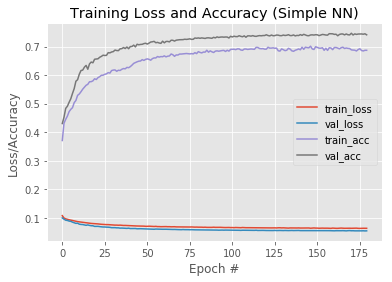

In [882]:
import matplotlib
%matplotlib inline
matplotlib.use("Agg")
import matplotlib.pyplot as plt
N = np.arange(0, 180)
plt.style.use("ggplot")
plt.figure()
#print(final.history)
plt.plot(N, final4.history["loss"], label="train_loss")
plt.plot(N, final4.history["val_loss"], label="val_loss")
plt.plot(N, final4.history["acc"], label="train_acc")
plt.plot(N, final4.history["val_acc"], label="val_acc")
plt.title("Training Loss and Accuracy (Simple NN)")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.savefig('Loss and accuracy2')
plt.show()
from keras.models import load_model
model.save('enzyme_rnn_v2.h5')

In [883]:
#RNN
from keras.layers import Flatten, Activation
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt

model = Sequential()
model.add(LSTM(64, input_shape=(50,20), return_sequences=False, dropout=0.1, recurrent_dropout=0.1))
model.add(Dense(2, activation='tanh'))
model.add(Dense(2, activation='tanh'))
model.add(Dense(2, activation='selu'))
model.add(Dropout(0.1))
model.add(Dense(7, activation='tanh'))

from keras.utils import to_categorical
y_binarytrain = to_categorical(y_train)
y_binarytest = to_categorical(y_test)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
model.summary()
final5 = model.fit(transformed,
                  y_binarytrain, validation_data=(transformed3, y_binarytest), epochs=180)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_166 (LSTM)              (None, 64)                21760     
_________________________________________________________________
dense_393 (Dense)            (None, 2)                 130       
_________________________________________________________________
dense_394 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_395 (Dense)            (None, 2)                 6         
_________________________________________________________________
dropout_54 (Dropout)         (None, 2)                 0         
_________________________________________________________________
dense_396 (Dense)            (None, 7)                 21        
Total params: 21,923
Trainable params: 21,923
Non-trainable params: 0
_________________________________________________________________
Train 

27148/27148 [==============================] - 48s 2ms/step - loss: 0.0658 - acc: 0.6801 - val_loss: 0.0598 - val_acc: 0.7095
Epoch 52/180
27148/27148 [==============================] - 48s 2ms/step - loss: 0.0657 - acc: 0.6812 - val_loss: 0.0599 - val_acc: 0.7068
Epoch 53/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0651 - acc: 0.6859 - val_loss: 0.0594 - val_acc: 0.7105
Epoch 54/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0651 - acc: 0.6858 - val_loss: 0.0593 - val_acc: 0.7087
Epoch 55/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0650 - acc: 0.6869 - val_loss: 0.0593 - val_acc: 0.7130
Epoch 56/180
27148/27148 [==============================] - 48s 2ms/step - loss: 0.0642 - acc: 0.6908 - val_loss: 0.0590 - val_acc: 0.7130
Epoch 57/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0646 - acc: 0.6881 - val_loss: 0.0590 - val_acc: 0.7136
Epoch 58/180
27148/27148 [==============

27148/27148 [==============================] - 47s 2ms/step - loss: 0.0597 - acc: 0.7163 - val_loss: 0.0554 - val_acc: 0.7301
Epoch 110/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0602 - acc: 0.7189 - val_loss: 0.0554 - val_acc: 0.7307
Epoch 111/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0600 - acc: 0.7157 - val_loss: 0.0556 - val_acc: 0.7305
Epoch 112/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0603 - acc: 0.7160 - val_loss: 0.0556 - val_acc: 0.7283
Epoch 113/180
27148/27148 [==============================] - 48s 2ms/step - loss: 0.0600 - acc: 0.7164 - val_loss: 0.0552 - val_acc: 0.7321
Epoch 114/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0597 - acc: 0.7190 - val_loss: 0.0554 - val_acc: 0.7321
Epoch 115/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0599 - acc: 0.7181 - val_loss: 0.0553 - val_acc: 0.7326
Epoch 116/180
27148/27148 [=======

27148/27148 [==============================] - 48s 2ms/step - loss: 0.0581 - acc: 0.7286 - val_loss: 0.0539 - val_acc: 0.7410
Epoch 168/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0579 - acc: 0.7281 - val_loss: 0.0537 - val_acc: 0.7424
Epoch 169/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0576 - acc: 0.7308 - val_loss: 0.0538 - val_acc: 0.7390
Epoch 170/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0580 - acc: 0.7297 - val_loss: 0.0536 - val_acc: 0.7446
Epoch 171/180
27148/27148 [==============================] - 50s 2ms/step - loss: 0.0580 - acc: 0.7290 - val_loss: 0.0536 - val_acc: 0.7443
Epoch 172/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0580 - acc: 0.7285 - val_loss: 0.0538 - val_acc: 0.7405
Epoch 173/180
27148/27148 [==============================] - 47s 2ms/step - loss: 0.0577 - acc: 0.7294 - val_loss: 0.0536 - val_acc: 0.7428
Epoch 174/180
27148/27148 [=======

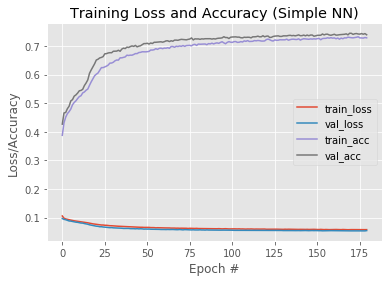

In [884]:
import matplotlib
%matplotlib inline
matplotlib.use("Agg")
import matplotlib.pyplot as plt
N = np.arange(0, 180)
plt.style.use("ggplot")
plt.figure()
#print(final.history)
plt.plot(N, final5.history["loss"], label="train_loss")
plt.plot(N, final5.history["val_loss"], label="val_loss")
plt.plot(N, final5.history["acc"], label="train_acc")
plt.plot(N, final5.history["val_acc"], label="val_acc")
plt.title("Training Loss and Accuracy (Simple NN)")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.savefig('Loss and accuracy3')
plt.show()
from keras.models import load_model
model.save('enzyme_rnn_v3.h5')